# Dense Channel Aggregation and Reconstruction Network

In [1]:
import numpy as np
import pandas as pd
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"  # Select the GPU index
import scipy.io
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader
from collections import namedtuple
import scipy.io as sio
import math
import thop

from PIL import Image
from collections import OrderedDict
import torchvision.transforms as T
import matplotlib.pyplot as plt
import time
from scipy.io import savemat
import dill as pickle
from torch.optim.lr_scheduler import _LRScheduler
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)

In [2]:
#Parameters
num_epochs=2500
patience=15
data_dir='../data/' 
scenario='out'
batch_size=200 
workers=5
reduction=4
expansion=1
seed=None
pin_memory=True
schedulertype = 'cosine'
weight_path=f'Experiments/table1/cr{reduction}/{expansion}x_{scenario}/epochs{num_epochs}/'
lr_init = 3e-3
val_freq=10
test_freq=10

In [3]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [4]:
class PreFetcher:
    r""" Data pre-fetcher to accelerate the data loading
    """

    def __init__(self, loader):
        self.ori_loader = loader
        self.len = len(loader)
        self.stream = torch.cuda.Stream()
        self.next_input = None

    def preload(self):
        try:
            self.next_input = next(self.loader)
        except StopIteration:
            self.next_input = None
            return

        with torch.cuda.stream(self.stream):
            for idx, tensor in enumerate(self.next_input):
                self.next_input[idx] = tensor.cuda(non_blocking=True)

    def __len__(self):
        return self.len

    def __iter__(self):
        self.loader = iter(self.ori_loader)
        self.preload()
        return self

    def __next__(self):
        torch.cuda.current_stream().wait_stream(self.stream)
        input = self.next_input
        if input is None:
            raise StopIteration
        for tensor in input:
            tensor.record_stream(torch.cuda.current_stream())
        self.preload()
        return input


In [5]:


class Cost2100DataLoader(object):
    r""" PyTorch DataLoader for COST2100 dataset.
    """

    def __init__(self, root, batch_size, num_workers, pin_memory, scenario):
        
        assert scenario in {"in", "out"}
        self.batch_size = batch_size
        self.num_workers = num_workers
        self.pin_memory = pin_memory

        dir_train = os.path.join(root, f"DATA_Htrain{scenario}.mat")
        dir_val = os.path.join(root, f"DATA_Hval{scenario}.mat")
        dir_test = os.path.join(root, f"DATA_Htest{scenario}.mat")
        dir_raw = os.path.join(root, f"DATA_HtestF{scenario}_all.mat")
        channel, nt, nc, nc_expand = 2, 32, 32, 125

        # Training data loading
        data_train = sio.loadmat(dir_train)['HT']
        data_train = torch.tensor(data_train, dtype=torch.float32).view(
            data_train.shape[0], channel, nt, nc)
        self.train_dataset = TensorDataset(data_train)

        # Validation data loading
        data_val = sio.loadmat(dir_val)['HT']
        data_val = torch.tensor(data_val, dtype=torch.float32).view(
            data_val.shape[0], channel, nt, nc)
        self.val_dataset = TensorDataset(data_val)

        # Test data loading, including the sparse data and the raw data
        data_test = sio.loadmat(dir_test)['HT']
        data_test = torch.tensor(data_test, dtype=torch.float32).view(
            data_test.shape[0], channel, nt, nc)

        raw_test = sio.loadmat(dir_raw)['HF_all']
        real = torch.tensor(np.real(raw_test), dtype=torch.float32)
        imag = torch.tensor(np.imag(raw_test), dtype=torch.float32)
        raw_test = torch.cat((real.view(raw_test.shape[0], nt, nc_expand, 1),
                              imag.view(raw_test.shape[0], nt, nc_expand, 1)), dim=3)
        self.test_dataset = TensorDataset(data_test, raw_test)

    def __call__(self):
        train_loader = DataLoader(self.train_dataset,
                                  batch_size=self.batch_size,
                                  num_workers=self.num_workers,
                                  pin_memory=self.pin_memory,
                                  shuffle=True)
        val_loader = DataLoader(self.val_dataset,
                                batch_size=self.batch_size,
                                num_workers=self.num_workers,
                                pin_memory=self.pin_memory,
                                shuffle=False)
        test_loader = DataLoader(self.test_dataset,
                                 batch_size=self.batch_size,
                                 num_workers=self.num_workers,
                                 pin_memory=self.pin_memory,
                                 shuffle=False)

        # Accelerate CUDA data loading with pre-fetcher if GPU is used.
        if self.pin_memory is True:
            train_loader = PreFetcher(train_loader)
            val_loader = PreFetcher(val_loader)
            test_loader = PreFetcher(test_loader)

        return train_loader, val_loader, test_loader


In [6]:
# Create the data loader
train_loader, val_loader, test_loader = Cost2100DataLoader(
        root=data_dir,
        batch_size=batch_size,
        num_workers=workers,
        pin_memory=pin_memory,
        scenario=scenario)()

In [7]:
train_iter=iter(train_loader)

In [8]:
x=next(train_iter)

In [9]:
len(x)

1

In [10]:
x[0].shape

torch.Size([200, 2, 32, 32])

In [11]:
len(train_loader)

500

In [12]:
len(test_loader)

100

In [13]:
len(val_loader)

150

In [14]:
def cal_model_parameters(model):
    total_param  = []
    for p1 in model.parameters():
        total_param.append(int(p1.numel()))
    return sum(total_param)

In [15]:
def NMSE_cal(x_hat, x):
    x_real = torch.reshape(torch.real(x), (x.shape[0], -1))
    x_imag = torch.reshape(torch.imag(x), (x.shape[0], -1))
    x_hat_real = torch.reshape(torch.real(x_hat), (x.shape[0], -1))
    x_hat_imag = torch.reshape(torch.imag(x_hat), (x.shape[0], -1))
    power = torch.sum((x_real - 0.5) ** 2 + (x_imag - 0.5) ** 2, dim=1)
    mse = torch.sum((x_real - x_hat_real) ** 2 + (x_imag - x_hat_imag) ** 2, dim=1)
    nmse = torch.mean(mse / power)
    return nmse

In [16]:
class ConvBN(nn.Sequential):
    def __init__(self, in_planes, out_planes, kernel_size, stride=1, groups=1):
        if not isinstance(kernel_size, int):
            padding = [(i - 1) // 2 for i in kernel_size]
        else:
            padding = (kernel_size - 1) // 2
        super(ConvBN, self).__init__(OrderedDict([
            ('conv', nn.Conv2d(in_channels=in_planes,
                               out_channels=out_planes,
                               kernel_size=kernel_size,
                               stride=stride,
                               padding=padding,
                               groups=groups,
                               bias=False)),
            ('bn', nn.BatchNorm2d(out_planes))
        ]))

In [17]:
class DCARNDecoderBlock(nn.Module):
  
    def __init__(self, expansion):
        super().__init__()
        width = 10 * expansion
        self.conv1 = ConvBN(2, width, [1, 11])
        self.prelu1 = nn.PReLU(num_parameters=width, init=0.3)
        self.conv2 = ConvBN(2, width, [11, 1])
        self.prelu2 = nn.PReLU(num_parameters=width, init=0.3)
        self.conv3 = ConvBN(2*width, 2, [1, 11])
        self.prelu3 = nn.PReLU(num_parameters=2, init=0.3)
        self.identity = nn.Identity()
    def forward(self, x):
        identity = self.identity(x)
        x1 = self.prelu1(self.conv1(x))

        x2 = self.prelu2(self.conv2(x))

        # Concat instead of add
        x3 = torch.cat([x1, x2], dim=1) 
        x3 = self.prelu3(self.conv3(x3)+identity)

        return x3

In [18]:
class DCARNEncoderBlock(nn.Module):
    def __init__(self):
        super(DCARNEncoderBlock, self).__init__()
        width = 2
        self.conv1 = ConvBN(2, width, [1, 11])
        self.prelu1 = nn.PReLU(num_parameters=width, init=0.3)
        self.conv2 = ConvBN(2, width, [11, 1])
        self.prelu2 = nn.PReLU(num_parameters=width, init=0.3)
        self.conv3 = ConvBN(2*width, 2, [1, 11])
        self.prelu3 = nn.PReLU(num_parameters=2, init=0.3)
        self.identity = nn.Identity()
    def forward(self, x):
        identity = self.identity(x)
        x1 = self.prelu1(self.conv1(x))

        x2 = self.prelu2(self.conv2(x))

        # Concat instead of add
        x3 = torch.cat([x1, x2], dim=1) 
        x3 = self.prelu3(self.conv3(x3)+identity)
        return x3

In [19]:
class DCARN(nn.Module):
    def __init__(self,
                 in_channels=2,
                 reduction=4,
                 expansion=1):
        super(DCARN, self).__init__()
        
        total_size, w, h = 2048, 32, 32

        self.encoder_feature = nn.Sequential(OrderedDict([
            ("conv1x11_bn", ConvBN(in_channels, 2, [1, 11])),
            ("prelu", nn.PReLU(num_parameters=2, init=0.3)),
            ("DCARNEncoderBlock", DCARNEncoderBlock()),
            
        ]))
        
        self.encoder_fc = nn.Linear(total_size, total_size // reduction)

        self.decoder_fc = nn.Linear(total_size // reduction, total_size)
        
        self.decoder_feature = nn.Sequential(OrderedDict([
            ("conv1x11_bn", ConvBN(2, in_channels, [1, 11])),
            ("prelu", nn.PReLU(num_parameters=2, init=0.3)),
            ("DCARNDecoderBlock1", DCARNDecoderBlock(expansion=expansion)),
            ("DCARNDecoderBlock2", DCARNDecoderBlock(expansion=expansion)),
            ("sigmoid", nn.Sigmoid())
        ]))

        for m in self.modules():
            if isinstance(m, (nn.Conv2d, nn.Linear)):
                nn.init.xavier_uniform_(m.weight)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

    def forward(self, x):
        n, c, h, w = x.detach().size()
        out = self.encoder_feature(x)
        out = self.encoder_fc(out.view(n, -1))
        out = self.decoder_fc(out)
        out = self.decoder_feature(out.view(n, c, h, w))
        return out

In [20]:
model = DCARN(in_channels=2, reduction=reduction, expansion=expansion).to(device)

In [21]:
if seed is not None:
    random.seed(seed)
    torch.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

In [22]:
cal_model_parameters(model)

2101898

In [23]:
# Define loss function
criterion = nn.MSELoss().to(device)

In [24]:
class WarmUpCosineAnnealingLR(_LRScheduler):
    def __init__(self, optimizer, T_max, T_warmup, eta_min=0, last_epoch=-1):
        self.T_max = T_max
        self.T_warmup = T_warmup
        self.eta_min = eta_min
        super(WarmUpCosineAnnealingLR, self).__init__(optimizer, last_epoch)

    def get_lr(self):
        if self.last_epoch < self.T_warmup:
            return [base_lr * self.last_epoch / self.T_warmup for base_lr in self.base_lrs]
        else:
            k = 1 + math.cos(math.pi * (self.last_epoch - self.T_warmup) / (self.T_max - self.T_warmup))
            return [self.eta_min + (base_lr - self.eta_min) * k / 2 for base_lr in self.base_lrs]


class FakeLR(_LRScheduler):
    def __init__(self, optimizer):
        super(FakeLR, self).__init__(optimizer=optimizer)

    def get_lr(self):
        return self.base_lrs


In [25]:
# Define optimizer and scheduler
optimizer = torch.optim.Adam(model.parameters(), lr_init, betas=(0.9, 0.999))
if schedulertype == 'const':
    scheduler = FakeLR(optimizer=optimizer)

else:
    scheduler = WarmUpCosineAnnealingLR(optimizer=optimizer,
                                        T_max=num_epochs * len(train_loader),
                                        T_warmup=30 * len(train_loader),
                                        eta_min=5e-7)

In [26]:
field = ('nmse', 'rho', 'epoch')
Result = namedtuple('Result', field, defaults=(None,) * len(field))


In [27]:
class AverageMeter(object):
    r"""Computes and stores the average and current value
       Imported from https://github.com/pytorch/examples/blob/master/imagenet/main.py#L247-L262
    """
    def __init__(self, name):
        self.reset()
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0
        self.name = name

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

    def __repr__(self):
        return f"==> For {self.name}: sum={self.sum}; avg={self.avg}"




In [28]:
def evaluator(sparse_pred, sparse_gt, raw_gt):
    r""" Evaluation of decoding implemented in PyTorch Tensor
         Computes normalized mean square error (NMSE) and rho.
    """

    with torch.no_grad():
        # Basic params
        nt = 32
        nc = 32
        nc_expand = 257

        # De-centralize
        sparse_gt = sparse_gt - 0.5
        sparse_pred = sparse_pred - 0.5

        # Calculate the NMSE
        power_gt = sparse_gt[:, 0, :, :] ** 2 + sparse_gt[:, 1, :, :] ** 2
        difference = sparse_gt - sparse_pred
        mse = difference[:, 0, :, :] ** 2 + difference[:, 1, :, :] ** 2
        nmse = (mse.sum(dim=[1, 2]) / power_gt.sum(dim=[1, 2])).mean()

        # Calculate the Rho
        n = sparse_pred.size(0)
        sparse_pred = sparse_pred.permute(0, 2, 3, 1)  # Move the real/imaginary dim to the last
        zeros = sparse_pred.new_zeros((n, nt, nc_expand - nc, 2))
        sparse_pred = torch.cat((sparse_pred, zeros), dim=2)
        raw_pred = torch.fft.fft(sparse_pred, dim=1)[:, :, :125, :]

        norm_pred = raw_pred[..., 0] ** 2 + raw_pred[..., 1] ** 2
        norm_pred = torch.sqrt(norm_pred.sum(dim=1))

        norm_gt = raw_gt[..., 0] ** 2 + raw_gt[..., 1] ** 2
        norm_gt = torch.sqrt(norm_gt.sum(dim=1))

        real_cross = raw_pred[..., 0] * raw_gt[..., 0] + raw_pred[..., 1] * raw_gt[..., 1]
        real_cross = real_cross.sum(dim=1)
        imag_cross = raw_pred[..., 0] * raw_gt[..., 1] - raw_pred[..., 1] * raw_gt[..., 0]
        imag_cross = imag_cross.sum(dim=1)
        norm_cross = torch.sqrt(real_cross ** 2 + imag_cross ** 2)

        rho = (norm_cross / (norm_pred * norm_gt)).mean()

        return rho, nmse


In [29]:
class Tester:
    r""" The testing interface for classification
    """

    def __init__(self, model, device, criterion, print_freq=20):
        self.model = model
        self.device = device
        self.criterion = criterion
        self.print_freq = print_freq

    def __call__(self, test_data, verbose=True):
        r""" Runs the testing procedure.

        Args:
            test_data (DataLoader): Data loader for validation data.
        """

        self.model.eval()
        with torch.no_grad():
            loss, rho, nmse = self._iteration(test_data)
        if verbose:
            print(f'\n=> Test result: \nloss: {loss:.3e}'
                  f'    rho: {rho:.3e}    NMSE: {nmse:.3e}\n')
        return loss, rho, nmse

    def _iteration(self, data_loader):
        r""" protected function which test the model on given data loader for one epoch.
        """

        iter_rho = AverageMeter('Iter rho')
        iter_nmse = AverageMeter('Iter nmse')
        iter_loss = AverageMeter('Iter loss')
        iter_time = AverageMeter('Iter time')
        time_tmp = time.time()

        for batch_idx, (sparse_gt, raw_gt) in enumerate(data_loader):
            sparse_gt = sparse_gt.to(self.device)
            sparse_pred = self.model(sparse_gt)
            loss = self.criterion(sparse_pred, sparse_gt)
            rho, nmse = evaluator(sparse_pred, sparse_gt, raw_gt)

            # Log and visdom update
            iter_loss.update(loss)
            iter_rho.update(rho)
            iter_nmse.update(nmse)
            iter_time.update(time.time() - time_tmp)
            time_tmp = time.time()

            # plot progress
            if (batch_idx + 1) % self.print_freq == 0:
                print(f'[{batch_idx + 1}/{len(data_loader)}] '
                            f'loss: {iter_loss.avg:.3e} | rho: {iter_rho.avg:.3e} | '
                            f'NMSE: {10 * torch.log10(iter_nmse.avg):.3e} | time: {iter_time.avg:.3f}')
        
        nmse = 10 * torch.log10(iter_nmse.avg)  # global NMSE in dB
        print(f'=> Test rho:{iter_rho.avg:.3e}  NMSE: {nmse:.3e}\n')
        return iter_loss.avg, iter_rho.avg, nmse


In [30]:
val_losses = torch.empty(num_epochs//val_freq)
train_losses = torch.empty(num_epochs)
test_losses = torch.empty(num_epochs//test_freq)
alphas = torch.zeros(num_epochs)
test_nmses = torch.zeros(num_epochs//test_freq)

if not os.path.exists(weight_path + "losses/"):
    os.makedirs(weight_path + "losses/")

In [31]:
class Trainer:
    r""" The training pipeline for encoder-decoder architecture
    """

    def __init__(self, model, device, optimizer, criterion, scheduler, resume=None,
                 save_path=weight_path, print_freq=10, val_freq = val_freq, test_freq = test_freq):

        # Basic arguments
        self.model = model
        self.optimizer = optimizer
        self.criterion = criterion
        self.scheduler = scheduler
        self.device = device

        # Verbose arguments
        self.resume_file = resume
        self.save_path = save_path
        self.print_freq = print_freq
        self.val_freq = val_freq
        self.test_freq = test_freq
        

        # Pipeline arguments
        self.cur_epoch = 1
        self.all_epoch = None
        self.train_loss = None
        self.val_loss = None
        self.test_loss = None
        self.best_rho = Result()
        self.best_nmse = Result()
        
        self.tester = Tester(model, device, criterion, print_freq)
        self.test_loader = None

    def loop(self, epochs, train_loader, val_loader, test_loader):
        r""" The main loop function which runs training and validation iteratively.

        Args:
            epochs (int): The total epoch for training
            train_loader (DataLoader): Data loader for training data.
            val_loader (DataLoader): Data loader for validation data.
            test_loader (DataLoader): Data loader for test data.
        """

        self.all_epoch = epochs
        self._resume()
        vn=0
        tn=0
        for ep in range(self.cur_epoch, epochs + 1):
            self.cur_epoch = ep

            # conduct training, validation and test
            self.train_loss = self.train(train_loader)
            train_losses[ep-1] = self.train_loss.detach()
            if ep % self.val_freq == 0:
                self.val_loss = self.val(val_loader)
                val_losses[vn] = self.val_loss.detach()
                vn=vn+1
            # Save alpha 
            alphas_ep = []
            for m in self.model.modules():
                if isinstance(m, nn.PReLU):
                    alphas_ep.append(m.weight[0])
            alphas[ep-1] = torch.stack(alphas_ep).mean().detach()
            
            if ep % self.test_freq == 0:
                self.test_loss, rho, nmse = self.test(test_loader)
                test_losses[tn] = self.test_loss.detach()
                test_nmses[tn] = nmse.detach()
                tn=tn+1
            else:
                rho, nmse = None, None
            # conduct saving, visualization and log printing
            self._loop_postprocessing(rho, nmse)

    def train(self, train_loader):
        r""" train the model on the given data loader for one epoch.

        Args:
            train_loader (DataLoader): the training data loader
        """

        self.model.train()
        with torch.enable_grad():
            return self._iteration(train_loader)

    def val(self, val_loader):
        r""" exam the model with validation set.

        Args:
            val_loader: (DataLoader): the validation data loader
        """

        self.model.eval()
        with torch.no_grad():
            return self._iteration(val_loader)

    def test(self, test_loader):
        r""" Truly test the model on the test dataset for one epoch.

        Args:
            test_loader (DataLoader): the test data loader
        """

        self.model.eval()
        with torch.no_grad():
            return self.tester(test_loader, verbose=False)

    def _iteration(self, data_loader):
        iter_loss = AverageMeter('Iter loss')
        iter_time = AverageMeter('Iter time')
        time_tmp = time.time()

        for batch_idx, (sparse_gt, ) in enumerate(data_loader):
            sparse_gt = sparse_gt.to(self.device)
            sparse_pred = self.model(sparse_gt)
            loss = self.criterion(sparse_pred, sparse_gt)

            # Scheduler update, backward pass and optimization
            if self.model.training:
                self.optimizer.zero_grad()
                loss.backward()
                self.optimizer.step()
                self.scheduler.step()

            # Log and visdom update
            iter_loss.update(loss)
            iter_time.update(time.time() - time_tmp)
            time_tmp = time.time()

            # plot progress
            if (batch_idx + 1) % self.print_freq == 0:
                print(f'Epoch: [{self.cur_epoch}/{self.all_epoch}]'
                            f'[{batch_idx + 1}/{len(data_loader)}] '
                            f'lr: {self.scheduler.get_lr()[0]:.2e} | '
                            f'MSE loss: {iter_loss.avg:.3e} | '
                            f'time: {iter_time.avg:.3f}')
                

        mode = 'Train' if self.model.training else 'Val'
        print(f' {mode}  Loss: {iter_loss.avg:.3e}\n')

        return iter_loss.avg

    def _save(self, state, name):
        if self.save_path is None:
            print('No path to save checkpoints.')
            return
        
        os.makedirs(self.save_path, exist_ok=True)
        torch.save(state, os.path.join(self.save_path, name))

    def _resume(self):
        r""" protected function which resume from checkpoint at the beginning of training.
        """

        if self.resume_file is None:
            return None
        assert os.path.isfile(self.resume_file)
        print(f' loading checkpoint {self.resume_file}')
        checkpoint = torch.load(self.resume_file)
        self.cur_epoch = checkpoint['epoch']
        self.model.load_state_dict(checkpoint['state_dict'])
        self.optimizer.load_state_dict(checkpoint['optimizer'])
        self.scheduler.load_state_dict(checkpoint['scheduler'])
        self.best_rho = checkpoint['best_rho']
        self.best_nmse = checkpoint['best_nmse']
        self.cur_epoch += 1  # start from the next epoch

        print(f' successfully loaded checkpoint {self.resume_file} '
                    f'from epoch {checkpoint["epoch"]}.\n')

    def _loop_postprocessing(self, rho, nmse):
        r""" private function which makes loop() function neater.
        """

        # save state generate
        state = {
            'epoch': self.cur_epoch,
            'state_dict': self.model.state_dict(),
            'optimizer': self.optimizer.state_dict(),
            'scheduler': self.scheduler.state_dict(),
            'best_rho': self.best_rho,
            'best_nmse': self.best_nmse
        }

        # save model with best rho and nmse
        if rho is not None:
            if self.best_rho.rho is None or abs(self.best_rho.rho) < abs(rho):
                self.best_rho = Result(rho=rho, nmse=nmse, epoch=self.cur_epoch)
                state['best_rho'] = self.best_rho
                self._save(state, name=f"best_rho.pth")
            if self.best_nmse.nmse is None or self.best_nmse.nmse > nmse:
                self.best_nmse = Result(rho=rho, nmse=nmse, epoch=self.cur_epoch)
                state['best_nmse'] = self.best_nmse
                self._save(state, name=f"best_nmse.pth")

        self._save(state, name='last.pth')

        # print current best results
        if self.best_rho.rho is not None:
            print(f'\n=! Best rho: {self.best_rho.rho:.3e} ('
                  f'Corresponding nmse={self.best_rho.nmse:.3e}; '
                  f'epoch={self.best_rho.epoch})'
                  f'\n   Best NMSE: {self.best_nmse.nmse:.3e} ('
                  f'Corresponding rho={self.best_nmse.rho:.3e};  '
                  f'epoch={self.best_nmse.epoch})\n')
            

In [32]:
# Define the training pipeline
trainer = Trainer(model=model,
                  device=device,
                  optimizer=optimizer,
                  criterion=criterion,
                  scheduler=scheduler)

# Start training
trainer.loop(num_epochs, train_loader, val_loader, test_loader)

Epoch: [1/2500][10/500] lr: 2.00e-06 | MSE loss: 5.341e-02 | time: 0.399
Epoch: [1/2500][20/500] lr: 4.00e-06 | MSE loss: 5.307e-02 | time: 0.209
Epoch: [1/2500][30/500] lr: 6.00e-06 | MSE loss: 5.249e-02 | time: 0.146
Epoch: [1/2500][40/500] lr: 8.00e-06 | MSE loss: 5.166e-02 | time: 0.113
Epoch: [1/2500][50/500] lr: 1.00e-05 | MSE loss: 5.063e-02 | time: 0.093
Epoch: [1/2500][60/500] lr: 1.20e-05 | MSE loss: 4.949e-02 | time: 0.081
Epoch: [1/2500][70/500] lr: 1.40e-05 | MSE loss: 4.828e-02 | time: 0.071
Epoch: [1/2500][80/500] lr: 1.60e-05 | MSE loss: 4.704e-02 | time: 0.065
Epoch: [1/2500][90/500] lr: 1.80e-05 | MSE loss: 4.580e-02 | time: 0.059
Epoch: [1/2500][100/500] lr: 2.00e-05 | MSE loss: 4.458e-02 | time: 0.055
Epoch: [1/2500][110/500] lr: 2.20e-05 | MSE loss: 4.338e-02 | time: 0.051
Epoch: [1/2500][120/500] lr: 2.40e-05 | MSE loss: 4.222e-02 | time: 0.048
Epoch: [1/2500][130/500] lr: 2.60e-05 | MSE loss: 4.110e-02 | time: 0.046
Epoch: [1/2500][140/500] lr: 2.80e-05 | MSE los

Epoch: [3/2500][120/500] lr: 2.24e-04 | MSE loss: 1.821e-03 | time: 0.019
Epoch: [3/2500][130/500] lr: 2.26e-04 | MSE loss: 1.805e-03 | time: 0.018
Epoch: [3/2500][140/500] lr: 2.28e-04 | MSE loss: 1.791e-03 | time: 0.018
Epoch: [3/2500][150/500] lr: 2.30e-04 | MSE loss: 1.779e-03 | time: 0.017
Epoch: [3/2500][160/500] lr: 2.32e-04 | MSE loss: 1.768e-03 | time: 0.017
Epoch: [3/2500][170/500] lr: 2.34e-04 | MSE loss: 1.758e-03 | time: 0.017
Epoch: [3/2500][180/500] lr: 2.36e-04 | MSE loss: 1.748e-03 | time: 0.016
Epoch: [3/2500][190/500] lr: 2.38e-04 | MSE loss: 1.739e-03 | time: 0.016
Epoch: [3/2500][200/500] lr: 2.40e-04 | MSE loss: 1.731e-03 | time: 0.016
Epoch: [3/2500][210/500] lr: 2.42e-04 | MSE loss: 1.724e-03 | time: 0.015
Epoch: [3/2500][220/500] lr: 2.44e-04 | MSE loss: 1.717e-03 | time: 0.015
Epoch: [3/2500][230/500] lr: 2.46e-04 | MSE loss: 1.711e-03 | time: 0.015
Epoch: [3/2500][240/500] lr: 2.48e-04 | MSE loss: 1.705e-03 | time: 0.015
Epoch: [3/2500][250/500] lr: 2.50e-04 

Epoch: [5/2500][230/500] lr: 4.46e-04 | MSE loss: 1.527e-03 | time: 0.014
Epoch: [5/2500][240/500] lr: 4.48e-04 | MSE loss: 1.528e-03 | time: 0.014
Epoch: [5/2500][250/500] lr: 4.50e-04 | MSE loss: 1.527e-03 | time: 0.014
Epoch: [5/2500][260/500] lr: 4.52e-04 | MSE loss: 1.527e-03 | time: 0.014
Epoch: [5/2500][270/500] lr: 4.54e-04 | MSE loss: 1.527e-03 | time: 0.014
Epoch: [5/2500][280/500] lr: 4.56e-04 | MSE loss: 1.526e-03 | time: 0.014
Epoch: [5/2500][290/500] lr: 4.58e-04 | MSE loss: 1.526e-03 | time: 0.013
Epoch: [5/2500][300/500] lr: 4.60e-04 | MSE loss: 1.525e-03 | time: 0.013
Epoch: [5/2500][310/500] lr: 4.62e-04 | MSE loss: 1.525e-03 | time: 0.013
Epoch: [5/2500][320/500] lr: 4.64e-04 | MSE loss: 1.525e-03 | time: 0.013
Epoch: [5/2500][330/500] lr: 4.66e-04 | MSE loss: 1.525e-03 | time: 0.013
Epoch: [5/2500][340/500] lr: 4.68e-04 | MSE loss: 1.525e-03 | time: 0.013
Epoch: [5/2500][350/500] lr: 4.70e-04 | MSE loss: 1.525e-03 | time: 0.013
Epoch: [5/2500][360/500] lr: 4.72e-04 

Epoch: [7/2500][340/500] lr: 6.68e-04 | MSE loss: 1.427e-03 | time: 0.013
Epoch: [7/2500][350/500] lr: 6.70e-04 | MSE loss: 1.425e-03 | time: 0.013
Epoch: [7/2500][360/500] lr: 6.72e-04 | MSE loss: 1.425e-03 | time: 0.013
Epoch: [7/2500][370/500] lr: 6.74e-04 | MSE loss: 1.424e-03 | time: 0.013
Epoch: [7/2500][380/500] lr: 6.76e-04 | MSE loss: 1.422e-03 | time: 0.013
Epoch: [7/2500][390/500] lr: 6.78e-04 | MSE loss: 1.422e-03 | time: 0.013
Epoch: [7/2500][400/500] lr: 6.80e-04 | MSE loss: 1.421e-03 | time: 0.013
Epoch: [7/2500][410/500] lr: 6.82e-04 | MSE loss: 1.420e-03 | time: 0.013
Epoch: [7/2500][420/500] lr: 6.84e-04 | MSE loss: 1.419e-03 | time: 0.013
Epoch: [7/2500][430/500] lr: 6.86e-04 | MSE loss: 1.418e-03 | time: 0.013
Epoch: [7/2500][440/500] lr: 6.88e-04 | MSE loss: 1.417e-03 | time: 0.013
Epoch: [7/2500][450/500] lr: 6.90e-04 | MSE loss: 1.416e-03 | time: 0.013
Epoch: [7/2500][460/500] lr: 6.92e-04 | MSE loss: 1.415e-03 | time: 0.013
Epoch: [7/2500][470/500] lr: 6.94e-04 

Epoch: [9/2500][450/500] lr: 8.90e-04 | MSE loss: 1.234e-03 | time: 0.013
Epoch: [9/2500][460/500] lr: 8.92e-04 | MSE loss: 1.233e-03 | time: 0.013
Epoch: [9/2500][470/500] lr: 8.94e-04 | MSE loss: 1.232e-03 | time: 0.013
Epoch: [9/2500][480/500] lr: 8.96e-04 | MSE loss: 1.232e-03 | time: 0.013
Epoch: [9/2500][490/500] lr: 8.98e-04 | MSE loss: 1.231e-03 | time: 0.012
Epoch: [9/2500][500/500] lr: 9.00e-04 | MSE loss: 1.230e-03 | time: 0.013
 Train  Loss: 1.230e-03

Epoch: [10/2500][10/500] lr: 9.02e-04 | MSE loss: 1.185e-03 | time: 0.074
Epoch: [10/2500][20/500] lr: 9.04e-04 | MSE loss: 1.186e-03 | time: 0.044
Epoch: [10/2500][30/500] lr: 9.06e-04 | MSE loss: 1.185e-03 | time: 0.033
Epoch: [10/2500][40/500] lr: 9.08e-04 | MSE loss: 1.184e-03 | time: 0.027
Epoch: [10/2500][50/500] lr: 9.10e-04 | MSE loss: 1.182e-03 | time: 0.024
Epoch: [10/2500][60/500] lr: 9.12e-04 | MSE loss: 1.182e-03 | time: 0.022
Epoch: [10/2500][70/500] lr: 9.14e-04 | MSE loss: 1.182e-03 | time: 0.020
Epoch: [10/25

Epoch: [11/2500][280/500] lr: 1.06e-03 | MSE loss: 1.074e-03 | time: 0.013
Epoch: [11/2500][290/500] lr: 1.06e-03 | MSE loss: 1.074e-03 | time: 0.013
Epoch: [11/2500][300/500] lr: 1.06e-03 | MSE loss: 1.073e-03 | time: 0.013
Epoch: [11/2500][310/500] lr: 1.06e-03 | MSE loss: 1.073e-03 | time: 0.013
Epoch: [11/2500][320/500] lr: 1.06e-03 | MSE loss: 1.072e-03 | time: 0.013
Epoch: [11/2500][330/500] lr: 1.07e-03 | MSE loss: 1.071e-03 | time: 0.013
Epoch: [11/2500][340/500] lr: 1.07e-03 | MSE loss: 1.071e-03 | time: 0.013
Epoch: [11/2500][350/500] lr: 1.07e-03 | MSE loss: 1.070e-03 | time: 0.013
Epoch: [11/2500][360/500] lr: 1.07e-03 | MSE loss: 1.069e-03 | time: 0.013
Epoch: [11/2500][370/500] lr: 1.07e-03 | MSE loss: 1.068e-03 | time: 0.013
Epoch: [11/2500][380/500] lr: 1.08e-03 | MSE loss: 1.067e-03 | time: 0.013
Epoch: [11/2500][390/500] lr: 1.08e-03 | MSE loss: 1.067e-03 | time: 0.013
Epoch: [11/2500][400/500] lr: 1.08e-03 | MSE loss: 1.066e-03 | time: 0.013
Epoch: [11/2500][410/500]

Epoch: [13/2500][340/500] lr: 1.27e-03 | MSE loss: 9.609e-04 | time: 0.013
Epoch: [13/2500][350/500] lr: 1.27e-03 | MSE loss: 9.605e-04 | time: 0.013
Epoch: [13/2500][360/500] lr: 1.27e-03 | MSE loss: 9.603e-04 | time: 0.013
Epoch: [13/2500][370/500] lr: 1.27e-03 | MSE loss: 9.600e-04 | time: 0.013
Epoch: [13/2500][380/500] lr: 1.28e-03 | MSE loss: 9.597e-04 | time: 0.013
Epoch: [13/2500][390/500] lr: 1.28e-03 | MSE loss: 9.592e-04 | time: 0.013
Epoch: [13/2500][400/500] lr: 1.28e-03 | MSE loss: 9.588e-04 | time: 0.013
Epoch: [13/2500][410/500] lr: 1.28e-03 | MSE loss: 9.585e-04 | time: 0.013
Epoch: [13/2500][420/500] lr: 1.28e-03 | MSE loss: 9.581e-04 | time: 0.013
Epoch: [13/2500][430/500] lr: 1.29e-03 | MSE loss: 9.578e-04 | time: 0.013
Epoch: [13/2500][440/500] lr: 1.29e-03 | MSE loss: 9.575e-04 | time: 0.013
Epoch: [13/2500][450/500] lr: 1.29e-03 | MSE loss: 9.573e-04 | time: 0.013
Epoch: [13/2500][460/500] lr: 1.29e-03 | MSE loss: 9.572e-04 | time: 0.013
Epoch: [13/2500][470/500]

Epoch: [15/2500][400/500] lr: 1.48e-03 | MSE loss: 7.030e-04 | time: 0.013
Epoch: [15/2500][410/500] lr: 1.48e-03 | MSE loss: 6.933e-04 | time: 0.013
Epoch: [15/2500][420/500] lr: 1.48e-03 | MSE loss: 6.839e-04 | time: 0.013
Epoch: [15/2500][430/500] lr: 1.49e-03 | MSE loss: 6.751e-04 | time: 0.013
Epoch: [15/2500][440/500] lr: 1.49e-03 | MSE loss: 6.668e-04 | time: 0.013
Epoch: [15/2500][450/500] lr: 1.49e-03 | MSE loss: 6.580e-04 | time: 0.013
Epoch: [15/2500][460/500] lr: 1.49e-03 | MSE loss: 6.514e-04 | time: 0.013
Epoch: [15/2500][470/500] lr: 1.49e-03 | MSE loss: 6.439e-04 | time: 0.013
Epoch: [15/2500][480/500] lr: 1.50e-03 | MSE loss: 6.371e-04 | time: 0.013
Epoch: [15/2500][490/500] lr: 1.50e-03 | MSE loss: 6.301e-04 | time: 0.013
Epoch: [15/2500][500/500] lr: 1.50e-03 | MSE loss: 6.229e-04 | time: 0.013
 Train  Loss: 6.229e-04


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: 2.124e+00 (Corresponding rho=nan+nanj;  epoch=10)

Epoch: [16/2500][10/5

Epoch: [17/2500][470/500] lr: 1.69e-03 | MSE loss: 1.797e-04 | time: 0.013
Epoch: [17/2500][480/500] lr: 1.70e-03 | MSE loss: 1.793e-04 | time: 0.013
Epoch: [17/2500][490/500] lr: 1.70e-03 | MSE loss: 1.789e-04 | time: 0.013
Epoch: [17/2500][500/500] lr: 1.70e-03 | MSE loss: 1.785e-04 | time: 0.014
 Train  Loss: 1.785e-04


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: 2.124e+00 (Corresponding rho=nan+nanj;  epoch=10)

Epoch: [18/2500][10/500] lr: 1.70e-03 | MSE loss: 1.585e-04 | time: 0.073
Epoch: [18/2500][20/500] lr: 1.70e-03 | MSE loss: 1.531e-04 | time: 0.042
Epoch: [18/2500][30/500] lr: 1.71e-03 | MSE loss: 1.537e-04 | time: 0.032
Epoch: [18/2500][40/500] lr: 1.71e-03 | MSE loss: 1.547e-04 | time: 0.027
Epoch: [18/2500][50/500] lr: 1.71e-03 | MSE loss: 1.552e-04 | time: 0.024
Epoch: [18/2500][60/500] lr: 1.71e-03 | MSE loss: 1.543e-04 | time: 0.021
Epoch: [18/2500][70/500] lr: 1.71e-03 | MSE loss: 1.541e-04 | time: 0.020
Epoch: [18/2500][80/500] lr:

Epoch: [20/2500][10/500] lr: 1.90e-03 | MSE loss: 1.348e-04 | time: 0.078
Epoch: [20/2500][20/500] lr: 1.90e-03 | MSE loss: 1.354e-04 | time: 0.046
Epoch: [20/2500][30/500] lr: 1.91e-03 | MSE loss: 1.377e-04 | time: 0.035
Epoch: [20/2500][40/500] lr: 1.91e-03 | MSE loss: 1.361e-04 | time: 0.029
Epoch: [20/2500][50/500] lr: 1.91e-03 | MSE loss: 1.354e-04 | time: 0.026
Epoch: [20/2500][60/500] lr: 1.91e-03 | MSE loss: 1.349e-04 | time: 0.023
Epoch: [20/2500][70/500] lr: 1.91e-03 | MSE loss: 1.348e-04 | time: 0.021
Epoch: [20/2500][80/500] lr: 1.92e-03 | MSE loss: 1.348e-04 | time: 0.020
Epoch: [20/2500][90/500] lr: 1.92e-03 | MSE loss: 1.346e-04 | time: 0.019
Epoch: [20/2500][100/500] lr: 1.92e-03 | MSE loss: 1.342e-04 | time: 0.018
Epoch: [20/2500][110/500] lr: 1.92e-03 | MSE loss: 1.343e-04 | time: 0.018
Epoch: [20/2500][120/500] lr: 1.92e-03 | MSE loss: 1.344e-04 | time: 0.017
Epoch: [20/2500][130/500] lr: 1.93e-03 | MSE loss: 1.341e-04 | time: 0.017
Epoch: [20/2500][140/500] lr: 1.93

Epoch: [21/2500][330/500] lr: 2.07e-03 | MSE loss: 1.251e-04 | time: 0.014
Epoch: [21/2500][340/500] lr: 2.07e-03 | MSE loss: 1.251e-04 | time: 0.014
Epoch: [21/2500][350/500] lr: 2.07e-03 | MSE loss: 1.252e-04 | time: 0.014
Epoch: [21/2500][360/500] lr: 2.07e-03 | MSE loss: 1.251e-04 | time: 0.014
Epoch: [21/2500][370/500] lr: 2.07e-03 | MSE loss: 1.251e-04 | time: 0.014
Epoch: [21/2500][380/500] lr: 2.08e-03 | MSE loss: 1.251e-04 | time: 0.014
Epoch: [21/2500][390/500] lr: 2.08e-03 | MSE loss: 1.252e-04 | time: 0.014
Epoch: [21/2500][400/500] lr: 2.08e-03 | MSE loss: 1.252e-04 | time: 0.014
Epoch: [21/2500][410/500] lr: 2.08e-03 | MSE loss: 1.251e-04 | time: 0.014
Epoch: [21/2500][420/500] lr: 2.08e-03 | MSE loss: 1.251e-04 | time: 0.013
Epoch: [21/2500][430/500] lr: 2.09e-03 | MSE loss: 1.250e-04 | time: 0.013
Epoch: [21/2500][440/500] lr: 2.09e-03 | MSE loss: 1.251e-04 | time: 0.013
Epoch: [21/2500][450/500] lr: 2.09e-03 | MSE loss: 1.251e-04 | time: 0.013
Epoch: [21/2500][460/500]

Epoch: [23/2500][400/500] lr: 2.28e-03 | MSE loss: 1.132e-04 | time: 0.012
Epoch: [23/2500][410/500] lr: 2.28e-03 | MSE loss: 1.131e-04 | time: 0.012
Epoch: [23/2500][420/500] lr: 2.28e-03 | MSE loss: 1.131e-04 | time: 0.012
Epoch: [23/2500][430/500] lr: 2.29e-03 | MSE loss: 1.130e-04 | time: 0.012
Epoch: [23/2500][440/500] lr: 2.29e-03 | MSE loss: 1.130e-04 | time: 0.012
Epoch: [23/2500][450/500] lr: 2.29e-03 | MSE loss: 1.129e-04 | time: 0.012
Epoch: [23/2500][460/500] lr: 2.29e-03 | MSE loss: 1.129e-04 | time: 0.012
Epoch: [23/2500][470/500] lr: 2.29e-03 | MSE loss: 1.129e-04 | time: 0.012
Epoch: [23/2500][480/500] lr: 2.30e-03 | MSE loss: 1.130e-04 | time: 0.012
Epoch: [23/2500][490/500] lr: 2.30e-03 | MSE loss: 1.130e-04 | time: 0.012
Epoch: [23/2500][500/500] lr: 2.30e-03 | MSE loss: 1.130e-04 | time: 0.013
 Train  Loss: 1.130e-04


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -8.144e+00 (Corresponding rho=nan+nanj;  epoch=20)

Epoch: [24/2500][10/

Epoch: [25/2500][470/500] lr: 2.49e-03 | MSE loss: 1.046e-04 | time: 0.013
Epoch: [25/2500][480/500] lr: 2.50e-03 | MSE loss: 1.046e-04 | time: 0.013
Epoch: [25/2500][490/500] lr: 2.50e-03 | MSE loss: 1.046e-04 | time: 0.013
Epoch: [25/2500][500/500] lr: 2.50e-03 | MSE loss: 1.046e-04 | time: 0.013
 Train  Loss: 1.046e-04


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -8.144e+00 (Corresponding rho=nan+nanj;  epoch=20)

Epoch: [26/2500][10/500] lr: 2.50e-03 | MSE loss: 1.029e-04 | time: 0.076
Epoch: [26/2500][20/500] lr: 2.50e-03 | MSE loss: 1.009e-04 | time: 0.043
Epoch: [26/2500][30/500] lr: 2.51e-03 | MSE loss: 9.986e-05 | time: 0.032
Epoch: [26/2500][40/500] lr: 2.51e-03 | MSE loss: 9.998e-05 | time: 0.027
Epoch: [26/2500][50/500] lr: 2.51e-03 | MSE loss: 1.001e-04 | time: 0.024
Epoch: [26/2500][60/500] lr: 2.51e-03 | MSE loss: 1.001e-04 | time: 0.022
Epoch: [26/2500][70/500] lr: 2.51e-03 | MSE loss: 1.004e-04 | time: 0.021
Epoch: [26/2500][80/500] lr

Epoch: [28/2500][10/500] lr: 2.70e-03 | MSE loss: 9.398e-05 | time: 0.074
Epoch: [28/2500][20/500] lr: 2.70e-03 | MSE loss: 9.387e-05 | time: 0.042
Epoch: [28/2500][30/500] lr: 2.71e-03 | MSE loss: 9.487e-05 | time: 0.031
Epoch: [28/2500][40/500] lr: 2.71e-03 | MSE loss: 9.451e-05 | time: 0.026
Epoch: [28/2500][50/500] lr: 2.71e-03 | MSE loss: 9.467e-05 | time: 0.023
Epoch: [28/2500][60/500] lr: 2.71e-03 | MSE loss: 9.442e-05 | time: 0.021
Epoch: [28/2500][70/500] lr: 2.71e-03 | MSE loss: 9.468e-05 | time: 0.020
Epoch: [28/2500][80/500] lr: 2.72e-03 | MSE loss: 9.489e-05 | time: 0.019
Epoch: [28/2500][90/500] lr: 2.72e-03 | MSE loss: 9.476e-05 | time: 0.018
Epoch: [28/2500][100/500] lr: 2.72e-03 | MSE loss: 9.446e-05 | time: 0.018
Epoch: [28/2500][110/500] lr: 2.72e-03 | MSE loss: 9.454e-05 | time: 0.017
Epoch: [28/2500][120/500] lr: 2.72e-03 | MSE loss: 9.450e-05 | time: 0.016
Epoch: [28/2500][130/500] lr: 2.73e-03 | MSE loss: 9.458e-05 | time: 0.016
Epoch: [28/2500][140/500] lr: 2.73

Epoch: [30/2500][70/500] lr: 2.91e-03 | MSE loss: 9.027e-05 | time: 0.021
Epoch: [30/2500][80/500] lr: 2.92e-03 | MSE loss: 9.029e-05 | time: 0.019
Epoch: [30/2500][90/500] lr: 2.92e-03 | MSE loss: 9.020e-05 | time: 0.018
Epoch: [30/2500][100/500] lr: 2.92e-03 | MSE loss: 9.019e-05 | time: 0.018
Epoch: [30/2500][110/500] lr: 2.92e-03 | MSE loss: 8.996e-05 | time: 0.017
Epoch: [30/2500][120/500] lr: 2.92e-03 | MSE loss: 9.005e-05 | time: 0.017
Epoch: [30/2500][130/500] lr: 2.93e-03 | MSE loss: 9.008e-05 | time: 0.016
Epoch: [30/2500][140/500] lr: 2.93e-03 | MSE loss: 9.010e-05 | time: 0.016
Epoch: [30/2500][150/500] lr: 2.93e-03 | MSE loss: 9.011e-05 | time: 0.016
Epoch: [30/2500][160/500] lr: 2.93e-03 | MSE loss: 9.030e-05 | time: 0.015
Epoch: [30/2500][170/500] lr: 2.93e-03 | MSE loss: 9.027e-05 | time: 0.015
Epoch: [30/2500][180/500] lr: 2.94e-03 | MSE loss: 9.036e-05 | time: 0.015
Epoch: [30/2500][190/500] lr: 2.94e-03 | MSE loss: 9.029e-05 | time: 0.015
Epoch: [30/2500][200/500] lr

Epoch: [31/2500][390/500] lr: 3.00e-03 | MSE loss: 8.795e-05 | time: 0.013
Epoch: [31/2500][400/500] lr: 3.00e-03 | MSE loss: 8.791e-05 | time: 0.013
Epoch: [31/2500][410/500] lr: 3.00e-03 | MSE loss: 8.793e-05 | time: 0.013
Epoch: [31/2500][420/500] lr: 3.00e-03 | MSE loss: 8.796e-05 | time: 0.013
Epoch: [31/2500][430/500] lr: 3.00e-03 | MSE loss: 8.801e-05 | time: 0.013
Epoch: [31/2500][440/500] lr: 3.00e-03 | MSE loss: 8.800e-05 | time: 0.013
Epoch: [31/2500][450/500] lr: 3.00e-03 | MSE loss: 8.789e-05 | time: 0.013
Epoch: [31/2500][460/500] lr: 3.00e-03 | MSE loss: 8.790e-05 | time: 0.013
Epoch: [31/2500][470/500] lr: 3.00e-03 | MSE loss: 8.788e-05 | time: 0.013
Epoch: [31/2500][480/500] lr: 3.00e-03 | MSE loss: 8.788e-05 | time: 0.013
Epoch: [31/2500][490/500] lr: 3.00e-03 | MSE loss: 8.784e-05 | time: 0.013
Epoch: [31/2500][500/500] lr: 3.00e-03 | MSE loss: 8.782e-05 | time: 0.013
 Train  Loss: 8.782e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMS

Epoch: [33/2500][460/500] lr: 3.00e-03 | MSE loss: 8.391e-05 | time: 0.013
Epoch: [33/2500][470/500] lr: 3.00e-03 | MSE loss: 8.391e-05 | time: 0.013
Epoch: [33/2500][480/500] lr: 3.00e-03 | MSE loss: 8.395e-05 | time: 0.013
Epoch: [33/2500][490/500] lr: 3.00e-03 | MSE loss: 8.393e-05 | time: 0.013
Epoch: [33/2500][500/500] lr: 3.00e-03 | MSE loss: 8.394e-05 | time: 0.013
 Train  Loss: 8.394e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -9.585e+00 (Corresponding rho=nan+nanj;  epoch=30)

Epoch: [34/2500][10/500] lr: 3.00e-03 | MSE loss: 8.555e-05 | time: 0.071
Epoch: [34/2500][20/500] lr: 3.00e-03 | MSE loss: 8.365e-05 | time: 0.041
Epoch: [34/2500][30/500] lr: 3.00e-03 | MSE loss: 8.297e-05 | time: 0.031
Epoch: [34/2500][40/500] lr: 3.00e-03 | MSE loss: 8.296e-05 | time: 0.026
Epoch: [34/2500][50/500] lr: 3.00e-03 | MSE loss: 8.302e-05 | time: 0.023
Epoch: [34/2500][60/500] lr: 3.00e-03 | MSE loss: 8.250e-05 | time: 0.021
Epoch: [34/2500][70/500] l

Epoch: [36/2500][10/500] lr: 3.00e-03 | MSE loss: 8.025e-05 | time: 0.079
Epoch: [36/2500][20/500] lr: 3.00e-03 | MSE loss: 7.906e-05 | time: 0.044
Epoch: [36/2500][30/500] lr: 3.00e-03 | MSE loss: 7.849e-05 | time: 0.033
Epoch: [36/2500][40/500] lr: 3.00e-03 | MSE loss: 7.829e-05 | time: 0.027
Epoch: [36/2500][50/500] lr: 3.00e-03 | MSE loss: 7.874e-05 | time: 0.024
Epoch: [36/2500][60/500] lr: 3.00e-03 | MSE loss: 7.892e-05 | time: 0.021
Epoch: [36/2500][70/500] lr: 3.00e-03 | MSE loss: 7.897e-05 | time: 0.020
Epoch: [36/2500][80/500] lr: 3.00e-03 | MSE loss: 7.898e-05 | time: 0.019
Epoch: [36/2500][90/500] lr: 3.00e-03 | MSE loss: 7.865e-05 | time: 0.018
Epoch: [36/2500][100/500] lr: 3.00e-03 | MSE loss: 7.853e-05 | time: 0.017
Epoch: [36/2500][110/500] lr: 3.00e-03 | MSE loss: 7.854e-05 | time: 0.017
Epoch: [36/2500][120/500] lr: 3.00e-03 | MSE loss: 7.855e-05 | time: 0.016
Epoch: [36/2500][130/500] lr: 3.00e-03 | MSE loss: 7.862e-05 | time: 0.016
Epoch: [36/2500][140/500] lr: 3.00

Epoch: [38/2500][70/500] lr: 3.00e-03 | MSE loss: 7.693e-05 | time: 0.022
Epoch: [38/2500][80/500] lr: 3.00e-03 | MSE loss: 7.712e-05 | time: 0.020
Epoch: [38/2500][90/500] lr: 3.00e-03 | MSE loss: 7.684e-05 | time: 0.019
Epoch: [38/2500][100/500] lr: 3.00e-03 | MSE loss: 7.694e-05 | time: 0.018
Epoch: [38/2500][110/500] lr: 3.00e-03 | MSE loss: 7.684e-05 | time: 0.018
Epoch: [38/2500][120/500] lr: 3.00e-03 | MSE loss: 7.674e-05 | time: 0.017
Epoch: [38/2500][130/500] lr: 3.00e-03 | MSE loss: 7.669e-05 | time: 0.016
Epoch: [38/2500][140/500] lr: 3.00e-03 | MSE loss: 7.669e-05 | time: 0.016
Epoch: [38/2500][150/500] lr: 3.00e-03 | MSE loss: 7.672e-05 | time: 0.016
Epoch: [38/2500][160/500] lr: 3.00e-03 | MSE loss: 7.676e-05 | time: 0.016
Epoch: [38/2500][170/500] lr: 3.00e-03 | MSE loss: 7.670e-05 | time: 0.015
Epoch: [38/2500][180/500] lr: 3.00e-03 | MSE loss: 7.664e-05 | time: 0.015
Epoch: [38/2500][190/500] lr: 3.00e-03 | MSE loss: 7.651e-05 | time: 0.015
Epoch: [38/2500][200/500] lr

Epoch: [40/2500][130/500] lr: 3.00e-03 | MSE loss: 7.461e-05 | time: 0.017
Epoch: [40/2500][140/500] lr: 3.00e-03 | MSE loss: 7.456e-05 | time: 0.017
Epoch: [40/2500][150/500] lr: 3.00e-03 | MSE loss: 7.465e-05 | time: 0.016
Epoch: [40/2500][160/500] lr: 3.00e-03 | MSE loss: 7.462e-05 | time: 0.016
Epoch: [40/2500][170/500] lr: 3.00e-03 | MSE loss: 7.466e-05 | time: 0.016
Epoch: [40/2500][180/500] lr: 3.00e-03 | MSE loss: 7.462e-05 | time: 0.016
Epoch: [40/2500][190/500] lr: 3.00e-03 | MSE loss: 7.466e-05 | time: 0.015
Epoch: [40/2500][200/500] lr: 3.00e-03 | MSE loss: 7.471e-05 | time: 0.015
Epoch: [40/2500][210/500] lr: 3.00e-03 | MSE loss: 7.480e-05 | time: 0.015
Epoch: [40/2500][220/500] lr: 3.00e-03 | MSE loss: 7.474e-05 | time: 0.015
Epoch: [40/2500][230/500] lr: 3.00e-03 | MSE loss: 7.471e-05 | time: 0.015
Epoch: [40/2500][240/500] lr: 3.00e-03 | MSE loss: 7.459e-05 | time: 0.015
Epoch: [40/2500][250/500] lr: 3.00e-03 | MSE loss: 7.451e-05 | time: 0.014
Epoch: [40/2500][260/500]

Epoch: [41/2500][450/500] lr: 3.00e-03 | MSE loss: 7.441e-05 | time: 0.013
Epoch: [41/2500][460/500] lr: 3.00e-03 | MSE loss: 7.444e-05 | time: 0.013
Epoch: [41/2500][470/500] lr: 3.00e-03 | MSE loss: 7.443e-05 | time: 0.013
Epoch: [41/2500][480/500] lr: 3.00e-03 | MSE loss: 7.445e-05 | time: 0.013
Epoch: [41/2500][490/500] lr: 3.00e-03 | MSE loss: 7.445e-05 | time: 0.013
Epoch: [41/2500][500/500] lr: 3.00e-03 | MSE loss: 7.441e-05 | time: 0.013
 Train  Loss: 7.441e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.008e+01 (Corresponding rho=nan+nanj;  epoch=40)

Epoch: [42/2500][10/500] lr: 3.00e-03 | MSE loss: 7.318e-05 | time: 0.070
Epoch: [42/2500][20/500] lr: 3.00e-03 | MSE loss: 7.262e-05 | time: 0.041
Epoch: [42/2500][30/500] lr: 3.00e-03 | MSE loss: 7.312e-05 | time: 0.031
Epoch: [42/2500][40/500] lr: 3.00e-03 | MSE loss: 7.294e-05 | time: 0.027
Epoch: [42/2500][50/500] lr: 3.00e-03 | MSE loss: 7.270e-05 | time: 0.024
Epoch: [42/2500][60/500] 

Epoch: [44/2500][10/500] lr: 3.00e-03 | MSE loss: 6.798e-05 | time: 0.084
Epoch: [44/2500][20/500] lr: 3.00e-03 | MSE loss: 6.935e-05 | time: 0.048
Epoch: [44/2500][30/500] lr: 3.00e-03 | MSE loss: 7.030e-05 | time: 0.036
Epoch: [44/2500][40/500] lr: 3.00e-03 | MSE loss: 7.096e-05 | time: 0.030
Epoch: [44/2500][50/500] lr: 3.00e-03 | MSE loss: 7.145e-05 | time: 0.026
Epoch: [44/2500][60/500] lr: 3.00e-03 | MSE loss: 7.177e-05 | time: 0.024
Epoch: [44/2500][70/500] lr: 3.00e-03 | MSE loss: 7.142e-05 | time: 0.022
Epoch: [44/2500][80/500] lr: 3.00e-03 | MSE loss: 7.133e-05 | time: 0.021
Epoch: [44/2500][90/500] lr: 3.00e-03 | MSE loss: 7.136e-05 | time: 0.020
Epoch: [44/2500][100/500] lr: 3.00e-03 | MSE loss: 7.135e-05 | time: 0.019
Epoch: [44/2500][110/500] lr: 3.00e-03 | MSE loss: 7.145e-05 | time: 0.018
Epoch: [44/2500][120/500] lr: 3.00e-03 | MSE loss: 7.147e-05 | time: 0.018
Epoch: [44/2500][130/500] lr: 3.00e-03 | MSE loss: 7.143e-05 | time: 0.018
Epoch: [44/2500][140/500] lr: 3.00

Epoch: [46/2500][70/500] lr: 3.00e-03 | MSE loss: 7.047e-05 | time: 0.021
Epoch: [46/2500][80/500] lr: 3.00e-03 | MSE loss: 7.054e-05 | time: 0.020
Epoch: [46/2500][90/500] lr: 3.00e-03 | MSE loss: 7.039e-05 | time: 0.019
Epoch: [46/2500][100/500] lr: 3.00e-03 | MSE loss: 7.035e-05 | time: 0.018
Epoch: [46/2500][110/500] lr: 3.00e-03 | MSE loss: 7.046e-05 | time: 0.018
Epoch: [46/2500][120/500] lr: 3.00e-03 | MSE loss: 7.062e-05 | time: 0.017
Epoch: [46/2500][130/500] lr: 3.00e-03 | MSE loss: 7.057e-05 | time: 0.017
Epoch: [46/2500][140/500] lr: 3.00e-03 | MSE loss: 7.053e-05 | time: 0.016
Epoch: [46/2500][150/500] lr: 3.00e-03 | MSE loss: 7.056e-05 | time: 0.016
Epoch: [46/2500][160/500] lr: 3.00e-03 | MSE loss: 7.068e-05 | time: 0.016
Epoch: [46/2500][170/500] lr: 3.00e-03 | MSE loss: 7.084e-05 | time: 0.015
Epoch: [46/2500][180/500] lr: 3.00e-03 | MSE loss: 7.093e-05 | time: 0.015
Epoch: [46/2500][190/500] lr: 3.00e-03 | MSE loss: 7.078e-05 | time: 0.015
Epoch: [46/2500][200/500] lr

Epoch: [48/2500][130/500] lr: 3.00e-03 | MSE loss: 6.933e-05 | time: 0.016
Epoch: [48/2500][140/500] lr: 3.00e-03 | MSE loss: 6.940e-05 | time: 0.016
Epoch: [48/2500][150/500] lr: 3.00e-03 | MSE loss: 6.946e-05 | time: 0.015
Epoch: [48/2500][160/500] lr: 3.00e-03 | MSE loss: 6.938e-05 | time: 0.015
Epoch: [48/2500][170/500] lr: 3.00e-03 | MSE loss: 6.935e-05 | time: 0.015
Epoch: [48/2500][180/500] lr: 3.00e-03 | MSE loss: 6.935e-05 | time: 0.015
Epoch: [48/2500][190/500] lr: 3.00e-03 | MSE loss: 6.939e-05 | time: 0.014
Epoch: [48/2500][200/500] lr: 3.00e-03 | MSE loss: 6.947e-05 | time: 0.014
Epoch: [48/2500][210/500] lr: 3.00e-03 | MSE loss: 6.948e-05 | time: 0.014
Epoch: [48/2500][220/500] lr: 3.00e-03 | MSE loss: 6.951e-05 | time: 0.014
Epoch: [48/2500][230/500] lr: 3.00e-03 | MSE loss: 6.954e-05 | time: 0.014
Epoch: [48/2500][240/500] lr: 3.00e-03 | MSE loss: 6.953e-05 | time: 0.014
Epoch: [48/2500][250/500] lr: 3.00e-03 | MSE loss: 6.956e-05 | time: 0.014
Epoch: [48/2500][260/500]

Epoch: [50/2500][190/500] lr: 3.00e-03 | MSE loss: 6.909e-05 | time: 0.016
Epoch: [50/2500][200/500] lr: 3.00e-03 | MSE loss: 6.911e-05 | time: 0.015
Epoch: [50/2500][210/500] lr: 3.00e-03 | MSE loss: 6.917e-05 | time: 0.015
Epoch: [50/2500][220/500] lr: 3.00e-03 | MSE loss: 6.920e-05 | time: 0.015
Epoch: [50/2500][230/500] lr: 3.00e-03 | MSE loss: 6.928e-05 | time: 0.015
Epoch: [50/2500][240/500] lr: 3.00e-03 | MSE loss: 6.931e-05 | time: 0.015
Epoch: [50/2500][250/500] lr: 3.00e-03 | MSE loss: 6.932e-05 | time: 0.015
Epoch: [50/2500][260/500] lr: 3.00e-03 | MSE loss: 6.933e-05 | time: 0.015
Epoch: [50/2500][270/500] lr: 3.00e-03 | MSE loss: 6.943e-05 | time: 0.014
Epoch: [50/2500][280/500] lr: 3.00e-03 | MSE loss: 6.945e-05 | time: 0.014
Epoch: [50/2500][290/500] lr: 3.00e-03 | MSE loss: 6.949e-05 | time: 0.014
Epoch: [50/2500][300/500] lr: 3.00e-03 | MSE loss: 6.941e-05 | time: 0.014
Epoch: [50/2500][310/500] lr: 3.00e-03 | MSE loss: 6.946e-05 | time: 0.014
Epoch: [50/2500][320/500]

Epoch: [52/2500][10/500] lr: 3.00e-03 | MSE loss: 6.842e-05 | time: 0.073
Epoch: [52/2500][20/500] lr: 3.00e-03 | MSE loss: 6.830e-05 | time: 0.043
Epoch: [52/2500][30/500] lr: 3.00e-03 | MSE loss: 6.837e-05 | time: 0.033
Epoch: [52/2500][40/500] lr: 3.00e-03 | MSE loss: 6.809e-05 | time: 0.028
Epoch: [52/2500][50/500] lr: 3.00e-03 | MSE loss: 6.779e-05 | time: 0.024
Epoch: [52/2500][60/500] lr: 3.00e-03 | MSE loss: 6.754e-05 | time: 0.022
Epoch: [52/2500][70/500] lr: 3.00e-03 | MSE loss: 6.764e-05 | time: 0.020
Epoch: [52/2500][80/500] lr: 3.00e-03 | MSE loss: 6.774e-05 | time: 0.019
Epoch: [52/2500][90/500] lr: 3.00e-03 | MSE loss: 6.802e-05 | time: 0.018
Epoch: [52/2500][100/500] lr: 3.00e-03 | MSE loss: 6.790e-05 | time: 0.018
Epoch: [52/2500][110/500] lr: 3.00e-03 | MSE loss: 6.796e-05 | time: 0.017
Epoch: [52/2500][120/500] lr: 3.00e-03 | MSE loss: 6.808e-05 | time: 0.017
Epoch: [52/2500][130/500] lr: 3.00e-03 | MSE loss: 6.813e-05 | time: 0.016
Epoch: [52/2500][140/500] lr: 3.00

Epoch: [54/2500][70/500] lr: 3.00e-03 | MSE loss: 6.699e-05 | time: 0.021
Epoch: [54/2500][80/500] lr: 3.00e-03 | MSE loss: 6.699e-05 | time: 0.020
Epoch: [54/2500][90/500] lr: 3.00e-03 | MSE loss: 6.720e-05 | time: 0.019
Epoch: [54/2500][100/500] lr: 3.00e-03 | MSE loss: 6.714e-05 | time: 0.018
Epoch: [54/2500][110/500] lr: 3.00e-03 | MSE loss: 6.719e-05 | time: 0.017
Epoch: [54/2500][120/500] lr: 3.00e-03 | MSE loss: 6.727e-05 | time: 0.017
Epoch: [54/2500][130/500] lr: 3.00e-03 | MSE loss: 6.734e-05 | time: 0.017
Epoch: [54/2500][140/500] lr: 3.00e-03 | MSE loss: 6.742e-05 | time: 0.016
Epoch: [54/2500][150/500] lr: 3.00e-03 | MSE loss: 6.748e-05 | time: 0.016
Epoch: [54/2500][160/500] lr: 3.00e-03 | MSE loss: 6.750e-05 | time: 0.016
Epoch: [54/2500][170/500] lr: 3.00e-03 | MSE loss: 6.757e-05 | time: 0.015
Epoch: [54/2500][180/500] lr: 3.00e-03 | MSE loss: 6.761e-05 | time: 0.015
Epoch: [54/2500][190/500] lr: 3.00e-03 | MSE loss: 6.766e-05 | time: 0.015
Epoch: [54/2500][200/500] lr

Epoch: [56/2500][130/500] lr: 3.00e-03 | MSE loss: 6.706e-05 | time: 0.016
Epoch: [56/2500][140/500] lr: 3.00e-03 | MSE loss: 6.710e-05 | time: 0.015
Epoch: [56/2500][150/500] lr: 3.00e-03 | MSE loss: 6.703e-05 | time: 0.015
Epoch: [56/2500][160/500] lr: 3.00e-03 | MSE loss: 6.705e-05 | time: 0.015
Epoch: [56/2500][170/500] lr: 3.00e-03 | MSE loss: 6.699e-05 | time: 0.015
Epoch: [56/2500][180/500] lr: 3.00e-03 | MSE loss: 6.695e-05 | time: 0.014
Epoch: [56/2500][190/500] lr: 3.00e-03 | MSE loss: 6.697e-05 | time: 0.014
Epoch: [56/2500][200/500] lr: 3.00e-03 | MSE loss: 6.701e-05 | time: 0.014
Epoch: [56/2500][210/500] lr: 3.00e-03 | MSE loss: 6.704e-05 | time: 0.014
Epoch: [56/2500][220/500] lr: 3.00e-03 | MSE loss: 6.708e-05 | time: 0.014
Epoch: [56/2500][230/500] lr: 3.00e-03 | MSE loss: 6.712e-05 | time: 0.014
Epoch: [56/2500][240/500] lr: 3.00e-03 | MSE loss: 6.713e-05 | time: 0.014
Epoch: [56/2500][250/500] lr: 3.00e-03 | MSE loss: 6.715e-05 | time: 0.014
Epoch: [56/2500][260/500]

Epoch: [58/2500][200/500] lr: 3.00e-03 | MSE loss: 6.678e-05 | time: 0.014
Epoch: [58/2500][210/500] lr: 3.00e-03 | MSE loss: 6.675e-05 | time: 0.014
Epoch: [58/2500][220/500] lr: 3.00e-03 | MSE loss: 6.679e-05 | time: 0.014
Epoch: [58/2500][230/500] lr: 3.00e-03 | MSE loss: 6.674e-05 | time: 0.014
Epoch: [58/2500][240/500] lr: 3.00e-03 | MSE loss: 6.676e-05 | time: 0.014
Epoch: [58/2500][250/500] lr: 3.00e-03 | MSE loss: 6.687e-05 | time: 0.014
Epoch: [58/2500][260/500] lr: 3.00e-03 | MSE loss: 6.686e-05 | time: 0.014
Epoch: [58/2500][270/500] lr: 3.00e-03 | MSE loss: 6.684e-05 | time: 0.014
Epoch: [58/2500][280/500] lr: 3.00e-03 | MSE loss: 6.680e-05 | time: 0.014
Epoch: [58/2500][290/500] lr: 3.00e-03 | MSE loss: 6.678e-05 | time: 0.013
Epoch: [58/2500][300/500] lr: 3.00e-03 | MSE loss: 6.681e-05 | time: 0.013
Epoch: [58/2500][310/500] lr: 3.00e-03 | MSE loss: 6.682e-05 | time: 0.013
Epoch: [58/2500][320/500] lr: 3.00e-03 | MSE loss: 6.681e-05 | time: 0.013
Epoch: [58/2500][330/500]

Epoch: [60/2500][270/500] lr: 3.00e-03 | MSE loss: 6.588e-05 | time: 0.014
Epoch: [60/2500][280/500] lr: 3.00e-03 | MSE loss: 6.587e-05 | time: 0.014
Epoch: [60/2500][290/500] lr: 3.00e-03 | MSE loss: 6.583e-05 | time: 0.014
Epoch: [60/2500][300/500] lr: 3.00e-03 | MSE loss: 6.584e-05 | time: 0.014
Epoch: [60/2500][310/500] lr: 3.00e-03 | MSE loss: 6.588e-05 | time: 0.014
Epoch: [60/2500][320/500] lr: 3.00e-03 | MSE loss: 6.591e-05 | time: 0.013
Epoch: [60/2500][330/500] lr: 3.00e-03 | MSE loss: 6.591e-05 | time: 0.013
Epoch: [60/2500][340/500] lr: 3.00e-03 | MSE loss: 6.597e-05 | time: 0.013
Epoch: [60/2500][350/500] lr: 3.00e-03 | MSE loss: 6.597e-05 | time: 0.013
Epoch: [60/2500][360/500] lr: 3.00e-03 | MSE loss: 6.606e-05 | time: 0.013
Epoch: [60/2500][370/500] lr: 3.00e-03 | MSE loss: 6.608e-05 | time: 0.013
Epoch: [60/2500][380/500] lr: 3.00e-03 | MSE loss: 6.608e-05 | time: 0.013
Epoch: [60/2500][390/500] lr: 3.00e-03 | MSE loss: 6.609e-05 | time: 0.013
Epoch: [60/2500][400/500]

Epoch: [62/2500][70/500] lr: 3.00e-03 | MSE loss: 6.556e-05 | time: 0.021
Epoch: [62/2500][80/500] lr: 3.00e-03 | MSE loss: 6.550e-05 | time: 0.020
Epoch: [62/2500][90/500] lr: 3.00e-03 | MSE loss: 6.543e-05 | time: 0.019
Epoch: [62/2500][100/500] lr: 3.00e-03 | MSE loss: 6.552e-05 | time: 0.018
Epoch: [62/2500][110/500] lr: 3.00e-03 | MSE loss: 6.551e-05 | time: 0.018
Epoch: [62/2500][120/500] lr: 3.00e-03 | MSE loss: 6.533e-05 | time: 0.017
Epoch: [62/2500][130/500] lr: 3.00e-03 | MSE loss: 6.541e-05 | time: 0.017
Epoch: [62/2500][140/500] lr: 3.00e-03 | MSE loss: 6.527e-05 | time: 0.016
Epoch: [62/2500][150/500] lr: 3.00e-03 | MSE loss: 6.535e-05 | time: 0.016
Epoch: [62/2500][160/500] lr: 3.00e-03 | MSE loss: 6.541e-05 | time: 0.016
Epoch: [62/2500][170/500] lr: 3.00e-03 | MSE loss: 6.545e-05 | time: 0.015
Epoch: [62/2500][180/500] lr: 3.00e-03 | MSE loss: 6.538e-05 | time: 0.015
Epoch: [62/2500][190/500] lr: 3.00e-03 | MSE loss: 6.543e-05 | time: 0.015
Epoch: [62/2500][200/500] lr

Epoch: [64/2500][130/500] lr: 3.00e-03 | MSE loss: 6.514e-05 | time: 0.017
Epoch: [64/2500][140/500] lr: 3.00e-03 | MSE loss: 6.513e-05 | time: 0.017
Epoch: [64/2500][150/500] lr: 3.00e-03 | MSE loss: 6.517e-05 | time: 0.016
Epoch: [64/2500][160/500] lr: 3.00e-03 | MSE loss: 6.516e-05 | time: 0.016
Epoch: [64/2500][170/500] lr: 3.00e-03 | MSE loss: 6.526e-05 | time: 0.016
Epoch: [64/2500][180/500] lr: 3.00e-03 | MSE loss: 6.528e-05 | time: 0.015
Epoch: [64/2500][190/500] lr: 3.00e-03 | MSE loss: 6.526e-05 | time: 0.015
Epoch: [64/2500][200/500] lr: 3.00e-03 | MSE loss: 6.527e-05 | time: 0.015
Epoch: [64/2500][210/500] lr: 3.00e-03 | MSE loss: 6.537e-05 | time: 0.015
Epoch: [64/2500][220/500] lr: 3.00e-03 | MSE loss: 6.533e-05 | time: 0.015
Epoch: [64/2500][230/500] lr: 3.00e-03 | MSE loss: 6.533e-05 | time: 0.014
Epoch: [64/2500][240/500] lr: 3.00e-03 | MSE loss: 6.526e-05 | time: 0.014
Epoch: [64/2500][250/500] lr: 3.00e-03 | MSE loss: 6.523e-05 | time: 0.014
Epoch: [64/2500][260/500]

Epoch: [66/2500][190/500] lr: 3.00e-03 | MSE loss: 6.473e-05 | time: 0.014
Epoch: [66/2500][200/500] lr: 3.00e-03 | MSE loss: 6.473e-05 | time: 0.014
Epoch: [66/2500][210/500] lr: 3.00e-03 | MSE loss: 6.467e-05 | time: 0.014
Epoch: [66/2500][220/500] lr: 3.00e-03 | MSE loss: 6.465e-05 | time: 0.014
Epoch: [66/2500][230/500] lr: 3.00e-03 | MSE loss: 6.475e-05 | time: 0.014
Epoch: [66/2500][240/500] lr: 3.00e-03 | MSE loss: 6.486e-05 | time: 0.014
Epoch: [66/2500][250/500] lr: 3.00e-03 | MSE loss: 6.489e-05 | time: 0.014
Epoch: [66/2500][260/500] lr: 3.00e-03 | MSE loss: 6.490e-05 | time: 0.014
Epoch: [66/2500][270/500] lr: 3.00e-03 | MSE loss: 6.495e-05 | time: 0.014
Epoch: [66/2500][280/500] lr: 3.00e-03 | MSE loss: 6.497e-05 | time: 0.013
Epoch: [66/2500][290/500] lr: 3.00e-03 | MSE loss: 6.502e-05 | time: 0.013
Epoch: [66/2500][300/500] lr: 3.00e-03 | MSE loss: 6.500e-05 | time: 0.013
Epoch: [66/2500][310/500] lr: 3.00e-03 | MSE loss: 6.499e-05 | time: 0.013
Epoch: [66/2500][320/500]

Epoch: [68/2500][250/500] lr: 3.00e-03 | MSE loss: 6.434e-05 | time: 0.014
Epoch: [68/2500][260/500] lr: 3.00e-03 | MSE loss: 6.440e-05 | time: 0.014
Epoch: [68/2500][270/500] lr: 3.00e-03 | MSE loss: 6.442e-05 | time: 0.014
Epoch: [68/2500][280/500] lr: 3.00e-03 | MSE loss: 6.446e-05 | time: 0.014
Epoch: [68/2500][290/500] lr: 3.00e-03 | MSE loss: 6.448e-05 | time: 0.014
Epoch: [68/2500][300/500] lr: 3.00e-03 | MSE loss: 6.451e-05 | time: 0.014
Epoch: [68/2500][310/500] lr: 3.00e-03 | MSE loss: 6.460e-05 | time: 0.014
Epoch: [68/2500][320/500] lr: 3.00e-03 | MSE loss: 6.457e-05 | time: 0.014
Epoch: [68/2500][330/500] lr: 3.00e-03 | MSE loss: 6.456e-05 | time: 0.014
Epoch: [68/2500][340/500] lr: 3.00e-03 | MSE loss: 6.455e-05 | time: 0.014
Epoch: [68/2500][350/500] lr: 3.00e-03 | MSE loss: 6.459e-05 | time: 0.014
Epoch: [68/2500][360/500] lr: 3.00e-03 | MSE loss: 6.460e-05 | time: 0.014
Epoch: [68/2500][370/500] lr: 3.00e-03 | MSE loss: 6.460e-05 | time: 0.014
Epoch: [68/2500][380/500]

Epoch: [70/2500][310/500] lr: 3.00e-03 | MSE loss: 6.422e-05 | time: 0.014
Epoch: [70/2500][320/500] lr: 3.00e-03 | MSE loss: 6.420e-05 | time: 0.014
Epoch: [70/2500][330/500] lr: 3.00e-03 | MSE loss: 6.414e-05 | time: 0.014
Epoch: [70/2500][340/500] lr: 3.00e-03 | MSE loss: 6.420e-05 | time: 0.014
Epoch: [70/2500][350/500] lr: 3.00e-03 | MSE loss: 6.420e-05 | time: 0.013
Epoch: [70/2500][360/500] lr: 3.00e-03 | MSE loss: 6.421e-05 | time: 0.013
Epoch: [70/2500][370/500] lr: 3.00e-03 | MSE loss: 6.424e-05 | time: 0.013
Epoch: [70/2500][380/500] lr: 3.00e-03 | MSE loss: 6.427e-05 | time: 0.013
Epoch: [70/2500][390/500] lr: 3.00e-03 | MSE loss: 6.429e-05 | time: 0.013
Epoch: [70/2500][400/500] lr: 3.00e-03 | MSE loss: 6.427e-05 | time: 0.013
Epoch: [70/2500][410/500] lr: 3.00e-03 | MSE loss: 6.422e-05 | time: 0.013
Epoch: [70/2500][420/500] lr: 3.00e-03 | MSE loss: 6.420e-05 | time: 0.013
Epoch: [70/2500][430/500] lr: 3.00e-03 | MSE loss: 6.420e-05 | time: 0.013
Epoch: [70/2500][440/500]

Epoch: [72/2500][110/500] lr: 3.00e-03 | MSE loss: 6.333e-05 | time: 0.016
Epoch: [72/2500][120/500] lr: 3.00e-03 | MSE loss: 6.342e-05 | time: 0.016
Epoch: [72/2500][130/500] lr: 3.00e-03 | MSE loss: 6.348e-05 | time: 0.015
Epoch: [72/2500][140/500] lr: 3.00e-03 | MSE loss: 6.350e-05 | time: 0.015
Epoch: [72/2500][150/500] lr: 3.00e-03 | MSE loss: 6.355e-05 | time: 0.015
Epoch: [72/2500][160/500] lr: 3.00e-03 | MSE loss: 6.359e-05 | time: 0.015
Epoch: [72/2500][170/500] lr: 3.00e-03 | MSE loss: 6.353e-05 | time: 0.014
Epoch: [72/2500][180/500] lr: 3.00e-03 | MSE loss: 6.352e-05 | time: 0.014
Epoch: [72/2500][190/500] lr: 3.00e-03 | MSE loss: 6.354e-05 | time: 0.014
Epoch: [72/2500][200/500] lr: 3.00e-03 | MSE loss: 6.359e-05 | time: 0.014
Epoch: [72/2500][210/500] lr: 3.00e-03 | MSE loss: 6.352e-05 | time: 0.014
Epoch: [72/2500][220/500] lr: 3.00e-03 | MSE loss: 6.348e-05 | time: 0.014
Epoch: [72/2500][230/500] lr: 3.00e-03 | MSE loss: 6.353e-05 | time: 0.013
Epoch: [72/2500][240/500]

Epoch: [74/2500][190/500] lr: 3.00e-03 | MSE loss: 6.316e-05 | time: 0.015
Epoch: [74/2500][200/500] lr: 3.00e-03 | MSE loss: 6.326e-05 | time: 0.014
Epoch: [74/2500][210/500] lr: 3.00e-03 | MSE loss: 6.323e-05 | time: 0.014
Epoch: [74/2500][220/500] lr: 3.00e-03 | MSE loss: 6.324e-05 | time: 0.014
Epoch: [74/2500][230/500] lr: 3.00e-03 | MSE loss: 6.325e-05 | time: 0.014
Epoch: [74/2500][240/500] lr: 3.00e-03 | MSE loss: 6.325e-05 | time: 0.014
Epoch: [74/2500][250/500] lr: 3.00e-03 | MSE loss: 6.323e-05 | time: 0.014
Epoch: [74/2500][260/500] lr: 3.00e-03 | MSE loss: 6.327e-05 | time: 0.014
Epoch: [74/2500][270/500] lr: 3.00e-03 | MSE loss: 6.329e-05 | time: 0.014
Epoch: [74/2500][280/500] lr: 3.00e-03 | MSE loss: 6.327e-05 | time: 0.014
Epoch: [74/2500][290/500] lr: 3.00e-03 | MSE loss: 6.330e-05 | time: 0.014
Epoch: [74/2500][300/500] lr: 3.00e-03 | MSE loss: 6.329e-05 | time: 0.013
Epoch: [74/2500][310/500] lr: 3.00e-03 | MSE loss: 6.326e-05 | time: 0.013
Epoch: [74/2500][320/500]

Epoch: [76/2500][260/500] lr: 3.00e-03 | MSE loss: 6.297e-05 | time: 0.014
Epoch: [76/2500][270/500] lr: 3.00e-03 | MSE loss: 6.300e-05 | time: 0.014
Epoch: [76/2500][280/500] lr: 3.00e-03 | MSE loss: 6.304e-05 | time: 0.013
Epoch: [76/2500][290/500] lr: 3.00e-03 | MSE loss: 6.307e-05 | time: 0.013
Epoch: [76/2500][300/500] lr: 3.00e-03 | MSE loss: 6.314e-05 | time: 0.013
Epoch: [76/2500][310/500] lr: 3.00e-03 | MSE loss: 6.309e-05 | time: 0.013
Epoch: [76/2500][320/500] lr: 3.00e-03 | MSE loss: 6.310e-05 | time: 0.013
Epoch: [76/2500][330/500] lr: 3.00e-03 | MSE loss: 6.312e-05 | time: 0.013
Epoch: [76/2500][340/500] lr: 3.00e-03 | MSE loss: 6.315e-05 | time: 0.013
Epoch: [76/2500][350/500] lr: 3.00e-03 | MSE loss: 6.320e-05 | time: 0.013
Epoch: [76/2500][360/500] lr: 3.00e-03 | MSE loss: 6.319e-05 | time: 0.013
Epoch: [76/2500][370/500] lr: 3.00e-03 | MSE loss: 6.318e-05 | time: 0.013
Epoch: [76/2500][380/500] lr: 3.00e-03 | MSE loss: 6.322e-05 | time: 0.013
Epoch: [76/2500][390/500]

Epoch: [78/2500][330/500] lr: 3.00e-03 | MSE loss: 6.280e-05 | time: 0.014
Epoch: [78/2500][340/500] lr: 3.00e-03 | MSE loss: 6.280e-05 | time: 0.014
Epoch: [78/2500][350/500] lr: 3.00e-03 | MSE loss: 6.283e-05 | time: 0.014
Epoch: [78/2500][360/500] lr: 3.00e-03 | MSE loss: 6.281e-05 | time: 0.014
Epoch: [78/2500][370/500] lr: 3.00e-03 | MSE loss: 6.284e-05 | time: 0.014
Epoch: [78/2500][380/500] lr: 3.00e-03 | MSE loss: 6.285e-05 | time: 0.013
Epoch: [78/2500][390/500] lr: 3.00e-03 | MSE loss: 6.284e-05 | time: 0.013
Epoch: [78/2500][400/500] lr: 3.00e-03 | MSE loss: 6.284e-05 | time: 0.013
Epoch: [78/2500][410/500] lr: 3.00e-03 | MSE loss: 6.283e-05 | time: 0.013
Epoch: [78/2500][420/500] lr: 3.00e-03 | MSE loss: 6.285e-05 | time: 0.013
Epoch: [78/2500][430/500] lr: 3.00e-03 | MSE loss: 6.290e-05 | time: 0.013
Epoch: [78/2500][440/500] lr: 3.00e-03 | MSE loss: 6.297e-05 | time: 0.013
Epoch: [78/2500][450/500] lr: 3.00e-03 | MSE loss: 6.297e-05 | time: 0.013
Epoch: [78/2500][460/500]

Epoch: [80/2500][390/500] lr: 3.00e-03 | MSE loss: 6.266e-05 | time: 0.013
Epoch: [80/2500][400/500] lr: 3.00e-03 | MSE loss: 6.263e-05 | time: 0.013
Epoch: [80/2500][410/500] lr: 3.00e-03 | MSE loss: 6.263e-05 | time: 0.013
Epoch: [80/2500][420/500] lr: 3.00e-03 | MSE loss: 6.262e-05 | time: 0.013
Epoch: [80/2500][430/500] lr: 3.00e-03 | MSE loss: 6.258e-05 | time: 0.013
Epoch: [80/2500][440/500] lr: 3.00e-03 | MSE loss: 6.260e-05 | time: 0.013
Epoch: [80/2500][450/500] lr: 3.00e-03 | MSE loss: 6.260e-05 | time: 0.013
Epoch: [80/2500][460/500] lr: 3.00e-03 | MSE loss: 6.263e-05 | time: 0.013
Epoch: [80/2500][470/500] lr: 3.00e-03 | MSE loss: 6.264e-05 | time: 0.013
Epoch: [80/2500][480/500] lr: 3.00e-03 | MSE loss: 6.266e-05 | time: 0.013
Epoch: [80/2500][490/500] lr: 3.00e-03 | MSE loss: 6.266e-05 | time: 0.013
Epoch: [80/2500][500/500] lr: 3.00e-03 | MSE loss: 6.270e-05 | time: 0.013
 Train  Loss: 6.270e-05

Epoch: [80/2500][10/150] lr: 3.00e-03 | MSE loss: 6.895e-05 | time: 0.059
E

Epoch: [82/2500][200/500] lr: 3.00e-03 | MSE loss: 6.226e-05 | time: 0.014
Epoch: [82/2500][210/500] lr: 3.00e-03 | MSE loss: 6.222e-05 | time: 0.014
Epoch: [82/2500][220/500] lr: 3.00e-03 | MSE loss: 6.226e-05 | time: 0.014
Epoch: [82/2500][230/500] lr: 3.00e-03 | MSE loss: 6.230e-05 | time: 0.014
Epoch: [82/2500][240/500] lr: 3.00e-03 | MSE loss: 6.223e-05 | time: 0.014
Epoch: [82/2500][250/500] lr: 3.00e-03 | MSE loss: 6.225e-05 | time: 0.013
Epoch: [82/2500][260/500] lr: 3.00e-03 | MSE loss: 6.225e-05 | time: 0.013
Epoch: [82/2500][270/500] lr: 3.00e-03 | MSE loss: 6.232e-05 | time: 0.013
Epoch: [82/2500][280/500] lr: 3.00e-03 | MSE loss: 6.236e-05 | time: 0.013
Epoch: [82/2500][290/500] lr: 3.00e-03 | MSE loss: 6.235e-05 | time: 0.013
Epoch: [82/2500][300/500] lr: 3.00e-03 | MSE loss: 6.230e-05 | time: 0.013
Epoch: [82/2500][310/500] lr: 3.00e-03 | MSE loss: 6.231e-05 | time: 0.013
Epoch: [82/2500][320/500] lr: 3.00e-03 | MSE loss: 6.224e-05 | time: 0.013
Epoch: [82/2500][330/500]

Epoch: [84/2500][270/500] lr: 3.00e-03 | MSE loss: 6.217e-05 | time: 0.014
Epoch: [84/2500][280/500] lr: 3.00e-03 | MSE loss: 6.217e-05 | time: 0.014
Epoch: [84/2500][290/500] lr: 3.00e-03 | MSE loss: 6.211e-05 | time: 0.014
Epoch: [84/2500][300/500] lr: 3.00e-03 | MSE loss: 6.210e-05 | time: 0.014
Epoch: [84/2500][310/500] lr: 3.00e-03 | MSE loss: 6.213e-05 | time: 0.014
Epoch: [84/2500][320/500] lr: 3.00e-03 | MSE loss: 6.213e-05 | time: 0.014
Epoch: [84/2500][330/500] lr: 3.00e-03 | MSE loss: 6.207e-05 | time: 0.014
Epoch: [84/2500][340/500] lr: 3.00e-03 | MSE loss: 6.208e-05 | time: 0.014
Epoch: [84/2500][350/500] lr: 3.00e-03 | MSE loss: 6.207e-05 | time: 0.014
Epoch: [84/2500][360/500] lr: 3.00e-03 | MSE loss: 6.211e-05 | time: 0.013
Epoch: [84/2500][370/500] lr: 3.00e-03 | MSE loss: 6.214e-05 | time: 0.013
Epoch: [84/2500][380/500] lr: 3.00e-03 | MSE loss: 6.213e-05 | time: 0.013
Epoch: [84/2500][390/500] lr: 3.00e-03 | MSE loss: 6.214e-05 | time: 0.013
Epoch: [84/2500][400/500]

Epoch: [86/2500][330/500] lr: 3.00e-03 | MSE loss: 6.194e-05 | time: 0.014
Epoch: [86/2500][340/500] lr: 3.00e-03 | MSE loss: 6.199e-05 | time: 0.014
Epoch: [86/2500][350/500] lr: 3.00e-03 | MSE loss: 6.201e-05 | time: 0.014
Epoch: [86/2500][360/500] lr: 3.00e-03 | MSE loss: 6.196e-05 | time: 0.014
Epoch: [86/2500][370/500] lr: 3.00e-03 | MSE loss: 6.198e-05 | time: 0.014
Epoch: [86/2500][380/500] lr: 3.00e-03 | MSE loss: 6.197e-05 | time: 0.013
Epoch: [86/2500][390/500] lr: 3.00e-03 | MSE loss: 6.199e-05 | time: 0.013
Epoch: [86/2500][400/500] lr: 3.00e-03 | MSE loss: 6.199e-05 | time: 0.013
Epoch: [86/2500][410/500] lr: 3.00e-03 | MSE loss: 6.198e-05 | time: 0.013
Epoch: [86/2500][420/500] lr: 3.00e-03 | MSE loss: 6.202e-05 | time: 0.013
Epoch: [86/2500][430/500] lr: 3.00e-03 | MSE loss: 6.202e-05 | time: 0.013
Epoch: [86/2500][440/500] lr: 3.00e-03 | MSE loss: 6.203e-05 | time: 0.013
Epoch: [86/2500][450/500] lr: 3.00e-03 | MSE loss: 6.204e-05 | time: 0.013
Epoch: [86/2500][460/500]

Epoch: [88/2500][390/500] lr: 3.00e-03 | MSE loss: 6.165e-05 | time: 0.013
Epoch: [88/2500][400/500] lr: 3.00e-03 | MSE loss: 6.165e-05 | time: 0.013
Epoch: [88/2500][410/500] lr: 3.00e-03 | MSE loss: 6.164e-05 | time: 0.013
Epoch: [88/2500][420/500] lr: 3.00e-03 | MSE loss: 6.161e-05 | time: 0.013
Epoch: [88/2500][430/500] lr: 3.00e-03 | MSE loss: 6.161e-05 | time: 0.013
Epoch: [88/2500][440/500] lr: 3.00e-03 | MSE loss: 6.161e-05 | time: 0.013
Epoch: [88/2500][450/500] lr: 3.00e-03 | MSE loss: 6.163e-05 | time: 0.013
Epoch: [88/2500][460/500] lr: 3.00e-03 | MSE loss: 6.163e-05 | time: 0.013
Epoch: [88/2500][470/500] lr: 3.00e-03 | MSE loss: 6.165e-05 | time: 0.013
Epoch: [88/2500][480/500] lr: 3.00e-03 | MSE loss: 6.164e-05 | time: 0.013
Epoch: [88/2500][490/500] lr: 3.00e-03 | MSE loss: 6.162e-05 | time: 0.013
Epoch: [88/2500][500/500] lr: 3.00e-03 | MSE loss: 6.164e-05 | time: 0.013
 Train  Loss: 6.164e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMS

Epoch: [90/2500][460/500] lr: 3.00e-03 | MSE loss: 6.156e-05 | time: 0.013
Epoch: [90/2500][470/500] lr: 3.00e-03 | MSE loss: 6.157e-05 | time: 0.013
Epoch: [90/2500][480/500] lr: 3.00e-03 | MSE loss: 6.152e-05 | time: 0.013
Epoch: [90/2500][490/500] lr: 3.00e-03 | MSE loss: 6.152e-05 | time: 0.013
Epoch: [90/2500][500/500] lr: 3.00e-03 | MSE loss: 6.150e-05 | time: 0.013
 Train  Loss: 6.150e-05

Epoch: [90/2500][10/150] lr: 3.00e-03 | MSE loss: 9.904e-05 | time: 0.058
Epoch: [90/2500][20/150] lr: 3.00e-03 | MSE loss: 9.862e-05 | time: 0.031
Epoch: [90/2500][30/150] lr: 3.00e-03 | MSE loss: 9.861e-05 | time: 0.022
Epoch: [90/2500][40/150] lr: 3.00e-03 | MSE loss: 9.791e-05 | time: 0.017
Epoch: [90/2500][50/150] lr: 3.00e-03 | MSE loss: 9.838e-05 | time: 0.014
Epoch: [90/2500][60/150] lr: 3.00e-03 | MSE loss: 9.849e-05 | time: 0.013
Epoch: [90/2500][70/150] lr: 3.00e-03 | MSE loss: 9.845e-05 | time: 0.011
Epoch: [90/2500][80/150] lr: 3.00e-03 | MSE loss: 9.844e-05 | time: 0.011
Epoch: [

Epoch: [92/2500][280/500] lr: 3.00e-03 | MSE loss: 6.115e-05 | time: 0.013
Epoch: [92/2500][290/500] lr: 3.00e-03 | MSE loss: 6.111e-05 | time: 0.013
Epoch: [92/2500][300/500] lr: 3.00e-03 | MSE loss: 6.110e-05 | time: 0.013
Epoch: [92/2500][310/500] lr: 3.00e-03 | MSE loss: 6.110e-05 | time: 0.013
Epoch: [92/2500][320/500] lr: 3.00e-03 | MSE loss: 6.108e-05 | time: 0.013
Epoch: [92/2500][330/500] lr: 3.00e-03 | MSE loss: 6.111e-05 | time: 0.013
Epoch: [92/2500][340/500] lr: 3.00e-03 | MSE loss: 6.114e-05 | time: 0.013
Epoch: [92/2500][350/500] lr: 3.00e-03 | MSE loss: 6.119e-05 | time: 0.013
Epoch: [92/2500][360/500] lr: 3.00e-03 | MSE loss: 6.119e-05 | time: 0.013
Epoch: [92/2500][370/500] lr: 3.00e-03 | MSE loss: 6.120e-05 | time: 0.013
Epoch: [92/2500][380/500] lr: 3.00e-03 | MSE loss: 6.123e-05 | time: 0.013
Epoch: [92/2500][390/500] lr: 3.00e-03 | MSE loss: 6.118e-05 | time: 0.013
Epoch: [92/2500][400/500] lr: 3.00e-03 | MSE loss: 6.123e-05 | time: 0.013
Epoch: [92/2500][410/500]

Epoch: [94/2500][350/500] lr: 3.00e-03 | MSE loss: 6.090e-05 | time: 0.014
Epoch: [94/2500][360/500] lr: 3.00e-03 | MSE loss: 6.090e-05 | time: 0.013
Epoch: [94/2500][370/500] lr: 3.00e-03 | MSE loss: 6.093e-05 | time: 0.013
Epoch: [94/2500][380/500] lr: 3.00e-03 | MSE loss: 6.097e-05 | time: 0.013
Epoch: [94/2500][390/500] lr: 3.00e-03 | MSE loss: 6.097e-05 | time: 0.013
Epoch: [94/2500][400/500] lr: 3.00e-03 | MSE loss: 6.098e-05 | time: 0.013
Epoch: [94/2500][410/500] lr: 3.00e-03 | MSE loss: 6.096e-05 | time: 0.013
Epoch: [94/2500][420/500] lr: 3.00e-03 | MSE loss: 6.096e-05 | time: 0.013
Epoch: [94/2500][430/500] lr: 3.00e-03 | MSE loss: 6.094e-05 | time: 0.013
Epoch: [94/2500][440/500] lr: 3.00e-03 | MSE loss: 6.098e-05 | time: 0.013
Epoch: [94/2500][450/500] lr: 3.00e-03 | MSE loss: 6.101e-05 | time: 0.013
Epoch: [94/2500][460/500] lr: 3.00e-03 | MSE loss: 6.101e-05 | time: 0.013
Epoch: [94/2500][470/500] lr: 3.00e-03 | MSE loss: 6.098e-05 | time: 0.013
Epoch: [94/2500][480/500]

Epoch: [96/2500][410/500] lr: 2.99e-03 | MSE loss: 6.073e-05 | time: 0.013
Epoch: [96/2500][420/500] lr: 2.99e-03 | MSE loss: 6.072e-05 | time: 0.013
Epoch: [96/2500][430/500] lr: 2.99e-03 | MSE loss: 6.076e-05 | time: 0.013
Epoch: [96/2500][440/500] lr: 2.99e-03 | MSE loss: 6.076e-05 | time: 0.013
Epoch: [96/2500][450/500] lr: 2.99e-03 | MSE loss: 6.080e-05 | time: 0.013
Epoch: [96/2500][460/500] lr: 2.99e-03 | MSE loss: 6.084e-05 | time: 0.013
Epoch: [96/2500][470/500] lr: 2.99e-03 | MSE loss: 6.083e-05 | time: 0.013
Epoch: [96/2500][480/500] lr: 2.99e-03 | MSE loss: 6.079e-05 | time: 0.013
Epoch: [96/2500][490/500] lr: 2.99e-03 | MSE loss: 6.076e-05 | time: 0.013
Epoch: [96/2500][500/500] lr: 2.99e-03 | MSE loss: 6.076e-05 | time: 0.013
 Train  Loss: 6.076e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.063e+01 (Corresponding rho=nan+nanj;  epoch=70)

Epoch: [97/2500][10/500] lr: 2.99e-03 | MSE loss: 6.209e-05 | time: 0.076
Epoch: [97/2500][20/5

Epoch: [98/2500][470/500] lr: 2.99e-03 | MSE loss: 6.067e-05 | time: 0.013
Epoch: [98/2500][480/500] lr: 2.99e-03 | MSE loss: 6.064e-05 | time: 0.013
Epoch: [98/2500][490/500] lr: 2.99e-03 | MSE loss: 6.063e-05 | time: 0.013
Epoch: [98/2500][500/500] lr: 2.99e-03 | MSE loss: 6.065e-05 | time: 0.013
 Train  Loss: 6.065e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.063e+01 (Corresponding rho=nan+nanj;  epoch=70)

Epoch: [99/2500][10/500] lr: 2.99e-03 | MSE loss: 5.890e-05 | time: 0.087
Epoch: [99/2500][20/500] lr: 2.99e-03 | MSE loss: 5.929e-05 | time: 0.049
Epoch: [99/2500][30/500] lr: 2.99e-03 | MSE loss: 5.916e-05 | time: 0.037
Epoch: [99/2500][40/500] lr: 2.99e-03 | MSE loss: 5.918e-05 | time: 0.031
Epoch: [99/2500][50/500] lr: 2.99e-03 | MSE loss: 5.927e-05 | time: 0.027
Epoch: [99/2500][60/500] lr: 2.99e-03 | MSE loss: 5.928e-05 | time: 0.024
Epoch: [99/2500][70/500] lr: 2.99e-03 | MSE loss: 5.948e-05 | time: 0.023
Epoch: [99/2500][80/500] lr

Epoch: [100/2500][70/150] lr: 2.99e-03 | MSE loss: 1.421e-04 | time: 0.012
Epoch: [100/2500][80/150] lr: 2.99e-03 | MSE loss: 1.421e-04 | time: 0.011
Epoch: [100/2500][90/150] lr: 2.99e-03 | MSE loss: 1.418e-04 | time: 0.010
Epoch: [100/2500][100/150] lr: 2.99e-03 | MSE loss: 1.420e-04 | time: 0.009
Epoch: [100/2500][110/150] lr: 2.99e-03 | MSE loss: 1.421e-04 | time: 0.009
Epoch: [100/2500][120/150] lr: 2.99e-03 | MSE loss: 1.421e-04 | time: 0.008
Epoch: [100/2500][130/150] lr: 2.99e-03 | MSE loss: 1.421e-04 | time: 0.008
Epoch: [100/2500][140/150] lr: 2.99e-03 | MSE loss: 1.419e-04 | time: 0.008
Epoch: [100/2500][150/150] lr: 2.99e-03 | MSE loss: 1.420e-04 | time: 0.008
 Val  Loss: 1.420e-04

[10/100] loss: 1.424e-04 | rho: nan+nanj | NMSE: -7.371e+00 | time: 0.054
[20/100] loss: 1.423e-04 | rho: nan+nanj | NMSE: -7.408e+00 | time: 0.031
[30/100] loss: 1.422e-04 | rho: nan+nanj | NMSE: -7.425e+00 | time: 0.023
[40/100] loss: 1.415e-04 | rho: nan+nanj | NMSE: -7.426e+00 | time: 0.018


Epoch: [102/2500][370/500] lr: 2.99e-03 | MSE loss: 6.014e-05 | time: 0.013
Epoch: [102/2500][380/500] lr: 2.99e-03 | MSE loss: 6.015e-05 | time: 0.013
Epoch: [102/2500][390/500] lr: 2.99e-03 | MSE loss: 6.016e-05 | time: 0.013
Epoch: [102/2500][400/500] lr: 2.99e-03 | MSE loss: 6.016e-05 | time: 0.013
Epoch: [102/2500][410/500] lr: 2.99e-03 | MSE loss: 6.015e-05 | time: 0.013
Epoch: [102/2500][420/500] lr: 2.99e-03 | MSE loss: 6.015e-05 | time: 0.013
Epoch: [102/2500][430/500] lr: 2.99e-03 | MSE loss: 6.018e-05 | time: 0.013
Epoch: [102/2500][440/500] lr: 2.99e-03 | MSE loss: 6.019e-05 | time: 0.013
Epoch: [102/2500][450/500] lr: 2.99e-03 | MSE loss: 6.020e-05 | time: 0.013
Epoch: [102/2500][460/500] lr: 2.99e-03 | MSE loss: 6.016e-05 | time: 0.013
Epoch: [102/2500][470/500] lr: 2.99e-03 | MSE loss: 6.017e-05 | time: 0.013
Epoch: [102/2500][480/500] lr: 2.99e-03 | MSE loss: 6.019e-05 | time: 0.013
Epoch: [102/2500][490/500] lr: 2.99e-03 | MSE loss: 6.016e-05 | time: 0.013
Epoch: [102/

Epoch: [104/2500][410/500] lr: 2.99e-03 | MSE loss: 5.997e-05 | time: 0.013
Epoch: [104/2500][420/500] lr: 2.99e-03 | MSE loss: 5.998e-05 | time: 0.013
Epoch: [104/2500][430/500] lr: 2.99e-03 | MSE loss: 5.998e-05 | time: 0.013
Epoch: [104/2500][440/500] lr: 2.99e-03 | MSE loss: 5.997e-05 | time: 0.013
Epoch: [104/2500][450/500] lr: 2.99e-03 | MSE loss: 5.998e-05 | time: 0.013
Epoch: [104/2500][460/500] lr: 2.99e-03 | MSE loss: 6.000e-05 | time: 0.013
Epoch: [104/2500][470/500] lr: 2.99e-03 | MSE loss: 6.002e-05 | time: 0.013
Epoch: [104/2500][480/500] lr: 2.99e-03 | MSE loss: 6.003e-05 | time: 0.013
Epoch: [104/2500][490/500] lr: 2.99e-03 | MSE loss: 6.004e-05 | time: 0.013
Epoch: [104/2500][500/500] lr: 2.99e-03 | MSE loss: 6.005e-05 | time: 0.013
 Train  Loss: 6.005e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.063e+01 (Corresponding rho=nan+nanj;  epoch=70)

Epoch: [105/2500][10/500] lr: 2.99e-03 | MSE loss: 6.012e-05 | time: 0.073
Epoch: [10

Epoch: [106/2500][450/500] lr: 2.99e-03 | MSE loss: 5.976e-05 | time: 0.013
Epoch: [106/2500][460/500] lr: 2.99e-03 | MSE loss: 5.977e-05 | time: 0.013
Epoch: [106/2500][470/500] lr: 2.99e-03 | MSE loss: 5.977e-05 | time: 0.013
Epoch: [106/2500][480/500] lr: 2.99e-03 | MSE loss: 5.977e-05 | time: 0.013
Epoch: [106/2500][490/500] lr: 2.99e-03 | MSE loss: 5.981e-05 | time: 0.013
Epoch: [106/2500][500/500] lr: 2.99e-03 | MSE loss: 5.983e-05 | time: 0.013
 Train  Loss: 5.983e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.063e+01 (Corresponding rho=nan+nanj;  epoch=70)

Epoch: [107/2500][10/500] lr: 2.99e-03 | MSE loss: 6.038e-05 | time: 0.077
Epoch: [107/2500][20/500] lr: 2.99e-03 | MSE loss: 6.110e-05 | time: 0.046
Epoch: [107/2500][30/500] lr: 2.99e-03 | MSE loss: 5.976e-05 | time: 0.034
Epoch: [107/2500][40/500] lr: 2.99e-03 | MSE loss: 5.974e-05 | time: 0.028
Epoch: [107/2500][50/500] lr: 2.99e-03 | MSE loss: 5.957e-05 | time: 0.025
Epoch: [107/25

Epoch: [108/2500][500/500] lr: 2.99e-03 | MSE loss: 5.981e-05 | time: 0.013
 Train  Loss: 5.981e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.063e+01 (Corresponding rho=nan+nanj;  epoch=70)

Epoch: [109/2500][10/500] lr: 2.99e-03 | MSE loss: 5.836e-05 | time: 0.078
Epoch: [109/2500][20/500] lr: 2.99e-03 | MSE loss: 5.822e-05 | time: 0.045
Epoch: [109/2500][30/500] lr: 2.99e-03 | MSE loss: 5.859e-05 | time: 0.034
Epoch: [109/2500][40/500] lr: 2.99e-03 | MSE loss: 5.848e-05 | time: 0.028
Epoch: [109/2500][50/500] lr: 2.99e-03 | MSE loss: 5.888e-05 | time: 0.025
Epoch: [109/2500][60/500] lr: 2.99e-03 | MSE loss: 5.892e-05 | time: 0.022
Epoch: [109/2500][70/500] lr: 2.99e-03 | MSE loss: 5.900e-05 | time: 0.021
Epoch: [109/2500][80/500] lr: 2.99e-03 | MSE loss: 5.888e-05 | time: 0.020
Epoch: [109/2500][90/500] lr: 2.99e-03 | MSE loss: 5.882e-05 | time: 0.019
Epoch: [109/2500][100/500] lr: 2.99e-03 | MSE loss: 5.883e-05 | time: 0.018
Epoch: [109/2500][

Epoch: [110/2500][70/150] lr: 2.99e-03 | MSE loss: 5.950e-05 | time: 0.011
Epoch: [110/2500][80/150] lr: 2.99e-03 | MSE loss: 5.954e-05 | time: 0.010
Epoch: [110/2500][90/150] lr: 2.99e-03 | MSE loss: 5.936e-05 | time: 0.009
Epoch: [110/2500][100/150] lr: 2.99e-03 | MSE loss: 5.950e-05 | time: 0.008
Epoch: [110/2500][110/150] lr: 2.99e-03 | MSE loss: 5.952e-05 | time: 0.008
Epoch: [110/2500][120/150] lr: 2.99e-03 | MSE loss: 5.950e-05 | time: 0.008
Epoch: [110/2500][130/150] lr: 2.99e-03 | MSE loss: 5.952e-05 | time: 0.007
Epoch: [110/2500][140/150] lr: 2.99e-03 | MSE loss: 5.941e-05 | time: 0.007
Epoch: [110/2500][150/150] lr: 2.99e-03 | MSE loss: 5.950e-05 | time: 0.008
 Val  Loss: 5.950e-05

[10/100] loss: 5.972e-05 | rho: nan+nanj | NMSE: -1.109e+01 | time: 0.056
[20/100] loss: 5.948e-05 | rho: nan+nanj | NMSE: -1.114e+01 | time: 0.031
[30/100] loss: 5.959e-05 | rho: nan+nanj | NMSE: -1.116e+01 | time: 0.022
[40/100] loss: 5.918e-05 | rho: nan+nanj | NMSE: -1.117e+01 | time: 0.018


Epoch: [112/2500][370/500] lr: 2.99e-03 | MSE loss: 5.941e-05 | time: 0.013
Epoch: [112/2500][380/500] lr: 2.99e-03 | MSE loss: 5.942e-05 | time: 0.013
Epoch: [112/2500][390/500] lr: 2.99e-03 | MSE loss: 5.946e-05 | time: 0.013
Epoch: [112/2500][400/500] lr: 2.99e-03 | MSE loss: 5.947e-05 | time: 0.013
Epoch: [112/2500][410/500] lr: 2.99e-03 | MSE loss: 5.948e-05 | time: 0.013
Epoch: [112/2500][420/500] lr: 2.99e-03 | MSE loss: 5.955e-05 | time: 0.013
Epoch: [112/2500][430/500] lr: 2.99e-03 | MSE loss: 5.956e-05 | time: 0.013
Epoch: [112/2500][440/500] lr: 2.99e-03 | MSE loss: 5.954e-05 | time: 0.013
Epoch: [112/2500][450/500] lr: 2.99e-03 | MSE loss: 5.952e-05 | time: 0.013
Epoch: [112/2500][460/500] lr: 2.99e-03 | MSE loss: 5.951e-05 | time: 0.013
Epoch: [112/2500][470/500] lr: 2.99e-03 | MSE loss: 5.952e-05 | time: 0.013
Epoch: [112/2500][480/500] lr: 2.99e-03 | MSE loss: 5.952e-05 | time: 0.013
Epoch: [112/2500][490/500] lr: 2.99e-03 | MSE loss: 5.953e-05 | time: 0.013
Epoch: [112/

Epoch: [114/2500][410/500] lr: 2.99e-03 | MSE loss: 5.933e-05 | time: 0.013
Epoch: [114/2500][420/500] lr: 2.99e-03 | MSE loss: 5.934e-05 | time: 0.013
Epoch: [114/2500][430/500] lr: 2.99e-03 | MSE loss: 5.937e-05 | time: 0.013
Epoch: [114/2500][440/500] lr: 2.99e-03 | MSE loss: 5.938e-05 | time: 0.013
Epoch: [114/2500][450/500] lr: 2.99e-03 | MSE loss: 5.937e-05 | time: 0.013
Epoch: [114/2500][460/500] lr: 2.99e-03 | MSE loss: 5.936e-05 | time: 0.013
Epoch: [114/2500][470/500] lr: 2.99e-03 | MSE loss: 5.936e-05 | time: 0.013
Epoch: [114/2500][480/500] lr: 2.99e-03 | MSE loss: 5.938e-05 | time: 0.013
Epoch: [114/2500][490/500] lr: 2.99e-03 | MSE loss: 5.942e-05 | time: 0.013
Epoch: [114/2500][500/500] lr: 2.99e-03 | MSE loss: 5.944e-05 | time: 0.013
 Train  Loss: 5.944e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.115e+01 (Corresponding rho=nan+nanj;  epoch=110)

Epoch: [115/2500][10/500] lr: 2.99e-03 | MSE loss: 5.857e-05 | time: 0.074
Epoch: [1

Epoch: [116/2500][460/500] lr: 2.99e-03 | MSE loss: 5.909e-05 | time: 0.013
Epoch: [116/2500][470/500] lr: 2.99e-03 | MSE loss: 5.911e-05 | time: 0.013
Epoch: [116/2500][480/500] lr: 2.99e-03 | MSE loss: 5.911e-05 | time: 0.012
Epoch: [116/2500][490/500] lr: 2.99e-03 | MSE loss: 5.915e-05 | time: 0.012
Epoch: [116/2500][500/500] lr: 2.99e-03 | MSE loss: 5.915e-05 | time: 0.013
 Train  Loss: 5.915e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.115e+01 (Corresponding rho=nan+nanj;  epoch=110)

Epoch: [117/2500][10/500] lr: 2.99e-03 | MSE loss: 5.786e-05 | time: 0.076
Epoch: [117/2500][20/500] lr: 2.99e-03 | MSE loss: 5.823e-05 | time: 0.044
Epoch: [117/2500][30/500] lr: 2.99e-03 | MSE loss: 5.876e-05 | time: 0.034
Epoch: [117/2500][40/500] lr: 2.99e-03 | MSE loss: 5.854e-05 | time: 0.028
Epoch: [117/2500][50/500] lr: 2.99e-03 | MSE loss: 5.862e-05 | time: 0.025
Epoch: [117/2500][60/500] lr: 2.99e-03 | MSE loss: 5.856e-05 | time: 0.023
Epoch: [117/25

Epoch: [118/2500][500/500] lr: 2.99e-03 | MSE loss: 5.905e-05 | time: 0.013
 Train  Loss: 5.905e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.115e+01 (Corresponding rho=nan+nanj;  epoch=110)

Epoch: [119/2500][10/500] lr: 2.99e-03 | MSE loss: 5.826e-05 | time: 0.071
Epoch: [119/2500][20/500] lr: 2.99e-03 | MSE loss: 5.798e-05 | time: 0.042
Epoch: [119/2500][30/500] lr: 2.99e-03 | MSE loss: 5.745e-05 | time: 0.031
Epoch: [119/2500][40/500] lr: 2.99e-03 | MSE loss: 5.775e-05 | time: 0.026
Epoch: [119/2500][50/500] lr: 2.99e-03 | MSE loss: 5.798e-05 | time: 0.023
Epoch: [119/2500][60/500] lr: 2.99e-03 | MSE loss: 5.816e-05 | time: 0.021
Epoch: [119/2500][70/500] lr: 2.99e-03 | MSE loss: 5.831e-05 | time: 0.020
Epoch: [119/2500][80/500] lr: 2.99e-03 | MSE loss: 5.823e-05 | time: 0.019
Epoch: [119/2500][90/500] lr: 2.99e-03 | MSE loss: 5.817e-05 | time: 0.018
Epoch: [119/2500][100/500] lr: 2.99e-03 | MSE loss: 5.828e-05 | time: 0.017
Epoch: [119/2500]

Epoch: [120/2500][80/150] lr: 2.99e-03 | MSE loss: 6.954e-05 | time: 0.010
Epoch: [120/2500][90/150] lr: 2.99e-03 | MSE loss: 6.932e-05 | time: 0.009
Epoch: [120/2500][100/150] lr: 2.99e-03 | MSE loss: 6.949e-05 | time: 0.009
Epoch: [120/2500][110/150] lr: 2.99e-03 | MSE loss: 6.951e-05 | time: 0.008
Epoch: [120/2500][120/150] lr: 2.99e-03 | MSE loss: 6.950e-05 | time: 0.008
Epoch: [120/2500][130/150] lr: 2.99e-03 | MSE loss: 6.952e-05 | time: 0.007
Epoch: [120/2500][140/150] lr: 2.99e-03 | MSE loss: 6.938e-05 | time: 0.007
Epoch: [120/2500][150/150] lr: 2.99e-03 | MSE loss: 6.949e-05 | time: 0.008
 Val  Loss: 6.949e-05

[10/100] loss: 6.975e-05 | rho: nan+nanj | NMSE: -1.047e+01 | time: 0.056
[20/100] loss: 6.957e-05 | rho: nan+nanj | NMSE: -1.051e+01 | time: 0.031
[30/100] loss: 6.962e-05 | rho: nan+nanj | NMSE: -1.053e+01 | time: 0.022
[40/100] loss: 6.911e-05 | rho: nan+nanj | NMSE: -1.054e+01 | time: 0.018
[50/100] loss: 6.948e-05 | rho: nan+nanj | NMSE: -1.053e+01 | time: 0.016
[

Epoch: [122/2500][370/500] lr: 2.99e-03 | MSE loss: 5.874e-05 | time: 0.013
Epoch: [122/2500][380/500] lr: 2.99e-03 | MSE loss: 5.878e-05 | time: 0.013
Epoch: [122/2500][390/500] lr: 2.99e-03 | MSE loss: 5.881e-05 | time: 0.013
Epoch: [122/2500][400/500] lr: 2.99e-03 | MSE loss: 5.882e-05 | time: 0.013
Epoch: [122/2500][410/500] lr: 2.99e-03 | MSE loss: 5.883e-05 | time: 0.013
Epoch: [122/2500][420/500] lr: 2.99e-03 | MSE loss: 5.884e-05 | time: 0.012
Epoch: [122/2500][430/500] lr: 2.99e-03 | MSE loss: 5.885e-05 | time: 0.012
Epoch: [122/2500][440/500] lr: 2.99e-03 | MSE loss: 5.881e-05 | time: 0.012
Epoch: [122/2500][450/500] lr: 2.99e-03 | MSE loss: 5.881e-05 | time: 0.012
Epoch: [122/2500][460/500] lr: 2.99e-03 | MSE loss: 5.882e-05 | time: 0.012
Epoch: [122/2500][470/500] lr: 2.99e-03 | MSE loss: 5.879e-05 | time: 0.012
Epoch: [122/2500][480/500] lr: 2.99e-03 | MSE loss: 5.882e-05 | time: 0.012
Epoch: [122/2500][490/500] lr: 2.99e-03 | MSE loss: 5.883e-05 | time: 0.012
Epoch: [122/

Epoch: [124/2500][420/500] lr: 2.99e-03 | MSE loss: 5.852e-05 | time: 0.013
Epoch: [124/2500][430/500] lr: 2.99e-03 | MSE loss: 5.854e-05 | time: 0.013
Epoch: [124/2500][440/500] lr: 2.99e-03 | MSE loss: 5.859e-05 | time: 0.013
Epoch: [124/2500][450/500] lr: 2.99e-03 | MSE loss: 5.861e-05 | time: 0.013
Epoch: [124/2500][460/500] lr: 2.99e-03 | MSE loss: 5.862e-05 | time: 0.013
Epoch: [124/2500][470/500] lr: 2.99e-03 | MSE loss: 5.861e-05 | time: 0.013
Epoch: [124/2500][480/500] lr: 2.99e-03 | MSE loss: 5.862e-05 | time: 0.013
Epoch: [124/2500][490/500] lr: 2.99e-03 | MSE loss: 5.861e-05 | time: 0.013
Epoch: [124/2500][500/500] lr: 2.99e-03 | MSE loss: 5.863e-05 | time: 0.013
 Train  Loss: 5.863e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.115e+01 (Corresponding rho=nan+nanj;  epoch=110)

Epoch: [125/2500][10/500] lr: 2.99e-03 | MSE loss: 5.846e-05 | time: 0.075
Epoch: [125/2500][20/500] lr: 2.99e-03 | MSE loss: 5.833e-05 | time: 0.044
Epoch: [12

Epoch: [126/2500][460/500] lr: 2.99e-03 | MSE loss: 5.865e-05 | time: 0.013
Epoch: [126/2500][470/500] lr: 2.99e-03 | MSE loss: 5.866e-05 | time: 0.013
Epoch: [126/2500][480/500] lr: 2.99e-03 | MSE loss: 5.863e-05 | time: 0.013
Epoch: [126/2500][490/500] lr: 2.99e-03 | MSE loss: 5.862e-05 | time: 0.013
Epoch: [126/2500][500/500] lr: 2.99e-03 | MSE loss: 5.863e-05 | time: 0.013
 Train  Loss: 5.863e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.115e+01 (Corresponding rho=nan+nanj;  epoch=110)

Epoch: [127/2500][10/500] lr: 2.99e-03 | MSE loss: 5.754e-05 | time: 0.089
Epoch: [127/2500][20/500] lr: 2.99e-03 | MSE loss: 5.826e-05 | time: 0.050
Epoch: [127/2500][30/500] lr: 2.99e-03 | MSE loss: 5.841e-05 | time: 0.037
Epoch: [127/2500][40/500] lr: 2.99e-03 | MSE loss: 5.831e-05 | time: 0.031
Epoch: [127/2500][50/500] lr: 2.99e-03 | MSE loss: 5.825e-05 | time: 0.027
Epoch: [127/2500][60/500] lr: 2.99e-03 | MSE loss: 5.822e-05 | time: 0.024
Epoch: [127/25

Epoch: [128/2500][500/500] lr: 2.99e-03 | MSE loss: 5.854e-05 | time: 0.013
 Train  Loss: 5.854e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.115e+01 (Corresponding rho=nan+nanj;  epoch=110)

Epoch: [129/2500][10/500] lr: 2.99e-03 | MSE loss: 5.759e-05 | time: 0.076
Epoch: [129/2500][20/500] lr: 2.99e-03 | MSE loss: 5.789e-05 | time: 0.043
Epoch: [129/2500][30/500] lr: 2.99e-03 | MSE loss: 5.818e-05 | time: 0.033
Epoch: [129/2500][40/500] lr: 2.99e-03 | MSE loss: 5.802e-05 | time: 0.027
Epoch: [129/2500][50/500] lr: 2.99e-03 | MSE loss: 5.795e-05 | time: 0.024
Epoch: [129/2500][60/500] lr: 2.99e-03 | MSE loss: 5.780e-05 | time: 0.022
Epoch: [129/2500][70/500] lr: 2.99e-03 | MSE loss: 5.788e-05 | time: 0.020
Epoch: [129/2500][80/500] lr: 2.99e-03 | MSE loss: 5.808e-05 | time: 0.019
Epoch: [129/2500][90/500] lr: 2.99e-03 | MSE loss: 5.806e-05 | time: 0.018
Epoch: [129/2500][100/500] lr: 2.99e-03 | MSE loss: 5.808e-05 | time: 0.018
Epoch: [129/2500]

Epoch: [130/2500][80/150] lr: 2.99e-03 | MSE loss: 6.010e-05 | time: 0.010
Epoch: [130/2500][90/150] lr: 2.99e-03 | MSE loss: 5.991e-05 | time: 0.009
Epoch: [130/2500][100/150] lr: 2.99e-03 | MSE loss: 6.006e-05 | time: 0.008
Epoch: [130/2500][110/150] lr: 2.99e-03 | MSE loss: 6.007e-05 | time: 0.008
Epoch: [130/2500][120/150] lr: 2.99e-03 | MSE loss: 6.005e-05 | time: 0.008
Epoch: [130/2500][130/150] lr: 2.99e-03 | MSE loss: 6.008e-05 | time: 0.007
Epoch: [130/2500][140/150] lr: 2.99e-03 | MSE loss: 5.996e-05 | time: 0.007
Epoch: [130/2500][150/150] lr: 2.99e-03 | MSE loss: 6.006e-05 | time: 0.008
 Val  Loss: 6.006e-05

[10/100] loss: 6.019e-05 | rho: nan+nanj | NMSE: -1.103e+01 | time: 0.054
[20/100] loss: 6.001e-05 | rho: nan+nanj | NMSE: -1.108e+01 | time: 0.030
[30/100] loss: 6.016e-05 | rho: nan+nanj | NMSE: -1.110e+01 | time: 0.022
[40/100] loss: 5.973e-05 | rho: nan+nanj | NMSE: -1.111e+01 | time: 0.017
[50/100] loss: 6.005e-05 | rho: nan+nanj | NMSE: -1.110e+01 | time: 0.015
[

Epoch: [132/2500][370/500] lr: 2.99e-03 | MSE loss: 5.842e-05 | time: 0.013
Epoch: [132/2500][380/500] lr: 2.99e-03 | MSE loss: 5.841e-05 | time: 0.013
Epoch: [132/2500][390/500] lr: 2.99e-03 | MSE loss: 5.846e-05 | time: 0.013
Epoch: [132/2500][400/500] lr: 2.99e-03 | MSE loss: 5.847e-05 | time: 0.013
Epoch: [132/2500][410/500] lr: 2.99e-03 | MSE loss: 5.841e-05 | time: 0.013
Epoch: [132/2500][420/500] lr: 2.99e-03 | MSE loss: 5.838e-05 | time: 0.013
Epoch: [132/2500][430/500] lr: 2.99e-03 | MSE loss: 5.837e-05 | time: 0.013
Epoch: [132/2500][440/500] lr: 2.99e-03 | MSE loss: 5.836e-05 | time: 0.013
Epoch: [132/2500][450/500] lr: 2.99e-03 | MSE loss: 5.838e-05 | time: 0.013
Epoch: [132/2500][460/500] lr: 2.99e-03 | MSE loss: 5.840e-05 | time: 0.013
Epoch: [132/2500][470/500] lr: 2.99e-03 | MSE loss: 5.840e-05 | time: 0.013
Epoch: [132/2500][480/500] lr: 2.99e-03 | MSE loss: 5.837e-05 | time: 0.013
Epoch: [132/2500][490/500] lr: 2.99e-03 | MSE loss: 5.839e-05 | time: 0.013
Epoch: [132/

Epoch: [134/2500][420/500] lr: 2.99e-03 | MSE loss: 5.827e-05 | time: 0.013
Epoch: [134/2500][430/500] lr: 2.99e-03 | MSE loss: 5.826e-05 | time: 0.013
Epoch: [134/2500][440/500] lr: 2.99e-03 | MSE loss: 5.824e-05 | time: 0.013
Epoch: [134/2500][450/500] lr: 2.99e-03 | MSE loss: 5.829e-05 | time: 0.013
Epoch: [134/2500][460/500] lr: 2.99e-03 | MSE loss: 5.829e-05 | time: 0.013
Epoch: [134/2500][470/500] lr: 2.99e-03 | MSE loss: 5.829e-05 | time: 0.013
Epoch: [134/2500][480/500] lr: 2.99e-03 | MSE loss: 5.825e-05 | time: 0.013
Epoch: [134/2500][490/500] lr: 2.99e-03 | MSE loss: 5.824e-05 | time: 0.013
Epoch: [134/2500][500/500] lr: 2.99e-03 | MSE loss: 5.824e-05 | time: 0.013
 Train  Loss: 5.824e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.115e+01 (Corresponding rho=nan+nanj;  epoch=110)

Epoch: [135/2500][10/500] lr: 2.99e-03 | MSE loss: 5.721e-05 | time: 0.077
Epoch: [135/2500][20/500] lr: 2.99e-03 | MSE loss: 5.718e-05 | time: 0.045
Epoch: [13

Epoch: [136/2500][470/500] lr: 2.99e-03 | MSE loss: 5.799e-05 | time: 0.013
Epoch: [136/2500][480/500] lr: 2.99e-03 | MSE loss: 5.799e-05 | time: 0.013
Epoch: [136/2500][490/500] lr: 2.99e-03 | MSE loss: 5.804e-05 | time: 0.013
Epoch: [136/2500][500/500] lr: 2.99e-03 | MSE loss: 5.806e-05 | time: 0.013
 Train  Loss: 5.806e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.115e+01 (Corresponding rho=nan+nanj;  epoch=110)

Epoch: [137/2500][10/500] lr: 2.99e-03 | MSE loss: 5.733e-05 | time: 0.076
Epoch: [137/2500][20/500] lr: 2.99e-03 | MSE loss: 5.736e-05 | time: 0.044
Epoch: [137/2500][30/500] lr: 2.99e-03 | MSE loss: 5.750e-05 | time: 0.034
Epoch: [137/2500][40/500] lr: 2.99e-03 | MSE loss: 5.730e-05 | time: 0.028
Epoch: [137/2500][50/500] lr: 2.99e-03 | MSE loss: 5.725e-05 | time: 0.024
Epoch: [137/2500][60/500] lr: 2.99e-03 | MSE loss: 5.754e-05 | time: 0.022
Epoch: [137/2500][70/500] lr: 2.99e-03 | MSE loss: 5.752e-05 | time: 0.020
Epoch: [137/250

Epoch: [139/2500][10/500] lr: 2.99e-03 | MSE loss: 5.743e-05 | time: 0.073
Epoch: [139/2500][20/500] lr: 2.99e-03 | MSE loss: 5.812e-05 | time: 0.042
Epoch: [139/2500][30/500] lr: 2.99e-03 | MSE loss: 5.759e-05 | time: 0.032
Epoch: [139/2500][40/500] lr: 2.99e-03 | MSE loss: 5.747e-05 | time: 0.027
Epoch: [139/2500][50/500] lr: 2.99e-03 | MSE loss: 5.797e-05 | time: 0.024
Epoch: [139/2500][60/500] lr: 2.99e-03 | MSE loss: 5.796e-05 | time: 0.021
Epoch: [139/2500][70/500] lr: 2.99e-03 | MSE loss: 5.803e-05 | time: 0.020
Epoch: [139/2500][80/500] lr: 2.99e-03 | MSE loss: 5.799e-05 | time: 0.019
Epoch: [139/2500][90/500] lr: 2.99e-03 | MSE loss: 5.800e-05 | time: 0.018
Epoch: [139/2500][100/500] lr: 2.99e-03 | MSE loss: 5.779e-05 | time: 0.017
Epoch: [139/2500][110/500] lr: 2.99e-03 | MSE loss: 5.779e-05 | time: 0.017
Epoch: [139/2500][120/500] lr: 2.99e-03 | MSE loss: 5.783e-05 | time: 0.016
Epoch: [139/2500][130/500] lr: 2.99e-03 | MSE loss: 5.791e-05 | time: 0.016
Epoch: [139/2500][140

Epoch: [140/2500][80/150] lr: 2.99e-03 | MSE loss: 6.249e-05 | time: 0.010
Epoch: [140/2500][90/150] lr: 2.99e-03 | MSE loss: 6.230e-05 | time: 0.009
Epoch: [140/2500][100/150] lr: 2.99e-03 | MSE loss: 6.245e-05 | time: 0.008
Epoch: [140/2500][110/150] lr: 2.99e-03 | MSE loss: 6.246e-05 | time: 0.008
Epoch: [140/2500][120/150] lr: 2.99e-03 | MSE loss: 6.245e-05 | time: 0.007
Epoch: [140/2500][130/150] lr: 2.99e-03 | MSE loss: 6.247e-05 | time: 0.007
Epoch: [140/2500][140/150] lr: 2.99e-03 | MSE loss: 6.235e-05 | time: 0.007
Epoch: [140/2500][150/150] lr: 2.99e-03 | MSE loss: 6.245e-05 | time: 0.007
 Val  Loss: 6.245e-05

[10/100] loss: 6.263e-05 | rho: nan+nanj | NMSE: -1.089e+01 | time: 0.064
[20/100] loss: 6.246e-05 | rho: nan+nanj | NMSE: -1.093e+01 | time: 0.035
[30/100] loss: 6.256e-05 | rho: nan+nanj | NMSE: -1.095e+01 | time: 0.026
[40/100] loss: 6.210e-05 | rho: nan+nanj | NMSE: -1.096e+01 | time: 0.020
[50/100] loss: 6.244e-05 | rho: nan+nanj | NMSE: -1.095e+01 | time: 0.017
[

Epoch: [142/2500][370/500] lr: 2.98e-03 | MSE loss: 5.772e-05 | time: 0.014
Epoch: [142/2500][380/500] lr: 2.98e-03 | MSE loss: 5.774e-05 | time: 0.014
Epoch: [142/2500][390/500] lr: 2.98e-03 | MSE loss: 5.777e-05 | time: 0.013
Epoch: [142/2500][400/500] lr: 2.98e-03 | MSE loss: 5.775e-05 | time: 0.013
Epoch: [142/2500][410/500] lr: 2.98e-03 | MSE loss: 5.773e-05 | time: 0.013
Epoch: [142/2500][420/500] lr: 2.98e-03 | MSE loss: 5.776e-05 | time: 0.013
Epoch: [142/2500][430/500] lr: 2.98e-03 | MSE loss: 5.775e-05 | time: 0.013
Epoch: [142/2500][440/500] lr: 2.98e-03 | MSE loss: 5.775e-05 | time: 0.013
Epoch: [142/2500][450/500] lr: 2.98e-03 | MSE loss: 5.776e-05 | time: 0.013
Epoch: [142/2500][460/500] lr: 2.98e-03 | MSE loss: 5.778e-05 | time: 0.013
Epoch: [142/2500][470/500] lr: 2.98e-03 | MSE loss: 5.778e-05 | time: 0.013
Epoch: [142/2500][480/500] lr: 2.98e-03 | MSE loss: 5.781e-05 | time: 0.013
Epoch: [142/2500][490/500] lr: 2.98e-03 | MSE loss: 5.781e-05 | time: 0.013
Epoch: [142/

Epoch: [144/2500][410/500] lr: 2.98e-03 | MSE loss: 5.777e-05 | time: 0.013
Epoch: [144/2500][420/500] lr: 2.98e-03 | MSE loss: 5.776e-05 | time: 0.013
Epoch: [144/2500][430/500] lr: 2.98e-03 | MSE loss: 5.778e-05 | time: 0.013
Epoch: [144/2500][440/500] lr: 2.98e-03 | MSE loss: 5.777e-05 | time: 0.013
Epoch: [144/2500][450/500] lr: 2.98e-03 | MSE loss: 5.774e-05 | time: 0.013
Epoch: [144/2500][460/500] lr: 2.98e-03 | MSE loss: 5.772e-05 | time: 0.013
Epoch: [144/2500][470/500] lr: 2.98e-03 | MSE loss: 5.771e-05 | time: 0.013
Epoch: [144/2500][480/500] lr: 2.98e-03 | MSE loss: 5.774e-05 | time: 0.013
Epoch: [144/2500][490/500] lr: 2.98e-03 | MSE loss: 5.770e-05 | time: 0.013
Epoch: [144/2500][500/500] lr: 2.98e-03 | MSE loss: 5.770e-05 | time: 0.013
 Train  Loss: 5.770e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.115e+01 (Corresponding rho=nan+nanj;  epoch=110)

Epoch: [145/2500][10/500] lr: 2.98e-03 | MSE loss: 5.687e-05 | time: 0.078
Epoch: [1

Epoch: [146/2500][450/500] lr: 2.98e-03 | MSE loss: 5.761e-05 | time: 0.013
Epoch: [146/2500][460/500] lr: 2.98e-03 | MSE loss: 5.763e-05 | time: 0.013
Epoch: [146/2500][470/500] lr: 2.98e-03 | MSE loss: 5.766e-05 | time: 0.013
Epoch: [146/2500][480/500] lr: 2.98e-03 | MSE loss: 5.766e-05 | time: 0.013
Epoch: [146/2500][490/500] lr: 2.98e-03 | MSE loss: 5.763e-05 | time: 0.013
Epoch: [146/2500][500/500] lr: 2.98e-03 | MSE loss: 5.761e-05 | time: 0.014
 Train  Loss: 5.761e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.115e+01 (Corresponding rho=nan+nanj;  epoch=110)

Epoch: [147/2500][10/500] lr: 2.98e-03 | MSE loss: 5.746e-05 | time: 0.074
Epoch: [147/2500][20/500] lr: 2.98e-03 | MSE loss: 5.755e-05 | time: 0.043
Epoch: [147/2500][30/500] lr: 2.98e-03 | MSE loss: 5.723e-05 | time: 0.032
Epoch: [147/2500][40/500] lr: 2.98e-03 | MSE loss: 5.733e-05 | time: 0.027
Epoch: [147/2500][50/500] lr: 2.98e-03 | MSE loss: 5.722e-05 | time: 0.024
Epoch: [147/2

Epoch: [148/2500][490/500] lr: 2.98e-03 | MSE loss: 5.759e-05 | time: 0.013
Epoch: [148/2500][500/500] lr: 2.98e-03 | MSE loss: 5.759e-05 | time: 0.013
 Train  Loss: 5.759e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.115e+01 (Corresponding rho=nan+nanj;  epoch=110)

Epoch: [149/2500][10/500] lr: 2.98e-03 | MSE loss: 5.614e-05 | time: 0.078
Epoch: [149/2500][20/500] lr: 2.98e-03 | MSE loss: 5.641e-05 | time: 0.045
Epoch: [149/2500][30/500] lr: 2.98e-03 | MSE loss: 5.633e-05 | time: 0.034
Epoch: [149/2500][40/500] lr: 2.98e-03 | MSE loss: 5.657e-05 | time: 0.029
Epoch: [149/2500][50/500] lr: 2.98e-03 | MSE loss: 5.655e-05 | time: 0.025
Epoch: [149/2500][60/500] lr: 2.98e-03 | MSE loss: 5.663e-05 | time: 0.023
Epoch: [149/2500][70/500] lr: 2.98e-03 | MSE loss: 5.661e-05 | time: 0.021
Epoch: [149/2500][80/500] lr: 2.98e-03 | MSE loss: 5.661e-05 | time: 0.020
Epoch: [149/2500][90/500] lr: 2.98e-03 | MSE loss: 5.657e-05 | time: 0.019
Epoch: [149/2500]

Epoch: [150/2500][80/150] lr: 2.98e-03 | MSE loss: 6.771e-05 | time: 0.010
Epoch: [150/2500][90/150] lr: 2.98e-03 | MSE loss: 6.752e-05 | time: 0.009
Epoch: [150/2500][100/150] lr: 2.98e-03 | MSE loss: 6.768e-05 | time: 0.008
Epoch: [150/2500][110/150] lr: 2.98e-03 | MSE loss: 6.769e-05 | time: 0.008
Epoch: [150/2500][120/150] lr: 2.98e-03 | MSE loss: 6.767e-05 | time: 0.008
Epoch: [150/2500][130/150] lr: 2.98e-03 | MSE loss: 6.769e-05 | time: 0.007
Epoch: [150/2500][140/150] lr: 2.98e-03 | MSE loss: 6.757e-05 | time: 0.007
Epoch: [150/2500][150/150] lr: 2.98e-03 | MSE loss: 6.767e-05 | time: 0.008
 Val  Loss: 6.767e-05

[10/100] loss: 6.778e-05 | rho: nan+nanj | NMSE: -1.053e+01 | time: 0.057
[20/100] loss: 6.766e-05 | rho: nan+nanj | NMSE: -1.057e+01 | time: 0.031
[30/100] loss: 6.775e-05 | rho: nan+nanj | NMSE: -1.059e+01 | time: 0.023
[40/100] loss: 6.732e-05 | rho: nan+nanj | NMSE: -1.060e+01 | time: 0.018
[50/100] loss: 6.767e-05 | rho: nan+nanj | NMSE: -1.059e+01 | time: 0.016
[

Epoch: [152/2500][370/500] lr: 2.98e-03 | MSE loss: 5.752e-05 | time: 0.013
Epoch: [152/2500][380/500] lr: 2.98e-03 | MSE loss: 5.754e-05 | time: 0.013
Epoch: [152/2500][390/500] lr: 2.98e-03 | MSE loss: 5.749e-05 | time: 0.013
Epoch: [152/2500][400/500] lr: 2.98e-03 | MSE loss: 5.747e-05 | time: 0.013
Epoch: [152/2500][410/500] lr: 2.98e-03 | MSE loss: 5.745e-05 | time: 0.013
Epoch: [152/2500][420/500] lr: 2.98e-03 | MSE loss: 5.746e-05 | time: 0.013
Epoch: [152/2500][430/500] lr: 2.98e-03 | MSE loss: 5.748e-05 | time: 0.013
Epoch: [152/2500][440/500] lr: 2.98e-03 | MSE loss: 5.750e-05 | time: 0.013
Epoch: [152/2500][450/500] lr: 2.98e-03 | MSE loss: 5.749e-05 | time: 0.013
Epoch: [152/2500][460/500] lr: 2.98e-03 | MSE loss: 5.750e-05 | time: 0.013
Epoch: [152/2500][470/500] lr: 2.98e-03 | MSE loss: 5.752e-05 | time: 0.012
Epoch: [152/2500][480/500] lr: 2.98e-03 | MSE loss: 5.750e-05 | time: 0.012
Epoch: [152/2500][490/500] lr: 2.98e-03 | MSE loss: 5.749e-05 | time: 0.012
Epoch: [152/

Epoch: [154/2500][410/500] lr: 2.98e-03 | MSE loss: 5.716e-05 | time: 0.013
Epoch: [154/2500][420/500] lr: 2.98e-03 | MSE loss: 5.717e-05 | time: 0.013
Epoch: [154/2500][430/500] lr: 2.98e-03 | MSE loss: 5.715e-05 | time: 0.013
Epoch: [154/2500][440/500] lr: 2.98e-03 | MSE loss: 5.714e-05 | time: 0.013
Epoch: [154/2500][450/500] lr: 2.98e-03 | MSE loss: 5.715e-05 | time: 0.013
Epoch: [154/2500][460/500] lr: 2.98e-03 | MSE loss: 5.718e-05 | time: 0.013
Epoch: [154/2500][470/500] lr: 2.98e-03 | MSE loss: 5.719e-05 | time: 0.013
Epoch: [154/2500][480/500] lr: 2.98e-03 | MSE loss: 5.719e-05 | time: 0.013
Epoch: [154/2500][490/500] lr: 2.98e-03 | MSE loss: 5.721e-05 | time: 0.013
Epoch: [154/2500][500/500] lr: 2.98e-03 | MSE loss: 5.724e-05 | time: 0.013
 Train  Loss: 5.724e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.115e+01 (Corresponding rho=nan+nanj;  epoch=110)

Epoch: [155/2500][10/500] lr: 2.98e-03 | MSE loss: 5.632e-05 | time: 0.073
Epoch: [1

Epoch: [156/2500][450/500] lr: 2.98e-03 | MSE loss: 5.724e-05 | time: 0.013
Epoch: [156/2500][460/500] lr: 2.98e-03 | MSE loss: 5.722e-05 | time: 0.013
Epoch: [156/2500][470/500] lr: 2.98e-03 | MSE loss: 5.725e-05 | time: 0.013
Epoch: [156/2500][480/500] lr: 2.98e-03 | MSE loss: 5.723e-05 | time: 0.013
Epoch: [156/2500][490/500] lr: 2.98e-03 | MSE loss: 5.724e-05 | time: 0.013
Epoch: [156/2500][500/500] lr: 2.98e-03 | MSE loss: 5.725e-05 | time: 0.014
 Train  Loss: 5.725e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.115e+01 (Corresponding rho=nan+nanj;  epoch=110)

Epoch: [157/2500][10/500] lr: 2.98e-03 | MSE loss: 5.728e-05 | time: 0.081
Epoch: [157/2500][20/500] lr: 2.98e-03 | MSE loss: 5.652e-05 | time: 0.046
Epoch: [157/2500][30/500] lr: 2.98e-03 | MSE loss: 5.641e-05 | time: 0.034
Epoch: [157/2500][40/500] lr: 2.98e-03 | MSE loss: 5.637e-05 | time: 0.028
Epoch: [157/2500][50/500] lr: 2.98e-03 | MSE loss: 5.638e-05 | time: 0.025
Epoch: [157/2

Epoch: [158/2500][490/500] lr: 2.98e-03 | MSE loss: 5.721e-05 | time: 0.013
Epoch: [158/2500][500/500] lr: 2.98e-03 | MSE loss: 5.724e-05 | time: 0.013
 Train  Loss: 5.724e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.115e+01 (Corresponding rho=nan+nanj;  epoch=110)

Epoch: [159/2500][10/500] lr: 2.98e-03 | MSE loss: 5.722e-05 | time: 0.077
Epoch: [159/2500][20/500] lr: 2.98e-03 | MSE loss: 5.655e-05 | time: 0.045
Epoch: [159/2500][30/500] lr: 2.98e-03 | MSE loss: 5.604e-05 | time: 0.034
Epoch: [159/2500][40/500] lr: 2.98e-03 | MSE loss: 5.619e-05 | time: 0.028
Epoch: [159/2500][50/500] lr: 2.98e-03 | MSE loss: 5.613e-05 | time: 0.025
Epoch: [159/2500][60/500] lr: 2.98e-03 | MSE loss: 5.628e-05 | time: 0.023
Epoch: [159/2500][70/500] lr: 2.98e-03 | MSE loss: 5.620e-05 | time: 0.021
Epoch: [159/2500][80/500] lr: 2.98e-03 | MSE loss: 5.623e-05 | time: 0.020
Epoch: [159/2500][90/500] lr: 2.98e-03 | MSE loss: 5.637e-05 | time: 0.019
Epoch: [159/2500]

Epoch: [160/2500][80/150] lr: 2.98e-03 | MSE loss: 5.690e-05 | time: 0.010
Epoch: [160/2500][90/150] lr: 2.98e-03 | MSE loss: 5.672e-05 | time: 0.009
Epoch: [160/2500][100/150] lr: 2.98e-03 | MSE loss: 5.686e-05 | time: 0.008
Epoch: [160/2500][110/150] lr: 2.98e-03 | MSE loss: 5.687e-05 | time: 0.008
Epoch: [160/2500][120/150] lr: 2.98e-03 | MSE loss: 5.686e-05 | time: 0.007
Epoch: [160/2500][130/150] lr: 2.98e-03 | MSE loss: 5.689e-05 | time: 0.007
Epoch: [160/2500][140/150] lr: 2.98e-03 | MSE loss: 5.677e-05 | time: 0.007
Epoch: [160/2500][150/150] lr: 2.98e-03 | MSE loss: 5.686e-05 | time: 0.007
 Val  Loss: 5.686e-05

[10/100] loss: 5.701e-05 | rho: nan+nanj | NMSE: -1.126e+01 | time: 0.061
[20/100] loss: 5.684e-05 | rho: nan+nanj | NMSE: -1.131e+01 | time: 0.033
[30/100] loss: 5.698e-05 | rho: nan+nanj | NMSE: -1.133e+01 | time: 0.024
[40/100] loss: 5.653e-05 | rho: nan+nanj | NMSE: -1.134e+01 | time: 0.019
[50/100] loss: 5.686e-05 | rho: nan+nanj | NMSE: -1.133e+01 | time: 0.017
[

Epoch: [162/2500][370/500] lr: 2.98e-03 | MSE loss: 5.697e-05 | time: 0.014
Epoch: [162/2500][380/500] lr: 2.98e-03 | MSE loss: 5.701e-05 | time: 0.014
Epoch: [162/2500][390/500] lr: 2.98e-03 | MSE loss: 5.702e-05 | time: 0.014
Epoch: [162/2500][400/500] lr: 2.98e-03 | MSE loss: 5.701e-05 | time: 0.014
Epoch: [162/2500][410/500] lr: 2.98e-03 | MSE loss: 5.702e-05 | time: 0.014
Epoch: [162/2500][420/500] lr: 2.98e-03 | MSE loss: 5.699e-05 | time: 0.014
Epoch: [162/2500][430/500] lr: 2.98e-03 | MSE loss: 5.699e-05 | time: 0.014
Epoch: [162/2500][440/500] lr: 2.98e-03 | MSE loss: 5.696e-05 | time: 0.014
Epoch: [162/2500][450/500] lr: 2.98e-03 | MSE loss: 5.697e-05 | time: 0.014
Epoch: [162/2500][460/500] lr: 2.98e-03 | MSE loss: 5.700e-05 | time: 0.014
Epoch: [162/2500][470/500] lr: 2.98e-03 | MSE loss: 5.701e-05 | time: 0.013
Epoch: [162/2500][480/500] lr: 2.98e-03 | MSE loss: 5.701e-05 | time: 0.013
Epoch: [162/2500][490/500] lr: 2.98e-03 | MSE loss: 5.701e-05 | time: 0.013
Epoch: [162/

Epoch: [164/2500][410/500] lr: 2.98e-03 | MSE loss: 5.695e-05 | time: 0.013
Epoch: [164/2500][420/500] lr: 2.98e-03 | MSE loss: 5.694e-05 | time: 0.013
Epoch: [164/2500][430/500] lr: 2.98e-03 | MSE loss: 5.694e-05 | time: 0.013
Epoch: [164/2500][440/500] lr: 2.98e-03 | MSE loss: 5.695e-05 | time: 0.013
Epoch: [164/2500][450/500] lr: 2.98e-03 | MSE loss: 5.693e-05 | time: 0.013
Epoch: [164/2500][460/500] lr: 2.98e-03 | MSE loss: 5.693e-05 | time: 0.013
Epoch: [164/2500][470/500] lr: 2.98e-03 | MSE loss: 5.691e-05 | time: 0.013
Epoch: [164/2500][480/500] lr: 2.98e-03 | MSE loss: 5.692e-05 | time: 0.013
Epoch: [164/2500][490/500] lr: 2.98e-03 | MSE loss: 5.694e-05 | time: 0.013
Epoch: [164/2500][500/500] lr: 2.98e-03 | MSE loss: 5.693e-05 | time: 0.013
 Train  Loss: 5.693e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.133e+01 (Corresponding rho=nan+nanj;  epoch=160)

Epoch: [165/2500][10/500] lr: 2.98e-03 | MSE loss: 5.686e-05 | time: 0.074
Epoch: [1

Epoch: [166/2500][450/500] lr: 2.98e-03 | MSE loss: 5.702e-05 | time: 0.012
Epoch: [166/2500][460/500] lr: 2.98e-03 | MSE loss: 5.700e-05 | time: 0.012
Epoch: [166/2500][470/500] lr: 2.98e-03 | MSE loss: 5.701e-05 | time: 0.012
Epoch: [166/2500][480/500] lr: 2.98e-03 | MSE loss: 5.699e-05 | time: 0.012
Epoch: [166/2500][490/500] lr: 2.98e-03 | MSE loss: 5.700e-05 | time: 0.012
Epoch: [166/2500][500/500] lr: 2.98e-03 | MSE loss: 5.699e-05 | time: 0.013
 Train  Loss: 5.699e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.133e+01 (Corresponding rho=nan+nanj;  epoch=160)

Epoch: [167/2500][10/500] lr: 2.98e-03 | MSE loss: 5.677e-05 | time: 0.077
Epoch: [167/2500][20/500] lr: 2.98e-03 | MSE loss: 5.591e-05 | time: 0.044
Epoch: [167/2500][30/500] lr: 2.98e-03 | MSE loss: 5.588e-05 | time: 0.033
Epoch: [167/2500][40/500] lr: 2.98e-03 | MSE loss: 5.567e-05 | time: 0.028
Epoch: [167/2500][50/500] lr: 2.98e-03 | MSE loss: 5.584e-05 | time: 0.024
Epoch: [167/2

Epoch: [168/2500][490/500] lr: 2.98e-03 | MSE loss: 5.684e-05 | time: 0.013
Epoch: [168/2500][500/500] lr: 2.98e-03 | MSE loss: 5.684e-05 | time: 0.014
 Train  Loss: 5.684e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.133e+01 (Corresponding rho=nan+nanj;  epoch=160)

Epoch: [169/2500][10/500] lr: 2.98e-03 | MSE loss: 5.560e-05 | time: 0.076
Epoch: [169/2500][20/500] lr: 2.98e-03 | MSE loss: 5.644e-05 | time: 0.044
Epoch: [169/2500][30/500] lr: 2.98e-03 | MSE loss: 5.606e-05 | time: 0.033
Epoch: [169/2500][40/500] lr: 2.98e-03 | MSE loss: 5.630e-05 | time: 0.027
Epoch: [169/2500][50/500] lr: 2.98e-03 | MSE loss: 5.678e-05 | time: 0.024
Epoch: [169/2500][60/500] lr: 2.98e-03 | MSE loss: 5.690e-05 | time: 0.022
Epoch: [169/2500][70/500] lr: 2.98e-03 | MSE loss: 5.689e-05 | time: 0.021
Epoch: [169/2500][80/500] lr: 2.98e-03 | MSE loss: 5.676e-05 | time: 0.019
Epoch: [169/2500][90/500] lr: 2.98e-03 | MSE loss: 5.668e-05 | time: 0.018
Epoch: [169/2500]

Epoch: [170/2500][80/150] lr: 2.98e-03 | MSE loss: 7.775e-05 | time: 0.011
Epoch: [170/2500][90/150] lr: 2.98e-03 | MSE loss: 7.754e-05 | time: 0.010
Epoch: [170/2500][100/150] lr: 2.98e-03 | MSE loss: 7.776e-05 | time: 0.009
Epoch: [170/2500][110/150] lr: 2.98e-03 | MSE loss: 7.774e-05 | time: 0.009
Epoch: [170/2500][120/150] lr: 2.98e-03 | MSE loss: 7.772e-05 | time: 0.008
Epoch: [170/2500][130/150] lr: 2.98e-03 | MSE loss: 7.776e-05 | time: 0.008
Epoch: [170/2500][140/150] lr: 2.98e-03 | MSE loss: 7.762e-05 | time: 0.008
Epoch: [170/2500][150/150] lr: 2.98e-03 | MSE loss: 7.776e-05 | time: 0.009
 Val  Loss: 7.776e-05

[10/100] loss: 7.758e-05 | rho: nan+nanj | NMSE: -9.924e+00 | time: 0.066
[20/100] loss: 7.752e-05 | rho: nan+nanj | NMSE: -9.966e+00 | time: 0.036
[30/100] loss: 7.774e-05 | rho: nan+nanj | NMSE: -9.979e+00 | time: 0.025
[40/100] loss: 7.726e-05 | rho: nan+nanj | NMSE: -9.989e+00 | time: 0.020
[50/100] loss: 7.776e-05 | rho: nan+nanj | NMSE: -9.972e+00 | time: 0.017
[

Epoch: [172/2500][370/500] lr: 2.98e-03 | MSE loss: 5.658e-05 | time: 0.013
Epoch: [172/2500][380/500] lr: 2.98e-03 | MSE loss: 5.664e-05 | time: 0.013
Epoch: [172/2500][390/500] lr: 2.98e-03 | MSE loss: 5.665e-05 | time: 0.013
Epoch: [172/2500][400/500] lr: 2.98e-03 | MSE loss: 5.670e-05 | time: 0.013
Epoch: [172/2500][410/500] lr: 2.98e-03 | MSE loss: 5.669e-05 | time: 0.013
Epoch: [172/2500][420/500] lr: 2.98e-03 | MSE loss: 5.667e-05 | time: 0.013
Epoch: [172/2500][430/500] lr: 2.98e-03 | MSE loss: 5.666e-05 | time: 0.013
Epoch: [172/2500][440/500] lr: 2.98e-03 | MSE loss: 5.666e-05 | time: 0.013
Epoch: [172/2500][450/500] lr: 2.98e-03 | MSE loss: 5.669e-05 | time: 0.013
Epoch: [172/2500][460/500] lr: 2.98e-03 | MSE loss: 5.668e-05 | time: 0.013
Epoch: [172/2500][470/500] lr: 2.98e-03 | MSE loss: 5.668e-05 | time: 0.013
Epoch: [172/2500][480/500] lr: 2.98e-03 | MSE loss: 5.669e-05 | time: 0.013
Epoch: [172/2500][490/500] lr: 2.98e-03 | MSE loss: 5.670e-05 | time: 0.013
Epoch: [172/

Epoch: [174/2500][420/500] lr: 2.97e-03 | MSE loss: 5.661e-05 | time: 0.012
Epoch: [174/2500][430/500] lr: 2.97e-03 | MSE loss: 5.659e-05 | time: 0.012
Epoch: [174/2500][440/500] lr: 2.97e-03 | MSE loss: 5.659e-05 | time: 0.012
Epoch: [174/2500][450/500] lr: 2.97e-03 | MSE loss: 5.658e-05 | time: 0.012
Epoch: [174/2500][460/500] lr: 2.97e-03 | MSE loss: 5.659e-05 | time: 0.012
Epoch: [174/2500][470/500] lr: 2.97e-03 | MSE loss: 5.659e-05 | time: 0.012
Epoch: [174/2500][480/500] lr: 2.97e-03 | MSE loss: 5.658e-05 | time: 0.012
Epoch: [174/2500][490/500] lr: 2.97e-03 | MSE loss: 5.657e-05 | time: 0.012
Epoch: [174/2500][500/500] lr: 2.97e-03 | MSE loss: 5.657e-05 | time: 0.012
 Train  Loss: 5.657e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.133e+01 (Corresponding rho=nan+nanj;  epoch=160)

Epoch: [175/2500][10/500] lr: 2.97e-03 | MSE loss: 5.515e-05 | time: 0.076
Epoch: [175/2500][20/500] lr: 2.97e-03 | MSE loss: 5.634e-05 | time: 0.044
Epoch: [17

Epoch: [176/2500][470/500] lr: 2.97e-03 | MSE loss: 5.643e-05 | time: 0.013
Epoch: [176/2500][480/500] lr: 2.97e-03 | MSE loss: 5.645e-05 | time: 0.013
Epoch: [176/2500][490/500] lr: 2.97e-03 | MSE loss: 5.646e-05 | time: 0.013
Epoch: [176/2500][500/500] lr: 2.97e-03 | MSE loss: 5.648e-05 | time: 0.013
 Train  Loss: 5.648e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.133e+01 (Corresponding rho=nan+nanj;  epoch=160)

Epoch: [177/2500][10/500] lr: 2.97e-03 | MSE loss: 5.515e-05 | time: 0.082
Epoch: [177/2500][20/500] lr: 2.97e-03 | MSE loss: 5.591e-05 | time: 0.047
Epoch: [177/2500][30/500] lr: 2.97e-03 | MSE loss: 5.615e-05 | time: 0.035
Epoch: [177/2500][40/500] lr: 2.97e-03 | MSE loss: 5.601e-05 | time: 0.029
Epoch: [177/2500][50/500] lr: 2.97e-03 | MSE loss: 5.612e-05 | time: 0.026
Epoch: [177/2500][60/500] lr: 2.97e-03 | MSE loss: 5.591e-05 | time: 0.023
Epoch: [177/2500][70/500] lr: 2.97e-03 | MSE loss: 5.583e-05 | time: 0.022
Epoch: [177/250


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.133e+01 (Corresponding rho=nan+nanj;  epoch=160)

Epoch: [179/2500][10/500] lr: 2.97e-03 | MSE loss: 5.416e-05 | time: 0.080
Epoch: [179/2500][20/500] lr: 2.97e-03 | MSE loss: 5.515e-05 | time: 0.046
Epoch: [179/2500][30/500] lr: 2.97e-03 | MSE loss: 5.552e-05 | time: 0.035
Epoch: [179/2500][40/500] lr: 2.97e-03 | MSE loss: 5.580e-05 | time: 0.029
Epoch: [179/2500][50/500] lr: 2.97e-03 | MSE loss: 5.600e-05 | time: 0.025
Epoch: [179/2500][60/500] lr: 2.97e-03 | MSE loss: 5.597e-05 | time: 0.023
Epoch: [179/2500][70/500] lr: 2.97e-03 | MSE loss: 5.595e-05 | time: 0.021
Epoch: [179/2500][80/500] lr: 2.97e-03 | MSE loss: 5.603e-05 | time: 0.020
Epoch: [179/2500][90/500] lr: 2.97e-03 | MSE loss: 5.602e-05 | time: 0.019
Epoch: [179/2500][100/500] lr: 2.97e-03 | MSE loss: 5.592e-05 | time: 0.018
Epoch: [179/2500][110/500] lr: 2.97e-03 | MSE loss: 5.584e-05 | time: 0.018
Epoch: [179/2500][120/500] lr: 2.97e-03 | 

Epoch: [180/2500][80/150] lr: 2.97e-03 | MSE loss: 6.176e-05 | time: 0.011
Epoch: [180/2500][90/150] lr: 2.97e-03 | MSE loss: 6.157e-05 | time: 0.010
Epoch: [180/2500][100/150] lr: 2.97e-03 | MSE loss: 6.173e-05 | time: 0.009
Epoch: [180/2500][110/150] lr: 2.97e-03 | MSE loss: 6.174e-05 | time: 0.009
Epoch: [180/2500][120/150] lr: 2.97e-03 | MSE loss: 6.173e-05 | time: 0.008
Epoch: [180/2500][130/150] lr: 2.97e-03 | MSE loss: 6.175e-05 | time: 0.008
Epoch: [180/2500][140/150] lr: 2.97e-03 | MSE loss: 6.163e-05 | time: 0.007
Epoch: [180/2500][150/150] lr: 2.97e-03 | MSE loss: 6.173e-05 | time: 0.009
 Val  Loss: 6.173e-05

[10/100] loss: 6.186e-05 | rho: nan+nanj | NMSE: -1.094e+01 | time: 0.059
[20/100] loss: 6.172e-05 | rho: nan+nanj | NMSE: -1.099e+01 | time: 0.032
[30/100] loss: 6.181e-05 | rho: nan+nanj | NMSE: -1.100e+01 | time: 0.023
[40/100] loss: 6.137e-05 | rho: nan+nanj | NMSE: -1.101e+01 | time: 0.019
[50/100] loss: 6.173e-05 | rho: nan+nanj | NMSE: -1.100e+01 | time: 0.016
[

Epoch: [182/2500][370/500] lr: 2.97e-03 | MSE loss: 5.627e-05 | time: 0.014
Epoch: [182/2500][380/500] lr: 2.97e-03 | MSE loss: 5.629e-05 | time: 0.014
Epoch: [182/2500][390/500] lr: 2.97e-03 | MSE loss: 5.630e-05 | time: 0.014
Epoch: [182/2500][400/500] lr: 2.97e-03 | MSE loss: 5.629e-05 | time: 0.014
Epoch: [182/2500][410/500] lr: 2.97e-03 | MSE loss: 5.633e-05 | time: 0.014
Epoch: [182/2500][420/500] lr: 2.97e-03 | MSE loss: 5.635e-05 | time: 0.013
Epoch: [182/2500][430/500] lr: 2.97e-03 | MSE loss: 5.632e-05 | time: 0.013
Epoch: [182/2500][440/500] lr: 2.97e-03 | MSE loss: 5.629e-05 | time: 0.013
Epoch: [182/2500][450/500] lr: 2.97e-03 | MSE loss: 5.630e-05 | time: 0.013
Epoch: [182/2500][460/500] lr: 2.97e-03 | MSE loss: 5.632e-05 | time: 0.013
Epoch: [182/2500][470/500] lr: 2.97e-03 | MSE loss: 5.630e-05 | time: 0.013
Epoch: [182/2500][480/500] lr: 2.97e-03 | MSE loss: 5.631e-05 | time: 0.013
Epoch: [182/2500][490/500] lr: 2.97e-03 | MSE loss: 5.632e-05 | time: 0.013
Epoch: [182/

Epoch: [184/2500][410/500] lr: 2.97e-03 | MSE loss: 5.623e-05 | time: 0.013
Epoch: [184/2500][420/500] lr: 2.97e-03 | MSE loss: 5.623e-05 | time: 0.013
Epoch: [184/2500][430/500] lr: 2.97e-03 | MSE loss: 5.626e-05 | time: 0.013
Epoch: [184/2500][440/500] lr: 2.97e-03 | MSE loss: 5.627e-05 | time: 0.013
Epoch: [184/2500][450/500] lr: 2.97e-03 | MSE loss: 5.625e-05 | time: 0.013
Epoch: [184/2500][460/500] lr: 2.97e-03 | MSE loss: 5.625e-05 | time: 0.013
Epoch: [184/2500][470/500] lr: 2.97e-03 | MSE loss: 5.625e-05 | time: 0.013
Epoch: [184/2500][480/500] lr: 2.97e-03 | MSE loss: 5.628e-05 | time: 0.013
Epoch: [184/2500][490/500] lr: 2.97e-03 | MSE loss: 5.629e-05 | time: 0.013
Epoch: [184/2500][500/500] lr: 2.97e-03 | MSE loss: 5.631e-05 | time: 0.013
 Train  Loss: 5.631e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.133e+01 (Corresponding rho=nan+nanj;  epoch=160)

Epoch: [185/2500][10/500] lr: 2.97e-03 | MSE loss: 5.355e-05 | time: 0.076
Epoch: [1

Epoch: [186/2500][460/500] lr: 2.97e-03 | MSE loss: 5.631e-05 | time: 0.013
Epoch: [186/2500][470/500] lr: 2.97e-03 | MSE loss: 5.634e-05 | time: 0.013
Epoch: [186/2500][480/500] lr: 2.97e-03 | MSE loss: 5.632e-05 | time: 0.013
Epoch: [186/2500][490/500] lr: 2.97e-03 | MSE loss: 5.632e-05 | time: 0.013
Epoch: [186/2500][500/500] lr: 2.97e-03 | MSE loss: 5.632e-05 | time: 0.013
 Train  Loss: 5.632e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.133e+01 (Corresponding rho=nan+nanj;  epoch=160)

Epoch: [187/2500][10/500] lr: 2.97e-03 | MSE loss: 5.667e-05 | time: 0.072
Epoch: [187/2500][20/500] lr: 2.97e-03 | MSE loss: 5.678e-05 | time: 0.042
Epoch: [187/2500][30/500] lr: 2.97e-03 | MSE loss: 5.648e-05 | time: 0.032
Epoch: [187/2500][40/500] lr: 2.97e-03 | MSE loss: 5.620e-05 | time: 0.027
Epoch: [187/2500][50/500] lr: 2.97e-03 | MSE loss: 5.580e-05 | time: 0.024
Epoch: [187/2500][60/500] lr: 2.97e-03 | MSE loss: 5.605e-05 | time: 0.022
Epoch: [187/25

Epoch: [188/2500][500/500] lr: 2.97e-03 | MSE loss: 5.624e-05 | time: 0.013
 Train  Loss: 5.624e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.133e+01 (Corresponding rho=nan+nanj;  epoch=160)

Epoch: [189/2500][10/500] lr: 2.97e-03 | MSE loss: 5.701e-05 | time: 0.080
Epoch: [189/2500][20/500] lr: 2.97e-03 | MSE loss: 5.595e-05 | time: 0.048
Epoch: [189/2500][30/500] lr: 2.97e-03 | MSE loss: 5.592e-05 | time: 0.037
Epoch: [189/2500][40/500] lr: 2.97e-03 | MSE loss: 5.605e-05 | time: 0.031
Epoch: [189/2500][50/500] lr: 2.97e-03 | MSE loss: 5.585e-05 | time: 0.027
Epoch: [189/2500][60/500] lr: 2.97e-03 | MSE loss: 5.607e-05 | time: 0.024
Epoch: [189/2500][70/500] lr: 2.97e-03 | MSE loss: 5.621e-05 | time: 0.023
Epoch: [189/2500][80/500] lr: 2.97e-03 | MSE loss: 5.620e-05 | time: 0.021
Epoch: [189/2500][90/500] lr: 2.97e-03 | MSE loss: 5.609e-05 | time: 0.020
Epoch: [189/2500][100/500] lr: 2.97e-03 | MSE loss: 5.621e-05 | time: 0.019
Epoch: [189/2500]

Epoch: [190/2500][70/150] lr: 2.97e-03 | MSE loss: 5.551e-05 | time: 0.011
Epoch: [190/2500][80/150] lr: 2.97e-03 | MSE loss: 5.556e-05 | time: 0.010
Epoch: [190/2500][90/150] lr: 2.97e-03 | MSE loss: 5.539e-05 | time: 0.009
Epoch: [190/2500][100/150] lr: 2.97e-03 | MSE loss: 5.552e-05 | time: 0.009
Epoch: [190/2500][110/150] lr: 2.97e-03 | MSE loss: 5.552e-05 | time: 0.008
Epoch: [190/2500][120/150] lr: 2.97e-03 | MSE loss: 5.551e-05 | time: 0.008
Epoch: [190/2500][130/150] lr: 2.97e-03 | MSE loss: 5.554e-05 | time: 0.007
Epoch: [190/2500][140/150] lr: 2.97e-03 | MSE loss: 5.543e-05 | time: 0.007
Epoch: [190/2500][150/150] lr: 2.97e-03 | MSE loss: 5.552e-05 | time: 0.008
 Val  Loss: 5.552e-05

[10/100] loss: 5.555e-05 | rho: nan+nanj | NMSE: -1.137e+01 | time: 0.055
[20/100] loss: 5.548e-05 | rho: nan+nanj | NMSE: -1.142e+01 | time: 0.031
[30/100] loss: 5.560e-05 | rho: nan+nanj | NMSE: -1.144e+01 | time: 0.023
[40/100] loss: 5.521e-05 | rho: nan+nanj | NMSE: -1.145e+01 | time: 0.018


Epoch: [192/2500][360/500] lr: 2.97e-03 | MSE loss: 5.615e-05 | time: 0.014
Epoch: [192/2500][370/500] lr: 2.97e-03 | MSE loss: 5.616e-05 | time: 0.013
Epoch: [192/2500][380/500] lr: 2.97e-03 | MSE loss: 5.615e-05 | time: 0.013
Epoch: [192/2500][390/500] lr: 2.97e-03 | MSE loss: 5.611e-05 | time: 0.013
Epoch: [192/2500][400/500] lr: 2.97e-03 | MSE loss: 5.616e-05 | time: 0.013
Epoch: [192/2500][410/500] lr: 2.97e-03 | MSE loss: 5.617e-05 | time: 0.013
Epoch: [192/2500][420/500] lr: 2.97e-03 | MSE loss: 5.620e-05 | time: 0.013
Epoch: [192/2500][430/500] lr: 2.97e-03 | MSE loss: 5.620e-05 | time: 0.013
Epoch: [192/2500][440/500] lr: 2.97e-03 | MSE loss: 5.621e-05 | time: 0.013
Epoch: [192/2500][450/500] lr: 2.97e-03 | MSE loss: 5.625e-05 | time: 0.013
Epoch: [192/2500][460/500] lr: 2.97e-03 | MSE loss: 5.629e-05 | time: 0.013
Epoch: [192/2500][470/500] lr: 2.97e-03 | MSE loss: 5.628e-05 | time: 0.013
Epoch: [192/2500][480/500] lr: 2.97e-03 | MSE loss: 5.626e-05 | time: 0.013
Epoch: [192/

Epoch: [194/2500][410/500] lr: 2.97e-03 | MSE loss: 5.599e-05 | time: 0.013
Epoch: [194/2500][420/500] lr: 2.97e-03 | MSE loss: 5.601e-05 | time: 0.013
Epoch: [194/2500][430/500] lr: 2.97e-03 | MSE loss: 5.604e-05 | time: 0.013
Epoch: [194/2500][440/500] lr: 2.97e-03 | MSE loss: 5.605e-05 | time: 0.013
Epoch: [194/2500][450/500] lr: 2.97e-03 | MSE loss: 5.606e-05 | time: 0.013
Epoch: [194/2500][460/500] lr: 2.97e-03 | MSE loss: 5.606e-05 | time: 0.013
Epoch: [194/2500][470/500] lr: 2.97e-03 | MSE loss: 5.607e-05 | time: 0.013
Epoch: [194/2500][480/500] lr: 2.97e-03 | MSE loss: 5.607e-05 | time: 0.013
Epoch: [194/2500][490/500] lr: 2.97e-03 | MSE loss: 5.607e-05 | time: 0.013
Epoch: [194/2500][500/500] lr: 2.97e-03 | MSE loss: 5.610e-05 | time: 0.013
 Train  Loss: 5.610e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.143e+01 (Corresponding rho=nan+nanj;  epoch=190)

Epoch: [195/2500][10/500] lr: 2.97e-03 | MSE loss: 5.546e-05 | time: 0.087
Epoch: [1

Epoch: [196/2500][460/500] lr: 2.97e-03 | MSE loss: 5.618e-05 | time: 0.013
Epoch: [196/2500][470/500] lr: 2.97e-03 | MSE loss: 5.619e-05 | time: 0.013
Epoch: [196/2500][480/500] lr: 2.97e-03 | MSE loss: 5.622e-05 | time: 0.013
Epoch: [196/2500][490/500] lr: 2.97e-03 | MSE loss: 5.621e-05 | time: 0.013
Epoch: [196/2500][500/500] lr: 2.97e-03 | MSE loss: 5.619e-05 | time: 0.013
 Train  Loss: 5.619e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.143e+01 (Corresponding rho=nan+nanj;  epoch=190)

Epoch: [197/2500][10/500] lr: 2.97e-03 | MSE loss: 5.506e-05 | time: 0.075
Epoch: [197/2500][20/500] lr: 2.97e-03 | MSE loss: 5.496e-05 | time: 0.043
Epoch: [197/2500][30/500] lr: 2.97e-03 | MSE loss: 5.494e-05 | time: 0.033
Epoch: [197/2500][40/500] lr: 2.97e-03 | MSE loss: 5.477e-05 | time: 0.027
Epoch: [197/2500][50/500] lr: 2.97e-03 | MSE loss: 5.536e-05 | time: 0.024
Epoch: [197/2500][60/500] lr: 2.97e-03 | MSE loss: 5.564e-05 | time: 0.022
Epoch: [197/25

Epoch: [198/2500][500/500] lr: 2.97e-03 | MSE loss: 5.586e-05 | time: 0.013
 Train  Loss: 5.586e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.143e+01 (Corresponding rho=nan+nanj;  epoch=190)

Epoch: [199/2500][10/500] lr: 2.97e-03 | MSE loss: 5.498e-05 | time: 0.085
Epoch: [199/2500][20/500] lr: 2.97e-03 | MSE loss: 5.568e-05 | time: 0.050
Epoch: [199/2500][30/500] lr: 2.97e-03 | MSE loss: 5.604e-05 | time: 0.037
Epoch: [199/2500][40/500] lr: 2.97e-03 | MSE loss: 5.577e-05 | time: 0.031
Epoch: [199/2500][50/500] lr: 2.97e-03 | MSE loss: 5.575e-05 | time: 0.027
Epoch: [199/2500][60/500] lr: 2.97e-03 | MSE loss: 5.600e-05 | time: 0.024
Epoch: [199/2500][70/500] lr: 2.97e-03 | MSE loss: 5.586e-05 | time: 0.023
Epoch: [199/2500][80/500] lr: 2.97e-03 | MSE loss: 5.569e-05 | time: 0.021
Epoch: [199/2500][90/500] lr: 2.97e-03 | MSE loss: 5.556e-05 | time: 0.020
Epoch: [199/2500][100/500] lr: 2.97e-03 | MSE loss: 5.552e-05 | time: 0.020
Epoch: [199/2500]

Epoch: [200/2500][70/150] lr: 2.97e-03 | MSE loss: 5.820e-05 | time: 0.013
Epoch: [200/2500][80/150] lr: 2.97e-03 | MSE loss: 5.825e-05 | time: 0.012
Epoch: [200/2500][90/150] lr: 2.97e-03 | MSE loss: 5.807e-05 | time: 0.011
Epoch: [200/2500][100/150] lr: 2.97e-03 | MSE loss: 5.822e-05 | time: 0.010
Epoch: [200/2500][110/150] lr: 2.97e-03 | MSE loss: 5.823e-05 | time: 0.010
Epoch: [200/2500][120/150] lr: 2.97e-03 | MSE loss: 5.821e-05 | time: 0.009
Epoch: [200/2500][130/150] lr: 2.97e-03 | MSE loss: 5.824e-05 | time: 0.009
Epoch: [200/2500][140/150] lr: 2.97e-03 | MSE loss: 5.813e-05 | time: 0.008
Epoch: [200/2500][150/150] lr: 2.97e-03 | MSE loss: 5.822e-05 | time: 0.009
 Val  Loss: 5.822e-05

[10/100] loss: 5.834e-05 | rho: nan+nanj | NMSE: -1.116e+01 | time: 0.065
[20/100] loss: 5.815e-05 | rho: nan+nanj | NMSE: -1.121e+01 | time: 0.036
[30/100] loss: 5.830e-05 | rho: nan+nanj | NMSE: -1.122e+01 | time: 0.027
[40/100] loss: 5.788e-05 | rho: nan+nanj | NMSE: -1.123e+01 | time: 0.022


Epoch: [202/2500][370/500] lr: 2.96e-03 | MSE loss: 5.570e-05 | time: 0.013
Epoch: [202/2500][380/500] lr: 2.96e-03 | MSE loss: 5.570e-05 | time: 0.013
Epoch: [202/2500][390/500] lr: 2.96e-03 | MSE loss: 5.569e-05 | time: 0.013
Epoch: [202/2500][400/500] lr: 2.96e-03 | MSE loss: 5.569e-05 | time: 0.013
Epoch: [202/2500][410/500] lr: 2.96e-03 | MSE loss: 5.568e-05 | time: 0.013
Epoch: [202/2500][420/500] lr: 2.96e-03 | MSE loss: 5.572e-05 | time: 0.013
Epoch: [202/2500][430/500] lr: 2.96e-03 | MSE loss: 5.574e-05 | time: 0.013
Epoch: [202/2500][440/500] lr: 2.96e-03 | MSE loss: 5.575e-05 | time: 0.013
Epoch: [202/2500][450/500] lr: 2.96e-03 | MSE loss: 5.575e-05 | time: 0.013
Epoch: [202/2500][460/500] lr: 2.96e-03 | MSE loss: 5.578e-05 | time: 0.013
Epoch: [202/2500][470/500] lr: 2.96e-03 | MSE loss: 5.577e-05 | time: 0.013
Epoch: [202/2500][480/500] lr: 2.96e-03 | MSE loss: 5.578e-05 | time: 0.013
Epoch: [202/2500][490/500] lr: 2.96e-03 | MSE loss: 5.580e-05 | time: 0.013
Epoch: [202/

Epoch: [204/2500][410/500] lr: 2.96e-03 | MSE loss: 5.574e-05 | time: 0.013
Epoch: [204/2500][420/500] lr: 2.96e-03 | MSE loss: 5.579e-05 | time: 0.013
Epoch: [204/2500][430/500] lr: 2.96e-03 | MSE loss: 5.579e-05 | time: 0.013
Epoch: [204/2500][440/500] lr: 2.96e-03 | MSE loss: 5.579e-05 | time: 0.013
Epoch: [204/2500][450/500] lr: 2.96e-03 | MSE loss: 5.576e-05 | time: 0.013
Epoch: [204/2500][460/500] lr: 2.96e-03 | MSE loss: 5.576e-05 | time: 0.013
Epoch: [204/2500][470/500] lr: 2.96e-03 | MSE loss: 5.576e-05 | time: 0.013
Epoch: [204/2500][480/500] lr: 2.96e-03 | MSE loss: 5.575e-05 | time: 0.013
Epoch: [204/2500][490/500] lr: 2.96e-03 | MSE loss: 5.578e-05 | time: 0.013
Epoch: [204/2500][500/500] lr: 2.96e-03 | MSE loss: 5.577e-05 | time: 0.014
 Train  Loss: 5.577e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.143e+01 (Corresponding rho=nan+nanj;  epoch=190)

Epoch: [205/2500][10/500] lr: 2.96e-03 | MSE loss: 5.399e-05 | time: 0.091
Epoch: [2

Epoch: [206/2500][450/500] lr: 2.96e-03 | MSE loss: 5.570e-05 | time: 0.013
Epoch: [206/2500][460/500] lr: 2.96e-03 | MSE loss: 5.570e-05 | time: 0.013
Epoch: [206/2500][470/500] lr: 2.96e-03 | MSE loss: 5.573e-05 | time: 0.013
Epoch: [206/2500][480/500] lr: 2.96e-03 | MSE loss: 5.570e-05 | time: 0.013
Epoch: [206/2500][490/500] lr: 2.96e-03 | MSE loss: 5.570e-05 | time: 0.013
Epoch: [206/2500][500/500] lr: 2.96e-03 | MSE loss: 5.570e-05 | time: 0.014
 Train  Loss: 5.570e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.143e+01 (Corresponding rho=nan+nanj;  epoch=190)

Epoch: [207/2500][10/500] lr: 2.96e-03 | MSE loss: 5.491e-05 | time: 0.085
Epoch: [207/2500][20/500] lr: 2.96e-03 | MSE loss: 5.509e-05 | time: 0.049
Epoch: [207/2500][30/500] lr: 2.96e-03 | MSE loss: 5.500e-05 | time: 0.037
Epoch: [207/2500][40/500] lr: 2.96e-03 | MSE loss: 5.508e-05 | time: 0.030
Epoch: [207/2500][50/500] lr: 2.96e-03 | MSE loss: 5.537e-05 | time: 0.027
Epoch: [207/2

Epoch: [208/2500][500/500] lr: 2.96e-03 | MSE loss: 5.575e-05 | time: 0.014
 Train  Loss: 5.575e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.143e+01 (Corresponding rho=nan+nanj;  epoch=190)

Epoch: [209/2500][10/500] lr: 2.96e-03 | MSE loss: 5.666e-05 | time: 0.091
Epoch: [209/2500][20/500] lr: 2.96e-03 | MSE loss: 5.531e-05 | time: 0.051
Epoch: [209/2500][30/500] lr: 2.96e-03 | MSE loss: 5.508e-05 | time: 0.038
Epoch: [209/2500][40/500] lr: 2.96e-03 | MSE loss: 5.532e-05 | time: 0.031
Epoch: [209/2500][50/500] lr: 2.96e-03 | MSE loss: 5.557e-05 | time: 0.027
Epoch: [209/2500][60/500] lr: 2.96e-03 | MSE loss: 5.547e-05 | time: 0.025
Epoch: [209/2500][70/500] lr: 2.96e-03 | MSE loss: 5.544e-05 | time: 0.023
Epoch: [209/2500][80/500] lr: 2.96e-03 | MSE loss: 5.556e-05 | time: 0.022
Epoch: [209/2500][90/500] lr: 2.96e-03 | MSE loss: 5.552e-05 | time: 0.020
Epoch: [209/2500][100/500] lr: 2.96e-03 | MSE loss: 5.548e-05 | time: 0.019
Epoch: [209/2500]

Epoch: [210/2500][80/150] lr: 2.96e-03 | MSE loss: 5.542e-05 | time: 0.010
Epoch: [210/2500][90/150] lr: 2.96e-03 | MSE loss: 5.523e-05 | time: 0.009
Epoch: [210/2500][100/150] lr: 2.96e-03 | MSE loss: 5.538e-05 | time: 0.009
Epoch: [210/2500][110/150] lr: 2.96e-03 | MSE loss: 5.539e-05 | time: 0.008
Epoch: [210/2500][120/150] lr: 2.96e-03 | MSE loss: 5.538e-05 | time: 0.008
Epoch: [210/2500][130/150] lr: 2.96e-03 | MSE loss: 5.540e-05 | time: 0.007
Epoch: [210/2500][140/150] lr: 2.96e-03 | MSE loss: 5.528e-05 | time: 0.007
Epoch: [210/2500][150/150] lr: 2.96e-03 | MSE loss: 5.537e-05 | time: 0.008
 Val  Loss: 5.537e-05

[10/100] loss: 5.548e-05 | rho: nan+nanj | NMSE: -1.137e+01 | time: 0.055
[20/100] loss: 5.539e-05 | rho: nan+nanj | NMSE: -1.142e+01 | time: 0.030
[30/100] loss: 5.549e-05 | rho: nan+nanj | NMSE: -1.144e+01 | time: 0.022
[40/100] loss: 5.505e-05 | rho: nan+nanj | NMSE: -1.145e+01 | time: 0.017
[50/100] loss: 5.537e-05 | rho: nan+nanj | NMSE: -1.143e+01 | time: 0.015
[

Epoch: [212/2500][370/500] lr: 2.96e-03 | MSE loss: 5.560e-05 | time: 0.013
Epoch: [212/2500][380/500] lr: 2.96e-03 | MSE loss: 5.559e-05 | time: 0.013
Epoch: [212/2500][390/500] lr: 2.96e-03 | MSE loss: 5.560e-05 | time: 0.013
Epoch: [212/2500][400/500] lr: 2.96e-03 | MSE loss: 5.559e-05 | time: 0.013
Epoch: [212/2500][410/500] lr: 2.96e-03 | MSE loss: 5.558e-05 | time: 0.013
Epoch: [212/2500][420/500] lr: 2.96e-03 | MSE loss: 5.559e-05 | time: 0.013
Epoch: [212/2500][430/500] lr: 2.96e-03 | MSE loss: 5.562e-05 | time: 0.013
Epoch: [212/2500][440/500] lr: 2.96e-03 | MSE loss: 5.563e-05 | time: 0.013
Epoch: [212/2500][450/500] lr: 2.96e-03 | MSE loss: 5.563e-05 | time: 0.013
Epoch: [212/2500][460/500] lr: 2.96e-03 | MSE loss: 5.566e-05 | time: 0.013
Epoch: [212/2500][470/500] lr: 2.96e-03 | MSE loss: 5.566e-05 | time: 0.013
Epoch: [212/2500][480/500] lr: 2.96e-03 | MSE loss: 5.565e-05 | time: 0.013
Epoch: [212/2500][490/500] lr: 2.96e-03 | MSE loss: 5.566e-05 | time: 0.013
Epoch: [212/

Epoch: [214/2500][410/500] lr: 2.96e-03 | MSE loss: 5.545e-05 | time: 0.013
Epoch: [214/2500][420/500] lr: 2.96e-03 | MSE loss: 5.543e-05 | time: 0.013
Epoch: [214/2500][430/500] lr: 2.96e-03 | MSE loss: 5.542e-05 | time: 0.013
Epoch: [214/2500][440/500] lr: 2.96e-03 | MSE loss: 5.542e-05 | time: 0.013
Epoch: [214/2500][450/500] lr: 2.96e-03 | MSE loss: 5.542e-05 | time: 0.013
Epoch: [214/2500][460/500] lr: 2.96e-03 | MSE loss: 5.545e-05 | time: 0.013
Epoch: [214/2500][470/500] lr: 2.96e-03 | MSE loss: 5.547e-05 | time: 0.013
Epoch: [214/2500][480/500] lr: 2.96e-03 | MSE loss: 5.548e-05 | time: 0.013
Epoch: [214/2500][490/500] lr: 2.96e-03 | MSE loss: 5.549e-05 | time: 0.013
Epoch: [214/2500][500/500] lr: 2.96e-03 | MSE loss: 5.552e-05 | time: 0.013
 Train  Loss: 5.552e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.143e+01 (Corresponding rho=nan+nanj;  epoch=210)

Epoch: [215/2500][10/500] lr: 2.96e-03 | MSE loss: 5.449e-05 | time: 0.076
Epoch: [2

Epoch: [216/2500][450/500] lr: 2.96e-03 | MSE loss: 5.558e-05 | time: 0.013
Epoch: [216/2500][460/500] lr: 2.96e-03 | MSE loss: 5.557e-05 | time: 0.013
Epoch: [216/2500][470/500] lr: 2.96e-03 | MSE loss: 5.557e-05 | time: 0.013
Epoch: [216/2500][480/500] lr: 2.96e-03 | MSE loss: 5.559e-05 | time: 0.013
Epoch: [216/2500][490/500] lr: 2.96e-03 | MSE loss: 5.558e-05 | time: 0.013
Epoch: [216/2500][500/500] lr: 2.96e-03 | MSE loss: 5.560e-05 | time: 0.013
 Train  Loss: 5.560e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.143e+01 (Corresponding rho=nan+nanj;  epoch=210)

Epoch: [217/2500][10/500] lr: 2.96e-03 | MSE loss: 5.549e-05 | time: 0.080
Epoch: [217/2500][20/500] lr: 2.96e-03 | MSE loss: 5.502e-05 | time: 0.046
Epoch: [217/2500][30/500] lr: 2.96e-03 | MSE loss: 5.542e-05 | time: 0.035
Epoch: [217/2500][40/500] lr: 2.96e-03 | MSE loss: 5.541e-05 | time: 0.029
Epoch: [217/2500][50/500] lr: 2.96e-03 | MSE loss: 5.506e-05 | time: 0.026
Epoch: [217/2

Epoch: [218/2500][490/500] lr: 2.96e-03 | MSE loss: 5.555e-05 | time: 0.013
Epoch: [218/2500][500/500] lr: 2.96e-03 | MSE loss: 5.554e-05 | time: 0.013
 Train  Loss: 5.554e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.143e+01 (Corresponding rho=nan+nanj;  epoch=210)

Epoch: [219/2500][10/500] lr: 2.96e-03 | MSE loss: 5.382e-05 | time: 0.077
Epoch: [219/2500][20/500] lr: 2.96e-03 | MSE loss: 5.418e-05 | time: 0.045
Epoch: [219/2500][30/500] lr: 2.96e-03 | MSE loss: 5.456e-05 | time: 0.034
Epoch: [219/2500][40/500] lr: 2.96e-03 | MSE loss: 5.449e-05 | time: 0.028
Epoch: [219/2500][50/500] lr: 2.96e-03 | MSE loss: 5.472e-05 | time: 0.025
Epoch: [219/2500][60/500] lr: 2.96e-03 | MSE loss: 5.528e-05 | time: 0.022
Epoch: [219/2500][70/500] lr: 2.96e-03 | MSE loss: 5.541e-05 | time: 0.020
Epoch: [219/2500][80/500] lr: 2.96e-03 | MSE loss: 5.552e-05 | time: 0.019
Epoch: [219/2500][90/500] lr: 2.96e-03 | MSE loss: 5.525e-05 | time: 0.018
Epoch: [219/2500]

Epoch: [220/2500][80/150] lr: 2.96e-03 | MSE loss: 5.581e-05 | time: 0.010
Epoch: [220/2500][90/150] lr: 2.96e-03 | MSE loss: 5.563e-05 | time: 0.010
Epoch: [220/2500][100/150] lr: 2.96e-03 | MSE loss: 5.577e-05 | time: 0.009
Epoch: [220/2500][110/150] lr: 2.96e-03 | MSE loss: 5.578e-05 | time: 0.008
Epoch: [220/2500][120/150] lr: 2.96e-03 | MSE loss: 5.576e-05 | time: 0.008
Epoch: [220/2500][130/150] lr: 2.96e-03 | MSE loss: 5.580e-05 | time: 0.007
Epoch: [220/2500][140/150] lr: 2.96e-03 | MSE loss: 5.568e-05 | time: 0.007
Epoch: [220/2500][150/150] lr: 2.96e-03 | MSE loss: 5.577e-05 | time: 0.008
 Val  Loss: 5.577e-05

[10/100] loss: 5.586e-05 | rho: nan+nanj | NMSE: -1.133e+01 | time: 0.060
[20/100] loss: 5.571e-05 | rho: nan+nanj | NMSE: -1.138e+01 | time: 0.034
[30/100] loss: 5.588e-05 | rho: nan+nanj | NMSE: -1.140e+01 | time: 0.024
[40/100] loss: 5.544e-05 | rho: nan+nanj | NMSE: -1.141e+01 | time: 0.020
[50/100] loss: 5.577e-05 | rho: nan+nanj | NMSE: -1.140e+01 | time: 0.017
[

Epoch: [222/2500][370/500] lr: 2.96e-03 | MSE loss: 5.533e-05 | time: 0.013
Epoch: [222/2500][380/500] lr: 2.96e-03 | MSE loss: 5.534e-05 | time: 0.013
Epoch: [222/2500][390/500] lr: 2.96e-03 | MSE loss: 5.534e-05 | time: 0.013
Epoch: [222/2500][400/500] lr: 2.96e-03 | MSE loss: 5.534e-05 | time: 0.013
Epoch: [222/2500][410/500] lr: 2.96e-03 | MSE loss: 5.537e-05 | time: 0.013
Epoch: [222/2500][420/500] lr: 2.96e-03 | MSE loss: 5.537e-05 | time: 0.013
Epoch: [222/2500][430/500] lr: 2.96e-03 | MSE loss: 5.536e-05 | time: 0.013
Epoch: [222/2500][440/500] lr: 2.96e-03 | MSE loss: 5.534e-05 | time: 0.013
Epoch: [222/2500][450/500] lr: 2.96e-03 | MSE loss: 5.535e-05 | time: 0.013
Epoch: [222/2500][460/500] lr: 2.96e-03 | MSE loss: 5.539e-05 | time: 0.013
Epoch: [222/2500][470/500] lr: 2.96e-03 | MSE loss: 5.541e-05 | time: 0.013
Epoch: [222/2500][480/500] lr: 2.96e-03 | MSE loss: 5.540e-05 | time: 0.013
Epoch: [222/2500][490/500] lr: 2.96e-03 | MSE loss: 5.541e-05 | time: 0.013
Epoch: [222/

Epoch: [224/2500][410/500] lr: 2.95e-03 | MSE loss: 5.538e-05 | time: 0.014
Epoch: [224/2500][420/500] lr: 2.95e-03 | MSE loss: 5.537e-05 | time: 0.014
Epoch: [224/2500][430/500] lr: 2.95e-03 | MSE loss: 5.540e-05 | time: 0.013
Epoch: [224/2500][440/500] lr: 2.95e-03 | MSE loss: 5.539e-05 | time: 0.013
Epoch: [224/2500][450/500] lr: 2.95e-03 | MSE loss: 5.542e-05 | time: 0.013
Epoch: [224/2500][460/500] lr: 2.95e-03 | MSE loss: 5.544e-05 | time: 0.013
Epoch: [224/2500][470/500] lr: 2.95e-03 | MSE loss: 5.546e-05 | time: 0.013
Epoch: [224/2500][480/500] lr: 2.95e-03 | MSE loss: 5.548e-05 | time: 0.013
Epoch: [224/2500][490/500] lr: 2.95e-03 | MSE loss: 5.545e-05 | time: 0.013
Epoch: [224/2500][500/500] lr: 2.95e-03 | MSE loss: 5.547e-05 | time: 0.014
 Train  Loss: 5.547e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.143e+01 (Corresponding rho=nan+nanj;  epoch=210)

Epoch: [225/2500][10/500] lr: 2.95e-03 | MSE loss: 5.367e-05 | time: 0.085
Epoch: [2

Epoch: [226/2500][450/500] lr: 2.95e-03 | MSE loss: 5.540e-05 | time: 0.013
Epoch: [226/2500][460/500] lr: 2.95e-03 | MSE loss: 5.540e-05 | time: 0.013
Epoch: [226/2500][470/500] lr: 2.95e-03 | MSE loss: 5.543e-05 | time: 0.013
Epoch: [226/2500][480/500] lr: 2.95e-03 | MSE loss: 5.541e-05 | time: 0.013
Epoch: [226/2500][490/500] lr: 2.95e-03 | MSE loss: 5.542e-05 | time: 0.013
Epoch: [226/2500][500/500] lr: 2.95e-03 | MSE loss: 5.540e-05 | time: 0.014
 Train  Loss: 5.540e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.143e+01 (Corresponding rho=nan+nanj;  epoch=210)

Epoch: [227/2500][10/500] lr: 2.95e-03 | MSE loss: 5.458e-05 | time: 0.076
Epoch: [227/2500][20/500] lr: 2.95e-03 | MSE loss: 5.493e-05 | time: 0.044
Epoch: [227/2500][30/500] lr: 2.95e-03 | MSE loss: 5.489e-05 | time: 0.033
Epoch: [227/2500][40/500] lr: 2.95e-03 | MSE loss: 5.533e-05 | time: 0.028
Epoch: [227/2500][50/500] lr: 2.95e-03 | MSE loss: 5.520e-05 | time: 0.024
Epoch: [227/2

Epoch: [228/2500][490/500] lr: 2.95e-03 | MSE loss: 5.528e-05 | time: 0.012
Epoch: [228/2500][500/500] lr: 2.95e-03 | MSE loss: 5.530e-05 | time: 0.013
 Train  Loss: 5.530e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.143e+01 (Corresponding rho=nan+nanj;  epoch=210)

Epoch: [229/2500][10/500] lr: 2.95e-03 | MSE loss: 5.473e-05 | time: 0.089
Epoch: [229/2500][20/500] lr: 2.95e-03 | MSE loss: 5.475e-05 | time: 0.050
Epoch: [229/2500][30/500] lr: 2.95e-03 | MSE loss: 5.484e-05 | time: 0.038
Epoch: [229/2500][40/500] lr: 2.95e-03 | MSE loss: 5.509e-05 | time: 0.031
Epoch: [229/2500][50/500] lr: 2.95e-03 | MSE loss: 5.520e-05 | time: 0.027
Epoch: [229/2500][60/500] lr: 2.95e-03 | MSE loss: 5.522e-05 | time: 0.024
Epoch: [229/2500][70/500] lr: 2.95e-03 | MSE loss: 5.510e-05 | time: 0.022
Epoch: [229/2500][80/500] lr: 2.95e-03 | MSE loss: 5.531e-05 | time: 0.021
Epoch: [229/2500][90/500] lr: 2.95e-03 | MSE loss: 5.533e-05 | time: 0.020
Epoch: [229/2500]

Epoch: [230/2500][80/150] lr: 2.95e-03 | MSE loss: 5.667e-05 | time: 0.010
Epoch: [230/2500][90/150] lr: 2.95e-03 | MSE loss: 5.649e-05 | time: 0.009
Epoch: [230/2500][100/150] lr: 2.95e-03 | MSE loss: 5.663e-05 | time: 0.009
Epoch: [230/2500][110/150] lr: 2.95e-03 | MSE loss: 5.664e-05 | time: 0.008
Epoch: [230/2500][120/150] lr: 2.95e-03 | MSE loss: 5.663e-05 | time: 0.008
Epoch: [230/2500][130/150] lr: 2.95e-03 | MSE loss: 5.665e-05 | time: 0.007
Epoch: [230/2500][140/150] lr: 2.95e-03 | MSE loss: 5.654e-05 | time: 0.007
Epoch: [230/2500][150/150] lr: 2.95e-03 | MSE loss: 5.663e-05 | time: 0.008
 Val  Loss: 5.663e-05

[10/100] loss: 5.673e-05 | rho: nan+nanj | NMSE: -1.126e+01 | time: 0.057
[20/100] loss: 5.661e-05 | rho: nan+nanj | NMSE: -1.131e+01 | time: 0.032
[30/100] loss: 5.674e-05 | rho: nan+nanj | NMSE: -1.133e+01 | time: 0.023
[40/100] loss: 5.632e-05 | rho: nan+nanj | NMSE: -1.134e+01 | time: 0.019
[50/100] loss: 5.663e-05 | rho: nan+nanj | NMSE: -1.132e+01 | time: 0.016
[

Epoch: [232/2500][370/500] lr: 2.95e-03 | MSE loss: 5.507e-05 | time: 0.013
Epoch: [232/2500][380/500] lr: 2.95e-03 | MSE loss: 5.507e-05 | time: 0.013
Epoch: [232/2500][390/500] lr: 2.95e-03 | MSE loss: 5.511e-05 | time: 0.013
Epoch: [232/2500][400/500] lr: 2.95e-03 | MSE loss: 5.514e-05 | time: 0.013
Epoch: [232/2500][410/500] lr: 2.95e-03 | MSE loss: 5.512e-05 | time: 0.013
Epoch: [232/2500][420/500] lr: 2.95e-03 | MSE loss: 5.511e-05 | time: 0.013
Epoch: [232/2500][430/500] lr: 2.95e-03 | MSE loss: 5.511e-05 | time: 0.013
Epoch: [232/2500][440/500] lr: 2.95e-03 | MSE loss: 5.512e-05 | time: 0.013
Epoch: [232/2500][450/500] lr: 2.95e-03 | MSE loss: 5.514e-05 | time: 0.013
Epoch: [232/2500][460/500] lr: 2.95e-03 | MSE loss: 5.516e-05 | time: 0.013
Epoch: [232/2500][470/500] lr: 2.95e-03 | MSE loss: 5.518e-05 | time: 0.013
Epoch: [232/2500][480/500] lr: 2.95e-03 | MSE loss: 5.520e-05 | time: 0.013
Epoch: [232/2500][490/500] lr: 2.95e-03 | MSE loss: 5.525e-05 | time: 0.013
Epoch: [232/

Epoch: [234/2500][420/500] lr: 2.95e-03 | MSE loss: 5.528e-05 | time: 0.013
Epoch: [234/2500][430/500] lr: 2.95e-03 | MSE loss: 5.527e-05 | time: 0.013
Epoch: [234/2500][440/500] lr: 2.95e-03 | MSE loss: 5.527e-05 | time: 0.013
Epoch: [234/2500][450/500] lr: 2.95e-03 | MSE loss: 5.528e-05 | time: 0.013
Epoch: [234/2500][460/500] lr: 2.95e-03 | MSE loss: 5.527e-05 | time: 0.013
Epoch: [234/2500][470/500] lr: 2.95e-03 | MSE loss: 5.530e-05 | time: 0.013
Epoch: [234/2500][480/500] lr: 2.95e-03 | MSE loss: 5.529e-05 | time: 0.013
Epoch: [234/2500][490/500] lr: 2.95e-03 | MSE loss: 5.525e-05 | time: 0.013
Epoch: [234/2500][500/500] lr: 2.95e-03 | MSE loss: 5.528e-05 | time: 0.013
 Train  Loss: 5.528e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.143e+01 (Corresponding rho=nan+nanj;  epoch=210)

Epoch: [235/2500][10/500] lr: 2.95e-03 | MSE loss: 5.627e-05 | time: 0.078
Epoch: [235/2500][20/500] lr: 2.95e-03 | MSE loss: 5.572e-05 | time: 0.045
Epoch: [23

Epoch: [236/2500][460/500] lr: 2.95e-03 | MSE loss: 5.529e-05 | time: 0.013
Epoch: [236/2500][470/500] lr: 2.95e-03 | MSE loss: 5.527e-05 | time: 0.013
Epoch: [236/2500][480/500] lr: 2.95e-03 | MSE loss: 5.525e-05 | time: 0.013
Epoch: [236/2500][490/500] lr: 2.95e-03 | MSE loss: 5.528e-05 | time: 0.013
Epoch: [236/2500][500/500] lr: 2.95e-03 | MSE loss: 5.528e-05 | time: 0.013
 Train  Loss: 5.528e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.143e+01 (Corresponding rho=nan+nanj;  epoch=210)

Epoch: [237/2500][10/500] lr: 2.95e-03 | MSE loss: 5.491e-05 | time: 0.081
Epoch: [237/2500][20/500] lr: 2.95e-03 | MSE loss: 5.518e-05 | time: 0.047
Epoch: [237/2500][30/500] lr: 2.95e-03 | MSE loss: 5.528e-05 | time: 0.035
Epoch: [237/2500][40/500] lr: 2.95e-03 | MSE loss: 5.583e-05 | time: 0.029
Epoch: [237/2500][50/500] lr: 2.95e-03 | MSE loss: 5.572e-05 | time: 0.026
Epoch: [237/2500][60/500] lr: 2.95e-03 | MSE loss: 5.565e-05 | time: 0.023
Epoch: [237/25

Epoch: [238/2500][500/500] lr: 2.95e-03 | MSE loss: 5.520e-05 | time: 0.013
 Train  Loss: 5.520e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.143e+01 (Corresponding rho=nan+nanj;  epoch=210)

Epoch: [239/2500][10/500] lr: 2.95e-03 | MSE loss: 5.416e-05 | time: 0.080
Epoch: [239/2500][20/500] lr: 2.95e-03 | MSE loss: 5.405e-05 | time: 0.046
Epoch: [239/2500][30/500] lr: 2.95e-03 | MSE loss: 5.430e-05 | time: 0.034
Epoch: [239/2500][40/500] lr: 2.95e-03 | MSE loss: 5.474e-05 | time: 0.029
Epoch: [239/2500][50/500] lr: 2.95e-03 | MSE loss: 5.470e-05 | time: 0.025
Epoch: [239/2500][60/500] lr: 2.95e-03 | MSE loss: 5.479e-05 | time: 0.023
Epoch: [239/2500][70/500] lr: 2.95e-03 | MSE loss: 5.503e-05 | time: 0.021
Epoch: [239/2500][80/500] lr: 2.95e-03 | MSE loss: 5.507e-05 | time: 0.020
Epoch: [239/2500][90/500] lr: 2.95e-03 | MSE loss: 5.504e-05 | time: 0.019
Epoch: [239/2500][100/500] lr: 2.95e-03 | MSE loss: 5.502e-05 | time: 0.018
Epoch: [239/2500]

Epoch: [240/2500][80/150] lr: 2.95e-03 | MSE loss: 6.220e-05 | time: 0.010
Epoch: [240/2500][90/150] lr: 2.95e-03 | MSE loss: 6.200e-05 | time: 0.009
Epoch: [240/2500][100/150] lr: 2.95e-03 | MSE loss: 6.216e-05 | time: 0.008
Epoch: [240/2500][110/150] lr: 2.95e-03 | MSE loss: 6.218e-05 | time: 0.008
Epoch: [240/2500][120/150] lr: 2.95e-03 | MSE loss: 6.217e-05 | time: 0.008
Epoch: [240/2500][130/150] lr: 2.95e-03 | MSE loss: 6.219e-05 | time: 0.007
Epoch: [240/2500][140/150] lr: 2.95e-03 | MSE loss: 6.206e-05 | time: 0.007
Epoch: [240/2500][150/150] lr: 2.95e-03 | MSE loss: 6.216e-05 | time: 0.008
 Val  Loss: 6.216e-05

[10/100] loss: 6.238e-05 | rho: nan+nanj | NMSE: -1.091e+01 | time: 0.055
[20/100] loss: 6.220e-05 | rho: nan+nanj | NMSE: -1.095e+01 | time: 0.031
[30/100] loss: 6.226e-05 | rho: nan+nanj | NMSE: -1.097e+01 | time: 0.023
[40/100] loss: 6.180e-05 | rho: nan+nanj | NMSE: -1.098e+01 | time: 0.018
[50/100] loss: 6.216e-05 | rho: nan+nanj | NMSE: -1.097e+01 | time: 0.016
[

Epoch: [242/2500][370/500] lr: 2.95e-03 | MSE loss: 5.499e-05 | time: 0.013
Epoch: [242/2500][380/500] lr: 2.95e-03 | MSE loss: 5.499e-05 | time: 0.013
Epoch: [242/2500][390/500] lr: 2.95e-03 | MSE loss: 5.498e-05 | time: 0.013
Epoch: [242/2500][400/500] lr: 2.95e-03 | MSE loss: 5.499e-05 | time: 0.013
Epoch: [242/2500][410/500] lr: 2.95e-03 | MSE loss: 5.503e-05 | time: 0.013
Epoch: [242/2500][420/500] lr: 2.95e-03 | MSE loss: 5.502e-05 | time: 0.013
Epoch: [242/2500][430/500] lr: 2.95e-03 | MSE loss: 5.503e-05 | time: 0.013
Epoch: [242/2500][440/500] lr: 2.95e-03 | MSE loss: 5.506e-05 | time: 0.013
Epoch: [242/2500][450/500] lr: 2.95e-03 | MSE loss: 5.505e-05 | time: 0.013
Epoch: [242/2500][460/500] lr: 2.95e-03 | MSE loss: 5.507e-05 | time: 0.013
Epoch: [242/2500][470/500] lr: 2.95e-03 | MSE loss: 5.510e-05 | time: 0.013
Epoch: [242/2500][480/500] lr: 2.95e-03 | MSE loss: 5.506e-05 | time: 0.013
Epoch: [242/2500][490/500] lr: 2.95e-03 | MSE loss: 5.508e-05 | time: 0.013
Epoch: [242/

Epoch: [244/2500][410/500] lr: 2.94e-03 | MSE loss: 5.504e-05 | time: 0.014
Epoch: [244/2500][420/500] lr: 2.94e-03 | MSE loss: 5.505e-05 | time: 0.014
Epoch: [244/2500][430/500] lr: 2.94e-03 | MSE loss: 5.508e-05 | time: 0.014
Epoch: [244/2500][440/500] lr: 2.94e-03 | MSE loss: 5.506e-05 | time: 0.014
Epoch: [244/2500][450/500] lr: 2.94e-03 | MSE loss: 5.506e-05 | time: 0.014
Epoch: [244/2500][460/500] lr: 2.94e-03 | MSE loss: 5.506e-05 | time: 0.013
Epoch: [244/2500][470/500] lr: 2.94e-03 | MSE loss: 5.504e-05 | time: 0.013
Epoch: [244/2500][480/500] lr: 2.94e-03 | MSE loss: 5.507e-05 | time: 0.013
Epoch: [244/2500][490/500] lr: 2.94e-03 | MSE loss: 5.506e-05 | time: 0.013
Epoch: [244/2500][500/500] lr: 2.94e-03 | MSE loss: 5.506e-05 | time: 0.014
 Train  Loss: 5.506e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.143e+01 (Corresponding rho=nan+nanj;  epoch=210)

Epoch: [245/2500][10/500] lr: 2.94e-03 | MSE loss: 5.446e-05 | time: 0.079
Epoch: [2

Epoch: [246/2500][460/500] lr: 2.94e-03 | MSE loss: 5.499e-05 | time: 0.012
Epoch: [246/2500][470/500] lr: 2.94e-03 | MSE loss: 5.501e-05 | time: 0.012
Epoch: [246/2500][480/500] lr: 2.94e-03 | MSE loss: 5.502e-05 | time: 0.012
Epoch: [246/2500][490/500] lr: 2.94e-03 | MSE loss: 5.503e-05 | time: 0.012
Epoch: [246/2500][500/500] lr: 2.94e-03 | MSE loss: 5.504e-05 | time: 0.013
 Train  Loss: 5.504e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.143e+01 (Corresponding rho=nan+nanj;  epoch=210)

Epoch: [247/2500][10/500] lr: 2.94e-03 | MSE loss: 5.445e-05 | time: 0.088
Epoch: [247/2500][20/500] lr: 2.94e-03 | MSE loss: 5.451e-05 | time: 0.050
Epoch: [247/2500][30/500] lr: 2.94e-03 | MSE loss: 5.461e-05 | time: 0.037
Epoch: [247/2500][40/500] lr: 2.94e-03 | MSE loss: 5.485e-05 | time: 0.030
Epoch: [247/2500][50/500] lr: 2.94e-03 | MSE loss: 5.483e-05 | time: 0.027
Epoch: [247/2500][60/500] lr: 2.94e-03 | MSE loss: 5.496e-05 | time: 0.024
Epoch: [247/25

Epoch: [248/2500][500/500] lr: 2.94e-03 | MSE loss: 5.495e-05 | time: 0.013
 Train  Loss: 5.495e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.143e+01 (Corresponding rho=nan+nanj;  epoch=210)

Epoch: [249/2500][10/500] lr: 2.94e-03 | MSE loss: 5.544e-05 | time: 0.086
Epoch: [249/2500][20/500] lr: 2.94e-03 | MSE loss: 5.545e-05 | time: 0.049
Epoch: [249/2500][30/500] lr: 2.94e-03 | MSE loss: 5.553e-05 | time: 0.037
Epoch: [249/2500][40/500] lr: 2.94e-03 | MSE loss: 5.533e-05 | time: 0.030
Epoch: [249/2500][50/500] lr: 2.94e-03 | MSE loss: 5.502e-05 | time: 0.026
Epoch: [249/2500][60/500] lr: 2.94e-03 | MSE loss: 5.499e-05 | time: 0.024
Epoch: [249/2500][70/500] lr: 2.94e-03 | MSE loss: 5.522e-05 | time: 0.022
Epoch: [249/2500][80/500] lr: 2.94e-03 | MSE loss: 5.519e-05 | time: 0.021
Epoch: [249/2500][90/500] lr: 2.94e-03 | MSE loss: 5.516e-05 | time: 0.020
Epoch: [249/2500][100/500] lr: 2.94e-03 | MSE loss: 5.505e-05 | time: 0.019
Epoch: [249/2500]

Epoch: [250/2500][70/150] lr: 2.94e-03 | MSE loss: 5.526e-05 | time: 0.011
Epoch: [250/2500][80/150] lr: 2.94e-03 | MSE loss: 5.530e-05 | time: 0.010
Epoch: [250/2500][90/150] lr: 2.94e-03 | MSE loss: 5.512e-05 | time: 0.009
Epoch: [250/2500][100/150] lr: 2.94e-03 | MSE loss: 5.526e-05 | time: 0.009
Epoch: [250/2500][110/150] lr: 2.94e-03 | MSE loss: 5.527e-05 | time: 0.008
Epoch: [250/2500][120/150] lr: 2.94e-03 | MSE loss: 5.526e-05 | time: 0.008
Epoch: [250/2500][130/150] lr: 2.94e-03 | MSE loss: 5.528e-05 | time: 0.007
Epoch: [250/2500][140/150] lr: 2.94e-03 | MSE loss: 5.517e-05 | time: 0.007
Epoch: [250/2500][150/150] lr: 2.94e-03 | MSE loss: 5.525e-05 | time: 0.008
 Val  Loss: 5.525e-05

[10/100] loss: 5.540e-05 | rho: nan+nanj | NMSE: -1.137e+01 | time: 0.054
[20/100] loss: 5.526e-05 | rho: nan+nanj | NMSE: -1.142e+01 | time: 0.030
[30/100] loss: 5.537e-05 | rho: nan+nanj | NMSE: -1.144e+01 | time: 0.022
[40/100] loss: 5.495e-05 | rho: nan+nanj | NMSE: -1.145e+01 | time: 0.018


Epoch: [252/2500][360/500] lr: 2.94e-03 | MSE loss: 5.480e-05 | time: 0.013
Epoch: [252/2500][370/500] lr: 2.94e-03 | MSE loss: 5.480e-05 | time: 0.013
Epoch: [252/2500][380/500] lr: 2.94e-03 | MSE loss: 5.483e-05 | time: 0.013
Epoch: [252/2500][390/500] lr: 2.94e-03 | MSE loss: 5.483e-05 | time: 0.013
Epoch: [252/2500][400/500] lr: 2.94e-03 | MSE loss: 5.481e-05 | time: 0.013
Epoch: [252/2500][410/500] lr: 2.94e-03 | MSE loss: 5.484e-05 | time: 0.013
Epoch: [252/2500][420/500] lr: 2.94e-03 | MSE loss: 5.486e-05 | time: 0.013
Epoch: [252/2500][430/500] lr: 2.94e-03 | MSE loss: 5.484e-05 | time: 0.013
Epoch: [252/2500][440/500] lr: 2.94e-03 | MSE loss: 5.489e-05 | time: 0.013
Epoch: [252/2500][450/500] lr: 2.94e-03 | MSE loss: 5.489e-05 | time: 0.013
Epoch: [252/2500][460/500] lr: 2.94e-03 | MSE loss: 5.488e-05 | time: 0.013
Epoch: [252/2500][470/500] lr: 2.94e-03 | MSE loss: 5.489e-05 | time: 0.013
Epoch: [252/2500][480/500] lr: 2.94e-03 | MSE loss: 5.488e-05 | time: 0.013
Epoch: [252/

Epoch: [254/2500][400/500] lr: 2.94e-03 | MSE loss: 5.475e-05 | time: 0.013
Epoch: [254/2500][410/500] lr: 2.94e-03 | MSE loss: 5.475e-05 | time: 0.013
Epoch: [254/2500][420/500] lr: 2.94e-03 | MSE loss: 5.475e-05 | time: 0.013
Epoch: [254/2500][430/500] lr: 2.94e-03 | MSE loss: 5.482e-05 | time: 0.013
Epoch: [254/2500][440/500] lr: 2.94e-03 | MSE loss: 5.481e-05 | time: 0.013
Epoch: [254/2500][450/500] lr: 2.94e-03 | MSE loss: 5.479e-05 | time: 0.013
Epoch: [254/2500][460/500] lr: 2.94e-03 | MSE loss: 5.477e-05 | time: 0.013
Epoch: [254/2500][470/500] lr: 2.94e-03 | MSE loss: 5.478e-05 | time: 0.013
Epoch: [254/2500][480/500] lr: 2.94e-03 | MSE loss: 5.482e-05 | time: 0.013
Epoch: [254/2500][490/500] lr: 2.94e-03 | MSE loss: 5.485e-05 | time: 0.013
Epoch: [254/2500][500/500] lr: 2.94e-03 | MSE loss: 5.483e-05 | time: 0.013
 Train  Loss: 5.483e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.144e+01 (Corresponding rho=nan+nanj;  epoch=250)

Epoch: [

Epoch: [256/2500][450/500] lr: 2.94e-03 | MSE loss: 5.486e-05 | time: 0.014
Epoch: [256/2500][460/500] lr: 2.94e-03 | MSE loss: 5.488e-05 | time: 0.014
Epoch: [256/2500][470/500] lr: 2.94e-03 | MSE loss: 5.489e-05 | time: 0.014
Epoch: [256/2500][480/500] lr: 2.94e-03 | MSE loss: 5.488e-05 | time: 0.014
Epoch: [256/2500][490/500] lr: 2.94e-03 | MSE loss: 5.489e-05 | time: 0.014
Epoch: [256/2500][500/500] lr: 2.94e-03 | MSE loss: 5.490e-05 | time: 0.014
 Train  Loss: 5.490e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.144e+01 (Corresponding rho=nan+nanj;  epoch=250)

Epoch: [257/2500][10/500] lr: 2.94e-03 | MSE loss: 5.511e-05 | time: 0.086
Epoch: [257/2500][20/500] lr: 2.94e-03 | MSE loss: 5.481e-05 | time: 0.049
Epoch: [257/2500][30/500] lr: 2.94e-03 | MSE loss: 5.419e-05 | time: 0.037
Epoch: [257/2500][40/500] lr: 2.94e-03 | MSE loss: 5.400e-05 | time: 0.031
Epoch: [257/2500][50/500] lr: 2.94e-03 | MSE loss: 5.430e-05 | time: 0.028
Epoch: [257/2

Epoch: [258/2500][490/500] lr: 2.94e-03 | MSE loss: 5.480e-05 | time: 0.012
Epoch: [258/2500][500/500] lr: 2.94e-03 | MSE loss: 5.479e-05 | time: 0.013
 Train  Loss: 5.479e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.144e+01 (Corresponding rho=nan+nanj;  epoch=250)

Epoch: [259/2500][10/500] lr: 2.94e-03 | MSE loss: 5.588e-05 | time: 0.078
Epoch: [259/2500][20/500] lr: 2.94e-03 | MSE loss: 5.535e-05 | time: 0.045
Epoch: [259/2500][30/500] lr: 2.94e-03 | MSE loss: 5.517e-05 | time: 0.034
Epoch: [259/2500][40/500] lr: 2.94e-03 | MSE loss: 5.553e-05 | time: 0.029
Epoch: [259/2500][50/500] lr: 2.94e-03 | MSE loss: 5.518e-05 | time: 0.025
Epoch: [259/2500][60/500] lr: 2.94e-03 | MSE loss: 5.499e-05 | time: 0.023
Epoch: [259/2500][70/500] lr: 2.94e-03 | MSE loss: 5.503e-05 | time: 0.021
Epoch: [259/2500][80/500] lr: 2.94e-03 | MSE loss: 5.501e-05 | time: 0.020
Epoch: [259/2500][90/500] lr: 2.94e-03 | MSE loss: 5.506e-05 | time: 0.019
Epoch: [259/2500]

Epoch: [260/2500][80/150] lr: 2.94e-03 | MSE loss: 5.457e-05 | time: 0.010
Epoch: [260/2500][90/150] lr: 2.94e-03 | MSE loss: 5.439e-05 | time: 0.010
Epoch: [260/2500][100/150] lr: 2.94e-03 | MSE loss: 5.453e-05 | time: 0.009
Epoch: [260/2500][110/150] lr: 2.94e-03 | MSE loss: 5.454e-05 | time: 0.008
Epoch: [260/2500][120/150] lr: 2.94e-03 | MSE loss: 5.453e-05 | time: 0.008
Epoch: [260/2500][130/150] lr: 2.94e-03 | MSE loss: 5.455e-05 | time: 0.008
Epoch: [260/2500][140/150] lr: 2.94e-03 | MSE loss: 5.444e-05 | time: 0.007
Epoch: [260/2500][150/150] lr: 2.94e-03 | MSE loss: 5.453e-05 | time: 0.008
 Val  Loss: 5.453e-05

[10/100] loss: 5.470e-05 | rho: nan+nanj | NMSE: -1.143e+01 | time: 0.057
[20/100] loss: 5.452e-05 | rho: nan+nanj | NMSE: -1.148e+01 | time: 0.031
[30/100] loss: 5.462e-05 | rho: nan+nanj | NMSE: -1.150e+01 | time: 0.023
[40/100] loss: 5.422e-05 | rho: nan+nanj | NMSE: -1.151e+01 | time: 0.019
[50/100] loss: 5.453e-05 | rho: nan+nanj | NMSE: -1.150e+01 | time: 0.017
[

Epoch: [262/2500][370/500] lr: 2.94e-03 | MSE loss: 5.470e-05 | time: 0.016
Epoch: [262/2500][380/500] lr: 2.94e-03 | MSE loss: 5.473e-05 | time: 0.016
Epoch: [262/2500][390/500] lr: 2.94e-03 | MSE loss: 5.467e-05 | time: 0.016
Epoch: [262/2500][400/500] lr: 2.94e-03 | MSE loss: 5.466e-05 | time: 0.016
Epoch: [262/2500][410/500] lr: 2.94e-03 | MSE loss: 5.468e-05 | time: 0.016
Epoch: [262/2500][420/500] lr: 2.94e-03 | MSE loss: 5.465e-05 | time: 0.016
Epoch: [262/2500][430/500] lr: 2.94e-03 | MSE loss: 5.463e-05 | time: 0.016
Epoch: [262/2500][440/500] lr: 2.94e-03 | MSE loss: 5.463e-05 | time: 0.016
Epoch: [262/2500][450/500] lr: 2.94e-03 | MSE loss: 5.467e-05 | time: 0.016
Epoch: [262/2500][460/500] lr: 2.94e-03 | MSE loss: 5.470e-05 | time: 0.016
Epoch: [262/2500][470/500] lr: 2.94e-03 | MSE loss: 5.473e-05 | time: 0.016
Epoch: [262/2500][480/500] lr: 2.94e-03 | MSE loss: 5.473e-05 | time: 0.016
Epoch: [262/2500][490/500] lr: 2.94e-03 | MSE loss: 5.474e-05 | time: 0.016
Epoch: [262/

Epoch: [264/2500][410/500] lr: 2.93e-03 | MSE loss: 5.476e-05 | time: 0.014
Epoch: [264/2500][420/500] lr: 2.93e-03 | MSE loss: 5.474e-05 | time: 0.013
Epoch: [264/2500][430/500] lr: 2.93e-03 | MSE loss: 5.477e-05 | time: 0.013
Epoch: [264/2500][440/500] lr: 2.93e-03 | MSE loss: 5.480e-05 | time: 0.013
Epoch: [264/2500][450/500] lr: 2.93e-03 | MSE loss: 5.478e-05 | time: 0.013
Epoch: [264/2500][460/500] lr: 2.93e-03 | MSE loss: 5.480e-05 | time: 0.013
Epoch: [264/2500][470/500] lr: 2.93e-03 | MSE loss: 5.480e-05 | time: 0.013
Epoch: [264/2500][480/500] lr: 2.93e-03 | MSE loss: 5.481e-05 | time: 0.013
Epoch: [264/2500][490/500] lr: 2.93e-03 | MSE loss: 5.480e-05 | time: 0.013
Epoch: [264/2500][500/500] lr: 2.93e-03 | MSE loss: 5.479e-05 | time: 0.014
 Train  Loss: 5.479e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.150e+01 (Corresponding rho=nan+nanj;  epoch=260)

Epoch: [265/2500][10/500] lr: 2.93e-03 | MSE loss: 5.368e-05 | time: 0.078
Epoch: [2

Epoch: [266/2500][470/500] lr: 2.93e-03 | MSE loss: 5.466e-05 | time: 0.013
Epoch: [266/2500][480/500] lr: 2.93e-03 | MSE loss: 5.467e-05 | time: 0.013
Epoch: [266/2500][490/500] lr: 2.93e-03 | MSE loss: 5.469e-05 | time: 0.013
Epoch: [266/2500][500/500] lr: 2.93e-03 | MSE loss: 5.472e-05 | time: 0.013
 Train  Loss: 5.472e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.150e+01 (Corresponding rho=nan+nanj;  epoch=260)

Epoch: [267/2500][10/500] lr: 2.93e-03 | MSE loss: 5.382e-05 | time: 0.081
Epoch: [267/2500][20/500] lr: 2.93e-03 | MSE loss: 5.408e-05 | time: 0.047
Epoch: [267/2500][30/500] lr: 2.93e-03 | MSE loss: 5.423e-05 | time: 0.035
Epoch: [267/2500][40/500] lr: 2.93e-03 | MSE loss: 5.420e-05 | time: 0.029
Epoch: [267/2500][50/500] lr: 2.93e-03 | MSE loss: 5.413e-05 | time: 0.026
Epoch: [267/2500][60/500] lr: 2.93e-03 | MSE loss: 5.436e-05 | time: 0.023
Epoch: [267/2500][70/500] lr: 2.93e-03 | MSE loss: 5.456e-05 | time: 0.022
Epoch: [267/250

Epoch: [269/2500][10/500] lr: 2.93e-03 | MSE loss: 5.375e-05 | time: 0.079
Epoch: [269/2500][20/500] lr: 2.93e-03 | MSE loss: 5.432e-05 | time: 0.047
Epoch: [269/2500][30/500] lr: 2.93e-03 | MSE loss: 5.405e-05 | time: 0.036
Epoch: [269/2500][40/500] lr: 2.93e-03 | MSE loss: 5.423e-05 | time: 0.030
Epoch: [269/2500][50/500] lr: 2.93e-03 | MSE loss: 5.409e-05 | time: 0.027
Epoch: [269/2500][60/500] lr: 2.93e-03 | MSE loss: 5.431e-05 | time: 0.024
Epoch: [269/2500][70/500] lr: 2.93e-03 | MSE loss: 5.430e-05 | time: 0.023
Epoch: [269/2500][80/500] lr: 2.93e-03 | MSE loss: 5.447e-05 | time: 0.021
Epoch: [269/2500][90/500] lr: 2.93e-03 | MSE loss: 5.455e-05 | time: 0.021
Epoch: [269/2500][100/500] lr: 2.93e-03 | MSE loss: 5.448e-05 | time: 0.020
Epoch: [269/2500][110/500] lr: 2.93e-03 | MSE loss: 5.447e-05 | time: 0.019
Epoch: [269/2500][120/500] lr: 2.93e-03 | MSE loss: 5.454e-05 | time: 0.019
Epoch: [269/2500][130/500] lr: 2.93e-03 | MSE loss: 5.455e-05 | time: 0.018
Epoch: [269/2500][140

Epoch: [270/2500][80/150] lr: 2.93e-03 | MSE loss: 5.522e-05 | time: 0.011
Epoch: [270/2500][90/150] lr: 2.93e-03 | MSE loss: 5.504e-05 | time: 0.010
Epoch: [270/2500][100/150] lr: 2.93e-03 | MSE loss: 5.518e-05 | time: 0.009
Epoch: [270/2500][110/150] lr: 2.93e-03 | MSE loss: 5.520e-05 | time: 0.009
Epoch: [270/2500][120/150] lr: 2.93e-03 | MSE loss: 5.518e-05 | time: 0.008
Epoch: [270/2500][130/150] lr: 2.93e-03 | MSE loss: 5.520e-05 | time: 0.008
Epoch: [270/2500][140/150] lr: 2.93e-03 | MSE loss: 5.509e-05 | time: 0.007
Epoch: [270/2500][150/150] lr: 2.93e-03 | MSE loss: 5.518e-05 | time: 0.008
 Val  Loss: 5.518e-05

[10/100] loss: 5.532e-05 | rho: nan+nanj | NMSE: -1.138e+01 | time: 0.058
[20/100] loss: 5.517e-05 | rho: nan+nanj | NMSE: -1.143e+01 | time: 0.032
[30/100] loss: 5.526e-05 | rho: nan+nanj | NMSE: -1.144e+01 | time: 0.024
[40/100] loss: 5.487e-05 | rho: nan+nanj | NMSE: -1.146e+01 | time: 0.019
[50/100] loss: 5.518e-05 | rho: nan+nanj | NMSE: -1.144e+01 | time: 0.017
[

Epoch: [272/2500][380/500] lr: 2.93e-03 | MSE loss: 5.451e-05 | time: 0.014
Epoch: [272/2500][390/500] lr: 2.93e-03 | MSE loss: 5.453e-05 | time: 0.014
Epoch: [272/2500][400/500] lr: 2.93e-03 | MSE loss: 5.452e-05 | time: 0.013
Epoch: [272/2500][410/500] lr: 2.93e-03 | MSE loss: 5.452e-05 | time: 0.013
Epoch: [272/2500][420/500] lr: 2.93e-03 | MSE loss: 5.454e-05 | time: 0.013
Epoch: [272/2500][430/500] lr: 2.93e-03 | MSE loss: 5.456e-05 | time: 0.013
Epoch: [272/2500][440/500] lr: 2.93e-03 | MSE loss: 5.456e-05 | time: 0.013
Epoch: [272/2500][450/500] lr: 2.93e-03 | MSE loss: 5.458e-05 | time: 0.013
Epoch: [272/2500][460/500] lr: 2.93e-03 | MSE loss: 5.458e-05 | time: 0.013
Epoch: [272/2500][470/500] lr: 2.93e-03 | MSE loss: 5.458e-05 | time: 0.013
Epoch: [272/2500][480/500] lr: 2.93e-03 | MSE loss: 5.461e-05 | time: 0.013
Epoch: [272/2500][490/500] lr: 2.93e-03 | MSE loss: 5.461e-05 | time: 0.013
Epoch: [272/2500][500/500] lr: 2.93e-03 | MSE loss: 5.459e-05 | time: 0.013
 Train  Loss

Epoch: [274/2500][430/500] lr: 2.93e-03 | MSE loss: 5.445e-05 | time: 0.013
Epoch: [274/2500][440/500] lr: 2.93e-03 | MSE loss: 5.445e-05 | time: 0.013
Epoch: [274/2500][450/500] lr: 2.93e-03 | MSE loss: 5.448e-05 | time: 0.013
Epoch: [274/2500][460/500] lr: 2.93e-03 | MSE loss: 5.443e-05 | time: 0.013
Epoch: [274/2500][470/500] lr: 2.93e-03 | MSE loss: 5.446e-05 | time: 0.013
Epoch: [274/2500][480/500] lr: 2.93e-03 | MSE loss: 5.446e-05 | time: 0.013
Epoch: [274/2500][490/500] lr: 2.93e-03 | MSE loss: 5.450e-05 | time: 0.013
Epoch: [274/2500][500/500] lr: 2.93e-03 | MSE loss: 5.450e-05 | time: 0.013
 Train  Loss: 5.450e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.150e+01 (Corresponding rho=nan+nanj;  epoch=260)

Epoch: [275/2500][10/500] lr: 2.93e-03 | MSE loss: 5.407e-05 | time: 0.092
Epoch: [275/2500][20/500] lr: 2.93e-03 | MSE loss: 5.336e-05 | time: 0.053
Epoch: [275/2500][30/500] lr: 2.93e-03 | MSE loss: 5.371e-05 | time: 0.039
Epoch: [275

Epoch: [276/2500][480/500] lr: 2.93e-03 | MSE loss: 5.455e-05 | time: 0.013
Epoch: [276/2500][490/500] lr: 2.93e-03 | MSE loss: 5.455e-05 | time: 0.013
Epoch: [276/2500][500/500] lr: 2.93e-03 | MSE loss: 5.457e-05 | time: 0.014
 Train  Loss: 5.457e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.150e+01 (Corresponding rho=nan+nanj;  epoch=260)

Epoch: [277/2500][10/500] lr: 2.93e-03 | MSE loss: 5.394e-05 | time: 0.092
Epoch: [277/2500][20/500] lr: 2.93e-03 | MSE loss: 5.406e-05 | time: 0.052
Epoch: [277/2500][30/500] lr: 2.93e-03 | MSE loss: 5.442e-05 | time: 0.039
Epoch: [277/2500][40/500] lr: 2.93e-03 | MSE loss: 5.451e-05 | time: 0.032
Epoch: [277/2500][50/500] lr: 2.93e-03 | MSE loss: 5.462e-05 | time: 0.028
Epoch: [277/2500][60/500] lr: 2.93e-03 | MSE loss: 5.453e-05 | time: 0.025
Epoch: [277/2500][70/500] lr: 2.93e-03 | MSE loss: 5.454e-05 | time: 0.024
Epoch: [277/2500][80/500] lr: 2.93e-03 | MSE loss: 5.433e-05 | time: 0.022
Epoch: [277/2500

Epoch: [279/2500][10/500] lr: 2.93e-03 | MSE loss: 5.398e-05 | time: 0.074
Epoch: [279/2500][20/500] lr: 2.93e-03 | MSE loss: 5.334e-05 | time: 0.043
Epoch: [279/2500][30/500] lr: 2.93e-03 | MSE loss: 5.413e-05 | time: 0.033
Epoch: [279/2500][40/500] lr: 2.93e-03 | MSE loss: 5.404e-05 | time: 0.028
Epoch: [279/2500][50/500] lr: 2.93e-03 | MSE loss: 5.426e-05 | time: 0.025
Epoch: [279/2500][60/500] lr: 2.93e-03 | MSE loss: 5.428e-05 | time: 0.022
Epoch: [279/2500][70/500] lr: 2.93e-03 | MSE loss: 5.420e-05 | time: 0.021
Epoch: [279/2500][80/500] lr: 2.93e-03 | MSE loss: 5.424e-05 | time: 0.020
Epoch: [279/2500][90/500] lr: 2.93e-03 | MSE loss: 5.412e-05 | time: 0.019
Epoch: [279/2500][100/500] lr: 2.93e-03 | MSE loss: 5.425e-05 | time: 0.018
Epoch: [279/2500][110/500] lr: 2.93e-03 | MSE loss: 5.442e-05 | time: 0.018
Epoch: [279/2500][120/500] lr: 2.93e-03 | MSE loss: 5.439e-05 | time: 0.017
Epoch: [279/2500][130/500] lr: 2.93e-03 | MSE loss: 5.438e-05 | time: 0.017
Epoch: [279/2500][140

Epoch: [280/2500][70/150] lr: 2.92e-03 | MSE loss: 5.899e-05 | time: 0.012
Epoch: [280/2500][80/150] lr: 2.92e-03 | MSE loss: 5.904e-05 | time: 0.011
Epoch: [280/2500][90/150] lr: 2.92e-03 | MSE loss: 5.887e-05 | time: 0.010
Epoch: [280/2500][100/150] lr: 2.92e-03 | MSE loss: 5.901e-05 | time: 0.009
Epoch: [280/2500][110/150] lr: 2.92e-03 | MSE loss: 5.902e-05 | time: 0.009
Epoch: [280/2500][120/150] lr: 2.92e-03 | MSE loss: 5.900e-05 | time: 0.009
Epoch: [280/2500][130/150] lr: 2.92e-03 | MSE loss: 5.903e-05 | time: 0.008
Epoch: [280/2500][140/150] lr: 2.92e-03 | MSE loss: 5.892e-05 | time: 0.008
Epoch: [280/2500][150/150] lr: 2.92e-03 | MSE loss: 5.901e-05 | time: 0.009
 Val  Loss: 5.901e-05

[10/100] loss: 5.907e-05 | rho: nan+nanj | NMSE: -1.108e+01 | time: 0.063
[20/100] loss: 5.894e-05 | rho: nan+nanj | NMSE: -1.113e+01 | time: 0.034
[30/100] loss: 5.908e-05 | rho: nan+nanj | NMSE: -1.114e+01 | time: 0.025
[40/100] loss: 5.869e-05 | rho: nan+nanj | NMSE: -1.115e+01 | time: 0.021


Epoch: [282/2500][370/500] lr: 2.92e-03 | MSE loss: 5.439e-05 | time: 0.013
Epoch: [282/2500][380/500] lr: 2.92e-03 | MSE loss: 5.436e-05 | time: 0.013
Epoch: [282/2500][390/500] lr: 2.92e-03 | MSE loss: 5.436e-05 | time: 0.013
Epoch: [282/2500][400/500] lr: 2.92e-03 | MSE loss: 5.436e-05 | time: 0.013
Epoch: [282/2500][410/500] lr: 2.92e-03 | MSE loss: 5.435e-05 | time: 0.013
Epoch: [282/2500][420/500] lr: 2.92e-03 | MSE loss: 5.437e-05 | time: 0.013
Epoch: [282/2500][430/500] lr: 2.92e-03 | MSE loss: 5.441e-05 | time: 0.013
Epoch: [282/2500][440/500] lr: 2.92e-03 | MSE loss: 5.440e-05 | time: 0.013
Epoch: [282/2500][450/500] lr: 2.92e-03 | MSE loss: 5.442e-05 | time: 0.013
Epoch: [282/2500][460/500] lr: 2.92e-03 | MSE loss: 5.444e-05 | time: 0.013
Epoch: [282/2500][470/500] lr: 2.92e-03 | MSE loss: 5.446e-05 | time: 0.013
Epoch: [282/2500][480/500] lr: 2.92e-03 | MSE loss: 5.449e-05 | time: 0.013
Epoch: [282/2500][490/500] lr: 2.92e-03 | MSE loss: 5.451e-05 | time: 0.013
Epoch: [282/

Epoch: [284/2500][410/500] lr: 2.92e-03 | MSE loss: 5.439e-05 | time: 0.013
Epoch: [284/2500][420/500] lr: 2.92e-03 | MSE loss: 5.443e-05 | time: 0.013
Epoch: [284/2500][430/500] lr: 2.92e-03 | MSE loss: 5.443e-05 | time: 0.013
Epoch: [284/2500][440/500] lr: 2.92e-03 | MSE loss: 5.444e-05 | time: 0.013
Epoch: [284/2500][450/500] lr: 2.92e-03 | MSE loss: 5.446e-05 | time: 0.013
Epoch: [284/2500][460/500] lr: 2.92e-03 | MSE loss: 5.446e-05 | time: 0.013
Epoch: [284/2500][470/500] lr: 2.92e-03 | MSE loss: 5.443e-05 | time: 0.013
Epoch: [284/2500][480/500] lr: 2.92e-03 | MSE loss: 5.441e-05 | time: 0.013
Epoch: [284/2500][490/500] lr: 2.92e-03 | MSE loss: 5.444e-05 | time: 0.013
Epoch: [284/2500][500/500] lr: 2.92e-03 | MSE loss: 5.442e-05 | time: 0.013
 Train  Loss: 5.442e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.150e+01 (Corresponding rho=nan+nanj;  epoch=260)

Epoch: [285/2500][10/500] lr: 2.92e-03 | MSE loss: 5.482e-05 | time: 0.078
Epoch: [2

Epoch: [286/2500][470/500] lr: 2.92e-03 | MSE loss: 5.447e-05 | time: 0.013
Epoch: [286/2500][480/500] lr: 2.92e-03 | MSE loss: 5.447e-05 | time: 0.013
Epoch: [286/2500][490/500] lr: 2.92e-03 | MSE loss: 5.446e-05 | time: 0.013
Epoch: [286/2500][500/500] lr: 2.92e-03 | MSE loss: 5.448e-05 | time: 0.014
 Train  Loss: 5.448e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.150e+01 (Corresponding rho=nan+nanj;  epoch=260)

Epoch: [287/2500][10/500] lr: 2.92e-03 | MSE loss: 5.378e-05 | time: 0.080
Epoch: [287/2500][20/500] lr: 2.92e-03 | MSE loss: 5.353e-05 | time: 0.047
Epoch: [287/2500][30/500] lr: 2.92e-03 | MSE loss: 5.348e-05 | time: 0.035
Epoch: [287/2500][40/500] lr: 2.92e-03 | MSE loss: 5.369e-05 | time: 0.029
Epoch: [287/2500][50/500] lr: 2.92e-03 | MSE loss: 5.382e-05 | time: 0.026
Epoch: [287/2500][60/500] lr: 2.92e-03 | MSE loss: 5.389e-05 | time: 0.023
Epoch: [287/2500][70/500] lr: 2.92e-03 | MSE loss: 5.404e-05 | time: 0.022
Epoch: [287/250

Epoch: [289/2500][10/500] lr: 2.92e-03 | MSE loss: 5.397e-05 | time: 0.080
Epoch: [289/2500][20/500] lr: 2.92e-03 | MSE loss: 5.451e-05 | time: 0.046
Epoch: [289/2500][30/500] lr: 2.92e-03 | MSE loss: 5.425e-05 | time: 0.036
Epoch: [289/2500][40/500] lr: 2.92e-03 | MSE loss: 5.415e-05 | time: 0.030
Epoch: [289/2500][50/500] lr: 2.92e-03 | MSE loss: 5.407e-05 | time: 0.027
Epoch: [289/2500][60/500] lr: 2.92e-03 | MSE loss: 5.403e-05 | time: 0.024
Epoch: [289/2500][70/500] lr: 2.92e-03 | MSE loss: 5.391e-05 | time: 0.023
Epoch: [289/2500][80/500] lr: 2.92e-03 | MSE loss: 5.387e-05 | time: 0.021
Epoch: [289/2500][90/500] lr: 2.92e-03 | MSE loss: 5.381e-05 | time: 0.020
Epoch: [289/2500][100/500] lr: 2.92e-03 | MSE loss: 5.387e-05 | time: 0.020
Epoch: [289/2500][110/500] lr: 2.92e-03 | MSE loss: 5.398e-05 | time: 0.019
Epoch: [289/2500][120/500] lr: 2.92e-03 | MSE loss: 5.395e-05 | time: 0.018
Epoch: [289/2500][130/500] lr: 2.92e-03 | MSE loss: 5.397e-05 | time: 0.018
Epoch: [289/2500][140

Epoch: [290/2500][80/150] lr: 2.92e-03 | MSE loss: 6.204e-05 | time: 0.010
Epoch: [290/2500][90/150] lr: 2.92e-03 | MSE loss: 6.185e-05 | time: 0.009
Epoch: [290/2500][100/150] lr: 2.92e-03 | MSE loss: 6.200e-05 | time: 0.008
Epoch: [290/2500][110/150] lr: 2.92e-03 | MSE loss: 6.201e-05 | time: 0.008
Epoch: [290/2500][120/150] lr: 2.92e-03 | MSE loss: 6.200e-05 | time: 0.007
Epoch: [290/2500][130/150] lr: 2.92e-03 | MSE loss: 6.202e-05 | time: 0.007
Epoch: [290/2500][140/150] lr: 2.92e-03 | MSE loss: 6.190e-05 | time: 0.007
Epoch: [290/2500][150/150] lr: 2.92e-03 | MSE loss: 6.200e-05 | time: 0.008
 Val  Loss: 6.200e-05

[10/100] loss: 6.211e-05 | rho: nan+nanj | NMSE: -1.088e+01 | time: 0.056
[20/100] loss: 6.198e-05 | rho: nan+nanj | NMSE: -1.093e+01 | time: 0.031
[30/100] loss: 6.210e-05 | rho: nan+nanj | NMSE: -1.094e+01 | time: 0.023
[40/100] loss: 6.165e-05 | rho: nan+nanj | NMSE: -1.095e+01 | time: 0.019
[50/100] loss: 6.200e-05 | rho: nan+nanj | NMSE: -1.094e+01 | time: 0.016
[

Epoch: [292/2500][370/500] lr: 2.92e-03 | MSE loss: 5.433e-05 | time: 0.014
Epoch: [292/2500][380/500] lr: 2.92e-03 | MSE loss: 5.438e-05 | time: 0.014
Epoch: [292/2500][390/500] lr: 2.92e-03 | MSE loss: 5.439e-05 | time: 0.014
Epoch: [292/2500][400/500] lr: 2.92e-03 | MSE loss: 5.437e-05 | time: 0.014
Epoch: [292/2500][410/500] lr: 2.92e-03 | MSE loss: 5.437e-05 | time: 0.014
Epoch: [292/2500][420/500] lr: 2.92e-03 | MSE loss: 5.442e-05 | time: 0.013
Epoch: [292/2500][430/500] lr: 2.92e-03 | MSE loss: 5.450e-05 | time: 0.013
Epoch: [292/2500][440/500] lr: 2.92e-03 | MSE loss: 5.450e-05 | time: 0.013
Epoch: [292/2500][450/500] lr: 2.92e-03 | MSE loss: 5.450e-05 | time: 0.013
Epoch: [292/2500][460/500] lr: 2.92e-03 | MSE loss: 5.450e-05 | time: 0.013
Epoch: [292/2500][470/500] lr: 2.92e-03 | MSE loss: 5.448e-05 | time: 0.013
Epoch: [292/2500][480/500] lr: 2.92e-03 | MSE loss: 5.446e-05 | time: 0.013
Epoch: [292/2500][490/500] lr: 2.92e-03 | MSE loss: 5.446e-05 | time: 0.013
Epoch: [292/

Epoch: [294/2500][420/500] lr: 2.92e-03 | MSE loss: 5.433e-05 | time: 0.013
Epoch: [294/2500][430/500] lr: 2.92e-03 | MSE loss: 5.437e-05 | time: 0.013
Epoch: [294/2500][440/500] lr: 2.92e-03 | MSE loss: 5.440e-05 | time: 0.013
Epoch: [294/2500][450/500] lr: 2.92e-03 | MSE loss: 5.438e-05 | time: 0.013
Epoch: [294/2500][460/500] lr: 2.92e-03 | MSE loss: 5.440e-05 | time: 0.013
Epoch: [294/2500][470/500] lr: 2.92e-03 | MSE loss: 5.443e-05 | time: 0.013
Epoch: [294/2500][480/500] lr: 2.92e-03 | MSE loss: 5.448e-05 | time: 0.013
Epoch: [294/2500][490/500] lr: 2.92e-03 | MSE loss: 5.449e-05 | time: 0.013
Epoch: [294/2500][500/500] lr: 2.92e-03 | MSE loss: 5.447e-05 | time: 0.013
 Train  Loss: 5.447e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.150e+01 (Corresponding rho=nan+nanj;  epoch=260)

Epoch: [295/2500][10/500] lr: 2.92e-03 | MSE loss: 5.417e-05 | time: 0.077
Epoch: [295/2500][20/500] lr: 2.92e-03 | MSE loss: 5.435e-05 | time: 0.045
Epoch: [29

Epoch: [296/2500][470/500] lr: 2.92e-03 | MSE loss: 5.424e-05 | time: 0.013
Epoch: [296/2500][480/500] lr: 2.92e-03 | MSE loss: 5.430e-05 | time: 0.013
Epoch: [296/2500][490/500] lr: 2.91e-03 | MSE loss: 5.430e-05 | time: 0.013
Epoch: [296/2500][500/500] lr: 2.91e-03 | MSE loss: 5.430e-05 | time: 0.014
 Train  Loss: 5.430e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.150e+01 (Corresponding rho=nan+nanj;  epoch=260)

Epoch: [297/2500][10/500] lr: 2.91e-03 | MSE loss: 5.286e-05 | time: 0.077
Epoch: [297/2500][20/500] lr: 2.91e-03 | MSE loss: 5.273e-05 | time: 0.046
Epoch: [297/2500][30/500] lr: 2.91e-03 | MSE loss: 5.344e-05 | time: 0.034
Epoch: [297/2500][40/500] lr: 2.91e-03 | MSE loss: 5.341e-05 | time: 0.029
Epoch: [297/2500][50/500] lr: 2.91e-03 | MSE loss: 5.377e-05 | time: 0.025
Epoch: [297/2500][60/500] lr: 2.91e-03 | MSE loss: 5.372e-05 | time: 0.023
Epoch: [297/2500][70/500] lr: 2.91e-03 | MSE loss: 5.381e-05 | time: 0.022
Epoch: [297/250


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.150e+01 (Corresponding rho=nan+nanj;  epoch=260)

Epoch: [299/2500][10/500] lr: 2.91e-03 | MSE loss: 5.362e-05 | time: 0.074
Epoch: [299/2500][20/500] lr: 2.91e-03 | MSE loss: 5.405e-05 | time: 0.044
Epoch: [299/2500][30/500] lr: 2.91e-03 | MSE loss: 5.409e-05 | time: 0.033
Epoch: [299/2500][40/500] lr: 2.91e-03 | MSE loss: 5.380e-05 | time: 0.028
Epoch: [299/2500][50/500] lr: 2.91e-03 | MSE loss: 5.383e-05 | time: 0.025
Epoch: [299/2500][60/500] lr: 2.91e-03 | MSE loss: 5.372e-05 | time: 0.023
Epoch: [299/2500][70/500] lr: 2.91e-03 | MSE loss: 5.376e-05 | time: 0.021
Epoch: [299/2500][80/500] lr: 2.91e-03 | MSE loss: 5.384e-05 | time: 0.020
Epoch: [299/2500][90/500] lr: 2.91e-03 | MSE loss: 5.395e-05 | time: 0.019
Epoch: [299/2500][100/500] lr: 2.91e-03 | MSE loss: 5.403e-05 | time: 0.018
Epoch: [299/2500][110/500] lr: 2.91e-03 | MSE loss: 5.413e-05 | time: 0.017
Epoch: [299/2500][120/500] lr: 2.91e-03 | 

Epoch: [300/2500][80/150] lr: 2.91e-03 | MSE loss: 5.527e-05 | time: 0.010
Epoch: [300/2500][90/150] lr: 2.91e-03 | MSE loss: 5.510e-05 | time: 0.009
Epoch: [300/2500][100/150] lr: 2.91e-03 | MSE loss: 5.523e-05 | time: 0.009
Epoch: [300/2500][110/150] lr: 2.91e-03 | MSE loss: 5.524e-05 | time: 0.008
Epoch: [300/2500][120/150] lr: 2.91e-03 | MSE loss: 5.523e-05 | time: 0.008
Epoch: [300/2500][130/150] lr: 2.91e-03 | MSE loss: 5.525e-05 | time: 0.007
Epoch: [300/2500][140/150] lr: 2.91e-03 | MSE loss: 5.514e-05 | time: 0.007
Epoch: [300/2500][150/150] lr: 2.91e-03 | MSE loss: 5.523e-05 | time: 0.008
 Val  Loss: 5.523e-05

[10/100] loss: 5.534e-05 | rho: nan+nanj | NMSE: -1.137e+01 | time: 0.057
[20/100] loss: 5.520e-05 | rho: nan+nanj | NMSE: -1.142e+01 | time: 0.032
[30/100] loss: 5.533e-05 | rho: nan+nanj | NMSE: -1.143e+01 | time: 0.023
[40/100] loss: 5.493e-05 | rho: nan+nanj | NMSE: -1.144e+01 | time: 0.019
[50/100] loss: 5.523e-05 | rho: nan+nanj | NMSE: -1.143e+01 | time: 0.016
[

Epoch: [302/2500][370/500] lr: 2.91e-03 | MSE loss: 5.415e-05 | time: 0.014
Epoch: [302/2500][380/500] lr: 2.91e-03 | MSE loss: 5.413e-05 | time: 0.014
Epoch: [302/2500][390/500] lr: 2.91e-03 | MSE loss: 5.417e-05 | time: 0.013
Epoch: [302/2500][400/500] lr: 2.91e-03 | MSE loss: 5.419e-05 | time: 0.013
Epoch: [302/2500][410/500] lr: 2.91e-03 | MSE loss: 5.423e-05 | time: 0.013
Epoch: [302/2500][420/500] lr: 2.91e-03 | MSE loss: 5.426e-05 | time: 0.013
Epoch: [302/2500][430/500] lr: 2.91e-03 | MSE loss: 5.424e-05 | time: 0.013
Epoch: [302/2500][440/500] lr: 2.91e-03 | MSE loss: 5.428e-05 | time: 0.013
Epoch: [302/2500][450/500] lr: 2.91e-03 | MSE loss: 5.429e-05 | time: 0.013
Epoch: [302/2500][460/500] lr: 2.91e-03 | MSE loss: 5.426e-05 | time: 0.013
Epoch: [302/2500][470/500] lr: 2.91e-03 | MSE loss: 5.427e-05 | time: 0.013
Epoch: [302/2500][480/500] lr: 2.91e-03 | MSE loss: 5.426e-05 | time: 0.013
Epoch: [302/2500][490/500] lr: 2.91e-03 | MSE loss: 5.428e-05 | time: 0.013
Epoch: [302/

Epoch: [304/2500][410/500] lr: 2.91e-03 | MSE loss: 5.431e-05 | time: 0.014
Epoch: [304/2500][420/500] lr: 2.91e-03 | MSE loss: 5.431e-05 | time: 0.014
Epoch: [304/2500][430/500] lr: 2.91e-03 | MSE loss: 5.434e-05 | time: 0.014
Epoch: [304/2500][440/500] lr: 2.91e-03 | MSE loss: 5.433e-05 | time: 0.014
Epoch: [304/2500][450/500] lr: 2.91e-03 | MSE loss: 5.431e-05 | time: 0.013
Epoch: [304/2500][460/500] lr: 2.91e-03 | MSE loss: 5.430e-05 | time: 0.013
Epoch: [304/2500][470/500] lr: 2.91e-03 | MSE loss: 5.431e-05 | time: 0.013
Epoch: [304/2500][480/500] lr: 2.91e-03 | MSE loss: 5.430e-05 | time: 0.013
Epoch: [304/2500][490/500] lr: 2.91e-03 | MSE loss: 5.430e-05 | time: 0.013
Epoch: [304/2500][500/500] lr: 2.91e-03 | MSE loss: 5.429e-05 | time: 0.014
 Train  Loss: 5.429e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.150e+01 (Corresponding rho=nan+nanj;  epoch=260)

Epoch: [305/2500][10/500] lr: 2.91e-03 | MSE loss: 5.364e-05 | time: 0.079
Epoch: [3

Epoch: [306/2500][450/500] lr: 2.91e-03 | MSE loss: 5.414e-05 | time: 0.013
Epoch: [306/2500][460/500] lr: 2.91e-03 | MSE loss: 5.414e-05 | time: 0.013
Epoch: [306/2500][470/500] lr: 2.91e-03 | MSE loss: 5.414e-05 | time: 0.013
Epoch: [306/2500][480/500] lr: 2.91e-03 | MSE loss: 5.414e-05 | time: 0.013
Epoch: [306/2500][490/500] lr: 2.91e-03 | MSE loss: 5.415e-05 | time: 0.013
Epoch: [306/2500][500/500] lr: 2.91e-03 | MSE loss: 5.415e-05 | time: 0.013
 Train  Loss: 5.415e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.150e+01 (Corresponding rho=nan+nanj;  epoch=260)

Epoch: [307/2500][10/500] lr: 2.91e-03 | MSE loss: 5.275e-05 | time: 0.079
Epoch: [307/2500][20/500] lr: 2.91e-03 | MSE loss: 5.360e-05 | time: 0.046
Epoch: [307/2500][30/500] lr: 2.91e-03 | MSE loss: 5.366e-05 | time: 0.035
Epoch: [307/2500][40/500] lr: 2.91e-03 | MSE loss: 5.396e-05 | time: 0.029
Epoch: [307/2500][50/500] lr: 2.91e-03 | MSE loss: 5.377e-05 | time: 0.025
Epoch: [307/2

Epoch: [308/2500][490/500] lr: 2.91e-03 | MSE loss: 5.421e-05 | time: 0.012
Epoch: [308/2500][500/500] lr: 2.91e-03 | MSE loss: 5.421e-05 | time: 0.013
 Train  Loss: 5.421e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.150e+01 (Corresponding rho=nan+nanj;  epoch=260)

Epoch: [309/2500][10/500] lr: 2.91e-03 | MSE loss: 5.399e-05 | time: 0.075
Epoch: [309/2500][20/500] lr: 2.91e-03 | MSE loss: 5.369e-05 | time: 0.043
Epoch: [309/2500][30/500] lr: 2.91e-03 | MSE loss: 5.436e-05 | time: 0.033
Epoch: [309/2500][40/500] lr: 2.91e-03 | MSE loss: 5.455e-05 | time: 0.027
Epoch: [309/2500][50/500] lr: 2.91e-03 | MSE loss: 5.433e-05 | time: 0.024
Epoch: [309/2500][60/500] lr: 2.91e-03 | MSE loss: 5.460e-05 | time: 0.022
Epoch: [309/2500][70/500] lr: 2.91e-03 | MSE loss: 5.447e-05 | time: 0.020
Epoch: [309/2500][80/500] lr: 2.91e-03 | MSE loss: 5.445e-05 | time: 0.019
Epoch: [309/2500][90/500] lr: 2.91e-03 | MSE loss: 5.445e-05 | time: 0.018
Epoch: [309/2500]

Epoch: [310/2500][90/150] lr: 2.91e-03 | MSE loss: 5.953e-05 | time: 0.008
Epoch: [310/2500][100/150] lr: 2.91e-03 | MSE loss: 5.968e-05 | time: 0.008
Epoch: [310/2500][110/150] lr: 2.91e-03 | MSE loss: 5.969e-05 | time: 0.007
Epoch: [310/2500][120/150] lr: 2.91e-03 | MSE loss: 5.967e-05 | time: 0.007
Epoch: [310/2500][130/150] lr: 2.91e-03 | MSE loss: 5.970e-05 | time: 0.007
Epoch: [310/2500][140/150] lr: 2.91e-03 | MSE loss: 5.958e-05 | time: 0.006
Epoch: [310/2500][150/150] lr: 2.91e-03 | MSE loss: 5.968e-05 | time: 0.007
 Val  Loss: 5.968e-05

[10/100] loss: 5.978e-05 | rho: nan+nanj | NMSE: -1.106e+01 | time: 0.055
[20/100] loss: 5.966e-05 | rho: nan+nanj | NMSE: -1.111e+01 | time: 0.030
[30/100] loss: 5.976e-05 | rho: nan+nanj | NMSE: -1.112e+01 | time: 0.022
[40/100] loss: 5.934e-05 | rho: nan+nanj | NMSE: -1.113e+01 | time: 0.018
[50/100] loss: 5.967e-05 | rho: nan+nanj | NMSE: -1.112e+01 | time: 0.015
[60/100] loss: 5.969e-05 | rho: nan+nanj | NMSE: -1.111e+01 | time: 0.014
[7

Epoch: [312/2500][390/500] lr: 2.90e-03 | MSE loss: 5.413e-05 | time: 0.013
Epoch: [312/2500][400/500] lr: 2.90e-03 | MSE loss: 5.413e-05 | time: 0.013
Epoch: [312/2500][410/500] lr: 2.90e-03 | MSE loss: 5.416e-05 | time: 0.013
Epoch: [312/2500][420/500] lr: 2.90e-03 | MSE loss: 5.414e-05 | time: 0.013
Epoch: [312/2500][430/500] lr: 2.90e-03 | MSE loss: 5.415e-05 | time: 0.013
Epoch: [312/2500][440/500] lr: 2.90e-03 | MSE loss: 5.412e-05 | time: 0.013
Epoch: [312/2500][450/500] lr: 2.90e-03 | MSE loss: 5.413e-05 | time: 0.013
Epoch: [312/2500][460/500] lr: 2.90e-03 | MSE loss: 5.412e-05 | time: 0.013
Epoch: [312/2500][470/500] lr: 2.90e-03 | MSE loss: 5.411e-05 | time: 0.013
Epoch: [312/2500][480/500] lr: 2.90e-03 | MSE loss: 5.412e-05 | time: 0.013
Epoch: [312/2500][490/500] lr: 2.90e-03 | MSE loss: 5.413e-05 | time: 0.013
Epoch: [312/2500][500/500] lr: 2.90e-03 | MSE loss: 5.412e-05 | time: 0.013
 Train  Loss: 5.412e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)

Epoch: [314/2500][430/500] lr: 2.90e-03 | MSE loss: 5.408e-05 | time: 0.013
Epoch: [314/2500][440/500] lr: 2.90e-03 | MSE loss: 5.411e-05 | time: 0.013
Epoch: [314/2500][450/500] lr: 2.90e-03 | MSE loss: 5.412e-05 | time: 0.013
Epoch: [314/2500][460/500] lr: 2.90e-03 | MSE loss: 5.411e-05 | time: 0.013
Epoch: [314/2500][470/500] lr: 2.90e-03 | MSE loss: 5.411e-05 | time: 0.013
Epoch: [314/2500][480/500] lr: 2.90e-03 | MSE loss: 5.411e-05 | time: 0.013
Epoch: [314/2500][490/500] lr: 2.90e-03 | MSE loss: 5.409e-05 | time: 0.013
Epoch: [314/2500][500/500] lr: 2.90e-03 | MSE loss: 5.412e-05 | time: 0.013
 Train  Loss: 5.412e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.150e+01 (Corresponding rho=nan+nanj;  epoch=260)

Epoch: [315/2500][10/500] lr: 2.90e-03 | MSE loss: 5.503e-05 | time: 0.094
Epoch: [315/2500][20/500] lr: 2.90e-03 | MSE loss: 5.360e-05 | time: 0.053
Epoch: [315/2500][30/500] lr: 2.90e-03 | MSE loss: 5.375e-05 | time: 0.039
Epoch: [315

Epoch: [316/2500][470/500] lr: 2.90e-03 | MSE loss: 5.409e-05 | time: 0.012
Epoch: [316/2500][480/500] lr: 2.90e-03 | MSE loss: 5.407e-05 | time: 0.012
Epoch: [316/2500][490/500] lr: 2.90e-03 | MSE loss: 5.409e-05 | time: 0.012
Epoch: [316/2500][500/500] lr: 2.90e-03 | MSE loss: 5.410e-05 | time: 0.013
 Train  Loss: 5.410e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.150e+01 (Corresponding rho=nan+nanj;  epoch=260)

Epoch: [317/2500][10/500] lr: 2.90e-03 | MSE loss: 5.354e-05 | time: 0.077
Epoch: [317/2500][20/500] lr: 2.90e-03 | MSE loss: 5.307e-05 | time: 0.044
Epoch: [317/2500][30/500] lr: 2.90e-03 | MSE loss: 5.343e-05 | time: 0.034
Epoch: [317/2500][40/500] lr: 2.90e-03 | MSE loss: 5.374e-05 | time: 0.029
Epoch: [317/2500][50/500] lr: 2.90e-03 | MSE loss: 5.360e-05 | time: 0.025
Epoch: [317/2500][60/500] lr: 2.90e-03 | MSE loss: 5.355e-05 | time: 0.022
Epoch: [317/2500][70/500] lr: 2.90e-03 | MSE loss: 5.345e-05 | time: 0.020
Epoch: [317/250

Epoch: [319/2500][10/500] lr: 2.90e-03 | MSE loss: 5.365e-05 | time: 0.085
Epoch: [319/2500][20/500] lr: 2.90e-03 | MSE loss: 5.376e-05 | time: 0.050
Epoch: [319/2500][30/500] lr: 2.90e-03 | MSE loss: 5.376e-05 | time: 0.037
Epoch: [319/2500][40/500] lr: 2.90e-03 | MSE loss: 5.373e-05 | time: 0.031
Epoch: [319/2500][50/500] lr: 2.90e-03 | MSE loss: 5.373e-05 | time: 0.027
Epoch: [319/2500][60/500] lr: 2.90e-03 | MSE loss: 5.366e-05 | time: 0.024
Epoch: [319/2500][70/500] lr: 2.90e-03 | MSE loss: 5.367e-05 | time: 0.022
Epoch: [319/2500][80/500] lr: 2.90e-03 | MSE loss: 5.378e-05 | time: 0.021
Epoch: [319/2500][90/500] lr: 2.90e-03 | MSE loss: 5.375e-05 | time: 0.020
Epoch: [319/2500][100/500] lr: 2.90e-03 | MSE loss: 5.371e-05 | time: 0.019
Epoch: [319/2500][110/500] lr: 2.90e-03 | MSE loss: 5.377e-05 | time: 0.018
Epoch: [319/2500][120/500] lr: 2.90e-03 | MSE loss: 5.386e-05 | time: 0.018
Epoch: [319/2500][130/500] lr: 2.90e-03 | MSE loss: 5.389e-05 | time: 0.017
Epoch: [319/2500][140

Epoch: [320/2500][80/150] lr: 2.90e-03 | MSE loss: 5.358e-05 | time: 0.011
Epoch: [320/2500][90/150] lr: 2.90e-03 | MSE loss: 5.341e-05 | time: 0.010
Epoch: [320/2500][100/150] lr: 2.90e-03 | MSE loss: 5.354e-05 | time: 0.009
Epoch: [320/2500][110/150] lr: 2.90e-03 | MSE loss: 5.356e-05 | time: 0.009
Epoch: [320/2500][120/150] lr: 2.90e-03 | MSE loss: 5.354e-05 | time: 0.008
Epoch: [320/2500][130/150] lr: 2.90e-03 | MSE loss: 5.357e-05 | time: 0.008
Epoch: [320/2500][140/150] lr: 2.90e-03 | MSE loss: 5.345e-05 | time: 0.007
Epoch: [320/2500][150/150] lr: 2.90e-03 | MSE loss: 5.354e-05 | time: 0.008
 Val  Loss: 5.354e-05

[10/100] loss: 5.368e-05 | rho: nan+nanj | NMSE: -1.150e+01 | time: 0.060
[20/100] loss: 5.355e-05 | rho: nan+nanj | NMSE: -1.155e+01 | time: 0.033
[30/100] loss: 5.364e-05 | rho: nan+nanj | NMSE: -1.157e+01 | time: 0.024
[40/100] loss: 5.324e-05 | rho: nan+nanj | NMSE: -1.158e+01 | time: 0.019
[50/100] loss: 5.354e-05 | rho: nan+nanj | NMSE: -1.157e+01 | time: 0.016
[

Epoch: [322/2500][370/500] lr: 2.90e-03 | MSE loss: 5.422e-05 | time: 0.014
Epoch: [322/2500][380/500] lr: 2.90e-03 | MSE loss: 5.418e-05 | time: 0.014
Epoch: [322/2500][390/500] lr: 2.90e-03 | MSE loss: 5.418e-05 | time: 0.014
Epoch: [322/2500][400/500] lr: 2.90e-03 | MSE loss: 5.416e-05 | time: 0.014
Epoch: [322/2500][410/500] lr: 2.90e-03 | MSE loss: 5.417e-05 | time: 0.013
Epoch: [322/2500][420/500] lr: 2.90e-03 | MSE loss: 5.418e-05 | time: 0.013
Epoch: [322/2500][430/500] lr: 2.90e-03 | MSE loss: 5.422e-05 | time: 0.013
Epoch: [322/2500][440/500] lr: 2.90e-03 | MSE loss: 5.421e-05 | time: 0.013
Epoch: [322/2500][450/500] lr: 2.90e-03 | MSE loss: 5.419e-05 | time: 0.013
Epoch: [322/2500][460/500] lr: 2.90e-03 | MSE loss: 5.418e-05 | time: 0.013
Epoch: [322/2500][470/500] lr: 2.90e-03 | MSE loss: 5.418e-05 | time: 0.013
Epoch: [322/2500][480/500] lr: 2.90e-03 | MSE loss: 5.415e-05 | time: 0.013
Epoch: [322/2500][490/500] lr: 2.90e-03 | MSE loss: 5.414e-05 | time: 0.013
Epoch: [322/

Epoch: [324/2500][410/500] lr: 2.90e-03 | MSE loss: 5.410e-05 | time: 0.014
Epoch: [324/2500][420/500] lr: 2.90e-03 | MSE loss: 5.409e-05 | time: 0.014
Epoch: [324/2500][430/500] lr: 2.90e-03 | MSE loss: 5.407e-05 | time: 0.014
Epoch: [324/2500][440/500] lr: 2.90e-03 | MSE loss: 5.407e-05 | time: 0.014
Epoch: [324/2500][450/500] lr: 2.90e-03 | MSE loss: 5.405e-05 | time: 0.013
Epoch: [324/2500][460/500] lr: 2.90e-03 | MSE loss: 5.404e-05 | time: 0.013
Epoch: [324/2500][470/500] lr: 2.90e-03 | MSE loss: 5.405e-05 | time: 0.013
Epoch: [324/2500][480/500] lr: 2.90e-03 | MSE loss: 5.403e-05 | time: 0.013
Epoch: [324/2500][490/500] lr: 2.90e-03 | MSE loss: 5.400e-05 | time: 0.013
Epoch: [324/2500][500/500] lr: 2.90e-03 | MSE loss: 5.402e-05 | time: 0.014
 Train  Loss: 5.402e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.157e+01 (Corresponding rho=nan+nanj;  epoch=320)

Epoch: [325/2500][10/500] lr: 2.90e-03 | MSE loss: 5.393e-05 | time: 0.081
Epoch: [3

Epoch: [326/2500][450/500] lr: 2.90e-03 | MSE loss: 5.397e-05 | time: 0.013
Epoch: [326/2500][460/500] lr: 2.90e-03 | MSE loss: 5.398e-05 | time: 0.013
Epoch: [326/2500][470/500] lr: 2.90e-03 | MSE loss: 5.398e-05 | time: 0.013
Epoch: [326/2500][480/500] lr: 2.89e-03 | MSE loss: 5.400e-05 | time: 0.013
Epoch: [326/2500][490/500] lr: 2.89e-03 | MSE loss: 5.400e-05 | time: 0.013
Epoch: [326/2500][500/500] lr: 2.89e-03 | MSE loss: 5.398e-05 | time: 0.014
 Train  Loss: 5.398e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.157e+01 (Corresponding rho=nan+nanj;  epoch=320)

Epoch: [327/2500][10/500] lr: 2.89e-03 | MSE loss: 5.175e-05 | time: 0.079
Epoch: [327/2500][20/500] lr: 2.89e-03 | MSE loss: 5.221e-05 | time: 0.046
Epoch: [327/2500][30/500] lr: 2.89e-03 | MSE loss: 5.263e-05 | time: 0.035
Epoch: [327/2500][40/500] lr: 2.89e-03 | MSE loss: 5.299e-05 | time: 0.029
Epoch: [327/2500][50/500] lr: 2.89e-03 | MSE loss: 5.307e-05 | time: 0.026
Epoch: [327/2

Epoch: [328/2500][490/500] lr: 2.89e-03 | MSE loss: 5.404e-05 | time: 0.013
Epoch: [328/2500][500/500] lr: 2.89e-03 | MSE loss: 5.405e-05 | time: 0.014
 Train  Loss: 5.405e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.157e+01 (Corresponding rho=nan+nanj;  epoch=320)

Epoch: [329/2500][10/500] lr: 2.89e-03 | MSE loss: 5.440e-05 | time: 0.087
Epoch: [329/2500][20/500] lr: 2.89e-03 | MSE loss: 5.475e-05 | time: 0.050
Epoch: [329/2500][30/500] lr: 2.89e-03 | MSE loss: 5.434e-05 | time: 0.037
Epoch: [329/2500][40/500] lr: 2.89e-03 | MSE loss: 5.418e-05 | time: 0.031
Epoch: [329/2500][50/500] lr: 2.89e-03 | MSE loss: 5.412e-05 | time: 0.027
Epoch: [329/2500][60/500] lr: 2.89e-03 | MSE loss: 5.407e-05 | time: 0.024
Epoch: [329/2500][70/500] lr: 2.89e-03 | MSE loss: 5.396e-05 | time: 0.022
Epoch: [329/2500][80/500] lr: 2.89e-03 | MSE loss: 5.396e-05 | time: 0.021
Epoch: [329/2500][90/500] lr: 2.89e-03 | MSE loss: 5.392e-05 | time: 0.020
Epoch: [329/2500]

Epoch: [330/2500][80/150] lr: 2.89e-03 | MSE loss: 5.528e-05 | time: 0.010
Epoch: [330/2500][90/150] lr: 2.89e-03 | MSE loss: 5.512e-05 | time: 0.009
Epoch: [330/2500][100/150] lr: 2.89e-03 | MSE loss: 5.525e-05 | time: 0.009
Epoch: [330/2500][110/150] lr: 2.89e-03 | MSE loss: 5.526e-05 | time: 0.008
Epoch: [330/2500][120/150] lr: 2.89e-03 | MSE loss: 5.524e-05 | time: 0.008
Epoch: [330/2500][130/150] lr: 2.89e-03 | MSE loss: 5.527e-05 | time: 0.008
Epoch: [330/2500][140/150] lr: 2.89e-03 | MSE loss: 5.516e-05 | time: 0.007
Epoch: [330/2500][150/150] lr: 2.89e-03 | MSE loss: 5.525e-05 | time: 0.008
 Val  Loss: 5.525e-05

[10/100] loss: 5.537e-05 | rho: nan+nanj | NMSE: -1.136e+01 | time: 0.055
[20/100] loss: 5.522e-05 | rho: nan+nanj | NMSE: -1.141e+01 | time: 0.030
[30/100] loss: 5.533e-05 | rho: nan+nanj | NMSE: -1.142e+01 | time: 0.022
[40/100] loss: 5.494e-05 | rho: nan+nanj | NMSE: -1.144e+01 | time: 0.018
[50/100] loss: 5.525e-05 | rho: nan+nanj | NMSE: -1.142e+01 | time: 0.020
[

Epoch: [332/2500][370/500] lr: 2.89e-03 | MSE loss: 5.393e-05 | time: 0.014
Epoch: [332/2500][380/500] lr: 2.89e-03 | MSE loss: 5.389e-05 | time: 0.014
Epoch: [332/2500][390/500] lr: 2.89e-03 | MSE loss: 5.389e-05 | time: 0.014
Epoch: [332/2500][400/500] lr: 2.89e-03 | MSE loss: 5.393e-05 | time: 0.014
Epoch: [332/2500][410/500] lr: 2.89e-03 | MSE loss: 5.395e-05 | time: 0.014
Epoch: [332/2500][420/500] lr: 2.89e-03 | MSE loss: 5.400e-05 | time: 0.014
Epoch: [332/2500][430/500] lr: 2.89e-03 | MSE loss: 5.405e-05 | time: 0.014
Epoch: [332/2500][440/500] lr: 2.89e-03 | MSE loss: 5.408e-05 | time: 0.014
Epoch: [332/2500][450/500] lr: 2.89e-03 | MSE loss: 5.412e-05 | time: 0.013
Epoch: [332/2500][460/500] lr: 2.89e-03 | MSE loss: 5.413e-05 | time: 0.013
Epoch: [332/2500][470/500] lr: 2.89e-03 | MSE loss: 5.412e-05 | time: 0.013
Epoch: [332/2500][480/500] lr: 2.89e-03 | MSE loss: 5.411e-05 | time: 0.013
Epoch: [332/2500][490/500] lr: 2.89e-03 | MSE loss: 5.410e-05 | time: 0.013
Epoch: [332/

Epoch: [334/2500][410/500] lr: 2.89e-03 | MSE loss: 5.404e-05 | time: 0.013
Epoch: [334/2500][420/500] lr: 2.89e-03 | MSE loss: 5.402e-05 | time: 0.013
Epoch: [334/2500][430/500] lr: 2.89e-03 | MSE loss: 5.399e-05 | time: 0.013
Epoch: [334/2500][440/500] lr: 2.89e-03 | MSE loss: 5.400e-05 | time: 0.013
Epoch: [334/2500][450/500] lr: 2.89e-03 | MSE loss: 5.398e-05 | time: 0.013
Epoch: [334/2500][460/500] lr: 2.89e-03 | MSE loss: 5.399e-05 | time: 0.013
Epoch: [334/2500][470/500] lr: 2.89e-03 | MSE loss: 5.397e-05 | time: 0.013
Epoch: [334/2500][480/500] lr: 2.89e-03 | MSE loss: 5.396e-05 | time: 0.013
Epoch: [334/2500][490/500] lr: 2.89e-03 | MSE loss: 5.396e-05 | time: 0.013
Epoch: [334/2500][500/500] lr: 2.89e-03 | MSE loss: 5.397e-05 | time: 0.013
 Train  Loss: 5.397e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.157e+01 (Corresponding rho=nan+nanj;  epoch=320)

Epoch: [335/2500][10/500] lr: 2.89e-03 | MSE loss: 5.329e-05 | time: 0.081
Epoch: [3

Epoch: [336/2500][460/500] lr: 2.89e-03 | MSE loss: 5.394e-05 | time: 0.013
Epoch: [336/2500][470/500] lr: 2.89e-03 | MSE loss: 5.393e-05 | time: 0.013
Epoch: [336/2500][480/500] lr: 2.89e-03 | MSE loss: 5.394e-05 | time: 0.013
Epoch: [336/2500][490/500] lr: 2.89e-03 | MSE loss: 5.394e-05 | time: 0.013
Epoch: [336/2500][500/500] lr: 2.89e-03 | MSE loss: 5.392e-05 | time: 0.013
 Train  Loss: 5.392e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.157e+01 (Corresponding rho=nan+nanj;  epoch=320)

Epoch: [337/2500][10/500] lr: 2.89e-03 | MSE loss: 5.436e-05 | time: 0.079
Epoch: [337/2500][20/500] lr: 2.89e-03 | MSE loss: 5.373e-05 | time: 0.046
Epoch: [337/2500][30/500] lr: 2.89e-03 | MSE loss: 5.343e-05 | time: 0.035
Epoch: [337/2500][40/500] lr: 2.89e-03 | MSE loss: 5.357e-05 | time: 0.029
Epoch: [337/2500][50/500] lr: 2.89e-03 | MSE loss: 5.368e-05 | time: 0.028
Epoch: [337/2500][60/500] lr: 2.89e-03 | MSE loss: 5.389e-05 | time: 0.025
Epoch: [337/25

Epoch: [338/2500][500/500] lr: 2.89e-03 | MSE loss: 5.384e-05 | time: 0.014
 Train  Loss: 5.384e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.157e+01 (Corresponding rho=nan+nanj;  epoch=320)

Epoch: [339/2500][10/500] lr: 2.89e-03 | MSE loss: 5.233e-05 | time: 0.077
Epoch: [339/2500][20/500] lr: 2.89e-03 | MSE loss: 5.339e-05 | time: 0.045
Epoch: [339/2500][30/500] lr: 2.89e-03 | MSE loss: 5.406e-05 | time: 0.039
Epoch: [339/2500][40/500] lr: 2.89e-03 | MSE loss: 5.340e-05 | time: 0.032
Epoch: [339/2500][50/500] lr: 2.89e-03 | MSE loss: 5.365e-05 | time: 0.028
Epoch: [339/2500][60/500] lr: 2.89e-03 | MSE loss: 5.362e-05 | time: 0.025
Epoch: [339/2500][70/500] lr: 2.89e-03 | MSE loss: 5.356e-05 | time: 0.023
Epoch: [339/2500][80/500] lr: 2.89e-03 | MSE loss: 5.371e-05 | time: 0.021
Epoch: [339/2500][90/500] lr: 2.89e-03 | MSE loss: 5.375e-05 | time: 0.020
Epoch: [339/2500][100/500] lr: 2.89e-03 | MSE loss: 5.373e-05 | time: 0.019
Epoch: [339/2500]

Epoch: [340/2500][80/150] lr: 2.88e-03 | MSE loss: 5.373e-05 | time: 0.013
Epoch: [340/2500][90/150] lr: 2.88e-03 | MSE loss: 5.356e-05 | time: 0.012
Epoch: [340/2500][100/150] lr: 2.88e-03 | MSE loss: 5.370e-05 | time: 0.011
Epoch: [340/2500][110/150] lr: 2.88e-03 | MSE loss: 5.371e-05 | time: 0.010
Epoch: [340/2500][120/150] lr: 2.88e-03 | MSE loss: 5.369e-05 | time: 0.010
Epoch: [340/2500][130/150] lr: 2.88e-03 | MSE loss: 5.372e-05 | time: 0.009
Epoch: [340/2500][140/150] lr: 2.88e-03 | MSE loss: 5.361e-05 | time: 0.009
Epoch: [340/2500][150/150] lr: 2.88e-03 | MSE loss: 5.370e-05 | time: 0.009
 Val  Loss: 5.370e-05

[10/100] loss: 5.381e-05 | rho: nan+nanj | NMSE: -1.148e+01 | time: 0.084
[20/100] loss: 5.366e-05 | rho: nan+nanj | NMSE: -1.153e+01 | time: 0.045
[30/100] loss: 5.379e-05 | rho: nan+nanj | NMSE: -1.155e+01 | time: 0.032
[40/100] loss: 5.338e-05 | rho: nan+nanj | NMSE: -1.156e+01 | time: 0.026
[50/100] loss: 5.369e-05 | rho: nan+nanj | NMSE: -1.155e+01 | time: 0.021
[

Epoch: [342/2500][370/500] lr: 2.88e-03 | MSE loss: 5.381e-05 | time: 0.013
Epoch: [342/2500][380/500] lr: 2.88e-03 | MSE loss: 5.382e-05 | time: 0.013
Epoch: [342/2500][390/500] lr: 2.88e-03 | MSE loss: 5.382e-05 | time: 0.013
Epoch: [342/2500][400/500] lr: 2.88e-03 | MSE loss: 5.384e-05 | time: 0.013
Epoch: [342/2500][410/500] lr: 2.88e-03 | MSE loss: 5.386e-05 | time: 0.013
Epoch: [342/2500][420/500] lr: 2.88e-03 | MSE loss: 5.389e-05 | time: 0.013
Epoch: [342/2500][430/500] lr: 2.88e-03 | MSE loss: 5.390e-05 | time: 0.013
Epoch: [342/2500][440/500] lr: 2.88e-03 | MSE loss: 5.390e-05 | time: 0.013
Epoch: [342/2500][450/500] lr: 2.88e-03 | MSE loss: 5.388e-05 | time: 0.013
Epoch: [342/2500][460/500] lr: 2.88e-03 | MSE loss: 5.391e-05 | time: 0.013
Epoch: [342/2500][470/500] lr: 2.88e-03 | MSE loss: 5.390e-05 | time: 0.013
Epoch: [342/2500][480/500] lr: 2.88e-03 | MSE loss: 5.389e-05 | time: 0.013
Epoch: [342/2500][490/500] lr: 2.88e-03 | MSE loss: 5.390e-05 | time: 0.013
Epoch: [342/

Epoch: [344/2500][420/500] lr: 2.88e-03 | MSE loss: 5.382e-05 | time: 0.013
Epoch: [344/2500][430/500] lr: 2.88e-03 | MSE loss: 5.384e-05 | time: 0.013
Epoch: [344/2500][440/500] lr: 2.88e-03 | MSE loss: 5.383e-05 | time: 0.013
Epoch: [344/2500][450/500] lr: 2.88e-03 | MSE loss: 5.387e-05 | time: 0.013
Epoch: [344/2500][460/500] lr: 2.88e-03 | MSE loss: 5.389e-05 | time: 0.013
Epoch: [344/2500][470/500] lr: 2.88e-03 | MSE loss: 5.387e-05 | time: 0.013
Epoch: [344/2500][480/500] lr: 2.88e-03 | MSE loss: 5.389e-05 | time: 0.013
Epoch: [344/2500][490/500] lr: 2.88e-03 | MSE loss: 5.388e-05 | time: 0.013
Epoch: [344/2500][500/500] lr: 2.88e-03 | MSE loss: 5.388e-05 | time: 0.014
 Train  Loss: 5.388e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.157e+01 (Corresponding rho=nan+nanj;  epoch=320)

Epoch: [345/2500][10/500] lr: 2.88e-03 | MSE loss: 5.402e-05 | time: 0.088
Epoch: [345/2500][20/500] lr: 2.88e-03 | MSE loss: 5.391e-05 | time: 0.050
Epoch: [34

Epoch: [346/2500][460/500] lr: 2.88e-03 | MSE loss: 5.390e-05 | time: 0.013
Epoch: [346/2500][470/500] lr: 2.88e-03 | MSE loss: 5.391e-05 | time: 0.013
Epoch: [346/2500][480/500] lr: 2.88e-03 | MSE loss: 5.391e-05 | time: 0.013
Epoch: [346/2500][490/500] lr: 2.88e-03 | MSE loss: 5.392e-05 | time: 0.013
Epoch: [346/2500][500/500] lr: 2.88e-03 | MSE loss: 5.391e-05 | time: 0.013
 Train  Loss: 5.391e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.157e+01 (Corresponding rho=nan+nanj;  epoch=320)

Epoch: [347/2500][10/500] lr: 2.88e-03 | MSE loss: 5.311e-05 | time: 0.084
Epoch: [347/2500][20/500] lr: 2.88e-03 | MSE loss: 5.358e-05 | time: 0.048
Epoch: [347/2500][30/500] lr: 2.88e-03 | MSE loss: 5.309e-05 | time: 0.036
Epoch: [347/2500][40/500] lr: 2.88e-03 | MSE loss: 5.296e-05 | time: 0.031
Epoch: [347/2500][50/500] lr: 2.88e-03 | MSE loss: 5.315e-05 | time: 0.027
Epoch: [347/2500][60/500] lr: 2.88e-03 | MSE loss: 5.305e-05 | time: 0.025
Epoch: [347/25

Epoch: [348/2500][500/500] lr: 2.88e-03 | MSE loss: 5.379e-05 | time: 0.013
 Train  Loss: 5.379e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.157e+01 (Corresponding rho=nan+nanj;  epoch=320)

Epoch: [349/2500][10/500] lr: 2.88e-03 | MSE loss: 5.315e-05 | time: 0.088
Epoch: [349/2500][20/500] lr: 2.88e-03 | MSE loss: 5.326e-05 | time: 0.051
Epoch: [349/2500][30/500] lr: 2.88e-03 | MSE loss: 5.318e-05 | time: 0.038
Epoch: [349/2500][40/500] lr: 2.88e-03 | MSE loss: 5.308e-05 | time: 0.031
Epoch: [349/2500][50/500] lr: 2.88e-03 | MSE loss: 5.336e-05 | time: 0.028
Epoch: [349/2500][60/500] lr: 2.88e-03 | MSE loss: 5.323e-05 | time: 0.025
Epoch: [349/2500][70/500] lr: 2.88e-03 | MSE loss: 5.318e-05 | time: 0.023
Epoch: [349/2500][80/500] lr: 2.88e-03 | MSE loss: 5.326e-05 | time: 0.022
Epoch: [349/2500][90/500] lr: 2.88e-03 | MSE loss: 5.341e-05 | time: 0.020
Epoch: [349/2500][100/500] lr: 2.88e-03 | MSE loss: 5.337e-05 | time: 0.020
Epoch: [349/2500]

Epoch: [350/2500][80/150] lr: 2.88e-03 | MSE loss: 5.506e-05 | time: 0.009
Epoch: [350/2500][90/150] lr: 2.88e-03 | MSE loss: 5.489e-05 | time: 0.009
Epoch: [350/2500][100/150] lr: 2.88e-03 | MSE loss: 5.502e-05 | time: 0.008
Epoch: [350/2500][110/150] lr: 2.88e-03 | MSE loss: 5.503e-05 | time: 0.008
Epoch: [350/2500][120/150] lr: 2.88e-03 | MSE loss: 5.502e-05 | time: 0.007
Epoch: [350/2500][130/150] lr: 2.88e-03 | MSE loss: 5.504e-05 | time: 0.007
Epoch: [350/2500][140/150] lr: 2.88e-03 | MSE loss: 5.494e-05 | time: 0.007
Epoch: [350/2500][150/150] lr: 2.88e-03 | MSE loss: 5.502e-05 | time: 0.007
 Val  Loss: 5.502e-05

[10/100] loss: 5.510e-05 | rho: nan+nanj | NMSE: -1.139e+01 | time: 0.063
[20/100] loss: 5.501e-05 | rho: nan+nanj | NMSE: -1.143e+01 | time: 0.034
[30/100] loss: 5.510e-05 | rho: nan+nanj | NMSE: -1.145e+01 | time: 0.025
[40/100] loss: 5.472e-05 | rho: nan+nanj | NMSE: -1.146e+01 | time: 0.020
[50/100] loss: 5.502e-05 | rho: nan+nanj | NMSE: -1.145e+01 | time: 0.017
[

Epoch: [352/2500][370/500] lr: 2.88e-03 | MSE loss: 5.377e-05 | time: 0.014
Epoch: [352/2500][380/500] lr: 2.88e-03 | MSE loss: 5.376e-05 | time: 0.014
Epoch: [352/2500][390/500] lr: 2.88e-03 | MSE loss: 5.374e-05 | time: 0.013
Epoch: [352/2500][400/500] lr: 2.88e-03 | MSE loss: 5.374e-05 | time: 0.013
Epoch: [352/2500][410/500] lr: 2.88e-03 | MSE loss: 5.374e-05 | time: 0.013
Epoch: [352/2500][420/500] lr: 2.88e-03 | MSE loss: 5.375e-05 | time: 0.013
Epoch: [352/2500][430/500] lr: 2.88e-03 | MSE loss: 5.375e-05 | time: 0.013
Epoch: [352/2500][440/500] lr: 2.88e-03 | MSE loss: 5.378e-05 | time: 0.013
Epoch: [352/2500][450/500] lr: 2.88e-03 | MSE loss: 5.378e-05 | time: 0.013
Epoch: [352/2500][460/500] lr: 2.88e-03 | MSE loss: 5.379e-05 | time: 0.013
Epoch: [352/2500][470/500] lr: 2.88e-03 | MSE loss: 5.377e-05 | time: 0.013
Epoch: [352/2500][480/500] lr: 2.88e-03 | MSE loss: 5.379e-05 | time: 0.013
Epoch: [352/2500][490/500] lr: 2.88e-03 | MSE loss: 5.379e-05 | time: 0.013
Epoch: [352/

Epoch: [354/2500][410/500] lr: 2.87e-03 | MSE loss: 5.387e-05 | time: 0.014
Epoch: [354/2500][420/500] lr: 2.87e-03 | MSE loss: 5.386e-05 | time: 0.013
Epoch: [354/2500][430/500] lr: 2.87e-03 | MSE loss: 5.387e-05 | time: 0.013
Epoch: [354/2500][440/500] lr: 2.87e-03 | MSE loss: 5.385e-05 | time: 0.013
Epoch: [354/2500][450/500] lr: 2.87e-03 | MSE loss: 5.383e-05 | time: 0.013
Epoch: [354/2500][460/500] lr: 2.87e-03 | MSE loss: 5.380e-05 | time: 0.013
Epoch: [354/2500][470/500] lr: 2.87e-03 | MSE loss: 5.378e-05 | time: 0.013
Epoch: [354/2500][480/500] lr: 2.87e-03 | MSE loss: 5.376e-05 | time: 0.013
Epoch: [354/2500][490/500] lr: 2.87e-03 | MSE loss: 5.376e-05 | time: 0.013
Epoch: [354/2500][500/500] lr: 2.87e-03 | MSE loss: 5.375e-05 | time: 0.014
 Train  Loss: 5.375e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.157e+01 (Corresponding rho=nan+nanj;  epoch=320)

Epoch: [355/2500][10/500] lr: 2.87e-03 | MSE loss: 5.483e-05 | time: 0.084
Epoch: [3

Epoch: [356/2500][460/500] lr: 2.87e-03 | MSE loss: 5.368e-05 | time: 0.013
Epoch: [356/2500][470/500] lr: 2.87e-03 | MSE loss: 5.373e-05 | time: 0.013
Epoch: [356/2500][480/500] lr: 2.87e-03 | MSE loss: 5.374e-05 | time: 0.013
Epoch: [356/2500][490/500] lr: 2.87e-03 | MSE loss: 5.373e-05 | time: 0.013
Epoch: [356/2500][500/500] lr: 2.87e-03 | MSE loss: 5.373e-05 | time: 0.014
 Train  Loss: 5.373e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.157e+01 (Corresponding rho=nan+nanj;  epoch=320)

Epoch: [357/2500][10/500] lr: 2.87e-03 | MSE loss: 5.304e-05 | time: 0.084
Epoch: [357/2500][20/500] lr: 2.87e-03 | MSE loss: 5.282e-05 | time: 0.048
Epoch: [357/2500][30/500] lr: 2.87e-03 | MSE loss: 5.248e-05 | time: 0.035
Epoch: [357/2500][40/500] lr: 2.87e-03 | MSE loss: 5.255e-05 | time: 0.029
Epoch: [357/2500][50/500] lr: 2.87e-03 | MSE loss: 5.278e-05 | time: 0.026
Epoch: [357/2500][60/500] lr: 2.87e-03 | MSE loss: 5.264e-05 | time: 0.023
Epoch: [357/25

Epoch: [358/2500][500/500] lr: 2.87e-03 | MSE loss: 5.381e-05 | time: 0.014
 Train  Loss: 5.381e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.157e+01 (Corresponding rho=nan+nanj;  epoch=320)

Epoch: [359/2500][10/500] lr: 2.87e-03 | MSE loss: 5.271e-05 | time: 0.085
Epoch: [359/2500][20/500] lr: 2.87e-03 | MSE loss: 5.341e-05 | time: 0.049
Epoch: [359/2500][30/500] lr: 2.87e-03 | MSE loss: 5.386e-05 | time: 0.037
Epoch: [359/2500][40/500] lr: 2.87e-03 | MSE loss: 5.374e-05 | time: 0.031
Epoch: [359/2500][50/500] lr: 2.87e-03 | MSE loss: 5.384e-05 | time: 0.027
Epoch: [359/2500][60/500] lr: 2.87e-03 | MSE loss: 5.390e-05 | time: 0.024
Epoch: [359/2500][70/500] lr: 2.87e-03 | MSE loss: 5.367e-05 | time: 0.022
Epoch: [359/2500][80/500] lr: 2.87e-03 | MSE loss: 5.364e-05 | time: 0.021
Epoch: [359/2500][90/500] lr: 2.87e-03 | MSE loss: 5.362e-05 | time: 0.020
Epoch: [359/2500][100/500] lr: 2.87e-03 | MSE loss: 5.347e-05 | time: 0.019
Epoch: [359/2500]

Epoch: [360/2500][70/150] lr: 2.87e-03 | MSE loss: 5.345e-05 | time: 0.012
Epoch: [360/2500][80/150] lr: 2.87e-03 | MSE loss: 5.348e-05 | time: 0.011
Epoch: [360/2500][90/150] lr: 2.87e-03 | MSE loss: 5.331e-05 | time: 0.010
Epoch: [360/2500][100/150] lr: 2.87e-03 | MSE loss: 5.345e-05 | time: 0.010
Epoch: [360/2500][110/150] lr: 2.87e-03 | MSE loss: 5.346e-05 | time: 0.009
Epoch: [360/2500][120/150] lr: 2.87e-03 | MSE loss: 5.345e-05 | time: 0.009
Epoch: [360/2500][130/150] lr: 2.87e-03 | MSE loss: 5.347e-05 | time: 0.008
Epoch: [360/2500][140/150] lr: 2.87e-03 | MSE loss: 5.336e-05 | time: 0.008
Epoch: [360/2500][150/150] lr: 2.87e-03 | MSE loss: 5.345e-05 | time: 0.009
 Val  Loss: 5.345e-05

[10/100] loss: 5.360e-05 | rho: nan+nanj | NMSE: -1.150e+01 | time: 0.064
[20/100] loss: 5.345e-05 | rho: nan+nanj | NMSE: -1.155e+01 | time: 0.035
[30/100] loss: 5.354e-05 | rho: nan+nanj | NMSE: -1.157e+01 | time: 0.026
[40/100] loss: 5.314e-05 | rho: nan+nanj | NMSE: -1.158e+01 | time: 0.021


Epoch: [362/2500][370/500] lr: 2.87e-03 | MSE loss: 5.373e-05 | time: 0.014
Epoch: [362/2500][380/500] lr: 2.87e-03 | MSE loss: 5.375e-05 | time: 0.014
Epoch: [362/2500][390/500] lr: 2.87e-03 | MSE loss: 5.374e-05 | time: 0.014
Epoch: [362/2500][400/500] lr: 2.87e-03 | MSE loss: 5.372e-05 | time: 0.014
Epoch: [362/2500][410/500] lr: 2.87e-03 | MSE loss: 5.371e-05 | time: 0.014
Epoch: [362/2500][420/500] lr: 2.87e-03 | MSE loss: 5.371e-05 | time: 0.014
Epoch: [362/2500][430/500] lr: 2.87e-03 | MSE loss: 5.369e-05 | time: 0.014
Epoch: [362/2500][440/500] lr: 2.87e-03 | MSE loss: 5.367e-05 | time: 0.014
Epoch: [362/2500][450/500] lr: 2.87e-03 | MSE loss: 5.366e-05 | time: 0.014
Epoch: [362/2500][460/500] lr: 2.87e-03 | MSE loss: 5.368e-05 | time: 0.014
Epoch: [362/2500][470/500] lr: 2.87e-03 | MSE loss: 5.368e-05 | time: 0.014
Epoch: [362/2500][480/500] lr: 2.87e-03 | MSE loss: 5.368e-05 | time: 0.014
Epoch: [362/2500][490/500] lr: 2.87e-03 | MSE loss: 5.367e-05 | time: 0.014
Epoch: [362/

Epoch: [364/2500][410/500] lr: 2.87e-03 | MSE loss: 5.368e-05 | time: 0.013
Epoch: [364/2500][420/500] lr: 2.87e-03 | MSE loss: 5.365e-05 | time: 0.013
Epoch: [364/2500][430/500] lr: 2.87e-03 | MSE loss: 5.362e-05 | time: 0.013
Epoch: [364/2500][440/500] lr: 2.87e-03 | MSE loss: 5.363e-05 | time: 0.013
Epoch: [364/2500][450/500] lr: 2.87e-03 | MSE loss: 5.365e-05 | time: 0.013
Epoch: [364/2500][460/500] lr: 2.87e-03 | MSE loss: 5.369e-05 | time: 0.013
Epoch: [364/2500][470/500] lr: 2.87e-03 | MSE loss: 5.369e-05 | time: 0.013
Epoch: [364/2500][480/500] lr: 2.87e-03 | MSE loss: 5.371e-05 | time: 0.013
Epoch: [364/2500][490/500] lr: 2.87e-03 | MSE loss: 5.369e-05 | time: 0.013
Epoch: [364/2500][500/500] lr: 2.87e-03 | MSE loss: 5.370e-05 | time: 0.014
 Train  Loss: 5.370e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.157e+01 (Corresponding rho=nan+nanj;  epoch=320)

Epoch: [365/2500][10/500] lr: 2.87e-03 | MSE loss: 5.377e-05 | time: 0.083
Epoch: [3

Epoch: [366/2500][450/500] lr: 2.87e-03 | MSE loss: 5.380e-05 | time: 0.014
Epoch: [366/2500][460/500] lr: 2.87e-03 | MSE loss: 5.379e-05 | time: 0.014
Epoch: [366/2500][470/500] lr: 2.87e-03 | MSE loss: 5.377e-05 | time: 0.014
Epoch: [366/2500][480/500] lr: 2.87e-03 | MSE loss: 5.378e-05 | time: 0.014
Epoch: [366/2500][490/500] lr: 2.87e-03 | MSE loss: 5.379e-05 | time: 0.014
Epoch: [366/2500][500/500] lr: 2.87e-03 | MSE loss: 5.379e-05 | time: 0.014
 Train  Loss: 5.379e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.157e+01 (Corresponding rho=nan+nanj;  epoch=320)

Epoch: [367/2500][10/500] lr: 2.87e-03 | MSE loss: 5.250e-05 | time: 0.093
Epoch: [367/2500][20/500] lr: 2.87e-03 | MSE loss: 5.254e-05 | time: 0.053
Epoch: [367/2500][30/500] lr: 2.87e-03 | MSE loss: 5.291e-05 | time: 0.040
Epoch: [367/2500][40/500] lr: 2.87e-03 | MSE loss: 5.296e-05 | time: 0.033
Epoch: [367/2500][50/500] lr: 2.87e-03 | MSE loss: 5.300e-05 | time: 0.029
Epoch: [367/2

Epoch: [368/2500][490/500] lr: 2.86e-03 | MSE loss: 5.366e-05 | time: 0.014
Epoch: [368/2500][500/500] lr: 2.86e-03 | MSE loss: 5.366e-05 | time: 0.014
 Train  Loss: 5.366e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.157e+01 (Corresponding rho=nan+nanj;  epoch=320)

Epoch: [369/2500][10/500] lr: 2.86e-03 | MSE loss: 5.351e-05 | time: 0.078
Epoch: [369/2500][20/500] lr: 2.86e-03 | MSE loss: 5.370e-05 | time: 0.046
Epoch: [369/2500][30/500] lr: 2.86e-03 | MSE loss: 5.330e-05 | time: 0.035
Epoch: [369/2500][40/500] lr: 2.86e-03 | MSE loss: 5.368e-05 | time: 0.029
Epoch: [369/2500][50/500] lr: 2.86e-03 | MSE loss: 5.382e-05 | time: 0.026
Epoch: [369/2500][60/500] lr: 2.86e-03 | MSE loss: 5.361e-05 | time: 0.024
Epoch: [369/2500][70/500] lr: 2.86e-03 | MSE loss: 5.349e-05 | time: 0.022
Epoch: [369/2500][80/500] lr: 2.86e-03 | MSE loss: 5.349e-05 | time: 0.021
Epoch: [369/2500][90/500] lr: 2.86e-03 | MSE loss: 5.343e-05 | time: 0.020
Epoch: [369/2500]

Epoch: [370/2500][70/150] lr: 2.86e-03 | MSE loss: 5.397e-05 | time: 0.013
Epoch: [370/2500][80/150] lr: 2.86e-03 | MSE loss: 5.401e-05 | time: 0.011
Epoch: [370/2500][90/150] lr: 2.86e-03 | MSE loss: 5.384e-05 | time: 0.011
Epoch: [370/2500][100/150] lr: 2.86e-03 | MSE loss: 5.397e-05 | time: 0.010
Epoch: [370/2500][110/150] lr: 2.86e-03 | MSE loss: 5.398e-05 | time: 0.009
Epoch: [370/2500][120/150] lr: 2.86e-03 | MSE loss: 5.397e-05 | time: 0.009
Epoch: [370/2500][130/150] lr: 2.86e-03 | MSE loss: 5.399e-05 | time: 0.008
Epoch: [370/2500][140/150] lr: 2.86e-03 | MSE loss: 5.389e-05 | time: 0.008
Epoch: [370/2500][150/150] lr: 2.86e-03 | MSE loss: 5.397e-05 | time: 0.009
 Val  Loss: 5.397e-05

[10/100] loss: 5.401e-05 | rho: nan+nanj | NMSE: -1.147e+01 | time: 0.059
[20/100] loss: 5.394e-05 | rho: nan+nanj | NMSE: -1.152e+01 | time: 0.032
[30/100] loss: 5.406e-05 | rho: nan+nanj | NMSE: -1.153e+01 | time: 0.024
[40/100] loss: 5.367e-05 | rho: nan+nanj | NMSE: -1.154e+01 | time: 0.020


Epoch: [372/2500][370/500] lr: 2.86e-03 | MSE loss: 5.366e-05 | time: 0.014
Epoch: [372/2500][380/500] lr: 2.86e-03 | MSE loss: 5.368e-05 | time: 0.014
Epoch: [372/2500][390/500] lr: 2.86e-03 | MSE loss: 5.373e-05 | time: 0.014
Epoch: [372/2500][400/500] lr: 2.86e-03 | MSE loss: 5.375e-05 | time: 0.014
Epoch: [372/2500][410/500] lr: 2.86e-03 | MSE loss: 5.376e-05 | time: 0.013
Epoch: [372/2500][420/500] lr: 2.86e-03 | MSE loss: 5.376e-05 | time: 0.013
Epoch: [372/2500][430/500] lr: 2.86e-03 | MSE loss: 5.375e-05 | time: 0.013
Epoch: [372/2500][440/500] lr: 2.86e-03 | MSE loss: 5.378e-05 | time: 0.013
Epoch: [372/2500][450/500] lr: 2.86e-03 | MSE loss: 5.378e-05 | time: 0.013
Epoch: [372/2500][460/500] lr: 2.86e-03 | MSE loss: 5.374e-05 | time: 0.013
Epoch: [372/2500][470/500] lr: 2.86e-03 | MSE loss: 5.375e-05 | time: 0.013
Epoch: [372/2500][480/500] lr: 2.86e-03 | MSE loss: 5.377e-05 | time: 0.013
Epoch: [372/2500][490/500] lr: 2.86e-03 | MSE loss: 5.376e-05 | time: 0.013
Epoch: [372/

Epoch: [374/2500][410/500] lr: 2.86e-03 | MSE loss: 5.358e-05 | time: 0.014
Epoch: [374/2500][420/500] lr: 2.86e-03 | MSE loss: 5.360e-05 | time: 0.014
Epoch: [374/2500][430/500] lr: 2.86e-03 | MSE loss: 5.359e-05 | time: 0.013
Epoch: [374/2500][440/500] lr: 2.86e-03 | MSE loss: 5.358e-05 | time: 0.013
Epoch: [374/2500][450/500] lr: 2.86e-03 | MSE loss: 5.356e-05 | time: 0.013
Epoch: [374/2500][460/500] lr: 2.86e-03 | MSE loss: 5.361e-05 | time: 0.013
Epoch: [374/2500][470/500] lr: 2.86e-03 | MSE loss: 5.357e-05 | time: 0.013
Epoch: [374/2500][480/500] lr: 2.86e-03 | MSE loss: 5.360e-05 | time: 0.013
Epoch: [374/2500][490/500] lr: 2.86e-03 | MSE loss: 5.359e-05 | time: 0.013
Epoch: [374/2500][500/500] lr: 2.86e-03 | MSE loss: 5.357e-05 | time: 0.014
 Train  Loss: 5.357e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.157e+01 (Corresponding rho=nan+nanj;  epoch=320)

Epoch: [375/2500][10/500] lr: 2.86e-03 | MSE loss: 5.321e-05 | time: 0.084
Epoch: [3

Epoch: [376/2500][450/500] lr: 2.86e-03 | MSE loss: 5.357e-05 | time: 0.014
Epoch: [376/2500][460/500] lr: 2.86e-03 | MSE loss: 5.359e-05 | time: 0.013
Epoch: [376/2500][470/500] lr: 2.86e-03 | MSE loss: 5.359e-05 | time: 0.013
Epoch: [376/2500][480/500] lr: 2.86e-03 | MSE loss: 5.361e-05 | time: 0.013
Epoch: [376/2500][490/500] lr: 2.86e-03 | MSE loss: 5.363e-05 | time: 0.013
Epoch: [376/2500][500/500] lr: 2.86e-03 | MSE loss: 5.362e-05 | time: 0.014
 Train  Loss: 5.362e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.157e+01 (Corresponding rho=nan+nanj;  epoch=320)

Epoch: [377/2500][10/500] lr: 2.86e-03 | MSE loss: 5.263e-05 | time: 0.089
Epoch: [377/2500][20/500] lr: 2.86e-03 | MSE loss: 5.308e-05 | time: 0.051
Epoch: [377/2500][30/500] lr: 2.86e-03 | MSE loss: 5.340e-05 | time: 0.038
Epoch: [377/2500][40/500] lr: 2.86e-03 | MSE loss: 5.354e-05 | time: 0.033
Epoch: [377/2500][50/500] lr: 2.86e-03 | MSE loss: 5.360e-05 | time: 0.029
Epoch: [377/2

Epoch: [378/2500][490/500] lr: 2.86e-03 | MSE loss: 5.353e-05 | time: 0.013
Epoch: [378/2500][500/500] lr: 2.86e-03 | MSE loss: 5.355e-05 | time: 0.014
 Train  Loss: 5.355e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.157e+01 (Corresponding rho=nan+nanj;  epoch=320)

Epoch: [379/2500][10/500] lr: 2.86e-03 | MSE loss: 5.275e-05 | time: 0.079
Epoch: [379/2500][20/500] lr: 2.86e-03 | MSE loss: 5.297e-05 | time: 0.046
Epoch: [379/2500][30/500] lr: 2.86e-03 | MSE loss: 5.265e-05 | time: 0.034
Epoch: [379/2500][40/500] lr: 2.86e-03 | MSE loss: 5.256e-05 | time: 0.029
Epoch: [379/2500][50/500] lr: 2.86e-03 | MSE loss: 5.262e-05 | time: 0.025
Epoch: [379/2500][60/500] lr: 2.86e-03 | MSE loss: 5.279e-05 | time: 0.023
Epoch: [379/2500][70/500] lr: 2.86e-03 | MSE loss: 5.273e-05 | time: 0.021
Epoch: [379/2500][80/500] lr: 2.86e-03 | MSE loss: 5.264e-05 | time: 0.020
Epoch: [379/2500][90/500] lr: 2.86e-03 | MSE loss: 5.265e-05 | time: 0.019
Epoch: [379/2500]

Epoch: [380/2500][60/150] lr: 2.85e-03 | MSE loss: 5.362e-05 | time: 0.013
Epoch: [380/2500][70/150] lr: 2.85e-03 | MSE loss: 5.360e-05 | time: 0.012
Epoch: [380/2500][80/150] lr: 2.85e-03 | MSE loss: 5.363e-05 | time: 0.011
Epoch: [380/2500][90/150] lr: 2.85e-03 | MSE loss: 5.347e-05 | time: 0.010
Epoch: [380/2500][100/150] lr: 2.85e-03 | MSE loss: 5.360e-05 | time: 0.010
Epoch: [380/2500][110/150] lr: 2.85e-03 | MSE loss: 5.361e-05 | time: 0.009
Epoch: [380/2500][120/150] lr: 2.85e-03 | MSE loss: 5.360e-05 | time: 0.009
Epoch: [380/2500][130/150] lr: 2.85e-03 | MSE loss: 5.362e-05 | time: 0.008
Epoch: [380/2500][140/150] lr: 2.85e-03 | MSE loss: 5.351e-05 | time: 0.008
Epoch: [380/2500][150/150] lr: 2.85e-03 | MSE loss: 5.360e-05 | time: 0.009
 Val  Loss: 5.360e-05

[10/100] loss: 5.368e-05 | rho: nan+nanj | NMSE: -1.150e+01 | time: 0.062
[20/100] loss: 5.359e-05 | rho: nan+nanj | NMSE: -1.154e+01 | time: 0.034
[30/100] loss: 5.367e-05 | rho: nan+nanj | NMSE: -1.156e+01 | time: 0.025

Epoch: [382/2500][350/500] lr: 2.85e-03 | MSE loss: 5.346e-05 | time: 0.014
Epoch: [382/2500][360/500] lr: 2.85e-03 | MSE loss: 5.345e-05 | time: 0.013
Epoch: [382/2500][370/500] lr: 2.85e-03 | MSE loss: 5.346e-05 | time: 0.013
Epoch: [382/2500][380/500] lr: 2.85e-03 | MSE loss: 5.346e-05 | time: 0.013
Epoch: [382/2500][390/500] lr: 2.85e-03 | MSE loss: 5.350e-05 | time: 0.013
Epoch: [382/2500][400/500] lr: 2.85e-03 | MSE loss: 5.353e-05 | time: 0.013
Epoch: [382/2500][410/500] lr: 2.85e-03 | MSE loss: 5.353e-05 | time: 0.013
Epoch: [382/2500][420/500] lr: 2.85e-03 | MSE loss: 5.354e-05 | time: 0.013
Epoch: [382/2500][430/500] lr: 2.85e-03 | MSE loss: 5.351e-05 | time: 0.013
Epoch: [382/2500][440/500] lr: 2.85e-03 | MSE loss: 5.352e-05 | time: 0.013
Epoch: [382/2500][450/500] lr: 2.85e-03 | MSE loss: 5.351e-05 | time: 0.013
Epoch: [382/2500][460/500] lr: 2.85e-03 | MSE loss: 5.353e-05 | time: 0.013
Epoch: [382/2500][470/500] lr: 2.85e-03 | MSE loss: 5.353e-05 | time: 0.013
Epoch: [382/

Epoch: [384/2500][390/500] lr: 2.85e-03 | MSE loss: 5.337e-05 | time: 0.014
Epoch: [384/2500][400/500] lr: 2.85e-03 | MSE loss: 5.339e-05 | time: 0.014
Epoch: [384/2500][410/500] lr: 2.85e-03 | MSE loss: 5.339e-05 | time: 0.014
Epoch: [384/2500][420/500] lr: 2.85e-03 | MSE loss: 5.339e-05 | time: 0.014
Epoch: [384/2500][430/500] lr: 2.85e-03 | MSE loss: 5.340e-05 | time: 0.014
Epoch: [384/2500][440/500] lr: 2.85e-03 | MSE loss: 5.340e-05 | time: 0.014
Epoch: [384/2500][450/500] lr: 2.85e-03 | MSE loss: 5.340e-05 | time: 0.014
Epoch: [384/2500][460/500] lr: 2.85e-03 | MSE loss: 5.342e-05 | time: 0.014
Epoch: [384/2500][470/500] lr: 2.85e-03 | MSE loss: 5.345e-05 | time: 0.014
Epoch: [384/2500][480/500] lr: 2.85e-03 | MSE loss: 5.347e-05 | time: 0.014
Epoch: [384/2500][490/500] lr: 2.85e-03 | MSE loss: 5.351e-05 | time: 0.014
Epoch: [384/2500][500/500] lr: 2.85e-03 | MSE loss: 5.350e-05 | time: 0.014
 Train  Loss: 5.350e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)

Epoch: [386/2500][430/500] lr: 2.85e-03 | MSE loss: 5.352e-05 | time: 0.013
Epoch: [386/2500][440/500] lr: 2.85e-03 | MSE loss: 5.347e-05 | time: 0.013
Epoch: [386/2500][450/500] lr: 2.85e-03 | MSE loss: 5.347e-05 | time: 0.013
Epoch: [386/2500][460/500] lr: 2.85e-03 | MSE loss: 5.349e-05 | time: 0.013
Epoch: [386/2500][470/500] lr: 2.85e-03 | MSE loss: 5.350e-05 | time: 0.013
Epoch: [386/2500][480/500] lr: 2.85e-03 | MSE loss: 5.350e-05 | time: 0.013
Epoch: [386/2500][490/500] lr: 2.85e-03 | MSE loss: 5.350e-05 | time: 0.013
Epoch: [386/2500][500/500] lr: 2.85e-03 | MSE loss: 5.350e-05 | time: 0.013
 Train  Loss: 5.350e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.157e+01 (Corresponding rho=nan+nanj;  epoch=320)

Epoch: [387/2500][10/500] lr: 2.85e-03 | MSE loss: 5.335e-05 | time: 0.078
Epoch: [387/2500][20/500] lr: 2.85e-03 | MSE loss: 5.326e-05 | time: 0.045
Epoch: [387/2500][30/500] lr: 2.85e-03 | MSE loss: 5.285e-05 | time: 0.035
Epoch: [387

Epoch: [388/2500][470/500] lr: 2.85e-03 | MSE loss: 5.345e-05 | time: 0.013
Epoch: [388/2500][480/500] lr: 2.85e-03 | MSE loss: 5.347e-05 | time: 0.013
Epoch: [388/2500][490/500] lr: 2.85e-03 | MSE loss: 5.350e-05 | time: 0.013
Epoch: [388/2500][500/500] lr: 2.85e-03 | MSE loss: 5.349e-05 | time: 0.014
 Train  Loss: 5.349e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.157e+01 (Corresponding rho=nan+nanj;  epoch=320)

Epoch: [389/2500][10/500] lr: 2.85e-03 | MSE loss: 5.254e-05 | time: 0.079
Epoch: [389/2500][20/500] lr: 2.85e-03 | MSE loss: 5.365e-05 | time: 0.046
Epoch: [389/2500][30/500] lr: 2.85e-03 | MSE loss: 5.318e-05 | time: 0.034
Epoch: [389/2500][40/500] lr: 2.85e-03 | MSE loss: 5.304e-05 | time: 0.029
Epoch: [389/2500][50/500] lr: 2.85e-03 | MSE loss: 5.305e-05 | time: 0.025
Epoch: [389/2500][60/500] lr: 2.85e-03 | MSE loss: 5.291e-05 | time: 0.023
Epoch: [389/2500][70/500] lr: 2.85e-03 | MSE loss: 5.270e-05 | time: 0.021
Epoch: [389/250

Epoch: [390/2500][10/150] lr: 2.85e-03 | MSE loss: 6.155e-05 | time: 0.064
Epoch: [390/2500][20/150] lr: 2.85e-03 | MSE loss: 6.146e-05 | time: 0.034
Epoch: [390/2500][30/150] lr: 2.85e-03 | MSE loss: 6.158e-05 | time: 0.024
Epoch: [390/2500][40/150] lr: 2.85e-03 | MSE loss: 6.110e-05 | time: 0.019
Epoch: [390/2500][50/150] lr: 2.85e-03 | MSE loss: 6.145e-05 | time: 0.016
Epoch: [390/2500][60/150] lr: 2.85e-03 | MSE loss: 6.147e-05 | time: 0.014
Epoch: [390/2500][70/150] lr: 2.85e-03 | MSE loss: 6.145e-05 | time: 0.012
Epoch: [390/2500][80/150] lr: 2.85e-03 | MSE loss: 6.148e-05 | time: 0.011
Epoch: [390/2500][90/150] lr: 2.85e-03 | MSE loss: 6.130e-05 | time: 0.010
Epoch: [390/2500][100/150] lr: 2.85e-03 | MSE loss: 6.145e-05 | time: 0.010
Epoch: [390/2500][110/150] lr: 2.85e-03 | MSE loss: 6.146e-05 | time: 0.009
Epoch: [390/2500][120/150] lr: 2.85e-03 | MSE loss: 6.145e-05 | time: 0.009
Epoch: [390/2500][130/150] lr: 2.85e-03 | MSE loss: 6.147e-05 | time: 0.008
Epoch: [390/2500][140

Epoch: [392/2500][310/500] lr: 2.84e-03 | MSE loss: 5.324e-05 | time: 0.014
Epoch: [392/2500][320/500] lr: 2.84e-03 | MSE loss: 5.324e-05 | time: 0.014
Epoch: [392/2500][330/500] lr: 2.84e-03 | MSE loss: 5.327e-05 | time: 0.014
Epoch: [392/2500][340/500] lr: 2.84e-03 | MSE loss: 5.328e-05 | time: 0.014
Epoch: [392/2500][350/500] lr: 2.84e-03 | MSE loss: 5.329e-05 | time: 0.014
Epoch: [392/2500][360/500] lr: 2.84e-03 | MSE loss: 5.331e-05 | time: 0.014
Epoch: [392/2500][370/500] lr: 2.84e-03 | MSE loss: 5.330e-05 | time: 0.014
Epoch: [392/2500][380/500] lr: 2.84e-03 | MSE loss: 5.335e-05 | time: 0.014
Epoch: [392/2500][390/500] lr: 2.84e-03 | MSE loss: 5.336e-05 | time: 0.014
Epoch: [392/2500][400/500] lr: 2.84e-03 | MSE loss: 5.337e-05 | time: 0.014
Epoch: [392/2500][410/500] lr: 2.84e-03 | MSE loss: 5.337e-05 | time: 0.014
Epoch: [392/2500][420/500] lr: 2.84e-03 | MSE loss: 5.339e-05 | time: 0.014
Epoch: [392/2500][430/500] lr: 2.84e-03 | MSE loss: 5.346e-05 | time: 0.014
Epoch: [392/

Epoch: [394/2500][350/500] lr: 2.84e-03 | MSE loss: 5.325e-05 | time: 0.014
Epoch: [394/2500][360/500] lr: 2.84e-03 | MSE loss: 5.328e-05 | time: 0.014
Epoch: [394/2500][370/500] lr: 2.84e-03 | MSE loss: 5.331e-05 | time: 0.014
Epoch: [394/2500][380/500] lr: 2.84e-03 | MSE loss: 5.332e-05 | time: 0.014
Epoch: [394/2500][390/500] lr: 2.84e-03 | MSE loss: 5.333e-05 | time: 0.014
Epoch: [394/2500][400/500] lr: 2.84e-03 | MSE loss: 5.335e-05 | time: 0.014
Epoch: [394/2500][410/500] lr: 2.84e-03 | MSE loss: 5.334e-05 | time: 0.013
Epoch: [394/2500][420/500] lr: 2.84e-03 | MSE loss: 5.333e-05 | time: 0.013
Epoch: [394/2500][430/500] lr: 2.84e-03 | MSE loss: 5.334e-05 | time: 0.013
Epoch: [394/2500][440/500] lr: 2.84e-03 | MSE loss: 5.334e-05 | time: 0.013
Epoch: [394/2500][450/500] lr: 2.84e-03 | MSE loss: 5.333e-05 | time: 0.013
Epoch: [394/2500][460/500] lr: 2.84e-03 | MSE loss: 5.334e-05 | time: 0.013
Epoch: [394/2500][470/500] lr: 2.84e-03 | MSE loss: 5.335e-05 | time: 0.013
Epoch: [394/

Epoch: [396/2500][390/500] lr: 2.84e-03 | MSE loss: 5.342e-05 | time: 0.014
Epoch: [396/2500][400/500] lr: 2.84e-03 | MSE loss: 5.342e-05 | time: 0.014
Epoch: [396/2500][410/500] lr: 2.84e-03 | MSE loss: 5.342e-05 | time: 0.014
Epoch: [396/2500][420/500] lr: 2.84e-03 | MSE loss: 5.344e-05 | time: 0.014
Epoch: [396/2500][430/500] lr: 2.84e-03 | MSE loss: 5.342e-05 | time: 0.014
Epoch: [396/2500][440/500] lr: 2.84e-03 | MSE loss: 5.344e-05 | time: 0.014
Epoch: [396/2500][450/500] lr: 2.84e-03 | MSE loss: 5.342e-05 | time: 0.014
Epoch: [396/2500][460/500] lr: 2.84e-03 | MSE loss: 5.346e-05 | time: 0.014
Epoch: [396/2500][470/500] lr: 2.84e-03 | MSE loss: 5.346e-05 | time: 0.014
Epoch: [396/2500][480/500] lr: 2.84e-03 | MSE loss: 5.349e-05 | time: 0.014
Epoch: [396/2500][490/500] lr: 2.84e-03 | MSE loss: 5.349e-05 | time: 0.014
Epoch: [396/2500][500/500] lr: 2.84e-03 | MSE loss: 5.350e-05 | time: 0.014
 Train  Loss: 5.350e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)

Epoch: [398/2500][430/500] lr: 2.84e-03 | MSE loss: 5.340e-05 | time: 0.013
Epoch: [398/2500][440/500] lr: 2.84e-03 | MSE loss: 5.341e-05 | time: 0.013
Epoch: [398/2500][450/500] lr: 2.84e-03 | MSE loss: 5.344e-05 | time: 0.013
Epoch: [398/2500][460/500] lr: 2.84e-03 | MSE loss: 5.342e-05 | time: 0.013
Epoch: [398/2500][470/500] lr: 2.84e-03 | MSE loss: 5.341e-05 | time: 0.013
Epoch: [398/2500][480/500] lr: 2.84e-03 | MSE loss: 5.343e-05 | time: 0.013
Epoch: [398/2500][490/500] lr: 2.84e-03 | MSE loss: 5.342e-05 | time: 0.013
Epoch: [398/2500][500/500] lr: 2.84e-03 | MSE loss: 5.343e-05 | time: 0.013
 Train  Loss: 5.343e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.157e+01 (Corresponding rho=nan+nanj;  epoch=320)

Epoch: [399/2500][10/500] lr: 2.84e-03 | MSE loss: 5.332e-05 | time: 0.088
Epoch: [399/2500][20/500] lr: 2.84e-03 | MSE loss: 5.358e-05 | time: 0.050
Epoch: [399/2500][30/500] lr: 2.84e-03 | MSE loss: 5.381e-05 | time: 0.037
Epoch: [399

Epoch: [400/2500][480/500] lr: 2.84e-03 | MSE loss: 5.334e-05 | time: 0.013
Epoch: [400/2500][490/500] lr: 2.84e-03 | MSE loss: 5.337e-05 | time: 0.013
Epoch: [400/2500][500/500] lr: 2.84e-03 | MSE loss: 5.341e-05 | time: 0.013
 Train  Loss: 5.341e-05

Epoch: [400/2500][10/150] lr: 2.84e-03 | MSE loss: 6.222e-05 | time: 0.056
Epoch: [400/2500][20/150] lr: 2.84e-03 | MSE loss: 6.212e-05 | time: 0.030
Epoch: [400/2500][30/150] lr: 2.84e-03 | MSE loss: 6.236e-05 | time: 0.021
Epoch: [400/2500][40/150] lr: 2.84e-03 | MSE loss: 6.191e-05 | time: 0.017
Epoch: [400/2500][50/150] lr: 2.84e-03 | MSE loss: 6.228e-05 | time: 0.014
Epoch: [400/2500][60/150] lr: 2.84e-03 | MSE loss: 6.227e-05 | time: 0.012
Epoch: [400/2500][70/150] lr: 2.84e-03 | MSE loss: 6.223e-05 | time: 0.011
Epoch: [400/2500][80/150] lr: 2.84e-03 | MSE loss: 6.229e-05 | time: 0.010
Epoch: [400/2500][90/150] lr: 2.84e-03 | MSE loss: 6.212e-05 | time: 0.009
Epoch: [400/2500][100/150] lr: 2.84e-03 | MSE loss: 6.227e-05 | time: 0.

Epoch: [402/2500][270/500] lr: 2.84e-03 | MSE loss: 5.342e-05 | time: 0.014
Epoch: [402/2500][280/500] lr: 2.84e-03 | MSE loss: 5.342e-05 | time: 0.014
Epoch: [402/2500][290/500] lr: 2.84e-03 | MSE loss: 5.344e-05 | time: 0.014
Epoch: [402/2500][300/500] lr: 2.84e-03 | MSE loss: 5.342e-05 | time: 0.014
Epoch: [402/2500][310/500] lr: 2.84e-03 | MSE loss: 5.340e-05 | time: 0.014
Epoch: [402/2500][320/500] lr: 2.84e-03 | MSE loss: 5.341e-05 | time: 0.014
Epoch: [402/2500][330/500] lr: 2.84e-03 | MSE loss: 5.342e-05 | time: 0.014
Epoch: [402/2500][340/500] lr: 2.84e-03 | MSE loss: 5.340e-05 | time: 0.014
Epoch: [402/2500][350/500] lr: 2.84e-03 | MSE loss: 5.340e-05 | time: 0.014
Epoch: [402/2500][360/500] lr: 2.84e-03 | MSE loss: 5.342e-05 | time: 0.014
Epoch: [402/2500][370/500] lr: 2.84e-03 | MSE loss: 5.342e-05 | time: 0.014
Epoch: [402/2500][380/500] lr: 2.84e-03 | MSE loss: 5.341e-05 | time: 0.014
Epoch: [402/2500][390/500] lr: 2.84e-03 | MSE loss: 5.342e-05 | time: 0.014
Epoch: [402/

Epoch: [404/2500][320/500] lr: 2.83e-03 | MSE loss: 5.336e-05 | time: 0.013
Epoch: [404/2500][330/500] lr: 2.83e-03 | MSE loss: 5.342e-05 | time: 0.013
Epoch: [404/2500][340/500] lr: 2.83e-03 | MSE loss: 5.342e-05 | time: 0.013
Epoch: [404/2500][350/500] lr: 2.83e-03 | MSE loss: 5.343e-05 | time: 0.013
Epoch: [404/2500][360/500] lr: 2.83e-03 | MSE loss: 5.344e-05 | time: 0.013
Epoch: [404/2500][370/500] lr: 2.83e-03 | MSE loss: 5.348e-05 | time: 0.013
Epoch: [404/2500][380/500] lr: 2.83e-03 | MSE loss: 5.349e-05 | time: 0.013
Epoch: [404/2500][390/500] lr: 2.83e-03 | MSE loss: 5.352e-05 | time: 0.013
Epoch: [404/2500][400/500] lr: 2.83e-03 | MSE loss: 5.347e-05 | time: 0.013
Epoch: [404/2500][410/500] lr: 2.83e-03 | MSE loss: 5.346e-05 | time: 0.013
Epoch: [404/2500][420/500] lr: 2.83e-03 | MSE loss: 5.345e-05 | time: 0.013
Epoch: [404/2500][430/500] lr: 2.83e-03 | MSE loss: 5.347e-05 | time: 0.013
Epoch: [404/2500][440/500] lr: 2.83e-03 | MSE loss: 5.347e-05 | time: 0.013
Epoch: [404/

Epoch: [406/2500][370/500] lr: 2.83e-03 | MSE loss: 5.319e-05 | time: 0.014
Epoch: [406/2500][380/500] lr: 2.83e-03 | MSE loss: 5.326e-05 | time: 0.014
Epoch: [406/2500][390/500] lr: 2.83e-03 | MSE loss: 5.327e-05 | time: 0.014
Epoch: [406/2500][400/500] lr: 2.83e-03 | MSE loss: 5.328e-05 | time: 0.014
Epoch: [406/2500][410/500] lr: 2.83e-03 | MSE loss: 5.331e-05 | time: 0.014
Epoch: [406/2500][420/500] lr: 2.83e-03 | MSE loss: 5.332e-05 | time: 0.014
Epoch: [406/2500][430/500] lr: 2.83e-03 | MSE loss: 5.335e-05 | time: 0.014
Epoch: [406/2500][440/500] lr: 2.83e-03 | MSE loss: 5.336e-05 | time: 0.014
Epoch: [406/2500][450/500] lr: 2.83e-03 | MSE loss: 5.337e-05 | time: 0.014
Epoch: [406/2500][460/500] lr: 2.83e-03 | MSE loss: 5.337e-05 | time: 0.014
Epoch: [406/2500][470/500] lr: 2.83e-03 | MSE loss: 5.338e-05 | time: 0.014
Epoch: [406/2500][480/500] lr: 2.83e-03 | MSE loss: 5.339e-05 | time: 0.013
Epoch: [406/2500][490/500] lr: 2.83e-03 | MSE loss: 5.338e-05 | time: 0.013
Epoch: [406/

Epoch: [408/2500][410/500] lr: 2.83e-03 | MSE loss: 5.324e-05 | time: 0.014
Epoch: [408/2500][420/500] lr: 2.83e-03 | MSE loss: 5.325e-05 | time: 0.014
Epoch: [408/2500][430/500] lr: 2.83e-03 | MSE loss: 5.325e-05 | time: 0.013
Epoch: [408/2500][440/500] lr: 2.83e-03 | MSE loss: 5.331e-05 | time: 0.013
Epoch: [408/2500][450/500] lr: 2.83e-03 | MSE loss: 5.333e-05 | time: 0.013
Epoch: [408/2500][460/500] lr: 2.83e-03 | MSE loss: 5.333e-05 | time: 0.013
Epoch: [408/2500][470/500] lr: 2.83e-03 | MSE loss: 5.332e-05 | time: 0.013
Epoch: [408/2500][480/500] lr: 2.83e-03 | MSE loss: 5.330e-05 | time: 0.013
Epoch: [408/2500][490/500] lr: 2.83e-03 | MSE loss: 5.328e-05 | time: 0.013
Epoch: [408/2500][500/500] lr: 2.83e-03 | MSE loss: 5.331e-05 | time: 0.014
 Train  Loss: 5.331e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.157e+01 (Corresponding rho=nan+nanj;  epoch=320)

Epoch: [409/2500][10/500] lr: 2.83e-03 | MSE loss: 5.428e-05 | time: 0.087
Epoch: [4

Epoch: [410/2500][450/500] lr: 2.83e-03 | MSE loss: 5.331e-05 | time: 0.013
Epoch: [410/2500][460/500] lr: 2.83e-03 | MSE loss: 5.331e-05 | time: 0.013
Epoch: [410/2500][470/500] lr: 2.83e-03 | MSE loss: 5.333e-05 | time: 0.013
Epoch: [410/2500][480/500] lr: 2.83e-03 | MSE loss: 5.334e-05 | time: 0.013
Epoch: [410/2500][490/500] lr: 2.83e-03 | MSE loss: 5.334e-05 | time: 0.013
Epoch: [410/2500][500/500] lr: 2.83e-03 | MSE loss: 5.335e-05 | time: 0.013
 Train  Loss: 5.335e-05

Epoch: [410/2500][10/150] lr: 2.83e-03 | MSE loss: 5.506e-05 | time: 0.065
Epoch: [410/2500][20/150] lr: 2.83e-03 | MSE loss: 5.497e-05 | time: 0.034
Epoch: [410/2500][30/150] lr: 2.83e-03 | MSE loss: 5.512e-05 | time: 0.024
Epoch: [410/2500][40/150] lr: 2.83e-03 | MSE loss: 5.472e-05 | time: 0.019
Epoch: [410/2500][50/150] lr: 2.83e-03 | MSE loss: 5.503e-05 | time: 0.016
Epoch: [410/2500][60/150] lr: 2.83e-03 | MSE loss: 5.504e-05 | time: 0.013
Epoch: [410/2500][70/150] lr: 2.83e-03 | MSE loss: 5.501e-05 | time: 

Epoch: [412/2500][250/500] lr: 2.83e-03 | MSE loss: 5.309e-05 | time: 0.015
Epoch: [412/2500][260/500] lr: 2.83e-03 | MSE loss: 5.308e-05 | time: 0.015
Epoch: [412/2500][270/500] lr: 2.83e-03 | MSE loss: 5.313e-05 | time: 0.015
Epoch: [412/2500][280/500] lr: 2.83e-03 | MSE loss: 5.313e-05 | time: 0.015
Epoch: [412/2500][290/500] lr: 2.83e-03 | MSE loss: 5.314e-05 | time: 0.014
Epoch: [412/2500][300/500] lr: 2.83e-03 | MSE loss: 5.319e-05 | time: 0.014
Epoch: [412/2500][310/500] lr: 2.83e-03 | MSE loss: 5.317e-05 | time: 0.014
Epoch: [412/2500][320/500] lr: 2.83e-03 | MSE loss: 5.320e-05 | time: 0.014
Epoch: [412/2500][330/500] lr: 2.83e-03 | MSE loss: 5.323e-05 | time: 0.014
Epoch: [412/2500][340/500] lr: 2.83e-03 | MSE loss: 5.324e-05 | time: 0.014
Epoch: [412/2500][350/500] lr: 2.83e-03 | MSE loss: 5.326e-05 | time: 0.014
Epoch: [412/2500][360/500] lr: 2.83e-03 | MSE loss: 5.327e-05 | time: 0.014
Epoch: [412/2500][370/500] lr: 2.83e-03 | MSE loss: 5.331e-05 | time: 0.014
Epoch: [412/

Epoch: [414/2500][290/500] lr: 2.83e-03 | MSE loss: 5.300e-05 | time: 0.014
Epoch: [414/2500][300/500] lr: 2.83e-03 | MSE loss: 5.305e-05 | time: 0.014
Epoch: [414/2500][310/500] lr: 2.82e-03 | MSE loss: 5.309e-05 | time: 0.014
Epoch: [414/2500][320/500] lr: 2.82e-03 | MSE loss: 5.306e-05 | time: 0.014
Epoch: [414/2500][330/500] lr: 2.82e-03 | MSE loss: 5.307e-05 | time: 0.014
Epoch: [414/2500][340/500] lr: 2.82e-03 | MSE loss: 5.309e-05 | time: 0.014
Epoch: [414/2500][350/500] lr: 2.82e-03 | MSE loss: 5.312e-05 | time: 0.014
Epoch: [414/2500][360/500] lr: 2.82e-03 | MSE loss: 5.309e-05 | time: 0.014
Epoch: [414/2500][370/500] lr: 2.82e-03 | MSE loss: 5.309e-05 | time: 0.014
Epoch: [414/2500][380/500] lr: 2.82e-03 | MSE loss: 5.309e-05 | time: 0.014
Epoch: [414/2500][390/500] lr: 2.82e-03 | MSE loss: 5.309e-05 | time: 0.014
Epoch: [414/2500][400/500] lr: 2.82e-03 | MSE loss: 5.308e-05 | time: 0.014
Epoch: [414/2500][410/500] lr: 2.82e-03 | MSE loss: 5.312e-05 | time: 0.014
Epoch: [414/

Epoch: [416/2500][330/500] lr: 2.82e-03 | MSE loss: 5.321e-05 | time: 0.014
Epoch: [416/2500][340/500] lr: 2.82e-03 | MSE loss: 5.320e-05 | time: 0.014
Epoch: [416/2500][350/500] lr: 2.82e-03 | MSE loss: 5.320e-05 | time: 0.014
Epoch: [416/2500][360/500] lr: 2.82e-03 | MSE loss: 5.323e-05 | time: 0.014
Epoch: [416/2500][370/500] lr: 2.82e-03 | MSE loss: 5.329e-05 | time: 0.014
Epoch: [416/2500][380/500] lr: 2.82e-03 | MSE loss: 5.329e-05 | time: 0.014
Epoch: [416/2500][390/500] lr: 2.82e-03 | MSE loss: 5.333e-05 | time: 0.014
Epoch: [416/2500][400/500] lr: 2.82e-03 | MSE loss: 5.332e-05 | time: 0.014
Epoch: [416/2500][410/500] lr: 2.82e-03 | MSE loss: 5.335e-05 | time: 0.014
Epoch: [416/2500][420/500] lr: 2.82e-03 | MSE loss: 5.332e-05 | time: 0.014
Epoch: [416/2500][430/500] lr: 2.82e-03 | MSE loss: 5.333e-05 | time: 0.013
Epoch: [416/2500][440/500] lr: 2.82e-03 | MSE loss: 5.332e-05 | time: 0.013
Epoch: [416/2500][450/500] lr: 2.82e-03 | MSE loss: 5.334e-05 | time: 0.013
Epoch: [416/

Epoch: [418/2500][380/500] lr: 2.82e-03 | MSE loss: 5.327e-05 | time: 0.014
Epoch: [418/2500][390/500] lr: 2.82e-03 | MSE loss: 5.327e-05 | time: 0.014
Epoch: [418/2500][400/500] lr: 2.82e-03 | MSE loss: 5.328e-05 | time: 0.014
Epoch: [418/2500][410/500] lr: 2.82e-03 | MSE loss: 5.329e-05 | time: 0.013
Epoch: [418/2500][420/500] lr: 2.82e-03 | MSE loss: 5.329e-05 | time: 0.013
Epoch: [418/2500][430/500] lr: 2.82e-03 | MSE loss: 5.329e-05 | time: 0.013
Epoch: [418/2500][440/500] lr: 2.82e-03 | MSE loss: 5.328e-05 | time: 0.013
Epoch: [418/2500][450/500] lr: 2.82e-03 | MSE loss: 5.324e-05 | time: 0.013
Epoch: [418/2500][460/500] lr: 2.82e-03 | MSE loss: 5.326e-05 | time: 0.013
Epoch: [418/2500][470/500] lr: 2.82e-03 | MSE loss: 5.326e-05 | time: 0.013
Epoch: [418/2500][480/500] lr: 2.82e-03 | MSE loss: 5.324e-05 | time: 0.013
Epoch: [418/2500][490/500] lr: 2.82e-03 | MSE loss: 5.325e-05 | time: 0.013
Epoch: [418/2500][500/500] lr: 2.82e-03 | MSE loss: 5.323e-05 | time: 0.014
 Train  Loss

Epoch: [420/2500][430/500] lr: 2.82e-03 | MSE loss: 5.321e-05 | time: 0.014
Epoch: [420/2500][440/500] lr: 2.82e-03 | MSE loss: 5.320e-05 | time: 0.014
Epoch: [420/2500][450/500] lr: 2.82e-03 | MSE loss: 5.322e-05 | time: 0.014
Epoch: [420/2500][460/500] lr: 2.82e-03 | MSE loss: 5.320e-05 | time: 0.013
Epoch: [420/2500][470/500] lr: 2.82e-03 | MSE loss: 5.320e-05 | time: 0.013
Epoch: [420/2500][480/500] lr: 2.82e-03 | MSE loss: 5.324e-05 | time: 0.013
Epoch: [420/2500][490/500] lr: 2.82e-03 | MSE loss: 5.328e-05 | time: 0.013
Epoch: [420/2500][500/500] lr: 2.82e-03 | MSE loss: 5.325e-05 | time: 0.014
 Train  Loss: 5.325e-05

Epoch: [420/2500][10/150] lr: 2.82e-03 | MSE loss: 5.365e-05 | time: 0.063
Epoch: [420/2500][20/150] lr: 2.82e-03 | MSE loss: 5.361e-05 | time: 0.033
Epoch: [420/2500][30/150] lr: 2.82e-03 | MSE loss: 5.379e-05 | time: 0.023
Epoch: [420/2500][40/150] lr: 2.82e-03 | MSE loss: 5.336e-05 | time: 0.018
Epoch: [420/2500][50/150] lr: 2.82e-03 | MSE loss: 5.367e-05 | time

Epoch: [422/2500][230/500] lr: 2.82e-03 | MSE loss: 5.300e-05 | time: 0.014
Epoch: [422/2500][240/500] lr: 2.82e-03 | MSE loss: 5.307e-05 | time: 0.014
Epoch: [422/2500][250/500] lr: 2.82e-03 | MSE loss: 5.310e-05 | time: 0.014
Epoch: [422/2500][260/500] lr: 2.82e-03 | MSE loss: 5.317e-05 | time: 0.014
Epoch: [422/2500][270/500] lr: 2.82e-03 | MSE loss: 5.310e-05 | time: 0.014
Epoch: [422/2500][280/500] lr: 2.82e-03 | MSE loss: 5.308e-05 | time: 0.014
Epoch: [422/2500][290/500] lr: 2.82e-03 | MSE loss: 5.310e-05 | time: 0.014
Epoch: [422/2500][300/500] lr: 2.82e-03 | MSE loss: 5.314e-05 | time: 0.014
Epoch: [422/2500][310/500] lr: 2.82e-03 | MSE loss: 5.318e-05 | time: 0.014
Epoch: [422/2500][320/500] lr: 2.82e-03 | MSE loss: 5.321e-05 | time: 0.014
Epoch: [422/2500][330/500] lr: 2.82e-03 | MSE loss: 5.320e-05 | time: 0.014
Epoch: [422/2500][340/500] lr: 2.82e-03 | MSE loss: 5.318e-05 | time: 0.014
Epoch: [422/2500][350/500] lr: 2.82e-03 | MSE loss: 5.317e-05 | time: 0.014
Epoch: [422/

Epoch: [424/2500][270/500] lr: 2.82e-03 | MSE loss: 5.323e-05 | time: 0.014
Epoch: [424/2500][280/500] lr: 2.82e-03 | MSE loss: 5.323e-05 | time: 0.014
Epoch: [424/2500][290/500] lr: 2.82e-03 | MSE loss: 5.323e-05 | time: 0.014
Epoch: [424/2500][300/500] lr: 2.82e-03 | MSE loss: 5.324e-05 | time: 0.014
Epoch: [424/2500][310/500] lr: 2.82e-03 | MSE loss: 5.326e-05 | time: 0.014
Epoch: [424/2500][320/500] lr: 2.82e-03 | MSE loss: 5.326e-05 | time: 0.014
Epoch: [424/2500][330/500] lr: 2.82e-03 | MSE loss: 5.324e-05 | time: 0.014
Epoch: [424/2500][340/500] lr: 2.82e-03 | MSE loss: 5.325e-05 | time: 0.014
Epoch: [424/2500][350/500] lr: 2.82e-03 | MSE loss: 5.327e-05 | time: 0.014
Epoch: [424/2500][360/500] lr: 2.82e-03 | MSE loss: 5.326e-05 | time: 0.013
Epoch: [424/2500][370/500] lr: 2.82e-03 | MSE loss: 5.328e-05 | time: 0.013
Epoch: [424/2500][380/500] lr: 2.82e-03 | MSE loss: 5.326e-05 | time: 0.013
Epoch: [424/2500][390/500] lr: 2.82e-03 | MSE loss: 5.326e-05 | time: 0.013
Epoch: [424/

Epoch: [426/2500][310/500] lr: 2.81e-03 | MSE loss: 5.306e-05 | time: 0.014
Epoch: [426/2500][320/500] lr: 2.81e-03 | MSE loss: 5.309e-05 | time: 0.014
Epoch: [426/2500][330/500] lr: 2.81e-03 | MSE loss: 5.310e-05 | time: 0.014
Epoch: [426/2500][340/500] lr: 2.81e-03 | MSE loss: 5.312e-05 | time: 0.014
Epoch: [426/2500][350/500] lr: 2.81e-03 | MSE loss: 5.310e-05 | time: 0.014
Epoch: [426/2500][360/500] lr: 2.81e-03 | MSE loss: 5.311e-05 | time: 0.014
Epoch: [426/2500][370/500] lr: 2.81e-03 | MSE loss: 5.312e-05 | time: 0.014
Epoch: [426/2500][380/500] lr: 2.81e-03 | MSE loss: 5.316e-05 | time: 0.014
Epoch: [426/2500][390/500] lr: 2.81e-03 | MSE loss: 5.319e-05 | time: 0.014
Epoch: [426/2500][400/500] lr: 2.81e-03 | MSE loss: 5.320e-05 | time: 0.014
Epoch: [426/2500][410/500] lr: 2.81e-03 | MSE loss: 5.321e-05 | time: 0.014
Epoch: [426/2500][420/500] lr: 2.81e-03 | MSE loss: 5.326e-05 | time: 0.014
Epoch: [426/2500][430/500] lr: 2.81e-03 | MSE loss: 5.326e-05 | time: 0.014
Epoch: [426/

Epoch: [428/2500][350/500] lr: 2.81e-03 | MSE loss: 5.322e-05 | time: 0.015
Epoch: [428/2500][360/500] lr: 2.81e-03 | MSE loss: 5.318e-05 | time: 0.015
Epoch: [428/2500][370/500] lr: 2.81e-03 | MSE loss: 5.316e-05 | time: 0.015
Epoch: [428/2500][380/500] lr: 2.81e-03 | MSE loss: 5.319e-05 | time: 0.015
Epoch: [428/2500][390/500] lr: 2.81e-03 | MSE loss: 5.320e-05 | time: 0.015
Epoch: [428/2500][400/500] lr: 2.81e-03 | MSE loss: 5.321e-05 | time: 0.014
Epoch: [428/2500][410/500] lr: 2.81e-03 | MSE loss: 5.322e-05 | time: 0.014
Epoch: [428/2500][420/500] lr: 2.81e-03 | MSE loss: 5.319e-05 | time: 0.014
Epoch: [428/2500][430/500] lr: 2.81e-03 | MSE loss: 5.320e-05 | time: 0.014
Epoch: [428/2500][440/500] lr: 2.81e-03 | MSE loss: 5.320e-05 | time: 0.014
Epoch: [428/2500][450/500] lr: 2.81e-03 | MSE loss: 5.318e-05 | time: 0.014
Epoch: [428/2500][460/500] lr: 2.81e-03 | MSE loss: 5.320e-05 | time: 0.014
Epoch: [428/2500][470/500] lr: 2.81e-03 | MSE loss: 5.318e-05 | time: 0.014
Epoch: [428/

Epoch: [430/2500][390/500] lr: 2.81e-03 | MSE loss: 5.309e-05 | time: 0.013
Epoch: [430/2500][400/500] lr: 2.81e-03 | MSE loss: 5.312e-05 | time: 0.013
Epoch: [430/2500][410/500] lr: 2.81e-03 | MSE loss: 5.318e-05 | time: 0.013
Epoch: [430/2500][420/500] lr: 2.81e-03 | MSE loss: 5.320e-05 | time: 0.013
Epoch: [430/2500][430/500] lr: 2.81e-03 | MSE loss: 5.318e-05 | time: 0.013
Epoch: [430/2500][440/500] lr: 2.81e-03 | MSE loss: 5.317e-05 | time: 0.013
Epoch: [430/2500][450/500] lr: 2.81e-03 | MSE loss: 5.316e-05 | time: 0.013
Epoch: [430/2500][460/500] lr: 2.81e-03 | MSE loss: 5.316e-05 | time: 0.013
Epoch: [430/2500][470/500] lr: 2.81e-03 | MSE loss: 5.315e-05 | time: 0.013
Epoch: [430/2500][480/500] lr: 2.81e-03 | MSE loss: 5.317e-05 | time: 0.013
Epoch: [430/2500][490/500] lr: 2.81e-03 | MSE loss: 5.317e-05 | time: 0.013
Epoch: [430/2500][500/500] lr: 2.81e-03 | MSE loss: 5.316e-05 | time: 0.013
 Train  Loss: 5.316e-05

Epoch: [430/2500][10/150] lr: 2.81e-03 | MSE loss: 5.311e-05 | 

Epoch: [432/2500][190/500] lr: 2.81e-03 | MSE loss: 5.309e-05 | time: 0.016
Epoch: [432/2500][200/500] lr: 2.81e-03 | MSE loss: 5.314e-05 | time: 0.016
Epoch: [432/2500][210/500] lr: 2.81e-03 | MSE loss: 5.313e-05 | time: 0.015
Epoch: [432/2500][220/500] lr: 2.81e-03 | MSE loss: 5.311e-05 | time: 0.015
Epoch: [432/2500][230/500] lr: 2.81e-03 | MSE loss: 5.316e-05 | time: 0.015
Epoch: [432/2500][240/500] lr: 2.81e-03 | MSE loss: 5.320e-05 | time: 0.015
Epoch: [432/2500][250/500] lr: 2.81e-03 | MSE loss: 5.320e-05 | time: 0.015
Epoch: [432/2500][260/500] lr: 2.81e-03 | MSE loss: 5.319e-05 | time: 0.015
Epoch: [432/2500][270/500] lr: 2.81e-03 | MSE loss: 5.319e-05 | time: 0.015
Epoch: [432/2500][280/500] lr: 2.81e-03 | MSE loss: 5.318e-05 | time: 0.015
Epoch: [432/2500][290/500] lr: 2.81e-03 | MSE loss: 5.322e-05 | time: 0.014
Epoch: [432/2500][300/500] lr: 2.81e-03 | MSE loss: 5.320e-05 | time: 0.014
Epoch: [432/2500][310/500] lr: 2.81e-03 | MSE loss: 5.317e-05 | time: 0.015
Epoch: [432/

Epoch: [434/2500][230/500] lr: 2.81e-03 | MSE loss: 5.326e-05 | time: 0.015
Epoch: [434/2500][240/500] lr: 2.81e-03 | MSE loss: 5.329e-05 | time: 0.015
Epoch: [434/2500][250/500] lr: 2.81e-03 | MSE loss: 5.328e-05 | time: 0.015
Epoch: [434/2500][260/500] lr: 2.81e-03 | MSE loss: 5.331e-05 | time: 0.015
Epoch: [434/2500][270/500] lr: 2.81e-03 | MSE loss: 5.328e-05 | time: 0.015
Epoch: [434/2500][280/500] lr: 2.81e-03 | MSE loss: 5.327e-05 | time: 0.015
Epoch: [434/2500][290/500] lr: 2.81e-03 | MSE loss: 5.325e-05 | time: 0.015
Epoch: [434/2500][300/500] lr: 2.81e-03 | MSE loss: 5.323e-05 | time: 0.015
Epoch: [434/2500][310/500] lr: 2.81e-03 | MSE loss: 5.323e-05 | time: 0.015
Epoch: [434/2500][320/500] lr: 2.81e-03 | MSE loss: 5.324e-05 | time: 0.015
Epoch: [434/2500][330/500] lr: 2.81e-03 | MSE loss: 5.322e-05 | time: 0.015
Epoch: [434/2500][340/500] lr: 2.81e-03 | MSE loss: 5.325e-05 | time: 0.014
Epoch: [434/2500][350/500] lr: 2.81e-03 | MSE loss: 5.325e-05 | time: 0.014
Epoch: [434/

Epoch: [436/2500][270/500] lr: 2.80e-03 | MSE loss: 5.309e-05 | time: 0.015
Epoch: [436/2500][280/500] lr: 2.80e-03 | MSE loss: 5.313e-05 | time: 0.015
Epoch: [436/2500][290/500] lr: 2.80e-03 | MSE loss: 5.317e-05 | time: 0.014
Epoch: [436/2500][300/500] lr: 2.80e-03 | MSE loss: 5.319e-05 | time: 0.014
Epoch: [436/2500][310/500] lr: 2.80e-03 | MSE loss: 5.317e-05 | time: 0.014
Epoch: [436/2500][320/500] lr: 2.80e-03 | MSE loss: 5.315e-05 | time: 0.014
Epoch: [436/2500][330/500] lr: 2.80e-03 | MSE loss: 5.316e-05 | time: 0.014
Epoch: [436/2500][340/500] lr: 2.80e-03 | MSE loss: 5.320e-05 | time: 0.014
Epoch: [436/2500][350/500] lr: 2.80e-03 | MSE loss: 5.318e-05 | time: 0.014
Epoch: [436/2500][360/500] lr: 2.80e-03 | MSE loss: 5.318e-05 | time: 0.014
Epoch: [436/2500][370/500] lr: 2.80e-03 | MSE loss: 5.321e-05 | time: 0.014
Epoch: [436/2500][380/500] lr: 2.80e-03 | MSE loss: 5.319e-05 | time: 0.014
Epoch: [436/2500][390/500] lr: 2.80e-03 | MSE loss: 5.319e-05 | time: 0.014
Epoch: [436/

Epoch: [438/2500][320/500] lr: 2.80e-03 | MSE loss: 5.292e-05 | time: 0.014
Epoch: [438/2500][330/500] lr: 2.80e-03 | MSE loss: 5.292e-05 | time: 0.014
Epoch: [438/2500][340/500] lr: 2.80e-03 | MSE loss: 5.295e-05 | time: 0.014
Epoch: [438/2500][350/500] lr: 2.80e-03 | MSE loss: 5.296e-05 | time: 0.014
Epoch: [438/2500][360/500] lr: 2.80e-03 | MSE loss: 5.300e-05 | time: 0.014
Epoch: [438/2500][370/500] lr: 2.80e-03 | MSE loss: 5.303e-05 | time: 0.014
Epoch: [438/2500][380/500] lr: 2.80e-03 | MSE loss: 5.304e-05 | time: 0.014
Epoch: [438/2500][390/500] lr: 2.80e-03 | MSE loss: 5.310e-05 | time: 0.014
Epoch: [438/2500][400/500] lr: 2.80e-03 | MSE loss: 5.312e-05 | time: 0.013
Epoch: [438/2500][410/500] lr: 2.80e-03 | MSE loss: 5.310e-05 | time: 0.013
Epoch: [438/2500][420/500] lr: 2.80e-03 | MSE loss: 5.307e-05 | time: 0.013
Epoch: [438/2500][430/500] lr: 2.80e-03 | MSE loss: 5.311e-05 | time: 0.013
Epoch: [438/2500][440/500] lr: 2.80e-03 | MSE loss: 5.315e-05 | time: 0.013
Epoch: [438/

Epoch: [440/2500][370/500] lr: 2.80e-03 | MSE loss: 5.320e-05 | time: 0.014
Epoch: [440/2500][380/500] lr: 2.80e-03 | MSE loss: 5.316e-05 | time: 0.014
Epoch: [440/2500][390/500] lr: 2.80e-03 | MSE loss: 5.318e-05 | time: 0.014
Epoch: [440/2500][400/500] lr: 2.80e-03 | MSE loss: 5.319e-05 | time: 0.014
Epoch: [440/2500][410/500] lr: 2.80e-03 | MSE loss: 5.317e-05 | time: 0.014
Epoch: [440/2500][420/500] lr: 2.80e-03 | MSE loss: 5.314e-05 | time: 0.014
Epoch: [440/2500][430/500] lr: 2.80e-03 | MSE loss: 5.314e-05 | time: 0.014
Epoch: [440/2500][440/500] lr: 2.80e-03 | MSE loss: 5.314e-05 | time: 0.014
Epoch: [440/2500][450/500] lr: 2.80e-03 | MSE loss: 5.313e-05 | time: 0.014
Epoch: [440/2500][460/500] lr: 2.80e-03 | MSE loss: 5.310e-05 | time: 0.014
Epoch: [440/2500][470/500] lr: 2.80e-03 | MSE loss: 5.311e-05 | time: 0.014
Epoch: [440/2500][480/500] lr: 2.80e-03 | MSE loss: 5.312e-05 | time: 0.013
Epoch: [440/2500][490/500] lr: 2.80e-03 | MSE loss: 5.313e-05 | time: 0.013
Epoch: [440/

Epoch: [442/2500][170/500] lr: 2.80e-03 | MSE loss: 5.286e-05 | time: 0.016
Epoch: [442/2500][180/500] lr: 2.80e-03 | MSE loss: 5.281e-05 | time: 0.016
Epoch: [442/2500][190/500] lr: 2.80e-03 | MSE loss: 5.285e-05 | time: 0.016
Epoch: [442/2500][200/500] lr: 2.80e-03 | MSE loss: 5.293e-05 | time: 0.016
Epoch: [442/2500][210/500] lr: 2.80e-03 | MSE loss: 5.289e-05 | time: 0.016
Epoch: [442/2500][220/500] lr: 2.80e-03 | MSE loss: 5.292e-05 | time: 0.015
Epoch: [442/2500][230/500] lr: 2.80e-03 | MSE loss: 5.292e-05 | time: 0.015
Epoch: [442/2500][240/500] lr: 2.80e-03 | MSE loss: 5.290e-05 | time: 0.015
Epoch: [442/2500][250/500] lr: 2.80e-03 | MSE loss: 5.288e-05 | time: 0.015
Epoch: [442/2500][260/500] lr: 2.80e-03 | MSE loss: 5.288e-05 | time: 0.015
Epoch: [442/2500][270/500] lr: 2.80e-03 | MSE loss: 5.291e-05 | time: 0.015
Epoch: [442/2500][280/500] lr: 2.80e-03 | MSE loss: 5.287e-05 | time: 0.015
Epoch: [442/2500][290/500] lr: 2.80e-03 | MSE loss: 5.288e-05 | time: 0.015
Epoch: [442/

Epoch: [444/2500][210/500] lr: 2.80e-03 | MSE loss: 5.274e-05 | time: 0.015
Epoch: [444/2500][220/500] lr: 2.80e-03 | MSE loss: 5.284e-05 | time: 0.015
Epoch: [444/2500][230/500] lr: 2.80e-03 | MSE loss: 5.286e-05 | time: 0.014
Epoch: [444/2500][240/500] lr: 2.80e-03 | MSE loss: 5.288e-05 | time: 0.014
Epoch: [444/2500][250/500] lr: 2.80e-03 | MSE loss: 5.294e-05 | time: 0.014
Epoch: [444/2500][260/500] lr: 2.80e-03 | MSE loss: 5.294e-05 | time: 0.014
Epoch: [444/2500][270/500] lr: 2.80e-03 | MSE loss: 5.296e-05 | time: 0.014
Epoch: [444/2500][280/500] lr: 2.80e-03 | MSE loss: 5.298e-05 | time: 0.014
Epoch: [444/2500][290/500] lr: 2.80e-03 | MSE loss: 5.299e-05 | time: 0.014
Epoch: [444/2500][300/500] lr: 2.80e-03 | MSE loss: 5.300e-05 | time: 0.014
Epoch: [444/2500][310/500] lr: 2.80e-03 | MSE loss: 5.300e-05 | time: 0.014
Epoch: [444/2500][320/500] lr: 2.80e-03 | MSE loss: 5.301e-05 | time: 0.014
Epoch: [444/2500][330/500] lr: 2.80e-03 | MSE loss: 5.302e-05 | time: 0.014
Epoch: [444/

Epoch: [446/2500][250/500] lr: 2.80e-03 | MSE loss: 5.310e-05 | time: 0.015
Epoch: [446/2500][260/500] lr: 2.80e-03 | MSE loss: 5.310e-05 | time: 0.015
Epoch: [446/2500][270/500] lr: 2.80e-03 | MSE loss: 5.307e-05 | time: 0.015
Epoch: [446/2500][280/500] lr: 2.80e-03 | MSE loss: 5.313e-05 | time: 0.015
Epoch: [446/2500][290/500] lr: 2.80e-03 | MSE loss: 5.314e-05 | time: 0.015
Epoch: [446/2500][300/500] lr: 2.80e-03 | MSE loss: 5.315e-05 | time: 0.015
Epoch: [446/2500][310/500] lr: 2.80e-03 | MSE loss: 5.315e-05 | time: 0.015
Epoch: [446/2500][320/500] lr: 2.80e-03 | MSE loss: 5.319e-05 | time: 0.014
Epoch: [446/2500][330/500] lr: 2.80e-03 | MSE loss: 5.317e-05 | time: 0.014
Epoch: [446/2500][340/500] lr: 2.80e-03 | MSE loss: 5.318e-05 | time: 0.014
Epoch: [446/2500][350/500] lr: 2.80e-03 | MSE loss: 5.320e-05 | time: 0.014
Epoch: [446/2500][360/500] lr: 2.80e-03 | MSE loss: 5.320e-05 | time: 0.014
Epoch: [446/2500][370/500] lr: 2.80e-03 | MSE loss: 5.320e-05 | time: 0.014
Epoch: [446/

Epoch: [448/2500][300/500] lr: 2.79e-03 | MSE loss: 5.293e-05 | time: 0.014
Epoch: [448/2500][310/500] lr: 2.79e-03 | MSE loss: 5.292e-05 | time: 0.014
Epoch: [448/2500][320/500] lr: 2.79e-03 | MSE loss: 5.293e-05 | time: 0.014
Epoch: [448/2500][330/500] lr: 2.79e-03 | MSE loss: 5.293e-05 | time: 0.014
Epoch: [448/2500][340/500] lr: 2.79e-03 | MSE loss: 5.295e-05 | time: 0.014
Epoch: [448/2500][350/500] lr: 2.79e-03 | MSE loss: 5.298e-05 | time: 0.014
Epoch: [448/2500][360/500] lr: 2.79e-03 | MSE loss: 5.303e-05 | time: 0.014
Epoch: [448/2500][370/500] lr: 2.79e-03 | MSE loss: 5.302e-05 | time: 0.014
Epoch: [448/2500][380/500] lr: 2.79e-03 | MSE loss: 5.302e-05 | time: 0.013
Epoch: [448/2500][390/500] lr: 2.79e-03 | MSE loss: 5.306e-05 | time: 0.013
Epoch: [448/2500][400/500] lr: 2.79e-03 | MSE loss: 5.304e-05 | time: 0.013
Epoch: [448/2500][410/500] lr: 2.79e-03 | MSE loss: 5.303e-05 | time: 0.013
Epoch: [448/2500][420/500] lr: 2.79e-03 | MSE loss: 5.305e-05 | time: 0.013
Epoch: [448/

Epoch: [450/2500][350/500] lr: 2.79e-03 | MSE loss: 5.299e-05 | time: 0.014
Epoch: [450/2500][360/500] lr: 2.79e-03 | MSE loss: 5.301e-05 | time: 0.014
Epoch: [450/2500][370/500] lr: 2.79e-03 | MSE loss: 5.304e-05 | time: 0.014
Epoch: [450/2500][380/500] lr: 2.79e-03 | MSE loss: 5.300e-05 | time: 0.014
Epoch: [450/2500][390/500] lr: 2.79e-03 | MSE loss: 5.301e-05 | time: 0.013
Epoch: [450/2500][400/500] lr: 2.79e-03 | MSE loss: 5.301e-05 | time: 0.013
Epoch: [450/2500][410/500] lr: 2.79e-03 | MSE loss: 5.303e-05 | time: 0.013
Epoch: [450/2500][420/500] lr: 2.79e-03 | MSE loss: 5.302e-05 | time: 0.013
Epoch: [450/2500][430/500] lr: 2.79e-03 | MSE loss: 5.301e-05 | time: 0.013
Epoch: [450/2500][440/500] lr: 2.79e-03 | MSE loss: 5.303e-05 | time: 0.013
Epoch: [450/2500][450/500] lr: 2.79e-03 | MSE loss: 5.303e-05 | time: 0.013
Epoch: [450/2500][460/500] lr: 2.79e-03 | MSE loss: 5.307e-05 | time: 0.013
Epoch: [450/2500][470/500] lr: 2.79e-03 | MSE loss: 5.307e-05 | time: 0.013
Epoch: [450/

Epoch: [452/2500][150/500] lr: 2.79e-03 | MSE loss: 5.296e-05 | time: 0.017
Epoch: [452/2500][160/500] lr: 2.79e-03 | MSE loss: 5.303e-05 | time: 0.016
Epoch: [452/2500][170/500] lr: 2.79e-03 | MSE loss: 5.309e-05 | time: 0.016
Epoch: [452/2500][180/500] lr: 2.79e-03 | MSE loss: 5.311e-05 | time: 0.016
Epoch: [452/2500][190/500] lr: 2.79e-03 | MSE loss: 5.315e-05 | time: 0.015
Epoch: [452/2500][200/500] lr: 2.79e-03 | MSE loss: 5.322e-05 | time: 0.015
Epoch: [452/2500][210/500] lr: 2.79e-03 | MSE loss: 5.322e-05 | time: 0.015
Epoch: [452/2500][220/500] lr: 2.79e-03 | MSE loss: 5.317e-05 | time: 0.015
Epoch: [452/2500][230/500] lr: 2.79e-03 | MSE loss: 5.314e-05 | time: 0.015
Epoch: [452/2500][240/500] lr: 2.79e-03 | MSE loss: 5.310e-05 | time: 0.015
Epoch: [452/2500][250/500] lr: 2.79e-03 | MSE loss: 5.313e-05 | time: 0.015
Epoch: [452/2500][260/500] lr: 2.79e-03 | MSE loss: 5.312e-05 | time: 0.015
Epoch: [452/2500][270/500] lr: 2.79e-03 | MSE loss: 5.315e-05 | time: 0.014
Epoch: [452/

Epoch: [454/2500][190/500] lr: 2.79e-03 | MSE loss: 5.288e-05 | time: 0.015
Epoch: [454/2500][200/500] lr: 2.79e-03 | MSE loss: 5.288e-05 | time: 0.015
Epoch: [454/2500][210/500] lr: 2.79e-03 | MSE loss: 5.283e-05 | time: 0.015
Epoch: [454/2500][220/500] lr: 2.79e-03 | MSE loss: 5.288e-05 | time: 0.015
Epoch: [454/2500][230/500] lr: 2.79e-03 | MSE loss: 5.290e-05 | time: 0.015
Epoch: [454/2500][240/500] lr: 2.79e-03 | MSE loss: 5.286e-05 | time: 0.015
Epoch: [454/2500][250/500] lr: 2.79e-03 | MSE loss: 5.292e-05 | time: 0.014
Epoch: [454/2500][260/500] lr: 2.79e-03 | MSE loss: 5.293e-05 | time: 0.014
Epoch: [454/2500][270/500] lr: 2.79e-03 | MSE loss: 5.293e-05 | time: 0.014
Epoch: [454/2500][280/500] lr: 2.79e-03 | MSE loss: 5.293e-05 | time: 0.014
Epoch: [454/2500][290/500] lr: 2.79e-03 | MSE loss: 5.292e-05 | time: 0.014
Epoch: [454/2500][300/500] lr: 2.79e-03 | MSE loss: 5.293e-05 | time: 0.014
Epoch: [454/2500][310/500] lr: 2.79e-03 | MSE loss: 5.296e-05 | time: 0.014
Epoch: [454/

Epoch: [456/2500][230/500] lr: 2.79e-03 | MSE loss: 5.298e-05 | time: 0.015
Epoch: [456/2500][240/500] lr: 2.79e-03 | MSE loss: 5.304e-05 | time: 0.015
Epoch: [456/2500][250/500] lr: 2.79e-03 | MSE loss: 5.306e-05 | time: 0.014
Epoch: [456/2500][260/500] lr: 2.79e-03 | MSE loss: 5.311e-05 | time: 0.014
Epoch: [456/2500][270/500] lr: 2.79e-03 | MSE loss: 5.309e-05 | time: 0.014
Epoch: [456/2500][280/500] lr: 2.79e-03 | MSE loss: 5.303e-05 | time: 0.014
Epoch: [456/2500][290/500] lr: 2.79e-03 | MSE loss: 5.301e-05 | time: 0.014
Epoch: [456/2500][300/500] lr: 2.79e-03 | MSE loss: 5.302e-05 | time: 0.014
Epoch: [456/2500][310/500] lr: 2.79e-03 | MSE loss: 5.304e-05 | time: 0.014
Epoch: [456/2500][320/500] lr: 2.79e-03 | MSE loss: 5.296e-05 | time: 0.014
Epoch: [456/2500][330/500] lr: 2.79e-03 | MSE loss: 5.294e-05 | time: 0.014
Epoch: [456/2500][340/500] lr: 2.79e-03 | MSE loss: 5.297e-05 | time: 0.014
Epoch: [456/2500][350/500] lr: 2.79e-03 | MSE loss: 5.295e-05 | time: 0.014
Epoch: [456/

Epoch: [458/2500][270/500] lr: 2.78e-03 | MSE loss: 5.297e-05 | time: 0.014
Epoch: [458/2500][280/500] lr: 2.78e-03 | MSE loss: 5.300e-05 | time: 0.014
Epoch: [458/2500][290/500] lr: 2.78e-03 | MSE loss: 5.297e-05 | time: 0.014
Epoch: [458/2500][300/500] lr: 2.78e-03 | MSE loss: 5.295e-05 | time: 0.014
Epoch: [458/2500][310/500] lr: 2.78e-03 | MSE loss: 5.298e-05 | time: 0.014
Epoch: [458/2500][320/500] lr: 2.78e-03 | MSE loss: 5.303e-05 | time: 0.014
Epoch: [458/2500][330/500] lr: 2.78e-03 | MSE loss: 5.305e-05 | time: 0.014
Epoch: [458/2500][340/500] lr: 2.78e-03 | MSE loss: 5.303e-05 | time: 0.014
Epoch: [458/2500][350/500] lr: 2.78e-03 | MSE loss: 5.301e-05 | time: 0.014
Epoch: [458/2500][360/500] lr: 2.78e-03 | MSE loss: 5.304e-05 | time: 0.014
Epoch: [458/2500][370/500] lr: 2.78e-03 | MSE loss: 5.305e-05 | time: 0.014
Epoch: [458/2500][380/500] lr: 2.78e-03 | MSE loss: 5.305e-05 | time: 0.014
Epoch: [458/2500][390/500] lr: 2.78e-03 | MSE loss: 5.307e-05 | time: 0.014
Epoch: [458/

Epoch: [460/2500][310/500] lr: 2.78e-03 | MSE loss: 5.298e-05 | time: 0.014
Epoch: [460/2500][320/500] lr: 2.78e-03 | MSE loss: 5.292e-05 | time: 0.014
Epoch: [460/2500][330/500] lr: 2.78e-03 | MSE loss: 5.295e-05 | time: 0.014
Epoch: [460/2500][340/500] lr: 2.78e-03 | MSE loss: 5.297e-05 | time: 0.014
Epoch: [460/2500][350/500] lr: 2.78e-03 | MSE loss: 5.299e-05 | time: 0.014
Epoch: [460/2500][360/500] lr: 2.78e-03 | MSE loss: 5.301e-05 | time: 0.014
Epoch: [460/2500][370/500] lr: 2.78e-03 | MSE loss: 5.305e-05 | time: 0.014
Epoch: [460/2500][380/500] lr: 2.78e-03 | MSE loss: 5.303e-05 | time: 0.014
Epoch: [460/2500][390/500] lr: 2.78e-03 | MSE loss: 5.302e-05 | time: 0.013
Epoch: [460/2500][400/500] lr: 2.78e-03 | MSE loss: 5.299e-05 | time: 0.013
Epoch: [460/2500][410/500] lr: 2.78e-03 | MSE loss: 5.301e-05 | time: 0.013
Epoch: [460/2500][420/500] lr: 2.78e-03 | MSE loss: 5.302e-05 | time: 0.013
Epoch: [460/2500][430/500] lr: 2.78e-03 | MSE loss: 5.298e-05 | time: 0.013
Epoch: [460/

Epoch: [462/2500][110/500] lr: 2.78e-03 | MSE loss: 5.244e-05 | time: 0.018
Epoch: [462/2500][120/500] lr: 2.78e-03 | MSE loss: 5.243e-05 | time: 0.017
Epoch: [462/2500][130/500] lr: 2.78e-03 | MSE loss: 5.245e-05 | time: 0.017
Epoch: [462/2500][140/500] lr: 2.78e-03 | MSE loss: 5.245e-05 | time: 0.016
Epoch: [462/2500][150/500] lr: 2.78e-03 | MSE loss: 5.254e-05 | time: 0.016
Epoch: [462/2500][160/500] lr: 2.78e-03 | MSE loss: 5.254e-05 | time: 0.016
Epoch: [462/2500][170/500] lr: 2.78e-03 | MSE loss: 5.253e-05 | time: 0.016
Epoch: [462/2500][180/500] lr: 2.78e-03 | MSE loss: 5.257e-05 | time: 0.015
Epoch: [462/2500][190/500] lr: 2.78e-03 | MSE loss: 5.256e-05 | time: 0.015
Epoch: [462/2500][200/500] lr: 2.78e-03 | MSE loss: 5.256e-05 | time: 0.015
Epoch: [462/2500][210/500] lr: 2.78e-03 | MSE loss: 5.263e-05 | time: 0.015
Epoch: [462/2500][220/500] lr: 2.78e-03 | MSE loss: 5.266e-05 | time: 0.015
Epoch: [462/2500][230/500] lr: 2.78e-03 | MSE loss: 5.268e-05 | time: 0.015
Epoch: [462/

Epoch: [464/2500][150/500] lr: 2.78e-03 | MSE loss: 5.317e-05 | time: 0.017
Epoch: [464/2500][160/500] lr: 2.78e-03 | MSE loss: 5.315e-05 | time: 0.016
Epoch: [464/2500][170/500] lr: 2.78e-03 | MSE loss: 5.309e-05 | time: 0.016
Epoch: [464/2500][180/500] lr: 2.78e-03 | MSE loss: 5.305e-05 | time: 0.016
Epoch: [464/2500][190/500] lr: 2.78e-03 | MSE loss: 5.298e-05 | time: 0.016
Epoch: [464/2500][200/500] lr: 2.78e-03 | MSE loss: 5.299e-05 | time: 0.015
Epoch: [464/2500][210/500] lr: 2.78e-03 | MSE loss: 5.299e-05 | time: 0.015
Epoch: [464/2500][220/500] lr: 2.78e-03 | MSE loss: 5.296e-05 | time: 0.015
Epoch: [464/2500][230/500] lr: 2.78e-03 | MSE loss: 5.301e-05 | time: 0.015
Epoch: [464/2500][240/500] lr: 2.78e-03 | MSE loss: 5.305e-05 | time: 0.015
Epoch: [464/2500][250/500] lr: 2.78e-03 | MSE loss: 5.302e-05 | time: 0.015
Epoch: [464/2500][260/500] lr: 2.78e-03 | MSE loss: 5.299e-05 | time: 0.014
Epoch: [464/2500][270/500] lr: 2.78e-03 | MSE loss: 5.306e-05 | time: 0.014
Epoch: [464/

Epoch: [466/2500][190/500] lr: 2.78e-03 | MSE loss: 5.290e-05 | time: 0.015
Epoch: [466/2500][200/500] lr: 2.78e-03 | MSE loss: 5.289e-05 | time: 0.015
Epoch: [466/2500][210/500] lr: 2.78e-03 | MSE loss: 5.288e-05 | time: 0.015
Epoch: [466/2500][220/500] lr: 2.78e-03 | MSE loss: 5.285e-05 | time: 0.015
Epoch: [466/2500][230/500] lr: 2.78e-03 | MSE loss: 5.289e-05 | time: 0.015
Epoch: [466/2500][240/500] lr: 2.78e-03 | MSE loss: 5.292e-05 | time: 0.015
Epoch: [466/2500][250/500] lr: 2.78e-03 | MSE loss: 5.301e-05 | time: 0.014
Epoch: [466/2500][260/500] lr: 2.78e-03 | MSE loss: 5.299e-05 | time: 0.014
Epoch: [466/2500][270/500] lr: 2.78e-03 | MSE loss: 5.305e-05 | time: 0.014
Epoch: [466/2500][280/500] lr: 2.78e-03 | MSE loss: 5.302e-05 | time: 0.014
Epoch: [466/2500][290/500] lr: 2.78e-03 | MSE loss: 5.302e-05 | time: 0.014
Epoch: [466/2500][300/500] lr: 2.78e-03 | MSE loss: 5.304e-05 | time: 0.014
Epoch: [466/2500][310/500] lr: 2.78e-03 | MSE loss: 5.301e-05 | time: 0.014
Epoch: [466/

Epoch: [468/2500][230/500] lr: 2.77e-03 | MSE loss: 5.299e-05 | time: 0.015
Epoch: [468/2500][240/500] lr: 2.77e-03 | MSE loss: 5.300e-05 | time: 0.015
Epoch: [468/2500][250/500] lr: 2.77e-03 | MSE loss: 5.295e-05 | time: 0.014
Epoch: [468/2500][260/500] lr: 2.77e-03 | MSE loss: 5.295e-05 | time: 0.014
Epoch: [468/2500][270/500] lr: 2.77e-03 | MSE loss: 5.291e-05 | time: 0.014
Epoch: [468/2500][280/500] lr: 2.77e-03 | MSE loss: 5.295e-05 | time: 0.014
Epoch: [468/2500][290/500] lr: 2.77e-03 | MSE loss: 5.302e-05 | time: 0.014
Epoch: [468/2500][300/500] lr: 2.77e-03 | MSE loss: 5.298e-05 | time: 0.014
Epoch: [468/2500][310/500] lr: 2.77e-03 | MSE loss: 5.302e-05 | time: 0.014
Epoch: [468/2500][320/500] lr: 2.77e-03 | MSE loss: 5.301e-05 | time: 0.014
Epoch: [468/2500][330/500] lr: 2.77e-03 | MSE loss: 5.305e-05 | time: 0.014
Epoch: [468/2500][340/500] lr: 2.77e-03 | MSE loss: 5.303e-05 | time: 0.014
Epoch: [468/2500][350/500] lr: 2.77e-03 | MSE loss: 5.301e-05 | time: 0.014
Epoch: [468/

Epoch: [470/2500][270/500] lr: 2.77e-03 | MSE loss: 5.269e-05 | time: 0.014
Epoch: [470/2500][280/500] lr: 2.77e-03 | MSE loss: 5.269e-05 | time: 0.014
Epoch: [470/2500][290/500] lr: 2.77e-03 | MSE loss: 5.266e-05 | time: 0.014
Epoch: [470/2500][300/500] lr: 2.77e-03 | MSE loss: 5.269e-05 | time: 0.014
Epoch: [470/2500][310/500] lr: 2.77e-03 | MSE loss: 5.269e-05 | time: 0.014
Epoch: [470/2500][320/500] lr: 2.77e-03 | MSE loss: 5.267e-05 | time: 0.014
Epoch: [470/2500][330/500] lr: 2.77e-03 | MSE loss: 5.271e-05 | time: 0.014
Epoch: [470/2500][340/500] lr: 2.77e-03 | MSE loss: 5.270e-05 | time: 0.014
Epoch: [470/2500][350/500] lr: 2.77e-03 | MSE loss: 5.272e-05 | time: 0.014
Epoch: [470/2500][360/500] lr: 2.77e-03 | MSE loss: 5.274e-05 | time: 0.014
Epoch: [470/2500][370/500] lr: 2.77e-03 | MSE loss: 5.273e-05 | time: 0.014
Epoch: [470/2500][380/500] lr: 2.77e-03 | MSE loss: 5.275e-05 | time: 0.014
Epoch: [470/2500][390/500] lr: 2.77e-03 | MSE loss: 5.277e-05 | time: 0.014
Epoch: [470/

Epoch: [472/2500][70/500] lr: 2.77e-03 | MSE loss: 5.271e-05 | time: 0.020
Epoch: [472/2500][80/500] lr: 2.77e-03 | MSE loss: 5.279e-05 | time: 0.019
Epoch: [472/2500][90/500] lr: 2.77e-03 | MSE loss: 5.280e-05 | time: 0.018
Epoch: [472/2500][100/500] lr: 2.77e-03 | MSE loss: 5.274e-05 | time: 0.017
Epoch: [472/2500][110/500] lr: 2.77e-03 | MSE loss: 5.282e-05 | time: 0.017
Epoch: [472/2500][120/500] lr: 2.77e-03 | MSE loss: 5.277e-05 | time: 0.017
Epoch: [472/2500][130/500] lr: 2.77e-03 | MSE loss: 5.284e-05 | time: 0.016
Epoch: [472/2500][140/500] lr: 2.77e-03 | MSE loss: 5.283e-05 | time: 0.016
Epoch: [472/2500][150/500] lr: 2.77e-03 | MSE loss: 5.279e-05 | time: 0.016
Epoch: [472/2500][160/500] lr: 2.77e-03 | MSE loss: 5.281e-05 | time: 0.016
Epoch: [472/2500][170/500] lr: 2.77e-03 | MSE loss: 5.281e-05 | time: 0.015
Epoch: [472/2500][180/500] lr: 2.77e-03 | MSE loss: 5.276e-05 | time: 0.015
Epoch: [472/2500][190/500] lr: 2.77e-03 | MSE loss: 5.283e-05 | time: 0.015
Epoch: [472/250

Epoch: [474/2500][110/500] lr: 2.77e-03 | MSE loss: 5.249e-05 | time: 0.018
Epoch: [474/2500][120/500] lr: 2.77e-03 | MSE loss: 5.254e-05 | time: 0.018
Epoch: [474/2500][130/500] lr: 2.77e-03 | MSE loss: 5.263e-05 | time: 0.017
Epoch: [474/2500][140/500] lr: 2.77e-03 | MSE loss: 5.264e-05 | time: 0.017
Epoch: [474/2500][150/500] lr: 2.77e-03 | MSE loss: 5.260e-05 | time: 0.016
Epoch: [474/2500][160/500] lr: 2.77e-03 | MSE loss: 5.259e-05 | time: 0.016
Epoch: [474/2500][170/500] lr: 2.77e-03 | MSE loss: 5.259e-05 | time: 0.016
Epoch: [474/2500][180/500] lr: 2.77e-03 | MSE loss: 5.261e-05 | time: 0.015
Epoch: [474/2500][190/500] lr: 2.77e-03 | MSE loss: 5.262e-05 | time: 0.015
Epoch: [474/2500][200/500] lr: 2.77e-03 | MSE loss: 5.267e-05 | time: 0.015
Epoch: [474/2500][210/500] lr: 2.77e-03 | MSE loss: 5.261e-05 | time: 0.015
Epoch: [474/2500][220/500] lr: 2.77e-03 | MSE loss: 5.265e-05 | time: 0.014
Epoch: [474/2500][230/500] lr: 2.77e-03 | MSE loss: 5.268e-05 | time: 0.014
Epoch: [474/

Epoch: [476/2500][150/500] lr: 2.77e-03 | MSE loss: 5.271e-05 | time: 0.016
Epoch: [476/2500][160/500] lr: 2.77e-03 | MSE loss: 5.270e-05 | time: 0.016
Epoch: [476/2500][170/500] lr: 2.77e-03 | MSE loss: 5.273e-05 | time: 0.016
Epoch: [476/2500][180/500] lr: 2.77e-03 | MSE loss: 5.273e-05 | time: 0.016
Epoch: [476/2500][190/500] lr: 2.77e-03 | MSE loss: 5.272e-05 | time: 0.015
Epoch: [476/2500][200/500] lr: 2.77e-03 | MSE loss: 5.276e-05 | time: 0.015
Epoch: [476/2500][210/500] lr: 2.77e-03 | MSE loss: 5.276e-05 | time: 0.015
Epoch: [476/2500][220/500] lr: 2.77e-03 | MSE loss: 5.277e-05 | time: 0.015
Epoch: [476/2500][230/500] lr: 2.77e-03 | MSE loss: 5.278e-05 | time: 0.015
Epoch: [476/2500][240/500] lr: 2.77e-03 | MSE loss: 5.281e-05 | time: 0.015
Epoch: [476/2500][250/500] lr: 2.77e-03 | MSE loss: 5.278e-05 | time: 0.014
Epoch: [476/2500][260/500] lr: 2.77e-03 | MSE loss: 5.279e-05 | time: 0.014
Epoch: [476/2500][270/500] lr: 2.77e-03 | MSE loss: 5.285e-05 | time: 0.014
Epoch: [476/

Epoch: [478/2500][190/500] lr: 2.76e-03 | MSE loss: 5.308e-05 | time: 0.016
Epoch: [478/2500][200/500] lr: 2.76e-03 | MSE loss: 5.305e-05 | time: 0.016
Epoch: [478/2500][210/500] lr: 2.76e-03 | MSE loss: 5.303e-05 | time: 0.015
Epoch: [478/2500][220/500] lr: 2.76e-03 | MSE loss: 5.298e-05 | time: 0.015
Epoch: [478/2500][230/500] lr: 2.76e-03 | MSE loss: 5.295e-05 | time: 0.015
Epoch: [478/2500][240/500] lr: 2.76e-03 | MSE loss: 5.291e-05 | time: 0.015
Epoch: [478/2500][250/500] lr: 2.76e-03 | MSE loss: 5.289e-05 | time: 0.015
Epoch: [478/2500][260/500] lr: 2.76e-03 | MSE loss: 5.293e-05 | time: 0.015
Epoch: [478/2500][270/500] lr: 2.76e-03 | MSE loss: 5.291e-05 | time: 0.015
Epoch: [478/2500][280/500] lr: 2.76e-03 | MSE loss: 5.289e-05 | time: 0.014
Epoch: [478/2500][290/500] lr: 2.76e-03 | MSE loss: 5.290e-05 | time: 0.014
Epoch: [478/2500][300/500] lr: 2.76e-03 | MSE loss: 5.294e-05 | time: 0.014
Epoch: [478/2500][310/500] lr: 2.76e-03 | MSE loss: 5.293e-05 | time: 0.014
Epoch: [478/

Epoch: [480/2500][230/500] lr: 2.76e-03 | MSE loss: 5.275e-05 | time: 0.015
Epoch: [480/2500][240/500] lr: 2.76e-03 | MSE loss: 5.278e-05 | time: 0.015
Epoch: [480/2500][250/500] lr: 2.76e-03 | MSE loss: 5.281e-05 | time: 0.015
Epoch: [480/2500][260/500] lr: 2.76e-03 | MSE loss: 5.279e-05 | time: 0.015
Epoch: [480/2500][270/500] lr: 2.76e-03 | MSE loss: 5.281e-05 | time: 0.015
Epoch: [480/2500][280/500] lr: 2.76e-03 | MSE loss: 5.282e-05 | time: 0.015
Epoch: [480/2500][290/500] lr: 2.76e-03 | MSE loss: 5.281e-05 | time: 0.014
Epoch: [480/2500][300/500] lr: 2.76e-03 | MSE loss: 5.281e-05 | time: 0.014
Epoch: [480/2500][310/500] lr: 2.76e-03 | MSE loss: 5.277e-05 | time: 0.014
Epoch: [480/2500][320/500] lr: 2.76e-03 | MSE loss: 5.274e-05 | time: 0.014
Epoch: [480/2500][330/500] lr: 2.76e-03 | MSE loss: 5.273e-05 | time: 0.014
Epoch: [480/2500][340/500] lr: 2.76e-03 | MSE loss: 5.275e-05 | time: 0.014
Epoch: [480/2500][350/500] lr: 2.76e-03 | MSE loss: 5.277e-05 | time: 0.014
Epoch: [480/

Epoch: [482/2500][30/500] lr: 2.76e-03 | MSE loss: 5.214e-05 | time: 0.036
Epoch: [482/2500][40/500] lr: 2.76e-03 | MSE loss: 5.221e-05 | time: 0.030
Epoch: [482/2500][50/500] lr: 2.76e-03 | MSE loss: 5.254e-05 | time: 0.027
Epoch: [482/2500][60/500] lr: 2.76e-03 | MSE loss: 5.266e-05 | time: 0.024
Epoch: [482/2500][70/500] lr: 2.76e-03 | MSE loss: 5.269e-05 | time: 0.023
Epoch: [482/2500][80/500] lr: 2.76e-03 | MSE loss: 5.277e-05 | time: 0.021
Epoch: [482/2500][90/500] lr: 2.76e-03 | MSE loss: 5.273e-05 | time: 0.020
Epoch: [482/2500][100/500] lr: 2.76e-03 | MSE loss: 5.259e-05 | time: 0.019
Epoch: [482/2500][110/500] lr: 2.76e-03 | MSE loss: 5.262e-05 | time: 0.019
Epoch: [482/2500][120/500] lr: 2.76e-03 | MSE loss: 5.279e-05 | time: 0.018
Epoch: [482/2500][130/500] lr: 2.76e-03 | MSE loss: 5.283e-05 | time: 0.018
Epoch: [482/2500][140/500] lr: 2.76e-03 | MSE loss: 5.284e-05 | time: 0.018
Epoch: [482/2500][150/500] lr: 2.76e-03 | MSE loss: 5.289e-05 | time: 0.017
Epoch: [482/2500][1

Epoch: [484/2500][70/500] lr: 2.76e-03 | MSE loss: 5.307e-05 | time: 0.021
Epoch: [484/2500][80/500] lr: 2.76e-03 | MSE loss: 5.306e-05 | time: 0.020
Epoch: [484/2500][90/500] lr: 2.76e-03 | MSE loss: 5.302e-05 | time: 0.019
Epoch: [484/2500][100/500] lr: 2.76e-03 | MSE loss: 5.306e-05 | time: 0.018
Epoch: [484/2500][110/500] lr: 2.76e-03 | MSE loss: 5.297e-05 | time: 0.018
Epoch: [484/2500][120/500] lr: 2.76e-03 | MSE loss: 5.287e-05 | time: 0.017
Epoch: [484/2500][130/500] lr: 2.76e-03 | MSE loss: 5.287e-05 | time: 0.017
Epoch: [484/2500][140/500] lr: 2.76e-03 | MSE loss: 5.294e-05 | time: 0.016
Epoch: [484/2500][150/500] lr: 2.76e-03 | MSE loss: 5.297e-05 | time: 0.016
Epoch: [484/2500][160/500] lr: 2.76e-03 | MSE loss: 5.298e-05 | time: 0.016
Epoch: [484/2500][170/500] lr: 2.76e-03 | MSE loss: 5.298e-05 | time: 0.015
Epoch: [484/2500][180/500] lr: 2.76e-03 | MSE loss: 5.298e-05 | time: 0.015
Epoch: [484/2500][190/500] lr: 2.76e-03 | MSE loss: 5.290e-05 | time: 0.015
Epoch: [484/250

Epoch: [486/2500][110/500] lr: 2.76e-03 | MSE loss: 5.281e-05 | time: 0.019
Epoch: [486/2500][120/500] lr: 2.76e-03 | MSE loss: 5.274e-05 | time: 0.018
Epoch: [486/2500][130/500] lr: 2.76e-03 | MSE loss: 5.268e-05 | time: 0.018
Epoch: [486/2500][140/500] lr: 2.76e-03 | MSE loss: 5.272e-05 | time: 0.017
Epoch: [486/2500][150/500] lr: 2.76e-03 | MSE loss: 5.287e-05 | time: 0.017
Epoch: [486/2500][160/500] lr: 2.76e-03 | MSE loss: 5.281e-05 | time: 0.016
Epoch: [486/2500][170/500] lr: 2.76e-03 | MSE loss: 5.283e-05 | time: 0.016
Epoch: [486/2500][180/500] lr: 2.76e-03 | MSE loss: 5.280e-05 | time: 0.016
Epoch: [486/2500][190/500] lr: 2.76e-03 | MSE loss: 5.276e-05 | time: 0.016
Epoch: [486/2500][200/500] lr: 2.76e-03 | MSE loss: 5.282e-05 | time: 0.015
Epoch: [486/2500][210/500] lr: 2.76e-03 | MSE loss: 5.283e-05 | time: 0.015
Epoch: [486/2500][220/500] lr: 2.76e-03 | MSE loss: 5.282e-05 | time: 0.015
Epoch: [486/2500][230/500] lr: 2.76e-03 | MSE loss: 5.283e-05 | time: 0.015
Epoch: [486/

Epoch: [488/2500][150/500] lr: 2.75e-03 | MSE loss: 5.281e-05 | time: 0.018
Epoch: [488/2500][160/500] lr: 2.75e-03 | MSE loss: 5.283e-05 | time: 0.018
Epoch: [488/2500][170/500] lr: 2.75e-03 | MSE loss: 5.289e-05 | time: 0.018
Epoch: [488/2500][180/500] lr: 2.75e-03 | MSE loss: 5.291e-05 | time: 0.017
Epoch: [488/2500][190/500] lr: 2.75e-03 | MSE loss: 5.289e-05 | time: 0.017
Epoch: [488/2500][200/500] lr: 2.75e-03 | MSE loss: 5.288e-05 | time: 0.017
Epoch: [488/2500][210/500] lr: 2.75e-03 | MSE loss: 5.287e-05 | time: 0.016
Epoch: [488/2500][220/500] lr: 2.75e-03 | MSE loss: 5.292e-05 | time: 0.016
Epoch: [488/2500][230/500] lr: 2.75e-03 | MSE loss: 5.292e-05 | time: 0.016
Epoch: [488/2500][240/500] lr: 2.75e-03 | MSE loss: 5.292e-05 | time: 0.016
Epoch: [488/2500][250/500] lr: 2.75e-03 | MSE loss: 5.288e-05 | time: 0.015
Epoch: [488/2500][260/500] lr: 2.75e-03 | MSE loss: 5.287e-05 | time: 0.015
Epoch: [488/2500][270/500] lr: 2.75e-03 | MSE loss: 5.288e-05 | time: 0.015
Epoch: [488/

Epoch: [490/2500][190/500] lr: 2.75e-03 | MSE loss: 5.283e-05 | time: 0.015
Epoch: [490/2500][200/500] lr: 2.75e-03 | MSE loss: 5.287e-05 | time: 0.015
Epoch: [490/2500][210/500] lr: 2.75e-03 | MSE loss: 5.283e-05 | time: 0.015
Epoch: [490/2500][220/500] lr: 2.75e-03 | MSE loss: 5.283e-05 | time: 0.015
Epoch: [490/2500][230/500] lr: 2.75e-03 | MSE loss: 5.281e-05 | time: 0.015
Epoch: [490/2500][240/500] lr: 2.75e-03 | MSE loss: 5.281e-05 | time: 0.015
Epoch: [490/2500][250/500] lr: 2.75e-03 | MSE loss: 5.285e-05 | time: 0.015
Epoch: [490/2500][260/500] lr: 2.75e-03 | MSE loss: 5.287e-05 | time: 0.015
Epoch: [490/2500][270/500] lr: 2.75e-03 | MSE loss: 5.286e-05 | time: 0.015
Epoch: [490/2500][280/500] lr: 2.75e-03 | MSE loss: 5.287e-05 | time: 0.014
Epoch: [490/2500][290/500] lr: 2.75e-03 | MSE loss: 5.289e-05 | time: 0.014
Epoch: [490/2500][300/500] lr: 2.75e-03 | MSE loss: 5.286e-05 | time: 0.014
Epoch: [490/2500][310/500] lr: 2.75e-03 | MSE loss: 5.287e-05 | time: 0.014
Epoch: [490/

Epoch: [491/2500][500/500] lr: 2.75e-03 | MSE loss: 5.291e-05 | time: 0.014
 Train  Loss: 5.291e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.162e+01 (Corresponding rho=nan+nanj;  epoch=480)

Epoch: [492/2500][10/500] lr: 2.75e-03 | MSE loss: 5.262e-05 | time: 0.084
Epoch: [492/2500][20/500] lr: 2.75e-03 | MSE loss: 5.239e-05 | time: 0.049
Epoch: [492/2500][30/500] lr: 2.75e-03 | MSE loss: 5.246e-05 | time: 0.037
Epoch: [492/2500][40/500] lr: 2.75e-03 | MSE loss: 5.228e-05 | time: 0.031
Epoch: [492/2500][50/500] lr: 2.75e-03 | MSE loss: 5.230e-05 | time: 0.027
Epoch: [492/2500][60/500] lr: 2.75e-03 | MSE loss: 5.226e-05 | time: 0.024
Epoch: [492/2500][70/500] lr: 2.75e-03 | MSE loss: 5.234e-05 | time: 0.023
Epoch: [492/2500][80/500] lr: 2.75e-03 | MSE loss: 5.239e-05 | time: 0.021
Epoch: [492/2500][90/500] lr: 2.75e-03 | MSE loss: 5.244e-05 | time: 0.020
Epoch: [492/2500][100/500] lr: 2.75e-03 | MSE loss: 5.249e-05 | time: 0.019
Epoch: [492/2500]

Epoch: [494/2500][30/500] lr: 2.75e-03 | MSE loss: 5.311e-05 | time: 0.032
Epoch: [494/2500][40/500] lr: 2.75e-03 | MSE loss: 5.304e-05 | time: 0.027
Epoch: [494/2500][50/500] lr: 2.75e-03 | MSE loss: 5.302e-05 | time: 0.024
Epoch: [494/2500][60/500] lr: 2.75e-03 | MSE loss: 5.293e-05 | time: 0.022
Epoch: [494/2500][70/500] lr: 2.75e-03 | MSE loss: 5.286e-05 | time: 0.021
Epoch: [494/2500][80/500] lr: 2.75e-03 | MSE loss: 5.273e-05 | time: 0.020
Epoch: [494/2500][90/500] lr: 2.75e-03 | MSE loss: 5.273e-05 | time: 0.019
Epoch: [494/2500][100/500] lr: 2.75e-03 | MSE loss: 5.271e-05 | time: 0.018
Epoch: [494/2500][110/500] lr: 2.75e-03 | MSE loss: 5.259e-05 | time: 0.018
Epoch: [494/2500][120/500] lr: 2.75e-03 | MSE loss: 5.259e-05 | time: 0.017
Epoch: [494/2500][130/500] lr: 2.75e-03 | MSE loss: 5.260e-05 | time: 0.017
Epoch: [494/2500][140/500] lr: 2.75e-03 | MSE loss: 5.253e-05 | time: 0.016
Epoch: [494/2500][150/500] lr: 2.75e-03 | MSE loss: 5.239e-05 | time: 0.016
Epoch: [494/2500][1

Epoch: [496/2500][70/500] lr: 2.75e-03 | MSE loss: 5.248e-05 | time: 0.022
Epoch: [496/2500][80/500] lr: 2.75e-03 | MSE loss: 5.247e-05 | time: 0.021
Epoch: [496/2500][90/500] lr: 2.75e-03 | MSE loss: 5.245e-05 | time: 0.020
Epoch: [496/2500][100/500] lr: 2.75e-03 | MSE loss: 5.253e-05 | time: 0.019
Epoch: [496/2500][110/500] lr: 2.75e-03 | MSE loss: 5.260e-05 | time: 0.019
Epoch: [496/2500][120/500] lr: 2.75e-03 | MSE loss: 5.255e-05 | time: 0.018
Epoch: [496/2500][130/500] lr: 2.74e-03 | MSE loss: 5.266e-05 | time: 0.018
Epoch: [496/2500][140/500] lr: 2.74e-03 | MSE loss: 5.273e-05 | time: 0.017
Epoch: [496/2500][150/500] lr: 2.74e-03 | MSE loss: 5.267e-05 | time: 0.017
Epoch: [496/2500][160/500] lr: 2.74e-03 | MSE loss: 5.272e-05 | time: 0.017
Epoch: [496/2500][170/500] lr: 2.74e-03 | MSE loss: 5.274e-05 | time: 0.016
Epoch: [496/2500][180/500] lr: 2.74e-03 | MSE loss: 5.268e-05 | time: 0.016
Epoch: [496/2500][190/500] lr: 2.74e-03 | MSE loss: 5.264e-05 | time: 0.016
Epoch: [496/250

Epoch: [498/2500][110/500] lr: 2.74e-03 | MSE loss: 5.221e-05 | time: 0.019
Epoch: [498/2500][120/500] lr: 2.74e-03 | MSE loss: 5.236e-05 | time: 0.018
Epoch: [498/2500][130/500] lr: 2.74e-03 | MSE loss: 5.236e-05 | time: 0.018
Epoch: [498/2500][140/500] lr: 2.74e-03 | MSE loss: 5.244e-05 | time: 0.017
Epoch: [498/2500][150/500] lr: 2.74e-03 | MSE loss: 5.246e-05 | time: 0.017
Epoch: [498/2500][160/500] lr: 2.74e-03 | MSE loss: 5.240e-05 | time: 0.016
Epoch: [498/2500][170/500] lr: 2.74e-03 | MSE loss: 5.247e-05 | time: 0.016
Epoch: [498/2500][180/500] lr: 2.74e-03 | MSE loss: 5.250e-05 | time: 0.016
Epoch: [498/2500][190/500] lr: 2.74e-03 | MSE loss: 5.247e-05 | time: 0.016
Epoch: [498/2500][200/500] lr: 2.74e-03 | MSE loss: 5.257e-05 | time: 0.015
Epoch: [498/2500][210/500] lr: 2.74e-03 | MSE loss: 5.252e-05 | time: 0.015
Epoch: [498/2500][220/500] lr: 2.74e-03 | MSE loss: 5.252e-05 | time: 0.015
Epoch: [498/2500][230/500] lr: 2.74e-03 | MSE loss: 5.257e-05 | time: 0.015
Epoch: [498/

Epoch: [500/2500][150/500] lr: 2.74e-03 | MSE loss: 5.245e-05 | time: 0.018
Epoch: [500/2500][160/500] lr: 2.74e-03 | MSE loss: 5.258e-05 | time: 0.017
Epoch: [500/2500][170/500] lr: 2.74e-03 | MSE loss: 5.258e-05 | time: 0.017
Epoch: [500/2500][180/500] lr: 2.74e-03 | MSE loss: 5.261e-05 | time: 0.017
Epoch: [500/2500][190/500] lr: 2.74e-03 | MSE loss: 5.266e-05 | time: 0.016
Epoch: [500/2500][200/500] lr: 2.74e-03 | MSE loss: 5.270e-05 | time: 0.016
Epoch: [500/2500][210/500] lr: 2.74e-03 | MSE loss: 5.267e-05 | time: 0.016
Epoch: [500/2500][220/500] lr: 2.74e-03 | MSE loss: 5.262e-05 | time: 0.016
Epoch: [500/2500][230/500] lr: 2.74e-03 | MSE loss: 5.266e-05 | time: 0.016
Epoch: [500/2500][240/500] lr: 2.74e-03 | MSE loss: 5.268e-05 | time: 0.016
Epoch: [500/2500][250/500] lr: 2.74e-03 | MSE loss: 5.274e-05 | time: 0.015
Epoch: [500/2500][260/500] lr: 2.74e-03 | MSE loss: 5.270e-05 | time: 0.015
Epoch: [500/2500][270/500] lr: 2.74e-03 | MSE loss: 5.274e-05 | time: 0.015
Epoch: [500/

Epoch: [501/2500][470/500] lr: 2.74e-03 | MSE loss: 5.292e-05 | time: 0.014
Epoch: [501/2500][480/500] lr: 2.74e-03 | MSE loss: 5.290e-05 | time: 0.014
Epoch: [501/2500][490/500] lr: 2.74e-03 | MSE loss: 5.287e-05 | time: 0.014
Epoch: [501/2500][500/500] lr: 2.74e-03 | MSE loss: 5.284e-05 | time: 0.014
 Train  Loss: 5.284e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.162e+01 (Corresponding rho=nan+nanj;  epoch=480)

Epoch: [502/2500][10/500] lr: 2.74e-03 | MSE loss: 5.105e-05 | time: 0.076
Epoch: [502/2500][20/500] lr: 2.74e-03 | MSE loss: 5.145e-05 | time: 0.044
Epoch: [502/2500][30/500] lr: 2.74e-03 | MSE loss: 5.216e-05 | time: 0.034
Epoch: [502/2500][40/500] lr: 2.74e-03 | MSE loss: 5.200e-05 | time: 0.028
Epoch: [502/2500][50/500] lr: 2.74e-03 | MSE loss: 5.219e-05 | time: 0.025
Epoch: [502/2500][60/500] lr: 2.74e-03 | MSE loss: 5.241e-05 | time: 0.022
Epoch: [502/2500][70/500] lr: 2.74e-03 | MSE loss: 5.229e-05 | time: 0.021
Epoch: [502/250

Epoch: [504/2500][10/500] lr: 2.74e-03 | MSE loss: 5.280e-05 | time: 0.079
Epoch: [504/2500][20/500] lr: 2.74e-03 | MSE loss: 5.245e-05 | time: 0.047
Epoch: [504/2500][30/500] lr: 2.74e-03 | MSE loss: 5.297e-05 | time: 0.035
Epoch: [504/2500][40/500] lr: 2.74e-03 | MSE loss: 5.280e-05 | time: 0.029
Epoch: [504/2500][50/500] lr: 2.74e-03 | MSE loss: 5.273e-05 | time: 0.026
Epoch: [504/2500][60/500] lr: 2.74e-03 | MSE loss: 5.268e-05 | time: 0.024
Epoch: [504/2500][70/500] lr: 2.74e-03 | MSE loss: 5.270e-05 | time: 0.022
Epoch: [504/2500][80/500] lr: 2.74e-03 | MSE loss: 5.278e-05 | time: 0.021
Epoch: [504/2500][90/500] lr: 2.74e-03 | MSE loss: 5.270e-05 | time: 0.020
Epoch: [504/2500][100/500] lr: 2.74e-03 | MSE loss: 5.275e-05 | time: 0.019
Epoch: [504/2500][110/500] lr: 2.74e-03 | MSE loss: 5.276e-05 | time: 0.018
Epoch: [504/2500][120/500] lr: 2.74e-03 | MSE loss: 5.270e-05 | time: 0.018
Epoch: [504/2500][130/500] lr: 2.74e-03 | MSE loss: 5.263e-05 | time: 0.017
Epoch: [504/2500][140

Epoch: [506/2500][50/500] lr: 2.73e-03 | MSE loss: 5.267e-05 | time: 0.026
Epoch: [506/2500][60/500] lr: 2.73e-03 | MSE loss: 5.298e-05 | time: 0.024
Epoch: [506/2500][70/500] lr: 2.73e-03 | MSE loss: 5.286e-05 | time: 0.022
Epoch: [506/2500][80/500] lr: 2.73e-03 | MSE loss: 5.290e-05 | time: 0.021
Epoch: [506/2500][90/500] lr: 2.73e-03 | MSE loss: 5.280e-05 | time: 0.020
Epoch: [506/2500][100/500] lr: 2.73e-03 | MSE loss: 5.281e-05 | time: 0.019
Epoch: [506/2500][110/500] lr: 2.73e-03 | MSE loss: 5.275e-05 | time: 0.018
Epoch: [506/2500][120/500] lr: 2.73e-03 | MSE loss: 5.278e-05 | time: 0.018
Epoch: [506/2500][130/500] lr: 2.73e-03 | MSE loss: 5.282e-05 | time: 0.017
Epoch: [506/2500][140/500] lr: 2.73e-03 | MSE loss: 5.278e-05 | time: 0.017
Epoch: [506/2500][150/500] lr: 2.73e-03 | MSE loss: 5.280e-05 | time: 0.016
Epoch: [506/2500][160/500] lr: 2.73e-03 | MSE loss: 5.276e-05 | time: 0.016
Epoch: [506/2500][170/500] lr: 2.73e-03 | MSE loss: 5.281e-05 | time: 0.016
Epoch: [506/2500]

Epoch: [508/2500][90/500] lr: 2.73e-03 | MSE loss: 5.251e-05 | time: 0.020
Epoch: [508/2500][100/500] lr: 2.73e-03 | MSE loss: 5.251e-05 | time: 0.019
Epoch: [508/2500][110/500] lr: 2.73e-03 | MSE loss: 5.249e-05 | time: 0.018
Epoch: [508/2500][120/500] lr: 2.73e-03 | MSE loss: 5.257e-05 | time: 0.018
Epoch: [508/2500][130/500] lr: 2.73e-03 | MSE loss: 5.261e-05 | time: 0.017
Epoch: [508/2500][140/500] lr: 2.73e-03 | MSE loss: 5.250e-05 | time: 0.017
Epoch: [508/2500][150/500] lr: 2.73e-03 | MSE loss: 5.253e-05 | time: 0.016
Epoch: [508/2500][160/500] lr: 2.73e-03 | MSE loss: 5.258e-05 | time: 0.016
Epoch: [508/2500][170/500] lr: 2.73e-03 | MSE loss: 5.259e-05 | time: 0.016
Epoch: [508/2500][180/500] lr: 2.73e-03 | MSE loss: 5.259e-05 | time: 0.016
Epoch: [508/2500][190/500] lr: 2.73e-03 | MSE loss: 5.261e-05 | time: 0.015
Epoch: [508/2500][200/500] lr: 2.73e-03 | MSE loss: 5.268e-05 | time: 0.015
Epoch: [508/2500][210/500] lr: 2.73e-03 | MSE loss: 5.263e-05 | time: 0.015
Epoch: [508/2

Epoch: [510/2500][130/500] lr: 2.73e-03 | MSE loss: 5.246e-05 | time: 0.018
Epoch: [510/2500][140/500] lr: 2.73e-03 | MSE loss: 5.244e-05 | time: 0.017
Epoch: [510/2500][150/500] lr: 2.73e-03 | MSE loss: 5.254e-05 | time: 0.017
Epoch: [510/2500][160/500] lr: 2.73e-03 | MSE loss: 5.257e-05 | time: 0.016
Epoch: [510/2500][170/500] lr: 2.73e-03 | MSE loss: 5.263e-05 | time: 0.016
Epoch: [510/2500][180/500] lr: 2.73e-03 | MSE loss: 5.269e-05 | time: 0.016
Epoch: [510/2500][190/500] lr: 2.73e-03 | MSE loss: 5.272e-05 | time: 0.016
Epoch: [510/2500][200/500] lr: 2.73e-03 | MSE loss: 5.269e-05 | time: 0.015
Epoch: [510/2500][210/500] lr: 2.73e-03 | MSE loss: 5.264e-05 | time: 0.015
Epoch: [510/2500][220/500] lr: 2.73e-03 | MSE loss: 5.262e-05 | time: 0.015
Epoch: [510/2500][230/500] lr: 2.73e-03 | MSE loss: 5.258e-05 | time: 0.015
Epoch: [510/2500][240/500] lr: 2.73e-03 | MSE loss: 5.257e-05 | time: 0.015
Epoch: [510/2500][250/500] lr: 2.73e-03 | MSE loss: 5.264e-05 | time: 0.015
Epoch: [510/

Epoch: [511/2500][450/500] lr: 2.73e-03 | MSE loss: 5.275e-05 | time: 0.014
Epoch: [511/2500][460/500] lr: 2.73e-03 | MSE loss: 5.278e-05 | time: 0.014
Epoch: [511/2500][470/500] lr: 2.73e-03 | MSE loss: 5.278e-05 | time: 0.014
Epoch: [511/2500][480/500] lr: 2.73e-03 | MSE loss: 5.280e-05 | time: 0.014
Epoch: [511/2500][490/500] lr: 2.73e-03 | MSE loss: 5.281e-05 | time: 0.014
Epoch: [511/2500][500/500] lr: 2.73e-03 | MSE loss: 5.281e-05 | time: 0.014
 Train  Loss: 5.281e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.162e+01 (Corresponding rho=nan+nanj;  epoch=480)

Epoch: [512/2500][10/500] lr: 2.73e-03 | MSE loss: 5.212e-05 | time: 0.101
Epoch: [512/2500][20/500] lr: 2.73e-03 | MSE loss: 5.303e-05 | time: 0.057
Epoch: [512/2500][30/500] lr: 2.73e-03 | MSE loss: 5.241e-05 | time: 0.042
Epoch: [512/2500][40/500] lr: 2.73e-03 | MSE loss: 5.263e-05 | time: 0.034
Epoch: [512/2500][50/500] lr: 2.73e-03 | MSE loss: 5.270e-05 | time: 0.030
Epoch: [512/2

Epoch: [513/2500][490/500] lr: 2.73e-03 | MSE loss: 5.265e-05 | time: 0.013
Epoch: [513/2500][500/500] lr: 2.73e-03 | MSE loss: 5.268e-05 | time: 0.014
 Train  Loss: 5.268e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.162e+01 (Corresponding rho=nan+nanj;  epoch=480)

Epoch: [514/2500][10/500] lr: 2.73e-03 | MSE loss: 5.319e-05 | time: 0.077
Epoch: [514/2500][20/500] lr: 2.73e-03 | MSE loss: 5.233e-05 | time: 0.045
Epoch: [514/2500][30/500] lr: 2.73e-03 | MSE loss: 5.238e-05 | time: 0.035
Epoch: [514/2500][40/500] lr: 2.73e-03 | MSE loss: 5.242e-05 | time: 0.029
Epoch: [514/2500][50/500] lr: 2.73e-03 | MSE loss: 5.250e-05 | time: 0.026
Epoch: [514/2500][60/500] lr: 2.73e-03 | MSE loss: 5.253e-05 | time: 0.023
Epoch: [514/2500][70/500] lr: 2.73e-03 | MSE loss: 5.268e-05 | time: 0.021
Epoch: [514/2500][80/500] lr: 2.73e-03 | MSE loss: 5.256e-05 | time: 0.020
Epoch: [514/2500][90/500] lr: 2.73e-03 | MSE loss: 5.244e-05 | time: 0.019
Epoch: [514/2500]

Epoch: [516/2500][10/500] lr: 2.72e-03 | MSE loss: 5.196e-05 | time: 0.082
Epoch: [516/2500][20/500] lr: 2.72e-03 | MSE loss: 5.173e-05 | time: 0.047
Epoch: [516/2500][30/500] lr: 2.72e-03 | MSE loss: 5.179e-05 | time: 0.035
Epoch: [516/2500][40/500] lr: 2.72e-03 | MSE loss: 5.169e-05 | time: 0.029
Epoch: [516/2500][50/500] lr: 2.72e-03 | MSE loss: 5.194e-05 | time: 0.026
Epoch: [516/2500][60/500] lr: 2.72e-03 | MSE loss: 5.215e-05 | time: 0.024
Epoch: [516/2500][70/500] lr: 2.72e-03 | MSE loss: 5.193e-05 | time: 0.022
Epoch: [516/2500][80/500] lr: 2.72e-03 | MSE loss: 5.203e-05 | time: 0.021
Epoch: [516/2500][90/500] lr: 2.72e-03 | MSE loss: 5.209e-05 | time: 0.020
Epoch: [516/2500][100/500] lr: 2.72e-03 | MSE loss: 5.206e-05 | time: 0.019
Epoch: [516/2500][110/500] lr: 2.72e-03 | MSE loss: 5.206e-05 | time: 0.019
Epoch: [516/2500][120/500] lr: 2.72e-03 | MSE loss: 5.208e-05 | time: 0.018
Epoch: [516/2500][130/500] lr: 2.72e-03 | MSE loss: 5.214e-05 | time: 0.017
Epoch: [516/2500][140

Epoch: [518/2500][50/500] lr: 2.72e-03 | MSE loss: 5.211e-05 | time: 0.025
Epoch: [518/2500][60/500] lr: 2.72e-03 | MSE loss: 5.218e-05 | time: 0.023
Epoch: [518/2500][70/500] lr: 2.72e-03 | MSE loss: 5.206e-05 | time: 0.021
Epoch: [518/2500][80/500] lr: 2.72e-03 | MSE loss: 5.221e-05 | time: 0.020
Epoch: [518/2500][90/500] lr: 2.72e-03 | MSE loss: 5.233e-05 | time: 0.019
Epoch: [518/2500][100/500] lr: 2.72e-03 | MSE loss: 5.244e-05 | time: 0.018
Epoch: [518/2500][110/500] lr: 2.72e-03 | MSE loss: 5.243e-05 | time: 0.018
Epoch: [518/2500][120/500] lr: 2.72e-03 | MSE loss: 5.248e-05 | time: 0.017
Epoch: [518/2500][130/500] lr: 2.72e-03 | MSE loss: 5.246e-05 | time: 0.017
Epoch: [518/2500][140/500] lr: 2.72e-03 | MSE loss: 5.246e-05 | time: 0.016
Epoch: [518/2500][150/500] lr: 2.72e-03 | MSE loss: 5.243e-05 | time: 0.016
Epoch: [518/2500][160/500] lr: 2.72e-03 | MSE loss: 5.250e-05 | time: 0.016
Epoch: [518/2500][170/500] lr: 2.72e-03 | MSE loss: 5.253e-05 | time: 0.016
Epoch: [518/2500]

Epoch: [520/2500][90/500] lr: 2.72e-03 | MSE loss: 5.233e-05 | time: 0.019
Epoch: [520/2500][100/500] lr: 2.72e-03 | MSE loss: 5.239e-05 | time: 0.018
Epoch: [520/2500][110/500] lr: 2.72e-03 | MSE loss: 5.248e-05 | time: 0.018
Epoch: [520/2500][120/500] lr: 2.72e-03 | MSE loss: 5.245e-05 | time: 0.017
Epoch: [520/2500][130/500] lr: 2.72e-03 | MSE loss: 5.242e-05 | time: 0.017
Epoch: [520/2500][140/500] lr: 2.72e-03 | MSE loss: 5.236e-05 | time: 0.016
Epoch: [520/2500][150/500] lr: 2.72e-03 | MSE loss: 5.243e-05 | time: 0.016
Epoch: [520/2500][160/500] lr: 2.72e-03 | MSE loss: 5.246e-05 | time: 0.016
Epoch: [520/2500][170/500] lr: 2.72e-03 | MSE loss: 5.252e-05 | time: 0.015
Epoch: [520/2500][180/500] lr: 2.72e-03 | MSE loss: 5.257e-05 | time: 0.015
Epoch: [520/2500][190/500] lr: 2.72e-03 | MSE loss: 5.256e-05 | time: 0.015
Epoch: [520/2500][200/500] lr: 2.72e-03 | MSE loss: 5.254e-05 | time: 0.015
Epoch: [520/2500][210/500] lr: 2.72e-03 | MSE loss: 5.260e-05 | time: 0.015
Epoch: [520/2

Epoch: [521/2500][410/500] lr: 2.72e-03 | MSE loss: 5.268e-05 | time: 0.013
Epoch: [521/2500][420/500] lr: 2.72e-03 | MSE loss: 5.270e-05 | time: 0.013
Epoch: [521/2500][430/500] lr: 2.72e-03 | MSE loss: 5.270e-05 | time: 0.013
Epoch: [521/2500][440/500] lr: 2.72e-03 | MSE loss: 5.269e-05 | time: 0.013
Epoch: [521/2500][450/500] lr: 2.72e-03 | MSE loss: 5.270e-05 | time: 0.013
Epoch: [521/2500][460/500] lr: 2.72e-03 | MSE loss: 5.269e-05 | time: 0.013
Epoch: [521/2500][470/500] lr: 2.72e-03 | MSE loss: 5.268e-05 | time: 0.013
Epoch: [521/2500][480/500] lr: 2.72e-03 | MSE loss: 5.269e-05 | time: 0.013
Epoch: [521/2500][490/500] lr: 2.72e-03 | MSE loss: 5.269e-05 | time: 0.013
Epoch: [521/2500][500/500] lr: 2.72e-03 | MSE loss: 5.267e-05 | time: 0.013
 Train  Loss: 5.267e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.162e+01 (Corresponding rho=nan+nanj;  epoch=480)

Epoch: [522/2500][10/500] lr: 2.72e-03 | MSE loss: 5.222e-05 | time: 0.081
Epoch: [5

Epoch: [523/2500][450/500] lr: 2.71e-03 | MSE loss: 5.266e-05 | time: 0.013
Epoch: [523/2500][460/500] lr: 2.71e-03 | MSE loss: 5.269e-05 | time: 0.013
Epoch: [523/2500][470/500] lr: 2.71e-03 | MSE loss: 5.269e-05 | time: 0.013
Epoch: [523/2500][480/500] lr: 2.71e-03 | MSE loss: 5.268e-05 | time: 0.013
Epoch: [523/2500][490/500] lr: 2.71e-03 | MSE loss: 5.268e-05 | time: 0.013
Epoch: [523/2500][500/500] lr: 2.71e-03 | MSE loss: 5.268e-05 | time: 0.013
 Train  Loss: 5.268e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.162e+01 (Corresponding rho=nan+nanj;  epoch=480)

Epoch: [524/2500][10/500] lr: 2.71e-03 | MSE loss: 5.196e-05 | time: 0.080
Epoch: [524/2500][20/500] lr: 2.71e-03 | MSE loss: 5.223e-05 | time: 0.048
Epoch: [524/2500][30/500] lr: 2.71e-03 | MSE loss: 5.175e-05 | time: 0.037
Epoch: [524/2500][40/500] lr: 2.71e-03 | MSE loss: 5.194e-05 | time: 0.031
Epoch: [524/2500][50/500] lr: 2.71e-03 | MSE loss: 5.215e-05 | time: 0.027
Epoch: [524/2

Epoch: [525/2500][500/500] lr: 2.71e-03 | MSE loss: 5.267e-05 | time: 0.013
 Train  Loss: 5.267e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.162e+01 (Corresponding rho=nan+nanj;  epoch=480)

Epoch: [526/2500][10/500] lr: 2.71e-03 | MSE loss: 5.181e-05 | time: 0.091
Epoch: [526/2500][20/500] lr: 2.71e-03 | MSE loss: 5.250e-05 | time: 0.051
Epoch: [526/2500][30/500] lr: 2.71e-03 | MSE loss: 5.264e-05 | time: 0.038
Epoch: [526/2500][40/500] lr: 2.71e-03 | MSE loss: 5.234e-05 | time: 0.032
Epoch: [526/2500][50/500] lr: 2.71e-03 | MSE loss: 5.249e-05 | time: 0.028
Epoch: [526/2500][60/500] lr: 2.71e-03 | MSE loss: 5.244e-05 | time: 0.026
Epoch: [526/2500][70/500] lr: 2.71e-03 | MSE loss: 5.248e-05 | time: 0.024
Epoch: [526/2500][80/500] lr: 2.71e-03 | MSE loss: 5.239e-05 | time: 0.022
Epoch: [526/2500][90/500] lr: 2.71e-03 | MSE loss: 5.250e-05 | time: 0.021
Epoch: [526/2500][100/500] lr: 2.71e-03 | MSE loss: 5.244e-05 | time: 0.020
Epoch: [526/2500]

Epoch: [528/2500][30/500] lr: 2.71e-03 | MSE loss: 5.328e-05 | time: 0.036
Epoch: [528/2500][40/500] lr: 2.71e-03 | MSE loss: 5.309e-05 | time: 0.030
Epoch: [528/2500][50/500] lr: 2.71e-03 | MSE loss: 5.311e-05 | time: 0.027
Epoch: [528/2500][60/500] lr: 2.71e-03 | MSE loss: 5.301e-05 | time: 0.025
Epoch: [528/2500][70/500] lr: 2.71e-03 | MSE loss: 5.298e-05 | time: 0.023
Epoch: [528/2500][80/500] lr: 2.71e-03 | MSE loss: 5.288e-05 | time: 0.021
Epoch: [528/2500][90/500] lr: 2.71e-03 | MSE loss: 5.290e-05 | time: 0.020
Epoch: [528/2500][100/500] lr: 2.71e-03 | MSE loss: 5.294e-05 | time: 0.019
Epoch: [528/2500][110/500] lr: 2.71e-03 | MSE loss: 5.293e-05 | time: 0.019
Epoch: [528/2500][120/500] lr: 2.71e-03 | MSE loss: 5.280e-05 | time: 0.018
Epoch: [528/2500][130/500] lr: 2.71e-03 | MSE loss: 5.276e-05 | time: 0.017
Epoch: [528/2500][140/500] lr: 2.71e-03 | MSE loss: 5.263e-05 | time: 0.017
Epoch: [528/2500][150/500] lr: 2.71e-03 | MSE loss: 5.264e-05 | time: 0.017
Epoch: [528/2500][1

Epoch: [530/2500][70/500] lr: 2.71e-03 | MSE loss: 5.264e-05 | time: 0.022
Epoch: [530/2500][80/500] lr: 2.71e-03 | MSE loss: 5.271e-05 | time: 0.021
Epoch: [530/2500][90/500] lr: 2.71e-03 | MSE loss: 5.267e-05 | time: 0.019
Epoch: [530/2500][100/500] lr: 2.71e-03 | MSE loss: 5.275e-05 | time: 0.019
Epoch: [530/2500][110/500] lr: 2.71e-03 | MSE loss: 5.278e-05 | time: 0.018
Epoch: [530/2500][120/500] lr: 2.71e-03 | MSE loss: 5.283e-05 | time: 0.018
Epoch: [530/2500][130/500] lr: 2.71e-03 | MSE loss: 5.281e-05 | time: 0.017
Epoch: [530/2500][140/500] lr: 2.71e-03 | MSE loss: 5.277e-05 | time: 0.017
Epoch: [530/2500][150/500] lr: 2.71e-03 | MSE loss: 5.263e-05 | time: 0.017
Epoch: [530/2500][160/500] lr: 2.71e-03 | MSE loss: 5.265e-05 | time: 0.016
Epoch: [530/2500][170/500] lr: 2.71e-03 | MSE loss: 5.264e-05 | time: 0.016
Epoch: [530/2500][180/500] lr: 2.71e-03 | MSE loss: 5.276e-05 | time: 0.016
Epoch: [530/2500][190/500] lr: 2.71e-03 | MSE loss: 5.279e-05 | time: 0.016
Epoch: [530/250

Epoch: [531/2500][390/500] lr: 2.71e-03 | MSE loss: 5.251e-05 | time: 0.014
Epoch: [531/2500][400/500] lr: 2.71e-03 | MSE loss: 5.252e-05 | time: 0.013
Epoch: [531/2500][410/500] lr: 2.71e-03 | MSE loss: 5.252e-05 | time: 0.013
Epoch: [531/2500][420/500] lr: 2.71e-03 | MSE loss: 5.253e-05 | time: 0.013
Epoch: [531/2500][430/500] lr: 2.71e-03 | MSE loss: 5.254e-05 | time: 0.013
Epoch: [531/2500][440/500] lr: 2.71e-03 | MSE loss: 5.253e-05 | time: 0.013
Epoch: [531/2500][450/500] lr: 2.71e-03 | MSE loss: 5.251e-05 | time: 0.013
Epoch: [531/2500][460/500] lr: 2.71e-03 | MSE loss: 5.255e-05 | time: 0.013
Epoch: [531/2500][470/500] lr: 2.71e-03 | MSE loss: 5.258e-05 | time: 0.013
Epoch: [531/2500][480/500] lr: 2.71e-03 | MSE loss: 5.259e-05 | time: 0.013
Epoch: [531/2500][490/500] lr: 2.71e-03 | MSE loss: 5.256e-05 | time: 0.013
Epoch: [531/2500][500/500] lr: 2.71e-03 | MSE loss: 5.259e-05 | time: 0.014
 Train  Loss: 5.259e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)

Epoch: [533/2500][430/500] lr: 2.70e-03 | MSE loss: 5.264e-05 | time: 0.013
Epoch: [533/2500][440/500] lr: 2.70e-03 | MSE loss: 5.263e-05 | time: 0.013
Epoch: [533/2500][450/500] lr: 2.70e-03 | MSE loss: 5.267e-05 | time: 0.013
Epoch: [533/2500][460/500] lr: 2.70e-03 | MSE loss: 5.266e-05 | time: 0.013
Epoch: [533/2500][470/500] lr: 2.70e-03 | MSE loss: 5.266e-05 | time: 0.013
Epoch: [533/2500][480/500] lr: 2.70e-03 | MSE loss: 5.267e-05 | time: 0.013
Epoch: [533/2500][490/500] lr: 2.70e-03 | MSE loss: 5.267e-05 | time: 0.013
Epoch: [533/2500][500/500] lr: 2.70e-03 | MSE loss: 5.267e-05 | time: 0.013
 Train  Loss: 5.267e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.162e+01 (Corresponding rho=nan+nanj;  epoch=480)

Epoch: [534/2500][10/500] lr: 2.70e-03 | MSE loss: 5.083e-05 | time: 0.076
Epoch: [534/2500][20/500] lr: 2.70e-03 | MSE loss: 5.171e-05 | time: 0.044
Epoch: [534/2500][30/500] lr: 2.70e-03 | MSE loss: 5.211e-05 | time: 0.033
Epoch: [534

Epoch: [535/2500][480/500] lr: 2.70e-03 | MSE loss: 5.257e-05 | time: 0.013
Epoch: [535/2500][490/500] lr: 2.70e-03 | MSE loss: 5.256e-05 | time: 0.013
Epoch: [535/2500][500/500] lr: 2.70e-03 | MSE loss: 5.258e-05 | time: 0.013
 Train  Loss: 5.258e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.162e+01 (Corresponding rho=nan+nanj;  epoch=480)

Epoch: [536/2500][10/500] lr: 2.70e-03 | MSE loss: 5.148e-05 | time: 0.077
Epoch: [536/2500][20/500] lr: 2.70e-03 | MSE loss: 5.212e-05 | time: 0.046
Epoch: [536/2500][30/500] lr: 2.70e-03 | MSE loss: 5.285e-05 | time: 0.035
Epoch: [536/2500][40/500] lr: 2.70e-03 | MSE loss: 5.281e-05 | time: 0.029
Epoch: [536/2500][50/500] lr: 2.70e-03 | MSE loss: 5.255e-05 | time: 0.026
Epoch: [536/2500][60/500] lr: 2.70e-03 | MSE loss: 5.265e-05 | time: 0.023
Epoch: [536/2500][70/500] lr: 2.70e-03 | MSE loss: 5.258e-05 | time: 0.022
Epoch: [536/2500][80/500] lr: 2.70e-03 | MSE loss: 5.273e-05 | time: 0.020
Epoch: [536/2500

Epoch: [538/2500][10/500] lr: 2.70e-03 | MSE loss: 5.223e-05 | time: 0.078
Epoch: [538/2500][20/500] lr: 2.70e-03 | MSE loss: 5.317e-05 | time: 0.046
Epoch: [538/2500][30/500] lr: 2.70e-03 | MSE loss: 5.321e-05 | time: 0.035
Epoch: [538/2500][40/500] lr: 2.70e-03 | MSE loss: 5.298e-05 | time: 0.029
Epoch: [538/2500][50/500] lr: 2.70e-03 | MSE loss: 5.309e-05 | time: 0.026
Epoch: [538/2500][60/500] lr: 2.70e-03 | MSE loss: 5.301e-05 | time: 0.023
Epoch: [538/2500][70/500] lr: 2.70e-03 | MSE loss: 5.286e-05 | time: 0.022
Epoch: [538/2500][80/500] lr: 2.70e-03 | MSE loss: 5.271e-05 | time: 0.021
Epoch: [538/2500][90/500] lr: 2.70e-03 | MSE loss: 5.282e-05 | time: 0.020
Epoch: [538/2500][100/500] lr: 2.70e-03 | MSE loss: 5.267e-05 | time: 0.019
Epoch: [538/2500][110/500] lr: 2.70e-03 | MSE loss: 5.267e-05 | time: 0.018
Epoch: [538/2500][120/500] lr: 2.70e-03 | MSE loss: 5.270e-05 | time: 0.017
Epoch: [538/2500][130/500] lr: 2.70e-03 | MSE loss: 5.257e-05 | time: 0.017
Epoch: [538/2500][140

Epoch: [540/2500][50/500] lr: 2.70e-03 | MSE loss: 5.245e-05 | time: 0.026
Epoch: [540/2500][60/500] lr: 2.70e-03 | MSE loss: 5.238e-05 | time: 0.023
Epoch: [540/2500][70/500] lr: 2.70e-03 | MSE loss: 5.257e-05 | time: 0.022
Epoch: [540/2500][80/500] lr: 2.70e-03 | MSE loss: 5.249e-05 | time: 0.020
Epoch: [540/2500][90/500] lr: 2.70e-03 | MSE loss: 5.231e-05 | time: 0.019
Epoch: [540/2500][100/500] lr: 2.70e-03 | MSE loss: 5.232e-05 | time: 0.019
Epoch: [540/2500][110/500] lr: 2.70e-03 | MSE loss: 5.233e-05 | time: 0.018
Epoch: [540/2500][120/500] lr: 2.70e-03 | MSE loss: 5.234e-05 | time: 0.017
Epoch: [540/2500][130/500] lr: 2.70e-03 | MSE loss: 5.238e-05 | time: 0.017
Epoch: [540/2500][140/500] lr: 2.70e-03 | MSE loss: 5.244e-05 | time: 0.017
Epoch: [540/2500][150/500] lr: 2.70e-03 | MSE loss: 5.249e-05 | time: 0.016
Epoch: [540/2500][160/500] lr: 2.70e-03 | MSE loss: 5.236e-05 | time: 0.016
Epoch: [540/2500][170/500] lr: 2.70e-03 | MSE loss: 5.234e-05 | time: 0.016
Epoch: [540/2500]

Epoch: [541/2500][370/500] lr: 2.69e-03 | MSE loss: 5.260e-05 | time: 0.014
Epoch: [541/2500][380/500] lr: 2.69e-03 | MSE loss: 5.260e-05 | time: 0.014
Epoch: [541/2500][390/500] lr: 2.69e-03 | MSE loss: 5.263e-05 | time: 0.014
Epoch: [541/2500][400/500] lr: 2.69e-03 | MSE loss: 5.264e-05 | time: 0.013
Epoch: [541/2500][410/500] lr: 2.69e-03 | MSE loss: 5.265e-05 | time: 0.013
Epoch: [541/2500][420/500] lr: 2.69e-03 | MSE loss: 5.265e-05 | time: 0.013
Epoch: [541/2500][430/500] lr: 2.69e-03 | MSE loss: 5.262e-05 | time: 0.013
Epoch: [541/2500][440/500] lr: 2.69e-03 | MSE loss: 5.259e-05 | time: 0.013
Epoch: [541/2500][450/500] lr: 2.69e-03 | MSE loss: 5.259e-05 | time: 0.013
Epoch: [541/2500][460/500] lr: 2.69e-03 | MSE loss: 5.256e-05 | time: 0.013
Epoch: [541/2500][470/500] lr: 2.69e-03 | MSE loss: 5.257e-05 | time: 0.013
Epoch: [541/2500][480/500] lr: 2.69e-03 | MSE loss: 5.258e-05 | time: 0.013
Epoch: [541/2500][490/500] lr: 2.69e-03 | MSE loss: 5.259e-05 | time: 0.013
Epoch: [541/

Epoch: [543/2500][410/500] lr: 2.69e-03 | MSE loss: 5.260e-05 | time: 0.013
Epoch: [543/2500][420/500] lr: 2.69e-03 | MSE loss: 5.260e-05 | time: 0.013
Epoch: [543/2500][430/500] lr: 2.69e-03 | MSE loss: 5.262e-05 | time: 0.013
Epoch: [543/2500][440/500] lr: 2.69e-03 | MSE loss: 5.260e-05 | time: 0.013
Epoch: [543/2500][450/500] lr: 2.69e-03 | MSE loss: 5.263e-05 | time: 0.013
Epoch: [543/2500][460/500] lr: 2.69e-03 | MSE loss: 5.262e-05 | time: 0.013
Epoch: [543/2500][470/500] lr: 2.69e-03 | MSE loss: 5.261e-05 | time: 0.013
Epoch: [543/2500][480/500] lr: 2.69e-03 | MSE loss: 5.261e-05 | time: 0.013
Epoch: [543/2500][490/500] lr: 2.69e-03 | MSE loss: 5.264e-05 | time: 0.013
Epoch: [543/2500][500/500] lr: 2.69e-03 | MSE loss: 5.263e-05 | time: 0.014
 Train  Loss: 5.263e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.162e+01 (Corresponding rho=nan+nanj;  epoch=480)

Epoch: [544/2500][10/500] lr: 2.69e-03 | MSE loss: 5.170e-05 | time: 0.081
Epoch: [5

Epoch: [545/2500][450/500] lr: 2.69e-03 | MSE loss: 5.250e-05 | time: 0.013
Epoch: [545/2500][460/500] lr: 2.69e-03 | MSE loss: 5.252e-05 | time: 0.013
Epoch: [545/2500][470/500] lr: 2.69e-03 | MSE loss: 5.253e-05 | time: 0.013
Epoch: [545/2500][480/500] lr: 2.69e-03 | MSE loss: 5.254e-05 | time: 0.013
Epoch: [545/2500][490/500] lr: 2.69e-03 | MSE loss: 5.256e-05 | time: 0.013
Epoch: [545/2500][500/500] lr: 2.69e-03 | MSE loss: 5.256e-05 | time: 0.013
 Train  Loss: 5.256e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.162e+01 (Corresponding rho=nan+nanj;  epoch=480)

Epoch: [546/2500][10/500] lr: 2.69e-03 | MSE loss: 5.332e-05 | time: 0.079
Epoch: [546/2500][20/500] lr: 2.69e-03 | MSE loss: 5.306e-05 | time: 0.046
Epoch: [546/2500][30/500] lr: 2.69e-03 | MSE loss: 5.280e-05 | time: 0.035
Epoch: [546/2500][40/500] lr: 2.69e-03 | MSE loss: 5.245e-05 | time: 0.030
Epoch: [546/2500][50/500] lr: 2.69e-03 | MSE loss: 5.243e-05 | time: 0.026
Epoch: [546/2

Epoch: [547/2500][490/500] lr: 2.69e-03 | MSE loss: 5.260e-05 | time: 0.013
Epoch: [547/2500][500/500] lr: 2.69e-03 | MSE loss: 5.261e-05 | time: 0.014
 Train  Loss: 5.261e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.162e+01 (Corresponding rho=nan+nanj;  epoch=480)

Epoch: [548/2500][10/500] lr: 2.69e-03 | MSE loss: 5.140e-05 | time: 0.080
Epoch: [548/2500][20/500] lr: 2.69e-03 | MSE loss: 5.093e-05 | time: 0.047
Epoch: [548/2500][30/500] lr: 2.69e-03 | MSE loss: 5.146e-05 | time: 0.036
Epoch: [548/2500][40/500] lr: 2.69e-03 | MSE loss: 5.141e-05 | time: 0.030
Epoch: [548/2500][50/500] lr: 2.69e-03 | MSE loss: 5.192e-05 | time: 0.026
Epoch: [548/2500][60/500] lr: 2.69e-03 | MSE loss: 5.202e-05 | time: 0.024
Epoch: [548/2500][70/500] lr: 2.69e-03 | MSE loss: 5.210e-05 | time: 0.022
Epoch: [548/2500][80/500] lr: 2.69e-03 | MSE loss: 5.213e-05 | time: 0.021
Epoch: [548/2500][90/500] lr: 2.69e-03 | MSE loss: 5.223e-05 | time: 0.020
Epoch: [548/2500]

Epoch: [550/2500][10/500] lr: 2.68e-03 | MSE loss: 5.273e-05 | time: 0.082
Epoch: [550/2500][20/500] lr: 2.68e-03 | MSE loss: 5.258e-05 | time: 0.047
Epoch: [550/2500][30/500] lr: 2.68e-03 | MSE loss: 5.289e-05 | time: 0.035
Epoch: [550/2500][40/500] lr: 2.68e-03 | MSE loss: 5.261e-05 | time: 0.029
Epoch: [550/2500][50/500] lr: 2.68e-03 | MSE loss: 5.243e-05 | time: 0.026
Epoch: [550/2500][60/500] lr: 2.68e-03 | MSE loss: 5.247e-05 | time: 0.024
Epoch: [550/2500][70/500] lr: 2.68e-03 | MSE loss: 5.260e-05 | time: 0.022
Epoch: [550/2500][80/500] lr: 2.68e-03 | MSE loss: 5.254e-05 | time: 0.020
Epoch: [550/2500][90/500] lr: 2.68e-03 | MSE loss: 5.253e-05 | time: 0.019
Epoch: [550/2500][100/500] lr: 2.68e-03 | MSE loss: 5.252e-05 | time: 0.018
Epoch: [550/2500][110/500] lr: 2.68e-03 | MSE loss: 5.244e-05 | time: 0.018
Epoch: [550/2500][120/500] lr: 2.68e-03 | MSE loss: 5.244e-05 | time: 0.017
Epoch: [550/2500][130/500] lr: 2.68e-03 | MSE loss: 5.243e-05 | time: 0.017
Epoch: [550/2500][140

Epoch: [551/2500][330/500] lr: 2.68e-03 | MSE loss: 5.243e-05 | time: 0.014
Epoch: [551/2500][340/500] lr: 2.68e-03 | MSE loss: 5.244e-05 | time: 0.014
Epoch: [551/2500][350/500] lr: 2.68e-03 | MSE loss: 5.246e-05 | time: 0.014
Epoch: [551/2500][360/500] lr: 2.68e-03 | MSE loss: 5.248e-05 | time: 0.014
Epoch: [551/2500][370/500] lr: 2.68e-03 | MSE loss: 5.247e-05 | time: 0.014
Epoch: [551/2500][380/500] lr: 2.68e-03 | MSE loss: 5.247e-05 | time: 0.013
Epoch: [551/2500][390/500] lr: 2.68e-03 | MSE loss: 5.248e-05 | time: 0.013
Epoch: [551/2500][400/500] lr: 2.68e-03 | MSE loss: 5.246e-05 | time: 0.013
Epoch: [551/2500][410/500] lr: 2.68e-03 | MSE loss: 5.248e-05 | time: 0.013
Epoch: [551/2500][420/500] lr: 2.68e-03 | MSE loss: 5.245e-05 | time: 0.013
Epoch: [551/2500][430/500] lr: 2.68e-03 | MSE loss: 5.244e-05 | time: 0.013
Epoch: [551/2500][440/500] lr: 2.68e-03 | MSE loss: 5.245e-05 | time: 0.013
Epoch: [551/2500][450/500] lr: 2.68e-03 | MSE loss: 5.246e-05 | time: 0.013
Epoch: [551/

Epoch: [553/2500][380/500] lr: 2.68e-03 | MSE loss: 5.252e-05 | time: 0.013
Epoch: [553/2500][390/500] lr: 2.68e-03 | MSE loss: 5.255e-05 | time: 0.013
Epoch: [553/2500][400/500] lr: 2.68e-03 | MSE loss: 5.255e-05 | time: 0.013
Epoch: [553/2500][410/500] lr: 2.68e-03 | MSE loss: 5.255e-05 | time: 0.013
Epoch: [553/2500][420/500] lr: 2.68e-03 | MSE loss: 5.253e-05 | time: 0.013
Epoch: [553/2500][430/500] lr: 2.68e-03 | MSE loss: 5.253e-05 | time: 0.013
Epoch: [553/2500][440/500] lr: 2.68e-03 | MSE loss: 5.256e-05 | time: 0.013
Epoch: [553/2500][450/500] lr: 2.68e-03 | MSE loss: 5.254e-05 | time: 0.013
Epoch: [553/2500][460/500] lr: 2.68e-03 | MSE loss: 5.254e-05 | time: 0.013
Epoch: [553/2500][470/500] lr: 2.68e-03 | MSE loss: 5.255e-05 | time: 0.013
Epoch: [553/2500][480/500] lr: 2.68e-03 | MSE loss: 5.254e-05 | time: 0.013
Epoch: [553/2500][490/500] lr: 2.68e-03 | MSE loss: 5.254e-05 | time: 0.013
Epoch: [553/2500][500/500] lr: 2.68e-03 | MSE loss: 5.255e-05 | time: 0.013
 Train  Loss

Epoch: [555/2500][430/500] lr: 2.68e-03 | MSE loss: 5.251e-05 | time: 0.013
Epoch: [555/2500][440/500] lr: 2.68e-03 | MSE loss: 5.253e-05 | time: 0.013
Epoch: [555/2500][450/500] lr: 2.68e-03 | MSE loss: 5.251e-05 | time: 0.013
Epoch: [555/2500][460/500] lr: 2.68e-03 | MSE loss: 5.252e-05 | time: 0.013
Epoch: [555/2500][470/500] lr: 2.68e-03 | MSE loss: 5.255e-05 | time: 0.013
Epoch: [555/2500][480/500] lr: 2.68e-03 | MSE loss: 5.259e-05 | time: 0.013
Epoch: [555/2500][490/500] lr: 2.68e-03 | MSE loss: 5.261e-05 | time: 0.013
Epoch: [555/2500][500/500] lr: 2.68e-03 | MSE loss: 5.262e-05 | time: 0.014
 Train  Loss: 5.262e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.162e+01 (Corresponding rho=nan+nanj;  epoch=480)

Epoch: [556/2500][10/500] lr: 2.68e-03 | MSE loss: 5.417e-05 | time: 0.083
Epoch: [556/2500][20/500] lr: 2.68e-03 | MSE loss: 5.288e-05 | time: 0.048
Epoch: [556/2500][30/500] lr: 2.68e-03 | MSE loss: 5.210e-05 | time: 0.036
Epoch: [556

Epoch: [557/2500][470/500] lr: 2.68e-03 | MSE loss: 5.252e-05 | time: 0.013
Epoch: [557/2500][480/500] lr: 2.68e-03 | MSE loss: 5.254e-05 | time: 0.013
Epoch: [557/2500][490/500] lr: 2.68e-03 | MSE loss: 5.257e-05 | time: 0.013
Epoch: [557/2500][500/500] lr: 2.68e-03 | MSE loss: 5.258e-05 | time: 0.014
 Train  Loss: 5.258e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.162e+01 (Corresponding rho=nan+nanj;  epoch=480)

Epoch: [558/2500][10/500] lr: 2.68e-03 | MSE loss: 5.098e-05 | time: 0.085
Epoch: [558/2500][20/500] lr: 2.68e-03 | MSE loss: 5.158e-05 | time: 0.048
Epoch: [558/2500][30/500] lr: 2.68e-03 | MSE loss: 5.179e-05 | time: 0.036
Epoch: [558/2500][40/500] lr: 2.68e-03 | MSE loss: 5.161e-05 | time: 0.030
Epoch: [558/2500][50/500] lr: 2.68e-03 | MSE loss: 5.185e-05 | time: 0.026
Epoch: [558/2500][60/500] lr: 2.68e-03 | MSE loss: 5.164e-05 | time: 0.024
Epoch: [558/2500][70/500] lr: 2.68e-03 | MSE loss: 5.170e-05 | time: 0.022
Epoch: [558/250


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.162e+01 (Corresponding rho=nan+nanj;  epoch=480)

Epoch: [560/2500][10/500] lr: 2.67e-03 | MSE loss: 5.170e-05 | time: 0.076
Epoch: [560/2500][20/500] lr: 2.67e-03 | MSE loss: 5.136e-05 | time: 0.044
Epoch: [560/2500][30/500] lr: 2.67e-03 | MSE loss: 5.204e-05 | time: 0.033
Epoch: [560/2500][40/500] lr: 2.67e-03 | MSE loss: 5.211e-05 | time: 0.027
Epoch: [560/2500][50/500] lr: 2.67e-03 | MSE loss: 5.215e-05 | time: 0.024
Epoch: [560/2500][60/500] lr: 2.67e-03 | MSE loss: 5.213e-05 | time: 0.022
Epoch: [560/2500][70/500] lr: 2.67e-03 | MSE loss: 5.201e-05 | time: 0.020
Epoch: [560/2500][80/500] lr: 2.67e-03 | MSE loss: 5.208e-05 | time: 0.019
Epoch: [560/2500][90/500] lr: 2.67e-03 | MSE loss: 5.211e-05 | time: 0.018
Epoch: [560/2500][100/500] lr: 2.67e-03 | MSE loss: 5.196e-05 | time: 0.018
Epoch: [560/2500][110/500] lr: 2.67e-03 | MSE loss: 5.193e-05 | time: 0.017
Epoch: [560/2500][120/500] lr: 2.67e-03 | 

Epoch: [561/2500][310/500] lr: 2.67e-03 | MSE loss: 5.253e-05 | time: 0.014
Epoch: [561/2500][320/500] lr: 2.67e-03 | MSE loss: 5.253e-05 | time: 0.014
Epoch: [561/2500][330/500] lr: 2.67e-03 | MSE loss: 5.253e-05 | time: 0.014
Epoch: [561/2500][340/500] lr: 2.67e-03 | MSE loss: 5.250e-05 | time: 0.014
Epoch: [561/2500][350/500] lr: 2.67e-03 | MSE loss: 5.249e-05 | time: 0.014
Epoch: [561/2500][360/500] lr: 2.67e-03 | MSE loss: 5.249e-05 | time: 0.014
Epoch: [561/2500][370/500] lr: 2.67e-03 | MSE loss: 5.246e-05 | time: 0.014
Epoch: [561/2500][380/500] lr: 2.67e-03 | MSE loss: 5.248e-05 | time: 0.014
Epoch: [561/2500][390/500] lr: 2.67e-03 | MSE loss: 5.249e-05 | time: 0.014
Epoch: [561/2500][400/500] lr: 2.67e-03 | MSE loss: 5.247e-05 | time: 0.014
Epoch: [561/2500][410/500] lr: 2.67e-03 | MSE loss: 5.245e-05 | time: 0.013
Epoch: [561/2500][420/500] lr: 2.67e-03 | MSE loss: 5.246e-05 | time: 0.013
Epoch: [561/2500][430/500] lr: 2.67e-03 | MSE loss: 5.242e-05 | time: 0.013
Epoch: [561/

Epoch: [563/2500][350/500] lr: 2.67e-03 | MSE loss: 5.256e-05 | time: 0.014
Epoch: [563/2500][360/500] lr: 2.67e-03 | MSE loss: 5.258e-05 | time: 0.014
Epoch: [563/2500][370/500] lr: 2.67e-03 | MSE loss: 5.255e-05 | time: 0.014
Epoch: [563/2500][380/500] lr: 2.67e-03 | MSE loss: 5.251e-05 | time: 0.014
Epoch: [563/2500][390/500] lr: 2.67e-03 | MSE loss: 5.254e-05 | time: 0.014
Epoch: [563/2500][400/500] lr: 2.67e-03 | MSE loss: 5.256e-05 | time: 0.014
Epoch: [563/2500][410/500] lr: 2.67e-03 | MSE loss: 5.254e-05 | time: 0.014
Epoch: [563/2500][420/500] lr: 2.67e-03 | MSE loss: 5.257e-05 | time: 0.014
Epoch: [563/2500][430/500] lr: 2.67e-03 | MSE loss: 5.259e-05 | time: 0.014
Epoch: [563/2500][440/500] lr: 2.67e-03 | MSE loss: 5.263e-05 | time: 0.013
Epoch: [563/2500][450/500] lr: 2.67e-03 | MSE loss: 5.261e-05 | time: 0.013
Epoch: [563/2500][460/500] lr: 2.67e-03 | MSE loss: 5.257e-05 | time: 0.013
Epoch: [563/2500][470/500] lr: 2.67e-03 | MSE loss: 5.257e-05 | time: 0.013
Epoch: [563/

Epoch: [565/2500][390/500] lr: 2.67e-03 | MSE loss: 5.240e-05 | time: 0.014
Epoch: [565/2500][400/500] lr: 2.67e-03 | MSE loss: 5.243e-05 | time: 0.014
Epoch: [565/2500][410/500] lr: 2.67e-03 | MSE loss: 5.244e-05 | time: 0.014
Epoch: [565/2500][420/500] lr: 2.67e-03 | MSE loss: 5.243e-05 | time: 0.014
Epoch: [565/2500][430/500] lr: 2.67e-03 | MSE loss: 5.243e-05 | time: 0.014
Epoch: [565/2500][440/500] lr: 2.67e-03 | MSE loss: 5.242e-05 | time: 0.014
Epoch: [565/2500][450/500] lr: 2.67e-03 | MSE loss: 5.245e-05 | time: 0.014
Epoch: [565/2500][460/500] lr: 2.67e-03 | MSE loss: 5.245e-05 | time: 0.013
Epoch: [565/2500][470/500] lr: 2.67e-03 | MSE loss: 5.243e-05 | time: 0.013
Epoch: [565/2500][480/500] lr: 2.67e-03 | MSE loss: 5.244e-05 | time: 0.013
Epoch: [565/2500][490/500] lr: 2.67e-03 | MSE loss: 5.244e-05 | time: 0.013
Epoch: [565/2500][500/500] lr: 2.67e-03 | MSE loss: 5.247e-05 | time: 0.014
 Train  Loss: 5.247e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)

Epoch: [567/2500][430/500] lr: 2.66e-03 | MSE loss: 5.251e-05 | time: 0.013
Epoch: [567/2500][440/500] lr: 2.66e-03 | MSE loss: 5.253e-05 | time: 0.013
Epoch: [567/2500][450/500] lr: 2.66e-03 | MSE loss: 5.251e-05 | time: 0.013
Epoch: [567/2500][460/500] lr: 2.66e-03 | MSE loss: 5.254e-05 | time: 0.013
Epoch: [567/2500][470/500] lr: 2.66e-03 | MSE loss: 5.256e-05 | time: 0.013
Epoch: [567/2500][480/500] lr: 2.66e-03 | MSE loss: 5.257e-05 | time: 0.013
Epoch: [567/2500][490/500] lr: 2.66e-03 | MSE loss: 5.257e-05 | time: 0.013
Epoch: [567/2500][500/500] lr: 2.66e-03 | MSE loss: 5.256e-05 | time: 0.014
 Train  Loss: 5.256e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.162e+01 (Corresponding rho=nan+nanj;  epoch=480)

Epoch: [568/2500][10/500] lr: 2.66e-03 | MSE loss: 5.189e-05 | time: 0.085
Epoch: [568/2500][20/500] lr: 2.66e-03 | MSE loss: 5.218e-05 | time: 0.049
Epoch: [568/2500][30/500] lr: 2.66e-03 | MSE loss: 5.219e-05 | time: 0.036
Epoch: [568

Epoch: [569/2500][470/500] lr: 2.66e-03 | MSE loss: 5.246e-05 | time: 0.013
Epoch: [569/2500][480/500] lr: 2.66e-03 | MSE loss: 5.248e-05 | time: 0.013
Epoch: [569/2500][490/500] lr: 2.66e-03 | MSE loss: 5.248e-05 | time: 0.013
Epoch: [569/2500][500/500] lr: 2.66e-03 | MSE loss: 5.248e-05 | time: 0.014
 Train  Loss: 5.248e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.162e+01 (Corresponding rho=nan+nanj;  epoch=480)

Epoch: [570/2500][10/500] lr: 2.66e-03 | MSE loss: 5.241e-05 | time: 0.077
Epoch: [570/2500][20/500] lr: 2.66e-03 | MSE loss: 5.218e-05 | time: 0.044
Epoch: [570/2500][30/500] lr: 2.66e-03 | MSE loss: 5.185e-05 | time: 0.033
Epoch: [570/2500][40/500] lr: 2.66e-03 | MSE loss: 5.204e-05 | time: 0.028
Epoch: [570/2500][50/500] lr: 2.66e-03 | MSE loss: 5.220e-05 | time: 0.024
Epoch: [570/2500][60/500] lr: 2.66e-03 | MSE loss: 5.220e-05 | time: 0.022
Epoch: [570/2500][70/500] lr: 2.66e-03 | MSE loss: 5.225e-05 | time: 0.021
Epoch: [570/250

Epoch: [571/2500][270/500] lr: 2.66e-03 | MSE loss: 5.233e-05 | time: 0.015
Epoch: [571/2500][280/500] lr: 2.66e-03 | MSE loss: 5.231e-05 | time: 0.015
Epoch: [571/2500][290/500] lr: 2.66e-03 | MSE loss: 5.237e-05 | time: 0.014
Epoch: [571/2500][300/500] lr: 2.66e-03 | MSE loss: 5.240e-05 | time: 0.014
Epoch: [571/2500][310/500] lr: 2.66e-03 | MSE loss: 5.241e-05 | time: 0.014
Epoch: [571/2500][320/500] lr: 2.66e-03 | MSE loss: 5.242e-05 | time: 0.014
Epoch: [571/2500][330/500] lr: 2.66e-03 | MSE loss: 5.245e-05 | time: 0.014
Epoch: [571/2500][340/500] lr: 2.66e-03 | MSE loss: 5.244e-05 | time: 0.014
Epoch: [571/2500][350/500] lr: 2.66e-03 | MSE loss: 5.247e-05 | time: 0.014
Epoch: [571/2500][360/500] lr: 2.66e-03 | MSE loss: 5.249e-05 | time: 0.014
Epoch: [571/2500][370/500] lr: 2.66e-03 | MSE loss: 5.247e-05 | time: 0.014
Epoch: [571/2500][380/500] lr: 2.66e-03 | MSE loss: 5.248e-05 | time: 0.014
Epoch: [571/2500][390/500] lr: 2.66e-03 | MSE loss: 5.250e-05 | time: 0.014
Epoch: [571/

Epoch: [573/2500][310/500] lr: 2.66e-03 | MSE loss: 5.232e-05 | time: 0.014
Epoch: [573/2500][320/500] lr: 2.66e-03 | MSE loss: 5.231e-05 | time: 0.014
Epoch: [573/2500][330/500] lr: 2.66e-03 | MSE loss: 5.231e-05 | time: 0.014
Epoch: [573/2500][340/500] lr: 2.66e-03 | MSE loss: 5.238e-05 | time: 0.014
Epoch: [573/2500][350/500] lr: 2.66e-03 | MSE loss: 5.236e-05 | time: 0.014
Epoch: [573/2500][360/500] lr: 2.66e-03 | MSE loss: 5.236e-05 | time: 0.014
Epoch: [573/2500][370/500] lr: 2.66e-03 | MSE loss: 5.236e-05 | time: 0.014
Epoch: [573/2500][380/500] lr: 2.66e-03 | MSE loss: 5.237e-05 | time: 0.014
Epoch: [573/2500][390/500] lr: 2.66e-03 | MSE loss: 5.239e-05 | time: 0.014
Epoch: [573/2500][400/500] lr: 2.66e-03 | MSE loss: 5.238e-05 | time: 0.014
Epoch: [573/2500][410/500] lr: 2.66e-03 | MSE loss: 5.237e-05 | time: 0.013
Epoch: [573/2500][420/500] lr: 2.66e-03 | MSE loss: 5.241e-05 | time: 0.013
Epoch: [573/2500][430/500] lr: 2.66e-03 | MSE loss: 5.244e-05 | time: 0.013
Epoch: [573/

Epoch: [575/2500][350/500] lr: 2.65e-03 | MSE loss: 5.239e-05 | time: 0.013
Epoch: [575/2500][360/500] lr: 2.65e-03 | MSE loss: 5.241e-05 | time: 0.013
Epoch: [575/2500][370/500] lr: 2.65e-03 | MSE loss: 5.243e-05 | time: 0.013
Epoch: [575/2500][380/500] lr: 2.65e-03 | MSE loss: 5.248e-05 | time: 0.013
Epoch: [575/2500][390/500] lr: 2.65e-03 | MSE loss: 5.252e-05 | time: 0.013
Epoch: [575/2500][400/500] lr: 2.65e-03 | MSE loss: 5.248e-05 | time: 0.013
Epoch: [575/2500][410/500] lr: 2.65e-03 | MSE loss: 5.247e-05 | time: 0.013
Epoch: [575/2500][420/500] lr: 2.65e-03 | MSE loss: 5.245e-05 | time: 0.013
Epoch: [575/2500][430/500] lr: 2.65e-03 | MSE loss: 5.246e-05 | time: 0.013
Epoch: [575/2500][440/500] lr: 2.65e-03 | MSE loss: 5.249e-05 | time: 0.013
Epoch: [575/2500][450/500] lr: 2.65e-03 | MSE loss: 5.250e-05 | time: 0.013
Epoch: [575/2500][460/500] lr: 2.65e-03 | MSE loss: 5.251e-05 | time: 0.013
Epoch: [575/2500][470/500] lr: 2.65e-03 | MSE loss: 5.252e-05 | time: 0.013
Epoch: [575/

Epoch: [577/2500][390/500] lr: 2.65e-03 | MSE loss: 5.251e-05 | time: 0.013
Epoch: [577/2500][400/500] lr: 2.65e-03 | MSE loss: 5.250e-05 | time: 0.013
Epoch: [577/2500][410/500] lr: 2.65e-03 | MSE loss: 5.251e-05 | time: 0.013
Epoch: [577/2500][420/500] lr: 2.65e-03 | MSE loss: 5.249e-05 | time: 0.013
Epoch: [577/2500][430/500] lr: 2.65e-03 | MSE loss: 5.250e-05 | time: 0.013
Epoch: [577/2500][440/500] lr: 2.65e-03 | MSE loss: 5.252e-05 | time: 0.013
Epoch: [577/2500][450/500] lr: 2.65e-03 | MSE loss: 5.254e-05 | time: 0.013
Epoch: [577/2500][460/500] lr: 2.65e-03 | MSE loss: 5.254e-05 | time: 0.013
Epoch: [577/2500][470/500] lr: 2.65e-03 | MSE loss: 5.255e-05 | time: 0.013
Epoch: [577/2500][480/500] lr: 2.65e-03 | MSE loss: 5.253e-05 | time: 0.013
Epoch: [577/2500][490/500] lr: 2.65e-03 | MSE loss: 5.251e-05 | time: 0.013
Epoch: [577/2500][500/500] lr: 2.65e-03 | MSE loss: 5.254e-05 | time: 0.014
 Train  Loss: 5.254e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)

Epoch: [579/2500][430/500] lr: 2.65e-03 | MSE loss: 5.247e-05 | time: 0.014
Epoch: [579/2500][440/500] lr: 2.65e-03 | MSE loss: 5.248e-05 | time: 0.014
Epoch: [579/2500][450/500] lr: 2.65e-03 | MSE loss: 5.249e-05 | time: 0.014
Epoch: [579/2500][460/500] lr: 2.65e-03 | MSE loss: 5.249e-05 | time: 0.014
Epoch: [579/2500][470/500] lr: 2.65e-03 | MSE loss: 5.246e-05 | time: 0.014
Epoch: [579/2500][480/500] lr: 2.65e-03 | MSE loss: 5.246e-05 | time: 0.014
Epoch: [579/2500][490/500] lr: 2.65e-03 | MSE loss: 5.247e-05 | time: 0.014
Epoch: [579/2500][500/500] lr: 2.65e-03 | MSE loss: 5.246e-05 | time: 0.014
 Train  Loss: 5.246e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.162e+01 (Corresponding rho=nan+nanj;  epoch=480)

Epoch: [580/2500][10/500] lr: 2.65e-03 | MSE loss: 5.132e-05 | time: 0.083
Epoch: [580/2500][20/500] lr: 2.65e-03 | MSE loss: 5.228e-05 | time: 0.049
Epoch: [580/2500][30/500] lr: 2.65e-03 | MSE loss: 5.187e-05 | time: 0.037
Epoch: [580

Epoch: [581/2500][230/500] lr: 2.65e-03 | MSE loss: 5.249e-05 | time: 0.015
Epoch: [581/2500][240/500] lr: 2.65e-03 | MSE loss: 5.253e-05 | time: 0.015
Epoch: [581/2500][250/500] lr: 2.65e-03 | MSE loss: 5.251e-05 | time: 0.014
Epoch: [581/2500][260/500] lr: 2.65e-03 | MSE loss: 5.251e-05 | time: 0.014
Epoch: [581/2500][270/500] lr: 2.65e-03 | MSE loss: 5.250e-05 | time: 0.014
Epoch: [581/2500][280/500] lr: 2.65e-03 | MSE loss: 5.252e-05 | time: 0.014
Epoch: [581/2500][290/500] lr: 2.65e-03 | MSE loss: 5.253e-05 | time: 0.014
Epoch: [581/2500][300/500] lr: 2.65e-03 | MSE loss: 5.254e-05 | time: 0.014
Epoch: [581/2500][310/500] lr: 2.65e-03 | MSE loss: 5.255e-05 | time: 0.014
Epoch: [581/2500][320/500] lr: 2.65e-03 | MSE loss: 5.258e-05 | time: 0.014
Epoch: [581/2500][330/500] lr: 2.65e-03 | MSE loss: 5.252e-05 | time: 0.014
Epoch: [581/2500][340/500] lr: 2.65e-03 | MSE loss: 5.253e-05 | time: 0.014
Epoch: [581/2500][350/500] lr: 2.65e-03 | MSE loss: 5.252e-05 | time: 0.014
Epoch: [581/

Epoch: [583/2500][270/500] lr: 2.64e-03 | MSE loss: 5.240e-05 | time: 0.015
Epoch: [583/2500][280/500] lr: 2.64e-03 | MSE loss: 5.244e-05 | time: 0.014
Epoch: [583/2500][290/500] lr: 2.64e-03 | MSE loss: 5.243e-05 | time: 0.014
Epoch: [583/2500][300/500] lr: 2.64e-03 | MSE loss: 5.247e-05 | time: 0.014
Epoch: [583/2500][310/500] lr: 2.64e-03 | MSE loss: 5.245e-05 | time: 0.014
Epoch: [583/2500][320/500] lr: 2.64e-03 | MSE loss: 5.243e-05 | time: 0.014
Epoch: [583/2500][330/500] lr: 2.64e-03 | MSE loss: 5.240e-05 | time: 0.014
Epoch: [583/2500][340/500] lr: 2.64e-03 | MSE loss: 5.239e-05 | time: 0.014
Epoch: [583/2500][350/500] lr: 2.64e-03 | MSE loss: 5.240e-05 | time: 0.014
Epoch: [583/2500][360/500] lr: 2.64e-03 | MSE loss: 5.240e-05 | time: 0.014
Epoch: [583/2500][370/500] lr: 2.64e-03 | MSE loss: 5.242e-05 | time: 0.014
Epoch: [583/2500][380/500] lr: 2.64e-03 | MSE loss: 5.243e-05 | time: 0.014
Epoch: [583/2500][390/500] lr: 2.64e-03 | MSE loss: 5.247e-05 | time: 0.014
Epoch: [583/

Epoch: [585/2500][310/500] lr: 2.64e-03 | MSE loss: 5.217e-05 | time: 0.014
Epoch: [585/2500][320/500] lr: 2.64e-03 | MSE loss: 5.217e-05 | time: 0.013
Epoch: [585/2500][330/500] lr: 2.64e-03 | MSE loss: 5.217e-05 | time: 0.013
Epoch: [585/2500][340/500] lr: 2.64e-03 | MSE loss: 5.221e-05 | time: 0.013
Epoch: [585/2500][350/500] lr: 2.64e-03 | MSE loss: 5.221e-05 | time: 0.013
Epoch: [585/2500][360/500] lr: 2.64e-03 | MSE loss: 5.227e-05 | time: 0.013
Epoch: [585/2500][370/500] lr: 2.64e-03 | MSE loss: 5.229e-05 | time: 0.013
Epoch: [585/2500][380/500] lr: 2.64e-03 | MSE loss: 5.230e-05 | time: 0.013
Epoch: [585/2500][390/500] lr: 2.64e-03 | MSE loss: 5.231e-05 | time: 0.013
Epoch: [585/2500][400/500] lr: 2.64e-03 | MSE loss: 5.231e-05 | time: 0.013
Epoch: [585/2500][410/500] lr: 2.64e-03 | MSE loss: 5.233e-05 | time: 0.013
Epoch: [585/2500][420/500] lr: 2.64e-03 | MSE loss: 5.237e-05 | time: 0.013
Epoch: [585/2500][430/500] lr: 2.64e-03 | MSE loss: 5.237e-05 | time: 0.013
Epoch: [585/

Epoch: [587/2500][350/500] lr: 2.64e-03 | MSE loss: 5.245e-05 | time: 0.014
Epoch: [587/2500][360/500] lr: 2.64e-03 | MSE loss: 5.244e-05 | time: 0.014
Epoch: [587/2500][370/500] lr: 2.64e-03 | MSE loss: 5.241e-05 | time: 0.014
Epoch: [587/2500][380/500] lr: 2.64e-03 | MSE loss: 5.241e-05 | time: 0.014
Epoch: [587/2500][390/500] lr: 2.64e-03 | MSE loss: 5.238e-05 | time: 0.014
Epoch: [587/2500][400/500] lr: 2.64e-03 | MSE loss: 5.239e-05 | time: 0.014
Epoch: [587/2500][410/500] lr: 2.64e-03 | MSE loss: 5.239e-05 | time: 0.014
Epoch: [587/2500][420/500] lr: 2.64e-03 | MSE loss: 5.242e-05 | time: 0.014
Epoch: [587/2500][430/500] lr: 2.64e-03 | MSE loss: 5.244e-05 | time: 0.014
Epoch: [587/2500][440/500] lr: 2.64e-03 | MSE loss: 5.244e-05 | time: 0.013
Epoch: [587/2500][450/500] lr: 2.64e-03 | MSE loss: 5.241e-05 | time: 0.013
Epoch: [587/2500][460/500] lr: 2.64e-03 | MSE loss: 5.242e-05 | time: 0.013
Epoch: [587/2500][470/500] lr: 2.64e-03 | MSE loss: 5.245e-05 | time: 0.013
Epoch: [587/

Epoch: [589/2500][390/500] lr: 2.64e-03 | MSE loss: 5.242e-05 | time: 0.014
Epoch: [589/2500][400/500] lr: 2.64e-03 | MSE loss: 5.241e-05 | time: 0.014
Epoch: [589/2500][410/500] lr: 2.64e-03 | MSE loss: 5.243e-05 | time: 0.014
Epoch: [589/2500][420/500] lr: 2.64e-03 | MSE loss: 5.241e-05 | time: 0.014
Epoch: [589/2500][430/500] lr: 2.64e-03 | MSE loss: 5.242e-05 | time: 0.014
Epoch: [589/2500][440/500] lr: 2.64e-03 | MSE loss: 5.241e-05 | time: 0.014
Epoch: [589/2500][450/500] lr: 2.64e-03 | MSE loss: 5.241e-05 | time: 0.014
Epoch: [589/2500][460/500] lr: 2.64e-03 | MSE loss: 5.239e-05 | time: 0.014
Epoch: [589/2500][470/500] lr: 2.64e-03 | MSE loss: 5.236e-05 | time: 0.013
Epoch: [589/2500][480/500] lr: 2.64e-03 | MSE loss: 5.237e-05 | time: 0.013
Epoch: [589/2500][490/500] lr: 2.64e-03 | MSE loss: 5.238e-05 | time: 0.014
Epoch: [589/2500][500/500] lr: 2.64e-03 | MSE loss: 5.239e-05 | time: 0.014
 Train  Loss: 5.239e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)

Epoch: [591/2500][190/500] lr: 2.63e-03 | MSE loss: 5.223e-05 | time: 0.016
Epoch: [591/2500][200/500] lr: 2.63e-03 | MSE loss: 5.230e-05 | time: 0.015
Epoch: [591/2500][210/500] lr: 2.63e-03 | MSE loss: 5.228e-05 | time: 0.015
Epoch: [591/2500][220/500] lr: 2.63e-03 | MSE loss: 5.231e-05 | time: 0.015
Epoch: [591/2500][230/500] lr: 2.63e-03 | MSE loss: 5.230e-05 | time: 0.015
Epoch: [591/2500][240/500] lr: 2.63e-03 | MSE loss: 5.232e-05 | time: 0.015
Epoch: [591/2500][250/500] lr: 2.63e-03 | MSE loss: 5.230e-05 | time: 0.015
Epoch: [591/2500][260/500] lr: 2.63e-03 | MSE loss: 5.235e-05 | time: 0.014
Epoch: [591/2500][270/500] lr: 2.63e-03 | MSE loss: 5.240e-05 | time: 0.014
Epoch: [591/2500][280/500] lr: 2.63e-03 | MSE loss: 5.240e-05 | time: 0.014
Epoch: [591/2500][290/500] lr: 2.63e-03 | MSE loss: 5.242e-05 | time: 0.014
Epoch: [591/2500][300/500] lr: 2.63e-03 | MSE loss: 5.243e-05 | time: 0.014
Epoch: [591/2500][310/500] lr: 2.63e-03 | MSE loss: 5.246e-05 | time: 0.014
Epoch: [591/

Epoch: [593/2500][230/500] lr: 2.63e-03 | MSE loss: 5.226e-05 | time: 0.014
Epoch: [593/2500][240/500] lr: 2.63e-03 | MSE loss: 5.232e-05 | time: 0.014
Epoch: [593/2500][250/500] lr: 2.63e-03 | MSE loss: 5.230e-05 | time: 0.014
Epoch: [593/2500][260/500] lr: 2.63e-03 | MSE loss: 5.232e-05 | time: 0.014
Epoch: [593/2500][270/500] lr: 2.63e-03 | MSE loss: 5.230e-05 | time: 0.014
Epoch: [593/2500][280/500] lr: 2.63e-03 | MSE loss: 5.231e-05 | time: 0.014
Epoch: [593/2500][290/500] lr: 2.63e-03 | MSE loss: 5.227e-05 | time: 0.014
Epoch: [593/2500][300/500] lr: 2.63e-03 | MSE loss: 5.223e-05 | time: 0.014
Epoch: [593/2500][310/500] lr: 2.63e-03 | MSE loss: 5.226e-05 | time: 0.014
Epoch: [593/2500][320/500] lr: 2.63e-03 | MSE loss: 5.234e-05 | time: 0.014
Epoch: [593/2500][330/500] lr: 2.63e-03 | MSE loss: 5.233e-05 | time: 0.014
Epoch: [593/2500][340/500] lr: 2.63e-03 | MSE loss: 5.236e-05 | time: 0.014
Epoch: [593/2500][350/500] lr: 2.63e-03 | MSE loss: 5.235e-05 | time: 0.014
Epoch: [593/

Epoch: [595/2500][270/500] lr: 2.63e-03 | MSE loss: 5.209e-05 | time: 0.015
Epoch: [595/2500][280/500] lr: 2.63e-03 | MSE loss: 5.214e-05 | time: 0.015
Epoch: [595/2500][290/500] lr: 2.63e-03 | MSE loss: 5.215e-05 | time: 0.014
Epoch: [595/2500][300/500] lr: 2.63e-03 | MSE loss: 5.220e-05 | time: 0.014
Epoch: [595/2500][310/500] lr: 2.63e-03 | MSE loss: 5.216e-05 | time: 0.014
Epoch: [595/2500][320/500] lr: 2.63e-03 | MSE loss: 5.216e-05 | time: 0.014
Epoch: [595/2500][330/500] lr: 2.63e-03 | MSE loss: 5.219e-05 | time: 0.014
Epoch: [595/2500][340/500] lr: 2.63e-03 | MSE loss: 5.221e-05 | time: 0.014
Epoch: [595/2500][350/500] lr: 2.63e-03 | MSE loss: 5.224e-05 | time: 0.014
Epoch: [595/2500][360/500] lr: 2.63e-03 | MSE loss: 5.224e-05 | time: 0.014
Epoch: [595/2500][370/500] lr: 2.63e-03 | MSE loss: 5.223e-05 | time: 0.014
Epoch: [595/2500][380/500] lr: 2.63e-03 | MSE loss: 5.223e-05 | time: 0.014
Epoch: [595/2500][390/500] lr: 2.63e-03 | MSE loss: 5.223e-05 | time: 0.014
Epoch: [595/

Epoch: [597/2500][310/500] lr: 2.63e-03 | MSE loss: 5.220e-05 | time: 0.014
Epoch: [597/2500][320/500] lr: 2.63e-03 | MSE loss: 5.224e-05 | time: 0.014
Epoch: [597/2500][330/500] lr: 2.63e-03 | MSE loss: 5.229e-05 | time: 0.014
Epoch: [597/2500][340/500] lr: 2.63e-03 | MSE loss: 5.226e-05 | time: 0.014
Epoch: [597/2500][350/500] lr: 2.63e-03 | MSE loss: 5.230e-05 | time: 0.014
Epoch: [597/2500][360/500] lr: 2.63e-03 | MSE loss: 5.236e-05 | time: 0.014
Epoch: [597/2500][370/500] lr: 2.63e-03 | MSE loss: 5.239e-05 | time: 0.014
Epoch: [597/2500][380/500] lr: 2.63e-03 | MSE loss: 5.239e-05 | time: 0.014
Epoch: [597/2500][390/500] lr: 2.63e-03 | MSE loss: 5.237e-05 | time: 0.013
Epoch: [597/2500][400/500] lr: 2.63e-03 | MSE loss: 5.237e-05 | time: 0.013
Epoch: [597/2500][410/500] lr: 2.63e-03 | MSE loss: 5.236e-05 | time: 0.013
Epoch: [597/2500][420/500] lr: 2.63e-03 | MSE loss: 5.235e-05 | time: 0.013
Epoch: [597/2500][430/500] lr: 2.63e-03 | MSE loss: 5.239e-05 | time: 0.013
Epoch: [597/

Epoch: [599/2500][350/500] lr: 2.62e-03 | MSE loss: 5.225e-05 | time: 0.014
Epoch: [599/2500][360/500] lr: 2.62e-03 | MSE loss: 5.228e-05 | time: 0.014
Epoch: [599/2500][370/500] lr: 2.62e-03 | MSE loss: 5.233e-05 | time: 0.014
Epoch: [599/2500][380/500] lr: 2.62e-03 | MSE loss: 5.232e-05 | time: 0.014
Epoch: [599/2500][390/500] lr: 2.62e-03 | MSE loss: 5.232e-05 | time: 0.014
Epoch: [599/2500][400/500] lr: 2.62e-03 | MSE loss: 5.234e-05 | time: 0.014
Epoch: [599/2500][410/500] lr: 2.62e-03 | MSE loss: 5.232e-05 | time: 0.014
Epoch: [599/2500][420/500] lr: 2.62e-03 | MSE loss: 5.234e-05 | time: 0.014
Epoch: [599/2500][430/500] lr: 2.62e-03 | MSE loss: 5.234e-05 | time: 0.014
Epoch: [599/2500][440/500] lr: 2.62e-03 | MSE loss: 5.235e-05 | time: 0.014
Epoch: [599/2500][450/500] lr: 2.62e-03 | MSE loss: 5.233e-05 | time: 0.014
Epoch: [599/2500][460/500] lr: 2.62e-03 | MSE loss: 5.232e-05 | time: 0.014
Epoch: [599/2500][470/500] lr: 2.62e-03 | MSE loss: 5.234e-05 | time: 0.013
Epoch: [599/

Epoch: [601/2500][150/500] lr: 2.62e-03 | MSE loss: 5.216e-05 | time: 0.016
Epoch: [601/2500][160/500] lr: 2.62e-03 | MSE loss: 5.227e-05 | time: 0.016
Epoch: [601/2500][170/500] lr: 2.62e-03 | MSE loss: 5.230e-05 | time: 0.016
Epoch: [601/2500][180/500] lr: 2.62e-03 | MSE loss: 5.231e-05 | time: 0.016
Epoch: [601/2500][190/500] lr: 2.62e-03 | MSE loss: 5.230e-05 | time: 0.016
Epoch: [601/2500][200/500] lr: 2.62e-03 | MSE loss: 5.232e-05 | time: 0.015
Epoch: [601/2500][210/500] lr: 2.62e-03 | MSE loss: 5.236e-05 | time: 0.015
Epoch: [601/2500][220/500] lr: 2.62e-03 | MSE loss: 5.241e-05 | time: 0.015
Epoch: [601/2500][230/500] lr: 2.62e-03 | MSE loss: 5.245e-05 | time: 0.015
Epoch: [601/2500][240/500] lr: 2.62e-03 | MSE loss: 5.239e-05 | time: 0.015
Epoch: [601/2500][250/500] lr: 2.62e-03 | MSE loss: 5.239e-05 | time: 0.015
Epoch: [601/2500][260/500] lr: 2.62e-03 | MSE loss: 5.240e-05 | time: 0.014
Epoch: [601/2500][270/500] lr: 2.62e-03 | MSE loss: 5.236e-05 | time: 0.014
Epoch: [601/

Epoch: [603/2500][190/500] lr: 2.62e-03 | MSE loss: 5.196e-05 | time: 0.015
Epoch: [603/2500][200/500] lr: 2.62e-03 | MSE loss: 5.202e-05 | time: 0.015
Epoch: [603/2500][210/500] lr: 2.62e-03 | MSE loss: 5.206e-05 | time: 0.014
Epoch: [603/2500][220/500] lr: 2.62e-03 | MSE loss: 5.204e-05 | time: 0.014
Epoch: [603/2500][230/500] lr: 2.62e-03 | MSE loss: 5.208e-05 | time: 0.014
Epoch: [603/2500][240/500] lr: 2.62e-03 | MSE loss: 5.217e-05 | time: 0.014
Epoch: [603/2500][250/500] lr: 2.62e-03 | MSE loss: 5.216e-05 | time: 0.014
Epoch: [603/2500][260/500] lr: 2.62e-03 | MSE loss: 5.216e-05 | time: 0.014
Epoch: [603/2500][270/500] lr: 2.62e-03 | MSE loss: 5.219e-05 | time: 0.014
Epoch: [603/2500][280/500] lr: 2.62e-03 | MSE loss: 5.216e-05 | time: 0.014
Epoch: [603/2500][290/500] lr: 2.62e-03 | MSE loss: 5.216e-05 | time: 0.014
Epoch: [603/2500][300/500] lr: 2.62e-03 | MSE loss: 5.221e-05 | time: 0.014
Epoch: [603/2500][310/500] lr: 2.62e-03 | MSE loss: 5.223e-05 | time: 0.014
Epoch: [603/

Epoch: [605/2500][230/500] lr: 2.62e-03 | MSE loss: 5.225e-05 | time: 0.015
Epoch: [605/2500][240/500] lr: 2.62e-03 | MSE loss: 5.227e-05 | time: 0.014
Epoch: [605/2500][250/500] lr: 2.62e-03 | MSE loss: 5.231e-05 | time: 0.014
Epoch: [605/2500][260/500] lr: 2.62e-03 | MSE loss: 5.234e-05 | time: 0.014
Epoch: [605/2500][270/500] lr: 2.62e-03 | MSE loss: 5.232e-05 | time: 0.014
Epoch: [605/2500][280/500] lr: 2.62e-03 | MSE loss: 5.230e-05 | time: 0.014
Epoch: [605/2500][290/500] lr: 2.62e-03 | MSE loss: 5.229e-05 | time: 0.014
Epoch: [605/2500][300/500] lr: 2.62e-03 | MSE loss: 5.226e-05 | time: 0.014
Epoch: [605/2500][310/500] lr: 2.62e-03 | MSE loss: 5.226e-05 | time: 0.014
Epoch: [605/2500][320/500] lr: 2.62e-03 | MSE loss: 5.231e-05 | time: 0.014
Epoch: [605/2500][330/500] lr: 2.62e-03 | MSE loss: 5.231e-05 | time: 0.014
Epoch: [605/2500][340/500] lr: 2.62e-03 | MSE loss: 5.232e-05 | time: 0.014
Epoch: [605/2500][350/500] lr: 2.62e-03 | MSE loss: 5.230e-05 | time: 0.014
Epoch: [605/

Epoch: [607/2500][270/500] lr: 2.61e-03 | MSE loss: 5.208e-05 | time: 0.014
Epoch: [607/2500][280/500] lr: 2.61e-03 | MSE loss: 5.212e-05 | time: 0.014
Epoch: [607/2500][290/500] lr: 2.61e-03 | MSE loss: 5.213e-05 | time: 0.014
Epoch: [607/2500][300/500] lr: 2.61e-03 | MSE loss: 5.213e-05 | time: 0.014
Epoch: [607/2500][310/500] lr: 2.61e-03 | MSE loss: 5.213e-05 | time: 0.014
Epoch: [607/2500][320/500] lr: 2.61e-03 | MSE loss: 5.215e-05 | time: 0.014
Epoch: [607/2500][330/500] lr: 2.61e-03 | MSE loss: 5.217e-05 | time: 0.014
Epoch: [607/2500][340/500] lr: 2.61e-03 | MSE loss: 5.216e-05 | time: 0.014
Epoch: [607/2500][350/500] lr: 2.61e-03 | MSE loss: 5.214e-05 | time: 0.014
Epoch: [607/2500][360/500] lr: 2.61e-03 | MSE loss: 5.215e-05 | time: 0.014
Epoch: [607/2500][370/500] lr: 2.61e-03 | MSE loss: 5.220e-05 | time: 0.014
Epoch: [607/2500][380/500] lr: 2.61e-03 | MSE loss: 5.220e-05 | time: 0.014
Epoch: [607/2500][390/500] lr: 2.61e-03 | MSE loss: 5.220e-05 | time: 0.014
Epoch: [607/

Epoch: [609/2500][310/500] lr: 2.61e-03 | MSE loss: 5.225e-05 | time: 0.014
Epoch: [609/2500][320/500] lr: 2.61e-03 | MSE loss: 5.225e-05 | time: 0.014
Epoch: [609/2500][330/500] lr: 2.61e-03 | MSE loss: 5.225e-05 | time: 0.014
Epoch: [609/2500][340/500] lr: 2.61e-03 | MSE loss: 5.223e-05 | time: 0.014
Epoch: [609/2500][350/500] lr: 2.61e-03 | MSE loss: 5.219e-05 | time: 0.014
Epoch: [609/2500][360/500] lr: 2.61e-03 | MSE loss: 5.220e-05 | time: 0.014
Epoch: [609/2500][370/500] lr: 2.61e-03 | MSE loss: 5.224e-05 | time: 0.014
Epoch: [609/2500][380/500] lr: 2.61e-03 | MSE loss: 5.225e-05 | time: 0.013
Epoch: [609/2500][390/500] lr: 2.61e-03 | MSE loss: 5.226e-05 | time: 0.013
Epoch: [609/2500][400/500] lr: 2.61e-03 | MSE loss: 5.225e-05 | time: 0.013
Epoch: [609/2500][410/500] lr: 2.61e-03 | MSE loss: 5.228e-05 | time: 0.013
Epoch: [609/2500][420/500] lr: 2.61e-03 | MSE loss: 5.230e-05 | time: 0.013
Epoch: [609/2500][430/500] lr: 2.61e-03 | MSE loss: 5.230e-05 | time: 0.013
Epoch: [609/

Epoch: [611/2500][110/500] lr: 2.61e-03 | MSE loss: 5.247e-05 | time: 0.018
Epoch: [611/2500][120/500] lr: 2.61e-03 | MSE loss: 5.248e-05 | time: 0.018
Epoch: [611/2500][130/500] lr: 2.61e-03 | MSE loss: 5.241e-05 | time: 0.017
Epoch: [611/2500][140/500] lr: 2.61e-03 | MSE loss: 5.259e-05 | time: 0.017
Epoch: [611/2500][150/500] lr: 2.61e-03 | MSE loss: 5.252e-05 | time: 0.017
Epoch: [611/2500][160/500] lr: 2.61e-03 | MSE loss: 5.245e-05 | time: 0.016
Epoch: [611/2500][170/500] lr: 2.61e-03 | MSE loss: 5.250e-05 | time: 0.016
Epoch: [611/2500][180/500] lr: 2.61e-03 | MSE loss: 5.246e-05 | time: 0.016
Epoch: [611/2500][190/500] lr: 2.61e-03 | MSE loss: 5.242e-05 | time: 0.015
Epoch: [611/2500][200/500] lr: 2.61e-03 | MSE loss: 5.235e-05 | time: 0.015
Epoch: [611/2500][210/500] lr: 2.61e-03 | MSE loss: 5.233e-05 | time: 0.015
Epoch: [611/2500][220/500] lr: 2.61e-03 | MSE loss: 5.233e-05 | time: 0.015
Epoch: [611/2500][230/500] lr: 2.61e-03 | MSE loss: 5.226e-05 | time: 0.015
Epoch: [611/

Epoch: [613/2500][150/500] lr: 2.61e-03 | MSE loss: 5.179e-05 | time: 0.017
Epoch: [613/2500][160/500] lr: 2.61e-03 | MSE loss: 5.175e-05 | time: 0.016
Epoch: [613/2500][170/500] lr: 2.61e-03 | MSE loss: 5.189e-05 | time: 0.016
Epoch: [613/2500][180/500] lr: 2.61e-03 | MSE loss: 5.198e-05 | time: 0.016
Epoch: [613/2500][190/500] lr: 2.61e-03 | MSE loss: 5.207e-05 | time: 0.016
Epoch: [613/2500][200/500] lr: 2.61e-03 | MSE loss: 5.206e-05 | time: 0.016
Epoch: [613/2500][210/500] lr: 2.61e-03 | MSE loss: 5.205e-05 | time: 0.015
Epoch: [613/2500][220/500] lr: 2.61e-03 | MSE loss: 5.211e-05 | time: 0.015
Epoch: [613/2500][230/500] lr: 2.61e-03 | MSE loss: 5.214e-05 | time: 0.015
Epoch: [613/2500][240/500] lr: 2.61e-03 | MSE loss: 5.218e-05 | time: 0.015
Epoch: [613/2500][250/500] lr: 2.61e-03 | MSE loss: 5.218e-05 | time: 0.015
Epoch: [613/2500][260/500] lr: 2.61e-03 | MSE loss: 5.219e-05 | time: 0.015
Epoch: [613/2500][270/500] lr: 2.61e-03 | MSE loss: 5.221e-05 | time: 0.015
Epoch: [613/

Epoch: [615/2500][190/500] lr: 2.60e-03 | MSE loss: 5.212e-05 | time: 0.015
Epoch: [615/2500][200/500] lr: 2.60e-03 | MSE loss: 5.207e-05 | time: 0.015
Epoch: [615/2500][210/500] lr: 2.60e-03 | MSE loss: 5.213e-05 | time: 0.015
Epoch: [615/2500][220/500] lr: 2.60e-03 | MSE loss: 5.216e-05 | time: 0.015
Epoch: [615/2500][230/500] lr: 2.60e-03 | MSE loss: 5.206e-05 | time: 0.015
Epoch: [615/2500][240/500] lr: 2.60e-03 | MSE loss: 5.207e-05 | time: 0.014
Epoch: [615/2500][250/500] lr: 2.60e-03 | MSE loss: 5.202e-05 | time: 0.014
Epoch: [615/2500][260/500] lr: 2.60e-03 | MSE loss: 5.205e-05 | time: 0.014
Epoch: [615/2500][270/500] lr: 2.60e-03 | MSE loss: 5.207e-05 | time: 0.014
Epoch: [615/2500][280/500] lr: 2.60e-03 | MSE loss: 5.210e-05 | time: 0.014
Epoch: [615/2500][290/500] lr: 2.60e-03 | MSE loss: 5.208e-05 | time: 0.014
Epoch: [615/2500][300/500] lr: 2.60e-03 | MSE loss: 5.212e-05 | time: 0.014
Epoch: [615/2500][310/500] lr: 2.60e-03 | MSE loss: 5.210e-05 | time: 0.014
Epoch: [615/

Epoch: [617/2500][230/500] lr: 2.60e-03 | MSE loss: 5.212e-05 | time: 0.015
Epoch: [617/2500][240/500] lr: 2.60e-03 | MSE loss: 5.214e-05 | time: 0.015
Epoch: [617/2500][250/500] lr: 2.60e-03 | MSE loss: 5.215e-05 | time: 0.015
Epoch: [617/2500][260/500] lr: 2.60e-03 | MSE loss: 5.213e-05 | time: 0.015
Epoch: [617/2500][270/500] lr: 2.60e-03 | MSE loss: 5.213e-05 | time: 0.015
Epoch: [617/2500][280/500] lr: 2.60e-03 | MSE loss: 5.209e-05 | time: 0.014
Epoch: [617/2500][290/500] lr: 2.60e-03 | MSE loss: 5.212e-05 | time: 0.014
Epoch: [617/2500][300/500] lr: 2.60e-03 | MSE loss: 5.216e-05 | time: 0.014
Epoch: [617/2500][310/500] lr: 2.60e-03 | MSE loss: 5.218e-05 | time: 0.014
Epoch: [617/2500][320/500] lr: 2.60e-03 | MSE loss: 5.222e-05 | time: 0.014
Epoch: [617/2500][330/500] lr: 2.60e-03 | MSE loss: 5.222e-05 | time: 0.014
Epoch: [617/2500][340/500] lr: 2.60e-03 | MSE loss: 5.224e-05 | time: 0.014
Epoch: [617/2500][350/500] lr: 2.60e-03 | MSE loss: 5.225e-05 | time: 0.014
Epoch: [617/

Epoch: [619/2500][270/500] lr: 2.60e-03 | MSE loss: 5.231e-05 | time: 0.014
Epoch: [619/2500][280/500] lr: 2.60e-03 | MSE loss: 5.231e-05 | time: 0.014
Epoch: [619/2500][290/500] lr: 2.60e-03 | MSE loss: 5.232e-05 | time: 0.014
Epoch: [619/2500][300/500] lr: 2.60e-03 | MSE loss: 5.232e-05 | time: 0.014
Epoch: [619/2500][310/500] lr: 2.60e-03 | MSE loss: 5.236e-05 | time: 0.014
Epoch: [619/2500][320/500] lr: 2.60e-03 | MSE loss: 5.235e-05 | time: 0.014
Epoch: [619/2500][330/500] lr: 2.60e-03 | MSE loss: 5.234e-05 | time: 0.014
Epoch: [619/2500][340/500] lr: 2.60e-03 | MSE loss: 5.236e-05 | time: 0.014
Epoch: [619/2500][350/500] lr: 2.60e-03 | MSE loss: 5.237e-05 | time: 0.014
Epoch: [619/2500][360/500] lr: 2.60e-03 | MSE loss: 5.239e-05 | time: 0.014
Epoch: [619/2500][370/500] lr: 2.60e-03 | MSE loss: 5.241e-05 | time: 0.014
Epoch: [619/2500][380/500] lr: 2.60e-03 | MSE loss: 5.240e-05 | time: 0.014
Epoch: [619/2500][390/500] lr: 2.60e-03 | MSE loss: 5.241e-05 | time: 0.014
Epoch: [619/

Epoch: [621/2500][70/500] lr: 2.60e-03 | MSE loss: 5.192e-05 | time: 0.021
Epoch: [621/2500][80/500] lr: 2.60e-03 | MSE loss: 5.187e-05 | time: 0.020
Epoch: [621/2500][90/500] lr: 2.60e-03 | MSE loss: 5.183e-05 | time: 0.019
Epoch: [621/2500][100/500] lr: 2.60e-03 | MSE loss: 5.181e-05 | time: 0.018
Epoch: [621/2500][110/500] lr: 2.60e-03 | MSE loss: 5.181e-05 | time: 0.018
Epoch: [621/2500][120/500] lr: 2.60e-03 | MSE loss: 5.203e-05 | time: 0.017
Epoch: [621/2500][130/500] lr: 2.60e-03 | MSE loss: 5.202e-05 | time: 0.017
Epoch: [621/2500][140/500] lr: 2.60e-03 | MSE loss: 5.199e-05 | time: 0.017
Epoch: [621/2500][150/500] lr: 2.60e-03 | MSE loss: 5.201e-05 | time: 0.016
Epoch: [621/2500][160/500] lr: 2.60e-03 | MSE loss: 5.200e-05 | time: 0.016
Epoch: [621/2500][170/500] lr: 2.60e-03 | MSE loss: 5.199e-05 | time: 0.016
Epoch: [621/2500][180/500] lr: 2.60e-03 | MSE loss: 5.193e-05 | time: 0.016
Epoch: [621/2500][190/500] lr: 2.60e-03 | MSE loss: 5.195e-05 | time: 0.016
Epoch: [621/250

Epoch: [623/2500][110/500] lr: 2.59e-03 | MSE loss: 5.196e-05 | time: 0.019
Epoch: [623/2500][120/500] lr: 2.59e-03 | MSE loss: 5.210e-05 | time: 0.018
Epoch: [623/2500][130/500] lr: 2.59e-03 | MSE loss: 5.209e-05 | time: 0.017
Epoch: [623/2500][140/500] lr: 2.59e-03 | MSE loss: 5.208e-05 | time: 0.017
Epoch: [623/2500][150/500] lr: 2.59e-03 | MSE loss: 5.203e-05 | time: 0.017
Epoch: [623/2500][160/500] lr: 2.59e-03 | MSE loss: 5.200e-05 | time: 0.016
Epoch: [623/2500][170/500] lr: 2.59e-03 | MSE loss: 5.202e-05 | time: 0.016
Epoch: [623/2500][180/500] lr: 2.59e-03 | MSE loss: 5.201e-05 | time: 0.016
Epoch: [623/2500][190/500] lr: 2.59e-03 | MSE loss: 5.206e-05 | time: 0.016
Epoch: [623/2500][200/500] lr: 2.59e-03 | MSE loss: 5.207e-05 | time: 0.015
Epoch: [623/2500][210/500] lr: 2.59e-03 | MSE loss: 5.207e-05 | time: 0.015
Epoch: [623/2500][220/500] lr: 2.59e-03 | MSE loss: 5.203e-05 | time: 0.015
Epoch: [623/2500][230/500] lr: 2.59e-03 | MSE loss: 5.202e-05 | time: 0.015
Epoch: [623/

Epoch: [625/2500][150/500] lr: 2.59e-03 | MSE loss: 5.207e-05 | time: 0.016
Epoch: [625/2500][160/500] lr: 2.59e-03 | MSE loss: 5.208e-05 | time: 0.015
Epoch: [625/2500][170/500] lr: 2.59e-03 | MSE loss: 5.210e-05 | time: 0.015
Epoch: [625/2500][180/500] lr: 2.59e-03 | MSE loss: 5.208e-05 | time: 0.015
Epoch: [625/2500][190/500] lr: 2.59e-03 | MSE loss: 5.212e-05 | time: 0.015
Epoch: [625/2500][200/500] lr: 2.59e-03 | MSE loss: 5.208e-05 | time: 0.015
Epoch: [625/2500][210/500] lr: 2.59e-03 | MSE loss: 5.204e-05 | time: 0.014
Epoch: [625/2500][220/500] lr: 2.59e-03 | MSE loss: 5.211e-05 | time: 0.014
Epoch: [625/2500][230/500] lr: 2.59e-03 | MSE loss: 5.215e-05 | time: 0.014
Epoch: [625/2500][240/500] lr: 2.59e-03 | MSE loss: 5.218e-05 | time: 0.014
Epoch: [625/2500][250/500] lr: 2.59e-03 | MSE loss: 5.217e-05 | time: 0.014
Epoch: [625/2500][260/500] lr: 2.59e-03 | MSE loss: 5.221e-05 | time: 0.014
Epoch: [625/2500][270/500] lr: 2.59e-03 | MSE loss: 5.222e-05 | time: 0.013
Epoch: [625/

Epoch: [627/2500][190/500] lr: 2.59e-03 | MSE loss: 5.209e-05 | time: 0.016
Epoch: [627/2500][200/500] lr: 2.59e-03 | MSE loss: 5.207e-05 | time: 0.015
Epoch: [627/2500][210/500] lr: 2.59e-03 | MSE loss: 5.211e-05 | time: 0.015
Epoch: [627/2500][220/500] lr: 2.59e-03 | MSE loss: 5.213e-05 | time: 0.015
Epoch: [627/2500][230/500] lr: 2.59e-03 | MSE loss: 5.214e-05 | time: 0.015
Epoch: [627/2500][240/500] lr: 2.59e-03 | MSE loss: 5.213e-05 | time: 0.015
Epoch: [627/2500][250/500] lr: 2.59e-03 | MSE loss: 5.215e-05 | time: 0.015
Epoch: [627/2500][260/500] lr: 2.59e-03 | MSE loss: 5.218e-05 | time: 0.015
Epoch: [627/2500][270/500] lr: 2.59e-03 | MSE loss: 5.222e-05 | time: 0.014
Epoch: [627/2500][280/500] lr: 2.59e-03 | MSE loss: 5.221e-05 | time: 0.014
Epoch: [627/2500][290/500] lr: 2.59e-03 | MSE loss: 5.221e-05 | time: 0.014
Epoch: [627/2500][300/500] lr: 2.59e-03 | MSE loss: 5.223e-05 | time: 0.014
Epoch: [627/2500][310/500] lr: 2.59e-03 | MSE loss: 5.223e-05 | time: 0.014
Epoch: [627/

Epoch: [629/2500][230/500] lr: 2.59e-03 | MSE loss: 5.205e-05 | time: 0.015
Epoch: [629/2500][240/500] lr: 2.59e-03 | MSE loss: 5.205e-05 | time: 0.015
Epoch: [629/2500][250/500] lr: 2.59e-03 | MSE loss: 5.205e-05 | time: 0.015
Epoch: [629/2500][260/500] lr: 2.59e-03 | MSE loss: 5.208e-05 | time: 0.015
Epoch: [629/2500][270/500] lr: 2.59e-03 | MSE loss: 5.204e-05 | time: 0.014
Epoch: [629/2500][280/500] lr: 2.59e-03 | MSE loss: 5.211e-05 | time: 0.014
Epoch: [629/2500][290/500] lr: 2.59e-03 | MSE loss: 5.210e-05 | time: 0.014
Epoch: [629/2500][300/500] lr: 2.59e-03 | MSE loss: 5.208e-05 | time: 0.014
Epoch: [629/2500][310/500] lr: 2.59e-03 | MSE loss: 5.205e-05 | time: 0.014
Epoch: [629/2500][320/500] lr: 2.59e-03 | MSE loss: 5.207e-05 | time: 0.014
Epoch: [629/2500][330/500] lr: 2.59e-03 | MSE loss: 5.210e-05 | time: 0.014
Epoch: [629/2500][340/500] lr: 2.59e-03 | MSE loss: 5.213e-05 | time: 0.014
Epoch: [629/2500][350/500] lr: 2.59e-03 | MSE loss: 5.214e-05 | time: 0.014
Epoch: [629/

Epoch: [631/2500][30/500] lr: 2.58e-03 | MSE loss: 5.105e-05 | time: 0.035
Epoch: [631/2500][40/500] lr: 2.58e-03 | MSE loss: 5.107e-05 | time: 0.029
Epoch: [631/2500][50/500] lr: 2.58e-03 | MSE loss: 5.138e-05 | time: 0.026
Epoch: [631/2500][60/500] lr: 2.58e-03 | MSE loss: 5.149e-05 | time: 0.023
Epoch: [631/2500][70/500] lr: 2.58e-03 | MSE loss: 5.157e-05 | time: 0.022
Epoch: [631/2500][80/500] lr: 2.58e-03 | MSE loss: 5.149e-05 | time: 0.020
Epoch: [631/2500][90/500] lr: 2.58e-03 | MSE loss: 5.158e-05 | time: 0.019
Epoch: [631/2500][100/500] lr: 2.58e-03 | MSE loss: 5.167e-05 | time: 0.018
Epoch: [631/2500][110/500] lr: 2.58e-03 | MSE loss: 5.168e-05 | time: 0.018
Epoch: [631/2500][120/500] lr: 2.58e-03 | MSE loss: 5.176e-05 | time: 0.017
Epoch: [631/2500][130/500] lr: 2.58e-03 | MSE loss: 5.177e-05 | time: 0.017
Epoch: [631/2500][140/500] lr: 2.58e-03 | MSE loss: 5.183e-05 | time: 0.017
Epoch: [631/2500][150/500] lr: 2.58e-03 | MSE loss: 5.180e-05 | time: 0.016
Epoch: [631/2500][1

Epoch: [633/2500][70/500] lr: 2.58e-03 | MSE loss: 5.198e-05 | time: 0.023
Epoch: [633/2500][80/500] lr: 2.58e-03 | MSE loss: 5.204e-05 | time: 0.021
Epoch: [633/2500][90/500] lr: 2.58e-03 | MSE loss: 5.212e-05 | time: 0.020
Epoch: [633/2500][100/500] lr: 2.58e-03 | MSE loss: 5.234e-05 | time: 0.019
Epoch: [633/2500][110/500] lr: 2.58e-03 | MSE loss: 5.237e-05 | time: 0.019
Epoch: [633/2500][120/500] lr: 2.58e-03 | MSE loss: 5.231e-05 | time: 0.018
Epoch: [633/2500][130/500] lr: 2.58e-03 | MSE loss: 5.230e-05 | time: 0.018
Epoch: [633/2500][140/500] lr: 2.58e-03 | MSE loss: 5.227e-05 | time: 0.017
Epoch: [633/2500][150/500] lr: 2.58e-03 | MSE loss: 5.226e-05 | time: 0.017
Epoch: [633/2500][160/500] lr: 2.58e-03 | MSE loss: 5.220e-05 | time: 0.017
Epoch: [633/2500][170/500] lr: 2.58e-03 | MSE loss: 5.217e-05 | time: 0.016
Epoch: [633/2500][180/500] lr: 2.58e-03 | MSE loss: 5.208e-05 | time: 0.016
Epoch: [633/2500][190/500] lr: 2.58e-03 | MSE loss: 5.209e-05 | time: 0.016
Epoch: [633/250

Epoch: [635/2500][110/500] lr: 2.58e-03 | MSE loss: 5.205e-05 | time: 0.018
Epoch: [635/2500][120/500] lr: 2.58e-03 | MSE loss: 5.204e-05 | time: 0.018
Epoch: [635/2500][130/500] lr: 2.58e-03 | MSE loss: 5.212e-05 | time: 0.017
Epoch: [635/2500][140/500] lr: 2.58e-03 | MSE loss: 5.212e-05 | time: 0.016
Epoch: [635/2500][150/500] lr: 2.58e-03 | MSE loss: 5.205e-05 | time: 0.016
Epoch: [635/2500][160/500] lr: 2.58e-03 | MSE loss: 5.210e-05 | time: 0.016
Epoch: [635/2500][170/500] lr: 2.58e-03 | MSE loss: 5.203e-05 | time: 0.016
Epoch: [635/2500][180/500] lr: 2.58e-03 | MSE loss: 5.210e-05 | time: 0.015
Epoch: [635/2500][190/500] lr: 2.58e-03 | MSE loss: 5.215e-05 | time: 0.015
Epoch: [635/2500][200/500] lr: 2.58e-03 | MSE loss: 5.221e-05 | time: 0.015
Epoch: [635/2500][210/500] lr: 2.58e-03 | MSE loss: 5.220e-05 | time: 0.015
Epoch: [635/2500][220/500] lr: 2.58e-03 | MSE loss: 5.218e-05 | time: 0.015
Epoch: [635/2500][230/500] lr: 2.58e-03 | MSE loss: 5.218e-05 | time: 0.014
Epoch: [635/

Epoch: [637/2500][150/500] lr: 2.58e-03 | MSE loss: 5.217e-05 | time: 0.017
Epoch: [637/2500][160/500] lr: 2.58e-03 | MSE loss: 5.224e-05 | time: 0.017
Epoch: [637/2500][170/500] lr: 2.58e-03 | MSE loss: 5.225e-05 | time: 0.017
Epoch: [637/2500][180/500] lr: 2.58e-03 | MSE loss: 5.234e-05 | time: 0.017
Epoch: [637/2500][190/500] lr: 2.58e-03 | MSE loss: 5.234e-05 | time: 0.016
Epoch: [637/2500][200/500] lr: 2.58e-03 | MSE loss: 5.237e-05 | time: 0.016
Epoch: [637/2500][210/500] lr: 2.58e-03 | MSE loss: 5.235e-05 | time: 0.016
Epoch: [637/2500][220/500] lr: 2.58e-03 | MSE loss: 5.227e-05 | time: 0.016
Epoch: [637/2500][230/500] lr: 2.58e-03 | MSE loss: 5.225e-05 | time: 0.016
Epoch: [637/2500][240/500] lr: 2.58e-03 | MSE loss: 5.221e-05 | time: 0.016
Epoch: [637/2500][250/500] lr: 2.58e-03 | MSE loss: 5.221e-05 | time: 0.016
Epoch: [637/2500][260/500] lr: 2.58e-03 | MSE loss: 5.217e-05 | time: 0.015
Epoch: [637/2500][270/500] lr: 2.58e-03 | MSE loss: 5.213e-05 | time: 0.015
Epoch: [637/

Epoch: [639/2500][190/500] lr: 2.57e-03 | MSE loss: 5.180e-05 | time: 0.016
Epoch: [639/2500][200/500] lr: 2.57e-03 | MSE loss: 5.179e-05 | time: 0.016
Epoch: [639/2500][210/500] lr: 2.57e-03 | MSE loss: 5.177e-05 | time: 0.016
Epoch: [639/2500][220/500] lr: 2.57e-03 | MSE loss: 5.183e-05 | time: 0.015
Epoch: [639/2500][230/500] lr: 2.57e-03 | MSE loss: 5.180e-05 | time: 0.015
Epoch: [639/2500][240/500] lr: 2.57e-03 | MSE loss: 5.179e-05 | time: 0.015
Epoch: [639/2500][250/500] lr: 2.57e-03 | MSE loss: 5.179e-05 | time: 0.015
Epoch: [639/2500][260/500] lr: 2.57e-03 | MSE loss: 5.181e-05 | time: 0.015
Epoch: [639/2500][270/500] lr: 2.57e-03 | MSE loss: 5.182e-05 | time: 0.015
Epoch: [639/2500][280/500] lr: 2.57e-03 | MSE loss: 5.184e-05 | time: 0.015
Epoch: [639/2500][290/500] lr: 2.57e-03 | MSE loss: 5.187e-05 | time: 0.014
Epoch: [639/2500][300/500] lr: 2.57e-03 | MSE loss: 5.189e-05 | time: 0.014
Epoch: [639/2500][310/500] lr: 2.57e-03 | MSE loss: 5.191e-05 | time: 0.014
Epoch: [639/

[100/100] loss: 5.492e-05 | rho: nan+nanj | NMSE: -1.142e+01 | time: 0.013
=> Test rho:nan+nanj  NMSE: -1.142e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.167e+01 (Corresponding rho=nan+nanj;  epoch=580)

Epoch: [641/2500][10/500] lr: 2.57e-03 | MSE loss: 5.171e-05 | time: 0.075
Epoch: [641/2500][20/500] lr: 2.57e-03 | MSE loss: 5.150e-05 | time: 0.044
Epoch: [641/2500][30/500] lr: 2.57e-03 | MSE loss: 5.182e-05 | time: 0.034
Epoch: [641/2500][40/500] lr: 2.57e-03 | MSE loss: 5.208e-05 | time: 0.029
Epoch: [641/2500][50/500] lr: 2.57e-03 | MSE loss: 5.190e-05 | time: 0.025
Epoch: [641/2500][60/500] lr: 2.57e-03 | MSE loss: 5.188e-05 | time: 0.023
Epoch: [641/2500][70/500] lr: 2.57e-03 | MSE loss: 5.195e-05 | time: 0.021
Epoch: [641/2500][80/500] lr: 2.57e-03 | MSE loss: 5.198e-05 | time: 0.021
Epoch: [641/2500][90/500] lr: 2.57e-03 | MSE loss: 5.205e-05 | time: 0.020
Epoch: [641/2500][100/500] lr: 2.57e-03 | MSE loss: 5.202e-05 | time: 0.019
Epo

Epoch: [643/2500][30/500] lr: 2.57e-03 | MSE loss: 5.202e-05 | time: 0.034
Epoch: [643/2500][40/500] lr: 2.57e-03 | MSE loss: 5.159e-05 | time: 0.028
Epoch: [643/2500][50/500] lr: 2.57e-03 | MSE loss: 5.165e-05 | time: 0.025
Epoch: [643/2500][60/500] lr: 2.57e-03 | MSE loss: 5.174e-05 | time: 0.022
Epoch: [643/2500][70/500] lr: 2.57e-03 | MSE loss: 5.174e-05 | time: 0.021
Epoch: [643/2500][80/500] lr: 2.57e-03 | MSE loss: 5.174e-05 | time: 0.020
Epoch: [643/2500][90/500] lr: 2.57e-03 | MSE loss: 5.169e-05 | time: 0.019
Epoch: [643/2500][100/500] lr: 2.57e-03 | MSE loss: 5.174e-05 | time: 0.018
Epoch: [643/2500][110/500] lr: 2.57e-03 | MSE loss: 5.177e-05 | time: 0.018
Epoch: [643/2500][120/500] lr: 2.57e-03 | MSE loss: 5.177e-05 | time: 0.017
Epoch: [643/2500][130/500] lr: 2.57e-03 | MSE loss: 5.184e-05 | time: 0.017
Epoch: [643/2500][140/500] lr: 2.57e-03 | MSE loss: 5.189e-05 | time: 0.016
Epoch: [643/2500][150/500] lr: 2.57e-03 | MSE loss: 5.195e-05 | time: 0.016
Epoch: [643/2500][1

Epoch: [645/2500][70/500] lr: 2.57e-03 | MSE loss: 5.180e-05 | time: 0.021
Epoch: [645/2500][80/500] lr: 2.57e-03 | MSE loss: 5.176e-05 | time: 0.020
Epoch: [645/2500][90/500] lr: 2.57e-03 | MSE loss: 5.182e-05 | time: 0.019
Epoch: [645/2500][100/500] lr: 2.57e-03 | MSE loss: 5.179e-05 | time: 0.019
Epoch: [645/2500][110/500] lr: 2.57e-03 | MSE loss: 5.168e-05 | time: 0.018
Epoch: [645/2500][120/500] lr: 2.57e-03 | MSE loss: 5.178e-05 | time: 0.018
Epoch: [645/2500][130/500] lr: 2.57e-03 | MSE loss: 5.179e-05 | time: 0.017
Epoch: [645/2500][140/500] lr: 2.57e-03 | MSE loss: 5.188e-05 | time: 0.017
Epoch: [645/2500][150/500] lr: 2.57e-03 | MSE loss: 5.193e-05 | time: 0.017
Epoch: [645/2500][160/500] lr: 2.57e-03 | MSE loss: 5.193e-05 | time: 0.016
Epoch: [645/2500][170/500] lr: 2.56e-03 | MSE loss: 5.193e-05 | time: 0.016
Epoch: [645/2500][180/500] lr: 2.56e-03 | MSE loss: 5.196e-05 | time: 0.016
Epoch: [645/2500][190/500] lr: 2.56e-03 | MSE loss: 5.194e-05 | time: 0.015
Epoch: [645/250

Epoch: [647/2500][110/500] lr: 2.56e-03 | MSE loss: 5.230e-05 | time: 0.020
Epoch: [647/2500][120/500] lr: 2.56e-03 | MSE loss: 5.236e-05 | time: 0.019
Epoch: [647/2500][130/500] lr: 2.56e-03 | MSE loss: 5.220e-05 | time: 0.019
Epoch: [647/2500][140/500] lr: 2.56e-03 | MSE loss: 5.225e-05 | time: 0.019
Epoch: [647/2500][150/500] lr: 2.56e-03 | MSE loss: 5.221e-05 | time: 0.018
Epoch: [647/2500][160/500] lr: 2.56e-03 | MSE loss: 5.224e-05 | time: 0.018
Epoch: [647/2500][170/500] lr: 2.56e-03 | MSE loss: 5.219e-05 | time: 0.018
Epoch: [647/2500][180/500] lr: 2.56e-03 | MSE loss: 5.220e-05 | time: 0.017
Epoch: [647/2500][190/500] lr: 2.56e-03 | MSE loss: 5.222e-05 | time: 0.017
Epoch: [647/2500][200/500] lr: 2.56e-03 | MSE loss: 5.228e-05 | time: 0.017
Epoch: [647/2500][210/500] lr: 2.56e-03 | MSE loss: 5.230e-05 | time: 0.017
Epoch: [647/2500][220/500] lr: 2.56e-03 | MSE loss: 5.228e-05 | time: 0.016
Epoch: [647/2500][230/500] lr: 2.56e-03 | MSE loss: 5.226e-05 | time: 0.016
Epoch: [647/

Epoch: [649/2500][150/500] lr: 2.56e-03 | MSE loss: 5.206e-05 | time: 0.017
Epoch: [649/2500][160/500] lr: 2.56e-03 | MSE loss: 5.213e-05 | time: 0.017
Epoch: [649/2500][170/500] lr: 2.56e-03 | MSE loss: 5.219e-05 | time: 0.017
Epoch: [649/2500][180/500] lr: 2.56e-03 | MSE loss: 5.216e-05 | time: 0.016
Epoch: [649/2500][190/500] lr: 2.56e-03 | MSE loss: 5.212e-05 | time: 0.016
Epoch: [649/2500][200/500] lr: 2.56e-03 | MSE loss: 5.215e-05 | time: 0.016
Epoch: [649/2500][210/500] lr: 2.56e-03 | MSE loss: 5.215e-05 | time: 0.016
Epoch: [649/2500][220/500] lr: 2.56e-03 | MSE loss: 5.211e-05 | time: 0.015
Epoch: [649/2500][230/500] lr: 2.56e-03 | MSE loss: 5.211e-05 | time: 0.015
Epoch: [649/2500][240/500] lr: 2.56e-03 | MSE loss: 5.209e-05 | time: 0.015
Epoch: [649/2500][250/500] lr: 2.56e-03 | MSE loss: 5.207e-05 | time: 0.015
Epoch: [649/2500][260/500] lr: 2.56e-03 | MSE loss: 5.212e-05 | time: 0.015
Epoch: [649/2500][270/500] lr: 2.56e-03 | MSE loss: 5.215e-05 | time: 0.015
Epoch: [649/

[80/100] loss: 5.242e-05 | rho: nan+nanj | NMSE: -1.163e+01 | time: 0.016
[90/100] loss: 5.224e-05 | rho: nan+nanj | NMSE: -1.164e+01 | time: 0.015
[100/100] loss: 5.238e-05 | rho: nan+nanj | NMSE: -1.163e+01 | time: 0.015
=> Test rho:nan+nanj  NMSE: -1.163e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.167e+01 (Corresponding rho=nan+nanj;  epoch=580)

Epoch: [651/2500][10/500] lr: 2.56e-03 | MSE loss: 5.044e-05 | time: 0.096
Epoch: [651/2500][20/500] lr: 2.56e-03 | MSE loss: 5.068e-05 | time: 0.054
Epoch: [651/2500][30/500] lr: 2.56e-03 | MSE loss: 5.119e-05 | time: 0.040
Epoch: [651/2500][40/500] lr: 2.56e-03 | MSE loss: 5.151e-05 | time: 0.033
Epoch: [651/2500][50/500] lr: 2.56e-03 | MSE loss: 5.181e-05 | time: 0.029
Epoch: [651/2500][60/500] lr: 2.56e-03 | MSE loss: 5.187e-05 | time: 0.026
Epoch: [651/2500][70/500] lr: 2.56e-03 | MSE loss: 5.183e-05 | time: 0.024
Epoch: [651/2500][80/500] lr: 2.56e-03 | MSE loss: 5.193e-05 | time: 0.022
Epoch:

Epoch: [653/2500][10/500] lr: 2.55e-03 | MSE loss: 5.146e-05 | time: 0.081
Epoch: [653/2500][20/500] lr: 2.55e-03 | MSE loss: 5.202e-05 | time: 0.046
Epoch: [653/2500][30/500] lr: 2.55e-03 | MSE loss: 5.181e-05 | time: 0.034
Epoch: [653/2500][40/500] lr: 2.55e-03 | MSE loss: 5.168e-05 | time: 0.029
Epoch: [653/2500][50/500] lr: 2.55e-03 | MSE loss: 5.177e-05 | time: 0.025
Epoch: [653/2500][60/500] lr: 2.55e-03 | MSE loss: 5.177e-05 | time: 0.023
Epoch: [653/2500][70/500] lr: 2.55e-03 | MSE loss: 5.192e-05 | time: 0.021
Epoch: [653/2500][80/500] lr: 2.55e-03 | MSE loss: 5.208e-05 | time: 0.020
Epoch: [653/2500][90/500] lr: 2.55e-03 | MSE loss: 5.199e-05 | time: 0.019
Epoch: [653/2500][100/500] lr: 2.55e-03 | MSE loss: 5.182e-05 | time: 0.018
Epoch: [653/2500][110/500] lr: 2.55e-03 | MSE loss: 5.176e-05 | time: 0.018
Epoch: [653/2500][120/500] lr: 2.55e-03 | MSE loss: 5.187e-05 | time: 0.017
Epoch: [653/2500][130/500] lr: 2.55e-03 | MSE loss: 5.193e-05 | time: 0.017
Epoch: [653/2500][140

Epoch: [655/2500][50/500] lr: 2.55e-03 | MSE loss: 5.103e-05 | time: 0.027
Epoch: [655/2500][60/500] lr: 2.55e-03 | MSE loss: 5.102e-05 | time: 0.025
Epoch: [655/2500][70/500] lr: 2.55e-03 | MSE loss: 5.102e-05 | time: 0.023
Epoch: [655/2500][80/500] lr: 2.55e-03 | MSE loss: 5.136e-05 | time: 0.021
Epoch: [655/2500][90/500] lr: 2.55e-03 | MSE loss: 5.160e-05 | time: 0.020
Epoch: [655/2500][100/500] lr: 2.55e-03 | MSE loss: 5.158e-05 | time: 0.019
Epoch: [655/2500][110/500] lr: 2.55e-03 | MSE loss: 5.158e-05 | time: 0.019
Epoch: [655/2500][120/500] lr: 2.55e-03 | MSE loss: 5.166e-05 | time: 0.018
Epoch: [655/2500][130/500] lr: 2.55e-03 | MSE loss: 5.175e-05 | time: 0.018
Epoch: [655/2500][140/500] lr: 2.55e-03 | MSE loss: 5.179e-05 | time: 0.017
Epoch: [655/2500][150/500] lr: 2.55e-03 | MSE loss: 5.185e-05 | time: 0.017
Epoch: [655/2500][160/500] lr: 2.55e-03 | MSE loss: 5.198e-05 | time: 0.017
Epoch: [655/2500][170/500] lr: 2.55e-03 | MSE loss: 5.199e-05 | time: 0.016
Epoch: [655/2500]

Epoch: [657/2500][90/500] lr: 2.55e-03 | MSE loss: 5.206e-05 | time: 0.020
Epoch: [657/2500][100/500] lr: 2.55e-03 | MSE loss: 5.203e-05 | time: 0.019
Epoch: [657/2500][110/500] lr: 2.55e-03 | MSE loss: 5.200e-05 | time: 0.019
Epoch: [657/2500][120/500] lr: 2.55e-03 | MSE loss: 5.193e-05 | time: 0.018
Epoch: [657/2500][130/500] lr: 2.55e-03 | MSE loss: 5.186e-05 | time: 0.018
Epoch: [657/2500][140/500] lr: 2.55e-03 | MSE loss: 5.189e-05 | time: 0.017
Epoch: [657/2500][150/500] lr: 2.55e-03 | MSE loss: 5.203e-05 | time: 0.017
Epoch: [657/2500][160/500] lr: 2.55e-03 | MSE loss: 5.207e-05 | time: 0.017
Epoch: [657/2500][170/500] lr: 2.55e-03 | MSE loss: 5.209e-05 | time: 0.017
Epoch: [657/2500][180/500] lr: 2.55e-03 | MSE loss: 5.211e-05 | time: 0.016
Epoch: [657/2500][190/500] lr: 2.55e-03 | MSE loss: 5.208e-05 | time: 0.016
Epoch: [657/2500][200/500] lr: 2.55e-03 | MSE loss: 5.210e-05 | time: 0.016
Epoch: [657/2500][210/500] lr: 2.55e-03 | MSE loss: 5.207e-05 | time: 0.016
Epoch: [657/2

Epoch: [659/2500][130/500] lr: 2.55e-03 | MSE loss: 5.189e-05 | time: 0.018
Epoch: [659/2500][140/500] lr: 2.55e-03 | MSE loss: 5.186e-05 | time: 0.018
Epoch: [659/2500][150/500] lr: 2.55e-03 | MSE loss: 5.192e-05 | time: 0.017
Epoch: [659/2500][160/500] lr: 2.55e-03 | MSE loss: 5.197e-05 | time: 0.017
Epoch: [659/2500][170/500] lr: 2.55e-03 | MSE loss: 5.191e-05 | time: 0.017
Epoch: [659/2500][180/500] lr: 2.55e-03 | MSE loss: 5.196e-05 | time: 0.016
Epoch: [659/2500][190/500] lr: 2.55e-03 | MSE loss: 5.193e-05 | time: 0.016
Epoch: [659/2500][200/500] lr: 2.55e-03 | MSE loss: 5.201e-05 | time: 0.016
Epoch: [659/2500][210/500] lr: 2.55e-03 | MSE loss: 5.198e-05 | time: 0.016
Epoch: [659/2500][220/500] lr: 2.55e-03 | MSE loss: 5.195e-05 | time: 0.016
Epoch: [659/2500][230/500] lr: 2.55e-03 | MSE loss: 5.195e-05 | time: 0.015
Epoch: [659/2500][240/500] lr: 2.55e-03 | MSE loss: 5.197e-05 | time: 0.015
Epoch: [659/2500][250/500] lr: 2.55e-03 | MSE loss: 5.197e-05 | time: 0.015
Epoch: [659/

[50/100] loss: 5.192e-05 | rho: nan+nanj | NMSE: -1.168e+01 | time: 0.019
[60/100] loss: 5.193e-05 | rho: nan+nanj | NMSE: -1.167e+01 | time: 0.016
[70/100] loss: 5.192e-05 | rho: nan+nanj | NMSE: -1.168e+01 | time: 0.015
[80/100] loss: 5.195e-05 | rho: nan+nanj | NMSE: -1.168e+01 | time: 0.014
[90/100] loss: 5.178e-05 | rho: nan+nanj | NMSE: -1.169e+01 | time: 0.013
[100/100] loss: 5.192e-05 | rho: nan+nanj | NMSE: -1.168e+01 | time: 0.014
=> Test rho:nan+nanj  NMSE: -1.168e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [661/2500][10/500] lr: 2.54e-03 | MSE loss: 5.106e-05 | time: 0.088
Epoch: [661/2500][20/500] lr: 2.54e-03 | MSE loss: 5.164e-05 | time: 0.051
Epoch: [661/2500][30/500] lr: 2.54e-03 | MSE loss: 5.196e-05 | time: 0.038
Epoch: [661/2500][40/500] lr: 2.54e-03 | MSE loss: 5.191e-05 | time: 0.031
Epoch: [661/2500][50/500] lr: 2.54e-03 | MSE loss: 5.212e-05 | time: 0.027
Epoch: [6

Epoch: [662/2500][490/500] lr: 2.54e-03 | MSE loss: 5.210e-05 | time: 0.013
Epoch: [662/2500][500/500] lr: 2.54e-03 | MSE loss: 5.210e-05 | time: 0.014
 Train  Loss: 5.210e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [663/2500][10/500] lr: 2.54e-03 | MSE loss: 5.127e-05 | time: 0.087
Epoch: [663/2500][20/500] lr: 2.54e-03 | MSE loss: 5.120e-05 | time: 0.050
Epoch: [663/2500][30/500] lr: 2.54e-03 | MSE loss: 5.135e-05 | time: 0.038
Epoch: [663/2500][40/500] lr: 2.54e-03 | MSE loss: 5.147e-05 | time: 0.031
Epoch: [663/2500][50/500] lr: 2.54e-03 | MSE loss: 5.154e-05 | time: 0.028
Epoch: [663/2500][60/500] lr: 2.54e-03 | MSE loss: 5.175e-05 | time: 0.025
Epoch: [663/2500][70/500] lr: 2.54e-03 | MSE loss: 5.195e-05 | time: 0.023
Epoch: [663/2500][80/500] lr: 2.54e-03 | MSE loss: 5.188e-05 | time: 0.022
Epoch: [663/2500][90/500] lr: 2.54e-03 | MSE loss: 5.182e-05 | time: 0.021
Epoch: [663/2500]

Epoch: [665/2500][10/500] lr: 2.54e-03 | MSE loss: 5.245e-05 | time: 0.091
Epoch: [665/2500][20/500] lr: 2.54e-03 | MSE loss: 5.255e-05 | time: 0.052
Epoch: [665/2500][30/500] lr: 2.54e-03 | MSE loss: 5.218e-05 | time: 0.039
Epoch: [665/2500][40/500] lr: 2.54e-03 | MSE loss: 5.201e-05 | time: 0.032
Epoch: [665/2500][50/500] lr: 2.54e-03 | MSE loss: 5.213e-05 | time: 0.028
Epoch: [665/2500][60/500] lr: 2.54e-03 | MSE loss: 5.196e-05 | time: 0.026
Epoch: [665/2500][70/500] lr: 2.54e-03 | MSE loss: 5.184e-05 | time: 0.024
Epoch: [665/2500][80/500] lr: 2.54e-03 | MSE loss: 5.197e-05 | time: 0.022
Epoch: [665/2500][90/500] lr: 2.54e-03 | MSE loss: 5.199e-05 | time: 0.021
Epoch: [665/2500][100/500] lr: 2.54e-03 | MSE loss: 5.204e-05 | time: 0.020
Epoch: [665/2500][110/500] lr: 2.54e-03 | MSE loss: 5.193e-05 | time: 0.020
Epoch: [665/2500][120/500] lr: 2.54e-03 | MSE loss: 5.189e-05 | time: 0.019
Epoch: [665/2500][130/500] lr: 2.54e-03 | MSE loss: 5.190e-05 | time: 0.019
Epoch: [665/2500][140

Epoch: [667/2500][50/500] lr: 2.54e-03 | MSE loss: 5.156e-05 | time: 0.027
Epoch: [667/2500][60/500] lr: 2.54e-03 | MSE loss: 5.165e-05 | time: 0.024
Epoch: [667/2500][70/500] lr: 2.54e-03 | MSE loss: 5.179e-05 | time: 0.022
Epoch: [667/2500][80/500] lr: 2.54e-03 | MSE loss: 5.183e-05 | time: 0.021
Epoch: [667/2500][90/500] lr: 2.54e-03 | MSE loss: 5.185e-05 | time: 0.020
Epoch: [667/2500][100/500] lr: 2.54e-03 | MSE loss: 5.196e-05 | time: 0.019
Epoch: [667/2500][110/500] lr: 2.54e-03 | MSE loss: 5.194e-05 | time: 0.019
Epoch: [667/2500][120/500] lr: 2.54e-03 | MSE loss: 5.199e-05 | time: 0.018
Epoch: [667/2500][130/500] lr: 2.54e-03 | MSE loss: 5.199e-05 | time: 0.017
Epoch: [667/2500][140/500] lr: 2.54e-03 | MSE loss: 5.207e-05 | time: 0.017
Epoch: [667/2500][150/500] lr: 2.54e-03 | MSE loss: 5.206e-05 | time: 0.016
Epoch: [667/2500][160/500] lr: 2.54e-03 | MSE loss: 5.206e-05 | time: 0.016
Epoch: [667/2500][170/500] lr: 2.54e-03 | MSE loss: 5.202e-05 | time: 0.016
Epoch: [667/2500]

Epoch: [669/2500][90/500] lr: 2.53e-03 | MSE loss: 5.167e-05 | time: 0.021
Epoch: [669/2500][100/500] lr: 2.53e-03 | MSE loss: 5.173e-05 | time: 0.020
Epoch: [669/2500][110/500] lr: 2.53e-03 | MSE loss: 5.179e-05 | time: 0.019
Epoch: [669/2500][120/500] lr: 2.53e-03 | MSE loss: 5.177e-05 | time: 0.019
Epoch: [669/2500][130/500] lr: 2.53e-03 | MSE loss: 5.187e-05 | time: 0.018
Epoch: [669/2500][140/500] lr: 2.53e-03 | MSE loss: 5.191e-05 | time: 0.018
Epoch: [669/2500][150/500] lr: 2.53e-03 | MSE loss: 5.195e-05 | time: 0.017
Epoch: [669/2500][160/500] lr: 2.53e-03 | MSE loss: 5.193e-05 | time: 0.017
Epoch: [669/2500][170/500] lr: 2.53e-03 | MSE loss: 5.194e-05 | time: 0.017
Epoch: [669/2500][180/500] lr: 2.53e-03 | MSE loss: 5.200e-05 | time: 0.016
Epoch: [669/2500][190/500] lr: 2.53e-03 | MSE loss: 5.206e-05 | time: 0.016
Epoch: [669/2500][200/500] lr: 2.53e-03 | MSE loss: 5.205e-05 | time: 0.016
Epoch: [669/2500][210/500] lr: 2.53e-03 | MSE loss: 5.200e-05 | time: 0.016
Epoch: [669/2

Epoch: [670/2500][150/150] lr: 2.53e-03 | MSE loss: 5.266e-05 | time: 0.010
 Val  Loss: 5.266e-05

[10/100] loss: 5.275e-05 | rho: nan+nanj | NMSE: -1.154e+01 | time: 0.067
[20/100] loss: 5.260e-05 | rho: nan+nanj | NMSE: -1.160e+01 | time: 0.037
[30/100] loss: 5.273e-05 | rho: nan+nanj | NMSE: -1.161e+01 | time: 0.026
[40/100] loss: 5.234e-05 | rho: nan+nanj | NMSE: -1.162e+01 | time: 0.021
[50/100] loss: 5.265e-05 | rho: nan+nanj | NMSE: -1.161e+01 | time: 0.018
[60/100] loss: 5.267e-05 | rho: nan+nanj | NMSE: -1.160e+01 | time: 0.016
[70/100] loss: 5.264e-05 | rho: nan+nanj | NMSE: -1.160e+01 | time: 0.015
[80/100] loss: 5.268e-05 | rho: nan+nanj | NMSE: -1.161e+01 | time: 0.014
[90/100] loss: 5.251e-05 | rho: nan+nanj | NMSE: -1.161e+01 | time: 0.013
[100/100] loss: 5.265e-05 | rho: nan+nanj | NMSE: -1.161e+01 | time: 0.014
=> Test rho:nan+nanj  NMSE: -1.161e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  e

Epoch: [672/2500][460/500] lr: 2.53e-03 | MSE loss: 5.202e-05 | time: 0.013
Epoch: [672/2500][470/500] lr: 2.53e-03 | MSE loss: 5.201e-05 | time: 0.013
Epoch: [672/2500][480/500] lr: 2.53e-03 | MSE loss: 5.201e-05 | time: 0.013
Epoch: [672/2500][490/500] lr: 2.53e-03 | MSE loss: 5.202e-05 | time: 0.013
Epoch: [672/2500][500/500] lr: 2.53e-03 | MSE loss: 5.203e-05 | time: 0.013
 Train  Loss: 5.203e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [673/2500][10/500] lr: 2.53e-03 | MSE loss: 5.190e-05 | time: 0.103
Epoch: [673/2500][20/500] lr: 2.53e-03 | MSE loss: 5.146e-05 | time: 0.058
Epoch: [673/2500][30/500] lr: 2.53e-03 | MSE loss: 5.124e-05 | time: 0.043
Epoch: [673/2500][40/500] lr: 2.53e-03 | MSE loss: 5.124e-05 | time: 0.035
Epoch: [673/2500][50/500] lr: 2.53e-03 | MSE loss: 5.149e-05 | time: 0.030
Epoch: [673/2500][60/500] lr: 2.53e-03 | MSE loss: 5.158e-05 | time: 0.027
Epoch: [673/25

Epoch: [674/2500][500/500] lr: 2.52e-03 | MSE loss: 5.208e-05 | time: 0.014
 Train  Loss: 5.208e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [675/2500][10/500] lr: 2.52e-03 | MSE loss: 5.055e-05 | time: 0.085
Epoch: [675/2500][20/500] lr: 2.52e-03 | MSE loss: 5.055e-05 | time: 0.049
Epoch: [675/2500][30/500] lr: 2.52e-03 | MSE loss: 5.133e-05 | time: 0.037
Epoch: [675/2500][40/500] lr: 2.52e-03 | MSE loss: 5.108e-05 | time: 0.031
Epoch: [675/2500][50/500] lr: 2.52e-03 | MSE loss: 5.124e-05 | time: 0.027
Epoch: [675/2500][60/500] lr: 2.52e-03 | MSE loss: 5.133e-05 | time: 0.025
Epoch: [675/2500][70/500] lr: 2.52e-03 | MSE loss: 5.135e-05 | time: 0.023
Epoch: [675/2500][80/500] lr: 2.52e-03 | MSE loss: 5.154e-05 | time: 0.022
Epoch: [675/2500][90/500] lr: 2.52e-03 | MSE loss: 5.172e-05 | time: 0.021
Epoch: [675/2500][100/500] lr: 2.52e-03 | MSE loss: 5.174e-05 | time: 0.020
Epoch: [675/2500]

Epoch: [677/2500][30/500] lr: 2.52e-03 | MSE loss: 5.131e-05 | time: 0.035
Epoch: [677/2500][40/500] lr: 2.52e-03 | MSE loss: 5.119e-05 | time: 0.030
Epoch: [677/2500][50/500] lr: 2.52e-03 | MSE loss: 5.148e-05 | time: 0.026
Epoch: [677/2500][60/500] lr: 2.52e-03 | MSE loss: 5.142e-05 | time: 0.024
Epoch: [677/2500][70/500] lr: 2.52e-03 | MSE loss: 5.144e-05 | time: 0.022
Epoch: [677/2500][80/500] lr: 2.52e-03 | MSE loss: 5.153e-05 | time: 0.021
Epoch: [677/2500][90/500] lr: 2.52e-03 | MSE loss: 5.167e-05 | time: 0.020
Epoch: [677/2500][100/500] lr: 2.52e-03 | MSE loss: 5.173e-05 | time: 0.019
Epoch: [677/2500][110/500] lr: 2.52e-03 | MSE loss: 5.164e-05 | time: 0.019
Epoch: [677/2500][120/500] lr: 2.52e-03 | MSE loss: 5.160e-05 | time: 0.018
Epoch: [677/2500][130/500] lr: 2.52e-03 | MSE loss: 5.163e-05 | time: 0.018
Epoch: [677/2500][140/500] lr: 2.52e-03 | MSE loss: 5.166e-05 | time: 0.017
Epoch: [677/2500][150/500] lr: 2.52e-03 | MSE loss: 5.161e-05 | time: 0.017
Epoch: [677/2500][1

Epoch: [679/2500][70/500] lr: 2.52e-03 | MSE loss: 5.180e-05 | time: 0.023
Epoch: [679/2500][80/500] lr: 2.52e-03 | MSE loss: 5.172e-05 | time: 0.022
Epoch: [679/2500][90/500] lr: 2.52e-03 | MSE loss: 5.177e-05 | time: 0.021
Epoch: [679/2500][100/500] lr: 2.52e-03 | MSE loss: 5.178e-05 | time: 0.020
Epoch: [679/2500][110/500] lr: 2.52e-03 | MSE loss: 5.181e-05 | time: 0.019
Epoch: [679/2500][120/500] lr: 2.52e-03 | MSE loss: 5.175e-05 | time: 0.018
Epoch: [679/2500][130/500] lr: 2.52e-03 | MSE loss: 5.176e-05 | time: 0.018
Epoch: [679/2500][140/500] lr: 2.52e-03 | MSE loss: 5.174e-05 | time: 0.018
Epoch: [679/2500][150/500] lr: 2.52e-03 | MSE loss: 5.178e-05 | time: 0.017
Epoch: [679/2500][160/500] lr: 2.52e-03 | MSE loss: 5.175e-05 | time: 0.017
Epoch: [679/2500][170/500] lr: 2.52e-03 | MSE loss: 5.176e-05 | time: 0.017
Epoch: [679/2500][180/500] lr: 2.52e-03 | MSE loss: 5.178e-05 | time: 0.016
Epoch: [679/2500][190/500] lr: 2.52e-03 | MSE loss: 5.175e-05 | time: 0.016
Epoch: [679/250

Epoch: [680/2500][130/150] lr: 2.52e-03 | MSE loss: 5.765e-05 | time: 0.009
Epoch: [680/2500][140/150] lr: 2.52e-03 | MSE loss: 5.753e-05 | time: 0.009
Epoch: [680/2500][150/150] lr: 2.52e-03 | MSE loss: 5.762e-05 | time: 0.010
 Val  Loss: 5.762e-05

[10/100] loss: 5.780e-05 | rho: nan+nanj | NMSE: -1.120e+01 | time: 0.065
[20/100] loss: 5.769e-05 | rho: nan+nanj | NMSE: -1.124e+01 | time: 0.035
[30/100] loss: 5.776e-05 | rho: nan+nanj | NMSE: -1.126e+01 | time: 0.025
[40/100] loss: 5.729e-05 | rho: nan+nanj | NMSE: -1.127e+01 | time: 0.020
[50/100] loss: 5.762e-05 | rho: nan+nanj | NMSE: -1.126e+01 | time: 0.018
[60/100] loss: 5.765e-05 | rho: nan+nanj | NMSE: -1.125e+01 | time: 0.016
[70/100] loss: 5.764e-05 | rho: nan+nanj | NMSE: -1.125e+01 | time: 0.014
[80/100] loss: 5.767e-05 | rho: nan+nanj | NMSE: -1.126e+01 | time: 0.013
[90/100] loss: 5.747e-05 | rho: nan+nanj | NMSE: -1.126e+01 | time: 0.012
[100/100] loss: 5.762e-05 | rho: nan+nanj | NMSE: -1.126e+01 | time: 0.014
=> Test 

Epoch: [682/2500][430/500] lr: 2.51e-03 | MSE loss: 5.201e-05 | time: 0.013
Epoch: [682/2500][440/500] lr: 2.51e-03 | MSE loss: 5.203e-05 | time: 0.013
Epoch: [682/2500][450/500] lr: 2.51e-03 | MSE loss: 5.204e-05 | time: 0.013
Epoch: [682/2500][460/500] lr: 2.51e-03 | MSE loss: 5.201e-05 | time: 0.013
Epoch: [682/2500][470/500] lr: 2.51e-03 | MSE loss: 5.203e-05 | time: 0.013
Epoch: [682/2500][480/500] lr: 2.51e-03 | MSE loss: 5.204e-05 | time: 0.013
Epoch: [682/2500][490/500] lr: 2.51e-03 | MSE loss: 5.206e-05 | time: 0.013
Epoch: [682/2500][500/500] lr: 2.51e-03 | MSE loss: 5.206e-05 | time: 0.013
 Train  Loss: 5.206e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [683/2500][10/500] lr: 2.51e-03 | MSE loss: 5.227e-05 | time: 0.082
Epoch: [683/2500][20/500] lr: 2.51e-03 | MSE loss: 5.148e-05 | time: 0.048
Epoch: [683/2500][30/500] lr: 2.51e-03 | MSE loss: 5.133e-05 | time: 0.036
Epoch: [683

Epoch: [684/2500][470/500] lr: 2.51e-03 | MSE loss: 5.203e-05 | time: 0.013
Epoch: [684/2500][480/500] lr: 2.51e-03 | MSE loss: 5.202e-05 | time: 0.013
Epoch: [684/2500][490/500] lr: 2.51e-03 | MSE loss: 5.202e-05 | time: 0.013
Epoch: [684/2500][500/500] lr: 2.51e-03 | MSE loss: 5.201e-05 | time: 0.014
 Train  Loss: 5.201e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [685/2500][10/500] lr: 2.51e-03 | MSE loss: 5.271e-05 | time: 0.086
Epoch: [685/2500][20/500] lr: 2.51e-03 | MSE loss: 5.175e-05 | time: 0.049
Epoch: [685/2500][30/500] lr: 2.51e-03 | MSE loss: 5.196e-05 | time: 0.037
Epoch: [685/2500][40/500] lr: 2.51e-03 | MSE loss: 5.200e-05 | time: 0.031
Epoch: [685/2500][50/500] lr: 2.51e-03 | MSE loss: 5.166e-05 | time: 0.027
Epoch: [685/2500][60/500] lr: 2.51e-03 | MSE loss: 5.184e-05 | time: 0.025
Epoch: [685/2500][70/500] lr: 2.51e-03 | MSE loss: 5.187e-05 | time: 0.023
Epoch: [685/250


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [687/2500][10/500] lr: 2.51e-03 | MSE loss: 5.090e-05 | time: 0.082
Epoch: [687/2500][20/500] lr: 2.51e-03 | MSE loss: 5.141e-05 | time: 0.047
Epoch: [687/2500][30/500] lr: 2.51e-03 | MSE loss: 5.182e-05 | time: 0.036
Epoch: [687/2500][40/500] lr: 2.51e-03 | MSE loss: 5.173e-05 | time: 0.030
Epoch: [687/2500][50/500] lr: 2.51e-03 | MSE loss: 5.175e-05 | time: 0.026
Epoch: [687/2500][60/500] lr: 2.51e-03 | MSE loss: 5.179e-05 | time: 0.024
Epoch: [687/2500][70/500] lr: 2.51e-03 | MSE loss: 5.172e-05 | time: 0.022
Epoch: [687/2500][80/500] lr: 2.51e-03 | MSE loss: 5.158e-05 | time: 0.021
Epoch: [687/2500][90/500] lr: 2.51e-03 | MSE loss: 5.170e-05 | time: 0.020
Epoch: [687/2500][100/500] lr: 2.51e-03 | MSE loss: 5.168e-05 | time: 0.019
Epoch: [687/2500][110/500] lr: 2.51e-03 | MSE loss: 5.169e-05 | time: 0.019
Epoch: [687/2500][120/500] lr: 2.51e-03 | 

Epoch: [689/2500][50/500] lr: 2.50e-03 | MSE loss: 5.155e-05 | time: 0.028
Epoch: [689/2500][60/500] lr: 2.50e-03 | MSE loss: 5.184e-05 | time: 0.025
Epoch: [689/2500][70/500] lr: 2.50e-03 | MSE loss: 5.180e-05 | time: 0.023
Epoch: [689/2500][80/500] lr: 2.50e-03 | MSE loss: 5.164e-05 | time: 0.022
Epoch: [689/2500][90/500] lr: 2.50e-03 | MSE loss: 5.183e-05 | time: 0.021
Epoch: [689/2500][100/500] lr: 2.50e-03 | MSE loss: 5.192e-05 | time: 0.020
Epoch: [689/2500][110/500] lr: 2.50e-03 | MSE loss: 5.200e-05 | time: 0.019
Epoch: [689/2500][120/500] lr: 2.50e-03 | MSE loss: 5.203e-05 | time: 0.018
Epoch: [689/2500][130/500] lr: 2.50e-03 | MSE loss: 5.204e-05 | time: 0.018
Epoch: [689/2500][140/500] lr: 2.50e-03 | MSE loss: 5.193e-05 | time: 0.017
Epoch: [689/2500][150/500] lr: 2.50e-03 | MSE loss: 5.191e-05 | time: 0.017
Epoch: [689/2500][160/500] lr: 2.50e-03 | MSE loss: 5.190e-05 | time: 0.017
Epoch: [689/2500][170/500] lr: 2.50e-03 | MSE loss: 5.191e-05 | time: 0.016
Epoch: [689/2500]

Epoch: [690/2500][130/150] lr: 2.50e-03 | MSE loss: 6.117e-05 | time: 0.009
Epoch: [690/2500][140/150] lr: 2.50e-03 | MSE loss: 6.105e-05 | time: 0.009
Epoch: [690/2500][150/150] lr: 2.50e-03 | MSE loss: 6.114e-05 | time: 0.009
 Val  Loss: 6.114e-05

[10/100] loss: 6.126e-05 | rho: nan+nanj | NMSE: -1.097e+01 | time: 0.069
[20/100] loss: 6.120e-05 | rho: nan+nanj | NMSE: -1.101e+01 | time: 0.037
[30/100] loss: 6.127e-05 | rho: nan+nanj | NMSE: -1.102e+01 | time: 0.027
[40/100] loss: 6.081e-05 | rho: nan+nanj | NMSE: -1.104e+01 | time: 0.022
[50/100] loss: 6.114e-05 | rho: nan+nanj | NMSE: -1.102e+01 | time: 0.019
[60/100] loss: 6.116e-05 | rho: nan+nanj | NMSE: -1.101e+01 | time: 0.017
[70/100] loss: 6.116e-05 | rho: nan+nanj | NMSE: -1.102e+01 | time: 0.015
[80/100] loss: 6.119e-05 | rho: nan+nanj | NMSE: -1.102e+01 | time: 0.014
[90/100] loss: 6.100e-05 | rho: nan+nanj | NMSE: -1.103e+01 | time: 0.013
[100/100] loss: 6.114e-05 | rho: nan+nanj | NMSE: -1.102e+01 | time: 0.014
=> Test 

Epoch: [692/2500][430/500] lr: 2.50e-03 | MSE loss: 5.196e-05 | time: 0.014
Epoch: [692/2500][440/500] lr: 2.50e-03 | MSE loss: 5.200e-05 | time: 0.014
Epoch: [692/2500][450/500] lr: 2.50e-03 | MSE loss: 5.199e-05 | time: 0.014
Epoch: [692/2500][460/500] lr: 2.50e-03 | MSE loss: 5.200e-05 | time: 0.013
Epoch: [692/2500][470/500] lr: 2.50e-03 | MSE loss: 5.200e-05 | time: 0.013
Epoch: [692/2500][480/500] lr: 2.50e-03 | MSE loss: 5.197e-05 | time: 0.013
Epoch: [692/2500][490/500] lr: 2.50e-03 | MSE loss: 5.197e-05 | time: 0.013
Epoch: [692/2500][500/500] lr: 2.50e-03 | MSE loss: 5.197e-05 | time: 0.014
 Train  Loss: 5.197e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [693/2500][10/500] lr: 2.50e-03 | MSE loss: 5.081e-05 | time: 0.097
Epoch: [693/2500][20/500] lr: 2.50e-03 | MSE loss: 5.084e-05 | time: 0.055
Epoch: [693/2500][30/500] lr: 2.50e-03 | MSE loss: 5.081e-05 | time: 0.040
Epoch: [693

Epoch: [694/2500][470/500] lr: 2.50e-03 | MSE loss: 5.194e-05 | time: 0.014
Epoch: [694/2500][480/500] lr: 2.50e-03 | MSE loss: 5.195e-05 | time: 0.014
Epoch: [694/2500][490/500] lr: 2.50e-03 | MSE loss: 5.196e-05 | time: 0.014
Epoch: [694/2500][500/500] lr: 2.50e-03 | MSE loss: 5.195e-05 | time: 0.014
 Train  Loss: 5.195e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [695/2500][10/500] lr: 2.50e-03 | MSE loss: 5.200e-05 | time: 0.080
Epoch: [695/2500][20/500] lr: 2.50e-03 | MSE loss: 5.169e-05 | time: 0.047
Epoch: [695/2500][30/500] lr: 2.50e-03 | MSE loss: 5.144e-05 | time: 0.035
Epoch: [695/2500][40/500] lr: 2.50e-03 | MSE loss: 5.163e-05 | time: 0.030
Epoch: [695/2500][50/500] lr: 2.50e-03 | MSE loss: 5.137e-05 | time: 0.026
Epoch: [695/2500][60/500] lr: 2.50e-03 | MSE loss: 5.158e-05 | time: 0.024
Epoch: [695/2500][70/500] lr: 2.50e-03 | MSE loss: 5.142e-05 | time: 0.022
Epoch: [695/250

Epoch: [697/2500][10/500] lr: 2.49e-03 | MSE loss: 5.094e-05 | time: 0.087
Epoch: [697/2500][20/500] lr: 2.49e-03 | MSE loss: 5.135e-05 | time: 0.049
Epoch: [697/2500][30/500] lr: 2.49e-03 | MSE loss: 5.149e-05 | time: 0.036
Epoch: [697/2500][40/500] lr: 2.49e-03 | MSE loss: 5.121e-05 | time: 0.030
Epoch: [697/2500][50/500] lr: 2.49e-03 | MSE loss: 5.120e-05 | time: 0.027
Epoch: [697/2500][60/500] lr: 2.49e-03 | MSE loss: 5.153e-05 | time: 0.024
Epoch: [697/2500][70/500] lr: 2.49e-03 | MSE loss: 5.149e-05 | time: 0.022
Epoch: [697/2500][80/500] lr: 2.49e-03 | MSE loss: 5.158e-05 | time: 0.021
Epoch: [697/2500][90/500] lr: 2.49e-03 | MSE loss: 5.165e-05 | time: 0.020
Epoch: [697/2500][100/500] lr: 2.49e-03 | MSE loss: 5.168e-05 | time: 0.019
Epoch: [697/2500][110/500] lr: 2.49e-03 | MSE loss: 5.183e-05 | time: 0.018
Epoch: [697/2500][120/500] lr: 2.49e-03 | MSE loss: 5.186e-05 | time: 0.018
Epoch: [697/2500][130/500] lr: 2.49e-03 | MSE loss: 5.182e-05 | time: 0.017
Epoch: [697/2500][140

Epoch: [699/2500][50/500] lr: 2.49e-03 | MSE loss: 5.196e-05 | time: 0.027
Epoch: [699/2500][60/500] lr: 2.49e-03 | MSE loss: 5.205e-05 | time: 0.024
Epoch: [699/2500][70/500] lr: 2.49e-03 | MSE loss: 5.208e-05 | time: 0.023
Epoch: [699/2500][80/500] lr: 2.49e-03 | MSE loss: 5.213e-05 | time: 0.021
Epoch: [699/2500][90/500] lr: 2.49e-03 | MSE loss: 5.201e-05 | time: 0.020
Epoch: [699/2500][100/500] lr: 2.49e-03 | MSE loss: 5.193e-05 | time: 0.020
Epoch: [699/2500][110/500] lr: 2.49e-03 | MSE loss: 5.179e-05 | time: 0.019
Epoch: [699/2500][120/500] lr: 2.49e-03 | MSE loss: 5.168e-05 | time: 0.018
Epoch: [699/2500][130/500] lr: 2.49e-03 | MSE loss: 5.171e-05 | time: 0.018
Epoch: [699/2500][140/500] lr: 2.49e-03 | MSE loss: 5.175e-05 | time: 0.017
Epoch: [699/2500][150/500] lr: 2.49e-03 | MSE loss: 5.177e-05 | time: 0.017
Epoch: [699/2500][160/500] lr: 2.49e-03 | MSE loss: 5.176e-05 | time: 0.017
Epoch: [699/2500][170/500] lr: 2.49e-03 | MSE loss: 5.174e-05 | time: 0.016
Epoch: [699/2500]

Epoch: [700/2500][150/150] lr: 2.49e-03 | MSE loss: 5.261e-05 | time: 0.009
 Val  Loss: 5.261e-05

[10/100] loss: 5.271e-05 | rho: nan+nanj | NMSE: -1.155e+01 | time: 0.073
[20/100] loss: 5.258e-05 | rho: nan+nanj | NMSE: -1.160e+01 | time: 0.039
[30/100] loss: 5.269e-05 | rho: nan+nanj | NMSE: -1.162e+01 | time: 0.028
[40/100] loss: 5.231e-05 | rho: nan+nanj | NMSE: -1.163e+01 | time: 0.022
[50/100] loss: 5.261e-05 | rho: nan+nanj | NMSE: -1.162e+01 | time: 0.019
[60/100] loss: 5.263e-05 | rho: nan+nanj | NMSE: -1.161e+01 | time: 0.017
[70/100] loss: 5.260e-05 | rho: nan+nanj | NMSE: -1.161e+01 | time: 0.015
[80/100] loss: 5.264e-05 | rho: nan+nanj | NMSE: -1.162e+01 | time: 0.014
[90/100] loss: 5.248e-05 | rho: nan+nanj | NMSE: -1.162e+01 | time: 0.013
[100/100] loss: 5.261e-05 | rho: nan+nanj | NMSE: -1.162e+01 | time: 0.014
=> Test rho:nan+nanj  NMSE: -1.162e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  e

Epoch: [702/2500][450/500] lr: 2.48e-03 | MSE loss: 5.192e-05 | time: 0.014
Epoch: [702/2500][460/500] lr: 2.48e-03 | MSE loss: 5.195e-05 | time: 0.014
Epoch: [702/2500][470/500] lr: 2.48e-03 | MSE loss: 5.195e-05 | time: 0.014
Epoch: [702/2500][480/500] lr: 2.48e-03 | MSE loss: 5.194e-05 | time: 0.014
Epoch: [702/2500][490/500] lr: 2.48e-03 | MSE loss: 5.196e-05 | time: 0.014
Epoch: [702/2500][500/500] lr: 2.48e-03 | MSE loss: 5.197e-05 | time: 0.014
 Train  Loss: 5.197e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [703/2500][10/500] lr: 2.48e-03 | MSE loss: 5.180e-05 | time: 0.086
Epoch: [703/2500][20/500] lr: 2.48e-03 | MSE loss: 5.177e-05 | time: 0.050
Epoch: [703/2500][30/500] lr: 2.48e-03 | MSE loss: 5.164e-05 | time: 0.037
Epoch: [703/2500][40/500] lr: 2.48e-03 | MSE loss: 5.149e-05 | time: 0.031
Epoch: [703/2500][50/500] lr: 2.48e-03 | MSE loss: 5.124e-05 | time: 0.027
Epoch: [703/2

Epoch: [704/2500][490/500] lr: 2.48e-03 | MSE loss: 5.192e-05 | time: 0.013
Epoch: [704/2500][500/500] lr: 2.48e-03 | MSE loss: 5.194e-05 | time: 0.014
 Train  Loss: 5.194e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [705/2500][10/500] lr: 2.48e-03 | MSE loss: 5.183e-05 | time: 0.088
Epoch: [705/2500][20/500] lr: 2.48e-03 | MSE loss: 5.163e-05 | time: 0.050
Epoch: [705/2500][30/500] lr: 2.48e-03 | MSE loss: 5.174e-05 | time: 0.038
Epoch: [705/2500][40/500] lr: 2.48e-03 | MSE loss: 5.185e-05 | time: 0.031
Epoch: [705/2500][50/500] lr: 2.48e-03 | MSE loss: 5.190e-05 | time: 0.027
Epoch: [705/2500][60/500] lr: 2.48e-03 | MSE loss: 5.195e-05 | time: 0.025
Epoch: [705/2500][70/500] lr: 2.48e-03 | MSE loss: 5.184e-05 | time: 0.023
Epoch: [705/2500][80/500] lr: 2.48e-03 | MSE loss: 5.175e-05 | time: 0.022
Epoch: [705/2500][90/500] lr: 2.48e-03 | MSE loss: 5.179e-05 | time: 0.021
Epoch: [705/2500]

Epoch: [707/2500][10/500] lr: 2.48e-03 | MSE loss: 5.218e-05 | time: 0.088
Epoch: [707/2500][20/500] lr: 2.48e-03 | MSE loss: 5.177e-05 | time: 0.050
Epoch: [707/2500][30/500] lr: 2.48e-03 | MSE loss: 5.205e-05 | time: 0.037
Epoch: [707/2500][40/500] lr: 2.48e-03 | MSE loss: 5.214e-05 | time: 0.031
Epoch: [707/2500][50/500] lr: 2.48e-03 | MSE loss: 5.228e-05 | time: 0.027
Epoch: [707/2500][60/500] lr: 2.48e-03 | MSE loss: 5.221e-05 | time: 0.025
Epoch: [707/2500][70/500] lr: 2.48e-03 | MSE loss: 5.221e-05 | time: 0.023
Epoch: [707/2500][80/500] lr: 2.48e-03 | MSE loss: 5.204e-05 | time: 0.022
Epoch: [707/2500][90/500] lr: 2.48e-03 | MSE loss: 5.203e-05 | time: 0.021
Epoch: [707/2500][100/500] lr: 2.48e-03 | MSE loss: 5.201e-05 | time: 0.020
Epoch: [707/2500][110/500] lr: 2.48e-03 | MSE loss: 5.184e-05 | time: 0.019
Epoch: [707/2500][120/500] lr: 2.48e-03 | MSE loss: 5.183e-05 | time: 0.018
Epoch: [707/2500][130/500] lr: 2.48e-03 | MSE loss: 5.181e-05 | time: 0.018
Epoch: [707/2500][140

Epoch: [709/2500][50/500] lr: 2.48e-03 | MSE loss: 5.185e-05 | time: 0.027
Epoch: [709/2500][60/500] lr: 2.48e-03 | MSE loss: 5.180e-05 | time: 0.025
Epoch: [709/2500][70/500] lr: 2.48e-03 | MSE loss: 5.170e-05 | time: 0.023
Epoch: [709/2500][80/500] lr: 2.48e-03 | MSE loss: 5.164e-05 | time: 0.021
Epoch: [709/2500][90/500] lr: 2.48e-03 | MSE loss: 5.169e-05 | time: 0.020
Epoch: [709/2500][100/500] lr: 2.48e-03 | MSE loss: 5.177e-05 | time: 0.020
Epoch: [709/2500][110/500] lr: 2.48e-03 | MSE loss: 5.173e-05 | time: 0.019
Epoch: [709/2500][120/500] lr: 2.48e-03 | MSE loss: 5.161e-05 | time: 0.018
Epoch: [709/2500][130/500] lr: 2.48e-03 | MSE loss: 5.162e-05 | time: 0.018
Epoch: [709/2500][140/500] lr: 2.48e-03 | MSE loss: 5.163e-05 | time: 0.017
Epoch: [709/2500][150/500] lr: 2.48e-03 | MSE loss: 5.168e-05 | time: 0.017
Epoch: [709/2500][160/500] lr: 2.48e-03 | MSE loss: 5.172e-05 | time: 0.017
Epoch: [709/2500][170/500] lr: 2.48e-03 | MSE loss: 5.177e-05 | time: 0.016
Epoch: [709/2500]

Epoch: [710/2500][130/150] lr: 2.47e-03 | MSE loss: 5.725e-05 | time: 0.008
Epoch: [710/2500][140/150] lr: 2.47e-03 | MSE loss: 5.713e-05 | time: 0.008
Epoch: [710/2500][150/150] lr: 2.47e-03 | MSE loss: 5.721e-05 | time: 0.009
 Val  Loss: 5.721e-05

[10/100] loss: 5.735e-05 | rho: nan+nanj | NMSE: -1.122e+01 | time: 0.071
[20/100] loss: 5.726e-05 | rho: nan+nanj | NMSE: -1.126e+01 | time: 0.038
[30/100] loss: 5.736e-05 | rho: nan+nanj | NMSE: -1.128e+01 | time: 0.028
[40/100] loss: 5.690e-05 | rho: nan+nanj | NMSE: -1.129e+01 | time: 0.022
[50/100] loss: 5.721e-05 | rho: nan+nanj | NMSE: -1.128e+01 | time: 0.019
[60/100] loss: 5.723e-05 | rho: nan+nanj | NMSE: -1.127e+01 | time: 0.017
[70/100] loss: 5.723e-05 | rho: nan+nanj | NMSE: -1.127e+01 | time: 0.015
[80/100] loss: 5.727e-05 | rho: nan+nanj | NMSE: -1.128e+01 | time: 0.014
[90/100] loss: 5.707e-05 | rho: nan+nanj | NMSE: -1.128e+01 | time: 0.013
[100/100] loss: 5.721e-05 | rho: nan+nanj | NMSE: -1.128e+01 | time: 0.015
=> Test 

Epoch: [712/2500][430/500] lr: 2.47e-03 | MSE loss: 5.189e-05 | time: 0.013
Epoch: [712/2500][440/500] lr: 2.47e-03 | MSE loss: 5.191e-05 | time: 0.013
Epoch: [712/2500][450/500] lr: 2.47e-03 | MSE loss: 5.192e-05 | time: 0.013
Epoch: [712/2500][460/500] lr: 2.47e-03 | MSE loss: 5.193e-05 | time: 0.013
Epoch: [712/2500][470/500] lr: 2.47e-03 | MSE loss: 5.196e-05 | time: 0.013
Epoch: [712/2500][480/500] lr: 2.47e-03 | MSE loss: 5.196e-05 | time: 0.013
Epoch: [712/2500][490/500] lr: 2.47e-03 | MSE loss: 5.195e-05 | time: 0.013
Epoch: [712/2500][500/500] lr: 2.47e-03 | MSE loss: 5.194e-05 | time: 0.014
 Train  Loss: 5.194e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [713/2500][10/500] lr: 2.47e-03 | MSE loss: 5.188e-05 | time: 0.083
Epoch: [713/2500][20/500] lr: 2.47e-03 | MSE loss: 5.121e-05 | time: 0.048
Epoch: [713/2500][30/500] lr: 2.47e-03 | MSE loss: 5.097e-05 | time: 0.036
Epoch: [713

Epoch: [714/2500][480/500] lr: 2.47e-03 | MSE loss: 5.187e-05 | time: 0.013
Epoch: [714/2500][490/500] lr: 2.47e-03 | MSE loss: 5.188e-05 | time: 0.013
Epoch: [714/2500][500/500] lr: 2.47e-03 | MSE loss: 5.189e-05 | time: 0.014
 Train  Loss: 5.189e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [715/2500][10/500] lr: 2.47e-03 | MSE loss: 5.151e-05 | time: 0.094
Epoch: [715/2500][20/500] lr: 2.47e-03 | MSE loss: 5.178e-05 | time: 0.053
Epoch: [715/2500][30/500] lr: 2.47e-03 | MSE loss: 5.212e-05 | time: 0.039
Epoch: [715/2500][40/500] lr: 2.47e-03 | MSE loss: 5.206e-05 | time: 0.032
Epoch: [715/2500][50/500] lr: 2.47e-03 | MSE loss: 5.236e-05 | time: 0.028
Epoch: [715/2500][60/500] lr: 2.47e-03 | MSE loss: 5.229e-05 | time: 0.026
Epoch: [715/2500][70/500] lr: 2.47e-03 | MSE loss: 5.229e-05 | time: 0.025
Epoch: [715/2500][80/500] lr: 2.47e-03 | MSE loss: 5.227e-05 | time: 0.023
Epoch: [715/2500

Epoch: [717/2500][10/500] lr: 2.46e-03 | MSE loss: 5.142e-05 | time: 0.090
Epoch: [717/2500][20/500] lr: 2.46e-03 | MSE loss: 5.167e-05 | time: 0.051
Epoch: [717/2500][30/500] lr: 2.46e-03 | MSE loss: 5.174e-05 | time: 0.039
Epoch: [717/2500][40/500] lr: 2.46e-03 | MSE loss: 5.174e-05 | time: 0.032
Epoch: [717/2500][50/500] lr: 2.46e-03 | MSE loss: 5.157e-05 | time: 0.028
Epoch: [717/2500][60/500] lr: 2.46e-03 | MSE loss: 5.172e-05 | time: 0.025
Epoch: [717/2500][70/500] lr: 2.46e-03 | MSE loss: 5.178e-05 | time: 0.023
Epoch: [717/2500][80/500] lr: 2.46e-03 | MSE loss: 5.168e-05 | time: 0.022
Epoch: [717/2500][90/500] lr: 2.46e-03 | MSE loss: 5.177e-05 | time: 0.021
Epoch: [717/2500][100/500] lr: 2.46e-03 | MSE loss: 5.180e-05 | time: 0.020
Epoch: [717/2500][110/500] lr: 2.46e-03 | MSE loss: 5.190e-05 | time: 0.019
Epoch: [717/2500][120/500] lr: 2.46e-03 | MSE loss: 5.187e-05 | time: 0.019
Epoch: [717/2500][130/500] lr: 2.46e-03 | MSE loss: 5.189e-05 | time: 0.018
Epoch: [717/2500][140

Epoch: [719/2500][50/500] lr: 2.46e-03 | MSE loss: 5.163e-05 | time: 0.028
Epoch: [719/2500][60/500] lr: 2.46e-03 | MSE loss: 5.162e-05 | time: 0.025
Epoch: [719/2500][70/500] lr: 2.46e-03 | MSE loss: 5.158e-05 | time: 0.023
Epoch: [719/2500][80/500] lr: 2.46e-03 | MSE loss: 5.172e-05 | time: 0.022
Epoch: [719/2500][90/500] lr: 2.46e-03 | MSE loss: 5.164e-05 | time: 0.021
Epoch: [719/2500][100/500] lr: 2.46e-03 | MSE loss: 5.165e-05 | time: 0.020
Epoch: [719/2500][110/500] lr: 2.46e-03 | MSE loss: 5.155e-05 | time: 0.019
Epoch: [719/2500][120/500] lr: 2.46e-03 | MSE loss: 5.153e-05 | time: 0.018
Epoch: [719/2500][130/500] lr: 2.46e-03 | MSE loss: 5.156e-05 | time: 0.018
Epoch: [719/2500][140/500] lr: 2.46e-03 | MSE loss: 5.152e-05 | time: 0.018
Epoch: [719/2500][150/500] lr: 2.46e-03 | MSE loss: 5.155e-05 | time: 0.017
Epoch: [719/2500][160/500] lr: 2.46e-03 | MSE loss: 5.157e-05 | time: 0.017
Epoch: [719/2500][170/500] lr: 2.46e-03 | MSE loss: 5.160e-05 | time: 0.017
Epoch: [719/2500]

Epoch: [720/2500][130/150] lr: 2.46e-03 | MSE loss: 5.523e-05 | time: 0.008
Epoch: [720/2500][140/150] lr: 2.46e-03 | MSE loss: 5.511e-05 | time: 0.008
Epoch: [720/2500][150/150] lr: 2.46e-03 | MSE loss: 5.520e-05 | time: 0.009
 Val  Loss: 5.520e-05

[10/100] loss: 5.526e-05 | rho: nan+nanj | NMSE: -1.137e+01 | time: 0.066
[20/100] loss: 5.520e-05 | rho: nan+nanj | NMSE: -1.142e+01 | time: 0.037
[30/100] loss: 5.530e-05 | rho: nan+nanj | NMSE: -1.143e+01 | time: 0.027
[40/100] loss: 5.489e-05 | rho: nan+nanj | NMSE: -1.145e+01 | time: 0.021
[50/100] loss: 5.520e-05 | rho: nan+nanj | NMSE: -1.143e+01 | time: 0.018
[60/100] loss: 5.521e-05 | rho: nan+nanj | NMSE: -1.142e+01 | time: 0.016
[70/100] loss: 5.520e-05 | rho: nan+nanj | NMSE: -1.143e+01 | time: 0.015
[80/100] loss: 5.524e-05 | rho: nan+nanj | NMSE: -1.143e+01 | time: 0.014
[90/100] loss: 5.506e-05 | rho: nan+nanj | NMSE: -1.144e+01 | time: 0.013
[100/100] loss: 5.520e-05 | rho: nan+nanj | NMSE: -1.143e+01 | time: 0.014
=> Test 

Epoch: [722/2500][430/500] lr: 2.46e-03 | MSE loss: 5.183e-05 | time: 0.014
Epoch: [722/2500][440/500] lr: 2.46e-03 | MSE loss: 5.183e-05 | time: 0.014
Epoch: [722/2500][450/500] lr: 2.46e-03 | MSE loss: 5.183e-05 | time: 0.014
Epoch: [722/2500][460/500] lr: 2.46e-03 | MSE loss: 5.185e-05 | time: 0.014
Epoch: [722/2500][470/500] lr: 2.46e-03 | MSE loss: 5.183e-05 | time: 0.013
Epoch: [722/2500][480/500] lr: 2.46e-03 | MSE loss: 5.185e-05 | time: 0.013
Epoch: [722/2500][490/500] lr: 2.46e-03 | MSE loss: 5.185e-05 | time: 0.013
Epoch: [722/2500][500/500] lr: 2.46e-03 | MSE loss: 5.186e-05 | time: 0.014
 Train  Loss: 5.186e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [723/2500][10/500] lr: 2.46e-03 | MSE loss: 5.135e-05 | time: 0.092
Epoch: [723/2500][20/500] lr: 2.46e-03 | MSE loss: 5.172e-05 | time: 0.052
Epoch: [723/2500][30/500] lr: 2.46e-03 | MSE loss: 5.194e-05 | time: 0.040
Epoch: [723

Epoch: [724/2500][470/500] lr: 2.45e-03 | MSE loss: 5.188e-05 | time: 0.014
Epoch: [724/2500][480/500] lr: 2.45e-03 | MSE loss: 5.187e-05 | time: 0.014
Epoch: [724/2500][490/500] lr: 2.45e-03 | MSE loss: 5.191e-05 | time: 0.014
Epoch: [724/2500][500/500] lr: 2.45e-03 | MSE loss: 5.191e-05 | time: 0.014
 Train  Loss: 5.191e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [725/2500][10/500] lr: 2.45e-03 | MSE loss: 5.087e-05 | time: 0.089
Epoch: [725/2500][20/500] lr: 2.45e-03 | MSE loss: 5.119e-05 | time: 0.051
Epoch: [725/2500][30/500] lr: 2.45e-03 | MSE loss: 5.120e-05 | time: 0.038
Epoch: [725/2500][40/500] lr: 2.45e-03 | MSE loss: 5.121e-05 | time: 0.032
Epoch: [725/2500][50/500] lr: 2.45e-03 | MSE loss: 5.120e-05 | time: 0.028
Epoch: [725/2500][60/500] lr: 2.45e-03 | MSE loss: 5.115e-05 | time: 0.025
Epoch: [725/2500][70/500] lr: 2.45e-03 | MSE loss: 5.112e-05 | time: 0.023
Epoch: [725/250

Epoch: [727/2500][10/500] lr: 2.45e-03 | MSE loss: 5.013e-05 | time: 0.084
Epoch: [727/2500][20/500] lr: 2.45e-03 | MSE loss: 5.077e-05 | time: 0.049
Epoch: [727/2500][30/500] lr: 2.45e-03 | MSE loss: 5.080e-05 | time: 0.036
Epoch: [727/2500][40/500] lr: 2.45e-03 | MSE loss: 5.091e-05 | time: 0.030
Epoch: [727/2500][50/500] lr: 2.45e-03 | MSE loss: 5.119e-05 | time: 0.026
Epoch: [727/2500][60/500] lr: 2.45e-03 | MSE loss: 5.106e-05 | time: 0.024
Epoch: [727/2500][70/500] lr: 2.45e-03 | MSE loss: 5.107e-05 | time: 0.022
Epoch: [727/2500][80/500] lr: 2.45e-03 | MSE loss: 5.099e-05 | time: 0.021
Epoch: [727/2500][90/500] lr: 2.45e-03 | MSE loss: 5.104e-05 | time: 0.020
Epoch: [727/2500][100/500] lr: 2.45e-03 | MSE loss: 5.108e-05 | time: 0.020
Epoch: [727/2500][110/500] lr: 2.45e-03 | MSE loss: 5.118e-05 | time: 0.019
Epoch: [727/2500][120/500] lr: 2.45e-03 | MSE loss: 5.127e-05 | time: 0.018
Epoch: [727/2500][130/500] lr: 2.45e-03 | MSE loss: 5.140e-05 | time: 0.018
Epoch: [727/2500][140

Epoch: [729/2500][50/500] lr: 2.45e-03 | MSE loss: 5.146e-05 | time: 0.029
Epoch: [729/2500][60/500] lr: 2.45e-03 | MSE loss: 5.164e-05 | time: 0.026
Epoch: [729/2500][70/500] lr: 2.45e-03 | MSE loss: 5.157e-05 | time: 0.024
Epoch: [729/2500][80/500] lr: 2.45e-03 | MSE loss: 5.171e-05 | time: 0.022
Epoch: [729/2500][90/500] lr: 2.45e-03 | MSE loss: 5.170e-05 | time: 0.021
Epoch: [729/2500][100/500] lr: 2.45e-03 | MSE loss: 5.168e-05 | time: 0.020
Epoch: [729/2500][110/500] lr: 2.45e-03 | MSE loss: 5.155e-05 | time: 0.019
Epoch: [729/2500][120/500] lr: 2.45e-03 | MSE loss: 5.151e-05 | time: 0.019
Epoch: [729/2500][130/500] lr: 2.45e-03 | MSE loss: 5.148e-05 | time: 0.018
Epoch: [729/2500][140/500] lr: 2.45e-03 | MSE loss: 5.150e-05 | time: 0.018
Epoch: [729/2500][150/500] lr: 2.45e-03 | MSE loss: 5.155e-05 | time: 0.018
Epoch: [729/2500][160/500] lr: 2.45e-03 | MSE loss: 5.172e-05 | time: 0.017
Epoch: [729/2500][170/500] lr: 2.45e-03 | MSE loss: 5.174e-05 | time: 0.017
Epoch: [729/2500]

Epoch: [730/2500][130/150] lr: 2.44e-03 | MSE loss: 5.430e-05 | time: 0.009
Epoch: [730/2500][140/150] lr: 2.44e-03 | MSE loss: 5.419e-05 | time: 0.008
Epoch: [730/2500][150/150] lr: 2.44e-03 | MSE loss: 5.427e-05 | time: 0.009
 Val  Loss: 5.427e-05

[10/100] loss: 5.436e-05 | rho: nan+nanj | NMSE: -1.142e+01 | time: 0.073
[20/100] loss: 5.429e-05 | rho: nan+nanj | NMSE: -1.147e+01 | time: 0.039
[30/100] loss: 5.439e-05 | rho: nan+nanj | NMSE: -1.148e+01 | time: 0.028
[40/100] loss: 5.397e-05 | rho: nan+nanj | NMSE: -1.150e+01 | time: 0.022
[50/100] loss: 5.427e-05 | rho: nan+nanj | NMSE: -1.148e+01 | time: 0.019
[60/100] loss: 5.429e-05 | rho: nan+nanj | NMSE: -1.147e+01 | time: 0.017
[70/100] loss: 5.428e-05 | rho: nan+nanj | NMSE: -1.148e+01 | time: 0.015
[80/100] loss: 5.432e-05 | rho: nan+nanj | NMSE: -1.148e+01 | time: 0.014
[90/100] loss: 5.414e-05 | rho: nan+nanj | NMSE: -1.149e+01 | time: 0.013
[100/100] loss: 5.427e-05 | rho: nan+nanj | NMSE: -1.148e+01 | time: 0.015
=> Test 

Epoch: [732/2500][420/500] lr: 2.44e-03 | MSE loss: 5.193e-05 | time: 0.014
Epoch: [732/2500][430/500] lr: 2.44e-03 | MSE loss: 5.196e-05 | time: 0.013
Epoch: [732/2500][440/500] lr: 2.44e-03 | MSE loss: 5.194e-05 | time: 0.013
Epoch: [732/2500][450/500] lr: 2.44e-03 | MSE loss: 5.192e-05 | time: 0.013
Epoch: [732/2500][460/500] lr: 2.44e-03 | MSE loss: 5.190e-05 | time: 0.013
Epoch: [732/2500][470/500] lr: 2.44e-03 | MSE loss: 5.189e-05 | time: 0.013
Epoch: [732/2500][480/500] lr: 2.44e-03 | MSE loss: 5.188e-05 | time: 0.013
Epoch: [732/2500][490/500] lr: 2.44e-03 | MSE loss: 5.191e-05 | time: 0.013
Epoch: [732/2500][500/500] lr: 2.44e-03 | MSE loss: 5.189e-05 | time: 0.014
 Train  Loss: 5.189e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [733/2500][10/500] lr: 2.44e-03 | MSE loss: 5.238e-05 | time: 0.091
Epoch: [733/2500][20/500] lr: 2.44e-03 | MSE loss: 5.211e-05 | time: 0.051
Epoch: [73

Epoch: [734/2500][470/500] lr: 2.44e-03 | MSE loss: 5.189e-05 | time: 0.014
Epoch: [734/2500][480/500] lr: 2.44e-03 | MSE loss: 5.188e-05 | time: 0.014
Epoch: [734/2500][490/500] lr: 2.44e-03 | MSE loss: 5.188e-05 | time: 0.014
Epoch: [734/2500][500/500] lr: 2.44e-03 | MSE loss: 5.188e-05 | time: 0.014
 Train  Loss: 5.188e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [735/2500][10/500] lr: 2.44e-03 | MSE loss: 5.151e-05 | time: 0.085
Epoch: [735/2500][20/500] lr: 2.44e-03 | MSE loss: 5.118e-05 | time: 0.049
Epoch: [735/2500][30/500] lr: 2.44e-03 | MSE loss: 5.148e-05 | time: 0.037
Epoch: [735/2500][40/500] lr: 2.44e-03 | MSE loss: 5.142e-05 | time: 0.031
Epoch: [735/2500][50/500] lr: 2.44e-03 | MSE loss: 5.142e-05 | time: 0.027
Epoch: [735/2500][60/500] lr: 2.44e-03 | MSE loss: 5.149e-05 | time: 0.024
Epoch: [735/2500][70/500] lr: 2.44e-03 | MSE loss: 5.154e-05 | time: 0.022
Epoch: [735/250

Epoch: [737/2500][10/500] lr: 2.43e-03 | MSE loss: 5.218e-05 | time: 0.088
Epoch: [737/2500][20/500] lr: 2.43e-03 | MSE loss: 5.223e-05 | time: 0.050
Epoch: [737/2500][30/500] lr: 2.43e-03 | MSE loss: 5.208e-05 | time: 0.038
Epoch: [737/2500][40/500] lr: 2.43e-03 | MSE loss: 5.234e-05 | time: 0.031
Epoch: [737/2500][50/500] lr: 2.43e-03 | MSE loss: 5.234e-05 | time: 0.028
Epoch: [737/2500][60/500] lr: 2.43e-03 | MSE loss: 5.225e-05 | time: 0.025
Epoch: [737/2500][70/500] lr: 2.43e-03 | MSE loss: 5.206e-05 | time: 0.023
Epoch: [737/2500][80/500] lr: 2.43e-03 | MSE loss: 5.220e-05 | time: 0.022
Epoch: [737/2500][90/500] lr: 2.43e-03 | MSE loss: 5.210e-05 | time: 0.021
Epoch: [737/2500][100/500] lr: 2.43e-03 | MSE loss: 5.211e-05 | time: 0.020
Epoch: [737/2500][110/500] lr: 2.43e-03 | MSE loss: 5.208e-05 | time: 0.019
Epoch: [737/2500][120/500] lr: 2.43e-03 | MSE loss: 5.202e-05 | time: 0.018
Epoch: [737/2500][130/500] lr: 2.43e-03 | MSE loss: 5.210e-05 | time: 0.018
Epoch: [737/2500][140

Epoch: [739/2500][50/500] lr: 2.43e-03 | MSE loss: 5.122e-05 | time: 0.028
Epoch: [739/2500][60/500] lr: 2.43e-03 | MSE loss: 5.114e-05 | time: 0.025
Epoch: [739/2500][70/500] lr: 2.43e-03 | MSE loss: 5.122e-05 | time: 0.023
Epoch: [739/2500][80/500] lr: 2.43e-03 | MSE loss: 5.128e-05 | time: 0.022
Epoch: [739/2500][90/500] lr: 2.43e-03 | MSE loss: 5.146e-05 | time: 0.020
Epoch: [739/2500][100/500] lr: 2.43e-03 | MSE loss: 5.148e-05 | time: 0.020
Epoch: [739/2500][110/500] lr: 2.43e-03 | MSE loss: 5.153e-05 | time: 0.019
Epoch: [739/2500][120/500] lr: 2.43e-03 | MSE loss: 5.157e-05 | time: 0.018
Epoch: [739/2500][130/500] lr: 2.43e-03 | MSE loss: 5.162e-05 | time: 0.018
Epoch: [739/2500][140/500] lr: 2.43e-03 | MSE loss: 5.179e-05 | time: 0.018
Epoch: [739/2500][150/500] lr: 2.43e-03 | MSE loss: 5.178e-05 | time: 0.017
Epoch: [739/2500][160/500] lr: 2.43e-03 | MSE loss: 5.178e-05 | time: 0.017
Epoch: [739/2500][170/500] lr: 2.43e-03 | MSE loss: 5.179e-05 | time: 0.016
Epoch: [739/2500]

Epoch: [740/2500][120/150] lr: 2.43e-03 | MSE loss: 5.213e-05 | time: 0.011
Epoch: [740/2500][130/150] lr: 2.43e-03 | MSE loss: 5.215e-05 | time: 0.010
Epoch: [740/2500][140/150] lr: 2.43e-03 | MSE loss: 5.204e-05 | time: 0.010
Epoch: [740/2500][150/150] lr: 2.43e-03 | MSE loss: 5.212e-05 | time: 0.011
 Val  Loss: 5.212e-05

[10/100] loss: 5.229e-05 | rho: nan+nanj | NMSE: -1.159e+01 | time: 0.066
[20/100] loss: 5.214e-05 | rho: nan+nanj | NMSE: -1.165e+01 | time: 0.048
[30/100] loss: 5.223e-05 | rho: nan+nanj | NMSE: -1.166e+01 | time: 0.035
[40/100] loss: 5.183e-05 | rho: nan+nanj | NMSE: -1.168e+01 | time: 0.027
[50/100] loss: 5.212e-05 | rho: nan+nanj | NMSE: -1.166e+01 | time: 0.023
[60/100] loss: 5.215e-05 | rho: nan+nanj | NMSE: -1.165e+01 | time: 0.020
[70/100] loss: 5.213e-05 | rho: nan+nanj | NMSE: -1.166e+01 | time: 0.018
[80/100] loss: 5.216e-05 | rho: nan+nanj | NMSE: -1.166e+01 | time: 0.016
[90/100] loss: 5.199e-05 | rho: nan+nanj | NMSE: -1.167e+01 | time: 0.015
[100/10

Epoch: [742/2500][410/500] lr: 2.43e-03 | MSE loss: 5.180e-05 | time: 0.015
Epoch: [742/2500][420/500] lr: 2.43e-03 | MSE loss: 5.182e-05 | time: 0.014
Epoch: [742/2500][430/500] lr: 2.43e-03 | MSE loss: 5.182e-05 | time: 0.014
Epoch: [742/2500][440/500] lr: 2.43e-03 | MSE loss: 5.181e-05 | time: 0.014
Epoch: [742/2500][450/500] lr: 2.43e-03 | MSE loss: 5.182e-05 | time: 0.014
Epoch: [742/2500][460/500] lr: 2.43e-03 | MSE loss: 5.181e-05 | time: 0.014
Epoch: [742/2500][470/500] lr: 2.43e-03 | MSE loss: 5.181e-05 | time: 0.014
Epoch: [742/2500][480/500] lr: 2.43e-03 | MSE loss: 5.184e-05 | time: 0.014
Epoch: [742/2500][490/500] lr: 2.43e-03 | MSE loss: 5.187e-05 | time: 0.014
Epoch: [742/2500][500/500] lr: 2.43e-03 | MSE loss: 5.187e-05 | time: 0.014
 Train  Loss: 5.187e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [743/2500][10/500] lr: 2.43e-03 | MSE loss: 5.079e-05 | time: 0.092
Epoch: [7

Epoch: [744/2500][450/500] lr: 2.42e-03 | MSE loss: 5.180e-05 | time: 0.014
Epoch: [744/2500][460/500] lr: 2.42e-03 | MSE loss: 5.182e-05 | time: 0.014
Epoch: [744/2500][470/500] lr: 2.42e-03 | MSE loss: 5.184e-05 | time: 0.014
Epoch: [744/2500][480/500] lr: 2.42e-03 | MSE loss: 5.185e-05 | time: 0.014
Epoch: [744/2500][490/500] lr: 2.42e-03 | MSE loss: 5.184e-05 | time: 0.014
Epoch: [744/2500][500/500] lr: 2.42e-03 | MSE loss: 5.183e-05 | time: 0.014
 Train  Loss: 5.183e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [745/2500][10/500] lr: 2.42e-03 | MSE loss: 5.072e-05 | time: 0.096
Epoch: [745/2500][20/500] lr: 2.42e-03 | MSE loss: 5.099e-05 | time: 0.054
Epoch: [745/2500][30/500] lr: 2.42e-03 | MSE loss: 5.139e-05 | time: 0.040
Epoch: [745/2500][40/500] lr: 2.42e-03 | MSE loss: 5.151e-05 | time: 0.033
Epoch: [745/2500][50/500] lr: 2.42e-03 | MSE loss: 5.162e-05 | time: 0.029
Epoch: [745/2

Epoch: [746/2500][490/500] lr: 2.42e-03 | MSE loss: 5.193e-05 | time: 0.013
Epoch: [746/2500][500/500] lr: 2.42e-03 | MSE loss: 5.193e-05 | time: 0.014
 Train  Loss: 5.193e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [747/2500][10/500] lr: 2.42e-03 | MSE loss: 5.056e-05 | time: 0.087
Epoch: [747/2500][20/500] lr: 2.42e-03 | MSE loss: 5.102e-05 | time: 0.050
Epoch: [747/2500][30/500] lr: 2.42e-03 | MSE loss: 5.094e-05 | time: 0.037
Epoch: [747/2500][40/500] lr: 2.42e-03 | MSE loss: 5.104e-05 | time: 0.031
Epoch: [747/2500][50/500] lr: 2.42e-03 | MSE loss: 5.135e-05 | time: 0.027
Epoch: [747/2500][60/500] lr: 2.42e-03 | MSE loss: 5.122e-05 | time: 0.025
Epoch: [747/2500][70/500] lr: 2.42e-03 | MSE loss: 5.133e-05 | time: 0.023
Epoch: [747/2500][80/500] lr: 2.42e-03 | MSE loss: 5.138e-05 | time: 0.021
Epoch: [747/2500][90/500] lr: 2.42e-03 | MSE loss: 5.164e-05 | time: 0.020
Epoch: [747/2500]

Epoch: [749/2500][10/500] lr: 2.42e-03 | MSE loss: 5.113e-05 | time: 0.087
Epoch: [749/2500][20/500] lr: 2.42e-03 | MSE loss: 5.088e-05 | time: 0.050
Epoch: [749/2500][30/500] lr: 2.42e-03 | MSE loss: 5.077e-05 | time: 0.038
Epoch: [749/2500][40/500] lr: 2.42e-03 | MSE loss: 5.081e-05 | time: 0.031
Epoch: [749/2500][50/500] lr: 2.42e-03 | MSE loss: 5.116e-05 | time: 0.027
Epoch: [749/2500][60/500] lr: 2.42e-03 | MSE loss: 5.132e-05 | time: 0.025
Epoch: [749/2500][70/500] lr: 2.42e-03 | MSE loss: 5.131e-05 | time: 0.023
Epoch: [749/2500][80/500] lr: 2.42e-03 | MSE loss: 5.126e-05 | time: 0.021
Epoch: [749/2500][90/500] lr: 2.42e-03 | MSE loss: 5.128e-05 | time: 0.020
Epoch: [749/2500][100/500] lr: 2.42e-03 | MSE loss: 5.132e-05 | time: 0.019
Epoch: [749/2500][110/500] lr: 2.42e-03 | MSE loss: 5.145e-05 | time: 0.019
Epoch: [749/2500][120/500] lr: 2.42e-03 | MSE loss: 5.148e-05 | time: 0.018
Epoch: [749/2500][130/500] lr: 2.42e-03 | MSE loss: 5.139e-05 | time: 0.017
Epoch: [749/2500][140

Epoch: [750/2500][70/150] lr: 2.41e-03 | MSE loss: 5.688e-05 | time: 0.014
Epoch: [750/2500][80/150] lr: 2.41e-03 | MSE loss: 5.693e-05 | time: 0.013
Epoch: [750/2500][90/150] lr: 2.41e-03 | MSE loss: 5.675e-05 | time: 0.012
Epoch: [750/2500][100/150] lr: 2.41e-03 | MSE loss: 5.689e-05 | time: 0.011
Epoch: [750/2500][110/150] lr: 2.41e-03 | MSE loss: 5.690e-05 | time: 0.010
Epoch: [750/2500][120/150] lr: 2.41e-03 | MSE loss: 5.688e-05 | time: 0.010
Epoch: [750/2500][130/150] lr: 2.41e-03 | MSE loss: 5.691e-05 | time: 0.009
Epoch: [750/2500][140/150] lr: 2.41e-03 | MSE loss: 5.680e-05 | time: 0.009
Epoch: [750/2500][150/150] lr: 2.41e-03 | MSE loss: 5.689e-05 | time: 0.010
 Val  Loss: 5.689e-05

[10/100] loss: 5.696e-05 | rho: nan+nanj | NMSE: -1.121e+01 | time: 0.063
[20/100] loss: 5.683e-05 | rho: nan+nanj | NMSE: -1.126e+01 | time: 0.035
[30/100] loss: 5.698e-05 | rho: nan+nanj | NMSE: -1.127e+01 | time: 0.025
[40/100] loss: 5.656e-05 | rho: nan+nanj | NMSE: -1.128e+01 | time: 0.021


Epoch: [752/2500][370/500] lr: 2.41e-03 | MSE loss: 5.178e-05 | time: 0.014
Epoch: [752/2500][380/500] lr: 2.41e-03 | MSE loss: 5.177e-05 | time: 0.014
Epoch: [752/2500][390/500] lr: 2.41e-03 | MSE loss: 5.179e-05 | time: 0.014
Epoch: [752/2500][400/500] lr: 2.41e-03 | MSE loss: 5.176e-05 | time: 0.014
Epoch: [752/2500][410/500] lr: 2.41e-03 | MSE loss: 5.175e-05 | time: 0.014
Epoch: [752/2500][420/500] lr: 2.41e-03 | MSE loss: 5.174e-05 | time: 0.014
Epoch: [752/2500][430/500] lr: 2.41e-03 | MSE loss: 5.173e-05 | time: 0.014
Epoch: [752/2500][440/500] lr: 2.41e-03 | MSE loss: 5.172e-05 | time: 0.014
Epoch: [752/2500][450/500] lr: 2.41e-03 | MSE loss: 5.172e-05 | time: 0.014
Epoch: [752/2500][460/500] lr: 2.41e-03 | MSE loss: 5.174e-05 | time: 0.014
Epoch: [752/2500][470/500] lr: 2.41e-03 | MSE loss: 5.175e-05 | time: 0.014
Epoch: [752/2500][480/500] lr: 2.41e-03 | MSE loss: 5.177e-05 | time: 0.014
Epoch: [752/2500][490/500] lr: 2.41e-03 | MSE loss: 5.178e-05 | time: 0.014
Epoch: [752/

Epoch: [754/2500][410/500] lr: 2.41e-03 | MSE loss: 5.178e-05 | time: 0.014
Epoch: [754/2500][420/500] lr: 2.41e-03 | MSE loss: 5.179e-05 | time: 0.014
Epoch: [754/2500][430/500] lr: 2.41e-03 | MSE loss: 5.177e-05 | time: 0.014
Epoch: [754/2500][440/500] lr: 2.41e-03 | MSE loss: 5.177e-05 | time: 0.014
Epoch: [754/2500][450/500] lr: 2.41e-03 | MSE loss: 5.180e-05 | time: 0.014
Epoch: [754/2500][460/500] lr: 2.41e-03 | MSE loss: 5.179e-05 | time: 0.014
Epoch: [754/2500][470/500] lr: 2.41e-03 | MSE loss: 5.180e-05 | time: 0.014
Epoch: [754/2500][480/500] lr: 2.41e-03 | MSE loss: 5.181e-05 | time: 0.014
Epoch: [754/2500][490/500] lr: 2.41e-03 | MSE loss: 5.181e-05 | time: 0.014
Epoch: [754/2500][500/500] lr: 2.41e-03 | MSE loss: 5.183e-05 | time: 0.014
 Train  Loss: 5.183e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [755/2500][10/500] lr: 2.41e-03 | MSE loss: 5.120e-05 | time: 0.084
Epoch: [7

Epoch: [756/2500][450/500] lr: 2.40e-03 | MSE loss: 5.166e-05 | time: 0.014
Epoch: [756/2500][460/500] lr: 2.40e-03 | MSE loss: 5.168e-05 | time: 0.014
Epoch: [756/2500][470/500] lr: 2.40e-03 | MSE loss: 5.170e-05 | time: 0.014
Epoch: [756/2500][480/500] lr: 2.40e-03 | MSE loss: 5.173e-05 | time: 0.014
Epoch: [756/2500][490/500] lr: 2.40e-03 | MSE loss: 5.175e-05 | time: 0.014
Epoch: [756/2500][500/500] lr: 2.40e-03 | MSE loss: 5.178e-05 | time: 0.014
 Train  Loss: 5.178e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [757/2500][10/500] lr: 2.40e-03 | MSE loss: 5.176e-05 | time: 0.091
Epoch: [757/2500][20/500] lr: 2.40e-03 | MSE loss: 5.107e-05 | time: 0.052
Epoch: [757/2500][30/500] lr: 2.40e-03 | MSE loss: 5.137e-05 | time: 0.039
Epoch: [757/2500][40/500] lr: 2.40e-03 | MSE loss: 5.158e-05 | time: 0.033
Epoch: [757/2500][50/500] lr: 2.40e-03 | MSE loss: 5.147e-05 | time: 0.029
Epoch: [757/2

Epoch: [758/2500][490/500] lr: 2.40e-03 | MSE loss: 5.182e-05 | time: 0.013
Epoch: [758/2500][500/500] lr: 2.40e-03 | MSE loss: 5.181e-05 | time: 0.014
 Train  Loss: 5.181e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [759/2500][10/500] lr: 2.40e-03 | MSE loss: 5.162e-05 | time: 0.088
Epoch: [759/2500][20/500] lr: 2.40e-03 | MSE loss: 5.198e-05 | time: 0.051
Epoch: [759/2500][30/500] lr: 2.40e-03 | MSE loss: 5.165e-05 | time: 0.038
Epoch: [759/2500][40/500] lr: 2.40e-03 | MSE loss: 5.153e-05 | time: 0.031
Epoch: [759/2500][50/500] lr: 2.40e-03 | MSE loss: 5.135e-05 | time: 0.027
Epoch: [759/2500][60/500] lr: 2.40e-03 | MSE loss: 5.149e-05 | time: 0.025
Epoch: [759/2500][70/500] lr: 2.40e-03 | MSE loss: 5.137e-05 | time: 0.023
Epoch: [759/2500][80/500] lr: 2.40e-03 | MSE loss: 5.148e-05 | time: 0.021
Epoch: [759/2500][90/500] lr: 2.40e-03 | MSE loss: 5.146e-05 | time: 0.020
Epoch: [759/2500]

Epoch: [760/2500][70/150] lr: 2.40e-03 | MSE loss: 5.297e-05 | time: 0.013
Epoch: [760/2500][80/150] lr: 2.40e-03 | MSE loss: 5.300e-05 | time: 0.012
Epoch: [760/2500][90/150] lr: 2.40e-03 | MSE loss: 5.283e-05 | time: 0.011
Epoch: [760/2500][100/150] lr: 2.40e-03 | MSE loss: 5.296e-05 | time: 0.010
Epoch: [760/2500][110/150] lr: 2.40e-03 | MSE loss: 5.298e-05 | time: 0.009
Epoch: [760/2500][120/150] lr: 2.40e-03 | MSE loss: 5.297e-05 | time: 0.009
Epoch: [760/2500][130/150] lr: 2.40e-03 | MSE loss: 5.299e-05 | time: 0.008
Epoch: [760/2500][140/150] lr: 2.40e-03 | MSE loss: 5.288e-05 | time: 0.008
Epoch: [760/2500][150/150] lr: 2.40e-03 | MSE loss: 5.296e-05 | time: 0.009
 Val  Loss: 5.296e-05

[10/100] loss: 5.310e-05 | rho: nan+nanj | NMSE: -1.152e+01 | time: 0.065
[20/100] loss: 5.298e-05 | rho: nan+nanj | NMSE: -1.157e+01 | time: 0.036
[30/100] loss: 5.306e-05 | rho: nan+nanj | NMSE: -1.159e+01 | time: 0.026
[40/100] loss: 5.265e-05 | rho: nan+nanj | NMSE: -1.160e+01 | time: 0.021


Epoch: [762/2500][370/500] lr: 2.40e-03 | MSE loss: 5.192e-05 | time: 0.014
Epoch: [762/2500][380/500] lr: 2.40e-03 | MSE loss: 5.192e-05 | time: 0.013
Epoch: [762/2500][390/500] lr: 2.40e-03 | MSE loss: 5.188e-05 | time: 0.013
Epoch: [762/2500][400/500] lr: 2.40e-03 | MSE loss: 5.184e-05 | time: 0.013
Epoch: [762/2500][410/500] lr: 2.40e-03 | MSE loss: 5.185e-05 | time: 0.013
Epoch: [762/2500][420/500] lr: 2.40e-03 | MSE loss: 5.186e-05 | time: 0.013
Epoch: [762/2500][430/500] lr: 2.40e-03 | MSE loss: 5.181e-05 | time: 0.013
Epoch: [762/2500][440/500] lr: 2.40e-03 | MSE loss: 5.182e-05 | time: 0.013
Epoch: [762/2500][450/500] lr: 2.40e-03 | MSE loss: 5.181e-05 | time: 0.013
Epoch: [762/2500][460/500] lr: 2.40e-03 | MSE loss: 5.178e-05 | time: 0.013
Epoch: [762/2500][470/500] lr: 2.40e-03 | MSE loss: 5.178e-05 | time: 0.013
Epoch: [762/2500][480/500] lr: 2.40e-03 | MSE loss: 5.178e-05 | time: 0.013
Epoch: [762/2500][490/500] lr: 2.40e-03 | MSE loss: 5.178e-05 | time: 0.013
Epoch: [762/

Epoch: [764/2500][410/500] lr: 2.39e-03 | MSE loss: 5.175e-05 | time: 0.014
Epoch: [764/2500][420/500] lr: 2.39e-03 | MSE loss: 5.175e-05 | time: 0.014
Epoch: [764/2500][430/500] lr: 2.39e-03 | MSE loss: 5.179e-05 | time: 0.014
Epoch: [764/2500][440/500] lr: 2.39e-03 | MSE loss: 5.179e-05 | time: 0.014
Epoch: [764/2500][450/500] lr: 2.39e-03 | MSE loss: 5.179e-05 | time: 0.014
Epoch: [764/2500][460/500] lr: 2.39e-03 | MSE loss: 5.177e-05 | time: 0.014
Epoch: [764/2500][470/500] lr: 2.39e-03 | MSE loss: 5.179e-05 | time: 0.014
Epoch: [764/2500][480/500] lr: 2.39e-03 | MSE loss: 5.176e-05 | time: 0.013
Epoch: [764/2500][490/500] lr: 2.39e-03 | MSE loss: 5.177e-05 | time: 0.013
Epoch: [764/2500][500/500] lr: 2.39e-03 | MSE loss: 5.180e-05 | time: 0.014
 Train  Loss: 5.180e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [765/2500][10/500] lr: 2.39e-03 | MSE loss: 5.250e-05 | time: 0.085
Epoch: [7

Epoch: [766/2500][450/500] lr: 2.39e-03 | MSE loss: 5.174e-05 | time: 0.013
Epoch: [766/2500][460/500] lr: 2.39e-03 | MSE loss: 5.174e-05 | time: 0.013
Epoch: [766/2500][470/500] lr: 2.39e-03 | MSE loss: 5.171e-05 | time: 0.013
Epoch: [766/2500][480/500] lr: 2.39e-03 | MSE loss: 5.173e-05 | time: 0.013
Epoch: [766/2500][490/500] lr: 2.39e-03 | MSE loss: 5.175e-05 | time: 0.013
Epoch: [766/2500][500/500] lr: 2.39e-03 | MSE loss: 5.176e-05 | time: 0.014
 Train  Loss: 5.176e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [767/2500][10/500] lr: 2.39e-03 | MSE loss: 5.166e-05 | time: 0.083
Epoch: [767/2500][20/500] lr: 2.39e-03 | MSE loss: 5.215e-05 | time: 0.048
Epoch: [767/2500][30/500] lr: 2.39e-03 | MSE loss: 5.242e-05 | time: 0.036
Epoch: [767/2500][40/500] lr: 2.39e-03 | MSE loss: 5.217e-05 | time: 0.030
Epoch: [767/2500][50/500] lr: 2.39e-03 | MSE loss: 5.215e-05 | time: 0.027
Epoch: [767/2

Epoch: [768/2500][500/500] lr: 2.39e-03 | MSE loss: 5.175e-05 | time: 0.014
 Train  Loss: 5.175e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [769/2500][10/500] lr: 2.39e-03 | MSE loss: 5.205e-05 | time: 0.097
Epoch: [769/2500][20/500] lr: 2.39e-03 | MSE loss: 5.196e-05 | time: 0.055
Epoch: [769/2500][30/500] lr: 2.39e-03 | MSE loss: 5.173e-05 | time: 0.041
Epoch: [769/2500][40/500] lr: 2.39e-03 | MSE loss: 5.191e-05 | time: 0.035
Epoch: [769/2500][50/500] lr: 2.39e-03 | MSE loss: 5.189e-05 | time: 0.030
Epoch: [769/2500][60/500] lr: 2.39e-03 | MSE loss: 5.181e-05 | time: 0.027
Epoch: [769/2500][70/500] lr: 2.39e-03 | MSE loss: 5.179e-05 | time: 0.025
Epoch: [769/2500][80/500] lr: 2.39e-03 | MSE loss: 5.173e-05 | time: 0.024
Epoch: [769/2500][90/500] lr: 2.39e-03 | MSE loss: 5.165e-05 | time: 0.022
Epoch: [769/2500][100/500] lr: 2.39e-03 | MSE loss: 5.160e-05 | time: 0.021
Epoch: [769/2500]

Epoch: [770/2500][70/150] lr: 2.38e-03 | MSE loss: 5.211e-05 | time: 0.014
Epoch: [770/2500][80/150] lr: 2.38e-03 | MSE loss: 5.215e-05 | time: 0.012
Epoch: [770/2500][90/150] lr: 2.38e-03 | MSE loss: 5.198e-05 | time: 0.011
Epoch: [770/2500][100/150] lr: 2.38e-03 | MSE loss: 5.211e-05 | time: 0.011
Epoch: [770/2500][110/150] lr: 2.38e-03 | MSE loss: 5.211e-05 | time: 0.010
Epoch: [770/2500][120/150] lr: 2.38e-03 | MSE loss: 5.211e-05 | time: 0.009
Epoch: [770/2500][130/150] lr: 2.38e-03 | MSE loss: 5.213e-05 | time: 0.009
Epoch: [770/2500][140/150] lr: 2.38e-03 | MSE loss: 5.202e-05 | time: 0.009
Epoch: [770/2500][150/150] lr: 2.38e-03 | MSE loss: 5.210e-05 | time: 0.009
 Val  Loss: 5.210e-05

[10/100] loss: 5.220e-05 | rho: nan+nanj | NMSE: -1.159e+01 | time: 0.072
[20/100] loss: 5.211e-05 | rho: nan+nanj | NMSE: -1.164e+01 | time: 0.040
[30/100] loss: 5.221e-05 | rho: nan+nanj | NMSE: -1.165e+01 | time: 0.029
[40/100] loss: 5.181e-05 | rho: nan+nanj | NMSE: -1.167e+01 | time: 0.023


Epoch: [772/2500][370/500] lr: 2.38e-03 | MSE loss: 5.168e-05 | time: 0.014
Epoch: [772/2500][380/500] lr: 2.38e-03 | MSE loss: 5.169e-05 | time: 0.014
Epoch: [772/2500][390/500] lr: 2.38e-03 | MSE loss: 5.170e-05 | time: 0.014
Epoch: [772/2500][400/500] lr: 2.38e-03 | MSE loss: 5.173e-05 | time: 0.014
Epoch: [772/2500][410/500] lr: 2.38e-03 | MSE loss: 5.172e-05 | time: 0.014
Epoch: [772/2500][420/500] lr: 2.38e-03 | MSE loss: 5.172e-05 | time: 0.014
Epoch: [772/2500][430/500] lr: 2.38e-03 | MSE loss: 5.172e-05 | time: 0.014
Epoch: [772/2500][440/500] lr: 2.38e-03 | MSE loss: 5.175e-05 | time: 0.014
Epoch: [772/2500][450/500] lr: 2.38e-03 | MSE loss: 5.173e-05 | time: 0.014
Epoch: [772/2500][460/500] lr: 2.38e-03 | MSE loss: 5.175e-05 | time: 0.014
Epoch: [772/2500][470/500] lr: 2.38e-03 | MSE loss: 5.175e-05 | time: 0.014
Epoch: [772/2500][480/500] lr: 2.38e-03 | MSE loss: 5.177e-05 | time: 0.014
Epoch: [772/2500][490/500] lr: 2.38e-03 | MSE loss: 5.179e-05 | time: 0.014
Epoch: [772/

Epoch: [774/2500][410/500] lr: 2.38e-03 | MSE loss: 5.177e-05 | time: 0.014
Epoch: [774/2500][420/500] lr: 2.38e-03 | MSE loss: 5.177e-05 | time: 0.014
Epoch: [774/2500][430/500] lr: 2.38e-03 | MSE loss: 5.175e-05 | time: 0.014
Epoch: [774/2500][440/500] lr: 2.38e-03 | MSE loss: 5.178e-05 | time: 0.013
Epoch: [774/2500][450/500] lr: 2.38e-03 | MSE loss: 5.178e-05 | time: 0.013
Epoch: [774/2500][460/500] lr: 2.38e-03 | MSE loss: 5.178e-05 | time: 0.013
Epoch: [774/2500][470/500] lr: 2.38e-03 | MSE loss: 5.176e-05 | time: 0.013
Epoch: [774/2500][480/500] lr: 2.38e-03 | MSE loss: 5.175e-05 | time: 0.013
Epoch: [774/2500][490/500] lr: 2.38e-03 | MSE loss: 5.175e-05 | time: 0.013
Epoch: [774/2500][500/500] lr: 2.38e-03 | MSE loss: 5.176e-05 | time: 0.014
 Train  Loss: 5.176e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [775/2500][10/500] lr: 2.38e-03 | MSE loss: 5.145e-05 | time: 0.087
Epoch: [7

Epoch: [776/2500][450/500] lr: 2.37e-03 | MSE loss: 5.179e-05 | time: 0.014
Epoch: [776/2500][460/500] lr: 2.37e-03 | MSE loss: 5.180e-05 | time: 0.014
Epoch: [776/2500][470/500] lr: 2.37e-03 | MSE loss: 5.181e-05 | time: 0.014
Epoch: [776/2500][480/500] lr: 2.37e-03 | MSE loss: 5.181e-05 | time: 0.014
Epoch: [776/2500][490/500] lr: 2.37e-03 | MSE loss: 5.181e-05 | time: 0.014
Epoch: [776/2500][500/500] lr: 2.37e-03 | MSE loss: 5.181e-05 | time: 0.014
 Train  Loss: 5.181e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [777/2500][10/500] lr: 2.37e-03 | MSE loss: 5.221e-05 | time: 0.089
Epoch: [777/2500][20/500] lr: 2.37e-03 | MSE loss: 5.234e-05 | time: 0.051
Epoch: [777/2500][30/500] lr: 2.37e-03 | MSE loss: 5.230e-05 | time: 0.039
Epoch: [777/2500][40/500] lr: 2.37e-03 | MSE loss: 5.202e-05 | time: 0.032
Epoch: [777/2500][50/500] lr: 2.37e-03 | MSE loss: 5.199e-05 | time: 0.028
Epoch: [777/2

Epoch: [778/2500][490/500] lr: 2.37e-03 | MSE loss: 5.177e-05 | time: 0.014
Epoch: [778/2500][500/500] lr: 2.37e-03 | MSE loss: 5.176e-05 | time: 0.014
 Train  Loss: 5.176e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=660)

Epoch: [779/2500][10/500] lr: 2.37e-03 | MSE loss: 5.137e-05 | time: 0.089
Epoch: [779/2500][20/500] lr: 2.37e-03 | MSE loss: 5.160e-05 | time: 0.051
Epoch: [779/2500][30/500] lr: 2.37e-03 | MSE loss: 5.147e-05 | time: 0.038
Epoch: [779/2500][40/500] lr: 2.37e-03 | MSE loss: 5.134e-05 | time: 0.032
Epoch: [779/2500][50/500] lr: 2.37e-03 | MSE loss: 5.128e-05 | time: 0.028
Epoch: [779/2500][60/500] lr: 2.37e-03 | MSE loss: 5.145e-05 | time: 0.025
Epoch: [779/2500][70/500] lr: 2.37e-03 | MSE loss: 5.140e-05 | time: 0.023
Epoch: [779/2500][80/500] lr: 2.37e-03 | MSE loss: 5.128e-05 | time: 0.022
Epoch: [779/2500][90/500] lr: 2.37e-03 | MSE loss: 5.133e-05 | time: 0.021
Epoch: [779/2500]

Epoch: [780/2500][90/150] lr: 2.37e-03 | MSE loss: 5.164e-05 | time: 0.011
Epoch: [780/2500][100/150] lr: 2.37e-03 | MSE loss: 5.177e-05 | time: 0.010
Epoch: [780/2500][110/150] lr: 2.37e-03 | MSE loss: 5.178e-05 | time: 0.009
Epoch: [780/2500][120/150] lr: 2.37e-03 | MSE loss: 5.177e-05 | time: 0.009
Epoch: [780/2500][130/150] lr: 2.37e-03 | MSE loss: 5.179e-05 | time: 0.008
Epoch: [780/2500][140/150] lr: 2.37e-03 | MSE loss: 5.168e-05 | time: 0.008
Epoch: [780/2500][150/150] lr: 2.37e-03 | MSE loss: 5.177e-05 | time: 0.009
 Val  Loss: 5.177e-05

[10/100] loss: 5.190e-05 | rho: nan+nanj | NMSE: -1.161e+01 | time: 0.069
[20/100] loss: 5.176e-05 | rho: nan+nanj | NMSE: -1.167e+01 | time: 0.037
[30/100] loss: 5.185e-05 | rho: nan+nanj | NMSE: -1.168e+01 | time: 0.027
[40/100] loss: 5.146e-05 | rho: nan+nanj | NMSE: -1.170e+01 | time: 0.022
[50/100] loss: 5.176e-05 | rho: nan+nanj | NMSE: -1.168e+01 | time: 0.019
[60/100] loss: 5.179e-05 | rho: nan+nanj | NMSE: -1.167e+01 | time: 0.017
[7

Epoch: [782/2500][390/500] lr: 2.37e-03 | MSE loss: 5.166e-05 | time: 0.014
Epoch: [782/2500][400/500] lr: 2.37e-03 | MSE loss: 5.165e-05 | time: 0.014
Epoch: [782/2500][410/500] lr: 2.37e-03 | MSE loss: 5.165e-05 | time: 0.014
Epoch: [782/2500][420/500] lr: 2.36e-03 | MSE loss: 5.165e-05 | time: 0.014
Epoch: [782/2500][430/500] lr: 2.36e-03 | MSE loss: 5.166e-05 | time: 0.014
Epoch: [782/2500][440/500] lr: 2.36e-03 | MSE loss: 5.166e-05 | time: 0.014
Epoch: [782/2500][450/500] lr: 2.36e-03 | MSE loss: 5.167e-05 | time: 0.014
Epoch: [782/2500][460/500] lr: 2.36e-03 | MSE loss: 5.170e-05 | time: 0.014
Epoch: [782/2500][470/500] lr: 2.36e-03 | MSE loss: 5.169e-05 | time: 0.014
Epoch: [782/2500][480/500] lr: 2.36e-03 | MSE loss: 5.171e-05 | time: 0.014
Epoch: [782/2500][490/500] lr: 2.36e-03 | MSE loss: 5.174e-05 | time: 0.014
Epoch: [782/2500][500/500] lr: 2.36e-03 | MSE loss: 5.174e-05 | time: 0.014
 Train  Loss: 5.174e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)

Epoch: [784/2500][440/500] lr: 2.36e-03 | MSE loss: 5.165e-05 | time: 0.014
Epoch: [784/2500][450/500] lr: 2.36e-03 | MSE loss: 5.166e-05 | time: 0.013
Epoch: [784/2500][460/500] lr: 2.36e-03 | MSE loss: 5.165e-05 | time: 0.013
Epoch: [784/2500][470/500] lr: 2.36e-03 | MSE loss: 5.165e-05 | time: 0.013
Epoch: [784/2500][480/500] lr: 2.36e-03 | MSE loss: 5.165e-05 | time: 0.013
Epoch: [784/2500][490/500] lr: 2.36e-03 | MSE loss: 5.168e-05 | time: 0.013
Epoch: [784/2500][500/500] lr: 2.36e-03 | MSE loss: 5.167e-05 | time: 0.014
 Train  Loss: 5.167e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=780)

Epoch: [785/2500][10/500] lr: 2.36e-03 | MSE loss: 5.136e-05 | time: 0.087
Epoch: [785/2500][20/500] lr: 2.36e-03 | MSE loss: 5.093e-05 | time: 0.050
Epoch: [785/2500][30/500] lr: 2.36e-03 | MSE loss: 5.116e-05 | time: 0.038
Epoch: [785/2500][40/500] lr: 2.36e-03 | MSE loss: 5.133e-05 | time: 0.031
Epoch: [785/

Epoch: [786/2500][490/500] lr: 2.36e-03 | MSE loss: 5.167e-05 | time: 0.013
Epoch: [786/2500][500/500] lr: 2.36e-03 | MSE loss: 5.170e-05 | time: 0.013
 Train  Loss: 5.170e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.168e+01 (Corresponding rho=nan+nanj;  epoch=780)

Epoch: [787/2500][10/500] lr: 2.36e-03 | MSE loss: 5.092e-05 | time: 0.088
Epoch: [787/2500][20/500] lr: 2.36e-03 | MSE loss: 5.060e-05 | time: 0.051
Epoch: [787/2500][30/500] lr: 2.36e-03 | MSE loss: 5.122e-05 | time: 0.038
Epoch: [787/2500][40/500] lr: 2.36e-03 | MSE loss: 5.141e-05 | time: 0.031
Epoch: [787/2500][50/500] lr: 2.36e-03 | MSE loss: 5.152e-05 | time: 0.027
Epoch: [787/2500][60/500] lr: 2.36e-03 | MSE loss: 5.139e-05 | time: 0.025
Epoch: [787/2500][70/500] lr: 2.36e-03 | MSE loss: 5.139e-05 | time: 0.023
Epoch: [787/2500][80/500] lr: 2.36e-03 | MSE loss: 5.143e-05 | time: 0.022
Epoch: [787/2500][90/500] lr: 2.36e-03 | MSE loss: 5.142e-05 | time: 0.020
Epoch: [787/2500]

Epoch: [789/2500][10/500] lr: 2.36e-03 | MSE loss: 5.205e-05 | time: 0.084
Epoch: [789/2500][20/500] lr: 2.36e-03 | MSE loss: 5.144e-05 | time: 0.049
Epoch: [789/2500][30/500] lr: 2.36e-03 | MSE loss: 5.162e-05 | time: 0.037
Epoch: [789/2500][40/500] lr: 2.36e-03 | MSE loss: 5.142e-05 | time: 0.031
Epoch: [789/2500][50/500] lr: 2.36e-03 | MSE loss: 5.174e-05 | time: 0.027
Epoch: [789/2500][60/500] lr: 2.36e-03 | MSE loss: 5.183e-05 | time: 0.025
Epoch: [789/2500][70/500] lr: 2.36e-03 | MSE loss: 5.154e-05 | time: 0.023
Epoch: [789/2500][80/500] lr: 2.36e-03 | MSE loss: 5.150e-05 | time: 0.021
Epoch: [789/2500][90/500] lr: 2.36e-03 | MSE loss: 5.147e-05 | time: 0.020
Epoch: [789/2500][100/500] lr: 2.36e-03 | MSE loss: 5.145e-05 | time: 0.020
Epoch: [789/2500][110/500] lr: 2.35e-03 | MSE loss: 5.155e-05 | time: 0.019
Epoch: [789/2500][120/500] lr: 2.35e-03 | MSE loss: 5.143e-05 | time: 0.018
Epoch: [789/2500][130/500] lr: 2.35e-03 | MSE loss: 5.149e-05 | time: 0.018
Epoch: [789/2500][140

Epoch: [790/2500][70/150] lr: 2.35e-03 | MSE loss: 5.167e-05 | time: 0.013
Epoch: [790/2500][80/150] lr: 2.35e-03 | MSE loss: 5.171e-05 | time: 0.012
Epoch: [790/2500][90/150] lr: 2.35e-03 | MSE loss: 5.155e-05 | time: 0.011
Epoch: [790/2500][100/150] lr: 2.35e-03 | MSE loss: 5.168e-05 | time: 0.010
Epoch: [790/2500][110/150] lr: 2.35e-03 | MSE loss: 5.169e-05 | time: 0.010
Epoch: [790/2500][120/150] lr: 2.35e-03 | MSE loss: 5.167e-05 | time: 0.009
Epoch: [790/2500][130/150] lr: 2.35e-03 | MSE loss: 5.170e-05 | time: 0.009
Epoch: [790/2500][140/150] lr: 2.35e-03 | MSE loss: 5.159e-05 | time: 0.008
Epoch: [790/2500][150/150] lr: 2.35e-03 | MSE loss: 5.168e-05 | time: 0.009
 Val  Loss: 5.168e-05

[10/100] loss: 5.180e-05 | rho: nan+nanj | NMSE: -1.163e+01 | time: 0.066
[20/100] loss: 5.165e-05 | rho: nan+nanj | NMSE: -1.168e+01 | time: 0.037
[30/100] loss: 5.177e-05 | rho: nan+nanj | NMSE: -1.170e+01 | time: 0.026
[40/100] loss: 5.138e-05 | rho: nan+nanj | NMSE: -1.171e+01 | time: 0.021


Epoch: [792/2500][370/500] lr: 2.35e-03 | MSE loss: 5.168e-05 | time: 0.014
Epoch: [792/2500][380/500] lr: 2.35e-03 | MSE loss: 5.169e-05 | time: 0.014
Epoch: [792/2500][390/500] lr: 2.35e-03 | MSE loss: 5.169e-05 | time: 0.014
Epoch: [792/2500][400/500] lr: 2.35e-03 | MSE loss: 5.165e-05 | time: 0.014
Epoch: [792/2500][410/500] lr: 2.35e-03 | MSE loss: 5.166e-05 | time: 0.014
Epoch: [792/2500][420/500] lr: 2.35e-03 | MSE loss: 5.169e-05 | time: 0.014
Epoch: [792/2500][430/500] lr: 2.35e-03 | MSE loss: 5.170e-05 | time: 0.014
Epoch: [792/2500][440/500] lr: 2.35e-03 | MSE loss: 5.169e-05 | time: 0.014
Epoch: [792/2500][450/500] lr: 2.35e-03 | MSE loss: 5.167e-05 | time: 0.014
Epoch: [792/2500][460/500] lr: 2.35e-03 | MSE loss: 5.167e-05 | time: 0.014
Epoch: [792/2500][470/500] lr: 2.35e-03 | MSE loss: 5.168e-05 | time: 0.014
Epoch: [792/2500][480/500] lr: 2.35e-03 | MSE loss: 5.169e-05 | time: 0.014
Epoch: [792/2500][490/500] lr: 2.35e-03 | MSE loss: 5.171e-05 | time: 0.014
Epoch: [792/

Epoch: [794/2500][410/500] lr: 2.35e-03 | MSE loss: 5.161e-05 | time: 0.014
Epoch: [794/2500][420/500] lr: 2.35e-03 | MSE loss: 5.160e-05 | time: 0.014
Epoch: [794/2500][430/500] lr: 2.35e-03 | MSE loss: 5.159e-05 | time: 0.014
Epoch: [794/2500][440/500] lr: 2.35e-03 | MSE loss: 5.160e-05 | time: 0.014
Epoch: [794/2500][450/500] lr: 2.35e-03 | MSE loss: 5.158e-05 | time: 0.014
Epoch: [794/2500][460/500] lr: 2.35e-03 | MSE loss: 5.162e-05 | time: 0.013
Epoch: [794/2500][470/500] lr: 2.35e-03 | MSE loss: 5.163e-05 | time: 0.013
Epoch: [794/2500][480/500] lr: 2.35e-03 | MSE loss: 5.168e-05 | time: 0.013
Epoch: [794/2500][490/500] lr: 2.35e-03 | MSE loss: 5.169e-05 | time: 0.013
Epoch: [794/2500][500/500] lr: 2.35e-03 | MSE loss: 5.169e-05 | time: 0.014
 Train  Loss: 5.169e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.169e+01 (Corresponding rho=nan+nanj;  epoch=790)

Epoch: [795/2500][10/500] lr: 2.35e-03 | MSE loss: 5.132e-05 | time: 0.088
Epoch: [7

Epoch: [796/2500][450/500] lr: 2.34e-03 | MSE loss: 5.167e-05 | time: 0.013
Epoch: [796/2500][460/500] lr: 2.34e-03 | MSE loss: 5.169e-05 | time: 0.013
Epoch: [796/2500][470/500] lr: 2.34e-03 | MSE loss: 5.173e-05 | time: 0.013
Epoch: [796/2500][480/500] lr: 2.34e-03 | MSE loss: 5.172e-05 | time: 0.013
Epoch: [796/2500][490/500] lr: 2.34e-03 | MSE loss: 5.172e-05 | time: 0.013
Epoch: [796/2500][500/500] lr: 2.34e-03 | MSE loss: 5.172e-05 | time: 0.014
 Train  Loss: 5.172e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.169e+01 (Corresponding rho=nan+nanj;  epoch=790)

Epoch: [797/2500][10/500] lr: 2.34e-03 | MSE loss: 5.071e-05 | time: 0.090
Epoch: [797/2500][20/500] lr: 2.34e-03 | MSE loss: 5.131e-05 | time: 0.051
Epoch: [797/2500][30/500] lr: 2.34e-03 | MSE loss: 5.158e-05 | time: 0.038
Epoch: [797/2500][40/500] lr: 2.34e-03 | MSE loss: 5.143e-05 | time: 0.032
Epoch: [797/2500][50/500] lr: 2.34e-03 | MSE loss: 5.156e-05 | time: 0.028
Epoch: [797/2

Epoch: [798/2500][490/500] lr: 2.34e-03 | MSE loss: 5.173e-05 | time: 0.014
Epoch: [798/2500][500/500] lr: 2.34e-03 | MSE loss: 5.171e-05 | time: 0.014
 Train  Loss: 5.171e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.169e+01 (Corresponding rho=nan+nanj;  epoch=790)

Epoch: [799/2500][10/500] lr: 2.34e-03 | MSE loss: 5.111e-05 | time: 0.095
Epoch: [799/2500][20/500] lr: 2.34e-03 | MSE loss: 5.164e-05 | time: 0.053
Epoch: [799/2500][30/500] lr: 2.34e-03 | MSE loss: 5.135e-05 | time: 0.040
Epoch: [799/2500][40/500] lr: 2.34e-03 | MSE loss: 5.159e-05 | time: 0.033
Epoch: [799/2500][50/500] lr: 2.34e-03 | MSE loss: 5.154e-05 | time: 0.029
Epoch: [799/2500][60/500] lr: 2.34e-03 | MSE loss: 5.176e-05 | time: 0.026
Epoch: [799/2500][70/500] lr: 2.34e-03 | MSE loss: 5.171e-05 | time: 0.024
Epoch: [799/2500][80/500] lr: 2.34e-03 | MSE loss: 5.151e-05 | time: 0.023
Epoch: [799/2500][90/500] lr: 2.34e-03 | MSE loss: 5.147e-05 | time: 0.021
Epoch: [799/2500]

Epoch: [800/2500][80/150] lr: 2.34e-03 | MSE loss: 5.731e-05 | time: 0.012
Epoch: [800/2500][90/150] lr: 2.34e-03 | MSE loss: 5.712e-05 | time: 0.011
Epoch: [800/2500][100/150] lr: 2.34e-03 | MSE loss: 5.726e-05 | time: 0.010
Epoch: [800/2500][110/150] lr: 2.34e-03 | MSE loss: 5.727e-05 | time: 0.009
Epoch: [800/2500][120/150] lr: 2.34e-03 | MSE loss: 5.727e-05 | time: 0.009
Epoch: [800/2500][130/150] lr: 2.34e-03 | MSE loss: 5.729e-05 | time: 0.008
Epoch: [800/2500][140/150] lr: 2.34e-03 | MSE loss: 5.717e-05 | time: 0.008
Epoch: [800/2500][150/150] lr: 2.34e-03 | MSE loss: 5.726e-05 | time: 0.009
 Val  Loss: 5.726e-05

[10/100] loss: 5.745e-05 | rho: nan+nanj | NMSE: -1.121e+01 | time: 0.071
[20/100] loss: 5.731e-05 | rho: nan+nanj | NMSE: -1.126e+01 | time: 0.039
[30/100] loss: 5.739e-05 | rho: nan+nanj | NMSE: -1.128e+01 | time: 0.028
[40/100] loss: 5.695e-05 | rho: nan+nanj | NMSE: -1.129e+01 | time: 0.022
[50/100] loss: 5.725e-05 | rho: nan+nanj | NMSE: -1.128e+01 | time: 0.019
[

Epoch: [802/2500][370/500] lr: 2.33e-03 | MSE loss: 5.167e-05 | time: 0.014
Epoch: [802/2500][380/500] lr: 2.33e-03 | MSE loss: 5.165e-05 | time: 0.014
Epoch: [802/2500][390/500] lr: 2.33e-03 | MSE loss: 5.163e-05 | time: 0.014
Epoch: [802/2500][400/500] lr: 2.33e-03 | MSE loss: 5.163e-05 | time: 0.014
Epoch: [802/2500][410/500] lr: 2.33e-03 | MSE loss: 5.164e-05 | time: 0.014
Epoch: [802/2500][420/500] lr: 2.33e-03 | MSE loss: 5.163e-05 | time: 0.014
Epoch: [802/2500][430/500] lr: 2.33e-03 | MSE loss: 5.162e-05 | time: 0.014
Epoch: [802/2500][440/500] lr: 2.33e-03 | MSE loss: 5.164e-05 | time: 0.014
Epoch: [802/2500][450/500] lr: 2.33e-03 | MSE loss: 5.168e-05 | time: 0.014
Epoch: [802/2500][460/500] lr: 2.33e-03 | MSE loss: 5.170e-05 | time: 0.014
Epoch: [802/2500][470/500] lr: 2.33e-03 | MSE loss: 5.169e-05 | time: 0.014
Epoch: [802/2500][480/500] lr: 2.33e-03 | MSE loss: 5.168e-05 | time: 0.014
Epoch: [802/2500][490/500] lr: 2.33e-03 | MSE loss: 5.167e-05 | time: 0.014
Epoch: [802/

Epoch: [804/2500][420/500] lr: 2.33e-03 | MSE loss: 5.154e-05 | time: 0.014
Epoch: [804/2500][430/500] lr: 2.33e-03 | MSE loss: 5.159e-05 | time: 0.014
Epoch: [804/2500][440/500] lr: 2.33e-03 | MSE loss: 5.161e-05 | time: 0.014
Epoch: [804/2500][450/500] lr: 2.33e-03 | MSE loss: 5.163e-05 | time: 0.014
Epoch: [804/2500][460/500] lr: 2.33e-03 | MSE loss: 5.160e-05 | time: 0.014
Epoch: [804/2500][470/500] lr: 2.33e-03 | MSE loss: 5.163e-05 | time: 0.014
Epoch: [804/2500][480/500] lr: 2.33e-03 | MSE loss: 5.168e-05 | time: 0.014
Epoch: [804/2500][490/500] lr: 2.33e-03 | MSE loss: 5.169e-05 | time: 0.014
Epoch: [804/2500][500/500] lr: 2.33e-03 | MSE loss: 5.168e-05 | time: 0.014
 Train  Loss: 5.168e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.169e+01 (Corresponding rho=nan+nanj;  epoch=790)

Epoch: [805/2500][10/500] lr: 2.33e-03 | MSE loss: 5.116e-05 | time: 0.089
Epoch: [805/2500][20/500] lr: 2.33e-03 | MSE loss: 5.119e-05 | time: 0.050
Epoch: [80

Epoch: [806/2500][470/500] lr: 2.33e-03 | MSE loss: 5.162e-05 | time: 0.014
Epoch: [806/2500][480/500] lr: 2.33e-03 | MSE loss: 5.162e-05 | time: 0.014
Epoch: [806/2500][490/500] lr: 2.33e-03 | MSE loss: 5.162e-05 | time: 0.014
Epoch: [806/2500][500/500] lr: 2.33e-03 | MSE loss: 5.161e-05 | time: 0.014
 Train  Loss: 5.161e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.169e+01 (Corresponding rho=nan+nanj;  epoch=790)

Epoch: [807/2500][10/500] lr: 2.33e-03 | MSE loss: 5.047e-05 | time: 0.080
Epoch: [807/2500][20/500] lr: 2.33e-03 | MSE loss: 5.111e-05 | time: 0.047
Epoch: [807/2500][30/500] lr: 2.33e-03 | MSE loss: 5.125e-05 | time: 0.035
Epoch: [807/2500][40/500] lr: 2.33e-03 | MSE loss: 5.120e-05 | time: 0.030
Epoch: [807/2500][50/500] lr: 2.33e-03 | MSE loss: 5.124e-05 | time: 0.026
Epoch: [807/2500][60/500] lr: 2.33e-03 | MSE loss: 5.121e-05 | time: 0.024
Epoch: [807/2500][70/500] lr: 2.33e-03 | MSE loss: 5.147e-05 | time: 0.022
Epoch: [807/250

Epoch: [809/2500][10/500] lr: 2.32e-03 | MSE loss: 5.103e-05 | time: 0.083
Epoch: [809/2500][20/500] lr: 2.32e-03 | MSE loss: 5.048e-05 | time: 0.049
Epoch: [809/2500][30/500] lr: 2.32e-03 | MSE loss: 5.044e-05 | time: 0.036
Epoch: [809/2500][40/500] lr: 2.32e-03 | MSE loss: 5.088e-05 | time: 0.030
Epoch: [809/2500][50/500] lr: 2.32e-03 | MSE loss: 5.087e-05 | time: 0.026
Epoch: [809/2500][60/500] lr: 2.32e-03 | MSE loss: 5.104e-05 | time: 0.024
Epoch: [809/2500][70/500] lr: 2.32e-03 | MSE loss: 5.131e-05 | time: 0.022
Epoch: [809/2500][80/500] lr: 2.32e-03 | MSE loss: 5.152e-05 | time: 0.021
Epoch: [809/2500][90/500] lr: 2.32e-03 | MSE loss: 5.141e-05 | time: 0.020
Epoch: [809/2500][100/500] lr: 2.32e-03 | MSE loss: 5.144e-05 | time: 0.019
Epoch: [809/2500][110/500] lr: 2.32e-03 | MSE loss: 5.147e-05 | time: 0.018
Epoch: [809/2500][120/500] lr: 2.32e-03 | MSE loss: 5.167e-05 | time: 0.018
Epoch: [809/2500][130/500] lr: 2.32e-03 | MSE loss: 5.163e-05 | time: 0.017
Epoch: [809/2500][140

Epoch: [810/2500][70/150] lr: 2.32e-03 | MSE loss: 5.506e-05 | time: 0.012
Epoch: [810/2500][80/150] lr: 2.32e-03 | MSE loss: 5.511e-05 | time: 0.011
Epoch: [810/2500][90/150] lr: 2.32e-03 | MSE loss: 5.494e-05 | time: 0.010
Epoch: [810/2500][100/150] lr: 2.32e-03 | MSE loss: 5.508e-05 | time: 0.010
Epoch: [810/2500][110/150] lr: 2.32e-03 | MSE loss: 5.509e-05 | time: 0.009
Epoch: [810/2500][120/150] lr: 2.32e-03 | MSE loss: 5.507e-05 | time: 0.009
Epoch: [810/2500][130/150] lr: 2.32e-03 | MSE loss: 5.510e-05 | time: 0.008
Epoch: [810/2500][140/150] lr: 2.32e-03 | MSE loss: 5.499e-05 | time: 0.008
Epoch: [810/2500][150/150] lr: 2.32e-03 | MSE loss: 5.507e-05 | time: 0.009
 Val  Loss: 5.507e-05

[10/100] loss: 5.520e-05 | rho: nan+nanj | NMSE: -1.135e+01 | time: 0.065
[20/100] loss: 5.502e-05 | rho: nan+nanj | NMSE: -1.140e+01 | time: 0.035
[30/100] loss: 5.516e-05 | rho: nan+nanj | NMSE: -1.141e+01 | time: 0.025
[40/100] loss: 5.476e-05 | rho: nan+nanj | NMSE: -1.143e+01 | time: 0.021


Epoch: [812/2500][370/500] lr: 2.32e-03 | MSE loss: 5.159e-05 | time: 0.014
Epoch: [812/2500][380/500] lr: 2.32e-03 | MSE loss: 5.157e-05 | time: 0.014
Epoch: [812/2500][390/500] lr: 2.32e-03 | MSE loss: 5.158e-05 | time: 0.014
Epoch: [812/2500][400/500] lr: 2.32e-03 | MSE loss: 5.161e-05 | time: 0.013
Epoch: [812/2500][410/500] lr: 2.32e-03 | MSE loss: 5.162e-05 | time: 0.013
Epoch: [812/2500][420/500] lr: 2.32e-03 | MSE loss: 5.160e-05 | time: 0.013
Epoch: [812/2500][430/500] lr: 2.32e-03 | MSE loss: 5.161e-05 | time: 0.013
Epoch: [812/2500][440/500] lr: 2.32e-03 | MSE loss: 5.160e-05 | time: 0.013
Epoch: [812/2500][450/500] lr: 2.32e-03 | MSE loss: 5.159e-05 | time: 0.013
Epoch: [812/2500][460/500] lr: 2.32e-03 | MSE loss: 5.158e-05 | time: 0.013
Epoch: [812/2500][470/500] lr: 2.32e-03 | MSE loss: 5.159e-05 | time: 0.013
Epoch: [812/2500][480/500] lr: 2.32e-03 | MSE loss: 5.159e-05 | time: 0.013
Epoch: [812/2500][490/500] lr: 2.32e-03 | MSE loss: 5.159e-05 | time: 0.013
Epoch: [812/

Epoch: [814/2500][410/500] lr: 2.31e-03 | MSE loss: 5.170e-05 | time: 0.014
Epoch: [814/2500][420/500] lr: 2.31e-03 | MSE loss: 5.169e-05 | time: 0.014
Epoch: [814/2500][430/500] lr: 2.31e-03 | MSE loss: 5.168e-05 | time: 0.013
Epoch: [814/2500][440/500] lr: 2.31e-03 | MSE loss: 5.167e-05 | time: 0.013
Epoch: [814/2500][450/500] lr: 2.31e-03 | MSE loss: 5.168e-05 | time: 0.013
Epoch: [814/2500][460/500] lr: 2.31e-03 | MSE loss: 5.167e-05 | time: 0.013
Epoch: [814/2500][470/500] lr: 2.31e-03 | MSE loss: 5.164e-05 | time: 0.013
Epoch: [814/2500][480/500] lr: 2.31e-03 | MSE loss: 5.164e-05 | time: 0.013
Epoch: [814/2500][490/500] lr: 2.31e-03 | MSE loss: 5.166e-05 | time: 0.013
Epoch: [814/2500][500/500] lr: 2.31e-03 | MSE loss: 5.168e-05 | time: 0.014
 Train  Loss: 5.168e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.169e+01 (Corresponding rho=nan+nanj;  epoch=790)

Epoch: [815/2500][10/500] lr: 2.31e-03 | MSE loss: 5.182e-05 | time: 0.089
Epoch: [8

Epoch: [816/2500][450/500] lr: 2.31e-03 | MSE loss: 5.152e-05 | time: 0.014
Epoch: [816/2500][460/500] lr: 2.31e-03 | MSE loss: 5.157e-05 | time: 0.014
Epoch: [816/2500][470/500] lr: 2.31e-03 | MSE loss: 5.158e-05 | time: 0.014
Epoch: [816/2500][480/500] lr: 2.31e-03 | MSE loss: 5.160e-05 | time: 0.014
Epoch: [816/2500][490/500] lr: 2.31e-03 | MSE loss: 5.162e-05 | time: 0.014
Epoch: [816/2500][500/500] lr: 2.31e-03 | MSE loss: 5.162e-05 | time: 0.014
 Train  Loss: 5.162e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.169e+01 (Corresponding rho=nan+nanj;  epoch=790)

Epoch: [817/2500][10/500] lr: 2.31e-03 | MSE loss: 5.091e-05 | time: 0.089
Epoch: [817/2500][20/500] lr: 2.31e-03 | MSE loss: 5.010e-05 | time: 0.052
Epoch: [817/2500][30/500] lr: 2.31e-03 | MSE loss: 5.025e-05 | time: 0.038
Epoch: [817/2500][40/500] lr: 2.31e-03 | MSE loss: 5.023e-05 | time: 0.032
Epoch: [817/2500][50/500] lr: 2.31e-03 | MSE loss: 5.074e-05 | time: 0.028
Epoch: [817/2

Epoch: [818/2500][490/500] lr: 2.31e-03 | MSE loss: 5.165e-05 | time: 0.013
Epoch: [818/2500][500/500] lr: 2.31e-03 | MSE loss: 5.167e-05 | time: 0.014
 Train  Loss: 5.167e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.169e+01 (Corresponding rho=nan+nanj;  epoch=790)

Epoch: [819/2500][10/500] lr: 2.31e-03 | MSE loss: 5.171e-05 | time: 0.082
Epoch: [819/2500][20/500] lr: 2.31e-03 | MSE loss: 5.093e-05 | time: 0.047
Epoch: [819/2500][30/500] lr: 2.31e-03 | MSE loss: 5.112e-05 | time: 0.035
Epoch: [819/2500][40/500] lr: 2.31e-03 | MSE loss: 5.085e-05 | time: 0.030
Epoch: [819/2500][50/500] lr: 2.31e-03 | MSE loss: 5.107e-05 | time: 0.027
Epoch: [819/2500][60/500] lr: 2.31e-03 | MSE loss: 5.126e-05 | time: 0.024
Epoch: [819/2500][70/500] lr: 2.31e-03 | MSE loss: 5.120e-05 | time: 0.022
Epoch: [819/2500][80/500] lr: 2.31e-03 | MSE loss: 5.124e-05 | time: 0.021
Epoch: [819/2500][90/500] lr: 2.31e-03 | MSE loss: 5.121e-05 | time: 0.020
Epoch: [819/2500]

Epoch: [820/2500][70/150] lr: 2.30e-03 | MSE loss: 5.461e-05 | time: 0.013
Epoch: [820/2500][80/150] lr: 2.30e-03 | MSE loss: 5.464e-05 | time: 0.012
Epoch: [820/2500][90/150] lr: 2.30e-03 | MSE loss: 5.446e-05 | time: 0.011
Epoch: [820/2500][100/150] lr: 2.30e-03 | MSE loss: 5.460e-05 | time: 0.010
Epoch: [820/2500][110/150] lr: 2.30e-03 | MSE loss: 5.461e-05 | time: 0.010
Epoch: [820/2500][120/150] lr: 2.30e-03 | MSE loss: 5.461e-05 | time: 0.009
Epoch: [820/2500][130/150] lr: 2.30e-03 | MSE loss: 5.463e-05 | time: 0.009
Epoch: [820/2500][140/150] lr: 2.30e-03 | MSE loss: 5.451e-05 | time: 0.008
Epoch: [820/2500][150/150] lr: 2.30e-03 | MSE loss: 5.460e-05 | time: 0.009
 Val  Loss: 5.460e-05

[10/100] loss: 5.470e-05 | rho: nan+nanj | NMSE: -1.141e+01 | time: 0.073
[20/100] loss: 5.463e-05 | rho: nan+nanj | NMSE: -1.146e+01 | time: 0.040
[30/100] loss: 5.471e-05 | rho: nan+nanj | NMSE: -1.147e+01 | time: 0.029
[40/100] loss: 5.429e-05 | rho: nan+nanj | NMSE: -1.149e+01 | time: 0.023


Epoch: [822/2500][370/500] lr: 2.30e-03 | MSE loss: 5.160e-05 | time: 0.014
Epoch: [822/2500][380/500] lr: 2.30e-03 | MSE loss: 5.163e-05 | time: 0.014
Epoch: [822/2500][390/500] lr: 2.30e-03 | MSE loss: 5.163e-05 | time: 0.014
Epoch: [822/2500][400/500] lr: 2.30e-03 | MSE loss: 5.163e-05 | time: 0.014
Epoch: [822/2500][410/500] lr: 2.30e-03 | MSE loss: 5.163e-05 | time: 0.014
Epoch: [822/2500][420/500] lr: 2.30e-03 | MSE loss: 5.164e-05 | time: 0.014
Epoch: [822/2500][430/500] lr: 2.30e-03 | MSE loss: 5.163e-05 | time: 0.014
Epoch: [822/2500][440/500] lr: 2.30e-03 | MSE loss: 5.165e-05 | time: 0.013
Epoch: [822/2500][450/500] lr: 2.30e-03 | MSE loss: 5.165e-05 | time: 0.013
Epoch: [822/2500][460/500] lr: 2.30e-03 | MSE loss: 5.162e-05 | time: 0.013
Epoch: [822/2500][470/500] lr: 2.30e-03 | MSE loss: 5.161e-05 | time: 0.013
Epoch: [822/2500][480/500] lr: 2.30e-03 | MSE loss: 5.165e-05 | time: 0.013
Epoch: [822/2500][490/500] lr: 2.30e-03 | MSE loss: 5.164e-05 | time: 0.013
Epoch: [822/

Epoch: [824/2500][410/500] lr: 2.30e-03 | MSE loss: 5.167e-05 | time: 0.014
Epoch: [824/2500][420/500] lr: 2.30e-03 | MSE loss: 5.167e-05 | time: 0.014
Epoch: [824/2500][430/500] lr: 2.30e-03 | MSE loss: 5.168e-05 | time: 0.014
Epoch: [824/2500][440/500] lr: 2.30e-03 | MSE loss: 5.168e-05 | time: 0.014
Epoch: [824/2500][450/500] lr: 2.30e-03 | MSE loss: 5.166e-05 | time: 0.014
Epoch: [824/2500][460/500] lr: 2.30e-03 | MSE loss: 5.164e-05 | time: 0.014
Epoch: [824/2500][470/500] lr: 2.30e-03 | MSE loss: 5.166e-05 | time: 0.014
Epoch: [824/2500][480/500] lr: 2.30e-03 | MSE loss: 5.165e-05 | time: 0.014
Epoch: [824/2500][490/500] lr: 2.30e-03 | MSE loss: 5.161e-05 | time: 0.014
Epoch: [824/2500][500/500] lr: 2.30e-03 | MSE loss: 5.161e-05 | time: 0.014
 Train  Loss: 5.161e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.169e+01 (Corresponding rho=nan+nanj;  epoch=790)

Epoch: [825/2500][10/500] lr: 2.30e-03 | MSE loss: 5.176e-05 | time: 0.086
Epoch: [8

Epoch: [826/2500][450/500] lr: 2.29e-03 | MSE loss: 5.161e-05 | time: 0.014
Epoch: [826/2500][460/500] lr: 2.29e-03 | MSE loss: 5.161e-05 | time: 0.014
Epoch: [826/2500][470/500] lr: 2.29e-03 | MSE loss: 5.165e-05 | time: 0.014
Epoch: [826/2500][480/500] lr: 2.29e-03 | MSE loss: 5.161e-05 | time: 0.014
Epoch: [826/2500][490/500] lr: 2.29e-03 | MSE loss: 5.162e-05 | time: 0.014
Epoch: [826/2500][500/500] lr: 2.29e-03 | MSE loss: 5.166e-05 | time: 0.014
 Train  Loss: 5.166e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.169e+01 (Corresponding rho=nan+nanj;  epoch=790)

Epoch: [827/2500][10/500] lr: 2.29e-03 | MSE loss: 5.117e-05 | time: 0.081
Epoch: [827/2500][20/500] lr: 2.29e-03 | MSE loss: 5.110e-05 | time: 0.046
Epoch: [827/2500][30/500] lr: 2.29e-03 | MSE loss: 5.096e-05 | time: 0.035
Epoch: [827/2500][40/500] lr: 2.29e-03 | MSE loss: 5.128e-05 | time: 0.029
Epoch: [827/2500][50/500] lr: 2.29e-03 | MSE loss: 5.144e-05 | time: 0.026
Epoch: [827/2

Epoch: [828/2500][490/500] lr: 2.29e-03 | MSE loss: 5.156e-05 | time: 0.013
Epoch: [828/2500][500/500] lr: 2.29e-03 | MSE loss: 5.156e-05 | time: 0.014
 Train  Loss: 5.156e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.169e+01 (Corresponding rho=nan+nanj;  epoch=790)

Epoch: [829/2500][10/500] lr: 2.29e-03 | MSE loss: 5.191e-05 | time: 0.087
Epoch: [829/2500][20/500] lr: 2.29e-03 | MSE loss: 5.138e-05 | time: 0.050
Epoch: [829/2500][30/500] lr: 2.29e-03 | MSE loss: 5.139e-05 | time: 0.038
Epoch: [829/2500][40/500] lr: 2.29e-03 | MSE loss: 5.129e-05 | time: 0.032
Epoch: [829/2500][50/500] lr: 2.29e-03 | MSE loss: 5.113e-05 | time: 0.028
Epoch: [829/2500][60/500] lr: 2.29e-03 | MSE loss: 5.101e-05 | time: 0.025
Epoch: [829/2500][70/500] lr: 2.29e-03 | MSE loss: 5.117e-05 | time: 0.023
Epoch: [829/2500][80/500] lr: 2.29e-03 | MSE loss: 5.119e-05 | time: 0.022
Epoch: [829/2500][90/500] lr: 2.29e-03 | MSE loss: 5.114e-05 | time: 0.021
Epoch: [829/2500]

Epoch: [830/2500][70/150] lr: 2.29e-03 | MSE loss: 5.151e-05 | time: 0.012
Epoch: [830/2500][80/150] lr: 2.29e-03 | MSE loss: 5.154e-05 | time: 0.011
Epoch: [830/2500][90/150] lr: 2.29e-03 | MSE loss: 5.137e-05 | time: 0.010
Epoch: [830/2500][100/150] lr: 2.29e-03 | MSE loss: 5.150e-05 | time: 0.010
Epoch: [830/2500][110/150] lr: 2.29e-03 | MSE loss: 5.151e-05 | time: 0.009
Epoch: [830/2500][120/150] lr: 2.29e-03 | MSE loss: 5.150e-05 | time: 0.009
Epoch: [830/2500][130/150] lr: 2.29e-03 | MSE loss: 5.153e-05 | time: 0.008
Epoch: [830/2500][140/150] lr: 2.29e-03 | MSE loss: 5.142e-05 | time: 0.008
Epoch: [830/2500][150/150] lr: 2.29e-03 | MSE loss: 5.150e-05 | time: 0.009
 Val  Loss: 5.150e-05

[10/100] loss: 5.163e-05 | rho: nan+nanj | NMSE: -1.164e+01 | time: 0.067
[20/100] loss: 5.152e-05 | rho: nan+nanj | NMSE: -1.169e+01 | time: 0.037
[30/100] loss: 5.161e-05 | rho: nan+nanj | NMSE: -1.171e+01 | time: 0.027
[40/100] loss: 5.120e-05 | rho: nan+nanj | NMSE: -1.172e+01 | time: 0.022


Epoch: [832/2500][370/500] lr: 2.29e-03 | MSE loss: 5.151e-05 | time: 0.014
Epoch: [832/2500][380/500] lr: 2.29e-03 | MSE loss: 5.148e-05 | time: 0.014
Epoch: [832/2500][390/500] lr: 2.29e-03 | MSE loss: 5.152e-05 | time: 0.014
Epoch: [832/2500][400/500] lr: 2.29e-03 | MSE loss: 5.149e-05 | time: 0.014
Epoch: [832/2500][410/500] lr: 2.29e-03 | MSE loss: 5.149e-05 | time: 0.014
Epoch: [832/2500][420/500] lr: 2.29e-03 | MSE loss: 5.148e-05 | time: 0.014
Epoch: [832/2500][430/500] lr: 2.29e-03 | MSE loss: 5.152e-05 | time: 0.014
Epoch: [832/2500][440/500] lr: 2.29e-03 | MSE loss: 5.154e-05 | time: 0.014
Epoch: [832/2500][450/500] lr: 2.29e-03 | MSE loss: 5.154e-05 | time: 0.014
Epoch: [832/2500][460/500] lr: 2.29e-03 | MSE loss: 5.156e-05 | time: 0.013
Epoch: [832/2500][470/500] lr: 2.29e-03 | MSE loss: 5.154e-05 | time: 0.013
Epoch: [832/2500][480/500] lr: 2.29e-03 | MSE loss: 5.153e-05 | time: 0.013
Epoch: [832/2500][490/500] lr: 2.29e-03 | MSE loss: 5.154e-05 | time: 0.013
Epoch: [832/

Epoch: [834/2500][410/500] lr: 2.28e-03 | MSE loss: 5.151e-05 | time: 0.014
Epoch: [834/2500][420/500] lr: 2.28e-03 | MSE loss: 5.154e-05 | time: 0.014
Epoch: [834/2500][430/500] lr: 2.28e-03 | MSE loss: 5.157e-05 | time: 0.014
Epoch: [834/2500][440/500] lr: 2.28e-03 | MSE loss: 5.158e-05 | time: 0.014
Epoch: [834/2500][450/500] lr: 2.28e-03 | MSE loss: 5.158e-05 | time: 0.014
Epoch: [834/2500][460/500] lr: 2.28e-03 | MSE loss: 5.157e-05 | time: 0.014
Epoch: [834/2500][470/500] lr: 2.28e-03 | MSE loss: 5.157e-05 | time: 0.014
Epoch: [834/2500][480/500] lr: 2.28e-03 | MSE loss: 5.157e-05 | time: 0.014
Epoch: [834/2500][490/500] lr: 2.28e-03 | MSE loss: 5.157e-05 | time: 0.014
Epoch: [834/2500][500/500] lr: 2.28e-03 | MSE loss: 5.159e-05 | time: 0.014
 Train  Loss: 5.159e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.171e+01 (Corresponding rho=nan+nanj;  epoch=830)

Epoch: [835/2500][10/500] lr: 2.28e-03 | MSE loss: 5.199e-05 | time: 0.091
Epoch: [8

Epoch: [836/2500][450/500] lr: 2.28e-03 | MSE loss: 5.155e-05 | time: 0.014
Epoch: [836/2500][460/500] lr: 2.28e-03 | MSE loss: 5.155e-05 | time: 0.014
Epoch: [836/2500][470/500] lr: 2.28e-03 | MSE loss: 5.152e-05 | time: 0.014
Epoch: [836/2500][480/500] lr: 2.28e-03 | MSE loss: 5.153e-05 | time: 0.014
Epoch: [836/2500][490/500] lr: 2.28e-03 | MSE loss: 5.154e-05 | time: 0.014
Epoch: [836/2500][500/500] lr: 2.28e-03 | MSE loss: 5.155e-05 | time: 0.014
 Train  Loss: 5.155e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.171e+01 (Corresponding rho=nan+nanj;  epoch=830)

Epoch: [837/2500][10/500] lr: 2.28e-03 | MSE loss: 5.137e-05 | time: 0.092
Epoch: [837/2500][20/500] lr: 2.28e-03 | MSE loss: 5.075e-05 | time: 0.052
Epoch: [837/2500][30/500] lr: 2.28e-03 | MSE loss: 5.125e-05 | time: 0.039
Epoch: [837/2500][40/500] lr: 2.28e-03 | MSE loss: 5.145e-05 | time: 0.033
Epoch: [837/2500][50/500] lr: 2.28e-03 | MSE loss: 5.124e-05 | time: 0.029
Epoch: [837/2

Epoch: [838/2500][490/500] lr: 2.28e-03 | MSE loss: 5.163e-05 | time: 0.013
Epoch: [838/2500][500/500] lr: 2.28e-03 | MSE loss: 5.161e-05 | time: 0.014
 Train  Loss: 5.161e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.171e+01 (Corresponding rho=nan+nanj;  epoch=830)

Epoch: [839/2500][10/500] lr: 2.28e-03 | MSE loss: 5.113e-05 | time: 0.084
Epoch: [839/2500][20/500] lr: 2.28e-03 | MSE loss: 5.191e-05 | time: 0.048
Epoch: [839/2500][30/500] lr: 2.28e-03 | MSE loss: 5.184e-05 | time: 0.036
Epoch: [839/2500][40/500] lr: 2.28e-03 | MSE loss: 5.165e-05 | time: 0.030
Epoch: [839/2500][50/500] lr: 2.28e-03 | MSE loss: 5.160e-05 | time: 0.027
Epoch: [839/2500][60/500] lr: 2.28e-03 | MSE loss: 5.159e-05 | time: 0.024
Epoch: [839/2500][70/500] lr: 2.28e-03 | MSE loss: 5.166e-05 | time: 0.022
Epoch: [839/2500][80/500] lr: 2.28e-03 | MSE loss: 5.164e-05 | time: 0.021
Epoch: [839/2500][90/500] lr: 2.28e-03 | MSE loss: 5.183e-05 | time: 0.020
Epoch: [839/2500]

Epoch: [840/2500][80/150] lr: 2.27e-03 | MSE loss: 5.241e-05 | time: 0.011
Epoch: [840/2500][90/150] lr: 2.27e-03 | MSE loss: 5.223e-05 | time: 0.010
Epoch: [840/2500][100/150] lr: 2.27e-03 | MSE loss: 5.237e-05 | time: 0.009
Epoch: [840/2500][110/150] lr: 2.27e-03 | MSE loss: 5.238e-05 | time: 0.009
Epoch: [840/2500][120/150] lr: 2.27e-03 | MSE loss: 5.237e-05 | time: 0.008
Epoch: [840/2500][130/150] lr: 2.27e-03 | MSE loss: 5.239e-05 | time: 0.008
Epoch: [840/2500][140/150] lr: 2.27e-03 | MSE loss: 5.228e-05 | time: 0.008
Epoch: [840/2500][150/150] lr: 2.27e-03 | MSE loss: 5.237e-05 | time: 0.009
 Val  Loss: 5.237e-05

[10/100] loss: 5.248e-05 | rho: nan+nanj | NMSE: -1.157e+01 | time: 0.068
[20/100] loss: 5.236e-05 | rho: nan+nanj | NMSE: -1.162e+01 | time: 0.038
[30/100] loss: 5.246e-05 | rho: nan+nanj | NMSE: -1.164e+01 | time: 0.027
[40/100] loss: 5.206e-05 | rho: nan+nanj | NMSE: -1.165e+01 | time: 0.022
[50/100] loss: 5.237e-05 | rho: nan+nanj | NMSE: -1.164e+01 | time: 0.018
[

Epoch: [842/2500][370/500] lr: 2.27e-03 | MSE loss: 5.152e-05 | time: 0.014
Epoch: [842/2500][380/500] lr: 2.27e-03 | MSE loss: 5.153e-05 | time: 0.014
Epoch: [842/2500][390/500] lr: 2.27e-03 | MSE loss: 5.154e-05 | time: 0.014
Epoch: [842/2500][400/500] lr: 2.27e-03 | MSE loss: 5.154e-05 | time: 0.014
Epoch: [842/2500][410/500] lr: 2.27e-03 | MSE loss: 5.156e-05 | time: 0.014
Epoch: [842/2500][420/500] lr: 2.27e-03 | MSE loss: 5.158e-05 | time: 0.014
Epoch: [842/2500][430/500] lr: 2.27e-03 | MSE loss: 5.158e-05 | time: 0.013
Epoch: [842/2500][440/500] lr: 2.27e-03 | MSE loss: 5.157e-05 | time: 0.013
Epoch: [842/2500][450/500] lr: 2.27e-03 | MSE loss: 5.157e-05 | time: 0.013
Epoch: [842/2500][460/500] lr: 2.27e-03 | MSE loss: 5.158e-05 | time: 0.013
Epoch: [842/2500][470/500] lr: 2.27e-03 | MSE loss: 5.155e-05 | time: 0.013
Epoch: [842/2500][480/500] lr: 2.27e-03 | MSE loss: 5.155e-05 | time: 0.013
Epoch: [842/2500][490/500] lr: 2.27e-03 | MSE loss: 5.153e-05 | time: 0.013
Epoch: [842/

Epoch: [844/2500][410/500] lr: 2.27e-03 | MSE loss: 5.146e-05 | time: 0.014
Epoch: [844/2500][420/500] lr: 2.27e-03 | MSE loss: 5.145e-05 | time: 0.014
Epoch: [844/2500][430/500] lr: 2.27e-03 | MSE loss: 5.146e-05 | time: 0.014
Epoch: [844/2500][440/500] lr: 2.27e-03 | MSE loss: 5.148e-05 | time: 0.014
Epoch: [844/2500][450/500] lr: 2.27e-03 | MSE loss: 5.147e-05 | time: 0.014
Epoch: [844/2500][460/500] lr: 2.27e-03 | MSE loss: 5.148e-05 | time: 0.014
Epoch: [844/2500][470/500] lr: 2.27e-03 | MSE loss: 5.149e-05 | time: 0.014
Epoch: [844/2500][480/500] lr: 2.27e-03 | MSE loss: 5.149e-05 | time: 0.013
Epoch: [844/2500][490/500] lr: 2.27e-03 | MSE loss: 5.153e-05 | time: 0.013
Epoch: [844/2500][500/500] lr: 2.27e-03 | MSE loss: 5.156e-05 | time: 0.014
 Train  Loss: 5.156e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.171e+01 (Corresponding rho=nan+nanj;  epoch=830)

Epoch: [845/2500][10/500] lr: 2.27e-03 | MSE loss: 5.068e-05 | time: 0.090
Epoch: [8

Epoch: [846/2500][450/500] lr: 2.26e-03 | MSE loss: 5.157e-05 | time: 0.014
Epoch: [846/2500][460/500] lr: 2.26e-03 | MSE loss: 5.156e-05 | time: 0.014
Epoch: [846/2500][470/500] lr: 2.26e-03 | MSE loss: 5.158e-05 | time: 0.013
Epoch: [846/2500][480/500] lr: 2.26e-03 | MSE loss: 5.158e-05 | time: 0.013
Epoch: [846/2500][490/500] lr: 2.26e-03 | MSE loss: 5.157e-05 | time: 0.013
Epoch: [846/2500][500/500] lr: 2.26e-03 | MSE loss: 5.157e-05 | time: 0.014
 Train  Loss: 5.157e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.171e+01 (Corresponding rho=nan+nanj;  epoch=830)

Epoch: [847/2500][10/500] lr: 2.26e-03 | MSE loss: 5.244e-05 | time: 0.088
Epoch: [847/2500][20/500] lr: 2.26e-03 | MSE loss: 5.177e-05 | time: 0.050
Epoch: [847/2500][30/500] lr: 2.26e-03 | MSE loss: 5.138e-05 | time: 0.037
Epoch: [847/2500][40/500] lr: 2.26e-03 | MSE loss: 5.163e-05 | time: 0.031
Epoch: [847/2500][50/500] lr: 2.26e-03 | MSE loss: 5.117e-05 | time: 0.027
Epoch: [847/2

Epoch: [848/2500][490/500] lr: 2.26e-03 | MSE loss: 5.148e-05 | time: 0.014
Epoch: [848/2500][500/500] lr: 2.26e-03 | MSE loss: 5.150e-05 | time: 0.014
 Train  Loss: 5.150e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.171e+01 (Corresponding rho=nan+nanj;  epoch=830)

Epoch: [849/2500][10/500] lr: 2.26e-03 | MSE loss: 5.298e-05 | time: 0.088
Epoch: [849/2500][20/500] lr: 2.26e-03 | MSE loss: 5.196e-05 | time: 0.052
Epoch: [849/2500][30/500] lr: 2.26e-03 | MSE loss: 5.214e-05 | time: 0.038
Epoch: [849/2500][40/500] lr: 2.26e-03 | MSE loss: 5.150e-05 | time: 0.031
Epoch: [849/2500][50/500] lr: 2.26e-03 | MSE loss: 5.157e-05 | time: 0.027
Epoch: [849/2500][60/500] lr: 2.26e-03 | MSE loss: 5.173e-05 | time: 0.024
Epoch: [849/2500][70/500] lr: 2.26e-03 | MSE loss: 5.151e-05 | time: 0.023
Epoch: [849/2500][80/500] lr: 2.26e-03 | MSE loss: 5.161e-05 | time: 0.021
Epoch: [849/2500][90/500] lr: 2.26e-03 | MSE loss: 5.159e-05 | time: 0.020
Epoch: [849/2500]

Epoch: [850/2500][70/150] lr: 2.26e-03 | MSE loss: 5.177e-05 | time: 0.014
Epoch: [850/2500][80/150] lr: 2.26e-03 | MSE loss: 5.181e-05 | time: 0.012
Epoch: [850/2500][90/150] lr: 2.26e-03 | MSE loss: 5.164e-05 | time: 0.011
Epoch: [850/2500][100/150] lr: 2.26e-03 | MSE loss: 5.178e-05 | time: 0.011
Epoch: [850/2500][110/150] lr: 2.26e-03 | MSE loss: 5.179e-05 | time: 0.010
Epoch: [850/2500][120/150] lr: 2.26e-03 | MSE loss: 5.177e-05 | time: 0.010
Epoch: [850/2500][130/150] lr: 2.26e-03 | MSE loss: 5.180e-05 | time: 0.009
Epoch: [850/2500][140/150] lr: 2.26e-03 | MSE loss: 5.169e-05 | time: 0.009
Epoch: [850/2500][150/150] lr: 2.26e-03 | MSE loss: 5.178e-05 | time: 0.010
 Val  Loss: 5.178e-05

[10/100] loss: 5.188e-05 | rho: nan+nanj | NMSE: -1.162e+01 | time: 0.066
[20/100] loss: 5.174e-05 | rho: nan+nanj | NMSE: -1.167e+01 | time: 0.037
[30/100] loss: 5.186e-05 | rho: nan+nanj | NMSE: -1.169e+01 | time: 0.027
[40/100] loss: 5.147e-05 | rho: nan+nanj | NMSE: -1.170e+01 | time: 0.022


Epoch: [852/2500][370/500] lr: 2.25e-03 | MSE loss: 5.152e-05 | time: 0.014
Epoch: [852/2500][380/500] lr: 2.25e-03 | MSE loss: 5.154e-05 | time: 0.014
Epoch: [852/2500][390/500] lr: 2.25e-03 | MSE loss: 5.159e-05 | time: 0.014
Epoch: [852/2500][400/500] lr: 2.25e-03 | MSE loss: 5.157e-05 | time: 0.014
Epoch: [852/2500][410/500] lr: 2.25e-03 | MSE loss: 5.160e-05 | time: 0.014
Epoch: [852/2500][420/500] lr: 2.25e-03 | MSE loss: 5.161e-05 | time: 0.014
Epoch: [852/2500][430/500] lr: 2.25e-03 | MSE loss: 5.161e-05 | time: 0.014
Epoch: [852/2500][440/500] lr: 2.25e-03 | MSE loss: 5.161e-05 | time: 0.014
Epoch: [852/2500][450/500] lr: 2.25e-03 | MSE loss: 5.165e-05 | time: 0.014
Epoch: [852/2500][460/500] lr: 2.25e-03 | MSE loss: 5.165e-05 | time: 0.013
Epoch: [852/2500][470/500] lr: 2.25e-03 | MSE loss: 5.165e-05 | time: 0.013
Epoch: [852/2500][480/500] lr: 2.25e-03 | MSE loss: 5.166e-05 | time: 0.013
Epoch: [852/2500][490/500] lr: 2.25e-03 | MSE loss: 5.165e-05 | time: 0.013
Epoch: [852/

Epoch: [854/2500][410/500] lr: 2.25e-03 | MSE loss: 5.153e-05 | time: 0.014
Epoch: [854/2500][420/500] lr: 2.25e-03 | MSE loss: 5.155e-05 | time: 0.014
Epoch: [854/2500][430/500] lr: 2.25e-03 | MSE loss: 5.155e-05 | time: 0.014
Epoch: [854/2500][440/500] lr: 2.25e-03 | MSE loss: 5.154e-05 | time: 0.014
Epoch: [854/2500][450/500] lr: 2.25e-03 | MSE loss: 5.154e-05 | time: 0.014
Epoch: [854/2500][460/500] lr: 2.25e-03 | MSE loss: 5.156e-05 | time: 0.014
Epoch: [854/2500][470/500] lr: 2.25e-03 | MSE loss: 5.158e-05 | time: 0.014
Epoch: [854/2500][480/500] lr: 2.25e-03 | MSE loss: 5.158e-05 | time: 0.014
Epoch: [854/2500][490/500] lr: 2.25e-03 | MSE loss: 5.159e-05 | time: 0.014
Epoch: [854/2500][500/500] lr: 2.25e-03 | MSE loss: 5.160e-05 | time: 0.014
 Train  Loss: 5.160e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.171e+01 (Corresponding rho=nan+nanj;  epoch=830)

Epoch: [855/2500][10/500] lr: 2.25e-03 | MSE loss: 5.085e-05 | time: 0.078
Epoch: [8

Epoch: [856/2500][450/500] lr: 2.25e-03 | MSE loss: 5.151e-05 | time: 0.014
Epoch: [856/2500][460/500] lr: 2.25e-03 | MSE loss: 5.149e-05 | time: 0.014
Epoch: [856/2500][470/500] lr: 2.25e-03 | MSE loss: 5.149e-05 | time: 0.013
Epoch: [856/2500][480/500] lr: 2.25e-03 | MSE loss: 5.150e-05 | time: 0.013
Epoch: [856/2500][490/500] lr: 2.25e-03 | MSE loss: 5.150e-05 | time: 0.013
Epoch: [856/2500][500/500] lr: 2.25e-03 | MSE loss: 5.151e-05 | time: 0.014
 Train  Loss: 5.151e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.171e+01 (Corresponding rho=nan+nanj;  epoch=830)

Epoch: [857/2500][10/500] lr: 2.25e-03 | MSE loss: 5.021e-05 | time: 0.083
Epoch: [857/2500][20/500] lr: 2.25e-03 | MSE loss: 5.064e-05 | time: 0.048
Epoch: [857/2500][30/500] lr: 2.25e-03 | MSE loss: 5.128e-05 | time: 0.036
Epoch: [857/2500][40/500] lr: 2.25e-03 | MSE loss: 5.148e-05 | time: 0.030
Epoch: [857/2500][50/500] lr: 2.25e-03 | MSE loss: 5.150e-05 | time: 0.027
Epoch: [857/2

Epoch: [858/2500][490/500] lr: 2.24e-03 | MSE loss: 5.154e-05 | time: 0.013
Epoch: [858/2500][500/500] lr: 2.24e-03 | MSE loss: 5.154e-05 | time: 0.014
 Train  Loss: 5.154e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.171e+01 (Corresponding rho=nan+nanj;  epoch=830)

Epoch: [859/2500][10/500] lr: 2.24e-03 | MSE loss: 5.098e-05 | time: 0.084
Epoch: [859/2500][20/500] lr: 2.24e-03 | MSE loss: 5.119e-05 | time: 0.048
Epoch: [859/2500][30/500] lr: 2.24e-03 | MSE loss: 5.100e-05 | time: 0.036
Epoch: [859/2500][40/500] lr: 2.24e-03 | MSE loss: 5.064e-05 | time: 0.030
Epoch: [859/2500][50/500] lr: 2.24e-03 | MSE loss: 5.076e-05 | time: 0.026
Epoch: [859/2500][60/500] lr: 2.24e-03 | MSE loss: 5.096e-05 | time: 0.024
Epoch: [859/2500][70/500] lr: 2.24e-03 | MSE loss: 5.108e-05 | time: 0.022
Epoch: [859/2500][80/500] lr: 2.24e-03 | MSE loss: 5.112e-05 | time: 0.021
Epoch: [859/2500][90/500] lr: 2.24e-03 | MSE loss: 5.102e-05 | time: 0.020
Epoch: [859/2500]

Epoch: [860/2500][70/150] lr: 2.24e-03 | MSE loss: 5.107e-05 | time: 0.013
Epoch: [860/2500][80/150] lr: 2.24e-03 | MSE loss: 5.111e-05 | time: 0.011
Epoch: [860/2500][90/150] lr: 2.24e-03 | MSE loss: 5.094e-05 | time: 0.011
Epoch: [860/2500][100/150] lr: 2.24e-03 | MSE loss: 5.107e-05 | time: 0.010
Epoch: [860/2500][110/150] lr: 2.24e-03 | MSE loss: 5.108e-05 | time: 0.009
Epoch: [860/2500][120/150] lr: 2.24e-03 | MSE loss: 5.107e-05 | time: 0.009
Epoch: [860/2500][130/150] lr: 2.24e-03 | MSE loss: 5.109e-05 | time: 0.008
Epoch: [860/2500][140/150] lr: 2.24e-03 | MSE loss: 5.098e-05 | time: 0.008
Epoch: [860/2500][150/150] lr: 2.24e-03 | MSE loss: 5.107e-05 | time: 0.009
 Val  Loss: 5.107e-05

[10/100] loss: 5.119e-05 | rho: nan+nanj | NMSE: -1.168e+01 | time: 0.072
[20/100] loss: 5.106e-05 | rho: nan+nanj | NMSE: -1.173e+01 | time: 0.039
[30/100] loss: 5.117e-05 | rho: nan+nanj | NMSE: -1.174e+01 | time: 0.028
[40/100] loss: 5.078e-05 | rho: nan+nanj | NMSE: -1.176e+01 | time: 0.023


Epoch: [862/2500][360/500] lr: 2.24e-03 | MSE loss: 5.149e-05 | time: 0.014
Epoch: [862/2500][370/500] lr: 2.24e-03 | MSE loss: 5.149e-05 | time: 0.014
Epoch: [862/2500][380/500] lr: 2.24e-03 | MSE loss: 5.149e-05 | time: 0.014
Epoch: [862/2500][390/500] lr: 2.24e-03 | MSE loss: 5.150e-05 | time: 0.014
Epoch: [862/2500][400/500] lr: 2.24e-03 | MSE loss: 5.148e-05 | time: 0.014
Epoch: [862/2500][410/500] lr: 2.24e-03 | MSE loss: 5.152e-05 | time: 0.014
Epoch: [862/2500][420/500] lr: 2.24e-03 | MSE loss: 5.151e-05 | time: 0.014
Epoch: [862/2500][430/500] lr: 2.24e-03 | MSE loss: 5.148e-05 | time: 0.014
Epoch: [862/2500][440/500] lr: 2.24e-03 | MSE loss: 5.149e-05 | time: 0.014
Epoch: [862/2500][450/500] lr: 2.24e-03 | MSE loss: 5.149e-05 | time: 0.014
Epoch: [862/2500][460/500] lr: 2.24e-03 | MSE loss: 5.150e-05 | time: 0.014
Epoch: [862/2500][470/500] lr: 2.24e-03 | MSE loss: 5.151e-05 | time: 0.014
Epoch: [862/2500][480/500] lr: 2.24e-03 | MSE loss: 5.152e-05 | time: 0.014
Epoch: [862/

Epoch: [864/2500][410/500] lr: 2.23e-03 | MSE loss: 5.140e-05 | time: 0.014
Epoch: [864/2500][420/500] lr: 2.23e-03 | MSE loss: 5.142e-05 | time: 0.014
Epoch: [864/2500][430/500] lr: 2.23e-03 | MSE loss: 5.144e-05 | time: 0.014
Epoch: [864/2500][440/500] lr: 2.23e-03 | MSE loss: 5.145e-05 | time: 0.014
Epoch: [864/2500][450/500] lr: 2.23e-03 | MSE loss: 5.144e-05 | time: 0.014
Epoch: [864/2500][460/500] lr: 2.23e-03 | MSE loss: 5.146e-05 | time: 0.014
Epoch: [864/2500][470/500] lr: 2.23e-03 | MSE loss: 5.148e-05 | time: 0.014
Epoch: [864/2500][480/500] lr: 2.23e-03 | MSE loss: 5.150e-05 | time: 0.014
Epoch: [864/2500][490/500] lr: 2.23e-03 | MSE loss: 5.150e-05 | time: 0.014
Epoch: [864/2500][500/500] lr: 2.23e-03 | MSE loss: 5.152e-05 | time: 0.014
 Train  Loss: 5.152e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.174e+01 (Corresponding rho=nan+nanj;  epoch=860)

Epoch: [865/2500][10/500] lr: 2.23e-03 | MSE loss: 5.171e-05 | time: 0.090
Epoch: [8

Epoch: [866/2500][450/500] lr: 2.23e-03 | MSE loss: 5.156e-05 | time: 0.014
Epoch: [866/2500][460/500] lr: 2.23e-03 | MSE loss: 5.156e-05 | time: 0.014
Epoch: [866/2500][470/500] lr: 2.23e-03 | MSE loss: 5.157e-05 | time: 0.014
Epoch: [866/2500][480/500] lr: 2.23e-03 | MSE loss: 5.155e-05 | time: 0.013
Epoch: [866/2500][490/500] lr: 2.23e-03 | MSE loss: 5.158e-05 | time: 0.013
Epoch: [866/2500][500/500] lr: 2.23e-03 | MSE loss: 5.157e-05 | time: 0.014
 Train  Loss: 5.157e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.174e+01 (Corresponding rho=nan+nanj;  epoch=860)

Epoch: [867/2500][10/500] lr: 2.23e-03 | MSE loss: 5.118e-05 | time: 0.082
Epoch: [867/2500][20/500] lr: 2.23e-03 | MSE loss: 5.146e-05 | time: 0.047
Epoch: [867/2500][30/500] lr: 2.23e-03 | MSE loss: 5.164e-05 | time: 0.036
Epoch: [867/2500][40/500] lr: 2.23e-03 | MSE loss: 5.162e-05 | time: 0.030
Epoch: [867/2500][50/500] lr: 2.23e-03 | MSE loss: 5.162e-05 | time: 0.027
Epoch: [867/2

Epoch: [868/2500][490/500] lr: 2.23e-03 | MSE loss: 5.150e-05 | time: 0.013
Epoch: [868/2500][500/500] lr: 2.23e-03 | MSE loss: 5.149e-05 | time: 0.014
 Train  Loss: 5.149e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.174e+01 (Corresponding rho=nan+nanj;  epoch=860)

Epoch: [869/2500][10/500] lr: 2.23e-03 | MSE loss: 5.138e-05 | time: 0.088
Epoch: [869/2500][20/500] lr: 2.23e-03 | MSE loss: 5.095e-05 | time: 0.051
Epoch: [869/2500][30/500] lr: 2.23e-03 | MSE loss: 5.064e-05 | time: 0.038
Epoch: [869/2500][40/500] lr: 2.23e-03 | MSE loss: 5.105e-05 | time: 0.032
Epoch: [869/2500][50/500] lr: 2.23e-03 | MSE loss: 5.094e-05 | time: 0.028
Epoch: [869/2500][60/500] lr: 2.23e-03 | MSE loss: 5.099e-05 | time: 0.025
Epoch: [869/2500][70/500] lr: 2.23e-03 | MSE loss: 5.088e-05 | time: 0.023
Epoch: [869/2500][80/500] lr: 2.23e-03 | MSE loss: 5.118e-05 | time: 0.022
Epoch: [869/2500][90/500] lr: 2.23e-03 | MSE loss: 5.118e-05 | time: 0.020
Epoch: [869/2500]

Epoch: [870/2500][70/150] lr: 2.22e-03 | MSE loss: 5.381e-05 | time: 0.014
Epoch: [870/2500][80/150] lr: 2.22e-03 | MSE loss: 5.384e-05 | time: 0.012
Epoch: [870/2500][90/150] lr: 2.22e-03 | MSE loss: 5.368e-05 | time: 0.011
Epoch: [870/2500][100/150] lr: 2.22e-03 | MSE loss: 5.381e-05 | time: 0.011
Epoch: [870/2500][110/150] lr: 2.22e-03 | MSE loss: 5.382e-05 | time: 0.010
Epoch: [870/2500][120/150] lr: 2.22e-03 | MSE loss: 5.381e-05 | time: 0.009
Epoch: [870/2500][130/150] lr: 2.22e-03 | MSE loss: 5.383e-05 | time: 0.009
Epoch: [870/2500][140/150] lr: 2.22e-03 | MSE loss: 5.372e-05 | time: 0.009
Epoch: [870/2500][150/150] lr: 2.22e-03 | MSE loss: 5.380e-05 | time: 0.009
 Val  Loss: 5.380e-05

[10/100] loss: 5.397e-05 | rho: nan+nanj | NMSE: -1.146e+01 | time: 0.073
[20/100] loss: 5.383e-05 | rho: nan+nanj | NMSE: -1.151e+01 | time: 0.040
[30/100] loss: 5.390e-05 | rho: nan+nanj | NMSE: -1.153e+01 | time: 0.028
[40/100] loss: 5.352e-05 | rho: nan+nanj | NMSE: -1.154e+01 | time: 0.023


Epoch: [872/2500][370/500] lr: 2.22e-03 | MSE loss: 5.139e-05 | time: 0.014
Epoch: [872/2500][380/500] lr: 2.22e-03 | MSE loss: 5.139e-05 | time: 0.014
Epoch: [872/2500][390/500] lr: 2.22e-03 | MSE loss: 5.140e-05 | time: 0.014
Epoch: [872/2500][400/500] lr: 2.22e-03 | MSE loss: 5.141e-05 | time: 0.014
Epoch: [872/2500][410/500] lr: 2.22e-03 | MSE loss: 5.142e-05 | time: 0.013
Epoch: [872/2500][420/500] lr: 2.22e-03 | MSE loss: 5.146e-05 | time: 0.013
Epoch: [872/2500][430/500] lr: 2.22e-03 | MSE loss: 5.147e-05 | time: 0.013
Epoch: [872/2500][440/500] lr: 2.22e-03 | MSE loss: 5.146e-05 | time: 0.013
Epoch: [872/2500][450/500] lr: 2.22e-03 | MSE loss: 5.144e-05 | time: 0.013
Epoch: [872/2500][460/500] lr: 2.22e-03 | MSE loss: 5.144e-05 | time: 0.013
Epoch: [872/2500][470/500] lr: 2.22e-03 | MSE loss: 5.146e-05 | time: 0.013
Epoch: [872/2500][480/500] lr: 2.22e-03 | MSE loss: 5.147e-05 | time: 0.013
Epoch: [872/2500][490/500] lr: 2.22e-03 | MSE loss: 5.147e-05 | time: 0.013
Epoch: [872/

Epoch: [874/2500][410/500] lr: 2.22e-03 | MSE loss: 5.147e-05 | time: 0.014
Epoch: [874/2500][420/500] lr: 2.22e-03 | MSE loss: 5.147e-05 | time: 0.014
Epoch: [874/2500][430/500] lr: 2.22e-03 | MSE loss: 5.144e-05 | time: 0.014
Epoch: [874/2500][440/500] lr: 2.22e-03 | MSE loss: 5.144e-05 | time: 0.014
Epoch: [874/2500][450/500] lr: 2.22e-03 | MSE loss: 5.143e-05 | time: 0.014
Epoch: [874/2500][460/500] lr: 2.22e-03 | MSE loss: 5.140e-05 | time: 0.014
Epoch: [874/2500][470/500] lr: 2.22e-03 | MSE loss: 5.141e-05 | time: 0.013
Epoch: [874/2500][480/500] lr: 2.22e-03 | MSE loss: 5.140e-05 | time: 0.013
Epoch: [874/2500][490/500] lr: 2.22e-03 | MSE loss: 5.142e-05 | time: 0.013
Epoch: [874/2500][500/500] lr: 2.22e-03 | MSE loss: 5.143e-05 | time: 0.014
 Train  Loss: 5.143e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.174e+01 (Corresponding rho=nan+nanj;  epoch=860)

Epoch: [875/2500][10/500] lr: 2.22e-03 | MSE loss: 4.995e-05 | time: 0.086
Epoch: [8

Epoch: [876/2500][450/500] lr: 2.21e-03 | MSE loss: 5.139e-05 | time: 0.014
Epoch: [876/2500][460/500] lr: 2.21e-03 | MSE loss: 5.140e-05 | time: 0.014
Epoch: [876/2500][470/500] lr: 2.21e-03 | MSE loss: 5.140e-05 | time: 0.014
Epoch: [876/2500][480/500] lr: 2.21e-03 | MSE loss: 5.141e-05 | time: 0.014
Epoch: [876/2500][490/500] lr: 2.21e-03 | MSE loss: 5.141e-05 | time: 0.014
Epoch: [876/2500][500/500] lr: 2.21e-03 | MSE loss: 5.143e-05 | time: 0.014
 Train  Loss: 5.143e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.174e+01 (Corresponding rho=nan+nanj;  epoch=860)

Epoch: [877/2500][10/500] lr: 2.21e-03 | MSE loss: 5.106e-05 | time: 0.084
Epoch: [877/2500][20/500] lr: 2.21e-03 | MSE loss: 5.061e-05 | time: 0.048
Epoch: [877/2500][30/500] lr: 2.21e-03 | MSE loss: 5.096e-05 | time: 0.036
Epoch: [877/2500][40/500] lr: 2.21e-03 | MSE loss: 5.097e-05 | time: 0.030
Epoch: [877/2500][50/500] lr: 2.21e-03 | MSE loss: 5.093e-05 | time: 0.026
Epoch: [877/2

Epoch: [878/2500][500/500] lr: 2.21e-03 | MSE loss: 5.150e-05 | time: 0.013
 Train  Loss: 5.150e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.174e+01 (Corresponding rho=nan+nanj;  epoch=860)

Epoch: [879/2500][10/500] lr: 2.21e-03 | MSE loss: 5.168e-05 | time: 0.087
Epoch: [879/2500][20/500] lr: 2.21e-03 | MSE loss: 5.127e-05 | time: 0.050
Epoch: [879/2500][30/500] lr: 2.21e-03 | MSE loss: 5.127e-05 | time: 0.037
Epoch: [879/2500][40/500] lr: 2.21e-03 | MSE loss: 5.136e-05 | time: 0.031
Epoch: [879/2500][50/500] lr: 2.21e-03 | MSE loss: 5.108e-05 | time: 0.028
Epoch: [879/2500][60/500] lr: 2.21e-03 | MSE loss: 5.103e-05 | time: 0.025
Epoch: [879/2500][70/500] lr: 2.21e-03 | MSE loss: 5.140e-05 | time: 0.023
Epoch: [879/2500][80/500] lr: 2.21e-03 | MSE loss: 5.135e-05 | time: 0.021
Epoch: [879/2500][90/500] lr: 2.21e-03 | MSE loss: 5.129e-05 | time: 0.020
Epoch: [879/2500][100/500] lr: 2.21e-03 | MSE loss: 5.123e-05 | time: 0.019
Epoch: [879/2500]

Epoch: [880/2500][80/150] lr: 2.21e-03 | MSE loss: 5.592e-05 | time: 0.011
Epoch: [880/2500][90/150] lr: 2.21e-03 | MSE loss: 5.574e-05 | time: 0.010
Epoch: [880/2500][100/150] lr: 2.21e-03 | MSE loss: 5.587e-05 | time: 0.009
Epoch: [880/2500][110/150] lr: 2.21e-03 | MSE loss: 5.589e-05 | time: 0.009
Epoch: [880/2500][120/150] lr: 2.21e-03 | MSE loss: 5.588e-05 | time: 0.008
Epoch: [880/2500][130/150] lr: 2.21e-03 | MSE loss: 5.590e-05 | time: 0.008
Epoch: [880/2500][140/150] lr: 2.21e-03 | MSE loss: 5.579e-05 | time: 0.008
Epoch: [880/2500][150/150] lr: 2.21e-03 | MSE loss: 5.587e-05 | time: 0.009
 Val  Loss: 5.587e-05

[10/100] loss: 5.606e-05 | rho: nan+nanj | NMSE: -1.132e+01 | time: 0.072
[20/100] loss: 5.592e-05 | rho: nan+nanj | NMSE: -1.136e+01 | time: 0.039
[30/100] loss: 5.598e-05 | rho: nan+nanj | NMSE: -1.138e+01 | time: 0.028
[40/100] loss: 5.557e-05 | rho: nan+nanj | NMSE: -1.139e+01 | time: 0.023
[50/100] loss: 5.587e-05 | rho: nan+nanj | NMSE: -1.138e+01 | time: 0.019
[

Epoch: [882/2500][370/500] lr: 2.20e-03 | MSE loss: 5.134e-05 | time: 0.014
Epoch: [882/2500][380/500] lr: 2.20e-03 | MSE loss: 5.131e-05 | time: 0.014
Epoch: [882/2500][390/500] lr: 2.20e-03 | MSE loss: 5.128e-05 | time: 0.014
Epoch: [882/2500][400/500] lr: 2.20e-03 | MSE loss: 5.130e-05 | time: 0.014
Epoch: [882/2500][410/500] lr: 2.20e-03 | MSE loss: 5.132e-05 | time: 0.014
Epoch: [882/2500][420/500] lr: 2.20e-03 | MSE loss: 5.131e-05 | time: 0.014
Epoch: [882/2500][430/500] lr: 2.20e-03 | MSE loss: 5.136e-05 | time: 0.014
Epoch: [882/2500][440/500] lr: 2.20e-03 | MSE loss: 5.138e-05 | time: 0.014
Epoch: [882/2500][450/500] lr: 2.20e-03 | MSE loss: 5.141e-05 | time: 0.014
Epoch: [882/2500][460/500] lr: 2.20e-03 | MSE loss: 5.141e-05 | time: 0.014
Epoch: [882/2500][470/500] lr: 2.20e-03 | MSE loss: 5.142e-05 | time: 0.014
Epoch: [882/2500][480/500] lr: 2.20e-03 | MSE loss: 5.142e-05 | time: 0.014
Epoch: [882/2500][490/500] lr: 2.20e-03 | MSE loss: 5.141e-05 | time: 0.014
Epoch: [882/

Epoch: [884/2500][410/500] lr: 2.20e-03 | MSE loss: 5.145e-05 | time: 0.014
Epoch: [884/2500][420/500] lr: 2.20e-03 | MSE loss: 5.146e-05 | time: 0.014
Epoch: [884/2500][430/500] lr: 2.20e-03 | MSE loss: 5.144e-05 | time: 0.014
Epoch: [884/2500][440/500] lr: 2.20e-03 | MSE loss: 5.145e-05 | time: 0.014
Epoch: [884/2500][450/500] lr: 2.20e-03 | MSE loss: 5.147e-05 | time: 0.014
Epoch: [884/2500][460/500] lr: 2.20e-03 | MSE loss: 5.146e-05 | time: 0.014
Epoch: [884/2500][470/500] lr: 2.20e-03 | MSE loss: 5.145e-05 | time: 0.014
Epoch: [884/2500][480/500] lr: 2.20e-03 | MSE loss: 5.144e-05 | time: 0.014
Epoch: [884/2500][490/500] lr: 2.20e-03 | MSE loss: 5.146e-05 | time: 0.014
Epoch: [884/2500][500/500] lr: 2.20e-03 | MSE loss: 5.144e-05 | time: 0.014
 Train  Loss: 5.144e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.174e+01 (Corresponding rho=nan+nanj;  epoch=860)

Epoch: [885/2500][10/500] lr: 2.20e-03 | MSE loss: 5.110e-05 | time: 0.084
Epoch: [8

Epoch: [886/2500][450/500] lr: 2.20e-03 | MSE loss: 5.147e-05 | time: 0.014
Epoch: [886/2500][460/500] lr: 2.20e-03 | MSE loss: 5.144e-05 | time: 0.013
Epoch: [886/2500][470/500] lr: 2.20e-03 | MSE loss: 5.145e-05 | time: 0.013
Epoch: [886/2500][480/500] lr: 2.20e-03 | MSE loss: 5.145e-05 | time: 0.013
Epoch: [886/2500][490/500] lr: 2.20e-03 | MSE loss: 5.145e-05 | time: 0.013
Epoch: [886/2500][500/500] lr: 2.20e-03 | MSE loss: 5.145e-05 | time: 0.014
 Train  Loss: 5.145e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.174e+01 (Corresponding rho=nan+nanj;  epoch=860)

Epoch: [887/2500][10/500] lr: 2.20e-03 | MSE loss: 5.024e-05 | time: 0.081
Epoch: [887/2500][20/500] lr: 2.20e-03 | MSE loss: 5.105e-05 | time: 0.047
Epoch: [887/2500][30/500] lr: 2.20e-03 | MSE loss: 5.060e-05 | time: 0.036
Epoch: [887/2500][40/500] lr: 2.20e-03 | MSE loss: 5.060e-05 | time: 0.030
Epoch: [887/2500][50/500] lr: 2.20e-03 | MSE loss: 5.078e-05 | time: 0.027
Epoch: [887/2

Epoch: [888/2500][490/500] lr: 2.19e-03 | MSE loss: 5.155e-05 | time: 0.013
Epoch: [888/2500][500/500] lr: 2.19e-03 | MSE loss: 5.154e-05 | time: 0.013
 Train  Loss: 5.154e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.174e+01 (Corresponding rho=nan+nanj;  epoch=860)

Epoch: [889/2500][10/500] lr: 2.19e-03 | MSE loss: 5.075e-05 | time: 0.087
Epoch: [889/2500][20/500] lr: 2.19e-03 | MSE loss: 5.082e-05 | time: 0.050
Epoch: [889/2500][30/500] lr: 2.19e-03 | MSE loss: 5.114e-05 | time: 0.037
Epoch: [889/2500][40/500] lr: 2.19e-03 | MSE loss: 5.135e-05 | time: 0.031
Epoch: [889/2500][50/500] lr: 2.19e-03 | MSE loss: 5.125e-05 | time: 0.026
Epoch: [889/2500][60/500] lr: 2.19e-03 | MSE loss: 5.114e-05 | time: 0.024
Epoch: [889/2500][70/500] lr: 2.19e-03 | MSE loss: 5.104e-05 | time: 0.022
Epoch: [889/2500][80/500] lr: 2.19e-03 | MSE loss: 5.104e-05 | time: 0.021
Epoch: [889/2500][90/500] lr: 2.19e-03 | MSE loss: 5.122e-05 | time: 0.020
Epoch: [889/2500]

Epoch: [890/2500][70/150] lr: 2.19e-03 | MSE loss: 5.201e-05 | time: 0.012
Epoch: [890/2500][80/150] lr: 2.19e-03 | MSE loss: 5.204e-05 | time: 0.011
Epoch: [890/2500][90/150] lr: 2.19e-03 | MSE loss: 5.188e-05 | time: 0.010
Epoch: [890/2500][100/150] lr: 2.19e-03 | MSE loss: 5.201e-05 | time: 0.010
Epoch: [890/2500][110/150] lr: 2.19e-03 | MSE loss: 5.202e-05 | time: 0.009
Epoch: [890/2500][120/150] lr: 2.19e-03 | MSE loss: 5.201e-05 | time: 0.009
Epoch: [890/2500][130/150] lr: 2.19e-03 | MSE loss: 5.203e-05 | time: 0.008
Epoch: [890/2500][140/150] lr: 2.19e-03 | MSE loss: 5.192e-05 | time: 0.008
Epoch: [890/2500][150/150] lr: 2.19e-03 | MSE loss: 5.201e-05 | time: 0.009
 Val  Loss: 5.201e-05

[10/100] loss: 5.212e-05 | rho: nan+nanj | NMSE: -1.160e+01 | time: 0.066
[20/100] loss: 5.199e-05 | rho: nan+nanj | NMSE: -1.165e+01 | time: 0.036
[30/100] loss: 5.208e-05 | rho: nan+nanj | NMSE: -1.167e+01 | time: 0.026
[40/100] loss: 5.171e-05 | rho: nan+nanj | NMSE: -1.168e+01 | time: 0.021


Epoch: [892/2500][370/500] lr: 2.19e-03 | MSE loss: 5.144e-05 | time: 0.014
Epoch: [892/2500][380/500] lr: 2.19e-03 | MSE loss: 5.146e-05 | time: 0.014
Epoch: [892/2500][390/500] lr: 2.19e-03 | MSE loss: 5.143e-05 | time: 0.014
Epoch: [892/2500][400/500] lr: 2.19e-03 | MSE loss: 5.145e-05 | time: 0.014
Epoch: [892/2500][410/500] lr: 2.19e-03 | MSE loss: 5.147e-05 | time: 0.014
Epoch: [892/2500][420/500] lr: 2.19e-03 | MSE loss: 5.148e-05 | time: 0.014
Epoch: [892/2500][430/500] lr: 2.19e-03 | MSE loss: 5.146e-05 | time: 0.014
Epoch: [892/2500][440/500] lr: 2.19e-03 | MSE loss: 5.145e-05 | time: 0.014
Epoch: [892/2500][450/500] lr: 2.19e-03 | MSE loss: 5.147e-05 | time: 0.014
Epoch: [892/2500][460/500] lr: 2.19e-03 | MSE loss: 5.148e-05 | time: 0.014
Epoch: [892/2500][470/500] lr: 2.19e-03 | MSE loss: 5.146e-05 | time: 0.014
Epoch: [892/2500][480/500] lr: 2.19e-03 | MSE loss: 5.144e-05 | time: 0.014
Epoch: [892/2500][490/500] lr: 2.19e-03 | MSE loss: 5.145e-05 | time: 0.014
Epoch: [892/

Epoch: [894/2500][410/500] lr: 2.18e-03 | MSE loss: 5.138e-05 | time: 0.014
Epoch: [894/2500][420/500] lr: 2.18e-03 | MSE loss: 5.141e-05 | time: 0.014
Epoch: [894/2500][430/500] lr: 2.18e-03 | MSE loss: 5.141e-05 | time: 0.014
Epoch: [894/2500][440/500] lr: 2.18e-03 | MSE loss: 5.140e-05 | time: 0.014
Epoch: [894/2500][450/500] lr: 2.18e-03 | MSE loss: 5.139e-05 | time: 0.014
Epoch: [894/2500][460/500] lr: 2.18e-03 | MSE loss: 5.138e-05 | time: 0.014
Epoch: [894/2500][470/500] lr: 2.18e-03 | MSE loss: 5.136e-05 | time: 0.014
Epoch: [894/2500][480/500] lr: 2.18e-03 | MSE loss: 5.138e-05 | time: 0.014
Epoch: [894/2500][490/500] lr: 2.18e-03 | MSE loss: 5.139e-05 | time: 0.014
Epoch: [894/2500][500/500] lr: 2.18e-03 | MSE loss: 5.139e-05 | time: 0.014
 Train  Loss: 5.139e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.174e+01 (Corresponding rho=nan+nanj;  epoch=860)

Epoch: [895/2500][10/500] lr: 2.18e-03 | MSE loss: 5.022e-05 | time: 0.082
Epoch: [8

Epoch: [896/2500][460/500] lr: 2.18e-03 | MSE loss: 5.135e-05 | time: 0.013
Epoch: [896/2500][470/500] lr: 2.18e-03 | MSE loss: 5.136e-05 | time: 0.013
Epoch: [896/2500][480/500] lr: 2.18e-03 | MSE loss: 5.136e-05 | time: 0.013
Epoch: [896/2500][490/500] lr: 2.18e-03 | MSE loss: 5.138e-05 | time: 0.013
Epoch: [896/2500][500/500] lr: 2.18e-03 | MSE loss: 5.138e-05 | time: 0.013
 Train  Loss: 5.138e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.174e+01 (Corresponding rho=nan+nanj;  epoch=860)

Epoch: [897/2500][10/500] lr: 2.18e-03 | MSE loss: 5.009e-05 | time: 0.081
Epoch: [897/2500][20/500] lr: 2.18e-03 | MSE loss: 5.021e-05 | time: 0.046
Epoch: [897/2500][30/500] lr: 2.18e-03 | MSE loss: 5.068e-05 | time: 0.035
Epoch: [897/2500][40/500] lr: 2.18e-03 | MSE loss: 5.075e-05 | time: 0.029
Epoch: [897/2500][50/500] lr: 2.18e-03 | MSE loss: 5.070e-05 | time: 0.026
Epoch: [897/2500][60/500] lr: 2.18e-03 | MSE loss: 5.108e-05 | time: 0.024
Epoch: [897/25

Epoch: [898/2500][500/500] lr: 2.18e-03 | MSE loss: 5.140e-05 | time: 0.013
 Train  Loss: 5.140e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.174e+01 (Corresponding rho=nan+nanj;  epoch=860)

Epoch: [899/2500][10/500] lr: 2.18e-03 | MSE loss: 5.015e-05 | time: 0.084
Epoch: [899/2500][20/500] lr: 2.18e-03 | MSE loss: 5.044e-05 | time: 0.049
Epoch: [899/2500][30/500] lr: 2.18e-03 | MSE loss: 5.106e-05 | time: 0.038
Epoch: [899/2500][40/500] lr: 2.18e-03 | MSE loss: 5.080e-05 | time: 0.031
Epoch: [899/2500][50/500] lr: 2.17e-03 | MSE loss: 5.094e-05 | time: 0.028
Epoch: [899/2500][60/500] lr: 2.17e-03 | MSE loss: 5.105e-05 | time: 0.025
Epoch: [899/2500][70/500] lr: 2.17e-03 | MSE loss: 5.111e-05 | time: 0.023
Epoch: [899/2500][80/500] lr: 2.17e-03 | MSE loss: 5.103e-05 | time: 0.022
Epoch: [899/2500][90/500] lr: 2.17e-03 | MSE loss: 5.120e-05 | time: 0.021
Epoch: [899/2500][100/500] lr: 2.17e-03 | MSE loss: 5.135e-05 | time: 0.020
Epoch: [899/2500]

Epoch: [900/2500][70/150] lr: 2.17e-03 | MSE loss: 5.080e-05 | time: 0.014
Epoch: [900/2500][80/150] lr: 2.17e-03 | MSE loss: 5.084e-05 | time: 0.012
Epoch: [900/2500][90/150] lr: 2.17e-03 | MSE loss: 5.068e-05 | time: 0.011
Epoch: [900/2500][100/150] lr: 2.17e-03 | MSE loss: 5.081e-05 | time: 0.011
Epoch: [900/2500][110/150] lr: 2.17e-03 | MSE loss: 5.082e-05 | time: 0.010
Epoch: [900/2500][120/150] lr: 2.17e-03 | MSE loss: 5.080e-05 | time: 0.009
Epoch: [900/2500][130/150] lr: 2.17e-03 | MSE loss: 5.083e-05 | time: 0.009
Epoch: [900/2500][140/150] lr: 2.17e-03 | MSE loss: 5.072e-05 | time: 0.009
Epoch: [900/2500][150/150] lr: 2.17e-03 | MSE loss: 5.081e-05 | time: 0.010
 Val  Loss: 5.081e-05

[10/100] loss: 5.089e-05 | rho: nan+nanj | NMSE: -1.170e+01 | time: 0.073
[20/100] loss: 5.077e-05 | rho: nan+nanj | NMSE: -1.175e+01 | time: 0.040
[30/100] loss: 5.088e-05 | rho: nan+nanj | NMSE: -1.176e+01 | time: 0.029
[40/100] loss: 5.051e-05 | rho: nan+nanj | NMSE: -1.177e+01 | time: 0.023


Epoch: [902/2500][360/500] lr: 2.17e-03 | MSE loss: 5.142e-05 | time: 0.014
Epoch: [902/2500][370/500] lr: 2.17e-03 | MSE loss: 5.138e-05 | time: 0.014
Epoch: [902/2500][380/500] lr: 2.17e-03 | MSE loss: 5.137e-05 | time: 0.014
Epoch: [902/2500][390/500] lr: 2.17e-03 | MSE loss: 5.132e-05 | time: 0.014
Epoch: [902/2500][400/500] lr: 2.17e-03 | MSE loss: 5.133e-05 | time: 0.014
Epoch: [902/2500][410/500] lr: 2.17e-03 | MSE loss: 5.134e-05 | time: 0.014
Epoch: [902/2500][420/500] lr: 2.17e-03 | MSE loss: 5.137e-05 | time: 0.014
Epoch: [902/2500][430/500] lr: 2.17e-03 | MSE loss: 5.136e-05 | time: 0.014
Epoch: [902/2500][440/500] lr: 2.17e-03 | MSE loss: 5.137e-05 | time: 0.014
Epoch: [902/2500][450/500] lr: 2.17e-03 | MSE loss: 5.141e-05 | time: 0.014
Epoch: [902/2500][460/500] lr: 2.17e-03 | MSE loss: 5.143e-05 | time: 0.014
Epoch: [902/2500][470/500] lr: 2.17e-03 | MSE loss: 5.141e-05 | time: 0.014
Epoch: [902/2500][480/500] lr: 2.17e-03 | MSE loss: 5.140e-05 | time: 0.014
Epoch: [902/

Epoch: [904/2500][410/500] lr: 2.17e-03 | MSE loss: 5.135e-05 | time: 0.014
Epoch: [904/2500][420/500] lr: 2.17e-03 | MSE loss: 5.137e-05 | time: 0.014
Epoch: [904/2500][430/500] lr: 2.17e-03 | MSE loss: 5.141e-05 | time: 0.014
Epoch: [904/2500][440/500] lr: 2.17e-03 | MSE loss: 5.140e-05 | time: 0.014
Epoch: [904/2500][450/500] lr: 2.17e-03 | MSE loss: 5.137e-05 | time: 0.014
Epoch: [904/2500][460/500] lr: 2.17e-03 | MSE loss: 5.137e-05 | time: 0.014
Epoch: [904/2500][470/500] lr: 2.17e-03 | MSE loss: 5.140e-05 | time: 0.014
Epoch: [904/2500][480/500] lr: 2.16e-03 | MSE loss: 5.137e-05 | time: 0.014
Epoch: [904/2500][490/500] lr: 2.16e-03 | MSE loss: 5.139e-05 | time: 0.014
Epoch: [904/2500][500/500] lr: 2.16e-03 | MSE loss: 5.139e-05 | time: 0.014
 Train  Loss: 5.139e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=900)

Epoch: [905/2500][10/500] lr: 2.16e-03 | MSE loss: 5.084e-05 | time: 0.080
Epoch: [9

Epoch: [906/2500][450/500] lr: 2.16e-03 | MSE loss: 5.141e-05 | time: 0.014
Epoch: [906/2500][460/500] lr: 2.16e-03 | MSE loss: 5.140e-05 | time: 0.014
Epoch: [906/2500][470/500] lr: 2.16e-03 | MSE loss: 5.141e-05 | time: 0.014
Epoch: [906/2500][480/500] lr: 2.16e-03 | MSE loss: 5.141e-05 | time: 0.014
Epoch: [906/2500][490/500] lr: 2.16e-03 | MSE loss: 5.143e-05 | time: 0.014
Epoch: [906/2500][500/500] lr: 2.16e-03 | MSE loss: 5.143e-05 | time: 0.014
 Train  Loss: 5.143e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=900)

Epoch: [907/2500][10/500] lr: 2.16e-03 | MSE loss: 5.133e-05 | time: 0.088
Epoch: [907/2500][20/500] lr: 2.16e-03 | MSE loss: 5.120e-05 | time: 0.051
Epoch: [907/2500][30/500] lr: 2.16e-03 | MSE loss: 5.156e-05 | time: 0.038
Epoch: [907/2500][40/500] lr: 2.16e-03 | MSE loss: 5.176e-05 | time: 0.032
Epoch: [907/2500][50/500] lr: 2.16e-03 | MSE loss: 5.177e-05 | time: 0.028
Epoch: [907/2

Epoch: [908/2500][490/500] lr: 2.16e-03 | MSE loss: 5.144e-05 | time: 0.013
Epoch: [908/2500][500/500] lr: 2.16e-03 | MSE loss: 5.142e-05 | time: 0.014
 Train  Loss: 5.142e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=900)

Epoch: [909/2500][10/500] lr: 2.16e-03 | MSE loss: 5.190e-05 | time: 0.084
Epoch: [909/2500][20/500] lr: 2.16e-03 | MSE loss: 5.106e-05 | time: 0.049
Epoch: [909/2500][30/500] lr: 2.16e-03 | MSE loss: 5.076e-05 | time: 0.037
Epoch: [909/2500][40/500] lr: 2.16e-03 | MSE loss: 5.099e-05 | time: 0.030
Epoch: [909/2500][50/500] lr: 2.16e-03 | MSE loss: 5.110e-05 | time: 0.027
Epoch: [909/2500][60/500] lr: 2.16e-03 | MSE loss: 5.120e-05 | time: 0.024
Epoch: [909/2500][70/500] lr: 2.16e-03 | MSE loss: 5.121e-05 | time: 0.023
Epoch: [909/2500][80/500] lr: 2.16e-03 | MSE loss: 5.118e-05 | time: 0.021
Epoch: [909/2500][90/500] lr: 2.16e-03 | MSE loss: 5.119e-05 | time: 0.020
Epoch: [909/2500]

Epoch: [910/2500][90/150] lr: 2.15e-03 | MSE loss: 5.986e-05 | time: 0.010
Epoch: [910/2500][100/150] lr: 2.15e-03 | MSE loss: 6.001e-05 | time: 0.010
Epoch: [910/2500][110/150] lr: 2.15e-03 | MSE loss: 6.002e-05 | time: 0.009
Epoch: [910/2500][120/150] lr: 2.15e-03 | MSE loss: 6.002e-05 | time: 0.009
Epoch: [910/2500][130/150] lr: 2.15e-03 | MSE loss: 6.003e-05 | time: 0.008
Epoch: [910/2500][140/150] lr: 2.15e-03 | MSE loss: 5.991e-05 | time: 0.008
Epoch: [910/2500][150/150] lr: 2.15e-03 | MSE loss: 6.001e-05 | time: 0.009
 Val  Loss: 6.001e-05

[10/100] loss: 6.012e-05 | rho: nan+nanj | NMSE: -1.105e+01 | time: 0.069
[20/100] loss: 6.007e-05 | rho: nan+nanj | NMSE: -1.109e+01 | time: 0.037
[30/100] loss: 6.012e-05 | rho: nan+nanj | NMSE: -1.111e+01 | time: 0.027
[40/100] loss: 5.967e-05 | rho: nan+nanj | NMSE: -1.112e+01 | time: 0.022
[50/100] loss: 6.001e-05 | rho: nan+nanj | NMSE: -1.110e+01 | time: 0.019
[60/100] loss: 6.002e-05 | rho: nan+nanj | NMSE: -1.109e+01 | time: 0.017
[7

Epoch: [912/2500][390/500] lr: 2.15e-03 | MSE loss: 5.137e-05 | time: 0.014
Epoch: [912/2500][400/500] lr: 2.15e-03 | MSE loss: 5.137e-05 | time: 0.014
Epoch: [912/2500][410/500] lr: 2.15e-03 | MSE loss: 5.135e-05 | time: 0.014
Epoch: [912/2500][420/500] lr: 2.15e-03 | MSE loss: 5.137e-05 | time: 0.014
Epoch: [912/2500][430/500] lr: 2.15e-03 | MSE loss: 5.139e-05 | time: 0.014
Epoch: [912/2500][440/500] lr: 2.15e-03 | MSE loss: 5.142e-05 | time: 0.014
Epoch: [912/2500][450/500] lr: 2.15e-03 | MSE loss: 5.144e-05 | time: 0.014
Epoch: [912/2500][460/500] lr: 2.15e-03 | MSE loss: 5.144e-05 | time: 0.014
Epoch: [912/2500][470/500] lr: 2.15e-03 | MSE loss: 5.144e-05 | time: 0.014
Epoch: [912/2500][480/500] lr: 2.15e-03 | MSE loss: 5.145e-05 | time: 0.014
Epoch: [912/2500][490/500] lr: 2.15e-03 | MSE loss: 5.143e-05 | time: 0.014
Epoch: [912/2500][500/500] lr: 2.15e-03 | MSE loss: 5.141e-05 | time: 0.014
 Train  Loss: 5.141e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)

Epoch: [914/2500][430/500] lr: 2.15e-03 | MSE loss: 5.133e-05 | time: 0.014
Epoch: [914/2500][440/500] lr: 2.15e-03 | MSE loss: 5.135e-05 | time: 0.014
Epoch: [914/2500][450/500] lr: 2.15e-03 | MSE loss: 5.132e-05 | time: 0.014
Epoch: [914/2500][460/500] lr: 2.15e-03 | MSE loss: 5.135e-05 | time: 0.014
Epoch: [914/2500][470/500] lr: 2.15e-03 | MSE loss: 5.136e-05 | time: 0.014
Epoch: [914/2500][480/500] lr: 2.15e-03 | MSE loss: 5.138e-05 | time: 0.014
Epoch: [914/2500][490/500] lr: 2.15e-03 | MSE loss: 5.137e-05 | time: 0.014
Epoch: [914/2500][500/500] lr: 2.15e-03 | MSE loss: 5.138e-05 | time: 0.014
 Train  Loss: 5.138e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=900)

Epoch: [915/2500][10/500] lr: 2.15e-03 | MSE loss: 5.030e-05 | time: 0.095
Epoch: [915/2500][20/500] lr: 2.15e-03 | MSE loss: 5.043e-05 | time: 0.054
Epoch: [915/2500][30/500] lr: 2.15e-03 | MSE loss: 5.034e-05 | time: 0.040
Epoch: [915

Epoch: [916/2500][470/500] lr: 2.14e-03 | MSE loss: 5.139e-05 | time: 0.013
Epoch: [916/2500][480/500] lr: 2.14e-03 | MSE loss: 5.138e-05 | time: 0.013
Epoch: [916/2500][490/500] lr: 2.14e-03 | MSE loss: 5.141e-05 | time: 0.013
Epoch: [916/2500][500/500] lr: 2.14e-03 | MSE loss: 5.144e-05 | time: 0.014
 Train  Loss: 5.144e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=900)

Epoch: [917/2500][10/500] lr: 2.14e-03 | MSE loss: 5.070e-05 | time: 0.086
Epoch: [917/2500][20/500] lr: 2.14e-03 | MSE loss: 5.131e-05 | time: 0.050
Epoch: [917/2500][30/500] lr: 2.14e-03 | MSE loss: 5.110e-05 | time: 0.037
Epoch: [917/2500][40/500] lr: 2.14e-03 | MSE loss: 5.112e-05 | time: 0.031
Epoch: [917/2500][50/500] lr: 2.14e-03 | MSE loss: 5.108e-05 | time: 0.027
Epoch: [917/2500][60/500] lr: 2.14e-03 | MSE loss: 5.123e-05 | time: 0.025
Epoch: [917/2500][70/500] lr: 2.14e-03 | MSE loss: 5.124e-05 | time: 0.023
Epoch: [917/250

Epoch: [919/2500][10/500] lr: 2.14e-03 | MSE loss: 5.191e-05 | time: 0.082
Epoch: [919/2500][20/500] lr: 2.14e-03 | MSE loss: 5.172e-05 | time: 0.047
Epoch: [919/2500][30/500] lr: 2.14e-03 | MSE loss: 5.131e-05 | time: 0.035
Epoch: [919/2500][40/500] lr: 2.14e-03 | MSE loss: 5.128e-05 | time: 0.030
Epoch: [919/2500][50/500] lr: 2.14e-03 | MSE loss: 5.147e-05 | time: 0.026
Epoch: [919/2500][60/500] lr: 2.14e-03 | MSE loss: 5.131e-05 | time: 0.024
Epoch: [919/2500][70/500] lr: 2.14e-03 | MSE loss: 5.118e-05 | time: 0.022
Epoch: [919/2500][80/500] lr: 2.14e-03 | MSE loss: 5.118e-05 | time: 0.021
Epoch: [919/2500][90/500] lr: 2.14e-03 | MSE loss: 5.118e-05 | time: 0.020
Epoch: [919/2500][100/500] lr: 2.14e-03 | MSE loss: 5.111e-05 | time: 0.019
Epoch: [919/2500][110/500] lr: 2.14e-03 | MSE loss: 5.116e-05 | time: 0.019
Epoch: [919/2500][120/500] lr: 2.14e-03 | MSE loss: 5.123e-05 | time: 0.018
Epoch: [919/2500][130/500] lr: 2.14e-03 | MSE loss: 5.116e-05 | time: 0.017
Epoch: [919/2500][140

Epoch: [920/2500][70/150] lr: 2.14e-03 | MSE loss: 5.152e-05 | time: 0.013
Epoch: [920/2500][80/150] lr: 2.14e-03 | MSE loss: 5.156e-05 | time: 0.012
Epoch: [920/2500][90/150] lr: 2.14e-03 | MSE loss: 5.139e-05 | time: 0.011
Epoch: [920/2500][100/150] lr: 2.14e-03 | MSE loss: 5.152e-05 | time: 0.010
Epoch: [920/2500][110/150] lr: 2.14e-03 | MSE loss: 5.153e-05 | time: 0.010
Epoch: [920/2500][120/150] lr: 2.14e-03 | MSE loss: 5.152e-05 | time: 0.009
Epoch: [920/2500][130/150] lr: 2.14e-03 | MSE loss: 5.154e-05 | time: 0.009
Epoch: [920/2500][140/150] lr: 2.14e-03 | MSE loss: 5.144e-05 | time: 0.008
Epoch: [920/2500][150/150] lr: 2.14e-03 | MSE loss: 5.152e-05 | time: 0.010
 Val  Loss: 5.152e-05

[10/100] loss: 5.163e-05 | rho: nan+nanj | NMSE: -1.163e+01 | time: 0.071
[20/100] loss: 5.151e-05 | rho: nan+nanj | NMSE: -1.168e+01 | time: 0.038
[30/100] loss: 5.161e-05 | rho: nan+nanj | NMSE: -1.170e+01 | time: 0.028
[40/100] loss: 5.123e-05 | rho: nan+nanj | NMSE: -1.171e+01 | time: 0.023


Epoch: [922/2500][370/500] lr: 2.13e-03 | MSE loss: 5.128e-05 | time: 0.014
Epoch: [922/2500][380/500] lr: 2.13e-03 | MSE loss: 5.128e-05 | time: 0.014
Epoch: [922/2500][390/500] lr: 2.13e-03 | MSE loss: 5.131e-05 | time: 0.014
Epoch: [922/2500][400/500] lr: 2.13e-03 | MSE loss: 5.133e-05 | time: 0.014
Epoch: [922/2500][410/500] lr: 2.13e-03 | MSE loss: 5.133e-05 | time: 0.014
Epoch: [922/2500][420/500] lr: 2.13e-03 | MSE loss: 5.133e-05 | time: 0.014
Epoch: [922/2500][430/500] lr: 2.13e-03 | MSE loss: 5.132e-05 | time: 0.014
Epoch: [922/2500][440/500] lr: 2.13e-03 | MSE loss: 5.136e-05 | time: 0.014
Epoch: [922/2500][450/500] lr: 2.13e-03 | MSE loss: 5.136e-05 | time: 0.014
Epoch: [922/2500][460/500] lr: 2.13e-03 | MSE loss: 5.136e-05 | time: 0.014
Epoch: [922/2500][470/500] lr: 2.13e-03 | MSE loss: 5.136e-05 | time: 0.014
Epoch: [922/2500][480/500] lr: 2.13e-03 | MSE loss: 5.135e-05 | time: 0.014
Epoch: [922/2500][490/500] lr: 2.13e-03 | MSE loss: 5.137e-05 | time: 0.014
Epoch: [922/

Epoch: [924/2500][410/500] lr: 2.13e-03 | MSE loss: 5.133e-05 | time: 0.013
Epoch: [924/2500][420/500] lr: 2.13e-03 | MSE loss: 5.135e-05 | time: 0.013
Epoch: [924/2500][430/500] lr: 2.13e-03 | MSE loss: 5.135e-05 | time: 0.013
Epoch: [924/2500][440/500] lr: 2.13e-03 | MSE loss: 5.133e-05 | time: 0.013
Epoch: [924/2500][450/500] lr: 2.13e-03 | MSE loss: 5.136e-05 | time: 0.013
Epoch: [924/2500][460/500] lr: 2.13e-03 | MSE loss: 5.138e-05 | time: 0.013
Epoch: [924/2500][470/500] lr: 2.13e-03 | MSE loss: 5.139e-05 | time: 0.013
Epoch: [924/2500][480/500] lr: 2.13e-03 | MSE loss: 5.137e-05 | time: 0.013
Epoch: [924/2500][490/500] lr: 2.13e-03 | MSE loss: 5.135e-05 | time: 0.013
Epoch: [924/2500][500/500] lr: 2.13e-03 | MSE loss: 5.136e-05 | time: 0.014
 Train  Loss: 5.136e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=900)

Epoch: [925/2500][10/500] lr: 2.13e-03 | MSE loss: 5.162e-05 | time: 0.083
Epoch: [9

Epoch: [926/2500][450/500] lr: 2.13e-03 | MSE loss: 5.128e-05 | time: 0.014
Epoch: [926/2500][460/500] lr: 2.13e-03 | MSE loss: 5.131e-05 | time: 0.013
Epoch: [926/2500][470/500] lr: 2.13e-03 | MSE loss: 5.130e-05 | time: 0.013
Epoch: [926/2500][480/500] lr: 2.13e-03 | MSE loss: 5.132e-05 | time: 0.013
Epoch: [926/2500][490/500] lr: 2.13e-03 | MSE loss: 5.132e-05 | time: 0.013
Epoch: [926/2500][500/500] lr: 2.13e-03 | MSE loss: 5.132e-05 | time: 0.014
 Train  Loss: 5.132e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=900)

Epoch: [927/2500][10/500] lr: 2.13e-03 | MSE loss: 5.050e-05 | time: 0.086
Epoch: [927/2500][20/500] lr: 2.13e-03 | MSE loss: 5.115e-05 | time: 0.050
Epoch: [927/2500][30/500] lr: 2.13e-03 | MSE loss: 5.099e-05 | time: 0.037
Epoch: [927/2500][40/500] lr: 2.13e-03 | MSE loss: 5.104e-05 | time: 0.031
Epoch: [927/2500][50/500] lr: 2.13e-03 | MSE loss: 5.091e-05 | time: 0.027
Epoch: [927/2

Epoch: [928/2500][490/500] lr: 2.12e-03 | MSE loss: 5.129e-05 | time: 0.013
Epoch: [928/2500][500/500] lr: 2.12e-03 | MSE loss: 5.133e-05 | time: 0.013
 Train  Loss: 5.133e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=900)

Epoch: [929/2500][10/500] lr: 2.12e-03 | MSE loss: 5.085e-05 | time: 0.087
Epoch: [929/2500][20/500] lr: 2.12e-03 | MSE loss: 5.125e-05 | time: 0.050
Epoch: [929/2500][30/500] lr: 2.12e-03 | MSE loss: 5.152e-05 | time: 0.037
Epoch: [929/2500][40/500] lr: 2.12e-03 | MSE loss: 5.113e-05 | time: 0.031
Epoch: [929/2500][50/500] lr: 2.12e-03 | MSE loss: 5.117e-05 | time: 0.027
Epoch: [929/2500][60/500] lr: 2.12e-03 | MSE loss: 5.116e-05 | time: 0.025
Epoch: [929/2500][70/500] lr: 2.12e-03 | MSE loss: 5.104e-05 | time: 0.023
Epoch: [929/2500][80/500] lr: 2.12e-03 | MSE loss: 5.123e-05 | time: 0.022
Epoch: [929/2500][90/500] lr: 2.12e-03 | MSE loss: 5.128e-05 | time: 0.021
Epoch: [929/2500]

Epoch: [930/2500][80/150] lr: 2.12e-03 | MSE loss: 5.122e-05 | time: 0.012
Epoch: [930/2500][90/150] lr: 2.12e-03 | MSE loss: 5.106e-05 | time: 0.011
Epoch: [930/2500][100/150] lr: 2.12e-03 | MSE loss: 5.119e-05 | time: 0.010
Epoch: [930/2500][110/150] lr: 2.12e-03 | MSE loss: 5.120e-05 | time: 0.009
Epoch: [930/2500][120/150] lr: 2.12e-03 | MSE loss: 5.118e-05 | time: 0.009
Epoch: [930/2500][130/150] lr: 2.12e-03 | MSE loss: 5.121e-05 | time: 0.008
Epoch: [930/2500][140/150] lr: 2.12e-03 | MSE loss: 5.110e-05 | time: 0.008
Epoch: [930/2500][150/150] lr: 2.12e-03 | MSE loss: 5.118e-05 | time: 0.009
 Val  Loss: 5.118e-05

[10/100] loss: 5.133e-05 | rho: nan+nanj | NMSE: -1.166e+01 | time: 0.072
[20/100] loss: 5.118e-05 | rho: nan+nanj | NMSE: -1.172e+01 | time: 0.039
[30/100] loss: 5.128e-05 | rho: nan+nanj | NMSE: -1.173e+01 | time: 0.028
[40/100] loss: 5.089e-05 | rho: nan+nanj | NMSE: -1.175e+01 | time: 0.022
[50/100] loss: 5.118e-05 | rho: nan+nanj | NMSE: -1.173e+01 | time: 0.019
[

Epoch: [932/2500][370/500] lr: 2.12e-03 | MSE loss: 5.147e-05 | time: 0.013
Epoch: [932/2500][380/500] lr: 2.12e-03 | MSE loss: 5.145e-05 | time: 0.013
Epoch: [932/2500][390/500] lr: 2.12e-03 | MSE loss: 5.144e-05 | time: 0.013
Epoch: [932/2500][400/500] lr: 2.12e-03 | MSE loss: 5.146e-05 | time: 0.013
Epoch: [932/2500][410/500] lr: 2.12e-03 | MSE loss: 5.145e-05 | time: 0.013
Epoch: [932/2500][420/500] lr: 2.12e-03 | MSE loss: 5.144e-05 | time: 0.013
Epoch: [932/2500][430/500] lr: 2.12e-03 | MSE loss: 5.145e-05 | time: 0.013
Epoch: [932/2500][440/500] lr: 2.12e-03 | MSE loss: 5.144e-05 | time: 0.013
Epoch: [932/2500][450/500] lr: 2.12e-03 | MSE loss: 5.143e-05 | time: 0.013
Epoch: [932/2500][460/500] lr: 2.12e-03 | MSE loss: 5.142e-05 | time: 0.013
Epoch: [932/2500][470/500] lr: 2.12e-03 | MSE loss: 5.142e-05 | time: 0.013
Epoch: [932/2500][480/500] lr: 2.12e-03 | MSE loss: 5.139e-05 | time: 0.013
Epoch: [932/2500][490/500] lr: 2.12e-03 | MSE loss: 5.138e-05 | time: 0.013
Epoch: [932/

Epoch: [934/2500][410/500] lr: 2.11e-03 | MSE loss: 5.134e-05 | time: 0.014
Epoch: [934/2500][420/500] lr: 2.11e-03 | MSE loss: 5.135e-05 | time: 0.013
Epoch: [934/2500][430/500] lr: 2.11e-03 | MSE loss: 5.134e-05 | time: 0.013
Epoch: [934/2500][440/500] lr: 2.11e-03 | MSE loss: 5.134e-05 | time: 0.013
Epoch: [934/2500][450/500] lr: 2.11e-03 | MSE loss: 5.134e-05 | time: 0.013
Epoch: [934/2500][460/500] lr: 2.11e-03 | MSE loss: 5.135e-05 | time: 0.013
Epoch: [934/2500][470/500] lr: 2.11e-03 | MSE loss: 5.133e-05 | time: 0.013
Epoch: [934/2500][480/500] lr: 2.11e-03 | MSE loss: 5.133e-05 | time: 0.013
Epoch: [934/2500][490/500] lr: 2.11e-03 | MSE loss: 5.134e-05 | time: 0.013
Epoch: [934/2500][500/500] lr: 2.11e-03 | MSE loss: 5.132e-05 | time: 0.014
 Train  Loss: 5.132e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=900)

Epoch: [935/2500][10/500] lr: 2.11e-03 | MSE loss: 5.154e-05 | time: 0.090
Epoch: [9

Epoch: [936/2500][450/500] lr: 2.11e-03 | MSE loss: 5.135e-05 | time: 0.014
Epoch: [936/2500][460/500] lr: 2.11e-03 | MSE loss: 5.135e-05 | time: 0.014
Epoch: [936/2500][470/500] lr: 2.11e-03 | MSE loss: 5.135e-05 | time: 0.014
Epoch: [936/2500][480/500] lr: 2.11e-03 | MSE loss: 5.135e-05 | time: 0.013
Epoch: [936/2500][490/500] lr: 2.11e-03 | MSE loss: 5.133e-05 | time: 0.013
Epoch: [936/2500][500/500] lr: 2.11e-03 | MSE loss: 5.133e-05 | time: 0.014
 Train  Loss: 5.133e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=900)

Epoch: [937/2500][10/500] lr: 2.11e-03 | MSE loss: 5.115e-05 | time: 0.086
Epoch: [937/2500][20/500] lr: 2.11e-03 | MSE loss: 5.134e-05 | time: 0.049
Epoch: [937/2500][30/500] lr: 2.11e-03 | MSE loss: 5.127e-05 | time: 0.037
Epoch: [937/2500][40/500] lr: 2.11e-03 | MSE loss: 5.130e-05 | time: 0.031
Epoch: [937/2500][50/500] lr: 2.11e-03 | MSE loss: 5.112e-05 | time: 0.027
Epoch: [937/2

Epoch: [938/2500][490/500] lr: 2.11e-03 | MSE loss: 5.134e-05 | time: 0.014
Epoch: [938/2500][500/500] lr: 2.11e-03 | MSE loss: 5.132e-05 | time: 0.014
 Train  Loss: 5.132e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=900)

Epoch: [939/2500][10/500] lr: 2.11e-03 | MSE loss: 4.997e-05 | time: 0.089
Epoch: [939/2500][20/500] lr: 2.11e-03 | MSE loss: 5.006e-05 | time: 0.051
Epoch: [939/2500][30/500] lr: 2.11e-03 | MSE loss: 5.028e-05 | time: 0.039
Epoch: [939/2500][40/500] lr: 2.11e-03 | MSE loss: 5.041e-05 | time: 0.032
Epoch: [939/2500][50/500] lr: 2.11e-03 | MSE loss: 5.046e-05 | time: 0.028
Epoch: [939/2500][60/500] lr: 2.11e-03 | MSE loss: 5.057e-05 | time: 0.025
Epoch: [939/2500][70/500] lr: 2.11e-03 | MSE loss: 5.063e-05 | time: 0.023
Epoch: [939/2500][80/500] lr: 2.11e-03 | MSE loss: 5.069e-05 | time: 0.022
Epoch: [939/2500][90/500] lr: 2.11e-03 | MSE loss: 5.060e-05 | time: 0.021
Epoch: [939/2500]

Epoch: [940/2500][80/150] lr: 2.10e-03 | MSE loss: 5.368e-05 | time: 0.011
Epoch: [940/2500][90/150] lr: 2.10e-03 | MSE loss: 5.351e-05 | time: 0.010
Epoch: [940/2500][100/150] lr: 2.10e-03 | MSE loss: 5.364e-05 | time: 0.010
Epoch: [940/2500][110/150] lr: 2.10e-03 | MSE loss: 5.365e-05 | time: 0.009
Epoch: [940/2500][120/150] lr: 2.10e-03 | MSE loss: 5.364e-05 | time: 0.009
Epoch: [940/2500][130/150] lr: 2.10e-03 | MSE loss: 5.366e-05 | time: 0.008
Epoch: [940/2500][140/150] lr: 2.10e-03 | MSE loss: 5.355e-05 | time: 0.008
Epoch: [940/2500][150/150] lr: 2.10e-03 | MSE loss: 5.364e-05 | time: 0.009
 Val  Loss: 5.364e-05

[10/100] loss: 5.376e-05 | rho: nan+nanj | NMSE: -1.146e+01 | time: 0.066
[20/100] loss: 5.362e-05 | rho: nan+nanj | NMSE: -1.151e+01 | time: 0.036
[30/100] loss: 5.374e-05 | rho: nan+nanj | NMSE: -1.153e+01 | time: 0.026
[40/100] loss: 5.333e-05 | rho: nan+nanj | NMSE: -1.154e+01 | time: 0.021
[50/100] loss: 5.364e-05 | rho: nan+nanj | NMSE: -1.152e+01 | time: 0.018
[

Epoch: [942/2500][370/500] lr: 2.10e-03 | MSE loss: 5.138e-05 | time: 0.014
Epoch: [942/2500][380/500] lr: 2.10e-03 | MSE loss: 5.138e-05 | time: 0.014
Epoch: [942/2500][390/500] lr: 2.10e-03 | MSE loss: 5.138e-05 | time: 0.014
Epoch: [942/2500][400/500] lr: 2.10e-03 | MSE loss: 5.137e-05 | time: 0.013
Epoch: [942/2500][410/500] lr: 2.10e-03 | MSE loss: 5.137e-05 | time: 0.013
Epoch: [942/2500][420/500] lr: 2.10e-03 | MSE loss: 5.138e-05 | time: 0.013
Epoch: [942/2500][430/500] lr: 2.10e-03 | MSE loss: 5.137e-05 | time: 0.013
Epoch: [942/2500][440/500] lr: 2.10e-03 | MSE loss: 5.138e-05 | time: 0.013
Epoch: [942/2500][450/500] lr: 2.10e-03 | MSE loss: 5.136e-05 | time: 0.013
Epoch: [942/2500][460/500] lr: 2.10e-03 | MSE loss: 5.136e-05 | time: 0.013
Epoch: [942/2500][470/500] lr: 2.10e-03 | MSE loss: 5.136e-05 | time: 0.013
Epoch: [942/2500][480/500] lr: 2.10e-03 | MSE loss: 5.135e-05 | time: 0.013
Epoch: [942/2500][490/500] lr: 2.10e-03 | MSE loss: 5.134e-05 | time: 0.013
Epoch: [942/

Epoch: [944/2500][410/500] lr: 2.10e-03 | MSE loss: 5.125e-05 | time: 0.013
Epoch: [944/2500][420/500] lr: 2.10e-03 | MSE loss: 5.123e-05 | time: 0.013
Epoch: [944/2500][430/500] lr: 2.10e-03 | MSE loss: 5.124e-05 | time: 0.013
Epoch: [944/2500][440/500] lr: 2.10e-03 | MSE loss: 5.125e-05 | time: 0.013
Epoch: [944/2500][450/500] lr: 2.10e-03 | MSE loss: 5.125e-05 | time: 0.013
Epoch: [944/2500][460/500] lr: 2.10e-03 | MSE loss: 5.122e-05 | time: 0.013
Epoch: [944/2500][470/500] lr: 2.10e-03 | MSE loss: 5.122e-05 | time: 0.013
Epoch: [944/2500][480/500] lr: 2.10e-03 | MSE loss: 5.122e-05 | time: 0.013
Epoch: [944/2500][490/500] lr: 2.10e-03 | MSE loss: 5.123e-05 | time: 0.013
Epoch: [944/2500][500/500] lr: 2.10e-03 | MSE loss: 5.124e-05 | time: 0.013
 Train  Loss: 5.124e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=900)

Epoch: [945/2500][10/500] lr: 2.10e-03 | MSE loss: 4.955e-05 | time: 0.087
Epoch: [9

Epoch: [946/2500][450/500] lr: 2.09e-03 | MSE loss: 5.136e-05 | time: 0.014
Epoch: [946/2500][460/500] lr: 2.09e-03 | MSE loss: 5.133e-05 | time: 0.014
Epoch: [946/2500][470/500] lr: 2.09e-03 | MSE loss: 5.129e-05 | time: 0.013
Epoch: [946/2500][480/500] lr: 2.09e-03 | MSE loss: 5.130e-05 | time: 0.013
Epoch: [946/2500][490/500] lr: 2.09e-03 | MSE loss: 5.131e-05 | time: 0.013
Epoch: [946/2500][500/500] lr: 2.09e-03 | MSE loss: 5.130e-05 | time: 0.014
 Train  Loss: 5.130e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=900)

Epoch: [947/2500][10/500] lr: 2.09e-03 | MSE loss: 5.101e-05 | time: 0.082
Epoch: [947/2500][20/500] lr: 2.09e-03 | MSE loss: 5.170e-05 | time: 0.048
Epoch: [947/2500][30/500] lr: 2.09e-03 | MSE loss: 5.096e-05 | time: 0.036
Epoch: [947/2500][40/500] lr: 2.09e-03 | MSE loss: 5.132e-05 | time: 0.030
Epoch: [947/2500][50/500] lr: 2.09e-03 | MSE loss: 5.153e-05 | time: 0.026
Epoch: [947/2

Epoch: [948/2500][490/500] lr: 2.09e-03 | MSE loss: 5.129e-05 | time: 0.013
Epoch: [948/2500][500/500] lr: 2.09e-03 | MSE loss: 5.131e-05 | time: 0.014
 Train  Loss: 5.131e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=900)

Epoch: [949/2500][10/500] lr: 2.09e-03 | MSE loss: 5.108e-05 | time: 0.089
Epoch: [949/2500][20/500] lr: 2.09e-03 | MSE loss: 5.083e-05 | time: 0.052
Epoch: [949/2500][30/500] lr: 2.09e-03 | MSE loss: 5.145e-05 | time: 0.038
Epoch: [949/2500][40/500] lr: 2.09e-03 | MSE loss: 5.136e-05 | time: 0.032
Epoch: [949/2500][50/500] lr: 2.09e-03 | MSE loss: 5.123e-05 | time: 0.028
Epoch: [949/2500][60/500] lr: 2.09e-03 | MSE loss: 5.128e-05 | time: 0.025
Epoch: [949/2500][70/500] lr: 2.09e-03 | MSE loss: 5.120e-05 | time: 0.023
Epoch: [949/2500][80/500] lr: 2.09e-03 | MSE loss: 5.119e-05 | time: 0.021
Epoch: [949/2500][90/500] lr: 2.09e-03 | MSE loss: 5.127e-05 | time: 0.020
Epoch: [949/2500]

Epoch: [950/2500][70/150] lr: 2.09e-03 | MSE loss: 5.467e-05 | time: 0.012
Epoch: [950/2500][80/150] lr: 2.09e-03 | MSE loss: 5.471e-05 | time: 0.011
Epoch: [950/2500][90/150] lr: 2.09e-03 | MSE loss: 5.454e-05 | time: 0.010
Epoch: [950/2500][100/150] lr: 2.09e-03 | MSE loss: 5.467e-05 | time: 0.010
Epoch: [950/2500][110/150] lr: 2.09e-03 | MSE loss: 5.468e-05 | time: 0.009
Epoch: [950/2500][120/150] lr: 2.09e-03 | MSE loss: 5.467e-05 | time: 0.009
Epoch: [950/2500][130/150] lr: 2.09e-03 | MSE loss: 5.469e-05 | time: 0.008
Epoch: [950/2500][140/150] lr: 2.09e-03 | MSE loss: 5.458e-05 | time: 0.008
Epoch: [950/2500][150/150] lr: 2.09e-03 | MSE loss: 5.467e-05 | time: 0.009
 Val  Loss: 5.467e-05

[10/100] loss: 5.480e-05 | rho: nan+nanj | NMSE: -1.141e+01 | time: 0.069
[20/100] loss: 5.467e-05 | rho: nan+nanj | NMSE: -1.145e+01 | time: 0.038
[30/100] loss: 5.477e-05 | rho: nan+nanj | NMSE: -1.147e+01 | time: 0.027
[40/100] loss: 5.436e-05 | rho: nan+nanj | NMSE: -1.148e+01 | time: 0.022


Epoch: [952/2500][370/500] lr: 2.08e-03 | MSE loss: 5.131e-05 | time: 0.014
Epoch: [952/2500][380/500] lr: 2.08e-03 | MSE loss: 5.129e-05 | time: 0.014
Epoch: [952/2500][390/500] lr: 2.08e-03 | MSE loss: 5.128e-05 | time: 0.014
Epoch: [952/2500][400/500] lr: 2.08e-03 | MSE loss: 5.129e-05 | time: 0.014
Epoch: [952/2500][410/500] lr: 2.08e-03 | MSE loss: 5.128e-05 | time: 0.014
Epoch: [952/2500][420/500] lr: 2.08e-03 | MSE loss: 5.130e-05 | time: 0.014
Epoch: [952/2500][430/500] lr: 2.08e-03 | MSE loss: 5.129e-05 | time: 0.014
Epoch: [952/2500][440/500] lr: 2.08e-03 | MSE loss: 5.127e-05 | time: 0.014
Epoch: [952/2500][450/500] lr: 2.08e-03 | MSE loss: 5.127e-05 | time: 0.014
Epoch: [952/2500][460/500] lr: 2.08e-03 | MSE loss: 5.128e-05 | time: 0.014
Epoch: [952/2500][470/500] lr: 2.08e-03 | MSE loss: 5.131e-05 | time: 0.014
Epoch: [952/2500][480/500] lr: 2.08e-03 | MSE loss: 5.129e-05 | time: 0.014
Epoch: [952/2500][490/500] lr: 2.08e-03 | MSE loss: 5.130e-05 | time: 0.014
Epoch: [952/

Epoch: [954/2500][410/500] lr: 2.08e-03 | MSE loss: 5.114e-05 | time: 0.013
Epoch: [954/2500][420/500] lr: 2.08e-03 | MSE loss: 5.118e-05 | time: 0.013
Epoch: [954/2500][430/500] lr: 2.08e-03 | MSE loss: 5.121e-05 | time: 0.013
Epoch: [954/2500][440/500] lr: 2.08e-03 | MSE loss: 5.122e-05 | time: 0.013
Epoch: [954/2500][450/500] lr: 2.08e-03 | MSE loss: 5.123e-05 | time: 0.013
Epoch: [954/2500][460/500] lr: 2.08e-03 | MSE loss: 5.126e-05 | time: 0.013
Epoch: [954/2500][470/500] lr: 2.08e-03 | MSE loss: 5.129e-05 | time: 0.013
Epoch: [954/2500][480/500] lr: 2.08e-03 | MSE loss: 5.128e-05 | time: 0.013
Epoch: [954/2500][490/500] lr: 2.08e-03 | MSE loss: 5.128e-05 | time: 0.013
Epoch: [954/2500][500/500] lr: 2.08e-03 | MSE loss: 5.125e-05 | time: 0.013
 Train  Loss: 5.125e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=900)

Epoch: [955/2500][10/500] lr: 2.08e-03 | MSE loss: 5.098e-05 | time: 0.092
Epoch: [9

Epoch: [956/2500][450/500] lr: 2.07e-03 | MSE loss: 5.132e-05 | time: 0.014
Epoch: [956/2500][460/500] lr: 2.07e-03 | MSE loss: 5.133e-05 | time: 0.014
Epoch: [956/2500][470/500] lr: 2.07e-03 | MSE loss: 5.134e-05 | time: 0.014
Epoch: [956/2500][480/500] lr: 2.07e-03 | MSE loss: 5.132e-05 | time: 0.014
Epoch: [956/2500][490/500] lr: 2.07e-03 | MSE loss: 5.133e-05 | time: 0.013
Epoch: [956/2500][500/500] lr: 2.07e-03 | MSE loss: 5.132e-05 | time: 0.014
 Train  Loss: 5.132e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=900)

Epoch: [957/2500][10/500] lr: 2.07e-03 | MSE loss: 5.162e-05 | time: 0.079
Epoch: [957/2500][20/500] lr: 2.07e-03 | MSE loss: 5.122e-05 | time: 0.046
Epoch: [957/2500][30/500] lr: 2.07e-03 | MSE loss: 5.086e-05 | time: 0.035
Epoch: [957/2500][40/500] lr: 2.07e-03 | MSE loss: 5.093e-05 | time: 0.029
Epoch: [957/2500][50/500] lr: 2.07e-03 | MSE loss: 5.055e-05 | time: 0.026
Epoch: [957/2

Epoch: [958/2500][490/500] lr: 2.07e-03 | MSE loss: 5.131e-05 | time: 0.014
Epoch: [958/2500][500/500] lr: 2.07e-03 | MSE loss: 5.130e-05 | time: 0.014
 Train  Loss: 5.130e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=900)

Epoch: [959/2500][10/500] lr: 2.07e-03 | MSE loss: 4.988e-05 | time: 0.087
Epoch: [959/2500][20/500] lr: 2.07e-03 | MSE loss: 5.060e-05 | time: 0.050
Epoch: [959/2500][30/500] lr: 2.07e-03 | MSE loss: 5.073e-05 | time: 0.037
Epoch: [959/2500][40/500] lr: 2.07e-03 | MSE loss: 5.061e-05 | time: 0.031
Epoch: [959/2500][50/500] lr: 2.07e-03 | MSE loss: 5.050e-05 | time: 0.027
Epoch: [959/2500][60/500] lr: 2.07e-03 | MSE loss: 5.076e-05 | time: 0.025
Epoch: [959/2500][70/500] lr: 2.07e-03 | MSE loss: 5.066e-05 | time: 0.023
Epoch: [959/2500][80/500] lr: 2.07e-03 | MSE loss: 5.087e-05 | time: 0.022
Epoch: [959/2500][90/500] lr: 2.07e-03 | MSE loss: 5.078e-05 | time: 0.021
Epoch: [959/2500]

Epoch: [960/2500][70/150] lr: 2.07e-03 | MSE loss: 5.208e-05 | time: 0.013
Epoch: [960/2500][80/150] lr: 2.07e-03 | MSE loss: 5.212e-05 | time: 0.012
Epoch: [960/2500][90/150] lr: 2.07e-03 | MSE loss: 5.196e-05 | time: 0.011
Epoch: [960/2500][100/150] lr: 2.07e-03 | MSE loss: 5.209e-05 | time: 0.010
Epoch: [960/2500][110/150] lr: 2.07e-03 | MSE loss: 5.209e-05 | time: 0.009
Epoch: [960/2500][120/150] lr: 2.07e-03 | MSE loss: 5.208e-05 | time: 0.009
Epoch: [960/2500][130/150] lr: 2.07e-03 | MSE loss: 5.211e-05 | time: 0.009
Epoch: [960/2500][140/150] lr: 2.07e-03 | MSE loss: 5.200e-05 | time: 0.008
Epoch: [960/2500][150/150] lr: 2.07e-03 | MSE loss: 5.209e-05 | time: 0.009
 Val  Loss: 5.209e-05

[10/100] loss: 5.215e-05 | rho: nan+nanj | NMSE: -1.160e+01 | time: 0.072
[20/100] loss: 5.206e-05 | rho: nan+nanj | NMSE: -1.164e+01 | time: 0.039
[30/100] loss: 5.218e-05 | rho: nan+nanj | NMSE: -1.166e+01 | time: 0.028
[40/100] loss: 5.179e-05 | rho: nan+nanj | NMSE: -1.167e+01 | time: 0.022


Epoch: [962/2500][370/500] lr: 2.06e-03 | MSE loss: 5.116e-05 | time: 0.014
Epoch: [962/2500][380/500] lr: 2.06e-03 | MSE loss: 5.115e-05 | time: 0.014
Epoch: [962/2500][390/500] lr: 2.06e-03 | MSE loss: 5.115e-05 | time: 0.014
Epoch: [962/2500][400/500] lr: 2.06e-03 | MSE loss: 5.116e-05 | time: 0.014
Epoch: [962/2500][410/500] lr: 2.06e-03 | MSE loss: 5.117e-05 | time: 0.014
Epoch: [962/2500][420/500] lr: 2.06e-03 | MSE loss: 5.117e-05 | time: 0.013
Epoch: [962/2500][430/500] lr: 2.06e-03 | MSE loss: 5.118e-05 | time: 0.013
Epoch: [962/2500][440/500] lr: 2.06e-03 | MSE loss: 5.119e-05 | time: 0.013
Epoch: [962/2500][450/500] lr: 2.06e-03 | MSE loss: 5.116e-05 | time: 0.013
Epoch: [962/2500][460/500] lr: 2.06e-03 | MSE loss: 5.119e-05 | time: 0.013
Epoch: [962/2500][470/500] lr: 2.06e-03 | MSE loss: 5.119e-05 | time: 0.013
Epoch: [962/2500][480/500] lr: 2.06e-03 | MSE loss: 5.120e-05 | time: 0.013
Epoch: [962/2500][490/500] lr: 2.06e-03 | MSE loss: 5.123e-05 | time: 0.013
Epoch: [962/

Epoch: [964/2500][420/500] lr: 2.06e-03 | MSE loss: 5.124e-05 | time: 0.013
Epoch: [964/2500][430/500] lr: 2.06e-03 | MSE loss: 5.124e-05 | time: 0.013
Epoch: [964/2500][440/500] lr: 2.06e-03 | MSE loss: 5.128e-05 | time: 0.013
Epoch: [964/2500][450/500] lr: 2.06e-03 | MSE loss: 5.126e-05 | time: 0.013
Epoch: [964/2500][460/500] lr: 2.06e-03 | MSE loss: 5.126e-05 | time: 0.013
Epoch: [964/2500][470/500] lr: 2.06e-03 | MSE loss: 5.128e-05 | time: 0.013
Epoch: [964/2500][480/500] lr: 2.06e-03 | MSE loss: 5.126e-05 | time: 0.013
Epoch: [964/2500][490/500] lr: 2.06e-03 | MSE loss: 5.127e-05 | time: 0.013
Epoch: [964/2500][500/500] lr: 2.06e-03 | MSE loss: 5.128e-05 | time: 0.014
 Train  Loss: 5.128e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=900)

Epoch: [965/2500][10/500] lr: 2.06e-03 | MSE loss: 5.062e-05 | time: 0.091
Epoch: [965/2500][20/500] lr: 2.06e-03 | MSE loss: 5.074e-05 | time: 0.052
Epoch: [96

Epoch: [966/2500][470/500] lr: 2.06e-03 | MSE loss: 5.125e-05 | time: 0.014
Epoch: [966/2500][480/500] lr: 2.06e-03 | MSE loss: 5.125e-05 | time: 0.014
Epoch: [966/2500][490/500] lr: 2.06e-03 | MSE loss: 5.124e-05 | time: 0.014
Epoch: [966/2500][500/500] lr: 2.06e-03 | MSE loss: 5.125e-05 | time: 0.014
 Train  Loss: 5.125e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=900)

Epoch: [967/2500][10/500] lr: 2.06e-03 | MSE loss: 4.958e-05 | time: 0.083
Epoch: [967/2500][20/500] lr: 2.06e-03 | MSE loss: 5.032e-05 | time: 0.047
Epoch: [967/2500][30/500] lr: 2.06e-03 | MSE loss: 5.044e-05 | time: 0.035
Epoch: [967/2500][40/500] lr: 2.06e-03 | MSE loss: 5.043e-05 | time: 0.029
Epoch: [967/2500][50/500] lr: 2.06e-03 | MSE loss: 5.067e-05 | time: 0.026
Epoch: [967/2500][60/500] lr: 2.06e-03 | MSE loss: 5.075e-05 | time: 0.024
Epoch: [967/2500][70/500] lr: 2.06e-03 | MSE loss: 5.058e-05 | time: 0.022
Epoch: [967/250


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=900)

Epoch: [969/2500][10/500] lr: 2.05e-03 | MSE loss: 5.105e-05 | time: 0.087
Epoch: [969/2500][20/500] lr: 2.05e-03 | MSE loss: 5.176e-05 | time: 0.050
Epoch: [969/2500][30/500] lr: 2.05e-03 | MSE loss: 5.191e-05 | time: 0.037
Epoch: [969/2500][40/500] lr: 2.05e-03 | MSE loss: 5.169e-05 | time: 0.031
Epoch: [969/2500][50/500] lr: 2.05e-03 | MSE loss: 5.177e-05 | time: 0.027
Epoch: [969/2500][60/500] lr: 2.05e-03 | MSE loss: 5.190e-05 | time: 0.024
Epoch: [969/2500][70/500] lr: 2.05e-03 | MSE loss: 5.175e-05 | time: 0.023
Epoch: [969/2500][80/500] lr: 2.05e-03 | MSE loss: 5.162e-05 | time: 0.021
Epoch: [969/2500][90/500] lr: 2.05e-03 | MSE loss: 5.153e-05 | time: 0.020
Epoch: [969/2500][100/500] lr: 2.05e-03 | MSE loss: 5.148e-05 | time: 0.019
Epoch: [969/2500][110/500] lr: 2.05e-03 | MSE loss: 5.144e-05 | time: 0.019
Epoch: [969/2500][120/500] lr: 2.05e-03 | 

Epoch: [970/2500][70/150] lr: 2.05e-03 | MSE loss: 5.082e-05 | time: 0.014
Epoch: [970/2500][80/150] lr: 2.05e-03 | MSE loss: 5.085e-05 | time: 0.013
Epoch: [970/2500][90/150] lr: 2.05e-03 | MSE loss: 5.069e-05 | time: 0.012
Epoch: [970/2500][100/150] lr: 2.05e-03 | MSE loss: 5.082e-05 | time: 0.011
Epoch: [970/2500][110/150] lr: 2.05e-03 | MSE loss: 5.083e-05 | time: 0.010
Epoch: [970/2500][120/150] lr: 2.05e-03 | MSE loss: 5.082e-05 | time: 0.010
Epoch: [970/2500][130/150] lr: 2.05e-03 | MSE loss: 5.084e-05 | time: 0.009
Epoch: [970/2500][140/150] lr: 2.05e-03 | MSE loss: 5.074e-05 | time: 0.009
Epoch: [970/2500][150/150] lr: 2.05e-03 | MSE loss: 5.082e-05 | time: 0.010
 Val  Loss: 5.082e-05

[10/100] loss: 5.090e-05 | rho: nan+nanj | NMSE: -1.170e+01 | time: 0.067
[20/100] loss: 5.079e-05 | rho: nan+nanj | NMSE: -1.175e+01 | time: 0.037
[30/100] loss: 5.090e-05 | rho: nan+nanj | NMSE: -1.176e+01 | time: 0.027
[40/100] loss: 5.052e-05 | rho: nan+nanj | NMSE: -1.177e+01 | time: 0.022


Epoch: [972/2500][370/500] lr: 2.05e-03 | MSE loss: 5.120e-05 | time: 0.014
Epoch: [972/2500][380/500] lr: 2.05e-03 | MSE loss: 5.120e-05 | time: 0.014
Epoch: [972/2500][390/500] lr: 2.05e-03 | MSE loss: 5.117e-05 | time: 0.014
Epoch: [972/2500][400/500] lr: 2.05e-03 | MSE loss: 5.117e-05 | time: 0.013
Epoch: [972/2500][410/500] lr: 2.05e-03 | MSE loss: 5.122e-05 | time: 0.013
Epoch: [972/2500][420/500] lr: 2.05e-03 | MSE loss: 5.119e-05 | time: 0.013
Epoch: [972/2500][430/500] lr: 2.05e-03 | MSE loss: 5.120e-05 | time: 0.013
Epoch: [972/2500][440/500] lr: 2.05e-03 | MSE loss: 5.124e-05 | time: 0.013
Epoch: [972/2500][450/500] lr: 2.05e-03 | MSE loss: 5.122e-05 | time: 0.013
Epoch: [972/2500][460/500] lr: 2.05e-03 | MSE loss: 5.124e-05 | time: 0.013
Epoch: [972/2500][470/500] lr: 2.05e-03 | MSE loss: 5.124e-05 | time: 0.013
Epoch: [972/2500][480/500] lr: 2.05e-03 | MSE loss: 5.128e-05 | time: 0.013
Epoch: [972/2500][490/500] lr: 2.05e-03 | MSE loss: 5.126e-05 | time: 0.013
Epoch: [972/

Epoch: [974/2500][410/500] lr: 2.04e-03 | MSE loss: 5.125e-05 | time: 0.014
Epoch: [974/2500][420/500] lr: 2.04e-03 | MSE loss: 5.125e-05 | time: 0.014
Epoch: [974/2500][430/500] lr: 2.04e-03 | MSE loss: 5.127e-05 | time: 0.014
Epoch: [974/2500][440/500] lr: 2.04e-03 | MSE loss: 5.129e-05 | time: 0.014
Epoch: [974/2500][450/500] lr: 2.04e-03 | MSE loss: 5.129e-05 | time: 0.014
Epoch: [974/2500][460/500] lr: 2.04e-03 | MSE loss: 5.129e-05 | time: 0.014
Epoch: [974/2500][470/500] lr: 2.04e-03 | MSE loss: 5.126e-05 | time: 0.013
Epoch: [974/2500][480/500] lr: 2.04e-03 | MSE loss: 5.125e-05 | time: 0.013
Epoch: [974/2500][490/500] lr: 2.04e-03 | MSE loss: 5.124e-05 | time: 0.013
Epoch: [974/2500][500/500] lr: 2.04e-03 | MSE loss: 5.125e-05 | time: 0.014
 Train  Loss: 5.125e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [975/2500][10/500] lr: 2.04e-03 | MSE loss: 5.136e-05 | time: 0.086
Epoch: [9

Epoch: [976/2500][450/500] lr: 2.04e-03 | MSE loss: 5.126e-05 | time: 0.014
Epoch: [976/2500][460/500] lr: 2.04e-03 | MSE loss: 5.123e-05 | time: 0.014
Epoch: [976/2500][470/500] lr: 2.04e-03 | MSE loss: 5.125e-05 | time: 0.014
Epoch: [976/2500][480/500] lr: 2.04e-03 | MSE loss: 5.128e-05 | time: 0.014
Epoch: [976/2500][490/500] lr: 2.04e-03 | MSE loss: 5.129e-05 | time: 0.014
Epoch: [976/2500][500/500] lr: 2.04e-03 | MSE loss: 5.128e-05 | time: 0.014
 Train  Loss: 5.128e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [977/2500][10/500] lr: 2.04e-03 | MSE loss: 5.190e-05 | time: 0.087
Epoch: [977/2500][20/500] lr: 2.04e-03 | MSE loss: 5.127e-05 | time: 0.050
Epoch: [977/2500][30/500] lr: 2.04e-03 | MSE loss: 5.137e-05 | time: 0.038
Epoch: [977/2500][40/500] lr: 2.04e-03 | MSE loss: 5.168e-05 | time: 0.032
Epoch: [977/2500][50/500] lr: 2.04e-03 | MSE loss: 5.169e-05 | time: 0.028
Epoch: [977/2

Epoch: [978/2500][490/500] lr: 2.04e-03 | MSE loss: 5.128e-05 | time: 0.014
Epoch: [978/2500][500/500] lr: 2.04e-03 | MSE loss: 5.125e-05 | time: 0.014
 Train  Loss: 5.125e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [979/2500][10/500] lr: 2.04e-03 | MSE loss: 5.224e-05 | time: 0.089
Epoch: [979/2500][20/500] lr: 2.04e-03 | MSE loss: 5.127e-05 | time: 0.050
Epoch: [979/2500][30/500] lr: 2.04e-03 | MSE loss: 5.163e-05 | time: 0.038
Epoch: [979/2500][40/500] lr: 2.04e-03 | MSE loss: 5.142e-05 | time: 0.032
Epoch: [979/2500][50/500] lr: 2.04e-03 | MSE loss: 5.129e-05 | time: 0.028
Epoch: [979/2500][60/500] lr: 2.04e-03 | MSE loss: 5.129e-05 | time: 0.026
Epoch: [979/2500][70/500] lr: 2.04e-03 | MSE loss: 5.115e-05 | time: 0.024
Epoch: [979/2500][80/500] lr: 2.04e-03 | MSE loss: 5.105e-05 | time: 0.022
Epoch: [979/2500][90/500] lr: 2.04e-03 | MSE loss: 5.097e-05 | time: 0.021
Epoch: [979/2500]

Epoch: [980/2500][70/150] lr: 2.03e-03 | MSE loss: 5.315e-05 | time: 0.013
Epoch: [980/2500][80/150] lr: 2.03e-03 | MSE loss: 5.319e-05 | time: 0.012
Epoch: [980/2500][90/150] lr: 2.03e-03 | MSE loss: 5.302e-05 | time: 0.011
Epoch: [980/2500][100/150] lr: 2.03e-03 | MSE loss: 5.315e-05 | time: 0.010
Epoch: [980/2500][110/150] lr: 2.03e-03 | MSE loss: 5.316e-05 | time: 0.010
Epoch: [980/2500][120/150] lr: 2.03e-03 | MSE loss: 5.315e-05 | time: 0.009
Epoch: [980/2500][130/150] lr: 2.03e-03 | MSE loss: 5.317e-05 | time: 0.009
Epoch: [980/2500][140/150] lr: 2.03e-03 | MSE loss: 5.306e-05 | time: 0.008
Epoch: [980/2500][150/150] lr: 2.03e-03 | MSE loss: 5.315e-05 | time: 0.009
 Val  Loss: 5.315e-05

[10/100] loss: 5.326e-05 | rho: nan+nanj | NMSE: -1.151e+01 | time: 0.072
[20/100] loss: 5.315e-05 | rho: nan+nanj | NMSE: -1.156e+01 | time: 0.039
[30/100] loss: 5.324e-05 | rho: nan+nanj | NMSE: -1.158e+01 | time: 0.028
[40/100] loss: 5.285e-05 | rho: nan+nanj | NMSE: -1.159e+01 | time: 0.023


Epoch: [982/2500][370/500] lr: 2.03e-03 | MSE loss: 5.123e-05 | time: 0.014
Epoch: [982/2500][380/500] lr: 2.03e-03 | MSE loss: 5.124e-05 | time: 0.014
Epoch: [982/2500][390/500] lr: 2.03e-03 | MSE loss: 5.124e-05 | time: 0.014
Epoch: [982/2500][400/500] lr: 2.03e-03 | MSE loss: 5.126e-05 | time: 0.014
Epoch: [982/2500][410/500] lr: 2.03e-03 | MSE loss: 5.127e-05 | time: 0.014
Epoch: [982/2500][420/500] lr: 2.03e-03 | MSE loss: 5.126e-05 | time: 0.014
Epoch: [982/2500][430/500] lr: 2.03e-03 | MSE loss: 5.126e-05 | time: 0.014
Epoch: [982/2500][440/500] lr: 2.03e-03 | MSE loss: 5.121e-05 | time: 0.013
Epoch: [982/2500][450/500] lr: 2.03e-03 | MSE loss: 5.122e-05 | time: 0.013
Epoch: [982/2500][460/500] lr: 2.03e-03 | MSE loss: 5.124e-05 | time: 0.013
Epoch: [982/2500][470/500] lr: 2.03e-03 | MSE loss: 5.125e-05 | time: 0.013
Epoch: [982/2500][480/500] lr: 2.03e-03 | MSE loss: 5.125e-05 | time: 0.013
Epoch: [982/2500][490/500] lr: 2.03e-03 | MSE loss: 5.123e-05 | time: 0.013
Epoch: [982/

Epoch: [984/2500][410/500] lr: 2.03e-03 | MSE loss: 5.115e-05 | time: 0.014
Epoch: [984/2500][420/500] lr: 2.03e-03 | MSE loss: 5.115e-05 | time: 0.014
Epoch: [984/2500][430/500] lr: 2.03e-03 | MSE loss: 5.119e-05 | time: 0.014
Epoch: [984/2500][440/500] lr: 2.03e-03 | MSE loss: 5.115e-05 | time: 0.014
Epoch: [984/2500][450/500] lr: 2.03e-03 | MSE loss: 5.117e-05 | time: 0.014
Epoch: [984/2500][460/500] lr: 2.03e-03 | MSE loss: 5.116e-05 | time: 0.014
Epoch: [984/2500][470/500] lr: 2.03e-03 | MSE loss: 5.116e-05 | time: 0.014
Epoch: [984/2500][480/500] lr: 2.02e-03 | MSE loss: 5.118e-05 | time: 0.014
Epoch: [984/2500][490/500] lr: 2.02e-03 | MSE loss: 5.118e-05 | time: 0.014
Epoch: [984/2500][500/500] lr: 2.02e-03 | MSE loss: 5.118e-05 | time: 0.014
 Train  Loss: 5.118e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [985/2500][10/500] lr: 2.02e-03 | MSE loss: 5.117e-05 | time: 0.087
Epoch: [9

Epoch: [986/2500][450/500] lr: 2.02e-03 | MSE loss: 5.128e-05 | time: 0.014
Epoch: [986/2500][460/500] lr: 2.02e-03 | MSE loss: 5.126e-05 | time: 0.014
Epoch: [986/2500][470/500] lr: 2.02e-03 | MSE loss: 5.128e-05 | time: 0.014
Epoch: [986/2500][480/500] lr: 2.02e-03 | MSE loss: 5.131e-05 | time: 0.013
Epoch: [986/2500][490/500] lr: 2.02e-03 | MSE loss: 5.131e-05 | time: 0.013
Epoch: [986/2500][500/500] lr: 2.02e-03 | MSE loss: 5.130e-05 | time: 0.014
 Train  Loss: 5.130e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [987/2500][10/500] lr: 2.02e-03 | MSE loss: 5.055e-05 | time: 0.088
Epoch: [987/2500][20/500] lr: 2.02e-03 | MSE loss: 5.051e-05 | time: 0.050
Epoch: [987/2500][30/500] lr: 2.02e-03 | MSE loss: 5.131e-05 | time: 0.038
Epoch: [987/2500][40/500] lr: 2.02e-03 | MSE loss: 5.150e-05 | time: 0.032
Epoch: [987/2500][50/500] lr: 2.02e-03 | MSE loss: 5.149e-05 | time: 0.028
Epoch: [987/2

Epoch: [988/2500][490/500] lr: 2.02e-03 | MSE loss: 5.123e-05 | time: 0.013
Epoch: [988/2500][500/500] lr: 2.02e-03 | MSE loss: 5.120e-05 | time: 0.014
 Train  Loss: 5.120e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [989/2500][10/500] lr: 2.02e-03 | MSE loss: 4.884e-05 | time: 0.087
Epoch: [989/2500][20/500] lr: 2.02e-03 | MSE loss: 4.957e-05 | time: 0.050
Epoch: [989/2500][30/500] lr: 2.02e-03 | MSE loss: 5.030e-05 | time: 0.037
Epoch: [989/2500][40/500] lr: 2.02e-03 | MSE loss: 5.023e-05 | time: 0.031
Epoch: [989/2500][50/500] lr: 2.02e-03 | MSE loss: 5.033e-05 | time: 0.027
Epoch: [989/2500][60/500] lr: 2.02e-03 | MSE loss: 5.014e-05 | time: 0.025
Epoch: [989/2500][70/500] lr: 2.02e-03 | MSE loss: 5.027e-05 | time: 0.023
Epoch: [989/2500][80/500] lr: 2.02e-03 | MSE loss: 5.047e-05 | time: 0.022
Epoch: [989/2500][90/500] lr: 2.02e-03 | MSE loss: 5.061e-05 | time: 0.020
Epoch: [989/2500]

Epoch: [990/2500][80/150] lr: 2.01e-03 | MSE loss: 5.088e-05 | time: 0.013
Epoch: [990/2500][90/150] lr: 2.01e-03 | MSE loss: 5.072e-05 | time: 0.012
Epoch: [990/2500][100/150] lr: 2.01e-03 | MSE loss: 5.084e-05 | time: 0.011
Epoch: [990/2500][110/150] lr: 2.01e-03 | MSE loss: 5.085e-05 | time: 0.011
Epoch: [990/2500][120/150] lr: 2.01e-03 | MSE loss: 5.084e-05 | time: 0.010
Epoch: [990/2500][130/150] lr: 2.01e-03 | MSE loss: 5.086e-05 | time: 0.009
Epoch: [990/2500][140/150] lr: 2.01e-03 | MSE loss: 5.076e-05 | time: 0.009
Epoch: [990/2500][150/150] lr: 2.01e-03 | MSE loss: 5.084e-05 | time: 0.010
 Val  Loss: 5.084e-05

[10/100] loss: 5.096e-05 | rho: nan+nanj | NMSE: -1.169e+01 | time: 0.063
[20/100] loss: 5.083e-05 | rho: nan+nanj | NMSE: -1.174e+01 | time: 0.034
[30/100] loss: 5.093e-05 | rho: nan+nanj | NMSE: -1.176e+01 | time: 0.024
[40/100] loss: 5.055e-05 | rho: nan+nanj | NMSE: -1.177e+01 | time: 0.019
[50/100] loss: 5.084e-05 | rho: nan+nanj | NMSE: -1.176e+01 | time: 0.016
[

Epoch: [992/2500][370/500] lr: 2.01e-03 | MSE loss: 5.106e-05 | time: 0.014
Epoch: [992/2500][380/500] lr: 2.01e-03 | MSE loss: 5.107e-05 | time: 0.014
Epoch: [992/2500][390/500] lr: 2.01e-03 | MSE loss: 5.105e-05 | time: 0.014
Epoch: [992/2500][400/500] lr: 2.01e-03 | MSE loss: 5.103e-05 | time: 0.014
Epoch: [992/2500][410/500] lr: 2.01e-03 | MSE loss: 5.100e-05 | time: 0.014
Epoch: [992/2500][420/500] lr: 2.01e-03 | MSE loss: 5.104e-05 | time: 0.014
Epoch: [992/2500][430/500] lr: 2.01e-03 | MSE loss: 5.106e-05 | time: 0.014
Epoch: [992/2500][440/500] lr: 2.01e-03 | MSE loss: 5.105e-05 | time: 0.014
Epoch: [992/2500][450/500] lr: 2.01e-03 | MSE loss: 5.104e-05 | time: 0.014
Epoch: [992/2500][460/500] lr: 2.01e-03 | MSE loss: 5.105e-05 | time: 0.014
Epoch: [992/2500][470/500] lr: 2.01e-03 | MSE loss: 5.106e-05 | time: 0.014
Epoch: [992/2500][480/500] lr: 2.01e-03 | MSE loss: 5.108e-05 | time: 0.013
Epoch: [992/2500][490/500] lr: 2.01e-03 | MSE loss: 5.110e-05 | time: 0.013
Epoch: [992/

Epoch: [994/2500][410/500] lr: 2.01e-03 | MSE loss: 5.111e-05 | time: 0.014
Epoch: [994/2500][420/500] lr: 2.01e-03 | MSE loss: 5.109e-05 | time: 0.014
Epoch: [994/2500][430/500] lr: 2.01e-03 | MSE loss: 5.110e-05 | time: 0.014
Epoch: [994/2500][440/500] lr: 2.01e-03 | MSE loss: 5.112e-05 | time: 0.014
Epoch: [994/2500][450/500] lr: 2.01e-03 | MSE loss: 5.113e-05 | time: 0.014
Epoch: [994/2500][460/500] lr: 2.01e-03 | MSE loss: 5.116e-05 | time: 0.014
Epoch: [994/2500][470/500] lr: 2.01e-03 | MSE loss: 5.118e-05 | time: 0.014
Epoch: [994/2500][480/500] lr: 2.01e-03 | MSE loss: 5.117e-05 | time: 0.014
Epoch: [994/2500][490/500] lr: 2.01e-03 | MSE loss: 5.116e-05 | time: 0.014
Epoch: [994/2500][500/500] lr: 2.01e-03 | MSE loss: 5.117e-05 | time: 0.014
 Train  Loss: 5.117e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [995/2500][10/500] lr: 2.01e-03 | MSE loss: 5.147e-05 | time: 0.084
Epoch: [9

Epoch: [996/2500][460/500] lr: 2.00e-03 | MSE loss: 5.108e-05 | time: 0.013
Epoch: [996/2500][470/500] lr: 2.00e-03 | MSE loss: 5.111e-05 | time: 0.013
Epoch: [996/2500][480/500] lr: 2.00e-03 | MSE loss: 5.113e-05 | time: 0.013
Epoch: [996/2500][490/500] lr: 2.00e-03 | MSE loss: 5.115e-05 | time: 0.013
Epoch: [996/2500][500/500] lr: 2.00e-03 | MSE loss: 5.116e-05 | time: 0.013
 Train  Loss: 5.116e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [997/2500][10/500] lr: 2.00e-03 | MSE loss: 5.012e-05 | time: 0.087
Epoch: [997/2500][20/500] lr: 2.00e-03 | MSE loss: 5.103e-05 | time: 0.051
Epoch: [997/2500][30/500] lr: 2.00e-03 | MSE loss: 5.098e-05 | time: 0.038
Epoch: [997/2500][40/500] lr: 2.00e-03 | MSE loss: 5.103e-05 | time: 0.032
Epoch: [997/2500][50/500] lr: 2.00e-03 | MSE loss: 5.110e-05 | time: 0.028
Epoch: [997/2500][60/500] lr: 2.00e-03 | MSE loss: 5.098e-05 | time: 0.026
Epoch: [997/25

Epoch: [998/2500][500/500] lr: 2.00e-03 | MSE loss: 5.119e-05 | time: 0.014
 Train  Loss: 5.119e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [999/2500][10/500] lr: 2.00e-03 | MSE loss: 5.073e-05 | time: 0.080
Epoch: [999/2500][20/500] lr: 2.00e-03 | MSE loss: 5.041e-05 | time: 0.046
Epoch: [999/2500][30/500] lr: 2.00e-03 | MSE loss: 5.020e-05 | time: 0.035
Epoch: [999/2500][40/500] lr: 2.00e-03 | MSE loss: 5.068e-05 | time: 0.029
Epoch: [999/2500][50/500] lr: 2.00e-03 | MSE loss: 5.066e-05 | time: 0.026
Epoch: [999/2500][60/500] lr: 2.00e-03 | MSE loss: 5.067e-05 | time: 0.023
Epoch: [999/2500][70/500] lr: 2.00e-03 | MSE loss: 5.092e-05 | time: 0.022
Epoch: [999/2500][80/500] lr: 2.00e-03 | MSE loss: 5.102e-05 | time: 0.021
Epoch: [999/2500][90/500] lr: 2.00e-03 | MSE loss: 5.096e-05 | time: 0.020
Epoch: [999/2500][100/500] lr: 2.00e-03 | MSE loss: 5.104e-05 | time: 0.019
Epoch: [999/2500]

Epoch: [1000/2500][80/150] lr: 2.00e-03 | MSE loss: 5.210e-05 | time: 0.011
Epoch: [1000/2500][90/150] lr: 2.00e-03 | MSE loss: 5.194e-05 | time: 0.010
Epoch: [1000/2500][100/150] lr: 2.00e-03 | MSE loss: 5.207e-05 | time: 0.009
Epoch: [1000/2500][110/150] lr: 2.00e-03 | MSE loss: 5.208e-05 | time: 0.009
Epoch: [1000/2500][120/150] lr: 2.00e-03 | MSE loss: 5.207e-05 | time: 0.008
Epoch: [1000/2500][130/150] lr: 2.00e-03 | MSE loss: 5.209e-05 | time: 0.008
Epoch: [1000/2500][140/150] lr: 2.00e-03 | MSE loss: 5.199e-05 | time: 0.008
Epoch: [1000/2500][150/150] lr: 2.00e-03 | MSE loss: 5.207e-05 | time: 0.009
 Val  Loss: 5.207e-05

[10/100] loss: 5.219e-05 | rho: nan+nanj | NMSE: -1.159e+01 | time: 0.066
[20/100] loss: 5.204e-05 | rho: nan+nanj | NMSE: -1.164e+01 | time: 0.036
[30/100] loss: 5.215e-05 | rho: nan+nanj | NMSE: -1.165e+01 | time: 0.026
[40/100] loss: 5.177e-05 | rho: nan+nanj | NMSE: -1.166e+01 | time: 0.021
[50/100] loss: 5.207e-05 | rho: nan+nanj | NMSE: -1.165e+01 | time:

Epoch: [1002/2500][370/500] lr: 1.99e-03 | MSE loss: 5.127e-05 | time: 0.014
Epoch: [1002/2500][380/500] lr: 1.99e-03 | MSE loss: 5.123e-05 | time: 0.014
Epoch: [1002/2500][390/500] lr: 1.99e-03 | MSE loss: 5.121e-05 | time: 0.014
Epoch: [1002/2500][400/500] lr: 1.99e-03 | MSE loss: 5.121e-05 | time: 0.014
Epoch: [1002/2500][410/500] lr: 1.99e-03 | MSE loss: 5.122e-05 | time: 0.014
Epoch: [1002/2500][420/500] lr: 1.99e-03 | MSE loss: 5.123e-05 | time: 0.014
Epoch: [1002/2500][430/500] lr: 1.99e-03 | MSE loss: 5.121e-05 | time: 0.014
Epoch: [1002/2500][440/500] lr: 1.99e-03 | MSE loss: 5.123e-05 | time: 0.014
Epoch: [1002/2500][450/500] lr: 1.99e-03 | MSE loss: 5.124e-05 | time: 0.014
Epoch: [1002/2500][460/500] lr: 1.99e-03 | MSE loss: 5.124e-05 | time: 0.014
Epoch: [1002/2500][470/500] lr: 1.99e-03 | MSE loss: 5.123e-05 | time: 0.014
Epoch: [1002/2500][480/500] lr: 1.99e-03 | MSE loss: 5.122e-05 | time: 0.014
Epoch: [1002/2500][490/500] lr: 1.99e-03 | MSE loss: 5.124e-05 | time: 0.014

Epoch: [1004/2500][410/500] lr: 1.99e-03 | MSE loss: 5.116e-05 | time: 0.014
Epoch: [1004/2500][420/500] lr: 1.99e-03 | MSE loss: 5.115e-05 | time: 0.014
Epoch: [1004/2500][430/500] lr: 1.99e-03 | MSE loss: 5.115e-05 | time: 0.014
Epoch: [1004/2500][440/500] lr: 1.99e-03 | MSE loss: 5.117e-05 | time: 0.014
Epoch: [1004/2500][450/500] lr: 1.99e-03 | MSE loss: 5.115e-05 | time: 0.014
Epoch: [1004/2500][460/500] lr: 1.99e-03 | MSE loss: 5.112e-05 | time: 0.014
Epoch: [1004/2500][470/500] lr: 1.99e-03 | MSE loss: 5.113e-05 | time: 0.013
Epoch: [1004/2500][480/500] lr: 1.99e-03 | MSE loss: 5.112e-05 | time: 0.013
Epoch: [1004/2500][490/500] lr: 1.99e-03 | MSE loss: 5.114e-05 | time: 0.013
Epoch: [1004/2500][500/500] lr: 1.99e-03 | MSE loss: 5.113e-05 | time: 0.014
 Train  Loss: 5.113e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [1005/2500][10/500] lr: 1.99e-03 | MSE loss: 5.017e-05 | time: 0.08

Epoch: [1006/2500][450/500] lr: 1.99e-03 | MSE loss: 5.120e-05 | time: 0.014
Epoch: [1006/2500][460/500] lr: 1.99e-03 | MSE loss: 5.119e-05 | time: 0.014
Epoch: [1006/2500][470/500] lr: 1.99e-03 | MSE loss: 5.118e-05 | time: 0.014
Epoch: [1006/2500][480/500] lr: 1.99e-03 | MSE loss: 5.116e-05 | time: 0.014
Epoch: [1006/2500][490/500] lr: 1.99e-03 | MSE loss: 5.114e-05 | time: 0.014
Epoch: [1006/2500][500/500] lr: 1.99e-03 | MSE loss: 5.117e-05 | time: 0.014
 Train  Loss: 5.117e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [1007/2500][10/500] lr: 1.99e-03 | MSE loss: 4.933e-05 | time: 0.092
Epoch: [1007/2500][20/500] lr: 1.99e-03 | MSE loss: 5.010e-05 | time: 0.052
Epoch: [1007/2500][30/500] lr: 1.99e-03 | MSE loss: 5.023e-05 | time: 0.039
Epoch: [1007/2500][40/500] lr: 1.99e-03 | MSE loss: 5.007e-05 | time: 0.033
Epoch: [1007/2500][50/500] lr: 1.99e-03 | MSE loss: 4.998e-05 | time: 0.029
Ep

Epoch: [1008/2500][480/500] lr: 1.98e-03 | MSE loss: 5.116e-05 | time: 0.014
Epoch: [1008/2500][490/500] lr: 1.98e-03 | MSE loss: 5.116e-05 | time: 0.014
Epoch: [1008/2500][500/500] lr: 1.98e-03 | MSE loss: 5.116e-05 | time: 0.014
 Train  Loss: 5.116e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [1009/2500][10/500] lr: 1.98e-03 | MSE loss: 5.065e-05 | time: 0.085
Epoch: [1009/2500][20/500] lr: 1.98e-03 | MSE loss: 5.074e-05 | time: 0.049
Epoch: [1009/2500][30/500] lr: 1.98e-03 | MSE loss: 5.124e-05 | time: 0.037
Epoch: [1009/2500][40/500] lr: 1.98e-03 | MSE loss: 5.140e-05 | time: 0.031
Epoch: [1009/2500][50/500] lr: 1.98e-03 | MSE loss: 5.125e-05 | time: 0.027
Epoch: [1009/2500][60/500] lr: 1.98e-03 | MSE loss: 5.125e-05 | time: 0.025
Epoch: [1009/2500][70/500] lr: 1.98e-03 | MSE loss: 5.110e-05 | time: 0.023
Epoch: [1009/2500][80/500] lr: 1.98e-03 | MSE loss: 5.102e-05 | time: 0.022
Epoch

Epoch: [1010/2500][10/150] lr: 1.98e-03 | MSE loss: 5.209e-05 | time: 0.064
Epoch: [1010/2500][20/150] lr: 1.98e-03 | MSE loss: 5.197e-05 | time: 0.034
Epoch: [1010/2500][30/150] lr: 1.98e-03 | MSE loss: 5.210e-05 | time: 0.024
Epoch: [1010/2500][40/150] lr: 1.98e-03 | MSE loss: 5.169e-05 | time: 0.019
Epoch: [1010/2500][50/150] lr: 1.98e-03 | MSE loss: 5.200e-05 | time: 0.016
Epoch: [1010/2500][60/150] lr: 1.98e-03 | MSE loss: 5.201e-05 | time: 0.014
Epoch: [1010/2500][70/150] lr: 1.98e-03 | MSE loss: 5.199e-05 | time: 0.012
Epoch: [1010/2500][80/150] lr: 1.98e-03 | MSE loss: 5.202e-05 | time: 0.011
Epoch: [1010/2500][90/150] lr: 1.98e-03 | MSE loss: 5.186e-05 | time: 0.010
Epoch: [1010/2500][100/150] lr: 1.98e-03 | MSE loss: 5.199e-05 | time: 0.009
Epoch: [1010/2500][110/150] lr: 1.98e-03 | MSE loss: 5.200e-05 | time: 0.009
Epoch: [1010/2500][120/150] lr: 1.98e-03 | MSE loss: 5.199e-05 | time: 0.008
Epoch: [1010/2500][130/150] lr: 1.98e-03 | MSE loss: 5.201e-05 | time: 0.008
Epoch: [

Epoch: [1012/2500][290/500] lr: 1.98e-03 | MSE loss: 5.113e-05 | time: 0.015
Epoch: [1012/2500][300/500] lr: 1.98e-03 | MSE loss: 5.115e-05 | time: 0.015
Epoch: [1012/2500][310/500] lr: 1.98e-03 | MSE loss: 5.113e-05 | time: 0.015
Epoch: [1012/2500][320/500] lr: 1.98e-03 | MSE loss: 5.114e-05 | time: 0.015
Epoch: [1012/2500][330/500] lr: 1.98e-03 | MSE loss: 5.110e-05 | time: 0.015
Epoch: [1012/2500][340/500] lr: 1.98e-03 | MSE loss: 5.110e-05 | time: 0.015
Epoch: [1012/2500][350/500] lr: 1.98e-03 | MSE loss: 5.109e-05 | time: 0.014
Epoch: [1012/2500][360/500] lr: 1.98e-03 | MSE loss: 5.108e-05 | time: 0.014
Epoch: [1012/2500][370/500] lr: 1.98e-03 | MSE loss: 5.110e-05 | time: 0.014
Epoch: [1012/2500][380/500] lr: 1.98e-03 | MSE loss: 5.106e-05 | time: 0.014
Epoch: [1012/2500][390/500] lr: 1.97e-03 | MSE loss: 5.105e-05 | time: 0.014
Epoch: [1012/2500][400/500] lr: 1.97e-03 | MSE loss: 5.105e-05 | time: 0.014
Epoch: [1012/2500][410/500] lr: 1.97e-03 | MSE loss: 5.105e-05 | time: 0.014

Epoch: [1014/2500][320/500] lr: 1.97e-03 | MSE loss: 5.102e-05 | time: 0.014
Epoch: [1014/2500][330/500] lr: 1.97e-03 | MSE loss: 5.105e-05 | time: 0.014
Epoch: [1014/2500][340/500] lr: 1.97e-03 | MSE loss: 5.109e-05 | time: 0.014
Epoch: [1014/2500][350/500] lr: 1.97e-03 | MSE loss: 5.112e-05 | time: 0.014
Epoch: [1014/2500][360/500] lr: 1.97e-03 | MSE loss: 5.114e-05 | time: 0.014
Epoch: [1014/2500][370/500] lr: 1.97e-03 | MSE loss: 5.116e-05 | time: 0.014
Epoch: [1014/2500][380/500] lr: 1.97e-03 | MSE loss: 5.116e-05 | time: 0.014
Epoch: [1014/2500][390/500] lr: 1.97e-03 | MSE loss: 5.115e-05 | time: 0.014
Epoch: [1014/2500][400/500] lr: 1.97e-03 | MSE loss: 5.114e-05 | time: 0.014
Epoch: [1014/2500][410/500] lr: 1.97e-03 | MSE loss: 5.115e-05 | time: 0.013
Epoch: [1014/2500][420/500] lr: 1.97e-03 | MSE loss: 5.113e-05 | time: 0.013
Epoch: [1014/2500][430/500] lr: 1.97e-03 | MSE loss: 5.112e-05 | time: 0.013
Epoch: [1014/2500][440/500] lr: 1.97e-03 | MSE loss: 5.111e-05 | time: 0.013

Epoch: [1016/2500][350/500] lr: 1.97e-03 | MSE loss: 5.103e-05 | time: 0.015
Epoch: [1016/2500][360/500] lr: 1.97e-03 | MSE loss: 5.103e-05 | time: 0.015
Epoch: [1016/2500][370/500] lr: 1.97e-03 | MSE loss: 5.105e-05 | time: 0.014
Epoch: [1016/2500][380/500] lr: 1.97e-03 | MSE loss: 5.105e-05 | time: 0.014
Epoch: [1016/2500][390/500] lr: 1.97e-03 | MSE loss: 5.110e-05 | time: 0.014
Epoch: [1016/2500][400/500] lr: 1.97e-03 | MSE loss: 5.114e-05 | time: 0.014
Epoch: [1016/2500][410/500] lr: 1.97e-03 | MSE loss: 5.115e-05 | time: 0.014
Epoch: [1016/2500][420/500] lr: 1.97e-03 | MSE loss: 5.115e-05 | time: 0.014
Epoch: [1016/2500][430/500] lr: 1.97e-03 | MSE loss: 5.117e-05 | time: 0.014
Epoch: [1016/2500][440/500] lr: 1.97e-03 | MSE loss: 5.115e-05 | time: 0.014
Epoch: [1016/2500][450/500] lr: 1.97e-03 | MSE loss: 5.114e-05 | time: 0.014
Epoch: [1016/2500][460/500] lr: 1.97e-03 | MSE loss: 5.115e-05 | time: 0.014
Epoch: [1016/2500][470/500] lr: 1.97e-03 | MSE loss: 5.116e-05 | time: 0.014

Epoch: [1018/2500][390/500] lr: 1.96e-03 | MSE loss: 5.123e-05 | time: 0.014
Epoch: [1018/2500][400/500] lr: 1.96e-03 | MSE loss: 5.121e-05 | time: 0.014
Epoch: [1018/2500][410/500] lr: 1.96e-03 | MSE loss: 5.118e-05 | time: 0.014
Epoch: [1018/2500][420/500] lr: 1.96e-03 | MSE loss: 5.118e-05 | time: 0.014
Epoch: [1018/2500][430/500] lr: 1.96e-03 | MSE loss: 5.119e-05 | time: 0.014
Epoch: [1018/2500][440/500] lr: 1.96e-03 | MSE loss: 5.119e-05 | time: 0.014
Epoch: [1018/2500][450/500] lr: 1.96e-03 | MSE loss: 5.120e-05 | time: 0.014
Epoch: [1018/2500][460/500] lr: 1.96e-03 | MSE loss: 5.120e-05 | time: 0.014
Epoch: [1018/2500][470/500] lr: 1.96e-03 | MSE loss: 5.119e-05 | time: 0.014
Epoch: [1018/2500][480/500] lr: 1.96e-03 | MSE loss: 5.120e-05 | time: 0.014
Epoch: [1018/2500][490/500] lr: 1.96e-03 | MSE loss: 5.118e-05 | time: 0.014
Epoch: [1018/2500][500/500] lr: 1.96e-03 | MSE loss: 5.117e-05 | time: 0.014
 Train  Loss: 5.117e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+0

Epoch: [1020/2500][420/500] lr: 1.96e-03 | MSE loss: 5.118e-05 | time: 0.014
Epoch: [1020/2500][430/500] lr: 1.96e-03 | MSE loss: 5.115e-05 | time: 0.014
Epoch: [1020/2500][440/500] lr: 1.96e-03 | MSE loss: 5.114e-05 | time: 0.014
Epoch: [1020/2500][450/500] lr: 1.96e-03 | MSE loss: 5.114e-05 | time: 0.014
Epoch: [1020/2500][460/500] lr: 1.96e-03 | MSE loss: 5.112e-05 | time: 0.014
Epoch: [1020/2500][470/500] lr: 1.96e-03 | MSE loss: 5.113e-05 | time: 0.014
Epoch: [1020/2500][480/500] lr: 1.96e-03 | MSE loss: 5.115e-05 | time: 0.014
Epoch: [1020/2500][490/500] lr: 1.96e-03 | MSE loss: 5.118e-05 | time: 0.014
Epoch: [1020/2500][500/500] lr: 1.96e-03 | MSE loss: 5.117e-05 | time: 0.014
 Train  Loss: 5.117e-05

Epoch: [1020/2500][10/150] lr: 1.96e-03 | MSE loss: 5.164e-05 | time: 0.064
Epoch: [1020/2500][20/150] lr: 1.96e-03 | MSE loss: 5.153e-05 | time: 0.034
Epoch: [1020/2500][30/150] lr: 1.96e-03 | MSE loss: 5.167e-05 | time: 0.024
Epoch: [1020/2500][40/150] lr: 1.96e-03 | MSE loss: 5.

Epoch: [1022/2500][210/500] lr: 1.96e-03 | MSE loss: 5.099e-05 | time: 0.016
Epoch: [1022/2500][220/500] lr: 1.96e-03 | MSE loss: 5.103e-05 | time: 0.015
Epoch: [1022/2500][230/500] lr: 1.96e-03 | MSE loss: 5.105e-05 | time: 0.015
Epoch: [1022/2500][240/500] lr: 1.96e-03 | MSE loss: 5.109e-05 | time: 0.015
Epoch: [1022/2500][250/500] lr: 1.96e-03 | MSE loss: 5.108e-05 | time: 0.015
Epoch: [1022/2500][260/500] lr: 1.96e-03 | MSE loss: 5.106e-05 | time: 0.015
Epoch: [1022/2500][270/500] lr: 1.96e-03 | MSE loss: 5.108e-05 | time: 0.015
Epoch: [1022/2500][280/500] lr: 1.96e-03 | MSE loss: 5.110e-05 | time: 0.015
Epoch: [1022/2500][290/500] lr: 1.96e-03 | MSE loss: 5.109e-05 | time: 0.015
Epoch: [1022/2500][300/500] lr: 1.96e-03 | MSE loss: 5.112e-05 | time: 0.015
Epoch: [1022/2500][310/500] lr: 1.96e-03 | MSE loss: 5.111e-05 | time: 0.014
Epoch: [1022/2500][320/500] lr: 1.96e-03 | MSE loss: 5.111e-05 | time: 0.014
Epoch: [1022/2500][330/500] lr: 1.96e-03 | MSE loss: 5.111e-05 | time: 0.014

Epoch: [1024/2500][250/500] lr: 1.95e-03 | MSE loss: 5.120e-05 | time: 0.016
Epoch: [1024/2500][260/500] lr: 1.95e-03 | MSE loss: 5.124e-05 | time: 0.016
Epoch: [1024/2500][270/500] lr: 1.95e-03 | MSE loss: 5.127e-05 | time: 0.016
Epoch: [1024/2500][280/500] lr: 1.95e-03 | MSE loss: 5.123e-05 | time: 0.016
Epoch: [1024/2500][290/500] lr: 1.95e-03 | MSE loss: 5.125e-05 | time: 0.016
Epoch: [1024/2500][300/500] lr: 1.95e-03 | MSE loss: 5.125e-05 | time: 0.015
Epoch: [1024/2500][310/500] lr: 1.95e-03 | MSE loss: 5.125e-05 | time: 0.015
Epoch: [1024/2500][320/500] lr: 1.95e-03 | MSE loss: 5.122e-05 | time: 0.015
Epoch: [1024/2500][330/500] lr: 1.95e-03 | MSE loss: 5.123e-05 | time: 0.015
Epoch: [1024/2500][340/500] lr: 1.95e-03 | MSE loss: 5.120e-05 | time: 0.015
Epoch: [1024/2500][350/500] lr: 1.95e-03 | MSE loss: 5.119e-05 | time: 0.015
Epoch: [1024/2500][360/500] lr: 1.95e-03 | MSE loss: 5.122e-05 | time: 0.015
Epoch: [1024/2500][370/500] lr: 1.95e-03 | MSE loss: 5.120e-05 | time: 0.015

Epoch: [1026/2500][290/500] lr: 1.95e-03 | MSE loss: 5.097e-05 | time: 0.015
Epoch: [1026/2500][300/500] lr: 1.95e-03 | MSE loss: 5.100e-05 | time: 0.015
Epoch: [1026/2500][310/500] lr: 1.95e-03 | MSE loss: 5.103e-05 | time: 0.015
Epoch: [1026/2500][320/500] lr: 1.95e-03 | MSE loss: 5.104e-05 | time: 0.014
Epoch: [1026/2500][330/500] lr: 1.95e-03 | MSE loss: 5.101e-05 | time: 0.014
Epoch: [1026/2500][340/500] lr: 1.95e-03 | MSE loss: 5.101e-05 | time: 0.014
Epoch: [1026/2500][350/500] lr: 1.95e-03 | MSE loss: 5.104e-05 | time: 0.014
Epoch: [1026/2500][360/500] lr: 1.95e-03 | MSE loss: 5.106e-05 | time: 0.014
Epoch: [1026/2500][370/500] lr: 1.95e-03 | MSE loss: 5.110e-05 | time: 0.014
Epoch: [1026/2500][380/500] lr: 1.95e-03 | MSE loss: 5.109e-05 | time: 0.014
Epoch: [1026/2500][390/500] lr: 1.95e-03 | MSE loss: 5.110e-05 | time: 0.014
Epoch: [1026/2500][400/500] lr: 1.95e-03 | MSE loss: 5.109e-05 | time: 0.014
Epoch: [1026/2500][410/500] lr: 1.95e-03 | MSE loss: 5.109e-05 | time: 0.014

Epoch: [1028/2500][330/500] lr: 1.95e-03 | MSE loss: 5.106e-05 | time: 0.014
Epoch: [1028/2500][340/500] lr: 1.95e-03 | MSE loss: 5.106e-05 | time: 0.014
Epoch: [1028/2500][350/500] lr: 1.95e-03 | MSE loss: 5.106e-05 | time: 0.014
Epoch: [1028/2500][360/500] lr: 1.95e-03 | MSE loss: 5.103e-05 | time: 0.013
Epoch: [1028/2500][370/500] lr: 1.95e-03 | MSE loss: 5.099e-05 | time: 0.013
Epoch: [1028/2500][380/500] lr: 1.95e-03 | MSE loss: 5.099e-05 | time: 0.013
Epoch: [1028/2500][390/500] lr: 1.95e-03 | MSE loss: 5.102e-05 | time: 0.013
Epoch: [1028/2500][400/500] lr: 1.95e-03 | MSE loss: 5.103e-05 | time: 0.013
Epoch: [1028/2500][410/500] lr: 1.95e-03 | MSE loss: 5.104e-05 | time: 0.013
Epoch: [1028/2500][420/500] lr: 1.95e-03 | MSE loss: 5.104e-05 | time: 0.013
Epoch: [1028/2500][430/500] lr: 1.95e-03 | MSE loss: 5.106e-05 | time: 0.013
Epoch: [1028/2500][440/500] lr: 1.95e-03 | MSE loss: 5.104e-05 | time: 0.013
Epoch: [1028/2500][450/500] lr: 1.95e-03 | MSE loss: 5.107e-05 | time: 0.013

Epoch: [1030/2500][370/500] lr: 1.94e-03 | MSE loss: 5.101e-05 | time: 0.014
Epoch: [1030/2500][380/500] lr: 1.94e-03 | MSE loss: 5.103e-05 | time: 0.014
Epoch: [1030/2500][390/500] lr: 1.94e-03 | MSE loss: 5.106e-05 | time: 0.014
Epoch: [1030/2500][400/500] lr: 1.94e-03 | MSE loss: 5.107e-05 | time: 0.014
Epoch: [1030/2500][410/500] lr: 1.94e-03 | MSE loss: 5.108e-05 | time: 0.014
Epoch: [1030/2500][420/500] lr: 1.94e-03 | MSE loss: 5.111e-05 | time: 0.014
Epoch: [1030/2500][430/500] lr: 1.94e-03 | MSE loss: 5.112e-05 | time: 0.014
Epoch: [1030/2500][440/500] lr: 1.94e-03 | MSE loss: 5.113e-05 | time: 0.014
Epoch: [1030/2500][450/500] lr: 1.94e-03 | MSE loss: 5.114e-05 | time: 0.014
Epoch: [1030/2500][460/500] lr: 1.94e-03 | MSE loss: 5.115e-05 | time: 0.014
Epoch: [1030/2500][470/500] lr: 1.94e-03 | MSE loss: 5.115e-05 | time: 0.014
Epoch: [1030/2500][480/500] lr: 1.94e-03 | MSE loss: 5.115e-05 | time: 0.014
Epoch: [1030/2500][490/500] lr: 1.94e-03 | MSE loss: 5.116e-05 | time: 0.013

Epoch: [1032/2500][150/500] lr: 1.94e-03 | MSE loss: 5.131e-05 | time: 0.017
Epoch: [1032/2500][160/500] lr: 1.94e-03 | MSE loss: 5.125e-05 | time: 0.017
Epoch: [1032/2500][170/500] lr: 1.94e-03 | MSE loss: 5.121e-05 | time: 0.017
Epoch: [1032/2500][180/500] lr: 1.94e-03 | MSE loss: 5.121e-05 | time: 0.016
Epoch: [1032/2500][190/500] lr: 1.94e-03 | MSE loss: 5.125e-05 | time: 0.016
Epoch: [1032/2500][200/500] lr: 1.94e-03 | MSE loss: 5.122e-05 | time: 0.016
Epoch: [1032/2500][210/500] lr: 1.94e-03 | MSE loss: 5.122e-05 | time: 0.016
Epoch: [1032/2500][220/500] lr: 1.94e-03 | MSE loss: 5.123e-05 | time: 0.016
Epoch: [1032/2500][230/500] lr: 1.94e-03 | MSE loss: 5.118e-05 | time: 0.015
Epoch: [1032/2500][240/500] lr: 1.94e-03 | MSE loss: 5.121e-05 | time: 0.015
Epoch: [1032/2500][250/500] lr: 1.94e-03 | MSE loss: 5.120e-05 | time: 0.015
Epoch: [1032/2500][260/500] lr: 1.94e-03 | MSE loss: 5.121e-05 | time: 0.015
Epoch: [1032/2500][270/500] lr: 1.94e-03 | MSE loss: 5.121e-05 | time: 0.015

Epoch: [1034/2500][190/500] lr: 1.94e-03 | MSE loss: 5.111e-05 | time: 0.016
Epoch: [1034/2500][200/500] lr: 1.94e-03 | MSE loss: 5.110e-05 | time: 0.016
Epoch: [1034/2500][210/500] lr: 1.94e-03 | MSE loss: 5.112e-05 | time: 0.016
Epoch: [1034/2500][220/500] lr: 1.94e-03 | MSE loss: 5.105e-05 | time: 0.016
Epoch: [1034/2500][230/500] lr: 1.94e-03 | MSE loss: 5.105e-05 | time: 0.016
Epoch: [1034/2500][240/500] lr: 1.94e-03 | MSE loss: 5.106e-05 | time: 0.015
Epoch: [1034/2500][250/500] lr: 1.94e-03 | MSE loss: 5.109e-05 | time: 0.015
Epoch: [1034/2500][260/500] lr: 1.94e-03 | MSE loss: 5.108e-05 | time: 0.015
Epoch: [1034/2500][270/500] lr: 1.94e-03 | MSE loss: 5.113e-05 | time: 0.015
Epoch: [1034/2500][280/500] lr: 1.94e-03 | MSE loss: 5.113e-05 | time: 0.015
Epoch: [1034/2500][290/500] lr: 1.94e-03 | MSE loss: 5.114e-05 | time: 0.015
Epoch: [1034/2500][300/500] lr: 1.94e-03 | MSE loss: 5.118e-05 | time: 0.015
Epoch: [1034/2500][310/500] lr: 1.94e-03 | MSE loss: 5.117e-05 | time: 0.015

Epoch: [1036/2500][230/500] lr: 1.93e-03 | MSE loss: 5.092e-05 | time: 0.015
Epoch: [1036/2500][240/500] lr: 1.93e-03 | MSE loss: 5.093e-05 | time: 0.015
Epoch: [1036/2500][250/500] lr: 1.93e-03 | MSE loss: 5.090e-05 | time: 0.015
Epoch: [1036/2500][260/500] lr: 1.93e-03 | MSE loss: 5.089e-05 | time: 0.015
Epoch: [1036/2500][270/500] lr: 1.93e-03 | MSE loss: 5.091e-05 | time: 0.015
Epoch: [1036/2500][280/500] lr: 1.93e-03 | MSE loss: 5.094e-05 | time: 0.015
Epoch: [1036/2500][290/500] lr: 1.93e-03 | MSE loss: 5.097e-05 | time: 0.015
Epoch: [1036/2500][300/500] lr: 1.93e-03 | MSE loss: 5.097e-05 | time: 0.015
Epoch: [1036/2500][310/500] lr: 1.93e-03 | MSE loss: 5.099e-05 | time: 0.015
Epoch: [1036/2500][320/500] lr: 1.93e-03 | MSE loss: 5.098e-05 | time: 0.014
Epoch: [1036/2500][330/500] lr: 1.93e-03 | MSE loss: 5.096e-05 | time: 0.014
Epoch: [1036/2500][340/500] lr: 1.93e-03 | MSE loss: 5.098e-05 | time: 0.014
Epoch: [1036/2500][350/500] lr: 1.93e-03 | MSE loss: 5.097e-05 | time: 0.014

Epoch: [1038/2500][270/500] lr: 1.93e-03 | MSE loss: 5.097e-05 | time: 0.015
Epoch: [1038/2500][280/500] lr: 1.93e-03 | MSE loss: 5.103e-05 | time: 0.015
Epoch: [1038/2500][290/500] lr: 1.93e-03 | MSE loss: 5.104e-05 | time: 0.015
Epoch: [1038/2500][300/500] lr: 1.93e-03 | MSE loss: 5.111e-05 | time: 0.015
Epoch: [1038/2500][310/500] lr: 1.93e-03 | MSE loss: 5.117e-05 | time: 0.014
Epoch: [1038/2500][320/500] lr: 1.93e-03 | MSE loss: 5.118e-05 | time: 0.014
Epoch: [1038/2500][330/500] lr: 1.93e-03 | MSE loss: 5.117e-05 | time: 0.014
Epoch: [1038/2500][340/500] lr: 1.93e-03 | MSE loss: 5.116e-05 | time: 0.014
Epoch: [1038/2500][350/500] lr: 1.93e-03 | MSE loss: 5.111e-05 | time: 0.014
Epoch: [1038/2500][360/500] lr: 1.93e-03 | MSE loss: 5.114e-05 | time: 0.014
Epoch: [1038/2500][370/500] lr: 1.93e-03 | MSE loss: 5.114e-05 | time: 0.014
Epoch: [1038/2500][380/500] lr: 1.93e-03 | MSE loss: 5.117e-05 | time: 0.014
Epoch: [1038/2500][390/500] lr: 1.93e-03 | MSE loss: 5.120e-05 | time: 0.014

Epoch: [1040/2500][300/500] lr: 1.92e-03 | MSE loss: 5.105e-05 | time: 0.015
Epoch: [1040/2500][310/500] lr: 1.92e-03 | MSE loss: 5.108e-05 | time: 0.014
Epoch: [1040/2500][320/500] lr: 1.92e-03 | MSE loss: 5.110e-05 | time: 0.014
Epoch: [1040/2500][330/500] lr: 1.92e-03 | MSE loss: 5.109e-05 | time: 0.014
Epoch: [1040/2500][340/500] lr: 1.92e-03 | MSE loss: 5.104e-05 | time: 0.014
Epoch: [1040/2500][350/500] lr: 1.92e-03 | MSE loss: 5.103e-05 | time: 0.014
Epoch: [1040/2500][360/500] lr: 1.92e-03 | MSE loss: 5.104e-05 | time: 0.014
Epoch: [1040/2500][370/500] lr: 1.92e-03 | MSE loss: 5.107e-05 | time: 0.014
Epoch: [1040/2500][380/500] lr: 1.92e-03 | MSE loss: 5.107e-05 | time: 0.014
Epoch: [1040/2500][390/500] lr: 1.92e-03 | MSE loss: 5.108e-05 | time: 0.014
Epoch: [1040/2500][400/500] lr: 1.92e-03 | MSE loss: 5.109e-05 | time: 0.014
Epoch: [1040/2500][410/500] lr: 1.92e-03 | MSE loss: 5.108e-05 | time: 0.014
Epoch: [1040/2500][420/500] lr: 1.92e-03 | MSE loss: 5.106e-05 | time: 0.014

Epoch: [1042/2500][90/500] lr: 1.92e-03 | MSE loss: 5.078e-05 | time: 0.020
Epoch: [1042/2500][100/500] lr: 1.92e-03 | MSE loss: 5.064e-05 | time: 0.019
Epoch: [1042/2500][110/500] lr: 1.92e-03 | MSE loss: 5.066e-05 | time: 0.019
Epoch: [1042/2500][120/500] lr: 1.92e-03 | MSE loss: 5.071e-05 | time: 0.018
Epoch: [1042/2500][130/500] lr: 1.92e-03 | MSE loss: 5.063e-05 | time: 0.018
Epoch: [1042/2500][140/500] lr: 1.92e-03 | MSE loss: 5.063e-05 | time: 0.017
Epoch: [1042/2500][150/500] lr: 1.92e-03 | MSE loss: 5.064e-05 | time: 0.017
Epoch: [1042/2500][160/500] lr: 1.92e-03 | MSE loss: 5.073e-05 | time: 0.017
Epoch: [1042/2500][170/500] lr: 1.92e-03 | MSE loss: 5.075e-05 | time: 0.016
Epoch: [1042/2500][180/500] lr: 1.92e-03 | MSE loss: 5.079e-05 | time: 0.016
Epoch: [1042/2500][190/500] lr: 1.92e-03 | MSE loss: 5.074e-05 | time: 0.016
Epoch: [1042/2500][200/500] lr: 1.92e-03 | MSE loss: 5.079e-05 | time: 0.016
Epoch: [1042/2500][210/500] lr: 1.92e-03 | MSE loss: 5.084e-05 | time: 0.015


Epoch: [1044/2500][130/500] lr: 1.92e-03 | MSE loss: 5.115e-05 | time: 0.018
Epoch: [1044/2500][140/500] lr: 1.92e-03 | MSE loss: 5.108e-05 | time: 0.017
Epoch: [1044/2500][150/500] lr: 1.92e-03 | MSE loss: 5.114e-05 | time: 0.017
Epoch: [1044/2500][160/500] lr: 1.92e-03 | MSE loss: 5.118e-05 | time: 0.017
Epoch: [1044/2500][170/500] lr: 1.92e-03 | MSE loss: 5.116e-05 | time: 0.016
Epoch: [1044/2500][180/500] lr: 1.92e-03 | MSE loss: 5.120e-05 | time: 0.016
Epoch: [1044/2500][190/500] lr: 1.92e-03 | MSE loss: 5.117e-05 | time: 0.016
Epoch: [1044/2500][200/500] lr: 1.92e-03 | MSE loss: 5.113e-05 | time: 0.016
Epoch: [1044/2500][210/500] lr: 1.92e-03 | MSE loss: 5.115e-05 | time: 0.015
Epoch: [1044/2500][220/500] lr: 1.92e-03 | MSE loss: 5.113e-05 | time: 0.015
Epoch: [1044/2500][230/500] lr: 1.92e-03 | MSE loss: 5.115e-05 | time: 0.015
Epoch: [1044/2500][240/500] lr: 1.92e-03 | MSE loss: 5.123e-05 | time: 0.015
Epoch: [1044/2500][250/500] lr: 1.92e-03 | MSE loss: 5.125e-05 | time: 0.015

Epoch: [1046/2500][170/500] lr: 1.91e-03 | MSE loss: 5.086e-05 | time: 0.016
Epoch: [1046/2500][180/500] lr: 1.91e-03 | MSE loss: 5.082e-05 | time: 0.016
Epoch: [1046/2500][190/500] lr: 1.91e-03 | MSE loss: 5.081e-05 | time: 0.016
Epoch: [1046/2500][200/500] lr: 1.91e-03 | MSE loss: 5.084e-05 | time: 0.015
Epoch: [1046/2500][210/500] lr: 1.91e-03 | MSE loss: 5.088e-05 | time: 0.015
Epoch: [1046/2500][220/500] lr: 1.91e-03 | MSE loss: 5.085e-05 | time: 0.015
Epoch: [1046/2500][230/500] lr: 1.91e-03 | MSE loss: 5.085e-05 | time: 0.015
Epoch: [1046/2500][240/500] lr: 1.91e-03 | MSE loss: 5.086e-05 | time: 0.015
Epoch: [1046/2500][250/500] lr: 1.91e-03 | MSE loss: 5.086e-05 | time: 0.015
Epoch: [1046/2500][260/500] lr: 1.91e-03 | MSE loss: 5.088e-05 | time: 0.015
Epoch: [1046/2500][270/500] lr: 1.91e-03 | MSE loss: 5.090e-05 | time: 0.014
Epoch: [1046/2500][280/500] lr: 1.91e-03 | MSE loss: 5.090e-05 | time: 0.014
Epoch: [1046/2500][290/500] lr: 1.91e-03 | MSE loss: 5.092e-05 | time: 0.014

Epoch: [1048/2500][210/500] lr: 1.91e-03 | MSE loss: 5.119e-05 | time: 0.015
Epoch: [1048/2500][220/500] lr: 1.91e-03 | MSE loss: 5.117e-05 | time: 0.015
Epoch: [1048/2500][230/500] lr: 1.91e-03 | MSE loss: 5.118e-05 | time: 0.015
Epoch: [1048/2500][240/500] lr: 1.91e-03 | MSE loss: 5.116e-05 | time: 0.015
Epoch: [1048/2500][250/500] lr: 1.91e-03 | MSE loss: 5.109e-05 | time: 0.015
Epoch: [1048/2500][260/500] lr: 1.91e-03 | MSE loss: 5.112e-05 | time: 0.015
Epoch: [1048/2500][270/500] lr: 1.91e-03 | MSE loss: 5.115e-05 | time: 0.015
Epoch: [1048/2500][280/500] lr: 1.91e-03 | MSE loss: 5.117e-05 | time: 0.014
Epoch: [1048/2500][290/500] lr: 1.91e-03 | MSE loss: 5.121e-05 | time: 0.014
Epoch: [1048/2500][300/500] lr: 1.91e-03 | MSE loss: 5.119e-05 | time: 0.014
Epoch: [1048/2500][310/500] lr: 1.91e-03 | MSE loss: 5.116e-05 | time: 0.014
Epoch: [1048/2500][320/500] lr: 1.91e-03 | MSE loss: 5.115e-05 | time: 0.014
Epoch: [1048/2500][330/500] lr: 1.91e-03 | MSE loss: 5.112e-05 | time: 0.014

Epoch: [1050/2500][250/500] lr: 1.91e-03 | MSE loss: 5.106e-05 | time: 0.016
Epoch: [1050/2500][260/500] lr: 1.91e-03 | MSE loss: 5.100e-05 | time: 0.015
Epoch: [1050/2500][270/500] lr: 1.91e-03 | MSE loss: 5.099e-05 | time: 0.015
Epoch: [1050/2500][280/500] lr: 1.91e-03 | MSE loss: 5.094e-05 | time: 0.015
Epoch: [1050/2500][290/500] lr: 1.91e-03 | MSE loss: 5.094e-05 | time: 0.015
Epoch: [1050/2500][300/500] lr: 1.91e-03 | MSE loss: 5.091e-05 | time: 0.015
Epoch: [1050/2500][310/500] lr: 1.91e-03 | MSE loss: 5.093e-05 | time: 0.015
Epoch: [1050/2500][320/500] lr: 1.91e-03 | MSE loss: 5.090e-05 | time: 0.015
Epoch: [1050/2500][330/500] lr: 1.91e-03 | MSE loss: 5.089e-05 | time: 0.015
Epoch: [1050/2500][340/500] lr: 1.91e-03 | MSE loss: 5.086e-05 | time: 0.014
Epoch: [1050/2500][350/500] lr: 1.91e-03 | MSE loss: 5.088e-05 | time: 0.014
Epoch: [1050/2500][360/500] lr: 1.91e-03 | MSE loss: 5.087e-05 | time: 0.014
Epoch: [1050/2500][370/500] lr: 1.91e-03 | MSE loss: 5.089e-05 | time: 0.014

Epoch: [1052/2500][30/500] lr: 1.90e-03 | MSE loss: 5.073e-05 | time: 0.039
Epoch: [1052/2500][40/500] lr: 1.90e-03 | MSE loss: 5.089e-05 | time: 0.032
Epoch: [1052/2500][50/500] lr: 1.90e-03 | MSE loss: 5.082e-05 | time: 0.028
Epoch: [1052/2500][60/500] lr: 1.90e-03 | MSE loss: 5.088e-05 | time: 0.026
Epoch: [1052/2500][70/500] lr: 1.90e-03 | MSE loss: 5.070e-05 | time: 0.024
Epoch: [1052/2500][80/500] lr: 1.90e-03 | MSE loss: 5.080e-05 | time: 0.022
Epoch: [1052/2500][90/500] lr: 1.90e-03 | MSE loss: 5.068e-05 | time: 0.021
Epoch: [1052/2500][100/500] lr: 1.90e-03 | MSE loss: 5.074e-05 | time: 0.020
Epoch: [1052/2500][110/500] lr: 1.90e-03 | MSE loss: 5.072e-05 | time: 0.019
Epoch: [1052/2500][120/500] lr: 1.90e-03 | MSE loss: 5.075e-05 | time: 0.019
Epoch: [1052/2500][130/500] lr: 1.90e-03 | MSE loss: 5.081e-05 | time: 0.018
Epoch: [1052/2500][140/500] lr: 1.90e-03 | MSE loss: 5.069e-05 | time: 0.018
Epoch: [1052/2500][150/500] lr: 1.90e-03 | MSE loss: 5.075e-05 | time: 0.018
Epoch:

Epoch: [1054/2500][70/500] lr: 1.90e-03 | MSE loss: 5.037e-05 | time: 0.022
Epoch: [1054/2500][80/500] lr: 1.90e-03 | MSE loss: 5.042e-05 | time: 0.021
Epoch: [1054/2500][90/500] lr: 1.90e-03 | MSE loss: 5.051e-05 | time: 0.020
Epoch: [1054/2500][100/500] lr: 1.90e-03 | MSE loss: 5.062e-05 | time: 0.019
Epoch: [1054/2500][110/500] lr: 1.90e-03 | MSE loss: 5.073e-05 | time: 0.018
Epoch: [1054/2500][120/500] lr: 1.90e-03 | MSE loss: 5.085e-05 | time: 0.018
Epoch: [1054/2500][130/500] lr: 1.90e-03 | MSE loss: 5.083e-05 | time: 0.017
Epoch: [1054/2500][140/500] lr: 1.90e-03 | MSE loss: 5.079e-05 | time: 0.017
Epoch: [1054/2500][150/500] lr: 1.90e-03 | MSE loss: 5.078e-05 | time: 0.017
Epoch: [1054/2500][160/500] lr: 1.90e-03 | MSE loss: 5.082e-05 | time: 0.016
Epoch: [1054/2500][170/500] lr: 1.90e-03 | MSE loss: 5.085e-05 | time: 0.016
Epoch: [1054/2500][180/500] lr: 1.90e-03 | MSE loss: 5.096e-05 | time: 0.016
Epoch: [1054/2500][190/500] lr: 1.90e-03 | MSE loss: 5.103e-05 | time: 0.016
Ep

Epoch: [1056/2500][110/500] lr: 1.90e-03 | MSE loss: 5.080e-05 | time: 0.020
Epoch: [1056/2500][120/500] lr: 1.90e-03 | MSE loss: 5.086e-05 | time: 0.019
Epoch: [1056/2500][130/500] lr: 1.90e-03 | MSE loss: 5.081e-05 | time: 0.019
Epoch: [1056/2500][140/500] lr: 1.90e-03 | MSE loss: 5.083e-05 | time: 0.018
Epoch: [1056/2500][150/500] lr: 1.90e-03 | MSE loss: 5.089e-05 | time: 0.018
Epoch: [1056/2500][160/500] lr: 1.90e-03 | MSE loss: 5.087e-05 | time: 0.017
Epoch: [1056/2500][170/500] lr: 1.90e-03 | MSE loss: 5.083e-05 | time: 0.017
Epoch: [1056/2500][180/500] lr: 1.90e-03 | MSE loss: 5.081e-05 | time: 0.017
Epoch: [1056/2500][190/500] lr: 1.90e-03 | MSE loss: 5.081e-05 | time: 0.017
Epoch: [1056/2500][200/500] lr: 1.90e-03 | MSE loss: 5.085e-05 | time: 0.016
Epoch: [1056/2500][210/500] lr: 1.90e-03 | MSE loss: 5.088e-05 | time: 0.016
Epoch: [1056/2500][220/500] lr: 1.90e-03 | MSE loss: 5.092e-05 | time: 0.016
Epoch: [1056/2500][230/500] lr: 1.90e-03 | MSE loss: 5.098e-05 | time: 0.016

Epoch: [1058/2500][150/500] lr: 1.89e-03 | MSE loss: 5.090e-05 | time: 0.017
Epoch: [1058/2500][160/500] lr: 1.89e-03 | MSE loss: 5.089e-05 | time: 0.017
Epoch: [1058/2500][170/500] lr: 1.89e-03 | MSE loss: 5.086e-05 | time: 0.017
Epoch: [1058/2500][180/500] lr: 1.89e-03 | MSE loss: 5.083e-05 | time: 0.016
Epoch: [1058/2500][190/500] lr: 1.89e-03 | MSE loss: 5.081e-05 | time: 0.016
Epoch: [1058/2500][200/500] lr: 1.89e-03 | MSE loss: 5.073e-05 | time: 0.016
Epoch: [1058/2500][210/500] lr: 1.89e-03 | MSE loss: 5.071e-05 | time: 0.016
Epoch: [1058/2500][220/500] lr: 1.89e-03 | MSE loss: 5.076e-05 | time: 0.016
Epoch: [1058/2500][230/500] lr: 1.89e-03 | MSE loss: 5.079e-05 | time: 0.015
Epoch: [1058/2500][240/500] lr: 1.89e-03 | MSE loss: 5.076e-05 | time: 0.015
Epoch: [1058/2500][250/500] lr: 1.89e-03 | MSE loss: 5.080e-05 | time: 0.015
Epoch: [1058/2500][260/500] lr: 1.89e-03 | MSE loss: 5.087e-05 | time: 0.015
Epoch: [1058/2500][270/500] lr: 1.89e-03 | MSE loss: 5.090e-05 | time: 0.015

Epoch: [1060/2500][190/500] lr: 1.89e-03 | MSE loss: 5.101e-05 | time: 0.016
Epoch: [1060/2500][200/500] lr: 1.89e-03 | MSE loss: 5.100e-05 | time: 0.016
Epoch: [1060/2500][210/500] lr: 1.89e-03 | MSE loss: 5.105e-05 | time: 0.016
Epoch: [1060/2500][220/500] lr: 1.89e-03 | MSE loss: 5.104e-05 | time: 0.015
Epoch: [1060/2500][230/500] lr: 1.89e-03 | MSE loss: 5.104e-05 | time: 0.015
Epoch: [1060/2500][240/500] lr: 1.89e-03 | MSE loss: 5.101e-05 | time: 0.015
Epoch: [1060/2500][250/500] lr: 1.89e-03 | MSE loss: 5.103e-05 | time: 0.015
Epoch: [1060/2500][260/500] lr: 1.89e-03 | MSE loss: 5.107e-05 | time: 0.015
Epoch: [1060/2500][270/500] lr: 1.89e-03 | MSE loss: 5.106e-05 | time: 0.015
Epoch: [1060/2500][280/500] lr: 1.89e-03 | MSE loss: 5.108e-05 | time: 0.014
Epoch: [1060/2500][290/500] lr: 1.89e-03 | MSE loss: 5.105e-05 | time: 0.014
Epoch: [1060/2500][300/500] lr: 1.89e-03 | MSE loss: 5.104e-05 | time: 0.014
Epoch: [1060/2500][310/500] lr: 1.89e-03 | MSE loss: 5.104e-05 | time: 0.014

Epoch: [1061/2500][490/500] lr: 1.89e-03 | MSE loss: 5.101e-05 | time: 0.013
Epoch: [1061/2500][500/500] lr: 1.89e-03 | MSE loss: 5.102e-05 | time: 0.013
 Train  Loss: 5.102e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [1062/2500][10/500] lr: 1.88e-03 | MSE loss: 5.054e-05 | time: 0.090
Epoch: [1062/2500][20/500] lr: 1.88e-03 | MSE loss: 5.049e-05 | time: 0.052
Epoch: [1062/2500][30/500] lr: 1.88e-03 | MSE loss: 5.064e-05 | time: 0.039
Epoch: [1062/2500][40/500] lr: 1.88e-03 | MSE loss: 5.071e-05 | time: 0.032
Epoch: [1062/2500][50/500] lr: 1.88e-03 | MSE loss: 5.077e-05 | time: 0.028
Epoch: [1062/2500][60/500] lr: 1.88e-03 | MSE loss: 5.073e-05 | time: 0.025
Epoch: [1062/2500][70/500] lr: 1.88e-03 | MSE loss: 5.082e-05 | time: 0.024
Epoch: [1062/2500][80/500] lr: 1.88e-03 | MSE loss: 5.093e-05 | time: 0.022
Epoch: [1062/2500][90/500] lr: 1.88e-03 | MSE loss: 5.100e-05 | time: 0.021
Epoch:

Epoch: [1064/2500][10/500] lr: 1.88e-03 | MSE loss: 5.148e-05 | time: 0.090
Epoch: [1064/2500][20/500] lr: 1.88e-03 | MSE loss: 5.185e-05 | time: 0.052
Epoch: [1064/2500][30/500] lr: 1.88e-03 | MSE loss: 5.158e-05 | time: 0.039
Epoch: [1064/2500][40/500] lr: 1.88e-03 | MSE loss: 5.165e-05 | time: 0.032
Epoch: [1064/2500][50/500] lr: 1.88e-03 | MSE loss: 5.130e-05 | time: 0.028
Epoch: [1064/2500][60/500] lr: 1.88e-03 | MSE loss: 5.123e-05 | time: 0.025
Epoch: [1064/2500][70/500] lr: 1.88e-03 | MSE loss: 5.115e-05 | time: 0.024
Epoch: [1064/2500][80/500] lr: 1.88e-03 | MSE loss: 5.118e-05 | time: 0.022
Epoch: [1064/2500][90/500] lr: 1.88e-03 | MSE loss: 5.108e-05 | time: 0.021
Epoch: [1064/2500][100/500] lr: 1.88e-03 | MSE loss: 5.098e-05 | time: 0.020
Epoch: [1064/2500][110/500] lr: 1.88e-03 | MSE loss: 5.101e-05 | time: 0.019
Epoch: [1064/2500][120/500] lr: 1.88e-03 | MSE loss: 5.100e-05 | time: 0.019
Epoch: [1064/2500][130/500] lr: 1.88e-03 | MSE loss: 5.104e-05 | time: 0.018
Epoch: [

Epoch: [1066/2500][50/500] lr: 1.88e-03 | MSE loss: 5.095e-05 | time: 0.028
Epoch: [1066/2500][60/500] lr: 1.88e-03 | MSE loss: 5.092e-05 | time: 0.025
Epoch: [1066/2500][70/500] lr: 1.88e-03 | MSE loss: 5.107e-05 | time: 0.023
Epoch: [1066/2500][80/500] lr: 1.88e-03 | MSE loss: 5.098e-05 | time: 0.022
Epoch: [1066/2500][90/500] lr: 1.88e-03 | MSE loss: 5.101e-05 | time: 0.021
Epoch: [1066/2500][100/500] lr: 1.88e-03 | MSE loss: 5.109e-05 | time: 0.020
Epoch: [1066/2500][110/500] lr: 1.88e-03 | MSE loss: 5.099e-05 | time: 0.019
Epoch: [1066/2500][120/500] lr: 1.88e-03 | MSE loss: 5.087e-05 | time: 0.018
Epoch: [1066/2500][130/500] lr: 1.88e-03 | MSE loss: 5.085e-05 | time: 0.018
Epoch: [1066/2500][140/500] lr: 1.88e-03 | MSE loss: 5.080e-05 | time: 0.017
Epoch: [1066/2500][150/500] lr: 1.88e-03 | MSE loss: 5.082e-05 | time: 0.017
Epoch: [1066/2500][160/500] lr: 1.88e-03 | MSE loss: 5.079e-05 | time: 0.017
Epoch: [1066/2500][170/500] lr: 1.88e-03 | MSE loss: 5.072e-05 | time: 0.016
Epoc

Epoch: [1068/2500][90/500] lr: 1.87e-03 | MSE loss: 5.127e-05 | time: 0.019
Epoch: [1068/2500][100/500] lr: 1.87e-03 | MSE loss: 5.122e-05 | time: 0.018
Epoch: [1068/2500][110/500] lr: 1.87e-03 | MSE loss: 5.128e-05 | time: 0.018
Epoch: [1068/2500][120/500] lr: 1.87e-03 | MSE loss: 5.126e-05 | time: 0.017
Epoch: [1068/2500][130/500] lr: 1.87e-03 | MSE loss: 5.117e-05 | time: 0.017
Epoch: [1068/2500][140/500] lr: 1.87e-03 | MSE loss: 5.124e-05 | time: 0.017
Epoch: [1068/2500][150/500] lr: 1.87e-03 | MSE loss: 5.131e-05 | time: 0.016
Epoch: [1068/2500][160/500] lr: 1.87e-03 | MSE loss: 5.120e-05 | time: 0.016
Epoch: [1068/2500][170/500] lr: 1.87e-03 | MSE loss: 5.121e-05 | time: 0.016
Epoch: [1068/2500][180/500] lr: 1.87e-03 | MSE loss: 5.122e-05 | time: 0.015
Epoch: [1068/2500][190/500] lr: 1.87e-03 | MSE loss: 5.114e-05 | time: 0.015
Epoch: [1068/2500][200/500] lr: 1.87e-03 | MSE loss: 5.112e-05 | time: 0.015
Epoch: [1068/2500][210/500] lr: 1.87e-03 | MSE loss: 5.106e-05 | time: 0.015


Epoch: [1070/2500][130/500] lr: 1.87e-03 | MSE loss: 5.076e-05 | time: 0.019
Epoch: [1070/2500][140/500] lr: 1.87e-03 | MSE loss: 5.077e-05 | time: 0.018
Epoch: [1070/2500][150/500] lr: 1.87e-03 | MSE loss: 5.083e-05 | time: 0.018
Epoch: [1070/2500][160/500] lr: 1.87e-03 | MSE loss: 5.085e-05 | time: 0.017
Epoch: [1070/2500][170/500] lr: 1.87e-03 | MSE loss: 5.092e-05 | time: 0.017
Epoch: [1070/2500][180/500] lr: 1.87e-03 | MSE loss: 5.093e-05 | time: 0.017
Epoch: [1070/2500][190/500] lr: 1.87e-03 | MSE loss: 5.101e-05 | time: 0.016
Epoch: [1070/2500][200/500] lr: 1.87e-03 | MSE loss: 5.101e-05 | time: 0.016
Epoch: [1070/2500][210/500] lr: 1.87e-03 | MSE loss: 5.100e-05 | time: 0.016
Epoch: [1070/2500][220/500] lr: 1.87e-03 | MSE loss: 5.095e-05 | time: 0.016
Epoch: [1070/2500][230/500] lr: 1.87e-03 | MSE loss: 5.091e-05 | time: 0.015
Epoch: [1070/2500][240/500] lr: 1.87e-03 | MSE loss: 5.092e-05 | time: 0.015
Epoch: [1070/2500][250/500] lr: 1.87e-03 | MSE loss: 5.090e-05 | time: 0.015

Epoch: [1071/2500][430/500] lr: 1.87e-03 | MSE loss: 5.096e-05 | time: 0.013
Epoch: [1071/2500][440/500] lr: 1.87e-03 | MSE loss: 5.094e-05 | time: 0.013
Epoch: [1071/2500][450/500] lr: 1.87e-03 | MSE loss: 5.096e-05 | time: 0.013
Epoch: [1071/2500][460/500] lr: 1.87e-03 | MSE loss: 5.093e-05 | time: 0.013
Epoch: [1071/2500][470/500] lr: 1.87e-03 | MSE loss: 5.092e-05 | time: 0.013
Epoch: [1071/2500][480/500] lr: 1.87e-03 | MSE loss: 5.096e-05 | time: 0.013
Epoch: [1071/2500][490/500] lr: 1.87e-03 | MSE loss: 5.095e-05 | time: 0.013
Epoch: [1071/2500][500/500] lr: 1.87e-03 | MSE loss: 5.095e-05 | time: 0.014
 Train  Loss: 5.095e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [1072/2500][10/500] lr: 1.87e-03 | MSE loss: 4.929e-05 | time: 0.085
Epoch: [1072/2500][20/500] lr: 1.87e-03 | MSE loss: 5.017e-05 | time: 0.049
Epoch: [1072/2500][30/500] lr: 1.87e-03 | MSE loss: 5.014e-05 | time: 0.037


Epoch: [1073/2500][470/500] lr: 1.86e-03 | MSE loss: 5.101e-05 | time: 0.013
Epoch: [1073/2500][480/500] lr: 1.86e-03 | MSE loss: 5.102e-05 | time: 0.013
Epoch: [1073/2500][490/500] lr: 1.86e-03 | MSE loss: 5.105e-05 | time: 0.013
Epoch: [1073/2500][500/500] lr: 1.86e-03 | MSE loss: 5.106e-05 | time: 0.014
 Train  Loss: 5.106e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [1074/2500][10/500] lr: 1.86e-03 | MSE loss: 5.052e-05 | time: 0.088
Epoch: [1074/2500][20/500] lr: 1.86e-03 | MSE loss: 5.066e-05 | time: 0.049
Epoch: [1074/2500][30/500] lr: 1.86e-03 | MSE loss: 5.102e-05 | time: 0.037
Epoch: [1074/2500][40/500] lr: 1.86e-03 | MSE loss: 5.072e-05 | time: 0.031
Epoch: [1074/2500][50/500] lr: 1.86e-03 | MSE loss: 5.060e-05 | time: 0.027
Epoch: [1074/2500][60/500] lr: 1.86e-03 | MSE loss: 5.081e-05 | time: 0.024
Epoch: [1074/2500][70/500] lr: 1.86e-03 | MSE loss: 5.081e-05 | time: 0.023
Epoc

Epoch: [1075/2500][500/500] lr: 1.86e-03 | MSE loss: 5.099e-05 | time: 0.014
 Train  Loss: 5.099e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [1076/2500][10/500] lr: 1.86e-03 | MSE loss: 5.064e-05 | time: 0.082
Epoch: [1076/2500][20/500] lr: 1.86e-03 | MSE loss: 5.016e-05 | time: 0.048
Epoch: [1076/2500][30/500] lr: 1.86e-03 | MSE loss: 4.990e-05 | time: 0.036
Epoch: [1076/2500][40/500] lr: 1.86e-03 | MSE loss: 5.003e-05 | time: 0.031
Epoch: [1076/2500][50/500] lr: 1.86e-03 | MSE loss: 5.030e-05 | time: 0.027
Epoch: [1076/2500][60/500] lr: 1.86e-03 | MSE loss: 5.036e-05 | time: 0.025
Epoch: [1076/2500][70/500] lr: 1.86e-03 | MSE loss: 5.051e-05 | time: 0.023
Epoch: [1076/2500][80/500] lr: 1.86e-03 | MSE loss: 5.060e-05 | time: 0.021
Epoch: [1076/2500][90/500] lr: 1.86e-03 | MSE loss: 5.067e-05 | time: 0.020
Epoch: [1076/2500][100/500] lr: 1.86e-03 | MSE loss: 5.058e-05 | time: 0.019
Epoch:

Epoch: [1078/2500][10/500] lr: 1.86e-03 | MSE loss: 5.065e-05 | time: 0.088
Epoch: [1078/2500][20/500] lr: 1.86e-03 | MSE loss: 5.207e-05 | time: 0.051
Epoch: [1078/2500][30/500] lr: 1.86e-03 | MSE loss: 5.127e-05 | time: 0.038
Epoch: [1078/2500][40/500] lr: 1.86e-03 | MSE loss: 5.107e-05 | time: 0.032
Epoch: [1078/2500][50/500] lr: 1.86e-03 | MSE loss: 5.105e-05 | time: 0.028
Epoch: [1078/2500][60/500] lr: 1.86e-03 | MSE loss: 5.136e-05 | time: 0.025
Epoch: [1078/2500][70/500] lr: 1.86e-03 | MSE loss: 5.129e-05 | time: 0.023
Epoch: [1078/2500][80/500] lr: 1.86e-03 | MSE loss: 5.120e-05 | time: 0.022
Epoch: [1078/2500][90/500] lr: 1.86e-03 | MSE loss: 5.117e-05 | time: 0.021
Epoch: [1078/2500][100/500] lr: 1.86e-03 | MSE loss: 5.118e-05 | time: 0.020
Epoch: [1078/2500][110/500] lr: 1.86e-03 | MSE loss: 5.116e-05 | time: 0.019
Epoch: [1078/2500][120/500] lr: 1.86e-03 | MSE loss: 5.109e-05 | time: 0.018
Epoch: [1078/2500][130/500] lr: 1.85e-03 | MSE loss: 5.113e-05 | time: 0.018
Epoch: [

Epoch: [1080/2500][50/500] lr: 1.85e-03 | MSE loss: 5.049e-05 | time: 0.027
Epoch: [1080/2500][60/500] lr: 1.85e-03 | MSE loss: 5.078e-05 | time: 0.025
Epoch: [1080/2500][70/500] lr: 1.85e-03 | MSE loss: 5.062e-05 | time: 0.023
Epoch: [1080/2500][80/500] lr: 1.85e-03 | MSE loss: 5.061e-05 | time: 0.021
Epoch: [1080/2500][90/500] lr: 1.85e-03 | MSE loss: 5.075e-05 | time: 0.020
Epoch: [1080/2500][100/500] lr: 1.85e-03 | MSE loss: 5.073e-05 | time: 0.020
Epoch: [1080/2500][110/500] lr: 1.85e-03 | MSE loss: 5.084e-05 | time: 0.019
Epoch: [1080/2500][120/500] lr: 1.85e-03 | MSE loss: 5.086e-05 | time: 0.019
Epoch: [1080/2500][130/500] lr: 1.85e-03 | MSE loss: 5.089e-05 | time: 0.018
Epoch: [1080/2500][140/500] lr: 1.85e-03 | MSE loss: 5.085e-05 | time: 0.018
Epoch: [1080/2500][150/500] lr: 1.85e-03 | MSE loss: 5.094e-05 | time: 0.017
Epoch: [1080/2500][160/500] lr: 1.85e-03 | MSE loss: 5.089e-05 | time: 0.017
Epoch: [1080/2500][170/500] lr: 1.85e-03 | MSE loss: 5.085e-05 | time: 0.017
Epoc

Epoch: [1081/2500][350/500] lr: 1.85e-03 | MSE loss: 5.100e-05 | time: 0.014
Epoch: [1081/2500][360/500] lr: 1.85e-03 | MSE loss: 5.103e-05 | time: 0.014
Epoch: [1081/2500][370/500] lr: 1.85e-03 | MSE loss: 5.102e-05 | time: 0.014
Epoch: [1081/2500][380/500] lr: 1.85e-03 | MSE loss: 5.105e-05 | time: 0.014
Epoch: [1081/2500][390/500] lr: 1.85e-03 | MSE loss: 5.103e-05 | time: 0.014
Epoch: [1081/2500][400/500] lr: 1.85e-03 | MSE loss: 5.103e-05 | time: 0.014
Epoch: [1081/2500][410/500] lr: 1.85e-03 | MSE loss: 5.103e-05 | time: 0.014
Epoch: [1081/2500][420/500] lr: 1.85e-03 | MSE loss: 5.104e-05 | time: 0.014
Epoch: [1081/2500][430/500] lr: 1.85e-03 | MSE loss: 5.104e-05 | time: 0.014
Epoch: [1081/2500][440/500] lr: 1.85e-03 | MSE loss: 5.103e-05 | time: 0.014
Epoch: [1081/2500][450/500] lr: 1.85e-03 | MSE loss: 5.104e-05 | time: 0.014
Epoch: [1081/2500][460/500] lr: 1.85e-03 | MSE loss: 5.102e-05 | time: 0.014
Epoch: [1081/2500][470/500] lr: 1.85e-03 | MSE loss: 5.102e-05 | time: 0.014

Epoch: [1083/2500][390/500] lr: 1.84e-03 | MSE loss: 5.087e-05 | time: 0.014
Epoch: [1083/2500][400/500] lr: 1.84e-03 | MSE loss: 5.088e-05 | time: 0.014
Epoch: [1083/2500][410/500] lr: 1.84e-03 | MSE loss: 5.091e-05 | time: 0.014
Epoch: [1083/2500][420/500] lr: 1.84e-03 | MSE loss: 5.092e-05 | time: 0.014
Epoch: [1083/2500][430/500] lr: 1.84e-03 | MSE loss: 5.094e-05 | time: 0.014
Epoch: [1083/2500][440/500] lr: 1.84e-03 | MSE loss: 5.093e-05 | time: 0.014
Epoch: [1083/2500][450/500] lr: 1.84e-03 | MSE loss: 5.094e-05 | time: 0.014
Epoch: [1083/2500][460/500] lr: 1.84e-03 | MSE loss: 5.095e-05 | time: 0.014
Epoch: [1083/2500][470/500] lr: 1.84e-03 | MSE loss: 5.096e-05 | time: 0.014
Epoch: [1083/2500][480/500] lr: 1.84e-03 | MSE loss: 5.097e-05 | time: 0.014
Epoch: [1083/2500][490/500] lr: 1.84e-03 | MSE loss: 5.096e-05 | time: 0.014
Epoch: [1083/2500][500/500] lr: 1.84e-03 | MSE loss: 5.096e-05 | time: 0.014
 Train  Loss: 5.096e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+0

Epoch: [1085/2500][430/500] lr: 1.84e-03 | MSE loss: 5.097e-05 | time: 0.013
Epoch: [1085/2500][440/500] lr: 1.84e-03 | MSE loss: 5.095e-05 | time: 0.013
Epoch: [1085/2500][450/500] lr: 1.84e-03 | MSE loss: 5.097e-05 | time: 0.013
Epoch: [1085/2500][460/500] lr: 1.84e-03 | MSE loss: 5.097e-05 | time: 0.013
Epoch: [1085/2500][470/500] lr: 1.84e-03 | MSE loss: 5.098e-05 | time: 0.013
Epoch: [1085/2500][480/500] lr: 1.84e-03 | MSE loss: 5.097e-05 | time: 0.013
Epoch: [1085/2500][490/500] lr: 1.84e-03 | MSE loss: 5.099e-05 | time: 0.013
Epoch: [1085/2500][500/500] lr: 1.84e-03 | MSE loss: 5.099e-05 | time: 0.014
 Train  Loss: 5.099e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [1086/2500][10/500] lr: 1.84e-03 | MSE loss: 4.930e-05 | time: 0.094
Epoch: [1086/2500][20/500] lr: 1.84e-03 | MSE loss: 5.043e-05 | time: 0.053
Epoch: [1086/2500][30/500] lr: 1.84e-03 | MSE loss: 5.083e-05 | time: 0.039


Epoch: [1087/2500][470/500] lr: 1.84e-03 | MSE loss: 5.098e-05 | time: 0.013
Epoch: [1087/2500][480/500] lr: 1.84e-03 | MSE loss: 5.102e-05 | time: 0.013
Epoch: [1087/2500][490/500] lr: 1.84e-03 | MSE loss: 5.101e-05 | time: 0.013
Epoch: [1087/2500][500/500] lr: 1.84e-03 | MSE loss: 5.099e-05 | time: 0.014
 Train  Loss: 5.099e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [1088/2500][10/500] lr: 1.84e-03 | MSE loss: 5.057e-05 | time: 0.102
Epoch: [1088/2500][20/500] lr: 1.84e-03 | MSE loss: 5.102e-05 | time: 0.056
Epoch: [1088/2500][30/500] lr: 1.84e-03 | MSE loss: 5.137e-05 | time: 0.042
Epoch: [1088/2500][40/500] lr: 1.84e-03 | MSE loss: 5.109e-05 | time: 0.035
Epoch: [1088/2500][50/500] lr: 1.84e-03 | MSE loss: 5.108e-05 | time: 0.030
Epoch: [1088/2500][60/500] lr: 1.84e-03 | MSE loss: 5.082e-05 | time: 0.027
Epoch: [1088/2500][70/500] lr: 1.84e-03 | MSE loss: 5.094e-05 | time: 0.025
Epoc

Epoch: [1089/2500][500/500] lr: 1.83e-03 | MSE loss: 5.098e-05 | time: 0.014
 Train  Loss: 5.098e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [1090/2500][10/500] lr: 1.83e-03 | MSE loss: 5.145e-05 | time: 0.088
Epoch: [1090/2500][20/500] lr: 1.83e-03 | MSE loss: 5.143e-05 | time: 0.051
Epoch: [1090/2500][30/500] lr: 1.83e-03 | MSE loss: 5.101e-05 | time: 0.038
Epoch: [1090/2500][40/500] lr: 1.83e-03 | MSE loss: 5.083e-05 | time: 0.031
Epoch: [1090/2500][50/500] lr: 1.83e-03 | MSE loss: 5.044e-05 | time: 0.027
Epoch: [1090/2500][60/500] lr: 1.83e-03 | MSE loss: 5.029e-05 | time: 0.024
Epoch: [1090/2500][70/500] lr: 1.83e-03 | MSE loss: 5.036e-05 | time: 0.023
Epoch: [1090/2500][80/500] lr: 1.83e-03 | MSE loss: 5.051e-05 | time: 0.022
Epoch: [1090/2500][90/500] lr: 1.83e-03 | MSE loss: 5.059e-05 | time: 0.020
Epoch: [1090/2500][100/500] lr: 1.83e-03 | MSE loss: 5.051e-05 | time: 0.020
Epoch:

Epoch: [1091/2500][280/500] lr: 1.83e-03 | MSE loss: 5.084e-05 | time: 0.014
Epoch: [1091/2500][290/500] lr: 1.83e-03 | MSE loss: 5.093e-05 | time: 0.014
Epoch: [1091/2500][300/500] lr: 1.83e-03 | MSE loss: 5.094e-05 | time: 0.014
Epoch: [1091/2500][310/500] lr: 1.83e-03 | MSE loss: 5.098e-05 | time: 0.014
Epoch: [1091/2500][320/500] lr: 1.83e-03 | MSE loss: 5.098e-05 | time: 0.014
Epoch: [1091/2500][330/500] lr: 1.83e-03 | MSE loss: 5.097e-05 | time: 0.014
Epoch: [1091/2500][340/500] lr: 1.83e-03 | MSE loss: 5.100e-05 | time: 0.014
Epoch: [1091/2500][350/500] lr: 1.83e-03 | MSE loss: 5.100e-05 | time: 0.014
Epoch: [1091/2500][360/500] lr: 1.83e-03 | MSE loss: 5.099e-05 | time: 0.014
Epoch: [1091/2500][370/500] lr: 1.83e-03 | MSE loss: 5.102e-05 | time: 0.014
Epoch: [1091/2500][380/500] lr: 1.83e-03 | MSE loss: 5.100e-05 | time: 0.014
Epoch: [1091/2500][390/500] lr: 1.83e-03 | MSE loss: 5.100e-05 | time: 0.014
Epoch: [1091/2500][400/500] lr: 1.83e-03 | MSE loss: 5.097e-05 | time: 0.014

Epoch: [1093/2500][310/500] lr: 1.83e-03 | MSE loss: 5.094e-05 | time: 0.014
Epoch: [1093/2500][320/500] lr: 1.83e-03 | MSE loss: 5.097e-05 | time: 0.014
Epoch: [1093/2500][330/500] lr: 1.83e-03 | MSE loss: 5.095e-05 | time: 0.014
Epoch: [1093/2500][340/500] lr: 1.83e-03 | MSE loss: 5.091e-05 | time: 0.014
Epoch: [1093/2500][350/500] lr: 1.83e-03 | MSE loss: 5.090e-05 | time: 0.014
Epoch: [1093/2500][360/500] lr: 1.83e-03 | MSE loss: 5.093e-05 | time: 0.014
Epoch: [1093/2500][370/500] lr: 1.83e-03 | MSE loss: 5.091e-05 | time: 0.014
Epoch: [1093/2500][380/500] lr: 1.83e-03 | MSE loss: 5.094e-05 | time: 0.014
Epoch: [1093/2500][390/500] lr: 1.83e-03 | MSE loss: 5.096e-05 | time: 0.014
Epoch: [1093/2500][400/500] lr: 1.83e-03 | MSE loss: 5.097e-05 | time: 0.014
Epoch: [1093/2500][410/500] lr: 1.83e-03 | MSE loss: 5.096e-05 | time: 0.014
Epoch: [1093/2500][420/500] lr: 1.83e-03 | MSE loss: 5.096e-05 | time: 0.014
Epoch: [1093/2500][430/500] lr: 1.83e-03 | MSE loss: 5.095e-05 | time: 0.014

Epoch: [1095/2500][350/500] lr: 1.82e-03 | MSE loss: 5.092e-05 | time: 0.014
Epoch: [1095/2500][360/500] lr: 1.82e-03 | MSE loss: 5.091e-05 | time: 0.014
Epoch: [1095/2500][370/500] lr: 1.82e-03 | MSE loss: 5.095e-05 | time: 0.014
Epoch: [1095/2500][380/500] lr: 1.82e-03 | MSE loss: 5.096e-05 | time: 0.014
Epoch: [1095/2500][390/500] lr: 1.82e-03 | MSE loss: 5.094e-05 | time: 0.014
Epoch: [1095/2500][400/500] lr: 1.82e-03 | MSE loss: 5.095e-05 | time: 0.014
Epoch: [1095/2500][410/500] lr: 1.82e-03 | MSE loss: 5.096e-05 | time: 0.014
Epoch: [1095/2500][420/500] lr: 1.82e-03 | MSE loss: 5.096e-05 | time: 0.014
Epoch: [1095/2500][430/500] lr: 1.82e-03 | MSE loss: 5.095e-05 | time: 0.014
Epoch: [1095/2500][440/500] lr: 1.82e-03 | MSE loss: 5.091e-05 | time: 0.014
Epoch: [1095/2500][450/500] lr: 1.82e-03 | MSE loss: 5.092e-05 | time: 0.014
Epoch: [1095/2500][460/500] lr: 1.82e-03 | MSE loss: 5.092e-05 | time: 0.014
Epoch: [1095/2500][470/500] lr: 1.82e-03 | MSE loss: 5.095e-05 | time: 0.014

Epoch: [1097/2500][380/500] lr: 1.82e-03 | MSE loss: 5.083e-05 | time: 0.014
Epoch: [1097/2500][390/500] lr: 1.82e-03 | MSE loss: 5.083e-05 | time: 0.014
Epoch: [1097/2500][400/500] lr: 1.82e-03 | MSE loss: 5.085e-05 | time: 0.014
Epoch: [1097/2500][410/500] lr: 1.82e-03 | MSE loss: 5.087e-05 | time: 0.014
Epoch: [1097/2500][420/500] lr: 1.82e-03 | MSE loss: 5.087e-05 | time: 0.014
Epoch: [1097/2500][430/500] lr: 1.82e-03 | MSE loss: 5.089e-05 | time: 0.014
Epoch: [1097/2500][440/500] lr: 1.82e-03 | MSE loss: 5.087e-05 | time: 0.013
Epoch: [1097/2500][450/500] lr: 1.82e-03 | MSE loss: 5.091e-05 | time: 0.013
Epoch: [1097/2500][460/500] lr: 1.82e-03 | MSE loss: 5.091e-05 | time: 0.013
Epoch: [1097/2500][470/500] lr: 1.82e-03 | MSE loss: 5.094e-05 | time: 0.013
Epoch: [1097/2500][480/500] lr: 1.82e-03 | MSE loss: 5.093e-05 | time: 0.013
Epoch: [1097/2500][490/500] lr: 1.82e-03 | MSE loss: 5.094e-05 | time: 0.013
Epoch: [1097/2500][500/500] lr: 1.82e-03 | MSE loss: 5.096e-05 | time: 0.014

Epoch: [1099/2500][410/500] lr: 1.81e-03 | MSE loss: 5.092e-05 | time: 0.013
Epoch: [1099/2500][420/500] lr: 1.81e-03 | MSE loss: 5.093e-05 | time: 0.013
Epoch: [1099/2500][430/500] lr: 1.81e-03 | MSE loss: 5.095e-05 | time: 0.013
Epoch: [1099/2500][440/500] lr: 1.81e-03 | MSE loss: 5.097e-05 | time: 0.013
Epoch: [1099/2500][450/500] lr: 1.81e-03 | MSE loss: 5.098e-05 | time: 0.013
Epoch: [1099/2500][460/500] lr: 1.81e-03 | MSE loss: 5.095e-05 | time: 0.013
Epoch: [1099/2500][470/500] lr: 1.81e-03 | MSE loss: 5.095e-05 | time: 0.013
Epoch: [1099/2500][480/500] lr: 1.81e-03 | MSE loss: 5.095e-05 | time: 0.013
Epoch: [1099/2500][490/500] lr: 1.81e-03 | MSE loss: 5.097e-05 | time: 0.013
Epoch: [1099/2500][500/500] lr: 1.81e-03 | MSE loss: 5.098e-05 | time: 0.013
 Train  Loss: 5.098e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [1100/2500][10/500] lr: 1.81e-03 | MSE loss: 5.112e-05 | time: 0.08

Epoch: [1101/2500][190/500] lr: 1.81e-03 | MSE loss: 5.092e-05 | time: 0.015
Epoch: [1101/2500][200/500] lr: 1.81e-03 | MSE loss: 5.090e-05 | time: 0.015
Epoch: [1101/2500][210/500] lr: 1.81e-03 | MSE loss: 5.089e-05 | time: 0.015
Epoch: [1101/2500][220/500] lr: 1.81e-03 | MSE loss: 5.093e-05 | time: 0.015
Epoch: [1101/2500][230/500] lr: 1.81e-03 | MSE loss: 5.091e-05 | time: 0.015
Epoch: [1101/2500][240/500] lr: 1.81e-03 | MSE loss: 5.091e-05 | time: 0.014
Epoch: [1101/2500][250/500] lr: 1.81e-03 | MSE loss: 5.090e-05 | time: 0.014
Epoch: [1101/2500][260/500] lr: 1.81e-03 | MSE loss: 5.090e-05 | time: 0.014
Epoch: [1101/2500][270/500] lr: 1.81e-03 | MSE loss: 5.089e-05 | time: 0.014
Epoch: [1101/2500][280/500] lr: 1.81e-03 | MSE loss: 5.092e-05 | time: 0.014
Epoch: [1101/2500][290/500] lr: 1.81e-03 | MSE loss: 5.093e-05 | time: 0.014
Epoch: [1101/2500][300/500] lr: 1.81e-03 | MSE loss: 5.093e-05 | time: 0.014
Epoch: [1101/2500][310/500] lr: 1.81e-03 | MSE loss: 5.095e-05 | time: 0.014

Epoch: [1103/2500][240/500] lr: 1.81e-03 | MSE loss: 5.095e-05 | time: 0.015
Epoch: [1103/2500][250/500] lr: 1.81e-03 | MSE loss: 5.090e-05 | time: 0.015
Epoch: [1103/2500][260/500] lr: 1.81e-03 | MSE loss: 5.086e-05 | time: 0.014
Epoch: [1103/2500][270/500] lr: 1.81e-03 | MSE loss: 5.084e-05 | time: 0.014
Epoch: [1103/2500][280/500] lr: 1.81e-03 | MSE loss: 5.084e-05 | time: 0.014
Epoch: [1103/2500][290/500] lr: 1.81e-03 | MSE loss: 5.088e-05 | time: 0.014
Epoch: [1103/2500][300/500] lr: 1.81e-03 | MSE loss: 5.087e-05 | time: 0.014
Epoch: [1103/2500][310/500] lr: 1.81e-03 | MSE loss: 5.089e-05 | time: 0.014
Epoch: [1103/2500][320/500] lr: 1.81e-03 | MSE loss: 5.090e-05 | time: 0.014
Epoch: [1103/2500][330/500] lr: 1.81e-03 | MSE loss: 5.092e-05 | time: 0.014
Epoch: [1103/2500][340/500] lr: 1.81e-03 | MSE loss: 5.090e-05 | time: 0.014
Epoch: [1103/2500][350/500] lr: 1.81e-03 | MSE loss: 5.094e-05 | time: 0.014
Epoch: [1103/2500][360/500] lr: 1.81e-03 | MSE loss: 5.095e-05 | time: 0.014

Epoch: [1105/2500][270/500] lr: 1.80e-03 | MSE loss: 5.076e-05 | time: 0.015
Epoch: [1105/2500][280/500] lr: 1.80e-03 | MSE loss: 5.079e-05 | time: 0.015
Epoch: [1105/2500][290/500] lr: 1.80e-03 | MSE loss: 5.084e-05 | time: 0.015
Epoch: [1105/2500][300/500] lr: 1.80e-03 | MSE loss: 5.084e-05 | time: 0.015
Epoch: [1105/2500][310/500] lr: 1.80e-03 | MSE loss: 5.083e-05 | time: 0.014
Epoch: [1105/2500][320/500] lr: 1.80e-03 | MSE loss: 5.080e-05 | time: 0.014
Epoch: [1105/2500][330/500] lr: 1.80e-03 | MSE loss: 5.074e-05 | time: 0.014
Epoch: [1105/2500][340/500] lr: 1.80e-03 | MSE loss: 5.076e-05 | time: 0.014
Epoch: [1105/2500][350/500] lr: 1.80e-03 | MSE loss: 5.076e-05 | time: 0.014
Epoch: [1105/2500][360/500] lr: 1.80e-03 | MSE loss: 5.078e-05 | time: 0.014
Epoch: [1105/2500][370/500] lr: 1.80e-03 | MSE loss: 5.082e-05 | time: 0.014
Epoch: [1105/2500][380/500] lr: 1.80e-03 | MSE loss: 5.082e-05 | time: 0.014
Epoch: [1105/2500][390/500] lr: 1.80e-03 | MSE loss: 5.084e-05 | time: 0.014

Epoch: [1107/2500][310/500] lr: 1.80e-03 | MSE loss: 5.076e-05 | time: 0.014
Epoch: [1107/2500][320/500] lr: 1.80e-03 | MSE loss: 5.078e-05 | time: 0.014
Epoch: [1107/2500][330/500] lr: 1.80e-03 | MSE loss: 5.078e-05 | time: 0.014
Epoch: [1107/2500][340/500] lr: 1.80e-03 | MSE loss: 5.078e-05 | time: 0.014
Epoch: [1107/2500][350/500] lr: 1.80e-03 | MSE loss: 5.080e-05 | time: 0.014
Epoch: [1107/2500][360/500] lr: 1.80e-03 | MSE loss: 5.083e-05 | time: 0.014
Epoch: [1107/2500][370/500] lr: 1.80e-03 | MSE loss: 5.086e-05 | time: 0.014
Epoch: [1107/2500][380/500] lr: 1.80e-03 | MSE loss: 5.089e-05 | time: 0.014
Epoch: [1107/2500][390/500] lr: 1.80e-03 | MSE loss: 5.090e-05 | time: 0.014
Epoch: [1107/2500][400/500] lr: 1.80e-03 | MSE loss: 5.094e-05 | time: 0.014
Epoch: [1107/2500][410/500] lr: 1.80e-03 | MSE loss: 5.098e-05 | time: 0.014
Epoch: [1107/2500][420/500] lr: 1.80e-03 | MSE loss: 5.098e-05 | time: 0.013
Epoch: [1107/2500][430/500] lr: 1.80e-03 | MSE loss: 5.096e-05 | time: 0.013

Epoch: [1109/2500][350/500] lr: 1.80e-03 | MSE loss: 5.085e-05 | time: 0.014
Epoch: [1109/2500][360/500] lr: 1.80e-03 | MSE loss: 5.087e-05 | time: 0.014
Epoch: [1109/2500][370/500] lr: 1.80e-03 | MSE loss: 5.087e-05 | time: 0.014
Epoch: [1109/2500][380/500] lr: 1.80e-03 | MSE loss: 5.086e-05 | time: 0.014
Epoch: [1109/2500][390/500] lr: 1.80e-03 | MSE loss: 5.087e-05 | time: 0.014
Epoch: [1109/2500][400/500] lr: 1.80e-03 | MSE loss: 5.089e-05 | time: 0.014
Epoch: [1109/2500][410/500] lr: 1.80e-03 | MSE loss: 5.090e-05 | time: 0.014
Epoch: [1109/2500][420/500] lr: 1.80e-03 | MSE loss: 5.089e-05 | time: 0.013
Epoch: [1109/2500][430/500] lr: 1.80e-03 | MSE loss: 5.088e-05 | time: 0.013
Epoch: [1109/2500][440/500] lr: 1.80e-03 | MSE loss: 5.089e-05 | time: 0.013
Epoch: [1109/2500][450/500] lr: 1.80e-03 | MSE loss: 5.089e-05 | time: 0.013
Epoch: [1109/2500][460/500] lr: 1.80e-03 | MSE loss: 5.091e-05 | time: 0.013
Epoch: [1109/2500][470/500] lr: 1.80e-03 | MSE loss: 5.091e-05 | time: 0.013

Epoch: [1111/2500][130/500] lr: 1.79e-03 | MSE loss: 5.051e-05 | time: 0.017
Epoch: [1111/2500][140/500] lr: 1.79e-03 | MSE loss: 5.047e-05 | time: 0.017
Epoch: [1111/2500][150/500] lr: 1.79e-03 | MSE loss: 5.053e-05 | time: 0.017
Epoch: [1111/2500][160/500] lr: 1.79e-03 | MSE loss: 5.054e-05 | time: 0.016
Epoch: [1111/2500][170/500] lr: 1.79e-03 | MSE loss: 5.066e-05 | time: 0.016
Epoch: [1111/2500][180/500] lr: 1.79e-03 | MSE loss: 5.061e-05 | time: 0.016
Epoch: [1111/2500][190/500] lr: 1.79e-03 | MSE loss: 5.061e-05 | time: 0.016
Epoch: [1111/2500][200/500] lr: 1.79e-03 | MSE loss: 5.059e-05 | time: 0.016
Epoch: [1111/2500][210/500] lr: 1.79e-03 | MSE loss: 5.060e-05 | time: 0.015
Epoch: [1111/2500][220/500] lr: 1.79e-03 | MSE loss: 5.064e-05 | time: 0.015
Epoch: [1111/2500][230/500] lr: 1.79e-03 | MSE loss: 5.062e-05 | time: 0.015
Epoch: [1111/2500][240/500] lr: 1.79e-03 | MSE loss: 5.064e-05 | time: 0.015
Epoch: [1111/2500][250/500] lr: 1.79e-03 | MSE loss: 5.062e-05 | time: 0.015

Epoch: [1113/2500][170/500] lr: 1.79e-03 | MSE loss: 5.069e-05 | time: 0.016
Epoch: [1113/2500][180/500] lr: 1.79e-03 | MSE loss: 5.071e-05 | time: 0.015
Epoch: [1113/2500][190/500] lr: 1.79e-03 | MSE loss: 5.074e-05 | time: 0.015
Epoch: [1113/2500][200/500] lr: 1.79e-03 | MSE loss: 5.070e-05 | time: 0.015
Epoch: [1113/2500][210/500] lr: 1.79e-03 | MSE loss: 5.073e-05 | time: 0.015
Epoch: [1113/2500][220/500] lr: 1.79e-03 | MSE loss: 5.077e-05 | time: 0.015
Epoch: [1113/2500][230/500] lr: 1.79e-03 | MSE loss: 5.078e-05 | time: 0.015
Epoch: [1113/2500][240/500] lr: 1.79e-03 | MSE loss: 5.079e-05 | time: 0.014
Epoch: [1113/2500][250/500] lr: 1.79e-03 | MSE loss: 5.079e-05 | time: 0.014
Epoch: [1113/2500][260/500] lr: 1.79e-03 | MSE loss: 5.077e-05 | time: 0.014
Epoch: [1113/2500][270/500] lr: 1.79e-03 | MSE loss: 5.075e-05 | time: 0.014
Epoch: [1113/2500][280/500] lr: 1.79e-03 | MSE loss: 5.076e-05 | time: 0.014
Epoch: [1113/2500][290/500] lr: 1.79e-03 | MSE loss: 5.074e-05 | time: 0.014

Epoch: [1115/2500][210/500] lr: 1.79e-03 | MSE loss: 5.081e-05 | time: 0.016
Epoch: [1115/2500][220/500] lr: 1.79e-03 | MSE loss: 5.081e-05 | time: 0.015
Epoch: [1115/2500][230/500] lr: 1.79e-03 | MSE loss: 5.078e-05 | time: 0.015
Epoch: [1115/2500][240/500] lr: 1.79e-03 | MSE loss: 5.077e-05 | time: 0.015
Epoch: [1115/2500][250/500] lr: 1.79e-03 | MSE loss: 5.079e-05 | time: 0.015
Epoch: [1115/2500][260/500] lr: 1.79e-03 | MSE loss: 5.083e-05 | time: 0.015
Epoch: [1115/2500][270/500] lr: 1.79e-03 | MSE loss: 5.084e-05 | time: 0.015
Epoch: [1115/2500][280/500] lr: 1.79e-03 | MSE loss: 5.086e-05 | time: 0.015
Epoch: [1115/2500][290/500] lr: 1.79e-03 | MSE loss: 5.085e-05 | time: 0.015
Epoch: [1115/2500][300/500] lr: 1.79e-03 | MSE loss: 5.076e-05 | time: 0.014
Epoch: [1115/2500][310/500] lr: 1.79e-03 | MSE loss: 5.078e-05 | time: 0.014
Epoch: [1115/2500][320/500] lr: 1.79e-03 | MSE loss: 5.076e-05 | time: 0.014
Epoch: [1115/2500][330/500] lr: 1.79e-03 | MSE loss: 5.078e-05 | time: 0.014

Epoch: [1117/2500][250/500] lr: 1.78e-03 | MSE loss: 5.101e-05 | time: 0.015
Epoch: [1117/2500][260/500] lr: 1.78e-03 | MSE loss: 5.098e-05 | time: 0.015
Epoch: [1117/2500][270/500] lr: 1.78e-03 | MSE loss: 5.097e-05 | time: 0.015
Epoch: [1117/2500][280/500] lr: 1.78e-03 | MSE loss: 5.092e-05 | time: 0.015
Epoch: [1117/2500][290/500] lr: 1.78e-03 | MSE loss: 5.097e-05 | time: 0.015
Epoch: [1117/2500][300/500] lr: 1.78e-03 | MSE loss: 5.097e-05 | time: 0.015
Epoch: [1117/2500][310/500] lr: 1.78e-03 | MSE loss: 5.093e-05 | time: 0.015
Epoch: [1117/2500][320/500] lr: 1.78e-03 | MSE loss: 5.096e-05 | time: 0.014
Epoch: [1117/2500][330/500] lr: 1.78e-03 | MSE loss: 5.096e-05 | time: 0.014
Epoch: [1117/2500][340/500] lr: 1.78e-03 | MSE loss: 5.097e-05 | time: 0.014
Epoch: [1117/2500][350/500] lr: 1.78e-03 | MSE loss: 5.098e-05 | time: 0.014
Epoch: [1117/2500][360/500] lr: 1.78e-03 | MSE loss: 5.097e-05 | time: 0.014
Epoch: [1117/2500][370/500] lr: 1.78e-03 | MSE loss: 5.095e-05 | time: 0.014

Epoch: [1119/2500][290/500] lr: 1.78e-03 | MSE loss: 5.079e-05 | time: 0.014
Epoch: [1119/2500][300/500] lr: 1.78e-03 | MSE loss: 5.085e-05 | time: 0.014
Epoch: [1119/2500][310/500] lr: 1.78e-03 | MSE loss: 5.085e-05 | time: 0.014
Epoch: [1119/2500][320/500] lr: 1.78e-03 | MSE loss: 5.086e-05 | time: 0.014
Epoch: [1119/2500][330/500] lr: 1.78e-03 | MSE loss: 5.084e-05 | time: 0.014
Epoch: [1119/2500][340/500] lr: 1.78e-03 | MSE loss: 5.085e-05 | time: 0.014
Epoch: [1119/2500][350/500] lr: 1.78e-03 | MSE loss: 5.085e-05 | time: 0.014
Epoch: [1119/2500][360/500] lr: 1.78e-03 | MSE loss: 5.084e-05 | time: 0.014
Epoch: [1119/2500][370/500] lr: 1.78e-03 | MSE loss: 5.083e-05 | time: 0.014
Epoch: [1119/2500][380/500] lr: 1.78e-03 | MSE loss: 5.082e-05 | time: 0.014
Epoch: [1119/2500][390/500] lr: 1.78e-03 | MSE loss: 5.081e-05 | time: 0.014
Epoch: [1119/2500][400/500] lr: 1.78e-03 | MSE loss: 5.083e-05 | time: 0.014
Epoch: [1119/2500][410/500] lr: 1.78e-03 | MSE loss: 5.085e-05 | time: 0.013

Epoch: [1121/2500][70/500] lr: 1.78e-03 | MSE loss: 5.073e-05 | time: 0.025
Epoch: [1121/2500][80/500] lr: 1.77e-03 | MSE loss: 5.073e-05 | time: 0.024
Epoch: [1121/2500][90/500] lr: 1.77e-03 | MSE loss: 5.074e-05 | time: 0.023
Epoch: [1121/2500][100/500] lr: 1.77e-03 | MSE loss: 5.072e-05 | time: 0.021
Epoch: [1121/2500][110/500] lr: 1.77e-03 | MSE loss: 5.084e-05 | time: 0.021
Epoch: [1121/2500][120/500] lr: 1.77e-03 | MSE loss: 5.066e-05 | time: 0.020
Epoch: [1121/2500][130/500] lr: 1.77e-03 | MSE loss: 5.058e-05 | time: 0.019
Epoch: [1121/2500][140/500] lr: 1.77e-03 | MSE loss: 5.054e-05 | time: 0.019
Epoch: [1121/2500][150/500] lr: 1.77e-03 | MSE loss: 5.062e-05 | time: 0.018
Epoch: [1121/2500][160/500] lr: 1.77e-03 | MSE loss: 5.064e-05 | time: 0.018
Epoch: [1121/2500][170/500] lr: 1.77e-03 | MSE loss: 5.064e-05 | time: 0.018
Epoch: [1121/2500][180/500] lr: 1.77e-03 | MSE loss: 5.066e-05 | time: 0.017
Epoch: [1121/2500][190/500] lr: 1.77e-03 | MSE loss: 5.069e-05 | time: 0.017
Ep

Epoch: [1123/2500][110/500] lr: 1.77e-03 | MSE loss: 5.063e-05 | time: 0.019
Epoch: [1123/2500][120/500] lr: 1.77e-03 | MSE loss: 5.074e-05 | time: 0.019
Epoch: [1123/2500][130/500] lr: 1.77e-03 | MSE loss: 5.067e-05 | time: 0.018
Epoch: [1123/2500][140/500] lr: 1.77e-03 | MSE loss: 5.062e-05 | time: 0.018
Epoch: [1123/2500][150/500] lr: 1.77e-03 | MSE loss: 5.061e-05 | time: 0.017
Epoch: [1123/2500][160/500] lr: 1.77e-03 | MSE loss: 5.068e-05 | time: 0.017
Epoch: [1123/2500][170/500] lr: 1.77e-03 | MSE loss: 5.074e-05 | time: 0.017
Epoch: [1123/2500][180/500] lr: 1.77e-03 | MSE loss: 5.067e-05 | time: 0.017
Epoch: [1123/2500][190/500] lr: 1.77e-03 | MSE loss: 5.065e-05 | time: 0.016
Epoch: [1123/2500][200/500] lr: 1.77e-03 | MSE loss: 5.063e-05 | time: 0.016
Epoch: [1123/2500][210/500] lr: 1.77e-03 | MSE loss: 5.070e-05 | time: 0.016
Epoch: [1123/2500][220/500] lr: 1.77e-03 | MSE loss: 5.072e-05 | time: 0.016
Epoch: [1123/2500][230/500] lr: 1.77e-03 | MSE loss: 5.072e-05 | time: 0.016

Epoch: [1125/2500][150/500] lr: 1.77e-03 | MSE loss: 5.057e-05 | time: 0.017
Epoch: [1125/2500][160/500] lr: 1.77e-03 | MSE loss: 5.058e-05 | time: 0.017
Epoch: [1125/2500][170/500] lr: 1.77e-03 | MSE loss: 5.063e-05 | time: 0.017
Epoch: [1125/2500][180/500] lr: 1.77e-03 | MSE loss: 5.063e-05 | time: 0.016
Epoch: [1125/2500][190/500] lr: 1.77e-03 | MSE loss: 5.057e-05 | time: 0.016
Epoch: [1125/2500][200/500] lr: 1.77e-03 | MSE loss: 5.061e-05 | time: 0.016
Epoch: [1125/2500][210/500] lr: 1.77e-03 | MSE loss: 5.064e-05 | time: 0.016
Epoch: [1125/2500][220/500] lr: 1.77e-03 | MSE loss: 5.070e-05 | time: 0.015
Epoch: [1125/2500][230/500] lr: 1.77e-03 | MSE loss: 5.073e-05 | time: 0.015
Epoch: [1125/2500][240/500] lr: 1.77e-03 | MSE loss: 5.073e-05 | time: 0.015
Epoch: [1125/2500][250/500] lr: 1.77e-03 | MSE loss: 5.072e-05 | time: 0.015
Epoch: [1125/2500][260/500] lr: 1.77e-03 | MSE loss: 5.072e-05 | time: 0.015
Epoch: [1125/2500][270/500] lr: 1.77e-03 | MSE loss: 5.071e-05 | time: 0.015

Epoch: [1127/2500][190/500] lr: 1.76e-03 | MSE loss: 5.071e-05 | time: 0.015
Epoch: [1127/2500][200/500] lr: 1.76e-03 | MSE loss: 5.069e-05 | time: 0.015
Epoch: [1127/2500][210/500] lr: 1.76e-03 | MSE loss: 5.076e-05 | time: 0.015
Epoch: [1127/2500][220/500] lr: 1.76e-03 | MSE loss: 5.076e-05 | time: 0.014
Epoch: [1127/2500][230/500] lr: 1.76e-03 | MSE loss: 5.082e-05 | time: 0.014
Epoch: [1127/2500][240/500] lr: 1.76e-03 | MSE loss: 5.084e-05 | time: 0.014
Epoch: [1127/2500][250/500] lr: 1.76e-03 | MSE loss: 5.082e-05 | time: 0.014
Epoch: [1127/2500][260/500] lr: 1.76e-03 | MSE loss: 5.084e-05 | time: 0.014
Epoch: [1127/2500][270/500] lr: 1.76e-03 | MSE loss: 5.085e-05 | time: 0.014
Epoch: [1127/2500][280/500] lr: 1.76e-03 | MSE loss: 5.086e-05 | time: 0.014
Epoch: [1127/2500][290/500] lr: 1.76e-03 | MSE loss: 5.087e-05 | time: 0.014
Epoch: [1127/2500][300/500] lr: 1.76e-03 | MSE loss: 5.094e-05 | time: 0.014
Epoch: [1127/2500][310/500] lr: 1.76e-03 | MSE loss: 5.090e-05 | time: 0.014

Epoch: [1129/2500][230/500] lr: 1.76e-03 | MSE loss: 5.067e-05 | time: 0.015
Epoch: [1129/2500][240/500] lr: 1.76e-03 | MSE loss: 5.070e-05 | time: 0.015
Epoch: [1129/2500][250/500] lr: 1.76e-03 | MSE loss: 5.073e-05 | time: 0.015
Epoch: [1129/2500][260/500] lr: 1.76e-03 | MSE loss: 5.070e-05 | time: 0.015
Epoch: [1129/2500][270/500] lr: 1.76e-03 | MSE loss: 5.074e-05 | time: 0.015
Epoch: [1129/2500][280/500] lr: 1.76e-03 | MSE loss: 5.076e-05 | time: 0.014
Epoch: [1129/2500][290/500] lr: 1.76e-03 | MSE loss: 5.076e-05 | time: 0.014
Epoch: [1129/2500][300/500] lr: 1.76e-03 | MSE loss: 5.078e-05 | time: 0.014
Epoch: [1129/2500][310/500] lr: 1.76e-03 | MSE loss: 5.077e-05 | time: 0.014
Epoch: [1129/2500][320/500] lr: 1.76e-03 | MSE loss: 5.081e-05 | time: 0.014
Epoch: [1129/2500][330/500] lr: 1.76e-03 | MSE loss: 5.083e-05 | time: 0.014
Epoch: [1129/2500][340/500] lr: 1.76e-03 | MSE loss: 5.083e-05 | time: 0.014
Epoch: [1129/2500][350/500] lr: 1.76e-03 | MSE loss: 5.086e-05 | time: 0.014

Epoch: [1131/2500][10/500] lr: 1.76e-03 | MSE loss: 5.031e-05 | time: 0.090
Epoch: [1131/2500][20/500] lr: 1.76e-03 | MSE loss: 5.069e-05 | time: 0.052
Epoch: [1131/2500][30/500] lr: 1.76e-03 | MSE loss: 5.054e-05 | time: 0.039
Epoch: [1131/2500][40/500] lr: 1.76e-03 | MSE loss: 5.044e-05 | time: 0.032
Epoch: [1131/2500][50/500] lr: 1.76e-03 | MSE loss: 5.050e-05 | time: 0.029
Epoch: [1131/2500][60/500] lr: 1.76e-03 | MSE loss: 5.058e-05 | time: 0.026
Epoch: [1131/2500][70/500] lr: 1.76e-03 | MSE loss: 5.072e-05 | time: 0.024
Epoch: [1131/2500][80/500] lr: 1.76e-03 | MSE loss: 5.080e-05 | time: 0.023
Epoch: [1131/2500][90/500] lr: 1.76e-03 | MSE loss: 5.086e-05 | time: 0.022
Epoch: [1131/2500][100/500] lr: 1.76e-03 | MSE loss: 5.085e-05 | time: 0.021
Epoch: [1131/2500][110/500] lr: 1.76e-03 | MSE loss: 5.078e-05 | time: 0.020
Epoch: [1131/2500][120/500] lr: 1.76e-03 | MSE loss: 5.079e-05 | time: 0.019
Epoch: [1131/2500][130/500] lr: 1.76e-03 | MSE loss: 5.082e-05 | time: 0.018
Epoch: [

Epoch: [1133/2500][50/500] lr: 1.75e-03 | MSE loss: 5.103e-05 | time: 0.028
Epoch: [1133/2500][60/500] lr: 1.75e-03 | MSE loss: 5.081e-05 | time: 0.025
Epoch: [1133/2500][70/500] lr: 1.75e-03 | MSE loss: 5.082e-05 | time: 0.023
Epoch: [1133/2500][80/500] lr: 1.75e-03 | MSE loss: 5.074e-05 | time: 0.022
Epoch: [1133/2500][90/500] lr: 1.75e-03 | MSE loss: 5.072e-05 | time: 0.021
Epoch: [1133/2500][100/500] lr: 1.75e-03 | MSE loss: 5.077e-05 | time: 0.020
Epoch: [1133/2500][110/500] lr: 1.75e-03 | MSE loss: 5.084e-05 | time: 0.019
Epoch: [1133/2500][120/500] lr: 1.75e-03 | MSE loss: 5.084e-05 | time: 0.018
Epoch: [1133/2500][130/500] lr: 1.75e-03 | MSE loss: 5.071e-05 | time: 0.018
Epoch: [1133/2500][140/500] lr: 1.75e-03 | MSE loss: 5.064e-05 | time: 0.017
Epoch: [1133/2500][150/500] lr: 1.75e-03 | MSE loss: 5.068e-05 | time: 0.017
Epoch: [1133/2500][160/500] lr: 1.75e-03 | MSE loss: 5.074e-05 | time: 0.017
Epoch: [1133/2500][170/500] lr: 1.75e-03 | MSE loss: 5.071e-05 | time: 0.016
Epoc

Epoch: [1135/2500][90/500] lr: 1.75e-03 | MSE loss: 5.049e-05 | time: 0.021
Epoch: [1135/2500][100/500] lr: 1.75e-03 | MSE loss: 5.040e-05 | time: 0.020
Epoch: [1135/2500][110/500] lr: 1.75e-03 | MSE loss: 5.045e-05 | time: 0.019
Epoch: [1135/2500][120/500] lr: 1.75e-03 | MSE loss: 5.043e-05 | time: 0.019
Epoch: [1135/2500][130/500] lr: 1.75e-03 | MSE loss: 5.040e-05 | time: 0.018
Epoch: [1135/2500][140/500] lr: 1.75e-03 | MSE loss: 5.044e-05 | time: 0.018
Epoch: [1135/2500][150/500] lr: 1.75e-03 | MSE loss: 5.044e-05 | time: 0.017
Epoch: [1135/2500][160/500] lr: 1.75e-03 | MSE loss: 5.044e-05 | time: 0.017
Epoch: [1135/2500][170/500] lr: 1.75e-03 | MSE loss: 5.048e-05 | time: 0.017
Epoch: [1135/2500][180/500] lr: 1.75e-03 | MSE loss: 5.054e-05 | time: 0.017
Epoch: [1135/2500][190/500] lr: 1.75e-03 | MSE loss: 5.057e-05 | time: 0.016
Epoch: [1135/2500][200/500] lr: 1.75e-03 | MSE loss: 5.055e-05 | time: 0.016
Epoch: [1135/2500][210/500] lr: 1.75e-03 | MSE loss: 5.055e-05 | time: 0.016


Epoch: [1137/2500][130/500] lr: 1.74e-03 | MSE loss: 5.063e-05 | time: 0.018
Epoch: [1137/2500][140/500] lr: 1.74e-03 | MSE loss: 5.069e-05 | time: 0.018
Epoch: [1137/2500][150/500] lr: 1.74e-03 | MSE loss: 5.054e-05 | time: 0.018
Epoch: [1137/2500][160/500] lr: 1.74e-03 | MSE loss: 5.053e-05 | time: 0.017
Epoch: [1137/2500][170/500] lr: 1.74e-03 | MSE loss: 5.060e-05 | time: 0.017
Epoch: [1137/2500][180/500] lr: 1.74e-03 | MSE loss: 5.071e-05 | time: 0.017
Epoch: [1137/2500][190/500] lr: 1.74e-03 | MSE loss: 5.065e-05 | time: 0.016
Epoch: [1137/2500][200/500] lr: 1.74e-03 | MSE loss: 5.069e-05 | time: 0.016
Epoch: [1137/2500][210/500] lr: 1.74e-03 | MSE loss: 5.072e-05 | time: 0.016
Epoch: [1137/2500][220/500] lr: 1.74e-03 | MSE loss: 5.075e-05 | time: 0.016
Epoch: [1137/2500][230/500] lr: 1.74e-03 | MSE loss: 5.082e-05 | time: 0.016
Epoch: [1137/2500][240/500] lr: 1.74e-03 | MSE loss: 5.082e-05 | time: 0.015
Epoch: [1137/2500][250/500] lr: 1.74e-03 | MSE loss: 5.084e-05 | time: 0.015

Epoch: [1139/2500][170/500] lr: 1.74e-03 | MSE loss: 5.060e-05 | time: 0.016
Epoch: [1139/2500][180/500] lr: 1.74e-03 | MSE loss: 5.062e-05 | time: 0.016
Epoch: [1139/2500][190/500] lr: 1.74e-03 | MSE loss: 5.063e-05 | time: 0.016
Epoch: [1139/2500][200/500] lr: 1.74e-03 | MSE loss: 5.066e-05 | time: 0.016
Epoch: [1139/2500][210/500] lr: 1.74e-03 | MSE loss: 5.065e-05 | time: 0.015
Epoch: [1139/2500][220/500] lr: 1.74e-03 | MSE loss: 5.067e-05 | time: 0.015
Epoch: [1139/2500][230/500] lr: 1.74e-03 | MSE loss: 5.073e-05 | time: 0.015
Epoch: [1139/2500][240/500] lr: 1.74e-03 | MSE loss: 5.076e-05 | time: 0.015
Epoch: [1139/2500][250/500] lr: 1.74e-03 | MSE loss: 5.075e-05 | time: 0.015
Epoch: [1139/2500][260/500] lr: 1.74e-03 | MSE loss: 5.077e-05 | time: 0.015
Epoch: [1139/2500][270/500] lr: 1.74e-03 | MSE loss: 5.078e-05 | time: 0.015
Epoch: [1139/2500][280/500] lr: 1.74e-03 | MSE loss: 5.073e-05 | time: 0.014
Epoch: [1139/2500][290/500] lr: 1.74e-03 | MSE loss: 5.076e-05 | time: 0.014

[80/100] loss: 5.718e-05 | rho: nan+nanj | NMSE: -1.126e+01 | time: 0.014
[90/100] loss: 5.701e-05 | rho: nan+nanj | NMSE: -1.127e+01 | time: 0.017
[100/100] loss: 5.716e-05 | rho: nan+nanj | NMSE: -1.126e+01 | time: 0.018
=> Test rho:nan+nanj  NMSE: -1.126e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [1141/2500][10/500] lr: 1.74e-03 | MSE loss: 5.064e-05 | time: 0.089
Epoch: [1141/2500][20/500] lr: 1.74e-03 | MSE loss: 5.039e-05 | time: 0.051
Epoch: [1141/2500][30/500] lr: 1.74e-03 | MSE loss: 5.039e-05 | time: 0.038
Epoch: [1141/2500][40/500] lr: 1.74e-03 | MSE loss: 5.057e-05 | time: 0.032
Epoch: [1141/2500][50/500] lr: 1.74e-03 | MSE loss: 5.057e-05 | time: 0.028
Epoch: [1141/2500][60/500] lr: 1.74e-03 | MSE loss: 5.074e-05 | time: 0.025
Epoch: [1141/2500][70/500] lr: 1.74e-03 | MSE loss: 5.060e-05 | time: 0.024
Epoch: [1141/2500][80/500] lr: 1.74e-03 | MSE loss: 5.064e-05 | time: 0.02

Epoch: [1143/2500][10/500] lr: 1.73e-03 | MSE loss: 5.117e-05 | time: 0.090
Epoch: [1143/2500][20/500] lr: 1.73e-03 | MSE loss: 5.074e-05 | time: 0.051
Epoch: [1143/2500][30/500] lr: 1.73e-03 | MSE loss: 5.063e-05 | time: 0.038
Epoch: [1143/2500][40/500] lr: 1.73e-03 | MSE loss: 5.062e-05 | time: 0.031
Epoch: [1143/2500][50/500] lr: 1.73e-03 | MSE loss: 5.053e-05 | time: 0.027
Epoch: [1143/2500][60/500] lr: 1.73e-03 | MSE loss: 5.049e-05 | time: 0.025
Epoch: [1143/2500][70/500] lr: 1.73e-03 | MSE loss: 5.051e-05 | time: 0.023
Epoch: [1143/2500][80/500] lr: 1.73e-03 | MSE loss: 5.055e-05 | time: 0.021
Epoch: [1143/2500][90/500] lr: 1.73e-03 | MSE loss: 5.059e-05 | time: 0.020
Epoch: [1143/2500][100/500] lr: 1.73e-03 | MSE loss: 5.065e-05 | time: 0.019
Epoch: [1143/2500][110/500] lr: 1.73e-03 | MSE loss: 5.066e-05 | time: 0.018
Epoch: [1143/2500][120/500] lr: 1.73e-03 | MSE loss: 5.069e-05 | time: 0.018
Epoch: [1143/2500][130/500] lr: 1.73e-03 | MSE loss: 5.077e-05 | time: 0.017
Epoch: [

Epoch: [1145/2500][50/500] lr: 1.73e-03 | MSE loss: 4.983e-05 | time: 0.027
Epoch: [1145/2500][60/500] lr: 1.73e-03 | MSE loss: 4.995e-05 | time: 0.025
Epoch: [1145/2500][70/500] lr: 1.73e-03 | MSE loss: 5.006e-05 | time: 0.023
Epoch: [1145/2500][80/500] lr: 1.73e-03 | MSE loss: 5.009e-05 | time: 0.021
Epoch: [1145/2500][90/500] lr: 1.73e-03 | MSE loss: 5.040e-05 | time: 0.020
Epoch: [1145/2500][100/500] lr: 1.73e-03 | MSE loss: 5.054e-05 | time: 0.019
Epoch: [1145/2500][110/500] lr: 1.73e-03 | MSE loss: 5.054e-05 | time: 0.019
Epoch: [1145/2500][120/500] lr: 1.73e-03 | MSE loss: 5.055e-05 | time: 0.018
Epoch: [1145/2500][130/500] lr: 1.73e-03 | MSE loss: 5.055e-05 | time: 0.018
Epoch: [1145/2500][140/500] lr: 1.73e-03 | MSE loss: 5.054e-05 | time: 0.017
Epoch: [1145/2500][150/500] lr: 1.73e-03 | MSE loss: 5.056e-05 | time: 0.017
Epoch: [1145/2500][160/500] lr: 1.73e-03 | MSE loss: 5.053e-05 | time: 0.016
Epoch: [1145/2500][170/500] lr: 1.73e-03 | MSE loss: 5.055e-05 | time: 0.016
Epoc

Epoch: [1147/2500][90/500] lr: 1.73e-03 | MSE loss: 5.041e-05 | time: 0.020
Epoch: [1147/2500][100/500] lr: 1.73e-03 | MSE loss: 5.055e-05 | time: 0.019
Epoch: [1147/2500][110/500] lr: 1.73e-03 | MSE loss: 5.053e-05 | time: 0.018
Epoch: [1147/2500][120/500] lr: 1.73e-03 | MSE loss: 5.050e-05 | time: 0.018
Epoch: [1147/2500][130/500] lr: 1.73e-03 | MSE loss: 5.056e-05 | time: 0.017
Epoch: [1147/2500][140/500] lr: 1.73e-03 | MSE loss: 5.059e-05 | time: 0.017
Epoch: [1147/2500][150/500] lr: 1.73e-03 | MSE loss: 5.061e-05 | time: 0.016
Epoch: [1147/2500][160/500] lr: 1.73e-03 | MSE loss: 5.063e-05 | time: 0.016
Epoch: [1147/2500][170/500] lr: 1.73e-03 | MSE loss: 5.065e-05 | time: 0.016
Epoch: [1147/2500][180/500] lr: 1.73e-03 | MSE loss: 5.063e-05 | time: 0.016
Epoch: [1147/2500][190/500] lr: 1.73e-03 | MSE loss: 5.059e-05 | time: 0.015
Epoch: [1147/2500][200/500] lr: 1.73e-03 | MSE loss: 5.061e-05 | time: 0.015
Epoch: [1147/2500][210/500] lr: 1.73e-03 | MSE loss: 5.060e-05 | time: 0.015


Epoch: [1149/2500][130/500] lr: 1.72e-03 | MSE loss: 5.062e-05 | time: 0.018
Epoch: [1149/2500][140/500] lr: 1.72e-03 | MSE loss: 5.065e-05 | time: 0.018
Epoch: [1149/2500][150/500] lr: 1.72e-03 | MSE loss: 5.059e-05 | time: 0.017
Epoch: [1149/2500][160/500] lr: 1.72e-03 | MSE loss: 5.060e-05 | time: 0.017
Epoch: [1149/2500][170/500] lr: 1.72e-03 | MSE loss: 5.066e-05 | time: 0.017
Epoch: [1149/2500][180/500] lr: 1.72e-03 | MSE loss: 5.072e-05 | time: 0.017
Epoch: [1149/2500][190/500] lr: 1.72e-03 | MSE loss: 5.074e-05 | time: 0.016
Epoch: [1149/2500][200/500] lr: 1.72e-03 | MSE loss: 5.078e-05 | time: 0.016
Epoch: [1149/2500][210/500] lr: 1.72e-03 | MSE loss: 5.082e-05 | time: 0.016
Epoch: [1149/2500][220/500] lr: 1.72e-03 | MSE loss: 5.082e-05 | time: 0.016
Epoch: [1149/2500][230/500] lr: 1.72e-03 | MSE loss: 5.084e-05 | time: 0.016
Epoch: [1149/2500][240/500] lr: 1.72e-03 | MSE loss: 5.084e-05 | time: 0.016
Epoch: [1149/2500][250/500] lr: 1.72e-03 | MSE loss: 5.080e-05 | time: 0.015

[40/100] loss: 5.090e-05 | rho: nan+nanj | NMSE: -1.174e+01 | time: 0.027
[50/100] loss: 5.119e-05 | rho: nan+nanj | NMSE: -1.173e+01 | time: 0.023
[60/100] loss: 5.120e-05 | rho: nan+nanj | NMSE: -1.172e+01 | time: 0.020
[70/100] loss: 5.119e-05 | rho: nan+nanj | NMSE: -1.172e+01 | time: 0.018
[80/100] loss: 5.123e-05 | rho: nan+nanj | NMSE: -1.173e+01 | time: 0.016
[90/100] loss: 5.106e-05 | rho: nan+nanj | NMSE: -1.173e+01 | time: 0.015
[100/100] loss: 5.119e-05 | rho: nan+nanj | NMSE: -1.173e+01 | time: 0.016
=> Test rho:nan+nanj  NMSE: -1.173e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [1151/2500][10/500] lr: 1.72e-03 | MSE loss: 5.072e-05 | time: 0.106
Epoch: [1151/2500][20/500] lr: 1.72e-03 | MSE loss: 5.117e-05 | time: 0.060
Epoch: [1151/2500][30/500] lr: 1.72e-03 | MSE loss: 5.083e-05 | time: 0.044
Epoch: [1151/2500][40/500] lr: 1.72e-03 | MSE loss: 5.100e-05 | time: 0.036
Epoch:

Epoch: [1152/2500][470/500] lr: 1.72e-03 | MSE loss: 5.083e-05 | time: 0.014
Epoch: [1152/2500][480/500] lr: 1.72e-03 | MSE loss: 5.084e-05 | time: 0.014
Epoch: [1152/2500][490/500] lr: 1.72e-03 | MSE loss: 5.086e-05 | time: 0.014
Epoch: [1152/2500][500/500] lr: 1.72e-03 | MSE loss: 5.085e-05 | time: 0.014
 Train  Loss: 5.085e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [1153/2500][10/500] lr: 1.72e-03 | MSE loss: 5.035e-05 | time: 0.091
Epoch: [1153/2500][20/500] lr: 1.71e-03 | MSE loss: 5.063e-05 | time: 0.052
Epoch: [1153/2500][30/500] lr: 1.71e-03 | MSE loss: 5.074e-05 | time: 0.039
Epoch: [1153/2500][40/500] lr: 1.71e-03 | MSE loss: 5.067e-05 | time: 0.032
Epoch: [1153/2500][50/500] lr: 1.71e-03 | MSE loss: 5.062e-05 | time: 0.028
Epoch: [1153/2500][60/500] lr: 1.71e-03 | MSE loss: 5.071e-05 | time: 0.026
Epoch: [1153/2500][70/500] lr: 1.71e-03 | MSE loss: 5.089e-05 | time: 0.024
Epoc

Epoch: [1154/2500][500/500] lr: 1.71e-03 | MSE loss: 5.084e-05 | time: 0.014
 Train  Loss: 5.084e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.176e+01 (Corresponding rho=nan+nanj;  epoch=970)

Epoch: [1155/2500][10/500] lr: 1.71e-03 | MSE loss: 4.933e-05 | time: 0.091
Epoch: [1155/2500][20/500] lr: 1.71e-03 | MSE loss: 4.983e-05 | time: 0.053
Epoch: [1155/2500][30/500] lr: 1.71e-03 | MSE loss: 5.013e-05 | time: 0.040
Epoch: [1155/2500][40/500] lr: 1.71e-03 | MSE loss: 5.046e-05 | time: 0.039
Epoch: [1155/2500][50/500] lr: 1.71e-03 | MSE loss: 5.056e-05 | time: 0.034
Epoch: [1155/2500][60/500] lr: 1.71e-03 | MSE loss: 5.069e-05 | time: 0.031
Epoch: [1155/2500][70/500] lr: 1.71e-03 | MSE loss: 5.053e-05 | time: 0.028
Epoch: [1155/2500][80/500] lr: 1.71e-03 | MSE loss: 5.056e-05 | time: 0.026
Epoch: [1155/2500][90/500] lr: 1.71e-03 | MSE loss: 5.058e-05 | time: 0.024
Epoch: [1155/2500][100/500] lr: 1.71e-03 | MSE loss: 5.057e-05 | time: 0.023
Epoch:

Epoch: [1157/2500][10/500] lr: 1.71e-03 | MSE loss: 5.117e-05 | time: 0.085
Epoch: [1157/2500][20/500] lr: 1.71e-03 | MSE loss: 5.129e-05 | time: 0.056
Epoch: [1157/2500][30/500] lr: 1.71e-03 | MSE loss: 5.076e-05 | time: 0.041
Epoch: [1157/2500][40/500] lr: 1.71e-03 | MSE loss: 5.073e-05 | time: 0.033
Epoch: [1157/2500][50/500] lr: 1.71e-03 | MSE loss: 5.057e-05 | time: 0.029
Epoch: [1157/2500][60/500] lr: 1.71e-03 | MSE loss: 5.072e-05 | time: 0.026
Epoch: [1157/2500][70/500] lr: 1.71e-03 | MSE loss: 5.074e-05 | time: 0.024
Epoch: [1157/2500][80/500] lr: 1.71e-03 | MSE loss: 5.067e-05 | time: 0.023
Epoch: [1157/2500][90/500] lr: 1.71e-03 | MSE loss: 5.070e-05 | time: 0.022
Epoch: [1157/2500][100/500] lr: 1.71e-03 | MSE loss: 5.073e-05 | time: 0.021
Epoch: [1157/2500][110/500] lr: 1.71e-03 | MSE loss: 5.064e-05 | time: 0.020
Epoch: [1157/2500][120/500] lr: 1.71e-03 | MSE loss: 5.068e-05 | time: 0.019
Epoch: [1157/2500][130/500] lr: 1.71e-03 | MSE loss: 5.074e-05 | time: 0.019
Epoch: [

Epoch: [1159/2500][50/500] lr: 1.70e-03 | MSE loss: 5.060e-05 | time: 0.027
Epoch: [1159/2500][60/500] lr: 1.70e-03 | MSE loss: 5.066e-05 | time: 0.024
Epoch: [1159/2500][70/500] lr: 1.70e-03 | MSE loss: 5.060e-05 | time: 0.023
Epoch: [1159/2500][80/500] lr: 1.70e-03 | MSE loss: 5.060e-05 | time: 0.021
Epoch: [1159/2500][90/500] lr: 1.70e-03 | MSE loss: 5.053e-05 | time: 0.021
Epoch: [1159/2500][100/500] lr: 1.70e-03 | MSE loss: 5.059e-05 | time: 0.020
Epoch: [1159/2500][110/500] lr: 1.70e-03 | MSE loss: 5.052e-05 | time: 0.019
Epoch: [1159/2500][120/500] lr: 1.70e-03 | MSE loss: 5.056e-05 | time: 0.018
Epoch: [1159/2500][130/500] lr: 1.70e-03 | MSE loss: 5.063e-05 | time: 0.018
Epoch: [1159/2500][140/500] lr: 1.70e-03 | MSE loss: 5.058e-05 | time: 0.018
Epoch: [1159/2500][150/500] lr: 1.70e-03 | MSE loss: 5.055e-05 | time: 0.017
Epoch: [1159/2500][160/500] lr: 1.70e-03 | MSE loss: 5.052e-05 | time: 0.017
Epoch: [1159/2500][170/500] lr: 1.70e-03 | MSE loss: 5.048e-05 | time: 0.017
Epoc

Epoch: [1160/2500][130/150] lr: 1.70e-03 | MSE loss: 5.051e-05 | time: 0.009
Epoch: [1160/2500][140/150] lr: 1.70e-03 | MSE loss: 5.041e-05 | time: 0.009
Epoch: [1160/2500][150/150] lr: 1.70e-03 | MSE loss: 5.049e-05 | time: 0.010
 Val  Loss: 5.049e-05

[10/100] loss: 5.056e-05 | rho: nan+nanj | NMSE: -1.172e+01 | time: 0.065
[20/100] loss: 5.046e-05 | rho: nan+nanj | NMSE: -1.177e+01 | time: 0.035
[30/100] loss: 5.056e-05 | rho: nan+nanj | NMSE: -1.179e+01 | time: 0.026
[40/100] loss: 5.020e-05 | rho: nan+nanj | NMSE: -1.180e+01 | time: 0.021
[50/100] loss: 5.049e-05 | rho: nan+nanj | NMSE: -1.178e+01 | time: 0.018
[60/100] loss: 5.050e-05 | rho: nan+nanj | NMSE: -1.177e+01 | time: 0.016
[70/100] loss: 5.048e-05 | rho: nan+nanj | NMSE: -1.178e+01 | time: 0.015
[80/100] loss: 5.052e-05 | rho: nan+nanj | NMSE: -1.179e+01 | time: 0.014
[90/100] loss: 5.036e-05 | rho: nan+nanj | NMSE: -1.179e+01 | time: 0.013
[100/100] loss: 5.049e-05 | rho: nan+nanj | NMSE: -1.178e+01 | time: 0.014
=> Te

Epoch: [1162/2500][410/500] lr: 1.70e-03 | MSE loss: 5.083e-05 | time: 0.014
Epoch: [1162/2500][420/500] lr: 1.70e-03 | MSE loss: 5.081e-05 | time: 0.014
Epoch: [1162/2500][430/500] lr: 1.70e-03 | MSE loss: 5.081e-05 | time: 0.014
Epoch: [1162/2500][440/500] lr: 1.70e-03 | MSE loss: 5.080e-05 | time: 0.014
Epoch: [1162/2500][450/500] lr: 1.70e-03 | MSE loss: 5.082e-05 | time: 0.014
Epoch: [1162/2500][460/500] lr: 1.70e-03 | MSE loss: 5.083e-05 | time: 0.014
Epoch: [1162/2500][470/500] lr: 1.70e-03 | MSE loss: 5.083e-05 | time: 0.014
Epoch: [1162/2500][480/500] lr: 1.70e-03 | MSE loss: 5.084e-05 | time: 0.014
Epoch: [1162/2500][490/500] lr: 1.70e-03 | MSE loss: 5.082e-05 | time: 0.014
Epoch: [1162/2500][500/500] lr: 1.70e-03 | MSE loss: 5.084e-05 | time: 0.014
 Train  Loss: 5.084e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.178e+01 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1163/2500][10/500] lr: 1.70e-03 | MSE loss: 5.044e-05 | time: 0.0

Epoch: [1164/2500][450/500] lr: 1.69e-03 | MSE loss: 5.088e-05 | time: 0.014
Epoch: [1164/2500][460/500] lr: 1.69e-03 | MSE loss: 5.090e-05 | time: 0.014
Epoch: [1164/2500][470/500] lr: 1.69e-03 | MSE loss: 5.088e-05 | time: 0.014
Epoch: [1164/2500][480/500] lr: 1.69e-03 | MSE loss: 5.086e-05 | time: 0.014
Epoch: [1164/2500][490/500] lr: 1.69e-03 | MSE loss: 5.085e-05 | time: 0.014
Epoch: [1164/2500][500/500] lr: 1.69e-03 | MSE loss: 5.083e-05 | time: 0.014
 Train  Loss: 5.083e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.178e+01 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1165/2500][10/500] lr: 1.69e-03 | MSE loss: 5.209e-05 | time: 0.089
Epoch: [1165/2500][20/500] lr: 1.69e-03 | MSE loss: 5.133e-05 | time: 0.050
Epoch: [1165/2500][30/500] lr: 1.69e-03 | MSE loss: 5.095e-05 | time: 0.037
Epoch: [1165/2500][40/500] lr: 1.69e-03 | MSE loss: 5.070e-05 | time: 0.031
Epoch: [1165/2500][50/500] lr: 1.69e-03 | MSE loss: 5.045e-05 | time: 0.027
E

Epoch: [1166/2500][490/500] lr: 1.69e-03 | MSE loss: 5.083e-05 | time: 0.014
Epoch: [1166/2500][500/500] lr: 1.69e-03 | MSE loss: 5.082e-05 | time: 0.014
 Train  Loss: 5.082e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.178e+01 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1167/2500][10/500] lr: 1.69e-03 | MSE loss: 4.978e-05 | time: 0.089
Epoch: [1167/2500][20/500] lr: 1.69e-03 | MSE loss: 4.957e-05 | time: 0.051
Epoch: [1167/2500][30/500] lr: 1.69e-03 | MSE loss: 4.977e-05 | time: 0.038
Epoch: [1167/2500][40/500] lr: 1.69e-03 | MSE loss: 4.967e-05 | time: 0.031
Epoch: [1167/2500][50/500] lr: 1.69e-03 | MSE loss: 4.985e-05 | time: 0.027
Epoch: [1167/2500][60/500] lr: 1.69e-03 | MSE loss: 4.994e-05 | time: 0.025
Epoch: [1167/2500][70/500] lr: 1.69e-03 | MSE loss: 5.018e-05 | time: 0.023
Epoch: [1167/2500][80/500] lr: 1.69e-03 | MSE loss: 5.019e-05 | time: 0.021
Epoch: [1167/2500][90/500] lr: 1.69e-03 | MSE loss: 5.030e-05 | time: 0.020
Epoch

Epoch: [1169/2500][10/500] lr: 1.68e-03 | MSE loss: 5.003e-05 | time: 0.086
Epoch: [1169/2500][20/500] lr: 1.68e-03 | MSE loss: 4.996e-05 | time: 0.049
Epoch: [1169/2500][30/500] lr: 1.68e-03 | MSE loss: 5.006e-05 | time: 0.036
Epoch: [1169/2500][40/500] lr: 1.68e-03 | MSE loss: 5.009e-05 | time: 0.030
Epoch: [1169/2500][50/500] lr: 1.68e-03 | MSE loss: 5.042e-05 | time: 0.027
Epoch: [1169/2500][60/500] lr: 1.68e-03 | MSE loss: 5.046e-05 | time: 0.024
Epoch: [1169/2500][70/500] lr: 1.68e-03 | MSE loss: 5.066e-05 | time: 0.022
Epoch: [1169/2500][80/500] lr: 1.68e-03 | MSE loss: 5.058e-05 | time: 0.021
Epoch: [1169/2500][90/500] lr: 1.68e-03 | MSE loss: 5.052e-05 | time: 0.020
Epoch: [1169/2500][100/500] lr: 1.68e-03 | MSE loss: 5.059e-05 | time: 0.019
Epoch: [1169/2500][110/500] lr: 1.68e-03 | MSE loss: 5.062e-05 | time: 0.018
Epoch: [1169/2500][120/500] lr: 1.68e-03 | MSE loss: 5.066e-05 | time: 0.017
Epoch: [1169/2500][130/500] lr: 1.68e-03 | MSE loss: 5.066e-05 | time: 0.017
Epoch: [

Epoch: [1170/2500][80/150] lr: 1.68e-03 | MSE loss: 5.269e-05 | time: 0.012
Epoch: [1170/2500][90/150] lr: 1.68e-03 | MSE loss: 5.251e-05 | time: 0.011
Epoch: [1170/2500][100/150] lr: 1.68e-03 | MSE loss: 5.265e-05 | time: 0.010
Epoch: [1170/2500][110/150] lr: 1.68e-03 | MSE loss: 5.266e-05 | time: 0.009
Epoch: [1170/2500][120/150] lr: 1.68e-03 | MSE loss: 5.265e-05 | time: 0.009
Epoch: [1170/2500][130/150] lr: 1.68e-03 | MSE loss: 5.267e-05 | time: 0.009
Epoch: [1170/2500][140/150] lr: 1.68e-03 | MSE loss: 5.256e-05 | time: 0.008
Epoch: [1170/2500][150/150] lr: 1.68e-03 | MSE loss: 5.265e-05 | time: 0.009
 Val  Loss: 5.265e-05

[10/100] loss: 5.278e-05 | rho: nan+nanj | NMSE: -1.155e+01 | time: 0.063
[20/100] loss: 5.265e-05 | rho: nan+nanj | NMSE: -1.160e+01 | time: 0.035
[30/100] loss: 5.274e-05 | rho: nan+nanj | NMSE: -1.161e+01 | time: 0.025
[40/100] loss: 5.234e-05 | rho: nan+nanj | NMSE: -1.163e+01 | time: 0.021
[50/100] loss: 5.265e-05 | rho: nan+nanj | NMSE: -1.161e+01 | time:

Epoch: [1172/2500][370/500] lr: 1.68e-03 | MSE loss: 5.078e-05 | time: 0.014
Epoch: [1172/2500][380/500] lr: 1.68e-03 | MSE loss: 5.076e-05 | time: 0.014
Epoch: [1172/2500][390/500] lr: 1.68e-03 | MSE loss: 5.080e-05 | time: 0.014
Epoch: [1172/2500][400/500] lr: 1.68e-03 | MSE loss: 5.080e-05 | time: 0.014
Epoch: [1172/2500][410/500] lr: 1.68e-03 | MSE loss: 5.081e-05 | time: 0.014
Epoch: [1172/2500][420/500] lr: 1.68e-03 | MSE loss: 5.079e-05 | time: 0.014
Epoch: [1172/2500][430/500] lr: 1.68e-03 | MSE loss: 5.075e-05 | time: 0.014
Epoch: [1172/2500][440/500] lr: 1.68e-03 | MSE loss: 5.074e-05 | time: 0.013
Epoch: [1172/2500][450/500] lr: 1.68e-03 | MSE loss: 5.075e-05 | time: 0.013
Epoch: [1172/2500][460/500] lr: 1.68e-03 | MSE loss: 5.075e-05 | time: 0.013
Epoch: [1172/2500][470/500] lr: 1.68e-03 | MSE loss: 5.075e-05 | time: 0.013
Epoch: [1172/2500][480/500] lr: 1.68e-03 | MSE loss: 5.075e-05 | time: 0.013
Epoch: [1172/2500][490/500] lr: 1.68e-03 | MSE loss: 5.076e-05 | time: 0.013

Epoch: [1174/2500][410/500] lr: 1.67e-03 | MSE loss: 5.069e-05 | time: 0.014
Epoch: [1174/2500][420/500] lr: 1.67e-03 | MSE loss: 5.068e-05 | time: 0.014
Epoch: [1174/2500][430/500] lr: 1.67e-03 | MSE loss: 5.066e-05 | time: 0.014
Epoch: [1174/2500][440/500] lr: 1.67e-03 | MSE loss: 5.067e-05 | time: 0.014
Epoch: [1174/2500][450/500] lr: 1.67e-03 | MSE loss: 5.069e-05 | time: 0.013
Epoch: [1174/2500][460/500] lr: 1.67e-03 | MSE loss: 5.070e-05 | time: 0.013
Epoch: [1174/2500][470/500] lr: 1.67e-03 | MSE loss: 5.069e-05 | time: 0.013
Epoch: [1174/2500][480/500] lr: 1.67e-03 | MSE loss: 5.071e-05 | time: 0.013
Epoch: [1174/2500][490/500] lr: 1.67e-03 | MSE loss: 5.070e-05 | time: 0.013
Epoch: [1174/2500][500/500] lr: 1.67e-03 | MSE loss: 5.072e-05 | time: 0.014
 Train  Loss: 5.072e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.178e+01 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1175/2500][10/500] lr: 1.67e-03 | MSE loss: 4.890e-05 | time: 0.0

Epoch: [1176/2500][450/500] lr: 1.67e-03 | MSE loss: 5.074e-05 | time: 0.014
Epoch: [1176/2500][460/500] lr: 1.67e-03 | MSE loss: 5.075e-05 | time: 0.014
Epoch: [1176/2500][470/500] lr: 1.67e-03 | MSE loss: 5.077e-05 | time: 0.014
Epoch: [1176/2500][480/500] lr: 1.67e-03 | MSE loss: 5.078e-05 | time: 0.014
Epoch: [1176/2500][490/500] lr: 1.67e-03 | MSE loss: 5.077e-05 | time: 0.013
Epoch: [1176/2500][500/500] lr: 1.67e-03 | MSE loss: 5.079e-05 | time: 0.014
 Train  Loss: 5.079e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.178e+01 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1177/2500][10/500] lr: 1.67e-03 | MSE loss: 5.010e-05 | time: 0.089
Epoch: [1177/2500][20/500] lr: 1.67e-03 | MSE loss: 5.020e-05 | time: 0.051
Epoch: [1177/2500][30/500] lr: 1.67e-03 | MSE loss: 5.056e-05 | time: 0.038
Epoch: [1177/2500][40/500] lr: 1.67e-03 | MSE loss: 5.044e-05 | time: 0.032
Epoch: [1177/2500][50/500] lr: 1.67e-03 | MSE loss: 5.056e-05 | time: 0.028
E

Epoch: [1178/2500][480/500] lr: 1.67e-03 | MSE loss: 5.078e-05 | time: 0.013
Epoch: [1178/2500][490/500] lr: 1.67e-03 | MSE loss: 5.079e-05 | time: 0.013
Epoch: [1178/2500][500/500] lr: 1.67e-03 | MSE loss: 5.080e-05 | time: 0.014
 Train  Loss: 5.080e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.178e+01 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1179/2500][10/500] lr: 1.67e-03 | MSE loss: 4.978e-05 | time: 0.089
Epoch: [1179/2500][20/500] lr: 1.67e-03 | MSE loss: 5.020e-05 | time: 0.051
Epoch: [1179/2500][30/500] lr: 1.67e-03 | MSE loss: 5.004e-05 | time: 0.038
Epoch: [1179/2500][40/500] lr: 1.67e-03 | MSE loss: 4.992e-05 | time: 0.031
Epoch: [1179/2500][50/500] lr: 1.67e-03 | MSE loss: 5.000e-05 | time: 0.027
Epoch: [1179/2500][60/500] lr: 1.67e-03 | MSE loss: 5.021e-05 | time: 0.025
Epoch: [1179/2500][70/500] lr: 1.67e-03 | MSE loss: 5.023e-05 | time: 0.023
Epoch: [1179/2500][80/500] lr: 1.67e-03 | MSE loss: 5.018e-05 | time: 0.022
Epoc

Epoch: [1180/2500][10/150] lr: 1.66e-03 | MSE loss: 5.068e-05 | time: 0.063
Epoch: [1180/2500][20/150] lr: 1.66e-03 | MSE loss: 5.057e-05 | time: 0.033
Epoch: [1180/2500][30/150] lr: 1.66e-03 | MSE loss: 5.071e-05 | time: 0.023
Epoch: [1180/2500][40/150] lr: 1.66e-03 | MSE loss: 5.030e-05 | time: 0.018
Epoch: [1180/2500][50/150] lr: 1.66e-03 | MSE loss: 5.061e-05 | time: 0.015
Epoch: [1180/2500][60/150] lr: 1.66e-03 | MSE loss: 5.062e-05 | time: 0.013
Epoch: [1180/2500][70/150] lr: 1.66e-03 | MSE loss: 5.060e-05 | time: 0.012
Epoch: [1180/2500][80/150] lr: 1.66e-03 | MSE loss: 5.063e-05 | time: 0.011
Epoch: [1180/2500][90/150] lr: 1.66e-03 | MSE loss: 5.047e-05 | time: 0.010
Epoch: [1180/2500][100/150] lr: 1.66e-03 | MSE loss: 5.060e-05 | time: 0.009
Epoch: [1180/2500][110/150] lr: 1.66e-03 | MSE loss: 5.061e-05 | time: 0.009
Epoch: [1180/2500][120/150] lr: 1.66e-03 | MSE loss: 5.060e-05 | time: 0.008
Epoch: [1180/2500][130/150] lr: 1.66e-03 | MSE loss: 5.062e-05 | time: 0.008
Epoch: [

Epoch: [1182/2500][290/500] lr: 1.66e-03 | MSE loss: 5.060e-05 | time: 0.015
Epoch: [1182/2500][300/500] lr: 1.66e-03 | MSE loss: 5.064e-05 | time: 0.015
Epoch: [1182/2500][310/500] lr: 1.66e-03 | MSE loss: 5.064e-05 | time: 0.014
Epoch: [1182/2500][320/500] lr: 1.66e-03 | MSE loss: 5.066e-05 | time: 0.014
Epoch: [1182/2500][330/500] lr: 1.66e-03 | MSE loss: 5.067e-05 | time: 0.014
Epoch: [1182/2500][340/500] lr: 1.66e-03 | MSE loss: 5.066e-05 | time: 0.014
Epoch: [1182/2500][350/500] lr: 1.66e-03 | MSE loss: 5.064e-05 | time: 0.014
Epoch: [1182/2500][360/500] lr: 1.66e-03 | MSE loss: 5.067e-05 | time: 0.014
Epoch: [1182/2500][370/500] lr: 1.66e-03 | MSE loss: 5.068e-05 | time: 0.014
Epoch: [1182/2500][380/500] lr: 1.66e-03 | MSE loss: 5.068e-05 | time: 0.014
Epoch: [1182/2500][390/500] lr: 1.66e-03 | MSE loss: 5.070e-05 | time: 0.014
Epoch: [1182/2500][400/500] lr: 1.66e-03 | MSE loss: 5.069e-05 | time: 0.014
Epoch: [1182/2500][410/500] lr: 1.66e-03 | MSE loss: 5.068e-05 | time: 0.014

Epoch: [1184/2500][330/500] lr: 1.66e-03 | MSE loss: 5.067e-05 | time: 0.014
Epoch: [1184/2500][340/500] lr: 1.66e-03 | MSE loss: 5.072e-05 | time: 0.014
Epoch: [1184/2500][350/500] lr: 1.66e-03 | MSE loss: 5.071e-05 | time: 0.014
Epoch: [1184/2500][360/500] lr: 1.66e-03 | MSE loss: 5.073e-05 | time: 0.014
Epoch: [1184/2500][370/500] lr: 1.65e-03 | MSE loss: 5.071e-05 | time: 0.014
Epoch: [1184/2500][380/500] lr: 1.65e-03 | MSE loss: 5.075e-05 | time: 0.013
Epoch: [1184/2500][390/500] lr: 1.65e-03 | MSE loss: 5.075e-05 | time: 0.013
Epoch: [1184/2500][400/500] lr: 1.65e-03 | MSE loss: 5.075e-05 | time: 0.013
Epoch: [1184/2500][410/500] lr: 1.65e-03 | MSE loss: 5.075e-05 | time: 0.013
Epoch: [1184/2500][420/500] lr: 1.65e-03 | MSE loss: 5.075e-05 | time: 0.013
Epoch: [1184/2500][430/500] lr: 1.65e-03 | MSE loss: 5.074e-05 | time: 0.013
Epoch: [1184/2500][440/500] lr: 1.65e-03 | MSE loss: 5.074e-05 | time: 0.013
Epoch: [1184/2500][450/500] lr: 1.65e-03 | MSE loss: 5.073e-05 | time: 0.013

Epoch: [1186/2500][370/500] lr: 1.65e-03 | MSE loss: 5.070e-05 | time: 0.014
Epoch: [1186/2500][380/500] lr: 1.65e-03 | MSE loss: 5.070e-05 | time: 0.014
Epoch: [1186/2500][390/500] lr: 1.65e-03 | MSE loss: 5.071e-05 | time: 0.014
Epoch: [1186/2500][400/500] lr: 1.65e-03 | MSE loss: 5.074e-05 | time: 0.014
Epoch: [1186/2500][410/500] lr: 1.65e-03 | MSE loss: 5.076e-05 | time: 0.014
Epoch: [1186/2500][420/500] lr: 1.65e-03 | MSE loss: 5.081e-05 | time: 0.014
Epoch: [1186/2500][430/500] lr: 1.65e-03 | MSE loss: 5.079e-05 | time: 0.014
Epoch: [1186/2500][440/500] lr: 1.65e-03 | MSE loss: 5.076e-05 | time: 0.014
Epoch: [1186/2500][450/500] lr: 1.65e-03 | MSE loss: 5.076e-05 | time: 0.014
Epoch: [1186/2500][460/500] lr: 1.65e-03 | MSE loss: 5.076e-05 | time: 0.014
Epoch: [1186/2500][470/500] lr: 1.65e-03 | MSE loss: 5.078e-05 | time: 0.014
Epoch: [1186/2500][480/500] lr: 1.65e-03 | MSE loss: 5.081e-05 | time: 0.014
Epoch: [1186/2500][490/500] lr: 1.65e-03 | MSE loss: 5.081e-05 | time: 0.014

Epoch: [1188/2500][410/500] lr: 1.65e-03 | MSE loss: 5.077e-05 | time: 0.014
Epoch: [1188/2500][420/500] lr: 1.65e-03 | MSE loss: 5.077e-05 | time: 0.014
Epoch: [1188/2500][430/500] lr: 1.65e-03 | MSE loss: 5.077e-05 | time: 0.014
Epoch: [1188/2500][440/500] lr: 1.65e-03 | MSE loss: 5.078e-05 | time: 0.014
Epoch: [1188/2500][450/500] lr: 1.65e-03 | MSE loss: 5.078e-05 | time: 0.014
Epoch: [1188/2500][460/500] lr: 1.65e-03 | MSE loss: 5.077e-05 | time: 0.014
Epoch: [1188/2500][470/500] lr: 1.65e-03 | MSE loss: 5.078e-05 | time: 0.014
Epoch: [1188/2500][480/500] lr: 1.65e-03 | MSE loss: 5.080e-05 | time: 0.014
Epoch: [1188/2500][490/500] lr: 1.65e-03 | MSE loss: 5.082e-05 | time: 0.014
Epoch: [1188/2500][500/500] lr: 1.65e-03 | MSE loss: 5.080e-05 | time: 0.014
 Train  Loss: 5.080e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.178e+01 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1189/2500][10/500] lr: 1.65e-03 | MSE loss: 5.073e-05 | time: 0.0

Epoch: [1190/2500][440/500] lr: 1.64e-03 | MSE loss: 5.073e-05 | time: 0.013
Epoch: [1190/2500][450/500] lr: 1.64e-03 | MSE loss: 5.073e-05 | time: 0.013
Epoch: [1190/2500][460/500] lr: 1.64e-03 | MSE loss: 5.076e-05 | time: 0.013
Epoch: [1190/2500][470/500] lr: 1.64e-03 | MSE loss: 5.076e-05 | time: 0.013
Epoch: [1190/2500][480/500] lr: 1.64e-03 | MSE loss: 5.076e-05 | time: 0.013
Epoch: [1190/2500][490/500] lr: 1.64e-03 | MSE loss: 5.075e-05 | time: 0.013
Epoch: [1190/2500][500/500] lr: 1.64e-03 | MSE loss: 5.076e-05 | time: 0.014
 Train  Loss: 5.076e-05

Epoch: [1190/2500][10/150] lr: 1.64e-03 | MSE loss: 5.141e-05 | time: 0.068
Epoch: [1190/2500][20/150] lr: 1.64e-03 | MSE loss: 5.128e-05 | time: 0.036
Epoch: [1190/2500][30/150] lr: 1.64e-03 | MSE loss: 5.142e-05 | time: 0.025
Epoch: [1190/2500][40/150] lr: 1.64e-03 | MSE loss: 5.101e-05 | time: 0.020
Epoch: [1190/2500][50/150] lr: 1.64e-03 | MSE loss: 5.132e-05 | time: 0.017
Epoch: [1190/2500][60/150] lr: 1.64e-03 | MSE loss: 5.13

Epoch: [1192/2500][230/500] lr: 1.64e-03 | MSE loss: 5.067e-05 | time: 0.016
Epoch: [1192/2500][240/500] lr: 1.64e-03 | MSE loss: 5.069e-05 | time: 0.015
Epoch: [1192/2500][250/500] lr: 1.64e-03 | MSE loss: 5.070e-05 | time: 0.015
Epoch: [1192/2500][260/500] lr: 1.64e-03 | MSE loss: 5.072e-05 | time: 0.015
Epoch: [1192/2500][270/500] lr: 1.64e-03 | MSE loss: 5.077e-05 | time: 0.015
Epoch: [1192/2500][280/500] lr: 1.64e-03 | MSE loss: 5.082e-05 | time: 0.015
Epoch: [1192/2500][290/500] lr: 1.64e-03 | MSE loss: 5.084e-05 | time: 0.015
Epoch: [1192/2500][300/500] lr: 1.64e-03 | MSE loss: 5.080e-05 | time: 0.015
Epoch: [1192/2500][310/500] lr: 1.64e-03 | MSE loss: 5.082e-05 | time: 0.015
Epoch: [1192/2500][320/500] lr: 1.64e-03 | MSE loss: 5.082e-05 | time: 0.015
Epoch: [1192/2500][330/500] lr: 1.64e-03 | MSE loss: 5.078e-05 | time: 0.015
Epoch: [1192/2500][340/500] lr: 1.64e-03 | MSE loss: 5.080e-05 | time: 0.014
Epoch: [1192/2500][350/500] lr: 1.64e-03 | MSE loss: 5.078e-05 | time: 0.014

Epoch: [1194/2500][270/500] lr: 1.64e-03 | MSE loss: 5.056e-05 | time: 0.015
Epoch: [1194/2500][280/500] lr: 1.64e-03 | MSE loss: 5.059e-05 | time: 0.015
Epoch: [1194/2500][290/500] lr: 1.64e-03 | MSE loss: 5.064e-05 | time: 0.015
Epoch: [1194/2500][300/500] lr: 1.64e-03 | MSE loss: 5.065e-05 | time: 0.015
Epoch: [1194/2500][310/500] lr: 1.64e-03 | MSE loss: 5.062e-05 | time: 0.015
Epoch: [1194/2500][320/500] lr: 1.64e-03 | MSE loss: 5.064e-05 | time: 0.014
Epoch: [1194/2500][330/500] lr: 1.64e-03 | MSE loss: 5.060e-05 | time: 0.014
Epoch: [1194/2500][340/500] lr: 1.64e-03 | MSE loss: 5.061e-05 | time: 0.014
Epoch: [1194/2500][350/500] lr: 1.64e-03 | MSE loss: 5.059e-05 | time: 0.014
Epoch: [1194/2500][360/500] lr: 1.64e-03 | MSE loss: 5.059e-05 | time: 0.014
Epoch: [1194/2500][370/500] lr: 1.64e-03 | MSE loss: 5.060e-05 | time: 0.014
Epoch: [1194/2500][380/500] lr: 1.64e-03 | MSE loss: 5.064e-05 | time: 0.014
Epoch: [1194/2500][390/500] lr: 1.64e-03 | MSE loss: 5.068e-05 | time: 0.014

Epoch: [1196/2500][310/500] lr: 1.63e-03 | MSE loss: 5.058e-05 | time: 0.014
Epoch: [1196/2500][320/500] lr: 1.63e-03 | MSE loss: 5.060e-05 | time: 0.014
Epoch: [1196/2500][330/500] lr: 1.63e-03 | MSE loss: 5.063e-05 | time: 0.014
Epoch: [1196/2500][340/500] lr: 1.63e-03 | MSE loss: 5.060e-05 | time: 0.014
Epoch: [1196/2500][350/500] lr: 1.63e-03 | MSE loss: 5.061e-05 | time: 0.014
Epoch: [1196/2500][360/500] lr: 1.63e-03 | MSE loss: 5.066e-05 | time: 0.014
Epoch: [1196/2500][370/500] lr: 1.63e-03 | MSE loss: 5.067e-05 | time: 0.014
Epoch: [1196/2500][380/500] lr: 1.63e-03 | MSE loss: 5.069e-05 | time: 0.014
Epoch: [1196/2500][390/500] lr: 1.63e-03 | MSE loss: 5.068e-05 | time: 0.014
Epoch: [1196/2500][400/500] lr: 1.63e-03 | MSE loss: 5.069e-05 | time: 0.014
Epoch: [1196/2500][410/500] lr: 1.63e-03 | MSE loss: 5.069e-05 | time: 0.014
Epoch: [1196/2500][420/500] lr: 1.63e-03 | MSE loss: 5.066e-05 | time: 0.013
Epoch: [1196/2500][430/500] lr: 1.63e-03 | MSE loss: 5.068e-05 | time: 0.013

Epoch: [1198/2500][350/500] lr: 1.63e-03 | MSE loss: 5.085e-05 | time: 0.014
Epoch: [1198/2500][360/500] lr: 1.63e-03 | MSE loss: 5.080e-05 | time: 0.013
Epoch: [1198/2500][370/500] lr: 1.63e-03 | MSE loss: 5.078e-05 | time: 0.013
Epoch: [1198/2500][380/500] lr: 1.63e-03 | MSE loss: 5.079e-05 | time: 0.013
Epoch: [1198/2500][390/500] lr: 1.63e-03 | MSE loss: 5.076e-05 | time: 0.013
Epoch: [1198/2500][400/500] lr: 1.63e-03 | MSE loss: 5.077e-05 | time: 0.013
Epoch: [1198/2500][410/500] lr: 1.63e-03 | MSE loss: 5.073e-05 | time: 0.013
Epoch: [1198/2500][420/500] lr: 1.63e-03 | MSE loss: 5.074e-05 | time: 0.013
Epoch: [1198/2500][430/500] lr: 1.63e-03 | MSE loss: 5.073e-05 | time: 0.013
Epoch: [1198/2500][440/500] lr: 1.63e-03 | MSE loss: 5.075e-05 | time: 0.013
Epoch: [1198/2500][450/500] lr: 1.63e-03 | MSE loss: 5.078e-05 | time: 0.013
Epoch: [1198/2500][460/500] lr: 1.63e-03 | MSE loss: 5.077e-05 | time: 0.013
Epoch: [1198/2500][470/500] lr: 1.63e-03 | MSE loss: 5.075e-05 | time: 0.013

Epoch: [1200/2500][390/500] lr: 1.62e-03 | MSE loss: 5.073e-05 | time: 0.014
Epoch: [1200/2500][400/500] lr: 1.62e-03 | MSE loss: 5.070e-05 | time: 0.014
Epoch: [1200/2500][410/500] lr: 1.62e-03 | MSE loss: 5.072e-05 | time: 0.014
Epoch: [1200/2500][420/500] lr: 1.62e-03 | MSE loss: 5.071e-05 | time: 0.014
Epoch: [1200/2500][430/500] lr: 1.62e-03 | MSE loss: 5.073e-05 | time: 0.014
Epoch: [1200/2500][440/500] lr: 1.62e-03 | MSE loss: 5.074e-05 | time: 0.014
Epoch: [1200/2500][450/500] lr: 1.62e-03 | MSE loss: 5.073e-05 | time: 0.014
Epoch: [1200/2500][460/500] lr: 1.62e-03 | MSE loss: 5.075e-05 | time: 0.014
Epoch: [1200/2500][470/500] lr: 1.62e-03 | MSE loss: 5.076e-05 | time: 0.013
Epoch: [1200/2500][480/500] lr: 1.62e-03 | MSE loss: 5.073e-05 | time: 0.013
Epoch: [1200/2500][490/500] lr: 1.62e-03 | MSE loss: 5.075e-05 | time: 0.013
Epoch: [1200/2500][500/500] lr: 1.62e-03 | MSE loss: 5.078e-05 | time: 0.014
 Train  Loss: 5.078e-05

Epoch: [1200/2500][10/150] lr: 1.62e-03 | MSE loss:

Epoch: [1202/2500][170/500] lr: 1.62e-03 | MSE loss: 5.078e-05 | time: 0.017
Epoch: [1202/2500][180/500] lr: 1.62e-03 | MSE loss: 5.076e-05 | time: 0.016
Epoch: [1202/2500][190/500] lr: 1.62e-03 | MSE loss: 5.083e-05 | time: 0.016
Epoch: [1202/2500][200/500] lr: 1.62e-03 | MSE loss: 5.079e-05 | time: 0.016
Epoch: [1202/2500][210/500] lr: 1.62e-03 | MSE loss: 5.074e-05 | time: 0.016
Epoch: [1202/2500][220/500] lr: 1.62e-03 | MSE loss: 5.075e-05 | time: 0.016
Epoch: [1202/2500][230/500] lr: 1.62e-03 | MSE loss: 5.076e-05 | time: 0.015
Epoch: [1202/2500][240/500] lr: 1.62e-03 | MSE loss: 5.076e-05 | time: 0.015
Epoch: [1202/2500][250/500] lr: 1.62e-03 | MSE loss: 5.073e-05 | time: 0.015
Epoch: [1202/2500][260/500] lr: 1.62e-03 | MSE loss: 5.074e-05 | time: 0.015
Epoch: [1202/2500][270/500] lr: 1.62e-03 | MSE loss: 5.077e-05 | time: 0.015
Epoch: [1202/2500][280/500] lr: 1.62e-03 | MSE loss: 5.076e-05 | time: 0.015
Epoch: [1202/2500][290/500] lr: 1.62e-03 | MSE loss: 5.078e-05 | time: 0.015

Epoch: [1204/2500][210/500] lr: 1.62e-03 | MSE loss: 5.041e-05 | time: 0.016
Epoch: [1204/2500][220/500] lr: 1.62e-03 | MSE loss: 5.042e-05 | time: 0.016
Epoch: [1204/2500][230/500] lr: 1.62e-03 | MSE loss: 5.047e-05 | time: 0.016
Epoch: [1204/2500][240/500] lr: 1.62e-03 | MSE loss: 5.049e-05 | time: 0.015
Epoch: [1204/2500][250/500] lr: 1.62e-03 | MSE loss: 5.050e-05 | time: 0.015
Epoch: [1204/2500][260/500] lr: 1.62e-03 | MSE loss: 5.048e-05 | time: 0.015
Epoch: [1204/2500][270/500] lr: 1.62e-03 | MSE loss: 5.049e-05 | time: 0.015
Epoch: [1204/2500][280/500] lr: 1.62e-03 | MSE loss: 5.049e-05 | time: 0.015
Epoch: [1204/2500][290/500] lr: 1.62e-03 | MSE loss: 5.049e-05 | time: 0.015
Epoch: [1204/2500][300/500] lr: 1.62e-03 | MSE loss: 5.049e-05 | time: 0.015
Epoch: [1204/2500][310/500] lr: 1.62e-03 | MSE loss: 5.050e-05 | time: 0.015
Epoch: [1204/2500][320/500] lr: 1.62e-03 | MSE loss: 5.052e-05 | time: 0.014
Epoch: [1204/2500][330/500] lr: 1.62e-03 | MSE loss: 5.055e-05 | time: 0.014

Epoch: [1206/2500][250/500] lr: 1.61e-03 | MSE loss: 5.063e-05 | time: 0.015
Epoch: [1206/2500][260/500] lr: 1.61e-03 | MSE loss: 5.067e-05 | time: 0.015
Epoch: [1206/2500][270/500] lr: 1.61e-03 | MSE loss: 5.067e-05 | time: 0.015
Epoch: [1206/2500][280/500] lr: 1.61e-03 | MSE loss: 5.067e-05 | time: 0.015
Epoch: [1206/2500][290/500] lr: 1.61e-03 | MSE loss: 5.069e-05 | time: 0.015
Epoch: [1206/2500][300/500] lr: 1.61e-03 | MSE loss: 5.069e-05 | time: 0.015
Epoch: [1206/2500][310/500] lr: 1.61e-03 | MSE loss: 5.068e-05 | time: 0.014
Epoch: [1206/2500][320/500] lr: 1.61e-03 | MSE loss: 5.067e-05 | time: 0.014
Epoch: [1206/2500][330/500] lr: 1.61e-03 | MSE loss: 5.067e-05 | time: 0.014
Epoch: [1206/2500][340/500] lr: 1.61e-03 | MSE loss: 5.070e-05 | time: 0.014
Epoch: [1206/2500][350/500] lr: 1.61e-03 | MSE loss: 5.075e-05 | time: 0.014
Epoch: [1206/2500][360/500] lr: 1.61e-03 | MSE loss: 5.077e-05 | time: 0.014
Epoch: [1206/2500][370/500] lr: 1.61e-03 | MSE loss: 5.079e-05 | time: 0.014

Epoch: [1208/2500][290/500] lr: 1.61e-03 | MSE loss: 5.073e-05 | time: 0.014
Epoch: [1208/2500][300/500] lr: 1.61e-03 | MSE loss: 5.069e-05 | time: 0.014
Epoch: [1208/2500][310/500] lr: 1.61e-03 | MSE loss: 5.073e-05 | time: 0.014
Epoch: [1208/2500][320/500] lr: 1.61e-03 | MSE loss: 5.071e-05 | time: 0.014
Epoch: [1208/2500][330/500] lr: 1.61e-03 | MSE loss: 5.073e-05 | time: 0.014
Epoch: [1208/2500][340/500] lr: 1.61e-03 | MSE loss: 5.069e-05 | time: 0.014
Epoch: [1208/2500][350/500] lr: 1.61e-03 | MSE loss: 5.069e-05 | time: 0.014
Epoch: [1208/2500][360/500] lr: 1.61e-03 | MSE loss: 5.071e-05 | time: 0.014
Epoch: [1208/2500][370/500] lr: 1.61e-03 | MSE loss: 5.070e-05 | time: 0.014
Epoch: [1208/2500][380/500] lr: 1.61e-03 | MSE loss: 5.070e-05 | time: 0.014
Epoch: [1208/2500][390/500] lr: 1.61e-03 | MSE loss: 5.072e-05 | time: 0.014
Epoch: [1208/2500][400/500] lr: 1.61e-03 | MSE loss: 5.072e-05 | time: 0.014
Epoch: [1208/2500][410/500] lr: 1.61e-03 | MSE loss: 5.073e-05 | time: 0.013

Epoch: [1210/2500][330/500] lr: 1.61e-03 | MSE loss: 5.067e-05 | time: 0.014
Epoch: [1210/2500][340/500] lr: 1.61e-03 | MSE loss: 5.072e-05 | time: 0.014
Epoch: [1210/2500][350/500] lr: 1.61e-03 | MSE loss: 5.070e-05 | time: 0.014
Epoch: [1210/2500][360/500] lr: 1.61e-03 | MSE loss: 5.067e-05 | time: 0.014
Epoch: [1210/2500][370/500] lr: 1.61e-03 | MSE loss: 5.070e-05 | time: 0.013
Epoch: [1210/2500][380/500] lr: 1.61e-03 | MSE loss: 5.067e-05 | time: 0.013
Epoch: [1210/2500][390/500] lr: 1.61e-03 | MSE loss: 5.069e-05 | time: 0.013
Epoch: [1210/2500][400/500] lr: 1.61e-03 | MSE loss: 5.071e-05 | time: 0.013
Epoch: [1210/2500][410/500] lr: 1.61e-03 | MSE loss: 5.070e-05 | time: 0.013
Epoch: [1210/2500][420/500] lr: 1.61e-03 | MSE loss: 5.070e-05 | time: 0.013
Epoch: [1210/2500][430/500] lr: 1.61e-03 | MSE loss: 5.069e-05 | time: 0.013
Epoch: [1210/2500][440/500] lr: 1.61e-03 | MSE loss: 5.073e-05 | time: 0.013
Epoch: [1210/2500][450/500] lr: 1.61e-03 | MSE loss: 5.073e-05 | time: 0.013

Epoch: [1212/2500][110/500] lr: 1.60e-03 | MSE loss: 5.050e-05 | time: 0.019
Epoch: [1212/2500][120/500] lr: 1.60e-03 | MSE loss: 5.049e-05 | time: 0.018
Epoch: [1212/2500][130/500] lr: 1.60e-03 | MSE loss: 5.057e-05 | time: 0.018
Epoch: [1212/2500][140/500] lr: 1.60e-03 | MSE loss: 5.052e-05 | time: 0.018
Epoch: [1212/2500][150/500] lr: 1.60e-03 | MSE loss: 5.063e-05 | time: 0.017
Epoch: [1212/2500][160/500] lr: 1.60e-03 | MSE loss: 5.061e-05 | time: 0.017
Epoch: [1212/2500][170/500] lr: 1.60e-03 | MSE loss: 5.064e-05 | time: 0.017
Epoch: [1212/2500][180/500] lr: 1.60e-03 | MSE loss: 5.064e-05 | time: 0.016
Epoch: [1212/2500][190/500] lr: 1.60e-03 | MSE loss: 5.073e-05 | time: 0.016
Epoch: [1212/2500][200/500] lr: 1.60e-03 | MSE loss: 5.066e-05 | time: 0.016
Epoch: [1212/2500][210/500] lr: 1.60e-03 | MSE loss: 5.071e-05 | time: 0.016
Epoch: [1212/2500][220/500] lr: 1.60e-03 | MSE loss: 5.071e-05 | time: 0.016
Epoch: [1212/2500][230/500] lr: 1.60e-03 | MSE loss: 5.064e-05 | time: 0.015

Epoch: [1214/2500][140/500] lr: 1.60e-03 | MSE loss: 5.083e-05 | time: 0.016
Epoch: [1214/2500][150/500] lr: 1.60e-03 | MSE loss: 5.083e-05 | time: 0.016
Epoch: [1214/2500][160/500] lr: 1.60e-03 | MSE loss: 5.079e-05 | time: 0.016
Epoch: [1214/2500][170/500] lr: 1.60e-03 | MSE loss: 5.082e-05 | time: 0.015
Epoch: [1214/2500][180/500] lr: 1.60e-03 | MSE loss: 5.082e-05 | time: 0.015
Epoch: [1214/2500][190/500] lr: 1.60e-03 | MSE loss: 5.076e-05 | time: 0.015
Epoch: [1214/2500][200/500] lr: 1.60e-03 | MSE loss: 5.081e-05 | time: 0.015
Epoch: [1214/2500][210/500] lr: 1.60e-03 | MSE loss: 5.085e-05 | time: 0.014
Epoch: [1214/2500][220/500] lr: 1.60e-03 | MSE loss: 5.083e-05 | time: 0.014
Epoch: [1214/2500][230/500] lr: 1.60e-03 | MSE loss: 5.082e-05 | time: 0.014
Epoch: [1214/2500][240/500] lr: 1.60e-03 | MSE loss: 5.080e-05 | time: 0.014
Epoch: [1214/2500][250/500] lr: 1.60e-03 | MSE loss: 5.073e-05 | time: 0.014
Epoch: [1214/2500][260/500] lr: 1.60e-03 | MSE loss: 5.073e-05 | time: 0.014

Epoch: [1216/2500][170/500] lr: 1.59e-03 | MSE loss: 5.052e-05 | time: 0.016
Epoch: [1216/2500][180/500] lr: 1.59e-03 | MSE loss: 5.057e-05 | time: 0.016
Epoch: [1216/2500][190/500] lr: 1.59e-03 | MSE loss: 5.052e-05 | time: 0.016
Epoch: [1216/2500][200/500] lr: 1.59e-03 | MSE loss: 5.049e-05 | time: 0.015
Epoch: [1216/2500][210/500] lr: 1.59e-03 | MSE loss: 5.046e-05 | time: 0.015
Epoch: [1216/2500][220/500] lr: 1.59e-03 | MSE loss: 5.049e-05 | time: 0.015
Epoch: [1216/2500][230/500] lr: 1.59e-03 | MSE loss: 5.053e-05 | time: 0.015
Epoch: [1216/2500][240/500] lr: 1.59e-03 | MSE loss: 5.057e-05 | time: 0.015
Epoch: [1216/2500][250/500] lr: 1.59e-03 | MSE loss: 5.061e-05 | time: 0.015
Epoch: [1216/2500][260/500] lr: 1.59e-03 | MSE loss: 5.066e-05 | time: 0.015
Epoch: [1216/2500][270/500] lr: 1.59e-03 | MSE loss: 5.063e-05 | time: 0.014
Epoch: [1216/2500][280/500] lr: 1.59e-03 | MSE loss: 5.062e-05 | time: 0.014
Epoch: [1216/2500][290/500] lr: 1.59e-03 | MSE loss: 5.062e-05 | time: 0.014

Epoch: [1218/2500][210/500] lr: 1.59e-03 | MSE loss: 5.059e-05 | time: 0.016
Epoch: [1218/2500][220/500] lr: 1.59e-03 | MSE loss: 5.059e-05 | time: 0.016
Epoch: [1218/2500][230/500] lr: 1.59e-03 | MSE loss: 5.053e-05 | time: 0.016
Epoch: [1218/2500][240/500] lr: 1.59e-03 | MSE loss: 5.052e-05 | time: 0.015
Epoch: [1218/2500][250/500] lr: 1.59e-03 | MSE loss: 5.047e-05 | time: 0.015
Epoch: [1218/2500][260/500] lr: 1.59e-03 | MSE loss: 5.049e-05 | time: 0.015
Epoch: [1218/2500][270/500] lr: 1.59e-03 | MSE loss: 5.052e-05 | time: 0.015
Epoch: [1218/2500][280/500] lr: 1.59e-03 | MSE loss: 5.056e-05 | time: 0.015
Epoch: [1218/2500][290/500] lr: 1.59e-03 | MSE loss: 5.062e-05 | time: 0.015
Epoch: [1218/2500][300/500] lr: 1.59e-03 | MSE loss: 5.065e-05 | time: 0.015
Epoch: [1218/2500][310/500] lr: 1.59e-03 | MSE loss: 5.066e-05 | time: 0.015
Epoch: [1218/2500][320/500] lr: 1.59e-03 | MSE loss: 5.065e-05 | time: 0.015
Epoch: [1218/2500][330/500] lr: 1.59e-03 | MSE loss: 5.067e-05 | time: 0.015

Epoch: [1220/2500][250/500] lr: 1.59e-03 | MSE loss: 5.060e-05 | time: 0.015
Epoch: [1220/2500][260/500] lr: 1.59e-03 | MSE loss: 5.062e-05 | time: 0.015
Epoch: [1220/2500][270/500] lr: 1.59e-03 | MSE loss: 5.061e-05 | time: 0.015
Epoch: [1220/2500][280/500] lr: 1.59e-03 | MSE loss: 5.061e-05 | time: 0.014
Epoch: [1220/2500][290/500] lr: 1.59e-03 | MSE loss: 5.063e-05 | time: 0.014
Epoch: [1220/2500][300/500] lr: 1.59e-03 | MSE loss: 5.066e-05 | time: 0.014
Epoch: [1220/2500][310/500] lr: 1.59e-03 | MSE loss: 5.071e-05 | time: 0.014
Epoch: [1220/2500][320/500] lr: 1.59e-03 | MSE loss: 5.074e-05 | time: 0.014
Epoch: [1220/2500][330/500] lr: 1.59e-03 | MSE loss: 5.073e-05 | time: 0.014
Epoch: [1220/2500][340/500] lr: 1.59e-03 | MSE loss: 5.070e-05 | time: 0.014
Epoch: [1220/2500][350/500] lr: 1.59e-03 | MSE loss: 5.070e-05 | time: 0.014
Epoch: [1220/2500][360/500] lr: 1.59e-03 | MSE loss: 5.071e-05 | time: 0.014
Epoch: [1220/2500][370/500] lr: 1.59e-03 | MSE loss: 5.069e-05 | time: 0.014

Epoch: [1222/2500][30/500] lr: 1.58e-03 | MSE loss: 5.112e-05 | time: 0.036
Epoch: [1222/2500][40/500] lr: 1.58e-03 | MSE loss: 5.081e-05 | time: 0.031
Epoch: [1222/2500][50/500] lr: 1.58e-03 | MSE loss: 5.060e-05 | time: 0.027
Epoch: [1222/2500][60/500] lr: 1.58e-03 | MSE loss: 5.059e-05 | time: 0.024
Epoch: [1222/2500][70/500] lr: 1.58e-03 | MSE loss: 5.051e-05 | time: 0.023
Epoch: [1222/2500][80/500] lr: 1.58e-03 | MSE loss: 5.045e-05 | time: 0.021
Epoch: [1222/2500][90/500] lr: 1.58e-03 | MSE loss: 5.052e-05 | time: 0.020
Epoch: [1222/2500][100/500] lr: 1.58e-03 | MSE loss: 5.059e-05 | time: 0.020
Epoch: [1222/2500][110/500] lr: 1.58e-03 | MSE loss: 5.050e-05 | time: 0.019
Epoch: [1222/2500][120/500] lr: 1.58e-03 | MSE loss: 5.063e-05 | time: 0.018
Epoch: [1222/2500][130/500] lr: 1.58e-03 | MSE loss: 5.062e-05 | time: 0.018
Epoch: [1222/2500][140/500] lr: 1.58e-03 | MSE loss: 5.064e-05 | time: 0.018
Epoch: [1222/2500][150/500] lr: 1.58e-03 | MSE loss: 5.067e-05 | time: 0.017
Epoch:

Epoch: [1224/2500][70/500] lr: 1.58e-03 | MSE loss: 5.063e-05 | time: 0.022
Epoch: [1224/2500][80/500] lr: 1.58e-03 | MSE loss: 5.066e-05 | time: 0.021
Epoch: [1224/2500][90/500] lr: 1.58e-03 | MSE loss: 5.074e-05 | time: 0.020
Epoch: [1224/2500][100/500] lr: 1.58e-03 | MSE loss: 5.070e-05 | time: 0.019
Epoch: [1224/2500][110/500] lr: 1.58e-03 | MSE loss: 5.063e-05 | time: 0.018
Epoch: [1224/2500][120/500] lr: 1.58e-03 | MSE loss: 5.066e-05 | time: 0.018
Epoch: [1224/2500][130/500] lr: 1.58e-03 | MSE loss: 5.065e-05 | time: 0.017
Epoch: [1224/2500][140/500] lr: 1.58e-03 | MSE loss: 5.066e-05 | time: 0.017
Epoch: [1224/2500][150/500] lr: 1.58e-03 | MSE loss: 5.068e-05 | time: 0.017
Epoch: [1224/2500][160/500] lr: 1.58e-03 | MSE loss: 5.062e-05 | time: 0.016
Epoch: [1224/2500][170/500] lr: 1.58e-03 | MSE loss: 5.072e-05 | time: 0.016
Epoch: [1224/2500][180/500] lr: 1.58e-03 | MSE loss: 5.079e-05 | time: 0.016
Epoch: [1224/2500][190/500] lr: 1.58e-03 | MSE loss: 5.072e-05 | time: 0.016
Ep

Epoch: [1226/2500][110/500] lr: 1.58e-03 | MSE loss: 5.054e-05 | time: 0.018
Epoch: [1226/2500][120/500] lr: 1.58e-03 | MSE loss: 5.060e-05 | time: 0.018
Epoch: [1226/2500][130/500] lr: 1.58e-03 | MSE loss: 5.060e-05 | time: 0.017
Epoch: [1226/2500][140/500] lr: 1.58e-03 | MSE loss: 5.060e-05 | time: 0.017
Epoch: [1226/2500][150/500] lr: 1.58e-03 | MSE loss: 5.068e-05 | time: 0.017
Epoch: [1226/2500][160/500] lr: 1.58e-03 | MSE loss: 5.069e-05 | time: 0.016
Epoch: [1226/2500][170/500] lr: 1.58e-03 | MSE loss: 5.063e-05 | time: 0.016
Epoch: [1226/2500][180/500] lr: 1.58e-03 | MSE loss: 5.068e-05 | time: 0.016
Epoch: [1226/2500][190/500] lr: 1.58e-03 | MSE loss: 5.069e-05 | time: 0.016
Epoch: [1226/2500][200/500] lr: 1.58e-03 | MSE loss: 5.063e-05 | time: 0.015
Epoch: [1226/2500][210/500] lr: 1.58e-03 | MSE loss: 5.066e-05 | time: 0.015
Epoch: [1226/2500][220/500] lr: 1.58e-03 | MSE loss: 5.059e-05 | time: 0.015
Epoch: [1226/2500][230/500] lr: 1.58e-03 | MSE loss: 5.062e-05 | time: 0.015

Epoch: [1228/2500][150/500] lr: 1.57e-03 | MSE loss: 5.061e-05 | time: 0.017
Epoch: [1228/2500][160/500] lr: 1.57e-03 | MSE loss: 5.061e-05 | time: 0.017
Epoch: [1228/2500][170/500] lr: 1.57e-03 | MSE loss: 5.057e-05 | time: 0.016
Epoch: [1228/2500][180/500] lr: 1.57e-03 | MSE loss: 5.062e-05 | time: 0.016
Epoch: [1228/2500][190/500] lr: 1.57e-03 | MSE loss: 5.071e-05 | time: 0.016
Epoch: [1228/2500][200/500] lr: 1.57e-03 | MSE loss: 5.073e-05 | time: 0.016
Epoch: [1228/2500][210/500] lr: 1.57e-03 | MSE loss: 5.079e-05 | time: 0.016
Epoch: [1228/2500][220/500] lr: 1.57e-03 | MSE loss: 5.079e-05 | time: 0.016
Epoch: [1228/2500][230/500] lr: 1.57e-03 | MSE loss: 5.074e-05 | time: 0.015
Epoch: [1228/2500][240/500] lr: 1.57e-03 | MSE loss: 5.076e-05 | time: 0.015
Epoch: [1228/2500][250/500] lr: 1.57e-03 | MSE loss: 5.076e-05 | time: 0.015
Epoch: [1228/2500][260/500] lr: 1.57e-03 | MSE loss: 5.078e-05 | time: 0.015
Epoch: [1228/2500][270/500] lr: 1.57e-03 | MSE loss: 5.077e-05 | time: 0.015

Epoch: [1230/2500][190/500] lr: 1.57e-03 | MSE loss: 5.078e-05 | time: 0.016
Epoch: [1230/2500][200/500] lr: 1.57e-03 | MSE loss: 5.077e-05 | time: 0.016
Epoch: [1230/2500][210/500] lr: 1.57e-03 | MSE loss: 5.074e-05 | time: 0.016
Epoch: [1230/2500][220/500] lr: 1.57e-03 | MSE loss: 5.071e-05 | time: 0.015
Epoch: [1230/2500][230/500] lr: 1.57e-03 | MSE loss: 5.073e-05 | time: 0.015
Epoch: [1230/2500][240/500] lr: 1.57e-03 | MSE loss: 5.076e-05 | time: 0.015
Epoch: [1230/2500][250/500] lr: 1.57e-03 | MSE loss: 5.072e-05 | time: 0.015
Epoch: [1230/2500][260/500] lr: 1.57e-03 | MSE loss: 5.070e-05 | time: 0.015
Epoch: [1230/2500][270/500] lr: 1.57e-03 | MSE loss: 5.076e-05 | time: 0.015
Epoch: [1230/2500][280/500] lr: 1.57e-03 | MSE loss: 5.076e-05 | time: 0.015
Epoch: [1230/2500][290/500] lr: 1.57e-03 | MSE loss: 5.077e-05 | time: 0.014
Epoch: [1230/2500][300/500] lr: 1.57e-03 | MSE loss: 5.074e-05 | time: 0.014
Epoch: [1230/2500][310/500] lr: 1.57e-03 | MSE loss: 5.076e-05 | time: 0.014

Epoch: [1231/2500][500/500] lr: 1.57e-03 | MSE loss: 5.071e-05 | time: 0.014
 Train  Loss: 5.071e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.178e+01 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1232/2500][10/500] lr: 1.57e-03 | MSE loss: 5.097e-05 | time: 0.088
Epoch: [1232/2500][20/500] lr: 1.57e-03 | MSE loss: 5.106e-05 | time: 0.050
Epoch: [1232/2500][30/500] lr: 1.56e-03 | MSE loss: 5.124e-05 | time: 0.038
Epoch: [1232/2500][40/500] lr: 1.56e-03 | MSE loss: 5.106e-05 | time: 0.031
Epoch: [1232/2500][50/500] lr: 1.56e-03 | MSE loss: 5.111e-05 | time: 0.027
Epoch: [1232/2500][60/500] lr: 1.56e-03 | MSE loss: 5.062e-05 | time: 0.025
Epoch: [1232/2500][70/500] lr: 1.56e-03 | MSE loss: 5.066e-05 | time: 0.023
Epoch: [1232/2500][80/500] lr: 1.56e-03 | MSE loss: 5.049e-05 | time: 0.021
Epoch: [1232/2500][90/500] lr: 1.56e-03 | MSE loss: 5.050e-05 | time: 0.020
Epoch: [1232/2500][100/500] lr: 1.56e-03 | MSE loss: 5.057e-05 | time: 0.020
Epoch

Epoch: [1234/2500][10/500] lr: 1.56e-03 | MSE loss: 5.101e-05 | time: 0.090
Epoch: [1234/2500][20/500] lr: 1.56e-03 | MSE loss: 5.038e-05 | time: 0.052
Epoch: [1234/2500][30/500] lr: 1.56e-03 | MSE loss: 5.066e-05 | time: 0.039
Epoch: [1234/2500][40/500] lr: 1.56e-03 | MSE loss: 5.078e-05 | time: 0.032
Epoch: [1234/2500][50/500] lr: 1.56e-03 | MSE loss: 5.071e-05 | time: 0.028
Epoch: [1234/2500][60/500] lr: 1.56e-03 | MSE loss: 5.059e-05 | time: 0.025
Epoch: [1234/2500][70/500] lr: 1.56e-03 | MSE loss: 5.077e-05 | time: 0.023
Epoch: [1234/2500][80/500] lr: 1.56e-03 | MSE loss: 5.073e-05 | time: 0.022
Epoch: [1234/2500][90/500] lr: 1.56e-03 | MSE loss: 5.066e-05 | time: 0.021
Epoch: [1234/2500][100/500] lr: 1.56e-03 | MSE loss: 5.058e-05 | time: 0.020
Epoch: [1234/2500][110/500] lr: 1.56e-03 | MSE loss: 5.066e-05 | time: 0.019
Epoch: [1234/2500][120/500] lr: 1.56e-03 | MSE loss: 5.064e-05 | time: 0.019
Epoch: [1234/2500][130/500] lr: 1.56e-03 | MSE loss: 5.062e-05 | time: 0.018
Epoch: [

Epoch: [1236/2500][50/500] lr: 1.56e-03 | MSE loss: 5.017e-05 | time: 0.028
Epoch: [1236/2500][60/500] lr: 1.56e-03 | MSE loss: 5.013e-05 | time: 0.025
Epoch: [1236/2500][70/500] lr: 1.56e-03 | MSE loss: 5.013e-05 | time: 0.024
Epoch: [1236/2500][80/500] lr: 1.56e-03 | MSE loss: 5.014e-05 | time: 0.022
Epoch: [1236/2500][90/500] lr: 1.56e-03 | MSE loss: 5.009e-05 | time: 0.021
Epoch: [1236/2500][100/500] lr: 1.56e-03 | MSE loss: 5.009e-05 | time: 0.020
Epoch: [1236/2500][110/500] lr: 1.56e-03 | MSE loss: 5.005e-05 | time: 0.019
Epoch: [1236/2500][120/500] lr: 1.56e-03 | MSE loss: 5.007e-05 | time: 0.019
Epoch: [1236/2500][130/500] lr: 1.56e-03 | MSE loss: 5.010e-05 | time: 0.018
Epoch: [1236/2500][140/500] lr: 1.56e-03 | MSE loss: 5.017e-05 | time: 0.018
Epoch: [1236/2500][150/500] lr: 1.56e-03 | MSE loss: 5.019e-05 | time: 0.017
Epoch: [1236/2500][160/500] lr: 1.56e-03 | MSE loss: 5.027e-05 | time: 0.017
Epoch: [1236/2500][170/500] lr: 1.56e-03 | MSE loss: 5.034e-05 | time: 0.017
Epoc

Epoch: [1238/2500][90/500] lr: 1.55e-03 | MSE loss: 5.050e-05 | time: 0.021
Epoch: [1238/2500][100/500] lr: 1.55e-03 | MSE loss: 5.057e-05 | time: 0.020
Epoch: [1238/2500][110/500] lr: 1.55e-03 | MSE loss: 5.044e-05 | time: 0.020
Epoch: [1238/2500][120/500] lr: 1.55e-03 | MSE loss: 5.039e-05 | time: 0.019
Epoch: [1238/2500][130/500] lr: 1.55e-03 | MSE loss: 5.034e-05 | time: 0.018
Epoch: [1238/2500][140/500] lr: 1.55e-03 | MSE loss: 5.042e-05 | time: 0.018
Epoch: [1238/2500][150/500] lr: 1.55e-03 | MSE loss: 5.044e-05 | time: 0.018
Epoch: [1238/2500][160/500] lr: 1.55e-03 | MSE loss: 5.043e-05 | time: 0.017
Epoch: [1238/2500][170/500] lr: 1.55e-03 | MSE loss: 5.045e-05 | time: 0.017
Epoch: [1238/2500][180/500] lr: 1.55e-03 | MSE loss: 5.041e-05 | time: 0.016
Epoch: [1238/2500][190/500] lr: 1.55e-03 | MSE loss: 5.045e-05 | time: 0.016
Epoch: [1238/2500][200/500] lr: 1.55e-03 | MSE loss: 5.048e-05 | time: 0.016
Epoch: [1238/2500][210/500] lr: 1.55e-03 | MSE loss: 5.052e-05 | time: 0.016


Epoch: [1240/2500][130/500] lr: 1.55e-03 | MSE loss: 5.048e-05 | time: 0.018
Epoch: [1240/2500][140/500] lr: 1.55e-03 | MSE loss: 5.053e-05 | time: 0.017
Epoch: [1240/2500][150/500] lr: 1.55e-03 | MSE loss: 5.052e-05 | time: 0.017
Epoch: [1240/2500][160/500] lr: 1.55e-03 | MSE loss: 5.056e-05 | time: 0.017
Epoch: [1240/2500][170/500] lr: 1.55e-03 | MSE loss: 5.054e-05 | time: 0.016
Epoch: [1240/2500][180/500] lr: 1.55e-03 | MSE loss: 5.054e-05 | time: 0.016
Epoch: [1240/2500][190/500] lr: 1.55e-03 | MSE loss: 5.049e-05 | time: 0.016
Epoch: [1240/2500][200/500] lr: 1.55e-03 | MSE loss: 5.048e-05 | time: 0.016
Epoch: [1240/2500][210/500] lr: 1.55e-03 | MSE loss: 5.052e-05 | time: 0.016
Epoch: [1240/2500][220/500] lr: 1.55e-03 | MSE loss: 5.054e-05 | time: 0.015
Epoch: [1240/2500][230/500] lr: 1.55e-03 | MSE loss: 5.054e-05 | time: 0.015
Epoch: [1240/2500][240/500] lr: 1.55e-03 | MSE loss: 5.059e-05 | time: 0.015
Epoch: [1240/2500][250/500] lr: 1.55e-03 | MSE loss: 5.060e-05 | time: 0.015

Epoch: [1241/2500][430/500] lr: 1.55e-03 | MSE loss: 5.059e-05 | time: 0.014
Epoch: [1241/2500][440/500] lr: 1.55e-03 | MSE loss: 5.059e-05 | time: 0.014
Epoch: [1241/2500][450/500] lr: 1.55e-03 | MSE loss: 5.060e-05 | time: 0.014
Epoch: [1241/2500][460/500] lr: 1.55e-03 | MSE loss: 5.061e-05 | time: 0.014
Epoch: [1241/2500][470/500] lr: 1.55e-03 | MSE loss: 5.065e-05 | time: 0.013
Epoch: [1241/2500][480/500] lr: 1.55e-03 | MSE loss: 5.066e-05 | time: 0.013
Epoch: [1241/2500][490/500] lr: 1.55e-03 | MSE loss: 5.064e-05 | time: 0.013
Epoch: [1241/2500][500/500] lr: 1.55e-03 | MSE loss: 5.068e-05 | time: 0.014
 Train  Loss: 5.068e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.178e+01 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1242/2500][10/500] lr: 1.55e-03 | MSE loss: 4.988e-05 | time: 0.084
Epoch: [1242/2500][20/500] lr: 1.55e-03 | MSE loss: 5.050e-05 | time: 0.048
Epoch: [1242/2500][30/500] lr: 1.55e-03 | MSE loss: 5.056e-05 | time: 0.036

Epoch: [1243/2500][470/500] lr: 1.54e-03 | MSE loss: 5.064e-05 | time: 0.014
Epoch: [1243/2500][480/500] lr: 1.54e-03 | MSE loss: 5.062e-05 | time: 0.014
Epoch: [1243/2500][490/500] lr: 1.54e-03 | MSE loss: 5.063e-05 | time: 0.014
Epoch: [1243/2500][500/500] lr: 1.54e-03 | MSE loss: 5.065e-05 | time: 0.014
 Train  Loss: 5.065e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.178e+01 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1244/2500][10/500] lr: 1.54e-03 | MSE loss: 5.056e-05 | time: 0.090
Epoch: [1244/2500][20/500] lr: 1.54e-03 | MSE loss: 5.033e-05 | time: 0.052
Epoch: [1244/2500][30/500] lr: 1.54e-03 | MSE loss: 5.037e-05 | time: 0.038
Epoch: [1244/2500][40/500] lr: 1.54e-03 | MSE loss: 5.010e-05 | time: 0.032
Epoch: [1244/2500][50/500] lr: 1.54e-03 | MSE loss: 5.024e-05 | time: 0.028
Epoch: [1244/2500][60/500] lr: 1.54e-03 | MSE loss: 5.047e-05 | time: 0.025
Epoch: [1244/2500][70/500] lr: 1.54e-03 | MSE loss: 5.051e-05 | time: 0.023
Epo

Epoch: [1245/2500][500/500] lr: 1.54e-03 | MSE loss: 5.070e-05 | time: 0.013
 Train  Loss: 5.070e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.178e+01 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1246/2500][10/500] lr: 1.54e-03 | MSE loss: 5.142e-05 | time: 0.089
Epoch: [1246/2500][20/500] lr: 1.54e-03 | MSE loss: 5.077e-05 | time: 0.051
Epoch: [1246/2500][30/500] lr: 1.54e-03 | MSE loss: 5.020e-05 | time: 0.038
Epoch: [1246/2500][40/500] lr: 1.54e-03 | MSE loss: 5.046e-05 | time: 0.032
Epoch: [1246/2500][50/500] lr: 1.54e-03 | MSE loss: 5.074e-05 | time: 0.028
Epoch: [1246/2500][60/500] lr: 1.54e-03 | MSE loss: 5.073e-05 | time: 0.025
Epoch: [1246/2500][70/500] lr: 1.54e-03 | MSE loss: 5.055e-05 | time: 0.023
Epoch: [1246/2500][80/500] lr: 1.54e-03 | MSE loss: 5.057e-05 | time: 0.022
Epoch: [1246/2500][90/500] lr: 1.54e-03 | MSE loss: 5.075e-05 | time: 0.021
Epoch: [1246/2500][100/500] lr: 1.54e-03 | MSE loss: 5.080e-05 | time: 0.020
Epoch

Epoch: [1248/2500][10/500] lr: 1.53e-03 | MSE loss: 5.078e-05 | time: 0.085
Epoch: [1248/2500][20/500] lr: 1.53e-03 | MSE loss: 5.034e-05 | time: 0.049
Epoch: [1248/2500][30/500] lr: 1.53e-03 | MSE loss: 5.041e-05 | time: 0.036
Epoch: [1248/2500][40/500] lr: 1.53e-03 | MSE loss: 5.029e-05 | time: 0.030
Epoch: [1248/2500][50/500] lr: 1.53e-03 | MSE loss: 5.036e-05 | time: 0.026
Epoch: [1248/2500][60/500] lr: 1.53e-03 | MSE loss: 5.042e-05 | time: 0.024
Epoch: [1248/2500][70/500] lr: 1.53e-03 | MSE loss: 5.056e-05 | time: 0.022
Epoch: [1248/2500][80/500] lr: 1.53e-03 | MSE loss: 5.045e-05 | time: 0.021
Epoch: [1248/2500][90/500] lr: 1.53e-03 | MSE loss: 5.056e-05 | time: 0.020
Epoch: [1248/2500][100/500] lr: 1.53e-03 | MSE loss: 5.060e-05 | time: 0.019
Epoch: [1248/2500][110/500] lr: 1.53e-03 | MSE loss: 5.051e-05 | time: 0.018
Epoch: [1248/2500][120/500] lr: 1.53e-03 | MSE loss: 5.054e-05 | time: 0.018
Epoch: [1248/2500][130/500] lr: 1.53e-03 | MSE loss: 5.050e-05 | time: 0.017
Epoch: [

Epoch: [1250/2500][50/500] lr: 1.53e-03 | MSE loss: 4.970e-05 | time: 0.027
Epoch: [1250/2500][60/500] lr: 1.53e-03 | MSE loss: 4.971e-05 | time: 0.025
Epoch: [1250/2500][70/500] lr: 1.53e-03 | MSE loss: 4.985e-05 | time: 0.023
Epoch: [1250/2500][80/500] lr: 1.53e-03 | MSE loss: 4.991e-05 | time: 0.021
Epoch: [1250/2500][90/500] lr: 1.53e-03 | MSE loss: 5.000e-05 | time: 0.020
Epoch: [1250/2500][100/500] lr: 1.53e-03 | MSE loss: 5.007e-05 | time: 0.020
Epoch: [1250/2500][110/500] lr: 1.53e-03 | MSE loss: 5.006e-05 | time: 0.019
Epoch: [1250/2500][120/500] lr: 1.53e-03 | MSE loss: 5.017e-05 | time: 0.018
Epoch: [1250/2500][130/500] lr: 1.53e-03 | MSE loss: 5.026e-05 | time: 0.018
Epoch: [1250/2500][140/500] lr: 1.53e-03 | MSE loss: 5.032e-05 | time: 0.017
Epoch: [1250/2500][150/500] lr: 1.53e-03 | MSE loss: 5.037e-05 | time: 0.017
Epoch: [1250/2500][160/500] lr: 1.53e-03 | MSE loss: 5.036e-05 | time: 0.017
Epoch: [1250/2500][170/500] lr: 1.53e-03 | MSE loss: 5.036e-05 | time: 0.016
Epoc

Epoch: [1251/2500][360/500] lr: 1.53e-03 | MSE loss: 5.053e-05 | time: 0.013
Epoch: [1251/2500][370/500] lr: 1.53e-03 | MSE loss: 5.058e-05 | time: 0.013
Epoch: [1251/2500][380/500] lr: 1.53e-03 | MSE loss: 5.057e-05 | time: 0.013
Epoch: [1251/2500][390/500] lr: 1.53e-03 | MSE loss: 5.060e-05 | time: 0.013
Epoch: [1251/2500][400/500] lr: 1.53e-03 | MSE loss: 5.060e-05 | time: 0.013
Epoch: [1251/2500][410/500] lr: 1.53e-03 | MSE loss: 5.061e-05 | time: 0.013
Epoch: [1251/2500][420/500] lr: 1.53e-03 | MSE loss: 5.061e-05 | time: 0.013
Epoch: [1251/2500][430/500] lr: 1.53e-03 | MSE loss: 5.064e-05 | time: 0.013
Epoch: [1251/2500][440/500] lr: 1.53e-03 | MSE loss: 5.063e-05 | time: 0.013
Epoch: [1251/2500][450/500] lr: 1.53e-03 | MSE loss: 5.062e-05 | time: 0.013
Epoch: [1251/2500][460/500] lr: 1.53e-03 | MSE loss: 5.062e-05 | time: 0.013
Epoch: [1251/2500][470/500] lr: 1.53e-03 | MSE loss: 5.062e-05 | time: 0.013
Epoch: [1251/2500][480/500] lr: 1.53e-03 | MSE loss: 5.064e-05 | time: 0.013

Epoch: [1253/2500][390/500] lr: 1.52e-03 | MSE loss: 5.069e-05 | time: 0.014
Epoch: [1253/2500][400/500] lr: 1.52e-03 | MSE loss: 5.070e-05 | time: 0.014
Epoch: [1253/2500][410/500] lr: 1.52e-03 | MSE loss: 5.071e-05 | time: 0.014
Epoch: [1253/2500][420/500] lr: 1.52e-03 | MSE loss: 5.070e-05 | time: 0.014
Epoch: [1253/2500][430/500] lr: 1.52e-03 | MSE loss: 5.071e-05 | time: 0.014
Epoch: [1253/2500][440/500] lr: 1.52e-03 | MSE loss: 5.070e-05 | time: 0.014
Epoch: [1253/2500][450/500] lr: 1.52e-03 | MSE loss: 5.071e-05 | time: 0.014
Epoch: [1253/2500][460/500] lr: 1.52e-03 | MSE loss: 5.073e-05 | time: 0.014
Epoch: [1253/2500][470/500] lr: 1.52e-03 | MSE loss: 5.072e-05 | time: 0.013
Epoch: [1253/2500][480/500] lr: 1.52e-03 | MSE loss: 5.072e-05 | time: 0.013
Epoch: [1253/2500][490/500] lr: 1.52e-03 | MSE loss: 5.071e-05 | time: 0.013
Epoch: [1253/2500][500/500] lr: 1.52e-03 | MSE loss: 5.070e-05 | time: 0.014
 Train  Loss: 5.070e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+0

Epoch: [1255/2500][430/500] lr: 1.52e-03 | MSE loss: 5.070e-05 | time: 0.014
Epoch: [1255/2500][440/500] lr: 1.52e-03 | MSE loss: 5.069e-05 | time: 0.014
Epoch: [1255/2500][450/500] lr: 1.52e-03 | MSE loss: 5.070e-05 | time: 0.014
Epoch: [1255/2500][460/500] lr: 1.52e-03 | MSE loss: 5.069e-05 | time: 0.014
Epoch: [1255/2500][470/500] lr: 1.52e-03 | MSE loss: 5.071e-05 | time: 0.014
Epoch: [1255/2500][480/500] lr: 1.52e-03 | MSE loss: 5.071e-05 | time: 0.014
Epoch: [1255/2500][490/500] lr: 1.52e-03 | MSE loss: 5.069e-05 | time: 0.014
Epoch: [1255/2500][500/500] lr: 1.52e-03 | MSE loss: 5.068e-05 | time: 0.014
 Train  Loss: 5.068e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.178e+01 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1256/2500][10/500] lr: 1.52e-03 | MSE loss: 4.890e-05 | time: 0.088
Epoch: [1256/2500][20/500] lr: 1.52e-03 | MSE loss: 4.981e-05 | time: 0.051
Epoch: [1256/2500][30/500] lr: 1.52e-03 | MSE loss: 4.994e-05 | time: 0.039

Epoch: [1257/2500][470/500] lr: 1.52e-03 | MSE loss: 5.069e-05 | time: 0.013
Epoch: [1257/2500][480/500] lr: 1.52e-03 | MSE loss: 5.069e-05 | time: 0.013
Epoch: [1257/2500][490/500] lr: 1.52e-03 | MSE loss: 5.068e-05 | time: 0.013
Epoch: [1257/2500][500/500] lr: 1.52e-03 | MSE loss: 5.066e-05 | time: 0.014
 Train  Loss: 5.066e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.178e+01 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1258/2500][10/500] lr: 1.52e-03 | MSE loss: 4.858e-05 | time: 0.086
Epoch: [1258/2500][20/500] lr: 1.52e-03 | MSE loss: 4.916e-05 | time: 0.050
Epoch: [1258/2500][30/500] lr: 1.52e-03 | MSE loss: 4.977e-05 | time: 0.038
Epoch: [1258/2500][40/500] lr: 1.52e-03 | MSE loss: 5.000e-05 | time: 0.032
Epoch: [1258/2500][50/500] lr: 1.52e-03 | MSE loss: 4.983e-05 | time: 0.029
Epoch: [1258/2500][60/500] lr: 1.52e-03 | MSE loss: 4.984e-05 | time: 0.026
Epoch: [1258/2500][70/500] lr: 1.52e-03 | MSE loss: 5.014e-05 | time: 0.024
Epo

Epoch: [1259/2500][500/500] lr: 1.51e-03 | MSE loss: 5.068e-05 | time: 0.014
 Train  Loss: 5.068e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.178e+01 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1260/2500][10/500] lr: 1.51e-03 | MSE loss: 5.086e-05 | time: 0.079
Epoch: [1260/2500][20/500] lr: 1.51e-03 | MSE loss: 5.022e-05 | time: 0.045
Epoch: [1260/2500][30/500] lr: 1.51e-03 | MSE loss: 5.025e-05 | time: 0.034
Epoch: [1260/2500][40/500] lr: 1.51e-03 | MSE loss: 5.034e-05 | time: 0.029
Epoch: [1260/2500][50/500] lr: 1.51e-03 | MSE loss: 5.037e-05 | time: 0.025
Epoch: [1260/2500][60/500] lr: 1.51e-03 | MSE loss: 5.044e-05 | time: 0.023
Epoch: [1260/2500][70/500] lr: 1.51e-03 | MSE loss: 5.060e-05 | time: 0.022
Epoch: [1260/2500][80/500] lr: 1.51e-03 | MSE loss: 5.058e-05 | time: 0.020
Epoch: [1260/2500][90/500] lr: 1.51e-03 | MSE loss: 5.060e-05 | time: 0.019
Epoch: [1260/2500][100/500] lr: 1.51e-03 | MSE loss: 5.064e-05 | time: 0.019
Epoch

Epoch: [1261/2500][290/500] lr: 1.51e-03 | MSE loss: 5.034e-05 | time: 0.014
Epoch: [1261/2500][300/500] lr: 1.51e-03 | MSE loss: 5.036e-05 | time: 0.014
Epoch: [1261/2500][310/500] lr: 1.51e-03 | MSE loss: 5.033e-05 | time: 0.014
Epoch: [1261/2500][320/500] lr: 1.51e-03 | MSE loss: 5.036e-05 | time: 0.014
Epoch: [1261/2500][330/500] lr: 1.51e-03 | MSE loss: 5.037e-05 | time: 0.014
Epoch: [1261/2500][340/500] lr: 1.51e-03 | MSE loss: 5.036e-05 | time: 0.014
Epoch: [1261/2500][350/500] lr: 1.51e-03 | MSE loss: 5.035e-05 | time: 0.014
Epoch: [1261/2500][360/500] lr: 1.51e-03 | MSE loss: 5.040e-05 | time: 0.014
Epoch: [1261/2500][370/500] lr: 1.51e-03 | MSE loss: 5.041e-05 | time: 0.014
Epoch: [1261/2500][380/500] lr: 1.51e-03 | MSE loss: 5.040e-05 | time: 0.014
Epoch: [1261/2500][390/500] lr: 1.51e-03 | MSE loss: 5.042e-05 | time: 0.014
Epoch: [1261/2500][400/500] lr: 1.51e-03 | MSE loss: 5.045e-05 | time: 0.013
Epoch: [1261/2500][410/500] lr: 1.51e-03 | MSE loss: 5.051e-05 | time: 0.013

Epoch: [1263/2500][340/500] lr: 1.50e-03 | MSE loss: 5.051e-05 | time: 0.014
Epoch: [1263/2500][350/500] lr: 1.50e-03 | MSE loss: 5.056e-05 | time: 0.014
Epoch: [1263/2500][360/500] lr: 1.50e-03 | MSE loss: 5.054e-05 | time: 0.014
Epoch: [1263/2500][370/500] lr: 1.50e-03 | MSE loss: 5.059e-05 | time: 0.014
Epoch: [1263/2500][380/500] lr: 1.50e-03 | MSE loss: 5.062e-05 | time: 0.014
Epoch: [1263/2500][390/500] lr: 1.50e-03 | MSE loss: 5.059e-05 | time: 0.013
Epoch: [1263/2500][400/500] lr: 1.50e-03 | MSE loss: 5.061e-05 | time: 0.013
Epoch: [1263/2500][410/500] lr: 1.50e-03 | MSE loss: 5.064e-05 | time: 0.013
Epoch: [1263/2500][420/500] lr: 1.50e-03 | MSE loss: 5.068e-05 | time: 0.013
Epoch: [1263/2500][430/500] lr: 1.50e-03 | MSE loss: 5.069e-05 | time: 0.013
Epoch: [1263/2500][440/500] lr: 1.50e-03 | MSE loss: 5.066e-05 | time: 0.013
Epoch: [1263/2500][450/500] lr: 1.50e-03 | MSE loss: 5.067e-05 | time: 0.013
Epoch: [1263/2500][460/500] lr: 1.50e-03 | MSE loss: 5.068e-05 | time: 0.013

Epoch: [1265/2500][370/500] lr: 1.50e-03 | MSE loss: 5.054e-05 | time: 0.014
Epoch: [1265/2500][380/500] lr: 1.50e-03 | MSE loss: 5.052e-05 | time: 0.014
Epoch: [1265/2500][390/500] lr: 1.50e-03 | MSE loss: 5.054e-05 | time: 0.014
Epoch: [1265/2500][400/500] lr: 1.50e-03 | MSE loss: 5.056e-05 | time: 0.013
Epoch: [1265/2500][410/500] lr: 1.50e-03 | MSE loss: 5.061e-05 | time: 0.013
Epoch: [1265/2500][420/500] lr: 1.50e-03 | MSE loss: 5.063e-05 | time: 0.013
Epoch: [1265/2500][430/500] lr: 1.50e-03 | MSE loss: 5.062e-05 | time: 0.013
Epoch: [1265/2500][440/500] lr: 1.50e-03 | MSE loss: 5.061e-05 | time: 0.013
Epoch: [1265/2500][450/500] lr: 1.50e-03 | MSE loss: 5.062e-05 | time: 0.013
Epoch: [1265/2500][460/500] lr: 1.50e-03 | MSE loss: 5.061e-05 | time: 0.013
Epoch: [1265/2500][470/500] lr: 1.50e-03 | MSE loss: 5.061e-05 | time: 0.013
Epoch: [1265/2500][480/500] lr: 1.50e-03 | MSE loss: 5.063e-05 | time: 0.013
Epoch: [1265/2500][490/500] lr: 1.50e-03 | MSE loss: 5.065e-05 | time: 0.013

Epoch: [1267/2500][410/500] lr: 1.50e-03 | MSE loss: 5.060e-05 | time: 0.013
Epoch: [1267/2500][420/500] lr: 1.50e-03 | MSE loss: 5.062e-05 | time: 0.013
Epoch: [1267/2500][430/500] lr: 1.50e-03 | MSE loss: 5.061e-05 | time: 0.013
Epoch: [1267/2500][440/500] lr: 1.50e-03 | MSE loss: 5.062e-05 | time: 0.013
Epoch: [1267/2500][450/500] lr: 1.50e-03 | MSE loss: 5.060e-05 | time: 0.013
Epoch: [1267/2500][460/500] lr: 1.50e-03 | MSE loss: 5.061e-05 | time: 0.013
Epoch: [1267/2500][470/500] lr: 1.50e-03 | MSE loss: 5.059e-05 | time: 0.013
Epoch: [1267/2500][480/500] lr: 1.50e-03 | MSE loss: 5.062e-05 | time: 0.013
Epoch: [1267/2500][490/500] lr: 1.50e-03 | MSE loss: 5.062e-05 | time: 0.013
Epoch: [1267/2500][500/500] lr: 1.50e-03 | MSE loss: 5.065e-05 | time: 0.013
 Train  Loss: 5.065e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.178e+01 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1268/2500][10/500] lr: 1.50e-03 | MSE loss: 4.952e-05 | time: 0.0

Epoch: [1269/2500][440/500] lr: 1.49e-03 | MSE loss: 5.066e-05 | time: 0.014
Epoch: [1269/2500][450/500] lr: 1.49e-03 | MSE loss: 5.067e-05 | time: 0.014
Epoch: [1269/2500][460/500] lr: 1.49e-03 | MSE loss: 5.066e-05 | time: 0.014
Epoch: [1269/2500][470/500] lr: 1.49e-03 | MSE loss: 5.067e-05 | time: 0.014
Epoch: [1269/2500][480/500] lr: 1.49e-03 | MSE loss: 5.069e-05 | time: 0.014
Epoch: [1269/2500][490/500] lr: 1.49e-03 | MSE loss: 5.072e-05 | time: 0.014
Epoch: [1269/2500][500/500] lr: 1.49e-03 | MSE loss: 5.070e-05 | time: 0.014
 Train  Loss: 5.070e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.178e+01 (Corresponding rho=nan+nanj;  epoch=1160)

Epoch: [1270/2500][10/500] lr: 1.49e-03 | MSE loss: 5.114e-05 | time: 0.081
Epoch: [1270/2500][20/500] lr: 1.49e-03 | MSE loss: 5.082e-05 | time: 0.047
Epoch: [1270/2500][30/500] lr: 1.49e-03 | MSE loss: 5.095e-05 | time: 0.035
Epoch: [1270/2500][40/500] lr: 1.49e-03 | MSE loss: 5.058e-05 | time: 0.029


Epoch: [1271/2500][230/500] lr: 1.49e-03 | MSE loss: 5.055e-05 | time: 0.015
Epoch: [1271/2500][240/500] lr: 1.49e-03 | MSE loss: 5.059e-05 | time: 0.015
Epoch: [1271/2500][250/500] lr: 1.49e-03 | MSE loss: 5.061e-05 | time: 0.015
Epoch: [1271/2500][260/500] lr: 1.49e-03 | MSE loss: 5.057e-05 | time: 0.014
Epoch: [1271/2500][270/500] lr: 1.49e-03 | MSE loss: 5.060e-05 | time: 0.014
Epoch: [1271/2500][280/500] lr: 1.49e-03 | MSE loss: 5.057e-05 | time: 0.014
Epoch: [1271/2500][290/500] lr: 1.49e-03 | MSE loss: 5.057e-05 | time: 0.014
Epoch: [1271/2500][300/500] lr: 1.49e-03 | MSE loss: 5.056e-05 | time: 0.014
Epoch: [1271/2500][310/500] lr: 1.49e-03 | MSE loss: 5.056e-05 | time: 0.014
Epoch: [1271/2500][320/500] lr: 1.49e-03 | MSE loss: 5.059e-05 | time: 0.014
Epoch: [1271/2500][330/500] lr: 1.49e-03 | MSE loss: 5.055e-05 | time: 0.014
Epoch: [1271/2500][340/500] lr: 1.49e-03 | MSE loss: 5.058e-05 | time: 0.014
Epoch: [1271/2500][350/500] lr: 1.49e-03 | MSE loss: 5.061e-05 | time: 0.014

Epoch: [1273/2500][260/500] lr: 1.49e-03 | MSE loss: 5.037e-05 | time: 0.014
Epoch: [1273/2500][270/500] lr: 1.49e-03 | MSE loss: 5.037e-05 | time: 0.014
Epoch: [1273/2500][280/500] lr: 1.49e-03 | MSE loss: 5.035e-05 | time: 0.014
Epoch: [1273/2500][290/500] lr: 1.49e-03 | MSE loss: 5.036e-05 | time: 0.014
Epoch: [1273/2500][300/500] lr: 1.49e-03 | MSE loss: 5.040e-05 | time: 0.014
Epoch: [1273/2500][310/500] lr: 1.49e-03 | MSE loss: 5.041e-05 | time: 0.014
Epoch: [1273/2500][320/500] lr: 1.49e-03 | MSE loss: 5.041e-05 | time: 0.014
Epoch: [1273/2500][330/500] lr: 1.49e-03 | MSE loss: 5.045e-05 | time: 0.014
Epoch: [1273/2500][340/500] lr: 1.49e-03 | MSE loss: 5.045e-05 | time: 0.014
Epoch: [1273/2500][350/500] lr: 1.49e-03 | MSE loss: 5.048e-05 | time: 0.014
Epoch: [1273/2500][360/500] lr: 1.49e-03 | MSE loss: 5.050e-05 | time: 0.014
Epoch: [1273/2500][370/500] lr: 1.49e-03 | MSE loss: 5.051e-05 | time: 0.014
Epoch: [1273/2500][380/500] lr: 1.49e-03 | MSE loss: 5.055e-05 | time: 0.014

Epoch: [1275/2500][300/500] lr: 1.48e-03 | MSE loss: 5.068e-05 | time: 0.014
Epoch: [1275/2500][310/500] lr: 1.48e-03 | MSE loss: 5.068e-05 | time: 0.014
Epoch: [1275/2500][320/500] lr: 1.48e-03 | MSE loss: 5.069e-05 | time: 0.014
Epoch: [1275/2500][330/500] lr: 1.48e-03 | MSE loss: 5.071e-05 | time: 0.014
Epoch: [1275/2500][340/500] lr: 1.48e-03 | MSE loss: 5.074e-05 | time: 0.014
Epoch: [1275/2500][350/500] lr: 1.48e-03 | MSE loss: 5.073e-05 | time: 0.014
Epoch: [1275/2500][360/500] lr: 1.48e-03 | MSE loss: 5.072e-05 | time: 0.014
Epoch: [1275/2500][370/500] lr: 1.48e-03 | MSE loss: 5.075e-05 | time: 0.014
Epoch: [1275/2500][380/500] lr: 1.48e-03 | MSE loss: 5.074e-05 | time: 0.014
Epoch: [1275/2500][390/500] lr: 1.48e-03 | MSE loss: 5.074e-05 | time: 0.014
Epoch: [1275/2500][400/500] lr: 1.48e-03 | MSE loss: 5.070e-05 | time: 0.013
Epoch: [1275/2500][410/500] lr: 1.48e-03 | MSE loss: 5.068e-05 | time: 0.013
Epoch: [1275/2500][420/500] lr: 1.48e-03 | MSE loss: 5.068e-05 | time: 0.013

Epoch: [1277/2500][330/500] lr: 1.48e-03 | MSE loss: 5.047e-05 | time: 0.015
Epoch: [1277/2500][340/500] lr: 1.48e-03 | MSE loss: 5.048e-05 | time: 0.015
Epoch: [1277/2500][350/500] lr: 1.48e-03 | MSE loss: 5.045e-05 | time: 0.014
Epoch: [1277/2500][360/500] lr: 1.48e-03 | MSE loss: 5.047e-05 | time: 0.014
Epoch: [1277/2500][370/500] lr: 1.48e-03 | MSE loss: 5.051e-05 | time: 0.014
Epoch: [1277/2500][380/500] lr: 1.48e-03 | MSE loss: 5.052e-05 | time: 0.014
Epoch: [1277/2500][390/500] lr: 1.48e-03 | MSE loss: 5.053e-05 | time: 0.014
Epoch: [1277/2500][400/500] lr: 1.48e-03 | MSE loss: 5.056e-05 | time: 0.014
Epoch: [1277/2500][410/500] lr: 1.48e-03 | MSE loss: 5.058e-05 | time: 0.014
Epoch: [1277/2500][420/500] lr: 1.48e-03 | MSE loss: 5.058e-05 | time: 0.014
Epoch: [1277/2500][430/500] lr: 1.48e-03 | MSE loss: 5.058e-05 | time: 0.014
Epoch: [1277/2500][440/500] lr: 1.48e-03 | MSE loss: 5.062e-05 | time: 0.014
Epoch: [1277/2500][450/500] lr: 1.48e-03 | MSE loss: 5.061e-05 | time: 0.014

Epoch: [1279/2500][370/500] lr: 1.47e-03 | MSE loss: 5.063e-05 | time: 0.014
Epoch: [1279/2500][380/500] lr: 1.47e-03 | MSE loss: 5.063e-05 | time: 0.014
Epoch: [1279/2500][390/500] lr: 1.47e-03 | MSE loss: 5.062e-05 | time: 0.014
Epoch: [1279/2500][400/500] lr: 1.47e-03 | MSE loss: 5.059e-05 | time: 0.014
Epoch: [1279/2500][410/500] lr: 1.47e-03 | MSE loss: 5.063e-05 | time: 0.014
Epoch: [1279/2500][420/500] lr: 1.47e-03 | MSE loss: 5.062e-05 | time: 0.014
Epoch: [1279/2500][430/500] lr: 1.47e-03 | MSE loss: 5.062e-05 | time: 0.014
Epoch: [1279/2500][440/500] lr: 1.47e-03 | MSE loss: 5.062e-05 | time: 0.014
Epoch: [1279/2500][450/500] lr: 1.47e-03 | MSE loss: 5.060e-05 | time: 0.014
Epoch: [1279/2500][460/500] lr: 1.47e-03 | MSE loss: 5.061e-05 | time: 0.014
Epoch: [1279/2500][470/500] lr: 1.47e-03 | MSE loss: 5.060e-05 | time: 0.014
Epoch: [1279/2500][480/500] lr: 1.47e-03 | MSE loss: 5.059e-05 | time: 0.014
Epoch: [1279/2500][490/500] lr: 1.47e-03 | MSE loss: 5.062e-05 | time: 0.014

Epoch: [1281/2500][150/500] lr: 1.47e-03 | MSE loss: 5.051e-05 | time: 0.017
Epoch: [1281/2500][160/500] lr: 1.47e-03 | MSE loss: 5.051e-05 | time: 0.017
Epoch: [1281/2500][170/500] lr: 1.47e-03 | MSE loss: 5.058e-05 | time: 0.016
Epoch: [1281/2500][180/500] lr: 1.47e-03 | MSE loss: 5.057e-05 | time: 0.016
Epoch: [1281/2500][190/500] lr: 1.47e-03 | MSE loss: 5.057e-05 | time: 0.016
Epoch: [1281/2500][200/500] lr: 1.47e-03 | MSE loss: 5.056e-05 | time: 0.016
Epoch: [1281/2500][210/500] lr: 1.47e-03 | MSE loss: 5.055e-05 | time: 0.015
Epoch: [1281/2500][220/500] lr: 1.47e-03 | MSE loss: 5.056e-05 | time: 0.015
Epoch: [1281/2500][230/500] lr: 1.47e-03 | MSE loss: 5.055e-05 | time: 0.015
Epoch: [1281/2500][240/500] lr: 1.47e-03 | MSE loss: 5.052e-05 | time: 0.015
Epoch: [1281/2500][250/500] lr: 1.47e-03 | MSE loss: 5.053e-05 | time: 0.015
Epoch: [1281/2500][260/500] lr: 1.47e-03 | MSE loss: 5.054e-05 | time: 0.015
Epoch: [1281/2500][270/500] lr: 1.47e-03 | MSE loss: 5.054e-05 | time: 0.015

Epoch: [1283/2500][190/500] lr: 1.47e-03 | MSE loss: 5.026e-05 | time: 0.017
Epoch: [1283/2500][200/500] lr: 1.47e-03 | MSE loss: 5.027e-05 | time: 0.016
Epoch: [1283/2500][210/500] lr: 1.47e-03 | MSE loss: 5.026e-05 | time: 0.016
Epoch: [1283/2500][220/500] lr: 1.47e-03 | MSE loss: 5.030e-05 | time: 0.016
Epoch: [1283/2500][230/500] lr: 1.47e-03 | MSE loss: 5.034e-05 | time: 0.016
Epoch: [1283/2500][240/500] lr: 1.47e-03 | MSE loss: 5.034e-05 | time: 0.016
Epoch: [1283/2500][250/500] lr: 1.47e-03 | MSE loss: 5.038e-05 | time: 0.016
Epoch: [1283/2500][260/500] lr: 1.47e-03 | MSE loss: 5.035e-05 | time: 0.015
Epoch: [1283/2500][270/500] lr: 1.47e-03 | MSE loss: 5.036e-05 | time: 0.015
Epoch: [1283/2500][280/500] lr: 1.47e-03 | MSE loss: 5.037e-05 | time: 0.015
Epoch: [1283/2500][290/500] lr: 1.47e-03 | MSE loss: 5.035e-05 | time: 0.015
Epoch: [1283/2500][300/500] lr: 1.47e-03 | MSE loss: 5.032e-05 | time: 0.015
Epoch: [1283/2500][310/500] lr: 1.47e-03 | MSE loss: 5.034e-05 | time: 0.015

Epoch: [1285/2500][230/500] lr: 1.46e-03 | MSE loss: 5.041e-05 | time: 0.016
Epoch: [1285/2500][240/500] lr: 1.46e-03 | MSE loss: 5.042e-05 | time: 0.015
Epoch: [1285/2500][250/500] lr: 1.46e-03 | MSE loss: 5.043e-05 | time: 0.015
Epoch: [1285/2500][260/500] lr: 1.46e-03 | MSE loss: 5.046e-05 | time: 0.015
Epoch: [1285/2500][270/500] lr: 1.46e-03 | MSE loss: 5.043e-05 | time: 0.015
Epoch: [1285/2500][280/500] lr: 1.46e-03 | MSE loss: 5.039e-05 | time: 0.015
Epoch: [1285/2500][290/500] lr: 1.46e-03 | MSE loss: 5.040e-05 | time: 0.015
Epoch: [1285/2500][300/500] lr: 1.46e-03 | MSE loss: 5.044e-05 | time: 0.014
Epoch: [1285/2500][310/500] lr: 1.46e-03 | MSE loss: 5.046e-05 | time: 0.014
Epoch: [1285/2500][320/500] lr: 1.46e-03 | MSE loss: 5.044e-05 | time: 0.014
Epoch: [1285/2500][330/500] lr: 1.46e-03 | MSE loss: 5.041e-05 | time: 0.014
Epoch: [1285/2500][340/500] lr: 1.46e-03 | MSE loss: 5.044e-05 | time: 0.014
Epoch: [1285/2500][350/500] lr: 1.46e-03 | MSE loss: 5.043e-05 | time: 0.014

Epoch: [1287/2500][270/500] lr: 1.46e-03 | MSE loss: 5.064e-05 | time: 0.015
Epoch: [1287/2500][280/500] lr: 1.46e-03 | MSE loss: 5.063e-05 | time: 0.015
Epoch: [1287/2500][290/500] lr: 1.46e-03 | MSE loss: 5.063e-05 | time: 0.015
Epoch: [1287/2500][300/500] lr: 1.46e-03 | MSE loss: 5.066e-05 | time: 0.014
Epoch: [1287/2500][310/500] lr: 1.46e-03 | MSE loss: 5.063e-05 | time: 0.014
Epoch: [1287/2500][320/500] lr: 1.46e-03 | MSE loss: 5.066e-05 | time: 0.014
Epoch: [1287/2500][330/500] lr: 1.46e-03 | MSE loss: 5.066e-05 | time: 0.014
Epoch: [1287/2500][340/500] lr: 1.46e-03 | MSE loss: 5.069e-05 | time: 0.014
Epoch: [1287/2500][350/500] lr: 1.46e-03 | MSE loss: 5.071e-05 | time: 0.014
Epoch: [1287/2500][360/500] lr: 1.46e-03 | MSE loss: 5.070e-05 | time: 0.014
Epoch: [1287/2500][370/500] lr: 1.46e-03 | MSE loss: 5.068e-05 | time: 0.014
Epoch: [1287/2500][380/500] lr: 1.46e-03 | MSE loss: 5.063e-05 | time: 0.014
Epoch: [1287/2500][390/500] lr: 1.46e-03 | MSE loss: 5.065e-05 | time: 0.014

Epoch: [1289/2500][310/500] lr: 1.46e-03 | MSE loss: 5.058e-05 | time: 0.015
Epoch: [1289/2500][320/500] lr: 1.46e-03 | MSE loss: 5.057e-05 | time: 0.014
Epoch: [1289/2500][330/500] lr: 1.46e-03 | MSE loss: 5.057e-05 | time: 0.014
Epoch: [1289/2500][340/500] lr: 1.46e-03 | MSE loss: 5.058e-05 | time: 0.014
Epoch: [1289/2500][350/500] lr: 1.46e-03 | MSE loss: 5.060e-05 | time: 0.014
Epoch: [1289/2500][360/500] lr: 1.46e-03 | MSE loss: 5.058e-05 | time: 0.014
Epoch: [1289/2500][370/500] lr: 1.45e-03 | MSE loss: 5.058e-05 | time: 0.014
Epoch: [1289/2500][380/500] lr: 1.45e-03 | MSE loss: 5.056e-05 | time: 0.014
Epoch: [1289/2500][390/500] lr: 1.45e-03 | MSE loss: 5.057e-05 | time: 0.014
Epoch: [1289/2500][400/500] lr: 1.45e-03 | MSE loss: 5.057e-05 | time: 0.014
Epoch: [1289/2500][410/500] lr: 1.45e-03 | MSE loss: 5.057e-05 | time: 0.014
Epoch: [1289/2500][420/500] lr: 1.45e-03 | MSE loss: 5.058e-05 | time: 0.014
Epoch: [1289/2500][430/500] lr: 1.45e-03 | MSE loss: 5.061e-05 | time: 0.014

Epoch: [1291/2500][90/500] lr: 1.45e-03 | MSE loss: 5.032e-05 | time: 0.020
Epoch: [1291/2500][100/500] lr: 1.45e-03 | MSE loss: 5.036e-05 | time: 0.019
Epoch: [1291/2500][110/500] lr: 1.45e-03 | MSE loss: 5.035e-05 | time: 0.019
Epoch: [1291/2500][120/500] lr: 1.45e-03 | MSE loss: 5.038e-05 | time: 0.018
Epoch: [1291/2500][130/500] lr: 1.45e-03 | MSE loss: 5.042e-05 | time: 0.018
Epoch: [1291/2500][140/500] lr: 1.45e-03 | MSE loss: 5.048e-05 | time: 0.017
Epoch: [1291/2500][150/500] lr: 1.45e-03 | MSE loss: 5.048e-05 | time: 0.017
Epoch: [1291/2500][160/500] lr: 1.45e-03 | MSE loss: 5.047e-05 | time: 0.016
Epoch: [1291/2500][170/500] lr: 1.45e-03 | MSE loss: 5.047e-05 | time: 0.016
Epoch: [1291/2500][180/500] lr: 1.45e-03 | MSE loss: 5.051e-05 | time: 0.016
Epoch: [1291/2500][190/500] lr: 1.45e-03 | MSE loss: 5.054e-05 | time: 0.016
Epoch: [1291/2500][200/500] lr: 1.45e-03 | MSE loss: 5.050e-05 | time: 0.016
Epoch: [1291/2500][210/500] lr: 1.45e-03 | MSE loss: 5.052e-05 | time: 0.015


Epoch: [1293/2500][130/500] lr: 1.45e-03 | MSE loss: 5.052e-05 | time: 0.017
Epoch: [1293/2500][140/500] lr: 1.45e-03 | MSE loss: 5.054e-05 | time: 0.017
Epoch: [1293/2500][150/500] lr: 1.45e-03 | MSE loss: 5.052e-05 | time: 0.016
Epoch: [1293/2500][160/500] lr: 1.45e-03 | MSE loss: 5.053e-05 | time: 0.016
Epoch: [1293/2500][170/500] lr: 1.45e-03 | MSE loss: 5.058e-05 | time: 0.016
Epoch: [1293/2500][180/500] lr: 1.45e-03 | MSE loss: 5.056e-05 | time: 0.015
Epoch: [1293/2500][190/500] lr: 1.45e-03 | MSE loss: 5.062e-05 | time: 0.015
Epoch: [1293/2500][200/500] lr: 1.45e-03 | MSE loss: 5.070e-05 | time: 0.015
Epoch: [1293/2500][210/500] lr: 1.45e-03 | MSE loss: 5.063e-05 | time: 0.015
Epoch: [1293/2500][220/500] lr: 1.45e-03 | MSE loss: 5.070e-05 | time: 0.015
Epoch: [1293/2500][230/500] lr: 1.45e-03 | MSE loss: 5.070e-05 | time: 0.015
Epoch: [1293/2500][240/500] lr: 1.45e-03 | MSE loss: 5.070e-05 | time: 0.014
Epoch: [1293/2500][250/500] lr: 1.45e-03 | MSE loss: 5.074e-05 | time: 0.014

Epoch: [1295/2500][170/500] lr: 1.44e-03 | MSE loss: 5.055e-05 | time: 0.016
Epoch: [1295/2500][180/500] lr: 1.44e-03 | MSE loss: 5.062e-05 | time: 0.016
Epoch: [1295/2500][190/500] lr: 1.44e-03 | MSE loss: 5.061e-05 | time: 0.015
Epoch: [1295/2500][200/500] lr: 1.44e-03 | MSE loss: 5.058e-05 | time: 0.015
Epoch: [1295/2500][210/500] lr: 1.44e-03 | MSE loss: 5.063e-05 | time: 0.015
Epoch: [1295/2500][220/500] lr: 1.44e-03 | MSE loss: 5.064e-05 | time: 0.015
Epoch: [1295/2500][230/500] lr: 1.44e-03 | MSE loss: 5.062e-05 | time: 0.015
Epoch: [1295/2500][240/500] lr: 1.44e-03 | MSE loss: 5.059e-05 | time: 0.015
Epoch: [1295/2500][250/500] lr: 1.44e-03 | MSE loss: 5.056e-05 | time: 0.015
Epoch: [1295/2500][260/500] lr: 1.44e-03 | MSE loss: 5.054e-05 | time: 0.014
Epoch: [1295/2500][270/500] lr: 1.44e-03 | MSE loss: 5.057e-05 | time: 0.014
Epoch: [1295/2500][280/500] lr: 1.44e-03 | MSE loss: 5.064e-05 | time: 0.014
Epoch: [1295/2500][290/500] lr: 1.44e-03 | MSE loss: 5.062e-05 | time: 0.014

Epoch: [1297/2500][210/500] lr: 1.44e-03 | MSE loss: 5.071e-05 | time: 0.016
Epoch: [1297/2500][220/500] lr: 1.44e-03 | MSE loss: 5.064e-05 | time: 0.016
Epoch: [1297/2500][230/500] lr: 1.44e-03 | MSE loss: 5.065e-05 | time: 0.015
Epoch: [1297/2500][240/500] lr: 1.44e-03 | MSE loss: 5.064e-05 | time: 0.015
Epoch: [1297/2500][250/500] lr: 1.44e-03 | MSE loss: 5.058e-05 | time: 0.015
Epoch: [1297/2500][260/500] lr: 1.44e-03 | MSE loss: 5.061e-05 | time: 0.015
Epoch: [1297/2500][270/500] lr: 1.44e-03 | MSE loss: 5.066e-05 | time: 0.015
Epoch: [1297/2500][280/500] lr: 1.44e-03 | MSE loss: 5.065e-05 | time: 0.015
Epoch: [1297/2500][290/500] lr: 1.44e-03 | MSE loss: 5.066e-05 | time: 0.015
Epoch: [1297/2500][300/500] lr: 1.44e-03 | MSE loss: 5.066e-05 | time: 0.014
Epoch: [1297/2500][310/500] lr: 1.44e-03 | MSE loss: 5.066e-05 | time: 0.014
Epoch: [1297/2500][320/500] lr: 1.44e-03 | MSE loss: 5.061e-05 | time: 0.014
Epoch: [1297/2500][330/500] lr: 1.44e-03 | MSE loss: 5.063e-05 | time: 0.014

Epoch: [1299/2500][250/500] lr: 1.44e-03 | MSE loss: 5.055e-05 | time: 0.015
Epoch: [1299/2500][260/500] lr: 1.44e-03 | MSE loss: 5.054e-05 | time: 0.015
Epoch: [1299/2500][270/500] lr: 1.44e-03 | MSE loss: 5.055e-05 | time: 0.015
Epoch: [1299/2500][280/500] lr: 1.44e-03 | MSE loss: 5.051e-05 | time: 0.015
Epoch: [1299/2500][290/500] lr: 1.44e-03 | MSE loss: 5.045e-05 | time: 0.014
Epoch: [1299/2500][300/500] lr: 1.44e-03 | MSE loss: 5.044e-05 | time: 0.014
Epoch: [1299/2500][310/500] lr: 1.44e-03 | MSE loss: 5.047e-05 | time: 0.014
Epoch: [1299/2500][320/500] lr: 1.44e-03 | MSE loss: 5.047e-05 | time: 0.014
Epoch: [1299/2500][330/500] lr: 1.44e-03 | MSE loss: 5.049e-05 | time: 0.014
Epoch: [1299/2500][340/500] lr: 1.44e-03 | MSE loss: 5.050e-05 | time: 0.014
Epoch: [1299/2500][350/500] lr: 1.44e-03 | MSE loss: 5.052e-05 | time: 0.014
Epoch: [1299/2500][360/500] lr: 1.44e-03 | MSE loss: 5.057e-05 | time: 0.014
Epoch: [1299/2500][370/500] lr: 1.44e-03 | MSE loss: 5.059e-05 | time: 0.014

Epoch: [1301/2500][30/500] lr: 1.43e-03 | MSE loss: 4.992e-05 | time: 0.039
Epoch: [1301/2500][40/500] lr: 1.43e-03 | MSE loss: 4.988e-05 | time: 0.032
Epoch: [1301/2500][50/500] lr: 1.43e-03 | MSE loss: 4.985e-05 | time: 0.028
Epoch: [1301/2500][60/500] lr: 1.43e-03 | MSE loss: 4.992e-05 | time: 0.026
Epoch: [1301/2500][70/500] lr: 1.43e-03 | MSE loss: 5.015e-05 | time: 0.024
Epoch: [1301/2500][80/500] lr: 1.43e-03 | MSE loss: 5.032e-05 | time: 0.022
Epoch: [1301/2500][90/500] lr: 1.43e-03 | MSE loss: 5.050e-05 | time: 0.021
Epoch: [1301/2500][100/500] lr: 1.43e-03 | MSE loss: 5.052e-05 | time: 0.020
Epoch: [1301/2500][110/500] lr: 1.43e-03 | MSE loss: 5.043e-05 | time: 0.019
Epoch: [1301/2500][120/500] lr: 1.43e-03 | MSE loss: 5.047e-05 | time: 0.019
Epoch: [1301/2500][130/500] lr: 1.43e-03 | MSE loss: 5.052e-05 | time: 0.018
Epoch: [1301/2500][140/500] lr: 1.43e-03 | MSE loss: 5.049e-05 | time: 0.018
Epoch: [1301/2500][150/500] lr: 1.43e-03 | MSE loss: 5.051e-05 | time: 0.017
Epoch:

Epoch: [1303/2500][70/500] lr: 1.43e-03 | MSE loss: 5.027e-05 | time: 0.022
Epoch: [1303/2500][80/500] lr: 1.43e-03 | MSE loss: 5.022e-05 | time: 0.021
Epoch: [1303/2500][90/500] lr: 1.43e-03 | MSE loss: 5.014e-05 | time: 0.020
Epoch: [1303/2500][100/500] lr: 1.43e-03 | MSE loss: 5.020e-05 | time: 0.019
Epoch: [1303/2500][110/500] lr: 1.43e-03 | MSE loss: 5.006e-05 | time: 0.019
Epoch: [1303/2500][120/500] lr: 1.43e-03 | MSE loss: 5.010e-05 | time: 0.018
Epoch: [1303/2500][130/500] lr: 1.43e-03 | MSE loss: 5.018e-05 | time: 0.018
Epoch: [1303/2500][140/500] lr: 1.43e-03 | MSE loss: 5.016e-05 | time: 0.017
Epoch: [1303/2500][150/500] lr: 1.43e-03 | MSE loss: 5.013e-05 | time: 0.017
Epoch: [1303/2500][160/500] lr: 1.43e-03 | MSE loss: 5.009e-05 | time: 0.016
Epoch: [1303/2500][170/500] lr: 1.43e-03 | MSE loss: 5.013e-05 | time: 0.016
Epoch: [1303/2500][180/500] lr: 1.43e-03 | MSE loss: 5.014e-05 | time: 0.015
Epoch: [1303/2500][190/500] lr: 1.43e-03 | MSE loss: 5.018e-05 | time: 0.015
Ep

Epoch: [1305/2500][110/500] lr: 1.43e-03 | MSE loss: 5.029e-05 | time: 0.018
Epoch: [1305/2500][120/500] lr: 1.43e-03 | MSE loss: 5.032e-05 | time: 0.018
Epoch: [1305/2500][130/500] lr: 1.43e-03 | MSE loss: 5.032e-05 | time: 0.017
Epoch: [1305/2500][140/500] lr: 1.43e-03 | MSE loss: 5.039e-05 | time: 0.017
Epoch: [1305/2500][150/500] lr: 1.43e-03 | MSE loss: 5.039e-05 | time: 0.016
Epoch: [1305/2500][160/500] lr: 1.43e-03 | MSE loss: 5.043e-05 | time: 0.016
Epoch: [1305/2500][170/500] lr: 1.43e-03 | MSE loss: 5.036e-05 | time: 0.016
Epoch: [1305/2500][180/500] lr: 1.43e-03 | MSE loss: 5.043e-05 | time: 0.016
Epoch: [1305/2500][190/500] lr: 1.43e-03 | MSE loss: 5.048e-05 | time: 0.016
Epoch: [1305/2500][200/500] lr: 1.43e-03 | MSE loss: 5.043e-05 | time: 0.015
Epoch: [1305/2500][210/500] lr: 1.43e-03 | MSE loss: 5.047e-05 | time: 0.015
Epoch: [1305/2500][220/500] lr: 1.43e-03 | MSE loss: 5.049e-05 | time: 0.015
Epoch: [1305/2500][230/500] lr: 1.43e-03 | MSE loss: 5.051e-05 | time: 0.015

Epoch: [1307/2500][150/500] lr: 1.42e-03 | MSE loss: 5.025e-05 | time: 0.017
Epoch: [1307/2500][160/500] lr: 1.42e-03 | MSE loss: 5.023e-05 | time: 0.016
Epoch: [1307/2500][170/500] lr: 1.42e-03 | MSE loss: 5.030e-05 | time: 0.016
Epoch: [1307/2500][180/500] lr: 1.42e-03 | MSE loss: 5.033e-05 | time: 0.016
Epoch: [1307/2500][190/500] lr: 1.42e-03 | MSE loss: 5.040e-05 | time: 0.015
Epoch: [1307/2500][200/500] lr: 1.42e-03 | MSE loss: 5.044e-05 | time: 0.015
Epoch: [1307/2500][210/500] lr: 1.42e-03 | MSE loss: 5.042e-05 | time: 0.015
Epoch: [1307/2500][220/500] lr: 1.42e-03 | MSE loss: 5.048e-05 | time: 0.015
Epoch: [1307/2500][230/500] lr: 1.42e-03 | MSE loss: 5.048e-05 | time: 0.015
Epoch: [1307/2500][240/500] lr: 1.42e-03 | MSE loss: 5.050e-05 | time: 0.015
Epoch: [1307/2500][250/500] lr: 1.42e-03 | MSE loss: 5.049e-05 | time: 0.015
Epoch: [1307/2500][260/500] lr: 1.42e-03 | MSE loss: 5.046e-05 | time: 0.014
Epoch: [1307/2500][270/500] lr: 1.42e-03 | MSE loss: 5.049e-05 | time: 0.014

Epoch: [1309/2500][190/500] lr: 1.42e-03 | MSE loss: 5.055e-05 | time: 0.016
Epoch: [1309/2500][200/500] lr: 1.42e-03 | MSE loss: 5.056e-05 | time: 0.016
Epoch: [1309/2500][210/500] lr: 1.42e-03 | MSE loss: 5.057e-05 | time: 0.016
Epoch: [1309/2500][220/500] lr: 1.42e-03 | MSE loss: 5.055e-05 | time: 0.016
Epoch: [1309/2500][230/500] lr: 1.42e-03 | MSE loss: 5.050e-05 | time: 0.016
Epoch: [1309/2500][240/500] lr: 1.42e-03 | MSE loss: 5.048e-05 | time: 0.015
Epoch: [1309/2500][250/500] lr: 1.42e-03 | MSE loss: 5.046e-05 | time: 0.015
Epoch: [1309/2500][260/500] lr: 1.42e-03 | MSE loss: 5.048e-05 | time: 0.015
Epoch: [1309/2500][270/500] lr: 1.42e-03 | MSE loss: 5.048e-05 | time: 0.015
Epoch: [1309/2500][280/500] lr: 1.42e-03 | MSE loss: 5.053e-05 | time: 0.015
Epoch: [1309/2500][290/500] lr: 1.42e-03 | MSE loss: 5.049e-05 | time: 0.015
Epoch: [1309/2500][300/500] lr: 1.42e-03 | MSE loss: 5.050e-05 | time: 0.015
Epoch: [1309/2500][310/500] lr: 1.42e-03 | MSE loss: 5.049e-05 | time: 0.015

[100/100] loss: 5.092e-05 | rho: nan+nanj | NMSE: -1.174e+01 | time: 0.014
=> Test rho:nan+nanj  NMSE: -1.174e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.179e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1311/2500][10/500] lr: 1.41e-03 | MSE loss: 4.924e-05 | time: 0.083
Epoch: [1311/2500][20/500] lr: 1.41e-03 | MSE loss: 4.984e-05 | time: 0.048
Epoch: [1311/2500][30/500] lr: 1.41e-03 | MSE loss: 5.026e-05 | time: 0.037
Epoch: [1311/2500][40/500] lr: 1.41e-03 | MSE loss: 5.002e-05 | time: 0.031
Epoch: [1311/2500][50/500] lr: 1.41e-03 | MSE loss: 5.028e-05 | time: 0.027
Epoch: [1311/2500][60/500] lr: 1.41e-03 | MSE loss: 5.040e-05 | time: 0.025
Epoch: [1311/2500][70/500] lr: 1.41e-03 | MSE loss: 5.041e-05 | time: 0.023
Epoch: [1311/2500][80/500] lr: 1.41e-03 | MSE loss: 5.040e-05 | time: 0.022
Epoch: [1311/2500][90/500] lr: 1.41e-03 | MSE loss: 5.048e-05 | time: 0.020
Epoch: [1311/2500][100/500] lr: 1.41e-03 | MSE loss: 5.048e-05 | time

Epoch: [1313/2500][10/500] lr: 1.41e-03 | MSE loss: 4.979e-05 | time: 0.084
Epoch: [1313/2500][20/500] lr: 1.41e-03 | MSE loss: 5.013e-05 | time: 0.049
Epoch: [1313/2500][30/500] lr: 1.41e-03 | MSE loss: 5.000e-05 | time: 0.037
Epoch: [1313/2500][40/500] lr: 1.41e-03 | MSE loss: 4.986e-05 | time: 0.031
Epoch: [1313/2500][50/500] lr: 1.41e-03 | MSE loss: 4.960e-05 | time: 0.027
Epoch: [1313/2500][60/500] lr: 1.41e-03 | MSE loss: 4.980e-05 | time: 0.024
Epoch: [1313/2500][70/500] lr: 1.41e-03 | MSE loss: 4.998e-05 | time: 0.023
Epoch: [1313/2500][80/500] lr: 1.41e-03 | MSE loss: 5.008e-05 | time: 0.021
Epoch: [1313/2500][90/500] lr: 1.41e-03 | MSE loss: 5.014e-05 | time: 0.020
Epoch: [1313/2500][100/500] lr: 1.41e-03 | MSE loss: 5.017e-05 | time: 0.019
Epoch: [1313/2500][110/500] lr: 1.41e-03 | MSE loss: 5.017e-05 | time: 0.019
Epoch: [1313/2500][120/500] lr: 1.41e-03 | MSE loss: 5.012e-05 | time: 0.018
Epoch: [1313/2500][130/500] lr: 1.41e-03 | MSE loss: 5.022e-05 | time: 0.018
Epoch: [

Epoch: [1315/2500][50/500] lr: 1.41e-03 | MSE loss: 5.045e-05 | time: 0.027
Epoch: [1315/2500][60/500] lr: 1.41e-03 | MSE loss: 5.025e-05 | time: 0.025
Epoch: [1315/2500][70/500] lr: 1.41e-03 | MSE loss: 5.033e-05 | time: 0.023
Epoch: [1315/2500][80/500] lr: 1.41e-03 | MSE loss: 5.031e-05 | time: 0.022
Epoch: [1315/2500][90/500] lr: 1.41e-03 | MSE loss: 5.017e-05 | time: 0.020
Epoch: [1315/2500][100/500] lr: 1.41e-03 | MSE loss: 5.025e-05 | time: 0.020
Epoch: [1315/2500][110/500] lr: 1.41e-03 | MSE loss: 5.021e-05 | time: 0.019
Epoch: [1315/2500][120/500] lr: 1.41e-03 | MSE loss: 5.020e-05 | time: 0.019
Epoch: [1315/2500][130/500] lr: 1.41e-03 | MSE loss: 5.024e-05 | time: 0.018
Epoch: [1315/2500][140/500] lr: 1.41e-03 | MSE loss: 5.028e-05 | time: 0.018
Epoch: [1315/2500][150/500] lr: 1.41e-03 | MSE loss: 5.032e-05 | time: 0.017
Epoch: [1315/2500][160/500] lr: 1.41e-03 | MSE loss: 5.040e-05 | time: 0.017
Epoch: [1315/2500][170/500] lr: 1.41e-03 | MSE loss: 5.041e-05 | time: 0.017
Epoc

Epoch: [1317/2500][90/500] lr: 1.40e-03 | MSE loss: 5.021e-05 | time: 0.021
Epoch: [1317/2500][100/500] lr: 1.40e-03 | MSE loss: 5.017e-05 | time: 0.020
Epoch: [1317/2500][110/500] lr: 1.40e-03 | MSE loss: 5.021e-05 | time: 0.019
Epoch: [1317/2500][120/500] lr: 1.40e-03 | MSE loss: 5.018e-05 | time: 0.019
Epoch: [1317/2500][130/500] lr: 1.40e-03 | MSE loss: 5.027e-05 | time: 0.018
Epoch: [1317/2500][140/500] lr: 1.40e-03 | MSE loss: 5.033e-05 | time: 0.018
Epoch: [1317/2500][150/500] lr: 1.40e-03 | MSE loss: 5.037e-05 | time: 0.017
Epoch: [1317/2500][160/500] lr: 1.40e-03 | MSE loss: 5.045e-05 | time: 0.017
Epoch: [1317/2500][170/500] lr: 1.40e-03 | MSE loss: 5.048e-05 | time: 0.017
Epoch: [1317/2500][180/500] lr: 1.40e-03 | MSE loss: 5.054e-05 | time: 0.017
Epoch: [1317/2500][190/500] lr: 1.40e-03 | MSE loss: 5.065e-05 | time: 0.016
Epoch: [1317/2500][200/500] lr: 1.40e-03 | MSE loss: 5.061e-05 | time: 0.016
Epoch: [1317/2500][210/500] lr: 1.40e-03 | MSE loss: 5.063e-05 | time: 0.016


Epoch: [1319/2500][130/500] lr: 1.40e-03 | MSE loss: 5.034e-05 | time: 0.017
Epoch: [1319/2500][140/500] lr: 1.40e-03 | MSE loss: 5.035e-05 | time: 0.017
Epoch: [1319/2500][150/500] lr: 1.40e-03 | MSE loss: 5.046e-05 | time: 0.017
Epoch: [1319/2500][160/500] lr: 1.40e-03 | MSE loss: 5.051e-05 | time: 0.016
Epoch: [1319/2500][170/500] lr: 1.40e-03 | MSE loss: 5.047e-05 | time: 0.016
Epoch: [1319/2500][180/500] lr: 1.40e-03 | MSE loss: 5.046e-05 | time: 0.016
Epoch: [1319/2500][190/500] lr: 1.40e-03 | MSE loss: 5.045e-05 | time: 0.016
Epoch: [1319/2500][200/500] lr: 1.40e-03 | MSE loss: 5.049e-05 | time: 0.015
Epoch: [1319/2500][210/500] lr: 1.40e-03 | MSE loss: 5.050e-05 | time: 0.015
Epoch: [1319/2500][220/500] lr: 1.40e-03 | MSE loss: 5.046e-05 | time: 0.015
Epoch: [1319/2500][230/500] lr: 1.40e-03 | MSE loss: 5.044e-05 | time: 0.015
Epoch: [1319/2500][240/500] lr: 1.40e-03 | MSE loss: 5.038e-05 | time: 0.015
Epoch: [1319/2500][250/500] lr: 1.40e-03 | MSE loss: 5.036e-05 | time: 0.015

[50/100] loss: 5.083e-05 | rho: nan+nanj | NMSE: -1.175e+01 | time: 0.018
[60/100] loss: 5.085e-05 | rho: nan+nanj | NMSE: -1.174e+01 | time: 0.016
[70/100] loss: 5.082e-05 | rho: nan+nanj | NMSE: -1.175e+01 | time: 0.015
[80/100] loss: 5.086e-05 | rho: nan+nanj | NMSE: -1.175e+01 | time: 0.014
[90/100] loss: 5.070e-05 | rho: nan+nanj | NMSE: -1.176e+01 | time: 0.013
[100/100] loss: 5.083e-05 | rho: nan+nanj | NMSE: -1.175e+01 | time: 0.014
=> Test rho:nan+nanj  NMSE: -1.175e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.179e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1321/2500][10/500] lr: 1.40e-03 | MSE loss: 5.050e-05 | time: 0.085
Epoch: [1321/2500][20/500] lr: 1.40e-03 | MSE loss: 5.056e-05 | time: 0.049
Epoch: [1321/2500][30/500] lr: 1.40e-03 | MSE loss: 5.038e-05 | time: 0.037
Epoch: [1321/2500][40/500] lr: 1.40e-03 | MSE loss: 5.061e-05 | time: 0.031
Epoch: [1321/2500][50/500] lr: 1.40e-03 | MSE loss: 5.068e-05 | time: 0.027
Epo

Epoch: [1322/2500][490/500] lr: 1.39e-03 | MSE loss: 5.057e-05 | time: 0.014
Epoch: [1322/2500][500/500] lr: 1.39e-03 | MSE loss: 5.058e-05 | time: 0.014
 Train  Loss: 5.058e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.179e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1323/2500][10/500] lr: 1.39e-03 | MSE loss: 4.988e-05 | time: 0.086
Epoch: [1323/2500][20/500] lr: 1.39e-03 | MSE loss: 5.025e-05 | time: 0.050
Epoch: [1323/2500][30/500] lr: 1.39e-03 | MSE loss: 5.041e-05 | time: 0.037
Epoch: [1323/2500][40/500] lr: 1.39e-03 | MSE loss: 5.033e-05 | time: 0.031
Epoch: [1323/2500][50/500] lr: 1.39e-03 | MSE loss: 5.019e-05 | time: 0.027
Epoch: [1323/2500][60/500] lr: 1.39e-03 | MSE loss: 5.013e-05 | time: 0.025
Epoch: [1323/2500][70/500] lr: 1.39e-03 | MSE loss: 5.014e-05 | time: 0.023
Epoch: [1323/2500][80/500] lr: 1.39e-03 | MSE loss: 5.013e-05 | time: 0.021
Epoch: [1323/2500][90/500] lr: 1.39e-03 | MSE loss: 5.028e-05 | time: 0.020
Epoch

Epoch: [1325/2500][10/500] lr: 1.39e-03 | MSE loss: 5.139e-05 | time: 0.086
Epoch: [1325/2500][20/500] lr: 1.39e-03 | MSE loss: 5.119e-05 | time: 0.050
Epoch: [1325/2500][30/500] lr: 1.39e-03 | MSE loss: 5.063e-05 | time: 0.038
Epoch: [1325/2500][40/500] lr: 1.39e-03 | MSE loss: 5.015e-05 | time: 0.031
Epoch: [1325/2500][50/500] lr: 1.39e-03 | MSE loss: 5.045e-05 | time: 0.028
Epoch: [1325/2500][60/500] lr: 1.39e-03 | MSE loss: 5.029e-05 | time: 0.025
Epoch: [1325/2500][70/500] lr: 1.39e-03 | MSE loss: 5.033e-05 | time: 0.023
Epoch: [1325/2500][80/500] lr: 1.39e-03 | MSE loss: 5.054e-05 | time: 0.022
Epoch: [1325/2500][90/500] lr: 1.39e-03 | MSE loss: 5.049e-05 | time: 0.021
Epoch: [1325/2500][100/500] lr: 1.39e-03 | MSE loss: 5.036e-05 | time: 0.020
Epoch: [1325/2500][110/500] lr: 1.39e-03 | MSE loss: 5.035e-05 | time: 0.019
Epoch: [1325/2500][120/500] lr: 1.39e-03 | MSE loss: 5.036e-05 | time: 0.018
Epoch: [1325/2500][130/500] lr: 1.39e-03 | MSE loss: 5.032e-05 | time: 0.018
Epoch: [

Epoch: [1327/2500][50/500] lr: 1.38e-03 | MSE loss: 4.994e-05 | time: 0.028
Epoch: [1327/2500][60/500] lr: 1.38e-03 | MSE loss: 5.012e-05 | time: 0.025
Epoch: [1327/2500][70/500] lr: 1.38e-03 | MSE loss: 5.009e-05 | time: 0.023
Epoch: [1327/2500][80/500] lr: 1.38e-03 | MSE loss: 5.005e-05 | time: 0.022
Epoch: [1327/2500][90/500] lr: 1.38e-03 | MSE loss: 4.999e-05 | time: 0.021
Epoch: [1327/2500][100/500] lr: 1.38e-03 | MSE loss: 5.005e-05 | time: 0.020
Epoch: [1327/2500][110/500] lr: 1.38e-03 | MSE loss: 5.005e-05 | time: 0.019
Epoch: [1327/2500][120/500] lr: 1.38e-03 | MSE loss: 5.006e-05 | time: 0.019
Epoch: [1327/2500][130/500] lr: 1.38e-03 | MSE loss: 5.011e-05 | time: 0.018
Epoch: [1327/2500][140/500] lr: 1.38e-03 | MSE loss: 5.015e-05 | time: 0.018
Epoch: [1327/2500][150/500] lr: 1.38e-03 | MSE loss: 5.026e-05 | time: 0.017
Epoch: [1327/2500][160/500] lr: 1.38e-03 | MSE loss: 5.033e-05 | time: 0.017
Epoch: [1327/2500][170/500] lr: 1.38e-03 | MSE loss: 5.036e-05 | time: 0.017
Epoc

Epoch: [1329/2500][90/500] lr: 1.38e-03 | MSE loss: 5.052e-05 | time: 0.021
Epoch: [1329/2500][100/500] lr: 1.38e-03 | MSE loss: 5.055e-05 | time: 0.020
Epoch: [1329/2500][110/500] lr: 1.38e-03 | MSE loss: 5.075e-05 | time: 0.020
Epoch: [1329/2500][120/500] lr: 1.38e-03 | MSE loss: 5.070e-05 | time: 0.019
Epoch: [1329/2500][130/500] lr: 1.38e-03 | MSE loss: 5.063e-05 | time: 0.018
Epoch: [1329/2500][140/500] lr: 1.38e-03 | MSE loss: 5.056e-05 | time: 0.018
Epoch: [1329/2500][150/500] lr: 1.38e-03 | MSE loss: 5.053e-05 | time: 0.018
Epoch: [1329/2500][160/500] lr: 1.38e-03 | MSE loss: 5.058e-05 | time: 0.017
Epoch: [1329/2500][170/500] lr: 1.38e-03 | MSE loss: 5.050e-05 | time: 0.017
Epoch: [1329/2500][180/500] lr: 1.38e-03 | MSE loss: 5.046e-05 | time: 0.016
Epoch: [1329/2500][190/500] lr: 1.38e-03 | MSE loss: 5.050e-05 | time: 0.016
Epoch: [1329/2500][200/500] lr: 1.38e-03 | MSE loss: 5.049e-05 | time: 0.016
Epoch: [1329/2500][210/500] lr: 1.38e-03 | MSE loss: 5.054e-05 | time: 0.016


Epoch: [1330/2500][150/150] lr: 1.38e-03 | MSE loss: 5.071e-05 | time: 0.009
 Val  Loss: 5.071e-05

[10/100] loss: 5.082e-05 | rho: nan+nanj | NMSE: -1.170e+01 | time: 0.064
[20/100] loss: 5.068e-05 | rho: nan+nanj | NMSE: -1.175e+01 | time: 0.035
[30/100] loss: 5.078e-05 | rho: nan+nanj | NMSE: -1.177e+01 | time: 0.025
[40/100] loss: 5.041e-05 | rho: nan+nanj | NMSE: -1.178e+01 | time: 0.020
[50/100] loss: 5.070e-05 | rho: nan+nanj | NMSE: -1.176e+01 | time: 0.017
[60/100] loss: 5.072e-05 | rho: nan+nanj | NMSE: -1.175e+01 | time: 0.015
[70/100] loss: 5.070e-05 | rho: nan+nanj | NMSE: -1.176e+01 | time: 0.014
[80/100] loss: 5.073e-05 | rho: nan+nanj | NMSE: -1.176e+01 | time: 0.013
[90/100] loss: 5.057e-05 | rho: nan+nanj | NMSE: -1.177e+01 | time: 0.012
[100/100] loss: 5.070e-05 | rho: nan+nanj | NMSE: -1.176e+01 | time: 0.013
=> Test rho:nan+nanj  NMSE: -1.176e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.179e+01 (Corresponding rho=nan+nanj;  

Epoch: [1332/2500][430/500] lr: 1.37e-03 | MSE loss: 5.053e-05 | time: 0.014
Epoch: [1332/2500][440/500] lr: 1.37e-03 | MSE loss: 5.053e-05 | time: 0.014
Epoch: [1332/2500][450/500] lr: 1.37e-03 | MSE loss: 5.051e-05 | time: 0.014
Epoch: [1332/2500][460/500] lr: 1.37e-03 | MSE loss: 5.050e-05 | time: 0.014
Epoch: [1332/2500][470/500] lr: 1.37e-03 | MSE loss: 5.052e-05 | time: 0.014
Epoch: [1332/2500][480/500] lr: 1.37e-03 | MSE loss: 5.053e-05 | time: 0.014
Epoch: [1332/2500][490/500] lr: 1.37e-03 | MSE loss: 5.053e-05 | time: 0.014
Epoch: [1332/2500][500/500] lr: 1.37e-03 | MSE loss: 5.053e-05 | time: 0.014
 Train  Loss: 5.053e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.179e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1333/2500][10/500] lr: 1.37e-03 | MSE loss: 5.064e-05 | time: 0.085
Epoch: [1333/2500][20/500] lr: 1.37e-03 | MSE loss: 5.068e-05 | time: 0.049
Epoch: [1333/2500][30/500] lr: 1.37e-03 | MSE loss: 5.052e-05 | time: 0.037

Epoch: [1334/2500][470/500] lr: 1.37e-03 | MSE loss: 5.054e-05 | time: 0.013
Epoch: [1334/2500][480/500] lr: 1.37e-03 | MSE loss: 5.056e-05 | time: 0.013
Epoch: [1334/2500][490/500] lr: 1.37e-03 | MSE loss: 5.055e-05 | time: 0.013
Epoch: [1334/2500][500/500] lr: 1.37e-03 | MSE loss: 5.055e-05 | time: 0.014
 Train  Loss: 5.055e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.179e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1335/2500][10/500] lr: 1.37e-03 | MSE loss: 5.138e-05 | time: 0.086
Epoch: [1335/2500][20/500] lr: 1.37e-03 | MSE loss: 5.084e-05 | time: 0.049
Epoch: [1335/2500][30/500] lr: 1.37e-03 | MSE loss: 5.046e-05 | time: 0.037
Epoch: [1335/2500][40/500] lr: 1.37e-03 | MSE loss: 5.055e-05 | time: 0.031
Epoch: [1335/2500][50/500] lr: 1.37e-03 | MSE loss: 5.059e-05 | time: 0.027
Epoch: [1335/2500][60/500] lr: 1.37e-03 | MSE loss: 5.055e-05 | time: 0.024
Epoch: [1335/2500][70/500] lr: 1.37e-03 | MSE loss: 5.054e-05 | time: 0.023
Epo

Epoch: [1336/2500][500/500] lr: 1.36e-03 | MSE loss: 5.048e-05 | time: 0.013
 Train  Loss: 5.048e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.179e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1337/2500][10/500] lr: 1.36e-03 | MSE loss: 5.096e-05 | time: 0.087
Epoch: [1337/2500][20/500] lr: 1.36e-03 | MSE loss: 5.062e-05 | time: 0.050
Epoch: [1337/2500][30/500] lr: 1.36e-03 | MSE loss: 5.014e-05 | time: 0.038
Epoch: [1337/2500][40/500] lr: 1.36e-03 | MSE loss: 4.979e-05 | time: 0.031
Epoch: [1337/2500][50/500] lr: 1.36e-03 | MSE loss: 4.989e-05 | time: 0.028
Epoch: [1337/2500][60/500] lr: 1.36e-03 | MSE loss: 5.001e-05 | time: 0.025
Epoch: [1337/2500][70/500] lr: 1.36e-03 | MSE loss: 4.997e-05 | time: 0.024
Epoch: [1337/2500][80/500] lr: 1.36e-03 | MSE loss: 4.996e-05 | time: 0.022
Epoch: [1337/2500][90/500] lr: 1.36e-03 | MSE loss: 5.000e-05 | time: 0.021
Epoch: [1337/2500][100/500] lr: 1.36e-03 | MSE loss: 5.014e-05 | time: 0.020
Epoch

Epoch: [1339/2500][10/500] lr: 1.36e-03 | MSE loss: 5.039e-05 | time: 0.085
Epoch: [1339/2500][20/500] lr: 1.36e-03 | MSE loss: 5.089e-05 | time: 0.048
Epoch: [1339/2500][30/500] lr: 1.36e-03 | MSE loss: 5.081e-05 | time: 0.037
Epoch: [1339/2500][40/500] lr: 1.36e-03 | MSE loss: 5.069e-05 | time: 0.030
Epoch: [1339/2500][50/500] lr: 1.36e-03 | MSE loss: 5.086e-05 | time: 0.026
Epoch: [1339/2500][60/500] lr: 1.36e-03 | MSE loss: 5.074e-05 | time: 0.024
Epoch: [1339/2500][70/500] lr: 1.36e-03 | MSE loss: 5.076e-05 | time: 0.022
Epoch: [1339/2500][80/500] lr: 1.36e-03 | MSE loss: 5.083e-05 | time: 0.021
Epoch: [1339/2500][90/500] lr: 1.36e-03 | MSE loss: 5.081e-05 | time: 0.020
Epoch: [1339/2500][100/500] lr: 1.36e-03 | MSE loss: 5.079e-05 | time: 0.019
Epoch: [1339/2500][110/500] lr: 1.36e-03 | MSE loss: 5.066e-05 | time: 0.018
Epoch: [1339/2500][120/500] lr: 1.36e-03 | MSE loss: 5.068e-05 | time: 0.018
Epoch: [1339/2500][130/500] lr: 1.36e-03 | MSE loss: 5.074e-05 | time: 0.018
Epoch: [

Epoch: [1340/2500][70/150] lr: 1.36e-03 | MSE loss: 5.114e-05 | time: 0.014
Epoch: [1340/2500][80/150] lr: 1.36e-03 | MSE loss: 5.118e-05 | time: 0.012
Epoch: [1340/2500][90/150] lr: 1.36e-03 | MSE loss: 5.102e-05 | time: 0.011
Epoch: [1340/2500][100/150] lr: 1.36e-03 | MSE loss: 5.115e-05 | time: 0.011
Epoch: [1340/2500][110/150] lr: 1.36e-03 | MSE loss: 5.115e-05 | time: 0.010
Epoch: [1340/2500][120/150] lr: 1.36e-03 | MSE loss: 5.114e-05 | time: 0.009
Epoch: [1340/2500][130/150] lr: 1.36e-03 | MSE loss: 5.117e-05 | time: 0.009
Epoch: [1340/2500][140/150] lr: 1.36e-03 | MSE loss: 5.106e-05 | time: 0.009
Epoch: [1340/2500][150/150] lr: 1.36e-03 | MSE loss: 5.114e-05 | time: 0.010
 Val  Loss: 5.114e-05

[10/100] loss: 5.123e-05 | rho: nan+nanj | NMSE: -1.166e+01 | time: 0.063
[20/100] loss: 5.112e-05 | rho: nan+nanj | NMSE: -1.171e+01 | time: 0.035
[30/100] loss: 5.123e-05 | rho: nan+nanj | NMSE: -1.172e+01 | time: 0.025
[40/100] loss: 5.085e-05 | rho: nan+nanj | NMSE: -1.174e+01 | tim

Epoch: [1342/2500][350/500] lr: 1.35e-03 | MSE loss: 5.063e-05 | time: 0.014
Epoch: [1342/2500][360/500] lr: 1.35e-03 | MSE loss: 5.063e-05 | time: 0.014
Epoch: [1342/2500][370/500] lr: 1.35e-03 | MSE loss: 5.062e-05 | time: 0.014
Epoch: [1342/2500][380/500] lr: 1.35e-03 | MSE loss: 5.066e-05 | time: 0.014
Epoch: [1342/2500][390/500] lr: 1.35e-03 | MSE loss: 5.063e-05 | time: 0.014
Epoch: [1342/2500][400/500] lr: 1.35e-03 | MSE loss: 5.060e-05 | time: 0.014
Epoch: [1342/2500][410/500] lr: 1.35e-03 | MSE loss: 5.059e-05 | time: 0.014
Epoch: [1342/2500][420/500] lr: 1.35e-03 | MSE loss: 5.056e-05 | time: 0.014
Epoch: [1342/2500][430/500] lr: 1.35e-03 | MSE loss: 5.055e-05 | time: 0.014
Epoch: [1342/2500][440/500] lr: 1.35e-03 | MSE loss: 5.056e-05 | time: 0.014
Epoch: [1342/2500][450/500] lr: 1.35e-03 | MSE loss: 5.059e-05 | time: 0.014
Epoch: [1342/2500][460/500] lr: 1.35e-03 | MSE loss: 5.057e-05 | time: 0.014
Epoch: [1342/2500][470/500] lr: 1.35e-03 | MSE loss: 5.056e-05 | time: 0.014

Epoch: [1344/2500][390/500] lr: 1.35e-03 | MSE loss: 5.051e-05 | time: 0.014
Epoch: [1344/2500][400/500] lr: 1.35e-03 | MSE loss: 5.051e-05 | time: 0.014
Epoch: [1344/2500][410/500] lr: 1.35e-03 | MSE loss: 5.054e-05 | time: 0.014
Epoch: [1344/2500][420/500] lr: 1.35e-03 | MSE loss: 5.051e-05 | time: 0.013
Epoch: [1344/2500][430/500] lr: 1.35e-03 | MSE loss: 5.051e-05 | time: 0.013
Epoch: [1344/2500][440/500] lr: 1.35e-03 | MSE loss: 5.050e-05 | time: 0.013
Epoch: [1344/2500][450/500] lr: 1.35e-03 | MSE loss: 5.050e-05 | time: 0.013
Epoch: [1344/2500][460/500] lr: 1.35e-03 | MSE loss: 5.051e-05 | time: 0.013
Epoch: [1344/2500][470/500] lr: 1.35e-03 | MSE loss: 5.054e-05 | time: 0.013
Epoch: [1344/2500][480/500] lr: 1.35e-03 | MSE loss: 5.052e-05 | time: 0.013
Epoch: [1344/2500][490/500] lr: 1.35e-03 | MSE loss: 5.051e-05 | time: 0.013
Epoch: [1344/2500][500/500] lr: 1.35e-03 | MSE loss: 5.053e-05 | time: 0.014
 Train  Loss: 5.053e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+0

Epoch: [1346/2500][430/500] lr: 1.35e-03 | MSE loss: 5.057e-05 | time: 0.013
Epoch: [1346/2500][440/500] lr: 1.35e-03 | MSE loss: 5.057e-05 | time: 0.013
Epoch: [1346/2500][450/500] lr: 1.35e-03 | MSE loss: 5.056e-05 | time: 0.013
Epoch: [1346/2500][460/500] lr: 1.35e-03 | MSE loss: 5.054e-05 | time: 0.013
Epoch: [1346/2500][470/500] lr: 1.35e-03 | MSE loss: 5.055e-05 | time: 0.013
Epoch: [1346/2500][480/500] lr: 1.35e-03 | MSE loss: 5.052e-05 | time: 0.013
Epoch: [1346/2500][490/500] lr: 1.35e-03 | MSE loss: 5.051e-05 | time: 0.013
Epoch: [1346/2500][500/500] lr: 1.35e-03 | MSE loss: 5.050e-05 | time: 0.014
 Train  Loss: 5.050e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.179e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1347/2500][10/500] lr: 1.35e-03 | MSE loss: 5.040e-05 | time: 0.089
Epoch: [1347/2500][20/500] lr: 1.35e-03 | MSE loss: 5.024e-05 | time: 0.050
Epoch: [1347/2500][30/500] lr: 1.35e-03 | MSE loss: 5.086e-05 | time: 0.038

Epoch: [1348/2500][460/500] lr: 1.34e-03 | MSE loss: 5.043e-05 | time: 0.013
Epoch: [1348/2500][470/500] lr: 1.34e-03 | MSE loss: 5.046e-05 | time: 0.013
Epoch: [1348/2500][480/500] lr: 1.34e-03 | MSE loss: 5.045e-05 | time: 0.013
Epoch: [1348/2500][490/500] lr: 1.34e-03 | MSE loss: 5.046e-05 | time: 0.013
Epoch: [1348/2500][500/500] lr: 1.34e-03 | MSE loss: 5.049e-05 | time: 0.013
 Train  Loss: 5.049e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.179e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1349/2500][10/500] lr: 1.34e-03 | MSE loss: 5.070e-05 | time: 0.088
Epoch: [1349/2500][20/500] lr: 1.34e-03 | MSE loss: 5.069e-05 | time: 0.050
Epoch: [1349/2500][30/500] lr: 1.34e-03 | MSE loss: 5.046e-05 | time: 0.037
Epoch: [1349/2500][40/500] lr: 1.34e-03 | MSE loss: 5.020e-05 | time: 0.031
Epoch: [1349/2500][50/500] lr: 1.34e-03 | MSE loss: 5.033e-05 | time: 0.027
Epoch: [1349/2500][60/500] lr: 1.34e-03 | MSE loss: 5.056e-05 | time: 0.025
Ep

Epoch: [1350/2500][490/500] lr: 1.34e-03 | MSE loss: 5.054e-05 | time: 0.013
Epoch: [1350/2500][500/500] lr: 1.34e-03 | MSE loss: 5.054e-05 | time: 0.014
 Train  Loss: 5.054e-05

Epoch: [1350/2500][10/150] lr: 1.34e-03 | MSE loss: 5.107e-05 | time: 0.070
Epoch: [1350/2500][20/150] lr: 1.34e-03 | MSE loss: 5.094e-05 | time: 0.037
Epoch: [1350/2500][30/150] lr: 1.34e-03 | MSE loss: 5.108e-05 | time: 0.026
Epoch: [1350/2500][40/150] lr: 1.34e-03 | MSE loss: 5.067e-05 | time: 0.020
Epoch: [1350/2500][50/150] lr: 1.34e-03 | MSE loss: 5.098e-05 | time: 0.017
Epoch: [1350/2500][60/150] lr: 1.34e-03 | MSE loss: 5.100e-05 | time: 0.015
Epoch: [1350/2500][70/150] lr: 1.34e-03 | MSE loss: 5.097e-05 | time: 0.013
Epoch: [1350/2500][80/150] lr: 1.34e-03 | MSE loss: 5.100e-05 | time: 0.012
Epoch: [1350/2500][90/150] lr: 1.34e-03 | MSE loss: 5.084e-05 | time: 0.011
Epoch: [1350/2500][100/150] lr: 1.34e-03 | MSE loss: 5.097e-05 | time: 0.010
Epoch: [1350/2500][110/150] lr: 1.34e-03 | MSE loss: 5.098e-

Epoch: [1352/2500][270/500] lr: 1.34e-03 | MSE loss: 5.033e-05 | time: 0.015
Epoch: [1352/2500][280/500] lr: 1.34e-03 | MSE loss: 5.032e-05 | time: 0.015
Epoch: [1352/2500][290/500] lr: 1.34e-03 | MSE loss: 5.033e-05 | time: 0.015
Epoch: [1352/2500][300/500] lr: 1.34e-03 | MSE loss: 5.034e-05 | time: 0.014
Epoch: [1352/2500][310/500] lr: 1.34e-03 | MSE loss: 5.035e-05 | time: 0.014
Epoch: [1352/2500][320/500] lr: 1.34e-03 | MSE loss: 5.035e-05 | time: 0.014
Epoch: [1352/2500][330/500] lr: 1.34e-03 | MSE loss: 5.032e-05 | time: 0.014
Epoch: [1352/2500][340/500] lr: 1.34e-03 | MSE loss: 5.034e-05 | time: 0.014
Epoch: [1352/2500][350/500] lr: 1.34e-03 | MSE loss: 5.035e-05 | time: 0.014
Epoch: [1352/2500][360/500] lr: 1.34e-03 | MSE loss: 5.038e-05 | time: 0.014
Epoch: [1352/2500][370/500] lr: 1.34e-03 | MSE loss: 5.038e-05 | time: 0.014
Epoch: [1352/2500][380/500] lr: 1.34e-03 | MSE loss: 5.040e-05 | time: 0.014
Epoch: [1352/2500][390/500] lr: 1.34e-03 | MSE loss: 5.039e-05 | time: 0.014

Epoch: [1354/2500][300/500] lr: 1.33e-03 | MSE loss: 5.036e-05 | time: 0.014
Epoch: [1354/2500][310/500] lr: 1.33e-03 | MSE loss: 5.040e-05 | time: 0.014
Epoch: [1354/2500][320/500] lr: 1.33e-03 | MSE loss: 5.040e-05 | time: 0.014
Epoch: [1354/2500][330/500] lr: 1.33e-03 | MSE loss: 5.039e-05 | time: 0.014
Epoch: [1354/2500][340/500] lr: 1.33e-03 | MSE loss: 5.039e-05 | time: 0.014
Epoch: [1354/2500][350/500] lr: 1.33e-03 | MSE loss: 5.041e-05 | time: 0.014
Epoch: [1354/2500][360/500] lr: 1.33e-03 | MSE loss: 5.042e-05 | time: 0.014
Epoch: [1354/2500][370/500] lr: 1.33e-03 | MSE loss: 5.039e-05 | time: 0.014
Epoch: [1354/2500][380/500] lr: 1.33e-03 | MSE loss: 5.044e-05 | time: 0.014
Epoch: [1354/2500][390/500] lr: 1.33e-03 | MSE loss: 5.046e-05 | time: 0.014
Epoch: [1354/2500][400/500] lr: 1.33e-03 | MSE loss: 5.045e-05 | time: 0.013
Epoch: [1354/2500][410/500] lr: 1.33e-03 | MSE loss: 5.049e-05 | time: 0.013
Epoch: [1354/2500][420/500] lr: 1.33e-03 | MSE loss: 5.046e-05 | time: 0.013

Epoch: [1356/2500][330/500] lr: 1.33e-03 | MSE loss: 5.048e-05 | time: 0.015
Epoch: [1356/2500][340/500] lr: 1.33e-03 | MSE loss: 5.050e-05 | time: 0.014
Epoch: [1356/2500][350/500] lr: 1.33e-03 | MSE loss: 5.051e-05 | time: 0.014
Epoch: [1356/2500][360/500] lr: 1.33e-03 | MSE loss: 5.052e-05 | time: 0.014
Epoch: [1356/2500][370/500] lr: 1.33e-03 | MSE loss: 5.055e-05 | time: 0.014
Epoch: [1356/2500][380/500] lr: 1.33e-03 | MSE loss: 5.056e-05 | time: 0.014
Epoch: [1356/2500][390/500] lr: 1.33e-03 | MSE loss: 5.056e-05 | time: 0.014
Epoch: [1356/2500][400/500] lr: 1.33e-03 | MSE loss: 5.053e-05 | time: 0.014
Epoch: [1356/2500][410/500] lr: 1.33e-03 | MSE loss: 5.053e-05 | time: 0.014
Epoch: [1356/2500][420/500] lr: 1.33e-03 | MSE loss: 5.054e-05 | time: 0.014
Epoch: [1356/2500][430/500] lr: 1.33e-03 | MSE loss: 5.054e-05 | time: 0.014
Epoch: [1356/2500][440/500] lr: 1.33e-03 | MSE loss: 5.054e-05 | time: 0.014
Epoch: [1356/2500][450/500] lr: 1.33e-03 | MSE loss: 5.052e-05 | time: 0.014

Epoch: [1358/2500][370/500] lr: 1.32e-03 | MSE loss: 5.044e-05 | time: 0.014
Epoch: [1358/2500][380/500] lr: 1.32e-03 | MSE loss: 5.043e-05 | time: 0.014
Epoch: [1358/2500][390/500] lr: 1.32e-03 | MSE loss: 5.041e-05 | time: 0.014
Epoch: [1358/2500][400/500] lr: 1.32e-03 | MSE loss: 5.044e-05 | time: 0.014
Epoch: [1358/2500][410/500] lr: 1.32e-03 | MSE loss: 5.043e-05 | time: 0.014
Epoch: [1358/2500][420/500] lr: 1.32e-03 | MSE loss: 5.046e-05 | time: 0.014
Epoch: [1358/2500][430/500] lr: 1.32e-03 | MSE loss: 5.049e-05 | time: 0.014
Epoch: [1358/2500][440/500] lr: 1.32e-03 | MSE loss: 5.049e-05 | time: 0.014
Epoch: [1358/2500][450/500] lr: 1.32e-03 | MSE loss: 5.048e-05 | time: 0.014
Epoch: [1358/2500][460/500] lr: 1.32e-03 | MSE loss: 5.047e-05 | time: 0.014
Epoch: [1358/2500][470/500] lr: 1.32e-03 | MSE loss: 5.050e-05 | time: 0.014
Epoch: [1358/2500][480/500] lr: 1.32e-03 | MSE loss: 5.050e-05 | time: 0.014
Epoch: [1358/2500][490/500] lr: 1.32e-03 | MSE loss: 5.048e-05 | time: 0.014

Epoch: [1360/2500][410/500] lr: 1.32e-03 | MSE loss: 5.049e-05 | time: 0.014
Epoch: [1360/2500][420/500] lr: 1.32e-03 | MSE loss: 5.047e-05 | time: 0.013
Epoch: [1360/2500][430/500] lr: 1.32e-03 | MSE loss: 5.046e-05 | time: 0.013
Epoch: [1360/2500][440/500] lr: 1.32e-03 | MSE loss: 5.045e-05 | time: 0.013
Epoch: [1360/2500][450/500] lr: 1.32e-03 | MSE loss: 5.045e-05 | time: 0.013
Epoch: [1360/2500][460/500] lr: 1.32e-03 | MSE loss: 5.046e-05 | time: 0.013
Epoch: [1360/2500][470/500] lr: 1.32e-03 | MSE loss: 5.044e-05 | time: 0.013
Epoch: [1360/2500][480/500] lr: 1.32e-03 | MSE loss: 5.045e-05 | time: 0.013
Epoch: [1360/2500][490/500] lr: 1.32e-03 | MSE loss: 5.048e-05 | time: 0.013
Epoch: [1360/2500][500/500] lr: 1.32e-03 | MSE loss: 5.049e-05 | time: 0.014
 Train  Loss: 5.049e-05

Epoch: [1360/2500][10/150] lr: 1.32e-03 | MSE loss: 5.387e-05 | time: 0.066
Epoch: [1360/2500][20/150] lr: 1.32e-03 | MSE loss: 5.373e-05 | time: 0.035
Epoch: [1360/2500][30/150] lr: 1.32e-03 | MSE loss: 5

Epoch: [1362/2500][190/500] lr: 1.32e-03 | MSE loss: 5.044e-05 | time: 0.016
Epoch: [1362/2500][200/500] lr: 1.32e-03 | MSE loss: 5.047e-05 | time: 0.015
Epoch: [1362/2500][210/500] lr: 1.32e-03 | MSE loss: 5.050e-05 | time: 0.015
Epoch: [1362/2500][220/500] lr: 1.32e-03 | MSE loss: 5.048e-05 | time: 0.015
Epoch: [1362/2500][230/500] lr: 1.32e-03 | MSE loss: 5.042e-05 | time: 0.015
Epoch: [1362/2500][240/500] lr: 1.32e-03 | MSE loss: 5.041e-05 | time: 0.015
Epoch: [1362/2500][250/500] lr: 1.32e-03 | MSE loss: 5.042e-05 | time: 0.014
Epoch: [1362/2500][260/500] lr: 1.32e-03 | MSE loss: 5.041e-05 | time: 0.014
Epoch: [1362/2500][270/500] lr: 1.32e-03 | MSE loss: 5.045e-05 | time: 0.014
Epoch: [1362/2500][280/500] lr: 1.32e-03 | MSE loss: 5.047e-05 | time: 0.014
Epoch: [1362/2500][290/500] lr: 1.32e-03 | MSE loss: 5.051e-05 | time: 0.014
Epoch: [1362/2500][300/500] lr: 1.32e-03 | MSE loss: 5.051e-05 | time: 0.014
Epoch: [1362/2500][310/500] lr: 1.32e-03 | MSE loss: 5.049e-05 | time: 0.014

Epoch: [1364/2500][220/500] lr: 1.31e-03 | MSE loss: 5.025e-05 | time: 0.015
Epoch: [1364/2500][230/500] lr: 1.31e-03 | MSE loss: 5.030e-05 | time: 0.015
Epoch: [1364/2500][240/500] lr: 1.31e-03 | MSE loss: 5.033e-05 | time: 0.015
Epoch: [1364/2500][250/500] lr: 1.31e-03 | MSE loss: 5.036e-05 | time: 0.015
Epoch: [1364/2500][260/500] lr: 1.31e-03 | MSE loss: 5.036e-05 | time: 0.015
Epoch: [1364/2500][270/500] lr: 1.31e-03 | MSE loss: 5.038e-05 | time: 0.015
Epoch: [1364/2500][280/500] lr: 1.31e-03 | MSE loss: 5.037e-05 | time: 0.014
Epoch: [1364/2500][290/500] lr: 1.31e-03 | MSE loss: 5.035e-05 | time: 0.014
Epoch: [1364/2500][300/500] lr: 1.31e-03 | MSE loss: 5.038e-05 | time: 0.014
Epoch: [1364/2500][310/500] lr: 1.31e-03 | MSE loss: 5.038e-05 | time: 0.014
Epoch: [1364/2500][320/500] lr: 1.31e-03 | MSE loss: 5.041e-05 | time: 0.014
Epoch: [1364/2500][330/500] lr: 1.31e-03 | MSE loss: 5.037e-05 | time: 0.014
Epoch: [1364/2500][340/500] lr: 1.31e-03 | MSE loss: 5.040e-05 | time: 0.014

Epoch: [1366/2500][250/500] lr: 1.31e-03 | MSE loss: 5.030e-05 | time: 0.015
Epoch: [1366/2500][260/500] lr: 1.31e-03 | MSE loss: 5.029e-05 | time: 0.015
Epoch: [1366/2500][270/500] lr: 1.31e-03 | MSE loss: 5.030e-05 | time: 0.015
Epoch: [1366/2500][280/500] lr: 1.31e-03 | MSE loss: 5.026e-05 | time: 0.015
Epoch: [1366/2500][290/500] lr: 1.31e-03 | MSE loss: 5.027e-05 | time: 0.015
Epoch: [1366/2500][300/500] lr: 1.31e-03 | MSE loss: 5.028e-05 | time: 0.014
Epoch: [1366/2500][310/500] lr: 1.31e-03 | MSE loss: 5.031e-05 | time: 0.014
Epoch: [1366/2500][320/500] lr: 1.31e-03 | MSE loss: 5.028e-05 | time: 0.014
Epoch: [1366/2500][330/500] lr: 1.31e-03 | MSE loss: 5.028e-05 | time: 0.014
Epoch: [1366/2500][340/500] lr: 1.31e-03 | MSE loss: 5.032e-05 | time: 0.014
Epoch: [1366/2500][350/500] lr: 1.31e-03 | MSE loss: 5.033e-05 | time: 0.014
Epoch: [1366/2500][360/500] lr: 1.31e-03 | MSE loss: 5.031e-05 | time: 0.014
Epoch: [1366/2500][370/500] lr: 1.31e-03 | MSE loss: 5.034e-05 | time: 0.014

Epoch: [1368/2500][290/500] lr: 1.31e-03 | MSE loss: 5.042e-05 | time: 0.014
Epoch: [1368/2500][300/500] lr: 1.31e-03 | MSE loss: 5.043e-05 | time: 0.014
Epoch: [1368/2500][310/500] lr: 1.31e-03 | MSE loss: 5.040e-05 | time: 0.014
Epoch: [1368/2500][320/500] lr: 1.31e-03 | MSE loss: 5.043e-05 | time: 0.014
Epoch: [1368/2500][330/500] lr: 1.30e-03 | MSE loss: 5.044e-05 | time: 0.014
Epoch: [1368/2500][340/500] lr: 1.30e-03 | MSE loss: 5.045e-05 | time: 0.014
Epoch: [1368/2500][350/500] lr: 1.30e-03 | MSE loss: 5.044e-05 | time: 0.014
Epoch: [1368/2500][360/500] lr: 1.30e-03 | MSE loss: 5.042e-05 | time: 0.014
Epoch: [1368/2500][370/500] lr: 1.30e-03 | MSE loss: 5.044e-05 | time: 0.014
Epoch: [1368/2500][380/500] lr: 1.30e-03 | MSE loss: 5.040e-05 | time: 0.014
Epoch: [1368/2500][390/500] lr: 1.30e-03 | MSE loss: 5.041e-05 | time: 0.014
Epoch: [1368/2500][400/500] lr: 1.30e-03 | MSE loss: 5.039e-05 | time: 0.014
Epoch: [1368/2500][410/500] lr: 1.30e-03 | MSE loss: 5.039e-05 | time: 0.014

Epoch: [1370/2500][330/500] lr: 1.30e-03 | MSE loss: 5.051e-05 | time: 0.015
Epoch: [1370/2500][340/500] lr: 1.30e-03 | MSE loss: 5.051e-05 | time: 0.015
Epoch: [1370/2500][350/500] lr: 1.30e-03 | MSE loss: 5.054e-05 | time: 0.014
Epoch: [1370/2500][360/500] lr: 1.30e-03 | MSE loss: 5.050e-05 | time: 0.014
Epoch: [1370/2500][370/500] lr: 1.30e-03 | MSE loss: 5.050e-05 | time: 0.014
Epoch: [1370/2500][380/500] lr: 1.30e-03 | MSE loss: 5.049e-05 | time: 0.014
Epoch: [1370/2500][390/500] lr: 1.30e-03 | MSE loss: 5.044e-05 | time: 0.014
Epoch: [1370/2500][400/500] lr: 1.30e-03 | MSE loss: 5.043e-05 | time: 0.014
Epoch: [1370/2500][410/500] lr: 1.30e-03 | MSE loss: 5.044e-05 | time: 0.014
Epoch: [1370/2500][420/500] lr: 1.30e-03 | MSE loss: 5.043e-05 | time: 0.014
Epoch: [1370/2500][430/500] lr: 1.30e-03 | MSE loss: 5.042e-05 | time: 0.014
Epoch: [1370/2500][440/500] lr: 1.30e-03 | MSE loss: 5.045e-05 | time: 0.014
Epoch: [1370/2500][450/500] lr: 1.30e-03 | MSE loss: 5.043e-05 | time: 0.014

Epoch: [1372/2500][110/500] lr: 1.30e-03 | MSE loss: 5.043e-05 | time: 0.019
Epoch: [1372/2500][120/500] lr: 1.30e-03 | MSE loss: 5.045e-05 | time: 0.019
Epoch: [1372/2500][130/500] lr: 1.30e-03 | MSE loss: 5.037e-05 | time: 0.018
Epoch: [1372/2500][140/500] lr: 1.30e-03 | MSE loss: 5.031e-05 | time: 0.018
Epoch: [1372/2500][150/500] lr: 1.30e-03 | MSE loss: 5.030e-05 | time: 0.017
Epoch: [1372/2500][160/500] lr: 1.30e-03 | MSE loss: 5.033e-05 | time: 0.017
Epoch: [1372/2500][170/500] lr: 1.30e-03 | MSE loss: 5.027e-05 | time: 0.016
Epoch: [1372/2500][180/500] lr: 1.30e-03 | MSE loss: 5.019e-05 | time: 0.016
Epoch: [1372/2500][190/500] lr: 1.30e-03 | MSE loss: 5.022e-05 | time: 0.016
Epoch: [1372/2500][200/500] lr: 1.30e-03 | MSE loss: 5.024e-05 | time: 0.016
Epoch: [1372/2500][210/500] lr: 1.30e-03 | MSE loss: 5.020e-05 | time: 0.016
Epoch: [1372/2500][220/500] lr: 1.30e-03 | MSE loss: 5.022e-05 | time: 0.015
Epoch: [1372/2500][230/500] lr: 1.30e-03 | MSE loss: 5.019e-05 | time: 0.015

Epoch: [1374/2500][150/500] lr: 1.29e-03 | MSE loss: 5.008e-05 | time: 0.017
Epoch: [1374/2500][160/500] lr: 1.29e-03 | MSE loss: 5.014e-05 | time: 0.017
Epoch: [1374/2500][170/500] lr: 1.29e-03 | MSE loss: 5.012e-05 | time: 0.016
Epoch: [1374/2500][180/500] lr: 1.29e-03 | MSE loss: 5.009e-05 | time: 0.016
Epoch: [1374/2500][190/500] lr: 1.29e-03 | MSE loss: 5.009e-05 | time: 0.016
Epoch: [1374/2500][200/500] lr: 1.29e-03 | MSE loss: 5.008e-05 | time: 0.016
Epoch: [1374/2500][210/500] lr: 1.29e-03 | MSE loss: 5.009e-05 | time: 0.016
Epoch: [1374/2500][220/500] lr: 1.29e-03 | MSE loss: 5.011e-05 | time: 0.015
Epoch: [1374/2500][230/500] lr: 1.29e-03 | MSE loss: 5.014e-05 | time: 0.015
Epoch: [1374/2500][240/500] lr: 1.29e-03 | MSE loss: 5.018e-05 | time: 0.015
Epoch: [1374/2500][250/500] lr: 1.29e-03 | MSE loss: 5.018e-05 | time: 0.015
Epoch: [1374/2500][260/500] lr: 1.29e-03 | MSE loss: 5.021e-05 | time: 0.015
Epoch: [1374/2500][270/500] lr: 1.29e-03 | MSE loss: 5.016e-05 | time: 0.015

Epoch: [1376/2500][190/500] lr: 1.29e-03 | MSE loss: 5.055e-05 | time: 0.015
Epoch: [1376/2500][200/500] lr: 1.29e-03 | MSE loss: 5.051e-05 | time: 0.015
Epoch: [1376/2500][210/500] lr: 1.29e-03 | MSE loss: 5.050e-05 | time: 0.015
Epoch: [1376/2500][220/500] lr: 1.29e-03 | MSE loss: 5.054e-05 | time: 0.015
Epoch: [1376/2500][230/500] lr: 1.29e-03 | MSE loss: 5.048e-05 | time: 0.015
Epoch: [1376/2500][240/500] lr: 1.29e-03 | MSE loss: 5.046e-05 | time: 0.014
Epoch: [1376/2500][250/500] lr: 1.29e-03 | MSE loss: 5.043e-05 | time: 0.014
Epoch: [1376/2500][260/500] lr: 1.29e-03 | MSE loss: 5.042e-05 | time: 0.014
Epoch: [1376/2500][270/500] lr: 1.29e-03 | MSE loss: 5.038e-05 | time: 0.014
Epoch: [1376/2500][280/500] lr: 1.29e-03 | MSE loss: 5.038e-05 | time: 0.014
Epoch: [1376/2500][290/500] lr: 1.29e-03 | MSE loss: 5.041e-05 | time: 0.014
Epoch: [1376/2500][300/500] lr: 1.29e-03 | MSE loss: 5.040e-05 | time: 0.014
Epoch: [1376/2500][310/500] lr: 1.29e-03 | MSE loss: 5.039e-05 | time: 0.014

Epoch: [1378/2500][230/500] lr: 1.29e-03 | MSE loss: 5.000e-05 | time: 0.016
Epoch: [1378/2500][240/500] lr: 1.29e-03 | MSE loss: 4.998e-05 | time: 0.016
Epoch: [1378/2500][250/500] lr: 1.29e-03 | MSE loss: 5.001e-05 | time: 0.015
Epoch: [1378/2500][260/500] lr: 1.29e-03 | MSE loss: 5.003e-05 | time: 0.015
Epoch: [1378/2500][270/500] lr: 1.29e-03 | MSE loss: 5.004e-05 | time: 0.015
Epoch: [1378/2500][280/500] lr: 1.29e-03 | MSE loss: 5.003e-05 | time: 0.015
Epoch: [1378/2500][290/500] lr: 1.29e-03 | MSE loss: 5.007e-05 | time: 0.015
Epoch: [1378/2500][300/500] lr: 1.29e-03 | MSE loss: 5.008e-05 | time: 0.015
Epoch: [1378/2500][310/500] lr: 1.29e-03 | MSE loss: 5.010e-05 | time: 0.015
Epoch: [1378/2500][320/500] lr: 1.29e-03 | MSE loss: 5.011e-05 | time: 0.015
Epoch: [1378/2500][330/500] lr: 1.29e-03 | MSE loss: 5.010e-05 | time: 0.015
Epoch: [1378/2500][340/500] lr: 1.29e-03 | MSE loss: 5.016e-05 | time: 0.014
Epoch: [1378/2500][350/500] lr: 1.29e-03 | MSE loss: 5.016e-05 | time: 0.014

Epoch: [1380/2500][270/500] lr: 1.28e-03 | MSE loss: 5.042e-05 | time: 0.015
Epoch: [1380/2500][280/500] lr: 1.28e-03 | MSE loss: 5.042e-05 | time: 0.014
Epoch: [1380/2500][290/500] lr: 1.28e-03 | MSE loss: 5.039e-05 | time: 0.014
Epoch: [1380/2500][300/500] lr: 1.28e-03 | MSE loss: 5.040e-05 | time: 0.014
Epoch: [1380/2500][310/500] lr: 1.28e-03 | MSE loss: 5.039e-05 | time: 0.014
Epoch: [1380/2500][320/500] lr: 1.28e-03 | MSE loss: 5.042e-05 | time: 0.014
Epoch: [1380/2500][330/500] lr: 1.28e-03 | MSE loss: 5.047e-05 | time: 0.014
Epoch: [1380/2500][340/500] lr: 1.28e-03 | MSE loss: 5.048e-05 | time: 0.014
Epoch: [1380/2500][350/500] lr: 1.28e-03 | MSE loss: 5.049e-05 | time: 0.014
Epoch: [1380/2500][360/500] lr: 1.28e-03 | MSE loss: 5.048e-05 | time: 0.014
Epoch: [1380/2500][370/500] lr: 1.28e-03 | MSE loss: 5.048e-05 | time: 0.014
Epoch: [1380/2500][380/500] lr: 1.28e-03 | MSE loss: 5.046e-05 | time: 0.014
Epoch: [1380/2500][390/500] lr: 1.28e-03 | MSE loss: 5.045e-05 | time: 0.014

Epoch: [1382/2500][50/500] lr: 1.28e-03 | MSE loss: 5.035e-05 | time: 0.027
Epoch: [1382/2500][60/500] lr: 1.28e-03 | MSE loss: 5.038e-05 | time: 0.024
Epoch: [1382/2500][70/500] lr: 1.28e-03 | MSE loss: 5.038e-05 | time: 0.022
Epoch: [1382/2500][80/500] lr: 1.28e-03 | MSE loss: 5.042e-05 | time: 0.021
Epoch: [1382/2500][90/500] lr: 1.28e-03 | MSE loss: 5.046e-05 | time: 0.020
Epoch: [1382/2500][100/500] lr: 1.28e-03 | MSE loss: 5.038e-05 | time: 0.019
Epoch: [1382/2500][110/500] lr: 1.28e-03 | MSE loss: 5.039e-05 | time: 0.019
Epoch: [1382/2500][120/500] lr: 1.28e-03 | MSE loss: 5.042e-05 | time: 0.018
Epoch: [1382/2500][130/500] lr: 1.28e-03 | MSE loss: 5.031e-05 | time: 0.018
Epoch: [1382/2500][140/500] lr: 1.28e-03 | MSE loss: 5.031e-05 | time: 0.017
Epoch: [1382/2500][150/500] lr: 1.28e-03 | MSE loss: 5.032e-05 | time: 0.017
Epoch: [1382/2500][160/500] lr: 1.28e-03 | MSE loss: 5.034e-05 | time: 0.016
Epoch: [1382/2500][170/500] lr: 1.28e-03 | MSE loss: 5.034e-05 | time: 0.016
Epoc

Epoch: [1384/2500][90/500] lr: 1.28e-03 | MSE loss: 5.049e-05 | time: 0.020
Epoch: [1384/2500][100/500] lr: 1.28e-03 | MSE loss: 5.055e-05 | time: 0.019
Epoch: [1384/2500][110/500] lr: 1.28e-03 | MSE loss: 5.056e-05 | time: 0.019
Epoch: [1384/2500][120/500] lr: 1.28e-03 | MSE loss: 5.057e-05 | time: 0.018
Epoch: [1384/2500][130/500] lr: 1.28e-03 | MSE loss: 5.067e-05 | time: 0.018
Epoch: [1384/2500][140/500] lr: 1.28e-03 | MSE loss: 5.065e-05 | time: 0.017
Epoch: [1384/2500][150/500] lr: 1.28e-03 | MSE loss: 5.069e-05 | time: 0.017
Epoch: [1384/2500][160/500] lr: 1.28e-03 | MSE loss: 5.060e-05 | time: 0.016
Epoch: [1384/2500][170/500] lr: 1.28e-03 | MSE loss: 5.053e-05 | time: 0.016
Epoch: [1384/2500][180/500] lr: 1.28e-03 | MSE loss: 5.051e-05 | time: 0.016
Epoch: [1384/2500][190/500] lr: 1.28e-03 | MSE loss: 5.058e-05 | time: 0.016
Epoch: [1384/2500][200/500] lr: 1.28e-03 | MSE loss: 5.054e-05 | time: 0.016
Epoch: [1384/2500][210/500] lr: 1.28e-03 | MSE loss: 5.051e-05 | time: 0.015


Epoch: [1386/2500][130/500] lr: 1.27e-03 | MSE loss: 4.988e-05 | time: 0.018
Epoch: [1386/2500][140/500] lr: 1.27e-03 | MSE loss: 4.991e-05 | time: 0.018
Epoch: [1386/2500][150/500] lr: 1.27e-03 | MSE loss: 4.990e-05 | time: 0.017
Epoch: [1386/2500][160/500] lr: 1.27e-03 | MSE loss: 4.985e-05 | time: 0.017
Epoch: [1386/2500][170/500] lr: 1.27e-03 | MSE loss: 4.989e-05 | time: 0.016
Epoch: [1386/2500][180/500] lr: 1.27e-03 | MSE loss: 4.989e-05 | time: 0.016
Epoch: [1386/2500][190/500] lr: 1.27e-03 | MSE loss: 4.994e-05 | time: 0.016
Epoch: [1386/2500][200/500] lr: 1.27e-03 | MSE loss: 4.999e-05 | time: 0.016
Epoch: [1386/2500][210/500] lr: 1.27e-03 | MSE loss: 5.002e-05 | time: 0.016
Epoch: [1386/2500][220/500] lr: 1.27e-03 | MSE loss: 5.005e-05 | time: 0.016
Epoch: [1386/2500][230/500] lr: 1.27e-03 | MSE loss: 5.007e-05 | time: 0.015
Epoch: [1386/2500][240/500] lr: 1.27e-03 | MSE loss: 5.009e-05 | time: 0.015
Epoch: [1386/2500][250/500] lr: 1.27e-03 | MSE loss: 5.014e-05 | time: 0.015

Epoch: [1388/2500][170/500] lr: 1.27e-03 | MSE loss: 5.037e-05 | time: 0.017
Epoch: [1388/2500][180/500] lr: 1.27e-03 | MSE loss: 5.025e-05 | time: 0.017
Epoch: [1388/2500][190/500] lr: 1.27e-03 | MSE loss: 5.026e-05 | time: 0.017
Epoch: [1388/2500][200/500] lr: 1.27e-03 | MSE loss: 5.027e-05 | time: 0.016
Epoch: [1388/2500][210/500] lr: 1.27e-03 | MSE loss: 5.026e-05 | time: 0.016
Epoch: [1388/2500][220/500] lr: 1.27e-03 | MSE loss: 5.028e-05 | time: 0.016
Epoch: [1388/2500][230/500] lr: 1.27e-03 | MSE loss: 5.035e-05 | time: 0.016
Epoch: [1388/2500][240/500] lr: 1.27e-03 | MSE loss: 5.036e-05 | time: 0.015
Epoch: [1388/2500][250/500] lr: 1.27e-03 | MSE loss: 5.030e-05 | time: 0.015
Epoch: [1388/2500][260/500] lr: 1.27e-03 | MSE loss: 5.032e-05 | time: 0.015
Epoch: [1388/2500][270/500] lr: 1.27e-03 | MSE loss: 5.030e-05 | time: 0.015
Epoch: [1388/2500][280/500] lr: 1.27e-03 | MSE loss: 5.027e-05 | time: 0.015
Epoch: [1388/2500][290/500] lr: 1.27e-03 | MSE loss: 5.028e-05 | time: 0.015

Epoch: [1390/2500][210/500] lr: 1.26e-03 | MSE loss: 5.051e-05 | time: 0.015
Epoch: [1390/2500][220/500] lr: 1.26e-03 | MSE loss: 5.053e-05 | time: 0.015
Epoch: [1390/2500][230/500] lr: 1.26e-03 | MSE loss: 5.048e-05 | time: 0.015
Epoch: [1390/2500][240/500] lr: 1.26e-03 | MSE loss: 5.045e-05 | time: 0.015
Epoch: [1390/2500][250/500] lr: 1.26e-03 | MSE loss: 5.044e-05 | time: 0.015
Epoch: [1390/2500][260/500] lr: 1.26e-03 | MSE loss: 5.044e-05 | time: 0.014
Epoch: [1390/2500][270/500] lr: 1.26e-03 | MSE loss: 5.041e-05 | time: 0.014
Epoch: [1390/2500][280/500] lr: 1.26e-03 | MSE loss: 5.042e-05 | time: 0.014
Epoch: [1390/2500][290/500] lr: 1.26e-03 | MSE loss: 5.041e-05 | time: 0.014
Epoch: [1390/2500][300/500] lr: 1.26e-03 | MSE loss: 5.041e-05 | time: 0.014
Epoch: [1390/2500][310/500] lr: 1.26e-03 | MSE loss: 5.039e-05 | time: 0.014
Epoch: [1390/2500][320/500] lr: 1.26e-03 | MSE loss: 5.041e-05 | time: 0.014
Epoch: [1390/2500][330/500] lr: 1.26e-03 | MSE loss: 5.042e-05 | time: 0.014

Epoch: [1392/2500][10/500] lr: 1.26e-03 | MSE loss: 4.939e-05 | time: 0.081
Epoch: [1392/2500][20/500] lr: 1.26e-03 | MSE loss: 5.017e-05 | time: 0.047
Epoch: [1392/2500][30/500] lr: 1.26e-03 | MSE loss: 4.994e-05 | time: 0.035
Epoch: [1392/2500][40/500] lr: 1.26e-03 | MSE loss: 5.023e-05 | time: 0.029
Epoch: [1392/2500][50/500] lr: 1.26e-03 | MSE loss: 5.032e-05 | time: 0.026
Epoch: [1392/2500][60/500] lr: 1.26e-03 | MSE loss: 5.029e-05 | time: 0.024
Epoch: [1392/2500][70/500] lr: 1.26e-03 | MSE loss: 5.024e-05 | time: 0.022
Epoch: [1392/2500][80/500] lr: 1.26e-03 | MSE loss: 5.031e-05 | time: 0.021
Epoch: [1392/2500][90/500] lr: 1.26e-03 | MSE loss: 5.034e-05 | time: 0.020
Epoch: [1392/2500][100/500] lr: 1.26e-03 | MSE loss: 5.030e-05 | time: 0.019
Epoch: [1392/2500][110/500] lr: 1.26e-03 | MSE loss: 5.024e-05 | time: 0.018
Epoch: [1392/2500][120/500] lr: 1.26e-03 | MSE loss: 5.018e-05 | time: 0.017
Epoch: [1392/2500][130/500] lr: 1.26e-03 | MSE loss: 5.019e-05 | time: 0.017
Epoch: [

Epoch: [1394/2500][50/500] lr: 1.26e-03 | MSE loss: 4.947e-05 | time: 0.028
Epoch: [1394/2500][60/500] lr: 1.26e-03 | MSE loss: 4.966e-05 | time: 0.025
Epoch: [1394/2500][70/500] lr: 1.26e-03 | MSE loss: 4.973e-05 | time: 0.023
Epoch: [1394/2500][80/500] lr: 1.26e-03 | MSE loss: 4.983e-05 | time: 0.022
Epoch: [1394/2500][90/500] lr: 1.26e-03 | MSE loss: 4.982e-05 | time: 0.020
Epoch: [1394/2500][100/500] lr: 1.26e-03 | MSE loss: 4.994e-05 | time: 0.020
Epoch: [1394/2500][110/500] lr: 1.26e-03 | MSE loss: 4.997e-05 | time: 0.019
Epoch: [1394/2500][120/500] lr: 1.26e-03 | MSE loss: 5.003e-05 | time: 0.018
Epoch: [1394/2500][130/500] lr: 1.26e-03 | MSE loss: 5.004e-05 | time: 0.018
Epoch: [1394/2500][140/500] lr: 1.26e-03 | MSE loss: 5.008e-05 | time: 0.017
Epoch: [1394/2500][150/500] lr: 1.26e-03 | MSE loss: 5.011e-05 | time: 0.017
Epoch: [1394/2500][160/500] lr: 1.26e-03 | MSE loss: 5.014e-05 | time: 0.017
Epoch: [1394/2500][170/500] lr: 1.26e-03 | MSE loss: 5.019e-05 | time: 0.016
Epoc

Epoch: [1396/2500][90/500] lr: 1.25e-03 | MSE loss: 5.040e-05 | time: 0.020
Epoch: [1396/2500][100/500] lr: 1.25e-03 | MSE loss: 5.031e-05 | time: 0.019
Epoch: [1396/2500][110/500] lr: 1.25e-03 | MSE loss: 5.034e-05 | time: 0.018
Epoch: [1396/2500][120/500] lr: 1.25e-03 | MSE loss: 5.037e-05 | time: 0.018
Epoch: [1396/2500][130/500] lr: 1.25e-03 | MSE loss: 5.045e-05 | time: 0.017
Epoch: [1396/2500][140/500] lr: 1.25e-03 | MSE loss: 5.043e-05 | time: 0.017
Epoch: [1396/2500][150/500] lr: 1.25e-03 | MSE loss: 5.042e-05 | time: 0.017
Epoch: [1396/2500][160/500] lr: 1.25e-03 | MSE loss: 5.040e-05 | time: 0.016
Epoch: [1396/2500][170/500] lr: 1.25e-03 | MSE loss: 5.038e-05 | time: 0.016
Epoch: [1396/2500][180/500] lr: 1.25e-03 | MSE loss: 5.040e-05 | time: 0.016
Epoch: [1396/2500][190/500] lr: 1.25e-03 | MSE loss: 5.032e-05 | time: 0.015
Epoch: [1396/2500][200/500] lr: 1.25e-03 | MSE loss: 5.034e-05 | time: 0.015
Epoch: [1396/2500][210/500] lr: 1.25e-03 | MSE loss: 5.033e-05 | time: 0.015


Epoch: [1398/2500][130/500] lr: 1.25e-03 | MSE loss: 5.042e-05 | time: 0.017
Epoch: [1398/2500][140/500] lr: 1.25e-03 | MSE loss: 5.039e-05 | time: 0.017
Epoch: [1398/2500][150/500] lr: 1.25e-03 | MSE loss: 5.036e-05 | time: 0.016
Epoch: [1398/2500][160/500] lr: 1.25e-03 | MSE loss: 5.033e-05 | time: 0.016
Epoch: [1398/2500][170/500] lr: 1.25e-03 | MSE loss: 5.040e-05 | time: 0.016
Epoch: [1398/2500][180/500] lr: 1.25e-03 | MSE loss: 5.045e-05 | time: 0.016
Epoch: [1398/2500][190/500] lr: 1.25e-03 | MSE loss: 5.051e-05 | time: 0.015
Epoch: [1398/2500][200/500] lr: 1.25e-03 | MSE loss: 5.050e-05 | time: 0.015
Epoch: [1398/2500][210/500] lr: 1.25e-03 | MSE loss: 5.042e-05 | time: 0.015
Epoch: [1398/2500][220/500] lr: 1.25e-03 | MSE loss: 5.042e-05 | time: 0.015
Epoch: [1398/2500][230/500] lr: 1.25e-03 | MSE loss: 5.044e-05 | time: 0.014
Epoch: [1398/2500][240/500] lr: 1.25e-03 | MSE loss: 5.049e-05 | time: 0.014
Epoch: [1398/2500][250/500] lr: 1.25e-03 | MSE loss: 5.051e-05 | time: 0.014

Epoch: [1400/2500][170/500] lr: 1.25e-03 | MSE loss: 5.026e-05 | time: 0.017
Epoch: [1400/2500][180/500] lr: 1.25e-03 | MSE loss: 5.027e-05 | time: 0.017
Epoch: [1400/2500][190/500] lr: 1.25e-03 | MSE loss: 5.021e-05 | time: 0.016
Epoch: [1400/2500][200/500] lr: 1.25e-03 | MSE loss: 5.022e-05 | time: 0.016
Epoch: [1400/2500][210/500] lr: 1.25e-03 | MSE loss: 5.022e-05 | time: 0.016
Epoch: [1400/2500][220/500] lr: 1.25e-03 | MSE loss: 5.021e-05 | time: 0.016
Epoch: [1400/2500][230/500] lr: 1.25e-03 | MSE loss: 5.029e-05 | time: 0.016
Epoch: [1400/2500][240/500] lr: 1.24e-03 | MSE loss: 5.033e-05 | time: 0.015
Epoch: [1400/2500][250/500] lr: 1.24e-03 | MSE loss: 5.034e-05 | time: 0.015
Epoch: [1400/2500][260/500] lr: 1.24e-03 | MSE loss: 5.029e-05 | time: 0.015
Epoch: [1400/2500][270/500] lr: 1.24e-03 | MSE loss: 5.031e-05 | time: 0.015
Epoch: [1400/2500][280/500] lr: 1.24e-03 | MSE loss: 5.031e-05 | time: 0.015
Epoch: [1400/2500][290/500] lr: 1.24e-03 | MSE loss: 5.030e-05 | time: 0.015

Epoch: [1401/2500][470/500] lr: 1.24e-03 | MSE loss: 5.037e-05 | time: 0.013
Epoch: [1401/2500][480/500] lr: 1.24e-03 | MSE loss: 5.037e-05 | time: 0.013
Epoch: [1401/2500][490/500] lr: 1.24e-03 | MSE loss: 5.037e-05 | time: 0.013
Epoch: [1401/2500][500/500] lr: 1.24e-03 | MSE loss: 5.039e-05 | time: 0.014
 Train  Loss: 5.039e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.179e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1402/2500][10/500] lr: 1.24e-03 | MSE loss: 5.040e-05 | time: 0.083
Epoch: [1402/2500][20/500] lr: 1.24e-03 | MSE loss: 5.032e-05 | time: 0.048
Epoch: [1402/2500][30/500] lr: 1.24e-03 | MSE loss: 4.979e-05 | time: 0.036
Epoch: [1402/2500][40/500] lr: 1.24e-03 | MSE loss: 5.012e-05 | time: 0.030
Epoch: [1402/2500][50/500] lr: 1.24e-03 | MSE loss: 5.029e-05 | time: 0.026
Epoch: [1402/2500][60/500] lr: 1.24e-03 | MSE loss: 5.030e-05 | time: 0.023
Epoch: [1402/2500][70/500] lr: 1.24e-03 | MSE loss: 5.021e-05 | time: 0.022
Epo

Epoch: [1403/2500][500/500] lr: 1.24e-03 | MSE loss: 5.041e-05 | time: 0.014
 Train  Loss: 5.041e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.179e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1404/2500][10/500] lr: 1.24e-03 | MSE loss: 5.104e-05 | time: 0.083
Epoch: [1404/2500][20/500] lr: 1.24e-03 | MSE loss: 5.020e-05 | time: 0.048
Epoch: [1404/2500][30/500] lr: 1.24e-03 | MSE loss: 5.031e-05 | time: 0.036
Epoch: [1404/2500][40/500] lr: 1.24e-03 | MSE loss: 5.044e-05 | time: 0.030
Epoch: [1404/2500][50/500] lr: 1.24e-03 | MSE loss: 5.033e-05 | time: 0.027
Epoch: [1404/2500][60/500] lr: 1.24e-03 | MSE loss: 5.052e-05 | time: 0.024
Epoch: [1404/2500][70/500] lr: 1.24e-03 | MSE loss: 5.058e-05 | time: 0.022
Epoch: [1404/2500][80/500] lr: 1.24e-03 | MSE loss: 5.051e-05 | time: 0.021
Epoch: [1404/2500][90/500] lr: 1.24e-03 | MSE loss: 5.052e-05 | time: 0.020
Epoch: [1404/2500][100/500] lr: 1.24e-03 | MSE loss: 5.056e-05 | time: 0.019
Epoch

Epoch: [1406/2500][10/500] lr: 1.23e-03 | MSE loss: 4.929e-05 | time: 0.082
Epoch: [1406/2500][20/500] lr: 1.23e-03 | MSE loss: 4.933e-05 | time: 0.047
Epoch: [1406/2500][30/500] lr: 1.23e-03 | MSE loss: 4.947e-05 | time: 0.035
Epoch: [1406/2500][40/500] lr: 1.23e-03 | MSE loss: 4.983e-05 | time: 0.029
Epoch: [1406/2500][50/500] lr: 1.23e-03 | MSE loss: 4.998e-05 | time: 0.025
Epoch: [1406/2500][60/500] lr: 1.23e-03 | MSE loss: 4.998e-05 | time: 0.023
Epoch: [1406/2500][70/500] lr: 1.23e-03 | MSE loss: 5.028e-05 | time: 0.021
Epoch: [1406/2500][80/500] lr: 1.23e-03 | MSE loss: 5.026e-05 | time: 0.020
Epoch: [1406/2500][90/500] lr: 1.23e-03 | MSE loss: 5.031e-05 | time: 0.019
Epoch: [1406/2500][100/500] lr: 1.23e-03 | MSE loss: 5.034e-05 | time: 0.018
Epoch: [1406/2500][110/500] lr: 1.23e-03 | MSE loss: 5.028e-05 | time: 0.018
Epoch: [1406/2500][120/500] lr: 1.23e-03 | MSE loss: 5.028e-05 | time: 0.017
Epoch: [1406/2500][130/500] lr: 1.23e-03 | MSE loss: 5.030e-05 | time: 0.017
Epoch: [

Epoch: [1408/2500][50/500] lr: 1.23e-03 | MSE loss: 5.025e-05 | time: 0.028
Epoch: [1408/2500][60/500] lr: 1.23e-03 | MSE loss: 5.031e-05 | time: 0.025
Epoch: [1408/2500][70/500] lr: 1.23e-03 | MSE loss: 5.027e-05 | time: 0.023
Epoch: [1408/2500][80/500] lr: 1.23e-03 | MSE loss: 5.016e-05 | time: 0.022
Epoch: [1408/2500][90/500] lr: 1.23e-03 | MSE loss: 5.009e-05 | time: 0.021
Epoch: [1408/2500][100/500] lr: 1.23e-03 | MSE loss: 5.015e-05 | time: 0.020
Epoch: [1408/2500][110/500] lr: 1.23e-03 | MSE loss: 5.028e-05 | time: 0.019
Epoch: [1408/2500][120/500] lr: 1.23e-03 | MSE loss: 5.026e-05 | time: 0.018
Epoch: [1408/2500][130/500] lr: 1.23e-03 | MSE loss: 5.028e-05 | time: 0.018
Epoch: [1408/2500][140/500] lr: 1.23e-03 | MSE loss: 5.030e-05 | time: 0.017
Epoch: [1408/2500][150/500] lr: 1.23e-03 | MSE loss: 5.022e-05 | time: 0.017
Epoch: [1408/2500][160/500] lr: 1.23e-03 | MSE loss: 5.025e-05 | time: 0.017
Epoch: [1408/2500][170/500] lr: 1.23e-03 | MSE loss: 5.023e-05 | time: 0.016
Epoc

Epoch: [1410/2500][90/500] lr: 1.23e-03 | MSE loss: 5.043e-05 | time: 0.021
Epoch: [1410/2500][100/500] lr: 1.23e-03 | MSE loss: 5.047e-05 | time: 0.020
Epoch: [1410/2500][110/500] lr: 1.23e-03 | MSE loss: 5.049e-05 | time: 0.019
Epoch: [1410/2500][120/500] lr: 1.23e-03 | MSE loss: 5.043e-05 | time: 0.019
Epoch: [1410/2500][130/500] lr: 1.23e-03 | MSE loss: 5.038e-05 | time: 0.018
Epoch: [1410/2500][140/500] lr: 1.23e-03 | MSE loss: 5.036e-05 | time: 0.018
Epoch: [1410/2500][150/500] lr: 1.23e-03 | MSE loss: 5.031e-05 | time: 0.017
Epoch: [1410/2500][160/500] lr: 1.23e-03 | MSE loss: 5.031e-05 | time: 0.017
Epoch: [1410/2500][170/500] lr: 1.23e-03 | MSE loss: 5.037e-05 | time: 0.017
Epoch: [1410/2500][180/500] lr: 1.23e-03 | MSE loss: 5.039e-05 | time: 0.017
Epoch: [1410/2500][190/500] lr: 1.23e-03 | MSE loss: 5.038e-05 | time: 0.016
Epoch: [1410/2500][200/500] lr: 1.23e-03 | MSE loss: 5.036e-05 | time: 0.016
Epoch: [1410/2500][210/500] lr: 1.23e-03 | MSE loss: 5.038e-05 | time: 0.016


Epoch: [1411/2500][390/500] lr: 1.22e-03 | MSE loss: 5.030e-05 | time: 0.014
Epoch: [1411/2500][400/500] lr: 1.22e-03 | MSE loss: 5.032e-05 | time: 0.014
Epoch: [1411/2500][410/500] lr: 1.22e-03 | MSE loss: 5.033e-05 | time: 0.014
Epoch: [1411/2500][420/500] lr: 1.22e-03 | MSE loss: 5.034e-05 | time: 0.014
Epoch: [1411/2500][430/500] lr: 1.22e-03 | MSE loss: 5.033e-05 | time: 0.014
Epoch: [1411/2500][440/500] lr: 1.22e-03 | MSE loss: 5.036e-05 | time: 0.014
Epoch: [1411/2500][450/500] lr: 1.22e-03 | MSE loss: 5.036e-05 | time: 0.014
Epoch: [1411/2500][460/500] lr: 1.22e-03 | MSE loss: 5.033e-05 | time: 0.013
Epoch: [1411/2500][470/500] lr: 1.22e-03 | MSE loss: 5.037e-05 | time: 0.013
Epoch: [1411/2500][480/500] lr: 1.22e-03 | MSE loss: 5.037e-05 | time: 0.013
Epoch: [1411/2500][490/500] lr: 1.22e-03 | MSE loss: 5.038e-05 | time: 0.013
Epoch: [1411/2500][500/500] lr: 1.22e-03 | MSE loss: 5.040e-05 | time: 0.014
 Train  Loss: 5.040e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+0

Epoch: [1413/2500][430/500] lr: 1.22e-03 | MSE loss: 5.042e-05 | time: 0.013
Epoch: [1413/2500][440/500] lr: 1.22e-03 | MSE loss: 5.041e-05 | time: 0.013
Epoch: [1413/2500][450/500] lr: 1.22e-03 | MSE loss: 5.041e-05 | time: 0.013
Epoch: [1413/2500][460/500] lr: 1.22e-03 | MSE loss: 5.041e-05 | time: 0.013
Epoch: [1413/2500][470/500] lr: 1.22e-03 | MSE loss: 5.040e-05 | time: 0.013
Epoch: [1413/2500][480/500] lr: 1.22e-03 | MSE loss: 5.043e-05 | time: 0.013
Epoch: [1413/2500][490/500] lr: 1.22e-03 | MSE loss: 5.044e-05 | time: 0.013
Epoch: [1413/2500][500/500] lr: 1.22e-03 | MSE loss: 5.044e-05 | time: 0.014
 Train  Loss: 5.044e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.179e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1414/2500][10/500] lr: 1.22e-03 | MSE loss: 5.004e-05 | time: 0.081
Epoch: [1414/2500][20/500] lr: 1.22e-03 | MSE loss: 5.095e-05 | time: 0.047
Epoch: [1414/2500][30/500] lr: 1.22e-03 | MSE loss: 5.059e-05 | time: 0.035

Epoch: [1415/2500][470/500] lr: 1.22e-03 | MSE loss: 5.033e-05 | time: 0.013
Epoch: [1415/2500][480/500] lr: 1.22e-03 | MSE loss: 5.035e-05 | time: 0.013
Epoch: [1415/2500][490/500] lr: 1.22e-03 | MSE loss: 5.036e-05 | time: 0.013
Epoch: [1415/2500][500/500] lr: 1.22e-03 | MSE loss: 5.037e-05 | time: 0.014
 Train  Loss: 5.037e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.179e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1416/2500][10/500] lr: 1.22e-03 | MSE loss: 5.004e-05 | time: 0.082
Epoch: [1416/2500][20/500] lr: 1.22e-03 | MSE loss: 5.046e-05 | time: 0.048
Epoch: [1416/2500][30/500] lr: 1.22e-03 | MSE loss: 5.023e-05 | time: 0.036
Epoch: [1416/2500][40/500] lr: 1.22e-03 | MSE loss: 5.029e-05 | time: 0.030
Epoch: [1416/2500][50/500] lr: 1.22e-03 | MSE loss: 5.006e-05 | time: 0.027
Epoch: [1416/2500][60/500] lr: 1.22e-03 | MSE loss: 5.019e-05 | time: 0.024
Epoch: [1416/2500][70/500] lr: 1.22e-03 | MSE loss: 5.030e-05 | time: 0.023
Epo

Epoch: [1417/2500][500/500] lr: 1.21e-03 | MSE loss: 5.037e-05 | time: 0.013
 Train  Loss: 5.037e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.179e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1418/2500][10/500] lr: 1.21e-03 | MSE loss: 4.964e-05 | time: 0.080
Epoch: [1418/2500][20/500] lr: 1.21e-03 | MSE loss: 4.990e-05 | time: 0.047
Epoch: [1418/2500][30/500] lr: 1.21e-03 | MSE loss: 5.026e-05 | time: 0.035
Epoch: [1418/2500][40/500] lr: 1.21e-03 | MSE loss: 5.063e-05 | time: 0.029
Epoch: [1418/2500][50/500] lr: 1.21e-03 | MSE loss: 5.015e-05 | time: 0.026
Epoch: [1418/2500][60/500] lr: 1.21e-03 | MSE loss: 4.998e-05 | time: 0.024
Epoch: [1418/2500][70/500] lr: 1.21e-03 | MSE loss: 4.996e-05 | time: 0.022
Epoch: [1418/2500][80/500] lr: 1.21e-03 | MSE loss: 5.016e-05 | time: 0.021
Epoch: [1418/2500][90/500] lr: 1.21e-03 | MSE loss: 5.024e-05 | time: 0.020
Epoch: [1418/2500][100/500] lr: 1.21e-03 | MSE loss: 5.024e-05 | time: 0.019
Epoch

Epoch: [1420/2500][10/500] lr: 1.21e-03 | MSE loss: 5.127e-05 | time: 0.090
Epoch: [1420/2500][20/500] lr: 1.21e-03 | MSE loss: 5.124e-05 | time: 0.052
Epoch: [1420/2500][30/500] lr: 1.21e-03 | MSE loss: 5.073e-05 | time: 0.039
Epoch: [1420/2500][40/500] lr: 1.21e-03 | MSE loss: 5.043e-05 | time: 0.032
Epoch: [1420/2500][50/500] lr: 1.21e-03 | MSE loss: 5.033e-05 | time: 0.028
Epoch: [1420/2500][60/500] lr: 1.21e-03 | MSE loss: 5.041e-05 | time: 0.025
Epoch: [1420/2500][70/500] lr: 1.21e-03 | MSE loss: 5.030e-05 | time: 0.023
Epoch: [1420/2500][80/500] lr: 1.21e-03 | MSE loss: 5.018e-05 | time: 0.022
Epoch: [1420/2500][90/500] lr: 1.21e-03 | MSE loss: 5.015e-05 | time: 0.021
Epoch: [1420/2500][100/500] lr: 1.21e-03 | MSE loss: 4.999e-05 | time: 0.020
Epoch: [1420/2500][110/500] lr: 1.21e-03 | MSE loss: 5.003e-05 | time: 0.019
Epoch: [1420/2500][120/500] lr: 1.21e-03 | MSE loss: 5.001e-05 | time: 0.018
Epoch: [1420/2500][130/500] lr: 1.21e-03 | MSE loss: 5.006e-05 | time: 0.018
Epoch: [

Epoch: [1421/2500][310/500] lr: 1.21e-03 | MSE loss: 5.039e-05 | time: 0.014
Epoch: [1421/2500][320/500] lr: 1.21e-03 | MSE loss: 5.035e-05 | time: 0.014
Epoch: [1421/2500][330/500] lr: 1.21e-03 | MSE loss: 5.034e-05 | time: 0.014
Epoch: [1421/2500][340/500] lr: 1.21e-03 | MSE loss: 5.031e-05 | time: 0.014
Epoch: [1421/2500][350/500] lr: 1.21e-03 | MSE loss: 5.028e-05 | time: 0.014
Epoch: [1421/2500][360/500] lr: 1.21e-03 | MSE loss: 5.027e-05 | time: 0.014
Epoch: [1421/2500][370/500] lr: 1.21e-03 | MSE loss: 5.027e-05 | time: 0.014
Epoch: [1421/2500][380/500] lr: 1.21e-03 | MSE loss: 5.028e-05 | time: 0.014
Epoch: [1421/2500][390/500] lr: 1.21e-03 | MSE loss: 5.028e-05 | time: 0.014
Epoch: [1421/2500][400/500] lr: 1.20e-03 | MSE loss: 5.029e-05 | time: 0.014
Epoch: [1421/2500][410/500] lr: 1.20e-03 | MSE loss: 5.032e-05 | time: 0.014
Epoch: [1421/2500][420/500] lr: 1.20e-03 | MSE loss: 5.030e-05 | time: 0.014
Epoch: [1421/2500][430/500] lr: 1.20e-03 | MSE loss: 5.031e-05 | time: 0.014

Epoch: [1423/2500][350/500] lr: 1.20e-03 | MSE loss: 5.019e-05 | time: 0.014
Epoch: [1423/2500][360/500] lr: 1.20e-03 | MSE loss: 5.026e-05 | time: 0.014
Epoch: [1423/2500][370/500] lr: 1.20e-03 | MSE loss: 5.028e-05 | time: 0.014
Epoch: [1423/2500][380/500] lr: 1.20e-03 | MSE loss: 5.030e-05 | time: 0.014
Epoch: [1423/2500][390/500] lr: 1.20e-03 | MSE loss: 5.028e-05 | time: 0.014
Epoch: [1423/2500][400/500] lr: 1.20e-03 | MSE loss: 5.029e-05 | time: 0.014
Epoch: [1423/2500][410/500] lr: 1.20e-03 | MSE loss: 5.028e-05 | time: 0.014
Epoch: [1423/2500][420/500] lr: 1.20e-03 | MSE loss: 5.031e-05 | time: 0.014
Epoch: [1423/2500][430/500] lr: 1.20e-03 | MSE loss: 5.030e-05 | time: 0.014
Epoch: [1423/2500][440/500] lr: 1.20e-03 | MSE loss: 5.028e-05 | time: 0.014
Epoch: [1423/2500][450/500] lr: 1.20e-03 | MSE loss: 5.030e-05 | time: 0.014
Epoch: [1423/2500][460/500] lr: 1.20e-03 | MSE loss: 5.030e-05 | time: 0.014
Epoch: [1423/2500][470/500] lr: 1.20e-03 | MSE loss: 5.034e-05 | time: 0.014

Epoch: [1425/2500][380/500] lr: 1.20e-03 | MSE loss: 5.037e-05 | time: 0.014
Epoch: [1425/2500][390/500] lr: 1.20e-03 | MSE loss: 5.035e-05 | time: 0.014
Epoch: [1425/2500][400/500] lr: 1.20e-03 | MSE loss: 5.032e-05 | time: 0.014
Epoch: [1425/2500][410/500] lr: 1.20e-03 | MSE loss: 5.032e-05 | time: 0.014
Epoch: [1425/2500][420/500] lr: 1.20e-03 | MSE loss: 5.029e-05 | time: 0.014
Epoch: [1425/2500][430/500] lr: 1.20e-03 | MSE loss: 5.030e-05 | time: 0.014
Epoch: [1425/2500][440/500] lr: 1.20e-03 | MSE loss: 5.031e-05 | time: 0.014
Epoch: [1425/2500][450/500] lr: 1.20e-03 | MSE loss: 5.033e-05 | time: 0.013
Epoch: [1425/2500][460/500] lr: 1.20e-03 | MSE loss: 5.033e-05 | time: 0.013
Epoch: [1425/2500][470/500] lr: 1.20e-03 | MSE loss: 5.032e-05 | time: 0.013
Epoch: [1425/2500][480/500] lr: 1.20e-03 | MSE loss: 5.032e-05 | time: 0.013
Epoch: [1425/2500][490/500] lr: 1.20e-03 | MSE loss: 5.032e-05 | time: 0.013
Epoch: [1425/2500][500/500] lr: 1.20e-03 | MSE loss: 5.032e-05 | time: 0.014

Epoch: [1427/2500][410/500] lr: 1.19e-03 | MSE loss: 5.027e-05 | time: 0.013
Epoch: [1427/2500][420/500] lr: 1.19e-03 | MSE loss: 5.028e-05 | time: 0.013
Epoch: [1427/2500][430/500] lr: 1.19e-03 | MSE loss: 5.029e-05 | time: 0.013
Epoch: [1427/2500][440/500] lr: 1.19e-03 | MSE loss: 5.030e-05 | time: 0.013
Epoch: [1427/2500][450/500] lr: 1.19e-03 | MSE loss: 5.029e-05 | time: 0.013
Epoch: [1427/2500][460/500] lr: 1.19e-03 | MSE loss: 5.031e-05 | time: 0.013
Epoch: [1427/2500][470/500] lr: 1.19e-03 | MSE loss: 5.030e-05 | time: 0.013
Epoch: [1427/2500][480/500] lr: 1.19e-03 | MSE loss: 5.033e-05 | time: 0.013
Epoch: [1427/2500][490/500] lr: 1.19e-03 | MSE loss: 5.034e-05 | time: 0.013
Epoch: [1427/2500][500/500] lr: 1.19e-03 | MSE loss: 5.033e-05 | time: 0.013
 Train  Loss: 5.033e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.179e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1428/2500][10/500] lr: 1.19e-03 | MSE loss: 5.080e-05 | time: 0.0

Epoch: [1429/2500][440/500] lr: 1.19e-03 | MSE loss: 5.028e-05 | time: 0.013
Epoch: [1429/2500][450/500] lr: 1.19e-03 | MSE loss: 5.030e-05 | time: 0.013
Epoch: [1429/2500][460/500] lr: 1.19e-03 | MSE loss: 5.030e-05 | time: 0.013
Epoch: [1429/2500][470/500] lr: 1.19e-03 | MSE loss: 5.032e-05 | time: 0.013
Epoch: [1429/2500][480/500] lr: 1.19e-03 | MSE loss: 5.032e-05 | time: 0.013
Epoch: [1429/2500][490/500] lr: 1.19e-03 | MSE loss: 5.032e-05 | time: 0.013
Epoch: [1429/2500][500/500] lr: 1.19e-03 | MSE loss: 5.032e-05 | time: 0.013
 Train  Loss: 5.032e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.179e+01 (Corresponding rho=nan+nanj;  epoch=1290)

Epoch: [1430/2500][10/500] lr: 1.19e-03 | MSE loss: 5.024e-05 | time: 0.097
Epoch: [1430/2500][20/500] lr: 1.19e-03 | MSE loss: 5.034e-05 | time: 0.055
Epoch: [1430/2500][30/500] lr: 1.19e-03 | MSE loss: 5.018e-05 | time: 0.041
Epoch: [1430/2500][40/500] lr: 1.19e-03 | MSE loss: 4.986e-05 | time: 0.034


Epoch: [1431/2500][230/500] lr: 1.19e-03 | MSE loss: 5.031e-05 | time: 0.015
Epoch: [1431/2500][240/500] lr: 1.19e-03 | MSE loss: 5.031e-05 | time: 0.015
Epoch: [1431/2500][250/500] lr: 1.19e-03 | MSE loss: 5.034e-05 | time: 0.015
Epoch: [1431/2500][260/500] lr: 1.19e-03 | MSE loss: 5.036e-05 | time: 0.015
Epoch: [1431/2500][270/500] lr: 1.19e-03 | MSE loss: 5.033e-05 | time: 0.015
Epoch: [1431/2500][280/500] lr: 1.19e-03 | MSE loss: 5.032e-05 | time: 0.015
Epoch: [1431/2500][290/500] lr: 1.19e-03 | MSE loss: 5.028e-05 | time: 0.014
Epoch: [1431/2500][300/500] lr: 1.19e-03 | MSE loss: 5.029e-05 | time: 0.014
Epoch: [1431/2500][310/500] lr: 1.19e-03 | MSE loss: 5.025e-05 | time: 0.014
Epoch: [1431/2500][320/500] lr: 1.19e-03 | MSE loss: 5.029e-05 | time: 0.014
Epoch: [1431/2500][330/500] lr: 1.19e-03 | MSE loss: 5.026e-05 | time: 0.014
Epoch: [1431/2500][340/500] lr: 1.19e-03 | MSE loss: 5.027e-05 | time: 0.014
Epoch: [1431/2500][350/500] lr: 1.19e-03 | MSE loss: 5.025e-05 | time: 0.014

Epoch: [1433/2500][270/500] lr: 1.18e-03 | MSE loss: 5.032e-05 | time: 0.015
Epoch: [1433/2500][280/500] lr: 1.18e-03 | MSE loss: 5.033e-05 | time: 0.015
Epoch: [1433/2500][290/500] lr: 1.18e-03 | MSE loss: 5.030e-05 | time: 0.015
Epoch: [1433/2500][300/500] lr: 1.18e-03 | MSE loss: 5.030e-05 | time: 0.015
Epoch: [1433/2500][310/500] lr: 1.18e-03 | MSE loss: 5.030e-05 | time: 0.015
Epoch: [1433/2500][320/500] lr: 1.18e-03 | MSE loss: 5.033e-05 | time: 0.015
Epoch: [1433/2500][330/500] lr: 1.18e-03 | MSE loss: 5.030e-05 | time: 0.014
Epoch: [1433/2500][340/500] lr: 1.18e-03 | MSE loss: 5.031e-05 | time: 0.014
Epoch: [1433/2500][350/500] lr: 1.18e-03 | MSE loss: 5.035e-05 | time: 0.014
Epoch: [1433/2500][360/500] lr: 1.18e-03 | MSE loss: 5.035e-05 | time: 0.014
Epoch: [1433/2500][370/500] lr: 1.18e-03 | MSE loss: 5.037e-05 | time: 0.014
Epoch: [1433/2500][380/500] lr: 1.18e-03 | MSE loss: 5.039e-05 | time: 0.014
Epoch: [1433/2500][390/500] lr: 1.18e-03 | MSE loss: 5.039e-05 | time: 0.014

Epoch: [1435/2500][310/500] lr: 1.18e-03 | MSE loss: 5.019e-05 | time: 0.014
Epoch: [1435/2500][320/500] lr: 1.18e-03 | MSE loss: 5.016e-05 | time: 0.014
Epoch: [1435/2500][330/500] lr: 1.18e-03 | MSE loss: 5.017e-05 | time: 0.014
Epoch: [1435/2500][340/500] lr: 1.18e-03 | MSE loss: 5.015e-05 | time: 0.014
Epoch: [1435/2500][350/500] lr: 1.18e-03 | MSE loss: 5.020e-05 | time: 0.014
Epoch: [1435/2500][360/500] lr: 1.18e-03 | MSE loss: 5.018e-05 | time: 0.014
Epoch: [1435/2500][370/500] lr: 1.18e-03 | MSE loss: 5.020e-05 | time: 0.014
Epoch: [1435/2500][380/500] lr: 1.18e-03 | MSE loss: 5.022e-05 | time: 0.014
Epoch: [1435/2500][390/500] lr: 1.18e-03 | MSE loss: 5.024e-05 | time: 0.014
Epoch: [1435/2500][400/500] lr: 1.18e-03 | MSE loss: 5.026e-05 | time: 0.014
Epoch: [1435/2500][410/500] lr: 1.18e-03 | MSE loss: 5.027e-05 | time: 0.014
Epoch: [1435/2500][420/500] lr: 1.18e-03 | MSE loss: 5.027e-05 | time: 0.014
Epoch: [1435/2500][430/500] lr: 1.18e-03 | MSE loss: 5.031e-05 | time: 0.014

Epoch: [1437/2500][340/500] lr: 1.18e-03 | MSE loss: 5.018e-05 | time: 0.014
Epoch: [1437/2500][350/500] lr: 1.18e-03 | MSE loss: 5.017e-05 | time: 0.014
Epoch: [1437/2500][360/500] lr: 1.18e-03 | MSE loss: 5.018e-05 | time: 0.014
Epoch: [1437/2500][370/500] lr: 1.18e-03 | MSE loss: 5.018e-05 | time: 0.014
Epoch: [1437/2500][380/500] lr: 1.18e-03 | MSE loss: 5.019e-05 | time: 0.014
Epoch: [1437/2500][390/500] lr: 1.18e-03 | MSE loss: 5.018e-05 | time: 0.014
Epoch: [1437/2500][400/500] lr: 1.18e-03 | MSE loss: 5.022e-05 | time: 0.014
Epoch: [1437/2500][410/500] lr: 1.18e-03 | MSE loss: 5.023e-05 | time: 0.014
Epoch: [1437/2500][420/500] lr: 1.18e-03 | MSE loss: 5.023e-05 | time: 0.014
Epoch: [1437/2500][430/500] lr: 1.18e-03 | MSE loss: 5.023e-05 | time: 0.014
Epoch: [1437/2500][440/500] lr: 1.17e-03 | MSE loss: 5.021e-05 | time: 0.014
Epoch: [1437/2500][450/500] lr: 1.17e-03 | MSE loss: 5.022e-05 | time: 0.014
Epoch: [1437/2500][460/500] lr: 1.17e-03 | MSE loss: 5.025e-05 | time: 0.014

Epoch: [1439/2500][370/500] lr: 1.17e-03 | MSE loss: 5.032e-05 | time: 0.014
Epoch: [1439/2500][380/500] lr: 1.17e-03 | MSE loss: 5.031e-05 | time: 0.014
Epoch: [1439/2500][390/500] lr: 1.17e-03 | MSE loss: 5.031e-05 | time: 0.014
Epoch: [1439/2500][400/500] lr: 1.17e-03 | MSE loss: 5.030e-05 | time: 0.014
Epoch: [1439/2500][410/500] lr: 1.17e-03 | MSE loss: 5.032e-05 | time: 0.014
Epoch: [1439/2500][420/500] lr: 1.17e-03 | MSE loss: 5.033e-05 | time: 0.014
Epoch: [1439/2500][430/500] lr: 1.17e-03 | MSE loss: 5.033e-05 | time: 0.014
Epoch: [1439/2500][440/500] lr: 1.17e-03 | MSE loss: 5.034e-05 | time: 0.014
Epoch: [1439/2500][450/500] lr: 1.17e-03 | MSE loss: 5.034e-05 | time: 0.014
Epoch: [1439/2500][460/500] lr: 1.17e-03 | MSE loss: 5.038e-05 | time: 0.014
Epoch: [1439/2500][470/500] lr: 1.17e-03 | MSE loss: 5.040e-05 | time: 0.014
Epoch: [1439/2500][480/500] lr: 1.17e-03 | MSE loss: 5.040e-05 | time: 0.014
Epoch: [1439/2500][490/500] lr: 1.17e-03 | MSE loss: 5.041e-05 | time: 0.014

Epoch: [1441/2500][150/500] lr: 1.17e-03 | MSE loss: 5.035e-05 | time: 0.018
Epoch: [1441/2500][160/500] lr: 1.17e-03 | MSE loss: 5.031e-05 | time: 0.018
Epoch: [1441/2500][170/500] lr: 1.17e-03 | MSE loss: 5.022e-05 | time: 0.017
Epoch: [1441/2500][180/500] lr: 1.17e-03 | MSE loss: 5.025e-05 | time: 0.017
Epoch: [1441/2500][190/500] lr: 1.17e-03 | MSE loss: 5.029e-05 | time: 0.017
Epoch: [1441/2500][200/500] lr: 1.17e-03 | MSE loss: 5.032e-05 | time: 0.016
Epoch: [1441/2500][210/500] lr: 1.17e-03 | MSE loss: 5.027e-05 | time: 0.016
Epoch: [1441/2500][220/500] lr: 1.17e-03 | MSE loss: 5.029e-05 | time: 0.016
Epoch: [1441/2500][230/500] lr: 1.17e-03 | MSE loss: 5.024e-05 | time: 0.016
Epoch: [1441/2500][240/500] lr: 1.17e-03 | MSE loss: 5.029e-05 | time: 0.016
Epoch: [1441/2500][250/500] lr: 1.17e-03 | MSE loss: 5.024e-05 | time: 0.015
Epoch: [1441/2500][260/500] lr: 1.17e-03 | MSE loss: 5.021e-05 | time: 0.015
Epoch: [1441/2500][270/500] lr: 1.17e-03 | MSE loss: 5.018e-05 | time: 0.015

Epoch: [1443/2500][190/500] lr: 1.16e-03 | MSE loss: 5.005e-05 | time: 0.016
Epoch: [1443/2500][200/500] lr: 1.16e-03 | MSE loss: 5.007e-05 | time: 0.016
Epoch: [1443/2500][210/500] lr: 1.16e-03 | MSE loss: 5.005e-05 | time: 0.015
Epoch: [1443/2500][220/500] lr: 1.16e-03 | MSE loss: 5.013e-05 | time: 0.015
Epoch: [1443/2500][230/500] lr: 1.16e-03 | MSE loss: 5.012e-05 | time: 0.015
Epoch: [1443/2500][240/500] lr: 1.16e-03 | MSE loss: 5.015e-05 | time: 0.015
Epoch: [1443/2500][250/500] lr: 1.16e-03 | MSE loss: 5.017e-05 | time: 0.015
Epoch: [1443/2500][260/500] lr: 1.16e-03 | MSE loss: 5.023e-05 | time: 0.015
Epoch: [1443/2500][270/500] lr: 1.16e-03 | MSE loss: 5.019e-05 | time: 0.015
Epoch: [1443/2500][280/500] lr: 1.16e-03 | MSE loss: 5.023e-05 | time: 0.015
Epoch: [1443/2500][290/500] lr: 1.16e-03 | MSE loss: 5.019e-05 | time: 0.014
Epoch: [1443/2500][300/500] lr: 1.16e-03 | MSE loss: 5.022e-05 | time: 0.014
Epoch: [1443/2500][310/500] lr: 1.16e-03 | MSE loss: 5.025e-05 | time: 0.014

Epoch: [1445/2500][230/500] lr: 1.16e-03 | MSE loss: 5.042e-05 | time: 0.015
Epoch: [1445/2500][240/500] lr: 1.16e-03 | MSE loss: 5.044e-05 | time: 0.015
Epoch: [1445/2500][250/500] lr: 1.16e-03 | MSE loss: 5.042e-05 | time: 0.015
Epoch: [1445/2500][260/500] lr: 1.16e-03 | MSE loss: 5.049e-05 | time: 0.015
Epoch: [1445/2500][270/500] lr: 1.16e-03 | MSE loss: 5.050e-05 | time: 0.015
Epoch: [1445/2500][280/500] lr: 1.16e-03 | MSE loss: 5.053e-05 | time: 0.015
Epoch: [1445/2500][290/500] lr: 1.16e-03 | MSE loss: 5.052e-05 | time: 0.015
Epoch: [1445/2500][300/500] lr: 1.16e-03 | MSE loss: 5.050e-05 | time: 0.015
Epoch: [1445/2500][310/500] lr: 1.16e-03 | MSE loss: 5.049e-05 | time: 0.015
Epoch: [1445/2500][320/500] lr: 1.16e-03 | MSE loss: 5.045e-05 | time: 0.014
Epoch: [1445/2500][330/500] lr: 1.16e-03 | MSE loss: 5.046e-05 | time: 0.014
Epoch: [1445/2500][340/500] lr: 1.16e-03 | MSE loss: 5.047e-05 | time: 0.014
Epoch: [1445/2500][350/500] lr: 1.16e-03 | MSE loss: 5.046e-05 | time: 0.014

Epoch: [1447/2500][270/500] lr: 1.16e-03 | MSE loss: 5.041e-05 | time: 0.014
Epoch: [1447/2500][280/500] lr: 1.16e-03 | MSE loss: 5.040e-05 | time: 0.014
Epoch: [1447/2500][290/500] lr: 1.16e-03 | MSE loss: 5.038e-05 | time: 0.014
Epoch: [1447/2500][300/500] lr: 1.16e-03 | MSE loss: 5.038e-05 | time: 0.014
Epoch: [1447/2500][310/500] lr: 1.16e-03 | MSE loss: 5.035e-05 | time: 0.014
Epoch: [1447/2500][320/500] lr: 1.16e-03 | MSE loss: 5.034e-05 | time: 0.014
Epoch: [1447/2500][330/500] lr: 1.16e-03 | MSE loss: 5.036e-05 | time: 0.014
Epoch: [1447/2500][340/500] lr: 1.16e-03 | MSE loss: 5.035e-05 | time: 0.014
Epoch: [1447/2500][350/500] lr: 1.16e-03 | MSE loss: 5.037e-05 | time: 0.014
Epoch: [1447/2500][360/500] lr: 1.16e-03 | MSE loss: 5.035e-05 | time: 0.014
Epoch: [1447/2500][370/500] lr: 1.16e-03 | MSE loss: 5.036e-05 | time: 0.014
Epoch: [1447/2500][380/500] lr: 1.16e-03 | MSE loss: 5.036e-05 | time: 0.014
Epoch: [1447/2500][390/500] lr: 1.16e-03 | MSE loss: 5.034e-05 | time: 0.014

Epoch: [1449/2500][310/500] lr: 1.15e-03 | MSE loss: 5.015e-05 | time: 0.014
Epoch: [1449/2500][320/500] lr: 1.15e-03 | MSE loss: 5.013e-05 | time: 0.014
Epoch: [1449/2500][330/500] lr: 1.15e-03 | MSE loss: 5.014e-05 | time: 0.014
Epoch: [1449/2500][340/500] lr: 1.15e-03 | MSE loss: 5.014e-05 | time: 0.014
Epoch: [1449/2500][350/500] lr: 1.15e-03 | MSE loss: 5.014e-05 | time: 0.014
Epoch: [1449/2500][360/500] lr: 1.15e-03 | MSE loss: 5.014e-05 | time: 0.014
Epoch: [1449/2500][370/500] lr: 1.15e-03 | MSE loss: 5.020e-05 | time: 0.014
Epoch: [1449/2500][380/500] lr: 1.15e-03 | MSE loss: 5.019e-05 | time: 0.014
Epoch: [1449/2500][390/500] lr: 1.15e-03 | MSE loss: 5.022e-05 | time: 0.013
Epoch: [1449/2500][400/500] lr: 1.15e-03 | MSE loss: 5.027e-05 | time: 0.013
Epoch: [1449/2500][410/500] lr: 1.15e-03 | MSE loss: 5.025e-05 | time: 0.013
Epoch: [1449/2500][420/500] lr: 1.15e-03 | MSE loss: 5.024e-05 | time: 0.013
Epoch: [1449/2500][430/500] lr: 1.15e-03 | MSE loss: 5.026e-05 | time: 0.013

Epoch: [1451/2500][90/500] lr: 1.15e-03 | MSE loss: 5.060e-05 | time: 0.021
Epoch: [1451/2500][100/500] lr: 1.15e-03 | MSE loss: 5.051e-05 | time: 0.020
Epoch: [1451/2500][110/500] lr: 1.15e-03 | MSE loss: 5.053e-05 | time: 0.019
Epoch: [1451/2500][120/500] lr: 1.15e-03 | MSE loss: 5.046e-05 | time: 0.018
Epoch: [1451/2500][130/500] lr: 1.15e-03 | MSE loss: 5.045e-05 | time: 0.018
Epoch: [1451/2500][140/500] lr: 1.15e-03 | MSE loss: 5.036e-05 | time: 0.017
Epoch: [1451/2500][150/500] lr: 1.15e-03 | MSE loss: 5.038e-05 | time: 0.017
Epoch: [1451/2500][160/500] lr: 1.15e-03 | MSE loss: 5.037e-05 | time: 0.017
Epoch: [1451/2500][170/500] lr: 1.15e-03 | MSE loss: 5.037e-05 | time: 0.016
Epoch: [1451/2500][180/500] lr: 1.15e-03 | MSE loss: 5.037e-05 | time: 0.016
Epoch: [1451/2500][190/500] lr: 1.15e-03 | MSE loss: 5.047e-05 | time: 0.016
Epoch: [1451/2500][200/500] lr: 1.15e-03 | MSE loss: 5.048e-05 | time: 0.016
Epoch: [1451/2500][210/500] lr: 1.15e-03 | MSE loss: 5.049e-05 | time: 0.015


Epoch: [1453/2500][130/500] lr: 1.15e-03 | MSE loss: 5.035e-05 | time: 0.018
Epoch: [1453/2500][140/500] lr: 1.15e-03 | MSE loss: 5.031e-05 | time: 0.017
Epoch: [1453/2500][150/500] lr: 1.15e-03 | MSE loss: 5.020e-05 | time: 0.017
Epoch: [1453/2500][160/500] lr: 1.15e-03 | MSE loss: 5.017e-05 | time: 0.017
Epoch: [1453/2500][170/500] lr: 1.15e-03 | MSE loss: 5.018e-05 | time: 0.016
Epoch: [1453/2500][180/500] lr: 1.15e-03 | MSE loss: 5.017e-05 | time: 0.016
Epoch: [1453/2500][190/500] lr: 1.15e-03 | MSE loss: 5.017e-05 | time: 0.016
Epoch: [1453/2500][200/500] lr: 1.15e-03 | MSE loss: 5.017e-05 | time: 0.015
Epoch: [1453/2500][210/500] lr: 1.15e-03 | MSE loss: 5.022e-05 | time: 0.015
Epoch: [1453/2500][220/500] lr: 1.15e-03 | MSE loss: 5.030e-05 | time: 0.015
Epoch: [1453/2500][230/500] lr: 1.15e-03 | MSE loss: 5.028e-05 | time: 0.015
Epoch: [1453/2500][240/500] lr: 1.15e-03 | MSE loss: 5.028e-05 | time: 0.015
Epoch: [1453/2500][250/500] lr: 1.15e-03 | MSE loss: 5.029e-05 | time: 0.015

Epoch: [1455/2500][170/500] lr: 1.14e-03 | MSE loss: 5.044e-05 | time: 0.017
Epoch: [1455/2500][180/500] lr: 1.14e-03 | MSE loss: 5.042e-05 | time: 0.017
Epoch: [1455/2500][190/500] lr: 1.14e-03 | MSE loss: 5.036e-05 | time: 0.017
Epoch: [1455/2500][200/500] lr: 1.14e-03 | MSE loss: 5.030e-05 | time: 0.016
Epoch: [1455/2500][210/500] lr: 1.14e-03 | MSE loss: 5.027e-05 | time: 0.016
Epoch: [1455/2500][220/500] lr: 1.14e-03 | MSE loss: 5.028e-05 | time: 0.016
Epoch: [1455/2500][230/500] lr: 1.14e-03 | MSE loss: 5.018e-05 | time: 0.016
Epoch: [1455/2500][240/500] lr: 1.14e-03 | MSE loss: 5.021e-05 | time: 0.015
Epoch: [1455/2500][250/500] lr: 1.14e-03 | MSE loss: 5.020e-05 | time: 0.015
Epoch: [1455/2500][260/500] lr: 1.14e-03 | MSE loss: 5.013e-05 | time: 0.015
Epoch: [1455/2500][270/500] lr: 1.14e-03 | MSE loss: 5.011e-05 | time: 0.015
Epoch: [1455/2500][280/500] lr: 1.14e-03 | MSE loss: 5.017e-05 | time: 0.015
Epoch: [1455/2500][290/500] lr: 1.14e-03 | MSE loss: 5.018e-05 | time: 0.015

Epoch: [1457/2500][210/500] lr: 1.14e-03 | MSE loss: 5.004e-05 | time: 0.016
Epoch: [1457/2500][220/500] lr: 1.14e-03 | MSE loss: 5.011e-05 | time: 0.015
Epoch: [1457/2500][230/500] lr: 1.14e-03 | MSE loss: 5.015e-05 | time: 0.015
Epoch: [1457/2500][240/500] lr: 1.14e-03 | MSE loss: 5.017e-05 | time: 0.015
Epoch: [1457/2500][250/500] lr: 1.14e-03 | MSE loss: 5.014e-05 | time: 0.015
Epoch: [1457/2500][260/500] lr: 1.14e-03 | MSE loss: 5.018e-05 | time: 0.014
Epoch: [1457/2500][270/500] lr: 1.14e-03 | MSE loss: 5.017e-05 | time: 0.014
Epoch: [1457/2500][280/500] lr: 1.14e-03 | MSE loss: 5.015e-05 | time: 0.014
Epoch: [1457/2500][290/500] lr: 1.14e-03 | MSE loss: 5.019e-05 | time: 0.014
Epoch: [1457/2500][300/500] lr: 1.14e-03 | MSE loss: 5.019e-05 | time: 0.014
Epoch: [1457/2500][310/500] lr: 1.14e-03 | MSE loss: 5.021e-05 | time: 0.014
Epoch: [1457/2500][320/500] lr: 1.14e-03 | MSE loss: 5.022e-05 | time: 0.014
Epoch: [1457/2500][330/500] lr: 1.14e-03 | MSE loss: 5.023e-05 | time: 0.014

Epoch: [1459/2500][250/500] lr: 1.13e-03 | MSE loss: 5.010e-05 | time: 0.014
Epoch: [1459/2500][260/500] lr: 1.13e-03 | MSE loss: 5.013e-05 | time: 0.014
Epoch: [1459/2500][270/500] lr: 1.13e-03 | MSE loss: 5.018e-05 | time: 0.014
Epoch: [1459/2500][280/500] lr: 1.13e-03 | MSE loss: 5.016e-05 | time: 0.014
Epoch: [1459/2500][290/500] lr: 1.13e-03 | MSE loss: 5.019e-05 | time: 0.014
Epoch: [1459/2500][300/500] lr: 1.13e-03 | MSE loss: 5.020e-05 | time: 0.014
Epoch: [1459/2500][310/500] lr: 1.13e-03 | MSE loss: 5.022e-05 | time: 0.014
Epoch: [1459/2500][320/500] lr: 1.13e-03 | MSE loss: 5.022e-05 | time: 0.014
Epoch: [1459/2500][330/500] lr: 1.13e-03 | MSE loss: 5.025e-05 | time: 0.014
Epoch: [1459/2500][340/500] lr: 1.13e-03 | MSE loss: 5.026e-05 | time: 0.014
Epoch: [1459/2500][350/500] lr: 1.13e-03 | MSE loss: 5.028e-05 | time: 0.014
Epoch: [1459/2500][360/500] lr: 1.13e-03 | MSE loss: 5.026e-05 | time: 0.014
Epoch: [1459/2500][370/500] lr: 1.13e-03 | MSE loss: 5.027e-05 | time: 0.014

Epoch: [1461/2500][30/500] lr: 1.13e-03 | MSE loss: 5.006e-05 | time: 0.036
Epoch: [1461/2500][40/500] lr: 1.13e-03 | MSE loss: 5.013e-05 | time: 0.030
Epoch: [1461/2500][50/500] lr: 1.13e-03 | MSE loss: 5.009e-05 | time: 0.026
Epoch: [1461/2500][60/500] lr: 1.13e-03 | MSE loss: 5.009e-05 | time: 0.024
Epoch: [1461/2500][70/500] lr: 1.13e-03 | MSE loss: 5.022e-05 | time: 0.022
Epoch: [1461/2500][80/500] lr: 1.13e-03 | MSE loss: 5.023e-05 | time: 0.021
Epoch: [1461/2500][90/500] lr: 1.13e-03 | MSE loss: 5.016e-05 | time: 0.020
Epoch: [1461/2500][100/500] lr: 1.13e-03 | MSE loss: 5.016e-05 | time: 0.019
Epoch: [1461/2500][110/500] lr: 1.13e-03 | MSE loss: 5.010e-05 | time: 0.018
Epoch: [1461/2500][120/500] lr: 1.13e-03 | MSE loss: 5.005e-05 | time: 0.018
Epoch: [1461/2500][130/500] lr: 1.13e-03 | MSE loss: 5.010e-05 | time: 0.017
Epoch: [1461/2500][140/500] lr: 1.13e-03 | MSE loss: 5.004e-05 | time: 0.017
Epoch: [1461/2500][150/500] lr: 1.13e-03 | MSE loss: 5.005e-05 | time: 0.016
Epoch:

Epoch: [1463/2500][70/500] lr: 1.13e-03 | MSE loss: 5.067e-05 | time: 0.023
Epoch: [1463/2500][80/500] lr: 1.13e-03 | MSE loss: 5.056e-05 | time: 0.022
Epoch: [1463/2500][90/500] lr: 1.13e-03 | MSE loss: 5.048e-05 | time: 0.020
Epoch: [1463/2500][100/500] lr: 1.13e-03 | MSE loss: 5.038e-05 | time: 0.020
Epoch: [1463/2500][110/500] lr: 1.13e-03 | MSE loss: 5.034e-05 | time: 0.019
Epoch: [1463/2500][120/500] lr: 1.13e-03 | MSE loss: 5.028e-05 | time: 0.019
Epoch: [1463/2500][130/500] lr: 1.13e-03 | MSE loss: 5.021e-05 | time: 0.018
Epoch: [1463/2500][140/500] lr: 1.13e-03 | MSE loss: 5.024e-05 | time: 0.018
Epoch: [1463/2500][150/500] lr: 1.13e-03 | MSE loss: 5.027e-05 | time: 0.017
Epoch: [1463/2500][160/500] lr: 1.13e-03 | MSE loss: 5.025e-05 | time: 0.017
Epoch: [1463/2500][170/500] lr: 1.13e-03 | MSE loss: 5.023e-05 | time: 0.017
Epoch: [1463/2500][180/500] lr: 1.13e-03 | MSE loss: 5.020e-05 | time: 0.017
Epoch: [1463/2500][190/500] lr: 1.13e-03 | MSE loss: 5.013e-05 | time: 0.016
Ep

Epoch: [1465/2500][110/500] lr: 1.12e-03 | MSE loss: 5.037e-05 | time: 0.018
Epoch: [1465/2500][120/500] lr: 1.12e-03 | MSE loss: 5.036e-05 | time: 0.018
Epoch: [1465/2500][130/500] lr: 1.12e-03 | MSE loss: 5.035e-05 | time: 0.017
Epoch: [1465/2500][140/500] lr: 1.12e-03 | MSE loss: 5.039e-05 | time: 0.017
Epoch: [1465/2500][150/500] lr: 1.12e-03 | MSE loss: 5.037e-05 | time: 0.017
Epoch: [1465/2500][160/500] lr: 1.12e-03 | MSE loss: 5.028e-05 | time: 0.016
Epoch: [1465/2500][170/500] lr: 1.12e-03 | MSE loss: 5.030e-05 | time: 0.016
Epoch: [1465/2500][180/500] lr: 1.12e-03 | MSE loss: 5.035e-05 | time: 0.016
Epoch: [1465/2500][190/500] lr: 1.12e-03 | MSE loss: 5.033e-05 | time: 0.016
Epoch: [1465/2500][200/500] lr: 1.12e-03 | MSE loss: 5.027e-05 | time: 0.015
Epoch: [1465/2500][210/500] lr: 1.12e-03 | MSE loss: 5.025e-05 | time: 0.015
Epoch: [1465/2500][220/500] lr: 1.12e-03 | MSE loss: 5.025e-05 | time: 0.015
Epoch: [1465/2500][230/500] lr: 1.12e-03 | MSE loss: 5.031e-05 | time: 0.015

Epoch: [1467/2500][150/500] lr: 1.12e-03 | MSE loss: 5.011e-05 | time: 0.017
Epoch: [1467/2500][160/500] lr: 1.12e-03 | MSE loss: 5.006e-05 | time: 0.017
Epoch: [1467/2500][170/500] lr: 1.12e-03 | MSE loss: 5.010e-05 | time: 0.016
Epoch: [1467/2500][180/500] lr: 1.12e-03 | MSE loss: 5.011e-05 | time: 0.016
Epoch: [1467/2500][190/500] lr: 1.12e-03 | MSE loss: 5.020e-05 | time: 0.016
Epoch: [1467/2500][200/500] lr: 1.12e-03 | MSE loss: 5.013e-05 | time: 0.016
Epoch: [1467/2500][210/500] lr: 1.12e-03 | MSE loss: 5.019e-05 | time: 0.016
Epoch: [1467/2500][220/500] lr: 1.12e-03 | MSE loss: 5.015e-05 | time: 0.016
Epoch: [1467/2500][230/500] lr: 1.12e-03 | MSE loss: 5.017e-05 | time: 0.015
Epoch: [1467/2500][240/500] lr: 1.12e-03 | MSE loss: 5.015e-05 | time: 0.015
Epoch: [1467/2500][250/500] lr: 1.12e-03 | MSE loss: 5.020e-05 | time: 0.015
Epoch: [1467/2500][260/500] lr: 1.12e-03 | MSE loss: 5.025e-05 | time: 0.015
Epoch: [1467/2500][270/500] lr: 1.12e-03 | MSE loss: 5.027e-05 | time: 0.015

Epoch: [1469/2500][190/500] lr: 1.12e-03 | MSE loss: 5.036e-05 | time: 0.016
Epoch: [1469/2500][200/500] lr: 1.12e-03 | MSE loss: 5.036e-05 | time: 0.016
Epoch: [1469/2500][210/500] lr: 1.12e-03 | MSE loss: 5.034e-05 | time: 0.016
Epoch: [1469/2500][220/500] lr: 1.12e-03 | MSE loss: 5.040e-05 | time: 0.016
Epoch: [1469/2500][230/500] lr: 1.12e-03 | MSE loss: 5.041e-05 | time: 0.015
Epoch: [1469/2500][240/500] lr: 1.12e-03 | MSE loss: 5.039e-05 | time: 0.015
Epoch: [1469/2500][250/500] lr: 1.12e-03 | MSE loss: 5.036e-05 | time: 0.015
Epoch: [1469/2500][260/500] lr: 1.12e-03 | MSE loss: 5.035e-05 | time: 0.015
Epoch: [1469/2500][270/500] lr: 1.12e-03 | MSE loss: 5.036e-05 | time: 0.015
Epoch: [1469/2500][280/500] lr: 1.12e-03 | MSE loss: 5.035e-05 | time: 0.015
Epoch: [1469/2500][290/500] lr: 1.12e-03 | MSE loss: 5.034e-05 | time: 0.015
Epoch: [1469/2500][300/500] lr: 1.12e-03 | MSE loss: 5.034e-05 | time: 0.015
Epoch: [1469/2500][310/500] lr: 1.12e-03 | MSE loss: 5.039e-05 | time: 0.014

[90/100] loss: 4.994e-05 | rho: nan+nanj | NMSE: -1.182e+01 | time: 0.013
[100/100] loss: 5.007e-05 | rho: nan+nanj | NMSE: -1.181e+01 | time: 0.014
=> Test rho:nan+nanj  NMSE: -1.181e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.181e+01 (Corresponding rho=nan+nanj;  epoch=1470)

Epoch: [1471/2500][10/500] lr: 1.11e-03 | MSE loss: 5.002e-05 | time: 0.084
Epoch: [1471/2500][20/500] lr: 1.11e-03 | MSE loss: 4.964e-05 | time: 0.049
Epoch: [1471/2500][30/500] lr: 1.11e-03 | MSE loss: 4.982e-05 | time: 0.037
Epoch: [1471/2500][40/500] lr: 1.11e-03 | MSE loss: 5.012e-05 | time: 0.031
Epoch: [1471/2500][50/500] lr: 1.11e-03 | MSE loss: 5.011e-05 | time: 0.027
Epoch: [1471/2500][60/500] lr: 1.11e-03 | MSE loss: 4.997e-05 | time: 0.025
Epoch: [1471/2500][70/500] lr: 1.11e-03 | MSE loss: 4.994e-05 | time: 0.023
Epoch: [1471/2500][80/500] lr: 1.11e-03 | MSE loss: 4.992e-05 | time: 0.022
Epoch: [1471/2500][90/500] lr: 1.11e-03 | MSE loss: 4.988e-05 | time: 0

Epoch: [1473/2500][10/500] lr: 1.11e-03 | MSE loss: 5.071e-05 | time: 0.082
Epoch: [1473/2500][20/500] lr: 1.11e-03 | MSE loss: 5.039e-05 | time: 0.047
Epoch: [1473/2500][30/500] lr: 1.11e-03 | MSE loss: 5.029e-05 | time: 0.036
Epoch: [1473/2500][40/500] lr: 1.11e-03 | MSE loss: 5.018e-05 | time: 0.029
Epoch: [1473/2500][50/500] lr: 1.11e-03 | MSE loss: 5.035e-05 | time: 0.026
Epoch: [1473/2500][60/500] lr: 1.11e-03 | MSE loss: 5.033e-05 | time: 0.024
Epoch: [1473/2500][70/500] lr: 1.11e-03 | MSE loss: 5.034e-05 | time: 0.022
Epoch: [1473/2500][80/500] lr: 1.11e-03 | MSE loss: 5.035e-05 | time: 0.020
Epoch: [1473/2500][90/500] lr: 1.11e-03 | MSE loss: 5.041e-05 | time: 0.020
Epoch: [1473/2500][100/500] lr: 1.11e-03 | MSE loss: 5.036e-05 | time: 0.019
Epoch: [1473/2500][110/500] lr: 1.11e-03 | MSE loss: 5.028e-05 | time: 0.018
Epoch: [1473/2500][120/500] lr: 1.11e-03 | MSE loss: 5.028e-05 | time: 0.018
Epoch: [1473/2500][130/500] lr: 1.11e-03 | MSE loss: 5.029e-05 | time: 0.017
Epoch: [

Epoch: [1475/2500][50/500] lr: 1.11e-03 | MSE loss: 5.024e-05 | time: 0.028
Epoch: [1475/2500][60/500] lr: 1.11e-03 | MSE loss: 5.018e-05 | time: 0.026
Epoch: [1475/2500][70/500] lr: 1.11e-03 | MSE loss: 5.030e-05 | time: 0.024
Epoch: [1475/2500][80/500] lr: 1.11e-03 | MSE loss: 5.028e-05 | time: 0.022
Epoch: [1475/2500][90/500] lr: 1.11e-03 | MSE loss: 5.026e-05 | time: 0.021
Epoch: [1475/2500][100/500] lr: 1.11e-03 | MSE loss: 5.025e-05 | time: 0.020
Epoch: [1475/2500][110/500] lr: 1.11e-03 | MSE loss: 5.026e-05 | time: 0.020
Epoch: [1475/2500][120/500] lr: 1.11e-03 | MSE loss: 5.027e-05 | time: 0.019
Epoch: [1475/2500][130/500] lr: 1.11e-03 | MSE loss: 5.022e-05 | time: 0.018
Epoch: [1475/2500][140/500] lr: 1.11e-03 | MSE loss: 5.020e-05 | time: 0.018
Epoch: [1475/2500][150/500] lr: 1.11e-03 | MSE loss: 5.014e-05 | time: 0.017
Epoch: [1475/2500][160/500] lr: 1.11e-03 | MSE loss: 5.015e-05 | time: 0.017
Epoch: [1475/2500][170/500] lr: 1.11e-03 | MSE loss: 5.015e-05 | time: 0.017
Epoc

Epoch: [1477/2500][90/500] lr: 1.10e-03 | MSE loss: 4.952e-05 | time: 0.020
Epoch: [1477/2500][100/500] lr: 1.10e-03 | MSE loss: 4.954e-05 | time: 0.020
Epoch: [1477/2500][110/500] lr: 1.10e-03 | MSE loss: 4.955e-05 | time: 0.019
Epoch: [1477/2500][120/500] lr: 1.10e-03 | MSE loss: 4.970e-05 | time: 0.018
Epoch: [1477/2500][130/500] lr: 1.10e-03 | MSE loss: 4.969e-05 | time: 0.018
Epoch: [1477/2500][140/500] lr: 1.10e-03 | MSE loss: 4.978e-05 | time: 0.017
Epoch: [1477/2500][150/500] lr: 1.10e-03 | MSE loss: 4.978e-05 | time: 0.017
Epoch: [1477/2500][160/500] lr: 1.10e-03 | MSE loss: 4.972e-05 | time: 0.017
Epoch: [1477/2500][170/500] lr: 1.10e-03 | MSE loss: 4.973e-05 | time: 0.016
Epoch: [1477/2500][180/500] lr: 1.10e-03 | MSE loss: 4.975e-05 | time: 0.016
Epoch: [1477/2500][190/500] lr: 1.10e-03 | MSE loss: 4.982e-05 | time: 0.016
Epoch: [1477/2500][200/500] lr: 1.10e-03 | MSE loss: 4.979e-05 | time: 0.016
Epoch: [1477/2500][210/500] lr: 1.10e-03 | MSE loss: 4.985e-05 | time: 0.015


Epoch: [1479/2500][130/500] lr: 1.10e-03 | MSE loss: 5.019e-05 | time: 0.018
Epoch: [1479/2500][140/500] lr: 1.10e-03 | MSE loss: 5.016e-05 | time: 0.018
Epoch: [1479/2500][150/500] lr: 1.10e-03 | MSE loss: 5.015e-05 | time: 0.017
Epoch: [1479/2500][160/500] lr: 1.10e-03 | MSE loss: 5.020e-05 | time: 0.017
Epoch: [1479/2500][170/500] lr: 1.10e-03 | MSE loss: 5.017e-05 | time: 0.017
Epoch: [1479/2500][180/500] lr: 1.10e-03 | MSE loss: 5.024e-05 | time: 0.016
Epoch: [1479/2500][190/500] lr: 1.10e-03 | MSE loss: 5.027e-05 | time: 0.016
Epoch: [1479/2500][200/500] lr: 1.10e-03 | MSE loss: 5.024e-05 | time: 0.016
Epoch: [1479/2500][210/500] lr: 1.10e-03 | MSE loss: 5.017e-05 | time: 0.016
Epoch: [1479/2500][220/500] lr: 1.10e-03 | MSE loss: 5.013e-05 | time: 0.016
Epoch: [1479/2500][230/500] lr: 1.10e-03 | MSE loss: 5.016e-05 | time: 0.015
Epoch: [1479/2500][240/500] lr: 1.10e-03 | MSE loss: 5.020e-05 | time: 0.015
Epoch: [1479/2500][250/500] lr: 1.10e-03 | MSE loss: 5.022e-05 | time: 0.015

[50/100] loss: 5.295e-05 | rho: nan+nanj | NMSE: -1.157e+01 | time: 0.018
[60/100] loss: 5.297e-05 | rho: nan+nanj | NMSE: -1.156e+01 | time: 0.016
[70/100] loss: 5.294e-05 | rho: nan+nanj | NMSE: -1.157e+01 | time: 0.015
[80/100] loss: 5.298e-05 | rho: nan+nanj | NMSE: -1.157e+01 | time: 0.014
[90/100] loss: 5.281e-05 | rho: nan+nanj | NMSE: -1.158e+01 | time: 0.013
[100/100] loss: 5.295e-05 | rho: nan+nanj | NMSE: -1.157e+01 | time: 0.014
=> Test rho:nan+nanj  NMSE: -1.157e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.181e+01 (Corresponding rho=nan+nanj;  epoch=1470)

Epoch: [1481/2500][10/500] lr: 1.10e-03 | MSE loss: 4.935e-05 | time: 0.081
Epoch: [1481/2500][20/500] lr: 1.10e-03 | MSE loss: 4.985e-05 | time: 0.047
Epoch: [1481/2500][30/500] lr: 1.10e-03 | MSE loss: 4.973e-05 | time: 0.035
Epoch: [1481/2500][40/500] lr: 1.10e-03 | MSE loss: 4.956e-05 | time: 0.029
Epoch: [1481/2500][50/500] lr: 1.10e-03 | MSE loss: 4.972e-05 | time: 0.026
Epo

Epoch: [1482/2500][490/500] lr: 1.09e-03 | MSE loss: 5.032e-05 | time: 0.013
Epoch: [1482/2500][500/500] lr: 1.09e-03 | MSE loss: 5.031e-05 | time: 0.014
 Train  Loss: 5.031e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.181e+01 (Corresponding rho=nan+nanj;  epoch=1470)

Epoch: [1483/2500][10/500] lr: 1.09e-03 | MSE loss: 4.986e-05 | time: 0.082
Epoch: [1483/2500][20/500] lr: 1.09e-03 | MSE loss: 5.064e-05 | time: 0.048
Epoch: [1483/2500][30/500] lr: 1.09e-03 | MSE loss: 5.100e-05 | time: 0.036
Epoch: [1483/2500][40/500] lr: 1.09e-03 | MSE loss: 5.064e-05 | time: 0.030
Epoch: [1483/2500][50/500] lr: 1.09e-03 | MSE loss: 5.056e-05 | time: 0.027
Epoch: [1483/2500][60/500] lr: 1.09e-03 | MSE loss: 5.060e-05 | time: 0.024
Epoch: [1483/2500][70/500] lr: 1.09e-03 | MSE loss: 5.054e-05 | time: 0.023
Epoch: [1483/2500][80/500] lr: 1.09e-03 | MSE loss: 5.063e-05 | time: 0.021
Epoch: [1483/2500][90/500] lr: 1.09e-03 | MSE loss: 5.065e-05 | time: 0.020
Epoch

Epoch: [1485/2500][10/500] lr: 1.09e-03 | MSE loss: 5.096e-05 | time: 0.084
Epoch: [1485/2500][20/500] lr: 1.09e-03 | MSE loss: 5.047e-05 | time: 0.048
Epoch: [1485/2500][30/500] lr: 1.09e-03 | MSE loss: 5.011e-05 | time: 0.036
Epoch: [1485/2500][40/500] lr: 1.09e-03 | MSE loss: 5.018e-05 | time: 0.030
Epoch: [1485/2500][50/500] lr: 1.09e-03 | MSE loss: 5.044e-05 | time: 0.027
Epoch: [1485/2500][60/500] lr: 1.09e-03 | MSE loss: 5.037e-05 | time: 0.024
Epoch: [1485/2500][70/500] lr: 1.09e-03 | MSE loss: 5.017e-05 | time: 0.022
Epoch: [1485/2500][80/500] lr: 1.09e-03 | MSE loss: 5.020e-05 | time: 0.021
Epoch: [1485/2500][90/500] lr: 1.09e-03 | MSE loss: 5.017e-05 | time: 0.020
Epoch: [1485/2500][100/500] lr: 1.09e-03 | MSE loss: 5.025e-05 | time: 0.019
Epoch: [1485/2500][110/500] lr: 1.09e-03 | MSE loss: 5.027e-05 | time: 0.018
Epoch: [1485/2500][120/500] lr: 1.09e-03 | MSE loss: 5.030e-05 | time: 0.018
Epoch: [1485/2500][130/500] lr: 1.09e-03 | MSE loss: 5.030e-05 | time: 0.018
Epoch: [

Epoch: [1487/2500][50/500] lr: 1.08e-03 | MSE loss: 4.997e-05 | time: 0.029
Epoch: [1487/2500][60/500] lr: 1.08e-03 | MSE loss: 5.018e-05 | time: 0.026
Epoch: [1487/2500][70/500] lr: 1.08e-03 | MSE loss: 5.018e-05 | time: 0.024
Epoch: [1487/2500][80/500] lr: 1.08e-03 | MSE loss: 5.006e-05 | time: 0.022
Epoch: [1487/2500][90/500] lr: 1.08e-03 | MSE loss: 4.999e-05 | time: 0.021
Epoch: [1487/2500][100/500] lr: 1.08e-03 | MSE loss: 4.986e-05 | time: 0.020
Epoch: [1487/2500][110/500] lr: 1.08e-03 | MSE loss: 4.994e-05 | time: 0.019
Epoch: [1487/2500][120/500] lr: 1.08e-03 | MSE loss: 4.992e-05 | time: 0.019
Epoch: [1487/2500][130/500] lr: 1.08e-03 | MSE loss: 5.003e-05 | time: 0.018
Epoch: [1487/2500][140/500] lr: 1.08e-03 | MSE loss: 5.002e-05 | time: 0.018
Epoch: [1487/2500][150/500] lr: 1.08e-03 | MSE loss: 4.997e-05 | time: 0.017
Epoch: [1487/2500][160/500] lr: 1.08e-03 | MSE loss: 5.000e-05 | time: 0.017
Epoch: [1487/2500][170/500] lr: 1.08e-03 | MSE loss: 5.005e-05 | time: 0.017
Epoc

Epoch: [1489/2500][90/500] lr: 1.08e-03 | MSE loss: 5.023e-05 | time: 0.021
Epoch: [1489/2500][100/500] lr: 1.08e-03 | MSE loss: 5.025e-05 | time: 0.021
Epoch: [1489/2500][110/500] lr: 1.08e-03 | MSE loss: 5.015e-05 | time: 0.020
Epoch: [1489/2500][120/500] lr: 1.08e-03 | MSE loss: 5.010e-05 | time: 0.019
Epoch: [1489/2500][130/500] lr: 1.08e-03 | MSE loss: 5.017e-05 | time: 0.019
Epoch: [1489/2500][140/500] lr: 1.08e-03 | MSE loss: 5.012e-05 | time: 0.018
Epoch: [1489/2500][150/500] lr: 1.08e-03 | MSE loss: 5.019e-05 | time: 0.018
Epoch: [1489/2500][160/500] lr: 1.08e-03 | MSE loss: 5.008e-05 | time: 0.017
Epoch: [1489/2500][170/500] lr: 1.08e-03 | MSE loss: 5.013e-05 | time: 0.017
Epoch: [1489/2500][180/500] lr: 1.08e-03 | MSE loss: 5.014e-05 | time: 0.017
Epoch: [1489/2500][190/500] lr: 1.08e-03 | MSE loss: 5.014e-05 | time: 0.017
Epoch: [1489/2500][200/500] lr: 1.08e-03 | MSE loss: 5.012e-05 | time: 0.016
Epoch: [1489/2500][210/500] lr: 1.08e-03 | MSE loss: 5.014e-05 | time: 0.016


Epoch: [1490/2500][150/150] lr: 1.08e-03 | MSE loss: 5.215e-05 | time: 0.009
 Val  Loss: 5.215e-05

[10/100] loss: 5.224e-05 | rho: nan+nanj | NMSE: -1.157e+01 | time: 0.064
[20/100] loss: 5.210e-05 | rho: nan+nanj | NMSE: -1.162e+01 | time: 0.035
[30/100] loss: 5.222e-05 | rho: nan+nanj | NMSE: -1.164e+01 | time: 0.025
[40/100] loss: 5.184e-05 | rho: nan+nanj | NMSE: -1.165e+01 | time: 0.020
[50/100] loss: 5.214e-05 | rho: nan+nanj | NMSE: -1.164e+01 | time: 0.018
[60/100] loss: 5.216e-05 | rho: nan+nanj | NMSE: -1.163e+01 | time: 0.016
[70/100] loss: 5.213e-05 | rho: nan+nanj | NMSE: -1.163e+01 | time: 0.014
[80/100] loss: 5.217e-05 | rho: nan+nanj | NMSE: -1.164e+01 | time: 0.013
[90/100] loss: 5.201e-05 | rho: nan+nanj | NMSE: -1.164e+01 | time: 0.012
[100/100] loss: 5.214e-05 | rho: nan+nanj | NMSE: -1.164e+01 | time: 0.014
=> Test rho:nan+nanj  NMSE: -1.164e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.181e+01 (Corresponding rho=nan+nanj;  

Epoch: [1492/2500][430/500] lr: 1.07e-03 | MSE loss: 5.028e-05 | time: 0.014
Epoch: [1492/2500][440/500] lr: 1.07e-03 | MSE loss: 5.028e-05 | time: 0.013
Epoch: [1492/2500][450/500] lr: 1.07e-03 | MSE loss: 5.026e-05 | time: 0.013
Epoch: [1492/2500][460/500] lr: 1.07e-03 | MSE loss: 5.028e-05 | time: 0.013
Epoch: [1492/2500][470/500] lr: 1.07e-03 | MSE loss: 5.027e-05 | time: 0.013
Epoch: [1492/2500][480/500] lr: 1.07e-03 | MSE loss: 5.027e-05 | time: 0.013
Epoch: [1492/2500][490/500] lr: 1.07e-03 | MSE loss: 5.030e-05 | time: 0.013
Epoch: [1492/2500][500/500] lr: 1.07e-03 | MSE loss: 5.030e-05 | time: 0.014
 Train  Loss: 5.030e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.181e+01 (Corresponding rho=nan+nanj;  epoch=1470)

Epoch: [1493/2500][10/500] lr: 1.07e-03 | MSE loss: 5.067e-05 | time: 0.095
Epoch: [1493/2500][20/500] lr: 1.07e-03 | MSE loss: 5.020e-05 | time: 0.053
Epoch: [1493/2500][30/500] lr: 1.07e-03 | MSE loss: 5.051e-05 | time: 0.039

Epoch: [1494/2500][470/500] lr: 1.07e-03 | MSE loss: 5.022e-05 | time: 0.014
Epoch: [1494/2500][480/500] lr: 1.07e-03 | MSE loss: 5.023e-05 | time: 0.014
Epoch: [1494/2500][490/500] lr: 1.07e-03 | MSE loss: 5.023e-05 | time: 0.014
Epoch: [1494/2500][500/500] lr: 1.07e-03 | MSE loss: 5.025e-05 | time: 0.014
 Train  Loss: 5.025e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.181e+01 (Corresponding rho=nan+nanj;  epoch=1470)

Epoch: [1495/2500][10/500] lr: 1.07e-03 | MSE loss: 4.967e-05 | time: 0.083
Epoch: [1495/2500][20/500] lr: 1.07e-03 | MSE loss: 4.965e-05 | time: 0.048
Epoch: [1495/2500][30/500] lr: 1.07e-03 | MSE loss: 5.010e-05 | time: 0.036
Epoch: [1495/2500][40/500] lr: 1.07e-03 | MSE loss: 5.002e-05 | time: 0.030
Epoch: [1495/2500][50/500] lr: 1.07e-03 | MSE loss: 5.021e-05 | time: 0.026
Epoch: [1495/2500][60/500] lr: 1.07e-03 | MSE loss: 5.007e-05 | time: 0.024
Epoch: [1495/2500][70/500] lr: 1.07e-03 | MSE loss: 5.007e-05 | time: 0.022
Epo

Epoch: [1496/2500][500/500] lr: 1.07e-03 | MSE loss: 5.024e-05 | time: 0.014
 Train  Loss: 5.024e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.181e+01 (Corresponding rho=nan+nanj;  epoch=1470)

Epoch: [1497/2500][10/500] lr: 1.07e-03 | MSE loss: 5.049e-05 | time: 0.083
Epoch: [1497/2500][20/500] lr: 1.07e-03 | MSE loss: 5.063e-05 | time: 0.048
Epoch: [1497/2500][30/500] lr: 1.07e-03 | MSE loss: 5.055e-05 | time: 0.036
Epoch: [1497/2500][40/500] lr: 1.07e-03 | MSE loss: 5.011e-05 | time: 0.030
Epoch: [1497/2500][50/500] lr: 1.07e-03 | MSE loss: 4.983e-05 | time: 0.026
Epoch: [1497/2500][60/500] lr: 1.07e-03 | MSE loss: 4.998e-05 | time: 0.024
Epoch: [1497/2500][70/500] lr: 1.07e-03 | MSE loss: 4.999e-05 | time: 0.022
Epoch: [1497/2500][80/500] lr: 1.07e-03 | MSE loss: 4.996e-05 | time: 0.021
Epoch: [1497/2500][90/500] lr: 1.07e-03 | MSE loss: 5.005e-05 | time: 0.020
Epoch: [1497/2500][100/500] lr: 1.07e-03 | MSE loss: 5.002e-05 | time: 0.019
Epoch

Epoch: [1499/2500][10/500] lr: 1.06e-03 | MSE loss: 4.980e-05 | time: 0.088
Epoch: [1499/2500][20/500] lr: 1.06e-03 | MSE loss: 4.959e-05 | time: 0.050
Epoch: [1499/2500][30/500] lr: 1.06e-03 | MSE loss: 4.981e-05 | time: 0.038
Epoch: [1499/2500][40/500] lr: 1.06e-03 | MSE loss: 4.993e-05 | time: 0.032
Epoch: [1499/2500][50/500] lr: 1.06e-03 | MSE loss: 5.012e-05 | time: 0.028
Epoch: [1499/2500][60/500] lr: 1.06e-03 | MSE loss: 5.003e-05 | time: 0.025
Epoch: [1499/2500][70/500] lr: 1.06e-03 | MSE loss: 5.007e-05 | time: 0.023
Epoch: [1499/2500][80/500] lr: 1.06e-03 | MSE loss: 5.009e-05 | time: 0.022
Epoch: [1499/2500][90/500] lr: 1.06e-03 | MSE loss: 5.018e-05 | time: 0.021
Epoch: [1499/2500][100/500] lr: 1.06e-03 | MSE loss: 5.017e-05 | time: 0.020
Epoch: [1499/2500][110/500] lr: 1.06e-03 | MSE loss: 5.012e-05 | time: 0.019
Epoch: [1499/2500][120/500] lr: 1.06e-03 | MSE loss: 5.010e-05 | time: 0.019
Epoch: [1499/2500][130/500] lr: 1.06e-03 | MSE loss: 5.007e-05 | time: 0.018
Epoch: [

Epoch: [1500/2500][70/150] lr: 1.06e-03 | MSE loss: 5.009e-05 | time: 0.014
Epoch: [1500/2500][80/150] lr: 1.06e-03 | MSE loss: 5.012e-05 | time: 0.013
Epoch: [1500/2500][90/150] lr: 1.06e-03 | MSE loss: 4.996e-05 | time: 0.012
Epoch: [1500/2500][100/150] lr: 1.06e-03 | MSE loss: 5.008e-05 | time: 0.011
Epoch: [1500/2500][110/150] lr: 1.06e-03 | MSE loss: 5.009e-05 | time: 0.010
Epoch: [1500/2500][120/150] lr: 1.06e-03 | MSE loss: 5.008e-05 | time: 0.010
Epoch: [1500/2500][130/150] lr: 1.06e-03 | MSE loss: 5.010e-05 | time: 0.009
Epoch: [1500/2500][140/150] lr: 1.06e-03 | MSE loss: 5.000e-05 | time: 0.009
Epoch: [1500/2500][150/150] lr: 1.06e-03 | MSE loss: 5.008e-05 | time: 0.010
 Val  Loss: 5.008e-05

[10/100] loss: 5.019e-05 | rho: nan+nanj | NMSE: -1.175e+01 | time: 0.068
[20/100] loss: 5.008e-05 | rho: nan+nanj | NMSE: -1.180e+01 | time: 0.037
[30/100] loss: 5.017e-05 | rho: nan+nanj | NMSE: -1.181e+01 | time: 0.026
[40/100] loss: 4.979e-05 | rho: nan+nanj | NMSE: -1.183e+01 | tim

Epoch: [1502/2500][350/500] lr: 1.06e-03 | MSE loss: 5.019e-05 | time: 0.014
Epoch: [1502/2500][360/500] lr: 1.06e-03 | MSE loss: 5.018e-05 | time: 0.014
Epoch: [1502/2500][370/500] lr: 1.06e-03 | MSE loss: 5.019e-05 | time: 0.014
Epoch: [1502/2500][380/500] lr: 1.06e-03 | MSE loss: 5.019e-05 | time: 0.014
Epoch: [1502/2500][390/500] lr: 1.06e-03 | MSE loss: 5.017e-05 | time: 0.014
Epoch: [1502/2500][400/500] lr: 1.06e-03 | MSE loss: 5.019e-05 | time: 0.014
Epoch: [1502/2500][410/500] lr: 1.06e-03 | MSE loss: 5.022e-05 | time: 0.014
Epoch: [1502/2500][420/500] lr: 1.06e-03 | MSE loss: 5.021e-05 | time: 0.014
Epoch: [1502/2500][430/500] lr: 1.06e-03 | MSE loss: 5.020e-05 | time: 0.014
Epoch: [1502/2500][440/500] lr: 1.06e-03 | MSE loss: 5.022e-05 | time: 0.014
Epoch: [1502/2500][450/500] lr: 1.06e-03 | MSE loss: 5.023e-05 | time: 0.014
Epoch: [1502/2500][460/500] lr: 1.06e-03 | MSE loss: 5.023e-05 | time: 0.014
Epoch: [1502/2500][470/500] lr: 1.06e-03 | MSE loss: 5.025e-05 | time: 0.014

Epoch: [1504/2500][390/500] lr: 1.05e-03 | MSE loss: 5.018e-05 | time: 0.014
Epoch: [1504/2500][400/500] lr: 1.05e-03 | MSE loss: 5.018e-05 | time: 0.014
Epoch: [1504/2500][410/500] lr: 1.05e-03 | MSE loss: 5.020e-05 | time: 0.014
Epoch: [1504/2500][420/500] lr: 1.05e-03 | MSE loss: 5.021e-05 | time: 0.014
Epoch: [1504/2500][430/500] lr: 1.05e-03 | MSE loss: 5.020e-05 | time: 0.014
Epoch: [1504/2500][440/500] lr: 1.05e-03 | MSE loss: 5.021e-05 | time: 0.014
Epoch: [1504/2500][450/500] lr: 1.05e-03 | MSE loss: 5.023e-05 | time: 0.014
Epoch: [1504/2500][460/500] lr: 1.05e-03 | MSE loss: 5.024e-05 | time: 0.014
Epoch: [1504/2500][470/500] lr: 1.05e-03 | MSE loss: 5.022e-05 | time: 0.014
Epoch: [1504/2500][480/500] lr: 1.05e-03 | MSE loss: 5.022e-05 | time: 0.014
Epoch: [1504/2500][490/500] lr: 1.05e-03 | MSE loss: 5.021e-05 | time: 0.014
Epoch: [1504/2500][500/500] lr: 1.05e-03 | MSE loss: 5.021e-05 | time: 0.014
 Train  Loss: 5.021e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+0

Epoch: [1506/2500][420/500] lr: 1.05e-03 | MSE loss: 5.022e-05 | time: 0.014
Epoch: [1506/2500][430/500] lr: 1.05e-03 | MSE loss: 5.022e-05 | time: 0.014
Epoch: [1506/2500][440/500] lr: 1.05e-03 | MSE loss: 5.021e-05 | time: 0.014
Epoch: [1506/2500][450/500] lr: 1.05e-03 | MSE loss: 5.020e-05 | time: 0.014
Epoch: [1506/2500][460/500] lr: 1.05e-03 | MSE loss: 5.020e-05 | time: 0.014
Epoch: [1506/2500][470/500] lr: 1.05e-03 | MSE loss: 5.022e-05 | time: 0.014
Epoch: [1506/2500][480/500] lr: 1.05e-03 | MSE loss: 5.021e-05 | time: 0.014
Epoch: [1506/2500][490/500] lr: 1.05e-03 | MSE loss: 5.021e-05 | time: 0.014
Epoch: [1506/2500][500/500] lr: 1.05e-03 | MSE loss: 5.021e-05 | time: 0.014
 Train  Loss: 5.021e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.181e+01 (Corresponding rho=nan+nanj;  epoch=1470)

Epoch: [1507/2500][10/500] lr: 1.05e-03 | MSE loss: 4.918e-05 | time: 0.082
Epoch: [1507/2500][20/500] lr: 1.05e-03 | MSE loss: 4.948e-05 | time: 0.04

Epoch: [1508/2500][450/500] lr: 1.04e-03 | MSE loss: 5.021e-05 | time: 0.014
Epoch: [1508/2500][460/500] lr: 1.04e-03 | MSE loss: 5.022e-05 | time: 0.014
Epoch: [1508/2500][470/500] lr: 1.04e-03 | MSE loss: 5.022e-05 | time: 0.014
Epoch: [1508/2500][480/500] lr: 1.04e-03 | MSE loss: 5.023e-05 | time: 0.014
Epoch: [1508/2500][490/500] lr: 1.04e-03 | MSE loss: 5.023e-05 | time: 0.014
Epoch: [1508/2500][500/500] lr: 1.04e-03 | MSE loss: 5.025e-05 | time: 0.014
 Train  Loss: 5.025e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.181e+01 (Corresponding rho=nan+nanj;  epoch=1470)

Epoch: [1509/2500][10/500] lr: 1.04e-03 | MSE loss: 4.911e-05 | time: 0.080
Epoch: [1509/2500][20/500] lr: 1.04e-03 | MSE loss: 4.860e-05 | time: 0.047
Epoch: [1509/2500][30/500] lr: 1.04e-03 | MSE loss: 4.868e-05 | time: 0.035
Epoch: [1509/2500][40/500] lr: 1.04e-03 | MSE loss: 4.898e-05 | time: 0.030
Epoch: [1509/2500][50/500] lr: 1.04e-03 | MSE loss: 4.918e-05 | time: 0.026
E

Epoch: [1510/2500][490/500] lr: 1.04e-03 | MSE loss: 5.021e-05 | time: 0.013
Epoch: [1510/2500][500/500] lr: 1.04e-03 | MSE loss: 5.022e-05 | time: 0.013
 Train  Loss: 5.022e-05

Epoch: [1510/2500][10/150] lr: 1.04e-03 | MSE loss: 5.031e-05 | time: 0.071
Epoch: [1510/2500][20/150] lr: 1.04e-03 | MSE loss: 5.021e-05 | time: 0.038
Epoch: [1510/2500][30/150] lr: 1.04e-03 | MSE loss: 5.035e-05 | time: 0.026
Epoch: [1510/2500][40/150] lr: 1.04e-03 | MSE loss: 4.994e-05 | time: 0.021
Epoch: [1510/2500][50/150] lr: 1.04e-03 | MSE loss: 5.024e-05 | time: 0.017
Epoch: [1510/2500][60/150] lr: 1.04e-03 | MSE loss: 5.026e-05 | time: 0.015
Epoch: [1510/2500][70/150] lr: 1.04e-03 | MSE loss: 5.023e-05 | time: 0.013
Epoch: [1510/2500][80/150] lr: 1.04e-03 | MSE loss: 5.027e-05 | time: 0.012
Epoch: [1510/2500][90/150] lr: 1.04e-03 | MSE loss: 5.011e-05 | time: 0.011
Epoch: [1510/2500][100/150] lr: 1.04e-03 | MSE loss: 5.024e-05 | time: 0.010
Epoch: [1510/2500][110/150] lr: 1.04e-03 | MSE loss: 5.025e-

Epoch: [1512/2500][270/500] lr: 1.04e-03 | MSE loss: 5.029e-05 | time: 0.014
Epoch: [1512/2500][280/500] lr: 1.04e-03 | MSE loss: 5.029e-05 | time: 0.014
Epoch: [1512/2500][290/500] lr: 1.04e-03 | MSE loss: 5.031e-05 | time: 0.014
Epoch: [1512/2500][300/500] lr: 1.04e-03 | MSE loss: 5.030e-05 | time: 0.014
Epoch: [1512/2500][310/500] lr: 1.04e-03 | MSE loss: 5.032e-05 | time: 0.014
Epoch: [1512/2500][320/500] lr: 1.04e-03 | MSE loss: 5.031e-05 | time: 0.014
Epoch: [1512/2500][330/500] lr: 1.04e-03 | MSE loss: 5.032e-05 | time: 0.014
Epoch: [1512/2500][340/500] lr: 1.04e-03 | MSE loss: 5.033e-05 | time: 0.014
Epoch: [1512/2500][350/500] lr: 1.04e-03 | MSE loss: 5.030e-05 | time: 0.013
Epoch: [1512/2500][360/500] lr: 1.04e-03 | MSE loss: 5.033e-05 | time: 0.013
Epoch: [1512/2500][370/500] lr: 1.04e-03 | MSE loss: 5.033e-05 | time: 0.013
Epoch: [1512/2500][380/500] lr: 1.04e-03 | MSE loss: 5.033e-05 | time: 0.013
Epoch: [1512/2500][390/500] lr: 1.04e-03 | MSE loss: 5.030e-05 | time: 0.013

Epoch: [1514/2500][310/500] lr: 1.03e-03 | MSE loss: 5.013e-05 | time: 0.014
Epoch: [1514/2500][320/500] lr: 1.03e-03 | MSE loss: 5.017e-05 | time: 0.014
Epoch: [1514/2500][330/500] lr: 1.03e-03 | MSE loss: 5.023e-05 | time: 0.014
Epoch: [1514/2500][340/500] lr: 1.03e-03 | MSE loss: 5.023e-05 | time: 0.014
Epoch: [1514/2500][350/500] lr: 1.03e-03 | MSE loss: 5.020e-05 | time: 0.014
Epoch: [1514/2500][360/500] lr: 1.03e-03 | MSE loss: 5.018e-05 | time: 0.014
Epoch: [1514/2500][370/500] lr: 1.03e-03 | MSE loss: 5.017e-05 | time: 0.014
Epoch: [1514/2500][380/500] lr: 1.03e-03 | MSE loss: 5.016e-05 | time: 0.014
Epoch: [1514/2500][390/500] lr: 1.03e-03 | MSE loss: 5.018e-05 | time: 0.014
Epoch: [1514/2500][400/500] lr: 1.03e-03 | MSE loss: 5.019e-05 | time: 0.014
Epoch: [1514/2500][410/500] lr: 1.03e-03 | MSE loss: 5.018e-05 | time: 0.014
Epoch: [1514/2500][420/500] lr: 1.03e-03 | MSE loss: 5.020e-05 | time: 0.014
Epoch: [1514/2500][430/500] lr: 1.03e-03 | MSE loss: 5.021e-05 | time: 0.014

Epoch: [1516/2500][340/500] lr: 1.03e-03 | MSE loss: 5.010e-05 | time: 0.014
Epoch: [1516/2500][350/500] lr: 1.03e-03 | MSE loss: 5.013e-05 | time: 0.014
Epoch: [1516/2500][360/500] lr: 1.03e-03 | MSE loss: 5.016e-05 | time: 0.014
Epoch: [1516/2500][370/500] lr: 1.03e-03 | MSE loss: 5.021e-05 | time: 0.014
Epoch: [1516/2500][380/500] lr: 1.03e-03 | MSE loss: 5.019e-05 | time: 0.014
Epoch: [1516/2500][390/500] lr: 1.03e-03 | MSE loss: 5.018e-05 | time: 0.014
Epoch: [1516/2500][400/500] lr: 1.03e-03 | MSE loss: 5.018e-05 | time: 0.014
Epoch: [1516/2500][410/500] lr: 1.03e-03 | MSE loss: 5.016e-05 | time: 0.014
Epoch: [1516/2500][420/500] lr: 1.03e-03 | MSE loss: 5.018e-05 | time: 0.014
Epoch: [1516/2500][430/500] lr: 1.03e-03 | MSE loss: 5.017e-05 | time: 0.014
Epoch: [1516/2500][440/500] lr: 1.03e-03 | MSE loss: 5.019e-05 | time: 0.013
Epoch: [1516/2500][450/500] lr: 1.03e-03 | MSE loss: 5.021e-05 | time: 0.013
Epoch: [1516/2500][460/500] lr: 1.03e-03 | MSE loss: 5.020e-05 | time: 0.013

Epoch: [1518/2500][370/500] lr: 1.03e-03 | MSE loss: 5.012e-05 | time: 0.014
Epoch: [1518/2500][380/500] lr: 1.03e-03 | MSE loss: 5.011e-05 | time: 0.014
Epoch: [1518/2500][390/500] lr: 1.03e-03 | MSE loss: 5.013e-05 | time: 0.013
Epoch: [1518/2500][400/500] lr: 1.03e-03 | MSE loss: 5.010e-05 | time: 0.013
Epoch: [1518/2500][410/500] lr: 1.03e-03 | MSE loss: 5.010e-05 | time: 0.013
Epoch: [1518/2500][420/500] lr: 1.03e-03 | MSE loss: 5.013e-05 | time: 0.013
Epoch: [1518/2500][430/500] lr: 1.03e-03 | MSE loss: 5.012e-05 | time: 0.013
Epoch: [1518/2500][440/500] lr: 1.03e-03 | MSE loss: 5.013e-05 | time: 0.013
Epoch: [1518/2500][450/500] lr: 1.03e-03 | MSE loss: 5.015e-05 | time: 0.013
Epoch: [1518/2500][460/500] lr: 1.03e-03 | MSE loss: 5.017e-05 | time: 0.013
Epoch: [1518/2500][470/500] lr: 1.03e-03 | MSE loss: 5.018e-05 | time: 0.013
Epoch: [1518/2500][480/500] lr: 1.03e-03 | MSE loss: 5.019e-05 | time: 0.013
Epoch: [1518/2500][490/500] lr: 1.03e-03 | MSE loss: 5.020e-05 | time: 0.013

Epoch: [1520/2500][410/500] lr: 1.02e-03 | MSE loss: 5.018e-05 | time: 0.013
Epoch: [1520/2500][420/500] lr: 1.02e-03 | MSE loss: 5.018e-05 | time: 0.013
Epoch: [1520/2500][430/500] lr: 1.02e-03 | MSE loss: 5.021e-05 | time: 0.013
Epoch: [1520/2500][440/500] lr: 1.02e-03 | MSE loss: 5.021e-05 | time: 0.013
Epoch: [1520/2500][450/500] lr: 1.02e-03 | MSE loss: 5.024e-05 | time: 0.013
Epoch: [1520/2500][460/500] lr: 1.02e-03 | MSE loss: 5.021e-05 | time: 0.013
Epoch: [1520/2500][470/500] lr: 1.02e-03 | MSE loss: 5.021e-05 | time: 0.013
Epoch: [1520/2500][480/500] lr: 1.02e-03 | MSE loss: 5.023e-05 | time: 0.013
Epoch: [1520/2500][490/500] lr: 1.02e-03 | MSE loss: 5.023e-05 | time: 0.013
Epoch: [1520/2500][500/500] lr: 1.02e-03 | MSE loss: 5.023e-05 | time: 0.014
 Train  Loss: 5.023e-05

Epoch: [1520/2500][10/150] lr: 1.02e-03 | MSE loss: 5.089e-05 | time: 0.070
Epoch: [1520/2500][20/150] lr: 1.02e-03 | MSE loss: 5.078e-05 | time: 0.037
Epoch: [1520/2500][30/150] lr: 1.02e-03 | MSE loss: 5

Epoch: [1522/2500][190/500] lr: 1.02e-03 | MSE loss: 5.014e-05 | time: 0.017
Epoch: [1522/2500][200/500] lr: 1.02e-03 | MSE loss: 5.016e-05 | time: 0.016
Epoch: [1522/2500][210/500] lr: 1.02e-03 | MSE loss: 5.017e-05 | time: 0.016
Epoch: [1522/2500][220/500] lr: 1.02e-03 | MSE loss: 5.019e-05 | time: 0.016
Epoch: [1522/2500][230/500] lr: 1.02e-03 | MSE loss: 5.022e-05 | time: 0.016
Epoch: [1522/2500][240/500] lr: 1.02e-03 | MSE loss: 5.025e-05 | time: 0.016
Epoch: [1522/2500][250/500] lr: 1.02e-03 | MSE loss: 5.025e-05 | time: 0.015
Epoch: [1522/2500][260/500] lr: 1.02e-03 | MSE loss: 5.028e-05 | time: 0.015
Epoch: [1522/2500][270/500] lr: 1.02e-03 | MSE loss: 5.024e-05 | time: 0.015
Epoch: [1522/2500][280/500] lr: 1.02e-03 | MSE loss: 5.023e-05 | time: 0.015
Epoch: [1522/2500][290/500] lr: 1.02e-03 | MSE loss: 5.023e-05 | time: 0.015
Epoch: [1522/2500][300/500] lr: 1.02e-03 | MSE loss: 5.022e-05 | time: 0.015
Epoch: [1522/2500][310/500] lr: 1.02e-03 | MSE loss: 5.023e-05 | time: 0.015

Epoch: [1524/2500][230/500] lr: 1.02e-03 | MSE loss: 5.002e-05 | time: 0.015
Epoch: [1524/2500][240/500] lr: 1.02e-03 | MSE loss: 5.001e-05 | time: 0.015
Epoch: [1524/2500][250/500] lr: 1.02e-03 | MSE loss: 5.001e-05 | time: 0.015
Epoch: [1524/2500][260/500] lr: 1.02e-03 | MSE loss: 5.007e-05 | time: 0.015
Epoch: [1524/2500][270/500] lr: 1.02e-03 | MSE loss: 5.008e-05 | time: 0.014
Epoch: [1524/2500][280/500] lr: 1.02e-03 | MSE loss: 5.013e-05 | time: 0.014
Epoch: [1524/2500][290/500] lr: 1.02e-03 | MSE loss: 5.008e-05 | time: 0.014
Epoch: [1524/2500][300/500] lr: 1.02e-03 | MSE loss: 5.008e-05 | time: 0.014
Epoch: [1524/2500][310/500] lr: 1.02e-03 | MSE loss: 5.008e-05 | time: 0.014
Epoch: [1524/2500][320/500] lr: 1.02e-03 | MSE loss: 5.010e-05 | time: 0.014
Epoch: [1524/2500][330/500] lr: 1.02e-03 | MSE loss: 5.010e-05 | time: 0.014
Epoch: [1524/2500][340/500] lr: 1.02e-03 | MSE loss: 5.009e-05 | time: 0.014
Epoch: [1524/2500][350/500] lr: 1.02e-03 | MSE loss: 5.008e-05 | time: 0.014

Epoch: [1526/2500][260/500] lr: 1.01e-03 | MSE loss: 5.021e-05 | time: 0.014
Epoch: [1526/2500][270/500] lr: 1.01e-03 | MSE loss: 5.021e-05 | time: 0.014
Epoch: [1526/2500][280/500] lr: 1.01e-03 | MSE loss: 5.026e-05 | time: 0.014
Epoch: [1526/2500][290/500] lr: 1.01e-03 | MSE loss: 5.026e-05 | time: 0.014
Epoch: [1526/2500][300/500] lr: 1.01e-03 | MSE loss: 5.026e-05 | time: 0.014
Epoch: [1526/2500][310/500] lr: 1.01e-03 | MSE loss: 5.024e-05 | time: 0.014
Epoch: [1526/2500][320/500] lr: 1.01e-03 | MSE loss: 5.023e-05 | time: 0.014
Epoch: [1526/2500][330/500] lr: 1.01e-03 | MSE loss: 5.022e-05 | time: 0.014
Epoch: [1526/2500][340/500] lr: 1.01e-03 | MSE loss: 5.018e-05 | time: 0.014
Epoch: [1526/2500][350/500] lr: 1.01e-03 | MSE loss: 5.019e-05 | time: 0.014
Epoch: [1526/2500][360/500] lr: 1.01e-03 | MSE loss: 5.017e-05 | time: 0.014
Epoch: [1526/2500][370/500] lr: 1.01e-03 | MSE loss: 5.017e-05 | time: 0.014
Epoch: [1526/2500][380/500] lr: 1.01e-03 | MSE loss: 5.020e-05 | time: 0.014

Epoch: [1528/2500][300/500] lr: 1.01e-03 | MSE loss: 5.013e-05 | time: 0.014
Epoch: [1528/2500][310/500] lr: 1.01e-03 | MSE loss: 5.013e-05 | time: 0.014
Epoch: [1528/2500][320/500] lr: 1.01e-03 | MSE loss: 5.013e-05 | time: 0.014
Epoch: [1528/2500][330/500] lr: 1.01e-03 | MSE loss: 5.014e-05 | time: 0.014
Epoch: [1528/2500][340/500] lr: 1.01e-03 | MSE loss: 5.013e-05 | time: 0.014
Epoch: [1528/2500][350/500] lr: 1.01e-03 | MSE loss: 5.015e-05 | time: 0.014
Epoch: [1528/2500][360/500] lr: 1.01e-03 | MSE loss: 5.013e-05 | time: 0.014
Epoch: [1528/2500][370/500] lr: 1.01e-03 | MSE loss: 5.014e-05 | time: 0.014
Epoch: [1528/2500][380/500] lr: 1.01e-03 | MSE loss: 5.013e-05 | time: 0.014
Epoch: [1528/2500][390/500] lr: 1.01e-03 | MSE loss: 5.011e-05 | time: 0.013
Epoch: [1528/2500][400/500] lr: 1.01e-03 | MSE loss: 5.010e-05 | time: 0.013
Epoch: [1528/2500][410/500] lr: 1.01e-03 | MSE loss: 5.013e-05 | time: 0.013
Epoch: [1528/2500][420/500] lr: 1.01e-03 | MSE loss: 5.015e-05 | time: 0.013

Epoch: [1530/2500][330/500] lr: 1.00e-03 | MSE loss: 5.021e-05 | time: 0.014
Epoch: [1530/2500][340/500] lr: 1.00e-03 | MSE loss: 5.019e-05 | time: 0.013
Epoch: [1530/2500][350/500] lr: 1.00e-03 | MSE loss: 5.016e-05 | time: 0.013
Epoch: [1530/2500][360/500] lr: 1.00e-03 | MSE loss: 5.014e-05 | time: 0.013
Epoch: [1530/2500][370/500] lr: 1.00e-03 | MSE loss: 5.014e-05 | time: 0.013
Epoch: [1530/2500][380/500] lr: 1.00e-03 | MSE loss: 5.016e-05 | time: 0.013
Epoch: [1530/2500][390/500] lr: 1.00e-03 | MSE loss: 5.013e-05 | time: 0.013
Epoch: [1530/2500][400/500] lr: 1.00e-03 | MSE loss: 5.013e-05 | time: 0.013
Epoch: [1530/2500][410/500] lr: 1.00e-03 | MSE loss: 5.012e-05 | time: 0.013
Epoch: [1530/2500][420/500] lr: 1.00e-03 | MSE loss: 5.012e-05 | time: 0.013
Epoch: [1530/2500][430/500] lr: 1.00e-03 | MSE loss: 5.013e-05 | time: 0.013
Epoch: [1530/2500][440/500] lr: 1.00e-03 | MSE loss: 5.015e-05 | time: 0.013
Epoch: [1530/2500][450/500] lr: 1.00e-03 | MSE loss: 5.014e-05 | time: 0.013

Epoch: [1532/2500][110/500] lr: 1.00e-03 | MSE loss: 4.992e-05 | time: 0.019
Epoch: [1532/2500][120/500] lr: 1.00e-03 | MSE loss: 4.994e-05 | time: 0.018
Epoch: [1532/2500][130/500] lr: 1.00e-03 | MSE loss: 4.988e-05 | time: 0.018
Epoch: [1532/2500][140/500] lr: 1.00e-03 | MSE loss: 5.001e-05 | time: 0.017
Epoch: [1532/2500][150/500] lr: 1.00e-03 | MSE loss: 4.995e-05 | time: 0.017
Epoch: [1532/2500][160/500] lr: 1.00e-03 | MSE loss: 4.991e-05 | time: 0.017
Epoch: [1532/2500][170/500] lr: 1.00e-03 | MSE loss: 4.994e-05 | time: 0.016
Epoch: [1532/2500][180/500] lr: 1.00e-03 | MSE loss: 5.001e-05 | time: 0.016
Epoch: [1532/2500][190/500] lr: 1.00e-03 | MSE loss: 5.004e-05 | time: 0.016
Epoch: [1532/2500][200/500] lr: 1.00e-03 | MSE loss: 5.008e-05 | time: 0.016
Epoch: [1532/2500][210/500] lr: 1.00e-03 | MSE loss: 5.005e-05 | time: 0.016
Epoch: [1532/2500][220/500] lr: 1.00e-03 | MSE loss: 5.006e-05 | time: 0.015
Epoch: [1532/2500][230/500] lr: 1.00e-03 | MSE loss: 5.006e-05 | time: 0.015

Epoch: [1534/2500][150/500] lr: 9.98e-04 | MSE loss: 4.993e-05 | time: 0.017
Epoch: [1534/2500][160/500] lr: 9.98e-04 | MSE loss: 4.999e-05 | time: 0.017
Epoch: [1534/2500][170/500] lr: 9.98e-04 | MSE loss: 4.998e-05 | time: 0.017
Epoch: [1534/2500][180/500] lr: 9.98e-04 | MSE loss: 4.999e-05 | time: 0.016
Epoch: [1534/2500][190/500] lr: 9.98e-04 | MSE loss: 4.994e-05 | time: 0.016
Epoch: [1534/2500][200/500] lr: 9.98e-04 | MSE loss: 4.992e-05 | time: 0.016
Epoch: [1534/2500][210/500] lr: 9.98e-04 | MSE loss: 4.995e-05 | time: 0.016
Epoch: [1534/2500][220/500] lr: 9.98e-04 | MSE loss: 4.995e-05 | time: 0.015
Epoch: [1534/2500][230/500] lr: 9.98e-04 | MSE loss: 4.993e-05 | time: 0.015
Epoch: [1534/2500][240/500] lr: 9.98e-04 | MSE loss: 4.989e-05 | time: 0.015
Epoch: [1534/2500][250/500] lr: 9.98e-04 | MSE loss: 4.989e-05 | time: 0.015
Epoch: [1534/2500][260/500] lr: 9.98e-04 | MSE loss: 4.989e-05 | time: 0.015
Epoch: [1534/2500][270/500] lr: 9.98e-04 | MSE loss: 4.990e-05 | time: 0.015

Epoch: [1536/2500][190/500] lr: 9.95e-04 | MSE loss: 5.005e-05 | time: 0.016
Epoch: [1536/2500][200/500] lr: 9.95e-04 | MSE loss: 5.007e-05 | time: 0.016
Epoch: [1536/2500][210/500] lr: 9.95e-04 | MSE loss: 5.006e-05 | time: 0.015
Epoch: [1536/2500][220/500] lr: 9.94e-04 | MSE loss: 5.005e-05 | time: 0.015
Epoch: [1536/2500][230/500] lr: 9.94e-04 | MSE loss: 5.009e-05 | time: 0.015
Epoch: [1536/2500][240/500] lr: 9.94e-04 | MSE loss: 5.011e-05 | time: 0.015
Epoch: [1536/2500][250/500] lr: 9.94e-04 | MSE loss: 5.014e-05 | time: 0.015
Epoch: [1536/2500][260/500] lr: 9.94e-04 | MSE loss: 5.018e-05 | time: 0.015
Epoch: [1536/2500][270/500] lr: 9.94e-04 | MSE loss: 5.017e-05 | time: 0.014
Epoch: [1536/2500][280/500] lr: 9.94e-04 | MSE loss: 5.016e-05 | time: 0.014
Epoch: [1536/2500][290/500] lr: 9.94e-04 | MSE loss: 5.019e-05 | time: 0.014
Epoch: [1536/2500][300/500] lr: 9.94e-04 | MSE loss: 5.019e-05 | time: 0.014
Epoch: [1536/2500][310/500] lr: 9.94e-04 | MSE loss: 5.021e-05 | time: 0.014

Epoch: [1538/2500][230/500] lr: 9.91e-04 | MSE loss: 5.009e-05 | time: 0.015
Epoch: [1538/2500][240/500] lr: 9.91e-04 | MSE loss: 5.010e-05 | time: 0.015
Epoch: [1538/2500][250/500] lr: 9.91e-04 | MSE loss: 5.014e-05 | time: 0.015
Epoch: [1538/2500][260/500] lr: 9.91e-04 | MSE loss: 5.016e-05 | time: 0.015
Epoch: [1538/2500][270/500] lr: 9.91e-04 | MSE loss: 5.015e-05 | time: 0.015
Epoch: [1538/2500][280/500] lr: 9.91e-04 | MSE loss: 5.015e-05 | time: 0.015
Epoch: [1538/2500][290/500] lr: 9.91e-04 | MSE loss: 5.015e-05 | time: 0.015
Epoch: [1538/2500][300/500] lr: 9.91e-04 | MSE loss: 5.016e-05 | time: 0.014
Epoch: [1538/2500][310/500] lr: 9.91e-04 | MSE loss: 5.017e-05 | time: 0.014
Epoch: [1538/2500][320/500] lr: 9.91e-04 | MSE loss: 5.021e-05 | time: 0.014
Epoch: [1538/2500][330/500] lr: 9.91e-04 | MSE loss: 5.021e-05 | time: 0.014
Epoch: [1538/2500][340/500] lr: 9.90e-04 | MSE loss: 5.022e-05 | time: 0.014
Epoch: [1538/2500][350/500] lr: 9.90e-04 | MSE loss: 5.020e-05 | time: 0.014

Epoch: [1540/2500][270/500] lr: 9.87e-04 | MSE loss: 4.994e-05 | time: 0.015
Epoch: [1540/2500][280/500] lr: 9.87e-04 | MSE loss: 4.994e-05 | time: 0.015
Epoch: [1540/2500][290/500] lr: 9.87e-04 | MSE loss: 4.995e-05 | time: 0.014
Epoch: [1540/2500][300/500] lr: 9.87e-04 | MSE loss: 4.996e-05 | time: 0.014
Epoch: [1540/2500][310/500] lr: 9.87e-04 | MSE loss: 5.002e-05 | time: 0.014
Epoch: [1540/2500][320/500] lr: 9.87e-04 | MSE loss: 5.000e-05 | time: 0.014
Epoch: [1540/2500][330/500] lr: 9.87e-04 | MSE loss: 5.007e-05 | time: 0.014
Epoch: [1540/2500][340/500] lr: 9.87e-04 | MSE loss: 5.007e-05 | time: 0.014
Epoch: [1540/2500][350/500] lr: 9.87e-04 | MSE loss: 5.011e-05 | time: 0.014
Epoch: [1540/2500][360/500] lr: 9.87e-04 | MSE loss: 5.012e-05 | time: 0.014
Epoch: [1540/2500][370/500] lr: 9.87e-04 | MSE loss: 5.016e-05 | time: 0.014
Epoch: [1540/2500][380/500] lr: 9.87e-04 | MSE loss: 5.018e-05 | time: 0.014
Epoch: [1540/2500][390/500] lr: 9.87e-04 | MSE loss: 5.018e-05 | time: 0.014

Epoch: [1542/2500][50/500] lr: 9.84e-04 | MSE loss: 4.994e-05 | time: 0.027
Epoch: [1542/2500][60/500] lr: 9.84e-04 | MSE loss: 5.006e-05 | time: 0.025
Epoch: [1542/2500][70/500] lr: 9.84e-04 | MSE loss: 5.010e-05 | time: 0.023
Epoch: [1542/2500][80/500] lr: 9.84e-04 | MSE loss: 5.000e-05 | time: 0.022
Epoch: [1542/2500][90/500] lr: 9.84e-04 | MSE loss: 5.009e-05 | time: 0.021
Epoch: [1542/2500][100/500] lr: 9.84e-04 | MSE loss: 5.026e-05 | time: 0.020
Epoch: [1542/2500][110/500] lr: 9.84e-04 | MSE loss: 5.026e-05 | time: 0.019
Epoch: [1542/2500][120/500] lr: 9.84e-04 | MSE loss: 5.019e-05 | time: 0.019
Epoch: [1542/2500][130/500] lr: 9.84e-04 | MSE loss: 5.015e-05 | time: 0.018
Epoch: [1542/2500][140/500] lr: 9.84e-04 | MSE loss: 5.019e-05 | time: 0.018
Epoch: [1542/2500][150/500] lr: 9.84e-04 | MSE loss: 5.019e-05 | time: 0.017
Epoch: [1542/2500][160/500] lr: 9.84e-04 | MSE loss: 5.026e-05 | time: 0.017
Epoch: [1542/2500][170/500] lr: 9.84e-04 | MSE loss: 5.037e-05 | time: 0.016
Epoc

Epoch: [1544/2500][90/500] lr: 9.81e-04 | MSE loss: 4.999e-05 | time: 0.020
Epoch: [1544/2500][100/500] lr: 9.81e-04 | MSE loss: 4.997e-05 | time: 0.020
Epoch: [1544/2500][110/500] lr: 9.81e-04 | MSE loss: 5.003e-05 | time: 0.019
Epoch: [1544/2500][120/500] lr: 9.81e-04 | MSE loss: 4.995e-05 | time: 0.018
Epoch: [1544/2500][130/500] lr: 9.80e-04 | MSE loss: 4.986e-05 | time: 0.018
Epoch: [1544/2500][140/500] lr: 9.80e-04 | MSE loss: 4.996e-05 | time: 0.017
Epoch: [1544/2500][150/500] lr: 9.80e-04 | MSE loss: 4.995e-05 | time: 0.017
Epoch: [1544/2500][160/500] lr: 9.80e-04 | MSE loss: 4.994e-05 | time: 0.017
Epoch: [1544/2500][170/500] lr: 9.80e-04 | MSE loss: 4.996e-05 | time: 0.016
Epoch: [1544/2500][180/500] lr: 9.80e-04 | MSE loss: 5.000e-05 | time: 0.016
Epoch: [1544/2500][190/500] lr: 9.80e-04 | MSE loss: 4.997e-05 | time: 0.016
Epoch: [1544/2500][200/500] lr: 9.80e-04 | MSE loss: 4.999e-05 | time: 0.015
Epoch: [1544/2500][210/500] lr: 9.80e-04 | MSE loss: 5.003e-05 | time: 0.015


Epoch: [1546/2500][130/500] lr: 9.77e-04 | MSE loss: 5.001e-05 | time: 0.019
Epoch: [1546/2500][140/500] lr: 9.77e-04 | MSE loss: 5.001e-05 | time: 0.018
Epoch: [1546/2500][150/500] lr: 9.77e-04 | MSE loss: 4.997e-05 | time: 0.018
Epoch: [1546/2500][160/500] lr: 9.77e-04 | MSE loss: 5.002e-05 | time: 0.017
Epoch: [1546/2500][170/500] lr: 9.77e-04 | MSE loss: 5.009e-05 | time: 0.017
Epoch: [1546/2500][180/500] lr: 9.77e-04 | MSE loss: 5.013e-05 | time: 0.017
Epoch: [1546/2500][190/500] lr: 9.77e-04 | MSE loss: 5.009e-05 | time: 0.017
Epoch: [1546/2500][200/500] lr: 9.77e-04 | MSE loss: 5.004e-05 | time: 0.016
Epoch: [1546/2500][210/500] lr: 9.77e-04 | MSE loss: 5.008e-05 | time: 0.016
Epoch: [1546/2500][220/500] lr: 9.77e-04 | MSE loss: 5.007e-05 | time: 0.016
Epoch: [1546/2500][230/500] lr: 9.77e-04 | MSE loss: 5.009e-05 | time: 0.016
Epoch: [1546/2500][240/500] lr: 9.77e-04 | MSE loss: 5.009e-05 | time: 0.016
Epoch: [1546/2500][250/500] lr: 9.76e-04 | MSE loss: 5.009e-05 | time: 0.016

Epoch: [1548/2500][170/500] lr: 9.73e-04 | MSE loss: 5.014e-05 | time: 0.016
Epoch: [1548/2500][180/500] lr: 9.73e-04 | MSE loss: 5.011e-05 | time: 0.016
Epoch: [1548/2500][190/500] lr: 9.73e-04 | MSE loss: 5.006e-05 | time: 0.016
Epoch: [1548/2500][200/500] lr: 9.73e-04 | MSE loss: 5.013e-05 | time: 0.016
Epoch: [1548/2500][210/500] lr: 9.73e-04 | MSE loss: 5.010e-05 | time: 0.015
Epoch: [1548/2500][220/500] lr: 9.73e-04 | MSE loss: 5.009e-05 | time: 0.015
Epoch: [1548/2500][230/500] lr: 9.73e-04 | MSE loss: 5.008e-05 | time: 0.015
Epoch: [1548/2500][240/500] lr: 9.73e-04 | MSE loss: 5.003e-05 | time: 0.015
Epoch: [1548/2500][250/500] lr: 9.73e-04 | MSE loss: 5.002e-05 | time: 0.015
Epoch: [1548/2500][260/500] lr: 9.73e-04 | MSE loss: 5.001e-05 | time: 0.015
Epoch: [1548/2500][270/500] lr: 9.73e-04 | MSE loss: 5.001e-05 | time: 0.015
Epoch: [1548/2500][280/500] lr: 9.73e-04 | MSE loss: 5.001e-05 | time: 0.015
Epoch: [1548/2500][290/500] lr: 9.73e-04 | MSE loss: 4.999e-05 | time: 0.014

Epoch: [1550/2500][210/500] lr: 9.69e-04 | MSE loss: 4.991e-05 | time: 0.015
Epoch: [1550/2500][220/500] lr: 9.69e-04 | MSE loss: 4.992e-05 | time: 0.015
Epoch: [1550/2500][230/500] lr: 9.69e-04 | MSE loss: 4.993e-05 | time: 0.015
Epoch: [1550/2500][240/500] lr: 9.69e-04 | MSE loss: 4.997e-05 | time: 0.015
Epoch: [1550/2500][250/500] lr: 9.69e-04 | MSE loss: 4.998e-05 | time: 0.015
Epoch: [1550/2500][260/500] lr: 9.69e-04 | MSE loss: 5.003e-05 | time: 0.015
Epoch: [1550/2500][270/500] lr: 9.69e-04 | MSE loss: 5.005e-05 | time: 0.014
Epoch: [1550/2500][280/500] lr: 9.69e-04 | MSE loss: 5.000e-05 | time: 0.014
Epoch: [1550/2500][290/500] lr: 9.69e-04 | MSE loss: 4.999e-05 | time: 0.014
Epoch: [1550/2500][300/500] lr: 9.69e-04 | MSE loss: 5.001e-05 | time: 0.014
Epoch: [1550/2500][310/500] lr: 9.69e-04 | MSE loss: 5.000e-05 | time: 0.014
Epoch: [1550/2500][320/500] lr: 9.69e-04 | MSE loss: 5.000e-05 | time: 0.014
Epoch: [1550/2500][330/500] lr: 9.69e-04 | MSE loss: 5.004e-05 | time: 0.014

Epoch: [1552/2500][10/500] lr: 9.67e-04 | MSE loss: 5.126e-05 | time: 0.080
Epoch: [1552/2500][20/500] lr: 9.67e-04 | MSE loss: 5.082e-05 | time: 0.046
Epoch: [1552/2500][30/500] lr: 9.67e-04 | MSE loss: 5.032e-05 | time: 0.035
Epoch: [1552/2500][40/500] lr: 9.67e-04 | MSE loss: 5.046e-05 | time: 0.029
Epoch: [1552/2500][50/500] lr: 9.66e-04 | MSE loss: 5.042e-05 | time: 0.026
Epoch: [1552/2500][60/500] lr: 9.66e-04 | MSE loss: 5.016e-05 | time: 0.024
Epoch: [1552/2500][70/500] lr: 9.66e-04 | MSE loss: 5.022e-05 | time: 0.022
Epoch: [1552/2500][80/500] lr: 9.66e-04 | MSE loss: 5.024e-05 | time: 0.021
Epoch: [1552/2500][90/500] lr: 9.66e-04 | MSE loss: 5.034e-05 | time: 0.019
Epoch: [1552/2500][100/500] lr: 9.66e-04 | MSE loss: 5.031e-05 | time: 0.018
Epoch: [1552/2500][110/500] lr: 9.66e-04 | MSE loss: 5.028e-05 | time: 0.018
Epoch: [1552/2500][120/500] lr: 9.66e-04 | MSE loss: 5.027e-05 | time: 0.017
Epoch: [1552/2500][130/500] lr: 9.66e-04 | MSE loss: 5.032e-05 | time: 0.017
Epoch: [

Epoch: [1554/2500][50/500] lr: 9.63e-04 | MSE loss: 5.034e-05 | time: 0.026
Epoch: [1554/2500][60/500] lr: 9.63e-04 | MSE loss: 5.033e-05 | time: 0.024
Epoch: [1554/2500][70/500] lr: 9.63e-04 | MSE loss: 5.019e-05 | time: 0.022
Epoch: [1554/2500][80/500] lr: 9.63e-04 | MSE loss: 5.022e-05 | time: 0.021
Epoch: [1554/2500][90/500] lr: 9.63e-04 | MSE loss: 5.020e-05 | time: 0.020
Epoch: [1554/2500][100/500] lr: 9.63e-04 | MSE loss: 5.026e-05 | time: 0.019
Epoch: [1554/2500][110/500] lr: 9.63e-04 | MSE loss: 5.020e-05 | time: 0.018
Epoch: [1554/2500][120/500] lr: 9.63e-04 | MSE loss: 5.010e-05 | time: 0.018
Epoch: [1554/2500][130/500] lr: 9.63e-04 | MSE loss: 5.013e-05 | time: 0.017
Epoch: [1554/2500][140/500] lr: 9.63e-04 | MSE loss: 5.011e-05 | time: 0.017
Epoch: [1554/2500][150/500] lr: 9.63e-04 | MSE loss: 5.013e-05 | time: 0.017
Epoch: [1554/2500][160/500] lr: 9.63e-04 | MSE loss: 5.013e-05 | time: 0.016
Epoch: [1554/2500][170/500] lr: 9.62e-04 | MSE loss: 5.012e-05 | time: 0.016
Epoc

Epoch: [1556/2500][90/500] lr: 9.59e-04 | MSE loss: 4.976e-05 | time: 0.020
Epoch: [1556/2500][100/500] lr: 9.59e-04 | MSE loss: 4.980e-05 | time: 0.019
Epoch: [1556/2500][110/500] lr: 9.59e-04 | MSE loss: 4.993e-05 | time: 0.019
Epoch: [1556/2500][120/500] lr: 9.59e-04 | MSE loss: 5.003e-05 | time: 0.018
Epoch: [1556/2500][130/500] lr: 9.59e-04 | MSE loss: 5.003e-05 | time: 0.018
Epoch: [1556/2500][140/500] lr: 9.59e-04 | MSE loss: 5.004e-05 | time: 0.017
Epoch: [1556/2500][150/500] lr: 9.59e-04 | MSE loss: 5.001e-05 | time: 0.017
Epoch: [1556/2500][160/500] lr: 9.59e-04 | MSE loss: 5.001e-05 | time: 0.017
Epoch: [1556/2500][170/500] lr: 9.59e-04 | MSE loss: 4.998e-05 | time: 0.016
Epoch: [1556/2500][180/500] lr: 9.59e-04 | MSE loss: 5.005e-05 | time: 0.016
Epoch: [1556/2500][190/500] lr: 9.59e-04 | MSE loss: 5.008e-05 | time: 0.016
Epoch: [1556/2500][200/500] lr: 9.59e-04 | MSE loss: 5.006e-05 | time: 0.015
Epoch: [1556/2500][210/500] lr: 9.59e-04 | MSE loss: 5.008e-05 | time: 0.015


Epoch: [1558/2500][130/500] lr: 9.56e-04 | MSE loss: 5.015e-05 | time: 0.018
Epoch: [1558/2500][140/500] lr: 9.55e-04 | MSE loss: 5.011e-05 | time: 0.017
Epoch: [1558/2500][150/500] lr: 9.55e-04 | MSE loss: 5.012e-05 | time: 0.017
Epoch: [1558/2500][160/500] lr: 9.55e-04 | MSE loss: 5.010e-05 | time: 0.017
Epoch: [1558/2500][170/500] lr: 9.55e-04 | MSE loss: 5.017e-05 | time: 0.016
Epoch: [1558/2500][180/500] lr: 9.55e-04 | MSE loss: 5.013e-05 | time: 0.016
Epoch: [1558/2500][190/500] lr: 9.55e-04 | MSE loss: 5.013e-05 | time: 0.016
Epoch: [1558/2500][200/500] lr: 9.55e-04 | MSE loss: 5.013e-05 | time: 0.016
Epoch: [1558/2500][210/500] lr: 9.55e-04 | MSE loss: 5.021e-05 | time: 0.016
Epoch: [1558/2500][220/500] lr: 9.55e-04 | MSE loss: 5.014e-05 | time: 0.016
Epoch: [1558/2500][230/500] lr: 9.55e-04 | MSE loss: 5.007e-05 | time: 0.015
Epoch: [1558/2500][240/500] lr: 9.55e-04 | MSE loss: 5.001e-05 | time: 0.015
Epoch: [1558/2500][250/500] lr: 9.55e-04 | MSE loss: 4.998e-05 | time: 0.015

Epoch: [1560/2500][170/500] lr: 9.52e-04 | MSE loss: 5.036e-05 | time: 0.017
Epoch: [1560/2500][180/500] lr: 9.52e-04 | MSE loss: 5.031e-05 | time: 0.016
Epoch: [1560/2500][190/500] lr: 9.52e-04 | MSE loss: 5.029e-05 | time: 0.016
Epoch: [1560/2500][200/500] lr: 9.52e-04 | MSE loss: 5.026e-05 | time: 0.016
Epoch: [1560/2500][210/500] lr: 9.52e-04 | MSE loss: 5.028e-05 | time: 0.016
Epoch: [1560/2500][220/500] lr: 9.52e-04 | MSE loss: 5.028e-05 | time: 0.015
Epoch: [1560/2500][230/500] lr: 9.52e-04 | MSE loss: 5.035e-05 | time: 0.015
Epoch: [1560/2500][240/500] lr: 9.52e-04 | MSE loss: 5.027e-05 | time: 0.015
Epoch: [1560/2500][250/500] lr: 9.52e-04 | MSE loss: 5.032e-05 | time: 0.015
Epoch: [1560/2500][260/500] lr: 9.51e-04 | MSE loss: 5.033e-05 | time: 0.015
Epoch: [1560/2500][270/500] lr: 9.51e-04 | MSE loss: 5.031e-05 | time: 0.015
Epoch: [1560/2500][280/500] lr: 9.51e-04 | MSE loss: 5.027e-05 | time: 0.015
Epoch: [1560/2500][290/500] lr: 9.51e-04 | MSE loss: 5.028e-05 | time: 0.015

Epoch: [1561/2500][470/500] lr: 9.49e-04 | MSE loss: 5.013e-05 | time: 0.014
Epoch: [1561/2500][480/500] lr: 9.49e-04 | MSE loss: 5.014e-05 | time: 0.013
Epoch: [1561/2500][490/500] lr: 9.49e-04 | MSE loss: 5.015e-05 | time: 0.014
Epoch: [1561/2500][500/500] lr: 9.49e-04 | MSE loss: 5.015e-05 | time: 0.014
 Train  Loss: 5.015e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.181e+01 (Corresponding rho=nan+nanj;  epoch=1470)

Epoch: [1562/2500][10/500] lr: 9.49e-04 | MSE loss: 4.943e-05 | time: 0.088
Epoch: [1562/2500][20/500] lr: 9.49e-04 | MSE loss: 4.971e-05 | time: 0.056
Epoch: [1562/2500][30/500] lr: 9.49e-04 | MSE loss: 4.965e-05 | time: 0.041
Epoch: [1562/2500][40/500] lr: 9.49e-04 | MSE loss: 5.001e-05 | time: 0.033
Epoch: [1562/2500][50/500] lr: 9.49e-04 | MSE loss: 5.008e-05 | time: 0.029
Epoch: [1562/2500][60/500] lr: 9.49e-04 | MSE loss: 4.999e-05 | time: 0.026
Epoch: [1562/2500][70/500] lr: 9.49e-04 | MSE loss: 5.002e-05 | time: 0.024
Epo

Epoch: [1563/2500][500/500] lr: 9.45e-04 | MSE loss: 5.018e-05 | time: 0.014
 Train  Loss: 5.018e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.181e+01 (Corresponding rho=nan+nanj;  epoch=1470)

Epoch: [1564/2500][10/500] lr: 9.45e-04 | MSE loss: 4.998e-05 | time: 0.102
Epoch: [1564/2500][20/500] lr: 9.45e-04 | MSE loss: 4.999e-05 | time: 0.057
Epoch: [1564/2500][30/500] lr: 9.45e-04 | MSE loss: 5.014e-05 | time: 0.042
Epoch: [1564/2500][40/500] lr: 9.45e-04 | MSE loss: 4.997e-05 | time: 0.035
Epoch: [1564/2500][50/500] lr: 9.45e-04 | MSE loss: 4.992e-05 | time: 0.030
Epoch: [1564/2500][60/500] lr: 9.45e-04 | MSE loss: 5.012e-05 | time: 0.027
Epoch: [1564/2500][70/500] lr: 9.45e-04 | MSE loss: 4.984e-05 | time: 0.025
Epoch: [1564/2500][80/500] lr: 9.45e-04 | MSE loss: 4.987e-05 | time: 0.024
Epoch: [1564/2500][90/500] lr: 9.45e-04 | MSE loss: 4.999e-05 | time: 0.022
Epoch: [1564/2500][100/500] lr: 9.45e-04 | MSE loss: 5.000e-05 | time: 0.021
Epoch

Epoch: [1566/2500][10/500] lr: 9.42e-04 | MSE loss: 4.951e-05 | time: 0.094
Epoch: [1566/2500][20/500] lr: 9.42e-04 | MSE loss: 4.971e-05 | time: 0.054
Epoch: [1566/2500][30/500] lr: 9.42e-04 | MSE loss: 4.946e-05 | time: 0.040
Epoch: [1566/2500][40/500] lr: 9.42e-04 | MSE loss: 4.996e-05 | time: 0.034
Epoch: [1566/2500][50/500] lr: 9.42e-04 | MSE loss: 5.020e-05 | time: 0.030
Epoch: [1566/2500][60/500] lr: 9.42e-04 | MSE loss: 4.998e-05 | time: 0.026
Epoch: [1566/2500][70/500] lr: 9.42e-04 | MSE loss: 4.992e-05 | time: 0.024
Epoch: [1566/2500][80/500] lr: 9.41e-04 | MSE loss: 4.990e-05 | time: 0.023
Epoch: [1566/2500][90/500] lr: 9.41e-04 | MSE loss: 4.991e-05 | time: 0.021
Epoch: [1566/2500][100/500] lr: 9.41e-04 | MSE loss: 4.996e-05 | time: 0.020
Epoch: [1566/2500][110/500] lr: 9.41e-04 | MSE loss: 4.990e-05 | time: 0.020
Epoch: [1566/2500][120/500] lr: 9.41e-04 | MSE loss: 4.992e-05 | time: 0.019
Epoch: [1566/2500][130/500] lr: 9.41e-04 | MSE loss: 5.001e-05 | time: 0.018
Epoch: [

Epoch: [1568/2500][50/500] lr: 9.38e-04 | MSE loss: 4.981e-05 | time: 0.028
Epoch: [1568/2500][60/500] lr: 9.38e-04 | MSE loss: 5.002e-05 | time: 0.025
Epoch: [1568/2500][70/500] lr: 9.38e-04 | MSE loss: 5.013e-05 | time: 0.023
Epoch: [1568/2500][80/500] lr: 9.38e-04 | MSE loss: 5.021e-05 | time: 0.022
Epoch: [1568/2500][90/500] lr: 9.38e-04 | MSE loss: 5.015e-05 | time: 0.021
Epoch: [1568/2500][100/500] lr: 9.38e-04 | MSE loss: 5.018e-05 | time: 0.020
Epoch: [1568/2500][110/500] lr: 9.38e-04 | MSE loss: 5.022e-05 | time: 0.019
Epoch: [1568/2500][120/500] lr: 9.38e-04 | MSE loss: 5.026e-05 | time: 0.018
Epoch: [1568/2500][130/500] lr: 9.38e-04 | MSE loss: 5.027e-05 | time: 0.018
Epoch: [1568/2500][140/500] lr: 9.38e-04 | MSE loss: 5.020e-05 | time: 0.018
Epoch: [1568/2500][150/500] lr: 9.38e-04 | MSE loss: 5.025e-05 | time: 0.017
Epoch: [1568/2500][160/500] lr: 9.38e-04 | MSE loss: 5.017e-05 | time: 0.017
Epoch: [1568/2500][170/500] lr: 9.38e-04 | MSE loss: 5.016e-05 | time: 0.017
Epoc

Epoch: [1570/2500][90/500] lr: 9.34e-04 | MSE loss: 5.001e-05 | time: 0.021
Epoch: [1570/2500][100/500] lr: 9.34e-04 | MSE loss: 5.005e-05 | time: 0.020
Epoch: [1570/2500][110/500] lr: 9.34e-04 | MSE loss: 5.007e-05 | time: 0.019
Epoch: [1570/2500][120/500] lr: 9.34e-04 | MSE loss: 5.004e-05 | time: 0.019
Epoch: [1570/2500][130/500] lr: 9.34e-04 | MSE loss: 4.995e-05 | time: 0.018
Epoch: [1570/2500][140/500] lr: 9.34e-04 | MSE loss: 4.988e-05 | time: 0.018
Epoch: [1570/2500][150/500] lr: 9.34e-04 | MSE loss: 4.993e-05 | time: 0.017
Epoch: [1570/2500][160/500] lr: 9.34e-04 | MSE loss: 5.000e-05 | time: 0.017
Epoch: [1570/2500][170/500] lr: 9.34e-04 | MSE loss: 4.996e-05 | time: 0.017
Epoch: [1570/2500][180/500] lr: 9.34e-04 | MSE loss: 5.006e-05 | time: 0.017
Epoch: [1570/2500][190/500] lr: 9.34e-04 | MSE loss: 5.009e-05 | time: 0.016
Epoch: [1570/2500][200/500] lr: 9.34e-04 | MSE loss: 5.012e-05 | time: 0.016
Epoch: [1570/2500][210/500] lr: 9.34e-04 | MSE loss: 5.011e-05 | time: 0.016


Epoch: [1571/2500][390/500] lr: 9.32e-04 | MSE loss: 5.000e-05 | time: 0.014
Epoch: [1571/2500][400/500] lr: 9.32e-04 | MSE loss: 5.002e-05 | time: 0.014
Epoch: [1571/2500][410/500] lr: 9.31e-04 | MSE loss: 5.005e-05 | time: 0.014
Epoch: [1571/2500][420/500] lr: 9.31e-04 | MSE loss: 5.005e-05 | time: 0.014
Epoch: [1571/2500][430/500] lr: 9.31e-04 | MSE loss: 5.006e-05 | time: 0.014
Epoch: [1571/2500][440/500] lr: 9.31e-04 | MSE loss: 5.012e-05 | time: 0.013
Epoch: [1571/2500][450/500] lr: 9.31e-04 | MSE loss: 5.011e-05 | time: 0.013
Epoch: [1571/2500][460/500] lr: 9.31e-04 | MSE loss: 5.013e-05 | time: 0.013
Epoch: [1571/2500][470/500] lr: 9.31e-04 | MSE loss: 5.015e-05 | time: 0.013
Epoch: [1571/2500][480/500] lr: 9.31e-04 | MSE loss: 5.013e-05 | time: 0.013
Epoch: [1571/2500][490/500] lr: 9.31e-04 | MSE loss: 5.015e-05 | time: 0.013
Epoch: [1571/2500][500/500] lr: 9.31e-04 | MSE loss: 5.015e-05 | time: 0.014
 Train  Loss: 5.015e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+0

Epoch: [1573/2500][430/500] lr: 9.28e-04 | MSE loss: 5.005e-05 | time: 0.013
Epoch: [1573/2500][440/500] lr: 9.28e-04 | MSE loss: 5.004e-05 | time: 0.013
Epoch: [1573/2500][450/500] lr: 9.28e-04 | MSE loss: 5.004e-05 | time: 0.013
Epoch: [1573/2500][460/500] lr: 9.28e-04 | MSE loss: 5.005e-05 | time: 0.013
Epoch: [1573/2500][470/500] lr: 9.28e-04 | MSE loss: 5.007e-05 | time: 0.013
Epoch: [1573/2500][480/500] lr: 9.28e-04 | MSE loss: 5.011e-05 | time: 0.013
Epoch: [1573/2500][490/500] lr: 9.28e-04 | MSE loss: 5.010e-05 | time: 0.013
Epoch: [1573/2500][500/500] lr: 9.28e-04 | MSE loss: 5.010e-05 | time: 0.013
 Train  Loss: 5.010e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.184e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1574/2500][10/500] lr: 9.28e-04 | MSE loss: 4.908e-05 | time: 0.093
Epoch: [1574/2500][20/500] lr: 9.28e-04 | MSE loss: 4.927e-05 | time: 0.052
Epoch: [1574/2500][30/500] lr: 9.28e-04 | MSE loss: 4.949e-05 | time: 0.038

Epoch: [1575/2500][470/500] lr: 9.24e-04 | MSE loss: 5.017e-05 | time: 0.014
Epoch: [1575/2500][480/500] lr: 9.24e-04 | MSE loss: 5.015e-05 | time: 0.014
Epoch: [1575/2500][490/500] lr: 9.24e-04 | MSE loss: 5.015e-05 | time: 0.014
Epoch: [1575/2500][500/500] lr: 9.24e-04 | MSE loss: 5.013e-05 | time: 0.014
 Train  Loss: 5.013e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.184e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1576/2500][10/500] lr: 9.24e-04 | MSE loss: 4.917e-05 | time: 0.091
Epoch: [1576/2500][20/500] lr: 9.24e-04 | MSE loss: 4.960e-05 | time: 0.052
Epoch: [1576/2500][30/500] lr: 9.24e-04 | MSE loss: 4.983e-05 | time: 0.038
Epoch: [1576/2500][40/500] lr: 9.24e-04 | MSE loss: 4.994e-05 | time: 0.032
Epoch: [1576/2500][50/500] lr: 9.24e-04 | MSE loss: 4.985e-05 | time: 0.028
Epoch: [1576/2500][60/500] lr: 9.24e-04 | MSE loss: 4.971e-05 | time: 0.025
Epoch: [1576/2500][70/500] lr: 9.24e-04 | MSE loss: 4.978e-05 | time: 0.023
Epo

Epoch: [1577/2500][500/500] lr: 9.21e-04 | MSE loss: 5.012e-05 | time: 0.014
 Train  Loss: 5.012e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.184e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1578/2500][10/500] lr: 9.21e-04 | MSE loss: 4.890e-05 | time: 0.088
Epoch: [1578/2500][20/500] lr: 9.21e-04 | MSE loss: 4.963e-05 | time: 0.051
Epoch: [1578/2500][30/500] lr: 9.20e-04 | MSE loss: 5.000e-05 | time: 0.039
Epoch: [1578/2500][40/500] lr: 9.20e-04 | MSE loss: 4.991e-05 | time: 0.033
Epoch: [1578/2500][50/500] lr: 9.20e-04 | MSE loss: 5.006e-05 | time: 0.029
Epoch: [1578/2500][60/500] lr: 9.20e-04 | MSE loss: 4.996e-05 | time: 0.026
Epoch: [1578/2500][70/500] lr: 9.20e-04 | MSE loss: 4.995e-05 | time: 0.024
Epoch: [1578/2500][80/500] lr: 9.20e-04 | MSE loss: 4.984e-05 | time: 0.023
Epoch: [1578/2500][90/500] lr: 9.20e-04 | MSE loss: 4.990e-05 | time: 0.021
Epoch: [1578/2500][100/500] lr: 9.20e-04 | MSE loss: 4.986e-05 | time: 0.020
Epoch

Epoch: [1580/2500][10/500] lr: 9.17e-04 | MSE loss: 4.957e-05 | time: 0.090
Epoch: [1580/2500][20/500] lr: 9.17e-04 | MSE loss: 4.984e-05 | time: 0.051
Epoch: [1580/2500][30/500] lr: 9.17e-04 | MSE loss: 4.928e-05 | time: 0.038
Epoch: [1580/2500][40/500] lr: 9.17e-04 | MSE loss: 4.946e-05 | time: 0.032
Epoch: [1580/2500][50/500] lr: 9.17e-04 | MSE loss: 4.970e-05 | time: 0.028
Epoch: [1580/2500][60/500] lr: 9.17e-04 | MSE loss: 4.988e-05 | time: 0.025
Epoch: [1580/2500][70/500] lr: 9.17e-04 | MSE loss: 4.997e-05 | time: 0.023
Epoch: [1580/2500][80/500] lr: 9.17e-04 | MSE loss: 5.007e-05 | time: 0.022
Epoch: [1580/2500][90/500] lr: 9.17e-04 | MSE loss: 5.013e-05 | time: 0.021
Epoch: [1580/2500][100/500] lr: 9.17e-04 | MSE loss: 5.010e-05 | time: 0.020
Epoch: [1580/2500][110/500] lr: 9.17e-04 | MSE loss: 5.019e-05 | time: 0.019
Epoch: [1580/2500][120/500] lr: 9.17e-04 | MSE loss: 5.015e-05 | time: 0.018
Epoch: [1580/2500][130/500] lr: 9.17e-04 | MSE loss: 5.026e-05 | time: 0.018
Epoch: [

Epoch: [1581/2500][320/500] lr: 9.14e-04 | MSE loss: 5.007e-05 | time: 0.014
Epoch: [1581/2500][330/500] lr: 9.14e-04 | MSE loss: 5.004e-05 | time: 0.014
Epoch: [1581/2500][340/500] lr: 9.14e-04 | MSE loss: 5.006e-05 | time: 0.014
Epoch: [1581/2500][350/500] lr: 9.14e-04 | MSE loss: 5.003e-05 | time: 0.014
Epoch: [1581/2500][360/500] lr: 9.14e-04 | MSE loss: 5.004e-05 | time: 0.014
Epoch: [1581/2500][370/500] lr: 9.14e-04 | MSE loss: 5.008e-05 | time: 0.014
Epoch: [1581/2500][380/500] lr: 9.14e-04 | MSE loss: 5.009e-05 | time: 0.014
Epoch: [1581/2500][390/500] lr: 9.14e-04 | MSE loss: 5.007e-05 | time: 0.014
Epoch: [1581/2500][400/500] lr: 9.14e-04 | MSE loss: 5.007e-05 | time: 0.014
Epoch: [1581/2500][410/500] lr: 9.14e-04 | MSE loss: 5.007e-05 | time: 0.014
Epoch: [1581/2500][420/500] lr: 9.14e-04 | MSE loss: 5.008e-05 | time: 0.013
Epoch: [1581/2500][430/500] lr: 9.14e-04 | MSE loss: 5.008e-05 | time: 0.013
Epoch: [1581/2500][440/500] lr: 9.14e-04 | MSE loss: 5.011e-05 | time: 0.013

Epoch: [1583/2500][350/500] lr: 9.11e-04 | MSE loss: 5.018e-05 | time: 0.014
Epoch: [1583/2500][360/500] lr: 9.11e-04 | MSE loss: 5.018e-05 | time: 0.014
Epoch: [1583/2500][370/500] lr: 9.11e-04 | MSE loss: 5.018e-05 | time: 0.014
Epoch: [1583/2500][380/500] lr: 9.10e-04 | MSE loss: 5.016e-05 | time: 0.014
Epoch: [1583/2500][390/500] lr: 9.10e-04 | MSE loss: 5.016e-05 | time: 0.014
Epoch: [1583/2500][400/500] lr: 9.10e-04 | MSE loss: 5.015e-05 | time: 0.014
Epoch: [1583/2500][410/500] lr: 9.10e-04 | MSE loss: 5.013e-05 | time: 0.014
Epoch: [1583/2500][420/500] lr: 9.10e-04 | MSE loss: 5.012e-05 | time: 0.014
Epoch: [1583/2500][430/500] lr: 9.10e-04 | MSE loss: 5.016e-05 | time: 0.014
Epoch: [1583/2500][440/500] lr: 9.10e-04 | MSE loss: 5.014e-05 | time: 0.014
Epoch: [1583/2500][450/500] lr: 9.10e-04 | MSE loss: 5.017e-05 | time: 0.014
Epoch: [1583/2500][460/500] lr: 9.10e-04 | MSE loss: 5.017e-05 | time: 0.013
Epoch: [1583/2500][470/500] lr: 9.10e-04 | MSE loss: 5.014e-05 | time: 0.013

Epoch: [1585/2500][380/500] lr: 9.07e-04 | MSE loss: 5.001e-05 | time: 0.014
Epoch: [1585/2500][390/500] lr: 9.07e-04 | MSE loss: 5.001e-05 | time: 0.013
Epoch: [1585/2500][400/500] lr: 9.07e-04 | MSE loss: 5.001e-05 | time: 0.013
Epoch: [1585/2500][410/500] lr: 9.07e-04 | MSE loss: 5.002e-05 | time: 0.013
Epoch: [1585/2500][420/500] lr: 9.07e-04 | MSE loss: 5.000e-05 | time: 0.013
Epoch: [1585/2500][430/500] lr: 9.07e-04 | MSE loss: 5.000e-05 | time: 0.013
Epoch: [1585/2500][440/500] lr: 9.07e-04 | MSE loss: 5.001e-05 | time: 0.013
Epoch: [1585/2500][450/500] lr: 9.07e-04 | MSE loss: 5.001e-05 | time: 0.013
Epoch: [1585/2500][460/500] lr: 9.07e-04 | MSE loss: 5.003e-05 | time: 0.013
Epoch: [1585/2500][470/500] lr: 9.07e-04 | MSE loss: 5.004e-05 | time: 0.013
Epoch: [1585/2500][480/500] lr: 9.07e-04 | MSE loss: 5.007e-05 | time: 0.013
Epoch: [1585/2500][490/500] lr: 9.07e-04 | MSE loss: 5.008e-05 | time: 0.013
Epoch: [1585/2500][500/500] lr: 9.07e-04 | MSE loss: 5.009e-05 | time: 0.014

Epoch: [1587/2500][410/500] lr: 9.03e-04 | MSE loss: 5.008e-05 | time: 0.014
Epoch: [1587/2500][420/500] lr: 9.03e-04 | MSE loss: 5.005e-05 | time: 0.014
Epoch: [1587/2500][430/500] lr: 9.03e-04 | MSE loss: 5.007e-05 | time: 0.014
Epoch: [1587/2500][440/500] lr: 9.03e-04 | MSE loss: 5.010e-05 | time: 0.014
Epoch: [1587/2500][450/500] lr: 9.03e-04 | MSE loss: 5.012e-05 | time: 0.014
Epoch: [1587/2500][460/500] lr: 9.03e-04 | MSE loss: 5.012e-05 | time: 0.014
Epoch: [1587/2500][470/500] lr: 9.03e-04 | MSE loss: 5.010e-05 | time: 0.014
Epoch: [1587/2500][480/500] lr: 9.03e-04 | MSE loss: 5.007e-05 | time: 0.013
Epoch: [1587/2500][490/500] lr: 9.03e-04 | MSE loss: 5.011e-05 | time: 0.013
Epoch: [1587/2500][500/500] lr: 9.03e-04 | MSE loss: 5.012e-05 | time: 0.014
 Train  Loss: 5.012e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.184e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1588/2500][10/500] lr: 9.03e-04 | MSE loss: 5.105e-05 | time: 0.0

Epoch: [1589/2500][450/500] lr: 9.00e-04 | MSE loss: 5.004e-05 | time: 0.014
Epoch: [1589/2500][460/500] lr: 9.00e-04 | MSE loss: 5.005e-05 | time: 0.014
Epoch: [1589/2500][470/500] lr: 9.00e-04 | MSE loss: 5.004e-05 | time: 0.014
Epoch: [1589/2500][480/500] lr: 9.00e-04 | MSE loss: 5.004e-05 | time: 0.014
Epoch: [1589/2500][490/500] lr: 9.00e-04 | MSE loss: 5.006e-05 | time: 0.013
Epoch: [1589/2500][500/500] lr: 9.00e-04 | MSE loss: 5.008e-05 | time: 0.014
 Train  Loss: 5.008e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.184e+01 (Corresponding rho=nan+nanj;  epoch=1570)

Epoch: [1590/2500][10/500] lr: 9.00e-04 | MSE loss: 4.945e-05 | time: 0.079
Epoch: [1590/2500][20/500] lr: 8.99e-04 | MSE loss: 4.949e-05 | time: 0.046
Epoch: [1590/2500][30/500] lr: 8.99e-04 | MSE loss: 5.001e-05 | time: 0.035
Epoch: [1590/2500][40/500] lr: 8.99e-04 | MSE loss: 5.009e-05 | time: 0.029
Epoch: [1590/2500][50/500] lr: 8.99e-04 | MSE loss: 4.995e-05 | time: 0.026
E

Epoch: [1591/2500][230/500] lr: 8.97e-04 | MSE loss: 5.017e-05 | time: 0.015
Epoch: [1591/2500][240/500] lr: 8.97e-04 | MSE loss: 5.017e-05 | time: 0.015
Epoch: [1591/2500][250/500] lr: 8.97e-04 | MSE loss: 5.018e-05 | time: 0.015
Epoch: [1591/2500][260/500] lr: 8.97e-04 | MSE loss: 5.017e-05 | time: 0.015
Epoch: [1591/2500][270/500] lr: 8.97e-04 | MSE loss: 5.015e-05 | time: 0.015
Epoch: [1591/2500][280/500] lr: 8.97e-04 | MSE loss: 5.017e-05 | time: 0.014
Epoch: [1591/2500][290/500] lr: 8.97e-04 | MSE loss: 5.017e-05 | time: 0.014
Epoch: [1591/2500][300/500] lr: 8.97e-04 | MSE loss: 5.019e-05 | time: 0.014
Epoch: [1591/2500][310/500] lr: 8.97e-04 | MSE loss: 5.022e-05 | time: 0.014
Epoch: [1591/2500][320/500] lr: 8.97e-04 | MSE loss: 5.019e-05 | time: 0.014
Epoch: [1591/2500][330/500] lr: 8.97e-04 | MSE loss: 5.021e-05 | time: 0.014
Epoch: [1591/2500][340/500] lr: 8.97e-04 | MSE loss: 5.022e-05 | time: 0.014
Epoch: [1591/2500][350/500] lr: 8.97e-04 | MSE loss: 5.018e-05 | time: 0.014

Epoch: [1593/2500][270/500] lr: 8.93e-04 | MSE loss: 5.014e-05 | time: 0.014
Epoch: [1593/2500][280/500] lr: 8.93e-04 | MSE loss: 5.021e-05 | time: 0.014
Epoch: [1593/2500][290/500] lr: 8.93e-04 | MSE loss: 5.017e-05 | time: 0.014
Epoch: [1593/2500][300/500] lr: 8.93e-04 | MSE loss: 5.017e-05 | time: 0.014
Epoch: [1593/2500][310/500] lr: 8.93e-04 | MSE loss: 5.019e-05 | time: 0.014
Epoch: [1593/2500][320/500] lr: 8.93e-04 | MSE loss: 5.022e-05 | time: 0.014
Epoch: [1593/2500][330/500] lr: 8.93e-04 | MSE loss: 5.023e-05 | time: 0.014
Epoch: [1593/2500][340/500] lr: 8.93e-04 | MSE loss: 5.023e-05 | time: 0.014
Epoch: [1593/2500][350/500] lr: 8.93e-04 | MSE loss: 5.022e-05 | time: 0.014
Epoch: [1593/2500][360/500] lr: 8.93e-04 | MSE loss: 5.021e-05 | time: 0.014
Epoch: [1593/2500][370/500] lr: 8.93e-04 | MSE loss: 5.019e-05 | time: 0.014
Epoch: [1593/2500][380/500] lr: 8.93e-04 | MSE loss: 5.018e-05 | time: 0.014
Epoch: [1593/2500][390/500] lr: 8.93e-04 | MSE loss: 5.016e-05 | time: 0.014

Epoch: [1595/2500][310/500] lr: 8.90e-04 | MSE loss: 5.003e-05 | time: 0.014
Epoch: [1595/2500][320/500] lr: 8.90e-04 | MSE loss: 5.005e-05 | time: 0.014
Epoch: [1595/2500][330/500] lr: 8.90e-04 | MSE loss: 5.003e-05 | time: 0.014
Epoch: [1595/2500][340/500] lr: 8.90e-04 | MSE loss: 5.004e-05 | time: 0.014
Epoch: [1595/2500][350/500] lr: 8.90e-04 | MSE loss: 5.003e-05 | time: 0.014
Epoch: [1595/2500][360/500] lr: 8.90e-04 | MSE loss: 5.002e-05 | time: 0.014
Epoch: [1595/2500][370/500] lr: 8.90e-04 | MSE loss: 5.005e-05 | time: 0.014
Epoch: [1595/2500][380/500] lr: 8.90e-04 | MSE loss: 5.006e-05 | time: 0.014
Epoch: [1595/2500][390/500] lr: 8.89e-04 | MSE loss: 5.005e-05 | time: 0.014
Epoch: [1595/2500][400/500] lr: 8.89e-04 | MSE loss: 5.005e-05 | time: 0.014
Epoch: [1595/2500][410/500] lr: 8.89e-04 | MSE loss: 5.009e-05 | time: 0.014
Epoch: [1595/2500][420/500] lr: 8.89e-04 | MSE loss: 5.010e-05 | time: 0.014
Epoch: [1595/2500][430/500] lr: 8.89e-04 | MSE loss: 5.013e-05 | time: 0.014

Epoch: [1597/2500][350/500] lr: 8.86e-04 | MSE loss: 4.996e-05 | time: 0.014
Epoch: [1597/2500][360/500] lr: 8.86e-04 | MSE loss: 4.998e-05 | time: 0.014
Epoch: [1597/2500][370/500] lr: 8.86e-04 | MSE loss: 4.998e-05 | time: 0.014
Epoch: [1597/2500][380/500] lr: 8.86e-04 | MSE loss: 5.000e-05 | time: 0.014
Epoch: [1597/2500][390/500] lr: 8.86e-04 | MSE loss: 5.001e-05 | time: 0.014
Epoch: [1597/2500][400/500] lr: 8.86e-04 | MSE loss: 5.001e-05 | time: 0.014
Epoch: [1597/2500][410/500] lr: 8.86e-04 | MSE loss: 5.003e-05 | time: 0.014
Epoch: [1597/2500][420/500] lr: 8.86e-04 | MSE loss: 5.003e-05 | time: 0.014
Epoch: [1597/2500][430/500] lr: 8.86e-04 | MSE loss: 5.005e-05 | time: 0.014
Epoch: [1597/2500][440/500] lr: 8.86e-04 | MSE loss: 5.005e-05 | time: 0.014
Epoch: [1597/2500][450/500] lr: 8.86e-04 | MSE loss: 5.005e-05 | time: 0.014
Epoch: [1597/2500][460/500] lr: 8.86e-04 | MSE loss: 5.005e-05 | time: 0.014
Epoch: [1597/2500][470/500] lr: 8.86e-04 | MSE loss: 5.005e-05 | time: 0.014

Epoch: [1599/2500][390/500] lr: 8.83e-04 | MSE loss: 5.001e-05 | time: 0.014
Epoch: [1599/2500][400/500] lr: 8.82e-04 | MSE loss: 5.003e-05 | time: 0.014
Epoch: [1599/2500][410/500] lr: 8.82e-04 | MSE loss: 5.004e-05 | time: 0.014
Epoch: [1599/2500][420/500] lr: 8.82e-04 | MSE loss: 5.002e-05 | time: 0.014
Epoch: [1599/2500][430/500] lr: 8.82e-04 | MSE loss: 5.001e-05 | time: 0.013
Epoch: [1599/2500][440/500] lr: 8.82e-04 | MSE loss: 5.002e-05 | time: 0.013
Epoch: [1599/2500][450/500] lr: 8.82e-04 | MSE loss: 5.004e-05 | time: 0.013
Epoch: [1599/2500][460/500] lr: 8.82e-04 | MSE loss: 5.005e-05 | time: 0.013
Epoch: [1599/2500][470/500] lr: 8.82e-04 | MSE loss: 5.009e-05 | time: 0.013
Epoch: [1599/2500][480/500] lr: 8.82e-04 | MSE loss: 5.006e-05 | time: 0.013
Epoch: [1599/2500][490/500] lr: 8.82e-04 | MSE loss: 5.007e-05 | time: 0.013
Epoch: [1599/2500][500/500] lr: 8.82e-04 | MSE loss: 5.009e-05 | time: 0.013
 Train  Loss: 5.009e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+0

Epoch: [1601/2500][170/500] lr: 8.80e-04 | MSE loss: 4.990e-05 | time: 0.016
Epoch: [1601/2500][180/500] lr: 8.80e-04 | MSE loss: 4.989e-05 | time: 0.016
Epoch: [1601/2500][190/500] lr: 8.80e-04 | MSE loss: 4.990e-05 | time: 0.015
Epoch: [1601/2500][200/500] lr: 8.80e-04 | MSE loss: 4.991e-05 | time: 0.015
Epoch: [1601/2500][210/500] lr: 8.80e-04 | MSE loss: 4.991e-05 | time: 0.015
Epoch: [1601/2500][220/500] lr: 8.80e-04 | MSE loss: 4.995e-05 | time: 0.015
Epoch: [1601/2500][230/500] lr: 8.80e-04 | MSE loss: 4.990e-05 | time: 0.015
Epoch: [1601/2500][240/500] lr: 8.80e-04 | MSE loss: 4.995e-05 | time: 0.015
Epoch: [1601/2500][250/500] lr: 8.80e-04 | MSE loss: 4.993e-05 | time: 0.014
Epoch: [1601/2500][260/500] lr: 8.79e-04 | MSE loss: 4.997e-05 | time: 0.014
Epoch: [1601/2500][270/500] lr: 8.79e-04 | MSE loss: 4.999e-05 | time: 0.014
Epoch: [1601/2500][280/500] lr: 8.79e-04 | MSE loss: 5.004e-05 | time: 0.014
Epoch: [1601/2500][290/500] lr: 8.79e-04 | MSE loss: 5.006e-05 | time: 0.014

Epoch: [1603/2500][210/500] lr: 8.76e-04 | MSE loss: 4.993e-05 | time: 0.015
Epoch: [1603/2500][220/500] lr: 8.76e-04 | MSE loss: 4.999e-05 | time: 0.015
Epoch: [1603/2500][230/500] lr: 8.76e-04 | MSE loss: 5.004e-05 | time: 0.014
Epoch: [1603/2500][240/500] lr: 8.76e-04 | MSE loss: 5.005e-05 | time: 0.014
Epoch: [1603/2500][250/500] lr: 8.76e-04 | MSE loss: 5.005e-05 | time: 0.014
Epoch: [1603/2500][260/500] lr: 8.76e-04 | MSE loss: 5.004e-05 | time: 0.014
Epoch: [1603/2500][270/500] lr: 8.76e-04 | MSE loss: 5.002e-05 | time: 0.014
Epoch: [1603/2500][280/500] lr: 8.76e-04 | MSE loss: 5.002e-05 | time: 0.014
Epoch: [1603/2500][290/500] lr: 8.76e-04 | MSE loss: 5.003e-05 | time: 0.014
Epoch: [1603/2500][300/500] lr: 8.76e-04 | MSE loss: 5.004e-05 | time: 0.014
Epoch: [1603/2500][310/500] lr: 8.76e-04 | MSE loss: 5.004e-05 | time: 0.014
Epoch: [1603/2500][320/500] lr: 8.76e-04 | MSE loss: 5.004e-05 | time: 0.014
Epoch: [1603/2500][330/500] lr: 8.76e-04 | MSE loss: 5.004e-05 | time: 0.014

Epoch: [1605/2500][250/500] lr: 8.73e-04 | MSE loss: 4.991e-05 | time: 0.016
Epoch: [1605/2500][260/500] lr: 8.73e-04 | MSE loss: 4.991e-05 | time: 0.015
Epoch: [1605/2500][270/500] lr: 8.73e-04 | MSE loss: 4.997e-05 | time: 0.015
Epoch: [1605/2500][280/500] lr: 8.72e-04 | MSE loss: 5.001e-05 | time: 0.015
Epoch: [1605/2500][290/500] lr: 8.72e-04 | MSE loss: 4.997e-05 | time: 0.015
Epoch: [1605/2500][300/500] lr: 8.72e-04 | MSE loss: 4.997e-05 | time: 0.015
Epoch: [1605/2500][310/500] lr: 8.72e-04 | MSE loss: 4.999e-05 | time: 0.015
Epoch: [1605/2500][320/500] lr: 8.72e-04 | MSE loss: 5.000e-05 | time: 0.015
Epoch: [1605/2500][330/500] lr: 8.72e-04 | MSE loss: 5.002e-05 | time: 0.015
Epoch: [1605/2500][340/500] lr: 8.72e-04 | MSE loss: 5.005e-05 | time: 0.015
Epoch: [1605/2500][350/500] lr: 8.72e-04 | MSE loss: 5.004e-05 | time: 0.014
Epoch: [1605/2500][360/500] lr: 8.72e-04 | MSE loss: 5.005e-05 | time: 0.014
Epoch: [1605/2500][370/500] lr: 8.72e-04 | MSE loss: 5.003e-05 | time: 0.014

Epoch: [1607/2500][290/500] lr: 8.69e-04 | MSE loss: 5.010e-05 | time: 0.014
Epoch: [1607/2500][300/500] lr: 8.69e-04 | MSE loss: 5.014e-05 | time: 0.014
Epoch: [1607/2500][310/500] lr: 8.69e-04 | MSE loss: 5.010e-05 | time: 0.014
Epoch: [1607/2500][320/500] lr: 8.69e-04 | MSE loss: 5.010e-05 | time: 0.014
Epoch: [1607/2500][330/500] lr: 8.69e-04 | MSE loss: 5.010e-05 | time: 0.014
Epoch: [1607/2500][340/500] lr: 8.69e-04 | MSE loss: 5.008e-05 | time: 0.014
Epoch: [1607/2500][350/500] lr: 8.69e-04 | MSE loss: 5.005e-05 | time: 0.014
Epoch: [1607/2500][360/500] lr: 8.69e-04 | MSE loss: 5.004e-05 | time: 0.014
Epoch: [1607/2500][370/500] lr: 8.69e-04 | MSE loss: 5.004e-05 | time: 0.013
Epoch: [1607/2500][380/500] lr: 8.69e-04 | MSE loss: 5.007e-05 | time: 0.013
Epoch: [1607/2500][390/500] lr: 8.69e-04 | MSE loss: 5.006e-05 | time: 0.013
Epoch: [1607/2500][400/500] lr: 8.69e-04 | MSE loss: 5.002e-05 | time: 0.013
Epoch: [1607/2500][410/500] lr: 8.69e-04 | MSE loss: 5.002e-05 | time: 0.013

Epoch: [1609/2500][330/500] lr: 8.65e-04 | MSE loss: 5.006e-05 | time: 0.014
Epoch: [1609/2500][340/500] lr: 8.65e-04 | MSE loss: 5.008e-05 | time: 0.014
Epoch: [1609/2500][350/500] lr: 8.65e-04 | MSE loss: 5.005e-05 | time: 0.014
Epoch: [1609/2500][360/500] lr: 8.65e-04 | MSE loss: 5.004e-05 | time: 0.014
Epoch: [1609/2500][370/500] lr: 8.65e-04 | MSE loss: 5.004e-05 | time: 0.014
Epoch: [1609/2500][380/500] lr: 8.65e-04 | MSE loss: 5.001e-05 | time: 0.014
Epoch: [1609/2500][390/500] lr: 8.65e-04 | MSE loss: 5.001e-05 | time: 0.014
Epoch: [1609/2500][400/500] lr: 8.65e-04 | MSE loss: 5.003e-05 | time: 0.014
Epoch: [1609/2500][410/500] lr: 8.65e-04 | MSE loss: 5.002e-05 | time: 0.014
Epoch: [1609/2500][420/500] lr: 8.65e-04 | MSE loss: 5.003e-05 | time: 0.013
Epoch: [1609/2500][430/500] lr: 8.65e-04 | MSE loss: 5.004e-05 | time: 0.013
Epoch: [1609/2500][440/500] lr: 8.65e-04 | MSE loss: 5.009e-05 | time: 0.013
Epoch: [1609/2500][450/500] lr: 8.65e-04 | MSE loss: 5.010e-05 | time: 0.013

Epoch: [1611/2500][110/500] lr: 8.63e-04 | MSE loss: 5.032e-05 | time: 0.019
Epoch: [1611/2500][120/500] lr: 8.63e-04 | MSE loss: 5.017e-05 | time: 0.018
Epoch: [1611/2500][130/500] lr: 8.63e-04 | MSE loss: 5.016e-05 | time: 0.018
Epoch: [1611/2500][140/500] lr: 8.63e-04 | MSE loss: 5.021e-05 | time: 0.017
Epoch: [1611/2500][150/500] lr: 8.63e-04 | MSE loss: 5.020e-05 | time: 0.017
Epoch: [1611/2500][160/500] lr: 8.63e-04 | MSE loss: 5.020e-05 | time: 0.017
Epoch: [1611/2500][170/500] lr: 8.62e-04 | MSE loss: 5.019e-05 | time: 0.016
Epoch: [1611/2500][180/500] lr: 8.62e-04 | MSE loss: 5.012e-05 | time: 0.016
Epoch: [1611/2500][190/500] lr: 8.62e-04 | MSE loss: 5.009e-05 | time: 0.016
Epoch: [1611/2500][200/500] lr: 8.62e-04 | MSE loss: 5.016e-05 | time: 0.016
Epoch: [1611/2500][210/500] lr: 8.62e-04 | MSE loss: 5.018e-05 | time: 0.015
Epoch: [1611/2500][220/500] lr: 8.62e-04 | MSE loss: 5.016e-05 | time: 0.015
Epoch: [1611/2500][230/500] lr: 8.62e-04 | MSE loss: 5.014e-05 | time: 0.015

Epoch: [1613/2500][150/500] lr: 8.59e-04 | MSE loss: 5.001e-05 | time: 0.017
Epoch: [1613/2500][160/500] lr: 8.59e-04 | MSE loss: 5.002e-05 | time: 0.016
Epoch: [1613/2500][170/500] lr: 8.59e-04 | MSE loss: 5.006e-05 | time: 0.016
Epoch: [1613/2500][180/500] lr: 8.59e-04 | MSE loss: 5.006e-05 | time: 0.016
Epoch: [1613/2500][190/500] lr: 8.59e-04 | MSE loss: 5.006e-05 | time: 0.016
Epoch: [1613/2500][200/500] lr: 8.59e-04 | MSE loss: 5.003e-05 | time: 0.015
Epoch: [1613/2500][210/500] lr: 8.59e-04 | MSE loss: 5.004e-05 | time: 0.015
Epoch: [1613/2500][220/500] lr: 8.59e-04 | MSE loss: 5.000e-05 | time: 0.015
Epoch: [1613/2500][230/500] lr: 8.59e-04 | MSE loss: 5.003e-05 | time: 0.015
Epoch: [1613/2500][240/500] lr: 8.59e-04 | MSE loss: 5.002e-05 | time: 0.015
Epoch: [1613/2500][250/500] lr: 8.59e-04 | MSE loss: 5.002e-05 | time: 0.015
Epoch: [1613/2500][260/500] lr: 8.59e-04 | MSE loss: 5.007e-05 | time: 0.015
Epoch: [1613/2500][270/500] lr: 8.59e-04 | MSE loss: 5.007e-05 | time: 0.015

Epoch: [1615/2500][190/500] lr: 8.56e-04 | MSE loss: 5.029e-05 | time: 0.015
Epoch: [1615/2500][200/500] lr: 8.55e-04 | MSE loss: 5.028e-05 | time: 0.015
Epoch: [1615/2500][210/500] lr: 8.55e-04 | MSE loss: 5.023e-05 | time: 0.015
Epoch: [1615/2500][220/500] lr: 8.55e-04 | MSE loss: 5.025e-05 | time: 0.015
Epoch: [1615/2500][230/500] lr: 8.55e-04 | MSE loss: 5.025e-05 | time: 0.015
Epoch: [1615/2500][240/500] lr: 8.55e-04 | MSE loss: 5.023e-05 | time: 0.015
Epoch: [1615/2500][250/500] lr: 8.55e-04 | MSE loss: 5.023e-05 | time: 0.014
Epoch: [1615/2500][260/500] lr: 8.55e-04 | MSE loss: 5.023e-05 | time: 0.014
Epoch: [1615/2500][270/500] lr: 8.55e-04 | MSE loss: 5.025e-05 | time: 0.014
Epoch: [1615/2500][280/500] lr: 8.55e-04 | MSE loss: 5.024e-05 | time: 0.014
Epoch: [1615/2500][290/500] lr: 8.55e-04 | MSE loss: 5.021e-05 | time: 0.014
Epoch: [1615/2500][300/500] lr: 8.55e-04 | MSE loss: 5.017e-05 | time: 0.014
Epoch: [1615/2500][310/500] lr: 8.55e-04 | MSE loss: 5.019e-05 | time: 0.014

Epoch: [1617/2500][230/500] lr: 8.52e-04 | MSE loss: 5.011e-05 | time: 0.015
Epoch: [1617/2500][240/500] lr: 8.52e-04 | MSE loss: 5.008e-05 | time: 0.015
Epoch: [1617/2500][250/500] lr: 8.52e-04 | MSE loss: 5.012e-05 | time: 0.015
Epoch: [1617/2500][260/500] lr: 8.52e-04 | MSE loss: 5.013e-05 | time: 0.015
Epoch: [1617/2500][270/500] lr: 8.52e-04 | MSE loss: 5.014e-05 | time: 0.015
Epoch: [1617/2500][280/500] lr: 8.52e-04 | MSE loss: 5.010e-05 | time: 0.015
Epoch: [1617/2500][290/500] lr: 8.52e-04 | MSE loss: 5.013e-05 | time: 0.015
Epoch: [1617/2500][300/500] lr: 8.52e-04 | MSE loss: 5.015e-05 | time: 0.015
Epoch: [1617/2500][310/500] lr: 8.52e-04 | MSE loss: 5.015e-05 | time: 0.015
Epoch: [1617/2500][320/500] lr: 8.52e-04 | MSE loss: 5.017e-05 | time: 0.014
Epoch: [1617/2500][330/500] lr: 8.52e-04 | MSE loss: 5.017e-05 | time: 0.014
Epoch: [1617/2500][340/500] lr: 8.52e-04 | MSE loss: 5.015e-05 | time: 0.014
Epoch: [1617/2500][350/500] lr: 8.52e-04 | MSE loss: 5.012e-05 | time: 0.014

Epoch: [1619/2500][270/500] lr: 8.48e-04 | MSE loss: 5.004e-05 | time: 0.015
Epoch: [1619/2500][280/500] lr: 8.48e-04 | MSE loss: 5.011e-05 | time: 0.015
Epoch: [1619/2500][290/500] lr: 8.48e-04 | MSE loss: 5.014e-05 | time: 0.015
Epoch: [1619/2500][300/500] lr: 8.48e-04 | MSE loss: 5.014e-05 | time: 0.015
Epoch: [1619/2500][310/500] lr: 8.48e-04 | MSE loss: 5.012e-05 | time: 0.015
Epoch: [1619/2500][320/500] lr: 8.48e-04 | MSE loss: 5.012e-05 | time: 0.014
Epoch: [1619/2500][330/500] lr: 8.48e-04 | MSE loss: 5.010e-05 | time: 0.014
Epoch: [1619/2500][340/500] lr: 8.48e-04 | MSE loss: 5.013e-05 | time: 0.014
Epoch: [1619/2500][350/500] lr: 8.48e-04 | MSE loss: 5.013e-05 | time: 0.014
Epoch: [1619/2500][360/500] lr: 8.48e-04 | MSE loss: 5.011e-05 | time: 0.014
Epoch: [1619/2500][370/500] lr: 8.48e-04 | MSE loss: 5.011e-05 | time: 0.014
Epoch: [1619/2500][380/500] lr: 8.48e-04 | MSE loss: 5.009e-05 | time: 0.014
Epoch: [1619/2500][390/500] lr: 8.48e-04 | MSE loss: 5.012e-05 | time: 0.014

Epoch: [1621/2500][50/500] lr: 8.46e-04 | MSE loss: 5.037e-05 | time: 0.026
Epoch: [1621/2500][60/500] lr: 8.46e-04 | MSE loss: 5.022e-05 | time: 0.024
Epoch: [1621/2500][70/500] lr: 8.46e-04 | MSE loss: 5.008e-05 | time: 0.022
Epoch: [1621/2500][80/500] lr: 8.46e-04 | MSE loss: 4.994e-05 | time: 0.021
Epoch: [1621/2500][90/500] lr: 8.46e-04 | MSE loss: 4.978e-05 | time: 0.020
Epoch: [1621/2500][100/500] lr: 8.46e-04 | MSE loss: 4.985e-05 | time: 0.019
Epoch: [1621/2500][110/500] lr: 8.45e-04 | MSE loss: 4.994e-05 | time: 0.018
Epoch: [1621/2500][120/500] lr: 8.45e-04 | MSE loss: 4.993e-05 | time: 0.018
Epoch: [1621/2500][130/500] lr: 8.45e-04 | MSE loss: 4.999e-05 | time: 0.017
Epoch: [1621/2500][140/500] lr: 8.45e-04 | MSE loss: 5.004e-05 | time: 0.017
Epoch: [1621/2500][150/500] lr: 8.45e-04 | MSE loss: 5.009e-05 | time: 0.017
Epoch: [1621/2500][160/500] lr: 8.45e-04 | MSE loss: 5.011e-05 | time: 0.016
Epoch: [1621/2500][170/500] lr: 8.45e-04 | MSE loss: 5.001e-05 | time: 0.016
Epoc

Epoch: [1623/2500][90/500] lr: 8.42e-04 | MSE loss: 4.998e-05 | time: 0.021
Epoch: [1623/2500][100/500] lr: 8.42e-04 | MSE loss: 4.998e-05 | time: 0.020
Epoch: [1623/2500][110/500] lr: 8.42e-04 | MSE loss: 5.014e-05 | time: 0.019
Epoch: [1623/2500][120/500] lr: 8.42e-04 | MSE loss: 5.009e-05 | time: 0.018
Epoch: [1623/2500][130/500] lr: 8.42e-04 | MSE loss: 5.007e-05 | time: 0.018
Epoch: [1623/2500][140/500] lr: 8.42e-04 | MSE loss: 5.001e-05 | time: 0.018
Epoch: [1623/2500][150/500] lr: 8.42e-04 | MSE loss: 5.001e-05 | time: 0.017
Epoch: [1623/2500][160/500] lr: 8.42e-04 | MSE loss: 5.005e-05 | time: 0.017
Epoch: [1623/2500][170/500] lr: 8.42e-04 | MSE loss: 5.003e-05 | time: 0.016
Epoch: [1623/2500][180/500] lr: 8.42e-04 | MSE loss: 5.009e-05 | time: 0.016
Epoch: [1623/2500][190/500] lr: 8.42e-04 | MSE loss: 5.000e-05 | time: 0.016
Epoch: [1623/2500][200/500] lr: 8.42e-04 | MSE loss: 5.003e-05 | time: 0.016
Epoch: [1623/2500][210/500] lr: 8.42e-04 | MSE loss: 5.005e-05 | time: 0.015


Epoch: [1625/2500][130/500] lr: 8.39e-04 | MSE loss: 5.000e-05 | time: 0.017
Epoch: [1625/2500][140/500] lr: 8.39e-04 | MSE loss: 4.998e-05 | time: 0.017
Epoch: [1625/2500][150/500] lr: 8.38e-04 | MSE loss: 4.997e-05 | time: 0.016
Epoch: [1625/2500][160/500] lr: 8.38e-04 | MSE loss: 4.991e-05 | time: 0.016
Epoch: [1625/2500][170/500] lr: 8.38e-04 | MSE loss: 4.988e-05 | time: 0.016
Epoch: [1625/2500][180/500] lr: 8.38e-04 | MSE loss: 4.995e-05 | time: 0.016
Epoch: [1625/2500][190/500] lr: 8.38e-04 | MSE loss: 4.997e-05 | time: 0.016
Epoch: [1625/2500][200/500] lr: 8.38e-04 | MSE loss: 4.999e-05 | time: 0.015
Epoch: [1625/2500][210/500] lr: 8.38e-04 | MSE loss: 5.000e-05 | time: 0.015
Epoch: [1625/2500][220/500] lr: 8.38e-04 | MSE loss: 5.002e-05 | time: 0.015
Epoch: [1625/2500][230/500] lr: 8.38e-04 | MSE loss: 5.003e-05 | time: 0.015
Epoch: [1625/2500][240/500] lr: 8.38e-04 | MSE loss: 5.002e-05 | time: 0.015
Epoch: [1625/2500][250/500] lr: 8.38e-04 | MSE loss: 5.008e-05 | time: 0.015

Epoch: [1627/2500][170/500] lr: 8.35e-04 | MSE loss: 5.008e-05 | time: 0.017
Epoch: [1627/2500][180/500] lr: 8.35e-04 | MSE loss: 5.016e-05 | time: 0.016
Epoch: [1627/2500][190/500] lr: 8.35e-04 | MSE loss: 5.016e-05 | time: 0.016
Epoch: [1627/2500][200/500] lr: 8.35e-04 | MSE loss: 5.012e-05 | time: 0.016
Epoch: [1627/2500][210/500] lr: 8.35e-04 | MSE loss: 5.011e-05 | time: 0.016
Epoch: [1627/2500][220/500] lr: 8.35e-04 | MSE loss: 5.006e-05 | time: 0.016
Epoch: [1627/2500][230/500] lr: 8.35e-04 | MSE loss: 5.006e-05 | time: 0.015
Epoch: [1627/2500][240/500] lr: 8.35e-04 | MSE loss: 5.001e-05 | time: 0.015
Epoch: [1627/2500][250/500] lr: 8.35e-04 | MSE loss: 5.005e-05 | time: 0.015
Epoch: [1627/2500][260/500] lr: 8.35e-04 | MSE loss: 5.003e-05 | time: 0.015
Epoch: [1627/2500][270/500] lr: 8.35e-04 | MSE loss: 5.010e-05 | time: 0.015
Epoch: [1627/2500][280/500] lr: 8.35e-04 | MSE loss: 5.013e-05 | time: 0.015
Epoch: [1627/2500][290/500] lr: 8.35e-04 | MSE loss: 5.006e-05 | time: 0.015

Epoch: [1629/2500][210/500] lr: 8.31e-04 | MSE loss: 5.002e-05 | time: 0.015
Epoch: [1629/2500][220/500] lr: 8.31e-04 | MSE loss: 5.001e-05 | time: 0.015
Epoch: [1629/2500][230/500] lr: 8.31e-04 | MSE loss: 5.000e-05 | time: 0.015
Epoch: [1629/2500][240/500] lr: 8.31e-04 | MSE loss: 5.001e-05 | time: 0.015
Epoch: [1629/2500][250/500] lr: 8.31e-04 | MSE loss: 5.001e-05 | time: 0.015
Epoch: [1629/2500][260/500] lr: 8.31e-04 | MSE loss: 4.995e-05 | time: 0.015
Epoch: [1629/2500][270/500] lr: 8.31e-04 | MSE loss: 4.995e-05 | time: 0.015
Epoch: [1629/2500][280/500] lr: 8.31e-04 | MSE loss: 5.002e-05 | time: 0.015
Epoch: [1629/2500][290/500] lr: 8.31e-04 | MSE loss: 5.002e-05 | time: 0.014
Epoch: [1629/2500][300/500] lr: 8.31e-04 | MSE loss: 5.000e-05 | time: 0.014
Epoch: [1629/2500][310/500] lr: 8.31e-04 | MSE loss: 5.002e-05 | time: 0.014
Epoch: [1629/2500][320/500] lr: 8.31e-04 | MSE loss: 5.006e-05 | time: 0.014
Epoch: [1629/2500][330/500] lr: 8.31e-04 | MSE loss: 5.005e-05 | time: 0.014

Epoch: [1631/2500][10/500] lr: 8.29e-04 | MSE loss: 4.989e-05 | time: 0.092
Epoch: [1631/2500][20/500] lr: 8.29e-04 | MSE loss: 4.993e-05 | time: 0.052
Epoch: [1631/2500][30/500] lr: 8.29e-04 | MSE loss: 5.026e-05 | time: 0.039
Epoch: [1631/2500][40/500] lr: 8.29e-04 | MSE loss: 5.029e-05 | time: 0.032
Epoch: [1631/2500][50/500] lr: 8.29e-04 | MSE loss: 5.024e-05 | time: 0.028
Epoch: [1631/2500][60/500] lr: 8.29e-04 | MSE loss: 5.009e-05 | time: 0.026
Epoch: [1631/2500][70/500] lr: 8.29e-04 | MSE loss: 5.008e-05 | time: 0.024
Epoch: [1631/2500][80/500] lr: 8.28e-04 | MSE loss: 5.002e-05 | time: 0.022
Epoch: [1631/2500][90/500] lr: 8.28e-04 | MSE loss: 5.003e-05 | time: 0.021
Epoch: [1631/2500][100/500] lr: 8.28e-04 | MSE loss: 5.003e-05 | time: 0.020
Epoch: [1631/2500][110/500] lr: 8.28e-04 | MSE loss: 5.004e-05 | time: 0.019
Epoch: [1631/2500][120/500] lr: 8.28e-04 | MSE loss: 5.000e-05 | time: 0.019
Epoch: [1631/2500][130/500] lr: 8.28e-04 | MSE loss: 5.000e-05 | time: 0.018
Epoch: [

Epoch: [1633/2500][50/500] lr: 8.25e-04 | MSE loss: 5.017e-05 | time: 0.027
Epoch: [1633/2500][60/500] lr: 8.25e-04 | MSE loss: 5.003e-05 | time: 0.024
Epoch: [1633/2500][70/500] lr: 8.25e-04 | MSE loss: 5.006e-05 | time: 0.023
Epoch: [1633/2500][80/500] lr: 8.25e-04 | MSE loss: 4.996e-05 | time: 0.021
Epoch: [1633/2500][90/500] lr: 8.25e-04 | MSE loss: 5.000e-05 | time: 0.020
Epoch: [1633/2500][100/500] lr: 8.25e-04 | MSE loss: 4.999e-05 | time: 0.019
Epoch: [1633/2500][110/500] lr: 8.25e-04 | MSE loss: 5.001e-05 | time: 0.019
Epoch: [1633/2500][120/500] lr: 8.25e-04 | MSE loss: 4.994e-05 | time: 0.018
Epoch: [1633/2500][130/500] lr: 8.25e-04 | MSE loss: 4.988e-05 | time: 0.018
Epoch: [1633/2500][140/500] lr: 8.25e-04 | MSE loss: 4.992e-05 | time: 0.017
Epoch: [1633/2500][150/500] lr: 8.25e-04 | MSE loss: 4.998e-05 | time: 0.017
Epoch: [1633/2500][160/500] lr: 8.25e-04 | MSE loss: 5.004e-05 | time: 0.017
Epoch: [1633/2500][170/500] lr: 8.25e-04 | MSE loss: 5.002e-05 | time: 0.016
Epoc

Epoch: [1635/2500][90/500] lr: 8.22e-04 | MSE loss: 5.020e-05 | time: 0.020
Epoch: [1635/2500][100/500] lr: 8.22e-04 | MSE loss: 5.031e-05 | time: 0.019
Epoch: [1635/2500][110/500] lr: 8.22e-04 | MSE loss: 5.032e-05 | time: 0.018
Epoch: [1635/2500][120/500] lr: 8.22e-04 | MSE loss: 5.027e-05 | time: 0.018
Epoch: [1635/2500][130/500] lr: 8.21e-04 | MSE loss: 5.014e-05 | time: 0.017
Epoch: [1635/2500][140/500] lr: 8.21e-04 | MSE loss: 5.005e-05 | time: 0.017
Epoch: [1635/2500][150/500] lr: 8.21e-04 | MSE loss: 5.002e-05 | time: 0.017
Epoch: [1635/2500][160/500] lr: 8.21e-04 | MSE loss: 5.009e-05 | time: 0.016
Epoch: [1635/2500][170/500] lr: 8.21e-04 | MSE loss: 5.005e-05 | time: 0.016
Epoch: [1635/2500][180/500] lr: 8.21e-04 | MSE loss: 4.996e-05 | time: 0.016
Epoch: [1635/2500][190/500] lr: 8.21e-04 | MSE loss: 4.996e-05 | time: 0.016
Epoch: [1635/2500][200/500] lr: 8.21e-04 | MSE loss: 4.996e-05 | time: 0.015
Epoch: [1635/2500][210/500] lr: 8.21e-04 | MSE loss: 4.995e-05 | time: 0.015


Epoch: [1637/2500][130/500] lr: 8.18e-04 | MSE loss: 5.026e-05 | time: 0.018
Epoch: [1637/2500][140/500] lr: 8.18e-04 | MSE loss: 5.031e-05 | time: 0.017
Epoch: [1637/2500][150/500] lr: 8.18e-04 | MSE loss: 5.023e-05 | time: 0.017
Epoch: [1637/2500][160/500] lr: 8.18e-04 | MSE loss: 5.023e-05 | time: 0.017
Epoch: [1637/2500][170/500] lr: 8.18e-04 | MSE loss: 5.019e-05 | time: 0.016
Epoch: [1637/2500][180/500] lr: 8.18e-04 | MSE loss: 5.017e-05 | time: 0.016
Epoch: [1637/2500][190/500] lr: 8.18e-04 | MSE loss: 5.015e-05 | time: 0.016
Epoch: [1637/2500][200/500] lr: 8.18e-04 | MSE loss: 5.010e-05 | time: 0.016
Epoch: [1637/2500][210/500] lr: 8.18e-04 | MSE loss: 5.013e-05 | time: 0.016
Epoch: [1637/2500][220/500] lr: 8.18e-04 | MSE loss: 5.006e-05 | time: 0.015
Epoch: [1637/2500][230/500] lr: 8.18e-04 | MSE loss: 5.001e-05 | time: 0.015
Epoch: [1637/2500][240/500] lr: 8.18e-04 | MSE loss: 4.999e-05 | time: 0.015
Epoch: [1637/2500][250/500] lr: 8.18e-04 | MSE loss: 5.000e-05 | time: 0.015

Epoch: [1639/2500][170/500] lr: 8.15e-04 | MSE loss: 4.999e-05 | time: 0.016
Epoch: [1639/2500][180/500] lr: 8.15e-04 | MSE loss: 4.993e-05 | time: 0.016
Epoch: [1639/2500][190/500] lr: 8.14e-04 | MSE loss: 4.996e-05 | time: 0.016
Epoch: [1639/2500][200/500] lr: 8.14e-04 | MSE loss: 5.001e-05 | time: 0.016
Epoch: [1639/2500][210/500] lr: 8.14e-04 | MSE loss: 4.995e-05 | time: 0.015
Epoch: [1639/2500][220/500] lr: 8.14e-04 | MSE loss: 4.990e-05 | time: 0.015
Epoch: [1639/2500][230/500] lr: 8.14e-04 | MSE loss: 4.990e-05 | time: 0.015
Epoch: [1639/2500][240/500] lr: 8.14e-04 | MSE loss: 4.990e-05 | time: 0.015
Epoch: [1639/2500][250/500] lr: 8.14e-04 | MSE loss: 4.992e-05 | time: 0.015
Epoch: [1639/2500][260/500] lr: 8.14e-04 | MSE loss: 4.991e-05 | time: 0.015
Epoch: [1639/2500][270/500] lr: 8.14e-04 | MSE loss: 4.997e-05 | time: 0.015
Epoch: [1639/2500][280/500] lr: 8.14e-04 | MSE loss: 4.994e-05 | time: 0.014
Epoch: [1639/2500][290/500] lr: 8.14e-04 | MSE loss: 4.996e-05 | time: 0.014

[90/100] loss: 5.078e-05 | rho: nan+nanj | NMSE: -1.175e+01 | time: 0.012
[100/100] loss: 5.092e-05 | rho: nan+nanj | NMSE: -1.174e+01 | time: 0.013
=> Test rho:nan+nanj  NMSE: -1.174e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.184e+01 (Corresponding rho=nan+nanj;  epoch=1590)

Epoch: [1641/2500][10/500] lr: 8.12e-04 | MSE loss: 4.982e-05 | time: 0.082
Epoch: [1641/2500][20/500] lr: 8.12e-04 | MSE loss: 4.973e-05 | time: 0.048
Epoch: [1641/2500][30/500] lr: 8.12e-04 | MSE loss: 4.943e-05 | time: 0.036
Epoch: [1641/2500][40/500] lr: 8.12e-04 | MSE loss: 4.969e-05 | time: 0.030
Epoch: [1641/2500][50/500] lr: 8.12e-04 | MSE loss: 4.953e-05 | time: 0.026
Epoch: [1641/2500][60/500] lr: 8.12e-04 | MSE loss: 4.949e-05 | time: 0.024
Epoch: [1641/2500][70/500] lr: 8.12e-04 | MSE loss: 4.967e-05 | time: 0.022
Epoch: [1641/2500][80/500] lr: 8.11e-04 | MSE loss: 4.973e-05 | time: 0.021
Epoch: [1641/2500][90/500] lr: 8.11e-04 | MSE loss: 4.982e-05 | time: 0

Epoch: [1643/2500][10/500] lr: 8.08e-04 | MSE loss: 5.064e-05 | time: 0.082
Epoch: [1643/2500][20/500] lr: 8.08e-04 | MSE loss: 5.025e-05 | time: 0.047
Epoch: [1643/2500][30/500] lr: 8.08e-04 | MSE loss: 5.004e-05 | time: 0.036
Epoch: [1643/2500][40/500] lr: 8.08e-04 | MSE loss: 5.003e-05 | time: 0.030
Epoch: [1643/2500][50/500] lr: 8.08e-04 | MSE loss: 5.000e-05 | time: 0.026
Epoch: [1643/2500][60/500] lr: 8.08e-04 | MSE loss: 5.030e-05 | time: 0.024
Epoch: [1643/2500][70/500] lr: 8.08e-04 | MSE loss: 5.036e-05 | time: 0.022
Epoch: [1643/2500][80/500] lr: 8.08e-04 | MSE loss: 5.024e-05 | time: 0.021
Epoch: [1643/2500][90/500] lr: 8.08e-04 | MSE loss: 5.011e-05 | time: 0.020
Epoch: [1643/2500][100/500] lr: 8.08e-04 | MSE loss: 5.003e-05 | time: 0.019
Epoch: [1643/2500][110/500] lr: 8.08e-04 | MSE loss: 5.015e-05 | time: 0.018
Epoch: [1643/2500][120/500] lr: 8.08e-04 | MSE loss: 5.017e-05 | time: 0.018
Epoch: [1643/2500][130/500] lr: 8.08e-04 | MSE loss: 5.009e-05 | time: 0.017
Epoch: [

Epoch: [1645/2500][50/500] lr: 8.05e-04 | MSE loss: 4.940e-05 | time: 0.027
Epoch: [1645/2500][60/500] lr: 8.05e-04 | MSE loss: 4.978e-05 | time: 0.024
Epoch: [1645/2500][70/500] lr: 8.05e-04 | MSE loss: 4.987e-05 | time: 0.022
Epoch: [1645/2500][80/500] lr: 8.05e-04 | MSE loss: 4.983e-05 | time: 0.021
Epoch: [1645/2500][90/500] lr: 8.05e-04 | MSE loss: 4.984e-05 | time: 0.020
Epoch: [1645/2500][100/500] lr: 8.05e-04 | MSE loss: 4.983e-05 | time: 0.019
Epoch: [1645/2500][110/500] lr: 8.05e-04 | MSE loss: 4.984e-05 | time: 0.019
Epoch: [1645/2500][120/500] lr: 8.05e-04 | MSE loss: 4.979e-05 | time: 0.018
Epoch: [1645/2500][130/500] lr: 8.05e-04 | MSE loss: 4.987e-05 | time: 0.018
Epoch: [1645/2500][140/500] lr: 8.04e-04 | MSE loss: 4.986e-05 | time: 0.017
Epoch: [1645/2500][150/500] lr: 8.04e-04 | MSE loss: 4.990e-05 | time: 0.017
Epoch: [1645/2500][160/500] lr: 8.04e-04 | MSE loss: 4.996e-05 | time: 0.017
Epoch: [1645/2500][170/500] lr: 8.04e-04 | MSE loss: 4.994e-05 | time: 0.016
Epoc

Epoch: [1647/2500][90/500] lr: 8.01e-04 | MSE loss: 4.973e-05 | time: 0.021
Epoch: [1647/2500][100/500] lr: 8.01e-04 | MSE loss: 4.975e-05 | time: 0.020
Epoch: [1647/2500][110/500] lr: 8.01e-04 | MSE loss: 4.981e-05 | time: 0.019
Epoch: [1647/2500][120/500] lr: 8.01e-04 | MSE loss: 4.990e-05 | time: 0.019
Epoch: [1647/2500][130/500] lr: 8.01e-04 | MSE loss: 4.981e-05 | time: 0.018
Epoch: [1647/2500][140/500] lr: 8.01e-04 | MSE loss: 4.980e-05 | time: 0.018
Epoch: [1647/2500][150/500] lr: 8.01e-04 | MSE loss: 4.979e-05 | time: 0.017
Epoch: [1647/2500][160/500] lr: 8.01e-04 | MSE loss: 4.971e-05 | time: 0.017
Epoch: [1647/2500][170/500] lr: 8.01e-04 | MSE loss: 4.974e-05 | time: 0.017
Epoch: [1647/2500][180/500] lr: 8.01e-04 | MSE loss: 4.976e-05 | time: 0.016
Epoch: [1647/2500][190/500] lr: 8.01e-04 | MSE loss: 4.980e-05 | time: 0.016
Epoch: [1647/2500][200/500] lr: 8.01e-04 | MSE loss: 4.975e-05 | time: 0.016
Epoch: [1647/2500][210/500] lr: 8.01e-04 | MSE loss: 4.980e-05 | time: 0.016


Epoch: [1649/2500][130/500] lr: 7.98e-04 | MSE loss: 5.027e-05 | time: 0.018
Epoch: [1649/2500][140/500] lr: 7.98e-04 | MSE loss: 5.019e-05 | time: 0.018
Epoch: [1649/2500][150/500] lr: 7.98e-04 | MSE loss: 5.017e-05 | time: 0.017
Epoch: [1649/2500][160/500] lr: 7.98e-04 | MSE loss: 5.015e-05 | time: 0.017
Epoch: [1649/2500][170/500] lr: 7.98e-04 | MSE loss: 5.006e-05 | time: 0.017
Epoch: [1649/2500][180/500] lr: 7.98e-04 | MSE loss: 5.007e-05 | time: 0.016
Epoch: [1649/2500][190/500] lr: 7.98e-04 | MSE loss: 5.011e-05 | time: 0.016
Epoch: [1649/2500][200/500] lr: 7.98e-04 | MSE loss: 5.015e-05 | time: 0.016
Epoch: [1649/2500][210/500] lr: 7.98e-04 | MSE loss: 5.016e-05 | time: 0.016
Epoch: [1649/2500][220/500] lr: 7.97e-04 | MSE loss: 5.014e-05 | time: 0.016
Epoch: [1649/2500][230/500] lr: 7.97e-04 | MSE loss: 5.007e-05 | time: 0.015
Epoch: [1649/2500][240/500] lr: 7.97e-04 | MSE loss: 5.008e-05 | time: 0.015
Epoch: [1649/2500][250/500] lr: 7.97e-04 | MSE loss: 5.004e-05 | time: 0.015

[50/100] loss: 5.008e-05 | rho: nan+nanj | NMSE: -1.180e+01 | time: 0.018
[60/100] loss: 5.010e-05 | rho: nan+nanj | NMSE: -1.179e+01 | time: 0.016
[70/100] loss: 5.007e-05 | rho: nan+nanj | NMSE: -1.180e+01 | time: 0.014
[80/100] loss: 5.011e-05 | rho: nan+nanj | NMSE: -1.181e+01 | time: 0.013
[90/100] loss: 4.995e-05 | rho: nan+nanj | NMSE: -1.181e+01 | time: 0.012
[100/100] loss: 5.008e-05 | rho: nan+nanj | NMSE: -1.180e+01 | time: 0.013
=> Test rho:nan+nanj  NMSE: -1.180e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.184e+01 (Corresponding rho=nan+nanj;  epoch=1590)

Epoch: [1651/2500][10/500] lr: 7.95e-04 | MSE loss: 5.026e-05 | time: 0.095
Epoch: [1651/2500][20/500] lr: 7.95e-04 | MSE loss: 5.032e-05 | time: 0.054
Epoch: [1651/2500][30/500] lr: 7.95e-04 | MSE loss: 4.987e-05 | time: 0.041
Epoch: [1651/2500][40/500] lr: 7.95e-04 | MSE loss: 4.993e-05 | time: 0.033
Epoch: [1651/2500][50/500] lr: 7.95e-04 | MSE loss: 5.012e-05 | time: 0.029
Epo

Epoch: [1652/2500][480/500] lr: 7.92e-04 | MSE loss: 5.004e-05 | time: 0.014
Epoch: [1652/2500][490/500] lr: 7.92e-04 | MSE loss: 5.005e-05 | time: 0.014
Epoch: [1652/2500][500/500] lr: 7.91e-04 | MSE loss: 5.004e-05 | time: 0.014
 Train  Loss: 5.004e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.184e+01 (Corresponding rho=nan+nanj;  epoch=1590)

Epoch: [1653/2500][10/500] lr: 7.91e-04 | MSE loss: 4.914e-05 | time: 0.086
Epoch: [1653/2500][20/500] lr: 7.91e-04 | MSE loss: 4.921e-05 | time: 0.049
Epoch: [1653/2500][30/500] lr: 7.91e-04 | MSE loss: 4.970e-05 | time: 0.036
Epoch: [1653/2500][40/500] lr: 7.91e-04 | MSE loss: 4.960e-05 | time: 0.030
Epoch: [1653/2500][50/500] lr: 7.91e-04 | MSE loss: 4.945e-05 | time: 0.026
Epoch: [1653/2500][60/500] lr: 7.91e-04 | MSE loss: 4.968e-05 | time: 0.024
Epoch: [1653/2500][70/500] lr: 7.91e-04 | MSE loss: 4.978e-05 | time: 0.022
Epoch: [1653/2500][80/500] lr: 7.91e-04 | MSE loss: 4.967e-05 | time: 0.021
Epoc

Epoch: [1655/2500][10/500] lr: 7.88e-04 | MSE loss: 4.937e-05 | time: 0.087
Epoch: [1655/2500][20/500] lr: 7.88e-04 | MSE loss: 4.971e-05 | time: 0.049
Epoch: [1655/2500][30/500] lr: 7.88e-04 | MSE loss: 4.986e-05 | time: 0.037
Epoch: [1655/2500][40/500] lr: 7.88e-04 | MSE loss: 4.994e-05 | time: 0.031
Epoch: [1655/2500][50/500] lr: 7.88e-04 | MSE loss: 4.986e-05 | time: 0.027
Epoch: [1655/2500][60/500] lr: 7.88e-04 | MSE loss: 4.991e-05 | time: 0.024
Epoch: [1655/2500][70/500] lr: 7.88e-04 | MSE loss: 4.985e-05 | time: 0.023
Epoch: [1655/2500][80/500] lr: 7.88e-04 | MSE loss: 4.982e-05 | time: 0.021
Epoch: [1655/2500][90/500] lr: 7.88e-04 | MSE loss: 4.978e-05 | time: 0.021
Epoch: [1655/2500][100/500] lr: 7.88e-04 | MSE loss: 4.986e-05 | time: 0.020
Epoch: [1655/2500][110/500] lr: 7.88e-04 | MSE loss: 4.992e-05 | time: 0.019
Epoch: [1655/2500][120/500] lr: 7.88e-04 | MSE loss: 4.996e-05 | time: 0.018
Epoch: [1655/2500][130/500] lr: 7.88e-04 | MSE loss: 4.993e-05 | time: 0.018
Epoch: [

Epoch: [1657/2500][50/500] lr: 7.85e-04 | MSE loss: 4.955e-05 | time: 0.026
Epoch: [1657/2500][60/500] lr: 7.85e-04 | MSE loss: 4.974e-05 | time: 0.024
Epoch: [1657/2500][70/500] lr: 7.85e-04 | MSE loss: 4.975e-05 | time: 0.022
Epoch: [1657/2500][80/500] lr: 7.85e-04 | MSE loss: 4.985e-05 | time: 0.021
Epoch: [1657/2500][90/500] lr: 7.84e-04 | MSE loss: 5.004e-05 | time: 0.020
Epoch: [1657/2500][100/500] lr: 7.84e-04 | MSE loss: 5.010e-05 | time: 0.019
Epoch: [1657/2500][110/500] lr: 7.84e-04 | MSE loss: 5.004e-05 | time: 0.018
Epoch: [1657/2500][120/500] lr: 7.84e-04 | MSE loss: 5.003e-05 | time: 0.017
Epoch: [1657/2500][130/500] lr: 7.84e-04 | MSE loss: 5.006e-05 | time: 0.017
Epoch: [1657/2500][140/500] lr: 7.84e-04 | MSE loss: 5.003e-05 | time: 0.017
Epoch: [1657/2500][150/500] lr: 7.84e-04 | MSE loss: 5.001e-05 | time: 0.016
Epoch: [1657/2500][160/500] lr: 7.84e-04 | MSE loss: 5.009e-05 | time: 0.016
Epoch: [1657/2500][170/500] lr: 7.84e-04 | MSE loss: 5.005e-05 | time: 0.016
Epoc

Epoch: [1659/2500][90/500] lr: 7.81e-04 | MSE loss: 5.048e-05 | time: 0.020
Epoch: [1659/2500][100/500] lr: 7.81e-04 | MSE loss: 5.037e-05 | time: 0.019
Epoch: [1659/2500][110/500] lr: 7.81e-04 | MSE loss: 5.035e-05 | time: 0.018
Epoch: [1659/2500][120/500] lr: 7.81e-04 | MSE loss: 5.033e-05 | time: 0.018
Epoch: [1659/2500][130/500] lr: 7.81e-04 | MSE loss: 5.047e-05 | time: 0.017
Epoch: [1659/2500][140/500] lr: 7.81e-04 | MSE loss: 5.039e-05 | time: 0.017
Epoch: [1659/2500][150/500] lr: 7.81e-04 | MSE loss: 5.038e-05 | time: 0.016
Epoch: [1659/2500][160/500] lr: 7.81e-04 | MSE loss: 5.037e-05 | time: 0.016
Epoch: [1659/2500][170/500] lr: 7.81e-04 | MSE loss: 5.028e-05 | time: 0.016
Epoch: [1659/2500][180/500] lr: 7.81e-04 | MSE loss: 5.029e-05 | time: 0.016
Epoch: [1659/2500][190/500] lr: 7.81e-04 | MSE loss: 5.021e-05 | time: 0.015
Epoch: [1659/2500][200/500] lr: 7.81e-04 | MSE loss: 5.021e-05 | time: 0.015
Epoch: [1659/2500][210/500] lr: 7.81e-04 | MSE loss: 5.013e-05 | time: 0.015


Epoch: [1660/2500][150/150] lr: 7.78e-04 | MSE loss: 5.075e-05 | time: 0.009
 Val  Loss: 5.075e-05

[10/100] loss: 5.086e-05 | rho: nan+nanj | NMSE: -1.170e+01 | time: 0.066
[20/100] loss: 5.074e-05 | rho: nan+nanj | NMSE: -1.175e+01 | time: 0.036
[30/100] loss: 5.083e-05 | rho: nan+nanj | NMSE: -1.176e+01 | time: 0.026
[40/100] loss: 5.046e-05 | rho: nan+nanj | NMSE: -1.177e+01 | time: 0.021
[50/100] loss: 5.075e-05 | rho: nan+nanj | NMSE: -1.176e+01 | time: 0.018
[60/100] loss: 5.077e-05 | rho: nan+nanj | NMSE: -1.175e+01 | time: 0.016
[70/100] loss: 5.075e-05 | rho: nan+nanj | NMSE: -1.175e+01 | time: 0.014
[80/100] loss: 5.078e-05 | rho: nan+nanj | NMSE: -1.176e+01 | time: 0.013
[90/100] loss: 5.062e-05 | rho: nan+nanj | NMSE: -1.177e+01 | time: 0.012
[100/100] loss: 5.075e-05 | rho: nan+nanj | NMSE: -1.176e+01 | time: 0.013
=> Test rho:nan+nanj  NMSE: -1.176e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.184e+01 (Corresponding rho=nan+nanj;  

Epoch: [1662/2500][430/500] lr: 7.75e-04 | MSE loss: 4.996e-05 | time: 0.014
Epoch: [1662/2500][440/500] lr: 7.75e-04 | MSE loss: 4.999e-05 | time: 0.014
Epoch: [1662/2500][450/500] lr: 7.75e-04 | MSE loss: 5.001e-05 | time: 0.014
Epoch: [1662/2500][460/500] lr: 7.75e-04 | MSE loss: 5.004e-05 | time: 0.013
Epoch: [1662/2500][470/500] lr: 7.75e-04 | MSE loss: 5.002e-05 | time: 0.013
Epoch: [1662/2500][480/500] lr: 7.75e-04 | MSE loss: 5.000e-05 | time: 0.013
Epoch: [1662/2500][490/500] lr: 7.75e-04 | MSE loss: 5.000e-05 | time: 0.013
Epoch: [1662/2500][500/500] lr: 7.75e-04 | MSE loss: 4.999e-05 | time: 0.014
 Train  Loss: 4.999e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.184e+01 (Corresponding rho=nan+nanj;  epoch=1590)

Epoch: [1663/2500][10/500] lr: 7.75e-04 | MSE loss: 5.026e-05 | time: 0.086
Epoch: [1663/2500][20/500] lr: 7.75e-04 | MSE loss: 5.049e-05 | time: 0.050
Epoch: [1663/2500][30/500] lr: 7.75e-04 | MSE loss: 5.008e-05 | time: 0.038

Epoch: [1664/2500][470/500] lr: 7.71e-04 | MSE loss: 5.001e-05 | time: 0.013
Epoch: [1664/2500][480/500] lr: 7.71e-04 | MSE loss: 5.000e-05 | time: 0.013
Epoch: [1664/2500][490/500] lr: 7.71e-04 | MSE loss: 4.999e-05 | time: 0.013
Epoch: [1664/2500][500/500] lr: 7.71e-04 | MSE loss: 4.999e-05 | time: 0.014
 Train  Loss: 4.999e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.184e+01 (Corresponding rho=nan+nanj;  epoch=1590)

Epoch: [1665/2500][10/500] lr: 7.71e-04 | MSE loss: 4.970e-05 | time: 0.088
Epoch: [1665/2500][20/500] lr: 7.71e-04 | MSE loss: 4.952e-05 | time: 0.050
Epoch: [1665/2500][30/500] lr: 7.71e-04 | MSE loss: 4.965e-05 | time: 0.038
Epoch: [1665/2500][40/500] lr: 7.71e-04 | MSE loss: 4.989e-05 | time: 0.031
Epoch: [1665/2500][50/500] lr: 7.71e-04 | MSE loss: 4.985e-05 | time: 0.027
Epoch: [1665/2500][60/500] lr: 7.71e-04 | MSE loss: 4.989e-05 | time: 0.025
Epoch: [1665/2500][70/500] lr: 7.71e-04 | MSE loss: 4.985e-05 | time: 0.023
Epo

Epoch: [1666/2500][500/500] lr: 7.68e-04 | MSE loss: 5.001e-05 | time: 0.014
 Train  Loss: 5.001e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.184e+01 (Corresponding rho=nan+nanj;  epoch=1590)

Epoch: [1667/2500][10/500] lr: 7.68e-04 | MSE loss: 4.974e-05 | time: 0.086
Epoch: [1667/2500][20/500] lr: 7.68e-04 | MSE loss: 5.007e-05 | time: 0.050
Epoch: [1667/2500][30/500] lr: 7.68e-04 | MSE loss: 4.974e-05 | time: 0.037
Epoch: [1667/2500][40/500] lr: 7.68e-04 | MSE loss: 4.981e-05 | time: 0.030
Epoch: [1667/2500][50/500] lr: 7.68e-04 | MSE loss: 4.976e-05 | time: 0.026
Epoch: [1667/2500][60/500] lr: 7.68e-04 | MSE loss: 4.978e-05 | time: 0.024
Epoch: [1667/2500][70/500] lr: 7.68e-04 | MSE loss: 4.963e-05 | time: 0.022
Epoch: [1667/2500][80/500] lr: 7.68e-04 | MSE loss: 4.967e-05 | time: 0.021
Epoch: [1667/2500][90/500] lr: 7.68e-04 | MSE loss: 4.978e-05 | time: 0.020
Epoch: [1667/2500][100/500] lr: 7.68e-04 | MSE loss: 4.972e-05 | time: 0.019
Epoch

Epoch: [1669/2500][10/500] lr: 7.65e-04 | MSE loss: 4.991e-05 | time: 0.082
Epoch: [1669/2500][20/500] lr: 7.65e-04 | MSE loss: 5.057e-05 | time: 0.047
Epoch: [1669/2500][30/500] lr: 7.65e-04 | MSE loss: 5.113e-05 | time: 0.036
Epoch: [1669/2500][40/500] lr: 7.65e-04 | MSE loss: 5.064e-05 | time: 0.030
Epoch: [1669/2500][50/500] lr: 7.65e-04 | MSE loss: 5.054e-05 | time: 0.026
Epoch: [1669/2500][60/500] lr: 7.65e-04 | MSE loss: 5.041e-05 | time: 0.024
Epoch: [1669/2500][70/500] lr: 7.65e-04 | MSE loss: 5.020e-05 | time: 0.022
Epoch: [1669/2500][80/500] lr: 7.64e-04 | MSE loss: 5.014e-05 | time: 0.021
Epoch: [1669/2500][90/500] lr: 7.64e-04 | MSE loss: 5.007e-05 | time: 0.020
Epoch: [1669/2500][100/500] lr: 7.64e-04 | MSE loss: 4.995e-05 | time: 0.019
Epoch: [1669/2500][110/500] lr: 7.64e-04 | MSE loss: 4.995e-05 | time: 0.018
Epoch: [1669/2500][120/500] lr: 7.64e-04 | MSE loss: 4.991e-05 | time: 0.018
Epoch: [1669/2500][130/500] lr: 7.64e-04 | MSE loss: 4.988e-05 | time: 0.018
Epoch: [

Epoch: [1670/2500][80/150] lr: 7.61e-04 | MSE loss: 5.078e-05 | time: 0.011
Epoch: [1670/2500][90/150] lr: 7.61e-04 | MSE loss: 5.062e-05 | time: 0.010
Epoch: [1670/2500][100/150] lr: 7.61e-04 | MSE loss: 5.075e-05 | time: 0.010
Epoch: [1670/2500][110/150] lr: 7.61e-04 | MSE loss: 5.076e-05 | time: 0.009
Epoch: [1670/2500][120/150] lr: 7.61e-04 | MSE loss: 5.075e-05 | time: 0.009
Epoch: [1670/2500][130/150] lr: 7.61e-04 | MSE loss: 5.077e-05 | time: 0.008
Epoch: [1670/2500][140/150] lr: 7.61e-04 | MSE loss: 5.066e-05 | time: 0.008
Epoch: [1670/2500][150/150] lr: 7.61e-04 | MSE loss: 5.075e-05 | time: 0.009
 Val  Loss: 5.075e-05

[10/100] loss: 5.086e-05 | rho: nan+nanj | NMSE: -1.169e+01 | time: 0.068
[20/100] loss: 5.074e-05 | rho: nan+nanj | NMSE: -1.174e+01 | time: 0.037
[30/100] loss: 5.083e-05 | rho: nan+nanj | NMSE: -1.176e+01 | time: 0.027
[40/100] loss: 5.045e-05 | rho: nan+nanj | NMSE: -1.177e+01 | time: 0.022
[50/100] loss: 5.074e-05 | rho: nan+nanj | NMSE: -1.176e+01 | time:

Epoch: [1672/2500][370/500] lr: 7.59e-04 | MSE loss: 5.000e-05 | time: 0.013
Epoch: [1672/2500][380/500] lr: 7.58e-04 | MSE loss: 5.000e-05 | time: 0.013
Epoch: [1672/2500][390/500] lr: 7.58e-04 | MSE loss: 4.997e-05 | time: 0.013
Epoch: [1672/2500][400/500] lr: 7.58e-04 | MSE loss: 4.994e-05 | time: 0.013
Epoch: [1672/2500][410/500] lr: 7.58e-04 | MSE loss: 4.995e-05 | time: 0.013
Epoch: [1672/2500][420/500] lr: 7.58e-04 | MSE loss: 5.001e-05 | time: 0.013
Epoch: [1672/2500][430/500] lr: 7.58e-04 | MSE loss: 4.999e-05 | time: 0.013
Epoch: [1672/2500][440/500] lr: 7.58e-04 | MSE loss: 5.003e-05 | time: 0.013
Epoch: [1672/2500][450/500] lr: 7.58e-04 | MSE loss: 5.005e-05 | time: 0.013
Epoch: [1672/2500][460/500] lr: 7.58e-04 | MSE loss: 5.001e-05 | time: 0.013
Epoch: [1672/2500][470/500] lr: 7.58e-04 | MSE loss: 4.999e-05 | time: 0.013
Epoch: [1672/2500][480/500] lr: 7.58e-04 | MSE loss: 4.999e-05 | time: 0.013
Epoch: [1672/2500][490/500] lr: 7.58e-04 | MSE loss: 5.001e-05 | time: 0.013

Epoch: [1674/2500][410/500] lr: 7.55e-04 | MSE loss: 5.001e-05 | time: 0.014
Epoch: [1674/2500][420/500] lr: 7.55e-04 | MSE loss: 4.998e-05 | time: 0.013
Epoch: [1674/2500][430/500] lr: 7.55e-04 | MSE loss: 4.999e-05 | time: 0.013
Epoch: [1674/2500][440/500] lr: 7.55e-04 | MSE loss: 5.001e-05 | time: 0.013
Epoch: [1674/2500][450/500] lr: 7.55e-04 | MSE loss: 5.000e-05 | time: 0.013
Epoch: [1674/2500][460/500] lr: 7.55e-04 | MSE loss: 4.999e-05 | time: 0.013
Epoch: [1674/2500][470/500] lr: 7.55e-04 | MSE loss: 5.000e-05 | time: 0.013
Epoch: [1674/2500][480/500] lr: 7.55e-04 | MSE loss: 5.000e-05 | time: 0.013
Epoch: [1674/2500][490/500] lr: 7.55e-04 | MSE loss: 4.998e-05 | time: 0.013
Epoch: [1674/2500][500/500] lr: 7.55e-04 | MSE loss: 5.001e-05 | time: 0.014
 Train  Loss: 5.001e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.184e+01 (Corresponding rho=nan+nanj;  epoch=1590)

Epoch: [1675/2500][10/500] lr: 7.55e-04 | MSE loss: 4.813e-05 | time: 0.0

Epoch: [1676/2500][450/500] lr: 7.52e-04 | MSE loss: 4.997e-05 | time: 0.013
Epoch: [1676/2500][460/500] lr: 7.52e-04 | MSE loss: 4.998e-05 | time: 0.013
Epoch: [1676/2500][470/500] lr: 7.52e-04 | MSE loss: 4.999e-05 | time: 0.013
Epoch: [1676/2500][480/500] lr: 7.52e-04 | MSE loss: 5.000e-05 | time: 0.013
Epoch: [1676/2500][490/500] lr: 7.52e-04 | MSE loss: 5.000e-05 | time: 0.013
Epoch: [1676/2500][500/500] lr: 7.51e-04 | MSE loss: 5.000e-05 | time: 0.014
 Train  Loss: 5.000e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.184e+01 (Corresponding rho=nan+nanj;  epoch=1590)

Epoch: [1677/2500][10/500] lr: 7.51e-04 | MSE loss: 4.996e-05 | time: 0.082
Epoch: [1677/2500][20/500] lr: 7.51e-04 | MSE loss: 5.024e-05 | time: 0.047
Epoch: [1677/2500][30/500] lr: 7.51e-04 | MSE loss: 5.036e-05 | time: 0.035
Epoch: [1677/2500][40/500] lr: 7.51e-04 | MSE loss: 5.060e-05 | time: 0.029
Epoch: [1677/2500][50/500] lr: 7.51e-04 | MSE loss: 5.035e-05 | time: 0.026
E

Epoch: [1678/2500][480/500] lr: 7.48e-04 | MSE loss: 4.997e-05 | time: 0.013
Epoch: [1678/2500][490/500] lr: 7.48e-04 | MSE loss: 4.998e-05 | time: 0.013
Epoch: [1678/2500][500/500] lr: 7.48e-04 | MSE loss: 4.999e-05 | time: 0.013
 Train  Loss: 4.999e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.184e+01 (Corresponding rho=nan+nanj;  epoch=1590)

Epoch: [1679/2500][10/500] lr: 7.48e-04 | MSE loss: 5.074e-05 | time: 0.090
Epoch: [1679/2500][20/500] lr: 7.48e-04 | MSE loss: 5.001e-05 | time: 0.051
Epoch: [1679/2500][30/500] lr: 7.48e-04 | MSE loss: 5.001e-05 | time: 0.039
Epoch: [1679/2500][40/500] lr: 7.48e-04 | MSE loss: 4.996e-05 | time: 0.033
Epoch: [1679/2500][50/500] lr: 7.48e-04 | MSE loss: 4.981e-05 | time: 0.029
Epoch: [1679/2500][60/500] lr: 7.48e-04 | MSE loss: 4.983e-05 | time: 0.026
Epoch: [1679/2500][70/500] lr: 7.48e-04 | MSE loss: 4.984e-05 | time: 0.024
Epoch: [1679/2500][80/500] lr: 7.48e-04 | MSE loss: 4.998e-05 | time: 0.023
Epoc

Epoch: [1680/2500][10/150] lr: 7.45e-04 | MSE loss: 4.980e-05 | time: 0.067
Epoch: [1680/2500][20/150] lr: 7.45e-04 | MSE loss: 4.971e-05 | time: 0.035
Epoch: [1680/2500][30/150] lr: 7.45e-04 | MSE loss: 4.984e-05 | time: 0.024
Epoch: [1680/2500][40/150] lr: 7.45e-04 | MSE loss: 4.944e-05 | time: 0.019
Epoch: [1680/2500][50/150] lr: 7.45e-04 | MSE loss: 4.974e-05 | time: 0.016
Epoch: [1680/2500][60/150] lr: 7.45e-04 | MSE loss: 4.975e-05 | time: 0.014
Epoch: [1680/2500][70/150] lr: 7.45e-04 | MSE loss: 4.973e-05 | time: 0.013
Epoch: [1680/2500][80/150] lr: 7.45e-04 | MSE loss: 4.976e-05 | time: 0.011
Epoch: [1680/2500][90/150] lr: 7.45e-04 | MSE loss: 4.960e-05 | time: 0.011
Epoch: [1680/2500][100/150] lr: 7.45e-04 | MSE loss: 4.973e-05 | time: 0.010
Epoch: [1680/2500][110/150] lr: 7.45e-04 | MSE loss: 4.974e-05 | time: 0.009
Epoch: [1680/2500][120/150] lr: 7.45e-04 | MSE loss: 4.973e-05 | time: 0.009
Epoch: [1680/2500][130/150] lr: 7.45e-04 | MSE loss: 4.975e-05 | time: 0.008
Epoch: [

Epoch: [1682/2500][290/500] lr: 7.42e-04 | MSE loss: 5.016e-05 | time: 0.015
Epoch: [1682/2500][300/500] lr: 7.42e-04 | MSE loss: 5.015e-05 | time: 0.015
Epoch: [1682/2500][310/500] lr: 7.42e-04 | MSE loss: 5.013e-05 | time: 0.015
Epoch: [1682/2500][320/500] lr: 7.42e-04 | MSE loss: 5.014e-05 | time: 0.015
Epoch: [1682/2500][330/500] lr: 7.42e-04 | MSE loss: 5.013e-05 | time: 0.015
Epoch: [1682/2500][340/500] lr: 7.42e-04 | MSE loss: 5.011e-05 | time: 0.015
Epoch: [1682/2500][350/500] lr: 7.42e-04 | MSE loss: 5.011e-05 | time: 0.014
Epoch: [1682/2500][360/500] lr: 7.42e-04 | MSE loss: 5.011e-05 | time: 0.014
Epoch: [1682/2500][370/500] lr: 7.42e-04 | MSE loss: 5.013e-05 | time: 0.014
Epoch: [1682/2500][380/500] lr: 7.42e-04 | MSE loss: 5.011e-05 | time: 0.014
Epoch: [1682/2500][390/500] lr: 7.42e-04 | MSE loss: 5.011e-05 | time: 0.014
Epoch: [1682/2500][400/500] lr: 7.42e-04 | MSE loss: 5.011e-05 | time: 0.014
Epoch: [1682/2500][410/500] lr: 7.42e-04 | MSE loss: 5.015e-05 | time: 0.014

Epoch: [1684/2500][330/500] lr: 7.39e-04 | MSE loss: 4.994e-05 | time: 0.014
Epoch: [1684/2500][340/500] lr: 7.39e-04 | MSE loss: 4.998e-05 | time: 0.014
Epoch: [1684/2500][350/500] lr: 7.39e-04 | MSE loss: 4.995e-05 | time: 0.014
Epoch: [1684/2500][360/500] lr: 7.39e-04 | MSE loss: 4.994e-05 | time: 0.014
Epoch: [1684/2500][370/500] lr: 7.39e-04 | MSE loss: 4.995e-05 | time: 0.014
Epoch: [1684/2500][380/500] lr: 7.39e-04 | MSE loss: 4.995e-05 | time: 0.014
Epoch: [1684/2500][390/500] lr: 7.39e-04 | MSE loss: 4.996e-05 | time: 0.014
Epoch: [1684/2500][400/500] lr: 7.39e-04 | MSE loss: 4.994e-05 | time: 0.013
Epoch: [1684/2500][410/500] lr: 7.39e-04 | MSE loss: 4.995e-05 | time: 0.013
Epoch: [1684/2500][420/500] lr: 7.39e-04 | MSE loss: 4.999e-05 | time: 0.013
Epoch: [1684/2500][430/500] lr: 7.39e-04 | MSE loss: 5.000e-05 | time: 0.013
Epoch: [1684/2500][440/500] lr: 7.38e-04 | MSE loss: 5.001e-05 | time: 0.013
Epoch: [1684/2500][450/500] lr: 7.38e-04 | MSE loss: 5.000e-05 | time: 0.013

Epoch: [1686/2500][360/500] lr: 7.35e-04 | MSE loss: 4.985e-05 | time: 0.014
Epoch: [1686/2500][370/500] lr: 7.35e-04 | MSE loss: 4.986e-05 | time: 0.014
Epoch: [1686/2500][380/500] lr: 7.35e-04 | MSE loss: 4.984e-05 | time: 0.014
Epoch: [1686/2500][390/500] lr: 7.35e-04 | MSE loss: 4.986e-05 | time: 0.014
Epoch: [1686/2500][400/500] lr: 7.35e-04 | MSE loss: 4.986e-05 | time: 0.014
Epoch: [1686/2500][410/500] lr: 7.35e-04 | MSE loss: 4.986e-05 | time: 0.014
Epoch: [1686/2500][420/500] lr: 7.35e-04 | MSE loss: 4.984e-05 | time: 0.014
Epoch: [1686/2500][430/500] lr: 7.35e-04 | MSE loss: 4.988e-05 | time: 0.014
Epoch: [1686/2500][440/500] lr: 7.35e-04 | MSE loss: 4.990e-05 | time: 0.014
Epoch: [1686/2500][450/500] lr: 7.35e-04 | MSE loss: 4.991e-05 | time: 0.014
Epoch: [1686/2500][460/500] lr: 7.35e-04 | MSE loss: 4.991e-05 | time: 0.014
Epoch: [1686/2500][470/500] lr: 7.35e-04 | MSE loss: 4.993e-05 | time: 0.014
Epoch: [1686/2500][480/500] lr: 7.35e-04 | MSE loss: 4.995e-05 | time: 0.014

Epoch: [1688/2500][390/500] lr: 7.32e-04 | MSE loss: 4.985e-05 | time: 0.014
Epoch: [1688/2500][400/500] lr: 7.32e-04 | MSE loss: 4.982e-05 | time: 0.014
Epoch: [1688/2500][410/500] lr: 7.32e-04 | MSE loss: 4.982e-05 | time: 0.014
Epoch: [1688/2500][420/500] lr: 7.32e-04 | MSE loss: 4.984e-05 | time: 0.014
Epoch: [1688/2500][430/500] lr: 7.32e-04 | MSE loss: 4.989e-05 | time: 0.014
Epoch: [1688/2500][440/500] lr: 7.32e-04 | MSE loss: 4.988e-05 | time: 0.014
Epoch: [1688/2500][450/500] lr: 7.32e-04 | MSE loss: 4.990e-05 | time: 0.014
Epoch: [1688/2500][460/500] lr: 7.32e-04 | MSE loss: 4.993e-05 | time: 0.014
Epoch: [1688/2500][470/500] lr: 7.32e-04 | MSE loss: 4.994e-05 | time: 0.014
Epoch: [1688/2500][480/500] lr: 7.32e-04 | MSE loss: 4.995e-05 | time: 0.013
Epoch: [1688/2500][490/500] lr: 7.32e-04 | MSE loss: 4.998e-05 | time: 0.013
Epoch: [1688/2500][500/500] lr: 7.32e-04 | MSE loss: 4.997e-05 | time: 0.014
 Train  Loss: 4.997e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+0

Epoch: [1690/2500][430/500] lr: 7.29e-04 | MSE loss: 4.987e-05 | time: 0.013
Epoch: [1690/2500][440/500] lr: 7.29e-04 | MSE loss: 4.987e-05 | time: 0.013
Epoch: [1690/2500][450/500] lr: 7.29e-04 | MSE loss: 4.989e-05 | time: 0.013
Epoch: [1690/2500][460/500] lr: 7.29e-04 | MSE loss: 4.991e-05 | time: 0.013
Epoch: [1690/2500][470/500] lr: 7.29e-04 | MSE loss: 4.991e-05 | time: 0.013
Epoch: [1690/2500][480/500] lr: 7.29e-04 | MSE loss: 4.993e-05 | time: 0.013
Epoch: [1690/2500][490/500] lr: 7.28e-04 | MSE loss: 4.994e-05 | time: 0.013
Epoch: [1690/2500][500/500] lr: 7.28e-04 | MSE loss: 4.995e-05 | time: 0.013
 Train  Loss: 4.995e-05

Epoch: [1690/2500][10/150] lr: 7.28e-04 | MSE loss: 5.312e-05 | time: 0.073
Epoch: [1690/2500][20/150] lr: 7.28e-04 | MSE loss: 5.303e-05 | time: 0.038
Epoch: [1690/2500][30/150] lr: 7.28e-04 | MSE loss: 5.317e-05 | time: 0.027
Epoch: [1690/2500][40/150] lr: 7.28e-04 | MSE loss: 5.275e-05 | time: 0.021
Epoch: [1690/2500][50/150] lr: 7.28e-04 | MSE loss: 5.3

Epoch: [1692/2500][210/500] lr: 7.26e-04 | MSE loss: 5.002e-05 | time: 0.016
Epoch: [1692/2500][220/500] lr: 7.26e-04 | MSE loss: 5.001e-05 | time: 0.015
Epoch: [1692/2500][230/500] lr: 7.26e-04 | MSE loss: 5.000e-05 | time: 0.015
Epoch: [1692/2500][240/500] lr: 7.26e-04 | MSE loss: 4.998e-05 | time: 0.015
Epoch: [1692/2500][250/500] lr: 7.26e-04 | MSE loss: 5.001e-05 | time: 0.015
Epoch: [1692/2500][260/500] lr: 7.26e-04 | MSE loss: 5.002e-05 | time: 0.015
Epoch: [1692/2500][270/500] lr: 7.26e-04 | MSE loss: 4.997e-05 | time: 0.015
Epoch: [1692/2500][280/500] lr: 7.26e-04 | MSE loss: 4.998e-05 | time: 0.015
Epoch: [1692/2500][290/500] lr: 7.26e-04 | MSE loss: 5.000e-05 | time: 0.015
Epoch: [1692/2500][300/500] lr: 7.26e-04 | MSE loss: 5.005e-05 | time: 0.015
Epoch: [1692/2500][310/500] lr: 7.26e-04 | MSE loss: 5.003e-05 | time: 0.014
Epoch: [1692/2500][320/500] lr: 7.26e-04 | MSE loss: 5.003e-05 | time: 0.014
Epoch: [1692/2500][330/500] lr: 7.26e-04 | MSE loss: 5.001e-05 | time: 0.014

Epoch: [1694/2500][250/500] lr: 7.23e-04 | MSE loss: 5.003e-05 | time: 0.015
Epoch: [1694/2500][260/500] lr: 7.23e-04 | MSE loss: 5.000e-05 | time: 0.015
Epoch: [1694/2500][270/500] lr: 7.23e-04 | MSE loss: 5.000e-05 | time: 0.015
Epoch: [1694/2500][280/500] lr: 7.23e-04 | MSE loss: 5.002e-05 | time: 0.015
Epoch: [1694/2500][290/500] lr: 7.23e-04 | MSE loss: 5.001e-05 | time: 0.015
Epoch: [1694/2500][300/500] lr: 7.23e-04 | MSE loss: 5.004e-05 | time: 0.015
Epoch: [1694/2500][310/500] lr: 7.23e-04 | MSE loss: 5.005e-05 | time: 0.015
Epoch: [1694/2500][320/500] lr: 7.23e-04 | MSE loss: 5.005e-05 | time: 0.015
Epoch: [1694/2500][330/500] lr: 7.22e-04 | MSE loss: 5.002e-05 | time: 0.014
Epoch: [1694/2500][340/500] lr: 7.22e-04 | MSE loss: 5.001e-05 | time: 0.014
Epoch: [1694/2500][350/500] lr: 7.22e-04 | MSE loss: 5.001e-05 | time: 0.014
Epoch: [1694/2500][360/500] lr: 7.22e-04 | MSE loss: 5.002e-05 | time: 0.014
Epoch: [1694/2500][370/500] lr: 7.22e-04 | MSE loss: 5.000e-05 | time: 0.014

Epoch: [1696/2500][290/500] lr: 7.19e-04 | MSE loss: 5.002e-05 | time: 0.014
Epoch: [1696/2500][300/500] lr: 7.19e-04 | MSE loss: 5.002e-05 | time: 0.014
Epoch: [1696/2500][310/500] lr: 7.19e-04 | MSE loss: 5.003e-05 | time: 0.014
Epoch: [1696/2500][320/500] lr: 7.19e-04 | MSE loss: 4.999e-05 | time: 0.014
Epoch: [1696/2500][330/500] lr: 7.19e-04 | MSE loss: 4.997e-05 | time: 0.014
Epoch: [1696/2500][340/500] lr: 7.19e-04 | MSE loss: 4.993e-05 | time: 0.014
Epoch: [1696/2500][350/500] lr: 7.19e-04 | MSE loss: 4.988e-05 | time: 0.014
Epoch: [1696/2500][360/500] lr: 7.19e-04 | MSE loss: 4.988e-05 | time: 0.014
Epoch: [1696/2500][370/500] lr: 7.19e-04 | MSE loss: 4.987e-05 | time: 0.014
Epoch: [1696/2500][380/500] lr: 7.19e-04 | MSE loss: 4.988e-05 | time: 0.014
Epoch: [1696/2500][390/500] lr: 7.19e-04 | MSE loss: 4.988e-05 | time: 0.013
Epoch: [1696/2500][400/500] lr: 7.19e-04 | MSE loss: 4.990e-05 | time: 0.013
Epoch: [1696/2500][410/500] lr: 7.19e-04 | MSE loss: 4.993e-05 | time: 0.013

Epoch: [1698/2500][330/500] lr: 7.16e-04 | MSE loss: 4.993e-05 | time: 0.014
Epoch: [1698/2500][340/500] lr: 7.16e-04 | MSE loss: 4.991e-05 | time: 0.014
Epoch: [1698/2500][350/500] lr: 7.16e-04 | MSE loss: 4.988e-05 | time: 0.014
Epoch: [1698/2500][360/500] lr: 7.16e-04 | MSE loss: 4.989e-05 | time: 0.014
Epoch: [1698/2500][370/500] lr: 7.16e-04 | MSE loss: 4.992e-05 | time: 0.014
Epoch: [1698/2500][380/500] lr: 7.16e-04 | MSE loss: 4.994e-05 | time: 0.014
Epoch: [1698/2500][390/500] lr: 7.16e-04 | MSE loss: 4.993e-05 | time: 0.014
Epoch: [1698/2500][400/500] lr: 7.16e-04 | MSE loss: 4.988e-05 | time: 0.014
Epoch: [1698/2500][410/500] lr: 7.16e-04 | MSE loss: 4.988e-05 | time: 0.014
Epoch: [1698/2500][420/500] lr: 7.16e-04 | MSE loss: 4.991e-05 | time: 0.014
Epoch: [1698/2500][430/500] lr: 7.16e-04 | MSE loss: 4.991e-05 | time: 0.014
Epoch: [1698/2500][440/500] lr: 7.16e-04 | MSE loss: 4.990e-05 | time: 0.014
Epoch: [1698/2500][450/500] lr: 7.16e-04 | MSE loss: 4.990e-05 | time: 0.013

Epoch: [1700/2500][370/500] lr: 7.13e-04 | MSE loss: 5.000e-05 | time: 0.014
Epoch: [1700/2500][380/500] lr: 7.13e-04 | MSE loss: 4.998e-05 | time: 0.014
Epoch: [1700/2500][390/500] lr: 7.13e-04 | MSE loss: 4.997e-05 | time: 0.014
Epoch: [1700/2500][400/500] lr: 7.12e-04 | MSE loss: 4.995e-05 | time: 0.014
Epoch: [1700/2500][410/500] lr: 7.12e-04 | MSE loss: 4.995e-05 | time: 0.014
Epoch: [1700/2500][420/500] lr: 7.12e-04 | MSE loss: 4.995e-05 | time: 0.014
Epoch: [1700/2500][430/500] lr: 7.12e-04 | MSE loss: 4.999e-05 | time: 0.014
Epoch: [1700/2500][440/500] lr: 7.12e-04 | MSE loss: 4.998e-05 | time: 0.014
Epoch: [1700/2500][450/500] lr: 7.12e-04 | MSE loss: 4.997e-05 | time: 0.013
Epoch: [1700/2500][460/500] lr: 7.12e-04 | MSE loss: 4.995e-05 | time: 0.013
Epoch: [1700/2500][470/500] lr: 7.12e-04 | MSE loss: 4.993e-05 | time: 0.013
Epoch: [1700/2500][480/500] lr: 7.12e-04 | MSE loss: 4.993e-05 | time: 0.013
Epoch: [1700/2500][490/500] lr: 7.12e-04 | MSE loss: 4.994e-05 | time: 0.013

Epoch: [1702/2500][150/500] lr: 7.10e-04 | MSE loss: 5.004e-05 | time: 0.017
Epoch: [1702/2500][160/500] lr: 7.10e-04 | MSE loss: 5.010e-05 | time: 0.016
Epoch: [1702/2500][170/500] lr: 7.10e-04 | MSE loss: 5.008e-05 | time: 0.016
Epoch: [1702/2500][180/500] lr: 7.10e-04 | MSE loss: 5.006e-05 | time: 0.016
Epoch: [1702/2500][190/500] lr: 7.10e-04 | MSE loss: 5.000e-05 | time: 0.016
Epoch: [1702/2500][200/500] lr: 7.10e-04 | MSE loss: 4.999e-05 | time: 0.015
Epoch: [1702/2500][210/500] lr: 7.10e-04 | MSE loss: 5.001e-05 | time: 0.015
Epoch: [1702/2500][220/500] lr: 7.10e-04 | MSE loss: 5.002e-05 | time: 0.015
Epoch: [1702/2500][230/500] lr: 7.10e-04 | MSE loss: 5.000e-05 | time: 0.015
Epoch: [1702/2500][240/500] lr: 7.10e-04 | MSE loss: 5.001e-05 | time: 0.015
Epoch: [1702/2500][250/500] lr: 7.10e-04 | MSE loss: 5.002e-05 | time: 0.015
Epoch: [1702/2500][260/500] lr: 7.10e-04 | MSE loss: 5.001e-05 | time: 0.015
Epoch: [1702/2500][270/500] lr: 7.10e-04 | MSE loss: 5.004e-05 | time: 0.015

Epoch: [1704/2500][190/500] lr: 7.07e-04 | MSE loss: 4.990e-05 | time: 0.016
Epoch: [1704/2500][200/500] lr: 7.07e-04 | MSE loss: 4.994e-05 | time: 0.016
Epoch: [1704/2500][210/500] lr: 7.07e-04 | MSE loss: 4.994e-05 | time: 0.016
Epoch: [1704/2500][220/500] lr: 7.07e-04 | MSE loss: 4.991e-05 | time: 0.016
Epoch: [1704/2500][230/500] lr: 7.07e-04 | MSE loss: 4.992e-05 | time: 0.015
Epoch: [1704/2500][240/500] lr: 7.07e-04 | MSE loss: 4.994e-05 | time: 0.015
Epoch: [1704/2500][250/500] lr: 7.06e-04 | MSE loss: 4.991e-05 | time: 0.015
Epoch: [1704/2500][260/500] lr: 7.06e-04 | MSE loss: 4.992e-05 | time: 0.015
Epoch: [1704/2500][270/500] lr: 7.06e-04 | MSE loss: 4.994e-05 | time: 0.015
Epoch: [1704/2500][280/500] lr: 7.06e-04 | MSE loss: 4.993e-05 | time: 0.015
Epoch: [1704/2500][290/500] lr: 7.06e-04 | MSE loss: 4.990e-05 | time: 0.015
Epoch: [1704/2500][300/500] lr: 7.06e-04 | MSE loss: 4.989e-05 | time: 0.014
Epoch: [1704/2500][310/500] lr: 7.06e-04 | MSE loss: 4.987e-05 | time: 0.014

Epoch: [1706/2500][230/500] lr: 7.03e-04 | MSE loss: 4.992e-05 | time: 0.015
Epoch: [1706/2500][240/500] lr: 7.03e-04 | MSE loss: 4.988e-05 | time: 0.015
Epoch: [1706/2500][250/500] lr: 7.03e-04 | MSE loss: 4.983e-05 | time: 0.015
Epoch: [1706/2500][260/500] lr: 7.03e-04 | MSE loss: 4.982e-05 | time: 0.015
Epoch: [1706/2500][270/500] lr: 7.03e-04 | MSE loss: 4.984e-05 | time: 0.015
Epoch: [1706/2500][280/500] lr: 7.03e-04 | MSE loss: 4.987e-05 | time: 0.015
Epoch: [1706/2500][290/500] lr: 7.03e-04 | MSE loss: 4.989e-05 | time: 0.015
Epoch: [1706/2500][300/500] lr: 7.03e-04 | MSE loss: 4.990e-05 | time: 0.014
Epoch: [1706/2500][310/500] lr: 7.03e-04 | MSE loss: 4.988e-05 | time: 0.014
Epoch: [1706/2500][320/500] lr: 7.03e-04 | MSE loss: 4.988e-05 | time: 0.014
Epoch: [1706/2500][330/500] lr: 7.03e-04 | MSE loss: 4.985e-05 | time: 0.014
Epoch: [1706/2500][340/500] lr: 7.03e-04 | MSE loss: 4.986e-05 | time: 0.014
Epoch: [1706/2500][350/500] lr: 7.03e-04 | MSE loss: 4.985e-05 | time: 0.014

Epoch: [1708/2500][270/500] lr: 7.00e-04 | MSE loss: 4.986e-05 | time: 0.014
Epoch: [1708/2500][280/500] lr: 7.00e-04 | MSE loss: 4.987e-05 | time: 0.014
Epoch: [1708/2500][290/500] lr: 7.00e-04 | MSE loss: 4.992e-05 | time: 0.014
Epoch: [1708/2500][300/500] lr: 7.00e-04 | MSE loss: 4.990e-05 | time: 0.014
Epoch: [1708/2500][310/500] lr: 7.00e-04 | MSE loss: 4.988e-05 | time: 0.014
Epoch: [1708/2500][320/500] lr: 7.00e-04 | MSE loss: 4.988e-05 | time: 0.014
Epoch: [1708/2500][330/500] lr: 7.00e-04 | MSE loss: 4.990e-05 | time: 0.014
Epoch: [1708/2500][340/500] lr: 7.00e-04 | MSE loss: 4.992e-05 | time: 0.014
Epoch: [1708/2500][350/500] lr: 7.00e-04 | MSE loss: 4.991e-05 | time: 0.014
Epoch: [1708/2500][360/500] lr: 7.00e-04 | MSE loss: 4.993e-05 | time: 0.014
Epoch: [1708/2500][370/500] lr: 7.00e-04 | MSE loss: 4.996e-05 | time: 0.014
Epoch: [1708/2500][380/500] lr: 7.00e-04 | MSE loss: 4.994e-05 | time: 0.014
Epoch: [1708/2500][390/500] lr: 7.00e-04 | MSE loss: 4.995e-05 | time: 0.014

Epoch: [1710/2500][300/500] lr: 6.97e-04 | MSE loss: 4.983e-05 | time: 0.014
Epoch: [1710/2500][310/500] lr: 6.97e-04 | MSE loss: 4.987e-05 | time: 0.014
Epoch: [1710/2500][320/500] lr: 6.97e-04 | MSE loss: 4.986e-05 | time: 0.014
Epoch: [1710/2500][330/500] lr: 6.97e-04 | MSE loss: 4.989e-05 | time: 0.014
Epoch: [1710/2500][340/500] lr: 6.97e-04 | MSE loss: 4.991e-05 | time: 0.014
Epoch: [1710/2500][350/500] lr: 6.96e-04 | MSE loss: 4.993e-05 | time: 0.014
Epoch: [1710/2500][360/500] lr: 6.96e-04 | MSE loss: 4.993e-05 | time: 0.014
Epoch: [1710/2500][370/500] lr: 6.96e-04 | MSE loss: 4.992e-05 | time: 0.014
Epoch: [1710/2500][380/500] lr: 6.96e-04 | MSE loss: 4.991e-05 | time: 0.014
Epoch: [1710/2500][390/500] lr: 6.96e-04 | MSE loss: 4.992e-05 | time: 0.013
Epoch: [1710/2500][400/500] lr: 6.96e-04 | MSE loss: 4.992e-05 | time: 0.013
Epoch: [1710/2500][410/500] lr: 6.96e-04 | MSE loss: 4.992e-05 | time: 0.013
Epoch: [1710/2500][420/500] lr: 6.96e-04 | MSE loss: 4.993e-05 | time: 0.013

Epoch: [1712/2500][90/500] lr: 6.94e-04 | MSE loss: 4.993e-05 | time: 0.021
Epoch: [1712/2500][100/500] lr: 6.94e-04 | MSE loss: 4.996e-05 | time: 0.020
Epoch: [1712/2500][110/500] lr: 6.94e-04 | MSE loss: 5.006e-05 | time: 0.020
Epoch: [1712/2500][120/500] lr: 6.94e-04 | MSE loss: 5.013e-05 | time: 0.019
Epoch: [1712/2500][130/500] lr: 6.94e-04 | MSE loss: 5.011e-05 | time: 0.019
Epoch: [1712/2500][140/500] lr: 6.94e-04 | MSE loss: 5.008e-05 | time: 0.018
Epoch: [1712/2500][150/500] lr: 6.94e-04 | MSE loss: 5.008e-05 | time: 0.018
Epoch: [1712/2500][160/500] lr: 6.94e-04 | MSE loss: 5.002e-05 | time: 0.018
Epoch: [1712/2500][170/500] lr: 6.94e-04 | MSE loss: 5.005e-05 | time: 0.017
Epoch: [1712/2500][180/500] lr: 6.94e-04 | MSE loss: 5.005e-05 | time: 0.017
Epoch: [1712/2500][190/500] lr: 6.94e-04 | MSE loss: 5.006e-05 | time: 0.017
Epoch: [1712/2500][200/500] lr: 6.94e-04 | MSE loss: 5.012e-05 | time: 0.017
Epoch: [1712/2500][210/500] lr: 6.94e-04 | MSE loss: 5.001e-05 | time: 0.016


Epoch: [1714/2500][130/500] lr: 6.91e-04 | MSE loss: 4.991e-05 | time: 0.017
Epoch: [1714/2500][140/500] lr: 6.91e-04 | MSE loss: 4.997e-05 | time: 0.017
Epoch: [1714/2500][150/500] lr: 6.91e-04 | MSE loss: 5.009e-05 | time: 0.016
Epoch: [1714/2500][160/500] lr: 6.91e-04 | MSE loss: 5.004e-05 | time: 0.016
Epoch: [1714/2500][170/500] lr: 6.91e-04 | MSE loss: 4.997e-05 | time: 0.016
Epoch: [1714/2500][180/500] lr: 6.91e-04 | MSE loss: 4.994e-05 | time: 0.016
Epoch: [1714/2500][190/500] lr: 6.91e-04 | MSE loss: 4.993e-05 | time: 0.015
Epoch: [1714/2500][200/500] lr: 6.91e-04 | MSE loss: 4.989e-05 | time: 0.015
Epoch: [1714/2500][210/500] lr: 6.91e-04 | MSE loss: 4.983e-05 | time: 0.015
Epoch: [1714/2500][220/500] lr: 6.90e-04 | MSE loss: 4.981e-05 | time: 0.015
Epoch: [1714/2500][230/500] lr: 6.90e-04 | MSE loss: 4.979e-05 | time: 0.015
Epoch: [1714/2500][240/500] lr: 6.90e-04 | MSE loss: 4.974e-05 | time: 0.015
Epoch: [1714/2500][250/500] lr: 6.90e-04 | MSE loss: 4.978e-05 | time: 0.014

Epoch: [1716/2500][170/500] lr: 6.87e-04 | MSE loss: 5.021e-05 | time: 0.016
Epoch: [1716/2500][180/500] lr: 6.87e-04 | MSE loss: 5.018e-05 | time: 0.016
Epoch: [1716/2500][190/500] lr: 6.87e-04 | MSE loss: 5.015e-05 | time: 0.016
Epoch: [1716/2500][200/500] lr: 6.87e-04 | MSE loss: 5.018e-05 | time: 0.015
Epoch: [1716/2500][210/500] lr: 6.87e-04 | MSE loss: 5.010e-05 | time: 0.015
Epoch: [1716/2500][220/500] lr: 6.87e-04 | MSE loss: 5.010e-05 | time: 0.015
Epoch: [1716/2500][230/500] lr: 6.87e-04 | MSE loss: 5.004e-05 | time: 0.015
Epoch: [1716/2500][240/500] lr: 6.87e-04 | MSE loss: 5.003e-05 | time: 0.015
Epoch: [1716/2500][250/500] lr: 6.87e-04 | MSE loss: 5.001e-05 | time: 0.015
Epoch: [1716/2500][260/500] lr: 6.87e-04 | MSE loss: 5.000e-05 | time: 0.015
Epoch: [1716/2500][270/500] lr: 6.87e-04 | MSE loss: 4.996e-05 | time: 0.014
Epoch: [1716/2500][280/500] lr: 6.87e-04 | MSE loss: 4.997e-05 | time: 0.014
Epoch: [1716/2500][290/500] lr: 6.87e-04 | MSE loss: 4.997e-05 | time: 0.014

Epoch: [1718/2500][210/500] lr: 6.84e-04 | MSE loss: 4.967e-05 | time: 0.015
Epoch: [1718/2500][220/500] lr: 6.84e-04 | MSE loss: 4.969e-05 | time: 0.015
Epoch: [1718/2500][230/500] lr: 6.84e-04 | MSE loss: 4.972e-05 | time: 0.015
Epoch: [1718/2500][240/500] lr: 6.84e-04 | MSE loss: 4.975e-05 | time: 0.015
Epoch: [1718/2500][250/500] lr: 6.84e-04 | MSE loss: 4.980e-05 | time: 0.015
Epoch: [1718/2500][260/500] lr: 6.84e-04 | MSE loss: 4.985e-05 | time: 0.015
Epoch: [1718/2500][270/500] lr: 6.84e-04 | MSE loss: 4.987e-05 | time: 0.015
Epoch: [1718/2500][280/500] lr: 6.84e-04 | MSE loss: 4.986e-05 | time: 0.015
Epoch: [1718/2500][290/500] lr: 6.84e-04 | MSE loss: 4.984e-05 | time: 0.015
Epoch: [1718/2500][300/500] lr: 6.84e-04 | MSE loss: 4.985e-05 | time: 0.015
Epoch: [1718/2500][310/500] lr: 6.84e-04 | MSE loss: 4.983e-05 | time: 0.014
Epoch: [1718/2500][320/500] lr: 6.84e-04 | MSE loss: 4.984e-05 | time: 0.014
Epoch: [1718/2500][330/500] lr: 6.84e-04 | MSE loss: 4.984e-05 | time: 0.014

Epoch: [1720/2500][240/500] lr: 6.81e-04 | MSE loss: 4.984e-05 | time: 0.015
Epoch: [1720/2500][250/500] lr: 6.81e-04 | MSE loss: 4.983e-05 | time: 0.015
Epoch: [1720/2500][260/500] lr: 6.81e-04 | MSE loss: 4.984e-05 | time: 0.015
Epoch: [1720/2500][270/500] lr: 6.81e-04 | MSE loss: 4.978e-05 | time: 0.015
Epoch: [1720/2500][280/500] lr: 6.81e-04 | MSE loss: 4.978e-05 | time: 0.015
Epoch: [1720/2500][290/500] lr: 6.81e-04 | MSE loss: 4.979e-05 | time: 0.014
Epoch: [1720/2500][300/500] lr: 6.81e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1720/2500][310/500] lr: 6.81e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1720/2500][320/500] lr: 6.81e-04 | MSE loss: 4.979e-05 | time: 0.014
Epoch: [1720/2500][330/500] lr: 6.81e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1720/2500][340/500] lr: 6.80e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1720/2500][350/500] lr: 6.80e-04 | MSE loss: 4.979e-05 | time: 0.014
Epoch: [1720/2500][360/500] lr: 6.80e-04 | MSE loss: 4.982e-05 | time: 0.014

Epoch: [1722/2500][30/500] lr: 6.78e-04 | MSE loss: 4.959e-05 | time: 0.041
Epoch: [1722/2500][40/500] lr: 6.78e-04 | MSE loss: 4.946e-05 | time: 0.033
Epoch: [1722/2500][50/500] lr: 6.78e-04 | MSE loss: 4.930e-05 | time: 0.029
Epoch: [1722/2500][60/500] lr: 6.78e-04 | MSE loss: 4.940e-05 | time: 0.026
Epoch: [1722/2500][70/500] lr: 6.78e-04 | MSE loss: 4.939e-05 | time: 0.024
Epoch: [1722/2500][80/500] lr: 6.78e-04 | MSE loss: 4.937e-05 | time: 0.023
Epoch: [1722/2500][90/500] lr: 6.78e-04 | MSE loss: 4.954e-05 | time: 0.021
Epoch: [1722/2500][100/500] lr: 6.78e-04 | MSE loss: 4.957e-05 | time: 0.020
Epoch: [1722/2500][110/500] lr: 6.78e-04 | MSE loss: 4.963e-05 | time: 0.020
Epoch: [1722/2500][120/500] lr: 6.78e-04 | MSE loss: 4.968e-05 | time: 0.019
Epoch: [1722/2500][130/500] lr: 6.78e-04 | MSE loss: 4.972e-05 | time: 0.019
Epoch: [1722/2500][140/500] lr: 6.78e-04 | MSE loss: 4.967e-05 | time: 0.018
Epoch: [1722/2500][150/500] lr: 6.78e-04 | MSE loss: 4.981e-05 | time: 0.018
Epoch:

Epoch: [1724/2500][70/500] lr: 6.75e-04 | MSE loss: 4.994e-05 | time: 0.022
Epoch: [1724/2500][80/500] lr: 6.75e-04 | MSE loss: 4.978e-05 | time: 0.021
Epoch: [1724/2500][90/500] lr: 6.75e-04 | MSE loss: 4.965e-05 | time: 0.020
Epoch: [1724/2500][100/500] lr: 6.75e-04 | MSE loss: 4.972e-05 | time: 0.019
Epoch: [1724/2500][110/500] lr: 6.75e-04 | MSE loss: 4.977e-05 | time: 0.019
Epoch: [1724/2500][120/500] lr: 6.75e-04 | MSE loss: 4.971e-05 | time: 0.018
Epoch: [1724/2500][130/500] lr: 6.75e-04 | MSE loss: 4.983e-05 | time: 0.018
Epoch: [1724/2500][140/500] lr: 6.75e-04 | MSE loss: 4.986e-05 | time: 0.017
Epoch: [1724/2500][150/500] lr: 6.75e-04 | MSE loss: 4.990e-05 | time: 0.017
Epoch: [1724/2500][160/500] lr: 6.75e-04 | MSE loss: 4.994e-05 | time: 0.016
Epoch: [1724/2500][170/500] lr: 6.75e-04 | MSE loss: 4.990e-05 | time: 0.016
Epoch: [1724/2500][180/500] lr: 6.75e-04 | MSE loss: 4.987e-05 | time: 0.016
Epoch: [1724/2500][190/500] lr: 6.75e-04 | MSE loss: 4.990e-05 | time: 0.016
Ep

Epoch: [1726/2500][110/500] lr: 6.72e-04 | MSE loss: 5.010e-05 | time: 0.019
Epoch: [1726/2500][120/500] lr: 6.72e-04 | MSE loss: 5.005e-05 | time: 0.018
Epoch: [1726/2500][130/500] lr: 6.72e-04 | MSE loss: 5.003e-05 | time: 0.018
Epoch: [1726/2500][140/500] lr: 6.72e-04 | MSE loss: 5.004e-05 | time: 0.017
Epoch: [1726/2500][150/500] lr: 6.72e-04 | MSE loss: 5.004e-05 | time: 0.017
Epoch: [1726/2500][160/500] lr: 6.71e-04 | MSE loss: 5.004e-05 | time: 0.017
Epoch: [1726/2500][170/500] lr: 6.71e-04 | MSE loss: 4.996e-05 | time: 0.016
Epoch: [1726/2500][180/500] lr: 6.71e-04 | MSE loss: 4.995e-05 | time: 0.016
Epoch: [1726/2500][190/500] lr: 6.71e-04 | MSE loss: 4.998e-05 | time: 0.016
Epoch: [1726/2500][200/500] lr: 6.71e-04 | MSE loss: 5.002e-05 | time: 0.016
Epoch: [1726/2500][210/500] lr: 6.71e-04 | MSE loss: 5.000e-05 | time: 0.015
Epoch: [1726/2500][220/500] lr: 6.71e-04 | MSE loss: 5.004e-05 | time: 0.015
Epoch: [1726/2500][230/500] lr: 6.71e-04 | MSE loss: 5.002e-05 | time: 0.015

Epoch: [1728/2500][150/500] lr: 6.68e-04 | MSE loss: 4.969e-05 | time: 0.017
Epoch: [1728/2500][160/500] lr: 6.68e-04 | MSE loss: 4.968e-05 | time: 0.017
Epoch: [1728/2500][170/500] lr: 6.68e-04 | MSE loss: 4.970e-05 | time: 0.017
Epoch: [1728/2500][180/500] lr: 6.68e-04 | MSE loss: 4.972e-05 | time: 0.016
Epoch: [1728/2500][190/500] lr: 6.68e-04 | MSE loss: 4.972e-05 | time: 0.016
Epoch: [1728/2500][200/500] lr: 6.68e-04 | MSE loss: 4.973e-05 | time: 0.016
Epoch: [1728/2500][210/500] lr: 6.68e-04 | MSE loss: 4.973e-05 | time: 0.016
Epoch: [1728/2500][220/500] lr: 6.68e-04 | MSE loss: 4.972e-05 | time: 0.016
Epoch: [1728/2500][230/500] lr: 6.68e-04 | MSE loss: 4.973e-05 | time: 0.015
Epoch: [1728/2500][240/500] lr: 6.68e-04 | MSE loss: 4.976e-05 | time: 0.015
Epoch: [1728/2500][250/500] lr: 6.68e-04 | MSE loss: 4.974e-05 | time: 0.015
Epoch: [1728/2500][260/500] lr: 6.68e-04 | MSE loss: 4.975e-05 | time: 0.015
Epoch: [1728/2500][270/500] lr: 6.68e-04 | MSE loss: 4.980e-05 | time: 0.015

Epoch: [1730/2500][180/500] lr: 6.65e-04 | MSE loss: 4.978e-05 | time: 0.016
Epoch: [1730/2500][190/500] lr: 6.65e-04 | MSE loss: 4.977e-05 | time: 0.016
Epoch: [1730/2500][200/500] lr: 6.65e-04 | MSE loss: 4.981e-05 | time: 0.016
Epoch: [1730/2500][210/500] lr: 6.65e-04 | MSE loss: 4.978e-05 | time: 0.015
Epoch: [1730/2500][220/500] lr: 6.65e-04 | MSE loss: 4.982e-05 | time: 0.015
Epoch: [1730/2500][230/500] lr: 6.65e-04 | MSE loss: 4.987e-05 | time: 0.015
Epoch: [1730/2500][240/500] lr: 6.65e-04 | MSE loss: 4.989e-05 | time: 0.015
Epoch: [1730/2500][250/500] lr: 6.65e-04 | MSE loss: 4.987e-05 | time: 0.015
Epoch: [1730/2500][260/500] lr: 6.65e-04 | MSE loss: 4.987e-05 | time: 0.015
Epoch: [1730/2500][270/500] lr: 6.65e-04 | MSE loss: 4.987e-05 | time: 0.015
Epoch: [1730/2500][280/500] lr: 6.65e-04 | MSE loss: 4.984e-05 | time: 0.014
Epoch: [1730/2500][290/500] lr: 6.65e-04 | MSE loss: 4.982e-05 | time: 0.014
Epoch: [1730/2500][300/500] lr: 6.65e-04 | MSE loss: 4.980e-05 | time: 0.014

Epoch: [1731/2500][490/500] lr: 6.63e-04 | MSE loss: 4.990e-05 | time: 0.014
Epoch: [1731/2500][500/500] lr: 6.62e-04 | MSE loss: 4.991e-05 | time: 0.014
 Train  Loss: 4.991e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=1710)

Epoch: [1732/2500][10/500] lr: 6.62e-04 | MSE loss: 4.931e-05 | time: 0.091
Epoch: [1732/2500][20/500] lr: 6.62e-04 | MSE loss: 4.985e-05 | time: 0.052
Epoch: [1732/2500][30/500] lr: 6.62e-04 | MSE loss: 4.985e-05 | time: 0.039
Epoch: [1732/2500][40/500] lr: 6.62e-04 | MSE loss: 4.979e-05 | time: 0.032
Epoch: [1732/2500][50/500] lr: 6.62e-04 | MSE loss: 4.983e-05 | time: 0.027
Epoch: [1732/2500][60/500] lr: 6.62e-04 | MSE loss: 4.990e-05 | time: 0.024
Epoch: [1732/2500][70/500] lr: 6.62e-04 | MSE loss: 4.982e-05 | time: 0.022
Epoch: [1732/2500][80/500] lr: 6.62e-04 | MSE loss: 4.986e-05 | time: 0.021
Epoch: [1732/2500][90/500] lr: 6.62e-04 | MSE loss: 4.993e-05 | time: 0.020
Epoch

Epoch: [1734/2500][10/500] lr: 6.59e-04 | MSE loss: 4.851e-05 | time: 0.084
Epoch: [1734/2500][20/500] lr: 6.59e-04 | MSE loss: 4.911e-05 | time: 0.048
Epoch: [1734/2500][30/500] lr: 6.59e-04 | MSE loss: 4.929e-05 | time: 0.036
Epoch: [1734/2500][40/500] lr: 6.59e-04 | MSE loss: 4.953e-05 | time: 0.030
Epoch: [1734/2500][50/500] lr: 6.59e-04 | MSE loss: 4.980e-05 | time: 0.026
Epoch: [1734/2500][60/500] lr: 6.59e-04 | MSE loss: 4.982e-05 | time: 0.024
Epoch: [1734/2500][70/500] lr: 6.59e-04 | MSE loss: 4.975e-05 | time: 0.022
Epoch: [1734/2500][80/500] lr: 6.59e-04 | MSE loss: 4.966e-05 | time: 0.022
Epoch: [1734/2500][90/500] lr: 6.59e-04 | MSE loss: 4.965e-05 | time: 0.021
Epoch: [1734/2500][100/500] lr: 6.59e-04 | MSE loss: 4.955e-05 | time: 0.020
Epoch: [1734/2500][110/500] lr: 6.59e-04 | MSE loss: 4.970e-05 | time: 0.019
Epoch: [1734/2500][120/500] lr: 6.59e-04 | MSE loss: 4.968e-05 | time: 0.019
Epoch: [1734/2500][130/500] lr: 6.59e-04 | MSE loss: 4.965e-05 | time: 0.018
Epoch: [

Epoch: [1736/2500][50/500] lr: 6.56e-04 | MSE loss: 4.984e-05 | time: 0.026
Epoch: [1736/2500][60/500] lr: 6.56e-04 | MSE loss: 4.992e-05 | time: 0.023
Epoch: [1736/2500][70/500] lr: 6.56e-04 | MSE loss: 5.014e-05 | time: 0.022
Epoch: [1736/2500][80/500] lr: 6.56e-04 | MSE loss: 5.022e-05 | time: 0.020
Epoch: [1736/2500][90/500] lr: 6.56e-04 | MSE loss: 5.022e-05 | time: 0.019
Epoch: [1736/2500][100/500] lr: 6.56e-04 | MSE loss: 5.016e-05 | time: 0.019
Epoch: [1736/2500][110/500] lr: 6.56e-04 | MSE loss: 5.012e-05 | time: 0.018
Epoch: [1736/2500][120/500] lr: 6.56e-04 | MSE loss: 5.015e-05 | time: 0.018
Epoch: [1736/2500][130/500] lr: 6.56e-04 | MSE loss: 5.013e-05 | time: 0.017
Epoch: [1736/2500][140/500] lr: 6.56e-04 | MSE loss: 5.008e-05 | time: 0.017
Epoch: [1736/2500][150/500] lr: 6.56e-04 | MSE loss: 5.009e-05 | time: 0.016
Epoch: [1736/2500][160/500] lr: 6.56e-04 | MSE loss: 4.997e-05 | time: 0.016
Epoch: [1736/2500][170/500] lr: 6.56e-04 | MSE loss: 5.003e-05 | time: 0.016
Epoc

Epoch: [1738/2500][90/500] lr: 6.53e-04 | MSE loss: 4.962e-05 | time: 0.019
Epoch: [1738/2500][100/500] lr: 6.53e-04 | MSE loss: 4.959e-05 | time: 0.019
Epoch: [1738/2500][110/500] lr: 6.53e-04 | MSE loss: 4.963e-05 | time: 0.018
Epoch: [1738/2500][120/500] lr: 6.53e-04 | MSE loss: 4.955e-05 | time: 0.018
Epoch: [1738/2500][130/500] lr: 6.53e-04 | MSE loss: 4.953e-05 | time: 0.017
Epoch: [1738/2500][140/500] lr: 6.53e-04 | MSE loss: 4.949e-05 | time: 0.017
Epoch: [1738/2500][150/500] lr: 6.53e-04 | MSE loss: 4.951e-05 | time: 0.016
Epoch: [1738/2500][160/500] lr: 6.53e-04 | MSE loss: 4.962e-05 | time: 0.016
Epoch: [1738/2500][170/500] lr: 6.52e-04 | MSE loss: 4.965e-05 | time: 0.016
Epoch: [1738/2500][180/500] lr: 6.52e-04 | MSE loss: 4.966e-05 | time: 0.016
Epoch: [1738/2500][190/500] lr: 6.52e-04 | MSE loss: 4.961e-05 | time: 0.016
Epoch: [1738/2500][200/500] lr: 6.52e-04 | MSE loss: 4.965e-05 | time: 0.015
Epoch: [1738/2500][210/500] lr: 6.52e-04 | MSE loss: 4.963e-05 | time: 0.015


Epoch: [1740/2500][130/500] lr: 6.49e-04 | MSE loss: 4.981e-05 | time: 0.017
Epoch: [1740/2500][140/500] lr: 6.49e-04 | MSE loss: 4.993e-05 | time: 0.017
Epoch: [1740/2500][150/500] lr: 6.49e-04 | MSE loss: 4.993e-05 | time: 0.017
Epoch: [1740/2500][160/500] lr: 6.49e-04 | MSE loss: 4.994e-05 | time: 0.016
Epoch: [1740/2500][170/500] lr: 6.49e-04 | MSE loss: 4.990e-05 | time: 0.016
Epoch: [1740/2500][180/500] lr: 6.49e-04 | MSE loss: 4.990e-05 | time: 0.016
Epoch: [1740/2500][190/500] lr: 6.49e-04 | MSE loss: 4.992e-05 | time: 0.016
Epoch: [1740/2500][200/500] lr: 6.49e-04 | MSE loss: 4.991e-05 | time: 0.016
Epoch: [1740/2500][210/500] lr: 6.49e-04 | MSE loss: 4.993e-05 | time: 0.015
Epoch: [1740/2500][220/500] lr: 6.49e-04 | MSE loss: 4.990e-05 | time: 0.015
Epoch: [1740/2500][230/500] lr: 6.49e-04 | MSE loss: 4.991e-05 | time: 0.015
Epoch: [1740/2500][240/500] lr: 6.49e-04 | MSE loss: 4.993e-05 | time: 0.015
Epoch: [1740/2500][250/500] lr: 6.49e-04 | MSE loss: 4.992e-05 | time: 0.015

Epoch: [1741/2500][430/500] lr: 6.47e-04 | MSE loss: 4.982e-05 | time: 0.014
Epoch: [1741/2500][440/500] lr: 6.47e-04 | MSE loss: 4.983e-05 | time: 0.013
Epoch: [1741/2500][450/500] lr: 6.47e-04 | MSE loss: 4.985e-05 | time: 0.013
Epoch: [1741/2500][460/500] lr: 6.47e-04 | MSE loss: 4.986e-05 | time: 0.013
Epoch: [1741/2500][470/500] lr: 6.47e-04 | MSE loss: 4.986e-05 | time: 0.013
Epoch: [1741/2500][480/500] lr: 6.47e-04 | MSE loss: 4.988e-05 | time: 0.013
Epoch: [1741/2500][490/500] lr: 6.47e-04 | MSE loss: 4.987e-05 | time: 0.013
Epoch: [1741/2500][500/500] lr: 6.47e-04 | MSE loss: 4.988e-05 | time: 0.014
 Train  Loss: 4.988e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=1710)

Epoch: [1742/2500][10/500] lr: 6.47e-04 | MSE loss: 4.959e-05 | time: 0.092
Epoch: [1742/2500][20/500] lr: 6.47e-04 | MSE loss: 4.979e-05 | time: 0.052
Epoch: [1742/2500][30/500] lr: 6.47e-04 | MSE loss: 4.955e-05 | time: 0.039

Epoch: [1743/2500][460/500] lr: 6.44e-04 | MSE loss: 4.991e-05 | time: 0.013
Epoch: [1743/2500][470/500] lr: 6.44e-04 | MSE loss: 4.992e-05 | time: 0.013
Epoch: [1743/2500][480/500] lr: 6.44e-04 | MSE loss: 4.990e-05 | time: 0.013
Epoch: [1743/2500][490/500] lr: 6.44e-04 | MSE loss: 4.992e-05 | time: 0.013
Epoch: [1743/2500][500/500] lr: 6.44e-04 | MSE loss: 4.992e-05 | time: 0.014
 Train  Loss: 4.992e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=1710)

Epoch: [1744/2500][10/500] lr: 6.44e-04 | MSE loss: 5.039e-05 | time: 0.092
Epoch: [1744/2500][20/500] lr: 6.44e-04 | MSE loss: 5.016e-05 | time: 0.052
Epoch: [1744/2500][30/500] lr: 6.43e-04 | MSE loss: 4.995e-05 | time: 0.039
Epoch: [1744/2500][40/500] lr: 6.43e-04 | MSE loss: 4.996e-05 | time: 0.032
Epoch: [1744/2500][50/500] lr: 6.43e-04 | MSE loss: 4.986e-05 | time: 0.028
Epoch: [1744/2500][60/500] lr: 6.43e-04 | MSE loss: 4.984e-05 | time: 0.025
Ep

Epoch: [1745/2500][490/500] lr: 6.40e-04 | MSE loss: 4.987e-05 | time: 0.014
Epoch: [1745/2500][500/500] lr: 6.40e-04 | MSE loss: 4.988e-05 | time: 0.014
 Train  Loss: 4.988e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=1710)

Epoch: [1746/2500][10/500] lr: 6.40e-04 | MSE loss: 4.968e-05 | time: 0.080
Epoch: [1746/2500][20/500] lr: 6.40e-04 | MSE loss: 5.014e-05 | time: 0.046
Epoch: [1746/2500][30/500] lr: 6.40e-04 | MSE loss: 4.967e-05 | time: 0.035
Epoch: [1746/2500][40/500] lr: 6.40e-04 | MSE loss: 4.991e-05 | time: 0.029
Epoch: [1746/2500][50/500] lr: 6.40e-04 | MSE loss: 4.994e-05 | time: 0.026
Epoch: [1746/2500][60/500] lr: 6.40e-04 | MSE loss: 4.996e-05 | time: 0.023
Epoch: [1746/2500][70/500] lr: 6.40e-04 | MSE loss: 5.008e-05 | time: 0.022
Epoch: [1746/2500][80/500] lr: 6.40e-04 | MSE loss: 4.988e-05 | time: 0.020
Epoch: [1746/2500][90/500] lr: 6.40e-04 | MSE loss: 4.990e-05 | time: 0.019
Epoch

Epoch: [1748/2500][10/500] lr: 6.37e-04 | MSE loss: 4.924e-05 | time: 0.083
Epoch: [1748/2500][20/500] lr: 6.37e-04 | MSE loss: 5.014e-05 | time: 0.048
Epoch: [1748/2500][30/500] lr: 6.37e-04 | MSE loss: 4.988e-05 | time: 0.036
Epoch: [1748/2500][40/500] lr: 6.37e-04 | MSE loss: 5.005e-05 | time: 0.030
Epoch: [1748/2500][50/500] lr: 6.37e-04 | MSE loss: 5.004e-05 | time: 0.027
Epoch: [1748/2500][60/500] lr: 6.37e-04 | MSE loss: 5.009e-05 | time: 0.024
Epoch: [1748/2500][70/500] lr: 6.37e-04 | MSE loss: 4.996e-05 | time: 0.022
Epoch: [1748/2500][80/500] lr: 6.37e-04 | MSE loss: 4.982e-05 | time: 0.021
Epoch: [1748/2500][90/500] lr: 6.37e-04 | MSE loss: 4.984e-05 | time: 0.020
Epoch: [1748/2500][100/500] lr: 6.37e-04 | MSE loss: 4.994e-05 | time: 0.019
Epoch: [1748/2500][110/500] lr: 6.37e-04 | MSE loss: 4.988e-05 | time: 0.019
Epoch: [1748/2500][120/500] lr: 6.37e-04 | MSE loss: 4.983e-05 | time: 0.018
Epoch: [1748/2500][130/500] lr: 6.37e-04 | MSE loss: 4.977e-05 | time: 0.018
Epoch: [

Epoch: [1750/2500][50/500] lr: 6.34e-04 | MSE loss: 4.993e-05 | time: 0.029
Epoch: [1750/2500][60/500] lr: 6.34e-04 | MSE loss: 4.992e-05 | time: 0.026
Epoch: [1750/2500][70/500] lr: 6.34e-04 | MSE loss: 4.997e-05 | time: 0.024
Epoch: [1750/2500][80/500] lr: 6.34e-04 | MSE loss: 5.006e-05 | time: 0.023
Epoch: [1750/2500][90/500] lr: 6.34e-04 | MSE loss: 5.019e-05 | time: 0.021
Epoch: [1750/2500][100/500] lr: 6.34e-04 | MSE loss: 5.010e-05 | time: 0.020
Epoch: [1750/2500][110/500] lr: 6.34e-04 | MSE loss: 5.019e-05 | time: 0.020
Epoch: [1750/2500][120/500] lr: 6.34e-04 | MSE loss: 5.018e-05 | time: 0.019
Epoch: [1750/2500][130/500] lr: 6.34e-04 | MSE loss: 5.016e-05 | time: 0.018
Epoch: [1750/2500][140/500] lr: 6.34e-04 | MSE loss: 5.013e-05 | time: 0.018
Epoch: [1750/2500][150/500] lr: 6.34e-04 | MSE loss: 5.011e-05 | time: 0.018
Epoch: [1750/2500][160/500] lr: 6.34e-04 | MSE loss: 5.004e-05 | time: 0.017
Epoch: [1750/2500][170/500] lr: 6.34e-04 | MSE loss: 4.999e-05 | time: 0.017
Epoc

Epoch: [1751/2500][350/500] lr: 6.32e-04 | MSE loss: 4.980e-05 | time: 0.014
Epoch: [1751/2500][360/500] lr: 6.32e-04 | MSE loss: 4.982e-05 | time: 0.014
Epoch: [1751/2500][370/500] lr: 6.32e-04 | MSE loss: 4.986e-05 | time: 0.014
Epoch: [1751/2500][380/500] lr: 6.31e-04 | MSE loss: 4.984e-05 | time: 0.014
Epoch: [1751/2500][390/500] lr: 6.31e-04 | MSE loss: 4.989e-05 | time: 0.014
Epoch: [1751/2500][400/500] lr: 6.31e-04 | MSE loss: 4.991e-05 | time: 0.014
Epoch: [1751/2500][410/500] lr: 6.31e-04 | MSE loss: 4.991e-05 | time: 0.014
Epoch: [1751/2500][420/500] lr: 6.31e-04 | MSE loss: 4.989e-05 | time: 0.014
Epoch: [1751/2500][430/500] lr: 6.31e-04 | MSE loss: 4.987e-05 | time: 0.013
Epoch: [1751/2500][440/500] lr: 6.31e-04 | MSE loss: 4.988e-05 | time: 0.013
Epoch: [1751/2500][450/500] lr: 6.31e-04 | MSE loss: 4.988e-05 | time: 0.013
Epoch: [1751/2500][460/500] lr: 6.31e-04 | MSE loss: 4.990e-05 | time: 0.013
Epoch: [1751/2500][470/500] lr: 6.31e-04 | MSE loss: 4.989e-05 | time: 0.013

Epoch: [1753/2500][390/500] lr: 6.28e-04 | MSE loss: 4.982e-05 | time: 0.014
Epoch: [1753/2500][400/500] lr: 6.28e-04 | MSE loss: 4.980e-05 | time: 0.014
Epoch: [1753/2500][410/500] lr: 6.28e-04 | MSE loss: 4.983e-05 | time: 0.014
Epoch: [1753/2500][420/500] lr: 6.28e-04 | MSE loss: 4.984e-05 | time: 0.014
Epoch: [1753/2500][430/500] lr: 6.28e-04 | MSE loss: 4.982e-05 | time: 0.014
Epoch: [1753/2500][440/500] lr: 6.28e-04 | MSE loss: 4.986e-05 | time: 0.014
Epoch: [1753/2500][450/500] lr: 6.28e-04 | MSE loss: 4.987e-05 | time: 0.014
Epoch: [1753/2500][460/500] lr: 6.28e-04 | MSE loss: 4.989e-05 | time: 0.014
Epoch: [1753/2500][470/500] lr: 6.28e-04 | MSE loss: 4.986e-05 | time: 0.014
Epoch: [1753/2500][480/500] lr: 6.28e-04 | MSE loss: 4.986e-05 | time: 0.014
Epoch: [1753/2500][490/500] lr: 6.28e-04 | MSE loss: 4.988e-05 | time: 0.014
Epoch: [1753/2500][500/500] lr: 6.28e-04 | MSE loss: 4.990e-05 | time: 0.014
 Train  Loss: 4.990e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+0

Epoch: [1755/2500][440/500] lr: 6.25e-04 | MSE loss: 4.989e-05 | time: 0.013
Epoch: [1755/2500][450/500] lr: 6.25e-04 | MSE loss: 4.990e-05 | time: 0.013
Epoch: [1755/2500][460/500] lr: 6.25e-04 | MSE loss: 4.990e-05 | time: 0.013
Epoch: [1755/2500][470/500] lr: 6.25e-04 | MSE loss: 4.989e-05 | time: 0.013
Epoch: [1755/2500][480/500] lr: 6.25e-04 | MSE loss: 4.989e-05 | time: 0.013
Epoch: [1755/2500][490/500] lr: 6.25e-04 | MSE loss: 4.990e-05 | time: 0.013
Epoch: [1755/2500][500/500] lr: 6.25e-04 | MSE loss: 4.990e-05 | time: 0.014
 Train  Loss: 4.990e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=1710)

Epoch: [1756/2500][10/500] lr: 6.25e-04 | MSE loss: 4.905e-05 | time: 0.089
Epoch: [1756/2500][20/500] lr: 6.25e-04 | MSE loss: 4.909e-05 | time: 0.051
Epoch: [1756/2500][30/500] lr: 6.25e-04 | MSE loss: 4.916e-05 | time: 0.038
Epoch: [1756/2500][40/500] lr: 6.25e-04 | MSE loss: 4.917e-05 | time: 0.032


Epoch: [1757/2500][480/500] lr: 6.22e-04 | MSE loss: 4.988e-05 | time: 0.013
Epoch: [1757/2500][490/500] lr: 6.22e-04 | MSE loss: 4.988e-05 | time: 0.013
Epoch: [1757/2500][500/500] lr: 6.22e-04 | MSE loss: 4.986e-05 | time: 0.014
 Train  Loss: 4.986e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=1710)

Epoch: [1758/2500][10/500] lr: 6.22e-04 | MSE loss: 5.018e-05 | time: 0.081
Epoch: [1758/2500][20/500] lr: 6.22e-04 | MSE loss: 5.012e-05 | time: 0.047
Epoch: [1758/2500][30/500] lr: 6.22e-04 | MSE loss: 4.979e-05 | time: 0.036
Epoch: [1758/2500][40/500] lr: 6.22e-04 | MSE loss: 4.988e-05 | time: 0.030
Epoch: [1758/2500][50/500] lr: 6.22e-04 | MSE loss: 4.986e-05 | time: 0.026
Epoch: [1758/2500][60/500] lr: 6.22e-04 | MSE loss: 4.992e-05 | time: 0.024
Epoch: [1758/2500][70/500] lr: 6.22e-04 | MSE loss: 4.989e-05 | time: 0.022
Epoch: [1758/2500][80/500] lr: 6.22e-04 | MSE loss: 4.986e-05 | time: 0.021
Epoc


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=1710)

Epoch: [1760/2500][10/500] lr: 6.19e-04 | MSE loss: 4.936e-05 | time: 0.084
Epoch: [1760/2500][20/500] lr: 6.19e-04 | MSE loss: 4.972e-05 | time: 0.048
Epoch: [1760/2500][30/500] lr: 6.19e-04 | MSE loss: 4.979e-05 | time: 0.037
Epoch: [1760/2500][40/500] lr: 6.19e-04 | MSE loss: 5.005e-05 | time: 0.031
Epoch: [1760/2500][50/500] lr: 6.19e-04 | MSE loss: 4.995e-05 | time: 0.027
Epoch: [1760/2500][60/500] lr: 6.19e-04 | MSE loss: 5.020e-05 | time: 0.024
Epoch: [1760/2500][70/500] lr: 6.19e-04 | MSE loss: 5.007e-05 | time: 0.022
Epoch: [1760/2500][80/500] lr: 6.18e-04 | MSE loss: 4.996e-05 | time: 0.021
Epoch: [1760/2500][90/500] lr: 6.18e-04 | MSE loss: 4.990e-05 | time: 0.020
Epoch: [1760/2500][100/500] lr: 6.18e-04 | MSE loss: 4.997e-05 | time: 0.019
Epoch: [1760/2500][110/500] lr: 6.18e-04 | MSE loss: 4.998e-05 | time: 0.019
Epoch: [1760/2500][120/500] lr

Epoch: [1761/2500][290/500] lr: 6.16e-04 | MSE loss: 4.976e-05 | time: 0.014
Epoch: [1761/2500][300/500] lr: 6.16e-04 | MSE loss: 4.973e-05 | time: 0.014
Epoch: [1761/2500][310/500] lr: 6.16e-04 | MSE loss: 4.973e-05 | time: 0.014
Epoch: [1761/2500][320/500] lr: 6.16e-04 | MSE loss: 4.973e-05 | time: 0.014
Epoch: [1761/2500][330/500] lr: 6.16e-04 | MSE loss: 4.971e-05 | time: 0.014
Epoch: [1761/2500][340/500] lr: 6.16e-04 | MSE loss: 4.971e-05 | time: 0.014
Epoch: [1761/2500][350/500] lr: 6.16e-04 | MSE loss: 4.972e-05 | time: 0.014
Epoch: [1761/2500][360/500] lr: 6.16e-04 | MSE loss: 4.973e-05 | time: 0.014
Epoch: [1761/2500][370/500] lr: 6.16e-04 | MSE loss: 4.975e-05 | time: 0.014
Epoch: [1761/2500][380/500] lr: 6.16e-04 | MSE loss: 4.975e-05 | time: 0.014
Epoch: [1761/2500][390/500] lr: 6.16e-04 | MSE loss: 4.974e-05 | time: 0.014
Epoch: [1761/2500][400/500] lr: 6.16e-04 | MSE loss: 4.976e-05 | time: 0.014
Epoch: [1761/2500][410/500] lr: 6.16e-04 | MSE loss: 4.977e-05 | time: 0.014

Epoch: [1763/2500][330/500] lr: 6.13e-04 | MSE loss: 4.976e-05 | time: 0.014
Epoch: [1763/2500][340/500] lr: 6.13e-04 | MSE loss: 4.976e-05 | time: 0.014
Epoch: [1763/2500][350/500] lr: 6.13e-04 | MSE loss: 4.974e-05 | time: 0.014
Epoch: [1763/2500][360/500] lr: 6.13e-04 | MSE loss: 4.979e-05 | time: 0.014
Epoch: [1763/2500][370/500] lr: 6.13e-04 | MSE loss: 4.980e-05 | time: 0.014
Epoch: [1763/2500][380/500] lr: 6.13e-04 | MSE loss: 4.981e-05 | time: 0.014
Epoch: [1763/2500][390/500] lr: 6.13e-04 | MSE loss: 4.985e-05 | time: 0.014
Epoch: [1763/2500][400/500] lr: 6.13e-04 | MSE loss: 4.984e-05 | time: 0.014
Epoch: [1763/2500][410/500] lr: 6.13e-04 | MSE loss: 4.987e-05 | time: 0.014
Epoch: [1763/2500][420/500] lr: 6.13e-04 | MSE loss: 4.987e-05 | time: 0.014
Epoch: [1763/2500][430/500] lr: 6.13e-04 | MSE loss: 4.990e-05 | time: 0.014
Epoch: [1763/2500][440/500] lr: 6.13e-04 | MSE loss: 4.991e-05 | time: 0.014
Epoch: [1763/2500][450/500] lr: 6.13e-04 | MSE loss: 4.991e-05 | time: 0.014

Epoch: [1765/2500][370/500] lr: 6.10e-04 | MSE loss: 4.987e-05 | time: 0.014
Epoch: [1765/2500][380/500] lr: 6.10e-04 | MSE loss: 4.987e-05 | time: 0.014
Epoch: [1765/2500][390/500] lr: 6.10e-04 | MSE loss: 4.986e-05 | time: 0.014
Epoch: [1765/2500][400/500] lr: 6.10e-04 | MSE loss: 4.986e-05 | time: 0.014
Epoch: [1765/2500][410/500] lr: 6.10e-04 | MSE loss: 4.987e-05 | time: 0.014
Epoch: [1765/2500][420/500] lr: 6.10e-04 | MSE loss: 4.985e-05 | time: 0.014
Epoch: [1765/2500][430/500] lr: 6.10e-04 | MSE loss: 4.985e-05 | time: 0.014
Epoch: [1765/2500][440/500] lr: 6.10e-04 | MSE loss: 4.986e-05 | time: 0.014
Epoch: [1765/2500][450/500] lr: 6.10e-04 | MSE loss: 4.987e-05 | time: 0.013
Epoch: [1765/2500][460/500] lr: 6.10e-04 | MSE loss: 4.986e-05 | time: 0.013
Epoch: [1765/2500][470/500] lr: 6.10e-04 | MSE loss: 4.986e-05 | time: 0.013
Epoch: [1765/2500][480/500] lr: 6.10e-04 | MSE loss: 4.988e-05 | time: 0.013
Epoch: [1765/2500][490/500] lr: 6.10e-04 | MSE loss: 4.990e-05 | time: 0.013

Epoch: [1767/2500][410/500] lr: 6.07e-04 | MSE loss: 4.993e-05 | time: 0.014
Epoch: [1767/2500][420/500] lr: 6.07e-04 | MSE loss: 4.992e-05 | time: 0.014
Epoch: [1767/2500][430/500] lr: 6.07e-04 | MSE loss: 4.991e-05 | time: 0.014
Epoch: [1767/2500][440/500] lr: 6.07e-04 | MSE loss: 4.990e-05 | time: 0.014
Epoch: [1767/2500][450/500] lr: 6.07e-04 | MSE loss: 4.988e-05 | time: 0.013
Epoch: [1767/2500][460/500] lr: 6.07e-04 | MSE loss: 4.988e-05 | time: 0.013
Epoch: [1767/2500][470/500] lr: 6.07e-04 | MSE loss: 4.986e-05 | time: 0.013
Epoch: [1767/2500][480/500] lr: 6.06e-04 | MSE loss: 4.985e-05 | time: 0.013
Epoch: [1767/2500][490/500] lr: 6.06e-04 | MSE loss: 4.986e-05 | time: 0.013
Epoch: [1767/2500][500/500] lr: 6.06e-04 | MSE loss: 4.986e-05 | time: 0.014
 Train  Loss: 4.986e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=1710)

Epoch: [1768/2500][10/500] lr: 6.06e-04 | MSE loss: 4.914e-05 | time: 0.0

Epoch: [1769/2500][460/500] lr: 6.03e-04 | MSE loss: 4.983e-05 | time: 0.013
Epoch: [1769/2500][470/500] lr: 6.03e-04 | MSE loss: 4.986e-05 | time: 0.013
Epoch: [1769/2500][480/500] lr: 6.03e-04 | MSE loss: 4.987e-05 | time: 0.013
Epoch: [1769/2500][490/500] lr: 6.03e-04 | MSE loss: 4.987e-05 | time: 0.013
Epoch: [1769/2500][500/500] lr: 6.03e-04 | MSE loss: 4.988e-05 | time: 0.013
 Train  Loss: 4.988e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=1710)

Epoch: [1770/2500][10/500] lr: 6.03e-04 | MSE loss: 5.082e-05 | time: 0.081
Epoch: [1770/2500][20/500] lr: 6.03e-04 | MSE loss: 5.048e-05 | time: 0.047
Epoch: [1770/2500][30/500] lr: 6.03e-04 | MSE loss: 4.971e-05 | time: 0.036
Epoch: [1770/2500][40/500] lr: 6.03e-04 | MSE loss: 4.975e-05 | time: 0.030
Epoch: [1770/2500][50/500] lr: 6.03e-04 | MSE loss: 4.994e-05 | time: 0.027
Epoch: [1770/2500][60/500] lr: 6.03e-04 | MSE loss: 4.992e-05 | time: 0.024
Ep

Epoch: [1771/2500][250/500] lr: 6.01e-04 | MSE loss: 4.970e-05 | time: 0.015
Epoch: [1771/2500][260/500] lr: 6.01e-04 | MSE loss: 4.975e-05 | time: 0.015
Epoch: [1771/2500][270/500] lr: 6.01e-04 | MSE loss: 4.974e-05 | time: 0.015
Epoch: [1771/2500][280/500] lr: 6.01e-04 | MSE loss: 4.976e-05 | time: 0.015
Epoch: [1771/2500][290/500] lr: 6.01e-04 | MSE loss: 4.979e-05 | time: 0.015
Epoch: [1771/2500][300/500] lr: 6.01e-04 | MSE loss: 4.977e-05 | time: 0.015
Epoch: [1771/2500][310/500] lr: 6.01e-04 | MSE loss: 4.981e-05 | time: 0.015
Epoch: [1771/2500][320/500] lr: 6.01e-04 | MSE loss: 4.986e-05 | time: 0.014
Epoch: [1771/2500][330/500] lr: 6.01e-04 | MSE loss: 4.982e-05 | time: 0.014
Epoch: [1771/2500][340/500] lr: 6.01e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1771/2500][350/500] lr: 6.01e-04 | MSE loss: 4.975e-05 | time: 0.014
Epoch: [1771/2500][360/500] lr: 6.01e-04 | MSE loss: 4.970e-05 | time: 0.014
Epoch: [1771/2500][370/500] lr: 6.01e-04 | MSE loss: 4.973e-05 | time: 0.014

Epoch: [1773/2500][290/500] lr: 5.98e-04 | MSE loss: 5.005e-05 | time: 0.015
Epoch: [1773/2500][300/500] lr: 5.98e-04 | MSE loss: 5.006e-05 | time: 0.014
Epoch: [1773/2500][310/500] lr: 5.98e-04 | MSE loss: 5.006e-05 | time: 0.014
Epoch: [1773/2500][320/500] lr: 5.98e-04 | MSE loss: 5.003e-05 | time: 0.014
Epoch: [1773/2500][330/500] lr: 5.98e-04 | MSE loss: 5.002e-05 | time: 0.014
Epoch: [1773/2500][340/500] lr: 5.98e-04 | MSE loss: 5.001e-05 | time: 0.014
Epoch: [1773/2500][350/500] lr: 5.98e-04 | MSE loss: 5.003e-05 | time: 0.014
Epoch: [1773/2500][360/500] lr: 5.98e-04 | MSE loss: 4.998e-05 | time: 0.014
Epoch: [1773/2500][370/500] lr: 5.98e-04 | MSE loss: 4.998e-05 | time: 0.014
Epoch: [1773/2500][380/500] lr: 5.98e-04 | MSE loss: 4.998e-05 | time: 0.014
Epoch: [1773/2500][390/500] lr: 5.98e-04 | MSE loss: 4.997e-05 | time: 0.014
Epoch: [1773/2500][400/500] lr: 5.98e-04 | MSE loss: 4.996e-05 | time: 0.014
Epoch: [1773/2500][410/500] lr: 5.98e-04 | MSE loss: 4.999e-05 | time: 0.014

Epoch: [1775/2500][330/500] lr: 5.95e-04 | MSE loss: 4.982e-05 | time: 0.014
Epoch: [1775/2500][340/500] lr: 5.95e-04 | MSE loss: 4.982e-05 | time: 0.013
Epoch: [1775/2500][350/500] lr: 5.95e-04 | MSE loss: 4.984e-05 | time: 0.013
Epoch: [1775/2500][360/500] lr: 5.95e-04 | MSE loss: 4.984e-05 | time: 0.013
Epoch: [1775/2500][370/500] lr: 5.95e-04 | MSE loss: 4.983e-05 | time: 0.013
Epoch: [1775/2500][380/500] lr: 5.95e-04 | MSE loss: 4.983e-05 | time: 0.013
Epoch: [1775/2500][390/500] lr: 5.95e-04 | MSE loss: 4.983e-05 | time: 0.013
Epoch: [1775/2500][400/500] lr: 5.95e-04 | MSE loss: 4.983e-05 | time: 0.013
Epoch: [1775/2500][410/500] lr: 5.94e-04 | MSE loss: 4.983e-05 | time: 0.013
Epoch: [1775/2500][420/500] lr: 5.94e-04 | MSE loss: 4.984e-05 | time: 0.013
Epoch: [1775/2500][430/500] lr: 5.94e-04 | MSE loss: 4.986e-05 | time: 0.013
Epoch: [1775/2500][440/500] lr: 5.94e-04 | MSE loss: 4.986e-05 | time: 0.013
Epoch: [1775/2500][450/500] lr: 5.94e-04 | MSE loss: 4.986e-05 | time: 0.013

Epoch: [1777/2500][370/500] lr: 5.92e-04 | MSE loss: 4.974e-05 | time: 0.014
Epoch: [1777/2500][380/500] lr: 5.92e-04 | MSE loss: 4.974e-05 | time: 0.014
Epoch: [1777/2500][390/500] lr: 5.92e-04 | MSE loss: 4.975e-05 | time: 0.014
Epoch: [1777/2500][400/500] lr: 5.91e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1777/2500][410/500] lr: 5.91e-04 | MSE loss: 4.979e-05 | time: 0.014
Epoch: [1777/2500][420/500] lr: 5.91e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1777/2500][430/500] lr: 5.91e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1777/2500][440/500] lr: 5.91e-04 | MSE loss: 4.979e-05 | time: 0.014
Epoch: [1777/2500][450/500] lr: 5.91e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1777/2500][460/500] lr: 5.91e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1777/2500][470/500] lr: 5.91e-04 | MSE loss: 4.978e-05 | time: 0.013
Epoch: [1777/2500][480/500] lr: 5.91e-04 | MSE loss: 4.981e-05 | time: 0.013
Epoch: [1777/2500][490/500] lr: 5.91e-04 | MSE loss: 4.983e-05 | time: 0.013

Epoch: [1779/2500][410/500] lr: 5.88e-04 | MSE loss: 4.980e-05 | time: 0.013
Epoch: [1779/2500][420/500] lr: 5.88e-04 | MSE loss: 4.981e-05 | time: 0.013
Epoch: [1779/2500][430/500] lr: 5.88e-04 | MSE loss: 4.981e-05 | time: 0.013
Epoch: [1779/2500][440/500] lr: 5.88e-04 | MSE loss: 4.981e-05 | time: 0.013
Epoch: [1779/2500][450/500] lr: 5.88e-04 | MSE loss: 4.980e-05 | time: 0.013
Epoch: [1779/2500][460/500] lr: 5.88e-04 | MSE loss: 4.981e-05 | time: 0.013
Epoch: [1779/2500][470/500] lr: 5.88e-04 | MSE loss: 4.981e-05 | time: 0.013
Epoch: [1779/2500][480/500] lr: 5.88e-04 | MSE loss: 4.983e-05 | time: 0.013
Epoch: [1779/2500][490/500] lr: 5.88e-04 | MSE loss: 4.983e-05 | time: 0.013
Epoch: [1779/2500][500/500] lr: 5.88e-04 | MSE loss: 4.985e-05 | time: 0.013
 Train  Loss: 4.985e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=1710)

Epoch: [1780/2500][10/500] lr: 5.88e-04 | MSE loss: 5.077e-05 | time: 0.0

Epoch: [1781/2500][190/500] lr: 5.86e-04 | MSE loss: 4.989e-05 | time: 0.016
Epoch: [1781/2500][200/500] lr: 5.86e-04 | MSE loss: 4.984e-05 | time: 0.016
Epoch: [1781/2500][210/500] lr: 5.86e-04 | MSE loss: 4.985e-05 | time: 0.016
Epoch: [1781/2500][220/500] lr: 5.86e-04 | MSE loss: 4.991e-05 | time: 0.015
Epoch: [1781/2500][230/500] lr: 5.86e-04 | MSE loss: 4.990e-05 | time: 0.015
Epoch: [1781/2500][240/500] lr: 5.86e-04 | MSE loss: 4.989e-05 | time: 0.015
Epoch: [1781/2500][250/500] lr: 5.86e-04 | MSE loss: 4.992e-05 | time: 0.015
Epoch: [1781/2500][260/500] lr: 5.86e-04 | MSE loss: 4.991e-05 | time: 0.015
Epoch: [1781/2500][270/500] lr: 5.86e-04 | MSE loss: 4.997e-05 | time: 0.015
Epoch: [1781/2500][280/500] lr: 5.86e-04 | MSE loss: 4.995e-05 | time: 0.015
Epoch: [1781/2500][290/500] lr: 5.86e-04 | MSE loss: 4.993e-05 | time: 0.014
Epoch: [1781/2500][300/500] lr: 5.86e-04 | MSE loss: 4.992e-05 | time: 0.014
Epoch: [1781/2500][310/500] lr: 5.86e-04 | MSE loss: 4.994e-05 | time: 0.014

Epoch: [1783/2500][230/500] lr: 5.83e-04 | MSE loss: 4.973e-05 | time: 0.015
Epoch: [1783/2500][240/500] lr: 5.83e-04 | MSE loss: 4.973e-05 | time: 0.015
Epoch: [1783/2500][250/500] lr: 5.83e-04 | MSE loss: 4.969e-05 | time: 0.015
Epoch: [1783/2500][260/500] lr: 5.83e-04 | MSE loss: 4.969e-05 | time: 0.015
Epoch: [1783/2500][270/500] lr: 5.83e-04 | MSE loss: 4.971e-05 | time: 0.014
Epoch: [1783/2500][280/500] lr: 5.83e-04 | MSE loss: 4.970e-05 | time: 0.014
Epoch: [1783/2500][290/500] lr: 5.83e-04 | MSE loss: 4.970e-05 | time: 0.014
Epoch: [1783/2500][300/500] lr: 5.83e-04 | MSE loss: 4.974e-05 | time: 0.014
Epoch: [1783/2500][310/500] lr: 5.83e-04 | MSE loss: 4.974e-05 | time: 0.014
Epoch: [1783/2500][320/500] lr: 5.83e-04 | MSE loss: 4.973e-05 | time: 0.014
Epoch: [1783/2500][330/500] lr: 5.83e-04 | MSE loss: 4.971e-05 | time: 0.014
Epoch: [1783/2500][340/500] lr: 5.83e-04 | MSE loss: 4.971e-05 | time: 0.014
Epoch: [1783/2500][350/500] lr: 5.83e-04 | MSE loss: 4.972e-05 | time: 0.014

Epoch: [1785/2500][270/500] lr: 5.80e-04 | MSE loss: 4.979e-05 | time: 0.015
Epoch: [1785/2500][280/500] lr: 5.80e-04 | MSE loss: 4.981e-05 | time: 0.014
Epoch: [1785/2500][290/500] lr: 5.80e-04 | MSE loss: 4.986e-05 | time: 0.015
Epoch: [1785/2500][300/500] lr: 5.80e-04 | MSE loss: 4.983e-05 | time: 0.014
Epoch: [1785/2500][310/500] lr: 5.80e-04 | MSE loss: 4.980e-05 | time: 0.014
Epoch: [1785/2500][320/500] lr: 5.80e-04 | MSE loss: 4.975e-05 | time: 0.014
Epoch: [1785/2500][330/500] lr: 5.80e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1785/2500][340/500] lr: 5.80e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1785/2500][350/500] lr: 5.80e-04 | MSE loss: 4.976e-05 | time: 0.014
Epoch: [1785/2500][360/500] lr: 5.80e-04 | MSE loss: 4.975e-05 | time: 0.014
Epoch: [1785/2500][370/500] lr: 5.79e-04 | MSE loss: 4.974e-05 | time: 0.014
Epoch: [1785/2500][380/500] lr: 5.79e-04 | MSE loss: 4.976e-05 | time: 0.014
Epoch: [1785/2500][390/500] lr: 5.79e-04 | MSE loss: 4.980e-05 | time: 0.014

Epoch: [1787/2500][300/500] lr: 5.77e-04 | MSE loss: 4.978e-05 | time: 0.015
Epoch: [1787/2500][310/500] lr: 5.77e-04 | MSE loss: 4.976e-05 | time: 0.015
Epoch: [1787/2500][320/500] lr: 5.77e-04 | MSE loss: 4.975e-05 | time: 0.015
Epoch: [1787/2500][330/500] lr: 5.77e-04 | MSE loss: 4.979e-05 | time: 0.014
Epoch: [1787/2500][340/500] lr: 5.77e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1787/2500][350/500] lr: 5.77e-04 | MSE loss: 4.975e-05 | time: 0.014
Epoch: [1787/2500][360/500] lr: 5.76e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1787/2500][370/500] lr: 5.76e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1787/2500][380/500] lr: 5.76e-04 | MSE loss: 4.974e-05 | time: 0.014
Epoch: [1787/2500][390/500] lr: 5.76e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1787/2500][400/500] lr: 5.76e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1787/2500][410/500] lr: 5.76e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1787/2500][420/500] lr: 5.76e-04 | MSE loss: 4.979e-05 | time: 0.014

Epoch: [1789/2500][330/500] lr: 5.74e-04 | MSE loss: 4.989e-05 | time: 0.014
Epoch: [1789/2500][340/500] lr: 5.74e-04 | MSE loss: 4.988e-05 | time: 0.014
Epoch: [1789/2500][350/500] lr: 5.74e-04 | MSE loss: 4.987e-05 | time: 0.014
Epoch: [1789/2500][360/500] lr: 5.73e-04 | MSE loss: 4.988e-05 | time: 0.014
Epoch: [1789/2500][370/500] lr: 5.73e-04 | MSE loss: 4.986e-05 | time: 0.014
Epoch: [1789/2500][380/500] lr: 5.73e-04 | MSE loss: 4.987e-05 | time: 0.014
Epoch: [1789/2500][390/500] lr: 5.73e-04 | MSE loss: 4.988e-05 | time: 0.014
Epoch: [1789/2500][400/500] lr: 5.73e-04 | MSE loss: 4.992e-05 | time: 0.014
Epoch: [1789/2500][410/500] lr: 5.73e-04 | MSE loss: 4.991e-05 | time: 0.014
Epoch: [1789/2500][420/500] lr: 5.73e-04 | MSE loss: 4.992e-05 | time: 0.013
Epoch: [1789/2500][430/500] lr: 5.73e-04 | MSE loss: 4.990e-05 | time: 0.013
Epoch: [1789/2500][440/500] lr: 5.73e-04 | MSE loss: 4.987e-05 | time: 0.013
Epoch: [1789/2500][450/500] lr: 5.73e-04 | MSE loss: 4.989e-05 | time: 0.013

Epoch: [1791/2500][110/500] lr: 5.71e-04 | MSE loss: 4.960e-05 | time: 0.019
Epoch: [1791/2500][120/500] lr: 5.71e-04 | MSE loss: 4.967e-05 | time: 0.019
Epoch: [1791/2500][130/500] lr: 5.71e-04 | MSE loss: 4.972e-05 | time: 0.018
Epoch: [1791/2500][140/500] lr: 5.71e-04 | MSE loss: 4.971e-05 | time: 0.018
Epoch: [1791/2500][150/500] lr: 5.71e-04 | MSE loss: 4.965e-05 | time: 0.017
Epoch: [1791/2500][160/500] lr: 5.71e-04 | MSE loss: 4.973e-05 | time: 0.017
Epoch: [1791/2500][170/500] lr: 5.71e-04 | MSE loss: 4.974e-05 | time: 0.017
Epoch: [1791/2500][180/500] lr: 5.71e-04 | MSE loss: 4.973e-05 | time: 0.016
Epoch: [1791/2500][190/500] lr: 5.71e-04 | MSE loss: 4.969e-05 | time: 0.016
Epoch: [1791/2500][200/500] lr: 5.71e-04 | MSE loss: 4.968e-05 | time: 0.016
Epoch: [1791/2500][210/500] lr: 5.71e-04 | MSE loss: 4.971e-05 | time: 0.016
Epoch: [1791/2500][220/500] lr: 5.71e-04 | MSE loss: 4.972e-05 | time: 0.016
Epoch: [1791/2500][230/500] lr: 5.71e-04 | MSE loss: 4.972e-05 | time: 0.015

Epoch: [1793/2500][150/500] lr: 5.68e-04 | MSE loss: 4.979e-05 | time: 0.017
Epoch: [1793/2500][160/500] lr: 5.68e-04 | MSE loss: 4.977e-05 | time: 0.017
Epoch: [1793/2500][170/500] lr: 5.68e-04 | MSE loss: 4.979e-05 | time: 0.017
Epoch: [1793/2500][180/500] lr: 5.68e-04 | MSE loss: 4.974e-05 | time: 0.016
Epoch: [1793/2500][190/500] lr: 5.68e-04 | MSE loss: 4.979e-05 | time: 0.016
Epoch: [1793/2500][200/500] lr: 5.68e-04 | MSE loss: 4.975e-05 | time: 0.016
Epoch: [1793/2500][210/500] lr: 5.68e-04 | MSE loss: 4.974e-05 | time: 0.016
Epoch: [1793/2500][220/500] lr: 5.68e-04 | MSE loss: 4.975e-05 | time: 0.016
Epoch: [1793/2500][230/500] lr: 5.68e-04 | MSE loss: 4.974e-05 | time: 0.015
Epoch: [1793/2500][240/500] lr: 5.68e-04 | MSE loss: 4.972e-05 | time: 0.015
Epoch: [1793/2500][250/500] lr: 5.68e-04 | MSE loss: 4.973e-05 | time: 0.015
Epoch: [1793/2500][260/500] lr: 5.68e-04 | MSE loss: 4.971e-05 | time: 0.015
Epoch: [1793/2500][270/500] lr: 5.68e-04 | MSE loss: 4.970e-05 | time: 0.015

Epoch: [1795/2500][190/500] lr: 5.65e-04 | MSE loss: 4.993e-05 | time: 0.015
Epoch: [1795/2500][200/500] lr: 5.65e-04 | MSE loss: 4.994e-05 | time: 0.015
Epoch: [1795/2500][210/500] lr: 5.65e-04 | MSE loss: 4.993e-05 | time: 0.015
Epoch: [1795/2500][220/500] lr: 5.65e-04 | MSE loss: 4.993e-05 | time: 0.015
Epoch: [1795/2500][230/500] lr: 5.65e-04 | MSE loss: 4.996e-05 | time: 0.015
Epoch: [1795/2500][240/500] lr: 5.65e-04 | MSE loss: 4.988e-05 | time: 0.015
Epoch: [1795/2500][250/500] lr: 5.65e-04 | MSE loss: 4.989e-05 | time: 0.014
Epoch: [1795/2500][260/500] lr: 5.65e-04 | MSE loss: 4.988e-05 | time: 0.014
Epoch: [1795/2500][270/500] lr: 5.65e-04 | MSE loss: 4.987e-05 | time: 0.014
Epoch: [1795/2500][280/500] lr: 5.65e-04 | MSE loss: 4.985e-05 | time: 0.014
Epoch: [1795/2500][290/500] lr: 5.65e-04 | MSE loss: 4.990e-05 | time: 0.014
Epoch: [1795/2500][300/500] lr: 5.65e-04 | MSE loss: 4.990e-05 | time: 0.014
Epoch: [1795/2500][310/500] lr: 5.65e-04 | MSE loss: 4.986e-05 | time: 0.014

Epoch: [1797/2500][230/500] lr: 5.62e-04 | MSE loss: 4.978e-05 | time: 0.015
Epoch: [1797/2500][240/500] lr: 5.62e-04 | MSE loss: 4.982e-05 | time: 0.015
Epoch: [1797/2500][250/500] lr: 5.62e-04 | MSE loss: 4.984e-05 | time: 0.015
Epoch: [1797/2500][260/500] lr: 5.62e-04 | MSE loss: 4.986e-05 | time: 0.014
Epoch: [1797/2500][270/500] lr: 5.62e-04 | MSE loss: 4.980e-05 | time: 0.014
Epoch: [1797/2500][280/500] lr: 5.62e-04 | MSE loss: 4.980e-05 | time: 0.014
Epoch: [1797/2500][290/500] lr: 5.62e-04 | MSE loss: 4.982e-05 | time: 0.014
Epoch: [1797/2500][300/500] lr: 5.62e-04 | MSE loss: 4.983e-05 | time: 0.014
Epoch: [1797/2500][310/500] lr: 5.62e-04 | MSE loss: 4.988e-05 | time: 0.014
Epoch: [1797/2500][320/500] lr: 5.62e-04 | MSE loss: 4.991e-05 | time: 0.014
Epoch: [1797/2500][330/500] lr: 5.62e-04 | MSE loss: 4.988e-05 | time: 0.014
Epoch: [1797/2500][340/500] lr: 5.62e-04 | MSE loss: 4.991e-05 | time: 0.014
Epoch: [1797/2500][350/500] lr: 5.62e-04 | MSE loss: 4.992e-05 | time: 0.014

Epoch: [1799/2500][270/500] lr: 5.59e-04 | MSE loss: 4.975e-05 | time: 0.015
Epoch: [1799/2500][280/500] lr: 5.59e-04 | MSE loss: 4.976e-05 | time: 0.015
Epoch: [1799/2500][290/500] lr: 5.59e-04 | MSE loss: 4.975e-05 | time: 0.015
Epoch: [1799/2500][300/500] lr: 5.59e-04 | MSE loss: 4.973e-05 | time: 0.014
Epoch: [1799/2500][310/500] lr: 5.59e-04 | MSE loss: 4.975e-05 | time: 0.014
Epoch: [1799/2500][320/500] lr: 5.59e-04 | MSE loss: 4.974e-05 | time: 0.014
Epoch: [1799/2500][330/500] lr: 5.59e-04 | MSE loss: 4.973e-05 | time: 0.014
Epoch: [1799/2500][340/500] lr: 5.59e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1799/2500][350/500] lr: 5.59e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1799/2500][360/500] lr: 5.59e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1799/2500][370/500] lr: 5.59e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1799/2500][380/500] lr: 5.59e-04 | MSE loss: 4.980e-05 | time: 0.014
Epoch: [1799/2500][390/500] lr: 5.58e-04 | MSE loss: 4.980e-05 | time: 0.014

Epoch: [1801/2500][50/500] lr: 5.57e-04 | MSE loss: 4.914e-05 | time: 0.026
Epoch: [1801/2500][60/500] lr: 5.56e-04 | MSE loss: 4.918e-05 | time: 0.024
Epoch: [1801/2500][70/500] lr: 5.56e-04 | MSE loss: 4.944e-05 | time: 0.022
Epoch: [1801/2500][80/500] lr: 5.56e-04 | MSE loss: 4.948e-05 | time: 0.021
Epoch: [1801/2500][90/500] lr: 5.56e-04 | MSE loss: 4.964e-05 | time: 0.020
Epoch: [1801/2500][100/500] lr: 5.56e-04 | MSE loss: 4.956e-05 | time: 0.019
Epoch: [1801/2500][110/500] lr: 5.56e-04 | MSE loss: 4.952e-05 | time: 0.019
Epoch: [1801/2500][120/500] lr: 5.56e-04 | MSE loss: 4.960e-05 | time: 0.018
Epoch: [1801/2500][130/500] lr: 5.56e-04 | MSE loss: 4.958e-05 | time: 0.018
Epoch: [1801/2500][140/500] lr: 5.56e-04 | MSE loss: 4.963e-05 | time: 0.017
Epoch: [1801/2500][150/500] lr: 5.56e-04 | MSE loss: 4.961e-05 | time: 0.017
Epoch: [1801/2500][160/500] lr: 5.56e-04 | MSE loss: 4.960e-05 | time: 0.017
Epoch: [1801/2500][170/500] lr: 5.56e-04 | MSE loss: 4.964e-05 | time: 0.016
Epoc

Epoch: [1803/2500][90/500] lr: 5.53e-04 | MSE loss: 4.968e-05 | time: 0.019
Epoch: [1803/2500][100/500] lr: 5.53e-04 | MSE loss: 4.969e-05 | time: 0.019
Epoch: [1803/2500][110/500] lr: 5.53e-04 | MSE loss: 4.970e-05 | time: 0.018
Epoch: [1803/2500][120/500] lr: 5.53e-04 | MSE loss: 4.968e-05 | time: 0.018
Epoch: [1803/2500][130/500] lr: 5.53e-04 | MSE loss: 4.974e-05 | time: 0.017
Epoch: [1803/2500][140/500] lr: 5.53e-04 | MSE loss: 4.979e-05 | time: 0.017
Epoch: [1803/2500][150/500] lr: 5.53e-04 | MSE loss: 4.979e-05 | time: 0.017
Epoch: [1803/2500][160/500] lr: 5.53e-04 | MSE loss: 4.977e-05 | time: 0.016
Epoch: [1803/2500][170/500] lr: 5.53e-04 | MSE loss: 4.975e-05 | time: 0.016
Epoch: [1803/2500][180/500] lr: 5.53e-04 | MSE loss: 4.982e-05 | time: 0.016
Epoch: [1803/2500][190/500] lr: 5.53e-04 | MSE loss: 4.987e-05 | time: 0.016
Epoch: [1803/2500][200/500] lr: 5.53e-04 | MSE loss: 4.991e-05 | time: 0.015
Epoch: [1803/2500][210/500] lr: 5.53e-04 | MSE loss: 4.990e-05 | time: 0.015


Epoch: [1805/2500][130/500] lr: 5.50e-04 | MSE loss: 5.011e-05 | time: 0.018
Epoch: [1805/2500][140/500] lr: 5.50e-04 | MSE loss: 5.012e-05 | time: 0.017
Epoch: [1805/2500][150/500] lr: 5.50e-04 | MSE loss: 5.011e-05 | time: 0.017
Epoch: [1805/2500][160/500] lr: 5.50e-04 | MSE loss: 5.009e-05 | time: 0.017
Epoch: [1805/2500][170/500] lr: 5.50e-04 | MSE loss: 5.013e-05 | time: 0.016
Epoch: [1805/2500][180/500] lr: 5.50e-04 | MSE loss: 5.012e-05 | time: 0.016
Epoch: [1805/2500][190/500] lr: 5.50e-04 | MSE loss: 5.007e-05 | time: 0.016
Epoch: [1805/2500][200/500] lr: 5.50e-04 | MSE loss: 5.002e-05 | time: 0.016
Epoch: [1805/2500][210/500] lr: 5.50e-04 | MSE loss: 5.000e-05 | time: 0.015
Epoch: [1805/2500][220/500] lr: 5.50e-04 | MSE loss: 5.004e-05 | time: 0.015
Epoch: [1805/2500][230/500] lr: 5.50e-04 | MSE loss: 4.998e-05 | time: 0.015
Epoch: [1805/2500][240/500] lr: 5.50e-04 | MSE loss: 4.995e-05 | time: 0.015
Epoch: [1805/2500][250/500] lr: 5.50e-04 | MSE loss: 4.991e-05 | time: 0.015

Epoch: [1807/2500][170/500] lr: 5.47e-04 | MSE loss: 4.988e-05 | time: 0.016
Epoch: [1807/2500][180/500] lr: 5.47e-04 | MSE loss: 4.982e-05 | time: 0.016
Epoch: [1807/2500][190/500] lr: 5.47e-04 | MSE loss: 4.988e-05 | time: 0.015
Epoch: [1807/2500][200/500] lr: 5.47e-04 | MSE loss: 4.989e-05 | time: 0.015
Epoch: [1807/2500][210/500] lr: 5.47e-04 | MSE loss: 4.987e-05 | time: 0.015
Epoch: [1807/2500][220/500] lr: 5.47e-04 | MSE loss: 4.989e-05 | time: 0.015
Epoch: [1807/2500][230/500] lr: 5.47e-04 | MSE loss: 4.989e-05 | time: 0.015
Epoch: [1807/2500][240/500] lr: 5.47e-04 | MSE loss: 4.990e-05 | time: 0.014
Epoch: [1807/2500][250/500] lr: 5.47e-04 | MSE loss: 4.984e-05 | time: 0.014
Epoch: [1807/2500][260/500] lr: 5.47e-04 | MSE loss: 4.988e-05 | time: 0.014
Epoch: [1807/2500][270/500] lr: 5.47e-04 | MSE loss: 4.992e-05 | time: 0.014
Epoch: [1807/2500][280/500] lr: 5.47e-04 | MSE loss: 4.989e-05 | time: 0.014
Epoch: [1807/2500][290/500] lr: 5.47e-04 | MSE loss: 4.987e-05 | time: 0.014

Epoch: [1809/2500][210/500] lr: 5.44e-04 | MSE loss: 4.978e-05 | time: 0.015
Epoch: [1809/2500][220/500] lr: 5.44e-04 | MSE loss: 4.976e-05 | time: 0.015
Epoch: [1809/2500][230/500] lr: 5.44e-04 | MSE loss: 4.974e-05 | time: 0.015
Epoch: [1809/2500][240/500] lr: 5.44e-04 | MSE loss: 4.973e-05 | time: 0.015
Epoch: [1809/2500][250/500] lr: 5.44e-04 | MSE loss: 4.971e-05 | time: 0.015
Epoch: [1809/2500][260/500] lr: 5.44e-04 | MSE loss: 4.974e-05 | time: 0.015
Epoch: [1809/2500][270/500] lr: 5.44e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1809/2500][280/500] lr: 5.44e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1809/2500][290/500] lr: 5.44e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1809/2500][300/500] lr: 5.44e-04 | MSE loss: 4.980e-05 | time: 0.014
Epoch: [1809/2500][310/500] lr: 5.44e-04 | MSE loss: 4.982e-05 | time: 0.014
Epoch: [1809/2500][320/500] lr: 5.44e-04 | MSE loss: 4.980e-05 | time: 0.014
Epoch: [1809/2500][330/500] lr: 5.44e-04 | MSE loss: 4.980e-05 | time: 0.014

Epoch: [1811/2500][10/500] lr: 5.42e-04 | MSE loss: 4.990e-05 | time: 0.091
Epoch: [1811/2500][20/500] lr: 5.42e-04 | MSE loss: 4.971e-05 | time: 0.054
Epoch: [1811/2500][30/500] lr: 5.42e-04 | MSE loss: 4.924e-05 | time: 0.040
Epoch: [1811/2500][40/500] lr: 5.42e-04 | MSE loss: 4.962e-05 | time: 0.032
Epoch: [1811/2500][50/500] lr: 5.42e-04 | MSE loss: 4.947e-05 | time: 0.028
Epoch: [1811/2500][60/500] lr: 5.42e-04 | MSE loss: 4.960e-05 | time: 0.025
Epoch: [1811/2500][70/500] lr: 5.42e-04 | MSE loss: 4.957e-05 | time: 0.023
Epoch: [1811/2500][80/500] lr: 5.42e-04 | MSE loss: 4.960e-05 | time: 0.022
Epoch: [1811/2500][90/500] lr: 5.42e-04 | MSE loss: 4.957e-05 | time: 0.021
Epoch: [1811/2500][100/500] lr: 5.42e-04 | MSE loss: 4.963e-05 | time: 0.020
Epoch: [1811/2500][110/500] lr: 5.42e-04 | MSE loss: 4.977e-05 | time: 0.019
Epoch: [1811/2500][120/500] lr: 5.42e-04 | MSE loss: 4.969e-05 | time: 0.018
Epoch: [1811/2500][130/500] lr: 5.42e-04 | MSE loss: 4.979e-05 | time: 0.018
Epoch: [

Epoch: [1813/2500][50/500] lr: 5.39e-04 | MSE loss: 4.979e-05 | time: 0.028
Epoch: [1813/2500][60/500] lr: 5.39e-04 | MSE loss: 4.979e-05 | time: 0.025
Epoch: [1813/2500][70/500] lr: 5.39e-04 | MSE loss: 4.971e-05 | time: 0.023
Epoch: [1813/2500][80/500] lr: 5.39e-04 | MSE loss: 4.985e-05 | time: 0.022
Epoch: [1813/2500][90/500] lr: 5.39e-04 | MSE loss: 4.981e-05 | time: 0.021
Epoch: [1813/2500][100/500] lr: 5.39e-04 | MSE loss: 4.979e-05 | time: 0.020
Epoch: [1813/2500][110/500] lr: 5.39e-04 | MSE loss: 4.975e-05 | time: 0.019
Epoch: [1813/2500][120/500] lr: 5.39e-04 | MSE loss: 4.982e-05 | time: 0.018
Epoch: [1813/2500][130/500] lr: 5.39e-04 | MSE loss: 4.986e-05 | time: 0.018
Epoch: [1813/2500][140/500] lr: 5.39e-04 | MSE loss: 4.972e-05 | time: 0.017
Epoch: [1813/2500][150/500] lr: 5.39e-04 | MSE loss: 4.977e-05 | time: 0.017
Epoch: [1813/2500][160/500] lr: 5.39e-04 | MSE loss: 4.979e-05 | time: 0.017
Epoch: [1813/2500][170/500] lr: 5.38e-04 | MSE loss: 4.970e-05 | time: 0.016
Epoc

Epoch: [1815/2500][90/500] lr: 5.36e-04 | MSE loss: 4.947e-05 | time: 0.020
Epoch: [1815/2500][100/500] lr: 5.36e-04 | MSE loss: 4.956e-05 | time: 0.019
Epoch: [1815/2500][110/500] lr: 5.36e-04 | MSE loss: 4.952e-05 | time: 0.018
Epoch: [1815/2500][120/500] lr: 5.36e-04 | MSE loss: 4.958e-05 | time: 0.018
Epoch: [1815/2500][130/500] lr: 5.36e-04 | MSE loss: 4.949e-05 | time: 0.017
Epoch: [1815/2500][140/500] lr: 5.36e-04 | MSE loss: 4.946e-05 | time: 0.017
Epoch: [1815/2500][150/500] lr: 5.36e-04 | MSE loss: 4.948e-05 | time: 0.016
Epoch: [1815/2500][160/500] lr: 5.36e-04 | MSE loss: 4.942e-05 | time: 0.016
Epoch: [1815/2500][170/500] lr: 5.36e-04 | MSE loss: 4.940e-05 | time: 0.016
Epoch: [1815/2500][180/500] lr: 5.36e-04 | MSE loss: 4.942e-05 | time: 0.016
Epoch: [1815/2500][190/500] lr: 5.36e-04 | MSE loss: 4.944e-05 | time: 0.015
Epoch: [1815/2500][200/500] lr: 5.35e-04 | MSE loss: 4.948e-05 | time: 0.015
Epoch: [1815/2500][210/500] lr: 5.35e-04 | MSE loss: 4.947e-05 | time: 0.015


Epoch: [1817/2500][130/500] lr: 5.33e-04 | MSE loss: 5.000e-05 | time: 0.018
Epoch: [1817/2500][140/500] lr: 5.33e-04 | MSE loss: 4.993e-05 | time: 0.017
Epoch: [1817/2500][150/500] lr: 5.33e-04 | MSE loss: 4.990e-05 | time: 0.017
Epoch: [1817/2500][160/500] lr: 5.33e-04 | MSE loss: 4.986e-05 | time: 0.017
Epoch: [1817/2500][170/500] lr: 5.33e-04 | MSE loss: 4.984e-05 | time: 0.016
Epoch: [1817/2500][180/500] lr: 5.33e-04 | MSE loss: 4.990e-05 | time: 0.016
Epoch: [1817/2500][190/500] lr: 5.33e-04 | MSE loss: 4.987e-05 | time: 0.016
Epoch: [1817/2500][200/500] lr: 5.33e-04 | MSE loss: 4.990e-05 | time: 0.016
Epoch: [1817/2500][210/500] lr: 5.33e-04 | MSE loss: 4.985e-05 | time: 0.016
Epoch: [1817/2500][220/500] lr: 5.33e-04 | MSE loss: 4.990e-05 | time: 0.015
Epoch: [1817/2500][230/500] lr: 5.32e-04 | MSE loss: 4.991e-05 | time: 0.015
Epoch: [1817/2500][240/500] lr: 5.32e-04 | MSE loss: 4.988e-05 | time: 0.015
Epoch: [1817/2500][250/500] lr: 5.32e-04 | MSE loss: 4.989e-05 | time: 0.015

Epoch: [1819/2500][170/500] lr: 5.30e-04 | MSE loss: 4.999e-05 | time: 0.016
Epoch: [1819/2500][180/500] lr: 5.30e-04 | MSE loss: 5.001e-05 | time: 0.015
Epoch: [1819/2500][190/500] lr: 5.30e-04 | MSE loss: 5.004e-05 | time: 0.015
Epoch: [1819/2500][200/500] lr: 5.30e-04 | MSE loss: 5.006e-05 | time: 0.015
Epoch: [1819/2500][210/500] lr: 5.30e-04 | MSE loss: 5.004e-05 | time: 0.015
Epoch: [1819/2500][220/500] lr: 5.30e-04 | MSE loss: 5.002e-05 | time: 0.015
Epoch: [1819/2500][230/500] lr: 5.30e-04 | MSE loss: 4.999e-05 | time: 0.015
Epoch: [1819/2500][240/500] lr: 5.30e-04 | MSE loss: 4.994e-05 | time: 0.014
Epoch: [1819/2500][250/500] lr: 5.30e-04 | MSE loss: 4.993e-05 | time: 0.014
Epoch: [1819/2500][260/500] lr: 5.29e-04 | MSE loss: 4.992e-05 | time: 0.014
Epoch: [1819/2500][270/500] lr: 5.29e-04 | MSE loss: 4.993e-05 | time: 0.014
Epoch: [1819/2500][280/500] lr: 5.29e-04 | MSE loss: 4.994e-05 | time: 0.014
Epoch: [1819/2500][290/500] lr: 5.29e-04 | MSE loss: 4.993e-05 | time: 0.014

[90/100] loss: 4.939e-05 | rho: nan+nanj | NMSE: -1.187e+01 | time: 0.013
[100/100] loss: 4.952e-05 | rho: nan+nanj | NMSE: -1.186e+01 | time: 0.014
=> Test rho:nan+nanj  NMSE: -1.186e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=1710)

Epoch: [1821/2500][10/500] lr: 5.27e-04 | MSE loss: 4.826e-05 | time: 0.079
Epoch: [1821/2500][20/500] lr: 5.27e-04 | MSE loss: 4.930e-05 | time: 0.046
Epoch: [1821/2500][30/500] lr: 5.27e-04 | MSE loss: 4.941e-05 | time: 0.035
Epoch: [1821/2500][40/500] lr: 5.27e-04 | MSE loss: 4.945e-05 | time: 0.029
Epoch: [1821/2500][50/500] lr: 5.27e-04 | MSE loss: 4.934e-05 | time: 0.026
Epoch: [1821/2500][60/500] lr: 5.27e-04 | MSE loss: 4.932e-05 | time: 0.023
Epoch: [1821/2500][70/500] lr: 5.27e-04 | MSE loss: 4.949e-05 | time: 0.022
Epoch: [1821/2500][80/500] lr: 5.27e-04 | MSE loss: 4.943e-05 | time: 0.020
Epoch: [1821/2500][90/500] lr: 5.27e-04 | MSE loss: 4.937e-05 | time: 0

Epoch: [1823/2500][10/500] lr: 5.24e-04 | MSE loss: 4.900e-05 | time: 0.082
Epoch: [1823/2500][20/500] lr: 5.24e-04 | MSE loss: 4.929e-05 | time: 0.047
Epoch: [1823/2500][30/500] lr: 5.24e-04 | MSE loss: 4.920e-05 | time: 0.035
Epoch: [1823/2500][40/500] lr: 5.24e-04 | MSE loss: 4.940e-05 | time: 0.030
Epoch: [1823/2500][50/500] lr: 5.24e-04 | MSE loss: 4.975e-05 | time: 0.026
Epoch: [1823/2500][60/500] lr: 5.24e-04 | MSE loss: 4.975e-05 | time: 0.024
Epoch: [1823/2500][70/500] lr: 5.24e-04 | MSE loss: 4.969e-05 | time: 0.022
Epoch: [1823/2500][80/500] lr: 5.24e-04 | MSE loss: 4.945e-05 | time: 0.021
Epoch: [1823/2500][90/500] lr: 5.24e-04 | MSE loss: 4.946e-05 | time: 0.020
Epoch: [1823/2500][100/500] lr: 5.24e-04 | MSE loss: 4.957e-05 | time: 0.019
Epoch: [1823/2500][110/500] lr: 5.24e-04 | MSE loss: 4.963e-05 | time: 0.018
Epoch: [1823/2500][120/500] lr: 5.24e-04 | MSE loss: 4.961e-05 | time: 0.018
Epoch: [1823/2500][130/500] lr: 5.24e-04 | MSE loss: 4.974e-05 | time: 0.017
Epoch: [

Epoch: [1825/2500][50/500] lr: 5.21e-04 | MSE loss: 4.995e-05 | time: 0.027
Epoch: [1825/2500][60/500] lr: 5.21e-04 | MSE loss: 4.981e-05 | time: 0.024
Epoch: [1825/2500][70/500] lr: 5.21e-04 | MSE loss: 4.984e-05 | time: 0.022
Epoch: [1825/2500][80/500] lr: 5.21e-04 | MSE loss: 4.984e-05 | time: 0.021
Epoch: [1825/2500][90/500] lr: 5.21e-04 | MSE loss: 4.979e-05 | time: 0.020
Epoch: [1825/2500][100/500] lr: 5.21e-04 | MSE loss: 4.980e-05 | time: 0.019
Epoch: [1825/2500][110/500] lr: 5.21e-04 | MSE loss: 4.980e-05 | time: 0.018
Epoch: [1825/2500][120/500] lr: 5.21e-04 | MSE loss: 4.981e-05 | time: 0.018
Epoch: [1825/2500][130/500] lr: 5.21e-04 | MSE loss: 4.984e-05 | time: 0.017
Epoch: [1825/2500][140/500] lr: 5.21e-04 | MSE loss: 4.984e-05 | time: 0.017
Epoch: [1825/2500][150/500] lr: 5.21e-04 | MSE loss: 4.984e-05 | time: 0.017
Epoch: [1825/2500][160/500] lr: 5.21e-04 | MSE loss: 4.981e-05 | time: 0.016
Epoch: [1825/2500][170/500] lr: 5.21e-04 | MSE loss: 4.971e-05 | time: 0.016
Epoc

Epoch: [1827/2500][90/500] lr: 5.18e-04 | MSE loss: 4.988e-05 | time: 0.020
Epoch: [1827/2500][100/500] lr: 5.18e-04 | MSE loss: 4.973e-05 | time: 0.019
Epoch: [1827/2500][110/500] lr: 5.18e-04 | MSE loss: 4.962e-05 | time: 0.019
Epoch: [1827/2500][120/500] lr: 5.18e-04 | MSE loss: 4.968e-05 | time: 0.018
Epoch: [1827/2500][130/500] lr: 5.18e-04 | MSE loss: 4.962e-05 | time: 0.018
Epoch: [1827/2500][140/500] lr: 5.18e-04 | MSE loss: 4.969e-05 | time: 0.017
Epoch: [1827/2500][150/500] lr: 5.18e-04 | MSE loss: 4.971e-05 | time: 0.017
Epoch: [1827/2500][160/500] lr: 5.18e-04 | MSE loss: 4.975e-05 | time: 0.017
Epoch: [1827/2500][170/500] lr: 5.18e-04 | MSE loss: 4.969e-05 | time: 0.017
Epoch: [1827/2500][180/500] lr: 5.18e-04 | MSE loss: 4.975e-05 | time: 0.016
Epoch: [1827/2500][190/500] lr: 5.18e-04 | MSE loss: 4.979e-05 | time: 0.016
Epoch: [1827/2500][200/500] lr: 5.18e-04 | MSE loss: 4.980e-05 | time: 0.016
Epoch: [1827/2500][210/500] lr: 5.18e-04 | MSE loss: 4.983e-05 | time: 0.016


Epoch: [1829/2500][130/500] lr: 5.15e-04 | MSE loss: 4.973e-05 | time: 0.018
Epoch: [1829/2500][140/500] lr: 5.15e-04 | MSE loss: 4.979e-05 | time: 0.017
Epoch: [1829/2500][150/500] lr: 5.15e-04 | MSE loss: 4.976e-05 | time: 0.017
Epoch: [1829/2500][160/500] lr: 5.15e-04 | MSE loss: 4.968e-05 | time: 0.017
Epoch: [1829/2500][170/500] lr: 5.15e-04 | MSE loss: 4.965e-05 | time: 0.017
Epoch: [1829/2500][180/500] lr: 5.15e-04 | MSE loss: 4.969e-05 | time: 0.016
Epoch: [1829/2500][190/500] lr: 5.15e-04 | MSE loss: 4.972e-05 | time: 0.016
Epoch: [1829/2500][200/500] lr: 5.15e-04 | MSE loss: 4.973e-05 | time: 0.016
Epoch: [1829/2500][210/500] lr: 5.15e-04 | MSE loss: 4.971e-05 | time: 0.016
Epoch: [1829/2500][220/500] lr: 5.15e-04 | MSE loss: 4.981e-05 | time: 0.016
Epoch: [1829/2500][230/500] lr: 5.15e-04 | MSE loss: 4.980e-05 | time: 0.015
Epoch: [1829/2500][240/500] lr: 5.15e-04 | MSE loss: 4.982e-05 | time: 0.015
Epoch: [1829/2500][250/500] lr: 5.15e-04 | MSE loss: 4.983e-05 | time: 0.015

[50/100] loss: 4.979e-05 | rho: nan+nanj | NMSE: -1.183e+01 | time: 0.019
[60/100] loss: 4.981e-05 | rho: nan+nanj | NMSE: -1.182e+01 | time: 0.017
[70/100] loss: 4.979e-05 | rho: nan+nanj | NMSE: -1.183e+01 | time: 0.015
[80/100] loss: 4.983e-05 | rho: nan+nanj | NMSE: -1.183e+01 | time: 0.014
[90/100] loss: 4.966e-05 | rho: nan+nanj | NMSE: -1.184e+01 | time: 0.013
[100/100] loss: 4.979e-05 | rho: nan+nanj | NMSE: -1.183e+01 | time: 0.014
=> Test rho:nan+nanj  NMSE: -1.183e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=1710)

Epoch: [1831/2500][10/500] lr: 5.13e-04 | MSE loss: 4.918e-05 | time: 0.081
Epoch: [1831/2500][20/500] lr: 5.13e-04 | MSE loss: 4.924e-05 | time: 0.047
Epoch: [1831/2500][30/500] lr: 5.13e-04 | MSE loss: 4.919e-05 | time: 0.036
Epoch: [1831/2500][40/500] lr: 5.13e-04 | MSE loss: 4.918e-05 | time: 0.030
Epoch: [1831/2500][50/500] lr: 5.13e-04 | MSE loss: 4.934e-05 | time: 0.026
Epo

Epoch: [1832/2500][480/500] lr: 5.10e-04 | MSE loss: 4.979e-05 | time: 0.013
Epoch: [1832/2500][490/500] lr: 5.10e-04 | MSE loss: 4.978e-05 | time: 0.013
Epoch: [1832/2500][500/500] lr: 5.10e-04 | MSE loss: 4.982e-05 | time: 0.013
 Train  Loss: 4.982e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=1710)

Epoch: [1833/2500][10/500] lr: 5.10e-04 | MSE loss: 4.815e-05 | time: 0.083
Epoch: [1833/2500][20/500] lr: 5.10e-04 | MSE loss: 4.929e-05 | time: 0.048
Epoch: [1833/2500][30/500] lr: 5.10e-04 | MSE loss: 4.958e-05 | time: 0.036
Epoch: [1833/2500][40/500] lr: 5.10e-04 | MSE loss: 4.980e-05 | time: 0.030
Epoch: [1833/2500][50/500] lr: 5.10e-04 | MSE loss: 4.987e-05 | time: 0.026
Epoch: [1833/2500][60/500] lr: 5.10e-04 | MSE loss: 4.957e-05 | time: 0.024
Epoch: [1833/2500][70/500] lr: 5.10e-04 | MSE loss: 4.968e-05 | time: 0.022
Epoch: [1833/2500][80/500] lr: 5.10e-04 | MSE loss: 4.962e-05 | time: 0.021
Epoc

Epoch: [1835/2500][10/500] lr: 5.07e-04 | MSE loss: 4.981e-05 | time: 0.088
Epoch: [1835/2500][20/500] lr: 5.07e-04 | MSE loss: 5.044e-05 | time: 0.050
Epoch: [1835/2500][30/500] lr: 5.07e-04 | MSE loss: 5.045e-05 | time: 0.038
Epoch: [1835/2500][40/500] lr: 5.07e-04 | MSE loss: 5.026e-05 | time: 0.031
Epoch: [1835/2500][50/500] lr: 5.07e-04 | MSE loss: 5.049e-05 | time: 0.027
Epoch: [1835/2500][60/500] lr: 5.07e-04 | MSE loss: 5.047e-05 | time: 0.025
Epoch: [1835/2500][70/500] lr: 5.07e-04 | MSE loss: 5.017e-05 | time: 0.023
Epoch: [1835/2500][80/500] lr: 5.07e-04 | MSE loss: 5.025e-05 | time: 0.022
Epoch: [1835/2500][90/500] lr: 5.07e-04 | MSE loss: 5.017e-05 | time: 0.020
Epoch: [1835/2500][100/500] lr: 5.07e-04 | MSE loss: 5.012e-05 | time: 0.020
Epoch: [1835/2500][110/500] lr: 5.07e-04 | MSE loss: 5.002e-05 | time: 0.019
Epoch: [1835/2500][120/500] lr: 5.07e-04 | MSE loss: 4.989e-05 | time: 0.018
Epoch: [1835/2500][130/500] lr: 5.07e-04 | MSE loss: 4.975e-05 | time: 0.018
Epoch: [

Epoch: [1837/2500][50/500] lr: 5.04e-04 | MSE loss: 4.951e-05 | time: 0.029
Epoch: [1837/2500][60/500] lr: 5.04e-04 | MSE loss: 4.976e-05 | time: 0.026
Epoch: [1837/2500][70/500] lr: 5.04e-04 | MSE loss: 4.971e-05 | time: 0.025
Epoch: [1837/2500][80/500] lr: 5.04e-04 | MSE loss: 4.955e-05 | time: 0.023
Epoch: [1837/2500][90/500] lr: 5.04e-04 | MSE loss: 4.966e-05 | time: 0.022
Epoch: [1837/2500][100/500] lr: 5.04e-04 | MSE loss: 4.964e-05 | time: 0.021
Epoch: [1837/2500][110/500] lr: 5.04e-04 | MSE loss: 4.961e-05 | time: 0.020
Epoch: [1837/2500][120/500] lr: 5.04e-04 | MSE loss: 4.957e-05 | time: 0.019
Epoch: [1837/2500][130/500] lr: 5.04e-04 | MSE loss: 4.965e-05 | time: 0.019
Epoch: [1837/2500][140/500] lr: 5.04e-04 | MSE loss: 4.964e-05 | time: 0.018
Epoch: [1837/2500][150/500] lr: 5.04e-04 | MSE loss: 4.971e-05 | time: 0.018
Epoch: [1837/2500][160/500] lr: 5.04e-04 | MSE loss: 4.968e-05 | time: 0.017
Epoch: [1837/2500][170/500] lr: 5.04e-04 | MSE loss: 4.969e-05 | time: 0.017
Epoc

Epoch: [1839/2500][90/500] lr: 5.01e-04 | MSE loss: 4.968e-05 | time: 0.019
Epoch: [1839/2500][100/500] lr: 5.01e-04 | MSE loss: 4.970e-05 | time: 0.018
Epoch: [1839/2500][110/500] lr: 5.01e-04 | MSE loss: 4.967e-05 | time: 0.018
Epoch: [1839/2500][120/500] lr: 5.01e-04 | MSE loss: 4.970e-05 | time: 0.017
Epoch: [1839/2500][130/500] lr: 5.01e-04 | MSE loss: 4.970e-05 | time: 0.017
Epoch: [1839/2500][140/500] lr: 5.01e-04 | MSE loss: 4.967e-05 | time: 0.016
Epoch: [1839/2500][150/500] lr: 5.01e-04 | MSE loss: 4.967e-05 | time: 0.016
Epoch: [1839/2500][160/500] lr: 5.01e-04 | MSE loss: 4.968e-05 | time: 0.016
Epoch: [1839/2500][170/500] lr: 5.01e-04 | MSE loss: 4.969e-05 | time: 0.016
Epoch: [1839/2500][180/500] lr: 5.01e-04 | MSE loss: 4.966e-05 | time: 0.015
Epoch: [1839/2500][190/500] lr: 5.01e-04 | MSE loss: 4.972e-05 | time: 0.015
Epoch: [1839/2500][200/500] lr: 5.01e-04 | MSE loss: 4.974e-05 | time: 0.015
Epoch: [1839/2500][210/500] lr: 5.01e-04 | MSE loss: 4.974e-05 | time: 0.015


Epoch: [1840/2500][150/150] lr: 4.99e-04 | MSE loss: 5.110e-05 | time: 0.009
 Val  Loss: 5.110e-05

[10/100] loss: 5.120e-05 | rho: nan+nanj | NMSE: -1.167e+01 | time: 0.065
[20/100] loss: 5.108e-05 | rho: nan+nanj | NMSE: -1.172e+01 | time: 0.035
[30/100] loss: 5.118e-05 | rho: nan+nanj | NMSE: -1.173e+01 | time: 0.026
[40/100] loss: 5.080e-05 | rho: nan+nanj | NMSE: -1.174e+01 | time: 0.021
[50/100] loss: 5.110e-05 | rho: nan+nanj | NMSE: -1.173e+01 | time: 0.018
[60/100] loss: 5.112e-05 | rho: nan+nanj | NMSE: -1.172e+01 | time: 0.016
[70/100] loss: 5.109e-05 | rho: nan+nanj | NMSE: -1.173e+01 | time: 0.014
[80/100] loss: 5.113e-05 | rho: nan+nanj | NMSE: -1.173e+01 | time: 0.013
[90/100] loss: 5.097e-05 | rho: nan+nanj | NMSE: -1.174e+01 | time: 0.012
[100/100] loss: 5.110e-05 | rho: nan+nanj | NMSE: -1.173e+01 | time: 0.014
=> Test rho:nan+nanj  NMSE: -1.173e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  

Epoch: [1842/2500][430/500] lr: 4.96e-04 | MSE loss: 4.976e-05 | time: 0.014
Epoch: [1842/2500][440/500] lr: 4.96e-04 | MSE loss: 4.975e-05 | time: 0.014
Epoch: [1842/2500][450/500] lr: 4.96e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1842/2500][460/500] lr: 4.96e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1842/2500][470/500] lr: 4.96e-04 | MSE loss: 4.975e-05 | time: 0.014
Epoch: [1842/2500][480/500] lr: 4.96e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1842/2500][490/500] lr: 4.96e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1842/2500][500/500] lr: 4.96e-04 | MSE loss: 4.978e-05 | time: 0.014
 Train  Loss: 4.978e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=1710)

Epoch: [1843/2500][10/500] lr: 4.96e-04 | MSE loss: 4.901e-05 | time: 0.087
Epoch: [1843/2500][20/500] lr: 4.96e-04 | MSE loss: 4.897e-05 | time: 0.050
Epoch: [1843/2500][30/500] lr: 4.96e-04 | MSE loss: 4.929e-05 | time: 0.038

Epoch: [1844/2500][470/500] lr: 4.93e-04 | MSE loss: 4.976e-05 | time: 0.014
Epoch: [1844/2500][480/500] lr: 4.93e-04 | MSE loss: 4.980e-05 | time: 0.014
Epoch: [1844/2500][490/500] lr: 4.93e-04 | MSE loss: 4.979e-05 | time: 0.014
Epoch: [1844/2500][500/500] lr: 4.93e-04 | MSE loss: 4.981e-05 | time: 0.014
 Train  Loss: 4.981e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=1710)

Epoch: [1845/2500][10/500] lr: 4.93e-04 | MSE loss: 4.927e-05 | time: 0.095
Epoch: [1845/2500][20/500] lr: 4.93e-04 | MSE loss: 4.927e-05 | time: 0.053
Epoch: [1845/2500][30/500] lr: 4.93e-04 | MSE loss: 4.962e-05 | time: 0.040
Epoch: [1845/2500][40/500] lr: 4.93e-04 | MSE loss: 5.013e-05 | time: 0.033
Epoch: [1845/2500][50/500] lr: 4.93e-04 | MSE loss: 5.007e-05 | time: 0.028
Epoch: [1845/2500][60/500] lr: 4.93e-04 | MSE loss: 4.997e-05 | time: 0.026
Epoch: [1845/2500][70/500] lr: 4.93e-04 | MSE loss: 4.976e-05 | time: 0.024
Epo

Epoch: [1846/2500][500/500] lr: 4.90e-04 | MSE loss: 4.978e-05 | time: 0.014
 Train  Loss: 4.978e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=1710)

Epoch: [1847/2500][10/500] lr: 4.90e-04 | MSE loss: 4.756e-05 | time: 0.089
Epoch: [1847/2500][20/500] lr: 4.90e-04 | MSE loss: 4.795e-05 | time: 0.051
Epoch: [1847/2500][30/500] lr: 4.90e-04 | MSE loss: 4.850e-05 | time: 0.038
Epoch: [1847/2500][40/500] lr: 4.90e-04 | MSE loss: 4.888e-05 | time: 0.032
Epoch: [1847/2500][50/500] lr: 4.90e-04 | MSE loss: 4.938e-05 | time: 0.028
Epoch: [1847/2500][60/500] lr: 4.90e-04 | MSE loss: 4.939e-05 | time: 0.025
Epoch: [1847/2500][70/500] lr: 4.90e-04 | MSE loss: 4.949e-05 | time: 0.023
Epoch: [1847/2500][80/500] lr: 4.90e-04 | MSE loss: 4.950e-05 | time: 0.021
Epoch: [1847/2500][90/500] lr: 4.90e-04 | MSE loss: 4.941e-05 | time: 0.020
Epoch: [1847/2500][100/500] lr: 4.90e-04 | MSE loss: 4.947e-05 | time: 0.020
Epoch

Epoch: [1849/2500][10/500] lr: 4.87e-04 | MSE loss: 4.868e-05 | time: 0.087
Epoch: [1849/2500][20/500] lr: 4.87e-04 | MSE loss: 4.936e-05 | time: 0.050
Epoch: [1849/2500][30/500] lr: 4.87e-04 | MSE loss: 4.951e-05 | time: 0.038
Epoch: [1849/2500][40/500] lr: 4.87e-04 | MSE loss: 4.933e-05 | time: 0.031
Epoch: [1849/2500][50/500] lr: 4.87e-04 | MSE loss: 4.943e-05 | time: 0.027
Epoch: [1849/2500][60/500] lr: 4.87e-04 | MSE loss: 4.954e-05 | time: 0.025
Epoch: [1849/2500][70/500] lr: 4.87e-04 | MSE loss: 4.954e-05 | time: 0.023
Epoch: [1849/2500][80/500] lr: 4.87e-04 | MSE loss: 4.969e-05 | time: 0.021
Epoch: [1849/2500][90/500] lr: 4.87e-04 | MSE loss: 4.959e-05 | time: 0.020
Epoch: [1849/2500][100/500] lr: 4.87e-04 | MSE loss: 4.977e-05 | time: 0.019
Epoch: [1849/2500][110/500] lr: 4.87e-04 | MSE loss: 4.969e-05 | time: 0.018
Epoch: [1849/2500][120/500] lr: 4.87e-04 | MSE loss: 4.971e-05 | time: 0.018
Epoch: [1849/2500][130/500] lr: 4.87e-04 | MSE loss: 4.971e-05 | time: 0.017
Epoch: [

Epoch: [1850/2500][80/150] lr: 4.84e-04 | MSE loss: 5.052e-05 | time: 0.011
Epoch: [1850/2500][90/150] lr: 4.84e-04 | MSE loss: 5.036e-05 | time: 0.010
Epoch: [1850/2500][100/150] lr: 4.84e-04 | MSE loss: 5.049e-05 | time: 0.009
Epoch: [1850/2500][110/150] lr: 4.84e-04 | MSE loss: 5.050e-05 | time: 0.009
Epoch: [1850/2500][120/150] lr: 4.84e-04 | MSE loss: 5.048e-05 | time: 0.008
Epoch: [1850/2500][130/150] lr: 4.84e-04 | MSE loss: 5.051e-05 | time: 0.008
Epoch: [1850/2500][140/150] lr: 4.84e-04 | MSE loss: 5.040e-05 | time: 0.007
Epoch: [1850/2500][150/150] lr: 4.84e-04 | MSE loss: 5.049e-05 | time: 0.008
 Val  Loss: 5.049e-05

[10/100] loss: 5.058e-05 | rho: nan+nanj | NMSE: -1.171e+01 | time: 0.070
[20/100] loss: 5.046e-05 | rho: nan+nanj | NMSE: -1.176e+01 | time: 0.039
[30/100] loss: 5.056e-05 | rho: nan+nanj | NMSE: -1.178e+01 | time: 0.028
[40/100] loss: 5.019e-05 | rho: nan+nanj | NMSE: -1.179e+01 | time: 0.022
[50/100] loss: 5.049e-05 | rho: nan+nanj | NMSE: -1.177e+01 | time:

Epoch: [1852/2500][370/500] lr: 4.82e-04 | MSE loss: 4.976e-05 | time: 0.014
Epoch: [1852/2500][380/500] lr: 4.82e-04 | MSE loss: 4.975e-05 | time: 0.014
Epoch: [1852/2500][390/500] lr: 4.82e-04 | MSE loss: 4.979e-05 | time: 0.014
Epoch: [1852/2500][400/500] lr: 4.82e-04 | MSE loss: 4.976e-05 | time: 0.014
Epoch: [1852/2500][410/500] lr: 4.82e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1852/2500][420/500] lr: 4.82e-04 | MSE loss: 4.976e-05 | time: 0.014
Epoch: [1852/2500][430/500] lr: 4.82e-04 | MSE loss: 4.975e-05 | time: 0.014
Epoch: [1852/2500][440/500] lr: 4.82e-04 | MSE loss: 4.972e-05 | time: 0.013
Epoch: [1852/2500][450/500] lr: 4.82e-04 | MSE loss: 4.972e-05 | time: 0.013
Epoch: [1852/2500][460/500] lr: 4.82e-04 | MSE loss: 4.974e-05 | time: 0.013
Epoch: [1852/2500][470/500] lr: 4.82e-04 | MSE loss: 4.972e-05 | time: 0.013
Epoch: [1852/2500][480/500] lr: 4.82e-04 | MSE loss: 4.972e-05 | time: 0.013
Epoch: [1852/2500][490/500] lr: 4.82e-04 | MSE loss: 4.971e-05 | time: 0.013

Epoch: [1854/2500][400/500] lr: 4.79e-04 | MSE loss: 4.979e-05 | time: 0.014
Epoch: [1854/2500][410/500] lr: 4.79e-04 | MSE loss: 4.979e-05 | time: 0.014
Epoch: [1854/2500][420/500] lr: 4.79e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1854/2500][430/500] lr: 4.79e-04 | MSE loss: 4.976e-05 | time: 0.013
Epoch: [1854/2500][440/500] lr: 4.79e-04 | MSE loss: 4.975e-05 | time: 0.013
Epoch: [1854/2500][450/500] lr: 4.79e-04 | MSE loss: 4.975e-05 | time: 0.013
Epoch: [1854/2500][460/500] lr: 4.79e-04 | MSE loss: 4.971e-05 | time: 0.013
Epoch: [1854/2500][470/500] lr: 4.79e-04 | MSE loss: 4.971e-05 | time: 0.013
Epoch: [1854/2500][480/500] lr: 4.79e-04 | MSE loss: 4.972e-05 | time: 0.013
Epoch: [1854/2500][490/500] lr: 4.79e-04 | MSE loss: 4.974e-05 | time: 0.013
Epoch: [1854/2500][500/500] lr: 4.79e-04 | MSE loss: 4.976e-05 | time: 0.014
 Train  Loss: 4.976e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=171

Epoch: [1856/2500][430/500] lr: 4.76e-04 | MSE loss: 4.986e-05 | time: 0.013
Epoch: [1856/2500][440/500] lr: 4.76e-04 | MSE loss: 4.986e-05 | time: 0.013
Epoch: [1856/2500][450/500] lr: 4.76e-04 | MSE loss: 4.984e-05 | time: 0.013
Epoch: [1856/2500][460/500] lr: 4.76e-04 | MSE loss: 4.981e-05 | time: 0.013
Epoch: [1856/2500][470/500] lr: 4.76e-04 | MSE loss: 4.980e-05 | time: 0.013
Epoch: [1856/2500][480/500] lr: 4.76e-04 | MSE loss: 4.980e-05 | time: 0.013
Epoch: [1856/2500][490/500] lr: 4.76e-04 | MSE loss: 4.978e-05 | time: 0.013
Epoch: [1856/2500][500/500] lr: 4.76e-04 | MSE loss: 4.978e-05 | time: 0.013
 Train  Loss: 4.978e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=1710)

Epoch: [1857/2500][10/500] lr: 4.76e-04 | MSE loss: 4.922e-05 | time: 0.082
Epoch: [1857/2500][20/500] lr: 4.76e-04 | MSE loss: 4.956e-05 | time: 0.047
Epoch: [1857/2500][30/500] lr: 4.76e-04 | MSE loss: 4.967e-05 | time: 0.035

Epoch: [1858/2500][470/500] lr: 4.73e-04 | MSE loss: 4.972e-05 | time: 0.013
Epoch: [1858/2500][480/500] lr: 4.73e-04 | MSE loss: 4.974e-05 | time: 0.013
Epoch: [1858/2500][490/500] lr: 4.73e-04 | MSE loss: 4.976e-05 | time: 0.013
Epoch: [1858/2500][500/500] lr: 4.73e-04 | MSE loss: 4.975e-05 | time: 0.014
 Train  Loss: 4.975e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=1710)

Epoch: [1859/2500][10/500] lr: 4.73e-04 | MSE loss: 5.016e-05 | time: 0.080
Epoch: [1859/2500][20/500] lr: 4.73e-04 | MSE loss: 4.965e-05 | time: 0.046
Epoch: [1859/2500][30/500] lr: 4.73e-04 | MSE loss: 4.984e-05 | time: 0.035
Epoch: [1859/2500][40/500] lr: 4.73e-04 | MSE loss: 4.956e-05 | time: 0.029
Epoch: [1859/2500][50/500] lr: 4.73e-04 | MSE loss: 4.949e-05 | time: 0.026
Epoch: [1859/2500][60/500] lr: 4.73e-04 | MSE loss: 4.950e-05 | time: 0.023
Epoch: [1859/2500][70/500] lr: 4.73e-04 | MSE loss: 4.962e-05 | time: 0.022
Epo

Epoch: [1860/2500][500/500] lr: 4.71e-04 | MSE loss: 4.976e-05 | time: 0.014
 Train  Loss: 4.976e-05

Epoch: [1860/2500][10/150] lr: 4.71e-04 | MSE loss: 5.000e-05 | time: 0.065
Epoch: [1860/2500][20/150] lr: 4.71e-04 | MSE loss: 4.991e-05 | time: 0.034
Epoch: [1860/2500][30/150] lr: 4.71e-04 | MSE loss: 5.004e-05 | time: 0.024
Epoch: [1860/2500][40/150] lr: 4.71e-04 | MSE loss: 4.964e-05 | time: 0.019
Epoch: [1860/2500][50/150] lr: 4.71e-04 | MSE loss: 4.994e-05 | time: 0.016
Epoch: [1860/2500][60/150] lr: 4.71e-04 | MSE loss: 4.995e-05 | time: 0.014
Epoch: [1860/2500][70/150] lr: 4.71e-04 | MSE loss: 4.993e-05 | time: 0.012
Epoch: [1860/2500][80/150] lr: 4.71e-04 | MSE loss: 4.997e-05 | time: 0.011
Epoch: [1860/2500][90/150] lr: 4.71e-04 | MSE loss: 4.981e-05 | time: 0.010
Epoch: [1860/2500][100/150] lr: 4.71e-04 | MSE loss: 4.994e-05 | time: 0.009
Epoch: [1860/2500][110/150] lr: 4.71e-04 | MSE loss: 4.994e-05 | time: 0.009
Epoch: [1860/2500][120/150] lr: 4.71e-04 | MSE loss: 4.993e-

Epoch: [1862/2500][290/500] lr: 4.68e-04 | MSE loss: 4.986e-05 | time: 0.014
Epoch: [1862/2500][300/500] lr: 4.68e-04 | MSE loss: 4.986e-05 | time: 0.014
Epoch: [1862/2500][310/500] lr: 4.68e-04 | MSE loss: 4.984e-05 | time: 0.014
Epoch: [1862/2500][320/500] lr: 4.68e-04 | MSE loss: 4.981e-05 | time: 0.014
Epoch: [1862/2500][330/500] lr: 4.68e-04 | MSE loss: 4.980e-05 | time: 0.014
Epoch: [1862/2500][340/500] lr: 4.68e-04 | MSE loss: 4.982e-05 | time: 0.014
Epoch: [1862/2500][350/500] lr: 4.68e-04 | MSE loss: 4.982e-05 | time: 0.014
Epoch: [1862/2500][360/500] lr: 4.68e-04 | MSE loss: 4.980e-05 | time: 0.014
Epoch: [1862/2500][370/500] lr: 4.68e-04 | MSE loss: 4.980e-05 | time: 0.014
Epoch: [1862/2500][380/500] lr: 4.68e-04 | MSE loss: 4.981e-05 | time: 0.014
Epoch: [1862/2500][390/500] lr: 4.68e-04 | MSE loss: 4.981e-05 | time: 0.014
Epoch: [1862/2500][400/500] lr: 4.68e-04 | MSE loss: 4.981e-05 | time: 0.014
Epoch: [1862/2500][410/500] lr: 4.68e-04 | MSE loss: 4.979e-05 | time: 0.014

Epoch: [1864/2500][330/500] lr: 4.65e-04 | MSE loss: 4.991e-05 | time: 0.015
Epoch: [1864/2500][340/500] lr: 4.65e-04 | MSE loss: 4.990e-05 | time: 0.014
Epoch: [1864/2500][350/500] lr: 4.65e-04 | MSE loss: 4.990e-05 | time: 0.014
Epoch: [1864/2500][360/500] lr: 4.65e-04 | MSE loss: 4.988e-05 | time: 0.014
Epoch: [1864/2500][370/500] lr: 4.65e-04 | MSE loss: 4.986e-05 | time: 0.014
Epoch: [1864/2500][380/500] lr: 4.65e-04 | MSE loss: 4.985e-05 | time: 0.014
Epoch: [1864/2500][390/500] lr: 4.65e-04 | MSE loss: 4.981e-05 | time: 0.014
Epoch: [1864/2500][400/500] lr: 4.65e-04 | MSE loss: 4.979e-05 | time: 0.014
Epoch: [1864/2500][410/500] lr: 4.65e-04 | MSE loss: 4.979e-05 | time: 0.014
Epoch: [1864/2500][420/500] lr: 4.65e-04 | MSE loss: 4.980e-05 | time: 0.014
Epoch: [1864/2500][430/500] lr: 4.65e-04 | MSE loss: 4.979e-05 | time: 0.014
Epoch: [1864/2500][440/500] lr: 4.65e-04 | MSE loss: 4.976e-05 | time: 0.014
Epoch: [1864/2500][450/500] lr: 4.65e-04 | MSE loss: 4.978e-05 | time: 0.014

Epoch: [1866/2500][360/500] lr: 4.63e-04 | MSE loss: 4.966e-05 | time: 0.013
Epoch: [1866/2500][370/500] lr: 4.63e-04 | MSE loss: 4.971e-05 | time: 0.013
Epoch: [1866/2500][380/500] lr: 4.63e-04 | MSE loss: 4.970e-05 | time: 0.013
Epoch: [1866/2500][390/500] lr: 4.63e-04 | MSE loss: 4.968e-05 | time: 0.013
Epoch: [1866/2500][400/500] lr: 4.63e-04 | MSE loss: 4.966e-05 | time: 0.013
Epoch: [1866/2500][410/500] lr: 4.63e-04 | MSE loss: 4.968e-05 | time: 0.013
Epoch: [1866/2500][420/500] lr: 4.62e-04 | MSE loss: 4.970e-05 | time: 0.013
Epoch: [1866/2500][430/500] lr: 4.62e-04 | MSE loss: 4.971e-05 | time: 0.013
Epoch: [1866/2500][440/500] lr: 4.62e-04 | MSE loss: 4.972e-05 | time: 0.013
Epoch: [1866/2500][450/500] lr: 4.62e-04 | MSE loss: 4.977e-05 | time: 0.013
Epoch: [1866/2500][460/500] lr: 4.62e-04 | MSE loss: 4.978e-05 | time: 0.013
Epoch: [1866/2500][470/500] lr: 4.62e-04 | MSE loss: 4.979e-05 | time: 0.013
Epoch: [1866/2500][480/500] lr: 4.62e-04 | MSE loss: 4.977e-05 | time: 0.013

Epoch: [1868/2500][390/500] lr: 4.60e-04 | MSE loss: 4.974e-05 | time: 0.014
Epoch: [1868/2500][400/500] lr: 4.60e-04 | MSE loss: 4.971e-05 | time: 0.014
Epoch: [1868/2500][410/500] lr: 4.60e-04 | MSE loss: 4.969e-05 | time: 0.014
Epoch: [1868/2500][420/500] lr: 4.60e-04 | MSE loss: 4.970e-05 | time: 0.013
Epoch: [1868/2500][430/500] lr: 4.60e-04 | MSE loss: 4.968e-05 | time: 0.013
Epoch: [1868/2500][440/500] lr: 4.60e-04 | MSE loss: 4.971e-05 | time: 0.013
Epoch: [1868/2500][450/500] lr: 4.60e-04 | MSE loss: 4.971e-05 | time: 0.013
Epoch: [1868/2500][460/500] lr: 4.60e-04 | MSE loss: 4.975e-05 | time: 0.013
Epoch: [1868/2500][470/500] lr: 4.60e-04 | MSE loss: 4.975e-05 | time: 0.013
Epoch: [1868/2500][480/500] lr: 4.60e-04 | MSE loss: 4.977e-05 | time: 0.013
Epoch: [1868/2500][490/500] lr: 4.60e-04 | MSE loss: 4.978e-05 | time: 0.013
Epoch: [1868/2500][500/500] lr: 4.60e-04 | MSE loss: 4.978e-05 | time: 0.014
 Train  Loss: 4.978e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+0

Epoch: [1870/2500][430/500] lr: 4.57e-04 | MSE loss: 4.981e-05 | time: 0.013
Epoch: [1870/2500][440/500] lr: 4.57e-04 | MSE loss: 4.978e-05 | time: 0.013
Epoch: [1870/2500][450/500] lr: 4.57e-04 | MSE loss: 4.977e-05 | time: 0.013
Epoch: [1870/2500][460/500] lr: 4.57e-04 | MSE loss: 4.975e-05 | time: 0.013
Epoch: [1870/2500][470/500] lr: 4.57e-04 | MSE loss: 4.974e-05 | time: 0.013
Epoch: [1870/2500][480/500] lr: 4.57e-04 | MSE loss: 4.975e-05 | time: 0.013
Epoch: [1870/2500][490/500] lr: 4.57e-04 | MSE loss: 4.975e-05 | time: 0.013
Epoch: [1870/2500][500/500] lr: 4.57e-04 | MSE loss: 4.975e-05 | time: 0.014
 Train  Loss: 4.975e-05

Epoch: [1870/2500][10/150] lr: 4.57e-04 | MSE loss: 5.122e-05 | time: 0.067
Epoch: [1870/2500][20/150] lr: 4.57e-04 | MSE loss: 5.112e-05 | time: 0.035
Epoch: [1870/2500][30/150] lr: 4.57e-04 | MSE loss: 5.125e-05 | time: 0.025
Epoch: [1870/2500][40/150] lr: 4.57e-04 | MSE loss: 5.084e-05 | time: 0.020
Epoch: [1870/2500][50/150] lr: 4.57e-04 | MSE loss: 5.1

Epoch: [1872/2500][210/500] lr: 4.55e-04 | MSE loss: 4.978e-05 | time: 0.015
Epoch: [1872/2500][220/500] lr: 4.55e-04 | MSE loss: 4.982e-05 | time: 0.015
Epoch: [1872/2500][230/500] lr: 4.55e-04 | MSE loss: 4.984e-05 | time: 0.015
Epoch: [1872/2500][240/500] lr: 4.55e-04 | MSE loss: 4.988e-05 | time: 0.015
Epoch: [1872/2500][250/500] lr: 4.55e-04 | MSE loss: 4.988e-05 | time: 0.015
Epoch: [1872/2500][260/500] lr: 4.55e-04 | MSE loss: 4.988e-05 | time: 0.015
Epoch: [1872/2500][270/500] lr: 4.55e-04 | MSE loss: 4.988e-05 | time: 0.015
Epoch: [1872/2500][280/500] lr: 4.55e-04 | MSE loss: 4.986e-05 | time: 0.015
Epoch: [1872/2500][290/500] lr: 4.55e-04 | MSE loss: 4.983e-05 | time: 0.015
Epoch: [1872/2500][300/500] lr: 4.55e-04 | MSE loss: 4.979e-05 | time: 0.014
Epoch: [1872/2500][310/500] lr: 4.55e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1872/2500][320/500] lr: 4.55e-04 | MSE loss: 4.981e-05 | time: 0.014
Epoch: [1872/2500][330/500] lr: 4.54e-04 | MSE loss: 4.982e-05 | time: 0.014

Epoch: [1874/2500][250/500] lr: 4.52e-04 | MSE loss: 4.970e-05 | time: 0.014
Epoch: [1874/2500][260/500] lr: 4.52e-04 | MSE loss: 4.973e-05 | time: 0.014
Epoch: [1874/2500][270/500] lr: 4.52e-04 | MSE loss: 4.972e-05 | time: 0.014
Epoch: [1874/2500][280/500] lr: 4.52e-04 | MSE loss: 4.973e-05 | time: 0.014
Epoch: [1874/2500][290/500] lr: 4.52e-04 | MSE loss: 4.976e-05 | time: 0.014
Epoch: [1874/2500][300/500] lr: 4.52e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1874/2500][310/500] lr: 4.52e-04 | MSE loss: 4.980e-05 | time: 0.014
Epoch: [1874/2500][320/500] lr: 4.52e-04 | MSE loss: 4.981e-05 | time: 0.014
Epoch: [1874/2500][330/500] lr: 4.52e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1874/2500][340/500] lr: 4.52e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1874/2500][350/500] lr: 4.52e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1874/2500][360/500] lr: 4.52e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1874/2500][370/500] lr: 4.52e-04 | MSE loss: 4.972e-05 | time: 0.014

Epoch: [1876/2500][290/500] lr: 4.49e-04 | MSE loss: 4.962e-05 | time: 0.014
Epoch: [1876/2500][300/500] lr: 4.49e-04 | MSE loss: 4.965e-05 | time: 0.014
Epoch: [1876/2500][310/500] lr: 4.49e-04 | MSE loss: 4.967e-05 | time: 0.014
Epoch: [1876/2500][320/500] lr: 4.49e-04 | MSE loss: 4.967e-05 | time: 0.014
Epoch: [1876/2500][330/500] lr: 4.49e-04 | MSE loss: 4.974e-05 | time: 0.014
Epoch: [1876/2500][340/500] lr: 4.49e-04 | MSE loss: 4.973e-05 | time: 0.014
Epoch: [1876/2500][350/500] lr: 4.49e-04 | MSE loss: 4.973e-05 | time: 0.014
Epoch: [1876/2500][360/500] lr: 4.49e-04 | MSE loss: 4.973e-05 | time: 0.014
Epoch: [1876/2500][370/500] lr: 4.49e-04 | MSE loss: 4.972e-05 | time: 0.013
Epoch: [1876/2500][380/500] lr: 4.49e-04 | MSE loss: 4.972e-05 | time: 0.013
Epoch: [1876/2500][390/500] lr: 4.49e-04 | MSE loss: 4.972e-05 | time: 0.013
Epoch: [1876/2500][400/500] lr: 4.49e-04 | MSE loss: 4.973e-05 | time: 0.013
Epoch: [1876/2500][410/500] lr: 4.49e-04 | MSE loss: 4.976e-05 | time: 0.013

Epoch: [1878/2500][330/500] lr: 4.46e-04 | MSE loss: 4.979e-05 | time: 0.014
Epoch: [1878/2500][340/500] lr: 4.46e-04 | MSE loss: 4.982e-05 | time: 0.014
Epoch: [1878/2500][350/500] lr: 4.46e-04 | MSE loss: 4.986e-05 | time: 0.014
Epoch: [1878/2500][360/500] lr: 4.46e-04 | MSE loss: 4.986e-05 | time: 0.014
Epoch: [1878/2500][370/500] lr: 4.46e-04 | MSE loss: 4.985e-05 | time: 0.014
Epoch: [1878/2500][380/500] lr: 4.46e-04 | MSE loss: 4.984e-05 | time: 0.014
Epoch: [1878/2500][390/500] lr: 4.46e-04 | MSE loss: 4.982e-05 | time: 0.014
Epoch: [1878/2500][400/500] lr: 4.46e-04 | MSE loss: 4.981e-05 | time: 0.014
Epoch: [1878/2500][410/500] lr: 4.46e-04 | MSE loss: 4.982e-05 | time: 0.014
Epoch: [1878/2500][420/500] lr: 4.46e-04 | MSE loss: 4.980e-05 | time: 0.014
Epoch: [1878/2500][430/500] lr: 4.46e-04 | MSE loss: 4.981e-05 | time: 0.014
Epoch: [1878/2500][440/500] lr: 4.46e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1878/2500][450/500] lr: 4.46e-04 | MSE loss: 4.976e-05 | time: 0.014

Epoch: [1880/2500][370/500] lr: 4.43e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1880/2500][380/500] lr: 4.43e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1880/2500][390/500] lr: 4.43e-04 | MSE loss: 4.980e-05 | time: 0.014
Epoch: [1880/2500][400/500] lr: 4.43e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1880/2500][410/500] lr: 4.43e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1880/2500][420/500] lr: 4.43e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1880/2500][430/500] lr: 4.43e-04 | MSE loss: 4.976e-05 | time: 0.014
Epoch: [1880/2500][440/500] lr: 4.43e-04 | MSE loss: 4.976e-05 | time: 0.014
Epoch: [1880/2500][450/500] lr: 4.43e-04 | MSE loss: 4.974e-05 | time: 0.014
Epoch: [1880/2500][460/500] lr: 4.43e-04 | MSE loss: 4.973e-05 | time: 0.014
Epoch: [1880/2500][470/500] lr: 4.43e-04 | MSE loss: 4.974e-05 | time: 0.014
Epoch: [1880/2500][480/500] lr: 4.43e-04 | MSE loss: 4.974e-05 | time: 0.013
Epoch: [1880/2500][490/500] lr: 4.43e-04 | MSE loss: 4.973e-05 | time: 0.013

Epoch: [1882/2500][150/500] lr: 4.41e-04 | MSE loss: 4.979e-05 | time: 0.018
Epoch: [1882/2500][160/500] lr: 4.41e-04 | MSE loss: 4.989e-05 | time: 0.018
Epoch: [1882/2500][170/500] lr: 4.41e-04 | MSE loss: 4.993e-05 | time: 0.017
Epoch: [1882/2500][180/500] lr: 4.41e-04 | MSE loss: 4.986e-05 | time: 0.017
Epoch: [1882/2500][190/500] lr: 4.41e-04 | MSE loss: 4.983e-05 | time: 0.017
Epoch: [1882/2500][200/500] lr: 4.41e-04 | MSE loss: 4.982e-05 | time: 0.017
Epoch: [1882/2500][210/500] lr: 4.41e-04 | MSE loss: 4.982e-05 | time: 0.016
Epoch: [1882/2500][220/500] lr: 4.41e-04 | MSE loss: 4.982e-05 | time: 0.016
Epoch: [1882/2500][230/500] lr: 4.41e-04 | MSE loss: 4.980e-05 | time: 0.016
Epoch: [1882/2500][240/500] lr: 4.41e-04 | MSE loss: 4.981e-05 | time: 0.016
Epoch: [1882/2500][250/500] lr: 4.41e-04 | MSE loss: 4.978e-05 | time: 0.016
Epoch: [1882/2500][260/500] lr: 4.41e-04 | MSE loss: 4.978e-05 | time: 0.016
Epoch: [1882/2500][270/500] lr: 4.41e-04 | MSE loss: 4.975e-05 | time: 0.015

Epoch: [1884/2500][190/500] lr: 4.39e-04 | MSE loss: 4.938e-05 | time: 0.016
Epoch: [1884/2500][200/500] lr: 4.39e-04 | MSE loss: 4.949e-05 | time: 0.016
Epoch: [1884/2500][210/500] lr: 4.39e-04 | MSE loss: 4.944e-05 | time: 0.015
Epoch: [1884/2500][220/500] lr: 4.38e-04 | MSE loss: 4.951e-05 | time: 0.015
Epoch: [1884/2500][230/500] lr: 4.38e-04 | MSE loss: 4.950e-05 | time: 0.015
Epoch: [1884/2500][240/500] lr: 4.38e-04 | MSE loss: 4.952e-05 | time: 0.015
Epoch: [1884/2500][250/500] lr: 4.38e-04 | MSE loss: 4.951e-05 | time: 0.015
Epoch: [1884/2500][260/500] lr: 4.38e-04 | MSE loss: 4.956e-05 | time: 0.015
Epoch: [1884/2500][270/500] lr: 4.38e-04 | MSE loss: 4.966e-05 | time: 0.015
Epoch: [1884/2500][280/500] lr: 4.38e-04 | MSE loss: 4.967e-05 | time: 0.015
Epoch: [1884/2500][290/500] lr: 4.38e-04 | MSE loss: 4.964e-05 | time: 0.014
Epoch: [1884/2500][300/500] lr: 4.38e-04 | MSE loss: 4.964e-05 | time: 0.014
Epoch: [1884/2500][310/500] lr: 4.38e-04 | MSE loss: 4.965e-05 | time: 0.014

Epoch: [1886/2500][230/500] lr: 4.36e-04 | MSE loss: 4.957e-05 | time: 0.015
Epoch: [1886/2500][240/500] lr: 4.36e-04 | MSE loss: 4.957e-05 | time: 0.015
Epoch: [1886/2500][250/500] lr: 4.36e-04 | MSE loss: 4.958e-05 | time: 0.015
Epoch: [1886/2500][260/500] lr: 4.36e-04 | MSE loss: 4.959e-05 | time: 0.015
Epoch: [1886/2500][270/500] lr: 4.36e-04 | MSE loss: 4.956e-05 | time: 0.015
Epoch: [1886/2500][280/500] lr: 4.36e-04 | MSE loss: 4.959e-05 | time: 0.015
Epoch: [1886/2500][290/500] lr: 4.36e-04 | MSE loss: 4.956e-05 | time: 0.015
Epoch: [1886/2500][300/500] lr: 4.36e-04 | MSE loss: 4.956e-05 | time: 0.014
Epoch: [1886/2500][310/500] lr: 4.36e-04 | MSE loss: 4.959e-05 | time: 0.014
Epoch: [1886/2500][320/500] lr: 4.36e-04 | MSE loss: 4.961e-05 | time: 0.014
Epoch: [1886/2500][330/500] lr: 4.36e-04 | MSE loss: 4.965e-05 | time: 0.014
Epoch: [1886/2500][340/500] lr: 4.35e-04 | MSE loss: 4.971e-05 | time: 0.014
Epoch: [1886/2500][350/500] lr: 4.35e-04 | MSE loss: 4.968e-05 | time: 0.014

Epoch: [1888/2500][270/500] lr: 4.33e-04 | MSE loss: 4.966e-05 | time: 0.014
Epoch: [1888/2500][280/500] lr: 4.33e-04 | MSE loss: 4.969e-05 | time: 0.014
Epoch: [1888/2500][290/500] lr: 4.33e-04 | MSE loss: 4.976e-05 | time: 0.014
Epoch: [1888/2500][300/500] lr: 4.33e-04 | MSE loss: 4.981e-05 | time: 0.014
Epoch: [1888/2500][310/500] lr: 4.33e-04 | MSE loss: 4.985e-05 | time: 0.014
Epoch: [1888/2500][320/500] lr: 4.33e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1888/2500][330/500] lr: 4.33e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1888/2500][340/500] lr: 4.33e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1888/2500][350/500] lr: 4.33e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1888/2500][360/500] lr: 4.33e-04 | MSE loss: 4.974e-05 | time: 0.014
Epoch: [1888/2500][370/500] lr: 4.33e-04 | MSE loss: 4.975e-05 | time: 0.014
Epoch: [1888/2500][380/500] lr: 4.33e-04 | MSE loss: 4.975e-05 | time: 0.014
Epoch: [1888/2500][390/500] lr: 4.33e-04 | MSE loss: 4.974e-05 | time: 0.014

Epoch: [1890/2500][310/500] lr: 4.30e-04 | MSE loss: 4.966e-05 | time: 0.014
Epoch: [1890/2500][320/500] lr: 4.30e-04 | MSE loss: 4.963e-05 | time: 0.014
Epoch: [1890/2500][330/500] lr: 4.30e-04 | MSE loss: 4.961e-05 | time: 0.014
Epoch: [1890/2500][340/500] lr: 4.30e-04 | MSE loss: 4.960e-05 | time: 0.014
Epoch: [1890/2500][350/500] lr: 4.30e-04 | MSE loss: 4.962e-05 | time: 0.014
Epoch: [1890/2500][360/500] lr: 4.30e-04 | MSE loss: 4.963e-05 | time: 0.014
Epoch: [1890/2500][370/500] lr: 4.30e-04 | MSE loss: 4.966e-05 | time: 0.014
Epoch: [1890/2500][380/500] lr: 4.30e-04 | MSE loss: 4.968e-05 | time: 0.014
Epoch: [1890/2500][390/500] lr: 4.30e-04 | MSE loss: 4.970e-05 | time: 0.014
Epoch: [1890/2500][400/500] lr: 4.30e-04 | MSE loss: 4.972e-05 | time: 0.014
Epoch: [1890/2500][410/500] lr: 4.30e-04 | MSE loss: 4.970e-05 | time: 0.014
Epoch: [1890/2500][420/500] lr: 4.30e-04 | MSE loss: 4.970e-05 | time: 0.014
Epoch: [1890/2500][430/500] lr: 4.30e-04 | MSE loss: 4.970e-05 | time: 0.014

Epoch: [1892/2500][90/500] lr: 4.28e-04 | MSE loss: 4.966e-05 | time: 0.020
Epoch: [1892/2500][100/500] lr: 4.28e-04 | MSE loss: 4.962e-05 | time: 0.019
Epoch: [1892/2500][110/500] lr: 4.28e-04 | MSE loss: 4.961e-05 | time: 0.018
Epoch: [1892/2500][120/500] lr: 4.28e-04 | MSE loss: 4.967e-05 | time: 0.018
Epoch: [1892/2500][130/500] lr: 4.28e-04 | MSE loss: 4.961e-05 | time: 0.017
Epoch: [1892/2500][140/500] lr: 4.28e-04 | MSE loss: 4.971e-05 | time: 0.017
Epoch: [1892/2500][150/500] lr: 4.28e-04 | MSE loss: 4.975e-05 | time: 0.017
Epoch: [1892/2500][160/500] lr: 4.28e-04 | MSE loss: 4.977e-05 | time: 0.016
Epoch: [1892/2500][170/500] lr: 4.28e-04 | MSE loss: 4.976e-05 | time: 0.016
Epoch: [1892/2500][180/500] lr: 4.28e-04 | MSE loss: 4.976e-05 | time: 0.016
Epoch: [1892/2500][190/500] lr: 4.28e-04 | MSE loss: 4.982e-05 | time: 0.016
Epoch: [1892/2500][200/500] lr: 4.28e-04 | MSE loss: 4.982e-05 | time: 0.015
Epoch: [1892/2500][210/500] lr: 4.28e-04 | MSE loss: 4.982e-05 | time: 0.015


Epoch: [1894/2500][130/500] lr: 4.25e-04 | MSE loss: 4.965e-05 | time: 0.018
Epoch: [1894/2500][140/500] lr: 4.25e-04 | MSE loss: 4.967e-05 | time: 0.018
Epoch: [1894/2500][150/500] lr: 4.25e-04 | MSE loss: 4.973e-05 | time: 0.017
Epoch: [1894/2500][160/500] lr: 4.25e-04 | MSE loss: 4.966e-05 | time: 0.017
Epoch: [1894/2500][170/500] lr: 4.25e-04 | MSE loss: 4.970e-05 | time: 0.017
Epoch: [1894/2500][180/500] lr: 4.25e-04 | MSE loss: 4.968e-05 | time: 0.016
Epoch: [1894/2500][190/500] lr: 4.25e-04 | MSE loss: 4.969e-05 | time: 0.016
Epoch: [1894/2500][200/500] lr: 4.25e-04 | MSE loss: 4.974e-05 | time: 0.016
Epoch: [1894/2500][210/500] lr: 4.25e-04 | MSE loss: 4.972e-05 | time: 0.016
Epoch: [1894/2500][220/500] lr: 4.25e-04 | MSE loss: 4.979e-05 | time: 0.015
Epoch: [1894/2500][230/500] lr: 4.25e-04 | MSE loss: 4.976e-05 | time: 0.015
Epoch: [1894/2500][240/500] lr: 4.25e-04 | MSE loss: 4.971e-05 | time: 0.015
Epoch: [1894/2500][250/500] lr: 4.25e-04 | MSE loss: 4.971e-05 | time: 0.015

Epoch: [1896/2500][170/500] lr: 4.23e-04 | MSE loss: 4.933e-05 | time: 0.016
Epoch: [1896/2500][180/500] lr: 4.23e-04 | MSE loss: 4.934e-05 | time: 0.016
Epoch: [1896/2500][190/500] lr: 4.23e-04 | MSE loss: 4.939e-05 | time: 0.016
Epoch: [1896/2500][200/500] lr: 4.23e-04 | MSE loss: 4.945e-05 | time: 0.016
Epoch: [1896/2500][210/500] lr: 4.22e-04 | MSE loss: 4.943e-05 | time: 0.015
Epoch: [1896/2500][220/500] lr: 4.22e-04 | MSE loss: 4.941e-05 | time: 0.015
Epoch: [1896/2500][230/500] lr: 4.22e-04 | MSE loss: 4.945e-05 | time: 0.015
Epoch: [1896/2500][240/500] lr: 4.22e-04 | MSE loss: 4.942e-05 | time: 0.015
Epoch: [1896/2500][250/500] lr: 4.22e-04 | MSE loss: 4.940e-05 | time: 0.015
Epoch: [1896/2500][260/500] lr: 4.22e-04 | MSE loss: 4.938e-05 | time: 0.015
Epoch: [1896/2500][270/500] lr: 4.22e-04 | MSE loss: 4.941e-05 | time: 0.015
Epoch: [1896/2500][280/500] lr: 4.22e-04 | MSE loss: 4.943e-05 | time: 0.015
Epoch: [1896/2500][290/500] lr: 4.22e-04 | MSE loss: 4.939e-05 | time: 0.015

Epoch: [1898/2500][210/500] lr: 4.20e-04 | MSE loss: 4.979e-05 | time: 0.016
Epoch: [1898/2500][220/500] lr: 4.20e-04 | MSE loss: 4.976e-05 | time: 0.016
Epoch: [1898/2500][230/500] lr: 4.20e-04 | MSE loss: 4.974e-05 | time: 0.016
Epoch: [1898/2500][240/500] lr: 4.20e-04 | MSE loss: 4.973e-05 | time: 0.016
Epoch: [1898/2500][250/500] lr: 4.20e-04 | MSE loss: 4.970e-05 | time: 0.015
Epoch: [1898/2500][260/500] lr: 4.20e-04 | MSE loss: 4.965e-05 | time: 0.015
Epoch: [1898/2500][270/500] lr: 4.20e-04 | MSE loss: 4.971e-05 | time: 0.015
Epoch: [1898/2500][280/500] lr: 4.20e-04 | MSE loss: 4.970e-05 | time: 0.015
Epoch: [1898/2500][290/500] lr: 4.20e-04 | MSE loss: 4.973e-05 | time: 0.015
Epoch: [1898/2500][300/500] lr: 4.20e-04 | MSE loss: 4.972e-05 | time: 0.015
Epoch: [1898/2500][310/500] lr: 4.20e-04 | MSE loss: 4.971e-05 | time: 0.015
Epoch: [1898/2500][320/500] lr: 4.20e-04 | MSE loss: 4.972e-05 | time: 0.015
Epoch: [1898/2500][330/500] lr: 4.20e-04 | MSE loss: 4.973e-05 | time: 0.015

Epoch: [1900/2500][250/500] lr: 4.17e-04 | MSE loss: 4.967e-05 | time: 0.015
Epoch: [1900/2500][260/500] lr: 4.17e-04 | MSE loss: 4.968e-05 | time: 0.015
Epoch: [1900/2500][270/500] lr: 4.17e-04 | MSE loss: 4.976e-05 | time: 0.015
Epoch: [1900/2500][280/500] lr: 4.17e-04 | MSE loss: 4.977e-05 | time: 0.015
Epoch: [1900/2500][290/500] lr: 4.17e-04 | MSE loss: 4.979e-05 | time: 0.015
Epoch: [1900/2500][300/500] lr: 4.17e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1900/2500][310/500] lr: 4.17e-04 | MSE loss: 4.979e-05 | time: 0.014
Epoch: [1900/2500][320/500] lr: 4.17e-04 | MSE loss: 4.980e-05 | time: 0.014
Epoch: [1900/2500][330/500] lr: 4.17e-04 | MSE loss: 4.981e-05 | time: 0.014
Epoch: [1900/2500][340/500] lr: 4.17e-04 | MSE loss: 4.981e-05 | time: 0.014
Epoch: [1900/2500][350/500] lr: 4.17e-04 | MSE loss: 4.979e-05 | time: 0.014
Epoch: [1900/2500][360/500] lr: 4.17e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [1900/2500][370/500] lr: 4.17e-04 | MSE loss: 4.976e-05 | time: 0.014

Epoch: [1902/2500][30/500] lr: 4.15e-04 | MSE loss: 5.000e-05 | time: 0.038
Epoch: [1902/2500][40/500] lr: 4.15e-04 | MSE loss: 5.010e-05 | time: 0.032
Epoch: [1902/2500][50/500] lr: 4.15e-04 | MSE loss: 4.999e-05 | time: 0.028
Epoch: [1902/2500][60/500] lr: 4.15e-04 | MSE loss: 5.002e-05 | time: 0.025
Epoch: [1902/2500][70/500] lr: 4.15e-04 | MSE loss: 4.983e-05 | time: 0.023
Epoch: [1902/2500][80/500] lr: 4.15e-04 | MSE loss: 4.994e-05 | time: 0.022
Epoch: [1902/2500][90/500] lr: 4.15e-04 | MSE loss: 4.987e-05 | time: 0.021
Epoch: [1902/2500][100/500] lr: 4.15e-04 | MSE loss: 4.989e-05 | time: 0.020
Epoch: [1902/2500][110/500] lr: 4.15e-04 | MSE loss: 4.977e-05 | time: 0.019
Epoch: [1902/2500][120/500] lr: 4.15e-04 | MSE loss: 4.974e-05 | time: 0.019
Epoch: [1902/2500][130/500] lr: 4.15e-04 | MSE loss: 4.972e-05 | time: 0.018
Epoch: [1902/2500][140/500] lr: 4.15e-04 | MSE loss: 4.969e-05 | time: 0.018
Epoch: [1902/2500][150/500] lr: 4.15e-04 | MSE loss: 4.968e-05 | time: 0.017
Epoch:

Epoch: [1904/2500][70/500] lr: 4.12e-04 | MSE loss: 4.942e-05 | time: 0.023
Epoch: [1904/2500][80/500] lr: 4.12e-04 | MSE loss: 4.959e-05 | time: 0.022
Epoch: [1904/2500][90/500] lr: 4.12e-04 | MSE loss: 4.961e-05 | time: 0.021
Epoch: [1904/2500][100/500] lr: 4.12e-04 | MSE loss: 4.950e-05 | time: 0.020
Epoch: [1904/2500][110/500] lr: 4.12e-04 | MSE loss: 4.952e-05 | time: 0.020
Epoch: [1904/2500][120/500] lr: 4.12e-04 | MSE loss: 4.944e-05 | time: 0.019
Epoch: [1904/2500][130/500] lr: 4.12e-04 | MSE loss: 4.952e-05 | time: 0.018
Epoch: [1904/2500][140/500] lr: 4.12e-04 | MSE loss: 4.951e-05 | time: 0.018
Epoch: [1904/2500][150/500] lr: 4.12e-04 | MSE loss: 4.952e-05 | time: 0.017
Epoch: [1904/2500][160/500] lr: 4.12e-04 | MSE loss: 4.956e-05 | time: 0.017
Epoch: [1904/2500][170/500] lr: 4.12e-04 | MSE loss: 4.954e-05 | time: 0.017
Epoch: [1904/2500][180/500] lr: 4.12e-04 | MSE loss: 4.959e-05 | time: 0.016
Epoch: [1904/2500][190/500] lr: 4.12e-04 | MSE loss: 4.961e-05 | time: 0.016
Ep

Epoch: [1906/2500][110/500] lr: 4.10e-04 | MSE loss: 4.937e-05 | time: 0.019
Epoch: [1906/2500][120/500] lr: 4.10e-04 | MSE loss: 4.946e-05 | time: 0.018
Epoch: [1906/2500][130/500] lr: 4.10e-04 | MSE loss: 4.951e-05 | time: 0.018
Epoch: [1906/2500][140/500] lr: 4.09e-04 | MSE loss: 4.949e-05 | time: 0.017
Epoch: [1906/2500][150/500] lr: 4.09e-04 | MSE loss: 4.956e-05 | time: 0.017
Epoch: [1906/2500][160/500] lr: 4.09e-04 | MSE loss: 4.959e-05 | time: 0.017
Epoch: [1906/2500][170/500] lr: 4.09e-04 | MSE loss: 4.960e-05 | time: 0.016
Epoch: [1906/2500][180/500] lr: 4.09e-04 | MSE loss: 4.964e-05 | time: 0.016
Epoch: [1906/2500][190/500] lr: 4.09e-04 | MSE loss: 4.966e-05 | time: 0.016
Epoch: [1906/2500][200/500] lr: 4.09e-04 | MSE loss: 4.973e-05 | time: 0.016
Epoch: [1906/2500][210/500] lr: 4.09e-04 | MSE loss: 4.967e-05 | time: 0.016
Epoch: [1906/2500][220/500] lr: 4.09e-04 | MSE loss: 4.977e-05 | time: 0.015
Epoch: [1906/2500][230/500] lr: 4.09e-04 | MSE loss: 4.980e-05 | time: 0.015

Epoch: [1908/2500][150/500] lr: 4.07e-04 | MSE loss: 4.958e-05 | time: 0.017
Epoch: [1908/2500][160/500] lr: 4.07e-04 | MSE loss: 4.957e-05 | time: 0.017
Epoch: [1908/2500][170/500] lr: 4.07e-04 | MSE loss: 4.961e-05 | time: 0.016
Epoch: [1908/2500][180/500] lr: 4.07e-04 | MSE loss: 4.960e-05 | time: 0.016
Epoch: [1908/2500][190/500] lr: 4.07e-04 | MSE loss: 4.959e-05 | time: 0.016
Epoch: [1908/2500][200/500] lr: 4.07e-04 | MSE loss: 4.961e-05 | time: 0.015
Epoch: [1908/2500][210/500] lr: 4.07e-04 | MSE loss: 4.965e-05 | time: 0.015
Epoch: [1908/2500][220/500] lr: 4.07e-04 | MSE loss: 4.969e-05 | time: 0.015
Epoch: [1908/2500][230/500] lr: 4.07e-04 | MSE loss: 4.973e-05 | time: 0.015
Epoch: [1908/2500][240/500] lr: 4.07e-04 | MSE loss: 4.975e-05 | time: 0.015
Epoch: [1908/2500][250/500] lr: 4.07e-04 | MSE loss: 4.975e-05 | time: 0.014
Epoch: [1908/2500][260/500] lr: 4.07e-04 | MSE loss: 4.973e-05 | time: 0.014
Epoch: [1908/2500][270/500] lr: 4.07e-04 | MSE loss: 4.972e-05 | time: 0.014

Epoch: [1910/2500][190/500] lr: 4.04e-04 | MSE loss: 4.965e-05 | time: 0.015
Epoch: [1910/2500][200/500] lr: 4.04e-04 | MSE loss: 4.962e-05 | time: 0.015
Epoch: [1910/2500][210/500] lr: 4.04e-04 | MSE loss: 4.958e-05 | time: 0.015
Epoch: [1910/2500][220/500] lr: 4.04e-04 | MSE loss: 4.960e-05 | time: 0.015
Epoch: [1910/2500][230/500] lr: 4.04e-04 | MSE loss: 4.957e-05 | time: 0.015
Epoch: [1910/2500][240/500] lr: 4.04e-04 | MSE loss: 4.963e-05 | time: 0.015
Epoch: [1910/2500][250/500] lr: 4.04e-04 | MSE loss: 4.965e-05 | time: 0.014
Epoch: [1910/2500][260/500] lr: 4.04e-04 | MSE loss: 4.965e-05 | time: 0.014
Epoch: [1910/2500][270/500] lr: 4.04e-04 | MSE loss: 4.968e-05 | time: 0.014
Epoch: [1910/2500][280/500] lr: 4.04e-04 | MSE loss: 4.968e-05 | time: 0.014
Epoch: [1910/2500][290/500] lr: 4.04e-04 | MSE loss: 4.966e-05 | time: 0.014
Epoch: [1910/2500][300/500] lr: 4.04e-04 | MSE loss: 4.962e-05 | time: 0.014
Epoch: [1910/2500][310/500] lr: 4.04e-04 | MSE loss: 4.961e-05 | time: 0.014

Epoch: [1911/2500][490/500] lr: 4.02e-04 | MSE loss: 4.973e-05 | time: 0.014
Epoch: [1911/2500][500/500] lr: 4.02e-04 | MSE loss: 4.971e-05 | time: 0.014
 Train  Loss: 4.971e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=1710)

Epoch: [1912/2500][10/500] lr: 4.02e-04 | MSE loss: 4.989e-05 | time: 0.087
Epoch: [1912/2500][20/500] lr: 4.02e-04 | MSE loss: 4.972e-05 | time: 0.050
Epoch: [1912/2500][30/500] lr: 4.02e-04 | MSE loss: 4.974e-05 | time: 0.037
Epoch: [1912/2500][40/500] lr: 4.02e-04 | MSE loss: 4.985e-05 | time: 0.031
Epoch: [1912/2500][50/500] lr: 4.02e-04 | MSE loss: 4.967e-05 | time: 0.027
Epoch: [1912/2500][60/500] lr: 4.02e-04 | MSE loss: 4.970e-05 | time: 0.025
Epoch: [1912/2500][70/500] lr: 4.02e-04 | MSE loss: 4.963e-05 | time: 0.023
Epoch: [1912/2500][80/500] lr: 4.02e-04 | MSE loss: 4.979e-05 | time: 0.021
Epoch: [1912/2500][90/500] lr: 4.02e-04 | MSE loss: 4.986e-05 | time: 0.020
Epoch

Epoch: [1914/2500][10/500] lr: 3.99e-04 | MSE loss: 4.976e-05 | time: 0.083
Epoch: [1914/2500][20/500] lr: 3.99e-04 | MSE loss: 4.973e-05 | time: 0.048
Epoch: [1914/2500][30/500] lr: 3.99e-04 | MSE loss: 4.950e-05 | time: 0.036
Epoch: [1914/2500][40/500] lr: 3.99e-04 | MSE loss: 4.962e-05 | time: 0.030
Epoch: [1914/2500][50/500] lr: 3.99e-04 | MSE loss: 4.937e-05 | time: 0.026
Epoch: [1914/2500][60/500] lr: 3.99e-04 | MSE loss: 4.927e-05 | time: 0.024
Epoch: [1914/2500][70/500] lr: 3.99e-04 | MSE loss: 4.928e-05 | time: 0.022
Epoch: [1914/2500][80/500] lr: 3.99e-04 | MSE loss: 4.933e-05 | time: 0.021
Epoch: [1914/2500][90/500] lr: 3.99e-04 | MSE loss: 4.935e-05 | time: 0.020
Epoch: [1914/2500][100/500] lr: 3.99e-04 | MSE loss: 4.943e-05 | time: 0.019
Epoch: [1914/2500][110/500] lr: 3.99e-04 | MSE loss: 4.945e-05 | time: 0.018
Epoch: [1914/2500][120/500] lr: 3.99e-04 | MSE loss: 4.944e-05 | time: 0.018
Epoch: [1914/2500][130/500] lr: 3.99e-04 | MSE loss: 4.939e-05 | time: 0.017
Epoch: [

Epoch: [1916/2500][50/500] lr: 3.97e-04 | MSE loss: 4.985e-05 | time: 0.027
Epoch: [1916/2500][60/500] lr: 3.97e-04 | MSE loss: 4.978e-05 | time: 0.025
Epoch: [1916/2500][70/500] lr: 3.97e-04 | MSE loss: 4.994e-05 | time: 0.023
Epoch: [1916/2500][80/500] lr: 3.97e-04 | MSE loss: 4.988e-05 | time: 0.021
Epoch: [1916/2500][90/500] lr: 3.97e-04 | MSE loss: 4.999e-05 | time: 0.020
Epoch: [1916/2500][100/500] lr: 3.97e-04 | MSE loss: 4.990e-05 | time: 0.020
Epoch: [1916/2500][110/500] lr: 3.97e-04 | MSE loss: 4.994e-05 | time: 0.019
Epoch: [1916/2500][120/500] lr: 3.97e-04 | MSE loss: 4.983e-05 | time: 0.018
Epoch: [1916/2500][130/500] lr: 3.97e-04 | MSE loss: 4.982e-05 | time: 0.018
Epoch: [1916/2500][140/500] lr: 3.96e-04 | MSE loss: 4.977e-05 | time: 0.017
Epoch: [1916/2500][150/500] lr: 3.96e-04 | MSE loss: 4.973e-05 | time: 0.017
Epoch: [1916/2500][160/500] lr: 3.96e-04 | MSE loss: 4.979e-05 | time: 0.017
Epoch: [1916/2500][170/500] lr: 3.96e-04 | MSE loss: 4.978e-05 | time: 0.016
Epoc

Epoch: [1918/2500][90/500] lr: 3.94e-04 | MSE loss: 4.961e-05 | time: 0.020
Epoch: [1918/2500][100/500] lr: 3.94e-04 | MSE loss: 4.968e-05 | time: 0.019
Epoch: [1918/2500][110/500] lr: 3.94e-04 | MSE loss: 4.963e-05 | time: 0.018
Epoch: [1918/2500][120/500] lr: 3.94e-04 | MSE loss: 4.960e-05 | time: 0.018
Epoch: [1918/2500][130/500] lr: 3.94e-04 | MSE loss: 4.959e-05 | time: 0.017
Epoch: [1918/2500][140/500] lr: 3.94e-04 | MSE loss: 4.966e-05 | time: 0.017
Epoch: [1918/2500][150/500] lr: 3.94e-04 | MSE loss: 4.973e-05 | time: 0.017
Epoch: [1918/2500][160/500] lr: 3.94e-04 | MSE loss: 4.973e-05 | time: 0.016
Epoch: [1918/2500][170/500] lr: 3.94e-04 | MSE loss: 4.970e-05 | time: 0.016
Epoch: [1918/2500][180/500] lr: 3.94e-04 | MSE loss: 4.962e-05 | time: 0.016
Epoch: [1918/2500][190/500] lr: 3.94e-04 | MSE loss: 4.960e-05 | time: 0.016
Epoch: [1918/2500][200/500] lr: 3.94e-04 | MSE loss: 4.960e-05 | time: 0.015
Epoch: [1918/2500][210/500] lr: 3.94e-04 | MSE loss: 4.962e-05 | time: 0.015


Epoch: [1920/2500][130/500] lr: 3.91e-04 | MSE loss: 4.964e-05 | time: 0.018
Epoch: [1920/2500][140/500] lr: 3.91e-04 | MSE loss: 4.962e-05 | time: 0.017
Epoch: [1920/2500][150/500] lr: 3.91e-04 | MSE loss: 4.977e-05 | time: 0.017
Epoch: [1920/2500][160/500] lr: 3.91e-04 | MSE loss: 4.970e-05 | time: 0.016
Epoch: [1920/2500][170/500] lr: 3.91e-04 | MSE loss: 4.972e-05 | time: 0.016
Epoch: [1920/2500][180/500] lr: 3.91e-04 | MSE loss: 4.966e-05 | time: 0.016
Epoch: [1920/2500][190/500] lr: 3.91e-04 | MSE loss: 4.967e-05 | time: 0.016
Epoch: [1920/2500][200/500] lr: 3.91e-04 | MSE loss: 4.965e-05 | time: 0.015
Epoch: [1920/2500][210/500] lr: 3.91e-04 | MSE loss: 4.961e-05 | time: 0.015
Epoch: [1920/2500][220/500] lr: 3.91e-04 | MSE loss: 4.964e-05 | time: 0.015
Epoch: [1920/2500][230/500] lr: 3.91e-04 | MSE loss: 4.965e-05 | time: 0.015
Epoch: [1920/2500][240/500] lr: 3.91e-04 | MSE loss: 4.973e-05 | time: 0.015
Epoch: [1920/2500][250/500] lr: 3.91e-04 | MSE loss: 4.976e-05 | time: 0.015

Epoch: [1921/2500][430/500] lr: 3.89e-04 | MSE loss: 4.983e-05 | time: 0.014
Epoch: [1921/2500][440/500] lr: 3.89e-04 | MSE loss: 4.981e-05 | time: 0.014
Epoch: [1921/2500][450/500] lr: 3.89e-04 | MSE loss: 4.979e-05 | time: 0.014
Epoch: [1921/2500][460/500] lr: 3.89e-04 | MSE loss: 4.980e-05 | time: 0.014
Epoch: [1921/2500][470/500] lr: 3.89e-04 | MSE loss: 4.976e-05 | time: 0.014
Epoch: [1921/2500][480/500] lr: 3.89e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1921/2500][490/500] lr: 3.89e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1921/2500][500/500] lr: 3.89e-04 | MSE loss: 4.976e-05 | time: 0.014
 Train  Loss: 4.976e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=1710)

Epoch: [1922/2500][10/500] lr: 3.89e-04 | MSE loss: 4.815e-05 | time: 0.079
Epoch: [1922/2500][20/500] lr: 3.89e-04 | MSE loss: 4.873e-05 | time: 0.045
Epoch: [1922/2500][30/500] lr: 3.89e-04 | MSE loss: 4.867e-05 | time: 0.034

Epoch: [1923/2500][470/500] lr: 3.87e-04 | MSE loss: 4.960e-05 | time: 0.013
Epoch: [1923/2500][480/500] lr: 3.87e-04 | MSE loss: 4.965e-05 | time: 0.013
Epoch: [1923/2500][490/500] lr: 3.87e-04 | MSE loss: 4.967e-05 | time: 0.013
Epoch: [1923/2500][500/500] lr: 3.87e-04 | MSE loss: 4.970e-05 | time: 0.013
 Train  Loss: 4.970e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=1710)

Epoch: [1924/2500][10/500] lr: 3.87e-04 | MSE loss: 5.123e-05 | time: 0.092
Epoch: [1924/2500][20/500] lr: 3.87e-04 | MSE loss: 5.057e-05 | time: 0.052
Epoch: [1924/2500][30/500] lr: 3.86e-04 | MSE loss: 5.009e-05 | time: 0.039
Epoch: [1924/2500][40/500] lr: 3.86e-04 | MSE loss: 4.985e-05 | time: 0.032
Epoch: [1924/2500][50/500] lr: 3.86e-04 | MSE loss: 4.992e-05 | time: 0.028
Epoch: [1924/2500][60/500] lr: 3.86e-04 | MSE loss: 4.955e-05 | time: 0.025
Epoch: [1924/2500][70/500] lr: 3.86e-04 | MSE loss: 4.957e-05 | time: 0.023
Epo

Epoch: [1925/2500][500/500] lr: 3.84e-04 | MSE loss: 4.969e-05 | time: 0.014
 Train  Loss: 4.969e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=1710)

Epoch: [1926/2500][10/500] lr: 3.84e-04 | MSE loss: 4.986e-05 | time: 0.085
Epoch: [1926/2500][20/500] lr: 3.84e-04 | MSE loss: 4.976e-05 | time: 0.049
Epoch: [1926/2500][30/500] lr: 3.84e-04 | MSE loss: 4.986e-05 | time: 0.036
Epoch: [1926/2500][40/500] lr: 3.84e-04 | MSE loss: 4.951e-05 | time: 0.030
Epoch: [1926/2500][50/500] lr: 3.84e-04 | MSE loss: 4.973e-05 | time: 0.027
Epoch: [1926/2500][60/500] lr: 3.84e-04 | MSE loss: 4.965e-05 | time: 0.024
Epoch: [1926/2500][70/500] lr: 3.84e-04 | MSE loss: 4.975e-05 | time: 0.023
Epoch: [1926/2500][80/500] lr: 3.84e-04 | MSE loss: 4.968e-05 | time: 0.021
Epoch: [1926/2500][90/500] lr: 3.84e-04 | MSE loss: 4.960e-05 | time: 0.020
Epoch: [1926/2500][100/500] lr: 3.84e-04 | MSE loss: 4.968e-05 | time: 0.019
Epoch

Epoch: [1928/2500][10/500] lr: 3.81e-04 | MSE loss: 4.975e-05 | time: 0.087
Epoch: [1928/2500][20/500] lr: 3.81e-04 | MSE loss: 4.988e-05 | time: 0.050
Epoch: [1928/2500][30/500] lr: 3.81e-04 | MSE loss: 4.984e-05 | time: 0.038
Epoch: [1928/2500][40/500] lr: 3.81e-04 | MSE loss: 4.977e-05 | time: 0.031
Epoch: [1928/2500][50/500] lr: 3.81e-04 | MSE loss: 4.955e-05 | time: 0.028
Epoch: [1928/2500][60/500] lr: 3.81e-04 | MSE loss: 4.951e-05 | time: 0.025
Epoch: [1928/2500][70/500] lr: 3.81e-04 | MSE loss: 4.939e-05 | time: 0.023
Epoch: [1928/2500][80/500] lr: 3.81e-04 | MSE loss: 4.957e-05 | time: 0.022
Epoch: [1928/2500][90/500] lr: 3.81e-04 | MSE loss: 4.966e-05 | time: 0.020
Epoch: [1928/2500][100/500] lr: 3.81e-04 | MSE loss: 4.970e-05 | time: 0.020
Epoch: [1928/2500][110/500] lr: 3.81e-04 | MSE loss: 4.962e-05 | time: 0.019
Epoch: [1928/2500][120/500] lr: 3.81e-04 | MSE loss: 4.965e-05 | time: 0.018
Epoch: [1928/2500][130/500] lr: 3.81e-04 | MSE loss: 4.959e-05 | time: 0.018
Epoch: [

Epoch: [1930/2500][50/500] lr: 3.79e-04 | MSE loss: 4.970e-05 | time: 0.026
Epoch: [1930/2500][60/500] lr: 3.79e-04 | MSE loss: 4.959e-05 | time: 0.023
Epoch: [1930/2500][70/500] lr: 3.79e-04 | MSE loss: 4.946e-05 | time: 0.022
Epoch: [1930/2500][80/500] lr: 3.79e-04 | MSE loss: 4.958e-05 | time: 0.020
Epoch: [1930/2500][90/500] lr: 3.79e-04 | MSE loss: 4.954e-05 | time: 0.019
Epoch: [1930/2500][100/500] lr: 3.79e-04 | MSE loss: 4.945e-05 | time: 0.019
Epoch: [1930/2500][110/500] lr: 3.79e-04 | MSE loss: 4.954e-05 | time: 0.018
Epoch: [1930/2500][120/500] lr: 3.79e-04 | MSE loss: 4.936e-05 | time: 0.017
Epoch: [1930/2500][130/500] lr: 3.79e-04 | MSE loss: 4.946e-05 | time: 0.017
Epoch: [1930/2500][140/500] lr: 3.79e-04 | MSE loss: 4.944e-05 | time: 0.016
Epoch: [1930/2500][150/500] lr: 3.79e-04 | MSE loss: 4.949e-05 | time: 0.016
Epoch: [1930/2500][160/500] lr: 3.79e-04 | MSE loss: 4.951e-05 | time: 0.016
Epoch: [1930/2500][170/500] lr: 3.79e-04 | MSE loss: 4.952e-05 | time: 0.015
Epoc

Epoch: [1931/2500][360/500] lr: 3.77e-04 | MSE loss: 4.972e-05 | time: 0.014
Epoch: [1931/2500][370/500] lr: 3.77e-04 | MSE loss: 4.972e-05 | time: 0.014
Epoch: [1931/2500][380/500] lr: 3.77e-04 | MSE loss: 4.969e-05 | time: 0.014
Epoch: [1931/2500][390/500] lr: 3.77e-04 | MSE loss: 4.967e-05 | time: 0.014
Epoch: [1931/2500][400/500] lr: 3.77e-04 | MSE loss: 4.968e-05 | time: 0.014
Epoch: [1931/2500][410/500] lr: 3.77e-04 | MSE loss: 4.969e-05 | time: 0.014
Epoch: [1931/2500][420/500] lr: 3.77e-04 | MSE loss: 4.971e-05 | time: 0.013
Epoch: [1931/2500][430/500] lr: 3.77e-04 | MSE loss: 4.972e-05 | time: 0.013
Epoch: [1931/2500][440/500] lr: 3.77e-04 | MSE loss: 4.972e-05 | time: 0.013
Epoch: [1931/2500][450/500] lr: 3.77e-04 | MSE loss: 4.972e-05 | time: 0.013
Epoch: [1931/2500][460/500] lr: 3.77e-04 | MSE loss: 4.972e-05 | time: 0.013
Epoch: [1931/2500][470/500] lr: 3.76e-04 | MSE loss: 4.969e-05 | time: 0.013
Epoch: [1931/2500][480/500] lr: 3.76e-04 | MSE loss: 4.972e-05 | time: 0.013

Epoch: [1933/2500][390/500] lr: 3.74e-04 | MSE loss: 4.973e-05 | time: 0.014
Epoch: [1933/2500][400/500] lr: 3.74e-04 | MSE loss: 4.973e-05 | time: 0.014
Epoch: [1933/2500][410/500] lr: 3.74e-04 | MSE loss: 4.976e-05 | time: 0.014
Epoch: [1933/2500][420/500] lr: 3.74e-04 | MSE loss: 4.976e-05 | time: 0.014
Epoch: [1933/2500][430/500] lr: 3.74e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1933/2500][440/500] lr: 3.74e-04 | MSE loss: 4.977e-05 | time: 0.013
Epoch: [1933/2500][450/500] lr: 3.74e-04 | MSE loss: 4.974e-05 | time: 0.013
Epoch: [1933/2500][460/500] lr: 3.74e-04 | MSE loss: 4.972e-05 | time: 0.013
Epoch: [1933/2500][470/500] lr: 3.74e-04 | MSE loss: 4.973e-05 | time: 0.013
Epoch: [1933/2500][480/500] lr: 3.74e-04 | MSE loss: 4.973e-05 | time: 0.013
Epoch: [1933/2500][490/500] lr: 3.74e-04 | MSE loss: 4.973e-05 | time: 0.013
Epoch: [1933/2500][500/500] lr: 3.74e-04 | MSE loss: 4.972e-05 | time: 0.014
 Train  Loss: 4.972e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+0

Epoch: [1935/2500][430/500] lr: 3.72e-04 | MSE loss: 4.971e-05 | time: 0.013
Epoch: [1935/2500][440/500] lr: 3.72e-04 | MSE loss: 4.970e-05 | time: 0.013
Epoch: [1935/2500][450/500] lr: 3.71e-04 | MSE loss: 4.970e-05 | time: 0.013
Epoch: [1935/2500][460/500] lr: 3.71e-04 | MSE loss: 4.971e-05 | time: 0.013
Epoch: [1935/2500][470/500] lr: 3.71e-04 | MSE loss: 4.968e-05 | time: 0.013
Epoch: [1935/2500][480/500] lr: 3.71e-04 | MSE loss: 4.971e-05 | time: 0.013
Epoch: [1935/2500][490/500] lr: 3.71e-04 | MSE loss: 4.971e-05 | time: 0.013
Epoch: [1935/2500][500/500] lr: 3.71e-04 | MSE loss: 4.968e-05 | time: 0.013
 Train  Loss: 4.968e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=1710)

Epoch: [1936/2500][10/500] lr: 3.71e-04 | MSE loss: 4.915e-05 | time: 0.091
Epoch: [1936/2500][20/500] lr: 3.71e-04 | MSE loss: 4.902e-05 | time: 0.052
Epoch: [1936/2500][30/500] lr: 3.71e-04 | MSE loss: 4.913e-05 | time: 0.038

Epoch: [1937/2500][470/500] lr: 3.69e-04 | MSE loss: 4.970e-05 | time: 0.014
Epoch: [1937/2500][480/500] lr: 3.69e-04 | MSE loss: 4.971e-05 | time: 0.014
Epoch: [1937/2500][490/500] lr: 3.69e-04 | MSE loss: 4.972e-05 | time: 0.014
Epoch: [1937/2500][500/500] lr: 3.69e-04 | MSE loss: 4.971e-05 | time: 0.014
 Train  Loss: 4.971e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=1710)

Epoch: [1938/2500][10/500] lr: 3.69e-04 | MSE loss: 4.916e-05 | time: 0.080
Epoch: [1938/2500][20/500] lr: 3.69e-04 | MSE loss: 4.955e-05 | time: 0.045
Epoch: [1938/2500][30/500] lr: 3.69e-04 | MSE loss: 4.973e-05 | time: 0.034
Epoch: [1938/2500][40/500] lr: 3.69e-04 | MSE loss: 4.960e-05 | time: 0.029
Epoch: [1938/2500][50/500] lr: 3.69e-04 | MSE loss: 4.953e-05 | time: 0.025
Epoch: [1938/2500][60/500] lr: 3.69e-04 | MSE loss: 4.942e-05 | time: 0.023
Epoch: [1938/2500][70/500] lr: 3.69e-04 | MSE loss: 4.934e-05 | time: 0.021
Epo

Epoch: [1939/2500][500/500] lr: 3.66e-04 | MSE loss: 4.970e-05 | time: 0.014
 Train  Loss: 4.970e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.186e+01 (Corresponding rho=nan+nanj;  epoch=1710)

Epoch: [1940/2500][10/500] lr: 3.66e-04 | MSE loss: 4.893e-05 | time: 0.106
Epoch: [1940/2500][20/500] lr: 3.66e-04 | MSE loss: 4.894e-05 | time: 0.059
Epoch: [1940/2500][30/500] lr: 3.66e-04 | MSE loss: 4.872e-05 | time: 0.043
Epoch: [1940/2500][40/500] lr: 3.66e-04 | MSE loss: 4.919e-05 | time: 0.036
Epoch: [1940/2500][50/500] lr: 3.66e-04 | MSE loss: 4.899e-05 | time: 0.031
Epoch: [1940/2500][60/500] lr: 3.66e-04 | MSE loss: 4.920e-05 | time: 0.028
Epoch: [1940/2500][70/500] lr: 3.66e-04 | MSE loss: 4.940e-05 | time: 0.026
Epoch: [1940/2500][80/500] lr: 3.66e-04 | MSE loss: 4.933e-05 | time: 0.024
Epoch: [1940/2500][90/500] lr: 3.66e-04 | MSE loss: 4.945e-05 | time: 0.023
Epoch: [1940/2500][100/500] lr: 3.66e-04 | MSE loss: 4.952e-05 | time: 0.021
Epoch

Epoch: [1941/2500][290/500] lr: 3.64e-04 | MSE loss: 4.970e-05 | time: 0.015
Epoch: [1941/2500][300/500] lr: 3.64e-04 | MSE loss: 4.975e-05 | time: 0.015
Epoch: [1941/2500][310/500] lr: 3.64e-04 | MSE loss: 4.973e-05 | time: 0.014
Epoch: [1941/2500][320/500] lr: 3.64e-04 | MSE loss: 4.976e-05 | time: 0.014
Epoch: [1941/2500][330/500] lr: 3.64e-04 | MSE loss: 4.975e-05 | time: 0.014
Epoch: [1941/2500][340/500] lr: 3.64e-04 | MSE loss: 4.974e-05 | time: 0.014
Epoch: [1941/2500][350/500] lr: 3.64e-04 | MSE loss: 4.973e-05 | time: 0.014
Epoch: [1941/2500][360/500] lr: 3.64e-04 | MSE loss: 4.975e-05 | time: 0.014
Epoch: [1941/2500][370/500] lr: 3.64e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1941/2500][380/500] lr: 3.64e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [1941/2500][390/500] lr: 3.64e-04 | MSE loss: 4.975e-05 | time: 0.014
Epoch: [1941/2500][400/500] lr: 3.64e-04 | MSE loss: 4.976e-05 | time: 0.014
Epoch: [1941/2500][410/500] lr: 3.64e-04 | MSE loss: 4.978e-05 | time: 0.014

Epoch: [1943/2500][330/500] lr: 3.62e-04 | MSE loss: 4.949e-05 | time: 0.015
Epoch: [1943/2500][340/500] lr: 3.62e-04 | MSE loss: 4.950e-05 | time: 0.015
Epoch: [1943/2500][350/500] lr: 3.62e-04 | MSE loss: 4.950e-05 | time: 0.015
Epoch: [1943/2500][360/500] lr: 3.62e-04 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [1943/2500][370/500] lr: 3.62e-04 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [1943/2500][380/500] lr: 3.62e-04 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [1943/2500][390/500] lr: 3.62e-04 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [1943/2500][400/500] lr: 3.62e-04 | MSE loss: 4.956e-05 | time: 0.014
Epoch: [1943/2500][410/500] lr: 3.62e-04 | MSE loss: 4.955e-05 | time: 0.014
Epoch: [1943/2500][420/500] lr: 3.62e-04 | MSE loss: 4.958e-05 | time: 0.014
Epoch: [1943/2500][430/500] lr: 3.62e-04 | MSE loss: 4.962e-05 | time: 0.014
Epoch: [1943/2500][440/500] lr: 3.62e-04 | MSE loss: 4.964e-05 | time: 0.014
Epoch: [1943/2500][450/500] lr: 3.62e-04 | MSE loss: 4.963e-05 | time: 0.014

Epoch: [1945/2500][370/500] lr: 3.59e-04 | MSE loss: 4.958e-05 | time: 0.014
Epoch: [1945/2500][380/500] lr: 3.59e-04 | MSE loss: 4.960e-05 | time: 0.014
Epoch: [1945/2500][390/500] lr: 3.59e-04 | MSE loss: 4.962e-05 | time: 0.014
Epoch: [1945/2500][400/500] lr: 3.59e-04 | MSE loss: 4.966e-05 | time: 0.014
Epoch: [1945/2500][410/500] lr: 3.59e-04 | MSE loss: 4.965e-05 | time: 0.014
Epoch: [1945/2500][420/500] lr: 3.59e-04 | MSE loss: 4.965e-05 | time: 0.014
Epoch: [1945/2500][430/500] lr: 3.59e-04 | MSE loss: 4.966e-05 | time: 0.014
Epoch: [1945/2500][440/500] lr: 3.59e-04 | MSE loss: 4.969e-05 | time: 0.014
Epoch: [1945/2500][450/500] lr: 3.59e-04 | MSE loss: 4.972e-05 | time: 0.014
Epoch: [1945/2500][460/500] lr: 3.59e-04 | MSE loss: 4.972e-05 | time: 0.014
Epoch: [1945/2500][470/500] lr: 3.59e-04 | MSE loss: 4.971e-05 | time: 0.014
Epoch: [1945/2500][480/500] lr: 3.59e-04 | MSE loss: 4.970e-05 | time: 0.013
Epoch: [1945/2500][490/500] lr: 3.59e-04 | MSE loss: 4.969e-05 | time: 0.013

Epoch: [1947/2500][410/500] lr: 3.57e-04 | MSE loss: 4.970e-05 | time: 0.014
Epoch: [1947/2500][420/500] lr: 3.57e-04 | MSE loss: 4.970e-05 | time: 0.014
Epoch: [1947/2500][430/500] lr: 3.57e-04 | MSE loss: 4.971e-05 | time: 0.014
Epoch: [1947/2500][440/500] lr: 3.57e-04 | MSE loss: 4.970e-05 | time: 0.014
Epoch: [1947/2500][450/500] lr: 3.57e-04 | MSE loss: 4.972e-05 | time: 0.014
Epoch: [1947/2500][460/500] lr: 3.57e-04 | MSE loss: 4.973e-05 | time: 0.014
Epoch: [1947/2500][470/500] lr: 3.57e-04 | MSE loss: 4.972e-05 | time: 0.014
Epoch: [1947/2500][480/500] lr: 3.56e-04 | MSE loss: 4.971e-05 | time: 0.014
Epoch: [1947/2500][490/500] lr: 3.56e-04 | MSE loss: 4.970e-05 | time: 0.014
Epoch: [1947/2500][500/500] lr: 3.56e-04 | MSE loss: 4.970e-05 | time: 0.014
 Train  Loss: 4.970e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.187e+01 (Corresponding rho=nan+nanj;  epoch=1940)

Epoch: [1948/2500][10/500] lr: 3.56e-04 | MSE loss: 4.878e-05 | time: 0.0

Epoch: [1949/2500][450/500] lr: 3.54e-04 | MSE loss: 4.967e-05 | time: 0.013
Epoch: [1949/2500][460/500] lr: 3.54e-04 | MSE loss: 4.964e-05 | time: 0.013
Epoch: [1949/2500][470/500] lr: 3.54e-04 | MSE loss: 4.965e-05 | time: 0.013
Epoch: [1949/2500][480/500] lr: 3.54e-04 | MSE loss: 4.966e-05 | time: 0.013
Epoch: [1949/2500][490/500] lr: 3.54e-04 | MSE loss: 4.966e-05 | time: 0.013
Epoch: [1949/2500][500/500] lr: 3.54e-04 | MSE loss: 4.964e-05 | time: 0.014
 Train  Loss: 4.964e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.187e+01 (Corresponding rho=nan+nanj;  epoch=1940)

Epoch: [1950/2500][10/500] lr: 3.54e-04 | MSE loss: 5.009e-05 | time: 0.085
Epoch: [1950/2500][20/500] lr: 3.54e-04 | MSE loss: 4.995e-05 | time: 0.049
Epoch: [1950/2500][30/500] lr: 3.54e-04 | MSE loss: 4.983e-05 | time: 0.036
Epoch: [1950/2500][40/500] lr: 3.54e-04 | MSE loss: 4.974e-05 | time: 0.030
Epoch: [1950/2500][50/500] lr: 3.54e-04 | MSE loss: 4.986e-05 | time: 0.027
E

Epoch: [1951/2500][230/500] lr: 3.52e-04 | MSE loss: 4.957e-05 | time: 0.015
Epoch: [1951/2500][240/500] lr: 3.52e-04 | MSE loss: 4.955e-05 | time: 0.015
Epoch: [1951/2500][250/500] lr: 3.52e-04 | MSE loss: 4.957e-05 | time: 0.015
Epoch: [1951/2500][260/500] lr: 3.52e-04 | MSE loss: 4.956e-05 | time: 0.014
Epoch: [1951/2500][270/500] lr: 3.52e-04 | MSE loss: 4.960e-05 | time: 0.014
Epoch: [1951/2500][280/500] lr: 3.52e-04 | MSE loss: 4.964e-05 | time: 0.014
Epoch: [1951/2500][290/500] lr: 3.52e-04 | MSE loss: 4.963e-05 | time: 0.014
Epoch: [1951/2500][300/500] lr: 3.52e-04 | MSE loss: 4.962e-05 | time: 0.014
Epoch: [1951/2500][310/500] lr: 3.52e-04 | MSE loss: 4.963e-05 | time: 0.014
Epoch: [1951/2500][320/500] lr: 3.52e-04 | MSE loss: 4.965e-05 | time: 0.014
Epoch: [1951/2500][330/500] lr: 3.52e-04 | MSE loss: 4.966e-05 | time: 0.014
Epoch: [1951/2500][340/500] lr: 3.52e-04 | MSE loss: 4.966e-05 | time: 0.014
Epoch: [1951/2500][350/500] lr: 3.52e-04 | MSE loss: 4.965e-05 | time: 0.014

Epoch: [1953/2500][270/500] lr: 3.50e-04 | MSE loss: 4.958e-05 | time: 0.015
Epoch: [1953/2500][280/500] lr: 3.50e-04 | MSE loss: 4.958e-05 | time: 0.015
Epoch: [1953/2500][290/500] lr: 3.50e-04 | MSE loss: 4.959e-05 | time: 0.014
Epoch: [1953/2500][300/500] lr: 3.50e-04 | MSE loss: 4.961e-05 | time: 0.014
Epoch: [1953/2500][310/500] lr: 3.50e-04 | MSE loss: 4.962e-05 | time: 0.014
Epoch: [1953/2500][320/500] lr: 3.50e-04 | MSE loss: 4.960e-05 | time: 0.014
Epoch: [1953/2500][330/500] lr: 3.49e-04 | MSE loss: 4.964e-05 | time: 0.014
Epoch: [1953/2500][340/500] lr: 3.49e-04 | MSE loss: 4.962e-05 | time: 0.014
Epoch: [1953/2500][350/500] lr: 3.49e-04 | MSE loss: 4.964e-05 | time: 0.014
Epoch: [1953/2500][360/500] lr: 3.49e-04 | MSE loss: 4.963e-05 | time: 0.014
Epoch: [1953/2500][370/500] lr: 3.49e-04 | MSE loss: 4.963e-05 | time: 0.014
Epoch: [1953/2500][380/500] lr: 3.49e-04 | MSE loss: 4.964e-05 | time: 0.014
Epoch: [1953/2500][390/500] lr: 3.49e-04 | MSE loss: 4.963e-05 | time: 0.014

Epoch: [1955/2500][310/500] lr: 3.47e-04 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [1955/2500][320/500] lr: 3.47e-04 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [1955/2500][330/500] lr: 3.47e-04 | MSE loss: 4.950e-05 | time: 0.014
Epoch: [1955/2500][340/500] lr: 3.47e-04 | MSE loss: 4.951e-05 | time: 0.014
Epoch: [1955/2500][350/500] lr: 3.47e-04 | MSE loss: 4.953e-05 | time: 0.014
Epoch: [1955/2500][360/500] lr: 3.47e-04 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [1955/2500][370/500] lr: 3.47e-04 | MSE loss: 4.953e-05 | time: 0.014
Epoch: [1955/2500][380/500] lr: 3.47e-04 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [1955/2500][390/500] lr: 3.47e-04 | MSE loss: 4.953e-05 | time: 0.013
Epoch: [1955/2500][400/500] lr: 3.47e-04 | MSE loss: 4.954e-05 | time: 0.013
Epoch: [1955/2500][410/500] lr: 3.47e-04 | MSE loss: 4.956e-05 | time: 0.013
Epoch: [1955/2500][420/500] lr: 3.47e-04 | MSE loss: 4.958e-05 | time: 0.013
Epoch: [1955/2500][430/500] lr: 3.47e-04 | MSE loss: 4.960e-05 | time: 0.013

Epoch: [1957/2500][350/500] lr: 3.45e-04 | MSE loss: 4.971e-05 | time: 0.014
Epoch: [1957/2500][360/500] lr: 3.45e-04 | MSE loss: 4.970e-05 | time: 0.014
Epoch: [1957/2500][370/500] lr: 3.45e-04 | MSE loss: 4.968e-05 | time: 0.014
Epoch: [1957/2500][380/500] lr: 3.44e-04 | MSE loss: 4.969e-05 | time: 0.014
Epoch: [1957/2500][390/500] lr: 3.44e-04 | MSE loss: 4.970e-05 | time: 0.014
Epoch: [1957/2500][400/500] lr: 3.44e-04 | MSE loss: 4.969e-05 | time: 0.014
Epoch: [1957/2500][410/500] lr: 3.44e-04 | MSE loss: 4.968e-05 | time: 0.014
Epoch: [1957/2500][420/500] lr: 3.44e-04 | MSE loss: 4.965e-05 | time: 0.014
Epoch: [1957/2500][430/500] lr: 3.44e-04 | MSE loss: 4.965e-05 | time: 0.013
Epoch: [1957/2500][440/500] lr: 3.44e-04 | MSE loss: 4.964e-05 | time: 0.013
Epoch: [1957/2500][450/500] lr: 3.44e-04 | MSE loss: 4.962e-05 | time: 0.013
Epoch: [1957/2500][460/500] lr: 3.44e-04 | MSE loss: 4.964e-05 | time: 0.013
Epoch: [1957/2500][470/500] lr: 3.44e-04 | MSE loss: 4.963e-05 | time: 0.013

Epoch: [1959/2500][380/500] lr: 3.42e-04 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [1959/2500][390/500] lr: 3.42e-04 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [1959/2500][400/500] lr: 3.42e-04 | MSE loss: 4.956e-05 | time: 0.014
Epoch: [1959/2500][410/500] lr: 3.42e-04 | MSE loss: 4.958e-05 | time: 0.014
Epoch: [1959/2500][420/500] lr: 3.42e-04 | MSE loss: 4.957e-05 | time: 0.014
Epoch: [1959/2500][430/500] lr: 3.42e-04 | MSE loss: 4.960e-05 | time: 0.013
Epoch: [1959/2500][440/500] lr: 3.42e-04 | MSE loss: 4.961e-05 | time: 0.013
Epoch: [1959/2500][450/500] lr: 3.42e-04 | MSE loss: 4.962e-05 | time: 0.013
Epoch: [1959/2500][460/500] lr: 3.42e-04 | MSE loss: 4.965e-05 | time: 0.013
Epoch: [1959/2500][470/500] lr: 3.42e-04 | MSE loss: 4.966e-05 | time: 0.013
Epoch: [1959/2500][480/500] lr: 3.42e-04 | MSE loss: 4.965e-05 | time: 0.013
Epoch: [1959/2500][490/500] lr: 3.42e-04 | MSE loss: 4.964e-05 | time: 0.013
Epoch: [1959/2500][500/500] lr: 3.42e-04 | MSE loss: 4.965e-05 | time: 0.014

Epoch: [1961/2500][170/500] lr: 3.40e-04 | MSE loss: 4.945e-05 | time: 0.016
Epoch: [1961/2500][180/500] lr: 3.40e-04 | MSE loss: 4.948e-05 | time: 0.016
Epoch: [1961/2500][190/500] lr: 3.40e-04 | MSE loss: 4.954e-05 | time: 0.016
Epoch: [1961/2500][200/500] lr: 3.40e-04 | MSE loss: 4.954e-05 | time: 0.015
Epoch: [1961/2500][210/500] lr: 3.40e-04 | MSE loss: 4.955e-05 | time: 0.015
Epoch: [1961/2500][220/500] lr: 3.40e-04 | MSE loss: 4.952e-05 | time: 0.015
Epoch: [1961/2500][230/500] lr: 3.40e-04 | MSE loss: 4.947e-05 | time: 0.015
Epoch: [1961/2500][240/500] lr: 3.40e-04 | MSE loss: 4.947e-05 | time: 0.015
Epoch: [1961/2500][250/500] lr: 3.40e-04 | MSE loss: 4.948e-05 | time: 0.015
Epoch: [1961/2500][260/500] lr: 3.40e-04 | MSE loss: 4.951e-05 | time: 0.015
Epoch: [1961/2500][270/500] lr: 3.40e-04 | MSE loss: 4.952e-05 | time: 0.015
Epoch: [1961/2500][280/500] lr: 3.40e-04 | MSE loss: 4.948e-05 | time: 0.015
Epoch: [1961/2500][290/500] lr: 3.40e-04 | MSE loss: 4.954e-05 | time: 0.015

Epoch: [1963/2500][210/500] lr: 3.38e-04 | MSE loss: 4.961e-05 | time: 0.015
Epoch: [1963/2500][220/500] lr: 3.38e-04 | MSE loss: 4.958e-05 | time: 0.015
Epoch: [1963/2500][230/500] lr: 3.38e-04 | MSE loss: 4.959e-05 | time: 0.015
Epoch: [1963/2500][240/500] lr: 3.38e-04 | MSE loss: 4.959e-05 | time: 0.015
Epoch: [1963/2500][250/500] lr: 3.38e-04 | MSE loss: 4.960e-05 | time: 0.015
Epoch: [1963/2500][260/500] lr: 3.38e-04 | MSE loss: 4.960e-05 | time: 0.015
Epoch: [1963/2500][270/500] lr: 3.37e-04 | MSE loss: 4.959e-05 | time: 0.015
Epoch: [1963/2500][280/500] lr: 3.37e-04 | MSE loss: 4.958e-05 | time: 0.015
Epoch: [1963/2500][290/500] lr: 3.37e-04 | MSE loss: 4.959e-05 | time: 0.014
Epoch: [1963/2500][300/500] lr: 3.37e-04 | MSE loss: 4.963e-05 | time: 0.014
Epoch: [1963/2500][310/500] lr: 3.37e-04 | MSE loss: 4.964e-05 | time: 0.014
Epoch: [1963/2500][320/500] lr: 3.37e-04 | MSE loss: 4.966e-05 | time: 0.014
Epoch: [1963/2500][330/500] lr: 3.37e-04 | MSE loss: 4.964e-05 | time: 0.014

Epoch: [1965/2500][250/500] lr: 3.35e-04 | MSE loss: 4.945e-05 | time: 0.015
Epoch: [1965/2500][260/500] lr: 3.35e-04 | MSE loss: 4.954e-05 | time: 0.015
Epoch: [1965/2500][270/500] lr: 3.35e-04 | MSE loss: 4.956e-05 | time: 0.015
Epoch: [1965/2500][280/500] lr: 3.35e-04 | MSE loss: 4.957e-05 | time: 0.015
Epoch: [1965/2500][290/500] lr: 3.35e-04 | MSE loss: 4.960e-05 | time: 0.015
Epoch: [1965/2500][300/500] lr: 3.35e-04 | MSE loss: 4.961e-05 | time: 0.015
Epoch: [1965/2500][310/500] lr: 3.35e-04 | MSE loss: 4.963e-05 | time: 0.015
Epoch: [1965/2500][320/500] lr: 3.35e-04 | MSE loss: 4.959e-05 | time: 0.015
Epoch: [1965/2500][330/500] lr: 3.35e-04 | MSE loss: 4.959e-05 | time: 0.014
Epoch: [1965/2500][340/500] lr: 3.35e-04 | MSE loss: 4.961e-05 | time: 0.014
Epoch: [1965/2500][350/500] lr: 3.35e-04 | MSE loss: 4.960e-05 | time: 0.014
Epoch: [1965/2500][360/500] lr: 3.35e-04 | MSE loss: 4.959e-05 | time: 0.014
Epoch: [1965/2500][370/500] lr: 3.35e-04 | MSE loss: 4.954e-05 | time: 0.014

Epoch: [1967/2500][290/500] lr: 3.33e-04 | MSE loss: 4.968e-05 | time: 0.014
Epoch: [1967/2500][300/500] lr: 3.33e-04 | MSE loss: 4.967e-05 | time: 0.014
Epoch: [1967/2500][310/500] lr: 3.33e-04 | MSE loss: 4.968e-05 | time: 0.014
Epoch: [1967/2500][320/500] lr: 3.33e-04 | MSE loss: 4.970e-05 | time: 0.014
Epoch: [1967/2500][330/500] lr: 3.33e-04 | MSE loss: 4.970e-05 | time: 0.014
Epoch: [1967/2500][340/500] lr: 3.33e-04 | MSE loss: 4.971e-05 | time: 0.014
Epoch: [1967/2500][350/500] lr: 3.32e-04 | MSE loss: 4.969e-05 | time: 0.014
Epoch: [1967/2500][360/500] lr: 3.32e-04 | MSE loss: 4.970e-05 | time: 0.014
Epoch: [1967/2500][370/500] lr: 3.32e-04 | MSE loss: 4.970e-05 | time: 0.014
Epoch: [1967/2500][380/500] lr: 3.32e-04 | MSE loss: 4.969e-05 | time: 0.014
Epoch: [1967/2500][390/500] lr: 3.32e-04 | MSE loss: 4.966e-05 | time: 0.014
Epoch: [1967/2500][400/500] lr: 3.32e-04 | MSE loss: 4.967e-05 | time: 0.014
Epoch: [1967/2500][410/500] lr: 3.32e-04 | MSE loss: 4.965e-05 | time: 0.014

Epoch: [1969/2500][330/500] lr: 3.30e-04 | MSE loss: 4.968e-05 | time: 0.014
Epoch: [1969/2500][340/500] lr: 3.30e-04 | MSE loss: 4.969e-05 | time: 0.014
Epoch: [1969/2500][350/500] lr: 3.30e-04 | MSE loss: 4.967e-05 | time: 0.014
Epoch: [1969/2500][360/500] lr: 3.30e-04 | MSE loss: 4.967e-05 | time: 0.014
Epoch: [1969/2500][370/500] lr: 3.30e-04 | MSE loss: 4.968e-05 | time: 0.014
Epoch: [1969/2500][380/500] lr: 3.30e-04 | MSE loss: 4.967e-05 | time: 0.014
Epoch: [1969/2500][390/500] lr: 3.30e-04 | MSE loss: 4.968e-05 | time: 0.014
Epoch: [1969/2500][400/500] lr: 3.30e-04 | MSE loss: 4.970e-05 | time: 0.013
Epoch: [1969/2500][410/500] lr: 3.30e-04 | MSE loss: 4.971e-05 | time: 0.013
Epoch: [1969/2500][420/500] lr: 3.30e-04 | MSE loss: 4.969e-05 | time: 0.013
Epoch: [1969/2500][430/500] lr: 3.30e-04 | MSE loss: 4.967e-05 | time: 0.013
Epoch: [1969/2500][440/500] lr: 3.30e-04 | MSE loss: 4.968e-05 | time: 0.013
Epoch: [1969/2500][450/500] lr: 3.30e-04 | MSE loss: 4.969e-05 | time: 0.013

Epoch: [1971/2500][110/500] lr: 3.28e-04 | MSE loss: 4.923e-05 | time: 0.019
Epoch: [1971/2500][120/500] lr: 3.28e-04 | MSE loss: 4.937e-05 | time: 0.019
Epoch: [1971/2500][130/500] lr: 3.28e-04 | MSE loss: 4.942e-05 | time: 0.018
Epoch: [1971/2500][140/500] lr: 3.28e-04 | MSE loss: 4.954e-05 | time: 0.018
Epoch: [1971/2500][150/500] lr: 3.28e-04 | MSE loss: 4.953e-05 | time: 0.017
Epoch: [1971/2500][160/500] lr: 3.28e-04 | MSE loss: 4.957e-05 | time: 0.017
Epoch: [1971/2500][170/500] lr: 3.28e-04 | MSE loss: 4.947e-05 | time: 0.016
Epoch: [1971/2500][180/500] lr: 3.28e-04 | MSE loss: 4.953e-05 | time: 0.016
Epoch: [1971/2500][190/500] lr: 3.28e-04 | MSE loss: 4.954e-05 | time: 0.016
Epoch: [1971/2500][200/500] lr: 3.28e-04 | MSE loss: 4.961e-05 | time: 0.016
Epoch: [1971/2500][210/500] lr: 3.28e-04 | MSE loss: 4.966e-05 | time: 0.016
Epoch: [1971/2500][220/500] lr: 3.28e-04 | MSE loss: 4.964e-05 | time: 0.015
Epoch: [1971/2500][230/500] lr: 3.28e-04 | MSE loss: 4.966e-05 | time: 0.015

Epoch: [1973/2500][150/500] lr: 3.26e-04 | MSE loss: 4.947e-05 | time: 0.017
Epoch: [1973/2500][160/500] lr: 3.26e-04 | MSE loss: 4.954e-05 | time: 0.017
Epoch: [1973/2500][170/500] lr: 3.26e-04 | MSE loss: 4.952e-05 | time: 0.017
Epoch: [1973/2500][180/500] lr: 3.26e-04 | MSE loss: 4.951e-05 | time: 0.016
Epoch: [1973/2500][190/500] lr: 3.26e-04 | MSE loss: 4.958e-05 | time: 0.016
Epoch: [1973/2500][200/500] lr: 3.26e-04 | MSE loss: 4.967e-05 | time: 0.016
Epoch: [1973/2500][210/500] lr: 3.26e-04 | MSE loss: 4.967e-05 | time: 0.016
Epoch: [1973/2500][220/500] lr: 3.26e-04 | MSE loss: 4.965e-05 | time: 0.016
Epoch: [1973/2500][230/500] lr: 3.26e-04 | MSE loss: 4.963e-05 | time: 0.015
Epoch: [1973/2500][240/500] lr: 3.26e-04 | MSE loss: 4.965e-05 | time: 0.015
Epoch: [1973/2500][250/500] lr: 3.26e-04 | MSE loss: 4.969e-05 | time: 0.015
Epoch: [1973/2500][260/500] lr: 3.26e-04 | MSE loss: 4.965e-05 | time: 0.015
Epoch: [1973/2500][270/500] lr: 3.26e-04 | MSE loss: 4.966e-05 | time: 0.015

Epoch: [1975/2500][190/500] lr: 3.23e-04 | MSE loss: 4.965e-05 | time: 0.018
Epoch: [1975/2500][200/500] lr: 3.23e-04 | MSE loss: 4.963e-05 | time: 0.018
Epoch: [1975/2500][210/500] lr: 3.23e-04 | MSE loss: 4.962e-05 | time: 0.017
Epoch: [1975/2500][220/500] lr: 3.23e-04 | MSE loss: 4.960e-05 | time: 0.017
Epoch: [1975/2500][230/500] lr: 3.23e-04 | MSE loss: 4.962e-05 | time: 0.017
Epoch: [1975/2500][240/500] lr: 3.23e-04 | MSE loss: 4.963e-05 | time: 0.017
Epoch: [1975/2500][250/500] lr: 3.23e-04 | MSE loss: 4.962e-05 | time: 0.016
Epoch: [1975/2500][260/500] lr: 3.23e-04 | MSE loss: 4.958e-05 | time: 0.016
Epoch: [1975/2500][270/500] lr: 3.23e-04 | MSE loss: 4.957e-05 | time: 0.016
Epoch: [1975/2500][280/500] lr: 3.23e-04 | MSE loss: 4.955e-05 | time: 0.016
Epoch: [1975/2500][290/500] lr: 3.23e-04 | MSE loss: 4.957e-05 | time: 0.016
Epoch: [1975/2500][300/500] lr: 3.23e-04 | MSE loss: 4.959e-05 | time: 0.016
Epoch: [1975/2500][310/500] lr: 3.23e-04 | MSE loss: 4.959e-05 | time: 0.015

Epoch: [1977/2500][220/500] lr: 3.21e-04 | MSE loss: 4.957e-05 | time: 0.016
Epoch: [1977/2500][230/500] lr: 3.21e-04 | MSE loss: 4.958e-05 | time: 0.016
Epoch: [1977/2500][240/500] lr: 3.21e-04 | MSE loss: 4.953e-05 | time: 0.015
Epoch: [1977/2500][250/500] lr: 3.21e-04 | MSE loss: 4.956e-05 | time: 0.015
Epoch: [1977/2500][260/500] lr: 3.21e-04 | MSE loss: 4.958e-05 | time: 0.015
Epoch: [1977/2500][270/500] lr: 3.21e-04 | MSE loss: 4.958e-05 | time: 0.015
Epoch: [1977/2500][280/500] lr: 3.21e-04 | MSE loss: 4.963e-05 | time: 0.015
Epoch: [1977/2500][290/500] lr: 3.21e-04 | MSE loss: 4.962e-05 | time: 0.015
Epoch: [1977/2500][300/500] lr: 3.21e-04 | MSE loss: 4.965e-05 | time: 0.015
Epoch: [1977/2500][310/500] lr: 3.21e-04 | MSE loss: 4.966e-05 | time: 0.015
Epoch: [1977/2500][320/500] lr: 3.21e-04 | MSE loss: 4.970e-05 | time: 0.015
Epoch: [1977/2500][330/500] lr: 3.21e-04 | MSE loss: 4.970e-05 | time: 0.014
Epoch: [1977/2500][340/500] lr: 3.21e-04 | MSE loss: 4.970e-05 | time: 0.014

Epoch: [1979/2500][250/500] lr: 3.18e-04 | MSE loss: 4.964e-05 | time: 0.015
Epoch: [1979/2500][260/500] lr: 3.18e-04 | MSE loss: 4.965e-05 | time: 0.015
Epoch: [1979/2500][270/500] lr: 3.18e-04 | MSE loss: 4.968e-05 | time: 0.015
Epoch: [1979/2500][280/500] lr: 3.18e-04 | MSE loss: 4.969e-05 | time: 0.015
Epoch: [1979/2500][290/500] lr: 3.18e-04 | MSE loss: 4.970e-05 | time: 0.015
Epoch: [1979/2500][300/500] lr: 3.18e-04 | MSE loss: 4.969e-05 | time: 0.015
Epoch: [1979/2500][310/500] lr: 3.18e-04 | MSE loss: 4.968e-05 | time: 0.015
Epoch: [1979/2500][320/500] lr: 3.18e-04 | MSE loss: 4.968e-05 | time: 0.015
Epoch: [1979/2500][330/500] lr: 3.18e-04 | MSE loss: 4.969e-05 | time: 0.015
Epoch: [1979/2500][340/500] lr: 3.18e-04 | MSE loss: 4.970e-05 | time: 0.014
Epoch: [1979/2500][350/500] lr: 3.18e-04 | MSE loss: 4.967e-05 | time: 0.014
Epoch: [1979/2500][360/500] lr: 3.18e-04 | MSE loss: 4.967e-05 | time: 0.014
Epoch: [1979/2500][370/500] lr: 3.18e-04 | MSE loss: 4.965e-05 | time: 0.014

Epoch: [1981/2500][30/500] lr: 3.17e-04 | MSE loss: 5.035e-05 | time: 0.036
Epoch: [1981/2500][40/500] lr: 3.17e-04 | MSE loss: 4.996e-05 | time: 0.030
Epoch: [1981/2500][50/500] lr: 3.17e-04 | MSE loss: 4.951e-05 | time: 0.026
Epoch: [1981/2500][60/500] lr: 3.17e-04 | MSE loss: 4.971e-05 | time: 0.024
Epoch: [1981/2500][70/500] lr: 3.17e-04 | MSE loss: 4.988e-05 | time: 0.022
Epoch: [1981/2500][80/500] lr: 3.17e-04 | MSE loss: 4.991e-05 | time: 0.021
Epoch: [1981/2500][90/500] lr: 3.17e-04 | MSE loss: 4.995e-05 | time: 0.020
Epoch: [1981/2500][100/500] lr: 3.17e-04 | MSE loss: 4.990e-05 | time: 0.019
Epoch: [1981/2500][110/500] lr: 3.16e-04 | MSE loss: 4.985e-05 | time: 0.018
Epoch: [1981/2500][120/500] lr: 3.16e-04 | MSE loss: 4.986e-05 | time: 0.018
Epoch: [1981/2500][130/500] lr: 3.16e-04 | MSE loss: 4.986e-05 | time: 0.017
Epoch: [1981/2500][140/500] lr: 3.16e-04 | MSE loss: 4.983e-05 | time: 0.017
Epoch: [1981/2500][150/500] lr: 3.16e-04 | MSE loss: 4.986e-05 | time: 0.016
Epoch:

Epoch: [1983/2500][70/500] lr: 3.14e-04 | MSE loss: 4.947e-05 | time: 0.023
Epoch: [1983/2500][80/500] lr: 3.14e-04 | MSE loss: 4.947e-05 | time: 0.022
Epoch: [1983/2500][90/500] lr: 3.14e-04 | MSE loss: 4.955e-05 | time: 0.021
Epoch: [1983/2500][100/500] lr: 3.14e-04 | MSE loss: 4.961e-05 | time: 0.020
Epoch: [1983/2500][110/500] lr: 3.14e-04 | MSE loss: 4.966e-05 | time: 0.019
Epoch: [1983/2500][120/500] lr: 3.14e-04 | MSE loss: 4.968e-05 | time: 0.018
Epoch: [1983/2500][130/500] lr: 3.14e-04 | MSE loss: 4.971e-05 | time: 0.018
Epoch: [1983/2500][140/500] lr: 3.14e-04 | MSE loss: 4.970e-05 | time: 0.017
Epoch: [1983/2500][150/500] lr: 3.14e-04 | MSE loss: 4.960e-05 | time: 0.017
Epoch: [1983/2500][160/500] lr: 3.14e-04 | MSE loss: 4.953e-05 | time: 0.017
Epoch: [1983/2500][170/500] lr: 3.14e-04 | MSE loss: 4.954e-05 | time: 0.017
Epoch: [1983/2500][180/500] lr: 3.14e-04 | MSE loss: 4.958e-05 | time: 0.016
Epoch: [1983/2500][190/500] lr: 3.14e-04 | MSE loss: 4.961e-05 | time: 0.016
Ep

Epoch: [1985/2500][110/500] lr: 3.12e-04 | MSE loss: 4.961e-05 | time: 0.020
Epoch: [1985/2500][120/500] lr: 3.12e-04 | MSE loss: 4.950e-05 | time: 0.019
Epoch: [1985/2500][130/500] lr: 3.12e-04 | MSE loss: 4.948e-05 | time: 0.018
Epoch: [1985/2500][140/500] lr: 3.12e-04 | MSE loss: 4.952e-05 | time: 0.018
Epoch: [1985/2500][150/500] lr: 3.12e-04 | MSE loss: 4.960e-05 | time: 0.018
Epoch: [1985/2500][160/500] lr: 3.12e-04 | MSE loss: 4.962e-05 | time: 0.017
Epoch: [1985/2500][170/500] lr: 3.12e-04 | MSE loss: 4.957e-05 | time: 0.017
Epoch: [1985/2500][180/500] lr: 3.12e-04 | MSE loss: 4.956e-05 | time: 0.017
Epoch: [1985/2500][190/500] lr: 3.12e-04 | MSE loss: 4.955e-05 | time: 0.017
Epoch: [1985/2500][200/500] lr: 3.12e-04 | MSE loss: 4.955e-05 | time: 0.016
Epoch: [1985/2500][210/500] lr: 3.12e-04 | MSE loss: 4.953e-05 | time: 0.016
Epoch: [1985/2500][220/500] lr: 3.12e-04 | MSE loss: 4.953e-05 | time: 0.016
Epoch: [1985/2500][230/500] lr: 3.12e-04 | MSE loss: 4.949e-05 | time: 0.016

Epoch: [1987/2500][150/500] lr: 3.09e-04 | MSE loss: 4.949e-05 | time: 0.018
Epoch: [1987/2500][160/500] lr: 3.09e-04 | MSE loss: 4.951e-05 | time: 0.017
Epoch: [1987/2500][170/500] lr: 3.09e-04 | MSE loss: 4.951e-05 | time: 0.017
Epoch: [1987/2500][180/500] lr: 3.09e-04 | MSE loss: 4.951e-05 | time: 0.017
Epoch: [1987/2500][190/500] lr: 3.09e-04 | MSE loss: 4.950e-05 | time: 0.016
Epoch: [1987/2500][200/500] lr: 3.09e-04 | MSE loss: 4.949e-05 | time: 0.016
Epoch: [1987/2500][210/500] lr: 3.09e-04 | MSE loss: 4.951e-05 | time: 0.016
Epoch: [1987/2500][220/500] lr: 3.09e-04 | MSE loss: 4.953e-05 | time: 0.016
Epoch: [1987/2500][230/500] lr: 3.09e-04 | MSE loss: 4.952e-05 | time: 0.016
Epoch: [1987/2500][240/500] lr: 3.09e-04 | MSE loss: 4.946e-05 | time: 0.015
Epoch: [1987/2500][250/500] lr: 3.09e-04 | MSE loss: 4.945e-05 | time: 0.015
Epoch: [1987/2500][260/500] lr: 3.09e-04 | MSE loss: 4.949e-05 | time: 0.015
Epoch: [1987/2500][270/500] lr: 3.09e-04 | MSE loss: 4.947e-05 | time: 0.015

Epoch: [1989/2500][190/500] lr: 3.07e-04 | MSE loss: 4.965e-05 | time: 0.016
Epoch: [1989/2500][200/500] lr: 3.07e-04 | MSE loss: 4.965e-05 | time: 0.016
Epoch: [1989/2500][210/500] lr: 3.07e-04 | MSE loss: 4.967e-05 | time: 0.015
Epoch: [1989/2500][220/500] lr: 3.07e-04 | MSE loss: 4.965e-05 | time: 0.015
Epoch: [1989/2500][230/500] lr: 3.07e-04 | MSE loss: 4.963e-05 | time: 0.015
Epoch: [1989/2500][240/500] lr: 3.07e-04 | MSE loss: 4.969e-05 | time: 0.015
Epoch: [1989/2500][250/500] lr: 3.07e-04 | MSE loss: 4.971e-05 | time: 0.015
Epoch: [1989/2500][260/500] lr: 3.07e-04 | MSE loss: 4.967e-05 | time: 0.015
Epoch: [1989/2500][270/500] lr: 3.07e-04 | MSE loss: 4.970e-05 | time: 0.015
Epoch: [1989/2500][280/500] lr: 3.07e-04 | MSE loss: 4.969e-05 | time: 0.015
Epoch: [1989/2500][290/500] lr: 3.07e-04 | MSE loss: 4.970e-05 | time: 0.014
Epoch: [1989/2500][300/500] lr: 3.07e-04 | MSE loss: 4.970e-05 | time: 0.014
Epoch: [1989/2500][310/500] lr: 3.07e-04 | MSE loss: 4.970e-05 | time: 0.014

[90/100] loss: 5.016e-05 | rho: nan+nanj | NMSE: -1.180e+01 | time: 0.012
[100/100] loss: 5.029e-05 | rho: nan+nanj | NMSE: -1.179e+01 | time: 0.013
=> Test rho:nan+nanj  NMSE: -1.179e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.187e+01 (Corresponding rho=nan+nanj;  epoch=1940)

Epoch: [1991/2500][10/500] lr: 3.05e-04 | MSE loss: 4.840e-05 | time: 0.085
Epoch: [1991/2500][20/500] lr: 3.05e-04 | MSE loss: 4.938e-05 | time: 0.049
Epoch: [1991/2500][30/500] lr: 3.05e-04 | MSE loss: 4.971e-05 | time: 0.036
Epoch: [1991/2500][40/500] lr: 3.05e-04 | MSE loss: 4.947e-05 | time: 0.030
Epoch: [1991/2500][50/500] lr: 3.05e-04 | MSE loss: 4.979e-05 | time: 0.027
Epoch: [1991/2500][60/500] lr: 3.05e-04 | MSE loss: 4.979e-05 | time: 0.024
Epoch: [1991/2500][70/500] lr: 3.05e-04 | MSE loss: 4.978e-05 | time: 0.022
Epoch: [1991/2500][80/500] lr: 3.05e-04 | MSE loss: 4.984e-05 | time: 0.021
Epoch: [1991/2500][90/500] lr: 3.05e-04 | MSE loss: 4.992e-05 | time: 0

Epoch: [1993/2500][10/500] lr: 3.03e-04 | MSE loss: 4.932e-05 | time: 0.091
Epoch: [1993/2500][20/500] lr: 3.03e-04 | MSE loss: 4.904e-05 | time: 0.051
Epoch: [1993/2500][30/500] lr: 3.03e-04 | MSE loss: 4.929e-05 | time: 0.039
Epoch: [1993/2500][40/500] lr: 3.03e-04 | MSE loss: 4.948e-05 | time: 0.032
Epoch: [1993/2500][50/500] lr: 3.03e-04 | MSE loss: 4.963e-05 | time: 0.028
Epoch: [1993/2500][60/500] lr: 3.03e-04 | MSE loss: 4.996e-05 | time: 0.025
Epoch: [1993/2500][70/500] lr: 3.03e-04 | MSE loss: 4.999e-05 | time: 0.023
Epoch: [1993/2500][80/500] lr: 3.03e-04 | MSE loss: 4.997e-05 | time: 0.022
Epoch: [1993/2500][90/500] lr: 3.03e-04 | MSE loss: 5.006e-05 | time: 0.021
Epoch: [1993/2500][100/500] lr: 3.03e-04 | MSE loss: 5.004e-05 | time: 0.020
Epoch: [1993/2500][110/500] lr: 3.03e-04 | MSE loss: 5.003e-05 | time: 0.019
Epoch: [1993/2500][120/500] lr: 3.03e-04 | MSE loss: 5.001e-05 | time: 0.019
Epoch: [1993/2500][130/500] lr: 3.03e-04 | MSE loss: 5.002e-05 | time: 0.018
Epoch: [

Epoch: [1995/2500][50/500] lr: 3.00e-04 | MSE loss: 4.903e-05 | time: 0.030
Epoch: [1995/2500][60/500] lr: 3.00e-04 | MSE loss: 4.898e-05 | time: 0.027
Epoch: [1995/2500][70/500] lr: 3.00e-04 | MSE loss: 4.894e-05 | time: 0.025
Epoch: [1995/2500][80/500] lr: 3.00e-04 | MSE loss: 4.902e-05 | time: 0.024
Epoch: [1995/2500][90/500] lr: 3.00e-04 | MSE loss: 4.904e-05 | time: 0.022
Epoch: [1995/2500][100/500] lr: 3.00e-04 | MSE loss: 4.920e-05 | time: 0.021
Epoch: [1995/2500][110/500] lr: 3.00e-04 | MSE loss: 4.935e-05 | time: 0.021
Epoch: [1995/2500][120/500] lr: 3.00e-04 | MSE loss: 4.935e-05 | time: 0.020
Epoch: [1995/2500][130/500] lr: 3.00e-04 | MSE loss: 4.929e-05 | time: 0.019
Epoch: [1995/2500][140/500] lr: 3.00e-04 | MSE loss: 4.928e-05 | time: 0.019
Epoch: [1995/2500][150/500] lr: 3.00e-04 | MSE loss: 4.929e-05 | time: 0.018
Epoch: [1995/2500][160/500] lr: 3.00e-04 | MSE loss: 4.927e-05 | time: 0.018
Epoch: [1995/2500][170/500] lr: 3.00e-04 | MSE loss: 4.924e-05 | time: 0.017
Epoc

Epoch: [1997/2500][90/500] lr: 2.98e-04 | MSE loss: 4.981e-05 | time: 0.020
Epoch: [1997/2500][100/500] lr: 2.98e-04 | MSE loss: 4.967e-05 | time: 0.019
Epoch: [1997/2500][110/500] lr: 2.98e-04 | MSE loss: 4.968e-05 | time: 0.019
Epoch: [1997/2500][120/500] lr: 2.98e-04 | MSE loss: 4.969e-05 | time: 0.018
Epoch: [1997/2500][130/500] lr: 2.98e-04 | MSE loss: 4.974e-05 | time: 0.018
Epoch: [1997/2500][140/500] lr: 2.98e-04 | MSE loss: 4.972e-05 | time: 0.017
Epoch: [1997/2500][150/500] lr: 2.98e-04 | MSE loss: 4.968e-05 | time: 0.017
Epoch: [1997/2500][160/500] lr: 2.98e-04 | MSE loss: 4.976e-05 | time: 0.017
Epoch: [1997/2500][170/500] lr: 2.98e-04 | MSE loss: 4.972e-05 | time: 0.016
Epoch: [1997/2500][180/500] lr: 2.98e-04 | MSE loss: 4.956e-05 | time: 0.016
Epoch: [1997/2500][190/500] lr: 2.98e-04 | MSE loss: 4.956e-05 | time: 0.016
Epoch: [1997/2500][200/500] lr: 2.98e-04 | MSE loss: 4.954e-05 | time: 0.016
Epoch: [1997/2500][210/500] lr: 2.98e-04 | MSE loss: 4.953e-05 | time: 0.015


Epoch: [1999/2500][130/500] lr: 2.96e-04 | MSE loss: 4.937e-05 | time: 0.018
Epoch: [1999/2500][140/500] lr: 2.96e-04 | MSE loss: 4.935e-05 | time: 0.017
Epoch: [1999/2500][150/500] lr: 2.96e-04 | MSE loss: 4.943e-05 | time: 0.017
Epoch: [1999/2500][160/500] lr: 2.96e-04 | MSE loss: 4.942e-05 | time: 0.016
Epoch: [1999/2500][170/500] lr: 2.96e-04 | MSE loss: 4.942e-05 | time: 0.016
Epoch: [1999/2500][180/500] lr: 2.96e-04 | MSE loss: 4.941e-05 | time: 0.016
Epoch: [1999/2500][190/500] lr: 2.96e-04 | MSE loss: 4.947e-05 | time: 0.016
Epoch: [1999/2500][200/500] lr: 2.96e-04 | MSE loss: 4.951e-05 | time: 0.016
Epoch: [1999/2500][210/500] lr: 2.95e-04 | MSE loss: 4.948e-05 | time: 0.015
Epoch: [1999/2500][220/500] lr: 2.95e-04 | MSE loss: 4.952e-05 | time: 0.015
Epoch: [1999/2500][230/500] lr: 2.95e-04 | MSE loss: 4.952e-05 | time: 0.015
Epoch: [1999/2500][240/500] lr: 2.95e-04 | MSE loss: 4.951e-05 | time: 0.015
Epoch: [1999/2500][250/500] lr: 2.95e-04 | MSE loss: 4.953e-05 | time: 0.015

[30/100] loss: 4.967e-05 | rho: nan+nanj | NMSE: -1.186e+01 | time: 0.028
[40/100] loss: 4.931e-05 | rho: nan+nanj | NMSE: -1.187e+01 | time: 0.023
[50/100] loss: 4.959e-05 | rho: nan+nanj | NMSE: -1.185e+01 | time: 0.019
[60/100] loss: 4.961e-05 | rho: nan+nanj | NMSE: -1.184e+01 | time: 0.017
[70/100] loss: 4.959e-05 | rho: nan+nanj | NMSE: -1.185e+01 | time: 0.016
[80/100] loss: 4.962e-05 | rho: nan+nanj | NMSE: -1.185e+01 | time: 0.014
[90/100] loss: 4.947e-05 | rho: nan+nanj | NMSE: -1.186e+01 | time: 0.013
[100/100] loss: 4.959e-05 | rho: nan+nanj | NMSE: -1.185e+01 | time: 0.014
=> Test rho:nan+nanj  NMSE: -1.185e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.187e+01 (Corresponding rho=nan+nanj;  epoch=1940)

Epoch: [2001/2500][10/500] lr: 2.94e-04 | MSE loss: 4.852e-05 | time: 0.087
Epoch: [2001/2500][20/500] lr: 2.94e-04 | MSE loss: 4.896e-05 | time: 0.050
Epoch: [2001/2500][30/500] lr: 2.94e-04 | MSE loss: 4.945e-05 | time: 0.038
Epoch: 

Epoch: [2002/2500][470/500] lr: 2.91e-04 | MSE loss: 4.960e-05 | time: 0.014
Epoch: [2002/2500][480/500] lr: 2.91e-04 | MSE loss: 4.961e-05 | time: 0.013
Epoch: [2002/2500][490/500] lr: 2.91e-04 | MSE loss: 4.963e-05 | time: 0.013
Epoch: [2002/2500][500/500] lr: 2.91e-04 | MSE loss: 4.962e-05 | time: 0.014
 Train  Loss: 4.962e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.187e+01 (Corresponding rho=nan+nanj;  epoch=1940)

Epoch: [2003/2500][10/500] lr: 2.91e-04 | MSE loss: 5.019e-05 | time: 0.082
Epoch: [2003/2500][20/500] lr: 2.91e-04 | MSE loss: 4.941e-05 | time: 0.047
Epoch: [2003/2500][30/500] lr: 2.91e-04 | MSE loss: 4.949e-05 | time: 0.035
Epoch: [2003/2500][40/500] lr: 2.91e-04 | MSE loss: 4.936e-05 | time: 0.029
Epoch: [2003/2500][50/500] lr: 2.91e-04 | MSE loss: 4.938e-05 | time: 0.026
Epoch: [2003/2500][60/500] lr: 2.91e-04 | MSE loss: 4.945e-05 | time: 0.023
Epoch: [2003/2500][70/500] lr: 2.91e-04 | MSE loss: 4.945e-05 | time: 0.022
Epo

Epoch: [2004/2500][500/500] lr: 2.89e-04 | MSE loss: 4.961e-05 | time: 0.014
 Train  Loss: 4.961e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.187e+01 (Corresponding rho=nan+nanj;  epoch=1940)

Epoch: [2005/2500][10/500] lr: 2.89e-04 | MSE loss: 4.918e-05 | time: 0.093
Epoch: [2005/2500][20/500] lr: 2.89e-04 | MSE loss: 4.948e-05 | time: 0.052
Epoch: [2005/2500][30/500] lr: 2.89e-04 | MSE loss: 4.937e-05 | time: 0.039
Epoch: [2005/2500][40/500] lr: 2.89e-04 | MSE loss: 4.926e-05 | time: 0.032
Epoch: [2005/2500][50/500] lr: 2.89e-04 | MSE loss: 4.941e-05 | time: 0.028
Epoch: [2005/2500][60/500] lr: 2.89e-04 | MSE loss: 4.947e-05 | time: 0.026
Epoch: [2005/2500][70/500] lr: 2.89e-04 | MSE loss: 4.950e-05 | time: 0.024
Epoch: [2005/2500][80/500] lr: 2.89e-04 | MSE loss: 4.941e-05 | time: 0.022
Epoch: [2005/2500][90/500] lr: 2.89e-04 | MSE loss: 4.941e-05 | time: 0.021
Epoch: [2005/2500][100/500] lr: 2.89e-04 | MSE loss: 4.951e-05 | time: 0.020
Epoch

Epoch: [2007/2500][10/500] lr: 2.87e-04 | MSE loss: 4.860e-05 | time: 0.094
Epoch: [2007/2500][20/500] lr: 2.87e-04 | MSE loss: 4.953e-05 | time: 0.053
Epoch: [2007/2500][30/500] lr: 2.87e-04 | MSE loss: 4.977e-05 | time: 0.039
Epoch: [2007/2500][40/500] lr: 2.87e-04 | MSE loss: 4.981e-05 | time: 0.033
Epoch: [2007/2500][50/500] lr: 2.87e-04 | MSE loss: 4.970e-05 | time: 0.029
Epoch: [2007/2500][60/500] lr: 2.87e-04 | MSE loss: 4.962e-05 | time: 0.026
Epoch: [2007/2500][70/500] lr: 2.87e-04 | MSE loss: 4.967e-05 | time: 0.024
Epoch: [2007/2500][80/500] lr: 2.87e-04 | MSE loss: 4.962e-05 | time: 0.022
Epoch: [2007/2500][90/500] lr: 2.87e-04 | MSE loss: 4.950e-05 | time: 0.021
Epoch: [2007/2500][100/500] lr: 2.87e-04 | MSE loss: 4.953e-05 | time: 0.020
Epoch: [2007/2500][110/500] lr: 2.87e-04 | MSE loss: 4.959e-05 | time: 0.019
Epoch: [2007/2500][120/500] lr: 2.87e-04 | MSE loss: 4.966e-05 | time: 0.019
Epoch: [2007/2500][130/500] lr: 2.87e-04 | MSE loss: 4.955e-05 | time: 0.018
Epoch: [

Epoch: [2009/2500][50/500] lr: 2.85e-04 | MSE loss: 4.913e-05 | time: 0.026
Epoch: [2009/2500][60/500] lr: 2.85e-04 | MSE loss: 4.923e-05 | time: 0.024
Epoch: [2009/2500][70/500] lr: 2.85e-04 | MSE loss: 4.939e-05 | time: 0.022
Epoch: [2009/2500][80/500] lr: 2.85e-04 | MSE loss: 4.944e-05 | time: 0.021
Epoch: [2009/2500][90/500] lr: 2.84e-04 | MSE loss: 4.960e-05 | time: 0.020
Epoch: [2009/2500][100/500] lr: 2.84e-04 | MSE loss: 4.961e-05 | time: 0.019
Epoch: [2009/2500][110/500] lr: 2.84e-04 | MSE loss: 4.969e-05 | time: 0.018
Epoch: [2009/2500][120/500] lr: 2.84e-04 | MSE loss: 4.975e-05 | time: 0.018
Epoch: [2009/2500][130/500] lr: 2.84e-04 | MSE loss: 4.978e-05 | time: 0.017
Epoch: [2009/2500][140/500] lr: 2.84e-04 | MSE loss: 4.971e-05 | time: 0.017
Epoch: [2009/2500][150/500] lr: 2.84e-04 | MSE loss: 4.965e-05 | time: 0.016
Epoch: [2009/2500][160/500] lr: 2.84e-04 | MSE loss: 4.969e-05 | time: 0.016
Epoch: [2009/2500][170/500] lr: 2.84e-04 | MSE loss: 4.972e-05 | time: 0.016
Epoc

Epoch: [2010/2500][130/150] lr: 2.82e-04 | MSE loss: 4.949e-05 | time: 0.009
Epoch: [2010/2500][140/150] lr: 2.82e-04 | MSE loss: 4.938e-05 | time: 0.008
Epoch: [2010/2500][150/150] lr: 2.82e-04 | MSE loss: 4.947e-05 | time: 0.009
 Val  Loss: 4.947e-05

[10/100] loss: 4.956e-05 | rho: nan+nanj | NMSE: -1.180e+01 | time: 0.068
[20/100] loss: 4.945e-05 | rho: nan+nanj | NMSE: -1.185e+01 | time: 0.038
[30/100] loss: 4.955e-05 | rho: nan+nanj | NMSE: -1.186e+01 | time: 0.027
[40/100] loss: 4.917e-05 | rho: nan+nanj | NMSE: -1.188e+01 | time: 0.022
[50/100] loss: 4.947e-05 | rho: nan+nanj | NMSE: -1.186e+01 | time: 0.019
[60/100] loss: 4.948e-05 | rho: nan+nanj | NMSE: -1.185e+01 | time: 0.016
[70/100] loss: 4.946e-05 | rho: nan+nanj | NMSE: -1.186e+01 | time: 0.015
[80/100] loss: 4.950e-05 | rho: nan+nanj | NMSE: -1.186e+01 | time: 0.014
[90/100] loss: 4.934e-05 | rho: nan+nanj | NMSE: -1.187e+01 | time: 0.013
[100/100] loss: 4.947e-05 | rho: nan+nanj | NMSE: -1.186e+01 | time: 0.014
=> Te

Epoch: [2012/2500][410/500] lr: 2.80e-04 | MSE loss: 4.960e-05 | time: 0.013
Epoch: [2012/2500][420/500] lr: 2.80e-04 | MSE loss: 4.959e-05 | time: 0.013
Epoch: [2012/2500][430/500] lr: 2.80e-04 | MSE loss: 4.958e-05 | time: 0.013
Epoch: [2012/2500][440/500] lr: 2.80e-04 | MSE loss: 4.957e-05 | time: 0.013
Epoch: [2012/2500][450/500] lr: 2.80e-04 | MSE loss: 4.959e-05 | time: 0.013
Epoch: [2012/2500][460/500] lr: 2.80e-04 | MSE loss: 4.957e-05 | time: 0.013
Epoch: [2012/2500][470/500] lr: 2.80e-04 | MSE loss: 4.956e-05 | time: 0.013
Epoch: [2012/2500][480/500] lr: 2.80e-04 | MSE loss: 4.956e-05 | time: 0.013
Epoch: [2012/2500][490/500] lr: 2.80e-04 | MSE loss: 4.957e-05 | time: 0.013
Epoch: [2012/2500][500/500] lr: 2.80e-04 | MSE loss: 4.960e-05 | time: 0.014
 Train  Loss: 4.960e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.187e+01 (Corresponding rho=nan+nanj;  epoch=1940)

Epoch: [2013/2500][10/500] lr: 2.80e-04 | MSE loss: 4.918e-05 | time: 0.0

Epoch: [2014/2500][450/500] lr: 2.78e-04 | MSE loss: 4.963e-05 | time: 0.014
Epoch: [2014/2500][460/500] lr: 2.78e-04 | MSE loss: 4.963e-05 | time: 0.014
Epoch: [2014/2500][470/500] lr: 2.78e-04 | MSE loss: 4.964e-05 | time: 0.013
Epoch: [2014/2500][480/500] lr: 2.78e-04 | MSE loss: 4.961e-05 | time: 0.014
Epoch: [2014/2500][490/500] lr: 2.78e-04 | MSE loss: 4.959e-05 | time: 0.013
Epoch: [2014/2500][500/500] lr: 2.78e-04 | MSE loss: 4.960e-05 | time: 0.014
 Train  Loss: 4.960e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.187e+01 (Corresponding rho=nan+nanj;  epoch=1940)

Epoch: [2015/2500][10/500] lr: 2.78e-04 | MSE loss: 5.059e-05 | time: 0.082
Epoch: [2015/2500][20/500] lr: 2.78e-04 | MSE loss: 5.057e-05 | time: 0.047
Epoch: [2015/2500][30/500] lr: 2.78e-04 | MSE loss: 5.044e-05 | time: 0.036
Epoch: [2015/2500][40/500] lr: 2.78e-04 | MSE loss: 5.004e-05 | time: 0.030
Epoch: [2015/2500][50/500] lr: 2.78e-04 | MSE loss: 5.001e-05 | time: 0.026
E

Epoch: [2016/2500][490/500] lr: 2.76e-04 | MSE loss: 4.964e-05 | time: 0.014
Epoch: [2016/2500][500/500] lr: 2.76e-04 | MSE loss: 4.961e-05 | time: 0.014
 Train  Loss: 4.961e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.187e+01 (Corresponding rho=nan+nanj;  epoch=1940)

Epoch: [2017/2500][10/500] lr: 2.76e-04 | MSE loss: 5.036e-05 | time: 0.087
Epoch: [2017/2500][20/500] lr: 2.76e-04 | MSE loss: 5.014e-05 | time: 0.050
Epoch: [2017/2500][30/500] lr: 2.76e-04 | MSE loss: 4.997e-05 | time: 0.037
Epoch: [2017/2500][40/500] lr: 2.76e-04 | MSE loss: 4.996e-05 | time: 0.031
Epoch: [2017/2500][50/500] lr: 2.76e-04 | MSE loss: 4.985e-05 | time: 0.027
Epoch: [2017/2500][60/500] lr: 2.76e-04 | MSE loss: 5.010e-05 | time: 0.025
Epoch: [2017/2500][70/500] lr: 2.76e-04 | MSE loss: 5.010e-05 | time: 0.023
Epoch: [2017/2500][80/500] lr: 2.76e-04 | MSE loss: 5.008e-05 | time: 0.022
Epoch: [2017/2500][90/500] lr: 2.76e-04 | MSE loss: 4.975e-05 | time: 0.020
Epoch

Epoch: [2019/2500][10/500] lr: 2.74e-04 | MSE loss: 4.907e-05 | time: 0.084
Epoch: [2019/2500][20/500] lr: 2.74e-04 | MSE loss: 4.936e-05 | time: 0.049
Epoch: [2019/2500][30/500] lr: 2.74e-04 | MSE loss: 4.967e-05 | time: 0.037
Epoch: [2019/2500][40/500] lr: 2.74e-04 | MSE loss: 4.934e-05 | time: 0.031
Epoch: [2019/2500][50/500] lr: 2.74e-04 | MSE loss: 4.927e-05 | time: 0.027
Epoch: [2019/2500][60/500] lr: 2.73e-04 | MSE loss: 4.910e-05 | time: 0.025
Epoch: [2019/2500][70/500] lr: 2.73e-04 | MSE loss: 4.918e-05 | time: 0.023
Epoch: [2019/2500][80/500] lr: 2.73e-04 | MSE loss: 4.922e-05 | time: 0.022
Epoch: [2019/2500][90/500] lr: 2.73e-04 | MSE loss: 4.921e-05 | time: 0.021
Epoch: [2019/2500][100/500] lr: 2.73e-04 | MSE loss: 4.913e-05 | time: 0.020
Epoch: [2019/2500][110/500] lr: 2.73e-04 | MSE loss: 4.908e-05 | time: 0.019
Epoch: [2019/2500][120/500] lr: 2.73e-04 | MSE loss: 4.903e-05 | time: 0.019
Epoch: [2019/2500][130/500] lr: 2.73e-04 | MSE loss: 4.908e-05 | time: 0.018
Epoch: [

Epoch: [2020/2500][70/150] lr: 2.71e-04 | MSE loss: 4.965e-05 | time: 0.012
Epoch: [2020/2500][80/150] lr: 2.71e-04 | MSE loss: 4.968e-05 | time: 0.011
Epoch: [2020/2500][90/150] lr: 2.71e-04 | MSE loss: 4.952e-05 | time: 0.010
Epoch: [2020/2500][100/150] lr: 2.71e-04 | MSE loss: 4.965e-05 | time: 0.010
Epoch: [2020/2500][110/150] lr: 2.71e-04 | MSE loss: 4.966e-05 | time: 0.009
Epoch: [2020/2500][120/150] lr: 2.71e-04 | MSE loss: 4.965e-05 | time: 0.009
Epoch: [2020/2500][130/150] lr: 2.71e-04 | MSE loss: 4.967e-05 | time: 0.008
Epoch: [2020/2500][140/150] lr: 2.71e-04 | MSE loss: 4.957e-05 | time: 0.008
Epoch: [2020/2500][150/150] lr: 2.71e-04 | MSE loss: 4.965e-05 | time: 0.009
 Val  Loss: 4.965e-05

[10/100] loss: 4.975e-05 | rho: nan+nanj | NMSE: -1.178e+01 | time: 0.070
[20/100] loss: 4.962e-05 | rho: nan+nanj | NMSE: -1.183e+01 | time: 0.038
[30/100] loss: 4.972e-05 | rho: nan+nanj | NMSE: -1.185e+01 | time: 0.027
[40/100] loss: 4.936e-05 | rho: nan+nanj | NMSE: -1.186e+01 | tim

Epoch: [2022/2500][350/500] lr: 2.70e-04 | MSE loss: 4.968e-05 | time: 0.014
Epoch: [2022/2500][360/500] lr: 2.70e-04 | MSE loss: 4.968e-05 | time: 0.014
Epoch: [2022/2500][370/500] lr: 2.70e-04 | MSE loss: 4.966e-05 | time: 0.014
Epoch: [2022/2500][380/500] lr: 2.70e-04 | MSE loss: 4.967e-05 | time: 0.014
Epoch: [2022/2500][390/500] lr: 2.69e-04 | MSE loss: 4.969e-05 | time: 0.014
Epoch: [2022/2500][400/500] lr: 2.69e-04 | MSE loss: 4.966e-05 | time: 0.013
Epoch: [2022/2500][410/500] lr: 2.69e-04 | MSE loss: 4.968e-05 | time: 0.013
Epoch: [2022/2500][420/500] lr: 2.69e-04 | MSE loss: 4.966e-05 | time: 0.013
Epoch: [2022/2500][430/500] lr: 2.69e-04 | MSE loss: 4.965e-05 | time: 0.013
Epoch: [2022/2500][440/500] lr: 2.69e-04 | MSE loss: 4.966e-05 | time: 0.013
Epoch: [2022/2500][450/500] lr: 2.69e-04 | MSE loss: 4.965e-05 | time: 0.013
Epoch: [2022/2500][460/500] lr: 2.69e-04 | MSE loss: 4.964e-05 | time: 0.013
Epoch: [2022/2500][470/500] lr: 2.69e-04 | MSE loss: 4.962e-05 | time: 0.013

Epoch: [2024/2500][390/500] lr: 2.67e-04 | MSE loss: 4.953e-05 | time: 0.013
Epoch: [2024/2500][400/500] lr: 2.67e-04 | MSE loss: 4.954e-05 | time: 0.013
Epoch: [2024/2500][410/500] lr: 2.67e-04 | MSE loss: 4.957e-05 | time: 0.013
Epoch: [2024/2500][420/500] lr: 2.67e-04 | MSE loss: 4.956e-05 | time: 0.013
Epoch: [2024/2500][430/500] lr: 2.67e-04 | MSE loss: 4.957e-05 | time: 0.013
Epoch: [2024/2500][440/500] lr: 2.67e-04 | MSE loss: 4.959e-05 | time: 0.013
Epoch: [2024/2500][450/500] lr: 2.67e-04 | MSE loss: 4.957e-05 | time: 0.013
Epoch: [2024/2500][460/500] lr: 2.67e-04 | MSE loss: 4.956e-05 | time: 0.013
Epoch: [2024/2500][470/500] lr: 2.67e-04 | MSE loss: 4.956e-05 | time: 0.013
Epoch: [2024/2500][480/500] lr: 2.67e-04 | MSE loss: 4.956e-05 | time: 0.013
Epoch: [2024/2500][490/500] lr: 2.67e-04 | MSE loss: 4.954e-05 | time: 0.013
Epoch: [2024/2500][500/500] lr: 2.67e-04 | MSE loss: 4.956e-05 | time: 0.014
 Train  Loss: 4.956e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+0

Epoch: [2026/2500][430/500] lr: 2.65e-04 | MSE loss: 4.959e-05 | time: 0.014
Epoch: [2026/2500][440/500] lr: 2.65e-04 | MSE loss: 4.959e-05 | time: 0.014
Epoch: [2026/2500][450/500] lr: 2.65e-04 | MSE loss: 4.957e-05 | time: 0.013
Epoch: [2026/2500][460/500] lr: 2.65e-04 | MSE loss: 4.957e-05 | time: 0.013
Epoch: [2026/2500][470/500] lr: 2.65e-04 | MSE loss: 4.959e-05 | time: 0.013
Epoch: [2026/2500][480/500] lr: 2.65e-04 | MSE loss: 4.961e-05 | time: 0.013
Epoch: [2026/2500][490/500] lr: 2.65e-04 | MSE loss: 4.960e-05 | time: 0.013
Epoch: [2026/2500][500/500] lr: 2.65e-04 | MSE loss: 4.961e-05 | time: 0.014
 Train  Loss: 4.961e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.187e+01 (Corresponding rho=nan+nanj;  epoch=1940)

Epoch: [2027/2500][10/500] lr: 2.65e-04 | MSE loss: 4.996e-05 | time: 0.084
Epoch: [2027/2500][20/500] lr: 2.65e-04 | MSE loss: 4.984e-05 | time: 0.048
Epoch: [2027/2500][30/500] lr: 2.65e-04 | MSE loss: 4.998e-05 | time: 0.036

Epoch: [2028/2500][470/500] lr: 2.63e-04 | MSE loss: 4.956e-05 | time: 0.013
Epoch: [2028/2500][480/500] lr: 2.63e-04 | MSE loss: 4.956e-05 | time: 0.013
Epoch: [2028/2500][490/500] lr: 2.63e-04 | MSE loss: 4.958e-05 | time: 0.013
Epoch: [2028/2500][500/500] lr: 2.63e-04 | MSE loss: 4.958e-05 | time: 0.014
 Train  Loss: 4.958e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.187e+01 (Corresponding rho=nan+nanj;  epoch=1940)

Epoch: [2029/2500][10/500] lr: 2.63e-04 | MSE loss: 5.014e-05 | time: 0.092
Epoch: [2029/2500][20/500] lr: 2.63e-04 | MSE loss: 5.080e-05 | time: 0.052
Epoch: [2029/2500][30/500] lr: 2.63e-04 | MSE loss: 5.005e-05 | time: 0.039
Epoch: [2029/2500][40/500] lr: 2.63e-04 | MSE loss: 4.999e-05 | time: 0.032
Epoch: [2029/2500][50/500] lr: 2.63e-04 | MSE loss: 4.976e-05 | time: 0.028
Epoch: [2029/2500][60/500] lr: 2.63e-04 | MSE loss: 4.988e-05 | time: 0.026
Epoch: [2029/2500][70/500] lr: 2.63e-04 | MSE loss: 4.978e-05 | time: 0.023
Epo

Epoch: [2030/2500][500/500] lr: 2.61e-04 | MSE loss: 4.959e-05 | time: 0.014
 Train  Loss: 4.959e-05

Epoch: [2030/2500][10/150] lr: 2.61e-04 | MSE loss: 4.964e-05 | time: 0.080
Epoch: [2030/2500][20/150] lr: 2.61e-04 | MSE loss: 4.954e-05 | time: 0.042
Epoch: [2030/2500][30/150] lr: 2.61e-04 | MSE loss: 4.967e-05 | time: 0.029
Epoch: [2030/2500][40/150] lr: 2.61e-04 | MSE loss: 4.927e-05 | time: 0.022
Epoch: [2030/2500][50/150] lr: 2.61e-04 | MSE loss: 4.957e-05 | time: 0.018
Epoch: [2030/2500][60/150] lr: 2.61e-04 | MSE loss: 4.959e-05 | time: 0.016
Epoch: [2030/2500][70/150] lr: 2.61e-04 | MSE loss: 4.956e-05 | time: 0.014
Epoch: [2030/2500][80/150] lr: 2.61e-04 | MSE loss: 4.960e-05 | time: 0.013
Epoch: [2030/2500][90/150] lr: 2.61e-04 | MSE loss: 4.944e-05 | time: 0.012
Epoch: [2030/2500][100/150] lr: 2.61e-04 | MSE loss: 4.957e-05 | time: 0.011
Epoch: [2030/2500][110/150] lr: 2.61e-04 | MSE loss: 4.957e-05 | time: 0.010
Epoch: [2030/2500][120/150] lr: 2.61e-04 | MSE loss: 4.956e-

Epoch: [2032/2500][290/500] lr: 2.59e-04 | MSE loss: 4.966e-05 | time: 0.015
Epoch: [2032/2500][300/500] lr: 2.59e-04 | MSE loss: 4.967e-05 | time: 0.014
Epoch: [2032/2500][310/500] lr: 2.59e-04 | MSE loss: 4.964e-05 | time: 0.014
Epoch: [2032/2500][320/500] lr: 2.59e-04 | MSE loss: 4.961e-05 | time: 0.014
Epoch: [2032/2500][330/500] lr: 2.59e-04 | MSE loss: 4.961e-05 | time: 0.014
Epoch: [2032/2500][340/500] lr: 2.59e-04 | MSE loss: 4.960e-05 | time: 0.014
Epoch: [2032/2500][350/500] lr: 2.59e-04 | MSE loss: 4.961e-05 | time: 0.014
Epoch: [2032/2500][360/500] lr: 2.59e-04 | MSE loss: 4.963e-05 | time: 0.014
Epoch: [2032/2500][370/500] lr: 2.59e-04 | MSE loss: 4.965e-05 | time: 0.014
Epoch: [2032/2500][380/500] lr: 2.59e-04 | MSE loss: 4.965e-05 | time: 0.014
Epoch: [2032/2500][390/500] lr: 2.59e-04 | MSE loss: 4.966e-05 | time: 0.014
Epoch: [2032/2500][400/500] lr: 2.59e-04 | MSE loss: 4.963e-05 | time: 0.014
Epoch: [2032/2500][410/500] lr: 2.59e-04 | MSE loss: 4.963e-05 | time: 0.014

Epoch: [2034/2500][330/500] lr: 2.57e-04 | MSE loss: 4.956e-05 | time: 0.015
Epoch: [2034/2500][340/500] lr: 2.57e-04 | MSE loss: 4.956e-05 | time: 0.014
Epoch: [2034/2500][350/500] lr: 2.57e-04 | MSE loss: 4.956e-05 | time: 0.014
Epoch: [2034/2500][360/500] lr: 2.57e-04 | MSE loss: 4.957e-05 | time: 0.014
Epoch: [2034/2500][370/500] lr: 2.57e-04 | MSE loss: 4.958e-05 | time: 0.014
Epoch: [2034/2500][380/500] lr: 2.57e-04 | MSE loss: 4.960e-05 | time: 0.014
Epoch: [2034/2500][390/500] lr: 2.57e-04 | MSE loss: 4.960e-05 | time: 0.014
Epoch: [2034/2500][400/500] lr: 2.57e-04 | MSE loss: 4.959e-05 | time: 0.014
Epoch: [2034/2500][410/500] lr: 2.57e-04 | MSE loss: 4.956e-05 | time: 0.014
Epoch: [2034/2500][420/500] lr: 2.56e-04 | MSE loss: 4.953e-05 | time: 0.014
Epoch: [2034/2500][430/500] lr: 2.56e-04 | MSE loss: 4.953e-05 | time: 0.014
Epoch: [2034/2500][440/500] lr: 2.56e-04 | MSE loss: 4.955e-05 | time: 0.014
Epoch: [2034/2500][450/500] lr: 2.56e-04 | MSE loss: 4.955e-05 | time: 0.014

Epoch: [2036/2500][370/500] lr: 2.54e-04 | MSE loss: 4.951e-05 | time: 0.014
Epoch: [2036/2500][380/500] lr: 2.54e-04 | MSE loss: 4.950e-05 | time: 0.014
Epoch: [2036/2500][390/500] lr: 2.54e-04 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [2036/2500][400/500] lr: 2.54e-04 | MSE loss: 4.957e-05 | time: 0.014
Epoch: [2036/2500][410/500] lr: 2.54e-04 | MSE loss: 4.956e-05 | time: 0.014
Epoch: [2036/2500][420/500] lr: 2.54e-04 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [2036/2500][430/500] lr: 2.54e-04 | MSE loss: 4.953e-05 | time: 0.014
Epoch: [2036/2500][440/500] lr: 2.54e-04 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [2036/2500][450/500] lr: 2.54e-04 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [2036/2500][460/500] lr: 2.54e-04 | MSE loss: 4.957e-05 | time: 0.013
Epoch: [2036/2500][470/500] lr: 2.54e-04 | MSE loss: 4.957e-05 | time: 0.013
Epoch: [2036/2500][480/500] lr: 2.54e-04 | MSE loss: 4.957e-05 | time: 0.013
Epoch: [2036/2500][490/500] lr: 2.54e-04 | MSE loss: 4.957e-05 | time: 0.013

Epoch: [2038/2500][410/500] lr: 2.52e-04 | MSE loss: 4.957e-05 | time: 0.013
Epoch: [2038/2500][420/500] lr: 2.52e-04 | MSE loss: 4.958e-05 | time: 0.013
Epoch: [2038/2500][430/500] lr: 2.52e-04 | MSE loss: 4.959e-05 | time: 0.013
Epoch: [2038/2500][440/500] lr: 2.52e-04 | MSE loss: 4.960e-05 | time: 0.013
Epoch: [2038/2500][450/500] lr: 2.52e-04 | MSE loss: 4.961e-05 | time: 0.013
Epoch: [2038/2500][460/500] lr: 2.52e-04 | MSE loss: 4.960e-05 | time: 0.013
Epoch: [2038/2500][470/500] lr: 2.52e-04 | MSE loss: 4.961e-05 | time: 0.013
Epoch: [2038/2500][480/500] lr: 2.52e-04 | MSE loss: 4.961e-05 | time: 0.013
Epoch: [2038/2500][490/500] lr: 2.52e-04 | MSE loss: 4.959e-05 | time: 0.013
Epoch: [2038/2500][500/500] lr: 2.52e-04 | MSE loss: 4.959e-05 | time: 0.014
 Train  Loss: 4.959e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.187e+01 (Corresponding rho=nan+nanj;  epoch=1940)

Epoch: [2039/2500][10/500] lr: 2.52e-04 | MSE loss: 4.856e-05 | time: 0.0

Epoch: [2040/2500][450/500] lr: 2.50e-04 | MSE loss: 4.956e-05 | time: 0.014
Epoch: [2040/2500][460/500] lr: 2.50e-04 | MSE loss: 4.957e-05 | time: 0.014
Epoch: [2040/2500][470/500] lr: 2.50e-04 | MSE loss: 4.956e-05 | time: 0.014
Epoch: [2040/2500][480/500] lr: 2.50e-04 | MSE loss: 4.960e-05 | time: 0.014
Epoch: [2040/2500][490/500] lr: 2.50e-04 | MSE loss: 4.959e-05 | time: 0.014
Epoch: [2040/2500][500/500] lr: 2.50e-04 | MSE loss: 4.958e-05 | time: 0.014
 Train  Loss: 4.958e-05

Epoch: [2040/2500][10/150] lr: 2.50e-04 | MSE loss: 4.940e-05 | time: 0.067
Epoch: [2040/2500][20/150] lr: 2.50e-04 | MSE loss: 4.930e-05 | time: 0.035
Epoch: [2040/2500][30/150] lr: 2.50e-04 | MSE loss: 4.943e-05 | time: 0.025
Epoch: [2040/2500][40/150] lr: 2.50e-04 | MSE loss: 4.903e-05 | time: 0.020
Epoch: [2040/2500][50/150] lr: 2.50e-04 | MSE loss: 4.932e-05 | time: 0.017
Epoch: [2040/2500][60/150] lr: 2.50e-04 | MSE loss: 4.934e-05 | time: 0.014
Epoch: [2040/2500][70/150] lr: 2.50e-04 | MSE loss: 4.932

Epoch: [2042/2500][230/500] lr: 2.48e-04 | MSE loss: 4.955e-05 | time: 0.015
Epoch: [2042/2500][240/500] lr: 2.48e-04 | MSE loss: 4.956e-05 | time: 0.015
Epoch: [2042/2500][250/500] lr: 2.48e-04 | MSE loss: 4.959e-05 | time: 0.015
Epoch: [2042/2500][260/500] lr: 2.48e-04 | MSE loss: 4.958e-05 | time: 0.015
Epoch: [2042/2500][270/500] lr: 2.48e-04 | MSE loss: 4.960e-05 | time: 0.015
Epoch: [2042/2500][280/500] lr: 2.48e-04 | MSE loss: 4.964e-05 | time: 0.015
Epoch: [2042/2500][290/500] lr: 2.48e-04 | MSE loss: 4.960e-05 | time: 0.015
Epoch: [2042/2500][300/500] lr: 2.48e-04 | MSE loss: 4.961e-05 | time: 0.015
Epoch: [2042/2500][310/500] lr: 2.48e-04 | MSE loss: 4.961e-05 | time: 0.014
Epoch: [2042/2500][320/500] lr: 2.48e-04 | MSE loss: 4.959e-05 | time: 0.014
Epoch: [2042/2500][330/500] lr: 2.48e-04 | MSE loss: 4.957e-05 | time: 0.014
Epoch: [2042/2500][340/500] lr: 2.48e-04 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [2042/2500][350/500] lr: 2.48e-04 | MSE loss: 4.954e-05 | time: 0.014

Epoch: [2044/2500][270/500] lr: 2.46e-04 | MSE loss: 4.964e-05 | time: 0.014
Epoch: [2044/2500][280/500] lr: 2.46e-04 | MSE loss: 4.966e-05 | time: 0.014
Epoch: [2044/2500][290/500] lr: 2.46e-04 | MSE loss: 4.966e-05 | time: 0.014
Epoch: [2044/2500][300/500] lr: 2.46e-04 | MSE loss: 4.969e-05 | time: 0.014
Epoch: [2044/2500][310/500] lr: 2.46e-04 | MSE loss: 4.968e-05 | time: 0.014
Epoch: [2044/2500][320/500] lr: 2.46e-04 | MSE loss: 4.965e-05 | time: 0.014
Epoch: [2044/2500][330/500] lr: 2.46e-04 | MSE loss: 4.963e-05 | time: 0.014
Epoch: [2044/2500][340/500] lr: 2.46e-04 | MSE loss: 4.962e-05 | time: 0.014
Epoch: [2044/2500][350/500] lr: 2.46e-04 | MSE loss: 4.964e-05 | time: 0.014
Epoch: [2044/2500][360/500] lr: 2.46e-04 | MSE loss: 4.965e-05 | time: 0.014
Epoch: [2044/2500][370/500] lr: 2.46e-04 | MSE loss: 4.967e-05 | time: 0.014
Epoch: [2044/2500][380/500] lr: 2.46e-04 | MSE loss: 4.968e-05 | time: 0.014
Epoch: [2044/2500][390/500] lr: 2.46e-04 | MSE loss: 4.970e-05 | time: 0.014

Epoch: [2046/2500][310/500] lr: 2.44e-04 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2046/2500][320/500] lr: 2.44e-04 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2046/2500][330/500] lr: 2.44e-04 | MSE loss: 4.940e-05 | time: 0.014
Epoch: [2046/2500][340/500] lr: 2.44e-04 | MSE loss: 4.940e-05 | time: 0.014
Epoch: [2046/2500][350/500] lr: 2.44e-04 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2046/2500][360/500] lr: 2.44e-04 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2046/2500][370/500] lr: 2.44e-04 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2046/2500][380/500] lr: 2.44e-04 | MSE loss: 4.951e-05 | time: 0.014
Epoch: [2046/2500][390/500] lr: 2.44e-04 | MSE loss: 4.956e-05 | time: 0.013
Epoch: [2046/2500][400/500] lr: 2.44e-04 | MSE loss: 4.959e-05 | time: 0.013
Epoch: [2046/2500][410/500] lr: 2.44e-04 | MSE loss: 4.960e-05 | time: 0.013
Epoch: [2046/2500][420/500] lr: 2.44e-04 | MSE loss: 4.961e-05 | time: 0.013
Epoch: [2046/2500][430/500] lr: 2.44e-04 | MSE loss: 4.958e-05 | time: 0.013

Epoch: [2048/2500][350/500] lr: 2.42e-04 | MSE loss: 4.963e-05 | time: 0.013
Epoch: [2048/2500][360/500] lr: 2.42e-04 | MSE loss: 4.964e-05 | time: 0.013
Epoch: [2048/2500][370/500] lr: 2.42e-04 | MSE loss: 4.963e-05 | time: 0.013
Epoch: [2048/2500][380/500] lr: 2.42e-04 | MSE loss: 4.963e-05 | time: 0.013
Epoch: [2048/2500][390/500] lr: 2.42e-04 | MSE loss: 4.963e-05 | time: 0.013
Epoch: [2048/2500][400/500] lr: 2.42e-04 | MSE loss: 4.965e-05 | time: 0.013
Epoch: [2048/2500][410/500] lr: 2.42e-04 | MSE loss: 4.964e-05 | time: 0.013
Epoch: [2048/2500][420/500] lr: 2.42e-04 | MSE loss: 4.965e-05 | time: 0.013
Epoch: [2048/2500][430/500] lr: 2.42e-04 | MSE loss: 4.965e-05 | time: 0.013
Epoch: [2048/2500][440/500] lr: 2.42e-04 | MSE loss: 4.964e-05 | time: 0.013
Epoch: [2048/2500][450/500] lr: 2.42e-04 | MSE loss: 4.963e-05 | time: 0.013
Epoch: [2048/2500][460/500] lr: 2.42e-04 | MSE loss: 4.959e-05 | time: 0.013
Epoch: [2048/2500][470/500] lr: 2.42e-04 | MSE loss: 4.960e-05 | time: 0.013

Epoch: [2050/2500][390/500] lr: 2.40e-04 | MSE loss: 4.958e-05 | time: 0.014
Epoch: [2050/2500][400/500] lr: 2.40e-04 | MSE loss: 4.961e-05 | time: 0.013
Epoch: [2050/2500][410/500] lr: 2.40e-04 | MSE loss: 4.960e-05 | time: 0.013
Epoch: [2050/2500][420/500] lr: 2.40e-04 | MSE loss: 4.962e-05 | time: 0.013
Epoch: [2050/2500][430/500] lr: 2.40e-04 | MSE loss: 4.962e-05 | time: 0.013
Epoch: [2050/2500][440/500] lr: 2.40e-04 | MSE loss: 4.961e-05 | time: 0.013
Epoch: [2050/2500][450/500] lr: 2.40e-04 | MSE loss: 4.961e-05 | time: 0.013
Epoch: [2050/2500][460/500] lr: 2.40e-04 | MSE loss: 4.961e-05 | time: 0.013
Epoch: [2050/2500][470/500] lr: 2.40e-04 | MSE loss: 4.960e-05 | time: 0.013
Epoch: [2050/2500][480/500] lr: 2.40e-04 | MSE loss: 4.960e-05 | time: 0.013
Epoch: [2050/2500][490/500] lr: 2.40e-04 | MSE loss: 4.960e-05 | time: 0.013
Epoch: [2050/2500][500/500] lr: 2.40e-04 | MSE loss: 4.961e-05 | time: 0.013
 Train  Loss: 4.961e-05

Epoch: [2050/2500][10/150] lr: 2.40e-04 | MSE loss:

Epoch: [2052/2500][170/500] lr: 2.38e-04 | MSE loss: 4.967e-05 | time: 0.016
Epoch: [2052/2500][180/500] lr: 2.38e-04 | MSE loss: 4.969e-05 | time: 0.016
Epoch: [2052/2500][190/500] lr: 2.38e-04 | MSE loss: 4.966e-05 | time: 0.015
Epoch: [2052/2500][200/500] lr: 2.38e-04 | MSE loss: 4.965e-05 | time: 0.015
Epoch: [2052/2500][210/500] lr: 2.38e-04 | MSE loss: 4.966e-05 | time: 0.015
Epoch: [2052/2500][220/500] lr: 2.38e-04 | MSE loss: 4.970e-05 | time: 0.015
Epoch: [2052/2500][230/500] lr: 2.38e-04 | MSE loss: 4.968e-05 | time: 0.015
Epoch: [2052/2500][240/500] lr: 2.38e-04 | MSE loss: 4.970e-05 | time: 0.014
Epoch: [2052/2500][250/500] lr: 2.38e-04 | MSE loss: 4.966e-05 | time: 0.014
Epoch: [2052/2500][260/500] lr: 2.38e-04 | MSE loss: 4.964e-05 | time: 0.014
Epoch: [2052/2500][270/500] lr: 2.38e-04 | MSE loss: 4.965e-05 | time: 0.014
Epoch: [2052/2500][280/500] lr: 2.38e-04 | MSE loss: 4.968e-05 | time: 0.014
Epoch: [2052/2500][290/500] lr: 2.38e-04 | MSE loss: 4.963e-05 | time: 0.014

Epoch: [2054/2500][210/500] lr: 2.36e-04 | MSE loss: 4.985e-05 | time: 0.015
Epoch: [2054/2500][220/500] lr: 2.36e-04 | MSE loss: 4.981e-05 | time: 0.015
Epoch: [2054/2500][230/500] lr: 2.36e-04 | MSE loss: 4.976e-05 | time: 0.014
Epoch: [2054/2500][240/500] lr: 2.36e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [2054/2500][250/500] lr: 2.36e-04 | MSE loss: 4.976e-05 | time: 0.014
Epoch: [2054/2500][260/500] lr: 2.36e-04 | MSE loss: 4.977e-05 | time: 0.014
Epoch: [2054/2500][270/500] lr: 2.36e-04 | MSE loss: 4.974e-05 | time: 0.014
Epoch: [2054/2500][280/500] lr: 2.36e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [2054/2500][290/500] lr: 2.36e-04 | MSE loss: 4.979e-05 | time: 0.014
Epoch: [2054/2500][300/500] lr: 2.36e-04 | MSE loss: 4.976e-05 | time: 0.014
Epoch: [2054/2500][310/500] lr: 2.36e-04 | MSE loss: 4.978e-05 | time: 0.014
Epoch: [2054/2500][320/500] lr: 2.36e-04 | MSE loss: 4.974e-05 | time: 0.013
Epoch: [2054/2500][330/500] lr: 2.36e-04 | MSE loss: 4.977e-05 | time: 0.013

Epoch: [2056/2500][250/500] lr: 2.34e-04 | MSE loss: 4.950e-05 | time: 0.015
Epoch: [2056/2500][260/500] lr: 2.34e-04 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2056/2500][270/500] lr: 2.34e-04 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2056/2500][280/500] lr: 2.34e-04 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2056/2500][290/500] lr: 2.34e-04 | MSE loss: 4.957e-05 | time: 0.014
Epoch: [2056/2500][300/500] lr: 2.34e-04 | MSE loss: 4.957e-05 | time: 0.014
Epoch: [2056/2500][310/500] lr: 2.34e-04 | MSE loss: 4.959e-05 | time: 0.014
Epoch: [2056/2500][320/500] lr: 2.34e-04 | MSE loss: 4.961e-05 | time: 0.014
Epoch: [2056/2500][330/500] lr: 2.34e-04 | MSE loss: 4.961e-05 | time: 0.014
Epoch: [2056/2500][340/500] lr: 2.34e-04 | MSE loss: 4.962e-05 | time: 0.014
Epoch: [2056/2500][350/500] lr: 2.34e-04 | MSE loss: 4.959e-05 | time: 0.014
Epoch: [2056/2500][360/500] lr: 2.34e-04 | MSE loss: 4.956e-05 | time: 0.014
Epoch: [2056/2500][370/500] lr: 2.34e-04 | MSE loss: 4.954e-05 | time: 0.014

Epoch: [2058/2500][290/500] lr: 2.32e-04 | MSE loss: 4.963e-05 | time: 0.015
Epoch: [2058/2500][300/500] lr: 2.32e-04 | MSE loss: 4.961e-05 | time: 0.014
Epoch: [2058/2500][310/500] lr: 2.32e-04 | MSE loss: 4.964e-05 | time: 0.014
Epoch: [2058/2500][320/500] lr: 2.32e-04 | MSE loss: 4.961e-05 | time: 0.014
Epoch: [2058/2500][330/500] lr: 2.32e-04 | MSE loss: 4.965e-05 | time: 0.014
Epoch: [2058/2500][340/500] lr: 2.32e-04 | MSE loss: 4.962e-05 | time: 0.014
Epoch: [2058/2500][350/500] lr: 2.32e-04 | MSE loss: 4.964e-05 | time: 0.014
Epoch: [2058/2500][360/500] lr: 2.32e-04 | MSE loss: 4.962e-05 | time: 0.014
Epoch: [2058/2500][370/500] lr: 2.32e-04 | MSE loss: 4.960e-05 | time: 0.014
Epoch: [2058/2500][380/500] lr: 2.32e-04 | MSE loss: 4.961e-05 | time: 0.014
Epoch: [2058/2500][390/500] lr: 2.32e-04 | MSE loss: 4.961e-05 | time: 0.014
Epoch: [2058/2500][400/500] lr: 2.32e-04 | MSE loss: 4.961e-05 | time: 0.014
Epoch: [2058/2500][410/500] lr: 2.32e-04 | MSE loss: 4.961e-05 | time: 0.014

Epoch: [2060/2500][330/500] lr: 2.30e-04 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2060/2500][340/500] lr: 2.30e-04 | MSE loss: 4.950e-05 | time: 0.014
Epoch: [2060/2500][350/500] lr: 2.30e-04 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2060/2500][360/500] lr: 2.30e-04 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2060/2500][370/500] lr: 2.30e-04 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2060/2500][380/500] lr: 2.30e-04 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2060/2500][390/500] lr: 2.30e-04 | MSE loss: 4.948e-05 | time: 0.013
Epoch: [2060/2500][400/500] lr: 2.29e-04 | MSE loss: 4.950e-05 | time: 0.013
Epoch: [2060/2500][410/500] lr: 2.29e-04 | MSE loss: 4.952e-05 | time: 0.013
Epoch: [2060/2500][420/500] lr: 2.29e-04 | MSE loss: 4.955e-05 | time: 0.013
Epoch: [2060/2500][430/500] lr: 2.29e-04 | MSE loss: 4.955e-05 | time: 0.013
Epoch: [2060/2500][440/500] lr: 2.29e-04 | MSE loss: 4.957e-05 | time: 0.013
Epoch: [2060/2500][450/500] lr: 2.29e-04 | MSE loss: 4.957e-05 | time: 0.013

Epoch: [2062/2500][120/500] lr: 2.28e-04 | MSE loss: 4.947e-05 | time: 0.017
Epoch: [2062/2500][130/500] lr: 2.28e-04 | MSE loss: 4.944e-05 | time: 0.017
Epoch: [2062/2500][140/500] lr: 2.28e-04 | MSE loss: 4.945e-05 | time: 0.016
Epoch: [2062/2500][150/500] lr: 2.28e-04 | MSE loss: 4.951e-05 | time: 0.016
Epoch: [2062/2500][160/500] lr: 2.28e-04 | MSE loss: 4.954e-05 | time: 0.015
Epoch: [2062/2500][170/500] lr: 2.28e-04 | MSE loss: 4.952e-05 | time: 0.015
Epoch: [2062/2500][180/500] lr: 2.28e-04 | MSE loss: 4.949e-05 | time: 0.015
Epoch: [2062/2500][190/500] lr: 2.28e-04 | MSE loss: 4.941e-05 | time: 0.015
Epoch: [2062/2500][200/500] lr: 2.28e-04 | MSE loss: 4.943e-05 | time: 0.015
Epoch: [2062/2500][210/500] lr: 2.28e-04 | MSE loss: 4.949e-05 | time: 0.015
Epoch: [2062/2500][220/500] lr: 2.28e-04 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2062/2500][230/500] lr: 2.28e-04 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2062/2500][240/500] lr: 2.28e-04 | MSE loss: 4.946e-05 | time: 0.014

Epoch: [2064/2500][150/500] lr: 2.26e-04 | MSE loss: 4.954e-05 | time: 0.017
Epoch: [2064/2500][160/500] lr: 2.26e-04 | MSE loss: 4.953e-05 | time: 0.017
Epoch: [2064/2500][170/500] lr: 2.26e-04 | MSE loss: 4.958e-05 | time: 0.016
Epoch: [2064/2500][180/500] lr: 2.26e-04 | MSE loss: 4.960e-05 | time: 0.016
Epoch: [2064/2500][190/500] lr: 2.26e-04 | MSE loss: 4.958e-05 | time: 0.016
Epoch: [2064/2500][200/500] lr: 2.26e-04 | MSE loss: 4.955e-05 | time: 0.016
Epoch: [2064/2500][210/500] lr: 2.26e-04 | MSE loss: 4.955e-05 | time: 0.016
Epoch: [2064/2500][220/500] lr: 2.26e-04 | MSE loss: 4.959e-05 | time: 0.015
Epoch: [2064/2500][230/500] lr: 2.26e-04 | MSE loss: 4.962e-05 | time: 0.015
Epoch: [2064/2500][240/500] lr: 2.26e-04 | MSE loss: 4.963e-05 | time: 0.015
Epoch: [2064/2500][250/500] lr: 2.26e-04 | MSE loss: 4.963e-05 | time: 0.015
Epoch: [2064/2500][260/500] lr: 2.26e-04 | MSE loss: 4.961e-05 | time: 0.015
Epoch: [2064/2500][270/500] lr: 2.26e-04 | MSE loss: 4.957e-05 | time: 0.015

Epoch: [2066/2500][190/500] lr: 2.24e-04 | MSE loss: 4.943e-05 | time: 0.016
Epoch: [2066/2500][200/500] lr: 2.24e-04 | MSE loss: 4.947e-05 | time: 0.016
Epoch: [2066/2500][210/500] lr: 2.24e-04 | MSE loss: 4.945e-05 | time: 0.016
Epoch: [2066/2500][220/500] lr: 2.24e-04 | MSE loss: 4.946e-05 | time: 0.016
Epoch: [2066/2500][230/500] lr: 2.24e-04 | MSE loss: 4.945e-05 | time: 0.015
Epoch: [2066/2500][240/500] lr: 2.24e-04 | MSE loss: 4.945e-05 | time: 0.015
Epoch: [2066/2500][250/500] lr: 2.24e-04 | MSE loss: 4.943e-05 | time: 0.015
Epoch: [2066/2500][260/500] lr: 2.24e-04 | MSE loss: 4.942e-05 | time: 0.015
Epoch: [2066/2500][270/500] lr: 2.24e-04 | MSE loss: 4.946e-05 | time: 0.015
Epoch: [2066/2500][280/500] lr: 2.24e-04 | MSE loss: 4.948e-05 | time: 0.015
Epoch: [2066/2500][290/500] lr: 2.24e-04 | MSE loss: 4.951e-05 | time: 0.015
Epoch: [2066/2500][300/500] lr: 2.24e-04 | MSE loss: 4.953e-05 | time: 0.015
Epoch: [2066/2500][310/500] lr: 2.24e-04 | MSE loss: 4.953e-05 | time: 0.015

Epoch: [2068/2500][230/500] lr: 2.22e-04 | MSE loss: 4.935e-05 | time: 0.015
Epoch: [2068/2500][240/500] lr: 2.22e-04 | MSE loss: 4.940e-05 | time: 0.015
Epoch: [2068/2500][250/500] lr: 2.22e-04 | MSE loss: 4.941e-05 | time: 0.015
Epoch: [2068/2500][260/500] lr: 2.22e-04 | MSE loss: 4.943e-05 | time: 0.015
Epoch: [2068/2500][270/500] lr: 2.22e-04 | MSE loss: 4.945e-05 | time: 0.015
Epoch: [2068/2500][280/500] lr: 2.22e-04 | MSE loss: 4.948e-05 | time: 0.015
Epoch: [2068/2500][290/500] lr: 2.22e-04 | MSE loss: 4.948e-05 | time: 0.015
Epoch: [2068/2500][300/500] lr: 2.22e-04 | MSE loss: 4.949e-05 | time: 0.015
Epoch: [2068/2500][310/500] lr: 2.22e-04 | MSE loss: 4.949e-05 | time: 0.015
Epoch: [2068/2500][320/500] lr: 2.22e-04 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2068/2500][330/500] lr: 2.22e-04 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2068/2500][340/500] lr: 2.22e-04 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2068/2500][350/500] lr: 2.22e-04 | MSE loss: 4.946e-05 | time: 0.014

Epoch: [2070/2500][270/500] lr: 2.20e-04 | MSE loss: 4.959e-05 | time: 0.015
Epoch: [2070/2500][280/500] lr: 2.20e-04 | MSE loss: 4.961e-05 | time: 0.015
Epoch: [2070/2500][290/500] lr: 2.20e-04 | MSE loss: 4.959e-05 | time: 0.014
Epoch: [2070/2500][300/500] lr: 2.20e-04 | MSE loss: 4.960e-05 | time: 0.014
Epoch: [2070/2500][310/500] lr: 2.20e-04 | MSE loss: 4.962e-05 | time: 0.014
Epoch: [2070/2500][320/500] lr: 2.20e-04 | MSE loss: 4.961e-05 | time: 0.014
Epoch: [2070/2500][330/500] lr: 2.20e-04 | MSE loss: 4.962e-05 | time: 0.014
Epoch: [2070/2500][340/500] lr: 2.20e-04 | MSE loss: 4.960e-05 | time: 0.014
Epoch: [2070/2500][350/500] lr: 2.20e-04 | MSE loss: 4.960e-05 | time: 0.014
Epoch: [2070/2500][360/500] lr: 2.20e-04 | MSE loss: 4.959e-05 | time: 0.014
Epoch: [2070/2500][370/500] lr: 2.20e-04 | MSE loss: 4.958e-05 | time: 0.014
Epoch: [2070/2500][380/500] lr: 2.20e-04 | MSE loss: 4.958e-05 | time: 0.014
Epoch: [2070/2500][390/500] lr: 2.19e-04 | MSE loss: 4.956e-05 | time: 0.014

Epoch: [2072/2500][50/500] lr: 2.18e-04 | MSE loss: 4.974e-05 | time: 0.026
Epoch: [2072/2500][60/500] lr: 2.18e-04 | MSE loss: 4.951e-05 | time: 0.024
Epoch: [2072/2500][70/500] lr: 2.18e-04 | MSE loss: 4.956e-05 | time: 0.022
Epoch: [2072/2500][80/500] lr: 2.18e-04 | MSE loss: 4.934e-05 | time: 0.021
Epoch: [2072/2500][90/500] lr: 2.18e-04 | MSE loss: 4.944e-05 | time: 0.020
Epoch: [2072/2500][100/500] lr: 2.18e-04 | MSE loss: 4.940e-05 | time: 0.019
Epoch: [2072/2500][110/500] lr: 2.18e-04 | MSE loss: 4.938e-05 | time: 0.018
Epoch: [2072/2500][120/500] lr: 2.18e-04 | MSE loss: 4.941e-05 | time: 0.018
Epoch: [2072/2500][130/500] lr: 2.18e-04 | MSE loss: 4.938e-05 | time: 0.017
Epoch: [2072/2500][140/500] lr: 2.18e-04 | MSE loss: 4.953e-05 | time: 0.017
Epoch: [2072/2500][150/500] lr: 2.18e-04 | MSE loss: 4.952e-05 | time: 0.017
Epoch: [2072/2500][160/500] lr: 2.18e-04 | MSE loss: 4.947e-05 | time: 0.016
Epoch: [2072/2500][170/500] lr: 2.18e-04 | MSE loss: 4.954e-05 | time: 0.016
Epoc

Epoch: [2074/2500][90/500] lr: 2.16e-04 | MSE loss: 4.998e-05 | time: 0.020
Epoch: [2074/2500][100/500] lr: 2.16e-04 | MSE loss: 4.986e-05 | time: 0.019
Epoch: [2074/2500][110/500] lr: 2.16e-04 | MSE loss: 4.991e-05 | time: 0.018
Epoch: [2074/2500][120/500] lr: 2.16e-04 | MSE loss: 4.986e-05 | time: 0.018
Epoch: [2074/2500][130/500] lr: 2.16e-04 | MSE loss: 4.981e-05 | time: 0.017
Epoch: [2074/2500][140/500] lr: 2.16e-04 | MSE loss: 4.977e-05 | time: 0.017
Epoch: [2074/2500][150/500] lr: 2.16e-04 | MSE loss: 4.969e-05 | time: 0.016
Epoch: [2074/2500][160/500] lr: 2.16e-04 | MSE loss: 4.965e-05 | time: 0.016
Epoch: [2074/2500][170/500] lr: 2.16e-04 | MSE loss: 4.964e-05 | time: 0.016
Epoch: [2074/2500][180/500] lr: 2.16e-04 | MSE loss: 4.964e-05 | time: 0.016
Epoch: [2074/2500][190/500] lr: 2.16e-04 | MSE loss: 4.971e-05 | time: 0.015
Epoch: [2074/2500][200/500] lr: 2.16e-04 | MSE loss: 4.973e-05 | time: 0.015
Epoch: [2074/2500][210/500] lr: 2.16e-04 | MSE loss: 4.970e-05 | time: 0.015


Epoch: [2076/2500][130/500] lr: 2.14e-04 | MSE loss: 4.981e-05 | time: 0.018
Epoch: [2076/2500][140/500] lr: 2.14e-04 | MSE loss: 4.973e-05 | time: 0.017
Epoch: [2076/2500][150/500] lr: 2.14e-04 | MSE loss: 4.970e-05 | time: 0.017
Epoch: [2076/2500][160/500] lr: 2.14e-04 | MSE loss: 4.970e-05 | time: 0.017
Epoch: [2076/2500][170/500] lr: 2.14e-04 | MSE loss: 4.963e-05 | time: 0.016
Epoch: [2076/2500][180/500] lr: 2.14e-04 | MSE loss: 4.964e-05 | time: 0.016
Epoch: [2076/2500][190/500] lr: 2.14e-04 | MSE loss: 4.962e-05 | time: 0.016
Epoch: [2076/2500][200/500] lr: 2.14e-04 | MSE loss: 4.965e-05 | time: 0.016
Epoch: [2076/2500][210/500] lr: 2.14e-04 | MSE loss: 4.966e-05 | time: 0.016
Epoch: [2076/2500][220/500] lr: 2.14e-04 | MSE loss: 4.966e-05 | time: 0.015
Epoch: [2076/2500][230/500] lr: 2.14e-04 | MSE loss: 4.965e-05 | time: 0.015
Epoch: [2076/2500][240/500] lr: 2.14e-04 | MSE loss: 4.966e-05 | time: 0.015
Epoch: [2076/2500][250/500] lr: 2.14e-04 | MSE loss: 4.966e-05 | time: 0.015

Epoch: [2078/2500][180/500] lr: 2.12e-04 | MSE loss: 4.940e-05 | time: 0.015
Epoch: [2078/2500][190/500] lr: 2.12e-04 | MSE loss: 4.940e-05 | time: 0.015
Epoch: [2078/2500][200/500] lr: 2.12e-04 | MSE loss: 4.943e-05 | time: 0.015
Epoch: [2078/2500][210/500] lr: 2.12e-04 | MSE loss: 4.944e-05 | time: 0.015
Epoch: [2078/2500][220/500] lr: 2.12e-04 | MSE loss: 4.945e-05 | time: 0.015
Epoch: [2078/2500][230/500] lr: 2.12e-04 | MSE loss: 4.945e-05 | time: 0.015
Epoch: [2078/2500][240/500] lr: 2.12e-04 | MSE loss: 4.948e-05 | time: 0.015
Epoch: [2078/2500][250/500] lr: 2.12e-04 | MSE loss: 4.945e-05 | time: 0.015
Epoch: [2078/2500][260/500] lr: 2.12e-04 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2078/2500][270/500] lr: 2.12e-04 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2078/2500][280/500] lr: 2.12e-04 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2078/2500][290/500] lr: 2.12e-04 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2078/2500][300/500] lr: 2.12e-04 | MSE loss: 4.950e-05 | time: 0.014

Epoch: [2080/2500][210/500] lr: 2.10e-04 | MSE loss: 4.943e-05 | time: 0.015
Epoch: [2080/2500][220/500] lr: 2.10e-04 | MSE loss: 4.946e-05 | time: 0.015
Epoch: [2080/2500][230/500] lr: 2.10e-04 | MSE loss: 4.950e-05 | time: 0.015
Epoch: [2080/2500][240/500] lr: 2.10e-04 | MSE loss: 4.954e-05 | time: 0.015
Epoch: [2080/2500][250/500] lr: 2.10e-04 | MSE loss: 4.959e-05 | time: 0.015
Epoch: [2080/2500][260/500] lr: 2.10e-04 | MSE loss: 4.960e-05 | time: 0.015
Epoch: [2080/2500][270/500] lr: 2.10e-04 | MSE loss: 4.959e-05 | time: 0.015
Epoch: [2080/2500][280/500] lr: 2.10e-04 | MSE loss: 4.959e-05 | time: 0.015
Epoch: [2080/2500][290/500] lr: 2.10e-04 | MSE loss: 4.958e-05 | time: 0.015
Epoch: [2080/2500][300/500] lr: 2.10e-04 | MSE loss: 4.957e-05 | time: 0.014
Epoch: [2080/2500][310/500] lr: 2.10e-04 | MSE loss: 4.957e-05 | time: 0.014
Epoch: [2080/2500][320/500] lr: 2.10e-04 | MSE loss: 4.955e-05 | time: 0.014
Epoch: [2080/2500][330/500] lr: 2.10e-04 | MSE loss: 4.956e-05 | time: 0.014

Epoch: [2082/2500][10/500] lr: 2.08e-04 | MSE loss: 4.877e-05 | time: 0.087
Epoch: [2082/2500][20/500] lr: 2.08e-04 | MSE loss: 4.863e-05 | time: 0.050
Epoch: [2082/2500][30/500] lr: 2.08e-04 | MSE loss: 4.906e-05 | time: 0.038
Epoch: [2082/2500][40/500] lr: 2.08e-04 | MSE loss: 4.881e-05 | time: 0.031
Epoch: [2082/2500][50/500] lr: 2.08e-04 | MSE loss: 4.920e-05 | time: 0.027
Epoch: [2082/2500][60/500] lr: 2.08e-04 | MSE loss: 4.908e-05 | time: 0.025
Epoch: [2082/2500][70/500] lr: 2.08e-04 | MSE loss: 4.906e-05 | time: 0.022
Epoch: [2082/2500][80/500] lr: 2.08e-04 | MSE loss: 4.915e-05 | time: 0.021
Epoch: [2082/2500][90/500] lr: 2.08e-04 | MSE loss: 4.918e-05 | time: 0.020
Epoch: [2082/2500][100/500] lr: 2.08e-04 | MSE loss: 4.928e-05 | time: 0.019
Epoch: [2082/2500][110/500] lr: 2.08e-04 | MSE loss: 4.933e-05 | time: 0.018
Epoch: [2082/2500][120/500] lr: 2.08e-04 | MSE loss: 4.937e-05 | time: 0.018
Epoch: [2082/2500][130/500] lr: 2.08e-04 | MSE loss: 4.945e-05 | time: 0.017
Epoch: [

Epoch: [2084/2500][50/500] lr: 2.06e-04 | MSE loss: 4.904e-05 | time: 0.028
Epoch: [2084/2500][60/500] lr: 2.06e-04 | MSE loss: 4.889e-05 | time: 0.025
Epoch: [2084/2500][70/500] lr: 2.06e-04 | MSE loss: 4.876e-05 | time: 0.023
Epoch: [2084/2500][80/500] lr: 2.06e-04 | MSE loss: 4.899e-05 | time: 0.022
Epoch: [2084/2500][90/500] lr: 2.06e-04 | MSE loss: 4.891e-05 | time: 0.021
Epoch: [2084/2500][100/500] lr: 2.06e-04 | MSE loss: 4.901e-05 | time: 0.020
Epoch: [2084/2500][110/500] lr: 2.06e-04 | MSE loss: 4.914e-05 | time: 0.020
Epoch: [2084/2500][120/500] lr: 2.06e-04 | MSE loss: 4.921e-05 | time: 0.019
Epoch: [2084/2500][130/500] lr: 2.06e-04 | MSE loss: 4.920e-05 | time: 0.019
Epoch: [2084/2500][140/500] lr: 2.06e-04 | MSE loss: 4.919e-05 | time: 0.018
Epoch: [2084/2500][150/500] lr: 2.06e-04 | MSE loss: 4.923e-05 | time: 0.018
Epoch: [2084/2500][160/500] lr: 2.06e-04 | MSE loss: 4.929e-05 | time: 0.018
Epoch: [2084/2500][170/500] lr: 2.06e-04 | MSE loss: 4.923e-05 | time: 0.017
Epoc

Epoch: [2086/2500][90/500] lr: 2.04e-04 | MSE loss: 4.931e-05 | time: 0.020
Epoch: [2086/2500][100/500] lr: 2.04e-04 | MSE loss: 4.930e-05 | time: 0.020
Epoch: [2086/2500][110/500] lr: 2.04e-04 | MSE loss: 4.937e-05 | time: 0.019
Epoch: [2086/2500][120/500] lr: 2.04e-04 | MSE loss: 4.942e-05 | time: 0.018
Epoch: [2086/2500][130/500] lr: 2.04e-04 | MSE loss: 4.937e-05 | time: 0.018
Epoch: [2086/2500][140/500] lr: 2.04e-04 | MSE loss: 4.928e-05 | time: 0.017
Epoch: [2086/2500][150/500] lr: 2.04e-04 | MSE loss: 4.926e-05 | time: 0.017
Epoch: [2086/2500][160/500] lr: 2.04e-04 | MSE loss: 4.925e-05 | time: 0.017
Epoch: [2086/2500][170/500] lr: 2.04e-04 | MSE loss: 4.923e-05 | time: 0.016
Epoch: [2086/2500][180/500] lr: 2.04e-04 | MSE loss: 4.927e-05 | time: 0.016
Epoch: [2086/2500][190/500] lr: 2.04e-04 | MSE loss: 4.931e-05 | time: 0.016
Epoch: [2086/2500][200/500] lr: 2.04e-04 | MSE loss: 4.939e-05 | time: 0.016
Epoch: [2086/2500][210/500] lr: 2.04e-04 | MSE loss: 4.940e-05 | time: 0.015


Epoch: [2088/2500][130/500] lr: 2.02e-04 | MSE loss: 4.971e-05 | time: 0.018
Epoch: [2088/2500][140/500] lr: 2.02e-04 | MSE loss: 4.970e-05 | time: 0.017
Epoch: [2088/2500][150/500] lr: 2.02e-04 | MSE loss: 4.982e-05 | time: 0.017
Epoch: [2088/2500][160/500] lr: 2.02e-04 | MSE loss: 4.980e-05 | time: 0.016
Epoch: [2088/2500][170/500] lr: 2.02e-04 | MSE loss: 4.980e-05 | time: 0.016
Epoch: [2088/2500][180/500] lr: 2.02e-04 | MSE loss: 4.975e-05 | time: 0.016
Epoch: [2088/2500][190/500] lr: 2.02e-04 | MSE loss: 4.967e-05 | time: 0.016
Epoch: [2088/2500][200/500] lr: 2.02e-04 | MSE loss: 4.969e-05 | time: 0.016
Epoch: [2088/2500][210/500] lr: 2.02e-04 | MSE loss: 4.969e-05 | time: 0.015
Epoch: [2088/2500][220/500] lr: 2.02e-04 | MSE loss: 4.966e-05 | time: 0.015
Epoch: [2088/2500][230/500] lr: 2.02e-04 | MSE loss: 4.970e-05 | time: 0.015
Epoch: [2088/2500][240/500] lr: 2.02e-04 | MSE loss: 4.973e-05 | time: 0.015
Epoch: [2088/2500][250/500] lr: 2.02e-04 | MSE loss: 4.970e-05 | time: 0.015

Epoch: [2090/2500][170/500] lr: 2.00e-04 | MSE loss: 4.975e-05 | time: 0.017
Epoch: [2090/2500][180/500] lr: 2.00e-04 | MSE loss: 4.971e-05 | time: 0.016
Epoch: [2090/2500][190/500] lr: 2.00e-04 | MSE loss: 4.971e-05 | time: 0.016
Epoch: [2090/2500][200/500] lr: 2.00e-04 | MSE loss: 4.969e-05 | time: 0.016
Epoch: [2090/2500][210/500] lr: 2.00e-04 | MSE loss: 4.965e-05 | time: 0.016
Epoch: [2090/2500][220/500] lr: 2.00e-04 | MSE loss: 4.964e-05 | time: 0.016
Epoch: [2090/2500][230/500] lr: 2.00e-04 | MSE loss: 4.971e-05 | time: 0.015
Epoch: [2090/2500][240/500] lr: 2.00e-04 | MSE loss: 4.973e-05 | time: 0.015
Epoch: [2090/2500][250/500] lr: 2.00e-04 | MSE loss: 4.976e-05 | time: 0.015
Epoch: [2090/2500][260/500] lr: 2.00e-04 | MSE loss: 4.977e-05 | time: 0.015
Epoch: [2090/2500][270/500] lr: 2.00e-04 | MSE loss: 4.979e-05 | time: 0.015
Epoch: [2090/2500][280/500] lr: 2.00e-04 | MSE loss: 4.971e-05 | time: 0.015
Epoch: [2090/2500][290/500] lr: 2.00e-04 | MSE loss: 4.973e-05 | time: 0.015

Epoch: [2091/2500][470/500] lr: 1.99e-04 | MSE loss: 4.952e-05 | time: 0.013
Epoch: [2091/2500][480/500] lr: 1.99e-04 | MSE loss: 4.954e-05 | time: 0.013
Epoch: [2091/2500][490/500] lr: 1.99e-04 | MSE loss: 4.954e-05 | time: 0.013
Epoch: [2091/2500][500/500] lr: 1.99e-04 | MSE loss: 4.955e-05 | time: 0.014
 Train  Loss: 4.955e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2040)

Epoch: [2092/2500][10/500] lr: 1.99e-04 | MSE loss: 4.941e-05 | time: 0.082
Epoch: [2092/2500][20/500] lr: 1.99e-04 | MSE loss: 4.956e-05 | time: 0.047
Epoch: [2092/2500][30/500] lr: 1.99e-04 | MSE loss: 4.946e-05 | time: 0.035
Epoch: [2092/2500][40/500] lr: 1.99e-04 | MSE loss: 4.945e-05 | time: 0.029
Epoch: [2092/2500][50/500] lr: 1.99e-04 | MSE loss: 4.942e-05 | time: 0.026
Epoch: [2092/2500][60/500] lr: 1.99e-04 | MSE loss: 4.937e-05 | time: 0.024
Epoch: [2092/2500][70/500] lr: 1.99e-04 | MSE loss: 4.938e-05 | time: 0.022
Epo

Epoch: [2093/2500][500/500] lr: 1.97e-04 | MSE loss: 4.954e-05 | time: 0.013
 Train  Loss: 4.954e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2040)

Epoch: [2094/2500][10/500] lr: 1.97e-04 | MSE loss: 4.894e-05 | time: 0.089
Epoch: [2094/2500][20/500] lr: 1.97e-04 | MSE loss: 4.893e-05 | time: 0.050
Epoch: [2094/2500][30/500] lr: 1.97e-04 | MSE loss: 4.938e-05 | time: 0.038
Epoch: [2094/2500][40/500] lr: 1.97e-04 | MSE loss: 4.948e-05 | time: 0.031
Epoch: [2094/2500][50/500] lr: 1.97e-04 | MSE loss: 4.963e-05 | time: 0.027
Epoch: [2094/2500][60/500] lr: 1.97e-04 | MSE loss: 4.981e-05 | time: 0.025
Epoch: [2094/2500][70/500] lr: 1.97e-04 | MSE loss: 4.973e-05 | time: 0.023
Epoch: [2094/2500][80/500] lr: 1.97e-04 | MSE loss: 4.956e-05 | time: 0.022
Epoch: [2094/2500][90/500] lr: 1.97e-04 | MSE loss: 4.950e-05 | time: 0.021
Epoch: [2094/2500][100/500] lr: 1.97e-04 | MSE loss: 4.957e-05 | time: 0.020
Epoch

Epoch: [2096/2500][10/500] lr: 1.95e-04 | MSE loss: 4.953e-05 | time: 0.088
Epoch: [2096/2500][20/500] lr: 1.95e-04 | MSE loss: 4.964e-05 | time: 0.050
Epoch: [2096/2500][30/500] lr: 1.95e-04 | MSE loss: 4.940e-05 | time: 0.038
Epoch: [2096/2500][40/500] lr: 1.95e-04 | MSE loss: 4.939e-05 | time: 0.031
Epoch: [2096/2500][50/500] lr: 1.95e-04 | MSE loss: 4.947e-05 | time: 0.027
Epoch: [2096/2500][60/500] lr: 1.95e-04 | MSE loss: 4.944e-05 | time: 0.024
Epoch: [2096/2500][70/500] lr: 1.95e-04 | MSE loss: 4.942e-05 | time: 0.023
Epoch: [2096/2500][80/500] lr: 1.95e-04 | MSE loss: 4.936e-05 | time: 0.021
Epoch: [2096/2500][90/500] lr: 1.95e-04 | MSE loss: 4.933e-05 | time: 0.020
Epoch: [2096/2500][100/500] lr: 1.95e-04 | MSE loss: 4.934e-05 | time: 0.019
Epoch: [2096/2500][110/500] lr: 1.95e-04 | MSE loss: 4.936e-05 | time: 0.019
Epoch: [2096/2500][120/500] lr: 1.95e-04 | MSE loss: 4.932e-05 | time: 0.018
Epoch: [2096/2500][130/500] lr: 1.95e-04 | MSE loss: 4.950e-05 | time: 0.017
Epoch: [

Epoch: [2098/2500][50/500] lr: 1.93e-04 | MSE loss: 4.934e-05 | time: 0.027
Epoch: [2098/2500][60/500] lr: 1.93e-04 | MSE loss: 4.916e-05 | time: 0.025
Epoch: [2098/2500][70/500] lr: 1.93e-04 | MSE loss: 4.909e-05 | time: 0.023
Epoch: [2098/2500][80/500] lr: 1.93e-04 | MSE loss: 4.905e-05 | time: 0.021
Epoch: [2098/2500][90/500] lr: 1.93e-04 | MSE loss: 4.907e-05 | time: 0.020
Epoch: [2098/2500][100/500] lr: 1.93e-04 | MSE loss: 4.919e-05 | time: 0.019
Epoch: [2098/2500][110/500] lr: 1.93e-04 | MSE loss: 4.926e-05 | time: 0.019
Epoch: [2098/2500][120/500] lr: 1.93e-04 | MSE loss: 4.929e-05 | time: 0.018
Epoch: [2098/2500][130/500] lr: 1.93e-04 | MSE loss: 4.927e-05 | time: 0.018
Epoch: [2098/2500][140/500] lr: 1.93e-04 | MSE loss: 4.932e-05 | time: 0.017
Epoch: [2098/2500][150/500] lr: 1.93e-04 | MSE loss: 4.933e-05 | time: 0.017
Epoch: [2098/2500][160/500] lr: 1.93e-04 | MSE loss: 4.937e-05 | time: 0.016
Epoch: [2098/2500][170/500] lr: 1.93e-04 | MSE loss: 4.945e-05 | time: 0.016
Epoc

Epoch: [2100/2500][90/500] lr: 1.91e-04 | MSE loss: 4.910e-05 | time: 0.020
Epoch: [2100/2500][100/500] lr: 1.91e-04 | MSE loss: 4.919e-05 | time: 0.019
Epoch: [2100/2500][110/500] lr: 1.91e-04 | MSE loss: 4.922e-05 | time: 0.018
Epoch: [2100/2500][120/500] lr: 1.91e-04 | MSE loss: 4.929e-05 | time: 0.018
Epoch: [2100/2500][130/500] lr: 1.91e-04 | MSE loss: 4.931e-05 | time: 0.017
Epoch: [2100/2500][140/500] lr: 1.91e-04 | MSE loss: 4.933e-05 | time: 0.017
Epoch: [2100/2500][150/500] lr: 1.91e-04 | MSE loss: 4.940e-05 | time: 0.016
Epoch: [2100/2500][160/500] lr: 1.91e-04 | MSE loss: 4.943e-05 | time: 0.016
Epoch: [2100/2500][170/500] lr: 1.91e-04 | MSE loss: 4.947e-05 | time: 0.016
Epoch: [2100/2500][180/500] lr: 1.91e-04 | MSE loss: 4.946e-05 | time: 0.016
Epoch: [2100/2500][190/500] lr: 1.91e-04 | MSE loss: 4.954e-05 | time: 0.015
Epoch: [2100/2500][200/500] lr: 1.91e-04 | MSE loss: 4.951e-05 | time: 0.015
Epoch: [2100/2500][210/500] lr: 1.91e-04 | MSE loss: 4.955e-05 | time: 0.015


Epoch: [2101/2500][390/500] lr: 1.90e-04 | MSE loss: 4.962e-05 | time: 0.014
Epoch: [2101/2500][400/500] lr: 1.90e-04 | MSE loss: 4.960e-05 | time: 0.014
Epoch: [2101/2500][410/500] lr: 1.90e-04 | MSE loss: 4.957e-05 | time: 0.014
Epoch: [2101/2500][420/500] lr: 1.90e-04 | MSE loss: 4.957e-05 | time: 0.014
Epoch: [2101/2500][430/500] lr: 1.90e-04 | MSE loss: 4.958e-05 | time: 0.014
Epoch: [2101/2500][440/500] lr: 1.90e-04 | MSE loss: 4.957e-05 | time: 0.013
Epoch: [2101/2500][450/500] lr: 1.90e-04 | MSE loss: 4.956e-05 | time: 0.013
Epoch: [2101/2500][460/500] lr: 1.90e-04 | MSE loss: 4.959e-05 | time: 0.013
Epoch: [2101/2500][470/500] lr: 1.90e-04 | MSE loss: 4.958e-05 | time: 0.013
Epoch: [2101/2500][480/500] lr: 1.90e-04 | MSE loss: 4.955e-05 | time: 0.013
Epoch: [2101/2500][490/500] lr: 1.90e-04 | MSE loss: 4.954e-05 | time: 0.013
Epoch: [2101/2500][500/500] lr: 1.90e-04 | MSE loss: 4.954e-05 | time: 0.014
 Train  Loss: 4.954e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+0

Epoch: [2103/2500][430/500] lr: 1.88e-04 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2103/2500][440/500] lr: 1.88e-04 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2103/2500][450/500] lr: 1.88e-04 | MSE loss: 4.951e-05 | time: 0.014
Epoch: [2103/2500][460/500] lr: 1.88e-04 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2103/2500][470/500] lr: 1.88e-04 | MSE loss: 4.953e-05 | time: 0.014
Epoch: [2103/2500][480/500] lr: 1.88e-04 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [2103/2500][490/500] lr: 1.88e-04 | MSE loss: 4.953e-05 | time: 0.014
Epoch: [2103/2500][500/500] lr: 1.88e-04 | MSE loss: 4.953e-05 | time: 0.014
 Train  Loss: 4.953e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2040)

Epoch: [2104/2500][10/500] lr: 1.88e-04 | MSE loss: 4.941e-05 | time: 0.089
Epoch: [2104/2500][20/500] lr: 1.88e-04 | MSE loss: 4.969e-05 | time: 0.051
Epoch: [2104/2500][30/500] lr: 1.88e-04 | MSE loss: 4.968e-05 | time: 0.038

Epoch: [2105/2500][470/500] lr: 1.86e-04 | MSE loss: 4.957e-05 | time: 0.013
Epoch: [2105/2500][480/500] lr: 1.86e-04 | MSE loss: 4.955e-05 | time: 0.013
Epoch: [2105/2500][490/500] lr: 1.86e-04 | MSE loss: 4.954e-05 | time: 0.013
Epoch: [2105/2500][500/500] lr: 1.86e-04 | MSE loss: 4.955e-05 | time: 0.014
 Train  Loss: 4.955e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2040)

Epoch: [2106/2500][10/500] lr: 1.86e-04 | MSE loss: 4.963e-05 | time: 0.089
Epoch: [2106/2500][20/500] lr: 1.86e-04 | MSE loss: 4.957e-05 | time: 0.050
Epoch: [2106/2500][30/500] lr: 1.86e-04 | MSE loss: 4.947e-05 | time: 0.038
Epoch: [2106/2500][40/500] lr: 1.86e-04 | MSE loss: 4.956e-05 | time: 0.031
Epoch: [2106/2500][50/500] lr: 1.86e-04 | MSE loss: 4.934e-05 | time: 0.027
Epoch: [2106/2500][60/500] lr: 1.86e-04 | MSE loss: 4.939e-05 | time: 0.025
Epoch: [2106/2500][70/500] lr: 1.86e-04 | MSE loss: 4.949e-05 | time: 0.023
Epo

Epoch: [2107/2500][500/500] lr: 1.84e-04 | MSE loss: 4.952e-05 | time: 0.014
 Train  Loss: 4.952e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2040)

Epoch: [2108/2500][10/500] lr: 1.84e-04 | MSE loss: 4.971e-05 | time: 0.096
Epoch: [2108/2500][20/500] lr: 1.84e-04 | MSE loss: 4.963e-05 | time: 0.054
Epoch: [2108/2500][30/500] lr: 1.84e-04 | MSE loss: 4.956e-05 | time: 0.041
Epoch: [2108/2500][40/500] lr: 1.84e-04 | MSE loss: 4.945e-05 | time: 0.033
Epoch: [2108/2500][50/500] lr: 1.84e-04 | MSE loss: 4.933e-05 | time: 0.029
Epoch: [2108/2500][60/500] lr: 1.84e-04 | MSE loss: 4.948e-05 | time: 0.026
Epoch: [2108/2500][70/500] lr: 1.84e-04 | MSE loss: 4.951e-05 | time: 0.024
Epoch: [2108/2500][80/500] lr: 1.84e-04 | MSE loss: 4.957e-05 | time: 0.023
Epoch: [2108/2500][90/500] lr: 1.84e-04 | MSE loss: 4.974e-05 | time: 0.022
Epoch: [2108/2500][100/500] lr: 1.84e-04 | MSE loss: 4.956e-05 | time: 0.021
Epoch

Epoch: [2110/2500][10/500] lr: 1.82e-04 | MSE loss: 4.978e-05 | time: 0.095
Epoch: [2110/2500][20/500] lr: 1.82e-04 | MSE loss: 4.936e-05 | time: 0.054
Epoch: [2110/2500][30/500] lr: 1.82e-04 | MSE loss: 4.980e-05 | time: 0.040
Epoch: [2110/2500][40/500] lr: 1.82e-04 | MSE loss: 4.952e-05 | time: 0.033
Epoch: [2110/2500][50/500] lr: 1.82e-04 | MSE loss: 4.937e-05 | time: 0.029
Epoch: [2110/2500][60/500] lr: 1.82e-04 | MSE loss: 4.929e-05 | time: 0.026
Epoch: [2110/2500][70/500] lr: 1.82e-04 | MSE loss: 4.931e-05 | time: 0.024
Epoch: [2110/2500][80/500] lr: 1.82e-04 | MSE loss: 4.935e-05 | time: 0.023
Epoch: [2110/2500][90/500] lr: 1.82e-04 | MSE loss: 4.951e-05 | time: 0.021
Epoch: [2110/2500][100/500] lr: 1.82e-04 | MSE loss: 4.948e-05 | time: 0.020
Epoch: [2110/2500][110/500] lr: 1.82e-04 | MSE loss: 4.959e-05 | time: 0.020
Epoch: [2110/2500][120/500] lr: 1.82e-04 | MSE loss: 4.958e-05 | time: 0.019
Epoch: [2110/2500][130/500] lr: 1.82e-04 | MSE loss: 4.951e-05 | time: 0.018
Epoch: [

Epoch: [2111/2500][310/500] lr: 1.81e-04 | MSE loss: 4.953e-05 | time: 0.014
Epoch: [2111/2500][320/500] lr: 1.81e-04 | MSE loss: 4.955e-05 | time: 0.014
Epoch: [2111/2500][330/500] lr: 1.81e-04 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [2111/2500][340/500] lr: 1.81e-04 | MSE loss: 4.956e-05 | time: 0.014
Epoch: [2111/2500][350/500] lr: 1.81e-04 | MSE loss: 4.956e-05 | time: 0.014
Epoch: [2111/2500][360/500] lr: 1.81e-04 | MSE loss: 4.955e-05 | time: 0.014
Epoch: [2111/2500][370/500] lr: 1.81e-04 | MSE loss: 4.959e-05 | time: 0.014
Epoch: [2111/2500][380/500] lr: 1.81e-04 | MSE loss: 4.957e-05 | time: 0.014
Epoch: [2111/2500][390/500] lr: 1.81e-04 | MSE loss: 4.957e-05 | time: 0.013
Epoch: [2111/2500][400/500] lr: 1.81e-04 | MSE loss: 4.958e-05 | time: 0.013
Epoch: [2111/2500][410/500] lr: 1.81e-04 | MSE loss: 4.960e-05 | time: 0.013
Epoch: [2111/2500][420/500] lr: 1.80e-04 | MSE loss: 4.961e-05 | time: 0.013
Epoch: [2111/2500][430/500] lr: 1.80e-04 | MSE loss: 4.960e-05 | time: 0.013

Epoch: [2113/2500][350/500] lr: 1.79e-04 | MSE loss: 4.957e-05 | time: 0.014
Epoch: [2113/2500][360/500] lr: 1.79e-04 | MSE loss: 4.957e-05 | time: 0.014
Epoch: [2113/2500][370/500] lr: 1.79e-04 | MSE loss: 4.957e-05 | time: 0.014
Epoch: [2113/2500][380/500] lr: 1.79e-04 | MSE loss: 4.957e-05 | time: 0.014
Epoch: [2113/2500][390/500] lr: 1.79e-04 | MSE loss: 4.956e-05 | time: 0.014
Epoch: [2113/2500][400/500] lr: 1.79e-04 | MSE loss: 4.955e-05 | time: 0.014
Epoch: [2113/2500][410/500] lr: 1.79e-04 | MSE loss: 4.957e-05 | time: 0.014
Epoch: [2113/2500][420/500] lr: 1.79e-04 | MSE loss: 4.956e-05 | time: 0.013
Epoch: [2113/2500][430/500] lr: 1.79e-04 | MSE loss: 4.955e-05 | time: 0.013
Epoch: [2113/2500][440/500] lr: 1.79e-04 | MSE loss: 4.956e-05 | time: 0.013
Epoch: [2113/2500][450/500] lr: 1.79e-04 | MSE loss: 4.956e-05 | time: 0.013
Epoch: [2113/2500][460/500] lr: 1.79e-04 | MSE loss: 4.957e-05 | time: 0.013
Epoch: [2113/2500][470/500] lr: 1.79e-04 | MSE loss: 4.954e-05 | time: 0.013

Epoch: [2115/2500][390/500] lr: 1.77e-04 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [2115/2500][400/500] lr: 1.77e-04 | MSE loss: 4.953e-05 | time: 0.014
Epoch: [2115/2500][410/500] lr: 1.77e-04 | MSE loss: 4.953e-05 | time: 0.014
Epoch: [2115/2500][420/500] lr: 1.77e-04 | MSE loss: 4.957e-05 | time: 0.014
Epoch: [2115/2500][430/500] lr: 1.77e-04 | MSE loss: 4.955e-05 | time: 0.014
Epoch: [2115/2500][440/500] lr: 1.77e-04 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [2115/2500][450/500] lr: 1.77e-04 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [2115/2500][460/500] lr: 1.77e-04 | MSE loss: 4.953e-05 | time: 0.013
Epoch: [2115/2500][470/500] lr: 1.77e-04 | MSE loss: 4.953e-05 | time: 0.013
Epoch: [2115/2500][480/500] lr: 1.77e-04 | MSE loss: 4.953e-05 | time: 0.013
Epoch: [2115/2500][490/500] lr: 1.77e-04 | MSE loss: 4.952e-05 | time: 0.013
Epoch: [2115/2500][500/500] lr: 1.77e-04 | MSE loss: 4.953e-05 | time: 0.014
 Train  Loss: 4.953e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+0

Epoch: [2117/2500][430/500] lr: 1.75e-04 | MSE loss: 4.955e-05 | time: 0.013
Epoch: [2117/2500][440/500] lr: 1.75e-04 | MSE loss: 4.952e-05 | time: 0.013
Epoch: [2117/2500][450/500] lr: 1.75e-04 | MSE loss: 4.952e-05 | time: 0.013
Epoch: [2117/2500][460/500] lr: 1.75e-04 | MSE loss: 4.953e-05 | time: 0.013
Epoch: [2117/2500][470/500] lr: 1.75e-04 | MSE loss: 4.953e-05 | time: 0.013
Epoch: [2117/2500][480/500] lr: 1.75e-04 | MSE loss: 4.955e-05 | time: 0.013
Epoch: [2117/2500][490/500] lr: 1.75e-04 | MSE loss: 4.955e-05 | time: 0.013
Epoch: [2117/2500][500/500] lr: 1.75e-04 | MSE loss: 4.954e-05 | time: 0.014
 Train  Loss: 4.954e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2040)

Epoch: [2118/2500][10/500] lr: 1.75e-04 | MSE loss: 4.910e-05 | time: 0.085
Epoch: [2118/2500][20/500] lr: 1.75e-04 | MSE loss: 4.933e-05 | time: 0.049
Epoch: [2118/2500][30/500] lr: 1.75e-04 | MSE loss: 4.949e-05 | time: 0.037

Epoch: [2119/2500][470/500] lr: 1.73e-04 | MSE loss: 4.951e-05 | time: 0.014
Epoch: [2119/2500][480/500] lr: 1.73e-04 | MSE loss: 4.950e-05 | time: 0.014
Epoch: [2119/2500][490/500] lr: 1.73e-04 | MSE loss: 4.951e-05 | time: 0.014
Epoch: [2119/2500][500/500] lr: 1.73e-04 | MSE loss: 4.952e-05 | time: 0.014
 Train  Loss: 4.952e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2040)

Epoch: [2120/2500][10/500] lr: 1.73e-04 | MSE loss: 4.988e-05 | time: 0.087
Epoch: [2120/2500][20/500] lr: 1.73e-04 | MSE loss: 4.976e-05 | time: 0.050
Epoch: [2120/2500][30/500] lr: 1.73e-04 | MSE loss: 4.960e-05 | time: 0.038
Epoch: [2120/2500][40/500] lr: 1.73e-04 | MSE loss: 4.981e-05 | time: 0.032
Epoch: [2120/2500][50/500] lr: 1.73e-04 | MSE loss: 4.961e-05 | time: 0.028
Epoch: [2120/2500][60/500] lr: 1.73e-04 | MSE loss: 4.942e-05 | time: 0.025
Epoch: [2120/2500][70/500] lr: 1.73e-04 | MSE loss: 4.953e-05 | time: 0.023
Epo

Epoch: [2121/2500][250/500] lr: 1.72e-04 | MSE loss: 4.960e-05 | time: 0.015
Epoch: [2121/2500][260/500] lr: 1.72e-04 | MSE loss: 4.960e-05 | time: 0.014
Epoch: [2121/2500][270/500] lr: 1.72e-04 | MSE loss: 4.962e-05 | time: 0.014
Epoch: [2121/2500][280/500] lr: 1.72e-04 | MSE loss: 4.960e-05 | time: 0.014
Epoch: [2121/2500][290/500] lr: 1.72e-04 | MSE loss: 4.963e-05 | time: 0.014
Epoch: [2121/2500][300/500] lr: 1.72e-04 | MSE loss: 4.962e-05 | time: 0.014
Epoch: [2121/2500][310/500] lr: 1.72e-04 | MSE loss: 4.962e-05 | time: 0.014
Epoch: [2121/2500][320/500] lr: 1.72e-04 | MSE loss: 4.960e-05 | time: 0.014
Epoch: [2121/2500][330/500] lr: 1.72e-04 | MSE loss: 4.963e-05 | time: 0.014
Epoch: [2121/2500][340/500] lr: 1.72e-04 | MSE loss: 4.961e-05 | time: 0.014
Epoch: [2121/2500][350/500] lr: 1.72e-04 | MSE loss: 4.961e-05 | time: 0.014
Epoch: [2121/2500][360/500] lr: 1.72e-04 | MSE loss: 4.961e-05 | time: 0.014
Epoch: [2121/2500][370/500] lr: 1.72e-04 | MSE loss: 4.961e-05 | time: 0.014

Epoch: [2123/2500][290/500] lr: 1.70e-04 | MSE loss: 4.953e-05 | time: 0.014
Epoch: [2123/2500][300/500] lr: 1.70e-04 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2123/2500][310/500] lr: 1.70e-04 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2123/2500][320/500] lr: 1.70e-04 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2123/2500][330/500] lr: 1.70e-04 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2123/2500][340/500] lr: 1.70e-04 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2123/2500][350/500] lr: 1.70e-04 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2123/2500][360/500] lr: 1.70e-04 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2123/2500][370/500] lr: 1.70e-04 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2123/2500][380/500] lr: 1.70e-04 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2123/2500][390/500] lr: 1.70e-04 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2123/2500][400/500] lr: 1.70e-04 | MSE loss: 4.948e-05 | time: 0.013
Epoch: [2123/2500][410/500] lr: 1.70e-04 | MSE loss: 4.951e-05 | time: 0.013

Epoch: [2125/2500][320/500] lr: 1.68e-04 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2125/2500][330/500] lr: 1.68e-04 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [2125/2500][340/500] lr: 1.68e-04 | MSE loss: 4.951e-05 | time: 0.014
Epoch: [2125/2500][350/500] lr: 1.68e-04 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2125/2500][360/500] lr: 1.68e-04 | MSE loss: 4.951e-05 | time: 0.014
Epoch: [2125/2500][370/500] lr: 1.68e-04 | MSE loss: 4.952e-05 | time: 0.013
Epoch: [2125/2500][380/500] lr: 1.68e-04 | MSE loss: 4.953e-05 | time: 0.013
Epoch: [2125/2500][390/500] lr: 1.68e-04 | MSE loss: 4.954e-05 | time: 0.013
Epoch: [2125/2500][400/500] lr: 1.68e-04 | MSE loss: 4.952e-05 | time: 0.013
Epoch: [2125/2500][410/500] lr: 1.68e-04 | MSE loss: 4.954e-05 | time: 0.013
Epoch: [2125/2500][420/500] lr: 1.68e-04 | MSE loss: 4.953e-05 | time: 0.013
Epoch: [2125/2500][430/500] lr: 1.68e-04 | MSE loss: 4.952e-05 | time: 0.013
Epoch: [2125/2500][440/500] lr: 1.68e-04 | MSE loss: 4.952e-05 | time: 0.013

Epoch: [2127/2500][350/500] lr: 1.66e-04 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2127/2500][360/500] lr: 1.66e-04 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2127/2500][370/500] lr: 1.66e-04 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2127/2500][380/500] lr: 1.66e-04 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2127/2500][390/500] lr: 1.66e-04 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2127/2500][400/500] lr: 1.66e-04 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2127/2500][410/500] lr: 1.66e-04 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2127/2500][420/500] lr: 1.66e-04 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2127/2500][430/500] lr: 1.66e-04 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2127/2500][440/500] lr: 1.66e-04 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2127/2500][450/500] lr: 1.66e-04 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2127/2500][460/500] lr: 1.66e-04 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2127/2500][470/500] lr: 1.66e-04 | MSE loss: 4.950e-05 | time: 0.014

Epoch: [2129/2500][390/500] lr: 1.65e-04 | MSE loss: 4.951e-05 | time: 0.014
Epoch: [2129/2500][400/500] lr: 1.65e-04 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2129/2500][410/500] lr: 1.65e-04 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [2129/2500][420/500] lr: 1.65e-04 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [2129/2500][430/500] lr: 1.65e-04 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2129/2500][440/500] lr: 1.65e-04 | MSE loss: 4.950e-05 | time: 0.014
Epoch: [2129/2500][450/500] lr: 1.64e-04 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2129/2500][460/500] lr: 1.64e-04 | MSE loss: 4.950e-05 | time: 0.014
Epoch: [2129/2500][470/500] lr: 1.64e-04 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2129/2500][480/500] lr: 1.64e-04 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [2129/2500][490/500] lr: 1.64e-04 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [2129/2500][500/500] lr: 1.64e-04 | MSE loss: 4.954e-05 | time: 0.014
 Train  Loss: 4.954e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+0

Epoch: [2131/2500][170/500] lr: 1.63e-04 | MSE loss: 4.945e-05 | time: 0.016
Epoch: [2131/2500][180/500] lr: 1.63e-04 | MSE loss: 4.944e-05 | time: 0.016
Epoch: [2131/2500][190/500] lr: 1.63e-04 | MSE loss: 4.945e-05 | time: 0.015
Epoch: [2131/2500][200/500] lr: 1.63e-04 | MSE loss: 4.947e-05 | time: 0.015
Epoch: [2131/2500][210/500] lr: 1.63e-04 | MSE loss: 4.952e-05 | time: 0.015
Epoch: [2131/2500][220/500] lr: 1.63e-04 | MSE loss: 4.953e-05 | time: 0.015
Epoch: [2131/2500][230/500] lr: 1.63e-04 | MSE loss: 4.955e-05 | time: 0.015
Epoch: [2131/2500][240/500] lr: 1.63e-04 | MSE loss: 4.950e-05 | time: 0.015
Epoch: [2131/2500][250/500] lr: 1.63e-04 | MSE loss: 4.953e-05 | time: 0.015
Epoch: [2131/2500][260/500] lr: 1.63e-04 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [2131/2500][270/500] lr: 1.63e-04 | MSE loss: 4.956e-05 | time: 0.014
Epoch: [2131/2500][280/500] lr: 1.63e-04 | MSE loss: 4.953e-05 | time: 0.014
Epoch: [2131/2500][290/500] lr: 1.63e-04 | MSE loss: 4.953e-05 | time: 0.014

Epoch: [2133/2500][210/500] lr: 1.61e-04 | MSE loss: 4.971e-05 | time: 0.015
Epoch: [2133/2500][220/500] lr: 1.61e-04 | MSE loss: 4.974e-05 | time: 0.015
Epoch: [2133/2500][230/500] lr: 1.61e-04 | MSE loss: 4.968e-05 | time: 0.015
Epoch: [2133/2500][240/500] lr: 1.61e-04 | MSE loss: 4.963e-05 | time: 0.015
Epoch: [2133/2500][250/500] lr: 1.61e-04 | MSE loss: 4.958e-05 | time: 0.015
Epoch: [2133/2500][260/500] lr: 1.61e-04 | MSE loss: 4.955e-05 | time: 0.015
Epoch: [2133/2500][270/500] lr: 1.61e-04 | MSE loss: 4.955e-05 | time: 0.014
Epoch: [2133/2500][280/500] lr: 1.61e-04 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [2133/2500][290/500] lr: 1.61e-04 | MSE loss: 4.956e-05 | time: 0.014
Epoch: [2133/2500][300/500] lr: 1.61e-04 | MSE loss: 4.957e-05 | time: 0.014
Epoch: [2133/2500][310/500] lr: 1.61e-04 | MSE loss: 4.955e-05 | time: 0.014
Epoch: [2133/2500][320/500] lr: 1.61e-04 | MSE loss: 4.957e-05 | time: 0.014
Epoch: [2133/2500][330/500] lr: 1.61e-04 | MSE loss: 4.956e-05 | time: 0.014

Epoch: [2135/2500][250/500] lr: 1.60e-04 | MSE loss: 4.951e-05 | time: 0.015
Epoch: [2135/2500][260/500] lr: 1.60e-04 | MSE loss: 4.955e-05 | time: 0.015
Epoch: [2135/2500][270/500] lr: 1.60e-04 | MSE loss: 4.952e-05 | time: 0.015
Epoch: [2135/2500][280/500] lr: 1.60e-04 | MSE loss: 4.951e-05 | time: 0.015
Epoch: [2135/2500][290/500] lr: 1.60e-04 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2135/2500][300/500] lr: 1.60e-04 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2135/2500][310/500] lr: 1.60e-04 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2135/2500][320/500] lr: 1.60e-04 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2135/2500][330/500] lr: 1.60e-04 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2135/2500][340/500] lr: 1.60e-04 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2135/2500][350/500] lr: 1.59e-04 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2135/2500][360/500] lr: 1.59e-04 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2135/2500][370/500] lr: 1.59e-04 | MSE loss: 4.947e-05 | time: 0.014

Epoch: [2137/2500][290/500] lr: 1.58e-04 | MSE loss: 4.931e-05 | time: 0.015
Epoch: [2137/2500][300/500] lr: 1.58e-04 | MSE loss: 4.932e-05 | time: 0.014
Epoch: [2137/2500][310/500] lr: 1.58e-04 | MSE loss: 4.930e-05 | time: 0.014
Epoch: [2137/2500][320/500] lr: 1.58e-04 | MSE loss: 4.935e-05 | time: 0.014
Epoch: [2137/2500][330/500] lr: 1.58e-04 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2137/2500][340/500] lr: 1.58e-04 | MSE loss: 4.938e-05 | time: 0.014
Epoch: [2137/2500][350/500] lr: 1.58e-04 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2137/2500][360/500] lr: 1.58e-04 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2137/2500][370/500] lr: 1.58e-04 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2137/2500][380/500] lr: 1.58e-04 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2137/2500][390/500] lr: 1.58e-04 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2137/2500][400/500] lr: 1.58e-04 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2137/2500][410/500] lr: 1.58e-04 | MSE loss: 4.946e-05 | time: 0.014

Epoch: [2139/2500][330/500] lr: 1.56e-04 | MSE loss: 4.944e-05 | time: 0.015
Epoch: [2139/2500][340/500] lr: 1.56e-04 | MSE loss: 4.943e-05 | time: 0.015
Epoch: [2139/2500][350/500] lr: 1.56e-04 | MSE loss: 4.941e-05 | time: 0.015
Epoch: [2139/2500][360/500] lr: 1.56e-04 | MSE loss: 4.941e-05 | time: 0.015
Epoch: [2139/2500][370/500] lr: 1.56e-04 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2139/2500][380/500] lr: 1.56e-04 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2139/2500][390/500] lr: 1.56e-04 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2139/2500][400/500] lr: 1.56e-04 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2139/2500][410/500] lr: 1.56e-04 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2139/2500][420/500] lr: 1.56e-04 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2139/2500][430/500] lr: 1.56e-04 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2139/2500][440/500] lr: 1.56e-04 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2139/2500][450/500] lr: 1.56e-04 | MSE loss: 4.950e-05 | time: 0.014

Epoch: [2141/2500][110/500] lr: 1.55e-04 | MSE loss: 4.952e-05 | time: 0.021
Epoch: [2141/2500][120/500] lr: 1.55e-04 | MSE loss: 4.939e-05 | time: 0.021
Epoch: [2141/2500][130/500] lr: 1.55e-04 | MSE loss: 4.931e-05 | time: 0.020
Epoch: [2141/2500][140/500] lr: 1.55e-04 | MSE loss: 4.941e-05 | time: 0.019
Epoch: [2141/2500][150/500] lr: 1.55e-04 | MSE loss: 4.941e-05 | time: 0.019
Epoch: [2141/2500][160/500] lr: 1.55e-04 | MSE loss: 4.937e-05 | time: 0.018
Epoch: [2141/2500][170/500] lr: 1.55e-04 | MSE loss: 4.938e-05 | time: 0.018
Epoch: [2141/2500][180/500] lr: 1.55e-04 | MSE loss: 4.939e-05 | time: 0.018
Epoch: [2141/2500][190/500] lr: 1.55e-04 | MSE loss: 4.942e-05 | time: 0.017
Epoch: [2141/2500][200/500] lr: 1.55e-04 | MSE loss: 4.940e-05 | time: 0.017
Epoch: [2141/2500][210/500] lr: 1.55e-04 | MSE loss: 4.940e-05 | time: 0.017
Epoch: [2141/2500][220/500] lr: 1.55e-04 | MSE loss: 4.940e-05 | time: 0.017
Epoch: [2141/2500][230/500] lr: 1.55e-04 | MSE loss: 4.939e-05 | time: 0.016

Epoch: [2143/2500][150/500] lr: 1.53e-04 | MSE loss: 4.938e-05 | time: 0.017
Epoch: [2143/2500][160/500] lr: 1.53e-04 | MSE loss: 4.934e-05 | time: 0.017
Epoch: [2143/2500][170/500] lr: 1.53e-04 | MSE loss: 4.943e-05 | time: 0.016
Epoch: [2143/2500][180/500] lr: 1.53e-04 | MSE loss: 4.942e-05 | time: 0.016
Epoch: [2143/2500][190/500] lr: 1.53e-04 | MSE loss: 4.943e-05 | time: 0.016
Epoch: [2143/2500][200/500] lr: 1.53e-04 | MSE loss: 4.946e-05 | time: 0.016
Epoch: [2143/2500][210/500] lr: 1.53e-04 | MSE loss: 4.950e-05 | time: 0.015
Epoch: [2143/2500][220/500] lr: 1.53e-04 | MSE loss: 4.954e-05 | time: 0.015
Epoch: [2143/2500][230/500] lr: 1.53e-04 | MSE loss: 4.957e-05 | time: 0.015
Epoch: [2143/2500][240/500] lr: 1.53e-04 | MSE loss: 4.957e-05 | time: 0.015
Epoch: [2143/2500][250/500] lr: 1.53e-04 | MSE loss: 4.960e-05 | time: 0.015
Epoch: [2143/2500][260/500] lr: 1.53e-04 | MSE loss: 4.957e-05 | time: 0.015
Epoch: [2143/2500][270/500] lr: 1.53e-04 | MSE loss: 4.960e-05 | time: 0.015

Epoch: [2145/2500][190/500] lr: 1.51e-04 | MSE loss: 4.961e-05 | time: 0.016
Epoch: [2145/2500][200/500] lr: 1.51e-04 | MSE loss: 4.963e-05 | time: 0.015
Epoch: [2145/2500][210/500] lr: 1.51e-04 | MSE loss: 4.954e-05 | time: 0.015
Epoch: [2145/2500][220/500] lr: 1.51e-04 | MSE loss: 4.960e-05 | time: 0.015
Epoch: [2145/2500][230/500] lr: 1.51e-04 | MSE loss: 4.959e-05 | time: 0.015
Epoch: [2145/2500][240/500] lr: 1.51e-04 | MSE loss: 4.965e-05 | time: 0.014
Epoch: [2145/2500][250/500] lr: 1.51e-04 | MSE loss: 4.966e-05 | time: 0.014
Epoch: [2145/2500][260/500] lr: 1.51e-04 | MSE loss: 4.967e-05 | time: 0.014
Epoch: [2145/2500][270/500] lr: 1.51e-04 | MSE loss: 4.967e-05 | time: 0.014
Epoch: [2145/2500][280/500] lr: 1.51e-04 | MSE loss: 4.964e-05 | time: 0.014
Epoch: [2145/2500][290/500] lr: 1.51e-04 | MSE loss: 4.965e-05 | time: 0.014
Epoch: [2145/2500][300/500] lr: 1.51e-04 | MSE loss: 4.965e-05 | time: 0.014
Epoch: [2145/2500][310/500] lr: 1.51e-04 | MSE loss: 4.961e-05 | time: 0.014

Epoch: [2147/2500][230/500] lr: 1.50e-04 | MSE loss: 4.944e-05 | time: 0.015
Epoch: [2147/2500][240/500] lr: 1.50e-04 | MSE loss: 4.949e-05 | time: 0.015
Epoch: [2147/2500][250/500] lr: 1.50e-04 | MSE loss: 4.943e-05 | time: 0.015
Epoch: [2147/2500][260/500] lr: 1.50e-04 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2147/2500][270/500] lr: 1.50e-04 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2147/2500][280/500] lr: 1.50e-04 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2147/2500][290/500] lr: 1.49e-04 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2147/2500][300/500] lr: 1.49e-04 | MSE loss: 4.942e-05 | time: 0.014
Epoch: [2147/2500][310/500] lr: 1.49e-04 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2147/2500][320/500] lr: 1.49e-04 | MSE loss: 4.942e-05 | time: 0.014
Epoch: [2147/2500][330/500] lr: 1.49e-04 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2147/2500][340/500] lr: 1.49e-04 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2147/2500][350/500] lr: 1.49e-04 | MSE loss: 4.949e-05 | time: 0.014

Epoch: [2149/2500][270/500] lr: 1.48e-04 | MSE loss: 4.952e-05 | time: 0.015
Epoch: [2149/2500][280/500] lr: 1.48e-04 | MSE loss: 4.953e-05 | time: 0.015
Epoch: [2149/2500][290/500] lr: 1.48e-04 | MSE loss: 4.956e-05 | time: 0.015
Epoch: [2149/2500][300/500] lr: 1.48e-04 | MSE loss: 4.953e-05 | time: 0.015
Epoch: [2149/2500][310/500] lr: 1.48e-04 | MSE loss: 4.956e-05 | time: 0.015
Epoch: [2149/2500][320/500] lr: 1.48e-04 | MSE loss: 4.952e-05 | time: 0.015
Epoch: [2149/2500][330/500] lr: 1.48e-04 | MSE loss: 4.953e-05 | time: 0.014
Epoch: [2149/2500][340/500] lr: 1.48e-04 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [2149/2500][350/500] lr: 1.48e-04 | MSE loss: 4.953e-05 | time: 0.014
Epoch: [2149/2500][360/500] lr: 1.48e-04 | MSE loss: 4.955e-05 | time: 0.014
Epoch: [2149/2500][370/500] lr: 1.48e-04 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [2149/2500][380/500] lr: 1.48e-04 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2149/2500][390/500] lr: 1.48e-04 | MSE loss: 4.954e-05 | time: 0.014

Epoch: [2151/2500][50/500] lr: 1.47e-04 | MSE loss: 4.938e-05 | time: 0.028
Epoch: [2151/2500][60/500] lr: 1.47e-04 | MSE loss: 4.928e-05 | time: 0.025
Epoch: [2151/2500][70/500] lr: 1.47e-04 | MSE loss: 4.919e-05 | time: 0.023
Epoch: [2151/2500][80/500] lr: 1.47e-04 | MSE loss: 4.938e-05 | time: 0.021
Epoch: [2151/2500][90/500] lr: 1.47e-04 | MSE loss: 4.940e-05 | time: 0.020
Epoch: [2151/2500][100/500] lr: 1.47e-04 | MSE loss: 4.935e-05 | time: 0.019
Epoch: [2151/2500][110/500] lr: 1.46e-04 | MSE loss: 4.933e-05 | time: 0.019
Epoch: [2151/2500][120/500] lr: 1.46e-04 | MSE loss: 4.927e-05 | time: 0.018
Epoch: [2151/2500][130/500] lr: 1.46e-04 | MSE loss: 4.926e-05 | time: 0.018
Epoch: [2151/2500][140/500] lr: 1.46e-04 | MSE loss: 4.928e-05 | time: 0.017
Epoch: [2151/2500][150/500] lr: 1.46e-04 | MSE loss: 4.928e-05 | time: 0.017
Epoch: [2151/2500][160/500] lr: 1.46e-04 | MSE loss: 4.926e-05 | time: 0.017
Epoch: [2151/2500][170/500] lr: 1.46e-04 | MSE loss: 4.924e-05 | time: 0.016
Epoc

Epoch: [2153/2500][90/500] lr: 1.45e-04 | MSE loss: 4.931e-05 | time: 0.021
Epoch: [2153/2500][100/500] lr: 1.45e-04 | MSE loss: 4.943e-05 | time: 0.020
Epoch: [2153/2500][110/500] lr: 1.45e-04 | MSE loss: 4.942e-05 | time: 0.019
Epoch: [2153/2500][120/500] lr: 1.45e-04 | MSE loss: 4.955e-05 | time: 0.018
Epoch: [2153/2500][130/500] lr: 1.45e-04 | MSE loss: 4.941e-05 | time: 0.018
Epoch: [2153/2500][140/500] lr: 1.45e-04 | MSE loss: 4.942e-05 | time: 0.017
Epoch: [2153/2500][150/500] lr: 1.45e-04 | MSE loss: 4.944e-05 | time: 0.017
Epoch: [2153/2500][160/500] lr: 1.45e-04 | MSE loss: 4.946e-05 | time: 0.017
Epoch: [2153/2500][170/500] lr: 1.45e-04 | MSE loss: 4.944e-05 | time: 0.016
Epoch: [2153/2500][180/500] lr: 1.45e-04 | MSE loss: 4.939e-05 | time: 0.016
Epoch: [2153/2500][190/500] lr: 1.45e-04 | MSE loss: 4.940e-05 | time: 0.016
Epoch: [2153/2500][200/500] lr: 1.45e-04 | MSE loss: 4.939e-05 | time: 0.016
Epoch: [2153/2500][210/500] lr: 1.45e-04 | MSE loss: 4.942e-05 | time: 0.015


Epoch: [2155/2500][130/500] lr: 1.43e-04 | MSE loss: 4.932e-05 | time: 0.017
Epoch: [2155/2500][140/500] lr: 1.43e-04 | MSE loss: 4.933e-05 | time: 0.017
Epoch: [2155/2500][150/500] lr: 1.43e-04 | MSE loss: 4.935e-05 | time: 0.016
Epoch: [2155/2500][160/500] lr: 1.43e-04 | MSE loss: 4.936e-05 | time: 0.016
Epoch: [2155/2500][170/500] lr: 1.43e-04 | MSE loss: 4.934e-05 | time: 0.016
Epoch: [2155/2500][180/500] lr: 1.43e-04 | MSE loss: 4.942e-05 | time: 0.015
Epoch: [2155/2500][190/500] lr: 1.43e-04 | MSE loss: 4.953e-05 | time: 0.015
Epoch: [2155/2500][200/500] lr: 1.43e-04 | MSE loss: 4.954e-05 | time: 0.015
Epoch: [2155/2500][210/500] lr: 1.43e-04 | MSE loss: 4.954e-05 | time: 0.015
Epoch: [2155/2500][220/500] lr: 1.43e-04 | MSE loss: 4.958e-05 | time: 0.015
Epoch: [2155/2500][230/500] lr: 1.43e-04 | MSE loss: 4.955e-05 | time: 0.014
Epoch: [2155/2500][240/500] lr: 1.43e-04 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2155/2500][250/500] lr: 1.43e-04 | MSE loss: 4.955e-05 | time: 0.014

Epoch: [2157/2500][170/500] lr: 1.42e-04 | MSE loss: 4.943e-05 | time: 0.016
Epoch: [2157/2500][180/500] lr: 1.41e-04 | MSE loss: 4.942e-05 | time: 0.016
Epoch: [2157/2500][190/500] lr: 1.41e-04 | MSE loss: 4.933e-05 | time: 0.016
Epoch: [2157/2500][200/500] lr: 1.41e-04 | MSE loss: 4.932e-05 | time: 0.016
Epoch: [2157/2500][210/500] lr: 1.41e-04 | MSE loss: 4.935e-05 | time: 0.016
Epoch: [2157/2500][220/500] lr: 1.41e-04 | MSE loss: 4.935e-05 | time: 0.015
Epoch: [2157/2500][230/500] lr: 1.41e-04 | MSE loss: 4.938e-05 | time: 0.015
Epoch: [2157/2500][240/500] lr: 1.41e-04 | MSE loss: 4.943e-05 | time: 0.015
Epoch: [2157/2500][250/500] lr: 1.41e-04 | MSE loss: 4.940e-05 | time: 0.015
Epoch: [2157/2500][260/500] lr: 1.41e-04 | MSE loss: 4.943e-05 | time: 0.015
Epoch: [2157/2500][270/500] lr: 1.41e-04 | MSE loss: 4.939e-05 | time: 0.015
Epoch: [2157/2500][280/500] lr: 1.41e-04 | MSE loss: 4.942e-05 | time: 0.015
Epoch: [2157/2500][290/500] lr: 1.41e-04 | MSE loss: 4.944e-05 | time: 0.014

Epoch: [2159/2500][210/500] lr: 1.40e-04 | MSE loss: 4.948e-05 | time: 0.015
Epoch: [2159/2500][220/500] lr: 1.40e-04 | MSE loss: 4.950e-05 | time: 0.015
Epoch: [2159/2500][230/500] lr: 1.40e-04 | MSE loss: 4.949e-05 | time: 0.015
Epoch: [2159/2500][240/500] lr: 1.40e-04 | MSE loss: 4.953e-05 | time: 0.015
Epoch: [2159/2500][250/500] lr: 1.40e-04 | MSE loss: 4.951e-05 | time: 0.014
Epoch: [2159/2500][260/500] lr: 1.40e-04 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2159/2500][270/500] lr: 1.40e-04 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2159/2500][280/500] lr: 1.40e-04 | MSE loss: 4.942e-05 | time: 0.014
Epoch: [2159/2500][290/500] lr: 1.40e-04 | MSE loss: 4.942e-05 | time: 0.014
Epoch: [2159/2500][300/500] lr: 1.40e-04 | MSE loss: 4.942e-05 | time: 0.014
Epoch: [2159/2500][310/500] lr: 1.40e-04 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2159/2500][320/500] lr: 1.40e-04 | MSE loss: 4.939e-05 | time: 0.014
Epoch: [2159/2500][330/500] lr: 1.40e-04 | MSE loss: 4.940e-05 | time: 0.014

Epoch: [2161/2500][10/500] lr: 1.39e-04 | MSE loss: 5.013e-05 | time: 0.102
Epoch: [2161/2500][20/500] lr: 1.39e-04 | MSE loss: 5.008e-05 | time: 0.057
Epoch: [2161/2500][30/500] lr: 1.39e-04 | MSE loss: 5.001e-05 | time: 0.042
Epoch: [2161/2500][40/500] lr: 1.38e-04 | MSE loss: 4.974e-05 | time: 0.034
Epoch: [2161/2500][50/500] lr: 1.38e-04 | MSE loss: 4.983e-05 | time: 0.030
Epoch: [2161/2500][60/500] lr: 1.38e-04 | MSE loss: 4.984e-05 | time: 0.027
Epoch: [2161/2500][70/500] lr: 1.38e-04 | MSE loss: 4.989e-05 | time: 0.025
Epoch: [2161/2500][80/500] lr: 1.38e-04 | MSE loss: 4.991e-05 | time: 0.024
Epoch: [2161/2500][90/500] lr: 1.38e-04 | MSE loss: 4.982e-05 | time: 0.022
Epoch: [2161/2500][100/500] lr: 1.38e-04 | MSE loss: 4.976e-05 | time: 0.021
Epoch: [2161/2500][110/500] lr: 1.38e-04 | MSE loss: 4.980e-05 | time: 0.021
Epoch: [2161/2500][120/500] lr: 1.38e-04 | MSE loss: 4.983e-05 | time: 0.020
Epoch: [2161/2500][130/500] lr: 1.38e-04 | MSE loss: 4.981e-05 | time: 0.019
Epoch: [

Epoch: [2163/2500][50/500] lr: 1.37e-04 | MSE loss: 4.990e-05 | time: 0.027
Epoch: [2163/2500][60/500] lr: 1.37e-04 | MSE loss: 4.987e-05 | time: 0.024
Epoch: [2163/2500][70/500] lr: 1.37e-04 | MSE loss: 4.983e-05 | time: 0.023
Epoch: [2163/2500][80/500] lr: 1.37e-04 | MSE loss: 4.978e-05 | time: 0.021
Epoch: [2163/2500][90/500] lr: 1.37e-04 | MSE loss: 4.979e-05 | time: 0.020
Epoch: [2163/2500][100/500] lr: 1.37e-04 | MSE loss: 4.969e-05 | time: 0.019
Epoch: [2163/2500][110/500] lr: 1.37e-04 | MSE loss: 4.948e-05 | time: 0.019
Epoch: [2163/2500][120/500] lr: 1.37e-04 | MSE loss: 4.935e-05 | time: 0.018
Epoch: [2163/2500][130/500] lr: 1.37e-04 | MSE loss: 4.948e-05 | time: 0.018
Epoch: [2163/2500][140/500] lr: 1.37e-04 | MSE loss: 4.953e-05 | time: 0.017
Epoch: [2163/2500][150/500] lr: 1.37e-04 | MSE loss: 4.955e-05 | time: 0.017
Epoch: [2163/2500][160/500] lr: 1.37e-04 | MSE loss: 4.959e-05 | time: 0.017
Epoch: [2163/2500][170/500] lr: 1.37e-04 | MSE loss: 4.955e-05 | time: 0.016
Epoc

Epoch: [2165/2500][90/500] lr: 1.35e-04 | MSE loss: 4.945e-05 | time: 0.020
Epoch: [2165/2500][100/500] lr: 1.35e-04 | MSE loss: 4.938e-05 | time: 0.020
Epoch: [2165/2500][110/500] lr: 1.35e-04 | MSE loss: 4.933e-05 | time: 0.019
Epoch: [2165/2500][120/500] lr: 1.35e-04 | MSE loss: 4.933e-05 | time: 0.019
Epoch: [2165/2500][130/500] lr: 1.35e-04 | MSE loss: 4.942e-05 | time: 0.018
Epoch: [2165/2500][140/500] lr: 1.35e-04 | MSE loss: 4.943e-05 | time: 0.018
Epoch: [2165/2500][150/500] lr: 1.35e-04 | MSE loss: 4.939e-05 | time: 0.017
Epoch: [2165/2500][160/500] lr: 1.35e-04 | MSE loss: 4.953e-05 | time: 0.017
Epoch: [2165/2500][170/500] lr: 1.35e-04 | MSE loss: 4.951e-05 | time: 0.017
Epoch: [2165/2500][180/500] lr: 1.35e-04 | MSE loss: 4.956e-05 | time: 0.016
Epoch: [2165/2500][190/500] lr: 1.35e-04 | MSE loss: 4.954e-05 | time: 0.016
Epoch: [2165/2500][200/500] lr: 1.35e-04 | MSE loss: 4.951e-05 | time: 0.016
Epoch: [2165/2500][210/500] lr: 1.35e-04 | MSE loss: 4.954e-05 | time: 0.016


Epoch: [2167/2500][130/500] lr: 1.34e-04 | MSE loss: 4.951e-05 | time: 0.018
Epoch: [2167/2500][140/500] lr: 1.34e-04 | MSE loss: 4.947e-05 | time: 0.017
Epoch: [2167/2500][150/500] lr: 1.34e-04 | MSE loss: 4.947e-05 | time: 0.017
Epoch: [2167/2500][160/500] lr: 1.34e-04 | MSE loss: 4.944e-05 | time: 0.017
Epoch: [2167/2500][170/500] lr: 1.34e-04 | MSE loss: 4.937e-05 | time: 0.016
Epoch: [2167/2500][180/500] lr: 1.34e-04 | MSE loss: 4.934e-05 | time: 0.016
Epoch: [2167/2500][190/500] lr: 1.34e-04 | MSE loss: 4.930e-05 | time: 0.016
Epoch: [2167/2500][200/500] lr: 1.33e-04 | MSE loss: 4.929e-05 | time: 0.016
Epoch: [2167/2500][210/500] lr: 1.33e-04 | MSE loss: 4.930e-05 | time: 0.016
Epoch: [2167/2500][220/500] lr: 1.33e-04 | MSE loss: 4.932e-05 | time: 0.015
Epoch: [2167/2500][230/500] lr: 1.33e-04 | MSE loss: 4.935e-05 | time: 0.015
Epoch: [2167/2500][240/500] lr: 1.33e-04 | MSE loss: 4.924e-05 | time: 0.015
Epoch: [2167/2500][250/500] lr: 1.33e-04 | MSE loss: 4.924e-05 | time: 0.015

Epoch: [2169/2500][170/500] lr: 1.32e-04 | MSE loss: 4.946e-05 | time: 0.017
Epoch: [2169/2500][180/500] lr: 1.32e-04 | MSE loss: 4.944e-05 | time: 0.016
Epoch: [2169/2500][190/500] lr: 1.32e-04 | MSE loss: 4.945e-05 | time: 0.016
Epoch: [2169/2500][200/500] lr: 1.32e-04 | MSE loss: 4.951e-05 | time: 0.016
Epoch: [2169/2500][210/500] lr: 1.32e-04 | MSE loss: 4.951e-05 | time: 0.016
Epoch: [2169/2500][220/500] lr: 1.32e-04 | MSE loss: 4.946e-05 | time: 0.016
Epoch: [2169/2500][230/500] lr: 1.32e-04 | MSE loss: 4.947e-05 | time: 0.015
Epoch: [2169/2500][240/500] lr: 1.32e-04 | MSE loss: 4.947e-05 | time: 0.015
Epoch: [2169/2500][250/500] lr: 1.32e-04 | MSE loss: 4.945e-05 | time: 0.015
Epoch: [2169/2500][260/500] lr: 1.32e-04 | MSE loss: 4.941e-05 | time: 0.015
Epoch: [2169/2500][270/500] lr: 1.32e-04 | MSE loss: 4.940e-05 | time: 0.015
Epoch: [2169/2500][280/500] lr: 1.32e-04 | MSE loss: 4.941e-05 | time: 0.015
Epoch: [2169/2500][290/500] lr: 1.32e-04 | MSE loss: 4.944e-05 | time: 0.015

[80/100] loss: 5.028e-05 | rho: nan+nanj | NMSE: -1.179e+01 | time: 0.013
[90/100] loss: 5.012e-05 | rho: nan+nanj | NMSE: -1.180e+01 | time: 0.012
[100/100] loss: 5.026e-05 | rho: nan+nanj | NMSE: -1.179e+01 | time: 0.014
=> Test rho:nan+nanj  NMSE: -1.179e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2150)

Epoch: [2171/2500][10/500] lr: 1.31e-04 | MSE loss: 4.964e-05 | time: 0.083
Epoch: [2171/2500][20/500] lr: 1.31e-04 | MSE loss: 4.977e-05 | time: 0.047
Epoch: [2171/2500][30/500] lr: 1.31e-04 | MSE loss: 4.959e-05 | time: 0.035
Epoch: [2171/2500][40/500] lr: 1.31e-04 | MSE loss: 4.984e-05 | time: 0.029
Epoch: [2171/2500][50/500] lr: 1.31e-04 | MSE loss: 4.976e-05 | time: 0.026
Epoch: [2171/2500][60/500] lr: 1.31e-04 | MSE loss: 4.975e-05 | time: 0.023
Epoch: [2171/2500][70/500] lr: 1.31e-04 | MSE loss: 4.976e-05 | time: 0.022
Epoch: [2171/2500][80/500] lr: 1.31e-04 | MSE loss: 4.978e-05 | time: 0.0

Epoch: [2173/2500][10/500] lr: 1.29e-04 | MSE loss: 4.928e-05 | time: 0.090
Epoch: [2173/2500][20/500] lr: 1.29e-04 | MSE loss: 4.975e-05 | time: 0.051
Epoch: [2173/2500][30/500] lr: 1.29e-04 | MSE loss: 4.979e-05 | time: 0.038
Epoch: [2173/2500][40/500] lr: 1.29e-04 | MSE loss: 4.990e-05 | time: 0.032
Epoch: [2173/2500][50/500] lr: 1.29e-04 | MSE loss: 4.971e-05 | time: 0.028
Epoch: [2173/2500][60/500] lr: 1.29e-04 | MSE loss: 4.981e-05 | time: 0.025
Epoch: [2173/2500][70/500] lr: 1.29e-04 | MSE loss: 4.972e-05 | time: 0.023
Epoch: [2173/2500][80/500] lr: 1.29e-04 | MSE loss: 4.965e-05 | time: 0.022
Epoch: [2173/2500][90/500] lr: 1.29e-04 | MSE loss: 4.964e-05 | time: 0.021
Epoch: [2173/2500][100/500] lr: 1.29e-04 | MSE loss: 4.956e-05 | time: 0.020
Epoch: [2173/2500][110/500] lr: 1.29e-04 | MSE loss: 4.954e-05 | time: 0.019
Epoch: [2173/2500][120/500] lr: 1.29e-04 | MSE loss: 4.958e-05 | time: 0.018
Epoch: [2173/2500][130/500] lr: 1.29e-04 | MSE loss: 4.961e-05 | time: 0.018
Epoch: [

Epoch: [2175/2500][50/500] lr: 1.28e-04 | MSE loss: 4.988e-05 | time: 0.027
Epoch: [2175/2500][60/500] lr: 1.27e-04 | MSE loss: 4.995e-05 | time: 0.025
Epoch: [2175/2500][70/500] lr: 1.27e-04 | MSE loss: 4.981e-05 | time: 0.023
Epoch: [2175/2500][80/500] lr: 1.27e-04 | MSE loss: 4.967e-05 | time: 0.022
Epoch: [2175/2500][90/500] lr: 1.27e-04 | MSE loss: 4.951e-05 | time: 0.021
Epoch: [2175/2500][100/500] lr: 1.27e-04 | MSE loss: 4.945e-05 | time: 0.020
Epoch: [2175/2500][110/500] lr: 1.27e-04 | MSE loss: 4.951e-05 | time: 0.019
Epoch: [2175/2500][120/500] lr: 1.27e-04 | MSE loss: 4.953e-05 | time: 0.018
Epoch: [2175/2500][130/500] lr: 1.27e-04 | MSE loss: 4.942e-05 | time: 0.018
Epoch: [2175/2500][140/500] lr: 1.27e-04 | MSE loss: 4.933e-05 | time: 0.017
Epoch: [2175/2500][150/500] lr: 1.27e-04 | MSE loss: 4.931e-05 | time: 0.017
Epoch: [2175/2500][160/500] lr: 1.27e-04 | MSE loss: 4.927e-05 | time: 0.017
Epoch: [2175/2500][170/500] lr: 1.27e-04 | MSE loss: 4.933e-05 | time: 0.016
Epoc

Epoch: [2177/2500][90/500] lr: 1.26e-04 | MSE loss: 4.945e-05 | time: 0.020
Epoch: [2177/2500][100/500] lr: 1.26e-04 | MSE loss: 4.941e-05 | time: 0.019
Epoch: [2177/2500][110/500] lr: 1.26e-04 | MSE loss: 4.936e-05 | time: 0.018
Epoch: [2177/2500][120/500] lr: 1.26e-04 | MSE loss: 4.947e-05 | time: 0.017
Epoch: [2177/2500][130/500] lr: 1.26e-04 | MSE loss: 4.946e-05 | time: 0.017
Epoch: [2177/2500][140/500] lr: 1.26e-04 | MSE loss: 4.950e-05 | time: 0.016
Epoch: [2177/2500][150/500] lr: 1.26e-04 | MSE loss: 4.957e-05 | time: 0.016
Epoch: [2177/2500][160/500] lr: 1.26e-04 | MSE loss: 4.956e-05 | time: 0.016
Epoch: [2177/2500][170/500] lr: 1.26e-04 | MSE loss: 4.959e-05 | time: 0.016
Epoch: [2177/2500][180/500] lr: 1.26e-04 | MSE loss: 4.961e-05 | time: 0.015
Epoch: [2177/2500][190/500] lr: 1.26e-04 | MSE loss: 4.957e-05 | time: 0.015
Epoch: [2177/2500][200/500] lr: 1.26e-04 | MSE loss: 4.956e-05 | time: 0.015
Epoch: [2177/2500][210/500] lr: 1.26e-04 | MSE loss: 4.958e-05 | time: 0.015


Epoch: [2179/2500][130/500] lr: 1.24e-04 | MSE loss: 4.950e-05 | time: 0.018
Epoch: [2179/2500][140/500] lr: 1.24e-04 | MSE loss: 4.948e-05 | time: 0.017
Epoch: [2179/2500][150/500] lr: 1.24e-04 | MSE loss: 4.951e-05 | time: 0.017
Epoch: [2179/2500][160/500] lr: 1.24e-04 | MSE loss: 4.947e-05 | time: 0.017
Epoch: [2179/2500][170/500] lr: 1.24e-04 | MSE loss: 4.952e-05 | time: 0.017
Epoch: [2179/2500][180/500] lr: 1.24e-04 | MSE loss: 4.952e-05 | time: 0.016
Epoch: [2179/2500][190/500] lr: 1.24e-04 | MSE loss: 4.951e-05 | time: 0.016
Epoch: [2179/2500][200/500] lr: 1.24e-04 | MSE loss: 4.953e-05 | time: 0.016
Epoch: [2179/2500][210/500] lr: 1.24e-04 | MSE loss: 4.951e-05 | time: 0.016
Epoch: [2179/2500][220/500] lr: 1.24e-04 | MSE loss: 4.947e-05 | time: 0.016
Epoch: [2179/2500][230/500] lr: 1.24e-04 | MSE loss: 4.941e-05 | time: 0.015
Epoch: [2179/2500][240/500] lr: 1.24e-04 | MSE loss: 4.939e-05 | time: 0.015
Epoch: [2179/2500][250/500] lr: 1.24e-04 | MSE loss: 4.941e-05 | time: 0.015

[50/100] loss: 4.951e-05 | rho: nan+nanj | NMSE: -1.186e+01 | time: 0.018
[60/100] loss: 4.953e-05 | rho: nan+nanj | NMSE: -1.185e+01 | time: 0.016
[70/100] loss: 4.951e-05 | rho: nan+nanj | NMSE: -1.185e+01 | time: 0.014
[80/100] loss: 4.954e-05 | rho: nan+nanj | NMSE: -1.186e+01 | time: 0.013
[90/100] loss: 4.938e-05 | rho: nan+nanj | NMSE: -1.186e+01 | time: 0.012
[100/100] loss: 4.951e-05 | rho: nan+nanj | NMSE: -1.186e+01 | time: 0.014
=> Test rho:nan+nanj  NMSE: -1.186e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2150)

Epoch: [2181/2500][10/500] lr: 1.23e-04 | MSE loss: 4.822e-05 | time: 0.090
Epoch: [2181/2500][20/500] lr: 1.23e-04 | MSE loss: 4.885e-05 | time: 0.051
Epoch: [2181/2500][30/500] lr: 1.23e-04 | MSE loss: 4.889e-05 | time: 0.039
Epoch: [2181/2500][40/500] lr: 1.23e-04 | MSE loss: 4.912e-05 | time: 0.032
Epoch: [2181/2500][50/500] lr: 1.23e-04 | MSE loss: 4.919e-05 | time: 0.028
Epo

Epoch: [2182/2500][490/500] lr: 1.22e-04 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2182/2500][500/500] lr: 1.22e-04 | MSE loss: 4.947e-05 | time: 0.014
 Train  Loss: 4.947e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2150)

Epoch: [2183/2500][10/500] lr: 1.21e-04 | MSE loss: 4.916e-05 | time: 0.089
Epoch: [2183/2500][20/500] lr: 1.21e-04 | MSE loss: 4.963e-05 | time: 0.051
Epoch: [2183/2500][30/500] lr: 1.21e-04 | MSE loss: 4.927e-05 | time: 0.038
Epoch: [2183/2500][40/500] lr: 1.21e-04 | MSE loss: 4.916e-05 | time: 0.031
Epoch: [2183/2500][50/500] lr: 1.21e-04 | MSE loss: 4.937e-05 | time: 0.027
Epoch: [2183/2500][60/500] lr: 1.21e-04 | MSE loss: 4.949e-05 | time: 0.025
Epoch: [2183/2500][70/500] lr: 1.21e-04 | MSE loss: 4.939e-05 | time: 0.023
Epoch: [2183/2500][80/500] lr: 1.21e-04 | MSE loss: 4.933e-05 | time: 0.022
Epoch: [2183/2500][90/500] lr: 1.21e-04 | MSE loss: 4.940e-05 | time: 0.021
Epoch

Epoch: [2185/2500][10/500] lr: 1.20e-04 | MSE loss: 4.820e-05 | time: 0.091
Epoch: [2185/2500][20/500] lr: 1.20e-04 | MSE loss: 4.804e-05 | time: 0.052
Epoch: [2185/2500][30/500] lr: 1.20e-04 | MSE loss: 4.838e-05 | time: 0.039
Epoch: [2185/2500][40/500] lr: 1.20e-04 | MSE loss: 4.873e-05 | time: 0.032
Epoch: [2185/2500][50/500] lr: 1.20e-04 | MSE loss: 4.905e-05 | time: 0.028
Epoch: [2185/2500][60/500] lr: 1.20e-04 | MSE loss: 4.931e-05 | time: 0.026
Epoch: [2185/2500][70/500] lr: 1.20e-04 | MSE loss: 4.952e-05 | time: 0.024
Epoch: [2185/2500][80/500] lr: 1.20e-04 | MSE loss: 4.936e-05 | time: 0.022
Epoch: [2185/2500][90/500] lr: 1.20e-04 | MSE loss: 4.930e-05 | time: 0.021
Epoch: [2185/2500][100/500] lr: 1.20e-04 | MSE loss: 4.931e-05 | time: 0.020
Epoch: [2185/2500][110/500] lr: 1.20e-04 | MSE loss: 4.941e-05 | time: 0.020
Epoch: [2185/2500][120/500] lr: 1.20e-04 | MSE loss: 4.944e-05 | time: 0.019
Epoch: [2185/2500][130/500] lr: 1.20e-04 | MSE loss: 4.942e-05 | time: 0.018
Epoch: [

Epoch: [2187/2500][50/500] lr: 1.18e-04 | MSE loss: 4.950e-05 | time: 0.027
Epoch: [2187/2500][60/500] lr: 1.18e-04 | MSE loss: 4.946e-05 | time: 0.024
Epoch: [2187/2500][70/500] lr: 1.18e-04 | MSE loss: 4.954e-05 | time: 0.023
Epoch: [2187/2500][80/500] lr: 1.18e-04 | MSE loss: 4.950e-05 | time: 0.021
Epoch: [2187/2500][90/500] lr: 1.18e-04 | MSE loss: 4.947e-05 | time: 0.020
Epoch: [2187/2500][100/500] lr: 1.18e-04 | MSE loss: 4.951e-05 | time: 0.019
Epoch: [2187/2500][110/500] lr: 1.18e-04 | MSE loss: 4.942e-05 | time: 0.019
Epoch: [2187/2500][120/500] lr: 1.18e-04 | MSE loss: 4.937e-05 | time: 0.018
Epoch: [2187/2500][130/500] lr: 1.18e-04 | MSE loss: 4.937e-05 | time: 0.018
Epoch: [2187/2500][140/500] lr: 1.18e-04 | MSE loss: 4.941e-05 | time: 0.017
Epoch: [2187/2500][150/500] lr: 1.18e-04 | MSE loss: 4.944e-05 | time: 0.017
Epoch: [2187/2500][160/500] lr: 1.18e-04 | MSE loss: 4.940e-05 | time: 0.016
Epoch: [2187/2500][170/500] lr: 1.18e-04 | MSE loss: 4.947e-05 | time: 0.016
Epoc

Epoch: [2189/2500][90/500] lr: 1.17e-04 | MSE loss: 4.935e-05 | time: 0.020
Epoch: [2189/2500][100/500] lr: 1.17e-04 | MSE loss: 4.937e-05 | time: 0.019
Epoch: [2189/2500][110/500] lr: 1.17e-04 | MSE loss: 4.936e-05 | time: 0.019
Epoch: [2189/2500][120/500] lr: 1.17e-04 | MSE loss: 4.931e-05 | time: 0.018
Epoch: [2189/2500][130/500] lr: 1.17e-04 | MSE loss: 4.940e-05 | time: 0.018
Epoch: [2189/2500][140/500] lr: 1.17e-04 | MSE loss: 4.939e-05 | time: 0.017
Epoch: [2189/2500][150/500] lr: 1.17e-04 | MSE loss: 4.939e-05 | time: 0.017
Epoch: [2189/2500][160/500] lr: 1.17e-04 | MSE loss: 4.942e-05 | time: 0.016
Epoch: [2189/2500][170/500] lr: 1.17e-04 | MSE loss: 4.936e-05 | time: 0.016
Epoch: [2189/2500][180/500] lr: 1.17e-04 | MSE loss: 4.937e-05 | time: 0.016
Epoch: [2189/2500][190/500] lr: 1.17e-04 | MSE loss: 4.933e-05 | time: 0.016
Epoch: [2189/2500][200/500] lr: 1.17e-04 | MSE loss: 4.942e-05 | time: 0.016
Epoch: [2189/2500][210/500] lr: 1.17e-04 | MSE loss: 4.941e-05 | time: 0.015


Epoch: [2190/2500][150/150] lr: 1.16e-04 | MSE loss: 4.971e-05 | time: 0.009
 Val  Loss: 4.971e-05

[10/100] loss: 4.981e-05 | rho: nan+nanj | NMSE: -1.178e+01 | time: 0.066
[20/100] loss: 4.969e-05 | rho: nan+nanj | NMSE: -1.183e+01 | time: 0.036
[30/100] loss: 4.979e-05 | rho: nan+nanj | NMSE: -1.184e+01 | time: 0.026
[40/100] loss: 4.941e-05 | rho: nan+nanj | NMSE: -1.186e+01 | time: 0.021
[50/100] loss: 4.970e-05 | rho: nan+nanj | NMSE: -1.184e+01 | time: 0.018
[60/100] loss: 4.972e-05 | rho: nan+nanj | NMSE: -1.183e+01 | time: 0.016
[70/100] loss: 4.970e-05 | rho: nan+nanj | NMSE: -1.184e+01 | time: 0.014
[80/100] loss: 4.973e-05 | rho: nan+nanj | NMSE: -1.184e+01 | time: 0.014
[90/100] loss: 4.958e-05 | rho: nan+nanj | NMSE: -1.185e+01 | time: 0.013
[100/100] loss: 4.970e-05 | rho: nan+nanj | NMSE: -1.184e+01 | time: 0.014
=> Test rho:nan+nanj  NMSE: -1.184e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  

Epoch: [2192/2500][430/500] lr: 1.14e-04 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [2192/2500][440/500] lr: 1.14e-04 | MSE loss: 4.953e-05 | time: 0.014
Epoch: [2192/2500][450/500] lr: 1.14e-04 | MSE loss: 4.953e-05 | time: 0.014
Epoch: [2192/2500][460/500] lr: 1.14e-04 | MSE loss: 4.950e-05 | time: 0.014
Epoch: [2192/2500][470/500] lr: 1.14e-04 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2192/2500][480/500] lr: 1.14e-04 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2192/2500][490/500] lr: 1.14e-04 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2192/2500][500/500] lr: 1.14e-04 | MSE loss: 4.946e-05 | time: 0.014
 Train  Loss: 4.946e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2150)

Epoch: [2193/2500][10/500] lr: 1.14e-04 | MSE loss: 5.008e-05 | time: 0.081
Epoch: [2193/2500][20/500] lr: 1.14e-04 | MSE loss: 5.008e-05 | time: 0.047
Epoch: [2193/2500][30/500] lr: 1.14e-04 | MSE loss: 5.055e-05 | time: 0.036

Epoch: [2194/2500][470/500] lr: 1.13e-04 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2194/2500][480/500] lr: 1.13e-04 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2194/2500][490/500] lr: 1.13e-04 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2194/2500][500/500] lr: 1.13e-04 | MSE loss: 4.944e-05 | time: 0.014
 Train  Loss: 4.944e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2150)

Epoch: [2195/2500][10/500] lr: 1.13e-04 | MSE loss: 4.914e-05 | time: 0.083
Epoch: [2195/2500][20/500] lr: 1.13e-04 | MSE loss: 4.918e-05 | time: 0.048
Epoch: [2195/2500][30/500] lr: 1.13e-04 | MSE loss: 4.900e-05 | time: 0.036
Epoch: [2195/2500][40/500] lr: 1.13e-04 | MSE loss: 4.937e-05 | time: 0.030
Epoch: [2195/2500][50/500] lr: 1.13e-04 | MSE loss: 4.930e-05 | time: 0.027
Epoch: [2195/2500][60/500] lr: 1.13e-04 | MSE loss: 4.908e-05 | time: 0.025
Epoch: [2195/2500][70/500] lr: 1.13e-04 | MSE loss: 4.920e-05 | time: 0.023
Epo

Epoch: [2196/2500][500/500] lr: 1.11e-04 | MSE loss: 4.949e-05 | time: 0.014
 Train  Loss: 4.949e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2150)

Epoch: [2197/2500][10/500] lr: 1.11e-04 | MSE loss: 4.931e-05 | time: 0.088
Epoch: [2197/2500][20/500] lr: 1.11e-04 | MSE loss: 4.907e-05 | time: 0.052
Epoch: [2197/2500][30/500] lr: 1.11e-04 | MSE loss: 4.934e-05 | time: 0.038
Epoch: [2197/2500][40/500] lr: 1.11e-04 | MSE loss: 4.919e-05 | time: 0.032
Epoch: [2197/2500][50/500] lr: 1.11e-04 | MSE loss: 4.905e-05 | time: 0.028
Epoch: [2197/2500][60/500] lr: 1.11e-04 | MSE loss: 4.925e-05 | time: 0.025
Epoch: [2197/2500][70/500] lr: 1.11e-04 | MSE loss: 4.921e-05 | time: 0.023
Epoch: [2197/2500][80/500] lr: 1.11e-04 | MSE loss: 4.925e-05 | time: 0.022
Epoch: [2197/2500][90/500] lr: 1.11e-04 | MSE loss: 4.921e-05 | time: 0.021
Epoch: [2197/2500][100/500] lr: 1.11e-04 | MSE loss: 4.930e-05 | time: 0.020
Epoch

Epoch: [2199/2500][10/500] lr: 1.10e-04 | MSE loss: 4.740e-05 | time: 0.080
Epoch: [2199/2500][20/500] lr: 1.10e-04 | MSE loss: 4.815e-05 | time: 0.046
Epoch: [2199/2500][30/500] lr: 1.10e-04 | MSE loss: 4.861e-05 | time: 0.035
Epoch: [2199/2500][40/500] lr: 1.10e-04 | MSE loss: 4.895e-05 | time: 0.029
Epoch: [2199/2500][50/500] lr: 1.10e-04 | MSE loss: 4.916e-05 | time: 0.026
Epoch: [2199/2500][60/500] lr: 1.10e-04 | MSE loss: 4.920e-05 | time: 0.023
Epoch: [2199/2500][70/500] lr: 1.10e-04 | MSE loss: 4.921e-05 | time: 0.022
Epoch: [2199/2500][80/500] lr: 1.10e-04 | MSE loss: 4.922e-05 | time: 0.020
Epoch: [2199/2500][90/500] lr: 1.10e-04 | MSE loss: 4.921e-05 | time: 0.019
Epoch: [2199/2500][100/500] lr: 1.10e-04 | MSE loss: 4.920e-05 | time: 0.019
Epoch: [2199/2500][110/500] lr: 1.10e-04 | MSE loss: 4.927e-05 | time: 0.018
Epoch: [2199/2500][120/500] lr: 1.10e-04 | MSE loss: 4.924e-05 | time: 0.018
Epoch: [2199/2500][130/500] lr: 1.10e-04 | MSE loss: 4.920e-05 | time: 0.017
Epoch: [

Epoch: [2200/2500][70/150] lr: 1.08e-04 | MSE loss: 4.928e-05 | time: 0.012
Epoch: [2200/2500][80/150] lr: 1.08e-04 | MSE loss: 4.932e-05 | time: 0.011
Epoch: [2200/2500][90/150] lr: 1.08e-04 | MSE loss: 4.916e-05 | time: 0.010
Epoch: [2200/2500][100/150] lr: 1.08e-04 | MSE loss: 4.929e-05 | time: 0.010
Epoch: [2200/2500][110/150] lr: 1.08e-04 | MSE loss: 4.930e-05 | time: 0.009
Epoch: [2200/2500][120/150] lr: 1.08e-04 | MSE loss: 4.928e-05 | time: 0.009
Epoch: [2200/2500][130/150] lr: 1.08e-04 | MSE loss: 4.931e-05 | time: 0.008
Epoch: [2200/2500][140/150] lr: 1.08e-04 | MSE loss: 4.921e-05 | time: 0.008
Epoch: [2200/2500][150/150] lr: 1.08e-04 | MSE loss: 4.929e-05 | time: 0.009
 Val  Loss: 4.929e-05

[10/100] loss: 4.938e-05 | rho: nan+nanj | NMSE: -1.181e+01 | time: 0.068
[20/100] loss: 4.926e-05 | rho: nan+nanj | NMSE: -1.186e+01 | time: 0.037
[30/100] loss: 4.936e-05 | rho: nan+nanj | NMSE: -1.188e+01 | time: 0.027
[40/100] loss: 4.900e-05 | rho: nan+nanj | NMSE: -1.189e+01 | tim

Epoch: [2202/2500][350/500] lr: 1.07e-04 | MSE loss: 4.952e-05 | time: 0.015
Epoch: [2202/2500][360/500] lr: 1.07e-04 | MSE loss: 4.951e-05 | time: 0.014
Epoch: [2202/2500][370/500] lr: 1.07e-04 | MSE loss: 4.951e-05 | time: 0.014
Epoch: [2202/2500][380/500] lr: 1.07e-04 | MSE loss: 4.953e-05 | time: 0.014
Epoch: [2202/2500][390/500] lr: 1.07e-04 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2202/2500][400/500] lr: 1.07e-04 | MSE loss: 4.953e-05 | time: 0.014
Epoch: [2202/2500][410/500] lr: 1.07e-04 | MSE loss: 4.951e-05 | time: 0.014
Epoch: [2202/2500][420/500] lr: 1.07e-04 | MSE loss: 4.950e-05 | time: 0.014
Epoch: [2202/2500][430/500] lr: 1.07e-04 | MSE loss: 4.950e-05 | time: 0.014
Epoch: [2202/2500][440/500] lr: 1.07e-04 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2202/2500][450/500] lr: 1.07e-04 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2202/2500][460/500] lr: 1.07e-04 | MSE loss: 4.950e-05 | time: 0.014
Epoch: [2202/2500][470/500] lr: 1.07e-04 | MSE loss: 4.947e-05 | time: 0.014

Epoch: [2204/2500][380/500] lr: 1.06e-04 | MSE loss: 4.939e-05 | time: 0.014
Epoch: [2204/2500][390/500] lr: 1.06e-04 | MSE loss: 4.940e-05 | time: 0.013
Epoch: [2204/2500][400/500] lr: 1.06e-04 | MSE loss: 4.941e-05 | time: 0.013
Epoch: [2204/2500][410/500] lr: 1.06e-04 | MSE loss: 4.943e-05 | time: 0.013
Epoch: [2204/2500][420/500] lr: 1.06e-04 | MSE loss: 4.945e-05 | time: 0.013
Epoch: [2204/2500][430/500] lr: 1.06e-04 | MSE loss: 4.945e-05 | time: 0.013
Epoch: [2204/2500][440/500] lr: 1.06e-04 | MSE loss: 4.947e-05 | time: 0.013
Epoch: [2204/2500][450/500] lr: 1.06e-04 | MSE loss: 4.947e-05 | time: 0.013
Epoch: [2204/2500][460/500] lr: 1.06e-04 | MSE loss: 4.945e-05 | time: 0.013
Epoch: [2204/2500][470/500] lr: 1.06e-04 | MSE loss: 4.948e-05 | time: 0.013
Epoch: [2204/2500][480/500] lr: 1.06e-04 | MSE loss: 4.949e-05 | time: 0.013
Epoch: [2204/2500][490/500] lr: 1.06e-04 | MSE loss: 4.948e-05 | time: 0.013
Epoch: [2204/2500][500/500] lr: 1.06e-04 | MSE loss: 4.946e-05 | time: 0.014

Epoch: [2206/2500][410/500] lr: 1.04e-04 | MSE loss: 4.951e-05 | time: 0.013
Epoch: [2206/2500][420/500] lr: 1.04e-04 | MSE loss: 4.950e-05 | time: 0.013
Epoch: [2206/2500][430/500] lr: 1.04e-04 | MSE loss: 4.949e-05 | time: 0.013
Epoch: [2206/2500][440/500] lr: 1.04e-04 | MSE loss: 4.951e-05 | time: 0.013
Epoch: [2206/2500][450/500] lr: 1.04e-04 | MSE loss: 4.949e-05 | time: 0.013
Epoch: [2206/2500][460/500] lr: 1.04e-04 | MSE loss: 4.951e-05 | time: 0.013
Epoch: [2206/2500][470/500] lr: 1.04e-04 | MSE loss: 4.950e-05 | time: 0.013
Epoch: [2206/2500][480/500] lr: 1.04e-04 | MSE loss: 4.951e-05 | time: 0.013
Epoch: [2206/2500][490/500] lr: 1.04e-04 | MSE loss: 4.949e-05 | time: 0.013
Epoch: [2206/2500][500/500] lr: 1.04e-04 | MSE loss: 4.948e-05 | time: 0.013
 Train  Loss: 4.948e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2200)

Epoch: [2207/2500][10/500] lr: 1.04e-04 | MSE loss: 4.936e-05 | time: 0.0

Epoch: [2208/2500][440/500] lr: 1.03e-04 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2208/2500][450/500] lr: 1.03e-04 | MSE loss: 4.950e-05 | time: 0.013
Epoch: [2208/2500][460/500] lr: 1.03e-04 | MSE loss: 4.948e-05 | time: 0.013
Epoch: [2208/2500][470/500] lr: 1.03e-04 | MSE loss: 4.948e-05 | time: 0.013
Epoch: [2208/2500][480/500] lr: 1.03e-04 | MSE loss: 4.950e-05 | time: 0.013
Epoch: [2208/2500][490/500] lr: 1.03e-04 | MSE loss: 4.945e-05 | time: 0.013
Epoch: [2208/2500][500/500] lr: 1.03e-04 | MSE loss: 4.948e-05 | time: 0.014
 Train  Loss: 4.948e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2200)

Epoch: [2209/2500][10/500] lr: 1.03e-04 | MSE loss: 5.016e-05 | time: 0.082
Epoch: [2209/2500][20/500] lr: 1.03e-04 | MSE loss: 4.997e-05 | time: 0.048
Epoch: [2209/2500][30/500] lr: 1.03e-04 | MSE loss: 4.956e-05 | time: 0.036
Epoch: [2209/2500][40/500] lr: 1.03e-04 | MSE loss: 4.947e-05 | time: 0.030


Epoch: [2210/2500][470/500] lr: 1.01e-04 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2210/2500][480/500] lr: 1.01e-04 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2210/2500][490/500] lr: 1.01e-04 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2210/2500][500/500] lr: 1.01e-04 | MSE loss: 4.946e-05 | time: 0.014
 Train  Loss: 4.946e-05

Epoch: [2210/2500][10/150] lr: 1.01e-04 | MSE loss: 4.951e-05 | time: 0.066
Epoch: [2210/2500][20/150] lr: 1.01e-04 | MSE loss: 4.940e-05 | time: 0.035
Epoch: [2210/2500][30/150] lr: 1.01e-04 | MSE loss: 4.954e-05 | time: 0.024
Epoch: [2210/2500][40/150] lr: 1.01e-04 | MSE loss: 4.914e-05 | time: 0.019
Epoch: [2210/2500][50/150] lr: 1.01e-04 | MSE loss: 4.944e-05 | time: 0.016
Epoch: [2210/2500][60/150] lr: 1.01e-04 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2210/2500][70/150] lr: 1.01e-04 | MSE loss: 4.943e-05 | time: 0.013
Epoch: [2210/2500][80/150] lr: 1.01e-04 | MSE loss: 4.946e-05 | time: 0.011
Epoch: [2210/2500][90/150] lr: 1.01e-04 | MSE loss: 4.931e-

Epoch: [2212/2500][250/500] lr: 1.00e-04 | MSE loss: 4.947e-05 | time: 0.015
Epoch: [2212/2500][260/500] lr: 1.00e-04 | MSE loss: 4.944e-05 | time: 0.015
Epoch: [2212/2500][270/500] lr: 1.00e-04 | MSE loss: 4.943e-05 | time: 0.015
Epoch: [2212/2500][280/500] lr: 1.00e-04 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2212/2500][290/500] lr: 1.00e-04 | MSE loss: 4.938e-05 | time: 0.014
Epoch: [2212/2500][300/500] lr: 1.00e-04 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2212/2500][310/500] lr: 1.00e-04 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2212/2500][320/500] lr: 1.00e-04 | MSE loss: 4.934e-05 | time: 0.014
Epoch: [2212/2500][330/500] lr: 1.00e-04 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2212/2500][340/500] lr: 1.00e-04 | MSE loss: 4.935e-05 | time: 0.014
Epoch: [2212/2500][350/500] lr: 1.00e-04 | MSE loss: 4.937e-05 | time: 0.014
Epoch: [2212/2500][360/500] lr: 1.00e-04 | MSE loss: 4.937e-05 | time: 0.014
Epoch: [2212/2500][370/500] lr: 1.00e-04 | MSE loss: 4.941e-05 | time: 0.014

Epoch: [2214/2500][290/500] lr: 9.89e-05 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2214/2500][300/500] lr: 9.89e-05 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2214/2500][310/500] lr: 9.89e-05 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2214/2500][320/500] lr: 9.89e-05 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2214/2500][330/500] lr: 9.89e-05 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2214/2500][340/500] lr: 9.89e-05 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2214/2500][350/500] lr: 9.88e-05 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2214/2500][360/500] lr: 9.88e-05 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2214/2500][370/500] lr: 9.88e-05 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2214/2500][380/500] lr: 9.88e-05 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2214/2500][390/500] lr: 9.88e-05 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2214/2500][400/500] lr: 9.88e-05 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2214/2500][410/500] lr: 9.88e-05 | MSE loss: 4.946e-05 | time: 0.014

Epoch: [2216/2500][330/500] lr: 9.75e-05 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2216/2500][340/500] lr: 9.75e-05 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2216/2500][350/500] lr: 9.75e-05 | MSE loss: 4.939e-05 | time: 0.014
Epoch: [2216/2500][360/500] lr: 9.75e-05 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2216/2500][370/500] lr: 9.75e-05 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2216/2500][380/500] lr: 9.74e-05 | MSE loss: 4.942e-05 | time: 0.014
Epoch: [2216/2500][390/500] lr: 9.74e-05 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2216/2500][400/500] lr: 9.74e-05 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2216/2500][410/500] lr: 9.74e-05 | MSE loss: 4.944e-05 | time: 0.013
Epoch: [2216/2500][420/500] lr: 9.74e-05 | MSE loss: 4.943e-05 | time: 0.013
Epoch: [2216/2500][430/500] lr: 9.74e-05 | MSE loss: 4.941e-05 | time: 0.013
Epoch: [2216/2500][440/500] lr: 9.74e-05 | MSE loss: 4.942e-05 | time: 0.013
Epoch: [2216/2500][450/500] lr: 9.74e-05 | MSE loss: 4.943e-05 | time: 0.013

Epoch: [2218/2500][370/500] lr: 9.61e-05 | MSE loss: 4.942e-05 | time: 0.014
Epoch: [2218/2500][380/500] lr: 9.61e-05 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2218/2500][390/500] lr: 9.61e-05 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2218/2500][400/500] lr: 9.61e-05 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2218/2500][410/500] lr: 9.61e-05 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2218/2500][420/500] lr: 9.60e-05 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2218/2500][430/500] lr: 9.60e-05 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2218/2500][440/500] lr: 9.60e-05 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2218/2500][450/500] lr: 9.60e-05 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2218/2500][460/500] lr: 9.60e-05 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2218/2500][470/500] lr: 9.60e-05 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2218/2500][480/500] lr: 9.60e-05 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2218/2500][490/500] lr: 9.60e-05 | MSE loss: 4.948e-05 | time: 0.014

Epoch: [2220/2500][410/500] lr: 9.47e-05 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2220/2500][420/500] lr: 9.47e-05 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2220/2500][430/500] lr: 9.47e-05 | MSE loss: 4.945e-05 | time: 0.013
Epoch: [2220/2500][440/500] lr: 9.47e-05 | MSE loss: 4.945e-05 | time: 0.013
Epoch: [2220/2500][450/500] lr: 9.47e-05 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2220/2500][460/500] lr: 9.47e-05 | MSE loss: 4.948e-05 | time: 0.013
Epoch: [2220/2500][470/500] lr: 9.46e-05 | MSE loss: 4.944e-05 | time: 0.013
Epoch: [2220/2500][480/500] lr: 9.46e-05 | MSE loss: 4.946e-05 | time: 0.013
Epoch: [2220/2500][490/500] lr: 9.46e-05 | MSE loss: 4.947e-05 | time: 0.013
Epoch: [2220/2500][500/500] lr: 9.46e-05 | MSE loss: 4.946e-05 | time: 0.014
 Train  Loss: 4.946e-05

Epoch: [2220/2500][10/150] lr: 9.46e-05 | MSE loss: 4.941e-05 | time: 0.063
Epoch: [2220/2500][20/150] lr: 9.46e-05 | MSE loss: 4.931e-05 | time: 0.033
Epoch: [2220/2500][30/150] lr: 9.46e-05 | MSE loss: 4

Epoch: [2222/2500][190/500] lr: 9.37e-05 | MSE loss: 4.951e-05 | time: 0.016
Epoch: [2222/2500][200/500] lr: 9.37e-05 | MSE loss: 4.953e-05 | time: 0.015
Epoch: [2222/2500][210/500] lr: 9.37e-05 | MSE loss: 4.952e-05 | time: 0.015
Epoch: [2222/2500][220/500] lr: 9.37e-05 | MSE loss: 4.949e-05 | time: 0.015
Epoch: [2222/2500][230/500] lr: 9.36e-05 | MSE loss: 4.953e-05 | time: 0.015
Epoch: [2222/2500][240/500] lr: 9.36e-05 | MSE loss: 4.953e-05 | time: 0.015
Epoch: [2222/2500][250/500] lr: 9.36e-05 | MSE loss: 4.953e-05 | time: 0.015
Epoch: [2222/2500][260/500] lr: 9.36e-05 | MSE loss: 4.958e-05 | time: 0.015
Epoch: [2222/2500][270/500] lr: 9.36e-05 | MSE loss: 4.956e-05 | time: 0.015
Epoch: [2222/2500][280/500] lr: 9.36e-05 | MSE loss: 4.956e-05 | time: 0.014
Epoch: [2222/2500][290/500] lr: 9.36e-05 | MSE loss: 4.957e-05 | time: 0.014
Epoch: [2222/2500][300/500] lr: 9.35e-05 | MSE loss: 4.953e-05 | time: 0.014
Epoch: [2222/2500][310/500] lr: 9.35e-05 | MSE loss: 4.953e-05 | time: 0.014

Epoch: [2224/2500][230/500] lr: 9.23e-05 | MSE loss: 4.942e-05 | time: 0.015
Epoch: [2224/2500][240/500] lr: 9.23e-05 | MSE loss: 4.940e-05 | time: 0.015
Epoch: [2224/2500][250/500] lr: 9.23e-05 | MSE loss: 4.942e-05 | time: 0.015
Epoch: [2224/2500][260/500] lr: 9.23e-05 | MSE loss: 4.941e-05 | time: 0.015
Epoch: [2224/2500][270/500] lr: 9.23e-05 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2224/2500][280/500] lr: 9.23e-05 | MSE loss: 4.942e-05 | time: 0.014
Epoch: [2224/2500][290/500] lr: 9.22e-05 | MSE loss: 4.938e-05 | time: 0.014
Epoch: [2224/2500][300/500] lr: 9.22e-05 | MSE loss: 4.938e-05 | time: 0.014
Epoch: [2224/2500][310/500] lr: 9.22e-05 | MSE loss: 4.939e-05 | time: 0.014
Epoch: [2224/2500][320/500] lr: 9.22e-05 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2224/2500][330/500] lr: 9.22e-05 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2224/2500][340/500] lr: 9.22e-05 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2224/2500][350/500] lr: 9.22e-05 | MSE loss: 4.948e-05 | time: 0.014

Epoch: [2226/2500][270/500] lr: 9.10e-05 | MSE loss: 4.941e-05 | time: 0.015
Epoch: [2226/2500][280/500] lr: 9.09e-05 | MSE loss: 4.943e-05 | time: 0.015
Epoch: [2226/2500][290/500] lr: 9.09e-05 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2226/2500][300/500] lr: 9.09e-05 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2226/2500][310/500] lr: 9.09e-05 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2226/2500][320/500] lr: 9.09e-05 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2226/2500][330/500] lr: 9.09e-05 | MSE loss: 4.951e-05 | time: 0.014
Epoch: [2226/2500][340/500] lr: 9.09e-05 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2226/2500][350/500] lr: 9.09e-05 | MSE loss: 4.953e-05 | time: 0.014
Epoch: [2226/2500][360/500] lr: 9.08e-05 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2226/2500][370/500] lr: 9.08e-05 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2226/2500][380/500] lr: 9.08e-05 | MSE loss: 4.955e-05 | time: 0.014
Epoch: [2226/2500][390/500] lr: 9.08e-05 | MSE loss: 4.951e-05 | time: 0.014

Epoch: [2228/2500][310/500] lr: 8.96e-05 | MSE loss: 4.957e-05 | time: 0.014
Epoch: [2228/2500][320/500] lr: 8.96e-05 | MSE loss: 4.957e-05 | time: 0.014
Epoch: [2228/2500][330/500] lr: 8.96e-05 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [2228/2500][340/500] lr: 8.96e-05 | MSE loss: 4.953e-05 | time: 0.014
Epoch: [2228/2500][350/500] lr: 8.96e-05 | MSE loss: 4.951e-05 | time: 0.014
Epoch: [2228/2500][360/500] lr: 8.95e-05 | MSE loss: 4.951e-05 | time: 0.014
Epoch: [2228/2500][370/500] lr: 8.95e-05 | MSE loss: 4.950e-05 | time: 0.014
Epoch: [2228/2500][380/500] lr: 8.95e-05 | MSE loss: 4.951e-05 | time: 0.014
Epoch: [2228/2500][390/500] lr: 8.95e-05 | MSE loss: 4.950e-05 | time: 0.014
Epoch: [2228/2500][400/500] lr: 8.95e-05 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2228/2500][410/500] lr: 8.95e-05 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2228/2500][420/500] lr: 8.95e-05 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2228/2500][430/500] lr: 8.94e-05 | MSE loss: 4.943e-05 | time: 0.014

Epoch: [2230/2500][350/500] lr: 8.83e-05 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2230/2500][360/500] lr: 8.82e-05 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2230/2500][370/500] lr: 8.82e-05 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2230/2500][380/500] lr: 8.82e-05 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2230/2500][390/500] lr: 8.82e-05 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2230/2500][400/500] lr: 8.82e-05 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2230/2500][410/500] lr: 8.82e-05 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2230/2500][420/500] lr: 8.82e-05 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2230/2500][430/500] lr: 8.82e-05 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2230/2500][440/500] lr: 8.81e-05 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2230/2500][450/500] lr: 8.81e-05 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2230/2500][460/500] lr: 8.81e-05 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2230/2500][470/500] lr: 8.81e-05 | MSE loss: 4.946e-05 | time: 0.014

Epoch: [2232/2500][130/500] lr: 8.73e-05 | MSE loss: 4.927e-05 | time: 0.019
Epoch: [2232/2500][140/500] lr: 8.72e-05 | MSE loss: 4.927e-05 | time: 0.018
Epoch: [2232/2500][150/500] lr: 8.72e-05 | MSE loss: 4.934e-05 | time: 0.018
Epoch: [2232/2500][160/500] lr: 8.72e-05 | MSE loss: 4.939e-05 | time: 0.017
Epoch: [2232/2500][170/500] lr: 8.72e-05 | MSE loss: 4.934e-05 | time: 0.017
Epoch: [2232/2500][180/500] lr: 8.72e-05 | MSE loss: 4.930e-05 | time: 0.017
Epoch: [2232/2500][190/500] lr: 8.72e-05 | MSE loss: 4.932e-05 | time: 0.017
Epoch: [2232/2500][200/500] lr: 8.72e-05 | MSE loss: 4.930e-05 | time: 0.016
Epoch: [2232/2500][210/500] lr: 8.72e-05 | MSE loss: 4.935e-05 | time: 0.016
Epoch: [2232/2500][220/500] lr: 8.71e-05 | MSE loss: 4.933e-05 | time: 0.016
Epoch: [2232/2500][230/500] lr: 8.71e-05 | MSE loss: 4.931e-05 | time: 0.016
Epoch: [2232/2500][240/500] lr: 8.71e-05 | MSE loss: 4.930e-05 | time: 0.016
Epoch: [2232/2500][250/500] lr: 8.71e-05 | MSE loss: 4.935e-05 | time: 0.016

Epoch: [2234/2500][170/500] lr: 8.59e-05 | MSE loss: 4.934e-05 | time: 0.016
Epoch: [2234/2500][180/500] lr: 8.59e-05 | MSE loss: 4.930e-05 | time: 0.016
Epoch: [2234/2500][190/500] lr: 8.59e-05 | MSE loss: 4.924e-05 | time: 0.016
Epoch: [2234/2500][200/500] lr: 8.59e-05 | MSE loss: 4.929e-05 | time: 0.015
Epoch: [2234/2500][210/500] lr: 8.59e-05 | MSE loss: 4.926e-05 | time: 0.015
Epoch: [2234/2500][220/500] lr: 8.59e-05 | MSE loss: 4.928e-05 | time: 0.015
Epoch: [2234/2500][230/500] lr: 8.59e-05 | MSE loss: 4.937e-05 | time: 0.015
Epoch: [2234/2500][240/500] lr: 8.58e-05 | MSE loss: 4.935e-05 | time: 0.015
Epoch: [2234/2500][250/500] lr: 8.58e-05 | MSE loss: 4.933e-05 | time: 0.015
Epoch: [2234/2500][260/500] lr: 8.58e-05 | MSE loss: 4.935e-05 | time: 0.015
Epoch: [2234/2500][270/500] lr: 8.58e-05 | MSE loss: 4.937e-05 | time: 0.015
Epoch: [2234/2500][280/500] lr: 8.58e-05 | MSE loss: 4.934e-05 | time: 0.015
Epoch: [2234/2500][290/500] lr: 8.58e-05 | MSE loss: 4.936e-05 | time: 0.015

Epoch: [2236/2500][210/500] lr: 8.46e-05 | MSE loss: 4.990e-05 | time: 0.015
Epoch: [2236/2500][220/500] lr: 8.46e-05 | MSE loss: 4.985e-05 | time: 0.015
Epoch: [2236/2500][230/500] lr: 8.46e-05 | MSE loss: 4.984e-05 | time: 0.014
Epoch: [2236/2500][240/500] lr: 8.46e-05 | MSE loss: 4.982e-05 | time: 0.014
Epoch: [2236/2500][250/500] lr: 8.46e-05 | MSE loss: 4.984e-05 | time: 0.014
Epoch: [2236/2500][260/500] lr: 8.46e-05 | MSE loss: 4.979e-05 | time: 0.014
Epoch: [2236/2500][270/500] lr: 8.45e-05 | MSE loss: 4.979e-05 | time: 0.014
Epoch: [2236/2500][280/500] lr: 8.45e-05 | MSE loss: 4.970e-05 | time: 0.014
Epoch: [2236/2500][290/500] lr: 8.45e-05 | MSE loss: 4.967e-05 | time: 0.014
Epoch: [2236/2500][300/500] lr: 8.45e-05 | MSE loss: 4.968e-05 | time: 0.014
Epoch: [2236/2500][310/500] lr: 8.45e-05 | MSE loss: 4.966e-05 | time: 0.014
Epoch: [2236/2500][320/500] lr: 8.45e-05 | MSE loss: 4.963e-05 | time: 0.013
Epoch: [2236/2500][330/500] lr: 8.45e-05 | MSE loss: 4.957e-05 | time: 0.013

Epoch: [2238/2500][240/500] lr: 8.33e-05 | MSE loss: 4.928e-05 | time: 0.015
Epoch: [2238/2500][250/500] lr: 8.33e-05 | MSE loss: 4.930e-05 | time: 0.014
Epoch: [2238/2500][260/500] lr: 8.33e-05 | MSE loss: 4.929e-05 | time: 0.014
Epoch: [2238/2500][270/500] lr: 8.33e-05 | MSE loss: 4.928e-05 | time: 0.014
Epoch: [2238/2500][280/500] lr: 8.33e-05 | MSE loss: 4.930e-05 | time: 0.014
Epoch: [2238/2500][290/500] lr: 8.33e-05 | MSE loss: 4.930e-05 | time: 0.014
Epoch: [2238/2500][300/500] lr: 8.33e-05 | MSE loss: 4.932e-05 | time: 0.014
Epoch: [2238/2500][310/500] lr: 8.32e-05 | MSE loss: 4.933e-05 | time: 0.014
Epoch: [2238/2500][320/500] lr: 8.32e-05 | MSE loss: 4.933e-05 | time: 0.014
Epoch: [2238/2500][330/500] lr: 8.32e-05 | MSE loss: 4.934e-05 | time: 0.014
Epoch: [2238/2500][340/500] lr: 8.32e-05 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2238/2500][350/500] lr: 8.32e-05 | MSE loss: 4.937e-05 | time: 0.014
Epoch: [2238/2500][360/500] lr: 8.32e-05 | MSE loss: 4.942e-05 | time: 0.014

Epoch: [2240/2500][270/500] lr: 8.20e-05 | MSE loss: 4.945e-05 | time: 0.015
Epoch: [2240/2500][280/500] lr: 8.20e-05 | MSE loss: 4.943e-05 | time: 0.015
Epoch: [2240/2500][290/500] lr: 8.20e-05 | MSE loss: 4.946e-05 | time: 0.015
Epoch: [2240/2500][300/500] lr: 8.20e-05 | MSE loss: 4.946e-05 | time: 0.015
Epoch: [2240/2500][310/500] lr: 8.20e-05 | MSE loss: 4.947e-05 | time: 0.015
Epoch: [2240/2500][320/500] lr: 8.20e-05 | MSE loss: 4.945e-05 | time: 0.015
Epoch: [2240/2500][330/500] lr: 8.20e-05 | MSE loss: 4.949e-05 | time: 0.015
Epoch: [2240/2500][340/500] lr: 8.20e-05 | MSE loss: 4.946e-05 | time: 0.015
Epoch: [2240/2500][350/500] lr: 8.19e-05 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2240/2500][360/500] lr: 8.19e-05 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2240/2500][370/500] lr: 8.19e-05 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2240/2500][380/500] lr: 8.19e-05 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2240/2500][390/500] lr: 8.19e-05 | MSE loss: 4.949e-05 | time: 0.014

Epoch: [2242/2500][50/500] lr: 8.11e-05 | MSE loss: 4.847e-05 | time: 0.026
Epoch: [2242/2500][60/500] lr: 8.11e-05 | MSE loss: 4.866e-05 | time: 0.024
Epoch: [2242/2500][70/500] lr: 8.11e-05 | MSE loss: 4.868e-05 | time: 0.022
Epoch: [2242/2500][80/500] lr: 8.10e-05 | MSE loss: 4.888e-05 | time: 0.021
Epoch: [2242/2500][90/500] lr: 8.10e-05 | MSE loss: 4.894e-05 | time: 0.020
Epoch: [2242/2500][100/500] lr: 8.10e-05 | MSE loss: 4.897e-05 | time: 0.020
Epoch: [2242/2500][110/500] lr: 8.10e-05 | MSE loss: 4.903e-05 | time: 0.019
Epoch: [2242/2500][120/500] lr: 8.10e-05 | MSE loss: 4.907e-05 | time: 0.018
Epoch: [2242/2500][130/500] lr: 8.10e-05 | MSE loss: 4.916e-05 | time: 0.018
Epoch: [2242/2500][140/500] lr: 8.10e-05 | MSE loss: 4.923e-05 | time: 0.017
Epoch: [2242/2500][150/500] lr: 8.10e-05 | MSE loss: 4.929e-05 | time: 0.017
Epoch: [2242/2500][160/500] lr: 8.09e-05 | MSE loss: 4.933e-05 | time: 0.017
Epoch: [2242/2500][170/500] lr: 8.09e-05 | MSE loss: 4.944e-05 | time: 0.016
Epoc

Epoch: [2244/2500][90/500] lr: 7.98e-05 | MSE loss: 4.953e-05 | time: 0.020
Epoch: [2244/2500][100/500] lr: 7.98e-05 | MSE loss: 4.949e-05 | time: 0.019
Epoch: [2244/2500][110/500] lr: 7.98e-05 | MSE loss: 4.951e-05 | time: 0.019
Epoch: [2244/2500][120/500] lr: 7.98e-05 | MSE loss: 4.964e-05 | time: 0.018
Epoch: [2244/2500][130/500] lr: 7.98e-05 | MSE loss: 4.969e-05 | time: 0.018
Epoch: [2244/2500][140/500] lr: 7.97e-05 | MSE loss: 4.965e-05 | time: 0.017
Epoch: [2244/2500][150/500] lr: 7.97e-05 | MSE loss: 4.964e-05 | time: 0.017
Epoch: [2244/2500][160/500] lr: 7.97e-05 | MSE loss: 4.964e-05 | time: 0.017
Epoch: [2244/2500][170/500] lr: 7.97e-05 | MSE loss: 4.966e-05 | time: 0.016
Epoch: [2244/2500][180/500] lr: 7.97e-05 | MSE loss: 4.962e-05 | time: 0.016
Epoch: [2244/2500][190/500] lr: 7.97e-05 | MSE loss: 4.962e-05 | time: 0.016
Epoch: [2244/2500][200/500] lr: 7.97e-05 | MSE loss: 4.955e-05 | time: 0.016
Epoch: [2244/2500][210/500] lr: 7.97e-05 | MSE loss: 4.952e-05 | time: 0.015


Epoch: [2246/2500][130/500] lr: 7.85e-05 | MSE loss: 4.917e-05 | time: 0.018
Epoch: [2246/2500][140/500] lr: 7.85e-05 | MSE loss: 4.921e-05 | time: 0.018
Epoch: [2246/2500][150/500] lr: 7.85e-05 | MSE loss: 4.927e-05 | time: 0.018
Epoch: [2246/2500][160/500] lr: 7.85e-05 | MSE loss: 4.929e-05 | time: 0.017
Epoch: [2246/2500][170/500] lr: 7.85e-05 | MSE loss: 4.929e-05 | time: 0.017
Epoch: [2246/2500][180/500] lr: 7.85e-05 | MSE loss: 4.932e-05 | time: 0.017
Epoch: [2246/2500][190/500] lr: 7.85e-05 | MSE loss: 4.929e-05 | time: 0.016
Epoch: [2246/2500][200/500] lr: 7.84e-05 | MSE loss: 4.929e-05 | time: 0.016
Epoch: [2246/2500][210/500] lr: 7.84e-05 | MSE loss: 4.931e-05 | time: 0.016
Epoch: [2246/2500][220/500] lr: 7.84e-05 | MSE loss: 4.937e-05 | time: 0.016
Epoch: [2246/2500][230/500] lr: 7.84e-05 | MSE loss: 4.933e-05 | time: 0.015
Epoch: [2246/2500][240/500] lr: 7.84e-05 | MSE loss: 4.932e-05 | time: 0.015
Epoch: [2246/2500][250/500] lr: 7.84e-05 | MSE loss: 4.931e-05 | time: 0.015

Epoch: [2248/2500][170/500] lr: 7.73e-05 | MSE loss: 4.945e-05 | time: 0.015
Epoch: [2248/2500][180/500] lr: 7.73e-05 | MSE loss: 4.944e-05 | time: 0.015
Epoch: [2248/2500][190/500] lr: 7.73e-05 | MSE loss: 4.947e-05 | time: 0.015
Epoch: [2248/2500][200/500] lr: 7.72e-05 | MSE loss: 4.945e-05 | time: 0.015
Epoch: [2248/2500][210/500] lr: 7.72e-05 | MSE loss: 4.945e-05 | time: 0.015
Epoch: [2248/2500][220/500] lr: 7.72e-05 | MSE loss: 4.950e-05 | time: 0.015
Epoch: [2248/2500][230/500] lr: 7.72e-05 | MSE loss: 4.954e-05 | time: 0.015
Epoch: [2248/2500][240/500] lr: 7.72e-05 | MSE loss: 4.950e-05 | time: 0.015
Epoch: [2248/2500][250/500] lr: 7.72e-05 | MSE loss: 4.953e-05 | time: 0.014
Epoch: [2248/2500][260/500] lr: 7.72e-05 | MSE loss: 4.956e-05 | time: 0.014
Epoch: [2248/2500][270/500] lr: 7.72e-05 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [2248/2500][280/500] lr: 7.71e-05 | MSE loss: 4.951e-05 | time: 0.014
Epoch: [2248/2500][290/500] lr: 7.71e-05 | MSE loss: 4.952e-05 | time: 0.014

Epoch: [2250/2500][210/500] lr: 7.60e-05 | MSE loss: 4.921e-05 | time: 0.016
Epoch: [2250/2500][220/500] lr: 7.60e-05 | MSE loss: 4.917e-05 | time: 0.016
Epoch: [2250/2500][230/500] lr: 7.60e-05 | MSE loss: 4.918e-05 | time: 0.015
Epoch: [2250/2500][240/500] lr: 7.60e-05 | MSE loss: 4.915e-05 | time: 0.015
Epoch: [2250/2500][250/500] lr: 7.60e-05 | MSE loss: 4.918e-05 | time: 0.015
Epoch: [2250/2500][260/500] lr: 7.60e-05 | MSE loss: 4.919e-05 | time: 0.015
Epoch: [2250/2500][270/500] lr: 7.60e-05 | MSE loss: 4.923e-05 | time: 0.015
Epoch: [2250/2500][280/500] lr: 7.59e-05 | MSE loss: 4.929e-05 | time: 0.015
Epoch: [2250/2500][290/500] lr: 7.59e-05 | MSE loss: 4.935e-05 | time: 0.015
Epoch: [2250/2500][300/500] lr: 7.59e-05 | MSE loss: 4.938e-05 | time: 0.014
Epoch: [2250/2500][310/500] lr: 7.59e-05 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2250/2500][320/500] lr: 7.59e-05 | MSE loss: 4.942e-05 | time: 0.014
Epoch: [2250/2500][330/500] lr: 7.59e-05 | MSE loss: 4.942e-05 | time: 0.014


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2230)

Epoch: [2252/2500][10/500] lr: 7.51e-05 | MSE loss: 4.948e-05 | time: 0.090
Epoch: [2252/2500][20/500] lr: 7.51e-05 | MSE loss: 4.938e-05 | time: 0.051
Epoch: [2252/2500][30/500] lr: 7.51e-05 | MSE loss: 4.936e-05 | time: 0.038
Epoch: [2252/2500][40/500] lr: 7.50e-05 | MSE loss: 4.966e-05 | time: 0.031
Epoch: [2252/2500][50/500] lr: 7.50e-05 | MSE loss: 4.960e-05 | time: 0.027
Epoch: [2252/2500][60/500] lr: 7.50e-05 | MSE loss: 4.954e-05 | time: 0.025
Epoch: [2252/2500][70/500] lr: 7.50e-05 | MSE loss: 4.957e-05 | time: 0.023
Epoch: [2252/2500][80/500] lr: 7.50e-05 | MSE loss: 4.949e-05 | time: 0.021
Epoch: [2252/2500][90/500] lr: 7.50e-05 | MSE loss: 4.949e-05 | time: 0.020
Epoch: [2252/2500][100/500] lr: 7.50e-05 | MSE loss: 4.952e-05 | time: 0.019
Epoch: [2252/2500][110/500] lr: 7.50e-05 | MSE loss: 4.951e-05 | time: 0.018
Epoch: [2252/2500][120/500] lr

Epoch: [2254/2500][30/500] lr: 7.39e-05 | MSE loss: 4.998e-05 | time: 0.036
Epoch: [2254/2500][40/500] lr: 7.39e-05 | MSE loss: 4.997e-05 | time: 0.030
Epoch: [2254/2500][50/500] lr: 7.38e-05 | MSE loss: 4.974e-05 | time: 0.027
Epoch: [2254/2500][60/500] lr: 7.38e-05 | MSE loss: 4.968e-05 | time: 0.024
Epoch: [2254/2500][70/500] lr: 7.38e-05 | MSE loss: 4.965e-05 | time: 0.023
Epoch: [2254/2500][80/500] lr: 7.38e-05 | MSE loss: 4.969e-05 | time: 0.021
Epoch: [2254/2500][90/500] lr: 7.38e-05 | MSE loss: 4.969e-05 | time: 0.020
Epoch: [2254/2500][100/500] lr: 7.38e-05 | MSE loss: 4.970e-05 | time: 0.019
Epoch: [2254/2500][110/500] lr: 7.38e-05 | MSE loss: 4.967e-05 | time: 0.019
Epoch: [2254/2500][120/500] lr: 7.38e-05 | MSE loss: 4.950e-05 | time: 0.018
Epoch: [2254/2500][130/500] lr: 7.37e-05 | MSE loss: 4.942e-05 | time: 0.018
Epoch: [2254/2500][140/500] lr: 7.37e-05 | MSE loss: 4.952e-05 | time: 0.017
Epoch: [2254/2500][150/500] lr: 7.37e-05 | MSE loss: 4.952e-05 | time: 0.017
Epoch:

Epoch: [2256/2500][70/500] lr: 7.26e-05 | MSE loss: 4.941e-05 | time: 0.023
Epoch: [2256/2500][80/500] lr: 7.26e-05 | MSE loss: 4.949e-05 | time: 0.021
Epoch: [2256/2500][90/500] lr: 7.26e-05 | MSE loss: 4.934e-05 | time: 0.020
Epoch: [2256/2500][100/500] lr: 7.26e-05 | MSE loss: 4.936e-05 | time: 0.019
Epoch: [2256/2500][110/500] lr: 7.26e-05 | MSE loss: 4.946e-05 | time: 0.019
Epoch: [2256/2500][120/500] lr: 7.26e-05 | MSE loss: 4.945e-05 | time: 0.018
Epoch: [2256/2500][130/500] lr: 7.26e-05 | MSE loss: 4.936e-05 | time: 0.018
Epoch: [2256/2500][140/500] lr: 7.26e-05 | MSE loss: 4.932e-05 | time: 0.017
Epoch: [2256/2500][150/500] lr: 7.26e-05 | MSE loss: 4.929e-05 | time: 0.017
Epoch: [2256/2500][160/500] lr: 7.25e-05 | MSE loss: 4.935e-05 | time: 0.016
Epoch: [2256/2500][170/500] lr: 7.25e-05 | MSE loss: 4.937e-05 | time: 0.016
Epoch: [2256/2500][180/500] lr: 7.25e-05 | MSE loss: 4.936e-05 | time: 0.016
Epoch: [2256/2500][190/500] lr: 7.25e-05 | MSE loss: 4.934e-05 | time: 0.016
Ep

Epoch: [2258/2500][110/500] lr: 7.14e-05 | MSE loss: 4.951e-05 | time: 0.019
Epoch: [2258/2500][120/500] lr: 7.14e-05 | MSE loss: 4.950e-05 | time: 0.018
Epoch: [2258/2500][130/500] lr: 7.14e-05 | MSE loss: 4.944e-05 | time: 0.018
Epoch: [2258/2500][140/500] lr: 7.14e-05 | MSE loss: 4.944e-05 | time: 0.017
Epoch: [2258/2500][150/500] lr: 7.14e-05 | MSE loss: 4.940e-05 | time: 0.017
Epoch: [2258/2500][160/500] lr: 7.14e-05 | MSE loss: 4.934e-05 | time: 0.017
Epoch: [2258/2500][170/500] lr: 7.14e-05 | MSE loss: 4.932e-05 | time: 0.016
Epoch: [2258/2500][180/500] lr: 7.14e-05 | MSE loss: 4.936e-05 | time: 0.016
Epoch: [2258/2500][190/500] lr: 7.13e-05 | MSE loss: 4.938e-05 | time: 0.016
Epoch: [2258/2500][200/500] lr: 7.13e-05 | MSE loss: 4.932e-05 | time: 0.016
Epoch: [2258/2500][210/500] lr: 7.13e-05 | MSE loss: 4.929e-05 | time: 0.015
Epoch: [2258/2500][220/500] lr: 7.13e-05 | MSE loss: 4.932e-05 | time: 0.015
Epoch: [2258/2500][230/500] lr: 7.13e-05 | MSE loss: 4.932e-05 | time: 0.015

Epoch: [2260/2500][150/500] lr: 7.02e-05 | MSE loss: 4.943e-05 | time: 0.017
Epoch: [2260/2500][160/500] lr: 7.02e-05 | MSE loss: 4.939e-05 | time: 0.017
Epoch: [2260/2500][170/500] lr: 7.02e-05 | MSE loss: 4.940e-05 | time: 0.016
Epoch: [2260/2500][180/500] lr: 7.02e-05 | MSE loss: 4.945e-05 | time: 0.016
Epoch: [2260/2500][190/500] lr: 7.02e-05 | MSE loss: 4.947e-05 | time: 0.016
Epoch: [2260/2500][200/500] lr: 7.02e-05 | MSE loss: 4.941e-05 | time: 0.016
Epoch: [2260/2500][210/500] lr: 7.02e-05 | MSE loss: 4.938e-05 | time: 0.015
Epoch: [2260/2500][220/500] lr: 7.02e-05 | MSE loss: 4.936e-05 | time: 0.015
Epoch: [2260/2500][230/500] lr: 7.01e-05 | MSE loss: 4.938e-05 | time: 0.015
Epoch: [2260/2500][240/500] lr: 7.01e-05 | MSE loss: 4.938e-05 | time: 0.015
Epoch: [2260/2500][250/500] lr: 7.01e-05 | MSE loss: 4.940e-05 | time: 0.015
Epoch: [2260/2500][260/500] lr: 7.01e-05 | MSE loss: 4.942e-05 | time: 0.015
Epoch: [2260/2500][270/500] lr: 7.01e-05 | MSE loss: 4.937e-05 | time: 0.014

Epoch: [2261/2500][450/500] lr: 6.93e-05 | MSE loss: 4.950e-05 | time: 0.014
Epoch: [2261/2500][460/500] lr: 6.93e-05 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2261/2500][470/500] lr: 6.93e-05 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2261/2500][480/500] lr: 6.93e-05 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2261/2500][490/500] lr: 6.93e-05 | MSE loss: 4.944e-05 | time: 0.013
Epoch: [2261/2500][500/500] lr: 6.93e-05 | MSE loss: 4.945e-05 | time: 0.014
 Train  Loss: 4.945e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2230)

Epoch: [2262/2500][10/500] lr: 6.92e-05 | MSE loss: 4.969e-05 | time: 0.089
Epoch: [2262/2500][20/500] lr: 6.92e-05 | MSE loss: 4.957e-05 | time: 0.051
Epoch: [2262/2500][30/500] lr: 6.92e-05 | MSE loss: 4.945e-05 | time: 0.038
Epoch: [2262/2500][40/500] lr: 6.92e-05 | MSE loss: 4.944e-05 | time: 0.032
Epoch: [2262/2500][50/500] lr: 6.92e-05 | MSE loss: 4.953e-05 | time: 0.028
E

Epoch: [2263/2500][490/500] lr: 6.81e-05 | MSE loss: 4.945e-05 | time: 0.013
Epoch: [2263/2500][500/500] lr: 6.81e-05 | MSE loss: 4.945e-05 | time: 0.014
 Train  Loss: 4.945e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2230)

Epoch: [2264/2500][10/500] lr: 6.81e-05 | MSE loss: 4.851e-05 | time: 0.107
Epoch: [2264/2500][20/500] lr: 6.81e-05 | MSE loss: 4.964e-05 | time: 0.060
Epoch: [2264/2500][30/500] lr: 6.81e-05 | MSE loss: 4.948e-05 | time: 0.045
Epoch: [2264/2500][40/500] lr: 6.81e-05 | MSE loss: 4.920e-05 | time: 0.036
Epoch: [2264/2500][50/500] lr: 6.81e-05 | MSE loss: 4.913e-05 | time: 0.031
Epoch: [2264/2500][60/500] lr: 6.81e-05 | MSE loss: 4.926e-05 | time: 0.028
Epoch: [2264/2500][70/500] lr: 6.80e-05 | MSE loss: 4.920e-05 | time: 0.026
Epoch: [2264/2500][80/500] lr: 6.80e-05 | MSE loss: 4.907e-05 | time: 0.024
Epoch: [2264/2500][90/500] lr: 6.80e-05 | MSE loss: 4.904e-05 | time: 0.022
Epoch

Epoch: [2266/2500][10/500] lr: 6.70e-05 | MSE loss: 4.963e-05 | time: 0.081
Epoch: [2266/2500][20/500] lr: 6.70e-05 | MSE loss: 4.981e-05 | time: 0.046
Epoch: [2266/2500][30/500] lr: 6.70e-05 | MSE loss: 4.964e-05 | time: 0.035
Epoch: [2266/2500][40/500] lr: 6.70e-05 | MSE loss: 4.971e-05 | time: 0.029
Epoch: [2266/2500][50/500] lr: 6.69e-05 | MSE loss: 4.944e-05 | time: 0.025
Epoch: [2266/2500][60/500] lr: 6.69e-05 | MSE loss: 4.947e-05 | time: 0.023
Epoch: [2266/2500][70/500] lr: 6.69e-05 | MSE loss: 4.951e-05 | time: 0.021
Epoch: [2266/2500][80/500] lr: 6.69e-05 | MSE loss: 4.945e-05 | time: 0.020
Epoch: [2266/2500][90/500] lr: 6.69e-05 | MSE loss: 4.932e-05 | time: 0.020
Epoch: [2266/2500][100/500] lr: 6.69e-05 | MSE loss: 4.948e-05 | time: 0.019
Epoch: [2266/2500][110/500] lr: 6.69e-05 | MSE loss: 4.951e-05 | time: 0.018
Epoch: [2266/2500][120/500] lr: 6.69e-05 | MSE loss: 4.947e-05 | time: 0.017
Epoch: [2266/2500][130/500] lr: 6.68e-05 | MSE loss: 4.937e-05 | time: 0.017
Epoch: [

Epoch: [2268/2500][50/500] lr: 6.58e-05 | MSE loss: 4.945e-05 | time: 0.026
Epoch: [2268/2500][60/500] lr: 6.58e-05 | MSE loss: 4.938e-05 | time: 0.024
Epoch: [2268/2500][70/500] lr: 6.58e-05 | MSE loss: 4.936e-05 | time: 0.022
Epoch: [2268/2500][80/500] lr: 6.58e-05 | MSE loss: 4.934e-05 | time: 0.021
Epoch: [2268/2500][90/500] lr: 6.58e-05 | MSE loss: 4.932e-05 | time: 0.020
Epoch: [2268/2500][100/500] lr: 6.58e-05 | MSE loss: 4.935e-05 | time: 0.019
Epoch: [2268/2500][110/500] lr: 6.58e-05 | MSE loss: 4.940e-05 | time: 0.018
Epoch: [2268/2500][120/500] lr: 6.57e-05 | MSE loss: 4.944e-05 | time: 0.018
Epoch: [2268/2500][130/500] lr: 6.57e-05 | MSE loss: 4.932e-05 | time: 0.017
Epoch: [2268/2500][140/500] lr: 6.57e-05 | MSE loss: 4.931e-05 | time: 0.017
Epoch: [2268/2500][150/500] lr: 6.57e-05 | MSE loss: 4.932e-05 | time: 0.016
Epoch: [2268/2500][160/500] lr: 6.57e-05 | MSE loss: 4.934e-05 | time: 0.016
Epoch: [2268/2500][170/500] lr: 6.57e-05 | MSE loss: 4.932e-05 | time: 0.016
Epoc

Epoch: [2270/2500][80/500] lr: 6.47e-05 | MSE loss: 4.936e-05 | time: 0.022
Epoch: [2270/2500][90/500] lr: 6.47e-05 | MSE loss: 4.925e-05 | time: 0.021
Epoch: [2270/2500][100/500] lr: 6.47e-05 | MSE loss: 4.920e-05 | time: 0.020
Epoch: [2270/2500][110/500] lr: 6.46e-05 | MSE loss: 4.925e-05 | time: 0.019
Epoch: [2270/2500][120/500] lr: 6.46e-05 | MSE loss: 4.932e-05 | time: 0.018
Epoch: [2270/2500][130/500] lr: 6.46e-05 | MSE loss: 4.943e-05 | time: 0.018
Epoch: [2270/2500][140/500] lr: 6.46e-05 | MSE loss: 4.947e-05 | time: 0.017
Epoch: [2270/2500][150/500] lr: 6.46e-05 | MSE loss: 4.946e-05 | time: 0.017
Epoch: [2270/2500][160/500] lr: 6.46e-05 | MSE loss: 4.943e-05 | time: 0.017
Epoch: [2270/2500][170/500] lr: 6.46e-05 | MSE loss: 4.941e-05 | time: 0.016
Epoch: [2270/2500][180/500] lr: 6.46e-05 | MSE loss: 4.940e-05 | time: 0.016
Epoch: [2270/2500][190/500] lr: 6.46e-05 | MSE loss: 4.941e-05 | time: 0.016
Epoch: [2270/2500][200/500] lr: 6.45e-05 | MSE loss: 4.938e-05 | time: 0.016
E

Epoch: [2271/2500][390/500] lr: 6.38e-05 | MSE loss: 4.940e-05 | time: 0.014
Epoch: [2271/2500][400/500] lr: 6.38e-05 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2271/2500][410/500] lr: 6.38e-05 | MSE loss: 4.939e-05 | time: 0.014
Epoch: [2271/2500][420/500] lr: 6.38e-05 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2271/2500][430/500] lr: 6.37e-05 | MSE loss: 4.938e-05 | time: 0.014
Epoch: [2271/2500][440/500] lr: 6.37e-05 | MSE loss: 4.938e-05 | time: 0.014
Epoch: [2271/2500][450/500] lr: 6.37e-05 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2271/2500][460/500] lr: 6.37e-05 | MSE loss: 4.939e-05 | time: 0.014
Epoch: [2271/2500][470/500] lr: 6.37e-05 | MSE loss: 4.940e-05 | time: 0.014
Epoch: [2271/2500][480/500] lr: 6.37e-05 | MSE loss: 4.940e-05 | time: 0.014
Epoch: [2271/2500][490/500] lr: 6.37e-05 | MSE loss: 4.942e-05 | time: 0.014
Epoch: [2271/2500][500/500] lr: 6.37e-05 | MSE loss: 4.943e-05 | time: 0.014
 Train  Loss: 4.943e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+0

Epoch: [2273/2500][430/500] lr: 6.27e-05 | MSE loss: 4.942e-05 | time: 0.014
Epoch: [2273/2500][440/500] lr: 6.26e-05 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2273/2500][450/500] lr: 6.26e-05 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2273/2500][460/500] lr: 6.26e-05 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2273/2500][470/500] lr: 6.26e-05 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2273/2500][480/500] lr: 6.26e-05 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2273/2500][490/500] lr: 6.26e-05 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2273/2500][500/500] lr: 6.26e-05 | MSE loss: 4.943e-05 | time: 0.014
 Train  Loss: 4.943e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2230)

Epoch: [2274/2500][10/500] lr: 6.26e-05 | MSE loss: 4.965e-05 | time: 0.088
Epoch: [2274/2500][20/500] lr: 6.26e-05 | MSE loss: 4.965e-05 | time: 0.050
Epoch: [2274/2500][30/500] lr: 6.25e-05 | MSE loss: 4.964e-05 | time: 0.038

Epoch: [2275/2500][470/500] lr: 6.15e-05 | MSE loss: 4.942e-05 | time: 0.014
Epoch: [2275/2500][480/500] lr: 6.15e-05 | MSE loss: 4.942e-05 | time: 0.014
Epoch: [2275/2500][490/500] lr: 6.15e-05 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2275/2500][500/500] lr: 6.15e-05 | MSE loss: 4.944e-05 | time: 0.014
 Train  Loss: 4.944e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2230)

Epoch: [2276/2500][10/500] lr: 6.15e-05 | MSE loss: 4.889e-05 | time: 0.085
Epoch: [2276/2500][20/500] lr: 6.15e-05 | MSE loss: 4.928e-05 | time: 0.048
Epoch: [2276/2500][30/500] lr: 6.15e-05 | MSE loss: 4.975e-05 | time: 0.036
Epoch: [2276/2500][40/500] lr: 6.15e-05 | MSE loss: 4.959e-05 | time: 0.030
Epoch: [2276/2500][50/500] lr: 6.14e-05 | MSE loss: 4.942e-05 | time: 0.026
Epoch: [2276/2500][60/500] lr: 6.14e-05 | MSE loss: 4.959e-05 | time: 0.024
Epoch: [2276/2500][70/500] lr: 6.14e-05 | MSE loss: 4.938e-05 | time: 0.022
Epo

Epoch: [2277/2500][500/500] lr: 6.04e-05 | MSE loss: 4.945e-05 | time: 0.014
 Train  Loss: 4.945e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2230)

Epoch: [2278/2500][10/500] lr: 6.04e-05 | MSE loss: 5.064e-05 | time: 0.085
Epoch: [2278/2500][20/500] lr: 6.04e-05 | MSE loss: 5.001e-05 | time: 0.049
Epoch: [2278/2500][30/500] lr: 6.04e-05 | MSE loss: 4.966e-05 | time: 0.036
Epoch: [2278/2500][40/500] lr: 6.04e-05 | MSE loss: 4.948e-05 | time: 0.030
Epoch: [2278/2500][50/500] lr: 6.04e-05 | MSE loss: 4.984e-05 | time: 0.027
Epoch: [2278/2500][60/500] lr: 6.04e-05 | MSE loss: 4.987e-05 | time: 0.025
Epoch: [2278/2500][70/500] lr: 6.03e-05 | MSE loss: 4.974e-05 | time: 0.023
Epoch: [2278/2500][80/500] lr: 6.03e-05 | MSE loss: 4.964e-05 | time: 0.021
Epoch: [2278/2500][90/500] lr: 6.03e-05 | MSE loss: 4.977e-05 | time: 0.020
Epoch: [2278/2500][100/500] lr: 6.03e-05 | MSE loss: 4.974e-05 | time: 0.020
Epoch

Epoch: [2280/2500][10/500] lr: 5.93e-05 | MSE loss: 4.868e-05 | time: 0.088
Epoch: [2280/2500][20/500] lr: 5.93e-05 | MSE loss: 4.913e-05 | time: 0.050
Epoch: [2280/2500][30/500] lr: 5.93e-05 | MSE loss: 4.950e-05 | time: 0.037
Epoch: [2280/2500][40/500] lr: 5.93e-05 | MSE loss: 4.947e-05 | time: 0.031
Epoch: [2280/2500][50/500] lr: 5.93e-05 | MSE loss: 4.958e-05 | time: 0.027
Epoch: [2280/2500][60/500] lr: 5.93e-05 | MSE loss: 4.937e-05 | time: 0.025
Epoch: [2280/2500][70/500] lr: 5.93e-05 | MSE loss: 4.923e-05 | time: 0.023
Epoch: [2280/2500][80/500] lr: 5.93e-05 | MSE loss: 4.928e-05 | time: 0.022
Epoch: [2280/2500][90/500] lr: 5.93e-05 | MSE loss: 4.928e-05 | time: 0.021
Epoch: [2280/2500][100/500] lr: 5.93e-05 | MSE loss: 4.930e-05 | time: 0.020
Epoch: [2280/2500][110/500] lr: 5.92e-05 | MSE loss: 4.930e-05 | time: 0.019
Epoch: [2280/2500][120/500] lr: 5.92e-05 | MSE loss: 4.932e-05 | time: 0.019
Epoch: [2280/2500][130/500] lr: 5.92e-05 | MSE loss: 4.938e-05 | time: 0.018
Epoch: [

Epoch: [2281/2500][310/500] lr: 5.85e-05 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [2281/2500][320/500] lr: 5.85e-05 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2281/2500][330/500] lr: 5.85e-05 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2281/2500][340/500] lr: 5.85e-05 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2281/2500][350/500] lr: 5.85e-05 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [2281/2500][360/500] lr: 5.85e-05 | MSE loss: 4.950e-05 | time: 0.014
Epoch: [2281/2500][370/500] lr: 5.84e-05 | MSE loss: 4.950e-05 | time: 0.014
Epoch: [2281/2500][380/500] lr: 5.84e-05 | MSE loss: 4.951e-05 | time: 0.014
Epoch: [2281/2500][390/500] lr: 5.84e-05 | MSE loss: 4.950e-05 | time: 0.014
Epoch: [2281/2500][400/500] lr: 5.84e-05 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2281/2500][410/500] lr: 5.84e-05 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2281/2500][420/500] lr: 5.84e-05 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2281/2500][430/500] lr: 5.84e-05 | MSE loss: 4.947e-05 | time: 0.014

Epoch: [2283/2500][350/500] lr: 5.74e-05 | MSE loss: 4.937e-05 | time: 0.014
Epoch: [2283/2500][360/500] lr: 5.74e-05 | MSE loss: 4.935e-05 | time: 0.014
Epoch: [2283/2500][370/500] lr: 5.74e-05 | MSE loss: 4.935e-05 | time: 0.014
Epoch: [2283/2500][380/500] lr: 5.74e-05 | MSE loss: 4.935e-05 | time: 0.014
Epoch: [2283/2500][390/500] lr: 5.74e-05 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2283/2500][400/500] lr: 5.74e-05 | MSE loss: 4.938e-05 | time: 0.014
Epoch: [2283/2500][410/500] lr: 5.74e-05 | MSE loss: 4.942e-05 | time: 0.014
Epoch: [2283/2500][420/500] lr: 5.73e-05 | MSE loss: 4.942e-05 | time: 0.014
Epoch: [2283/2500][430/500] lr: 5.73e-05 | MSE loss: 4.944e-05 | time: 0.013
Epoch: [2283/2500][440/500] lr: 5.73e-05 | MSE loss: 4.944e-05 | time: 0.013
Epoch: [2283/2500][450/500] lr: 5.73e-05 | MSE loss: 4.942e-05 | time: 0.013
Epoch: [2283/2500][460/500] lr: 5.73e-05 | MSE loss: 4.942e-05 | time: 0.013
Epoch: [2283/2500][470/500] lr: 5.73e-05 | MSE loss: 4.941e-05 | time: 0.013

Epoch: [2285/2500][380/500] lr: 5.64e-05 | MSE loss: 4.938e-05 | time: 0.014
Epoch: [2285/2500][390/500] lr: 5.63e-05 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2285/2500][400/500] lr: 5.63e-05 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2285/2500][410/500] lr: 5.63e-05 | MSE loss: 4.935e-05 | time: 0.014
Epoch: [2285/2500][420/500] lr: 5.63e-05 | MSE loss: 4.934e-05 | time: 0.014
Epoch: [2285/2500][430/500] lr: 5.63e-05 | MSE loss: 4.936e-05 | time: 0.013
Epoch: [2285/2500][440/500] lr: 5.63e-05 | MSE loss: 4.943e-05 | time: 0.013
Epoch: [2285/2500][450/500] lr: 5.63e-05 | MSE loss: 4.943e-05 | time: 0.013
Epoch: [2285/2500][460/500] lr: 5.63e-05 | MSE loss: 4.945e-05 | time: 0.013
Epoch: [2285/2500][470/500] lr: 5.63e-05 | MSE loss: 4.944e-05 | time: 0.013
Epoch: [2285/2500][480/500] lr: 5.62e-05 | MSE loss: 4.948e-05 | time: 0.013
Epoch: [2285/2500][490/500] lr: 5.62e-05 | MSE loss: 4.945e-05 | time: 0.013
Epoch: [2285/2500][500/500] lr: 5.62e-05 | MSE loss: 4.945e-05 | time: 0.014

Epoch: [2287/2500][410/500] lr: 5.53e-05 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2287/2500][420/500] lr: 5.53e-05 | MSE loss: 4.946e-05 | time: 0.013
Epoch: [2287/2500][430/500] lr: 5.53e-05 | MSE loss: 4.946e-05 | time: 0.013
Epoch: [2287/2500][440/500] lr: 5.53e-05 | MSE loss: 4.944e-05 | time: 0.013
Epoch: [2287/2500][450/500] lr: 5.53e-05 | MSE loss: 4.943e-05 | time: 0.013
Epoch: [2287/2500][460/500] lr: 5.52e-05 | MSE loss: 4.944e-05 | time: 0.013
Epoch: [2287/2500][470/500] lr: 5.52e-05 | MSE loss: 4.947e-05 | time: 0.013
Epoch: [2287/2500][480/500] lr: 5.52e-05 | MSE loss: 4.946e-05 | time: 0.013
Epoch: [2287/2500][490/500] lr: 5.52e-05 | MSE loss: 4.944e-05 | time: 0.013
Epoch: [2287/2500][500/500] lr: 5.52e-05 | MSE loss: 4.943e-05 | time: 0.014
 Train  Loss: 4.943e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2280)

Epoch: [2288/2500][10/500] lr: 5.52e-05 | MSE loss: 4.956e-05 | time: 0.0

Epoch: [2289/2500][450/500] lr: 5.42e-05 | MSE loss: 4.938e-05 | time: 0.013
Epoch: [2289/2500][460/500] lr: 5.42e-05 | MSE loss: 4.939e-05 | time: 0.013
Epoch: [2289/2500][470/500] lr: 5.42e-05 | MSE loss: 4.942e-05 | time: 0.013
Epoch: [2289/2500][480/500] lr: 5.42e-05 | MSE loss: 4.940e-05 | time: 0.013
Epoch: [2289/2500][490/500] lr: 5.42e-05 | MSE loss: 4.939e-05 | time: 0.013
Epoch: [2289/2500][500/500] lr: 5.42e-05 | MSE loss: 4.940e-05 | time: 0.014
 Train  Loss: 4.940e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2280)

Epoch: [2290/2500][10/500] lr: 5.42e-05 | MSE loss: 4.983e-05 | time: 0.082
Epoch: [2290/2500][20/500] lr: 5.42e-05 | MSE loss: 4.964e-05 | time: 0.048
Epoch: [2290/2500][30/500] lr: 5.42e-05 | MSE loss: 4.945e-05 | time: 0.036
Epoch: [2290/2500][40/500] lr: 5.41e-05 | MSE loss: 4.976e-05 | time: 0.030
Epoch: [2290/2500][50/500] lr: 5.41e-05 | MSE loss: 4.975e-05 | time: 0.027
E

Epoch: [2291/2500][230/500] lr: 5.34e-05 | MSE loss: 4.926e-05 | time: 0.015
Epoch: [2291/2500][240/500] lr: 5.34e-05 | MSE loss: 4.926e-05 | time: 0.015
Epoch: [2291/2500][250/500] lr: 5.34e-05 | MSE loss: 4.925e-05 | time: 0.015
Epoch: [2291/2500][260/500] lr: 5.34e-05 | MSE loss: 4.930e-05 | time: 0.015
Epoch: [2291/2500][270/500] lr: 5.34e-05 | MSE loss: 4.933e-05 | time: 0.015
Epoch: [2291/2500][280/500] lr: 5.34e-05 | MSE loss: 4.931e-05 | time: 0.014
Epoch: [2291/2500][290/500] lr: 5.34e-05 | MSE loss: 4.933e-05 | time: 0.014
Epoch: [2291/2500][300/500] lr: 5.34e-05 | MSE loss: 4.935e-05 | time: 0.014
Epoch: [2291/2500][310/500] lr: 5.34e-05 | MSE loss: 4.933e-05 | time: 0.014
Epoch: [2291/2500][320/500] lr: 5.34e-05 | MSE loss: 4.934e-05 | time: 0.014
Epoch: [2291/2500][330/500] lr: 5.33e-05 | MSE loss: 4.935e-05 | time: 0.014
Epoch: [2291/2500][340/500] lr: 5.33e-05 | MSE loss: 4.937e-05 | time: 0.014
Epoch: [2291/2500][350/500] lr: 5.33e-05 | MSE loss: 4.940e-05 | time: 0.014

Epoch: [2293/2500][270/500] lr: 5.24e-05 | MSE loss: 4.932e-05 | time: 0.015
Epoch: [2293/2500][280/500] lr: 5.24e-05 | MSE loss: 4.934e-05 | time: 0.015
Epoch: [2293/2500][290/500] lr: 5.24e-05 | MSE loss: 4.933e-05 | time: 0.015
Epoch: [2293/2500][300/500] lr: 5.24e-05 | MSE loss: 4.932e-05 | time: 0.014
Epoch: [2293/2500][310/500] lr: 5.24e-05 | MSE loss: 4.930e-05 | time: 0.014
Epoch: [2293/2500][320/500] lr: 5.24e-05 | MSE loss: 4.935e-05 | time: 0.014
Epoch: [2293/2500][330/500] lr: 5.23e-05 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2293/2500][340/500] lr: 5.23e-05 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2293/2500][350/500] lr: 5.23e-05 | MSE loss: 4.940e-05 | time: 0.014
Epoch: [2293/2500][360/500] lr: 5.23e-05 | MSE loss: 4.938e-05 | time: 0.014
Epoch: [2293/2500][370/500] lr: 5.23e-05 | MSE loss: 4.937e-05 | time: 0.014
Epoch: [2293/2500][380/500] lr: 5.23e-05 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2293/2500][390/500] lr: 5.23e-05 | MSE loss: 4.934e-05 | time: 0.014

Epoch: [2295/2500][310/500] lr: 5.14e-05 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2295/2500][320/500] lr: 5.14e-05 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2295/2500][330/500] lr: 5.14e-05 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2295/2500][340/500] lr: 5.13e-05 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2295/2500][350/500] lr: 5.13e-05 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2295/2500][360/500] lr: 5.13e-05 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2295/2500][370/500] lr: 5.13e-05 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2295/2500][380/500] lr: 5.13e-05 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2295/2500][390/500] lr: 5.13e-05 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2295/2500][400/500] lr: 5.13e-05 | MSE loss: 4.948e-05 | time: 0.013
Epoch: [2295/2500][410/500] lr: 5.13e-05 | MSE loss: 4.948e-05 | time: 0.013
Epoch: [2295/2500][420/500] lr: 5.13e-05 | MSE loss: 4.946e-05 | time: 0.013
Epoch: [2295/2500][430/500] lr: 5.13e-05 | MSE loss: 4.946e-05 | time: 0.013

Epoch: [2297/2500][340/500] lr: 5.04e-05 | MSE loss: 4.934e-05 | time: 0.014
Epoch: [2297/2500][350/500] lr: 5.04e-05 | MSE loss: 4.935e-05 | time: 0.014
Epoch: [2297/2500][360/500] lr: 5.03e-05 | MSE loss: 4.934e-05 | time: 0.014
Epoch: [2297/2500][370/500] lr: 5.03e-05 | MSE loss: 4.937e-05 | time: 0.014
Epoch: [2297/2500][380/500] lr: 5.03e-05 | MSE loss: 4.937e-05 | time: 0.014
Epoch: [2297/2500][390/500] lr: 5.03e-05 | MSE loss: 4.937e-05 | time: 0.014
Epoch: [2297/2500][400/500] lr: 5.03e-05 | MSE loss: 4.939e-05 | time: 0.013
Epoch: [2297/2500][410/500] lr: 5.03e-05 | MSE loss: 4.941e-05 | time: 0.013
Epoch: [2297/2500][420/500] lr: 5.03e-05 | MSE loss: 4.941e-05 | time: 0.013
Epoch: [2297/2500][430/500] lr: 5.03e-05 | MSE loss: 4.944e-05 | time: 0.013
Epoch: [2297/2500][440/500] lr: 5.03e-05 | MSE loss: 4.942e-05 | time: 0.013
Epoch: [2297/2500][450/500] lr: 5.03e-05 | MSE loss: 4.944e-05 | time: 0.013
Epoch: [2297/2500][460/500] lr: 5.03e-05 | MSE loss: 4.942e-05 | time: 0.013

Epoch: [2299/2500][370/500] lr: 4.94e-05 | MSE loss: 4.932e-05 | time: 0.014
Epoch: [2299/2500][380/500] lr: 4.94e-05 | MSE loss: 4.930e-05 | time: 0.013
Epoch: [2299/2500][390/500] lr: 4.94e-05 | MSE loss: 4.931e-05 | time: 0.014
Epoch: [2299/2500][400/500] lr: 4.93e-05 | MSE loss: 4.934e-05 | time: 0.013
Epoch: [2299/2500][410/500] lr: 4.93e-05 | MSE loss: 4.937e-05 | time: 0.013
Epoch: [2299/2500][420/500] lr: 4.93e-05 | MSE loss: 4.937e-05 | time: 0.013
Epoch: [2299/2500][430/500] lr: 4.93e-05 | MSE loss: 4.934e-05 | time: 0.013
Epoch: [2299/2500][440/500] lr: 4.93e-05 | MSE loss: 4.934e-05 | time: 0.013
Epoch: [2299/2500][450/500] lr: 4.93e-05 | MSE loss: 4.934e-05 | time: 0.013
Epoch: [2299/2500][460/500] lr: 4.93e-05 | MSE loss: 4.933e-05 | time: 0.013
Epoch: [2299/2500][470/500] lr: 4.93e-05 | MSE loss: 4.937e-05 | time: 0.013
Epoch: [2299/2500][480/500] lr: 4.93e-05 | MSE loss: 4.940e-05 | time: 0.013
Epoch: [2299/2500][490/500] lr: 4.93e-05 | MSE loss: 4.941e-05 | time: 0.013

Epoch: [2301/2500][150/500] lr: 4.86e-05 | MSE loss: 4.933e-05 | time: 0.017
Epoch: [2301/2500][160/500] lr: 4.86e-05 | MSE loss: 4.935e-05 | time: 0.016
Epoch: [2301/2500][170/500] lr: 4.86e-05 | MSE loss: 4.934e-05 | time: 0.016
Epoch: [2301/2500][180/500] lr: 4.86e-05 | MSE loss: 4.932e-05 | time: 0.016
Epoch: [2301/2500][190/500] lr: 4.86e-05 | MSE loss: 4.947e-05 | time: 0.016
Epoch: [2301/2500][200/500] lr: 4.86e-05 | MSE loss: 4.948e-05 | time: 0.015
Epoch: [2301/2500][210/500] lr: 4.86e-05 | MSE loss: 4.944e-05 | time: 0.015
Epoch: [2301/2500][220/500] lr: 4.86e-05 | MSE loss: 4.945e-05 | time: 0.015
Epoch: [2301/2500][230/500] lr: 4.85e-05 | MSE loss: 4.940e-05 | time: 0.015
Epoch: [2301/2500][240/500] lr: 4.85e-05 | MSE loss: 4.938e-05 | time: 0.015
Epoch: [2301/2500][250/500] lr: 4.85e-05 | MSE loss: 4.939e-05 | time: 0.015
Epoch: [2301/2500][260/500] lr: 4.85e-05 | MSE loss: 4.939e-05 | time: 0.014
Epoch: [2301/2500][270/500] lr: 4.85e-05 | MSE loss: 4.942e-05 | time: 0.014

Epoch: [2303/2500][180/500] lr: 4.76e-05 | MSE loss: 4.925e-05 | time: 0.016
Epoch: [2303/2500][190/500] lr: 4.76e-05 | MSE loss: 4.928e-05 | time: 0.016
Epoch: [2303/2500][200/500] lr: 4.76e-05 | MSE loss: 4.933e-05 | time: 0.016
Epoch: [2303/2500][210/500] lr: 4.76e-05 | MSE loss: 4.930e-05 | time: 0.016
Epoch: [2303/2500][220/500] lr: 4.76e-05 | MSE loss: 4.930e-05 | time: 0.016
Epoch: [2303/2500][230/500] lr: 4.76e-05 | MSE loss: 4.934e-05 | time: 0.015
Epoch: [2303/2500][240/500] lr: 4.76e-05 | MSE loss: 4.934e-05 | time: 0.015
Epoch: [2303/2500][250/500] lr: 4.76e-05 | MSE loss: 4.932e-05 | time: 0.015
Epoch: [2303/2500][260/500] lr: 4.76e-05 | MSE loss: 4.930e-05 | time: 0.015
Epoch: [2303/2500][270/500] lr: 4.76e-05 | MSE loss: 4.931e-05 | time: 0.015
Epoch: [2303/2500][280/500] lr: 4.75e-05 | MSE loss: 4.928e-05 | time: 0.015
Epoch: [2303/2500][290/500] lr: 4.75e-05 | MSE loss: 4.928e-05 | time: 0.015
Epoch: [2303/2500][300/500] lr: 4.75e-05 | MSE loss: 4.926e-05 | time: 0.015

Epoch: [2305/2500][210/500] lr: 4.67e-05 | MSE loss: 4.938e-05 | time: 0.016
Epoch: [2305/2500][220/500] lr: 4.67e-05 | MSE loss: 4.937e-05 | time: 0.015
Epoch: [2305/2500][230/500] lr: 4.66e-05 | MSE loss: 4.939e-05 | time: 0.015
Epoch: [2305/2500][240/500] lr: 4.66e-05 | MSE loss: 4.944e-05 | time: 0.015
Epoch: [2305/2500][250/500] lr: 4.66e-05 | MSE loss: 4.943e-05 | time: 0.015
Epoch: [2305/2500][260/500] lr: 4.66e-05 | MSE loss: 4.940e-05 | time: 0.015
Epoch: [2305/2500][270/500] lr: 4.66e-05 | MSE loss: 4.935e-05 | time: 0.015
Epoch: [2305/2500][280/500] lr: 4.66e-05 | MSE loss: 4.937e-05 | time: 0.015
Epoch: [2305/2500][290/500] lr: 4.66e-05 | MSE loss: 4.936e-05 | time: 0.015
Epoch: [2305/2500][300/500] lr: 4.66e-05 | MSE loss: 4.931e-05 | time: 0.015
Epoch: [2305/2500][310/500] lr: 4.66e-05 | MSE loss: 4.933e-05 | time: 0.014
Epoch: [2305/2500][320/500] lr: 4.66e-05 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2305/2500][330/500] lr: 4.66e-05 | MSE loss: 4.938e-05 | time: 0.014

Epoch: [2307/2500][250/500] lr: 4.57e-05 | MSE loss: 4.925e-05 | time: 0.015
Epoch: [2307/2500][260/500] lr: 4.57e-05 | MSE loss: 4.925e-05 | time: 0.015
Epoch: [2307/2500][270/500] lr: 4.57e-05 | MSE loss: 4.924e-05 | time: 0.015
Epoch: [2307/2500][280/500] lr: 4.57e-05 | MSE loss: 4.925e-05 | time: 0.015
Epoch: [2307/2500][290/500] lr: 4.57e-05 | MSE loss: 4.930e-05 | time: 0.015
Epoch: [2307/2500][300/500] lr: 4.56e-05 | MSE loss: 4.934e-05 | time: 0.015
Epoch: [2307/2500][310/500] lr: 4.56e-05 | MSE loss: 4.937e-05 | time: 0.015
Epoch: [2307/2500][320/500] lr: 4.56e-05 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2307/2500][330/500] lr: 4.56e-05 | MSE loss: 4.940e-05 | time: 0.014
Epoch: [2307/2500][340/500] lr: 4.56e-05 | MSE loss: 4.940e-05 | time: 0.014
Epoch: [2307/2500][350/500] lr: 4.56e-05 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2307/2500][360/500] lr: 4.56e-05 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2307/2500][370/500] lr: 4.56e-05 | MSE loss: 4.945e-05 | time: 0.014

Epoch: [2309/2500][290/500] lr: 4.47e-05 | MSE loss: 4.936e-05 | time: 0.015
Epoch: [2309/2500][300/500] lr: 4.47e-05 | MSE loss: 4.937e-05 | time: 0.015
Epoch: [2309/2500][310/500] lr: 4.47e-05 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2309/2500][320/500] lr: 4.47e-05 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2309/2500][330/500] lr: 4.47e-05 | MSE loss: 4.935e-05 | time: 0.014
Epoch: [2309/2500][340/500] lr: 4.47e-05 | MSE loss: 4.937e-05 | time: 0.014
Epoch: [2309/2500][350/500] lr: 4.47e-05 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2309/2500][360/500] lr: 4.47e-05 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2309/2500][370/500] lr: 4.47e-05 | MSE loss: 4.937e-05 | time: 0.014
Epoch: [2309/2500][380/500] lr: 4.46e-05 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2309/2500][390/500] lr: 4.46e-05 | MSE loss: 4.938e-05 | time: 0.014
Epoch: [2309/2500][400/500] lr: 4.46e-05 | MSE loss: 4.938e-05 | time: 0.014
Epoch: [2309/2500][410/500] lr: 4.46e-05 | MSE loss: 4.939e-05 | time: 0.014

Epoch: [2311/2500][70/500] lr: 4.40e-05 | MSE loss: 4.940e-05 | time: 0.024
Epoch: [2311/2500][80/500] lr: 4.40e-05 | MSE loss: 4.930e-05 | time: 0.022
Epoch: [2311/2500][90/500] lr: 4.40e-05 | MSE loss: 4.932e-05 | time: 0.021
Epoch: [2311/2500][100/500] lr: 4.40e-05 | MSE loss: 4.933e-05 | time: 0.020
Epoch: [2311/2500][110/500] lr: 4.40e-05 | MSE loss: 4.942e-05 | time: 0.019
Epoch: [2311/2500][120/500] lr: 4.40e-05 | MSE loss: 4.943e-05 | time: 0.019
Epoch: [2311/2500][130/500] lr: 4.40e-05 | MSE loss: 4.947e-05 | time: 0.018
Epoch: [2311/2500][140/500] lr: 4.40e-05 | MSE loss: 4.939e-05 | time: 0.018
Epoch: [2311/2500][150/500] lr: 4.39e-05 | MSE loss: 4.937e-05 | time: 0.017
Epoch: [2311/2500][160/500] lr: 4.39e-05 | MSE loss: 4.935e-05 | time: 0.017
Epoch: [2311/2500][170/500] lr: 4.39e-05 | MSE loss: 4.937e-05 | time: 0.017
Epoch: [2311/2500][180/500] lr: 4.39e-05 | MSE loss: 4.936e-05 | time: 0.016
Epoch: [2311/2500][190/500] lr: 4.39e-05 | MSE loss: 4.931e-05 | time: 0.016
Ep

Epoch: [2313/2500][110/500] lr: 4.31e-05 | MSE loss: 4.919e-05 | time: 0.019
Epoch: [2313/2500][120/500] lr: 4.31e-05 | MSE loss: 4.915e-05 | time: 0.018
Epoch: [2313/2500][130/500] lr: 4.31e-05 | MSE loss: 4.912e-05 | time: 0.018
Epoch: [2313/2500][140/500] lr: 4.30e-05 | MSE loss: 4.917e-05 | time: 0.017
Epoch: [2313/2500][150/500] lr: 4.30e-05 | MSE loss: 4.920e-05 | time: 0.017
Epoch: [2313/2500][160/500] lr: 4.30e-05 | MSE loss: 4.922e-05 | time: 0.017
Epoch: [2313/2500][170/500] lr: 4.30e-05 | MSE loss: 4.920e-05 | time: 0.016
Epoch: [2313/2500][180/500] lr: 4.30e-05 | MSE loss: 4.921e-05 | time: 0.016
Epoch: [2313/2500][190/500] lr: 4.30e-05 | MSE loss: 4.920e-05 | time: 0.016
Epoch: [2313/2500][200/500] lr: 4.30e-05 | MSE loss: 4.919e-05 | time: 0.016
Epoch: [2313/2500][210/500] lr: 4.30e-05 | MSE loss: 4.921e-05 | time: 0.015
Epoch: [2313/2500][220/500] lr: 4.30e-05 | MSE loss: 4.920e-05 | time: 0.015
Epoch: [2313/2500][230/500] lr: 4.30e-05 | MSE loss: 4.920e-05 | time: 0.015

Epoch: [2315/2500][150/500] lr: 4.21e-05 | MSE loss: 4.960e-05 | time: 0.018
Epoch: [2315/2500][160/500] lr: 4.21e-05 | MSE loss: 4.958e-05 | time: 0.017
Epoch: [2315/2500][170/500] lr: 4.21e-05 | MSE loss: 4.952e-05 | time: 0.017
Epoch: [2315/2500][180/500] lr: 4.21e-05 | MSE loss: 4.953e-05 | time: 0.017
Epoch: [2315/2500][190/500] lr: 4.21e-05 | MSE loss: 4.955e-05 | time: 0.017
Epoch: [2315/2500][200/500] lr: 4.21e-05 | MSE loss: 4.955e-05 | time: 0.016
Epoch: [2315/2500][210/500] lr: 4.21e-05 | MSE loss: 4.952e-05 | time: 0.016
Epoch: [2315/2500][220/500] lr: 4.21e-05 | MSE loss: 4.950e-05 | time: 0.016
Epoch: [2315/2500][230/500] lr: 4.21e-05 | MSE loss: 4.945e-05 | time: 0.016
Epoch: [2315/2500][240/500] lr: 4.21e-05 | MSE loss: 4.943e-05 | time: 0.015
Epoch: [2315/2500][250/500] lr: 4.20e-05 | MSE loss: 4.939e-05 | time: 0.015
Epoch: [2315/2500][260/500] lr: 4.20e-05 | MSE loss: 4.940e-05 | time: 0.015
Epoch: [2315/2500][270/500] lr: 4.20e-05 | MSE loss: 4.935e-05 | time: 0.015

Epoch: [2317/2500][190/500] lr: 4.12e-05 | MSE loss: 4.955e-05 | time: 0.016
Epoch: [2317/2500][200/500] lr: 4.12e-05 | MSE loss: 4.953e-05 | time: 0.015
Epoch: [2317/2500][210/500] lr: 4.12e-05 | MSE loss: 4.948e-05 | time: 0.015
Epoch: [2317/2500][220/500] lr: 4.12e-05 | MSE loss: 4.945e-05 | time: 0.015
Epoch: [2317/2500][230/500] lr: 4.12e-05 | MSE loss: 4.946e-05 | time: 0.015
Epoch: [2317/2500][240/500] lr: 4.12e-05 | MSE loss: 4.944e-05 | time: 0.015
Epoch: [2317/2500][250/500] lr: 4.12e-05 | MSE loss: 4.944e-05 | time: 0.015
Epoch: [2317/2500][260/500] lr: 4.12e-05 | MSE loss: 4.949e-05 | time: 0.015
Epoch: [2317/2500][270/500] lr: 4.11e-05 | MSE loss: 4.950e-05 | time: 0.015
Epoch: [2317/2500][280/500] lr: 4.11e-05 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2317/2500][290/500] lr: 4.11e-05 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2317/2500][300/500] lr: 4.11e-05 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2317/2500][310/500] lr: 4.11e-05 | MSE loss: 4.947e-05 | time: 0.014

Epoch: [2319/2500][230/500] lr: 4.03e-05 | MSE loss: 4.936e-05 | time: 0.015
Epoch: [2319/2500][240/500] lr: 4.03e-05 | MSE loss: 4.938e-05 | time: 0.015
Epoch: [2319/2500][250/500] lr: 4.03e-05 | MSE loss: 4.937e-05 | time: 0.015
Epoch: [2319/2500][260/500] lr: 4.03e-05 | MSE loss: 4.939e-05 | time: 0.015
Epoch: [2319/2500][270/500] lr: 4.03e-05 | MSE loss: 4.936e-05 | time: 0.015
Epoch: [2319/2500][280/500] lr: 4.03e-05 | MSE loss: 4.937e-05 | time: 0.015
Epoch: [2319/2500][290/500] lr: 4.03e-05 | MSE loss: 4.935e-05 | time: 0.014
Epoch: [2319/2500][300/500] lr: 4.02e-05 | MSE loss: 4.935e-05 | time: 0.014
Epoch: [2319/2500][310/500] lr: 4.02e-05 | MSE loss: 4.934e-05 | time: 0.014
Epoch: [2319/2500][320/500] lr: 4.02e-05 | MSE loss: 4.934e-05 | time: 0.014
Epoch: [2319/2500][330/500] lr: 4.02e-05 | MSE loss: 4.932e-05 | time: 0.014
Epoch: [2319/2500][340/500] lr: 4.02e-05 | MSE loss: 4.931e-05 | time: 0.014
Epoch: [2319/2500][350/500] lr: 4.02e-05 | MSE loss: 4.934e-05 | time: 0.014

Epoch: [2321/2500][10/500] lr: 3.96e-05 | MSE loss: 4.926e-05 | time: 0.086
Epoch: [2321/2500][20/500] lr: 3.96e-05 | MSE loss: 4.885e-05 | time: 0.048
Epoch: [2321/2500][30/500] lr: 3.96e-05 | MSE loss: 4.869e-05 | time: 0.036
Epoch: [2321/2500][40/500] lr: 3.96e-05 | MSE loss: 4.897e-05 | time: 0.030
Epoch: [2321/2500][50/500] lr: 3.96e-05 | MSE loss: 4.894e-05 | time: 0.026
Epoch: [2321/2500][60/500] lr: 3.96e-05 | MSE loss: 4.888e-05 | time: 0.024
Epoch: [2321/2500][70/500] lr: 3.96e-05 | MSE loss: 4.906e-05 | time: 0.022
Epoch: [2321/2500][80/500] lr: 3.96e-05 | MSE loss: 4.911e-05 | time: 0.021
Epoch: [2321/2500][90/500] lr: 3.96e-05 | MSE loss: 4.914e-05 | time: 0.020
Epoch: [2321/2500][100/500] lr: 3.95e-05 | MSE loss: 4.924e-05 | time: 0.019
Epoch: [2321/2500][110/500] lr: 3.95e-05 | MSE loss: 4.933e-05 | time: 0.018
Epoch: [2321/2500][120/500] lr: 3.95e-05 | MSE loss: 4.941e-05 | time: 0.018
Epoch: [2321/2500][130/500] lr: 3.95e-05 | MSE loss: 4.935e-05 | time: 0.017
Epoch: [

Epoch: [2323/2500][50/500] lr: 3.87e-05 | MSE loss: 4.942e-05 | time: 0.027
Epoch: [2323/2500][60/500] lr: 3.87e-05 | MSE loss: 4.952e-05 | time: 0.025
Epoch: [2323/2500][70/500] lr: 3.87e-05 | MSE loss: 4.927e-05 | time: 0.023
Epoch: [2323/2500][80/500] lr: 3.87e-05 | MSE loss: 4.922e-05 | time: 0.022
Epoch: [2323/2500][90/500] lr: 3.87e-05 | MSE loss: 4.936e-05 | time: 0.021
Epoch: [2323/2500][100/500] lr: 3.87e-05 | MSE loss: 4.935e-05 | time: 0.020
Epoch: [2323/2500][110/500] lr: 3.87e-05 | MSE loss: 4.932e-05 | time: 0.019
Epoch: [2323/2500][120/500] lr: 3.87e-05 | MSE loss: 4.937e-05 | time: 0.018
Epoch: [2323/2500][130/500] lr: 3.87e-05 | MSE loss: 4.931e-05 | time: 0.018
Epoch: [2323/2500][140/500] lr: 3.87e-05 | MSE loss: 4.930e-05 | time: 0.017
Epoch: [2323/2500][150/500] lr: 3.86e-05 | MSE loss: 4.935e-05 | time: 0.017
Epoch: [2323/2500][160/500] lr: 3.86e-05 | MSE loss: 4.929e-05 | time: 0.017
Epoch: [2323/2500][170/500] lr: 3.86e-05 | MSE loss: 4.925e-05 | time: 0.016
Epoc

Epoch: [2325/2500][90/500] lr: 3.78e-05 | MSE loss: 4.921e-05 | time: 0.020
Epoch: [2325/2500][100/500] lr: 3.78e-05 | MSE loss: 4.926e-05 | time: 0.019
Epoch: [2325/2500][110/500] lr: 3.78e-05 | MSE loss: 4.926e-05 | time: 0.019
Epoch: [2325/2500][120/500] lr: 3.78e-05 | MSE loss: 4.925e-05 | time: 0.018
Epoch: [2325/2500][130/500] lr: 3.78e-05 | MSE loss: 4.932e-05 | time: 0.018
Epoch: [2325/2500][140/500] lr: 3.78e-05 | MSE loss: 4.930e-05 | time: 0.017
Epoch: [2325/2500][150/500] lr: 3.78e-05 | MSE loss: 4.927e-05 | time: 0.017
Epoch: [2325/2500][160/500] lr: 3.78e-05 | MSE loss: 4.924e-05 | time: 0.016
Epoch: [2325/2500][170/500] lr: 3.78e-05 | MSE loss: 4.931e-05 | time: 0.016
Epoch: [2325/2500][180/500] lr: 3.78e-05 | MSE loss: 4.925e-05 | time: 0.016
Epoch: [2325/2500][190/500] lr: 3.78e-05 | MSE loss: 4.929e-05 | time: 0.016
Epoch: [2325/2500][200/500] lr: 3.78e-05 | MSE loss: 4.941e-05 | time: 0.016
Epoch: [2325/2500][210/500] lr: 3.77e-05 | MSE loss: 4.940e-05 | time: 0.016


Epoch: [2327/2500][130/500] lr: 3.70e-05 | MSE loss: 4.982e-05 | time: 0.017
Epoch: [2327/2500][140/500] lr: 3.70e-05 | MSE loss: 4.975e-05 | time: 0.017
Epoch: [2327/2500][150/500] lr: 3.70e-05 | MSE loss: 4.977e-05 | time: 0.017
Epoch: [2327/2500][160/500] lr: 3.69e-05 | MSE loss: 4.976e-05 | time: 0.016
Epoch: [2327/2500][170/500] lr: 3.69e-05 | MSE loss: 4.978e-05 | time: 0.016
Epoch: [2327/2500][180/500] lr: 3.69e-05 | MSE loss: 4.975e-05 | time: 0.016
Epoch: [2327/2500][190/500] lr: 3.69e-05 | MSE loss: 4.966e-05 | time: 0.015
Epoch: [2327/2500][200/500] lr: 3.69e-05 | MSE loss: 4.959e-05 | time: 0.015
Epoch: [2327/2500][210/500] lr: 3.69e-05 | MSE loss: 4.954e-05 | time: 0.015
Epoch: [2327/2500][220/500] lr: 3.69e-05 | MSE loss: 4.953e-05 | time: 0.015
Epoch: [2327/2500][230/500] lr: 3.69e-05 | MSE loss: 4.948e-05 | time: 0.015
Epoch: [2327/2500][240/500] lr: 3.69e-05 | MSE loss: 4.946e-05 | time: 0.015
Epoch: [2327/2500][250/500] lr: 3.69e-05 | MSE loss: 4.947e-05 | time: 0.015

Epoch: [2329/2500][170/500] lr: 3.61e-05 | MSE loss: 4.953e-05 | time: 0.016
Epoch: [2329/2500][180/500] lr: 3.61e-05 | MSE loss: 4.953e-05 | time: 0.016
Epoch: [2329/2500][190/500] lr: 3.61e-05 | MSE loss: 4.957e-05 | time: 0.016
Epoch: [2329/2500][200/500] lr: 3.61e-05 | MSE loss: 4.962e-05 | time: 0.016
Epoch: [2329/2500][210/500] lr: 3.61e-05 | MSE loss: 4.960e-05 | time: 0.015
Epoch: [2329/2500][220/500] lr: 3.61e-05 | MSE loss: 4.954e-05 | time: 0.015
Epoch: [2329/2500][230/500] lr: 3.61e-05 | MSE loss: 4.949e-05 | time: 0.015
Epoch: [2329/2500][240/500] lr: 3.60e-05 | MSE loss: 4.948e-05 | time: 0.015
Epoch: [2329/2500][250/500] lr: 3.60e-05 | MSE loss: 4.950e-05 | time: 0.015
Epoch: [2329/2500][260/500] lr: 3.60e-05 | MSE loss: 4.949e-05 | time: 0.015
Epoch: [2329/2500][270/500] lr: 3.60e-05 | MSE loss: 4.949e-05 | time: 0.015
Epoch: [2329/2500][280/500] lr: 3.60e-05 | MSE loss: 4.946e-05 | time: 0.015
Epoch: [2329/2500][290/500] lr: 3.60e-05 | MSE loss: 4.940e-05 | time: 0.015

[90/100] loss: 4.909e-05 | rho: nan+nanj | NMSE: -1.189e+01 | time: 0.013
[100/100] loss: 4.922e-05 | rho: nan+nanj | NMSE: -1.188e+01 | time: 0.014
=> Test rho:nan+nanj  NMSE: -1.188e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2280)

Epoch: [2331/2500][10/500] lr: 3.54e-05 | MSE loss: 5.041e-05 | time: 0.091
Epoch: [2331/2500][20/500] lr: 3.54e-05 | MSE loss: 4.935e-05 | time: 0.051
Epoch: [2331/2500][30/500] lr: 3.54e-05 | MSE loss: 4.897e-05 | time: 0.038
Epoch: [2331/2500][40/500] lr: 3.54e-05 | MSE loss: 4.918e-05 | time: 0.031
Epoch: [2331/2500][50/500] lr: 3.54e-05 | MSE loss: 4.918e-05 | time: 0.027
Epoch: [2331/2500][60/500] lr: 3.54e-05 | MSE loss: 4.937e-05 | time: 0.025
Epoch: [2331/2500][70/500] lr: 3.54e-05 | MSE loss: 4.933e-05 | time: 0.023
Epoch: [2331/2500][80/500] lr: 3.54e-05 | MSE loss: 4.936e-05 | time: 0.021
Epoch: [2331/2500][90/500] lr: 3.53e-05 | MSE loss: 4.941e-05 | time: 0

Epoch: [2333/2500][10/500] lr: 3.46e-05 | MSE loss: 4.973e-05 | time: 0.116
Epoch: [2333/2500][20/500] lr: 3.46e-05 | MSE loss: 5.032e-05 | time: 0.064
Epoch: [2333/2500][30/500] lr: 3.46e-05 | MSE loss: 4.982e-05 | time: 0.047
Epoch: [2333/2500][40/500] lr: 3.46e-05 | MSE loss: 4.960e-05 | time: 0.038
Epoch: [2333/2500][50/500] lr: 3.46e-05 | MSE loss: 4.952e-05 | time: 0.033
Epoch: [2333/2500][60/500] lr: 3.46e-05 | MSE loss: 4.943e-05 | time: 0.029
Epoch: [2333/2500][70/500] lr: 3.46e-05 | MSE loss: 4.943e-05 | time: 0.027
Epoch: [2333/2500][80/500] lr: 3.45e-05 | MSE loss: 4.947e-05 | time: 0.025
Epoch: [2333/2500][90/500] lr: 3.45e-05 | MSE loss: 4.936e-05 | time: 0.023
Epoch: [2333/2500][100/500] lr: 3.45e-05 | MSE loss: 4.929e-05 | time: 0.022
Epoch: [2333/2500][110/500] lr: 3.45e-05 | MSE loss: 4.921e-05 | time: 0.021
Epoch: [2333/2500][120/500] lr: 3.45e-05 | MSE loss: 4.911e-05 | time: 0.020
Epoch: [2333/2500][130/500] lr: 3.45e-05 | MSE loss: 4.912e-05 | time: 0.020
Epoch: [

Epoch: [2335/2500][50/500] lr: 3.38e-05 | MSE loss: 4.979e-05 | time: 0.026
Epoch: [2335/2500][60/500] lr: 3.38e-05 | MSE loss: 4.978e-05 | time: 0.024
Epoch: [2335/2500][70/500] lr: 3.37e-05 | MSE loss: 4.965e-05 | time: 0.022
Epoch: [2335/2500][80/500] lr: 3.37e-05 | MSE loss: 4.962e-05 | time: 0.021
Epoch: [2335/2500][90/500] lr: 3.37e-05 | MSE loss: 4.946e-05 | time: 0.020
Epoch: [2335/2500][100/500] lr: 3.37e-05 | MSE loss: 4.947e-05 | time: 0.019
Epoch: [2335/2500][110/500] lr: 3.37e-05 | MSE loss: 4.959e-05 | time: 0.018
Epoch: [2335/2500][120/500] lr: 3.37e-05 | MSE loss: 4.944e-05 | time: 0.018
Epoch: [2335/2500][130/500] lr: 3.37e-05 | MSE loss: 4.946e-05 | time: 0.017
Epoch: [2335/2500][140/500] lr: 3.37e-05 | MSE loss: 4.952e-05 | time: 0.017
Epoch: [2335/2500][150/500] lr: 3.37e-05 | MSE loss: 4.954e-05 | time: 0.016
Epoch: [2335/2500][160/500] lr: 3.37e-05 | MSE loss: 4.953e-05 | time: 0.016
Epoch: [2335/2500][170/500] lr: 3.37e-05 | MSE loss: 4.952e-05 | time: 0.016
Epoc

Epoch: [2337/2500][90/500] lr: 3.29e-05 | MSE loss: 4.950e-05 | time: 0.020
Epoch: [2337/2500][100/500] lr: 3.29e-05 | MSE loss: 4.944e-05 | time: 0.019
Epoch: [2337/2500][110/500] lr: 3.29e-05 | MSE loss: 4.935e-05 | time: 0.019
Epoch: [2337/2500][120/500] lr: 3.29e-05 | MSE loss: 4.939e-05 | time: 0.018
Epoch: [2337/2500][130/500] lr: 3.29e-05 | MSE loss: 4.949e-05 | time: 0.018
Epoch: [2337/2500][140/500] lr: 3.29e-05 | MSE loss: 4.946e-05 | time: 0.017
Epoch: [2337/2500][150/500] lr: 3.29e-05 | MSE loss: 4.938e-05 | time: 0.017
Epoch: [2337/2500][160/500] lr: 3.29e-05 | MSE loss: 4.940e-05 | time: 0.017
Epoch: [2337/2500][170/500] lr: 3.29e-05 | MSE loss: 4.941e-05 | time: 0.016
Epoch: [2337/2500][180/500] lr: 3.29e-05 | MSE loss: 4.940e-05 | time: 0.016
Epoch: [2337/2500][190/500] lr: 3.29e-05 | MSE loss: 4.940e-05 | time: 0.016
Epoch: [2337/2500][200/500] lr: 3.29e-05 | MSE loss: 4.939e-05 | time: 0.016
Epoch: [2337/2500][210/500] lr: 3.28e-05 | MSE loss: 4.940e-05 | time: 0.015


Epoch: [2339/2500][130/500] lr: 3.21e-05 | MSE loss: 4.921e-05 | time: 0.018
Epoch: [2339/2500][140/500] lr: 3.21e-05 | MSE loss: 4.929e-05 | time: 0.018
Epoch: [2339/2500][150/500] lr: 3.21e-05 | MSE loss: 4.937e-05 | time: 0.017
Epoch: [2339/2500][160/500] lr: 3.21e-05 | MSE loss: 4.943e-05 | time: 0.017
Epoch: [2339/2500][170/500] lr: 3.21e-05 | MSE loss: 4.946e-05 | time: 0.017
Epoch: [2339/2500][180/500] lr: 3.21e-05 | MSE loss: 4.951e-05 | time: 0.016
Epoch: [2339/2500][190/500] lr: 3.21e-05 | MSE loss: 4.947e-05 | time: 0.016
Epoch: [2339/2500][200/500] lr: 3.21e-05 | MSE loss: 4.951e-05 | time: 0.016
Epoch: [2339/2500][210/500] lr: 3.21e-05 | MSE loss: 4.950e-05 | time: 0.016
Epoch: [2339/2500][220/500] lr: 3.21e-05 | MSE loss: 4.950e-05 | time: 0.015
Epoch: [2339/2500][230/500] lr: 3.20e-05 | MSE loss: 4.944e-05 | time: 0.015
Epoch: [2339/2500][240/500] lr: 3.20e-05 | MSE loss: 4.941e-05 | time: 0.015
Epoch: [2339/2500][250/500] lr: 3.20e-05 | MSE loss: 4.941e-05 | time: 0.015

[50/100] loss: 4.921e-05 | rho: nan+nanj | NMSE: -1.188e+01 | time: 0.019
[60/100] loss: 4.922e-05 | rho: nan+nanj | NMSE: -1.187e+01 | time: 0.017
[70/100] loss: 4.920e-05 | rho: nan+nanj | NMSE: -1.188e+01 | time: 0.015
[80/100] loss: 4.924e-05 | rho: nan+nanj | NMSE: -1.189e+01 | time: 0.014
[90/100] loss: 4.908e-05 | rho: nan+nanj | NMSE: -1.189e+01 | time: 0.013
[100/100] loss: 4.921e-05 | rho: nan+nanj | NMSE: -1.188e+01 | time: 0.014
=> Test rho:nan+nanj  NMSE: -1.188e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2340)

Epoch: [2341/2500][10/500] lr: 3.14e-05 | MSE loss: 4.926e-05 | time: 0.089
Epoch: [2341/2500][20/500] lr: 3.14e-05 | MSE loss: 4.949e-05 | time: 0.051
Epoch: [2341/2500][30/500] lr: 3.14e-05 | MSE loss: 4.977e-05 | time: 0.038
Epoch: [2341/2500][40/500] lr: 3.14e-05 | MSE loss: 4.958e-05 | time: 0.032
Epoch: [2341/2500][50/500] lr: 3.14e-05 | MSE loss: 4.955e-05 | time: 0.028
Epo

Epoch: [2342/2500][490/500] lr: 3.07e-05 | MSE loss: 4.942e-05 | time: 0.013
Epoch: [2342/2500][500/500] lr: 3.07e-05 | MSE loss: 4.940e-05 | time: 0.014
 Train  Loss: 4.940e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2340)

Epoch: [2343/2500][10/500] lr: 3.07e-05 | MSE loss: 4.938e-05 | time: 0.080
Epoch: [2343/2500][20/500] lr: 3.07e-05 | MSE loss: 4.961e-05 | time: 0.046
Epoch: [2343/2500][30/500] lr: 3.07e-05 | MSE loss: 4.944e-05 | time: 0.035
Epoch: [2343/2500][40/500] lr: 3.07e-05 | MSE loss: 4.927e-05 | time: 0.029
Epoch: [2343/2500][50/500] lr: 3.06e-05 | MSE loss: 4.948e-05 | time: 0.026
Epoch: [2343/2500][60/500] lr: 3.06e-05 | MSE loss: 4.920e-05 | time: 0.024
Epoch: [2343/2500][70/500] lr: 3.06e-05 | MSE loss: 4.918e-05 | time: 0.022
Epoch: [2343/2500][80/500] lr: 3.06e-05 | MSE loss: 4.918e-05 | time: 0.021
Epoch: [2343/2500][90/500] lr: 3.06e-05 | MSE loss: 4.923e-05 | time: 0.020
Epoch

Epoch: [2345/2500][10/500] lr: 2.99e-05 | MSE loss: 4.939e-05 | time: 0.081
Epoch: [2345/2500][20/500] lr: 2.99e-05 | MSE loss: 4.946e-05 | time: 0.046
Epoch: [2345/2500][30/500] lr: 2.99e-05 | MSE loss: 4.889e-05 | time: 0.035
Epoch: [2345/2500][40/500] lr: 2.99e-05 | MSE loss: 4.908e-05 | time: 0.029
Epoch: [2345/2500][50/500] lr: 2.99e-05 | MSE loss: 4.900e-05 | time: 0.026
Epoch: [2345/2500][60/500] lr: 2.99e-05 | MSE loss: 4.901e-05 | time: 0.024
Epoch: [2345/2500][70/500] lr: 2.99e-05 | MSE loss: 4.920e-05 | time: 0.022
Epoch: [2345/2500][80/500] lr: 2.99e-05 | MSE loss: 4.929e-05 | time: 0.021
Epoch: [2345/2500][90/500] lr: 2.99e-05 | MSE loss: 4.928e-05 | time: 0.020
Epoch: [2345/2500][100/500] lr: 2.98e-05 | MSE loss: 4.940e-05 | time: 0.019
Epoch: [2345/2500][110/500] lr: 2.98e-05 | MSE loss: 4.941e-05 | time: 0.018
Epoch: [2345/2500][120/500] lr: 2.98e-05 | MSE loss: 4.939e-05 | time: 0.018
Epoch: [2345/2500][130/500] lr: 2.98e-05 | MSE loss: 4.940e-05 | time: 0.017
Epoch: [

Epoch: [2347/2500][50/500] lr: 2.91e-05 | MSE loss: 4.936e-05 | time: 0.027
Epoch: [2347/2500][60/500] lr: 2.91e-05 | MSE loss: 4.933e-05 | time: 0.024
Epoch: [2347/2500][70/500] lr: 2.91e-05 | MSE loss: 4.925e-05 | time: 0.023
Epoch: [2347/2500][80/500] lr: 2.91e-05 | MSE loss: 4.936e-05 | time: 0.021
Epoch: [2347/2500][90/500] lr: 2.91e-05 | MSE loss: 4.942e-05 | time: 0.020
Epoch: [2347/2500][100/500] lr: 2.91e-05 | MSE loss: 4.940e-05 | time: 0.019
Epoch: [2347/2500][110/500] lr: 2.91e-05 | MSE loss: 4.946e-05 | time: 0.019
Epoch: [2347/2500][120/500] lr: 2.91e-05 | MSE loss: 4.941e-05 | time: 0.018
Epoch: [2347/2500][130/500] lr: 2.91e-05 | MSE loss: 4.948e-05 | time: 0.018
Epoch: [2347/2500][140/500] lr: 2.91e-05 | MSE loss: 4.958e-05 | time: 0.017
Epoch: [2347/2500][150/500] lr: 2.91e-05 | MSE loss: 4.950e-05 | time: 0.017
Epoch: [2347/2500][160/500] lr: 2.91e-05 | MSE loss: 4.956e-05 | time: 0.016
Epoch: [2347/2500][170/500] lr: 2.91e-05 | MSE loss: 4.953e-05 | time: 0.016
Epoc

Epoch: [2349/2500][90/500] lr: 2.84e-05 | MSE loss: 4.924e-05 | time: 0.020
Epoch: [2349/2500][100/500] lr: 2.84e-05 | MSE loss: 4.931e-05 | time: 0.019
Epoch: [2349/2500][110/500] lr: 2.84e-05 | MSE loss: 4.933e-05 | time: 0.018
Epoch: [2349/2500][120/500] lr: 2.84e-05 | MSE loss: 4.945e-05 | time: 0.018
Epoch: [2349/2500][130/500] lr: 2.83e-05 | MSE loss: 4.948e-05 | time: 0.017
Epoch: [2349/2500][140/500] lr: 2.83e-05 | MSE loss: 4.957e-05 | time: 0.017
Epoch: [2349/2500][150/500] lr: 2.83e-05 | MSE loss: 4.955e-05 | time: 0.017
Epoch: [2349/2500][160/500] lr: 2.83e-05 | MSE loss: 4.945e-05 | time: 0.016
Epoch: [2349/2500][170/500] lr: 2.83e-05 | MSE loss: 4.943e-05 | time: 0.016
Epoch: [2349/2500][180/500] lr: 2.83e-05 | MSE loss: 4.946e-05 | time: 0.016
Epoch: [2349/2500][190/500] lr: 2.83e-05 | MSE loss: 4.951e-05 | time: 0.016
Epoch: [2349/2500][200/500] lr: 2.83e-05 | MSE loss: 4.944e-05 | time: 0.015
Epoch: [2349/2500][210/500] lr: 2.83e-05 | MSE loss: 4.943e-05 | time: 0.015


Epoch: [2350/2500][150/150] lr: 2.77e-05 | MSE loss: 4.921e-05 | time: 0.009
 Val  Loss: 4.921e-05

[10/100] loss: 4.930e-05 | rho: nan+nanj | NMSE: -1.182e+01 | time: 0.065
[20/100] loss: 4.919e-05 | rho: nan+nanj | NMSE: -1.187e+01 | time: 0.036
[30/100] loss: 4.929e-05 | rho: nan+nanj | NMSE: -1.189e+01 | time: 0.026
[40/100] loss: 4.892e-05 | rho: nan+nanj | NMSE: -1.190e+01 | time: 0.020
[50/100] loss: 4.921e-05 | rho: nan+nanj | NMSE: -1.188e+01 | time: 0.017
[60/100] loss: 4.922e-05 | rho: nan+nanj | NMSE: -1.187e+01 | time: 0.015
[70/100] loss: 4.920e-05 | rho: nan+nanj | NMSE: -1.188e+01 | time: 0.014
[80/100] loss: 4.924e-05 | rho: nan+nanj | NMSE: -1.189e+01 | time: 0.013
[90/100] loss: 4.908e-05 | rho: nan+nanj | NMSE: -1.189e+01 | time: 0.012
[100/100] loss: 4.921e-05 | rho: nan+nanj | NMSE: -1.188e+01 | time: 0.014
=> Test rho:nan+nanj  NMSE: -1.188e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  

Epoch: [2352/2500][430/500] lr: 2.70e-05 | MSE loss: 4.941e-05 | time: 0.013
Epoch: [2352/2500][440/500] lr: 2.70e-05 | MSE loss: 4.942e-05 | time: 0.013
Epoch: [2352/2500][450/500] lr: 2.70e-05 | MSE loss: 4.943e-05 | time: 0.013
Epoch: [2352/2500][460/500] lr: 2.70e-05 | MSE loss: 4.945e-05 | time: 0.013
Epoch: [2352/2500][470/500] lr: 2.70e-05 | MSE loss: 4.945e-05 | time: 0.013
Epoch: [2352/2500][480/500] lr: 2.70e-05 | MSE loss: 4.944e-05 | time: 0.013
Epoch: [2352/2500][490/500] lr: 2.70e-05 | MSE loss: 4.941e-05 | time: 0.013
Epoch: [2352/2500][500/500] lr: 2.70e-05 | MSE loss: 4.940e-05 | time: 0.014
 Train  Loss: 4.940e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2340)

Epoch: [2353/2500][10/500] lr: 2.70e-05 | MSE loss: 4.895e-05 | time: 0.089
Epoch: [2353/2500][20/500] lr: 2.70e-05 | MSE loss: 4.945e-05 | time: 0.050
Epoch: [2353/2500][30/500] lr: 2.70e-05 | MSE loss: 4.974e-05 | time: 0.038

Epoch: [2354/2500][470/500] lr: 2.63e-05 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2354/2500][480/500] lr: 2.63e-05 | MSE loss: 4.935e-05 | time: 0.014
Epoch: [2354/2500][490/500] lr: 2.63e-05 | MSE loss: 4.937e-05 | time: 0.014
Epoch: [2354/2500][500/500] lr: 2.63e-05 | MSE loss: 4.939e-05 | time: 0.014
 Train  Loss: 4.939e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2340)

Epoch: [2355/2500][10/500] lr: 2.63e-05 | MSE loss: 4.798e-05 | time: 0.084
Epoch: [2355/2500][20/500] lr: 2.63e-05 | MSE loss: 4.891e-05 | time: 0.048
Epoch: [2355/2500][30/500] lr: 2.63e-05 | MSE loss: 4.982e-05 | time: 0.036
Epoch: [2355/2500][40/500] lr: 2.63e-05 | MSE loss: 4.985e-05 | time: 0.031
Epoch: [2355/2500][50/500] lr: 2.62e-05 | MSE loss: 4.986e-05 | time: 0.027
Epoch: [2355/2500][60/500] lr: 2.62e-05 | MSE loss: 4.971e-05 | time: 0.025
Epoch: [2355/2500][70/500] lr: 2.62e-05 | MSE loss: 4.982e-05 | time: 0.023
Epo

Epoch: [2356/2500][500/500] lr: 2.56e-05 | MSE loss: 4.939e-05 | time: 0.014
 Train  Loss: 4.939e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2340)

Epoch: [2357/2500][10/500] lr: 2.56e-05 | MSE loss: 5.051e-05 | time: 0.087
Epoch: [2357/2500][20/500] lr: 2.56e-05 | MSE loss: 4.978e-05 | time: 0.050
Epoch: [2357/2500][30/500] lr: 2.56e-05 | MSE loss: 4.952e-05 | time: 0.037
Epoch: [2357/2500][40/500] lr: 2.56e-05 | MSE loss: 4.940e-05 | time: 0.031
Epoch: [2357/2500][50/500] lr: 2.55e-05 | MSE loss: 4.936e-05 | time: 0.027
Epoch: [2357/2500][60/500] lr: 2.55e-05 | MSE loss: 4.946e-05 | time: 0.025
Epoch: [2357/2500][70/500] lr: 2.55e-05 | MSE loss: 4.939e-05 | time: 0.023
Epoch: [2357/2500][80/500] lr: 2.55e-05 | MSE loss: 4.929e-05 | time: 0.021
Epoch: [2357/2500][90/500] lr: 2.55e-05 | MSE loss: 4.928e-05 | time: 0.020
Epoch: [2357/2500][100/500] lr: 2.55e-05 | MSE loss: 4.926e-05 | time: 0.019
Epoch

Epoch: [2359/2500][10/500] lr: 2.49e-05 | MSE loss: 5.042e-05 | time: 0.089
Epoch: [2359/2500][20/500] lr: 2.49e-05 | MSE loss: 5.009e-05 | time: 0.051
Epoch: [2359/2500][30/500] lr: 2.49e-05 | MSE loss: 4.978e-05 | time: 0.038
Epoch: [2359/2500][40/500] lr: 2.49e-05 | MSE loss: 4.976e-05 | time: 0.031
Epoch: [2359/2500][50/500] lr: 2.49e-05 | MSE loss: 4.968e-05 | time: 0.027
Epoch: [2359/2500][60/500] lr: 2.49e-05 | MSE loss: 4.954e-05 | time: 0.025
Epoch: [2359/2500][70/500] lr: 2.48e-05 | MSE loss: 4.964e-05 | time: 0.023
Epoch: [2359/2500][80/500] lr: 2.48e-05 | MSE loss: 4.949e-05 | time: 0.022
Epoch: [2359/2500][90/500] lr: 2.48e-05 | MSE loss: 4.951e-05 | time: 0.021
Epoch: [2359/2500][100/500] lr: 2.48e-05 | MSE loss: 4.950e-05 | time: 0.020
Epoch: [2359/2500][110/500] lr: 2.48e-05 | MSE loss: 4.949e-05 | time: 0.019
Epoch: [2359/2500][120/500] lr: 2.48e-05 | MSE loss: 4.931e-05 | time: 0.018
Epoch: [2359/2500][130/500] lr: 2.48e-05 | MSE loss: 4.938e-05 | time: 0.018
Epoch: [

Epoch: [2360/2500][70/150] lr: 2.42e-05 | MSE loss: 4.921e-05 | time: 0.013
Epoch: [2360/2500][80/150] lr: 2.42e-05 | MSE loss: 4.924e-05 | time: 0.012
Epoch: [2360/2500][90/150] lr: 2.42e-05 | MSE loss: 4.908e-05 | time: 0.011
Epoch: [2360/2500][100/150] lr: 2.42e-05 | MSE loss: 4.921e-05 | time: 0.010
Epoch: [2360/2500][110/150] lr: 2.42e-05 | MSE loss: 4.922e-05 | time: 0.010
Epoch: [2360/2500][120/150] lr: 2.42e-05 | MSE loss: 4.921e-05 | time: 0.009
Epoch: [2360/2500][130/150] lr: 2.42e-05 | MSE loss: 4.923e-05 | time: 0.009
Epoch: [2360/2500][140/150] lr: 2.42e-05 | MSE loss: 4.913e-05 | time: 0.009
Epoch: [2360/2500][150/150] lr: 2.42e-05 | MSE loss: 4.921e-05 | time: 0.010
 Val  Loss: 4.921e-05

[10/100] loss: 4.930e-05 | rho: nan+nanj | NMSE: -1.182e+01 | time: 0.073
[20/100] loss: 4.918e-05 | rho: nan+nanj | NMSE: -1.187e+01 | time: 0.040
[30/100] loss: 4.928e-05 | rho: nan+nanj | NMSE: -1.189e+01 | time: 0.028
[40/100] loss: 4.892e-05 | rho: nan+nanj | NMSE: -1.190e+01 | tim

Epoch: [2362/2500][350/500] lr: 2.36e-05 | MSE loss: 4.933e-05 | time: 0.014
Epoch: [2362/2500][360/500] lr: 2.36e-05 | MSE loss: 4.931e-05 | time: 0.014
Epoch: [2362/2500][370/500] lr: 2.36e-05 | MSE loss: 4.934e-05 | time: 0.014
Epoch: [2362/2500][380/500] lr: 2.36e-05 | MSE loss: 4.932e-05 | time: 0.014
Epoch: [2362/2500][390/500] lr: 2.36e-05 | MSE loss: 4.934e-05 | time: 0.014
Epoch: [2362/2500][400/500] lr: 2.36e-05 | MSE loss: 4.934e-05 | time: 0.013
Epoch: [2362/2500][410/500] lr: 2.36e-05 | MSE loss: 4.935e-05 | time: 0.013
Epoch: [2362/2500][420/500] lr: 2.36e-05 | MSE loss: 4.937e-05 | time: 0.013
Epoch: [2362/2500][430/500] lr: 2.36e-05 | MSE loss: 4.939e-05 | time: 0.013
Epoch: [2362/2500][440/500] lr: 2.36e-05 | MSE loss: 4.940e-05 | time: 0.013
Epoch: [2362/2500][450/500] lr: 2.36e-05 | MSE loss: 4.943e-05 | time: 0.013
Epoch: [2362/2500][460/500] lr: 2.36e-05 | MSE loss: 4.943e-05 | time: 0.013
Epoch: [2362/2500][470/500] lr: 2.36e-05 | MSE loss: 4.940e-05 | time: 0.013

Epoch: [2364/2500][390/500] lr: 2.30e-05 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2364/2500][400/500] lr: 2.29e-05 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2364/2500][410/500] lr: 2.29e-05 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2364/2500][420/500] lr: 2.29e-05 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2364/2500][430/500] lr: 2.29e-05 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2364/2500][440/500] lr: 2.29e-05 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2364/2500][450/500] lr: 2.29e-05 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2364/2500][460/500] lr: 2.29e-05 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2364/2500][470/500] lr: 2.29e-05 | MSE loss: 4.940e-05 | time: 0.014
Epoch: [2364/2500][480/500] lr: 2.29e-05 | MSE loss: 4.940e-05 | time: 0.013
Epoch: [2364/2500][490/500] lr: 2.29e-05 | MSE loss: 4.941e-05 | time: 0.013
Epoch: [2364/2500][500/500] lr: 2.29e-05 | MSE loss: 4.940e-05 | time: 0.014
 Train  Loss: 4.940e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+0

Epoch: [2366/2500][430/500] lr: 2.23e-05 | MSE loss: 4.944e-05 | time: 0.013
Epoch: [2366/2500][440/500] lr: 2.23e-05 | MSE loss: 4.942e-05 | time: 0.013
Epoch: [2366/2500][450/500] lr: 2.23e-05 | MSE loss: 4.941e-05 | time: 0.013
Epoch: [2366/2500][460/500] lr: 2.23e-05 | MSE loss: 4.941e-05 | time: 0.013
Epoch: [2366/2500][470/500] lr: 2.22e-05 | MSE loss: 4.943e-05 | time: 0.013
Epoch: [2366/2500][480/500] lr: 2.22e-05 | MSE loss: 4.944e-05 | time: 0.013
Epoch: [2366/2500][490/500] lr: 2.22e-05 | MSE loss: 4.941e-05 | time: 0.013
Epoch: [2366/2500][500/500] lr: 2.22e-05 | MSE loss: 4.939e-05 | time: 0.013
 Train  Loss: 4.939e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2360)

Epoch: [2367/2500][10/500] lr: 2.22e-05 | MSE loss: 4.964e-05 | time: 0.092
Epoch: [2367/2500][20/500] lr: 2.22e-05 | MSE loss: 4.960e-05 | time: 0.052
Epoch: [2367/2500][30/500] lr: 2.22e-05 | MSE loss: 4.936e-05 | time: 0.039

Epoch: [2368/2500][470/500] lr: 2.16e-05 | MSE loss: 4.940e-05 | time: 0.013
Epoch: [2368/2500][480/500] lr: 2.16e-05 | MSE loss: 4.937e-05 | time: 0.013
Epoch: [2368/2500][490/500] lr: 2.16e-05 | MSE loss: 4.940e-05 | time: 0.013
Epoch: [2368/2500][500/500] lr: 2.16e-05 | MSE loss: 4.939e-05 | time: 0.014
 Train  Loss: 4.939e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.188e+01 (Corresponding rho=nan+nanj;  epoch=2360)

Epoch: [2369/2500][10/500] lr: 2.16e-05 | MSE loss: 4.817e-05 | time: 0.085
Epoch: [2369/2500][20/500] lr: 2.16e-05 | MSE loss: 4.847e-05 | time: 0.048
Epoch: [2369/2500][30/500] lr: 2.16e-05 | MSE loss: 4.872e-05 | time: 0.036
Epoch: [2369/2500][40/500] lr: 2.16e-05 | MSE loss: 4.876e-05 | time: 0.030
Epoch: [2369/2500][50/500] lr: 2.16e-05 | MSE loss: 4.904e-05 | time: 0.026
Epoch: [2369/2500][60/500] lr: 2.15e-05 | MSE loss: 4.909e-05 | time: 0.024
Epoch: [2369/2500][70/500] lr: 2.15e-05 | MSE loss: 4.922e-05 | time: 0.022
Epo

Epoch: [2370/2500][500/500] lr: 2.10e-05 | MSE loss: 4.939e-05 | time: 0.014
 Train  Loss: 4.939e-05

Epoch: [2370/2500][10/150] lr: 2.10e-05 | MSE loss: 4.926e-05 | time: 0.067
Epoch: [2370/2500][20/150] lr: 2.10e-05 | MSE loss: 4.916e-05 | time: 0.035
Epoch: [2370/2500][30/150] lr: 2.10e-05 | MSE loss: 4.930e-05 | time: 0.025
Epoch: [2370/2500][40/150] lr: 2.10e-05 | MSE loss: 4.890e-05 | time: 0.019
Epoch: [2370/2500][50/150] lr: 2.10e-05 | MSE loss: 4.920e-05 | time: 0.016
Epoch: [2370/2500][60/150] lr: 2.10e-05 | MSE loss: 4.921e-05 | time: 0.014
Epoch: [2370/2500][70/150] lr: 2.10e-05 | MSE loss: 4.919e-05 | time: 0.013
Epoch: [2370/2500][80/150] lr: 2.10e-05 | MSE loss: 4.922e-05 | time: 0.011
Epoch: [2370/2500][90/150] lr: 2.10e-05 | MSE loss: 4.906e-05 | time: 0.011
Epoch: [2370/2500][100/150] lr: 2.10e-05 | MSE loss: 4.919e-05 | time: 0.010
Epoch: [2370/2500][110/150] lr: 2.10e-05 | MSE loss: 4.920e-05 | time: 0.009
Epoch: [2370/2500][120/150] lr: 2.10e-05 | MSE loss: 4.919e-

Epoch: [2372/2500][290/500] lr: 2.05e-05 | MSE loss: 4.930e-05 | time: 0.014
Epoch: [2372/2500][300/500] lr: 2.05e-05 | MSE loss: 4.928e-05 | time: 0.014
Epoch: [2372/2500][310/500] lr: 2.04e-05 | MSE loss: 4.930e-05 | time: 0.014
Epoch: [2372/2500][320/500] lr: 2.04e-05 | MSE loss: 4.932e-05 | time: 0.014
Epoch: [2372/2500][330/500] lr: 2.04e-05 | MSE loss: 4.932e-05 | time: 0.014
Epoch: [2372/2500][340/500] lr: 2.04e-05 | MSE loss: 4.933e-05 | time: 0.014
Epoch: [2372/2500][350/500] lr: 2.04e-05 | MSE loss: 4.933e-05 | time: 0.014
Epoch: [2372/2500][360/500] lr: 2.04e-05 | MSE loss: 4.938e-05 | time: 0.014
Epoch: [2372/2500][370/500] lr: 2.04e-05 | MSE loss: 4.939e-05 | time: 0.014
Epoch: [2372/2500][380/500] lr: 2.04e-05 | MSE loss: 4.939e-05 | time: 0.014
Epoch: [2372/2500][390/500] lr: 2.04e-05 | MSE loss: 4.939e-05 | time: 0.014
Epoch: [2372/2500][400/500] lr: 2.04e-05 | MSE loss: 4.939e-05 | time: 0.014
Epoch: [2372/2500][410/500] lr: 2.04e-05 | MSE loss: 4.938e-05 | time: 0.014

Epoch: [2374/2500][330/500] lr: 1.98e-05 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2374/2500][340/500] lr: 1.98e-05 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2374/2500][350/500] lr: 1.98e-05 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2374/2500][360/500] lr: 1.98e-05 | MSE loss: 4.950e-05 | time: 0.014
Epoch: [2374/2500][370/500] lr: 1.98e-05 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2374/2500][380/500] lr: 1.98e-05 | MSE loss: 4.951e-05 | time: 0.014
Epoch: [2374/2500][390/500] lr: 1.98e-05 | MSE loss: 4.950e-05 | time: 0.014
Epoch: [2374/2500][400/500] lr: 1.98e-05 | MSE loss: 4.950e-05 | time: 0.013
Epoch: [2374/2500][410/500] lr: 1.98e-05 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2374/2500][420/500] lr: 1.98e-05 | MSE loss: 4.945e-05 | time: 0.013
Epoch: [2374/2500][430/500] lr: 1.98e-05 | MSE loss: 4.945e-05 | time: 0.013
Epoch: [2374/2500][440/500] lr: 1.98e-05 | MSE loss: 4.943e-05 | time: 0.013
Epoch: [2374/2500][450/500] lr: 1.97e-05 | MSE loss: 4.942e-05 | time: 0.013

Epoch: [2376/2500][360/500] lr: 1.92e-05 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2376/2500][370/500] lr: 1.92e-05 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2376/2500][380/500] lr: 1.92e-05 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2376/2500][390/500] lr: 1.92e-05 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2376/2500][400/500] lr: 1.92e-05 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2376/2500][410/500] lr: 1.92e-05 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2376/2500][420/500] lr: 1.92e-05 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2376/2500][430/500] lr: 1.92e-05 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2376/2500][440/500] lr: 1.91e-05 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2376/2500][450/500] lr: 1.91e-05 | MSE loss: 4.939e-05 | time: 0.014
Epoch: [2376/2500][460/500] lr: 1.91e-05 | MSE loss: 4.934e-05 | time: 0.014
Epoch: [2376/2500][470/500] lr: 1.91e-05 | MSE loss: 4.935e-05 | time: 0.014
Epoch: [2376/2500][480/500] lr: 1.91e-05 | MSE loss: 4.936e-05 | time: 0.014

Epoch: [2378/2500][390/500] lr: 1.86e-05 | MSE loss: 4.940e-05 | time: 0.014
Epoch: [2378/2500][400/500] lr: 1.86e-05 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2378/2500][410/500] lr: 1.86e-05 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2378/2500][420/500] lr: 1.86e-05 | MSE loss: 4.942e-05 | time: 0.014
Epoch: [2378/2500][430/500] lr: 1.86e-05 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2378/2500][440/500] lr: 1.86e-05 | MSE loss: 4.942e-05 | time: 0.014
Epoch: [2378/2500][450/500] lr: 1.85e-05 | MSE loss: 4.939e-05 | time: 0.014
Epoch: [2378/2500][460/500] lr: 1.85e-05 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2378/2500][470/500] lr: 1.85e-05 | MSE loss: 4.940e-05 | time: 0.014
Epoch: [2378/2500][480/500] lr: 1.85e-05 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2378/2500][490/500] lr: 1.85e-05 | MSE loss: 4.938e-05 | time: 0.014
Epoch: [2378/2500][500/500] lr: 1.85e-05 | MSE loss: 4.938e-05 | time: 0.014
 Train  Loss: 4.938e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+0

Epoch: [2380/2500][420/500] lr: 1.80e-05 | MSE loss: 4.938e-05 | time: 0.014
Epoch: [2380/2500][430/500] lr: 1.80e-05 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2380/2500][440/500] lr: 1.80e-05 | MSE loss: 4.940e-05 | time: 0.014
Epoch: [2380/2500][450/500] lr: 1.80e-05 | MSE loss: 4.941e-05 | time: 0.013
Epoch: [2380/2500][460/500] lr: 1.80e-05 | MSE loss: 4.941e-05 | time: 0.013
Epoch: [2380/2500][470/500] lr: 1.80e-05 | MSE loss: 4.939e-05 | time: 0.013
Epoch: [2380/2500][480/500] lr: 1.79e-05 | MSE loss: 4.938e-05 | time: 0.013
Epoch: [2380/2500][490/500] lr: 1.79e-05 | MSE loss: 4.940e-05 | time: 0.013
Epoch: [2380/2500][500/500] lr: 1.79e-05 | MSE loss: 4.940e-05 | time: 0.014
 Train  Loss: 4.940e-05

Epoch: [2380/2500][10/150] lr: 1.79e-05 | MSE loss: 4.932e-05 | time: 0.064
Epoch: [2380/2500][20/150] lr: 1.79e-05 | MSE loss: 4.922e-05 | time: 0.034
Epoch: [2380/2500][30/150] lr: 1.79e-05 | MSE loss: 4.935e-05 | time: 0.024
Epoch: [2380/2500][40/150] lr: 1.79e-05 | MSE loss: 4.

Epoch: [2382/2500][210/500] lr: 1.75e-05 | MSE loss: 4.931e-05 | time: 0.016
Epoch: [2382/2500][220/500] lr: 1.75e-05 | MSE loss: 4.932e-05 | time: 0.016
Epoch: [2382/2500][230/500] lr: 1.75e-05 | MSE loss: 4.927e-05 | time: 0.015
Epoch: [2382/2500][240/500] lr: 1.75e-05 | MSE loss: 4.928e-05 | time: 0.015
Epoch: [2382/2500][250/500] lr: 1.75e-05 | MSE loss: 4.923e-05 | time: 0.015
Epoch: [2382/2500][260/500] lr: 1.75e-05 | MSE loss: 4.930e-05 | time: 0.015
Epoch: [2382/2500][270/500] lr: 1.75e-05 | MSE loss: 4.930e-05 | time: 0.015
Epoch: [2382/2500][280/500] lr: 1.75e-05 | MSE loss: 4.929e-05 | time: 0.015
Epoch: [2382/2500][290/500] lr: 1.75e-05 | MSE loss: 4.930e-05 | time: 0.015
Epoch: [2382/2500][300/500] lr: 1.75e-05 | MSE loss: 4.927e-05 | time: 0.015
Epoch: [2382/2500][310/500] lr: 1.75e-05 | MSE loss: 4.930e-05 | time: 0.014
Epoch: [2382/2500][320/500] lr: 1.75e-05 | MSE loss: 4.931e-05 | time: 0.014
Epoch: [2382/2500][330/500] lr: 1.75e-05 | MSE loss: 4.932e-05 | time: 0.014

Epoch: [2384/2500][250/500] lr: 1.69e-05 | MSE loss: 4.940e-05 | time: 0.015
Epoch: [2384/2500][260/500] lr: 1.69e-05 | MSE loss: 4.936e-05 | time: 0.015
Epoch: [2384/2500][270/500] lr: 1.69e-05 | MSE loss: 4.934e-05 | time: 0.015
Epoch: [2384/2500][280/500] lr: 1.69e-05 | MSE loss: 4.935e-05 | time: 0.015
Epoch: [2384/2500][290/500] lr: 1.69e-05 | MSE loss: 4.935e-05 | time: 0.015
Epoch: [2384/2500][300/500] lr: 1.69e-05 | MSE loss: 4.936e-05 | time: 0.015
Epoch: [2384/2500][310/500] lr: 1.69e-05 | MSE loss: 4.942e-05 | time: 0.015
Epoch: [2384/2500][320/500] lr: 1.69e-05 | MSE loss: 4.942e-05 | time: 0.014
Epoch: [2384/2500][330/500] lr: 1.69e-05 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2384/2500][340/500] lr: 1.69e-05 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2384/2500][350/500] lr: 1.69e-05 | MSE loss: 4.942e-05 | time: 0.014
Epoch: [2384/2500][360/500] lr: 1.69e-05 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2384/2500][370/500] lr: 1.69e-05 | MSE loss: 4.940e-05 | time: 0.014

Epoch: [2386/2500][290/500] lr: 1.64e-05 | MSE loss: 4.934e-05 | time: 0.014
Epoch: [2386/2500][300/500] lr: 1.63e-05 | MSE loss: 4.933e-05 | time: 0.014
Epoch: [2386/2500][310/500] lr: 1.63e-05 | MSE loss: 4.930e-05 | time: 0.014
Epoch: [2386/2500][320/500] lr: 1.63e-05 | MSE loss: 4.933e-05 | time: 0.014
Epoch: [2386/2500][330/500] lr: 1.63e-05 | MSE loss: 4.935e-05 | time: 0.014
Epoch: [2386/2500][340/500] lr: 1.63e-05 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2386/2500][350/500] lr: 1.63e-05 | MSE loss: 4.934e-05 | time: 0.014
Epoch: [2386/2500][360/500] lr: 1.63e-05 | MSE loss: 4.937e-05 | time: 0.014
Epoch: [2386/2500][370/500] lr: 1.63e-05 | MSE loss: 4.935e-05 | time: 0.014
Epoch: [2386/2500][380/500] lr: 1.63e-05 | MSE loss: 4.937e-05 | time: 0.014
Epoch: [2386/2500][390/500] lr: 1.63e-05 | MSE loss: 4.935e-05 | time: 0.014
Epoch: [2386/2500][400/500] lr: 1.63e-05 | MSE loss: 4.934e-05 | time: 0.014
Epoch: [2386/2500][410/500] lr: 1.63e-05 | MSE loss: 4.932e-05 | time: 0.014

Epoch: [2388/2500][330/500] lr: 1.58e-05 | MSE loss: 4.936e-05 | time: 0.015
Epoch: [2388/2500][340/500] lr: 1.58e-05 | MSE loss: 4.937e-05 | time: 0.014
Epoch: [2388/2500][350/500] lr: 1.58e-05 | MSE loss: 4.940e-05 | time: 0.014
Epoch: [2388/2500][360/500] lr: 1.58e-05 | MSE loss: 4.940e-05 | time: 0.014
Epoch: [2388/2500][370/500] lr: 1.58e-05 | MSE loss: 4.939e-05 | time: 0.014
Epoch: [2388/2500][380/500] lr: 1.58e-05 | MSE loss: 4.940e-05 | time: 0.014
Epoch: [2388/2500][390/500] lr: 1.58e-05 | MSE loss: 4.937e-05 | time: 0.014
Epoch: [2388/2500][400/500] lr: 1.57e-05 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2388/2500][410/500] lr: 1.57e-05 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2388/2500][420/500] lr: 1.57e-05 | MSE loss: 4.938e-05 | time: 0.014
Epoch: [2388/2500][430/500] lr: 1.57e-05 | MSE loss: 4.938e-05 | time: 0.014
Epoch: [2388/2500][440/500] lr: 1.57e-05 | MSE loss: 4.938e-05 | time: 0.014
Epoch: [2388/2500][450/500] lr: 1.57e-05 | MSE loss: 4.938e-05 | time: 0.014

Epoch: [2390/2500][370/500] lr: 1.52e-05 | MSE loss: 4.934e-05 | time: 0.013
Epoch: [2390/2500][380/500] lr: 1.52e-05 | MSE loss: 4.934e-05 | time: 0.013
Epoch: [2390/2500][390/500] lr: 1.52e-05 | MSE loss: 4.934e-05 | time: 0.013
Epoch: [2390/2500][400/500] lr: 1.52e-05 | MSE loss: 4.934e-05 | time: 0.013
Epoch: [2390/2500][410/500] lr: 1.52e-05 | MSE loss: 4.935e-05 | time: 0.013
Epoch: [2390/2500][420/500] lr: 1.52e-05 | MSE loss: 4.933e-05 | time: 0.013
Epoch: [2390/2500][430/500] lr: 1.52e-05 | MSE loss: 4.934e-05 | time: 0.013
Epoch: [2390/2500][440/500] lr: 1.52e-05 | MSE loss: 4.936e-05 | time: 0.013
Epoch: [2390/2500][450/500] lr: 1.52e-05 | MSE loss: 4.935e-05 | time: 0.013
Epoch: [2390/2500][460/500] lr: 1.52e-05 | MSE loss: 4.935e-05 | time: 0.013
Epoch: [2390/2500][470/500] lr: 1.52e-05 | MSE loss: 4.937e-05 | time: 0.013
Epoch: [2390/2500][480/500] lr: 1.52e-05 | MSE loss: 4.936e-05 | time: 0.013
Epoch: [2390/2500][490/500] lr: 1.52e-05 | MSE loss: 4.937e-05 | time: 0.013

Epoch: [2392/2500][150/500] lr: 1.48e-05 | MSE loss: 4.980e-05 | time: 0.017
Epoch: [2392/2500][160/500] lr: 1.48e-05 | MSE loss: 4.975e-05 | time: 0.017
Epoch: [2392/2500][170/500] lr: 1.48e-05 | MSE loss: 4.972e-05 | time: 0.016
Epoch: [2392/2500][180/500] lr: 1.48e-05 | MSE loss: 4.968e-05 | time: 0.016
Epoch: [2392/2500][190/500] lr: 1.48e-05 | MSE loss: 4.966e-05 | time: 0.016
Epoch: [2392/2500][200/500] lr: 1.48e-05 | MSE loss: 4.964e-05 | time: 0.016
Epoch: [2392/2500][210/500] lr: 1.48e-05 | MSE loss: 4.958e-05 | time: 0.015
Epoch: [2392/2500][220/500] lr: 1.48e-05 | MSE loss: 4.951e-05 | time: 0.015
Epoch: [2392/2500][230/500] lr: 1.48e-05 | MSE loss: 4.953e-05 | time: 0.015
Epoch: [2392/2500][240/500] lr: 1.48e-05 | MSE loss: 4.953e-05 | time: 0.015
Epoch: [2392/2500][250/500] lr: 1.48e-05 | MSE loss: 4.953e-05 | time: 0.015
Epoch: [2392/2500][260/500] lr: 1.48e-05 | MSE loss: 4.951e-05 | time: 0.015
Epoch: [2392/2500][270/500] lr: 1.47e-05 | MSE loss: 4.947e-05 | time: 0.015

Epoch: [2394/2500][190/500] lr: 1.43e-05 | MSE loss: 4.963e-05 | time: 0.016
Epoch: [2394/2500][200/500] lr: 1.43e-05 | MSE loss: 4.962e-05 | time: 0.016
Epoch: [2394/2500][210/500] lr: 1.43e-05 | MSE loss: 4.951e-05 | time: 0.016
Epoch: [2394/2500][220/500] lr: 1.43e-05 | MSE loss: 4.948e-05 | time: 0.016
Epoch: [2394/2500][230/500] lr: 1.42e-05 | MSE loss: 4.940e-05 | time: 0.016
Epoch: [2394/2500][240/500] lr: 1.42e-05 | MSE loss: 4.944e-05 | time: 0.015
Epoch: [2394/2500][250/500] lr: 1.42e-05 | MSE loss: 4.941e-05 | time: 0.015
Epoch: [2394/2500][260/500] lr: 1.42e-05 | MSE loss: 4.937e-05 | time: 0.015
Epoch: [2394/2500][270/500] lr: 1.42e-05 | MSE loss: 4.937e-05 | time: 0.015
Epoch: [2394/2500][280/500] lr: 1.42e-05 | MSE loss: 4.935e-05 | time: 0.015
Epoch: [2394/2500][290/500] lr: 1.42e-05 | MSE loss: 4.932e-05 | time: 0.015
Epoch: [2394/2500][300/500] lr: 1.42e-05 | MSE loss: 4.933e-05 | time: 0.015
Epoch: [2394/2500][310/500] lr: 1.42e-05 | MSE loss: 4.933e-05 | time: 0.015

Epoch: [2396/2500][230/500] lr: 1.37e-05 | MSE loss: 4.940e-05 | time: 0.016
Epoch: [2396/2500][240/500] lr: 1.37e-05 | MSE loss: 4.934e-05 | time: 0.016
Epoch: [2396/2500][250/500] lr: 1.37e-05 | MSE loss: 4.936e-05 | time: 0.016
Epoch: [2396/2500][260/500] lr: 1.37e-05 | MSE loss: 4.938e-05 | time: 0.015
Epoch: [2396/2500][270/500] lr: 1.37e-05 | MSE loss: 4.938e-05 | time: 0.015
Epoch: [2396/2500][280/500] lr: 1.37e-05 | MSE loss: 4.936e-05 | time: 0.015
Epoch: [2396/2500][290/500] lr: 1.37e-05 | MSE loss: 4.934e-05 | time: 0.015
Epoch: [2396/2500][300/500] lr: 1.37e-05 | MSE loss: 4.937e-05 | time: 0.015
Epoch: [2396/2500][310/500] lr: 1.37e-05 | MSE loss: 4.938e-05 | time: 0.015
Epoch: [2396/2500][320/500] lr: 1.37e-05 | MSE loss: 4.941e-05 | time: 0.015
Epoch: [2396/2500][330/500] lr: 1.37e-05 | MSE loss: 4.943e-05 | time: 0.015
Epoch: [2396/2500][340/500] lr: 1.37e-05 | MSE loss: 4.942e-05 | time: 0.015
Epoch: [2396/2500][350/500] lr: 1.37e-05 | MSE loss: 4.940e-05 | time: 0.015

Epoch: [2398/2500][260/500] lr: 1.32e-05 | MSE loss: 4.933e-05 | time: 0.014
Epoch: [2398/2500][270/500] lr: 1.32e-05 | MSE loss: 4.937e-05 | time: 0.014
Epoch: [2398/2500][280/500] lr: 1.32e-05 | MSE loss: 4.932e-05 | time: 0.014
Epoch: [2398/2500][290/500] lr: 1.32e-05 | MSE loss: 4.933e-05 | time: 0.014
Epoch: [2398/2500][300/500] lr: 1.32e-05 | MSE loss: 4.935e-05 | time: 0.014
Epoch: [2398/2500][310/500] lr: 1.32e-05 | MSE loss: 4.940e-05 | time: 0.014
Epoch: [2398/2500][320/500] lr: 1.32e-05 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2398/2500][330/500] lr: 1.32e-05 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2398/2500][340/500] lr: 1.32e-05 | MSE loss: 4.938e-05 | time: 0.014
Epoch: [2398/2500][350/500] lr: 1.32e-05 | MSE loss: 4.940e-05 | time: 0.014
Epoch: [2398/2500][360/500] lr: 1.32e-05 | MSE loss: 4.939e-05 | time: 0.014
Epoch: [2398/2500][370/500] lr: 1.32e-05 | MSE loss: 4.938e-05 | time: 0.014
Epoch: [2398/2500][380/500] lr: 1.32e-05 | MSE loss: 4.934e-05 | time: 0.014

Epoch: [2400/2500][290/500] lr: 1.27e-05 | MSE loss: 4.938e-05 | time: 0.015
Epoch: [2400/2500][300/500] lr: 1.27e-05 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2400/2500][310/500] lr: 1.27e-05 | MSE loss: 4.935e-05 | time: 0.014
Epoch: [2400/2500][320/500] lr: 1.27e-05 | MSE loss: 4.933e-05 | time: 0.014
Epoch: [2400/2500][330/500] lr: 1.27e-05 | MSE loss: 4.934e-05 | time: 0.014
Epoch: [2400/2500][340/500] lr: 1.27e-05 | MSE loss: 4.933e-05 | time: 0.014
Epoch: [2400/2500][350/500] lr: 1.27e-05 | MSE loss: 4.933e-05 | time: 0.014
Epoch: [2400/2500][360/500] lr: 1.27e-05 | MSE loss: 4.933e-05 | time: 0.014
Epoch: [2400/2500][370/500] lr: 1.27e-05 | MSE loss: 4.931e-05 | time: 0.014
Epoch: [2400/2500][380/500] lr: 1.27e-05 | MSE loss: 4.931e-05 | time: 0.014
Epoch: [2400/2500][390/500] lr: 1.27e-05 | MSE loss: 4.932e-05 | time: 0.014
Epoch: [2400/2500][400/500] lr: 1.27e-05 | MSE loss: 4.935e-05 | time: 0.014
Epoch: [2400/2500][410/500] lr: 1.27e-05 | MSE loss: 4.933e-05 | time: 0.014

Epoch: [2402/2500][70/500] lr: 1.23e-05 | MSE loss: 4.959e-05 | time: 0.024
Epoch: [2402/2500][80/500] lr: 1.23e-05 | MSE loss: 4.947e-05 | time: 0.022
Epoch: [2402/2500][90/500] lr: 1.23e-05 | MSE loss: 4.946e-05 | time: 0.021
Epoch: [2402/2500][100/500] lr: 1.23e-05 | MSE loss: 4.945e-05 | time: 0.020
Epoch: [2402/2500][110/500] lr: 1.23e-05 | MSE loss: 4.949e-05 | time: 0.019
Epoch: [2402/2500][120/500] lr: 1.23e-05 | MSE loss: 4.939e-05 | time: 0.019
Epoch: [2402/2500][130/500] lr: 1.23e-05 | MSE loss: 4.941e-05 | time: 0.019
Epoch: [2402/2500][140/500] lr: 1.23e-05 | MSE loss: 4.940e-05 | time: 0.018
Epoch: [2402/2500][150/500] lr: 1.23e-05 | MSE loss: 4.941e-05 | time: 0.018
Epoch: [2402/2500][160/500] lr: 1.23e-05 | MSE loss: 4.945e-05 | time: 0.017
Epoch: [2402/2500][170/500] lr: 1.23e-05 | MSE loss: 4.945e-05 | time: 0.017
Epoch: [2402/2500][180/500] lr: 1.23e-05 | MSE loss: 4.945e-05 | time: 0.016
Epoch: [2402/2500][190/500] lr: 1.23e-05 | MSE loss: 4.944e-05 | time: 0.016
Ep

Epoch: [2404/2500][110/500] lr: 1.18e-05 | MSE loss: 4.964e-05 | time: 0.019
Epoch: [2404/2500][120/500] lr: 1.18e-05 | MSE loss: 4.962e-05 | time: 0.018
Epoch: [2404/2500][130/500] lr: 1.18e-05 | MSE loss: 4.963e-05 | time: 0.018
Epoch: [2404/2500][140/500] lr: 1.18e-05 | MSE loss: 4.956e-05 | time: 0.017
Epoch: [2404/2500][150/500] lr: 1.18e-05 | MSE loss: 4.950e-05 | time: 0.017
Epoch: [2404/2500][160/500] lr: 1.18e-05 | MSE loss: 4.943e-05 | time: 0.017
Epoch: [2404/2500][170/500] lr: 1.18e-05 | MSE loss: 4.933e-05 | time: 0.017
Epoch: [2404/2500][180/500] lr: 1.18e-05 | MSE loss: 4.934e-05 | time: 0.016
Epoch: [2404/2500][190/500] lr: 1.18e-05 | MSE loss: 4.932e-05 | time: 0.016
Epoch: [2404/2500][200/500] lr: 1.18e-05 | MSE loss: 4.934e-05 | time: 0.016
Epoch: [2404/2500][210/500] lr: 1.18e-05 | MSE loss: 4.929e-05 | time: 0.016
Epoch: [2404/2500][220/500] lr: 1.18e-05 | MSE loss: 4.932e-05 | time: 0.016
Epoch: [2404/2500][230/500] lr: 1.18e-05 | MSE loss: 4.933e-05 | time: 0.015

Epoch: [2406/2500][150/500] lr: 1.14e-05 | MSE loss: 4.955e-05 | time: 0.018
Epoch: [2406/2500][160/500] lr: 1.14e-05 | MSE loss: 4.948e-05 | time: 0.018
Epoch: [2406/2500][170/500] lr: 1.14e-05 | MSE loss: 4.949e-05 | time: 0.017
Epoch: [2406/2500][180/500] lr: 1.14e-05 | MSE loss: 4.950e-05 | time: 0.017
Epoch: [2406/2500][190/500] lr: 1.13e-05 | MSE loss: 4.951e-05 | time: 0.017
Epoch: [2406/2500][200/500] lr: 1.13e-05 | MSE loss: 4.946e-05 | time: 0.016
Epoch: [2406/2500][210/500] lr: 1.13e-05 | MSE loss: 4.947e-05 | time: 0.016
Epoch: [2406/2500][220/500] lr: 1.13e-05 | MSE loss: 4.943e-05 | time: 0.016
Epoch: [2406/2500][230/500] lr: 1.13e-05 | MSE loss: 4.944e-05 | time: 0.016
Epoch: [2406/2500][240/500] lr: 1.13e-05 | MSE loss: 4.944e-05 | time: 0.015
Epoch: [2406/2500][250/500] lr: 1.13e-05 | MSE loss: 4.937e-05 | time: 0.015
Epoch: [2406/2500][260/500] lr: 1.13e-05 | MSE loss: 4.939e-05 | time: 0.015
Epoch: [2406/2500][270/500] lr: 1.13e-05 | MSE loss: 4.938e-05 | time: 0.015

Epoch: [2408/2500][190/500] lr: 1.09e-05 | MSE loss: 4.927e-05 | time: 0.016
Epoch: [2408/2500][200/500] lr: 1.09e-05 | MSE loss: 4.928e-05 | time: 0.015
Epoch: [2408/2500][210/500] lr: 1.09e-05 | MSE loss: 4.929e-05 | time: 0.015
Epoch: [2408/2500][220/500] lr: 1.09e-05 | MSE loss: 4.927e-05 | time: 0.015
Epoch: [2408/2500][230/500] lr: 1.09e-05 | MSE loss: 4.924e-05 | time: 0.015
Epoch: [2408/2500][240/500] lr: 1.09e-05 | MSE loss: 4.922e-05 | time: 0.015
Epoch: [2408/2500][250/500] lr: 1.09e-05 | MSE loss: 4.918e-05 | time: 0.015
Epoch: [2408/2500][260/500] lr: 1.09e-05 | MSE loss: 4.922e-05 | time: 0.014
Epoch: [2408/2500][270/500] lr: 1.09e-05 | MSE loss: 4.923e-05 | time: 0.014
Epoch: [2408/2500][280/500] lr: 1.09e-05 | MSE loss: 4.922e-05 | time: 0.014
Epoch: [2408/2500][290/500] lr: 1.08e-05 | MSE loss: 4.926e-05 | time: 0.014
Epoch: [2408/2500][300/500] lr: 1.08e-05 | MSE loss: 4.925e-05 | time: 0.014
Epoch: [2408/2500][310/500] lr: 1.08e-05 | MSE loss: 4.928e-05 | time: 0.014

Epoch: [2410/2500][230/500] lr: 1.04e-05 | MSE loss: 4.948e-05 | time: 0.015
Epoch: [2410/2500][240/500] lr: 1.04e-05 | MSE loss: 4.942e-05 | time: 0.015
Epoch: [2410/2500][250/500] lr: 1.04e-05 | MSE loss: 4.939e-05 | time: 0.015
Epoch: [2410/2500][260/500] lr: 1.04e-05 | MSE loss: 4.937e-05 | time: 0.015
Epoch: [2410/2500][270/500] lr: 1.04e-05 | MSE loss: 4.939e-05 | time: 0.015
Epoch: [2410/2500][280/500] lr: 1.04e-05 | MSE loss: 4.939e-05 | time: 0.015
Epoch: [2410/2500][290/500] lr: 1.04e-05 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2410/2500][300/500] lr: 1.04e-05 | MSE loss: 4.938e-05 | time: 0.014
Epoch: [2410/2500][310/500] lr: 1.04e-05 | MSE loss: 4.942e-05 | time: 0.014
Epoch: [2410/2500][320/500] lr: 1.04e-05 | MSE loss: 4.942e-05 | time: 0.014
Epoch: [2410/2500][330/500] lr: 1.04e-05 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2410/2500][340/500] lr: 1.04e-05 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2410/2500][350/500] lr: 1.04e-05 | MSE loss: 4.945e-05 | time: 0.014

Epoch: [2412/2500][10/500] lr: 1.01e-05 | MSE loss: 4.951e-05 | time: 0.088
Epoch: [2412/2500][20/500] lr: 1.01e-05 | MSE loss: 4.921e-05 | time: 0.051
Epoch: [2412/2500][30/500] lr: 1.01e-05 | MSE loss: 4.933e-05 | time: 0.038
Epoch: [2412/2500][40/500] lr: 1.01e-05 | MSE loss: 4.954e-05 | time: 0.031
Epoch: [2412/2500][50/500] lr: 1.01e-05 | MSE loss: 4.979e-05 | time: 0.027
Epoch: [2412/2500][60/500] lr: 1.01e-05 | MSE loss: 4.989e-05 | time: 0.025
Epoch: [2412/2500][70/500] lr: 1.01e-05 | MSE loss: 4.972e-05 | time: 0.023
Epoch: [2412/2500][80/500] lr: 1.01e-05 | MSE loss: 4.952e-05 | time: 0.022
Epoch: [2412/2500][90/500] lr: 1.01e-05 | MSE loss: 4.945e-05 | time: 0.021
Epoch: [2412/2500][100/500] lr: 1.01e-05 | MSE loss: 4.941e-05 | time: 0.020
Epoch: [2412/2500][110/500] lr: 1.01e-05 | MSE loss: 4.931e-05 | time: 0.019
Epoch: [2412/2500][120/500] lr: 1.00e-05 | MSE loss: 4.928e-05 | time: 0.018
Epoch: [2412/2500][130/500] lr: 1.00e-05 | MSE loss: 4.931e-05 | time: 0.018
Epoch: [

Epoch: [2414/2500][50/500] lr: 9.65e-06 | MSE loss: 4.952e-05 | time: 0.027
Epoch: [2414/2500][60/500] lr: 9.65e-06 | MSE loss: 4.956e-05 | time: 0.024
Epoch: [2414/2500][70/500] lr: 9.64e-06 | MSE loss: 4.976e-05 | time: 0.022
Epoch: [2414/2500][80/500] lr: 9.64e-06 | MSE loss: 4.964e-05 | time: 0.021
Epoch: [2414/2500][90/500] lr: 9.63e-06 | MSE loss: 4.954e-05 | time: 0.020
Epoch: [2414/2500][100/500] lr: 9.63e-06 | MSE loss: 4.954e-05 | time: 0.019
Epoch: [2414/2500][110/500] lr: 9.63e-06 | MSE loss: 4.947e-05 | time: 0.019
Epoch: [2414/2500][120/500] lr: 9.62e-06 | MSE loss: 4.952e-05 | time: 0.018
Epoch: [2414/2500][130/500] lr: 9.62e-06 | MSE loss: 4.955e-05 | time: 0.018
Epoch: [2414/2500][140/500] lr: 9.61e-06 | MSE loss: 4.963e-05 | time: 0.017
Epoch: [2414/2500][150/500] lr: 9.61e-06 | MSE loss: 4.958e-05 | time: 0.017
Epoch: [2414/2500][160/500] lr: 9.61e-06 | MSE loss: 4.951e-05 | time: 0.016
Epoch: [2414/2500][170/500] lr: 9.60e-06 | MSE loss: 4.954e-05 | time: 0.016
Epoc

Epoch: [2416/2500][90/500] lr: 9.22e-06 | MSE loss: 4.939e-05 | time: 0.019
Epoch: [2416/2500][100/500] lr: 9.21e-06 | MSE loss: 4.936e-05 | time: 0.018
Epoch: [2416/2500][110/500] lr: 9.21e-06 | MSE loss: 4.925e-05 | time: 0.018
Epoch: [2416/2500][120/500] lr: 9.21e-06 | MSE loss: 4.930e-05 | time: 0.017
Epoch: [2416/2500][130/500] lr: 9.20e-06 | MSE loss: 4.935e-05 | time: 0.017
Epoch: [2416/2500][140/500] lr: 9.20e-06 | MSE loss: 4.938e-05 | time: 0.016
Epoch: [2416/2500][150/500] lr: 9.19e-06 | MSE loss: 4.936e-05 | time: 0.016
Epoch: [2416/2500][160/500] lr: 9.19e-06 | MSE loss: 4.938e-05 | time: 0.016
Epoch: [2416/2500][170/500] lr: 9.19e-06 | MSE loss: 4.935e-05 | time: 0.016
Epoch: [2416/2500][180/500] lr: 9.18e-06 | MSE loss: 4.932e-05 | time: 0.015
Epoch: [2416/2500][190/500] lr: 9.18e-06 | MSE loss: 4.931e-05 | time: 0.015
Epoch: [2416/2500][200/500] lr: 9.17e-06 | MSE loss: 4.936e-05 | time: 0.015
Epoch: [2416/2500][210/500] lr: 9.17e-06 | MSE loss: 4.935e-05 | time: 0.015


Epoch: [2418/2500][130/500] lr: 8.80e-06 | MSE loss: 4.899e-05 | time: 0.017
Epoch: [2418/2500][140/500] lr: 8.79e-06 | MSE loss: 4.911e-05 | time: 0.016
Epoch: [2418/2500][150/500] lr: 8.79e-06 | MSE loss: 4.917e-05 | time: 0.016
Epoch: [2418/2500][160/500] lr: 8.79e-06 | MSE loss: 4.922e-05 | time: 0.015
Epoch: [2418/2500][170/500] lr: 8.78e-06 | MSE loss: 4.920e-05 | time: 0.015
Epoch: [2418/2500][180/500] lr: 8.78e-06 | MSE loss: 4.931e-05 | time: 0.015
Epoch: [2418/2500][190/500] lr: 8.77e-06 | MSE loss: 4.934e-05 | time: 0.015
Epoch: [2418/2500][200/500] lr: 8.77e-06 | MSE loss: 4.939e-05 | time: 0.014
Epoch: [2418/2500][210/500] lr: 8.77e-06 | MSE loss: 4.937e-05 | time: 0.014
Epoch: [2418/2500][220/500] lr: 8.76e-06 | MSE loss: 4.937e-05 | time: 0.014
Epoch: [2418/2500][230/500] lr: 8.76e-06 | MSE loss: 4.940e-05 | time: 0.014
Epoch: [2418/2500][240/500] lr: 8.75e-06 | MSE loss: 4.939e-05 | time: 0.014
Epoch: [2418/2500][250/500] lr: 8.75e-06 | MSE loss: 4.941e-05 | time: 0.014

Epoch: [2420/2500][170/500] lr: 8.39e-06 | MSE loss: 4.947e-05 | time: 0.015
Epoch: [2420/2500][180/500] lr: 8.38e-06 | MSE loss: 4.949e-05 | time: 0.015
Epoch: [2420/2500][190/500] lr: 8.38e-06 | MSE loss: 4.947e-05 | time: 0.015
Epoch: [2420/2500][200/500] lr: 8.37e-06 | MSE loss: 4.951e-05 | time: 0.014
Epoch: [2420/2500][210/500] lr: 8.37e-06 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2420/2500][220/500] lr: 8.37e-06 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2420/2500][230/500] lr: 8.36e-06 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2420/2500][240/500] lr: 8.36e-06 | MSE loss: 4.938e-05 | time: 0.014
Epoch: [2420/2500][250/500] lr: 8.35e-06 | MSE loss: 4.933e-05 | time: 0.014
Epoch: [2420/2500][260/500] lr: 8.35e-06 | MSE loss: 4.934e-05 | time: 0.014
Epoch: [2420/2500][270/500] lr: 8.35e-06 | MSE loss: 4.938e-05 | time: 0.013
Epoch: [2420/2500][280/500] lr: 8.34e-06 | MSE loss: 4.937e-05 | time: 0.013
Epoch: [2420/2500][290/500] lr: 8.34e-06 | MSE loss: 4.939e-05 | time: 0.013

Epoch: [2421/2500][480/500] lr: 8.07e-06 | MSE loss: 4.936e-05 | time: 0.012
Epoch: [2421/2500][490/500] lr: 8.07e-06 | MSE loss: 4.937e-05 | time: 0.012
Epoch: [2421/2500][500/500] lr: 8.06e-06 | MSE loss: 4.937e-05 | time: 0.013
 Train  Loss: 4.937e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.189e+01 (Corresponding rho=nan+nanj;  epoch=2370)

Epoch: [2422/2500][10/500] lr: 8.06e-06 | MSE loss: 4.927e-05 | time: 0.090
Epoch: [2422/2500][20/500] lr: 8.06e-06 | MSE loss: 4.988e-05 | time: 0.051
Epoch: [2422/2500][30/500] lr: 8.05e-06 | MSE loss: 4.933e-05 | time: 0.038
Epoch: [2422/2500][40/500] lr: 8.05e-06 | MSE loss: 4.956e-05 | time: 0.031
Epoch: [2422/2500][50/500] lr: 8.05e-06 | MSE loss: 4.991e-05 | time: 0.027
Epoch: [2422/2500][60/500] lr: 8.04e-06 | MSE loss: 4.977e-05 | time: 0.024
Epoch: [2422/2500][70/500] lr: 8.04e-06 | MSE loss: 4.965e-05 | time: 0.023
Epoch: [2422/2500][80/500] lr: 8.03e-06 | MSE loss: 4.953e-05 | time: 0.021
Epoc

Epoch: [2424/2500][10/500] lr: 7.68e-06 | MSE loss: 4.870e-05 | time: 0.079
Epoch: [2424/2500][20/500] lr: 7.68e-06 | MSE loss: 4.935e-05 | time: 0.046
Epoch: [2424/2500][30/500] lr: 7.68e-06 | MSE loss: 4.934e-05 | time: 0.034
Epoch: [2424/2500][40/500] lr: 7.67e-06 | MSE loss: 4.933e-05 | time: 0.028
Epoch: [2424/2500][50/500] lr: 7.67e-06 | MSE loss: 4.929e-05 | time: 0.025
Epoch: [2424/2500][60/500] lr: 7.66e-06 | MSE loss: 4.938e-05 | time: 0.023
Epoch: [2424/2500][70/500] lr: 7.66e-06 | MSE loss: 4.942e-05 | time: 0.021
Epoch: [2424/2500][80/500] lr: 7.66e-06 | MSE loss: 4.947e-05 | time: 0.020
Epoch: [2424/2500][90/500] lr: 7.65e-06 | MSE loss: 4.933e-05 | time: 0.019
Epoch: [2424/2500][100/500] lr: 7.65e-06 | MSE loss: 4.937e-05 | time: 0.018
Epoch: [2424/2500][110/500] lr: 7.65e-06 | MSE loss: 4.940e-05 | time: 0.018
Epoch: [2424/2500][120/500] lr: 7.64e-06 | MSE loss: 4.939e-05 | time: 0.017
Epoch: [2424/2500][130/500] lr: 7.64e-06 | MSE loss: 4.941e-05 | time: 0.017
Epoch: [

Epoch: [2426/2500][50/500] lr: 7.30e-06 | MSE loss: 4.899e-05 | time: 0.025
Epoch: [2426/2500][60/500] lr: 7.30e-06 | MSE loss: 4.902e-05 | time: 0.023
Epoch: [2426/2500][70/500] lr: 7.29e-06 | MSE loss: 4.912e-05 | time: 0.021
Epoch: [2426/2500][80/500] lr: 7.29e-06 | MSE loss: 4.918e-05 | time: 0.020
Epoch: [2426/2500][90/500] lr: 7.29e-06 | MSE loss: 4.918e-05 | time: 0.019
Epoch: [2426/2500][100/500] lr: 7.28e-06 | MSE loss: 4.927e-05 | time: 0.018
Epoch: [2426/2500][110/500] lr: 7.28e-06 | MSE loss: 4.911e-05 | time: 0.018
Epoch: [2426/2500][120/500] lr: 7.27e-06 | MSE loss: 4.915e-05 | time: 0.017
Epoch: [2426/2500][130/500] lr: 7.27e-06 | MSE loss: 4.918e-05 | time: 0.017
Epoch: [2426/2500][140/500] lr: 7.27e-06 | MSE loss: 4.920e-05 | time: 0.016
Epoch: [2426/2500][150/500] lr: 7.26e-06 | MSE loss: 4.923e-05 | time: 0.016
Epoch: [2426/2500][160/500] lr: 7.26e-06 | MSE loss: 4.915e-05 | time: 0.016
Epoch: [2426/2500][170/500] lr: 7.26e-06 | MSE loss: 4.917e-05 | time: 0.015
Epoc

Epoch: [2428/2500][90/500] lr: 6.93e-06 | MSE loss: 4.930e-05 | time: 0.019
Epoch: [2428/2500][100/500] lr: 6.92e-06 | MSE loss: 4.941e-05 | time: 0.018
Epoch: [2428/2500][110/500] lr: 6.92e-06 | MSE loss: 4.930e-05 | time: 0.018
Epoch: [2428/2500][120/500] lr: 6.92e-06 | MSE loss: 4.925e-05 | time: 0.017
Epoch: [2428/2500][130/500] lr: 6.91e-06 | MSE loss: 4.929e-05 | time: 0.017
Epoch: [2428/2500][140/500] lr: 6.91e-06 | MSE loss: 4.922e-05 | time: 0.016
Epoch: [2428/2500][150/500] lr: 6.91e-06 | MSE loss: 4.933e-05 | time: 0.016
Epoch: [2428/2500][160/500] lr: 6.90e-06 | MSE loss: 4.933e-05 | time: 0.016
Epoch: [2428/2500][170/500] lr: 6.90e-06 | MSE loss: 4.929e-05 | time: 0.016
Epoch: [2428/2500][180/500] lr: 6.90e-06 | MSE loss: 4.927e-05 | time: 0.015
Epoch: [2428/2500][190/500] lr: 6.89e-06 | MSE loss: 4.926e-05 | time: 0.015
Epoch: [2428/2500][200/500] lr: 6.89e-06 | MSE loss: 4.925e-05 | time: 0.015
Epoch: [2428/2500][210/500] lr: 6.89e-06 | MSE loss: 4.922e-05 | time: 0.015


Epoch: [2430/2500][130/500] lr: 6.57e-06 | MSE loss: 4.902e-05 | time: 0.015
Epoch: [2430/2500][140/500] lr: 6.56e-06 | MSE loss: 4.910e-05 | time: 0.015
Epoch: [2430/2500][150/500] lr: 6.56e-06 | MSE loss: 4.920e-05 | time: 0.015
Epoch: [2430/2500][160/500] lr: 6.56e-06 | MSE loss: 4.930e-05 | time: 0.014
Epoch: [2430/2500][170/500] lr: 6.55e-06 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2430/2500][180/500] lr: 6.55e-06 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2430/2500][190/500] lr: 6.55e-06 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2430/2500][200/500] lr: 6.54e-06 | MSE loss: 4.942e-05 | time: 0.014
Epoch: [2430/2500][210/500] lr: 6.54e-06 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2430/2500][220/500] lr: 6.54e-06 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2430/2500][230/500] lr: 6.53e-06 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2430/2500][240/500] lr: 6.53e-06 | MSE loss: 4.948e-05 | time: 0.013
Epoch: [2430/2500][250/500] lr: 6.53e-06 | MSE loss: 4.947e-05 | time: 0.013

Epoch: [2431/2500][430/500] lr: 6.30e-06 | MSE loss: 4.945e-05 | time: 0.013
Epoch: [2431/2500][440/500] lr: 6.29e-06 | MSE loss: 4.942e-05 | time: 0.013
Epoch: [2431/2500][450/500] lr: 6.29e-06 | MSE loss: 4.943e-05 | time: 0.013
Epoch: [2431/2500][460/500] lr: 6.29e-06 | MSE loss: 4.940e-05 | time: 0.013
Epoch: [2431/2500][470/500] lr: 6.28e-06 | MSE loss: 4.940e-05 | time: 0.013
Epoch: [2431/2500][480/500] lr: 6.28e-06 | MSE loss: 4.940e-05 | time: 0.013
Epoch: [2431/2500][490/500] lr: 6.28e-06 | MSE loss: 4.939e-05 | time: 0.013
Epoch: [2431/2500][500/500] lr: 6.27e-06 | MSE loss: 4.937e-05 | time: 0.013
 Train  Loss: 4.937e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.189e+01 (Corresponding rho=nan+nanj;  epoch=2370)

Epoch: [2432/2500][10/500] lr: 6.27e-06 | MSE loss: 5.016e-05 | time: 0.081
Epoch: [2432/2500][20/500] lr: 6.27e-06 | MSE loss: 4.965e-05 | time: 0.046
Epoch: [2432/2500][30/500] lr: 6.26e-06 | MSE loss: 4.957e-05 | time: 0.035

Epoch: [2433/2500][460/500] lr: 5.96e-06 | MSE loss: 4.937e-05 | time: 0.012
Epoch: [2433/2500][470/500] lr: 5.95e-06 | MSE loss: 4.935e-05 | time: 0.012
Epoch: [2433/2500][480/500] lr: 5.95e-06 | MSE loss: 4.933e-05 | time: 0.012
Epoch: [2433/2500][490/500] lr: 5.95e-06 | MSE loss: 4.935e-05 | time: 0.012
Epoch: [2433/2500][500/500] lr: 5.94e-06 | MSE loss: 4.939e-05 | time: 0.013
 Train  Loss: 4.939e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.189e+01 (Corresponding rho=nan+nanj;  epoch=2370)

Epoch: [2434/2500][10/500] lr: 5.94e-06 | MSE loss: 4.968e-05 | time: 0.071
Epoch: [2434/2500][20/500] lr: 5.94e-06 | MSE loss: 4.996e-05 | time: 0.041
Epoch: [2434/2500][30/500] lr: 5.93e-06 | MSE loss: 4.974e-05 | time: 0.032
Epoch: [2434/2500][40/500] lr: 5.93e-06 | MSE loss: 4.952e-05 | time: 0.027
Epoch: [2434/2500][50/500] lr: 5.93e-06 | MSE loss: 4.977e-05 | time: 0.023
Epoch: [2434/2500][60/500] lr: 5.92e-06 | MSE loss: 4.967e-05 | time: 0.021
Ep

Epoch: [2435/2500][500/500] lr: 5.62e-06 | MSE loss: 4.937e-05 | time: 0.013
 Train  Loss: 4.937e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.189e+01 (Corresponding rho=nan+nanj;  epoch=2370)

Epoch: [2436/2500][10/500] lr: 5.62e-06 | MSE loss: 4.834e-05 | time: 0.081
Epoch: [2436/2500][20/500] lr: 5.62e-06 | MSE loss: 4.903e-05 | time: 0.046
Epoch: [2436/2500][30/500] lr: 5.61e-06 | MSE loss: 4.872e-05 | time: 0.035
Epoch: [2436/2500][40/500] lr: 5.61e-06 | MSE loss: 4.891e-05 | time: 0.029
Epoch: [2436/2500][50/500] lr: 5.61e-06 | MSE loss: 4.921e-05 | time: 0.025
Epoch: [2436/2500][60/500] lr: 5.60e-06 | MSE loss: 4.929e-05 | time: 0.023
Epoch: [2436/2500][70/500] lr: 5.60e-06 | MSE loss: 4.948e-05 | time: 0.021
Epoch: [2436/2500][80/500] lr: 5.60e-06 | MSE loss: 4.936e-05 | time: 0.020
Epoch: [2436/2500][90/500] lr: 5.59e-06 | MSE loss: 4.928e-05 | time: 0.019
Epoch: [2436/2500][100/500] lr: 5.59e-06 | MSE loss: 4.949e-05 | time: 0.018
Epoch

Epoch: [2438/2500][10/500] lr: 5.31e-06 | MSE loss: 4.854e-05 | time: 0.079
Epoch: [2438/2500][20/500] lr: 5.31e-06 | MSE loss: 4.909e-05 | time: 0.046
Epoch: [2438/2500][30/500] lr: 5.30e-06 | MSE loss: 4.892e-05 | time: 0.034
Epoch: [2438/2500][40/500] lr: 5.30e-06 | MSE loss: 4.907e-05 | time: 0.029
Epoch: [2438/2500][50/500] lr: 5.30e-06 | MSE loss: 4.917e-05 | time: 0.025
Epoch: [2438/2500][60/500] lr: 5.29e-06 | MSE loss: 4.925e-05 | time: 0.023
Epoch: [2438/2500][70/500] lr: 5.29e-06 | MSE loss: 4.909e-05 | time: 0.022
Epoch: [2438/2500][80/500] lr: 5.29e-06 | MSE loss: 4.901e-05 | time: 0.020
Epoch: [2438/2500][90/500] lr: 5.28e-06 | MSE loss: 4.909e-05 | time: 0.019
Epoch: [2438/2500][100/500] lr: 5.28e-06 | MSE loss: 4.918e-05 | time: 0.018
Epoch: [2438/2500][110/500] lr: 5.28e-06 | MSE loss: 4.927e-05 | time: 0.017
Epoch: [2438/2500][120/500] lr: 5.28e-06 | MSE loss: 4.931e-05 | time: 0.017
Epoch: [2438/2500][130/500] lr: 5.27e-06 | MSE loss: 4.929e-05 | time: 0.016
Epoch: [

Epoch: [2440/2500][50/500] lr: 5.00e-06 | MSE loss: 4.928e-05 | time: 0.025
Epoch: [2440/2500][60/500] lr: 4.99e-06 | MSE loss: 4.940e-05 | time: 0.022
Epoch: [2440/2500][70/500] lr: 4.99e-06 | MSE loss: 4.939e-05 | time: 0.020
Epoch: [2440/2500][80/500] lr: 4.99e-06 | MSE loss: 4.931e-05 | time: 0.019
Epoch: [2440/2500][90/500] lr: 4.99e-06 | MSE loss: 4.933e-05 | time: 0.018
Epoch: [2440/2500][100/500] lr: 4.98e-06 | MSE loss: 4.936e-05 | time: 0.017
Epoch: [2440/2500][110/500] lr: 4.98e-06 | MSE loss: 4.947e-05 | time: 0.017
Epoch: [2440/2500][120/500] lr: 4.98e-06 | MSE loss: 4.952e-05 | time: 0.016
Epoch: [2440/2500][130/500] lr: 4.97e-06 | MSE loss: 4.952e-05 | time: 0.016
Epoch: [2440/2500][140/500] lr: 4.97e-06 | MSE loss: 4.957e-05 | time: 0.016
Epoch: [2440/2500][150/500] lr: 4.97e-06 | MSE loss: 4.959e-05 | time: 0.015
Epoch: [2440/2500][160/500] lr: 4.96e-06 | MSE loss: 4.955e-05 | time: 0.015
Epoch: [2440/2500][170/500] lr: 4.96e-06 | MSE loss: 4.952e-05 | time: 0.015
Epoc

Epoch: [2441/2500][350/500] lr: 4.76e-06 | MSE loss: 4.942e-05 | time: 0.013
Epoch: [2441/2500][360/500] lr: 4.76e-06 | MSE loss: 4.945e-05 | time: 0.013
Epoch: [2441/2500][370/500] lr: 4.76e-06 | MSE loss: 4.947e-05 | time: 0.013
Epoch: [2441/2500][380/500] lr: 4.76e-06 | MSE loss: 4.942e-05 | time: 0.013
Epoch: [2441/2500][390/500] lr: 4.75e-06 | MSE loss: 4.946e-05 | time: 0.013
Epoch: [2441/2500][400/500] lr: 4.75e-06 | MSE loss: 4.944e-05 | time: 0.013
Epoch: [2441/2500][410/500] lr: 4.75e-06 | MSE loss: 4.946e-05 | time: 0.013
Epoch: [2441/2500][420/500] lr: 4.74e-06 | MSE loss: 4.948e-05 | time: 0.013
Epoch: [2441/2500][430/500] lr: 4.74e-06 | MSE loss: 4.946e-05 | time: 0.013
Epoch: [2441/2500][440/500] lr: 4.74e-06 | MSE loss: 4.946e-05 | time: 0.013
Epoch: [2441/2500][450/500] lr: 4.74e-06 | MSE loss: 4.946e-05 | time: 0.013
Epoch: [2441/2500][460/500] lr: 4.73e-06 | MSE loss: 4.945e-05 | time: 0.013
Epoch: [2441/2500][470/500] lr: 4.73e-06 | MSE loss: 4.945e-05 | time: 0.013

Epoch: [2443/2500][390/500] lr: 4.47e-06 | MSE loss: 4.936e-05 | time: 0.013
Epoch: [2443/2500][400/500] lr: 4.47e-06 | MSE loss: 4.934e-05 | time: 0.013
Epoch: [2443/2500][410/500] lr: 4.46e-06 | MSE loss: 4.934e-05 | time: 0.013
Epoch: [2443/2500][420/500] lr: 4.46e-06 | MSE loss: 4.933e-05 | time: 0.013
Epoch: [2443/2500][430/500] lr: 4.46e-06 | MSE loss: 4.932e-05 | time: 0.013
Epoch: [2443/2500][440/500] lr: 4.46e-06 | MSE loss: 4.931e-05 | time: 0.012
Epoch: [2443/2500][450/500] lr: 4.45e-06 | MSE loss: 4.932e-05 | time: 0.012
Epoch: [2443/2500][460/500] lr: 4.45e-06 | MSE loss: 4.936e-05 | time: 0.012
Epoch: [2443/2500][470/500] lr: 4.45e-06 | MSE loss: 4.938e-05 | time: 0.012
Epoch: [2443/2500][480/500] lr: 4.45e-06 | MSE loss: 4.938e-05 | time: 0.012
Epoch: [2443/2500][490/500] lr: 4.44e-06 | MSE loss: 4.937e-05 | time: 0.012
Epoch: [2443/2500][500/500] lr: 4.44e-06 | MSE loss: 4.938e-05 | time: 0.013
 Train  Loss: 4.938e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+0

Epoch: [2445/2500][430/500] lr: 4.19e-06 | MSE loss: 4.934e-05 | time: 0.012
Epoch: [2445/2500][440/500] lr: 4.18e-06 | MSE loss: 4.935e-05 | time: 0.012
Epoch: [2445/2500][450/500] lr: 4.18e-06 | MSE loss: 4.934e-05 | time: 0.012
Epoch: [2445/2500][460/500] lr: 4.18e-06 | MSE loss: 4.936e-05 | time: 0.012
Epoch: [2445/2500][470/500] lr: 4.18e-06 | MSE loss: 4.938e-05 | time: 0.012
Epoch: [2445/2500][480/500] lr: 4.17e-06 | MSE loss: 4.937e-05 | time: 0.012
Epoch: [2445/2500][490/500] lr: 4.17e-06 | MSE loss: 4.936e-05 | time: 0.012
Epoch: [2445/2500][500/500] lr: 4.17e-06 | MSE loss: 4.935e-05 | time: 0.013
 Train  Loss: 4.935e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.189e+01 (Corresponding rho=nan+nanj;  epoch=2370)

Epoch: [2446/2500][10/500] lr: 4.17e-06 | MSE loss: 4.921e-05 | time: 0.075
Epoch: [2446/2500][20/500] lr: 4.16e-06 | MSE loss: 4.994e-05 | time: 0.043
Epoch: [2446/2500][30/500] lr: 4.16e-06 | MSE loss: 4.966e-05 | time: 0.032

Epoch: [2447/2500][470/500] lr: 3.91e-06 | MSE loss: 4.937e-05 | time: 0.012
Epoch: [2447/2500][480/500] lr: 3.91e-06 | MSE loss: 4.939e-05 | time: 0.012
Epoch: [2447/2500][490/500] lr: 3.91e-06 | MSE loss: 4.939e-05 | time: 0.012
Epoch: [2447/2500][500/500] lr: 3.91e-06 | MSE loss: 4.938e-05 | time: 0.013
 Train  Loss: 4.938e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.189e+01 (Corresponding rho=nan+nanj;  epoch=2370)

Epoch: [2448/2500][10/500] lr: 3.90e-06 | MSE loss: 4.986e-05 | time: 0.078
Epoch: [2448/2500][20/500] lr: 3.90e-06 | MSE loss: 4.987e-05 | time: 0.045
Epoch: [2448/2500][30/500] lr: 3.90e-06 | MSE loss: 4.987e-05 | time: 0.034
Epoch: [2448/2500][40/500] lr: 3.90e-06 | MSE loss: 4.935e-05 | time: 0.029
Epoch: [2448/2500][50/500] lr: 3.89e-06 | MSE loss: 4.951e-05 | time: 0.025
Epoch: [2448/2500][60/500] lr: 3.89e-06 | MSE loss: 4.931e-05 | time: 0.023
Epoch: [2448/2500][70/500] lr: 3.89e-06 | MSE loss: 4.933e-05 | time: 0.021
Epo

Epoch: [2449/2500][500/500] lr: 3.65e-06 | MSE loss: 4.938e-05 | time: 0.013
 Train  Loss: 4.938e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.189e+01 (Corresponding rho=nan+nanj;  epoch=2370)

Epoch: [2450/2500][10/500] lr: 3.65e-06 | MSE loss: 4.818e-05 | time: 0.084
Epoch: [2450/2500][20/500] lr: 3.65e-06 | MSE loss: 4.865e-05 | time: 0.048
Epoch: [2450/2500][30/500] lr: 3.65e-06 | MSE loss: 4.921e-05 | time: 0.035
Epoch: [2450/2500][40/500] lr: 3.64e-06 | MSE loss: 4.920e-05 | time: 0.029
Epoch: [2450/2500][50/500] lr: 3.64e-06 | MSE loss: 4.936e-05 | time: 0.026
Epoch: [2450/2500][60/500] lr: 3.64e-06 | MSE loss: 4.943e-05 | time: 0.024
Epoch: [2450/2500][70/500] lr: 3.64e-06 | MSE loss: 4.938e-05 | time: 0.022
Epoch: [2450/2500][80/500] lr: 3.63e-06 | MSE loss: 4.942e-05 | time: 0.020
Epoch: [2450/2500][90/500] lr: 3.63e-06 | MSE loss: 4.937e-05 | time: 0.019
Epoch: [2450/2500][100/500] lr: 3.63e-06 | MSE loss: 4.944e-05 | time: 0.019
Epoch

Epoch: [2451/2500][280/500] lr: 3.46e-06 | MSE loss: 4.944e-05 | time: 0.013
Epoch: [2451/2500][290/500] lr: 3.46e-06 | MSE loss: 4.943e-05 | time: 0.013
Epoch: [2451/2500][300/500] lr: 3.46e-06 | MSE loss: 4.942e-05 | time: 0.013
Epoch: [2451/2500][310/500] lr: 3.46e-06 | MSE loss: 4.939e-05 | time: 0.013
Epoch: [2451/2500][320/500] lr: 3.45e-06 | MSE loss: 4.938e-05 | time: 0.013
Epoch: [2451/2500][330/500] lr: 3.45e-06 | MSE loss: 4.938e-05 | time: 0.013
Epoch: [2451/2500][340/500] lr: 3.45e-06 | MSE loss: 4.939e-05 | time: 0.013
Epoch: [2451/2500][350/500] lr: 3.45e-06 | MSE loss: 4.941e-05 | time: 0.013
Epoch: [2451/2500][360/500] lr: 3.45e-06 | MSE loss: 4.939e-05 | time: 0.013
Epoch: [2451/2500][370/500] lr: 3.44e-06 | MSE loss: 4.941e-05 | time: 0.013
Epoch: [2451/2500][380/500] lr: 3.44e-06 | MSE loss: 4.940e-05 | time: 0.013
Epoch: [2451/2500][390/500] lr: 3.44e-06 | MSE loss: 4.939e-05 | time: 0.013
Epoch: [2451/2500][400/500] lr: 3.44e-06 | MSE loss: 4.935e-05 | time: 0.013

Epoch: [2453/2500][310/500] lr: 3.22e-06 | MSE loss: 4.938e-05 | time: 0.013
Epoch: [2453/2500][320/500] lr: 3.22e-06 | MSE loss: 4.938e-05 | time: 0.013
Epoch: [2453/2500][330/500] lr: 3.22e-06 | MSE loss: 4.941e-05 | time: 0.013
Epoch: [2453/2500][340/500] lr: 3.22e-06 | MSE loss: 4.944e-05 | time: 0.013
Epoch: [2453/2500][350/500] lr: 3.21e-06 | MSE loss: 4.946e-05 | time: 0.013
Epoch: [2453/2500][360/500] lr: 3.21e-06 | MSE loss: 4.945e-05 | time: 0.013
Epoch: [2453/2500][370/500] lr: 3.21e-06 | MSE loss: 4.942e-05 | time: 0.013
Epoch: [2453/2500][380/500] lr: 3.21e-06 | MSE loss: 4.941e-05 | time: 0.013
Epoch: [2453/2500][390/500] lr: 3.20e-06 | MSE loss: 4.940e-05 | time: 0.013
Epoch: [2453/2500][400/500] lr: 3.20e-06 | MSE loss: 4.942e-05 | time: 0.013
Epoch: [2453/2500][410/500] lr: 3.20e-06 | MSE loss: 4.942e-05 | time: 0.013
Epoch: [2453/2500][420/500] lr: 3.20e-06 | MSE loss: 4.937e-05 | time: 0.013
Epoch: [2453/2500][430/500] lr: 3.19e-06 | MSE loss: 4.937e-05 | time: 0.013

Epoch: [2455/2500][350/500] lr: 2.99e-06 | MSE loss: 4.931e-05 | time: 0.013
Epoch: [2455/2500][360/500] lr: 2.99e-06 | MSE loss: 4.933e-05 | time: 0.013
Epoch: [2455/2500][370/500] lr: 2.98e-06 | MSE loss: 4.930e-05 | time: 0.013
Epoch: [2455/2500][380/500] lr: 2.98e-06 | MSE loss: 4.931e-05 | time: 0.013
Epoch: [2455/2500][390/500] lr: 2.98e-06 | MSE loss: 4.933e-05 | time: 0.013
Epoch: [2455/2500][400/500] lr: 2.98e-06 | MSE loss: 4.933e-05 | time: 0.013
Epoch: [2455/2500][410/500] lr: 2.98e-06 | MSE loss: 4.932e-05 | time: 0.013
Epoch: [2455/2500][420/500] lr: 2.97e-06 | MSE loss: 4.931e-05 | time: 0.013
Epoch: [2455/2500][430/500] lr: 2.97e-06 | MSE loss: 4.933e-05 | time: 0.013
Epoch: [2455/2500][440/500] lr: 2.97e-06 | MSE loss: 4.935e-05 | time: 0.013
Epoch: [2455/2500][450/500] lr: 2.97e-06 | MSE loss: 4.935e-05 | time: 0.013
Epoch: [2455/2500][460/500] lr: 2.96e-06 | MSE loss: 4.935e-05 | time: 0.013
Epoch: [2455/2500][470/500] lr: 2.96e-06 | MSE loss: 4.933e-05 | time: 0.013

Epoch: [2457/2500][390/500] lr: 2.77e-06 | MSE loss: 4.939e-05 | time: 0.013
Epoch: [2457/2500][400/500] lr: 2.76e-06 | MSE loss: 4.938e-05 | time: 0.013
Epoch: [2457/2500][410/500] lr: 2.76e-06 | MSE loss: 4.937e-05 | time: 0.013
Epoch: [2457/2500][420/500] lr: 2.76e-06 | MSE loss: 4.937e-05 | time: 0.013
Epoch: [2457/2500][430/500] lr: 2.76e-06 | MSE loss: 4.935e-05 | time: 0.012
Epoch: [2457/2500][440/500] lr: 2.75e-06 | MSE loss: 4.937e-05 | time: 0.012
Epoch: [2457/2500][450/500] lr: 2.75e-06 | MSE loss: 4.937e-05 | time: 0.012
Epoch: [2457/2500][460/500] lr: 2.75e-06 | MSE loss: 4.935e-05 | time: 0.012
Epoch: [2457/2500][470/500] lr: 2.75e-06 | MSE loss: 4.935e-05 | time: 0.012
Epoch: [2457/2500][480/500] lr: 2.75e-06 | MSE loss: 4.936e-05 | time: 0.012
Epoch: [2457/2500][490/500] lr: 2.74e-06 | MSE loss: 4.936e-05 | time: 0.012
Epoch: [2457/2500][500/500] lr: 2.74e-06 | MSE loss: 4.935e-05 | time: 0.013
 Train  Loss: 4.935e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+0

Epoch: [2459/2500][420/500] lr: 2.55e-06 | MSE loss: 4.937e-05 | time: 0.012
Epoch: [2459/2500][430/500] lr: 2.55e-06 | MSE loss: 4.938e-05 | time: 0.012
Epoch: [2459/2500][440/500] lr: 2.55e-06 | MSE loss: 4.939e-05 | time: 0.012
Epoch: [2459/2500][450/500] lr: 2.55e-06 | MSE loss: 4.938e-05 | time: 0.012
Epoch: [2459/2500][460/500] lr: 2.55e-06 | MSE loss: 4.935e-05 | time: 0.012
Epoch: [2459/2500][470/500] lr: 2.54e-06 | MSE loss: 4.936e-05 | time: 0.012
Epoch: [2459/2500][480/500] lr: 2.54e-06 | MSE loss: 4.938e-05 | time: 0.012
Epoch: [2459/2500][490/500] lr: 2.54e-06 | MSE loss: 4.936e-05 | time: 0.012
Epoch: [2459/2500][500/500] lr: 2.54e-06 | MSE loss: 4.937e-05 | time: 0.012
 Train  Loss: 4.937e-05


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.189e+01 (Corresponding rho=nan+nanj;  epoch=2450)

Epoch: [2460/2500][10/500] lr: 2.54e-06 | MSE loss: 4.868e-05 | time: 0.087
Epoch: [2460/2500][20/500] lr: 2.53e-06 | MSE loss: 4.941e-05 | time: 0.05

Epoch: [2461/2500][210/500] lr: 2.40e-06 | MSE loss: 4.934e-05 | time: 0.015
Epoch: [2461/2500][220/500] lr: 2.40e-06 | MSE loss: 4.934e-05 | time: 0.015
Epoch: [2461/2500][230/500] lr: 2.40e-06 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2461/2500][240/500] lr: 2.39e-06 | MSE loss: 4.934e-05 | time: 0.014
Epoch: [2461/2500][250/500] lr: 2.39e-06 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2461/2500][260/500] lr: 2.39e-06 | MSE loss: 4.935e-05 | time: 0.014
Epoch: [2461/2500][270/500] lr: 2.39e-06 | MSE loss: 4.932e-05 | time: 0.014
Epoch: [2461/2500][280/500] lr: 2.39e-06 | MSE loss: 4.929e-05 | time: 0.014
Epoch: [2461/2500][290/500] lr: 2.38e-06 | MSE loss: 4.928e-05 | time: 0.014
Epoch: [2461/2500][300/500] lr: 2.38e-06 | MSE loss: 4.928e-05 | time: 0.013
Epoch: [2461/2500][310/500] lr: 2.38e-06 | MSE loss: 4.930e-05 | time: 0.013
Epoch: [2461/2500][320/500] lr: 2.38e-06 | MSE loss: 4.934e-05 | time: 0.013
Epoch: [2461/2500][330/500] lr: 2.38e-06 | MSE loss: 4.937e-05 | time: 0.013

Epoch: [2463/2500][240/500] lr: 2.21e-06 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2463/2500][250/500] lr: 2.21e-06 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2463/2500][260/500] lr: 2.20e-06 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2463/2500][270/500] lr: 2.20e-06 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2463/2500][280/500] lr: 2.20e-06 | MSE loss: 4.939e-05 | time: 0.014
Epoch: [2463/2500][290/500] lr: 2.20e-06 | MSE loss: 4.937e-05 | time: 0.013
Epoch: [2463/2500][300/500] lr: 2.20e-06 | MSE loss: 4.938e-05 | time: 0.013
Epoch: [2463/2500][310/500] lr: 2.19e-06 | MSE loss: 4.941e-05 | time: 0.013
Epoch: [2463/2500][320/500] lr: 2.19e-06 | MSE loss: 4.942e-05 | time: 0.013
Epoch: [2463/2500][330/500] lr: 2.19e-06 | MSE loss: 4.936e-05 | time: 0.013
Epoch: [2463/2500][340/500] lr: 2.19e-06 | MSE loss: 4.937e-05 | time: 0.013
Epoch: [2463/2500][350/500] lr: 2.19e-06 | MSE loss: 4.937e-05 | time: 0.013
Epoch: [2463/2500][360/500] lr: 2.19e-06 | MSE loss: 4.942e-05 | time: 0.013

Epoch: [2465/2500][280/500] lr: 2.02e-06 | MSE loss: 4.923e-05 | time: 0.013
Epoch: [2465/2500][290/500] lr: 2.02e-06 | MSE loss: 4.923e-05 | time: 0.013
Epoch: [2465/2500][300/500] lr: 2.02e-06 | MSE loss: 4.930e-05 | time: 0.013
Epoch: [2465/2500][310/500] lr: 2.02e-06 | MSE loss: 4.935e-05 | time: 0.013
Epoch: [2465/2500][320/500] lr: 2.02e-06 | MSE loss: 4.936e-05 | time: 0.013
Epoch: [2465/2500][330/500] lr: 2.01e-06 | MSE loss: 4.935e-05 | time: 0.013
Epoch: [2465/2500][340/500] lr: 2.01e-06 | MSE loss: 4.936e-05 | time: 0.013
Epoch: [2465/2500][350/500] lr: 2.01e-06 | MSE loss: 4.933e-05 | time: 0.013
Epoch: [2465/2500][360/500] lr: 2.01e-06 | MSE loss: 4.937e-05 | time: 0.013
Epoch: [2465/2500][370/500] lr: 2.01e-06 | MSE loss: 4.937e-05 | time: 0.012
Epoch: [2465/2500][380/500] lr: 2.01e-06 | MSE loss: 4.938e-05 | time: 0.012
Epoch: [2465/2500][390/500] lr: 2.00e-06 | MSE loss: 4.937e-05 | time: 0.012
Epoch: [2465/2500][400/500] lr: 2.00e-06 | MSE loss: 4.935e-05 | time: 0.012

Epoch: [2467/2500][330/500] lr: 1.85e-06 | MSE loss: 4.943e-05 | time: 0.013
Epoch: [2467/2500][340/500] lr: 1.85e-06 | MSE loss: 4.941e-05 | time: 0.013
Epoch: [2467/2500][350/500] lr: 1.84e-06 | MSE loss: 4.940e-05 | time: 0.013
Epoch: [2467/2500][360/500] lr: 1.84e-06 | MSE loss: 4.942e-05 | time: 0.013
Epoch: [2467/2500][370/500] lr: 1.84e-06 | MSE loss: 4.944e-05 | time: 0.013
Epoch: [2467/2500][380/500] lr: 1.84e-06 | MSE loss: 4.946e-05 | time: 0.013
Epoch: [2467/2500][390/500] lr: 1.84e-06 | MSE loss: 4.944e-05 | time: 0.012
Epoch: [2467/2500][400/500] lr: 1.84e-06 | MSE loss: 4.942e-05 | time: 0.012
Epoch: [2467/2500][410/500] lr: 1.84e-06 | MSE loss: 4.944e-05 | time: 0.012
Epoch: [2467/2500][420/500] lr: 1.83e-06 | MSE loss: 4.940e-05 | time: 0.012
Epoch: [2467/2500][430/500] lr: 1.83e-06 | MSE loss: 4.941e-05 | time: 0.012
Epoch: [2467/2500][440/500] lr: 1.83e-06 | MSE loss: 4.940e-05 | time: 0.012
Epoch: [2467/2500][450/500] lr: 1.83e-06 | MSE loss: 4.941e-05 | time: 0.012

Epoch: [2469/2500][360/500] lr: 1.69e-06 | MSE loss: 4.938e-05 | time: 0.013
Epoch: [2469/2500][370/500] lr: 1.69e-06 | MSE loss: 4.936e-05 | time: 0.013
Epoch: [2469/2500][380/500] lr: 1.68e-06 | MSE loss: 4.938e-05 | time: 0.013
Epoch: [2469/2500][390/500] lr: 1.68e-06 | MSE loss: 4.934e-05 | time: 0.013
Epoch: [2469/2500][400/500] lr: 1.68e-06 | MSE loss: 4.936e-05 | time: 0.013
Epoch: [2469/2500][410/500] lr: 1.68e-06 | MSE loss: 4.936e-05 | time: 0.013
Epoch: [2469/2500][420/500] lr: 1.68e-06 | MSE loss: 4.936e-05 | time: 0.013
Epoch: [2469/2500][430/500] lr: 1.68e-06 | MSE loss: 4.937e-05 | time: 0.013
Epoch: [2469/2500][440/500] lr: 1.67e-06 | MSE loss: 4.937e-05 | time: 0.013
Epoch: [2469/2500][450/500] lr: 1.67e-06 | MSE loss: 4.935e-05 | time: 0.013
Epoch: [2469/2500][460/500] lr: 1.67e-06 | MSE loss: 4.934e-05 | time: 0.013
Epoch: [2469/2500][470/500] lr: 1.67e-06 | MSE loss: 4.937e-05 | time: 0.013
Epoch: [2469/2500][480/500] lr: 1.67e-06 | MSE loss: 4.937e-05 | time: 0.013

Epoch: [2471/2500][150/500] lr: 1.57e-06 | MSE loss: 4.941e-05 | time: 0.017
Epoch: [2471/2500][160/500] lr: 1.57e-06 | MSE loss: 4.938e-05 | time: 0.017
Epoch: [2471/2500][170/500] lr: 1.57e-06 | MSE loss: 4.932e-05 | time: 0.016
Epoch: [2471/2500][180/500] lr: 1.57e-06 | MSE loss: 4.934e-05 | time: 0.016
Epoch: [2471/2500][190/500] lr: 1.56e-06 | MSE loss: 4.932e-05 | time: 0.016
Epoch: [2471/2500][200/500] lr: 1.56e-06 | MSE loss: 4.927e-05 | time: 0.015
Epoch: [2471/2500][210/500] lr: 1.56e-06 | MSE loss: 4.929e-05 | time: 0.015
Epoch: [2471/2500][220/500] lr: 1.56e-06 | MSE loss: 4.929e-05 | time: 0.015
Epoch: [2471/2500][230/500] lr: 1.56e-06 | MSE loss: 4.929e-05 | time: 0.015
Epoch: [2471/2500][240/500] lr: 1.56e-06 | MSE loss: 4.931e-05 | time: 0.015
Epoch: [2471/2500][250/500] lr: 1.56e-06 | MSE loss: 4.927e-05 | time: 0.015
Epoch: [2471/2500][260/500] lr: 1.55e-06 | MSE loss: 4.932e-05 | time: 0.014
Epoch: [2471/2500][270/500] lr: 1.55e-06 | MSE loss: 4.930e-05 | time: 0.014

Epoch: [2473/2500][190/500] lr: 1.43e-06 | MSE loss: 4.946e-05 | time: 0.015
Epoch: [2473/2500][200/500] lr: 1.42e-06 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2473/2500][210/500] lr: 1.42e-06 | MSE loss: 4.946e-05 | time: 0.014
Epoch: [2473/2500][220/500] lr: 1.42e-06 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2473/2500][230/500] lr: 1.42e-06 | MSE loss: 4.947e-05 | time: 0.014
Epoch: [2473/2500][240/500] lr: 1.42e-06 | MSE loss: 4.948e-05 | time: 0.014
Epoch: [2473/2500][250/500] lr: 1.42e-06 | MSE loss: 4.950e-05 | time: 0.014
Epoch: [2473/2500][260/500] lr: 1.42e-06 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2473/2500][270/500] lr: 1.41e-06 | MSE loss: 4.952e-05 | time: 0.014
Epoch: [2473/2500][280/500] lr: 1.41e-06 | MSE loss: 4.954e-05 | time: 0.013
Epoch: [2473/2500][290/500] lr: 1.41e-06 | MSE loss: 4.951e-05 | time: 0.013
Epoch: [2473/2500][300/500] lr: 1.41e-06 | MSE loss: 4.954e-05 | time: 0.013
Epoch: [2473/2500][310/500] lr: 1.41e-06 | MSE loss: 4.952e-05 | time: 0.013

Epoch: [2475/2500][230/500] lr: 1.29e-06 | MSE loss: 4.931e-05 | time: 0.014
Epoch: [2475/2500][240/500] lr: 1.29e-06 | MSE loss: 4.929e-05 | time: 0.014
Epoch: [2475/2500][250/500] lr: 1.29e-06 | MSE loss: 4.931e-05 | time: 0.014
Epoch: [2475/2500][260/500] lr: 1.29e-06 | MSE loss: 4.931e-05 | time: 0.014
Epoch: [2475/2500][270/500] lr: 1.29e-06 | MSE loss: 4.929e-05 | time: 0.014
Epoch: [2475/2500][280/500] lr: 1.29e-06 | MSE loss: 4.934e-05 | time: 0.014
Epoch: [2475/2500][290/500] lr: 1.28e-06 | MSE loss: 4.934e-05 | time: 0.013
Epoch: [2475/2500][300/500] lr: 1.28e-06 | MSE loss: 4.935e-05 | time: 0.013
Epoch: [2475/2500][310/500] lr: 1.28e-06 | MSE loss: 4.935e-05 | time: 0.013
Epoch: [2475/2500][320/500] lr: 1.28e-06 | MSE loss: 4.935e-05 | time: 0.013
Epoch: [2475/2500][330/500] lr: 1.28e-06 | MSE loss: 4.935e-05 | time: 0.013
Epoch: [2475/2500][340/500] lr: 1.28e-06 | MSE loss: 4.937e-05 | time: 0.013
Epoch: [2475/2500][350/500] lr: 1.28e-06 | MSE loss: 4.935e-05 | time: 0.013

Epoch: [2477/2500][270/500] lr: 1.17e-06 | MSE loss: 4.950e-05 | time: 0.014
Epoch: [2477/2500][280/500] lr: 1.17e-06 | MSE loss: 4.955e-05 | time: 0.014
Epoch: [2477/2500][290/500] lr: 1.17e-06 | MSE loss: 4.950e-05 | time: 0.014
Epoch: [2477/2500][300/500] lr: 1.16e-06 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2477/2500][310/500] lr: 1.16e-06 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2477/2500][320/500] lr: 1.16e-06 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2477/2500][330/500] lr: 1.16e-06 | MSE loss: 4.940e-05 | time: 0.014
Epoch: [2477/2500][340/500] lr: 1.16e-06 | MSE loss: 4.939e-05 | time: 0.013
Epoch: [2477/2500][350/500] lr: 1.16e-06 | MSE loss: 4.938e-05 | time: 0.013
Epoch: [2477/2500][360/500] lr: 1.16e-06 | MSE loss: 4.937e-05 | time: 0.013
Epoch: [2477/2500][370/500] lr: 1.16e-06 | MSE loss: 4.940e-05 | time: 0.013
Epoch: [2477/2500][380/500] lr: 1.16e-06 | MSE loss: 4.940e-05 | time: 0.013
Epoch: [2477/2500][390/500] lr: 1.15e-06 | MSE loss: 4.939e-05 | time: 0.013

Epoch: [2479/2500][310/500] lr: 1.05e-06 | MSE loss: 4.935e-05 | time: 0.013
Epoch: [2479/2500][320/500] lr: 1.05e-06 | MSE loss: 4.937e-05 | time: 0.013
Epoch: [2479/2500][330/500] lr: 1.05e-06 | MSE loss: 4.943e-05 | time: 0.013
Epoch: [2479/2500][340/500] lr: 1.05e-06 | MSE loss: 4.944e-05 | time: 0.013
Epoch: [2479/2500][350/500] lr: 1.05e-06 | MSE loss: 4.941e-05 | time: 0.013
Epoch: [2479/2500][360/500] lr: 1.05e-06 | MSE loss: 4.942e-05 | time: 0.013
Epoch: [2479/2500][370/500] lr: 1.05e-06 | MSE loss: 4.941e-05 | time: 0.013
Epoch: [2479/2500][380/500] lr: 1.05e-06 | MSE loss: 4.939e-05 | time: 0.013
Epoch: [2479/2500][390/500] lr: 1.05e-06 | MSE loss: 4.939e-05 | time: 0.013
Epoch: [2479/2500][400/500] lr: 1.05e-06 | MSE loss: 4.937e-05 | time: 0.013
Epoch: [2479/2500][410/500] lr: 1.04e-06 | MSE loss: 4.937e-05 | time: 0.013
Epoch: [2479/2500][420/500] lr: 1.04e-06 | MSE loss: 4.940e-05 | time: 0.013
Epoch: [2479/2500][430/500] lr: 1.04e-06 | MSE loss: 4.938e-05 | time: 0.013

Epoch: [2481/2500][90/500] lr: 9.77e-07 | MSE loss: 4.930e-05 | time: 0.019
Epoch: [2481/2500][100/500] lr: 9.76e-07 | MSE loss: 4.936e-05 | time: 0.019
Epoch: [2481/2500][110/500] lr: 9.75e-07 | MSE loss: 4.938e-05 | time: 0.018
Epoch: [2481/2500][120/500] lr: 9.74e-07 | MSE loss: 4.931e-05 | time: 0.017
Epoch: [2481/2500][130/500] lr: 9.73e-07 | MSE loss: 4.935e-05 | time: 0.017
Epoch: [2481/2500][140/500] lr: 9.72e-07 | MSE loss: 4.934e-05 | time: 0.016
Epoch: [2481/2500][150/500] lr: 9.71e-07 | MSE loss: 4.930e-05 | time: 0.016
Epoch: [2481/2500][160/500] lr: 9.70e-07 | MSE loss: 4.937e-05 | time: 0.016
Epoch: [2481/2500][170/500] lr: 9.69e-07 | MSE loss: 4.943e-05 | time: 0.015
Epoch: [2481/2500][180/500] lr: 9.68e-07 | MSE loss: 4.936e-05 | time: 0.015
Epoch: [2481/2500][190/500] lr: 9.67e-07 | MSE loss: 4.932e-05 | time: 0.015
Epoch: [2481/2500][200/500] lr: 9.66e-07 | MSE loss: 4.934e-05 | time: 0.015
Epoch: [2481/2500][210/500] lr: 9.65e-07 | MSE loss: 4.935e-05 | time: 0.015


Epoch: [2483/2500][130/500] lr: 8.82e-07 | MSE loss: 4.930e-05 | time: 0.016
Epoch: [2483/2500][140/500] lr: 8.81e-07 | MSE loss: 4.931e-05 | time: 0.016
Epoch: [2483/2500][150/500] lr: 8.80e-07 | MSE loss: 4.934e-05 | time: 0.015
Epoch: [2483/2500][160/500] lr: 8.79e-07 | MSE loss: 4.941e-05 | time: 0.015
Epoch: [2483/2500][170/500] lr: 8.78e-07 | MSE loss: 4.937e-05 | time: 0.015
Epoch: [2483/2500][180/500] lr: 8.77e-07 | MSE loss: 4.940e-05 | time: 0.015
Epoch: [2483/2500][190/500] lr: 8.77e-07 | MSE loss: 4.939e-05 | time: 0.014
Epoch: [2483/2500][200/500] lr: 8.76e-07 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2483/2500][210/500] lr: 8.75e-07 | MSE loss: 4.939e-05 | time: 0.014
Epoch: [2483/2500][220/500] lr: 8.74e-07 | MSE loss: 4.938e-05 | time: 0.014
Epoch: [2483/2500][230/500] lr: 8.73e-07 | MSE loss: 4.931e-05 | time: 0.014
Epoch: [2483/2500][240/500] lr: 8.72e-07 | MSE loss: 4.929e-05 | time: 0.014
Epoch: [2483/2500][250/500] lr: 8.71e-07 | MSE loss: 4.931e-05 | time: 0.014

Epoch: [2485/2500][170/500] lr: 7.97e-07 | MSE loss: 4.959e-05 | time: 0.015
Epoch: [2485/2500][180/500] lr: 7.97e-07 | MSE loss: 4.958e-05 | time: 0.015
Epoch: [2485/2500][190/500] lr: 7.96e-07 | MSE loss: 4.961e-05 | time: 0.015
Epoch: [2485/2500][200/500] lr: 7.95e-07 | MSE loss: 4.965e-05 | time: 0.015
Epoch: [2485/2500][210/500] lr: 7.94e-07 | MSE loss: 4.961e-05 | time: 0.014
Epoch: [2485/2500][220/500] lr: 7.94e-07 | MSE loss: 4.960e-05 | time: 0.014
Epoch: [2485/2500][230/500] lr: 7.93e-07 | MSE loss: 4.955e-05 | time: 0.014
Epoch: [2485/2500][240/500] lr: 7.92e-07 | MSE loss: 4.955e-05 | time: 0.014
Epoch: [2485/2500][250/500] lr: 7.91e-07 | MSE loss: 4.950e-05 | time: 0.014
Epoch: [2485/2500][260/500] lr: 7.91e-07 | MSE loss: 4.954e-05 | time: 0.014
Epoch: [2485/2500][270/500] lr: 7.90e-07 | MSE loss: 4.951e-05 | time: 0.014
Epoch: [2485/2500][280/500] lr: 7.89e-07 | MSE loss: 4.949e-05 | time: 0.014
Epoch: [2485/2500][290/500] lr: 7.88e-07 | MSE loss: 4.946e-05 | time: 0.014

Epoch: [2487/2500][210/500] lr: 7.24e-07 | MSE loss: 4.927e-05 | time: 0.014
Epoch: [2487/2500][220/500] lr: 7.23e-07 | MSE loss: 4.932e-05 | time: 0.014
Epoch: [2487/2500][230/500] lr: 7.22e-07 | MSE loss: 4.933e-05 | time: 0.014
Epoch: [2487/2500][240/500] lr: 7.22e-07 | MSE loss: 4.931e-05 | time: 0.014
Epoch: [2487/2500][250/500] lr: 7.21e-07 | MSE loss: 4.932e-05 | time: 0.014
Epoch: [2487/2500][260/500] lr: 7.20e-07 | MSE loss: 4.934e-05 | time: 0.014
Epoch: [2487/2500][270/500] lr: 7.20e-07 | MSE loss: 4.934e-05 | time: 0.014
Epoch: [2487/2500][280/500] lr: 7.19e-07 | MSE loss: 4.932e-05 | time: 0.014
Epoch: [2487/2500][290/500] lr: 7.18e-07 | MSE loss: 4.932e-05 | time: 0.013
Epoch: [2487/2500][300/500] lr: 7.18e-07 | MSE loss: 4.931e-05 | time: 0.013
Epoch: [2487/2500][310/500] lr: 7.17e-07 | MSE loss: 4.933e-05 | time: 0.013
Epoch: [2487/2500][320/500] lr: 7.17e-07 | MSE loss: 4.932e-05 | time: 0.013
Epoch: [2487/2500][330/500] lr: 7.16e-07 | MSE loss: 4.934e-05 | time: 0.013

Epoch: [2489/2500][240/500] lr: 6.61e-07 | MSE loss: 4.932e-05 | time: 0.014
Epoch: [2489/2500][250/500] lr: 6.60e-07 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2489/2500][260/500] lr: 6.60e-07 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2489/2500][270/500] lr: 6.59e-07 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2489/2500][280/500] lr: 6.59e-07 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2489/2500][290/500] lr: 6.58e-07 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2489/2500][300/500] lr: 6.58e-07 | MSE loss: 4.940e-05 | time: 0.013
Epoch: [2489/2500][310/500] lr: 6.57e-07 | MSE loss: 4.939e-05 | time: 0.013
Epoch: [2489/2500][320/500] lr: 6.57e-07 | MSE loss: 4.937e-05 | time: 0.013
Epoch: [2489/2500][330/500] lr: 6.56e-07 | MSE loss: 4.937e-05 | time: 0.013
Epoch: [2489/2500][340/500] lr: 6.55e-07 | MSE loss: 4.937e-05 | time: 0.013
Epoch: [2489/2500][350/500] lr: 6.55e-07 | MSE loss: 4.935e-05 | time: 0.013
Epoch: [2489/2500][360/500] lr: 6.54e-07 | MSE loss: 4.935e-05 | time: 0.013

Epoch: [2491/2500][30/500] lr: 6.20e-07 | MSE loss: 4.944e-05 | time: 0.034
Epoch: [2491/2500][40/500] lr: 6.19e-07 | MSE loss: 4.933e-05 | time: 0.029
Epoch: [2491/2500][50/500] lr: 6.19e-07 | MSE loss: 4.941e-05 | time: 0.025
Epoch: [2491/2500][60/500] lr: 6.18e-07 | MSE loss: 4.946e-05 | time: 0.023
Epoch: [2491/2500][70/500] lr: 6.18e-07 | MSE loss: 4.961e-05 | time: 0.021
Epoch: [2491/2500][80/500] lr: 6.17e-07 | MSE loss: 4.955e-05 | time: 0.020
Epoch: [2491/2500][90/500] lr: 6.17e-07 | MSE loss: 4.945e-05 | time: 0.019
Epoch: [2491/2500][100/500] lr: 6.17e-07 | MSE loss: 4.932e-05 | time: 0.018
Epoch: [2491/2500][110/500] lr: 6.16e-07 | MSE loss: 4.932e-05 | time: 0.018
Epoch: [2491/2500][120/500] lr: 6.16e-07 | MSE loss: 4.922e-05 | time: 0.017
Epoch: [2491/2500][130/500] lr: 6.15e-07 | MSE loss: 4.929e-05 | time: 0.017
Epoch: [2491/2500][140/500] lr: 6.15e-07 | MSE loss: 4.938e-05 | time: 0.016
Epoch: [2491/2500][150/500] lr: 6.14e-07 | MSE loss: 4.936e-05 | time: 0.016
Epoch:

Epoch: [2493/2500][70/500] lr: 5.75e-07 | MSE loss: 4.887e-05 | time: 0.022
Epoch: [2493/2500][80/500] lr: 5.75e-07 | MSE loss: 4.886e-05 | time: 0.020
Epoch: [2493/2500][90/500] lr: 5.74e-07 | MSE loss: 4.906e-05 | time: 0.019
Epoch: [2493/2500][100/500] lr: 5.74e-07 | MSE loss: 4.897e-05 | time: 0.018
Epoch: [2493/2500][110/500] lr: 5.73e-07 | MSE loss: 4.903e-05 | time: 0.018
Epoch: [2493/2500][120/500] lr: 5.73e-07 | MSE loss: 4.908e-05 | time: 0.017
Epoch: [2493/2500][130/500] lr: 5.73e-07 | MSE loss: 4.909e-05 | time: 0.017
Epoch: [2493/2500][140/500] lr: 5.72e-07 | MSE loss: 4.925e-05 | time: 0.016
Epoch: [2493/2500][150/500] lr: 5.72e-07 | MSE loss: 4.943e-05 | time: 0.016
Epoch: [2493/2500][160/500] lr: 5.72e-07 | MSE loss: 4.946e-05 | time: 0.015
Epoch: [2493/2500][170/500] lr: 5.71e-07 | MSE loss: 4.949e-05 | time: 0.015
Epoch: [2493/2500][180/500] lr: 5.71e-07 | MSE loss: 4.944e-05 | time: 0.015
Epoch: [2493/2500][190/500] lr: 5.70e-07 | MSE loss: 4.944e-05 | time: 0.015
Ep

Epoch: [2495/2500][110/500] lr: 5.41e-07 | MSE loss: 4.955e-05 | time: 0.017
Epoch: [2495/2500][120/500] lr: 5.40e-07 | MSE loss: 4.959e-05 | time: 0.017
Epoch: [2495/2500][130/500] lr: 5.40e-07 | MSE loss: 4.961e-05 | time: 0.016
Epoch: [2495/2500][140/500] lr: 5.40e-07 | MSE loss: 4.958e-05 | time: 0.016
Epoch: [2495/2500][150/500] lr: 5.39e-07 | MSE loss: 4.956e-05 | time: 0.015
Epoch: [2495/2500][160/500] lr: 5.39e-07 | MSE loss: 4.956e-05 | time: 0.015
Epoch: [2495/2500][170/500] lr: 5.39e-07 | MSE loss: 4.947e-05 | time: 0.015
Epoch: [2495/2500][180/500] lr: 5.39e-07 | MSE loss: 4.942e-05 | time: 0.015
Epoch: [2495/2500][190/500] lr: 5.38e-07 | MSE loss: 4.944e-05 | time: 0.015
Epoch: [2495/2500][200/500] lr: 5.38e-07 | MSE loss: 4.945e-05 | time: 0.014
Epoch: [2495/2500][210/500] lr: 5.38e-07 | MSE loss: 4.944e-05 | time: 0.014
Epoch: [2495/2500][220/500] lr: 5.38e-07 | MSE loss: 4.943e-05 | time: 0.014
Epoch: [2495/2500][230/500] lr: 5.37e-07 | MSE loss: 4.947e-05 | time: 0.014

Epoch: [2497/2500][150/500] lr: 5.17e-07 | MSE loss: 4.937e-05 | time: 0.016
Epoch: [2497/2500][160/500] lr: 5.16e-07 | MSE loss: 4.934e-05 | time: 0.015
Epoch: [2497/2500][170/500] lr: 5.16e-07 | MSE loss: 4.925e-05 | time: 0.015
Epoch: [2497/2500][180/500] lr: 5.16e-07 | MSE loss: 4.934e-05 | time: 0.015
Epoch: [2497/2500][190/500] lr: 5.16e-07 | MSE loss: 4.938e-05 | time: 0.015
Epoch: [2497/2500][200/500] lr: 5.16e-07 | MSE loss: 4.938e-05 | time: 0.015
Epoch: [2497/2500][210/500] lr: 5.16e-07 | MSE loss: 4.935e-05 | time: 0.014
Epoch: [2497/2500][220/500] lr: 5.15e-07 | MSE loss: 4.936e-05 | time: 0.014
Epoch: [2497/2500][230/500] lr: 5.15e-07 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2497/2500][240/500] lr: 5.15e-07 | MSE loss: 4.941e-05 | time: 0.014
Epoch: [2497/2500][250/500] lr: 5.15e-07 | MSE loss: 4.939e-05 | time: 0.014
Epoch: [2497/2500][260/500] lr: 5.15e-07 | MSE loss: 4.935e-05 | time: 0.014
Epoch: [2497/2500][270/500] lr: 5.15e-07 | MSE loss: 4.934e-05 | time: 0.014

Epoch: [2499/2500][190/500] lr: 5.03e-07 | MSE loss: 4.927e-05 | time: 0.015
Epoch: [2499/2500][200/500] lr: 5.03e-07 | MSE loss: 4.932e-05 | time: 0.015
Epoch: [2499/2500][210/500] lr: 5.03e-07 | MSE loss: 4.930e-05 | time: 0.014
Epoch: [2499/2500][220/500] lr: 5.03e-07 | MSE loss: 4.927e-05 | time: 0.014
Epoch: [2499/2500][230/500] lr: 5.03e-07 | MSE loss: 4.925e-05 | time: 0.014
Epoch: [2499/2500][240/500] lr: 5.03e-07 | MSE loss: 4.929e-05 | time: 0.014
Epoch: [2499/2500][250/500] lr: 5.03e-07 | MSE loss: 4.931e-05 | time: 0.014
Epoch: [2499/2500][260/500] lr: 5.03e-07 | MSE loss: 4.929e-05 | time: 0.014
Epoch: [2499/2500][270/500] lr: 5.03e-07 | MSE loss: 4.930e-05 | time: 0.014
Epoch: [2499/2500][280/500] lr: 5.03e-07 | MSE loss: 4.928e-05 | time: 0.014
Epoch: [2499/2500][290/500] lr: 5.02e-07 | MSE loss: 4.925e-05 | time: 0.014
Epoch: [2499/2500][300/500] lr: 5.02e-07 | MSE loss: 4.928e-05 | time: 0.013
Epoch: [2499/2500][310/500] lr: 5.02e-07 | MSE loss: 4.926e-05 | time: 0.013

[90/100] loss: 4.906e-05 | rho: nan+nanj | NMSE: -1.189e+01 | time: 0.012
[100/100] loss: 4.919e-05 | rho: nan+nanj | NMSE: -1.189e+01 | time: 0.013
=> Test rho:nan+nanj  NMSE: -1.189e+01


=! Best rho: nan+nanj (Corresponding nmse=2.124e+00; epoch=10)
   Best NMSE: -1.189e+01 (Corresponding rho=nan+nanj;  epoch=2450)



In [33]:
# Model flops and params counting
H_a = torch.randn([1,2,32,32]).to(device)
flops, params = thop.profile(model, inputs=(H_a,), verbose=False)
#flops, params = thop.clever_format([flops, params], "%.3f")

In [34]:
print(f'Model Config: compression ratio=1/{reduction}')
print(f'Model Flops: {flops}')
print(f'Model Params Num: {params}\n')


Model Config: compression ratio=1/4
Model Flops: 4446208.0
Model Params Num: 2101898.0



In [35]:
# Final testing
loss, rho, nmse = Tester(model, device, criterion)(test_loader)
print(f"\n=! Final test loss: {loss:.3e}"
      f"\n         test rho: {rho:.3e}"
      f"\n         test NMSE: {nmse:.3e}\n")

[20/100] loss: 4.917e-05 | rho: nan+nanj | NMSE: -1.187e+01 | time: 0.033
[40/100] loss: 4.890e-05 | rho: nan+nanj | NMSE: -1.190e+01 | time: 0.020
[60/100] loss: 4.921e-05 | rho: nan+nanj | NMSE: -1.187e+01 | time: 0.015
[80/100] loss: 4.922e-05 | rho: nan+nanj | NMSE: -1.189e+01 | time: 0.013
[100/100] loss: 4.919e-05 | rho: nan+nanj | NMSE: -1.189e+01 | time: 0.013
=> Test rho:nan+nanj  NMSE: -1.189e+01


=> Test result: 
loss: 4.919e-05    rho: nan+nanj    NMSE: -1.189e+01


=! Final test loss: 4.919e-05
         test rho: nan+nanj
         test NMSE: -1.189e+01



In [36]:
dict={'train_losses':train_losses.detach().numpy(), 'val_losses':val_losses.detach().numpy(),
      'test_losses':test_losses.detach().numpy(), 'mean_alphas':alphas.detach().numpy(), 
      'test_nmses':test_nmses.detach().numpy(), 'epochs':num_epochs, 'final_test_NMSE': nmse.cpu()}
savemat(weight_path + 'losses/lossalpha.mat', dict)
with open(weight_path + 'losses/lossalpha.pkl', 'wb') as file:
    
    # A new file will be created
    pickle.dump(dict, file)

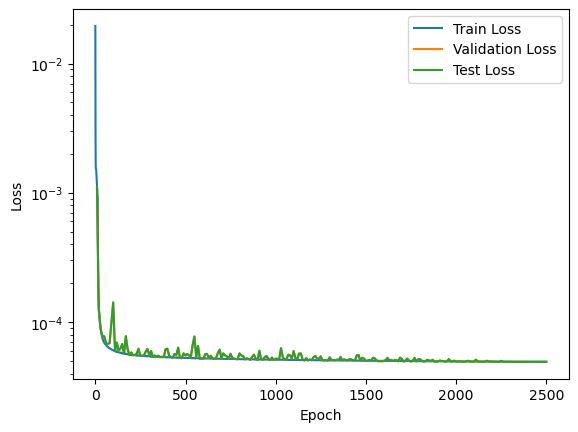

In [37]:
# Plotting
plt.plot(train_losses.numpy(), label='Train Loss')
plt.plot( np.arange(val_freq-1, num_epochs, val_freq),val_losses.numpy(), label='Validation Loss')
plt.plot(np.arange(test_freq-1, num_epochs, test_freq),test_losses.numpy(), label='Test Loss')
plt.yscale('log')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

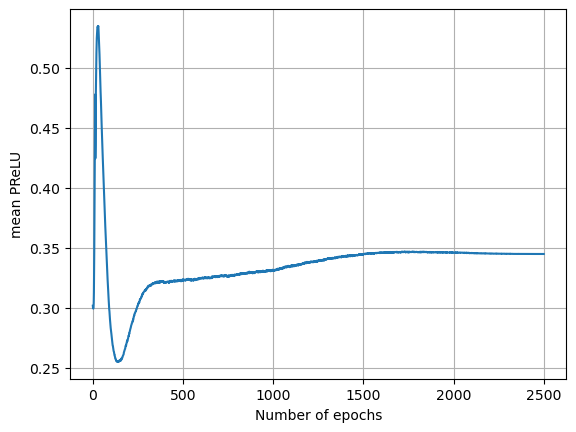

In [38]:
plt.plot(alphas.detach().numpy())
plt.xlabel('Number of epochs')
plt.ylabel('mean PReLU')    
plt.grid(True)
plt.show()

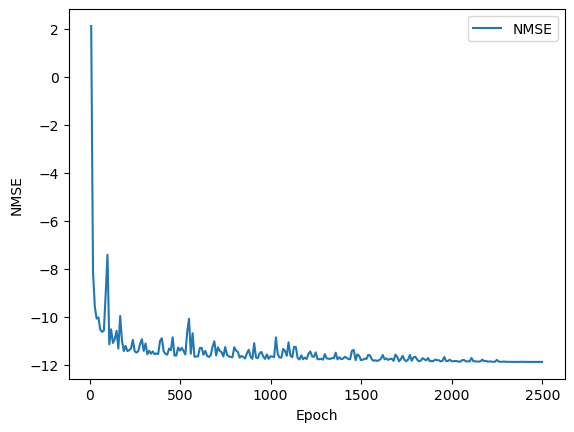

In [39]:
plt.plot(np.arange(test_freq-1, num_epochs, test_freq), test_nmses, label='NMSE')
plt.xlabel('Epoch')
plt.ylabel('NMSE')
plt.legend()
plt.show()

In [40]:
test_losses

tensor([1.0978e-03, 1.2560e-04, 8.8717e-05, 7.7926e-05, 7.7734e-05, 6.9114e-05,
        6.7590e-05, 6.8654e-05, 9.8376e-05, 1.4201e-04, 5.9499e-05, 6.9484e-05,
        6.0055e-05, 6.2444e-05, 6.7672e-05, 5.6856e-05, 7.7756e-05, 6.1731e-05,
        5.5518e-05, 5.8218e-05, 5.5372e-05, 5.5771e-05, 5.6625e-05, 6.2159e-05,
        5.5252e-05, 5.4526e-05, 5.5181e-05, 5.9011e-05, 6.1999e-05, 5.5228e-05,
        5.9674e-05, 5.3539e-05, 5.5246e-05, 5.3693e-05, 5.5020e-05, 5.3444e-05,
        5.3969e-05, 5.3597e-05, 6.1443e-05, 6.2270e-05, 5.5025e-05, 5.3663e-05,
        5.3032e-05, 5.6625e-05, 5.5710e-05, 6.3423e-05, 5.2706e-05, 5.2648e-05,
        5.7283e-05, 5.5175e-05, 5.6644e-05, 5.5336e-05, 5.3266e-05, 6.6269e-05,
        7.7399e-05, 5.3672e-05, 6.5488e-05, 5.2087e-05, 5.2070e-05, 5.2155e-05,
        5.6595e-05, 5.6543e-05, 5.2974e-05, 5.4919e-05, 5.2380e-05, 5.1918e-05,
        5.2653e-05, 5.7619e-05, 6.1142e-05, 5.2611e-05, 5.7212e-05, 5.5201e-05,
        5.4272e-05, 5.2122e-05, 5.6891e-

In [41]:
train_losses

tensor([1.9528e-02, 2.9720e-03, 1.6254e-03,  ..., 4.9379e-05, 4.9373e-05,
        4.9360e-05])

In [42]:
val_losses

tensor([1.0978e-03, 1.2560e-04, 8.8719e-05, 7.7928e-05, 7.7736e-05, 6.9116e-05,
        6.7593e-05, 6.8656e-05, 9.8377e-05, 1.4201e-04, 5.9501e-05, 6.9485e-05,
        6.0057e-05, 6.2446e-05, 6.7674e-05, 5.6858e-05, 7.7758e-05, 6.1733e-05,
        5.5521e-05, 5.8220e-05, 5.5375e-05, 5.5773e-05, 5.6628e-05, 6.2162e-05,
        5.5255e-05, 5.4528e-05, 5.5183e-05, 5.9013e-05, 6.2001e-05, 5.5231e-05,
        5.9676e-05, 5.3542e-05, 5.5248e-05, 5.3695e-05, 5.5023e-05, 5.3446e-05,
        5.3971e-05, 5.3599e-05, 6.1446e-05, 6.2272e-05, 5.5027e-05, 5.3666e-05,
        5.3034e-05, 5.6628e-05, 5.5712e-05, 6.3425e-05, 5.2708e-05, 5.2651e-05,
        5.7286e-05, 5.5178e-05, 5.6647e-05, 5.5338e-05, 5.3269e-05, 6.6271e-05,
        7.7400e-05, 5.3675e-05, 6.5490e-05, 5.2090e-05, 5.2072e-05, 5.2158e-05,
        5.6597e-05, 5.6546e-05, 5.2977e-05, 5.4921e-05, 5.2382e-05, 5.1921e-05,
        5.2655e-05, 5.7621e-05, 6.1144e-05, 5.2614e-05, 5.7214e-05, 5.5203e-05,
        5.4275e-05, 5.2124e-05, 5.6893e-